In [1]:
%load_ext autoreload
%autoreload 2

from statsmodels.base.model import GenericLikelihoodModel

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import statsmodels.api as sm
import scipy.stats as stats
import sys

from scipy.interpolate import make_interp_spline, BSpline
from scipy.stats import multivariate_normal

sys.path.append("../")
import vuong_tests7 as vuong_tests_fast

In [2]:
class JointNormal1(GenericLikelihoodModel):
    
    def loglikeobs(self, params):
        data = np.concatenate([[self.endog],self.exog.transpose()],axis=0)
        mult_rv = stats.multivariate_normal([params[0], 0.0], [[1,0],[0,1]])
        return mult_rv.logpdf(data.transpose())
    
    
class JointNormal2(GenericLikelihoodModel):
    
    def loglikeobs(self, params):
        data = np.concatenate([[self.endog],self.exog.transpose()],axis=0)
        mult_rv = stats.multivariate_normal([0.0, params[0]], [[1,0],[0,1]])
        return mult_rv.logpdf(data.transpose())


def setup_shi(yn,xn):
    # model 1 grad, etc.
    nobs = yn.shape[0]
    model1_param = np.array([yn.mean()])
    model2_param = np.array([xn.mean()])
    
    model1_deriv = JointNormal1(yn,xn)
    ll1 = model1_deriv.loglikeobs(model1_param)
    grad1 =  model1_deriv.score_obs(model1_param).reshape( (nobs,1) )
    hess1 = model1_deriv.hessian(model1_param)
    
    
    model2_deriv = JointNormal2(yn,xn)
    ll2 = model2_deriv.loglikeobs(model2_param)
    grad2 =  model2_deriv.score_obs(model2_param).reshape( (nobs,1) )  
    hess2 = model2_deriv.hessian(model2_param)
    
    return ll1,grad1,hess1,model1_param,ll2,grad2,hess2,model2_param

def gen_data(beta= 1.5, nobs=1000):
    cov = [[25, 0], [0, 1]]
    data = np.random.multivariate_normal([beta,beta], [[25,0],[0,1]],  nobs)
    return data[:,0],data[:,1],nobs

yn,xn,nobs = gen_data()
ll1,grad1,hess1,params1,ll2,grad2,hess2,params2 = setup_shi(yn,xn)
print(grad1.shape,hess1.shape)
#NOTE! Weird size distortions with shi's test when theta = .5....

(1000, 1) (1, 1)


In [3]:
nsims= 700
trials =1000
skip_boot=False
skip_shi=False
refinement_test=True
linspace=40
smoothing =5
adapt_c= True


#calc_c =lambda nobs: (2/100*nobs**(1/4)/np.sqrt(nobs), 1/2000*nobs**(1/3))
calc_c =lambda nobs: (.1, .001*nobs**(1/3))
print(calc_c(200))

(0.1, 0.005848035476425731)


# Size stuff

In [4]:
betas = np.linspace(0,3,linspace)
nobs = 500
c1,c2 = calc_c(nobs)

results = []

for beta in betas:
    setup_shi_ex  = lambda yn,xn: setup_shi(yn,xn,num_params=num_params)
    gen_data_ex = lambda : gen_data(nobs=nobs, beta =beta)
    mc_out = vuong_tests_fast.monte_carlo(nsims,gen_data_ex,setup_shi,trials=trials,
                                          skip_boot=skip_boot,skip_shi=skip_shi,refinement_test=refinement_test,c1=c1,c2=c2)
    reg,twostep, refine_test, boot1,boot2,boot3,shi, llr,std, omega = mc_out
    results.append([reg,twostep,refine_test,shi,boot1,boot2,boot3])
    print(boot3)

var//varnd//right//left 0.8137366365267966 0.8137366365267966 -4.9951758796145285 -5.820771000476012
-2.3830921870152872 -0.007920124389722569 1.6576004976448322
-2.4293758569564585 -0.007920124389722569 1.6116613110224745
---
var//varnd//right//left 0.6394005878047834 0.6394005878047834 -8.643005833758771 -9.41925307625069
-2.6239986233320716 -0.012055442369697782 1.3039921475720815
-2.6809058048699934 -0.012055442369697782 1.2534837799779546
---
var//varnd//right//left 1.2963628849342945 1.2963628849342945 1.5256518512191626 0.7830519162324626
-1.9349560112695574 0.004196206876644159 2.002068426981681
-1.9616184348482462 0.004196206876644159 1.9759422989580107
---
var//varnd//right//left 1.3677581906410887 1.3677581906410887 9.141663164283827 8.393604301470637
-1.668068638176117 0.01241027837382517 2.2494873888984284
-1.6934947105616276 0.01241027837382517 2.224451215784294
---
var//varnd//right//left 0.8697804715126819 0.8697804715126819 -7.856218800448717 -8.744585644940358
-2.2859

var//varnd//right//left 0.4199436841409475 0.4199436841409475 -13.173950465492734 -13.950506470018952
-3.2909895917857557 -0.018013244872222417 0.5899937106695141
-3.3739874866929216 -0.018013244872222417 0.5086640121794063
---
var//varnd//right//left 0.35080871882214054 0.35080871882214054 -8.910156326484412 -9.581616238717704
-3.0855784707567167 -0.016849095661439332 0.8050485801445573
-3.172733180968472 -0.016849095661439332 0.7196246110118272
---
var//varnd//right//left 1.045449294044587 1.045449294044587 2.1262059855785136 1.3949963707424753
-1.9404426481576345 0.0007312917728360656 2.020569979672732
-1.9740308302977754 0.0007312917728360656 1.9892550675204943
---
var//varnd//right//left 0.6412889834127302 0.6412889834127302 -9.296186984835382 -10.122132481252025
-2.5453453505445256 -0.01109683213812951 1.2574393224691172
-2.6047332206989036 -0.01109683213812951 1.199758971703267
---
var//varnd//right//left 0.755309693708929 0.755309693708929 -6.324507134006919 -7.149135245135252


var//varnd//right//left 1.064639312139052 1.064639312139052 -2.3822809686937836 -3.2258339385666166
-1.947453174221951 -0.0032085881908713904 1.8223437033965586
-1.9830386723013356 -0.0032085881908713904 1.7875729801997056
---
var//varnd//right//left 0.24980018390245176 0.24980018390245176 -10.985697013836969 -11.743576562647352
-3.93367537828869 -0.0174011413281523 0.1280965851105788
-4.069576859861215 -0.0174011413281523 -0.014176972552418465
---
var//varnd//right//left 1.1663155980710618 1.1663155980710618 1.6293165241756074 0.779433621018731
-1.8166257434273463 -0.0004520322006542406 2.072170551726114
-1.8500514632047562 -0.0004520322006542406 2.0384128277034494
---
var//varnd//right//left 2.6023225127381258 2.6023225127381258 56.25132923699677 55.44764879701784
-1.0230950011207016 0.06615498077867385 2.909881559658367
-1.0365468234962516 0.06615498077867385 2.895851731461674
---
var//varnd//right//left 0.9416948785103655 0.9416948785103655 -3.7279275314526754 -4.480036324136105
-2

var//varnd//right//left 0.7567336103215846 0.7567336103215846 -4.989069098245606 -5.65992110076135
-2.3187644270093584 -0.009354302491514475 1.6454847046633552
-2.358424522649245 -0.009354302491514475 1.607491458103299
---
var//varnd//right//left 0.4001910219832741 0.4001910219832741 -11.392632391092022 -12.24392803413334
-3.278706993435089 -0.013969827359354101 0.6734082593654256
-3.375818845049589 -0.013969827359354101 0.5795809202023045
---
var//varnd//right//left 1.1196580947382668 1.1196580947382668 -1.0026935431543744 -1.8054996726500525
-2.0023507659400206 -0.0015871568889268715 2.0199264117920226
-2.0345395220776377 -0.0015871568889268715 1.9878213231307362
---
var//varnd//right//left 0.8999885993294616 0.8999885993294616 -3.163378441211295 -3.937086495448272
-2.12609931585356 -0.004946091219312264 1.7096811936700913
-2.1662378193505525 -0.004946091219312264 1.6705615700718053
---
var//varnd//right//left 2.0226771921249194 2.0226771921249194 32.56171771481663 31.802146016563302

var//varnd//right//left 0.5505922385784774 0.5505922385784774 -8.75989368676285 -9.525809434946572
-2.5901037195231 -0.012822365799697071 1.2649304691704935
-2.6524494795539 -0.012822365799697071 1.2019663425673326
---
var//varnd//right//left 0.05908019872412383 0.10000000000000002 -11.630288241090973 -12.398504545968647
-6.411442152006415 -0.017029869005884192 -4.090535301812421
-6.754998927832451 -0.017029869005884192 -4.434092077638459
---
var//varnd//right//left 0.23361672257874316 0.23361672257874316 -11.368206456937795 -12.162733055010786
-4.171838973529393 -0.016132578650865113 -0.15189287071715193
-4.3248177969719075 -0.016132578650865113 -0.3051570687948011
---
var//varnd//right//left 0.81837757612785 0.81837757612785 -4.75094840218325 -5.514052129248956
-2.203353423828036 -0.0073165080948175065 1.6323309645829387
-2.2450766064534617 -0.0073165080948175065 1.592492431486338
---
var//varnd//right//left 0.5619202515387147 0.5619202515387147 -7.880213796733019 -8.649134796787374


var//varnd//right//left 0.8090698653993768 0.8090698653993768 -4.798589408001732 -5.555718783883891
-2.2263092144551297 -0.00830766368631361 1.7405365470445495
-2.2693606474458203 -0.00830766368631361 1.6990351079511792
---
var//varnd//right//left 0.8850695798202507 0.8850695798202507 -6.517744820704471 -7.365634609983639
-2.240443994097242 -0.007009255825742835 1.6022253149271242
-2.285135904937466 -0.007009255825742835 1.5571695749440977
---
var//varnd//right//left 0.6320740638773453 0.6320740638773453 -8.411927956726963 -9.227718891369156
-2.4139278950910623 -0.011325578207131655 1.3364152097677038
-2.47304279838712 -0.011325578207131655 1.2803723609993223
---
var//varnd//right//left 0.2985748625309016 0.2985748625309016 -12.173335529831704 -13.003369216080152
-3.724283817047354 -0.01607830558304671 0.0739392762453713
-3.850474518988887 -0.01607830558304671 -0.042110073956745646
---
var//varnd//right//left 0.3741402294041541 0.3741402294041541 -8.942931356768533 -9.66193416217891
-3

var//varnd//right//left 0.8273420817044808 0.8273420817044808 -5.952016086559613 -6.7484628716182655
-2.2866736307704225 -0.008622721262194467 1.6989041709424568
-2.3310523956901728 -0.008622721262194467 1.6529979245151507
---
var//varnd//right//left 0.8270890537958052 0.8270890537958052 -4.380098388055389 -5.114798274989933
-2.374433855717134 -0.006314705839079886 1.598790918230115
-2.4129208380949025 -0.006314705839079886 1.5596910545895524
---
var//varnd//right//left 0.61897057406723 0.61897057406723 -7.315724749651084 -8.073374547657076
-2.4309565534145547 -0.012959989772421876 1.528141829985964
-2.4891151198974795 -0.012959989772421876 1.4716269965388518
---
var//varnd//right//left 1.5162201138805003 1.5162201138805003 11.814613129138808 11.042337502761967
-1.6239545769691095 0.016304825339985264 2.351574746622109
-1.6471669924412982 0.016304825339985264 2.3283395006147356
---
var//varnd//right//left 1.0507704050478381 1.0507704050478381 0.5397587645702326 -0.22467405775010216
-1.

var//varnd//right//left 0.30212297729641935 0.30212297729641935 -10.397209324136217 -11.175029735542449
-3.4360928429401314 -0.01584865997176068 0.34348024389826687
-3.5478697712255363 -0.01584865997176068 0.224223457654208
---
var//varnd//right//left 0.7686114784271697 0.7686114784271697 -5.363115348903764 -6.142560360072179
-2.2804612402610585 -0.00849712274577796 1.844872410752611
-2.3268040884710923 -0.00849712274577796 1.8013274329648943
---
var//varnd//right//left 0.6051628278575067 0.6051628278575067 -11.129038418773161 -11.968919855810247
-2.7178773054425 -0.013368760445542756 1.1662564772211685
-2.780415264681064 -0.013368760445542756 1.1038338806644796
---
var//varnd//right//left 0.026376574334450162 0.10000000000000002 -14.002940441075832 -14.923730879160132
-6.807758575108341 -0.014858830368769178 -5.754530894009045
-7.219548577626002 -0.014858830368769178 -6.166320896526707
---
var//varnd//right//left 0.21697225685710658 0.21697225685710658 -13.667033628349657 -14.44479630

var//varnd//right//left 0.46691902062275875 0.46691902062275875 -9.7534541390005 -10.560989295394114
-2.9704079970782145 -0.013696000725759995 0.8984081845608711
-3.048596883552943 -0.013696000725759995 0.8226135737280205
---
var//varnd//right//left 0.3170604126670288 0.3170604126670288 -11.557545107665392 -12.381164173452856
-3.5767457171578854 -0.015479608565446792 0.4167575036440467
-3.694915206743464 -0.015479608565446792 0.30265034237087596
---
var//varnd//right//left 0.32977185767899364 0.32977185767899364 -10.662629142666317 -11.452457018807506
-3.3856803855696396 -0.01507944250753908 0.47918767182341915
-3.494212314477321 -0.01507944250753908 0.37175901764394564
---
var//varnd//right//left 1.5651455269935246 1.5651455269935246 11.569662210571325 10.752197956138968
-1.7421921996340048 0.012879628493186556 2.206231400108477
-1.7653720951458822 0.012879628493186556 2.1838771898241043
---
var//varnd//right//left 2.3157948221099427 2.3157948221099427 41.364680549166835 40.5658830593

var//varnd//right//left 1.056055078602627 1.056055078602627 -0.2553207390677489 -1.0556514438036464
-2.0092963364172642 -0.0024198378633825666 2.0702333758850404
-2.0416379681197103 -0.0024198378633825666 2.0355086346494815
---
var//varnd//right//left 0.510079446072832 0.510079446072832 -8.684375755261184 -9.424427549630208
-2.7105227834626087 -0.014171112976787819 1.1315934817878683
-2.7737707993397582 -0.014171112976787819 1.0653489915568264
---
var//varnd//right//left 1.5752790417863973 1.5752790417863973 17.611437309428542 16.915071556925774
-1.493500452958753 0.028884903437324253 2.6214018116390636
-1.5133089530475217 0.028884903437324253 2.601937964710732
---
var//varnd//right//left 1.6425162816336218 1.6425162816336218 14.409419011110197 13.62172788689829
-1.7702347448006968 0.02035119145709673 2.3642304649648898
-1.7901713904887764 0.02035119145709673 2.3426833602267867
---
var//varnd//right//left 0.7938839120026384 0.7938839120026384 -7.7749706600996396 -8.590870060701418
-2.3

var//varnd//right//left 0.520489381691312 0.520489381691312 -9.594514205240008 -10.390167206368728
-2.6062891683386575 -0.013290436828580028 1.085700726900043
-2.6783524171382567 -0.013290436828580028 1.0173683315569655
---
var//varnd//right//left 1.3673142874699347 1.3673142874699347 9.809946439536748 9.072361552046594
-1.62310929858879 0.012649392946005839 2.223945561888812
-1.6465802632623665 0.012649392946005839 2.200932170664588
---
var//varnd//right//left 1.8204746497119273 1.8204746497119273 23.35440462285334 22.60222030008168
-1.4495197184279887 0.0345713500166684 2.4813745543039314
-1.4685711027583903 0.0345713500166684 2.4629472619772774
---
var//varnd//right//left 0.22328446433415253 0.22328446433415253 -12.082109292581341 -12.894713730726286
-4.276399563236699 -0.016215579434702528 -0.4887220584318777
-4.43644965220876 -0.016215579434702528 -0.6474513331164381
---
var//varnd//right//left 0.6629577928918289 0.6629577928918289 -9.574276857790919 -10.377313519371233
-2.7715167

var//varnd//right//left 1.8761400268243016 1.8761400268243016 19.387957755058583 18.49287223538598
-1.456605333559209 0.01817736812259052 2.4980428223484594
-1.477913152689424 0.01817736812259052 2.47705358341171
---
var//varnd//right//left 0.2534742469396461 0.2534742469396461 -12.268676772086568 -13.107935520137222
-4.088668811931807 -0.014994556668594793 -0.22448705970340727
-4.236916759731061 -0.014994556668594793 -0.3773287009021761
---
var//varnd//right//left 1.6075812860829253 1.6075812860829253 13.03861086119663 12.233598888388252
-1.6919433144456382 0.016646286454356035 2.288700176056748
-1.7146515473827968 0.016646286454356035 2.2665004853630206
---
var//varnd//right//left 0.8053826081328114 0.8053826081328114 -5.521463884958025 -6.2618843370274755
-2.2678862209244164 -0.009422026777285252 1.5451610775952243
-2.309896765634144 -0.009422026777285252 1.504060738166694
---
var//varnd//right//left 0.1721761481512597 0.1721761481512597 -12.584315542992378 -13.42395411923719
-5.285

var//varnd//right//left 1.5201718446705916 1.5201718446705916 10.874072693297386 10.041973208579796
-1.4326934153432866 0.012030943531534772 2.137133567914452
-1.4589137856168855 0.012030943531534772 2.1119405454954165
---
var//varnd//right//left 1.342683763426782 1.342683763426782 4.479406384466325 3.683078685560459
-1.8685818888195502 0.00465036791666327 2.17717951874239
-1.894577982994675 0.00465036791666327 2.1515839461666117
---
var//varnd//right//left 1.6963772527635388 1.6963772527635388 18.90013831691678 18.117453770839806
-1.5238302153736092 0.02258833734597257 2.409978211327657
-1.5433869509125224 0.02258833734597257 2.389238072209391
---
var//varnd//right//left 0.7085199883136225 0.7085199883136225 -6.736082776546088 -7.48930484151038
-2.2228313016231165 -0.01010794987921679 1.5437612890870203
-2.269470517338265 -0.01010794987921679 1.4959004606277653
---
var//varnd//right//left 0.10390214286744054 0.10410407797726236 -12.0454074081941 -12.847262936772529
-7.203448149148319 

var//varnd//right//left 0.4639866596484871 0.4639866596484871 -9.436153308834426 -10.122325741593967
-2.8217373079667554 -0.015804606592682464 0.9665868232982262
-2.884913704183845 -0.015804606592682464 0.9023557723325244
---
var//varnd//right//left 0.48532929783838763 0.48532929783838763 -7.706506039484985 -8.42404578351492
-2.6632572192480093 -0.013972694040077477 1.3087877699847
-2.733235942903716 -0.013972694040077477 1.2415395673228342
---
var//varnd//right//left 1.2951749110479587 1.2951749110479587 4.05057024446469 3.2816670490474573
-1.865061072780395 0.0078426711130339 2.0324114826515234
-1.890661868361749 0.0078426711130339 2.00720373632592
---
var//varnd//right//left 0.38805728040357496 0.38805728040357496 -14.145299704593809 -14.991075813903484
-3.5542867308847055 -0.01693866285497098 0.3389653090017388
-3.6605619516205232 -0.01693866285497098 0.24539314823715572
---
var//varnd//right//left 1.4784872360938965 1.4784872360938965 8.385735946691451 7.632506451321006
-1.5818470

var//varnd//right//left 0.8471675128026516 0.8471675128026516 -4.518741886397482 -5.304032954216788
-2.0685885713434526 -0.007237354316211547 1.6990253728474987
-2.11066089755644 -0.007237354316211547 1.6578897001822817
---
var//varnd//right//left 0.5081438686766514 0.5081438686766514 -9.558001844696769 -10.383964430984697
-2.7121675291050322 -0.013016127130078266 1.2228209135747183
-2.787247849492611 -0.013016127130078266 1.149144005683479
---
var//varnd//right//left 0.8463898828203481 0.8463898828203481 -3.2880304465978574 -4.007252281840279
-2.298997358717713 -0.006767674701358307 1.7271037850288364
-2.337416108488116 -0.006767674701358307 1.6882849097033301
---
var//varnd//right//left 0.20893041456783681 0.20893041456783681 -10.284393325118131 -11.01746678472329
-4.210609714098923 -0.017364404008335978 -0.14159087595794653
-4.367614078880944 -0.017364404008335978 -0.29886751693348534
---
var//varnd//right//left 0.1801812520386015 0.1801812520386015 -12.008669403558383 -12.799726777

var//varnd//right//left 0.8500855811415843 0.8500855811415843 -3.8764859779519165 -4.652804672743161
-2.3121659854256 -0.00643351091981427 1.6457343761842922
-2.352248203453104 -0.00643351091981427 1.6055764108153234
---
var//varnd//right//left 0.8185291988076415 0.8185291988076415 -5.695973589928443 -6.50465808835856
-2.224340829205063 -0.008085038063298567 1.674721851762635
-2.2683675377265757 -0.008085038063298567 1.6276666704262266
---
var//varnd//right//left 1.5512799402900619 1.5512799402900619 9.986927928874128 9.133044130729319
-1.723537291646522 0.009513608651271797 2.21673180519897
-1.7476680238866904 0.009513608651271797 2.191401694509734
---
var//varnd//right//left 1.3210994785229864 1.3210994785229864 3.145046123338749 2.3210110164409508
-1.7785070840515658 0.0043321606377251225 2.009913904579059
-1.8069016986870325 0.0043321606377251225 1.981537432852714
---
var//varnd//right//left 0.3472282162839523 0.3472282162839523 -11.075395933443712 -11.867599181129272
-3.4204699164

var//varnd//right//left 0.37273483548072567 0.37273483548072567 -9.133980144721908 -9.86128310451313
-2.968877762554404 -0.015857117089216312 1.0331599296726615
-3.0531241996105205 -0.015857117089216312 0.9444217797587711
---
var//varnd//right//left 1.0598881003135048 1.0598881003135048 0.42891801479053415 -0.34535714225111086
-1.8293341178243343 -0.0003985977652149349 1.8677194454699426
-1.8621769122399963 -0.0003985977652149349 1.8356423696124828
---
var//varnd//right//left 0.3676383843910712 0.3676383843910712 -12.399587578490562 -13.185549685845984
-3.4127878043318245 -0.018887091142618037 0.33095798470290455
-3.5096904148199375 -0.018887091142618037 0.2383704036702504
---
var//varnd//right//left 0.702752275727215 0.702752275727215 -8.862334848973198 -9.730292431398833
-2.540697340852109 -0.010173185763424773 1.3073061145567977
-2.5976725757044683 -0.010173185763424773 1.2508552301107607
---
var//varnd//right//left 0.7181202947074701 0.7181202947074701 -7.639608008512023 -8.4144500

var//varnd//right//left 1.3615570040740148 1.3615570040740148 9.409168978110594 8.67367523044976
-1.69228744237163 0.011666378494463874 2.2612882489903257
-1.716882168624586 0.011666378494463874 2.235563016156664
---
var//varnd//right//left 0.5810236510888127 0.5810236510888127 -8.510982663645624 -9.291750943483942
-2.72086394138571 -0.012648370695678583 1.334537786575142
-2.7824184626051256 -0.012648370695678583 1.275757682498789
---
var//varnd//right//left 1.0142201137007674 1.0142201137007674 -2.7462322810729662 -3.5321432853637984
-2.09574925334569 -0.003497135681875761 1.8033764186373116
-2.129343255479209 -0.003497135681875761 1.7689424470182953
---
var//varnd//right//left 0.04942065782608749 0.10000000000000002 -12.688141893372949 -13.489144460826468
-6.658813920197373 -0.017556755493188417 -4.67168017541585
-7.017033158392959 -0.017556755493188417 -5.029899413611436
---
var//varnd//right//left 0.26997414152520144 0.26997414152520144 -10.441728734203206 -11.162418198991375
-3.75

var//varnd//right//left 0.9245436423212834 0.9245436423212834 -0.5571709204715014 -1.2447508341754414
-1.909338224568638 -0.0019866826556275605 2.0042127445741964
-1.9419036151289086 -0.0019866826556275605 1.9700749289177257
---
var//varnd//right//left 0.21474847574523948 0.21474847574523948 -13.03945847432283 -13.937887630678716
-4.669514312884259 -0.014917006144140538 -0.9025106913499533
-4.8583585908067 -0.014917006144140538 -1.0920204893362788
---
var//varnd//right//left 0.1107484527124062 0.11074922223981704 -11.994381589629429 -12.708526285201394
-6.762593978501228 -0.021096661955309754 -2.830738914653718
-7.04640052136354 -0.021096661955309754 -3.1203177778642712
---
var//varnd//right//left 0.6322574120863492 0.6322574120863492 -7.635113128690535 -8.40927371867313
-2.631795096891798 -0.01130751757089611 1.2778721526575578
-2.686601265446438 -0.01130751757089611 1.221447740683635
---
var//varnd//right//left 1.2254784332867046 1.2254784332867046 2.9928993838917997 2.25010835402979

var//varnd//right//left 0.7277914533309732 0.7277914533309732 -6.484187920186443 -7.2208161441753
-2.342014719168384 -0.010655220133948285 1.5874703020356329
-2.3863530621504583 -0.010655220133948285 1.5437341887813136
---
var//varnd//right//left 1.4367952225469278 1.4367952225469278 0.9999649800088228 0.1375405636590358
-1.9413293130919675 0.0014063797963427928 2.0651242435665145
-1.9684347603012218 0.0014063797963427928 2.038211173071317
---
var//varnd//right//left 0.10464291398849351 0.10479579045431832 -11.61624268630052 -12.417913128909566
-6.752481295479844 -0.01686750761929513 -3.0391200377742793
-7.0969511163812395 -0.01686750761929513 -3.377337414504036
---
var//varnd//right//left 0.4096214029337255 0.4096214029337255 -10.451529047447954 -11.18867530581373
-3.1338875041227694 -0.0165091357549641 0.8656583729934622
-3.216085084165052 -0.0165091357549641 0.7820773373777559
---
var//varnd//right//left 0.36326222101523015 0.36326222101523015 -8.691343604123642 -9.397866993687657
-

var//varnd//right//left 0.14342039118756217 0.14342039118756217 -12.417637716385967 -13.222642378749324
-5.7104667860571 -0.017489351570825387 -1.8105258696375086
-5.959192132703813 -0.017489351570825387 -2.040610978617653
---
var//varnd//right//left 0.2264059951798658 0.2264059951798658 -14.053960807405959 -14.807086219310031
-4.781935673027273 -0.021644689697183885 -0.7445575131532811
-4.926394183128138 -0.021644689697183885 -0.8917789380525682
---
var//varnd//right//left 0.7008178865801467 0.7008178865801467 -3.4269412506804136 -4.040343604717149
-2.2700028239756453 -0.007958724516143465 1.889447294779102
-2.3103833668026033 -0.007958724516143465 1.8498743796715718
---
var//varnd//right//left 0.39285410456175546 0.39285410456175546 -11.937283260865375 -12.644185648830419
-3.123930848730814 -0.02128710101952614 0.5182806806403545
-3.2037739223351895 -0.02128710101952614 0.4377050763956672
---
var//varnd//right//left 1.8933821172909704 1.8933821172909704 18.838902887483105 17.99920830

var//varnd//right//left 1.1182690115128588 1.1182690115128588 -3.2232143826606396 -4.0608643157711715
-2.0447489688451683 -0.0033847159529630773 1.7939926124506982
-2.0768726315434893 -0.0033847159529630773 1.7611068719105731
---
var//varnd//right//left 0.8706710243690806 0.8706710243690806 -2.5609478455033883 -3.2708984670434855
-2.14932615047415 -0.00425951519731587 1.6161666118017313
-2.18659255974452 -0.00425951519731587 1.57820685608226
---
var//varnd//right//left 0.8629214996623469 0.8629214996623469 -7.680051768200174 -8.537800319762544
-2.3388715286107415 -0.008093985069782332 1.4174149609446323
-2.386093583155818 -0.008093985069782332 1.3734151612700731
---
var//varnd//right//left 0.4950204702271002 0.4950204702271002 -10.470570841520992 -11.157241892978956
-2.874111765168799 -0.01936397902693953 1.2156503256026385
-2.9349108754241584 -0.01936397902693953 1.1504394342869846
---
var//varnd//right//left 0.1436863525731484 0.1436863525731484 -16.060690931279744 -16.91122069711252

var//varnd//right//left 0.9414053147816627 0.9414053147816627 -2.9708078224623717 -3.644153947886047
-1.956536675705391 -0.0036567854956981874 1.7523656618156918
-1.988789302346965 -0.0036567854956981874 1.7196643340486266
---
var//varnd//right//left 0.2372604539158925 0.2372604539158925 -11.895513889139554 -12.676596837367793
-4.2205480617908195 -0.0175070203618429 -0.2931487058446216
-4.3750455982109395 -0.0175070203618429 -0.44367059572907674
---
var//varnd//right//left 0.8310449164190211 0.8310449164190211 -3.960982476093301 -4.739939441862953
-2.2229717289302102 -0.007796088717771179 1.721528579982157
-2.267337195499807 -0.007796088717771179 1.6791179309437554
---
var//varnd//right//left 0.16170564046126484 0.16170564046126484 -17.524965924231346 -18.34284624826216
-6.759054416531182 -0.02250746346356682 -3.061653648440155
-6.98968395542849 -0.02250746346356682 -3.288603459036284
---
var//varnd//right//left 0.8856473909029814 0.8856473909029814 -2.4617682223904556 -3.2117412021423

var//varnd//right//left 0.6001334102585277 0.6001334102585277 -11.652931935939211 -12.465917855634801
-2.9762817920836913 -0.014680206349238945 1.1346645659914951
-3.036131913492644 -0.014680206349238945 1.075140030395521
---
var//varnd//right//left 0.26883226409308675 0.26883226409308675 -13.265490065801101 -14.110230742271394
-4.145744419575316 -0.01634526164044682 -0.2062641490247999
-4.287570643521472 -0.01634526164044682 -0.343509609025869
---
var//varnd//right//left 0.23533362501642568 0.23533362501642568 -11.384537831757966 -12.124983227785275
-4.013325047418875 -0.01867182203299656 -0.20572158982382144
-4.1571698568243525 -0.01867182203299656 -0.34418802508229934
---
var//varnd//right//left 0.22908605005518637 0.22908605005518637 -12.857444003445027 -13.71055122565604
-4.4598252751377485 -0.015733162747294197 -0.4541077942700797
-4.62758582068644 -0.015733162747294197 -0.6259969398255814
---
var//varnd//right//left 1.1099727264424866 1.1099727264424866 -3.904715853287538 -4.667

var//varnd//right//left 1.2612137963617105 1.2612137963617105 2.20418154297358 1.4599027020471271
-1.7974759243055591 0.0031649772022521497 2.0924325382237616
-1.8246876848589302 0.0031649772022521497 2.064931577118138
---
var//varnd//right//left 1.107347053293236 1.107347053293236 0.2322679546088741 -0.5556839299408527
-1.8958732192906829 -0.00037036024437478123 1.8708978498081648
-1.9279622256131517 -0.00037036024437478123 1.8397186852110967
---
var//varnd//right//left 0.883095263617961 0.883095263617961 -6.582960751456749 -7.346926351341209
-2.279102551183626 -0.008175487156242956 1.5874867180732526
-2.3190784270917466 -0.008175487156242956 1.5471100236712536
---
var//varnd//right//left 1.92243865059754 1.92243865059754 14.349493990389291 13.44291916841165
-1.5767500954950429 0.017648496893602334 2.2769271349242484
-1.5970085319712535 0.017648496893602334 2.2562660476383294
---
var//varnd//right//left 1.3817078488126284 1.3817078488126284 3.646201239818717 2.802569502949026
-1.76953

var//varnd//right//left 0.0955413226219073 0.10007048186974046 -11.471157068821107 -12.143453283371215
-7.207067470322329 -0.02258285416208744 -3.226818318802624
-7.507727477672295 -0.02258285416208744 -3.5274783261525884
---
var//varnd//right//left 1.1597038709291918 1.1597038709291918 -3.1086625680623428 -3.9336216882685346
-1.9925257172498783 -0.001957189735418767 1.8485743192685895
-2.02424483178449 -0.001957189735418767 1.8172819705934298
---
var//varnd//right//left 0.4938577598526349 0.4938577598526349 -8.421022949195756 -9.131871148810369
-2.668587063057107 -0.013755740745408775 1.2926524231055365
-2.7314091122909443 -0.013755740745408775 1.2295108410477615
---
var//varnd//right//left 0.6592047187333675 0.6592047187333675 -4.6085724321379935 -5.297954332212856
-2.2310662286212968 -0.01002431084639452 1.6827352101679058
-2.276842231058768 -0.01002431084639452 1.637564011024771
---
var//varnd//right//left 0.9421437086452482 0.9421437086452482 -6.93079258873747 -7.787620273811814
-

var//varnd//right//left 1.0213580028806768 1.0213580028806768 -5.025740171845211 -5.915864254928041
-2.081931975982742 -0.005888549621679765 1.675266608485604
-2.120298784075476 -0.005888549621679765 1.6362031748309596
---
var//varnd//right//left 1.1811641858256752 1.1811641858256752 -4.607122578180924 -5.409286584016745
-2.107808209592081 -0.006850695456100552 1.8121746130622534
-2.139191310648484 -0.006850695456100552 1.7815833286528056
---
var//varnd//right//left 0.1570051298201409 0.1570051298201409 -11.443660976945019 -12.192669355132075
-5.231166105004355 -0.017400380848182226 -1.2994110187489094
-5.441434997567841 -0.017400380848182226 -1.5103708306443857
---
var//varnd//right//left 2.0624835233422854 2.0624835233422854 37.15308515199155 36.445340839314646
-1.2115448391946262 0.05953132346007412 2.7926025187343955
-1.2270791262576024 0.05953132346007412 2.7765376696779644
---
var//varnd//right//left 0.3029128398577991 0.3029128398577991 -12.527411219533056 -13.345536378152946
-3

var//varnd//right//left 0.2153197612862889 0.2153197612862889 -12.579542902744185 -13.32352598588702
-4.617681865279404 -0.01957404206510527 -0.7043449846917483
-4.7681022572918375 -0.01957404206510527 -0.8549553182302274
---
var//varnd//right//left 1.1637421164005515 1.1637421164005515 4.869479131073404 4.142405587173475
-1.6553846230649922 0.0049628349810549996 2.134670157760564
-1.6849584778970288 0.0049628349810549996 2.1067239047719126
---
var//varnd//right//left 0.6767759503603213 0.6767759503603213 -8.47138827370404 -9.347697538664084
-2.4813794656570245 -0.011248918732601728 1.4195775956067596
-2.5370532332688387 -0.011248918732601728 1.3623885948780452
---
var//varnd//right//left 1.23774251664642 1.23774251664642 3.7835843040853305 3.077830009599569
-1.7647792904600321 0.005311796306021124 2.10188372273062
-1.790909874380992 0.005311796306021124 2.0777410072855877
---
var//varnd//right//left 0.6117736391591876 0.6117736391591876 -8.401472643676055 -9.153378550030624
-2.6670476

var//varnd//right//left 0.7552268677234143 0.7552268677234143 -8.50080666202057 -9.270647051392796
-2.3509809148232947 -0.013305886792693311 1.4761079174274174
-2.3949096227598066 -0.013305886792693311 1.4307297692429923
---
var//varnd//right//left 0.7969587352444107 0.7969587352444107 -4.63945272714919 -5.326143181735423
-2.130788883132396 -0.007814514391524632 1.717961221172608
-2.169024616363104 -0.007814514391524632 1.6780540476272856
---
var//varnd//right//left 1.3846630576582237 1.3846630576582237 6.555300861969992 5.795701340851778
-1.7479762617835317 0.00937969121630314 2.1825558906621154
-1.7737165291810135 0.00937969121630314 2.1578635782857574
---
var//varnd//right//left 0.2525713504915692 0.2525713504915692 -15.061540170550375 -15.885363416215805
-4.514874625761372 -0.01924592654983272 -0.7147499090542146
-4.666974492634997 -0.01924592654983272 -0.8619684135223212
---
var//varnd//right//left 1.6902303841624293 1.6902303841624293 10.422081672019557 9.511198296765524
-1.63872

var//varnd//right//left 2.612788756099484 2.612788756099484 50.23413107679343 49.3948609876054
-1.1886582525506435 0.05454948853695265 2.8483812201291943
-1.203027084712701 0.05454948853695265 2.834577182338817
---
var//varnd//right//left 1.485686792297036 1.485686792297036 7.519177002971678 6.704568005031506
-1.790392056342333 0.00945103191217198 2.318345418192084
-1.8151137386622755 0.00945103191217198 2.2936239783236316
---
var//varnd//right//left 1.29539313372382 1.29539313372382 6.689940061752171 5.959244077804393
-1.7941777561219856 0.011488315640174294 2.3045951001501037
-1.8197162345345548 0.011488315640174294 2.278556141791947
---
var//varnd//right//left 0.7960610825247582 0.7960610825247582 -5.12123952916956 -5.882982641309348
-2.2866536432605886 -0.008073186077171368 1.654119364521339
-2.331066408426367 -0.008073186077171368 1.6121966202628177
---
var//varnd//right//left 0.29782898271291236 0.29782898271291236 -11.957516495249369 -12.717401472743358
-3.7667189661218266 -0.01

var//varnd//right//left 0.3419474040242229 0.3419474040242229 -12.518835397588774 -13.314248025596848
-3.676075908258581 -0.017840498008858747 0.3494186612470026
-3.7807500474087385 -0.017840498008858747 0.2444892970464677
---
var//varnd//right//left 0.2310296370147931 0.2310296370147931 -16.20573134758963 -16.997134485200135
-5.100980273183937 -0.022350895143460014 -1.2466335980723915
-5.254467639800277 -0.022350895143460014 -1.3894875270501574
---
var//varnd//right//left 0.2962137856701494 0.2962137856701494 -11.63750867769618 -12.460265930422553
-3.706551657651568 -0.016096371019177425 0.19053013583069367
-3.8299494008130464 -0.016096371019177425 0.061394993361477045
---
var//varnd//right//left 1.5470865127629136 1.5470865127629136 6.483525258531592 5.659540088789634
-1.8022631169785193 0.005621225980412582 2.3342152826150557
-1.8271442082612492 0.005621225980412582 2.310860653913942
---
var//varnd//right//left 1.1812639095697453 1.1812639095697453 -2.382807944355854 -3.210146420074

var//varnd//right//left 0.20396575942549777 0.20396575942549777 -11.48960115892477 -12.269324219908365
-4.506045895319025 -0.016905684280717204 -0.587608745250553
-4.680477701816789 -0.016905684280717204 -0.7596794693122373
---
var//varnd//right//left 0.872584709988651 0.872584709988651 -5.530227015392943 -6.201296181385291
-2.0868664378590465 -0.010212076877709794 1.7076899823500933
-2.1215046764243217 -0.010212076877709794 1.6741147689763272
---
var//varnd//right//left 0.6330595330869998 0.6330595330869998 -12.883574291423628 -13.72683428476737
-2.7934648129425006 -0.015511613105301192 1.0532075808353463
-2.8552179160523403 -0.015511613105301192 0.9914829080297642
---
var//varnd//right//left 0.5642459679868314 0.5642459679868314 -10.292341190794765 -10.988672092391141
-2.7778932680958692 -0.018224159356330892 1.2596652153438057
-2.8327711545881153 -0.018224159356330892 1.2038831383781865
---
var//varnd//right//left 0.28198719148285967 0.28198719148285967 -11.696789615825278 -12.52303

var//varnd//right//left 1.4620430106190152 1.4620430106190152 4.151255521400854 3.2947235392695764
-1.7534306309126997 0.005392900932776039 2.190889160412009
-1.7797127685520888 0.005392900932776039 2.1646791417048825
---
var//varnd//right//left 1.6061641426142688 1.6061641426142688 15.658089636339849 14.964646788897323
-1.5266374416262507 0.02200291358990939 2.4100701327496137
-1.5453429752289878 0.02200291358990939 2.3908851421712685
---
var//varnd//right//left 0.08431976884917299 0.10000000000000002 -12.580163042804053 -13.323845729443882
-7.1928801793058215 -0.01984042992757525 -3.954809330221915
-7.525465187509088 -0.01984042992757525 -4.287394338425181
---
var//varnd//right//left 3.093713515506181 3.093713515506181 84.2201038255571 83.4493499012234
-0.8689108712054655 0.10790914682851237 3.046039376905039
-0.8799998714919219 0.10790914682851237 3.0346353909457155
---
var//varnd//right//left 1.1996506242949831 1.1996506242949831 1.2806674237892621 0.5071879480485756
-1.97680136341

var//varnd//right//left 0.3758399071023748 0.3758399071023748 -9.126315427366237 -9.815174140630003
-3.036379836670252 -0.016522538211642294 0.7936100271714415
-3.1219961809130337 -0.016522538211642294 0.7070164536085214
---
var//varnd//right//left 1.0951087359069998 1.0951087359069998 -9.468179537354871 -10.295443807009107
-2.260740213148495 -0.013677533821175503 1.543432679439314
-2.2953771396440548 -0.013677533821175503 1.509189816665957
---
var//varnd//right//left 0.07310520165079834 0.10000000000000002 -13.193176291873828 -13.982943684175751
-7.300876069181904 -0.018651025032142766 -4.404985789664531
-7.654070784301875 -0.018651025032142766 -4.7581805047845
---
var//varnd//right//left 0.3036509874680845 0.3036509874680845 -18.968617707326747 -19.74161689553456
-4.86747365412587 -0.026522642047402883 -0.764265299783415
-4.983293637632916 -0.026522642047402883 -0.8816364868595029
---
var//varnd//right//left 0.3654055966505744 0.3654055966505744 -17.198587511787395 -17.99758896771076

var//varnd//right//left 1.7102015278739746 1.7102015278739746 18.863706738791574 18.08121800434791
-1.4259928192537032 0.023909383253249608 2.530818336846173
-1.4471059266962034 0.023909383253249608 2.510874986657409
---
var//varnd//right//left 1.079697535734802 1.079697535734802 -2.5418319753916347 -3.367084086669979
-1.9718722365969443 -0.003574608041243923 1.7801730911234843
-2.0057179562694785 -0.003574608041243923 1.744324429563699
---
var//varnd//right//left 0.38955644144677226 0.38955644144677226 -11.15485443438966 -11.949417355561696
-3.147455770826036 -0.01611637887925058 0.554606683254483
-3.2442039325120398 -0.01611637887925058 0.46321232822404956
---
var//varnd//right//left 0.16313522692685598 0.16313522692685598 -13.5439533212467 -14.306847532597246
-5.583861115951337 -0.020335947027704145 -1.9858941431151396
-5.7954077948902185 -0.020335947027704145 -2.1993236846607025
---
var//varnd//right//left 0.5229602261799505 0.5229602261799505 -10.123795591020347 -10.85006682339582

var//varnd//right//left 0.15066878045669732 0.15066878045669732 -12.789252003616573 -13.58553785252644
-5.772029482678161 -0.017863744984713468 -1.8177363668734234
-6.002458783189947 -0.017863744984713468 -2.057966143528831
---
var//varnd//right//left 1.071990052628543 1.071990052628543 -0.2196982493417123 -0.9327329036176182
-2.0439196526520416 -0.0019813524379894325 2.07124211044225
-2.074213252785163 -0.0019813524379894325 2.0411918431638676
---
var//varnd//right//left 0.30584988854101264 0.30584988854101264 -12.745644770921524 -13.566705431257077
-3.8330747321792074 -0.016904867225306267 0.14863077399968597
-3.953876733861611 -0.016904867225306267 0.02836524705458484
---
var//varnd//right//left 1.9437173229809224 1.9437173229809224 27.051109483823414 26.273732750416542
-1.156328347595476 0.03305238694164342 2.46904825324081
-1.173750067426076 0.03305238694164342 2.450837968574988
---
var//varnd//right//left 2.3239053497519886 2.3239053497519886 44.630768803431906 43.869662958034255

var//varnd//right//left 0.9862712497818233 0.9862712497818233 -8.979693622793215 -9.711061253316341
-2.2310007950882125 -0.015282433930658586 1.567896199478023
-2.2644369571775607 -0.015282433930658586 1.5341727534752176
---
var//varnd//right//left 1.2100786685137295 1.2100786685137295 1.0515059437165069 0.2923391292453342
-2.0180215125402357 0.0016712140197074129 2.116813918846006
-2.0456405591496374 0.0016712140197074129 2.088468050352254
---
var//varnd//right//left 3.693215597567854 3.693215597567854 109.83366002580932 108.95633054437684
-0.8049993141875291 0.1132547767822418 3.1085059546528417
-0.8155017909013158 0.1132547767822418 3.097892031585681
---
var//varnd//right//left 0.3716271507919106 0.3716271507919106 -13.326841092888985 -14.073930694613168
-3.5872745780351254 -0.02047583418713743 0.38712977312294367
-3.676695262656583 -0.02047583418713743 0.3013437899811579
---
var//varnd//right//left 0.9983363506224471 0.9983363506224471 -6.089684383361603 -6.872856063217372
-2.11264

var//varnd//right//left 1.7651569471530897 1.7651569471530897 14.497549084416573 13.65820009299094
-1.5682287367315177 0.017786559178060733 2.258928194997777
-1.589041424762072 0.017786559178060733 2.238370117726896
---
var//varnd//right//left 1.548943301596596 1.548943301596596 13.085853746719124 12.316364198589303
-1.6590797060795437 0.015479262673207938 2.4091536342026014
-1.681227134658844 0.015479262673207938 2.3873458916674006
---
var//varnd//right//left 0.2763965810614317 0.2763965810614317 -11.679761159624395 -12.436559320158512
-3.842864029375503 -0.017752888275423765 0.04344065917561657
-3.96271850192634 -0.017752888275423765 -0.076552970401096
---
var//varnd//right//left 1.4338913450829969 1.4338913450829969 6.026724558255882 5.269582695207713
-1.7993948153381736 0.009261622796439505 2.074628608678634
-1.8234734574501614 0.009261622796439505 2.0519048450883424
---
var//varnd//right//left 1.4499367905325606 1.4499367905325606 4.195886829965099 3.3624183654781836
-1.8121300733

var//varnd//right//left 0.9526342151237209 0.9526342151237209 -10.2081382313153 -10.916344348903898
-2.42199617447289 -0.017121358199426052 1.5345038374182125
-2.453985452581318 -0.017121358199426052 1.5010306737816268
---
var//varnd//right//left 0.1612223508116427 0.1612223508116427 -15.999141579000712 -16.885009234396097
-6.3721413176766335 -0.0185397885477532 -2.37119027079647
-6.620721161550655 -0.0185397885477532 -2.604049794933059
---
var//varnd//right//left 1.1569280432644722 1.1569280432644722 -12.56178280390027 -13.35622097065247
-2.374975649722126 -0.014987021532148592 1.4620440445539635
-2.405454534206373 -0.014987021532148592 1.4303486378258925
---
var//varnd//right//left 1.0335727701311284 1.0335727701311284 -4.988368760114775 -5.764312127399528
-2.220507934774361 -0.007583292664502391 1.7469688475137408
-2.2536944163027712 -0.007583292664502391 1.7133835572543388
---
var//varnd//right//left 1.6954507678173285 1.6954507678173285 8.934083596615354 8.073193104981168
-1.75753

var//varnd//right//left 0.5345907148977194 0.5345907148977194 -21.596441528313502 -22.443624268095423
-3.8610885335445637 -0.026172988506231978 0.1318708602929059
-3.932726834331934 -0.026172988506231978 0.0605287726812053
---
var//varnd//right//left 2.175513730808751 2.175513730808751 27.858001741778057 27.075404533454478
-1.3424954470284525 0.038894036921399734 2.4407157992163047
-1.3591101038445748 0.038894036921399734 2.4251400736180027
---
var//varnd//right//left 1.6119635880676644 1.6119635880676644 11.340103819171873 10.564194682976543
-1.66744600321039 0.013707200078122712 2.276952384331541
-1.6888752788040136 0.013707200078122712 2.255369329529133
---
var//varnd//right//left 0.1338086955416546 0.1338086955416546 -14.553333579604661 -15.31967621151398
-6.736610371582649 -0.02259453844771025 -2.880309316279263
-6.996199283959684 -0.02259453844771025 -3.1325955295379626
---
var//varnd//right//left 0.49538972391524166 0.49538972391524166 -14.007620585266352 -14.738174403595332
-3.

var//varnd//right//left 0.41900425840996297 0.41900425840996297 -15.554714431560418 -16.263449606929793
-3.591790006224609 -0.02691426593553982 0.31258240804412984
-3.662643375986568 -0.02691426593553982 0.23849727009515267
---
var//varnd//right//left 0.22002193383301996 0.22002193383301996 -20.178094106494015 -20.88748968128392
-5.952415769579452 -0.03439811172247769 -2.0375317163647813
-6.0994139466174735 -0.03439811172247769 -2.1770347450912997
---
var//varnd//right//left 1.7102046922934586 1.7102046922934586 9.258509210783723 8.45692142038703
-1.7454890408685184 0.010482847839319385 2.340673212292658
-1.7655769804271424 0.010482847839319385 2.319113309597235
---
var//varnd//right//left 0.7930133501395874 0.7930133501395874 -9.804847240853004 -10.592696209505155
-2.511813843393016 -0.012447151965901331 1.4914950734813373
-2.5571204571093626 -0.012447151965901331 1.4483553712397719
---
var//varnd//right//left 0.5492601112835164 0.5492601112835164 -28.844528210439787 -29.6288992201277

var//varnd//right//left 0.34922937662426573 0.34922937662426573 -15.166841504633084 -15.88753182651578
-3.9459850945688366 -0.02494382471655546 0.21915084344483615
-4.0388856632631915 -0.02494382471655546 0.12883366022486073
---
var//varnd//right//left 1.076321827181801 1.076321827181801 -4.550496119386734 -5.276363331416216
-2.18679758745132 -0.007481595313174931 1.75840310105607
-2.2182073024533104 -0.007481595313174931 1.7291412463927425
---
var//varnd//right//left 0.4876159864629588 0.4876159864629588 -14.218514261582515 -14.959505406914271
-3.312238088931166 -0.024182900965655077 0.8389427435805391
-3.3806786867974075 -0.024182900965655077 0.7733766333237321
---
var//varnd//right//left 0.6372221493631837 0.6372221493631837 -23.034652280568967 -23.81788132751099
-3.5862072080466416 -0.03116294253483134 0.28840444127247283
-3.6432055587553296 -0.03116294253483134 0.23370138027970636
---
var//varnd//right//left 1.8928536993904672 1.8928536993904672 5.68420201711508 4.79584776073994
-

var//varnd//right//left 0.2072886822709177 0.2072886822709177 -20.69366353933671 -21.393510366516043
-6.42253974777375 -0.035966819476383464 -2.3267817993393005
-6.574069641111343 -0.035966819476383464 -2.4741670713818964
---
var//varnd//right//left 0.37334507054540284 0.37334507054540284 -16.12323342076403 -16.950342416378774
-3.876743995375829 -0.019939585618617976 -0.020991604670154578
-3.9799295857909907 -0.019939585618617976 -0.12018709333216081
---
var//varnd//right//left 0.5985793292573122 0.5985793292573122 -10.491951097605256 -11.210662988744888
-2.647502728133363 -0.016674418770921882 1.1591338173834909
-2.7026518572344247 -0.016674418770921882 1.1063595529762251
---
var//varnd//right//left 1.797063212349736 1.797063212349736 13.620758091628089 12.888124281649073
-1.4846269887852583 0.018850693891909662 2.302532145336822
-1.5034406289727393 0.018850693891909662 2.2839164168254804
---
var//varnd//right//left 0.6083848222048834 0.6083848222048834 -17.453804691820086 -18.3028802

var//varnd//right//left 1.8780688139337094 1.8780688139337094 20.44235311265009 19.728181060656667
-1.6125695045220665 0.033925040029994157 2.3303485718841612
-1.6296073911159539 0.033925040029994157 2.3132242598297514
---
var//varnd//right//left 0.22422416974602652 0.22422416974602652 -15.033099628538078 -15.812792962631004
-5.08897794334704 -0.022060957183366026 -0.9642948944696015
-5.255025417106333 -0.022060957183366026 -1.1230482892745304
---
var//varnd//right//left 2.0823905711237876 2.0823905711237876 25.823310763212916 25.091061715286294
-1.3705731036509767 0.039430551523958655 2.5533399174850318
-1.386429068108865 0.039430551523958655 2.5376712780215205
---
var//varnd//right//left 1.3681332450328578 1.3681332450328578 2.3795968750614858 1.5930107944644964
-1.8808246126757795 0.004547850275227621 2.0597648846824312
-1.9063397235255644 0.004547850275227621 2.033261285762412
---
var//varnd//right//left 0.2312620609026432 0.2312620609026432 -22.078700358305504 -22.93661187511135
-

var//varnd//right//left 1.8939454204076045 1.8939454204076045 17.125782496169588 16.366624595104952
-1.5091368018216955 0.027862908089866707 2.3340980988442794
-1.5267482226249334 0.027862908089866707 2.316327493517093
---
var//varnd//right//left 0.09344038411763846 0.10003845739590919 -12.103901508532797 -12.829904512832695
-7.257665482694019 -0.020387318074354528 -3.5579140760726284
-7.582343896590748 -0.020387318074354528 -3.882592489969357
---
var//varnd//right//left 1.3855644099545694 1.3855644099545694 -3.4599278864153016 -4.325239959285755
-2.0543565704668763 -0.004593984439029042 1.8481109682576746
-2.080957970908518 -0.004593984439029042 1.8213258569892234
---
var//varnd//right//left 2.139869093650774 2.139869093650774 25.907017255120234 25.138760144806987
-1.3907046575489774 0.03666895569880465 2.5043249281509765
-1.4068350507037963 0.03666895569880465 2.4877131660258796
---
var//varnd//right//left 2.0541298246793698 2.0541298246793698 18.4128919785832 17.63276297153718
-1.59

var//varnd//right//left 1.7161829646387832 1.7161829646387832 16.81293553796636 16.086399151161825
-1.5261647014240998 0.02575043938317385 2.3790318555419394
-1.5453049141878485 0.02575043938317385 2.3608756240963364
---
var//varnd//right//left 0.30991595129569177 0.30991595129569177 -19.730652746479663 -20.57166830653086
-4.738728302933378 -0.024796180946607904 -0.8888476162535247
-4.863968163651771 -0.024796180946607904 -1.003709210673293
---
var//varnd//right//left 1.3784821196191503 1.3784821196191503 3.937185848802024 3.189070796808359
-1.847040979561523 0.005663378233172994 1.9933796748454244
-1.872538537015081 0.005663378233172994 1.9696762071751717
---
var//varnd//right//left 0.6009646262737669 0.6009646262737669 -18.662211479259938 -19.40614097994834
-3.268604026156696 -0.02855203949320913 0.5752090494454023
-3.3235462694118603 -0.02855203949320913 0.5189484961911115
---
var//varnd//right//left 0.1882552093299927 0.1882552093299927 -19.70543545446914 -20.458111923102596
-6.727

var//varnd//right//left 1.234779687590476 1.234779687590476 -1.2418827848668652 -2.017054722978623
-1.883508180731267 -0.0015695657721154098 1.9723618812717592
-1.9107145676173733 -0.0015695657721154098 1.9448747273828484
---
var//varnd//right//left 1.514350716405205 1.514350716405205 10.086513867098569 9.360526673566671
-1.6312930166919988 0.013460819655163726 2.1583197528542426
-1.652486645846121 0.013460819655163726 2.1366813835189067
---
var//varnd//right//left 1.0218000504278741 1.0218000504278741 -3.3506311340439487 -4.0847969889294715
-2.200016297369864 -0.007201301875116704 1.8113186076234897
-2.2328362645678013 -0.007201301875116704 1.7782952505396858
---
var//varnd//right//left 2.006838828004382 2.006838828004382 21.216673476193304 20.37530438188009
-1.503243066121069 0.025115529447186778 2.354998758218767
-1.5219339281960078 0.025115529447186778 2.336495890817558
---
var//varnd//right//left 0.8771455860985935 0.8771455860985935 -9.477785067795098 -10.339240540427651
-2.42389

var//varnd//right//left 1.566065998278727 1.566065998278727 -3.4051821616208273 -4.315179225941821
-1.9221716667109532 -0.003735380196782833 1.8744510149601312
-1.9490286937106645 -0.003735380196782833 1.8492555538367368
---
var//varnd//right//left 0.3427403362722327 0.3427403362722327 -16.414409644973784 -17.187178609810907
-4.153632572791009 -0.025130562878354388 0.005067283141557356
-4.258233473354007 -0.025130562878354388 -0.09559190905065397
---
var//varnd//right//left 0.8727928290126239 0.8727928290126239 -12.740016575791572 -13.526862495737161
-2.6929982477130783 -0.018344633019594412 1.180463554288703
-2.7325979923228325 -0.018344633019594412 1.1389427871125541
---
var//varnd//right//left 0.5892432083892919 0.5892432083892919 -9.393489945212517 -10.128638463584645
-2.643472459678856 -0.015833868611598 1.3644773949689515
-2.6972779658990502 -0.015833868611598 1.30865027445382
---
var//varnd//right//left 1.4202628662210028 1.4202628662210028 -0.11318240520546174 -0.93207563763632

var//varnd//right//left 1.7426515764163666 1.7426515764163666 13.372536316756149 12.61174201680809
-1.6111567024385829 0.019503205090827355 2.272475821992383
-1.6301625199715546 0.019503205090827355 2.2525869231606253
---
var//varnd//right//left 0.5838492565763025 0.5838492565763025 -13.084772173804689 -13.878525808144593
-3.0250605798911403 -0.01840996174454168 1.0145093862982049
-3.084868981758207 -0.01840996174454168 0.9536697970340893
---
var//varnd//right//left 1.2197911249751092 1.2197911249751092 -1.2745330521177074 -2.026620058304107
-1.9492166320039994 -0.0033758801097038124 1.9015808069138194
-1.9780216256761995 -0.0033758801097038124 1.8741079814973909
---
var//varnd//right//left 0.7615917751119048 0.7615917751119048 -10.904967219762177 -11.660112140263196
-2.5445866542536177 -0.017819576373167407 1.2587696585463626
-2.5884081694485084 -0.017819576373167407 1.2138681091746966
---
var//varnd//right//left 3.6113870129875396 3.6113870129875396 99.08918261424945 98.2488597759253

var//varnd//right//left 0.22257735419821517 0.22257735419821517 -19.312238174402925 -20.068810289315202
-5.898463631465401 -0.02870896242316073 -1.9654749715744586
-6.042845477350389 -0.02870896242316073 -2.1202265558174886
---
var//varnd//right//left 1.1721737584558751 1.1721737584558751 -16.586685058490765 -17.428822486738554
-2.535647180799758 -0.020369726699403835 1.4500329067859161
-2.5669205319519897 -0.020369726699403835 1.416595410701987
---
var//varnd//right//left 1.6990073262162368 1.6990073262162368 7.8648409889252795 7.12007983525554
-1.8224001784870298 0.010759263473480822 2.218670003000424
-1.8415962138134223 0.010759263473480822 2.1991175007127106
---
var//varnd//right//left 1.7636494326250354 1.7636494326250354 15.842337392842731 15.11286593213885
-1.637252534797681 0.019130336259016115 2.364664486112401
-1.6557596987801302 0.019130336259016115 2.346744383291861
---
var//varnd//right//left 1.0654589299388486 1.0654589299388486 -6.868984337617612 -7.6769507128993295
-2.1

var//varnd//right//left 1.462579787263863 1.462579787263863 -2.489128695672994 -3.1704051910320774
-2.030366885234151 -0.006214595682995013 1.7831750303161615
-2.0516393285386765 -0.006214595682995013 1.7623468078705067
---
var//varnd//right//left 0.34039441715972807 0.34039441715972807 -19.61490448766144 -20.456758050083906
-4.597024535229347 -0.02338777090921007 -0.5827174106171065
-4.710380869879491 -0.02338777090921007 -0.6983298515406269
---
var//varnd//right//left 0.8294767325862522 0.8294767325862522 -11.749666398961308 -12.523900281876918
-2.6128940843248976 -0.016454100930208458 1.4048022422711046
-2.654235062611954 -0.016454100930208458 1.3613976138941242
---
var//varnd//right//left 1.0159208942386038 1.0159208942386038 -8.754025658851468 -9.504490046287618
-2.3968856389440694 -0.012256494762007688 1.6658340103226237
-2.4300546167326114 -0.012256494762007688 1.630385130183345
---
var//varnd//right//left 0.8114848647719962 0.8114848647719962 -11.555979257560626 -12.25248693763

var//varnd//right//left 2.11201856564696 2.11201856564696 18.67770619786974 17.875484336629228
-1.5183539327931646 0.02458964066573762 2.2542963154507785
-1.534978027978836 0.02458964066573762 2.236683484640226
---
var//varnd//right//left 0.19497037851738377 0.19497037851738377 -16.072850927652986 -16.912172619807635
-5.752318275257986 -0.020190543563056315 -1.7204260901681154
-5.952588796169968 -0.020190543563056315 -1.9188947894574924
---
var//varnd//right//left 1.1473543867505425 1.1473543867505425 -8.018324259874774 -8.789847790491367
-2.2410082605956325 -0.010358533777223719 1.7710567207188825
-2.2711066983716126 -0.010358533777223719 1.7409689376580504
---
var//varnd//right//left 2.522334629046024 2.522334629046024 48.14982343028077 47.36042855569892
-1.155225805253539 0.06152004988048421 2.8700929811387286
-1.1683986316102828 0.06152004988048421 2.8558019393786314
---
var//varnd//right//left 0.9040230430431423 0.9040230430431423 -5.39624943715171 -6.093751216181654
-2.2852238540

var//varnd//right//left 2.28434290548656 2.28434290548656 28.422573333222335 27.583824299929645
-1.357181123121348 0.031007630403817713 2.4700597172640735
-1.3749285177847537 0.031007630403817713 2.453903920343227
---
var//varnd//right//left 0.18413061978065576 0.18413061978065576 -19.45604866565904 -20.22580296448769
-6.65541608178219 -0.027632548507236107 -2.7687726593372135
-6.8436314092954875 -0.027632548507236107 -2.9493665819497665
---
var//varnd//right//left 0.2938390685660976 0.2938390685660976 -23.395261844930122 -24.141525218227162
-5.5045938109744235 -0.03630425827372497 -1.5315808820481338
-5.624082875234788 -0.03630425827372497 -1.643363538931953
---
var//varnd//right//left 0.7981122174410911 0.7981122174410911 -16.06504757423411 -16.92254272471903
-2.95909790644605 -0.019547267183218007 0.9397126209346545
-3.0088654223315467 -0.019547267183218007 0.890228596701623
---
var//varnd//right//left 0.3752352677685445 0.3752352677685445 -20.3836051777982 -21.172396374363974
-4.26

var//varnd//right//left 0.20053918783695554 0.20053918783695554 -15.459338462294058 -16.21484542471245
-5.54401663994515 -0.023041144697010726 -1.4258390315747862
-5.712364112023443 -0.023041144697010726 -1.5943394543251383
---
var//varnd//right//left 2.3024360077353383 2.3024360077353383 39.153979453497335 38.38622675176382
-1.4159397006214773 0.05444022675412992 2.7202319314624845
-1.430403282691752 0.05444022675412992 2.7044106994344634
---
var//varnd//right//left 0.8104533742865694 0.8104533742865694 -10.115870866092173 -10.890224202539757
-2.5013294610994197 -0.014512011529117626 1.3118108076112445
-2.545501973696397 -0.014512011529117626 1.2690599845595776
---
var//varnd//right//left 0.4774193140739537 0.4774193140739537 -14.377097463589323 -15.080018984816205
-3.3294703321880443 -0.024386430843607615 0.5577822744471982
-3.395688040827944 -0.024386430843607615 0.49453481322830056
---
var//varnd//right//left 2.082824796604663 2.082824796604663 32.92531586508348 32.20678436156598
-

var//varnd//right//left 0.5460156881396108 0.5460156881396108 -28.83735912551656 -29.593985556912063
-4.222176339196167 -0.04325943851515258 -0.34841979894546976
-4.282476977234706 -0.04325943851515258 -0.4137177819678035
---
var//varnd//right//left 0.33344455648147087 0.33344455648147087 -21.075748298949375 -21.926371728859678
-4.7338935930098875 -0.025758003321683817 -0.8564848024801913
-4.852418894351484 -0.025758003321683817 -0.9740263222660919
---
var//varnd//right//left 4.904958460616146 4.904958460616146 231.44379731930246 230.69062962977705
-0.0937204906176292 0.2990382745305381 3.9431345751441302
-0.10049946076703029 0.2990382745305381 3.9360238244917785
---
var//varnd//right//left 0.1631076839028049 0.1631076839028049 -13.558228560710795 -14.296862615181697
-5.884556512727467 -0.021644262409683326 -1.713061245755636
-6.085584672641738 -0.021644262409683326 -1.909160098510697
---
var//varnd//right//left 1.8169524663885708 1.8169524663885708 23.739567732811317 23.00103663162964

var//varnd//right//left 0.504986781432916 0.504986781432916 -16.252012350243472 -17.08822649863286
-3.437156755155206 -0.02036333415064201 0.5736713667401647
-3.508139515704391 -0.02036333415064201 0.4970643767175937
---
var//varnd//right//left 0.5987592548418683 0.5987592548418683 -14.234857601706135 -15.065848941537848
-2.821490952242049 -0.01898275102309467 0.9197719670044558
-2.8875851417415035 -0.01898275102309467 0.8566770204677985
---
var//varnd//right//left 1.0911853938973726 1.0911853938973726 -3.0234695997688834 -3.7094366623764854
-1.978398254083384 -0.006183820254164529 1.7219505797587547
-2.0050740300707193 -0.006183820254164529 1.692401835785382
---
var//varnd//right//left 1.0619680716392454 1.0619680716392454 -4.053442291563924 -4.816392643151047
-2.232854191885434 -0.007690118985493867 1.7372526298499538
-2.2646450797787807 -0.007690118985493867 1.7036235431615652
---
var//varnd//right//left 0.6242742861581789 0.6242742861581789 -17.125033963623995 -17.960364935464924
-

var//varnd//right//left 0.14864129279330407 0.14864129279330407 -17.10794426508503 -17.99858215477662
-7.082755473025166 -0.018258421776505378 -3.139066099403886
-7.361988330223398 -0.018258421776505378 -3.4085697905269257
---
var//varnd//right//left 2.980954480556172 2.980954480556172 75.90142401257711 75.20072861007439
-0.9616638579015104 0.12140991470703422 2.871706121121224
-0.972142516666369 0.12140991470703422 2.8613420784739323
---
var//varnd//right//left 1.4273292331817604 1.4273292331817604 3.7937911558680506 3.000751985924003
-1.9466767517081276 0.0039305144554186875 2.0575186829060548
-1.9715523806022655 0.0039305144554186875 2.033684330723116
---
var//varnd//right//left 0.9764580256146528 0.9764580256146528 -12.21770664322675 -13.012086890669437
-2.6079041282178994 -0.01589407923243246 1.3908494303849208
-2.6437723394552366 -0.01589407923243246 1.3527832997577744
---
var//varnd//right//left 1.7722323448416224 1.7722323448416224 19.612202725947686 18.878918629537687
-1.57107

var//varnd//right//left 0.8417945379475277 0.8417945379475277 -15.160838415711853 -15.964816926737432
-2.6338156335114276 -0.021394498706975434 1.1388063868349225
-2.6792268307564444 -0.021394498706975434 1.095706266109989
---
var//varnd//right//left 1.2242486659479925 1.2242486659479925 -21.999063116987145 -22.805757705269325
-2.77557222713056 -0.029452564585581636 1.1974906469692732
-2.8062169173335545 -0.029452564585581636 1.167726762414506
---
var//varnd//right//left 1.006195881112993 1.006195881112993 -11.066957758048671 -11.820030283790796
-2.4077011043794188 -0.01718272598621605 1.5657972177830985
-2.442499382822327 -0.01718272598621605 1.5293087726934016
---
var//varnd//right//left 1.7706300808032385 1.7706300808032385 5.031691844241507 4.314179327926283
-1.8168294470748492 0.00950449062598153 2.087352851367148
-1.8351694423206901 0.00950449062598153 2.069225684141077
---
var//varnd//right//left 0.5923821950434391 0.5923821950434391 -14.037815309077262 -14.79023933657018
-2.999

var//varnd//right//left 0.2715757934772998 0.2715757934772998 -25.48331353854612 -26.269582168711022
-6.172001592376428 -0.037408385274298836 -2.1829453039050177
-6.2972184761448915 -0.037408385274298836 -2.3109216377802078
---
var//varnd//right//left 0.3484978422722764 0.3484978422722764 -23.41925976782648 -24.160658068901917
-4.808995458797298 -0.03645866894284506 -1.1664863131680134
-4.902996648071649 -0.03645866894284506 -1.2653720191425846
---
var//varnd//right//left 1.4037165588597478 1.4037165588597478 -19.656610645921134 -20.419953758422306
-2.4042598052491897 -0.030480797085309326 1.3508186001158764
-2.4283016339114623 -0.030480797085309326 1.3261620409269066
---
var//varnd//right//left 0.7451512546952375 0.7451512546952375 -21.722094778810547 -22.5287270395647
-3.267925077943388 -0.027426841173724213 0.6506084519874658
-3.317922132253737 -0.027426841173724213 0.603815230835572
---
var//varnd//right//left 0.7605276582072817 0.7605276582072817 -19.165948066831557 -20.0665516756

var//varnd//right//left 0.16822506835526224 0.16822506835526224 -18.557192588903803 -19.37612553252676
-6.877990944297073 -0.024050249198866912 -2.85676674005439
-7.100846774149485 -0.024050249198866912 -3.076150750450999
---
var//varnd//right//left 0.21514596467377123 0.21514596467377123 -20.81106354822372 -21.458415607476525
-6.234825564055276 -0.04360995185891149 -2.364380738678671
-6.366380929673336 -0.04360995185891149 -2.4964019366535903
---
var//varnd//right//left 0.22730602428874083 0.22730602428874083 -22.42412425210929 -23.132990293916244
-6.282784302296779 -0.036870717907105346 -2.508449076127353
-6.420485635780266 -0.036870717907105346 -2.6483767043566346
---
var//varnd//right//left 2.185278216812106 2.185278216812106 33.00095807623391 32.29792903421734
-1.181335952907861 0.05620377785194941 2.5568388189227873
-1.195244995416437 0.05620377785194941 2.543077622758464
---
var//varnd//right//left 0.6363994426270502 0.6363994426270502 -19.929231716860645 -20.780577341276107
-3.

var//varnd//right//left 0.6617806676437078 0.6617806676437078 -19.053088807567885 -19.765840073014644
-3.3584646945197094 -0.03174179102991143 0.805028919715727
-3.4085137790721274 -0.03174179102991143 0.7569704783341131
---
var//varnd//right//left 0.2394630669840098 0.2394630669840098 -24.997703159741004 -25.824093269684575
-6.510665370236407 -0.031984348296450325 -2.7648272228350055
-6.662464397608148 -0.031984348296450325 -2.9196007134042588
---
var//varnd//right//left 1.6140387427117562 1.6140387427117562 4.7707441951069445 4.061654594906365
-1.865953700175943 0.005971338979049788 2.117198169028255
-1.8860387069840545 0.005971338979049788 2.0980172982903875
---
var//varnd//right//left 0.6281593096203401 0.6281593096203401 -21.004765440740464 -21.901327821201566
-3.3792206493995662 -0.022689737126381396 0.40450348877295395
-3.4420903173133186 -0.022689737126381396 0.3385957157148938
---
var//varnd//right//left 2.0596854089698717 2.0596854089698717 15.728108118234106 14.9454188151237

var//varnd//right//left 0.20106337514094372 0.20106337514094372 -21.51554371785209 -22.278510799853418
-6.64088492746737 -0.032171058677516136 -2.794579560793797
-6.816337372007664 -0.032171058677516136 -2.9610545399001547
---
var//varnd//right//left 1.3160666754593453 1.3160666754593453 -14.469029532264088 -15.218832199973217
-2.3178034951666797 -0.022987195245222816 1.3152863848107013
-2.3431203821313034 -0.022987195245222816 1.2902968223642763
---
var//varnd//right//left 1.8450248547430346 1.8450248547430346 1.3035394218692484 0.5526138444251023
-1.8996473279489718 0.002989277076413645 1.9624884840350703
-1.9187004166069122 0.002989277076413645 1.9443237697167057
---
var//varnd//right//left 1.7628768880035253 1.7628768880035253 6.690457053965262 5.9086877565312355
-1.9024035307233595 0.007223177983043936 2.0681145221927824
-1.9236959776673217 0.007223177983043936 2.049048781716838
---
var//varnd//right//left 1.318192542177912 1.318192542177912 -11.658121884266079 -12.447777135046607

var//varnd//right//left 1.2688549545006453 1.2688549545006453 -19.24905375579619 -20.00322405253032
-2.639847850966941 -0.030761427727659912 1.2577019532064149
-2.6657403337469563 -0.030761427727659912 1.230931697687034
---
var//varnd//right//left 1.1737145571826406 1.1737145571826406 -20.99377494235568 -21.757019523864017
-2.777380305550552 -0.029281531681540584 1.1714825055859601
-2.805880004227469 -0.029281531681540584 1.1428614951529743
---
var//varnd//right//left 0.20200692198654902 0.20200692198654902 -21.326387106764784 -22.179540936165854
-6.634145753776173 -0.025387935427636208 -2.703204046196029
-6.829465414625524 -0.025387935427636208 -2.8905827632847467
---
var//varnd//right//left 0.25552998182528064 0.25552998182528064 -26.73039232058514 -27.531859231342406
-6.699422609763596 -0.0354676473710463 -2.730757304190381
-6.839824490864093 -0.0354676473710463 -2.8698277649527486
---
var//varnd//right//left 0.7066251895629241 0.7066251895629241 -22.973324072832643 -23.823461250811

var//varnd//right//left 2.006409545718218 2.006409545718218 11.880344534084262 11.134444312482975
-1.747158667905285 0.014428222381301318 2.2194147952686905
-1.76408039660523 0.014428222381301318 2.203147859037692
---
var//varnd//right//left 0.8268840719436601 0.8268840719436601 -22.918071045088414 -23.684598257922104
-3.0677106049509986 -0.03370436952778987 0.7392621267274119
-3.110049306834879 -0.03370436952778987 0.6974647391152409
---
var//varnd//right//left 1.0097429822739281 1.0097429822739281 -14.051317789873771 -14.847678071108687
-2.485090741539237 -0.01815907647128558 1.3916849785865548
-2.5220126868658532 -0.01815907647128558 1.3540388426148877
---
var//varnd//right//left 2.2721181347086743 2.2721181347086743 27.04913238321207 26.277827982098497
-1.5352358512324573 0.037581413524202606 2.5160826859004115
-1.5509662460676985 0.037581413524202606 2.5013290021507366
---
var//varnd//right//left 2.749773162464017 2.749773162464017 42.787372856744916 41.91110211427172
-1.250192574

var//varnd//right//left 0.2303104378704253 0.2303104378704253 -19.2736444453901 -20.051131094500114
-5.744478714684272 -0.028193736018821046 -1.7224324155095159
-5.891463928742988 -0.028193736018821046 -1.877005477810543
---
var//varnd//right//left 2.386112556087845 2.386112556087845 27.175711570665786 26.3639916448933
-1.5174686015085028 0.032589862248068244 2.631040080542084
-1.5329494343237593 0.032589862248068244 2.616186715212516
---
var//varnd//right//left 1.3628493782329765 1.3628493782329765 -19.495566360583457 -20.340505337508635
-2.719147282826149 -0.02226897400376638 1.3329446576302295
-2.7470871634142013 -0.02226897400376638 1.3034609203478482
---
var//varnd//right//left 1.479805253839686 1.479805253839686 -3.4861178880730566 -4.25490741067283
-2.026383968017695 -0.004538391185702724 1.93086706927009
-2.049615685830953 -0.004538391185702724 1.9074391280859126
---
var//varnd//right//left 0.8534212894480298 0.8534212894480298 -13.949439950050772 -14.719854052327754
-2.6226608

var//varnd//right//left 0.5602677123936236 0.5602677123936236 -28.06628039757948 -28.89499475699607
-4.345564090448369 -0.03477430503414185 -0.20852486092918002
-4.414160946329609 -0.03477430503414185 -0.2728750554491171
---
var//varnd//right//left 1.9149627682507944 1.9149627682507944 13.4839283907801 12.713381229331146
-1.6416967451210205 0.01957560581863745 2.2204647543700715
-1.6598546715139222 0.01957560581863745 2.2030338503542755
---
var//varnd//right//left 0.7442722000532647 0.7442722000532647 -10.367984738079686 -11.152142410677628
-2.598387839621658 -0.015862538506387282 1.3788009037416162
-2.6464098741122197 -0.015862538506387282 1.331325640977775
---
var//varnd//right//left 1.5036712095670444 1.5036712095670444 -0.47370062891170983 -1.2170685568664026
-1.8513270713524783 -0.0007505736458966554 2.024797728540541
-1.8734761368217525 -0.0007505736458966554 2.0019289604190087
---
var//varnd//right//left 1.639063193010761 1.639063193010761 4.872526625970744 4.15714907295993
-1.7

var//varnd//right//left 1.8795937287896531 1.8795937287896531 12.334097388872527 11.555671372285849
-1.8043632410855166 0.012974798588812076 2.150610694431267
-1.8223862390839547 0.012974798588812076 2.132470517650654
---
var//varnd//right//left 0.9217424145083963 0.9217424145083963 -26.541155504409748 -27.232842230437228
-3.1367264729169277 -0.04499038675697266 0.7597528182882856
-3.170582448340988 -0.04499038675697266 0.7254813600099671
---
var//varnd//right//left 0.749195792886811 0.749195792886811 -24.09957576077521 -24.836188231456944
-3.3450520282394427 -0.03766964828623999 0.4451024479453895
-3.3904546274696306 -0.03766964828623999 0.4019146499220741
---
var//varnd//right//left 1.4093562175863676 1.4093562175863676 -11.736706568982063 -12.544070431554152
-2.2465312554109924 -0.014332911952161645 1.5015276120639132
-2.2722205772872672 -0.014332911952161645 1.4766154751649194
---
var//varnd//right//left 1.5475501231021098 1.5475501231021098 4.349839528432314 3.6421862463387837
-1.

var//varnd//right//left 0.37620796437595777 0.37620796437595777 -24.81284109205067 -25.64183235567918
-4.921190998239636 -0.03146577631212039 -0.9648088471558072
-5.019939494240594 -0.03146577631212039 -1.0613493437827566
---
var//varnd//right//left 2.384094892019087 2.384094892019087 30.84743684261325 29.999127108739813
-1.4813260811500588 0.036949611957205454 2.444144072873331
-1.4977356441187724 0.036949611957205454 2.428353905657627
---
var//varnd//right//left 0.8054213664341175 0.8054213664341175 -16.903607485926692 -17.66001240364906
-2.8931510680646664 -0.025390866413723793 0.9532724532773715
-2.937563535883597 -0.025390866413723793 0.9110718684455618
---
var//varnd//right//left 1.009395001071963 1.009395001071963 -5.22546531656539 -5.906241240447657
-2.1384309948861606 -0.01079361796991663 1.8876301082880855
-2.16899745538398 -0.01079361796991663 1.8581211405326359
---
var//varnd//right//left 2.3761242926011517 2.3761242926011517 36.06495028774862 35.351214788439975
-1.30348723

var//varnd//right//left 0.8565116757800078 0.8565116757800078 -9.60523732694895 -10.328624708916863
-2.3286765583554208 -0.01685321947286503 1.6322150866664902
-2.3663639183669067 -0.01685321947286503 1.5959403485063155
---
var//varnd//right//left 0.6093569469180797 0.6093569469180797 -22.85151731120429 -23.69937903544309
-3.550279570004939 -0.028124937106089456 0.24186507167711874
-3.6118434185554866 -0.028124937106089456 0.17872892513671768
---
var//varnd//right//left 1.396482428869532 1.396482428869532 -15.199904994995075 -16.00388079228565
-2.4310419983695413 -0.01682449450103061 1.357306051783555
-2.455549563623719 -0.01682449450103061 1.332091935730108
---
var//varnd//right//left 1.788650016166184 1.788650016166184 10.861354467157039 10.166322666521891
-1.652744974025321 0.013578783016133337 2.2169226698854274
-1.6696874355209137 0.013578783016133337 2.199444697427186
---
var//varnd//right//left 1.076684221742561 1.076684221742561 -8.819210659369997 -9.623772574115188
-2.26553978

var//varnd//right//left 1.048840513724476 1.048840513724476 -20.774610358338787 -21.62314156625461
-2.9405642132566094 -0.025738379317410638 0.990743641516729
-2.9787007800657777 -0.025738379317410638 0.9556632109346155
---
var//varnd//right//left 1.0311977413653244 1.0311977413653244 -17.00482568052693 -17.789970679342687
-2.7715609312040304 -0.023926395963468385 1.271378495429808
-2.804954033512172 -0.023926395963468385 1.2385560590341413
---
var//varnd//right//left 1.831496509371354 1.831496509371354 1.6551771435971416 0.905133952839664
-1.95378376758197 0.003951956494723984 2.034807275030068
-1.9728488779513353 0.003951956494723984 2.0158490072716635
---
var//varnd//right//left 1.256465536297112 1.256465536297112 -1.1314290545829873 -1.8956708206544977
-2.0126516312652765 -0.002303701598969499 1.9770203989309076
-2.039774693938258 -0.002303701598969499 1.950226071312737
---
var//varnd//right//left 0.24269823403694954 0.24269823403694954 -17.20916334859893 -18.008027119375313
-5.170

var//varnd//right//left 0.9622064533445971 0.9622064533445971 -21.548667723787702 -22.382919594592916
-2.829122027230594 -0.02738206752808182 0.7922841437013851
-2.866618547152292 -0.02738206752808182 0.7526798430285047
---
var//varnd//right//left 0.3025130584803072 0.3025130584803072 -17.28901469507348 -18.108478191319104
-4.497616612283549 -0.022784034689881067 -0.6841471635839306
-4.617960727302029 -0.022784034689881067 -0.808285791573734
---
var//varnd//right//left 2.017227982599952 2.017227982599952 17.524556768007724 16.660932068264508
-1.6865262141766795 0.02121113495562039 2.289683482752271
-1.7056004677548326 0.02121113495562039 2.2706710135634576
---
var//varnd//right//left 1.0819694520987893 1.0819694520987893 -16.00262172502475 -16.77101442545354
-2.693387001001528 -0.0226248774730508 1.28661938808299
-2.724236862605197 -0.0226248774730508 1.2539639664402948
---
var//varnd//right//left 2.552367885316177 2.552367885316177 51.23580414276218 50.50517757679033
-1.21719395608639

var//varnd//right//left 0.5805596165641709 0.5805596165641709 -24.449513060315848 -25.25011189504546
-3.9176757438621332 -0.034198765905160626 0.23085323138905828
-3.9809009225735306 -0.034198765905160626 0.16916322758843505
---
var//varnd//right//left 2.198031794878874 2.198031794878874 17.951853762247275 17.177281408550197
-1.6829078455766768 0.023107057277431224 2.096482176768542
-1.6987533273592081 0.023107057277431224 2.0814278569072346
---
var//varnd//right//left 1.3684255877261875 1.3684255877261875 -4.86035987268878 -5.659978866154207
-2.151047828700471 -0.006119296824024574 1.7671705655117365
-2.1774467230494787 -0.006119296824024574 1.741776552626102
---
var//varnd//right//left 1.0025140292200867 1.0025140292200867 -14.378718654668114 -15.161377335025259
-2.598050849675388 -0.019121778939341402 1.3240961824217505
-2.6346772837801975 -0.019121778939341402 1.2886838524670223
---
var//varnd//right//left 3.6987179890736406 3.6987179890736406 102.7143887469248 101.86605927395529
-

var//varnd//right//left 1.2382369475858594 1.2382369475858594 -5.448827499766674 -6.301887143154781
-2.062590510926443 -0.0067214976533760675 1.6786791979146853
-2.092954354464456 -0.0067214976533760675 1.6474232581023187
---
var//varnd//right//left 1.0619937759561682 1.0619937759561682 -14.076804398611541 -14.88617711298315
-2.5044035993720684 -0.01903316934326489 1.421301709091344
-2.5402195638125042 -0.01903316934326489 1.3864534513641211
---
var//varnd//right//left 0.5496157160444246 0.5496157160444246 -22.068929226740547 -22.86294188438636
-3.674733274970489 -0.029124671275574603 0.24638246072343656
-3.7385752866238016 -0.029124671275574603 0.18061558829051255
---
var//varnd//right//left 0.4406363980558212 0.4406363980558212 -25.207170857183904 -25.91865259436373
-4.573646084569909 -0.04174909678823901 -0.5393375273873232
-4.646582730198939 -0.04174909678823901 -0.6115836179676868
---
var//varnd//right//left 1.0097677404174705 1.0097677404174705 -15.558452688496644 -16.36810622249

var//varnd//right//left 1.278484783982611 1.278484783982611 -9.342181568378217 -10.155737170449665
-2.2709858383007124 -0.01104565345713499 1.675459814505288
-2.298674993067637 -0.01104565345713499 1.646249428960732
---
var//varnd//right//left 2.2565525251952216 2.2565525251952216 29.591726651840993 28.862794535104797
-1.3728571631425945 0.04269856938967474 2.5197862969092277
-1.3885156779516032 0.04269856938967474 2.505532042425592
---
var//varnd//right//left 1.1733547431600277 1.1733547431600277 -8.022136949378325 -8.760426047981642
-2.186043798211332 -0.011582744955343371 1.7609437303022575
-2.2145492287002564 -0.011582744955343371 1.7342051184636265
---
var//varnd//right//left 0.27048005766021926 0.27048005766021926 -24.493870623705998 -25.316161563976276
-5.99308901344111 -0.03143248126420516 -2.1394528279919767
-6.129804339392209 -0.03143248126420516 -2.2757205892807044
---
var//varnd//right//left 1.8408278000111218 1.8408278000111218 24.191832024980478 23.512439893706308
-1.4587

var//varnd//right//left 0.5133700268464056 0.5133700268464056 -30.175268721320208 -30.936284944932726
-4.497894896165901 -0.04336156101684327 -0.6635948736566499
-4.565278715870091 -0.04336156101684327 -0.7295622539025622
---
var//varnd//right//left 1.1787272422171278 1.1787272422171278 -14.900884348050578 -15.693389990359892
-2.4250369205889104 -0.019087856924884003 1.3620636041035796
-2.4561528344356818 -0.019087856924884003 1.3315720976135328
---
var//varnd//right//left 0.2195391743353156 0.2195391743353156 -22.86667559625917 -23.64370710541258
-6.678505897316263 -0.03274046343828095 -2.6055208428482324
-6.829729579585867 -0.03274046343828095 -2.7666179948870857
---
var//varnd//right//left 0.7028729851843023 0.7028729851843023 -16.01876934186182 -16.80922126468881
-3.0114117575155745 -0.022642127650855926 0.8622981056185294
-3.0632058278438516 -0.022642127650855926 0.8112347187635527
---
var//varnd//right//left 2.6955078730075592 2.6955078730075592 42.34344834929198 41.5071899348695

var//varnd//right//left 3.8310005126790547 3.8310005126790547 111.45669489563952 110.60056454231503
-0.8220099567869402 0.11614489827211721 3.154089906797584
-0.8318715893109336 0.11614489827211721 3.1433128569532385
---
var//varnd//right//left 2.2981267355098653 2.2981267355098653 35.98374819108574 35.23146746216603
-1.307677099081748 0.04835585339103637 2.622430299854439
-1.3228005953185042 0.04835585339103637 2.6075020403745555
---
var//varnd//right//left 2.8180219651139216 2.8180219651139216 62.640557661094014 61.921594343037825
-0.9974745217241852 0.09338985454941842 2.897244906686489
-1.0087319736435976 0.09338985454941842 2.8855214603853065
---
var//varnd//right//left 0.4960584056342964 0.4960584056342964 -21.58205661314624 -22.420991437835475
-3.7974047722760633 -0.02775089998444466 0.0786455018561106
-3.872187125880206 -0.02775089998444466 0.004065848663464517
---
var//varnd//right//left 0.6826697737431111 0.6826697737431111 -22.519103178469646 -23.29674700460833
-3.3934344509

var//varnd//right//left 1.2063229020915427 1.2063229020915427 -17.276233237056005 -18.042175115264882
-2.4278190458381883 -0.02359310149708505 1.3737359737859618
-2.456204351030973 -0.02359310149708505 1.3451491865968954
---
var//varnd//right//left 2.153396081183028 2.153396081183028 14.784084310056159 14.004011863489243
-1.7038332317701865 0.017107644570505093 2.2531180773421298
-1.7194582652655064 0.017107644570505093 2.236972178009096
---
var//varnd//right//left 4.615851467763574 4.615851467763574 163.35498689191417 162.51384220290615
-0.4812288502552046 0.18542766621339013 3.2646904174286098
-0.48931108140544943 0.18542766621339013 3.256693054858429
---
var//varnd//right//left 0.3164043173964611 0.3164043173964611 -37.60352711261327 -38.375932637232346
-7.410619827204056 -0.053583049293155334 -3.346889863079377
-7.518378469318041 -0.053583049293155334 -3.459584475171621
---
var//varnd//right//left 0.6445352820735295 0.6445352820735295 -32.99433276597513 -33.71210654640237
-4.323808

var//varnd//right//left 0.7117789813387944 0.7117789813387944 -27.252234056717164 -27.96702163114674
-3.708736089365485 -0.04680824432103221 0.2475696043706515
-3.7549759694348537 -0.04680824432103221 0.20539601678335118
---
var//varnd//right//left 2.0959279827089667 2.0959279827089667 2.036188294189266 1.1428860512776606
-1.756044991571944 -0.0003971206138227374 1.8836303969182953
-1.7757735742721634 -0.0003971206138227374 1.864585074218651
---
var//varnd//right//left 1.2798024986350112 1.2798024986350112 -15.68991498761013 -16.39261715672338
-2.5071873328411867 -0.026531458395326973 1.370411983648828
-2.532276574490667 -0.026531458395326973 1.3463031099468763
---
var//varnd//right//left 1.895130664942615 1.895130664942615 10.307935892306192 9.612301054791036
-1.6038846935919904 0.01693347980084848 2.1953970451321725
-1.6213372590991502 0.01693347980084848 2.1788716880183245
---
var//varnd//right//left 1.3105942319204835 1.3105942319204835 -11.363227010567385 -12.135728160354974
-2.40

var//varnd//right//left 2.8808778836447866 2.8808778836447866 51.62008352642546 50.864514358797955
-1.3506046914164864 0.07333653707986279 2.670925535099278
-1.362478603092003 0.07333653707986279 2.6593349419142704
---
var//varnd//right//left 2.29752375011979 2.29752375011979 18.178341506063806 17.399780049384372
-1.7763566490261116 0.026294155541483722 2.2907790173905527
-1.7905959181876547 0.026294155541483722 2.276068018075862
---
var//varnd//right//left 0.6007022955482064 0.6007022955482064 -28.46993407594093 -29.24437536948487
-4.1270381715825195 -0.03866946472077618 -0.16166559774593484
-4.188337150009844 -0.03866946472077618 -0.2166395520319233
---
var//varnd//right//left 0.9354075696372195 0.9354075696372195 -11.06269994577997 -11.840792079227725
-2.4866101886378833 -0.017405999280196472 1.4734826275589912
-2.522971092913379 -0.017405999280196472 1.436164524704801
---
var//varnd//right//left 1.5697666928172322 1.5697666928172322 0.9979649353609706 0.22840369890941953
-1.9816488

var//varnd//right//left 0.41116559372984934 0.41116559372984934 -32.10791080838258 -32.86866206218491
-5.386885331363345 -0.049773312508915965 -1.4724584403564769
-5.471071483713416 -0.049773312508915965 -1.5560899289915653
---
var//varnd//right//left 1.8692733973952356 1.8692733973952356 4.328819772057856 3.5909376872824095
-1.855169962405881 0.006309965878428392 2.2218661142083773
-1.8728930282429748 0.006309965878428392 2.2036948544881727
---
var//varnd//right//left 1.4027278501457008 1.4027278501457008 -20.402802585861753 -21.179147735666703
-2.5398377780374553 -0.029144143198289185 1.2996329188349245
-2.566158366997345 -0.029144143198289185 1.2743812368028322
---
var//varnd//right//left 1.4592494038080732 1.4592494038080732 -24.923697263599614 -25.658671709317893
-2.7432003509556018 -0.03994709533268146 1.1750985143180959
-2.7656211962188246 -0.03994709533268146 1.1530256454676024
---
var//varnd//right//left 2.7295851239549114 2.7295851239549114 37.959730914059634 37.1057964571967

var//varnd//right//left 0.41918540465885834 0.41918540465885834 -45.26623531036463 -46.06016050604207
-6.857516100234613 -0.06549427695581876 -2.7463476101073674
-6.94728586327787 -0.06549427695581876 -2.8301331290397016
---
var//varnd//right//left 2.6443543701397165 2.6443543701397165 31.79320003314189 31.04719850595681
-1.4108764051324842 0.04545912737093339 2.398356840506035
-1.4237965963785328 0.04545912737093339 2.385858738058467
---
var//varnd//right//left 0.6471013405576767 0.6471013405576767 -36.745467786791295 -37.5130830710757
-4.477979816974977 -0.05230906177798846 -0.5389582824334387
-4.5328443227612 -0.05230906177798846 -0.5935782497615617
---
var//varnd//right//left 1.6413825178681523 1.6413825178681523 -3.0648765581076476 -3.7672825000744634
-2.0451049856529497 -0.0032447487918705934 1.900051142758611
-2.064026026995182 -0.0032447487918705934 1.8807164518080612
---
var//varnd//right//left 2.780819668456475 2.780819668456475 44.96389159837194 44.19840348227619
-1.23078583

var//varnd//right//left 2.8593360660655787 2.8593360660655787 56.766598848151276 56.05583647429881
-1.1045213582795723 0.08716342849468525 2.8280949067796293
-1.115318704507873 0.08716342849468525 2.816267370852373
---
var//varnd//right//left 2.189285534927607 2.189285534927607 0.43662299481822264 -0.4580502231898979
-1.8966558946245773 0.0010224690808698356 1.949130108290296
-1.914822632713325 0.0010224690808698356 1.9308006294378364
---
var//varnd//right//left 0.4643887451600691 0.4643887451600691 -32.158164076901315 -32.88729624163472
-5.033121073482831 -0.05058402228846636 -1.1715136090781402
-5.10393562260824 -0.05058402228846636 -1.241591929508064
---
var//varnd//right//left 1.2434973258174031 1.2434973258174031 -17.802381839252565 -18.594028019176797
-2.518495842136317 -0.02184231792556251 1.4101296199149138
-2.5475719255134175 -0.02184231792556251 1.3813993306557497
---
var//varnd//right//left 2.0230120198611004 2.0230120198611004 5.80149146967052 5.12198956308016
-1.6966312475

var//varnd//right//left 1.8581120886027502 1.8581120886027502 -18.048163237765102 -18.80595525021605
-2.319838512335794 -0.026572948075376076 1.7153386045006926
-2.338770789346856 -0.026572948075376076 1.696301172100072
---
var//varnd//right//left 0.9724874345310355 0.9724874345310355 -18.301150055664838 -19.10425907777398
-2.72225833530534 -0.02521979897438054 1.049643407748055
-2.7585847680498152 -0.02521979897438054 1.012841140813933
---
var//varnd//right//left 2.260139174833871 2.260139174833871 26.598046556005183 25.951050684366653
-1.4081702770994975 0.0444949980450157 2.3945860318053525
-1.4206912480551297 0.0444949980450157 2.381773761868687
---
var//varnd//right//left 0.836033864339845 0.836033864339845 -26.277108838536783 -26.95017696175696
-3.3997503339990574 -0.04619522348579119 0.7075190039628152
-3.4366551500788605 -0.04619522348579119 0.6734045368774505
---
var//varnd//right//left 2.6984753623143836 2.6984753623143836 30.47156685135135 29.669468186854367
-1.4379393131176

var//varnd//right//left 0.29874738110242116 0.29874738110242116 -29.86054238006252 -30.68576100006989
-6.40001752366826 -0.0388646462874194 -2.5858576515697265
-6.524659590111393 -0.0388646462874194 -2.710094752054611
---
var//varnd//right//left 2.128232015864501 2.128232015864501 5.442426217751443 4.727240387941598
-1.8475684580991616 0.007753062782338008 2.044207508202698
-1.862695443689782 0.007753062782338008 2.0288539378514887
---
var//varnd//right//left 1.4721804379178416 1.4721804379178416 -21.613569445813752 -22.35935575994534
-2.6223342084833283 -0.03344177213292591 1.206644189152172
-2.645838794927741 -0.03344177213292591 1.1843178003152772
---
var//varnd//right//left 1.7457712821359683 1.7457712821359683 5.764869701232899 4.975501975710645
-1.8180228549246433 0.008326970436964466 2.1360862421844775
-1.8381429485251466 0.008326970436964466 2.1173844864391955
---
var//varnd//right//left 1.2786222597435497 1.2786222597435497 -19.936176678847513 -20.640629455821195
-2.7388534746

var//varnd//right//left 1.3940278673082553 1.3940278673082553 -11.196382255445249 -11.97761270115605
-2.2347196770494624 -0.01413646718913833 1.5554534434807525
-2.261437669789715 -0.01413646718913833 1.5301690189995838
---
var//varnd//right//left 0.9563820965703564 0.9563820965703564 -31.778580738411478 -32.551611087666366
-3.3124842205981366 -0.04484388639232623 0.5420514883405153
-3.347609263414942 -0.04484388639232623 0.5043593884863449
---
var//varnd//right//left 2.595400046208411 2.595400046208411 26.27743428049516 25.51439448499907
-1.543041920000089 0.03565579927796176 2.3809112023597514
-1.5561102923793528 0.03565579927796176 2.367827932969162
---
var//varnd//right//left 2.3912816033365294 2.3912816033365294 2.990365065521448 2.18957193008124
-1.959537953346925 0.003940104349671948 2.0489630478345346
-1.9741046687047241 0.003940104349671948 2.0341417431857316
---
var//varnd//right//left 0.6029184525057999 0.6029184525057999 -42.80110812829394 -43.53739530964397
-5.042409542451

var//varnd//right//left 2.423527058686587 2.423527058686587 35.542051152364806 34.806493074886205
-1.343969786493152 0.04855824929424561 2.6871677265504763
-1.3576891840500969 0.04855824929424561 2.673558807486447
---
var//varnd//right//left 1.4155064224983849 1.4155064224983849 -13.312859545275877 -14.007863879057965
-2.4153663326014274 -0.01928331025735502 1.566261159926195
-2.437426996681204 -0.01928331025735502 1.543700609991281
---
var//varnd//right//left 2.9631134998881627 2.9631134998881627 58.65685274662208 57.86996497110725
-1.0764257348161592 0.07687174305693065 2.8577885389919713
-1.0878602237727395 0.07687174305693065 2.8459424296106524
---
var//varnd//right//left 0.5916092082505374 0.5916092082505374 -43.285504008701245 -44.031085934549616
-5.198500951555471 -0.0671356628013791 -1.3740262700423584
-5.256480278097899 -0.0671356628013791 -1.427101921674956
---
var//varnd//right//left 1.923168802882792 1.923168802882792 -14.639530550191186 -15.434456551383933
-2.2018233762168

var//varnd//right//left 1.6528288738452 1.6528288738452 -2.7613824489757306 -3.6204188284639884
-2.031037723134378 -0.0023391018550949763 1.8093453646987128
-2.055308935213384 -0.0023391018550949763 1.7863333572597502
---
var//varnd//right//left 1.1310625847469646 1.1310625847469646 -21.188473516720347 -22.020011158173034
-2.8228200547438664 -0.02596740209157884 1.0264767801166161
-2.854121216575331 -0.02596740209157884 0.9926167302412677
---
var//varnd//right//left 0.8935789123641912 0.8935789123641912 -33.279706082546824 -34.06496091101137
-3.662381899335366 -0.04416371569691336 0.28859916141933956
-3.702616305288327 -0.04416371569691336 0.2505949106869212
---
var//varnd//right//left 3.656707832998829 3.656707832998829 99.76522663003692 98.98536053356015
-0.8293015803243715 0.12459648741453314 2.9957564208334047
-0.8390029751955912 0.12459648741453314 2.9858860735089636
---
var//varnd//right//left 2.0614495418482672 2.0614495418482672 15.267487166960425 14.546708543066023
-1.58578633

var//varnd//right//left 1.761187034512708 1.761187034512708 -4.828842520417349 -5.640662976531791
-1.9851499244178143 -0.006100558529380525 1.6594854742449399
-2.0059737526052754 -0.006100558529380525 1.6390218222741875
---
var//varnd//right//left 2.1256341996458215 2.1256341996458215 8.259672627554417 7.4752963027350665
-1.8163674255071331 0.009111669268066953 2.1091598593215584
-1.8324408963362597 0.009111669268066953 2.092568958945081
---
var//varnd//right//left 2.450722621046823 2.450722621046823 17.651383602662733 16.896635532907755
-1.7441451089738094 0.025703719581799983 2.2799759701268196
-1.7583514555240136 0.025703719581799983 2.2665341017654135
---
var//varnd//right//left 1.4623936495322583 1.4623936495322583 -16.700686559715738 -17.512294945442235
-2.4516252638356923 -0.021513401181574136 1.7290579571249864
-2.4760421300802657 -0.021513401181574136 1.7041625953237667
---
var//varnd//right//left 3.7176955150496998 3.7176955150496998 112.90438693420911 112.13221018825102
-0.7

var//varnd//right//left 1.006076736253961 1.006076736253961 -29.94924606140915 -30.71283610094266
-3.243276510315256 -0.043275381623225306 0.5755901311616856
-3.2786793641866048 -0.043275381623225306 0.54129760594806
---
var//varnd//right//left 3.5207550829939995 3.5207550829939995 95.29221403698989 94.55744628083825
-0.8067855864908444 0.1324419003000501 2.940812129747688
-0.8157980570704645 0.1324419003000501 2.9313151203029646
---
var//varnd//right//left 0.24943503473084422 0.24943503473084422 -28.977042932633207 -29.795413522428913
-7.147130223254547 -0.036817702977891394 -3.15883940920889
-7.299123348393606 -0.036817702977891394 -3.304087620221769
---
var//varnd//right//left 1.0023703417004353 1.0023703417004353 -23.69297049471986 -24.489225734148174
-3.0785560615991354 -0.029876321923876435 1.13889857598878
-3.11389891846987 -0.029876321923876435 1.1040310422966984
---
var//varnd//right//left 2.330577368692801 2.330577368692801 9.348209216212902 8.558631001939611
-1.8723585330934

var//varnd//right//left 1.0008538263255755 1.0008538263255755 -19.961932427698727 -20.785275757165508
-2.7784459619016797 -0.025436310845131725 0.9720910662766586
-2.815860240011396 -0.025436310845131725 0.9358137595370544
---
var//varnd//right//left 2.55254260270223 2.55254260270223 25.453388866384422 24.663316021474618
-1.6101925594383264 0.0323763805084978 2.457961451302853
-1.6236706753385475 0.0323763805084978 2.4442507552331434
---
var//varnd//right//left 2.5511391636934744 2.5511391636934744 31.907860834627094 31.142849965777263
-1.4998509607532287 0.04307292305773799 2.383760975401733
-1.5140004200989667 0.04307292305773799 2.3710419796055695
---
var//varnd//right//left 2.5392098753169106 2.5392098753169106 21.990597381412453 21.18144675737102
-1.5358084816011661 0.028462990054606733 2.2785584172068094
-1.5512598665354604 0.028462990054606733 2.2640920452861746
---
var//varnd//right//left 1.7329799562293329 1.7329799562293329 -18.67373059274034 -19.5064314053377
-2.489911737879

var//varnd//right//left 0.4058148023546196 0.4058148023546196 -37.33695312643771 -38.11544531102367
-6.091426668200058 -0.05400480219972802 -2.0569952871184314
-6.183109300515094 -0.05400480219972802 -2.1431751803829258
---
var//varnd//right//left 1.9586070274757705 1.9586070274757705 8.82474239768961 8.047699703544406
-1.7937493265313043 0.01122214037693151 2.1351882768299344
-1.811504075271087 0.01122214037693151 2.1173634764626077
---
var//varnd//right//left 0.7956412788703443 0.7956412788703443 -34.32123551391508 -35.08703809759089
-3.9437872193881134 -0.04995074476093336 0.09255875544749871
-3.9862844046256494 -0.04995074476093336 0.04905202195921227
---
var//varnd//right//left 1.0603435833511612 1.0603435833511612 -30.545080921858638 -31.294984328878314
-3.275671856816973 -0.0477296136170191 0.758946818498412
-3.3064457286403646 -0.0477296136170191 0.7246558830460952
---
var//varnd//right//left 2.418030592404686 2.418030592404686 31.158997292523484 30.409045361947015
-1.470336812

var//varnd//right//left 2.445919923023097 2.445919923023097 25.6690203566003 25.011670963191225
-1.6168254184735156 0.04631364708927405 2.385472390740276
-1.6286105091737029 0.04631364708927405 2.3732102540029225
---
var//varnd//right//left 1.2586544167537579 1.2586544167537579 -17.53434442762085 -18.25663672696749
-2.393662581849498 -0.03165346238701102 1.386998779267777
-2.419824848974801 -0.03165346238701102 1.359236675799697
---
var//varnd//right//left 1.0336743328803386 1.0336743328803386 -33.03462705871022 -33.882394452578026
-3.3788253862056075 -0.04128200738335032 0.5522133276032797
-3.416847149040881 -0.04128200738335032 0.5144014255549816
---
var//varnd//right//left 0.7836362362783862 0.7836362362783862 -39.545582689813074 -40.25150606894672
-4.203918757007037 -0.06612968947065881 -0.23448653940719633
-4.24358796344942 -0.06612968947065881 -0.2749907600598717
---
var//varnd//right//left 1.6824723930756649 1.6824723930756649 -2.026578511913674 -2.7865480468424755
-1.9765933025

var//varnd//right//left 0.565927878160376 0.565927878160376 -25.19529347566944 -25.962078997266502
-4.06008991890016 -0.03526249594216774 -0.05822912742121675
-4.121424439830766 -0.03526249594216774 -0.117126672390313
---
var//varnd//right//left 2.3940693971116827 2.3940693971116827 31.442488903883014 30.632116894271707
-1.366546638587002 0.033908142491171446 2.6233397617359016
-1.3819618959613134 0.033908142491171446 2.6070472154278743
---
var//varnd//right//left 0.8458537849269084 0.8458537849269084 -33.353084754771686 -34.08094964619589
-3.7096839598956373 -0.0526218733380766 0.14040257563404726
-3.747242722853409 -0.0526218733380766 0.10247274212198025
---
var//varnd//right//left 0.4460324602169237 0.4460324602169237 -35.400613294377315 -36.20899175665679
-5.537914328128094 -0.04523360768859499 -1.5355116055997957
-5.619147398410603 -0.04523360768859499 -1.6154520018971863
---
var//varnd//right//left 1.553461567866651 1.553461567866651 -12.961110116186324 -13.741440127587856
-2.357

var//varnd//right//left 0.7391837189125974 0.7391837189125974 -27.750118947899363 -28.548456167945186
-3.6870720219321 -0.03720335583532897 0.2987616849957326
-3.734906653874023 -0.03720335583532897 0.24959852150977035
---
var//varnd//right//left 0.49149983352071414 0.49149983352071414 -43.34731275518785 -44.12161787990692
-5.914627900249336 -0.062035868541357654 -1.9273824342757235
-5.986878454746232 -0.062035868541357654 -1.9996131321506645
---
var//varnd//right//left 2.621724910985652 2.621724910985652 46.04471828965624 45.30314881573513
-1.313396790267682 0.06248691444760171 2.738750410765947
-1.325784666894521 0.06248691444760171 2.726284652241705
---
var//varnd//right//left 0.4697166474445193 0.4697166474445193 -34.35794830218499 -35.14796311695905
-5.149475650298565 -0.04780430143593455 -1.2884258456800939
-5.223311890029727 -0.04780430143593455 -1.3618751003437857
---
var//varnd//right//left 1.4113108121261608 1.4113108121261608 -8.279476306612443 -9.09119682630413
-2.157292749

var//varnd//right//left 1.2337348838495472 1.2337348838495472 -23.12874818328765 -23.908695273181905
-2.832258630674529 -0.03389633580454507 1.1770856221554131
-2.859763020965388 -0.03389633580454507 1.1477097922393482
---
var//varnd//right//left 1.386415345516887 1.386415345516887 -4.115690134650986 -4.848125125718388
-2.1946374817362897 -0.009727864205795316 1.8624565838687404
-2.21872711942498 -0.009727864205795316 1.8382656493314047
---
var//varnd//right//left 0.9304211289199639 0.9304211289199639 -22.383146076342587 -23.07869913278625
-3.010060681494967 -0.03969319000046966 1.0026003546607505
-3.045281906066157 -0.03969319000046966 0.9704704225534905
---
var//varnd//right//left 1.3833797447486818 1.3833797447486818 -37.14126573613165 -38.02180906984469
-3.049105466387485 -0.04089500998035283 0.8846337090916682
-3.0771898767308237 -0.04089500998035283 0.855679376111394
---
var//varnd//right//left 2.111892389459118 2.111892389459118 5.604774267755686 4.8625010360456224
-1.8319704501

var//varnd//right//left 1.3059703517895083 1.3059703517895083 -28.19037809702873 -28.966748157148583
-2.8157920548520488 -0.03760229708648259 1.035980180467922
-2.8412889672971646 -0.03760229708648259 1.0107075977095863
---
var//varnd//right//left 0.740143505663854 0.740143505663854 -35.814419448107394 -36.58409526988523
-4.017387991331642 -0.051597209305206365 -0.22110260465111092
-4.065833142847905 -0.051597209305206365 -0.26603398874401984
---
var//varnd//right//left 0.987908627914308 0.987908627914308 -40.900409056661424 -41.67272185503545
-3.792800032848518 -0.05949101989098887 0.1192737819400178
-3.8281665906806475 -0.05949101989098887 0.08551436344867519
---
var//varnd//right//left 2.7153567037496265 2.7153567037496265 23.26253922960906 22.452805537921826
-1.5921483216950048 0.02667958625188967 2.444146138029066
-1.6055990547198589 0.02667958625188967 2.4306947615016696
---
var//varnd//right//left 3.203085328422223 3.203085328422223 63.881382221396876 63.17137849286027
-1.097040

var//varnd//right//left 0.9474644577977901 0.9474644577977901 -41.510707052138244 -42.28198602965657
-3.9045915885674294 -0.06012304443431027 0.08217260264770768
-3.939873584865337 -0.06012304443431027 0.04532148567516291
---
var//varnd//right//left 0.6194039027627622 0.6194039027627622 -37.78159588709799 -38.526920997037294
-4.695134335768046 -0.05680622638803513 -0.6064677500485867
-4.748498998176868 -0.05680622638803513 -0.6605458027497635
---
var//varnd//right//left 1.86776053799377 1.86776053799377 -16.06596725136299 -16.76257018175532
-2.2289509403233345 -0.025380318833546835 1.5571880615365572
-2.2451480270544724 -0.025380318833546835 1.540980207247022
---
var//varnd//right//left 1.1754781615489747 1.1754781615489747 -32.27799345925707 -33.13651641160776
-3.122043253981005 -0.03735971881159199 0.7986798013720537
-3.154241018351802 -0.03735971881159199 0.7632967615786305
---
var//varnd//right//left 3.332760131494668 3.332760131494668 67.12675935723658 66.3368909502609
-1.07180248

var//varnd//right//left 0.4641157173849697 0.4641157173849697 -41.55560031281199 -42.334156591089005
-5.83357319568028 -0.06093383036292187 -1.9670016039569387
-5.905273496948946 -0.06093383036292187 -2.0424279120675854
---
var//varnd//right//left 3.2488341420043048 3.2488341420043048 56.24291021021621 55.483822768890036
-1.2407607940053147 0.07567069150418763 2.5785295708476133
-1.2510647571654046 0.07567069150418763 2.5677818511782076
---
var//varnd//right//left 4.682329379855757 4.682329379855757 146.42774890131741 145.55290121402984
-0.8421688954724185 0.14403382669996728 3.2736102570796297
-0.850605738580682 0.14403382669996728 3.265500068242417
---
var//varnd//right//left 2.7827806215940183 2.7827806215940183 27.62440155671355 26.857372871808852
-1.5965620050507237 0.038111451890978046 2.472447634992088
-1.6088875878809596 0.038111451890978046 2.4599073604532804
---
var//varnd//right//left 1.5595189122349717 1.5595189122349717 -4.812341821413059 -5.562964249732496
-2.142766351966

var//varnd//right//left 0.38099163613569137 0.38099163613569137 -36.27051902849292 -37.002448406487424
-6.179619520381778 -0.055629939659292214 -2.2012435581113063
-6.264923659423008 -0.055629939659292214 -2.288948284383452
---
var//varnd//right//left 2.5156405630441165 2.5156405630441165 11.700472418362141 10.982234661808647
-1.707879208187985 0.01521701232722805 2.087882232539671
-1.7203634431950379 0.01521701232722805 2.074883913155103
---
var//varnd//right//left 1.2204789175567632 1.2204789175567632 -35.188477443734186 -35.97743753821766
-3.1572649667317965 -0.04720757246531704 0.7179980675625359
-3.1874541279610273 -0.04720757246531704 0.6883206660367056
---
var//varnd//right//left 0.987963750263485 0.987963750263485 -47.665014596282155 -48.43794201101676
-3.950142698019461 -0.06697518490587409 0.026482393430801787
-3.9852254093950017 -0.06697518490587409 -0.007618063198382292
---
var//varnd//right//left 1.4283446848131 1.4283446848131 -42.84590761186904 -43.716980649246764
-3.297

var//varnd//right//left 2.6747789397796433 2.6747789397796433 29.43397842748552 28.688971076770887
-1.5271249660169282 0.04024748566626811 2.3771955860113487
-1.5392852114985456 0.04024748566626811 2.3650619165935125
---
var//varnd//right//left 2.8801821760211594 2.8801821760211594 33.69426794929034 32.875462222764114
-1.3748251037278627 0.03624268136372251 2.474565718368159
-1.3876142948621688 0.03624268136372251 2.4616069153057785
---
var//varnd//right//left 0.39572483594808866 0.39572483594808866 -47.10780066980936 -47.85949440592848
-7.163206226532103 -0.06798455743284658 -3.257482807479662
-7.248409371472039 -0.06798455743284658 -3.3420720430728936
---
var//varnd//right//left 2.622105439085693 2.622105439085693 29.400160993204288 28.683898377050536
-1.491727841836595 0.04177899561978402 2.420711750198173
-1.5033493447246309 0.04177899561978402 2.4087160681446775
---
var//varnd//right//left 0.5659666547775821 0.5659666547775821 -51.17915634742553 -51.9098563930731
-5.96019822346064

var//varnd//right//left 1.5352114056530923 1.5352114056530923 -24.43710481757782 -25.212914858571725
-2.6211203886943557 -0.035074305106311175 1.3084114913956182
-2.643613891676626 -0.035074305106311175 1.285914294066236
---
var//varnd//right//left 4.356926592918156 4.356926592918156 124.4811551727695 123.72207898736902
-0.8536815929397987 0.1655034851116629 3.173884455352348
-0.8614717034709588 0.1655034851116629 3.1658963872848815
---
var//varnd//right//left 0.5926654961340921 0.5926654961340921 -68.33332386202363 -69.08516672070749
-7.038169954749369 -0.10545262853347076 -3.2489039754686333
-7.097673178074351 -0.10545262853347076 -3.3047554636531404
---
var//varnd//right//left 1.8206645541383701 1.8206645541383701 -8.951982144119873 -9.628446099814205
-2.2312346424508633 -0.020827579464085436 1.737141561704777
-2.2482071273506956 -0.020827579464085436 1.7209362601269387
---
var//varnd//right//left 0.9050801616135175 0.9050801616135175 -38.51017071398223 -39.28854608126447
-3.8653038

var//varnd//right//left 1.603203535628673 1.603203535628673 -11.215651791103014 -11.974378181664008
-2.1925321972872016 -0.017822823201640182 1.5985429174332815
-2.2136800401983003 -0.017822823201640182 1.5775363957570923
---
var//varnd//right//left 1.1428056495968095 1.1428056495968095 -28.22814170165806 -29.027140075167207
-3.006922227428368 -0.03866818907124283 0.8753024847580345
-3.0378853617816355 -0.03866818907124283 0.8444542649296674
---
var//varnd//right//left 2.255712070987019 2.255712070987019 4.636066429395594 3.8079732040023218
-1.9023049871656295 0.0036416919569763526 2.116383450904797
-1.9190224784020085 0.0036416919569763526 2.099890582658788
---
var//varnd//right//left 2.2323155238767693 2.2323155238767693 -9.904210557208145 -10.664249478969868
-2.3206160392879225 -0.011418577969656568 1.8046755917355697
-2.33595928813547 -0.011418577969656568 1.788669483276479
---
var//varnd//right//left 3.1059862863953045 3.1059862863953045 37.39208084037107 36.57833550267058
-1.3751

var//varnd//right//left 2.264121990618258 2.264121990618258 -3.59968764257995 -4.352780978668035
-1.9507091047315752 -0.006842538358065495 1.8543817317448619
-1.9664706984724583 -0.006842538358065495 1.8393709547486992
---
var//varnd//right//left 2.922146193784518 2.922146193784518 33.74858538188591 32.95253598202462
-1.383682102307328 0.044142627684532906 2.4087607511304374
-1.396252690876867 0.044142627684532906 2.3961084775061408
---
var//varnd//right//left 1.280443294043867 1.280443294043867 -42.80304257900764 -43.549291078170455
-3.401972769960684 -0.062002744444772974 0.6244187301603582
-3.4266111833805 -0.062002744444772974 0.5998472687172902
---
var//varnd//right//left 1.323707930992354 1.323707930992354 -36.70420419461242 -37.52645779131638
-3.12048757641084 -0.04422603772949672 0.7270802876584119
-3.148500592745426 -0.04422603772949672 0.6996063306738178
---
var//varnd//right//left 3.8528283309062363 3.8528283309062363 94.45683981938977 93.67053725564038
-1.0415488174602976 0

var//varnd//right//left 0.8903859953630008 0.8903859953630008 -58.03896191373622 -58.81277044286899
-4.944208530131914 -0.08350526182230893 -0.8893499981360438
-4.984894774086756 -0.08350526182230893 -0.9277531135646311
---
var//varnd//right//left 1.3401206661108802 1.3401206661108802 -35.454664020827586 -36.22687023213032
-3.16874979528664 -0.05347961713931851 0.8687959792994918
-3.195671910664848 -0.05347961713931851 0.8434086790174027
---
var//varnd//right//left 1.1775101756683046 1.1775101756683046 -25.09905242244768 -25.91457425434182
-2.8765825340526123 -0.03192937381371683 1.047986515450607
-2.91017240508198 -0.03192937381371683 1.0174102357755253
---
var//varnd//right//left 2.001698735378934 2.001698735378934 -16.766154229685544 -17.56842616381137
-2.1917464405615448 -0.022717185731192892 1.7301271466034513
-2.2104204692282328 -0.022717185731192892 1.7126022206720215
---
var//varnd//right//left 1.2279386818336562 1.2279386818336562 -61.458577992243285 -62.208557756217914
-4.194

var//varnd//right//left 1.6446523588837727 1.6446523588837727 -33.17063924973126 -33.94774784615351
-2.889714517407837 -0.04626839190077139 1.1207952602913103
-2.911335690835538 -0.04626839190077139 1.0992806917523408
---
var//varnd//right//left 1.13857539366023 1.13857539366023 -29.610194865915137 -30.38633417695958
-3.0806923122021694 -0.04032075790875923 0.7690036646489923
-3.1105416719993193 -0.04032075790875923 0.7373242101942485
---
var//varnd//right//left 1.7103225687197867 1.7103225687197867 -28.771171523021234 -29.690132463660916
-2.7439669045515322 -0.03180405033270463 1.1042653697440605
-2.7674601077899297 -0.03180405033270463 1.0803430378301557
---
var//varnd//right//left 2.072198445985679 2.072198445985679 -22.871614964861067 -23.659519482481357
-2.429109052755468 -0.028646089917960343 1.5045781957933588
-2.445634677516929 -0.028646089917960343 1.4876821984876363
---
var//varnd//right//left 2.6523841627102294 2.6523841627102294 -10.916519527635609 -11.689945560651296
-2.19

var//varnd//right//left 0.7496271994974631 0.7496271994974631 -37.0413742596698 -37.83041045753428
-4.217121877463377 -0.05025546446576921 -0.23120177449110363
-4.261876013285266 -0.05025546446576921 -0.2783638649228354
---
var//varnd//right//left 1.9004590272939839 1.9004590272939839 -15.300575207522337 -16.050729170550714
-2.3872864633915234 -0.026959935653837353 1.6464165592162043
-2.405374142145221 -0.026959935653837353 1.628202256155073
---
var//varnd//right//left 1.6526548535382133 1.6526548535382133 -25.408053449133032 -26.256045566648616
-2.5639856575958206 -0.026362640660430408 1.2979985521829114
-2.586413745427953 -0.026362640660430408 1.2742659235746794
---
var//varnd//right//left 1.2486625268228735 1.2486625268228735 -60.85857416394417 -61.65478473229748
-3.9961410592310305 -0.07751720960192154 -0.24221682466304512
-4.024577709002794 -0.07751720960192154 -0.27245345861976844
---
var//varnd//right//left 3.5584285584494237 3.5584285584494237 82.12004950533587 81.3333509837809

var//varnd//right//left 2.0941302918816094 2.0941302918816094 2.6133193551804137 1.821043801699303
-2.0657526289167656 0.0010942852394180296 1.9873367075301918
-2.0831485565161425 0.0010942852394180296 1.9706155812515262
---
var//varnd//right//left 3.0532640028874725 3.0532640028874725 51.612260885614766 50.8833624564757
-1.4281772570080746 0.07447857522252241 2.7092246628718235
-1.4392113873906867 0.07447857522252241 2.698250070896183
---
var//varnd//right//left 1.0376784989158945 1.0376784989158945 -36.61897140481888 -37.43980907626666
-3.445941463968095 -0.04673395660096524 0.3976826270065361
-3.4814508501394976 -0.04673395660096524 0.36427713980617704
---
var//varnd//right//left 0.9109030374422855 0.9109030374422855 -59.09525361758048 -59.8359279029929
-4.811288987561261 -0.09500727280177772 -0.8927745055496804
-4.849248850735112 -0.09500727280177772 -0.9295850910807867
---
var//varnd//right//left 0.8567834482277725 0.8567834482277725 -34.798352859646066 -35.55492700323261
-3.74452

var//varnd//right//left 4.181964499652917 4.181964499652917 103.62372469425651 102.80932601930117
-0.9185047393202826 0.12276172086807387 2.9887651216111206
-0.9267244778149503 0.12276172086807387 2.9793662358076016
---
var//varnd//right//left 1.195996843338101 1.195996843338101 -30.366347952593316 -31.070320039831252
-2.9961569811292037 -0.047072983690349866 0.8512629248774207
-3.022153714030441 -0.047072983690349866 0.8255712315512196
---
var//varnd//right//left 0.3985537302788875 0.3985537302788875 -52.34037177478179 -53.09594093098046
-7.7659467632222805 -0.07816707329208583 -3.9355238865531
-7.85143733940031 -0.07816707329208583 -4.0225084164696945
---
var//varnd//right//left 2.706870187483918 2.706870187483918 15.832304543446257 15.05762821106455
-1.6760177964402596 0.02121448147437337 2.202417228804605
-1.6891752136963851 0.02121448147437337 2.189625533102276
---
var//varnd//right//left 1.8753957682847109 1.8753957682847109 -2.1429830355650936 -2.878113884830187
-1.9401249035613

var//varnd//right//left 3.2530075544203427 3.2530075544203427 54.17553316401417 53.375216524794695
-1.3049984580556406 0.06671901093064142 2.679093506111327
-1.3161209853206983 0.06671901093064142 2.6680446120031633
---
var//varnd//right//left 0.3675041926298954 0.3675041926298954 -42.37599337084401 -43.20518483555576
-7.0716298569940665 -0.05490349520916474 -3.1877526508716953
-7.1747511228842065 -0.05490349520916474 -3.2882557865893776
---
var//varnd//right//left 1.4669560463034823 1.4669560463034823 -17.211585435887574 -17.952754328741843
-2.528845834202664 -0.02664094533409064 1.4096677822932284
-2.55121559581854 -0.02664094533409064 1.3875554442035023
---
var//varnd//right//left 0.5244401122642917 0.5244401122642917 -46.8608656869188 -47.67728412964763
-6.03075888967642 -0.06128697513741296 -2.0451728211166333
-6.099515326890134 -0.06128697513741296 -2.1138172288561177
---
var//varnd//right//left 1.5079016044357745 1.5079016044357745 -26.25466373706296 -27.04098599731778
-2.627765

var//varnd//right//left 2.014519406727328 2.014519406727328 -12.73488141960605 -13.633112532213373
-2.271210598537713 -0.014410733266221802 1.7784109848378422
-2.2915174716227846 -0.014410733266221802 1.7587687350165533
---
var//varnd//right//left 2.038016419300256 2.038016419300256 -5.593404116341295 -6.332279980843545
-1.9397895643744425 -0.00810566655141384 1.7778346816635529
-1.9567055288246673 -0.00810566655141384 1.7615093655301386
---
var//varnd//right//left 1.6640325211433453 1.6640325211433453 -30.37970624253945 -31.148393759880108
-2.8314932069448107 -0.04254159894050769 1.206484661305403
-2.8528633574501012 -0.04254159894050769 1.1857621337944444
---
var//varnd//right//left 0.7827920834375084 0.7827920834375084 -31.232964119415403 -32.00765448142211
-3.8254252151866726 -0.04430054839273637 0.2291865001737749
-3.868625349795256 -0.04430054839273637 0.18453277095674617
---
var//varnd//right//left 3.501039251092198 3.501039251092198 52.81066074883238 51.97010669679532
-1.303182

var//varnd//right//left 2.443738023592397 2.443738023592397 2.545525198002573 1.771500642414571
-1.8823029952333894 0.004449548699042869 1.9814780198100719
-1.8962587247715215 0.004449548699042869 1.9662299111523418
---
var//varnd//right//left 3.1869490719803664 3.1869490719803664 61.185267062602854 60.39961951677199
-1.1464258295318024 0.07716450751744941 2.6998438574267554
-1.1574391636154115 0.07716450751744941 2.6887813882760447
---
var//varnd//right//left 1.6599822519247838 1.6599822519247838 -12.176362002834402 -12.91381254747854
-2.346823282744801 -0.02048985014113727 1.6936394918043822
-2.3672645349126546 -0.02048985014113727 1.6742008827849852
---
var//varnd//right//left 2.960449652699472 2.960449652699472 31.26068208039622 30.486899477393987
-1.5211488391979147 0.039388684420316934 2.4193143456226283
-1.5330978852663468 0.039388684420316934 2.40812554169644
---
var//varnd//right//left 1.9578337435039712 1.9578337435039712 -9.28481255246688 -10.06862027532376
-2.29316495215817

var//varnd//right//left 3.762335225946755 3.762335225946755 64.05898031375128 63.21594433417555
-1.3878794718231409 0.07297519945723645 2.4652528556924227
-1.398479092048337 0.07297519945723645 2.4548229300288487
---
var//varnd//right//left 0.5315872073767725 0.5315872073767725 -30.749818974108887 -31.56273179189979
-4.450206015701762 -0.03939054988864681 -0.5895333510306807
-4.521541837648462 -0.03939054988864681 -0.6600932036558659
---
var//varnd//right//left 0.692767142836416 0.692767142836416 -63.018592717031225 -63.74255758542378
-5.9313465268579435 -0.0932546075116893 -2.0396602023061625
-5.9761919693819925 -0.0932546075116893 -2.0888181534660255
---
var//varnd//right//left 2.1247476481332206 2.1247476481332206 -6.099702043691305 -6.851633721289371
-2.0276820463386906 -0.006065720497600213 1.8644335865411434
-2.0434047278611 -0.006065720497600213 1.848270684547823
---
var//varnd//right//left 2.7228536749041314 2.7228536749041314 29.941078729522918 29.218112097014114
-1.4618104127

var//varnd//right//left 1.3809092867902149 1.3809092867902149 -48.70823264436962 -49.509831532874216
-3.3241035988500176 -0.06301443494774886 0.3056766821272823
-3.348440213594233 -0.06301443494774886 0.28055549703745575
---
var//varnd//right//left 1.8623556961897434 1.8623556961897434 -16.37888306728081 -17.079206353954362
-2.271172697737019 -0.027061993753784274 1.517364824673811
-2.287615140378496 -0.027061993753784274 1.5004622690092153
---
var//varnd//right//left 1.696220093806704 1.696220093806704 -9.86069504060939 -10.612150254711276
-2.196007446051297 -0.015178656245922488 1.8795597688392816
-2.216716041173256 -0.015178656245922488 1.8598942898781845
---
var//varnd//right//left 3.690854651691421 3.690854651691421 83.84545469628574 83.0227939474931
-1.104158150491305 0.09448694127269644 2.9850762344582376
-1.114284220085262 0.09448694127269644 2.9754474737643863
---
var//varnd//right//left 1.4320661717697138 1.4320661717697138 -26.65503568845102 -27.414458182364886
-2.7276250539

var//varnd//right//left 4.238843859951071 4.238843859951071 132.63035766507727 131.85005212692678
-0.7420428184296639 0.16287917186128945 3.239908185301961
-0.7501312813483378 0.16287917186128945 3.231748230439206
---
var//varnd//right//left 2.8060865824356584 2.8060865824356584 20.316264028582314 19.54009147001813
-1.5949661818269414 0.026838495804986436 2.2272348809819023
-1.607004020148801 0.026838495804986436 2.214600249983125
---
var//varnd//right//left 3.648104871343944 3.648104871343944 103.48654194649465 102.74164473188026
-0.7913358060794337 0.14827851384209298 2.9964012480168796
-0.800277058680818 0.14827851384209298 2.9864818313508423
---
var//varnd//right//left 0.7768941222906014 0.7768941222906014 -54.15808333386234 -54.988673341836794
-5.037255227553495 -0.06707031960888729 -1.0518258350675136
-5.084915136281719 -0.06707031960888729 -1.1011899303798278
---
var//varnd//right//left 1.3503162131084163 1.3503162131084163 -48.84485236251891 -49.667483667192315
-3.5555254811915

var//varnd//right//left 2.0292501681417163 2.0292501681417163 0.5722458912353173 -0.20249723110421736
-1.8521526558137544 0.003373220858212743 1.9498129036461924
-1.868506937972254 0.003373220858212743 1.9332354571864425
---
var//varnd//right//left 3.559243557059274 3.559243557059274 39.473763476831536 38.663777669612884
-1.58283549682802 0.05098531312288119 2.3628747063056363
-1.5927687969533408 0.05098531312288119 2.3529996503332837
---
var//varnd//right//left 2.3371053085157323 2.3371053085157323 -14.895004322753405 -15.673191251651518
-2.2344163814095355 -0.023889329963213673 1.664313122053035
-2.249616057793889 -0.023889329963213673 1.6502690905443107
---
var//varnd//right//left 0.5542843358729137 0.5542843358729137 -77.83050066652787 -78.60053928642665
-8.060321919897973 -0.11061499383580221 -4.327801997688836
-8.121424469122351 -0.11061499383580221 -4.388637958134658
---
var//varnd//right//left 3.4460236011672323 3.4460236011672323 66.79609960667865 66.044473235082
-1.2602381368

var//varnd//right//left 2.471291358403354 2.471291358403354 1.5286909803320146 0.7591383176262432
-1.83552811133587 0.003409307519855984 1.9415720219049184
-1.8495045195083628 0.003409307519855984 1.9268163139733878
---
var//varnd//right//left 1.0846276504536185 1.0846276504536185 -61.76580157101121 -62.55203380334539
-4.566707143350673 -0.0833616130256091 -0.45660898535257277
-4.59887469228705 -0.0833616130256091 -0.4889234363710169
---
var//varnd//right//left 2.308057049711225 2.308057049711225 -19.127226690574354 -19.95690466344529
-2.3051367604795066 -0.02250020844213394 1.6364578218755736
-2.3209103845690064 -0.02250020844213394 1.6205833355947445
---
var//varnd//right//left 1.6409084036623032 1.6409084036623032 -57.168404454493945 -58.02138165576251
-3.570748145765466 -0.06898904813595562 0.5394505190804244
-3.5943281451564277 -0.06898904813595562 0.5168913560790002
---
var//varnd//right//left 2.2441021307792917 2.2441021307792917 -20.44234089866037 -21.11501940419819
-2.17604342

var//varnd//right//left 1.7065967912396882 1.7065967912396882 -61.42586123813894 -62.3050529913156
-3.4004307583343 -0.06677065331817823 0.43195662429569776
-3.42356611163709 -0.06677065331817823 0.4089469629780989
---
var//varnd//right//left 3.2319627032108458 3.2319627032108458 37.65505680545661 36.90011995894555
-1.518677301766348 0.04971757658964191 2.428306089607256
-1.5298296364939783 0.04971757658964191 2.41730517526749
---
var//varnd//right//left 3.923636566364755 3.923636566364755 76.54716471386547 75.68614694970529
-1.1091309102679279 0.07761173093777884 2.7653985700500052
-1.119212764505628 0.07761173093777884 2.7556245319862276
---
var//varnd//right//left 1.7747403101704478 1.7747403101704478 -42.17683031557931 -43.0504949323234
-3.1213190859982087 -0.0474566818821687 0.9791073406479657
-3.143814523025802 -0.0474566818821687 0.9550395632282865
---
var//varnd//right//left 0.5107033289737073 0.5107033289737073 -59.57156261558828 -60.3049326401826
-7.268890397653071 -0.0962821

var//varnd//right//left 1.6132688850136534 1.6132688850136534 -26.359399466463874 -27.104462390700967
-2.595950412254424 -0.038954041457819874 1.0704887395547877
-2.616580476326001 -0.038954041457819874 1.0494022736814286
---
var//varnd//right//left 4.942812736339699 4.942812736339699 154.79545252094235 154.0117758246325
-0.733911009719044 0.19386232597739245 3.133906292932387
-0.7413022874530815 0.19386232597739245 3.126674492829017
---
var//varnd//right//left 1.1433247650467553 1.1433247650467553 -37.225339935708064 -37.93444637886724
-3.318001640518681 -0.060810111883975115 0.519392210752152
-3.345487774795708 -0.060810111883975115 0.4915543516728583
---
var//varnd//right//left 4.499291446153944 4.499291446153944 128.56547689173163 127.78585758687892
-0.6992797296813543 0.16782902857909507 3.1221702073703415
-0.7070115768679255 0.16782902857909507 3.1145054615982946
---
var//varnd//right//left 3.3235522612746364 3.3235522612746364 34.53276649952194 33.75479120694792
-1.5401566544250

var//varnd//right//left 3.5994794209769423 3.5994794209769423 75.45090256985588 74.6376450346851
-1.0438448381585874 0.08185761601045227 2.822318715438525
-1.0543591446692977 0.08185761601045227 2.8118886354487875
---
var//varnd//right//left 3.6501581524952753 3.6501581524952753 92.75288472306603 91.99914469318958
-0.8602512975400616 0.1287596112612937 2.9581906588930273
-0.8699373111291857 0.1287596112612937 2.9489575741221343
---
var//varnd//right//left 1.9101642012023465 1.9101642012023465 -26.043791216062186 -26.822153857238952
-2.511652741067377 -0.03559697499515738 1.4430126884554313
-2.529773971903094 -0.03559697499515738 1.4248266937351077
---
var//varnd//right//left 1.236247213879485 1.236247213879485 -59.39199836814886 -60.152620762156104
-3.9551243829478873 -0.08371097037200644 0.014199693474135779
-3.9826951637605865 -0.08371097037200644 -0.014413428533413576
---
var//varnd//right//left 3.138237953870016 3.138237953870016 47.76356595918027 46.98585266418982
-1.2497298327439

var//varnd//right//left 1.9885640533072588 1.9885640533072588 -41.61561265412702 -42.40431892548689
-2.9369398169993897 -0.05160735729864399 1.174692642281878
-2.9548016054850486 -0.05160735729864399 1.156653292690026
---
var//varnd//right//left 2.33275635858586 2.33275635858586 -5.5147196852742315 -6.367532780994614
-2.048957291470883 -0.005891524853252129 1.7597301935471081
-2.065072932616441 -0.005891524853252129 1.7426599491479031
---
var//varnd//right//left 2.47980280850492 2.47980280850492 -1.9183522668288484 -2.6574715381155483
-1.9534587637305372 -0.004492867244447989 1.9626342537524808
-1.9673172500600251 -0.004492867244447989 1.9491745867826613
---
var//varnd//right//left 4.339713238447559 4.339713238447559 110.50977848123547 109.74777585022133
-1.0010204542377688 0.13585801652543295 2.9293443204711576
-1.0090009867756562 0.13585801652543295 2.921251311237492
---
var//varnd//right//left 3.171225663003588 3.171225663003588 50.69612941150635 49.95027643176555
-1.289405953681265

var//varnd//right//left 3.0674526710531285 3.0674526710531285 27.317904478780676 26.555433615209413
-1.5466250689193197 0.035138564639150466 2.414300872586063
-1.558031820738858 0.035138564639150466 2.403771851202099
---
var//varnd//right//left 3.840758631518387 3.840758631518387 70.05130990937165 69.26316102088983
-1.3698770029589107 0.08469603391521811 2.925860233319543
-1.378741316173169 0.08469603391521811 2.9168931020460525
---
var//varnd//right//left 2.4692099812957893 2.4692099812957893 -11.16925892445681 -11.956008328956337
-2.153704163351122 -0.01691242830493557 1.7915082763974688
-2.168631126751895 -0.01691242830493557 1.7766802959984556
---
var//varnd//right//left 0.6946160762047993 0.6946160762047993 -58.911811406757785 -59.73794332174144
-5.643564016957381 -0.0737574587731963 -1.8514061610555979
-5.695884279604374 -0.0737574587731963 -1.9030515607871368
---
var//varnd//right//left 1.6564788204604628 1.6564788204604628 -47.78405588837927 -48.58381277307278
-3.27500384061038

var//varnd//right//left 2.1171884122855786 2.1171884122855786 -20.297304520794388 -21.01873889749402
-2.4325931000093313 -0.03190614273158272 1.5149316574634684
-2.4479817523556138 -0.03190614273158272 1.4988872945059502
---
var//varnd//right//left 0.509992717332028 0.509992717332028 -73.71279474828076 -74.49173624996511
-8.363719951933874 -0.10738572956467803 -4.410550962658265
-8.432126796228706 -0.10738572956467803 -4.481061586868402
---
var//varnd//right//left 0.8071850443000191 0.8071850443000191 -53.14389796673499 -53.922070721888204
-4.863595199805072 -0.0749971696964047 -0.9326395255092939
-4.906233215301475 -0.0749971696964047 -0.9753627303419136
---
var//varnd//right//left 2.991455954595228 2.991455954595228 18.8901853668352 18.088861312076812
-1.6777942053162083 0.024840407401586027 2.137940268847852
-1.6895715477853372 0.024840407401586027 2.1263848326114925
---
var//varnd//right//left 3.081482642051682 3.081482642051682 48.94534348065313 48.18834236839727
-1.25099808717539

var//varnd//right//left 3.8156679503287827 3.8156679503287827 73.26574476536285 72.42834397874277
-1.202618798173149 0.08402188728196086 2.6201157698209676
-1.2122234209645641 0.08402188728196086 2.609653531025234
---
var//varnd//right//left 3.29919485006094 3.29919485006094 39.18488508421804 38.338126130151075
-1.5343607756012991 0.04057989043029089 2.5247142722044114
-1.5454306022903106 0.04057989043029089 2.513140986198672
---
var//varnd//right//left 2.853139742742783 2.853139742742783 13.337645111748454 12.528836894776124
-1.7339488274130748 0.016189152074103402 2.136336145457595
-1.7462588916445745 0.016189152074103402 2.1231569569774185
---
var//varnd//right//left 1.9064755927837058 1.9064755927837058 -24.22189673170833 -24.962035519773845
-2.490134062539706 -0.03693769151069644 1.3390686619201007
-2.50785364376932 -0.03693769151069644 1.3227172350391438
---
var//varnd//right//left 2.293676791091576 2.293676791091576 -5.8999126247788825 -6.7214415456278225
-2.0454442172384435 -0.

var//varnd//right//left 2.0176602980966516 2.0176602980966516 -16.889677247962716 -17.639133679450765
-2.3485389358079685 -0.0234575487608499 1.5786643989534392
-2.3651976173143954 -0.0234575487608499 1.5621839595960638
---
var//varnd//right//left 2.6030431970184527 2.6030431970184527 -15.006035266180792 -15.864411408010088
-2.171780864777737 -0.015345740648146042 1.73803247454311
-2.187059650241361 -0.015345740648146042 1.7235729297579598
---
var//varnd//right//left 1.189571935636295 1.189571935636295 -43.92599473100131 -44.7056867566884
-3.5362123006118136 -0.06060596612347875 0.27333380087709724
-3.5654009248265996 -0.06060596612347875 0.24347555280342498
---
var//varnd//right//left 3.4341267632174906 3.4341267632174906 52.453927801736945 51.662594272771145
-1.2790399879479357 0.06243962780423524 2.554147527724081
-1.289888639944144 0.06243962780423524 2.5434083808969725
---
var//varnd//right//left 1.7883137517977192 1.7883137517977192 -37.8404929931113 -38.60407502998995
-3.0742552

var//varnd//right//left 2.62035269069742 2.62035269069742 -6.24779526063456 -7.095753297142081
-2.068481026677122 -0.010023259957813628 1.7229029995000955
-2.082832718813799 -0.010023259957813628 1.7086671186992866
---
var//varnd//right//left 2.052366616394001 2.052366616394001 -30.334878775496836 -31.096484622691
-2.694303875979209 -0.043645790867161215 1.4102591535327405
-2.7106681863966724 -0.043645790867161215 1.3930423301363104
---
var//varnd//right//left 1.444194697286881 1.444194697286881 -51.88901269578518 -52.700431659235775
-3.479702853249394 -0.07000051339318351 0.3038983952582962
-3.504750220689453 -0.07000051339318351 0.2801677701135023
---
var//varnd//right//left 2.0605246542313624 2.0605246542313624 -15.928147528663361 -16.626874523369334
-2.3370920048585164 -0.020332040589078296 1.638678539257998
-2.3528927908007664 -0.020332040589078296 1.6237198066196235
---
var//varnd//right//left 1.2783222621428225 1.2783222621428225 -40.267964539716374 -41.06718281796529
-3.2854931

var//varnd//right//left 1.469910180076261 1.469910180076261 -43.553552685311296 -44.35054121141363
-3.174188292866633 -0.05849720889251484 0.7866904032125361
-3.1989488810906606 -0.05849720889251484 0.7627770681359634
---
var//varnd//right//left 3.167036207738059 3.167036207738059 17.783322216359213 16.96600945699976
-1.6125772856816207 0.016871289451083998 2.1224046327428825
-1.6244041407350995 0.016871289451083998 2.111082194692863
---
var//varnd//right//left 0.500315766419631 0.500315766419631 -55.902877912745986 -56.6778095177948
-6.9121688741058644 -0.07989965122260081 -3.0277364637971265
-6.978292783230855 -0.07989965122260081 -3.0971554573745244
---
var//varnd//right//left 2.1788805458681706 2.1788805458681706 -19.495496770668158 -20.211196499812317
-2.376247045216412 -0.03106012601835982 1.587131003708297
-2.3901568730395515 -0.03106012601835982 1.572024730721821
---
var//varnd//right//left 1.8860265679997055 1.8860265679997055 -47.63655233033655 -48.462911724130755
-3.12436827

var//varnd//right//left 2.701112882619599 2.701112882619599 -15.096256497452263 -15.845305300846608
-2.193039048562055 -0.020101032361564464 1.6262434923499043
-2.205956196381053 -0.020101032361564464 1.6138942491556587
---
var//varnd//right//left 1.879639286605795 1.879639286605795 -7.302008351540372 -8.116060305619106
-2.015416441903488 -0.00968051367198986 1.7082055411653816
-2.034856273448302 -0.00968051367198986 1.6889986308654663
---
var//varnd//right//left 3.537917808991227 3.537917808991227 57.560504142743476 56.732500130598496
-1.2963083152849246 0.06593164515593765 2.66268361598019
-1.3065874911699884 0.06593164515593765 2.6519899833168683
---
var//varnd//right//left 2.53177337211974 2.53177337211974 -2.0460728688037317 -2.8110286231509614
-1.9667044465460641 -0.0005499608261328679 1.8149892658611595
-1.9806131416861572 -0.0005499608261328679 1.801215210821245
---
var//varnd//right//left 2.107740716526253 2.107740716526253 -27.722450616575138 -28.453780027550998
-2.6680880242

var//varnd//right//left 1.538355264195477 1.538355264195477 -63.35388775189972 -64.13553634086794
-3.687387161156229 -0.08810321863316707 0.09667573687231004
-3.7110945342208828 -0.08810321863316707 0.07433543190529977
---
var//varnd//right//left 3.7766403273604348 3.7766403273604348 62.69925932834769 61.92013871932058
-1.3138002335129224 0.07811410415025011 2.6414874873114016
-1.3231211590981782 0.07811410415025011 2.6316184273386662
---
var//varnd//right//left 3.0773165577458697 3.0773165577458697 21.09981314932068 20.321780331218726
-1.6868005363141998 0.023252406331934424 2.1337639845548115
-1.6981052756758586 0.023252406331934424 2.122787231641197
---
var//varnd//right//left 3.973371894799066 3.973371894799066 100.18405377042039 99.47490418048223
-0.855337639617771 0.15161912936253363 2.9155813903110452
-0.8632940997155368 0.15161912936253363 2.907222079499592
---
var//varnd//right//left 0.5589790730337639 0.5589790730337639 -72.58373169923502 -73.40205895348495
-7.787927638425211

var//varnd//right//left 2.34451211176157 2.34451211176157 -16.462291210540407 -17.231514742969644
-2.3654744788065747 -0.02136914330607053 1.6171536414848189
-2.3803740642619955 -0.02136914330607053 1.6025146974811633
---
var//varnd//right//left 3.1666822345061814 3.1666822345061814 52.178529115703356 51.46285898873726
-1.3793763612964922 0.0747155565464334 2.537103497090353
-1.3894586857149511 0.0747155565464334 2.5271583496585617
---
var//varnd//right//left 1.8400709528397001 1.8400709528397001 -37.48866262532649 -38.29196116257183
-2.9940989988789166 -0.04751997649576593 1.0607363619877725
-3.0134407269784016 -0.04751997649576593 1.04124100988516
---
var//varnd//right//left 2.4373589775366917 2.4373589775366917 -9.83085217717494 -10.591697840230765
-2.442607361317834 -0.016824108893602547 1.7888913166404135
-2.4562370044974147 -0.016824108893602547 1.7748295310315216
---
var//varnd//right//left 3.970769534113163 3.970769534113163 94.80992008034457 94.02664830689184
-1.12314771662217

var//varnd//right//left 2.953813285359303 2.953813285359303 26.845312408398037 26.122740976405442
-1.4779816312018845 0.03748765171452657 2.421766963156128
-1.4887760203865388 0.03748765171452657 2.410563317964102
---
var//varnd//right//left 3.2673030880521914 3.2673030880521914 37.971584231281625 37.20011359078359
-1.4751648370729649 0.05173711150616125 2.4018429733599316
-1.4855604148350938 0.05173711150616125 2.3913720560852845
---
var//varnd//right//left 2.454558575084392 2.454558575084392 -21.599539584406973 -22.433037658661238
-2.3592616190138536 -0.027142156525927035 1.559295692846171
-2.374744097009229 -0.027142156525927035 1.5435993057295658
---
var//varnd//right//left 0.5096921738078629 0.5096921738078629 -57.21064231276927 -57.99082207460896
-6.884477366796296 -0.07649251677779378 -3.118576808694868
-6.9527065033142055 -0.07649251677779378 -3.189777206446709
---
var//varnd//right//left 2.089055639539971 2.089055639539971 -22.19086004054187 -22.977431960027708
-2.453247494375

var//varnd//right//left 2.342405319840038 2.342405319840038 -21.05435153095203 -21.852600345093407
-2.240314575531584 -0.030787101887581637 1.717731746708351
-2.2550799124444505 -0.030787101887581637 1.701890092648938
---
var//varnd//right//left 2.5677026656320603 2.5677026656320603 9.64812277288426 8.91411656979282
-1.7825023133269322 0.010140330541979064 2.181834225645062
-1.795203531999724 0.010140330541979064 2.169048054212015
---
var//varnd//right//left 1.3565962537371976 1.3565962537371976 -39.886713867603554 -40.55137951790644
-3.1809653275474754 -0.0704725906782638 0.5863065946230048
-3.202226801727457 -0.0704725906782638 0.5642985169593593
---
var//varnd//right//left 3.3644070508120687 3.3644070508120687 57.03908930560085 56.307790820445945
-1.2381371369778738 0.07248562664556592 2.708029110668431
-1.248463156422931 0.07248562664556592 2.6985263913897164
---
var//varnd//right//left 1.277162222074073 1.277162222074073 -80.19349594959895 -81.00065583584717
-4.629370699628125 -0.

var//varnd//right//left 2.8864438020616716 2.8864438020616716 20.538721336610454 19.71382653490278
-1.6571000408502732 0.022570425272412778 2.1798578023900523
-1.6700177379920724 0.022570425272412778 2.1673809289090364
---
var//varnd//right//left 1.910851678776406 1.910851678776406 -35.56018010904608 -36.45362272538357
-2.679670432216529 -0.03591837529587735 1.1512318386329363
-2.701227822753327 -0.03591837529587735 1.1303799384203381
---
var//varnd//right//left 3.1285172396096463 3.1285172396096463 36.8626927021889 36.043892533569974
-1.4667857250254013 0.04315824479461124 2.546972701026072
-1.478695393334885 0.04315824479461124 2.5346197600149636
---
var//varnd//right//left 1.0027196819857085 1.0027196819857085 -55.44420492354195 -56.19953089727799
-4.541287121490621 -0.08187983133215769 -0.4286137195105016
-4.574691249368988 -0.08187983133215769 -0.461362322346093
---
var//varnd//right//left 2.513660972196941 2.513660972196941 -24.483875362196777 -25.264476667821604
-2.3605911853803

var//varnd//right//left 1.6259286394085384 1.6259286394085384 -35.556718354887636 -36.28716272742597
-2.8366915840129296 -0.05311975653063524 1.0417232035243014
-2.8570673982116443 -0.05311975653063524 1.021193472330021
---
var//varnd//right//left 2.523247463608481 2.523247463608481 3.975217115948105 3.259889803455395
-1.910064441276583 0.005236469427884983 1.8692117998304967
-1.9230791024633558 0.005236469427884983 1.8567627227597787
---
var//varnd//right//left 1.247901879058025 1.247901879058025 -49.99719055954546 -50.73672460551493
-3.6636015578895753 -0.07615306242105307 0.2611022180896287
-3.6907139391814487 -0.07615306242105307 0.23488275483975538
---
[0.89714286 0.10285714 0.        ]
var//varnd//right//left 1.4755696271037173 1.4755696271037173 -56.559832581111955 -57.35712857667709
-3.513197778904152 -0.07419410501743758 0.16281800342178634
-3.5375800526466814 -0.07419410501743758 0.1385205673150023
---
var//varnd//right//left 4.553534355238033 4.553534355238033 120.7485056578

var//varnd//right//left 2.3694595065430177 2.3694595065430177 -24.764095033528516 -25.549955240285577
-2.295606198138874 -0.030603370091937056 1.5983023360480961
-2.3116693983363716 -0.030603370091937056 1.5850673455838529
---
var//varnd//right//left 1.1115756311044693 1.1115756311044693 -71.40779011051013 -72.2093671810855
-4.731311893638983 -0.09636429513935542 -0.7590758861725959
-4.7633085254843905 -0.09636429513935542 -0.7903991711067822
---
var//varnd//right//left 2.447776587802632 2.447776587802632 -26.07979361792255 -26.864651707193417
-2.4261399152751966 -0.03181015371732885 1.4158902108667755
-2.4409678427506476 -0.03181015371732885 1.4011269602558694
---
var//varnd//right//left 0.5322299043971354 0.5322299043971354 -80.96068321267322 -81.8126882189658
-8.67241477935593 -0.09690043946911973 -4.7512187936991035
-8.744455908184332 -0.09690043946911973 -4.823335475874622
---
var//varnd//right//left 4.27755114672624 4.27755114672624 92.42926379678252 91.63791624573842
-1.02280593

var//varnd//right//left 2.876766507408251 2.876766507408251 4.1877578479276085 3.3815299682830005
-1.799427314263437 0.005400265297976946 2.1001510963871204
-1.8123478013788692 0.005400265297976946 2.087873384373402
---
var//varnd//right//left 2.846093651510561 2.846093651510561 5.327312144700081 4.514922926523771
-1.9162799500169505 0.00482916403070483 1.9209996391963542
-1.9290986800510495 0.00482916403070483 1.9078218937882914
---
var//varnd//right//left 1.2418362000787988 1.2418362000787988 -56.98509836306413 -57.76984636468131
-3.9247881949701444 -0.07963484740609311 0.10735913219698934
-3.95408501335558 -0.07963484740609311 0.07610474952709949
---
var//varnd//right//left 4.303776370116246 4.303776370116246 75.90667812076695 75.08232407422105
-1.3114301044574532 0.09164702580564088 2.8096094436552703
-1.31976442217003 0.09164702580564088 2.8006086445359792
---
var//varnd//right//left 4.853104536475732 4.853104536475732 143.72784559238153 142.9630640643457
-0.7892855947356151 0.191

var//varnd//right//left 1.6610474395826336 1.6610474395826336 -41.68583885187968 -42.49447108658444
-3.0126540061337814 -0.05318992796965883 0.9657146164740147
-3.0361187009344266 -0.05318992796965883 0.9431628717378209
---
var//varnd//right//left 2.9751472019039484 2.9751472019039484 5.661996223871048 4.79750308616981
-1.97454417611412 0.003530044577281559 2.3561122230619542
-1.9871687886504168 0.003530044577281559 2.343291732207414
---
var//varnd//right//left 2.488895567985972 2.488895567985972 -32.14294541962149 -32.94810885984841
-2.458735508467578 -0.03810232578276819 1.3863148460765684
-2.472672268132029 -0.03810232578276819 1.3721466870471064
---
var//varnd//right//left 3.1425567707176487 3.1425567707176487 44.47455384402217 43.69978661867407
-1.371141508085376 0.05909035345201641 2.610948212020507
-1.3826527353244003 0.05909035345201641 2.6001405027305187
---
var//varnd//right//left 4.333760036394244 4.333760036394244 97.22238436430136 96.39122204884751
-0.9827445671266505 0.10

var//varnd//right//left 3.3016571725932264 3.3016571725932264 24.868069906643665 24.138421740346256
-1.6368903046518537 0.03183556827269093 2.219366115602879
-1.6470093118231084 0.03183556827269093 2.2093642057820673
---
var//varnd//right//left 4.383039039849543 4.383039039849543 114.6416127820308 113.85111570296469
-0.8632011603955867 0.13760912910173764 2.9566667794336285
-0.8713745439521505 0.13760912910173764 2.9484792288438557
---
var//varnd//right//left 1.3788863053821683 1.3788863053821683 -58.71804102351111 -59.45176534340311
-3.812727788232943 -0.08972375834938204 0.10449984003763264
-3.835572033972571 -0.08972375834938204 0.08155653416535084
---
var//varnd//right//left 3.841935266493707 3.841935266493707 29.471278338876107 28.585435184619477
-1.6465419618308736 0.023364196662958834 2.2082911347595173
-1.6566636135961863 0.023364196662958834 2.1979031592300626
---
var//varnd//right//left 3.253702969529553 3.253702969529553 0.4265678246881032 -0.3560863310978591
-1.887006439950

var//varnd//right//left 2.827166099898732 2.827166099898732 -14.147032224816305 -14.909470598631044
-2.0354867280029736 -0.020654886054831286 1.7501383801826096
-2.04764025203065 -0.020654886054831286 1.7372040675902145
---
var//varnd//right//left 5.530312375723926 5.530312375723926 199.22781608183175 198.469216565491
-0.7000787834669964 0.25130271119930697 3.4188491195848747
-0.7061336184799485 0.25130271119930697 3.412343765415729
---
var//varnd//right//left 3.8608102936739104 3.8608102936739104 85.89725168216084 85.09027756529935
-1.1857384967422646 0.10417513124105464 2.826981921822793
-1.1951051437709963 0.10417513124105464 2.817549349742217
---
var//varnd//right//left 3.063006765780345 3.063006765780345 13.236285174188318 12.538094206148186
-1.7867480646147256 0.02335910831639793 2.2125565671015845
-1.7967222509037089 0.02335910831639793 2.2024134105445037
---
var//varnd//right//left 2.3751911769090666 2.3751911769090666 -42.87574323003572 -43.60619872840137
-2.7657470949558194 -

var//varnd//right//left 3.0691844982000833 3.0691844982000833 33.13134941578331 32.351898746121904
-1.519494352938208 0.041199874251426356 2.574846590481209
-1.5311348193031689 0.041199874251426356 2.5629998235791636
---
var//varnd//right//left 2.723086615669207 2.723086615669207 -28.088475706274394 -28.84256586464785
-2.330545927403395 -0.04112375963794628 1.4738563595127538
-2.3435339555559507 -0.04112375963794628 1.4612180108502573
---
var//varnd//right//left 3.1725896599946033 3.1725896599946033 13.487271887448193 12.721026841246912
-1.7197523754512447 0.017757449739014535 2.1021644784402733
-1.7305440340078526 0.017757449739014535 2.091613531312086
---
var//varnd//right//left 3.4400734628260663 3.4400734628260663 46.32748119929926 45.549423484207274
-1.4576080620656011 0.0654015942008922 2.4811614391233543
-1.4678044924066982 0.0654015942008922 2.4711647922200988
---
var//varnd//right//left 3.703501276003987 3.703501276003987 69.8151762644035 69.05613009711708
-1.2633057040481304 

var//varnd//right//left 1.377413047546538 1.377413047546538 -73.65181978806288 -74.44219966134013
-4.265268427180586 -0.10001605199600708 -0.3221950328290356
-4.290949310568926 -0.10001605199600708 -0.3484502621977824
---
var//varnd//right//left 2.220447093584477 2.220447093584477 -33.52243972938086 -34.33708927521601
-2.5794772480493746 -0.04237783921815191 1.4596335065944461
-2.5956985576950076 -0.04237783921815191 1.4432577132586055
---
var//varnd//right//left 1.4804531789818909 1.4804531789818909 -74.4312082207935 -75.18309975524167
-4.233082796840373 -0.10359999178749563 -0.23808336678590472
-4.255101651115331 -0.10359999178749563 -0.2616343870096476
---
var//varnd//right//left 1.7359708498623576 1.7359708498623576 -45.553617376007196 -46.32776986947819
-3.0071508077334426 -0.06281105212516735 0.7189746889907555
-3.0269495362016845 -0.06281105212516735 0.6990285352879956
---
var//varnd//right//left 3.017996818653623 3.017996818653623 5.0840214291650225 4.3048511837356385
-1.797132

var//varnd//right//left 1.3655242328334478 1.3655242328334478 -49.523736282593994 -50.31697564843699
-3.386078632868671 -0.06849349605621398 0.35434929763964834
-3.4119019584146026 -0.06849349605621398 0.3285451049446839
---
var//varnd//right//left 1.3742031356560123 1.3742031356560123 -68.62588008587971 -69.3901399148136
-4.148412731477462 -0.10087934528514877 -0.24959589379185337
-4.17269453584851 -0.10087934528514877 -0.2751079589444279
---
var//varnd//right//left 4.990893257056296 4.990893257056296 141.5235569042937 140.7133645233963
-0.7945757508578508 0.16119469465520644 3.1351981403526903
-0.8017720667726089 0.16119469465520644 3.128247714567249
---
var//varnd//right//left 2.524206591648974 2.524206591648974 19.75497374918861 19.03923312978124
-1.5135940759700863 0.031256843853902046 2.187682048178694
-1.5258302334813112 0.031256843853902046 2.1745428331240326
---
var//varnd//right//left 2.8580806662562126 2.8580806662562126 -14.984910003030437 -15.768177461824704
-2.20263524164

var//varnd//right//left 4.649704128481884 4.649704128481884 119.81289717314104 119.06653851668062
-0.8672507783265684 0.16218003044020968 2.9412180897631615
-0.8743676098981124 0.16218003044020968 2.934217223834843
---
var//varnd//right//left 2.5435378829797797 2.5435378829797797 -29.595179793863835 -30.46530571240727
-2.5022252144336425 -0.032863005879635344 1.5665359691690939
-2.517028797182215 -0.032863005879635344 1.5510865601083808
---
var//varnd//right//left 0.7168508235590338 0.7168508235590338 -95.87097549703148 -96.59354136643753
-7.789711272889117 -0.15656101048572932 -3.8746970327575903
-7.836189951360269 -0.15656101048572932 -3.9188441252592985
---
var//varnd//right//left 1.1766878476799358 1.1766878476799358 -85.45261845822833 -86.1487109237797
-5.136571683039425 -0.14161572495789487 -1.1629342961057196
-5.162862180239167 -0.14161572495789487 -1.190181652253914
---
var//varnd//right//left 1.6601190037012512 1.6601190037012512 -56.4830485768252 -57.22707262965922
-3.4532241

var//varnd//right//left 2.041890659064376 2.041890659064376 -54.700624566795426 -55.492646493637686
-3.0699211594849514 -0.06979053255505378 0.7843746678974669
-3.086855825361348 -0.06979053255505378 0.7664344064054154
---
var//varnd//right//left 3.409509846312324 3.409509846312324 50.33897374021652 49.582232567324816
-1.3116398326963483 0.07659789304721162 2.5596639364714147
-1.321610772606227 0.07659789304721162 2.549791998116061
---
var//varnd//right//left 2.316452673398062 2.316452673398062 -26.080020492059752 -26.83156033454188
-2.2051934843922876 -0.03776273258721352 1.4507548538491992
-2.219214530626377 -0.03776273258721352 1.4367519769712132
---
var//varnd//right//left 1.5145198876039827 1.5145198876039827 -95.59538754382714 -96.36311740658346
-4.807426414084659 -0.13702826249060485 -0.7668286834236848
-4.830334969384072 -0.13702826249060485 -0.7914595846449296
---
var//varnd//right//left 3.1644038570620983 3.1644038570620983 8.092423967141984 7.224610490335254
-1.7671951535735

var//varnd//right//left 0.9362024955002478 0.9362024955002478 -62.20039179204195 -63.00229500990928
-4.949277860461484 -0.07944856392870848 -0.9850384391412139
-4.988302092742603 -0.07944856392870848 -1.023619537162159
---
var//varnd//right//left 2.4623382126303075 2.4623382126303075 -17.550616587231712 -18.347190288928044
-2.1365366935363537 -0.02143447859196979 1.738287150081749
-2.1503826585930144 -0.02143447859196979 1.7243214405714098
---
var//varnd//right//left 1.6094131949942152 1.6094131949942152 -55.37058851274573 -56.149004068674515
-3.5402474510812567 -0.07592311694427074 0.5638741146711934
-3.5638084515445008 -0.07592311694427074 0.5428556690013058
---
var//varnd//right//left 2.148856933991257 2.148856933991257 -61.883000751769416 -62.733421268112814
-3.059147806000277 -0.07476838972474638 0.60872518000072
-3.076992714993342 -0.07476838972474638 0.5910442135834246
---
var//varnd//right//left 3.339764195420341 3.339764195420341 40.70320029770572 39.97012591414144
-1.45039505

var//varnd//right//left 2.7106918154602253 2.7106918154602253 -20.224745278632863 -21.08965763877746
-2.314045992776231 -0.023671346407618032 1.6851876562653287
-2.3289267904771838 -0.023671346407618032 1.6704645923048755
---
var//varnd//right//left 1.8677433625314621 1.8677433625314621 -43.02159167292349 -43.781474113775346
-2.8210710583172975 -0.05892438878382965 0.8588509519537164
-2.8391405291374188 -0.05892438878382965 0.8413139430005678
---
var//varnd//right//left 1.4698630235235672 1.4698630235235672 -48.21973883102428 -48.96952026367932
-3.391937193880263 -0.07017509124308863 0.5568780899411734
-3.4139188558840328 -0.07017509124308863 0.5339904691528361
---
var//varnd//right//left 5.752146240457247 5.752146240457247 211.71452742364391 210.86228878310888
-0.4068369304448578 0.22179973149524695 3.363391256428208
-0.41384929323087377 0.22179973149524695 3.3568301177601954
---
var//varnd//right//left 1.4277220422031505 1.4277220422031505 -74.938825719055 -75.67357819371912
-4.35564

var//varnd//right//left 2.0873344990606233 2.0873344990606233 -26.73356401807676 -27.441597423325828
-2.615939815815729 -0.0471024877589429 1.5415771596333518
-2.63117512780308 -0.0471024877589429 1.5256705033555966
---
var//varnd//right//left 3.704097705321255 3.704097705321255 45.590509257903946 44.76282259252244
-1.4582793822877962 0.05637724244179792 2.515750341476237
-1.4677712383945327 0.05637724244179792 2.505422123330859
---
var//varnd//right//left 3.178476741981188 3.178476741981188 44.59397113207802 43.8582121987968
-1.3391197385107882 0.05817848059688153 2.6643157655540306
-1.350019597645634 0.05817848059688153 2.653976855196222
---
var//varnd//right//left 4.155838092611484 4.155838092611484 105.48534775105651 104.69469751787447
-0.9378076772512469 0.1291814560624845 2.8966615384519794
-0.9464892284235097 0.1291814560624845 2.8886107742291944
---
var//varnd//right//left 1.2801150998288482 1.2801150998288482 -82.79240373450682 -83.62785695518957
-4.92635798647529 -0.101966606

var//varnd//right//left 1.823053388661897 1.823053388661897 -49.646106844506846 -50.39815577954455
-2.959878999491366 -0.0758724967162431 0.6947928986826234
-2.9774898130256435 -0.0758724967162431 0.6761948981875416
---
var//varnd//right//left 2.8278039124485774 2.8278039124485774 13.433018434037036 12.621151655462603
-1.8493487351282494 0.01600037069221542 2.0890872162429526
-1.862045177511878 0.01600037069221542 2.075838913691251
---
var//varnd//right//left 2.5426757539429463 2.5426757539429463 -25.08354527791268 -25.84131684894241
-2.4061790377643653 -0.037301198434664264 1.5685889078846222
-2.4193619475437442 -0.037301198434664264 1.555000362266034
---
var//varnd//right//left 3.606434508925939 3.606434508925939 26.527437302755082 25.663229820527196
-1.808428188975781 0.031210086009566772 2.3394074034272734
-1.8193850872728576 0.031210086009566772 2.3289243693552577
---
var//varnd//right//left 3.406849609374645 3.406849609374645 43.7031971279289 42.98652329631931
-1.4553444039747054

var//varnd//right//left 3.1802738300199915 3.1802738300199915 -18.146789574945767 -18.90629051015032
-2.1991935044073436 -0.024100183919068468 1.6172615811955842
-2.210038588113728 -0.024100183919068468 1.6069319922429386
---
var//varnd//right//left 2.2750469107943694 2.2750469107943694 -38.90239269317646 -39.74839408048364
-2.536738144600321 -0.04809970262544073 1.174996692933572
-2.554023427974663 -0.04809970262544073 1.1585432831015403
---
var//varnd//right//left 1.531165972425194 1.531165972425194 -56.340061243645934 -57.09253147959459
-3.4740649642077175 -0.08474401342373852 0.47678915552963064
-3.4955718772433397 -0.08474401342373852 0.4551886518564202
---
var//varnd//right//left 1.891689511052053 1.891689511052053 -58.882114827622836 -59.602851628543725
-3.2291495842233444 -0.0926055321598146 0.7847163317023803
-3.246095013800521 -0.0926055321598146 0.7675747018639074
---
var//varnd//right//left 3.232779526922044 3.232779526922044 -11.19838741984213 -12.090245214378294
-2.097907

var//varnd//right//left 1.0997850672692735 1.0997850672692735 -56.913548342434964 -57.787774225211315
-4.243090973935569 -0.0632855422043897 -0.30313813196420125
-4.277788720433575 -0.0632855422043897 -0.33883959468230485
---
var//varnd//right//left 3.9535821675314473 3.9535821675314473 57.91499019797695 57.16254201641087
-1.3412593953741538 0.08364058995109648 2.6178639365058736
-1.350082840290796 0.08364058995109648 2.609515569865257
---
var//varnd//right//left 3.0640592524479726 3.0640592524479726 11.80682355089286 11.076576502254794
-1.8345189654911225 0.016682232395889035 2.05042963153009
-1.8448519795014477 0.016682232395889035 2.0391740429849823
---
var//varnd//right//left 2.711657280705899 2.711657280705899 -23.63210791375099 -24.44296513684615
-2.360308368010826 -0.03234533504974455 1.7356282411957829
-2.373919706298045 -0.03234533504974455 1.7213798898091945
---
var//varnd//right//left 4.081700450478746 4.081700450478746 64.78774156373939 63.97998690924981
-1.385752547589253 

var//varnd//right//left 2.047081696205714 2.047081696205714 -43.00129007555332 -43.72760299150113
-2.840926156520305 -0.06874615324008158 1.013522912043734
-2.856931988145486 -0.06874615324008158 0.9977321560376164
---
var//varnd//right//left 3.109610035597669 3.109610035597669 -10.98735233752538 -11.764992594807277
-2.232475999700699 -0.011945021857311685 1.8901125178344444
-2.2433362552638365 -0.011945021857311685 1.878742030731202
---
var//varnd//right//left 1.1219235908937275 1.1219235908937275 -60.72717109210182 -61.50151578092029
-4.315525640565058 -0.08763238746596506 -0.3483531472336542
-4.346762936110339 -0.08763238746596506 -0.3802462915514731
---
var//varnd//right//left 2.953337215014512 2.953337215014512 25.503818985801594 24.79487170179781
-1.5948565899364842 0.035993416212832495 2.225993581014669
-1.605256095741755 0.035993416212832495 2.2153716172289704
---
var//varnd//right//left 2.652206858326228 2.652206858326228 -31.479506886140104 -32.30365708720469
-2.4242946125285

var//varnd//right//left 3.9106957716437964 3.9106957716437964 69.62344655360404 68.80447240120749
-1.1445963480841683 0.08393445921178255 2.5719814267635916
-1.153798057085925 0.08393445921178255 2.5625207778778396
---
var//varnd//right//left 2.7942031119451536 2.7942031119451536 -22.578923828889035 -23.433152964857843
-2.274964733631804 -0.023662280797940676 1.6639723296204938
-2.2883296820822463 -0.023662280797940676 1.6502958691889114
---
var//varnd//right//left 3.041835419655291 3.041835419655291 15.222978555996097 14.454239754321888
-1.7372445473641578 0.023636724868356166 2.2735190946591155
-1.7482395968518694 0.023636724868356166 2.262259404861733
---
var//varnd//right//left 4.307341022752082 4.307341022752082 114.58095689409912 113.85785023923906
-0.9824688280296656 0.1603172715990856 2.936905858476571
-0.9904175438646518 0.1603172715990856 2.9295135330882025
---
var//varnd//right//left 2.242224089475971 2.242224089475971 -33.48215620898585 -34.2185342020511
-2.4733962246729635

var//varnd//right//left 3.0261882516507295 3.0261882516507295 -2.2716192874967422 -3.125172755869715
-2.1023907553699006 -0.0036268104897945754 1.824423311707411
-2.1152399890942992 -0.0036268104897945754 1.8108762859243972
---
var//varnd//right//left 4.033619814481927 4.033619814481927 61.28360564619892 60.52920932008615
-1.4471845464891118 0.08503096570168299 2.598552279496477
-1.455532717580664 0.08503096570168299 2.5898563342296255
---
var//varnd//right//left 2.799652900585467 2.799652900585467 -29.405553499566384 -30.15028607651416
-2.478978657409782 -0.03883018194839077 1.5103612463790321
-2.4912126015519913 -0.03883018194839077 1.49812038340355
---
var//varnd//right//left 2.4600198196242338 2.4600198196242338 -48.01530018989013 -48.767849243526214
-2.8895978233906234 -0.07196199916120831 1.1662000895137254
-2.903470221735904 -0.07196199916120831 1.1522611785607233
---
var//varnd//right//left 2.4933628554246 2.4933628554246 -72.38551463284416 -73.20988293147893
-3.173384083629094

var//varnd//right//left 1.770451541760995 1.770451541760995 -73.46153845130465 -74.2610280731517
-3.8112837521355365 -0.09600176090484973 0.09935008942849696
-3.8321467758072774 -0.09600176090484973 0.07912062592568803
---
var//varnd//right//left 3.476658518656411 3.476658518656411 1.0003604551398508 0.21365848191193976
-2.0525274795579675 0.0013963357602961549 1.9869881882972336
-2.0626611241836845 0.0013963357602961549 1.976994950069068
---
var//varnd//right//left 3.158152316317869 3.158152316317869 -1.6019241284397072 -2.394073876079483
-2.1105909687021227 0.0014981518039688284 2.0258515431353317
-2.1219126456687816 0.0014981518039688284 2.0141706716690444
---
var//varnd//right//left 1.5438718797158797 1.5438718797158797 -67.84372473065567 -68.54053821599545
-3.8582970530039162 -0.11704861526782581 0.013605204404960314
-3.878491482215052 -0.11704861526782581 -0.006537069880973544
---
var//varnd//right//left 2.631326914909332 2.631326914909332 -23.89420092290283 -24.602978937580033
-

var//varnd//right//left 1.7816815495708083 1.7816815495708083 -84.91306776819678 -85.63271046949879
-3.92215756292797 -0.13094564416259935 0.06626380883473115
-3.9413522037698456 -0.13094564416259935 0.047836725092585186
---
var//varnd//right//left 2.2343680125953282 2.2343680125953282 -44.286220716697734 -45.03323235655238
-2.74062129930177 -0.06628230316452566 1.253059047928434
-2.7554424980083954 -0.06628230316452566 1.2374680131682212
---
var//varnd//right//left 1.9603684408193713 1.9603684408193713 -82.44490111302433 -83.2283505469662
-3.7432041554749054 -0.10774819754495538 0.06737451794961356
-3.761069109348831 -0.10774819754495538 0.049470241416998115
---
var//varnd//right//left 1.9436793806963268 1.9436793806963268 -89.3758377546433 -90.17648239609291
-3.8447018131343262 -0.11261221880437633 -0.04732832753740385
-3.8624619086235574 -0.11261221880437633 -0.06595666843858576
---
var//varnd//right//left 4.089309575918103 4.089309575918103 27.389739048288128 26.600264381475412
-1.

var//varnd//right//left 3.1365139777572604 3.1365139777572604 21.756328588697812 21.005046843188147
-1.5405641623857333 0.03130488702078345 2.108105441877586
-1.5510732094065631 0.03130488702078345 2.0976548530612087
---
var//varnd//right//left 2.4517378376414305 2.4517378376414305 -44.53139193706616 -45.19493703004512
-2.6455633422603517 -0.07957255386370045 1.1533223252731966
-2.6583032290274247 -0.07957255386370045 1.1411824879210903
---
var//varnd//right//left 1.9758909387596433 1.9758909387596433 -69.57178893027239 -70.38240528019112
-3.556840698508163 -0.08763028876367675 0.34398246895197077
-3.575013995473802 -0.08763028876367675 0.3258200070311043
---
var//varnd//right//left 2.3279000573898414 2.3279000573898414 -57.00412794150699 -57.71175319563749
-2.9694194831289065 -0.09064660981186091 0.8974980390898238
-2.982978065252796 -0.09064660981186091 0.884216848948239
---
var//varnd//right//left 3.2643691867143616 3.2643691867143616 -2.158855251917704 -2.8843292601840957
-1.979686

var//varnd//right//left 2.4168122311895717 2.4168122311895717 -91.5766736026693 -92.3739892952943
-3.519873542875666 -0.11513537613793995 0.4250842658859306
-3.534865809202335 -0.11513537613793995 0.410662607458555
---
var//varnd//right//left 2.3784459215905027 2.3784459215905027 -57.7965237899441 -58.53458485759808
-2.9644094762927904 -0.07926913527760306 1.1018849315904755
-2.978321224525284 -0.07926913527760306 1.0877509634951568
---
var//varnd//right//left 5.197960050013712 5.197960050013712 144.07951045396908 143.24250239999122
-1.034378891432367 0.15876340224482088 3.1423962827469487
-1.0418381562659642 0.15876340224482088 3.135198493783683
---
var//varnd//right//left 3.2386787939825963 3.2386787939825963 -25.597611221234637 -26.454071974852624
-2.218311210220053 -0.027385075310248093 1.5764551600855679
-2.2301654447296237 -0.027385075310248093 1.564695748097705
---
var//varnd//right//left 2.592745179830821 2.592745179830821 -43.7214549692093 -44.476029595854506
-2.61693239805333

var//varnd//right//left 3.8547620085265297 3.8547620085265297 13.397420122410056 12.595041948384424
-1.8530585494738399 0.01735984732318976 2.085917464133213
-1.8620504198233532 0.01735984732318976 2.0769471731301365
---
var//varnd//right//left 2.977908819207526 2.977908819207526 -31.07685679958452 -31.837286037885466
-2.328736979032262 -0.04288047863914698 1.5227037555067513
-2.34030833832539 -0.04288047863914698 1.5112111301336646
---
var//varnd//right//left 5.466269525671054 5.466269525671054 162.77858582664882 161.9808144561194
-0.8680838239405827 0.17800760635089558 3.0760815460440996
-0.8748967779717165 0.17800760635089558 3.06914792036314
---
var//varnd//right//left 2.2031534081344883 2.2031534081344883 -58.15128111783476 -58.943290532248874
-3.0443426519143943 -0.07784920397816972 0.7843868159816372
-3.060074835597498 -0.07784920397816972 0.7686775058859736
---
var//varnd//right//left 1.6050288952513834 1.6050288952513834 -92.7252724332714 -93.45098516714182
-4.424739215570369 

var//varnd//right//left 4.44506118622103 4.44506118622103 99.01218923583856 98.18142822822242
-1.1012429305801592 0.11006104426306729 2.7598027751372975
-1.1095539220854589 0.11006104426306729 2.7517424972022906
---
var//varnd//right//left 1.959398362303965 1.959398362303965 -60.29700844543945 -61.12272024951543
-3.2845010997872834 -0.07233538909680325 0.6656453697858802
-3.3036403254310915 -0.07233538909680325 0.6468491947888009
---
var//varnd//right//left 4.400162050934165 4.400162050934165 61.9635927263445 61.16025446464485
-1.3853885596094233 0.07854288228878256 2.434659322767471
-1.3936860836443405 0.07854288228878256 2.4266557063778085
---
var//varnd//right//left 3.838081685507178 3.838081685507178 32.761205125306006 31.99043365581245
-1.7473987502015835 0.04473733166639834 2.489264754245719
-1.75648251509801 0.04473733166639834 2.47986435628576
---
var//varnd//right//left 3.540531339122499 3.540531339122499 6.346087952840843 5.520445957802313
-1.8615784936541742 0.00855479220259

var//varnd//right//left 2.9091720348988095 2.9091720348988095 -22.128452389056946 -22.89267517054082
-2.318917044959503 -0.03321594733212212 1.663633548399888
-2.3308010297171897 -0.03321594733212212 1.6522454458761766
---
var//varnd//right//left 4.308621925876153 4.308621925876153 106.02398490338051 105.25190136321889
-1.0590640583604978 0.1374901073606359 2.7737735157876773
-1.0669747421836693 0.1374901073606359 2.765617076391707
---
var//varnd//right//left 2.206310182288927 2.206310182288927 -81.23956960198076 -82.00758830329578
-3.5162306865909474 -0.11009688152294304 0.36556029268441803
-3.5320913749532212 -0.11009688152294304 0.3498189225397582
---
var//varnd//right//left 2.8779696444165563 2.8779696444165563 -22.332534265976303 -23.12324338338129
-2.280385573518767 -0.029887462056474478 1.6867498619665178
-2.2929962417639187 -0.029887462056474478 1.6745192918127914
---
var//varnd//right//left 2.922287065266563 2.922287065266563 -16.405167240349584 -17.15324926669239
-2.300269835

var//varnd//right//left 4.272752646915189 4.272752646915189 58.537151079060045 57.736102195819036
-1.3243811721485137 0.06985559765747962 2.510364570812478
-1.3319445420161413 0.06985559765747962 2.5022821401284476
---
var//varnd//right//left 2.174410395360734 2.174410395360734 -75.82728620383376 -76.59156795651413
-3.418478628171198 -0.10496920288096971 0.5517768073322902
-3.4350448970270047 -0.10496920288096971 0.5364555762946038
---
var//varnd//right//left 2.6022938611134587 2.6022938611134587 -7.924006579972946 -8.634963217247758
-2.2089883696010952 -0.014214844821930375 1.8150003790960962
-2.221367221931362 -0.014214844821930375 1.8028775460885094
---
var//varnd//right//left 2.005483464396819 2.005483464396819 -67.90814053132571 -68.72999075371989
-3.3843737395284816 -0.08024731611653792 0.5169384878320777
-3.403552878079549 -0.08024731611653792 0.49797448679696493
---
var//varnd//right//left 3.7537166765824703 3.7537166765824703 42.795939107725935 42.037295881633845
-1.4255254769

var//varnd//right//left 4.577178592771621 4.577178592771621 95.546736777137 94.79283937108656
-1.1641353744764669 0.12898510424042084 2.6604227852566025
-1.171072502093348 0.12898510424042084 2.6533246971005715
---
var//varnd//right//left 2.824598468476767 2.824598468476767 -19.20160332529689 -19.954608602370918
-2.2074598248477075 -0.02770470990587786 1.6068617130766663
-2.220201908003028 -0.02770470990587786 1.5954752110792945
---
var//varnd//right//left 2.15977144794091 2.15977144794091 -65.82880874311402 -66.64209168697246
-3.3120937477436883 -0.08292884578072647 0.6640540506379637
-3.3288362430523097 -0.08292884578072647 0.6478407916489511
---
var//varnd//right//left 4.212558134337269 4.212558134337269 90.27958445152409 89.57422296576668
-1.1457566865701585 0.12938933405003455 2.74439641208188
-1.153335754170346 0.12938933405003455 2.736902415197346
---
var//varnd//right//left 4.185924051979178 4.185924051979178 42.45140654519635 41.64675324477061
-1.602081329182965 0.049663748927

var//varnd//right//left 4.6852587701551585 4.6852587701551585 106.4690310855643 105.59809282260962
-1.0153925980365157 0.10296688409056397 2.9081289242519253
-1.0233971540203495 0.10296688409056397 2.899833915748025
---
var//varnd//right//left 1.461402807664163 1.461402807664163 -83.89752821893859 -84.66989379681283
-4.4735739350957395 -0.11361201849045131 -0.41399711141449297
-4.496337810569198 -0.11361201849045131 -0.43712902112957414
---
var//varnd//right//left 3.1719974791517993 3.1719974791517993 -34.835283679766086 -35.578774487449465
-2.389642384559626 -0.04744689271420374 1.5715581684247164
-2.3999046356709046 -0.04744689271420374 1.5617498099841058
---
var//varnd//right//left 4.254077717038133 4.254077717038133 24.41865777372162 23.5693048423377
-1.5792583496320347 0.023871464727848967 2.2598460088353205
-1.5880376048577345 0.023871464727848967 2.251058300696633
---
var//varnd//right//left 0.6566666448401393 0.6566666448401393 -120.10333532255888 -120.81707489943588
-9.9538114

var//varnd//right//left 2.9735424937965673 2.9735424937965673 -38.412466658876056 -39.290003484523794
-2.434082420783421 -0.042413049525767625 1.336938434228602
-2.4473377614660534 -0.042413049525767625 1.323258532012514
---
var//varnd//right//left 4.264123960553373 4.264123960553373 48.26310423331303 47.39495066082721
-1.5105305336632713 0.05215596728011286 2.4250222813313393
-1.5194130833725352 0.05215596728011286 2.415653420993917
---
var//varnd//right//left 4.44357857607764 4.44357857607764 81.85421413584007 81.09125575542775
-1.2462675162948125 0.10161529082181296 2.6628543687622797
-1.2536648068635792 0.10161529082181296 2.6552475551362154
---
var//varnd//right//left 1.6070651277625194 1.6070651277625194 -85.64294910565508 -86.50999179992968
-4.223149480040759 -0.09880276655240824 -0.3962725184362854
-4.247436477804404 -0.09880276655240824 -0.42097651361552646
---
var//varnd//right//left 1.79966822448008 1.79966822448008 -71.670252363063 -72.36803837930792
-3.6031800834768193 -0.

var//varnd//right//left 4.495841469570408 4.495841469570408 100.74548852800262 100.00803218180585
-0.9893838656394329 0.14589878524945052 2.7106780601501423
-0.9965977504359943 0.14589878524945052 2.7028778869212666
---
var//varnd//right//left 4.275666836783441 4.275666836783441 53.67830595661877 52.80120724553321
-1.40984621049517 0.059828863466416915 2.425061851153056
-1.4194108760573467 0.059828863466416915 2.4159053660255156
---
var//varnd//right//left 2.9205270275426525 2.9205270275426525 -18.170782517073647 -18.93171974439208
-2.1116666963103397 -0.024257815177117045 1.697812296492134
-2.123004725411124 -0.024257815177117045 1.6860630129360075
---
var//varnd//right//left 1.1954396899551192 1.1954396899551192 -111.58509941729548 -112.2944895006099
-5.996449943147995 -0.19604937205261533 -2.211145555573593
-6.023204214123683 -0.19604937205261533 -2.2375701150760823
---
var//varnd//right//left 2.4845718028641737 2.4845718028641737 -23.484794684551613 -24.218652574805844
-2.355390242

var//varnd//right//left 2.2544142727015597 2.2544142727015597 -48.67486350747313 -49.399722158638745
-2.879168585309054 -0.0738652882301668 1.153914653339971
-2.8934920955449486 -0.0738652882301668 1.1389651349681744
---
var//varnd//right//left 1.8790241089031374 1.8790241089031374 -73.74098977590822 -74.46065406550545
-3.546390651529361 -0.11452780396996154 0.3740034703375664
-3.5641712520170477 -0.11452780396996154 0.3567480002469122
---
var//varnd//right//left 3.4385904781630092 3.4385904781630092 -1.1775841162863527 -1.9566459080244658
-2.101358703041 -0.0025637915427948487 2.0600248782597097
-2.111827777013949 -0.0025637915427948487 2.0493134266762456
---
var//varnd//right//left 3.0733815248168823 3.0733815248168823 11.609250782961372 10.814951358314097
-1.86937413166361 0.017876561131891365 2.0460490066267694
-1.8805358676870634 0.017876561131891365 2.0346441310800523
---
var//varnd//right//left 2.0759815089758384 2.0759815089758384 -66.68825145909793 -67.47926858306539
-3.406665

var//varnd//right//left 2.982678675297788 2.982678675297788 -2.677901044892288 -3.505410586069369
-1.9249876937814059 -0.005545993779087868 1.90564112333722
-1.937620196727394 -0.005545993779087868 1.893391740232032
---
var//varnd//right//left 1.2438783641603364 1.2438783641603364 -84.96922530451059 -85.79903219664628
-4.938179694839707 -0.10224084851020265 -1.136765714559629
-4.967610995760585 -0.10224084851020265 -1.1665065725581227
---
var//varnd//right//left 5.323162703446107 5.323162703446107 149.26917578497424 148.4939287742598
-0.926129968621554 0.19234888779080198 3.2196316516385486
-0.9332681735663183 0.19234888779080198 3.21309278821618
---
var//varnd//right//left 2.9891106779629246 2.9891106779629246 -22.47214872161999 -23.241428464588182
-2.3100826462571016 -0.033533225460786305 1.6228772457805887
-2.3220510168344277 -0.033533225460786305 1.6114327541664133
---
var//varnd//right//left 2.9721240776255855 2.9721240776255855 -1.3957326705851207 -2.1511938124806633
-2.087280789

var//varnd//right//left 2.8864205903538442 2.8864205903538442 4.032331403268445 3.2746863352929494
-1.9022847445704338 0.0028970797030712435 2.044090802022927
-1.914138050144231 0.0028970797030712435 2.0328651146864436
---
var//varnd//right//left 2.325993961000026 2.325993961000026 -63.76880858056579 -64.48874892475948
-3.012077581231418 -0.10146003460245935 0.8529882078292899
-3.0262404003044034 -0.10146003460245935 0.8388790618844076
---
var//varnd//right//left 2.2760020522862114 2.2760020522862114 -68.53397052547687 -69.30291382675848
-3.2166732848166175 -0.09639031880388355 0.8020433980380334
-3.23186086676828 -0.09639031880388355 0.7873006238374107
---
var//varnd//right//left 4.03307378416171 4.03307378416171 42.579306018565866 41.79200793401384
-1.620879256598967 0.049640403357766726 2.389142104248719
-1.6296458954567847 0.049640403357766726 2.380749834186209
---
var//varnd//right//left 2.4219078489332513 2.4219078489332513 -71.54322358837385 -72.28271967354203
-3.225745406875984

var//varnd//right//left 3.8628359943293438 3.8628359943293438 32.08259413551775 31.29161320713562
-1.655803873607286 0.039259166936198665 2.343079472690267
-1.6647232444493933 0.039259166936198665 2.334270235260918
---
var//varnd//right//left 3.4026052291278828 3.4026052291278828 1.57950753653228 0.7567522142465505
-1.8422824447680421 0.004136383512486237 1.891732638946572
-1.8529906946480812 0.004136383512486237 1.8809240210936253
---
var//varnd//right//left 2.8620645066764236 2.8620645066764236 -24.688362594013082 -25.40246517835057
-2.365037838414779 -0.035509730067774255 1.6810410598749332
-2.3765484659583933 -0.035509730067774255 1.6698179901233419
---
var//varnd//right//left 3.939442625347337 3.939442625347337 49.60083130415559 48.810674307267284
-1.410792631437965 0.062216576774767544 2.4733238999399987
-1.4199744193378148 0.062216576774767544 2.463619694169453
---
var//varnd//right//left 4.573819005817771 4.573819005817771 100.25858207568115 99.4740269783111
-1.069025453475173 

var//varnd//right//left 2.953753789453234 2.953753789453234 -20.33888928425732 -21.23195629490861
-2.02965512413136 -0.02099468849768279 1.7680250302200045
-2.0435623493496 -0.02099468849768279 1.7537475564976839
---
var//varnd//right//left 3.308511332905725 3.308511332905725 -1.8126852474090556 -2.60605050122825
-2.2507664730212733 -0.006486044748330034 1.9655342689205146
-2.261308186876639 -0.006486044748330034 1.9549465200204568
---
var//varnd//right//left 1.771426044842321 1.771426044842321 -56.63599295830476 -57.282492713209855
-3.3223038082449876 -0.10985870566094323 0.6984025180991913
-3.338556335254919 -0.10985870566094323 0.6825323281052181
---
var//varnd//right//left 3.132555264658715 3.132555264658715 5.330531291325719 4.601429359643262
-1.869710559471367 0.006683882136446146 1.9535945740075569
-1.8813036199864126 0.006683882136446146 1.9439182003087572
---
var//varnd//right//left 3.3526511952611635 3.3526511952611635 18.570522171851927 17.810886456768372
-1.6850002454710082

var//varnd//right//left 4.288933478829826 4.288933478829826 97.40461382057546 96.64582730397693
-0.9980967953905583 0.12617623903478245 2.872737236978696
-1.006124125967769 0.12617623903478245 2.864945860995446
---
var//varnd//right//left 1.8441385132185573 1.8441385132185573 -59.86059486705053 -60.61580955233
-3.2271678967115522 -0.08558108658291366 0.501808712666669
-3.244898727859389 -0.08558108658291366 0.4833792739046277
---
var//varnd//right//left 3.255217653953232 3.255217653953232 0.5282771625169883 -0.21239473016670898
-2.079124017666578 0.0021595213092050736 2.063934245428003
-2.0897752850494715 0.0021595213092050736 2.05387673699782
---
var//varnd//right//left 4.5055702778916675 4.5055702778916675 78.97301069719357 78.05199038999422
-1.231875931436129 0.07047129182804622 2.7287319874038105
-1.2408142999503322 0.07047129182804622 2.719774478677185
---
var//varnd//right//left 2.7798694825054246 2.7798694825054246 -33.703823898942886 -34.55993169688892
-2.3964869095941945 -0.04

var//varnd//right//left 3.587160701260588 3.587160701260588 -5.424663912333035 -6.20214728494764
-2.0180108085534028 -0.007288925671567861 1.977655357823982
-2.0277218154260526 -0.007288925671567861 1.967982926365473
---
var//varnd//right//left 4.416219037787873 4.416219037787873 60.22169534168951 59.46336443675518
-1.3884853439394824 0.08309481110941325 2.398502378849004
-1.395758645220723 0.08309481110941325 2.3906463427164915
---
var//varnd//right//left 3.10690778892314 3.10690778892314 -59.96981432141065 -60.82328110560787
-2.8649266173643304 -0.07071018408481201 1.2326386641547709
-2.8769720385802606 -0.07071018408481201 1.2209007817556696
---
var//varnd//right//left 5.474232873637331 5.474232873637331 126.00522023956889 125.15299412481883
-1.1407346086831414 0.1327603858140238 2.8154901116138547
-1.147387361005076 0.1327603858140238 2.8087018073485153
---
var//varnd//right//left 2.5528404088008902 2.5528404088008902 -64.73682151963838 -65.5049324853978
-2.9361623118813966 -0.0895

var//varnd//right//left 3.8697152972410045 3.8697152972410045 -12.355974962043877 -13.184209465018876
-2.087839465004507 -0.009104166945987782 1.7347139718557596
-2.0979371723763127 -0.009104166945987782 1.7252526912416897
---
var//varnd//right//left 3.8048552796260777 3.8048552796260777 -7.483329236328776 -8.20437029342456
-2.0172675731236653 -0.015507294332575642 1.8885510987178822
-2.0255683902291026 -0.015507294332575642 1.87968251441568
---
var//varnd//right//left 2.971572274881451 2.971572274881451 -67.12846246791794 -67.91443590390004
-2.988215290195524 -0.08550930248231432 0.9844229530817948
-2.999955696319195 -0.08550930248231432 0.9725834838013417
---
var//varnd//right//left 4.322350808072785 4.322350808072785 57.09145816719009 56.278055025952185
-1.3977297887257554 0.061092142041285324 2.5927677424004085
-1.405936043461549 0.061092142041285324 2.5844185536745354
---
var//varnd//right//left 4.288780770348828 4.288780770348828 53.789238485313014 53.023497537531526
-1.544575273

var//varnd//right//left 4.010883468152868 4.010883468152868 -4.572603082828353 -5.449359487076102
-2.0186690921315 -0.006586381095126761 1.7867182430445812
-2.029253986690523 -0.006586381095126761 1.7768095722863644
---
var//varnd//right//left 3.729567068979859 3.729567068979859 19.452644157929477 18.665501278595244
-1.6848711375466805 0.028975407124337157 2.180685463896254
-1.6943566676992765 0.028975407124337157 2.171388628942542
---
var//varnd//right//left 5.421827067170481 5.421827067170481 188.3496372097964 187.599020863688
-0.720090468352992 0.2379416583420651 3.327277650877632
-0.7260924364863527 0.2379416583420651 3.321344092912482
---
var//varnd//right//left 3.804074528672459 3.804074528672459 6.0660941498297225 5.280943407595422
-1.9435098550023657 0.010737965851737028 2.0860308271281576
-1.9529321671426745 0.010737965851737028 2.0763192097302463
---
var//varnd//right//left 3.738581035589362 3.738581035589362 -8.549168208809549 -9.33459267791945
-2.0510919008847206 -0.0143438

var//varnd//right//left 4.1382262544304265 4.1382262544304265 39.11506009161389 38.320824356641445
-1.5950592732887385 0.05256018354411939 2.379832843929436
-1.603493770807999 0.05256018354411939 2.3711007028726305
---
var//varnd//right//left 2.6376334617824138 2.6376334617824138 -59.484434948995215 -60.22471079448074
-2.8994078152875074 -0.08420252513338641 1.1818133946481664
-2.9122000060096904 -0.08420252513338641 1.1693111781587335
---
var//varnd//right//left 3.3105352853807473 3.3105352853807473 -32.94700244061311 -33.74152442686239
-2.3893047431676 -0.038196736395520785 1.467510517754581
-2.400158935668481 -0.038196736395520785 1.4571681676626091
---
var//varnd//right//left 3.3735795033044256 3.3735795033044256 -14.489366221369435 -15.230535862399448
-2.1488083297704446 -0.026988252241514105 1.851144612095699
-2.158402121980693 -0.026988252241514105 1.8412094071366463
---
var//varnd//right//left 3.369114484323657 3.369114484323657 -23.75666236736671 -24.51168017452946
-2.25896331

var//varnd//right//left 1.5749169995073726 1.5749169995073726 -85.53691373737512 -86.35487108419379
-4.300626490390282 -0.11491756601335132 -0.26902764757452724
-4.325310821739307 -0.11491756601335132 -0.29252755979221334
---
var//varnd//right//left 4.370888893781346 4.370888893781346 60.12306367560163 59.3443635821238
-1.4010923682798018 0.0724807346150352 2.358773544608041
-1.4090564641994303 0.0724807346150352 2.351049868296693
---
var//varnd//right//left 2.901704106999138 2.901704106999138 -38.16290063748803 -38.882337543389426
-2.450686626146932 -0.05924538772129372 1.2144776505192783
-2.4612005382000306 -0.05924538772129372 1.2035363319672803
---
var//varnd//right//left 5.204395694989027 5.204395694989027 103.6838571777058 102.93653601498262
-1.3518045301802502 0.13962369282159334 2.7281068369852526
-1.3582422985217368 0.13962369282159334 2.721821576238823
---
var//varnd//right//left 1.4446380468564397 1.4446380468564397 -147.1288652045072 -147.8090920477416
-6.309563571646147 -0

var//varnd//right//left 3.767757396695228 3.767757396695228 -0.4064173321378039 -1.1766025441109753
-1.7867542576552382 -0.00022274648306183444 1.8564448834799103
-1.7961211699060127 -0.00022274648306183444 1.847519543753482
---
var//varnd//right//left 1.660442461186277 1.660442461186277 -88.13589334182913 -88.84748348474334
-4.099815829949021 -0.14000365860450295 -0.36523726117851546
-4.119120004551893 -0.14000365860450295 -0.38436061269622157
---
var//varnd//right//left 2.221363851319865 2.221363851319865 -106.10751055274923 -106.94638828941667
-3.9350776735531827 -0.12360494323673538 -0.10452085708935874
-3.9523238182571108 -0.12360494323673538 -0.12106518146898511
---
var//varnd//right//left 3.7646141178770596 3.7646141178770596 8.568866013896729 7.760385810782283
-1.7640993782154095 0.015243676411582408 1.9680205452357686
-1.7737797771087693 0.015243676411582408 1.958772697467105
---
var//varnd//right//left 3.1022470603366266 3.1022470603366266 -2.3665101983643253 -3.0747560291847

var//varnd//right//left 5.175499673072225 5.175499673072225 150.44073790390132 149.7357744808797
-0.8294993340574395 0.21511873111247318 2.931931152053565
-0.8355466656117296 0.21511873111247318 2.925630460169822
---
var//varnd//right//left 1.7916607121802353 1.7916607121802353 -127.04629179011687 -127.76361285044739
-4.959862758593997 -0.2019487798476639 -1.0634275601840557
-4.977451788894795 -0.2019487798476639 -1.081028997107522
---
var//varnd//right//left 3.054033795725087 3.054033795725087 -65.62659020434597 -66.39946655902496
-2.8216778830527605 -0.0863109278448006 0.9237257789783065
-2.8329574895392713 -0.0863109278448006 0.9123107177267831
---
var//varnd//right//left 4.89059721280437 4.89059721280437 42.000243200772346 41.122216310826104
-1.5830345688070615 0.0478224428067699 2.372827462293372
-1.5912781744987012 0.0478224428067699 2.3650240454286835
---
var//varnd//right//left 4.442145364228856 4.442145364228856 63.24906960140145 62.50263932169207
-1.3655845771756328 0.0809230

var//varnd//right//left 2.95832710214877 2.95832710214877 -84.67666883395988 -85.48137928527176
-3.1624931110405234 -0.10205996682739875 0.7981276016057095
-3.174642554918744 -0.10205996682739875 0.7855986468797282
---
var//varnd//right//left 3.61245654822262 3.61245654822262 4.116100206287434 3.311579864100129
-1.8597742131228145 0.009738021807998562 1.983677560044544
-1.8698695549591475 0.009738021807998562 1.9740198451670328
---
var//varnd//right//left 3.1257820549356117 3.1257820549356117 -14.612717342240625 -15.329339943974832
-2.1711608156023137 -0.025309142964007793 1.698737015430406
-2.1817052079616 -0.025309142964007793 1.6883269264449907
---
var//varnd//right//left 4.249548669027252 4.249548669027252 71.663442750989 70.87783910376672
-1.2440589128208939 0.08474260919244415 2.6256247151300944
-1.2519357841897436 0.08474260919244415 2.6169159670519075
---
var//varnd//right//left 1.6177331489813256 1.6177331489813256 -105.19348334355969 -105.8842347106862
-4.571962079239846 -0.1

var//varnd//right//left 4.027892405235346 4.027892405235346 49.849417221975685 49.079846925022515
-1.552042394088203 0.0696163903069231 2.43332574292842
-1.5607896316900922 0.0696163903069231 2.4246505133174714
---
var//varnd//right//left 2.6093367770879587 2.6093367770879587 -67.44190410632494 -68.23024289152934
-2.989667659090015 -0.08840658237948615 0.9262973840930702
-3.0029834938820303 -0.08840658237948615 0.9121980997215852
---
var//varnd//right//left 3.901468715074155 3.901468715074155 -3.987054917484493 -4.8022527624216185
-1.9167006681891532 -0.004165425383312968 1.8502310213968352
-1.9259598860914184 -0.004165425383312968 1.8406992580670674
---
var//varnd//right//left 4.215022568376757 4.215022568376757 39.79032399765526 38.99886706070441
-1.5769537258629953 0.04753502295004742 2.4198065891900025
-1.5851882192609186 0.04753502295004742 2.4114401534519314
---
var//varnd//right//left 1.9099379887144745 1.9099379887144745 -96.0893263349118 -96.87858676763356
-3.983510668432239 -

var//varnd//right//left 3.567210593178458 3.567210593178458 5.062137493096861 4.262585296508192
-1.943089667322565 0.005097428418755125 2.124591682486044
-1.952686024415251 0.005097428418755125 2.1145551008597083
---
var//varnd//right//left 5.6586094659456485 5.6586094659456485 188.2322349969207 187.41978355691356
-0.5678822691124868 0.21264696598887806 3.2036501370567314
-0.5740779693203201 0.21264696598887806 3.197086889397213
---
var//varnd//right//left 3.5026208181257785 3.5026208181257785 6.848411208015906 6.080576737479452
-1.882309744880522 0.007636158420774142 2.1019646312509535
-1.891829573064663 0.007636158420774142 2.0920189470570407
---
var//varnd//right//left 3.449124305641908 3.449124305641908 -12.582507867067969 -13.381883183856308
-2.0958093253705075 -0.01787624376658825 1.9246444854162434
-2.106907854891974 -0.01787624376658825 1.9140901991277615
---
var//varnd//right//left 5.266333397163144 5.266333397163144 129.4193454427432 128.62607020810492
-1.0117694102005248 0.1

var//varnd//right//left 4.012954586879362 4.012954586879362 19.456764827625804 18.75080520551587
-1.6403186243941634 0.01712536813891731 2.2109741512556047
-1.6479166310941764 0.01712536813891731 2.20312906866727
---
var//varnd//right//left 4.390375920552764 4.390375920552764 42.99906703897679 42.1067296605498
-1.4670382766396617 0.04059063641096217 2.261460530303077
-1.476235061670278 0.04059063641096217 2.2525416887890737
---
var//varnd//right//left 2.022055002478272 2.022055002478272 -86.47261267358539 -87.13775176895192
-3.593632029536047 -0.1566693196107455 0.1656184559844722
-3.6087728772261896 -0.1566693196107455 0.15140778745215275
---
var//varnd//right//left 4.144802604685459 4.144802604685459 28.916292125180014 28.11510894488619
-1.7928619581998344 0.030893641182157896 2.2815253355295555
-1.8016480465808085 0.030893641182157896 2.2726816909407384
---
var//varnd//right//left 4.774430746099009 4.774430746099009 86.84740880493139 86.0704309342458
-1.265869745526053 0.12112233020

var//varnd//right//left 5.2460172725800405 5.2460172725800405 97.0618338351993 96.27961387592912
-1.176634279767667 0.12757502061385584 2.5955271343466695
-1.1833711346941884 0.12757502061385584 2.5887894542189707
---
var//varnd//right//left 4.015656965212792 4.015656965212792 2.8311241403783547 2.0543266415941366
-2.0371343504076673 0.006127576310301486 1.9006233711079763
-2.045853102064241 0.006127576310301486 1.8917294021116857
---
var//varnd//right//left 5.872216958852711 5.872216958852711 212.78169128416513 211.98237693065704
-0.5998966096905931 0.25436949933661196 3.423015967659194
-0.6061025596387931 0.25436949933661196 3.417158443490893
---
var//varnd//right//left 5.074590231135746 5.074590231135746 60.224963165295705 59.412432715948285
-1.58426566137116 0.0703298992133604 2.518849271095389
-1.5913804163108203 0.0703298992133604 2.511336268508868
---
var//varnd//right//left 1.8728448128295527 1.8728448128295527 -92.18775346798438 -92.93067619069546
-3.8795315942456656 -0.128614

var//varnd//right//left 3.510525948964146 3.510525948964146 -29.878409417057487 -30.70978411173265
-2.3618552632758503 -0.035995229140081866 1.7645370950391808
-2.3721546848043995 -0.035995229140081866 1.753444353608951
---
var//varnd//right//left 3.543050097692635 3.543050097692635 7.459297840480109 6.761437437379919
-1.9276752116369074 0.01561840040423392 1.9441321818749324
-1.9365438404060982 0.01561840040423392 1.9353540462222323
---
var//varnd//right//left 4.552934595452893 4.552934595452893 69.16169390906344 68.35216601807359
-1.214234062521189 0.07987220064647509 2.551338339510361
-1.221954786670281 0.07987220064647509 2.5432000448774628
---
var//varnd//right//left 3.6790656512642346 3.6790656512642346 4.440977906997878 3.6699749429016895
-1.9051898167601544 0.0013056402261001215 1.9228036348450703
-1.9148449699182555 0.0013056402261001215 1.913507773349148
---
var//varnd//right//left 3.1134543418702343 3.1134543418702343 -42.58054767495275 -43.37535202585271
-2.5358765040877196

var//varnd//right//left 3.8128314999091315 3.8128314999091315 -10.924022814775078 -11.776855592987179
-1.9696333710441818 -0.010784669577205468 1.91006456613367
-1.9793402095381525 -0.010784669577205468 1.9004557155609805
---
var//varnd//right//left 3.581501644215564 3.581501644215564 -10.273533420110885 -11.022052333942097
-2.2015059663725576 -0.01513495242376989 1.816446751082041
-2.210828353871548 -0.01513495242376989 1.807411198539989
---
var//varnd//right//left 2.6331620834760763 2.6331620834760763 -36.849833182825726 -37.55902243198891
-2.52040624219203 -0.06471454426025275 1.376027109612652
-2.5325515774900382 -0.06471454426025275 1.364048621484597
---
var//varnd//right//left 3.648662707954072 3.648662707954072 -5.645810941452785 -6.478589610020841
-2.0433990102943893 -0.009385133385048188 1.9088435894980265
-2.0534660039241213 -0.009385133385048188 1.8986194312097446
---
var//varnd//right//left 2.935700058823736 2.935700058823736 -86.51725000302206 -87.32697754122617
-3.2514467

var//varnd//right//left 2.738646812431848 2.738646812431848 -28.894907893103014 -29.571871920116433
-2.2379241945369035 -0.05200747267307696 1.5816071282045834
-2.24940565401517 -0.05200747267307696 1.569967580345501
---
var//varnd//right//left 2.4838975075848104 2.4838975075848104 -54.772121735213894 -55.62321761478964
-2.8796065274912377 -0.0618461149185923 1.0745407129633624
-2.8963744724892204 -0.0618461149185923 1.0588014547046523
---
var//varnd//right//left 4.890084226149476 4.890084226149476 77.01500855177581 76.20108739314577
-1.3591672141898452 0.08624842665617458 2.6497185104224954
-1.3671409451103622 0.08624842665617458 2.6426127723076736
---
var//varnd//right//left 3.405573913529905 3.405573913529905 -29.437722326170096 -30.244789137736568
-2.331333623908172 -0.035131825122918556 1.512016652924833
-2.341602168771752 -0.035131825122918556 1.5009556227907486
---
var//varnd//right//left 2.748734876535018 2.748734876535018 -42.87356562335614 -43.63772988828742
-2.50246611182008

var//varnd//right//left 3.446276311134887 3.446276311134887 6.998294197150137 6.2285434366932
-1.9160228235036947 0.006985250131038183 2.0034425936090776
-1.9256300274651361 0.006985250131038183 1.9935221823585985
---
var//varnd//right//left 4.758659267845891 4.758659267845891 92.93637636042048 92.24156071890224
-1.20086875362538 0.14485863710312025 2.796944248465289
-1.2073533903947742 0.14485863710312025 2.789942027899513
---
var//varnd//right//left 2.230628432213114 2.230628432213114 -83.88761210923757 -84.66624369630765
-3.5095531076141815 -0.11410922283023936 0.3829177018543862
-3.5258309876892984 -0.11410922283023936 0.36761647626321203
---
var//varnd//right//left 1.2240738977866072 1.2240738977866072 -113.32553375913726 -114.10202464659265
-5.932833142435386 -0.1521845086080318 -2.005743669257425
-5.961736182932793 -0.1521845086080318 -2.0345725238987002
---
var//varnd//right//left 3.7298267818147153 3.7298267818147153 0.9406041344261326 0.16243759208382072
-2.032302746047077 0.

var//varnd//right//left 4.085060379644075 4.085060379644075 32.97580991655947 32.19644110875008
-1.7150874850055278 0.03715640113660854 2.2461651117561368
-1.7233836948865036 0.03715640113660854 2.2380475814931833
---
var//varnd//right//left 3.559327761646484 3.559327761646484 -2.605725594001989 -3.4207070870098892
-1.9619995487149604 -0.0015044730335174112 1.8481033195142498
-1.9723453154878652 -0.0015044730335174112 1.837855525802593
---
var//varnd//right//left 3.328227719909807 3.328227719909807 -40.41683871767217 -41.236392094635534
-2.3829166142164557 -0.05245263465135674 1.6453867141514524
-2.3939791554223007 -0.05245263465135674 1.634539062003396
---
var//varnd//right//left 4.258006550785422 4.258006550785422 68.86334045916199 68.09581792499797
-1.2657752436978111 0.08998646055177066 2.5616983061820466
-1.2739941110146167 0.08998646055177066 2.55335027612166
---
var//varnd//right//left 3.5945594116792536 3.5945594116792536 -9.495097994771283 -10.310744999451897
-2.14374209268979

var//varnd//right//left 1.751135975744844 1.751135975744844 -114.43363222469867 -115.19553844812262
-4.870067457703285 -0.1644904391855419 -0.7125399079199856
-4.889370609584927 -0.1644904391855419 -0.7323916672423432
---
var//varnd//right//left 4.387507332009601 4.387507332009601 70.28148715730217 69.50572783178461
-1.2485743849030297 0.08462682799404152 2.5796973164300248
-1.2565307904034926 0.08462682799404152 2.57209693899059
---
var//varnd//right//left 3.403348088159784 3.403348088159784 -20.737998703460672 -21.46808960249705
-2.2639073228046667 -0.026862944777773397 1.6917524668989488
-2.273394434579064 -0.026862944777773397 1.6820714419659015
---
var//varnd//right//left 3.673965901914441 3.673965901914441 -21.292323906698527 -22.06060252253832
-2.1998019244861107 -0.028798366883758864 1.7353714575543566
-2.209808990608547 -0.028798366883758864 1.7256564706540085
---
var//varnd//right//left 3.2590970153926766 3.2590970153926766 -36.18855012938784 -36.89857674375468
-2.42241010135

var//varnd//right//left 3.9684837796327304 3.9684837796327304 -24.307157961784974 -25.079061034495215
-2.2320811861657317 -0.02605663035194567 1.723042919091383
-2.2412098133533287 -0.02605663035194567 1.7146010368722961
---
var//varnd//right//left 6.047083891811949 6.047083891811949 178.28155204957628 177.45881277211504
-0.8017903934184611 0.19179782573117235 3.075328732112476
-0.8080668780385738 0.19179782573117235 3.069115097665889
---
var//varnd//right//left 4.5842052850512385 4.5842052850512385 48.59041303793957 47.851866753704876
-1.5618924191639738 0.0752259607653109 2.3942069528218672
-1.5690938262668854 0.0752259607653109 2.3872769054957113
---
var//varnd//right//left 3.118012195033007 3.118012195033007 -52.635442471817065 -53.35484480194733
-2.7209666736314717 -0.07275850900592322 1.1831009830519763
-2.7312041017068562 -0.07275850900592322 1.1728561574321987
---
var//varnd//right//left 3.883536222501035 3.883536222501035 -18.754684636470266 -19.593059896642313
-2.204089504654

var//varnd//right//left 3.9443403383509574 3.9443403383509574 23.173745601908088 22.428295186372537
-1.6007852218627867 0.0350576187865192 2.1405933866395985
-1.6094498496692784 0.0350576187865192 2.13227168813256
---
var//varnd//right//left 4.101157673108297 4.101157673108297 2.9568999914283114 2.0965259950969735
-2.01137650607463 0.0023137081030185657 2.0738593998889123
-2.0206615956294245 0.0023137081030185657 2.064602567242089
---
var//varnd//right//left 4.386291697408261 4.386291697408261 4.659020531418785 3.896419328520051
-1.9454789064214433 0.006040739861267074 1.9974036356125167
-1.9531719451715763 0.006040739861267074 1.9893926065318133
---
var//varnd//right//left 2.9355201274499003 2.9355201274499003 -76.97787384332982 -77.69354034243878
-3.0238440692977746 -0.11932264290195096 0.9300924824002106
-3.0348408589068576 -0.11932264290195096 0.9190766859390094
---
var//varnd//right//left 6.003259088507308 6.003259088507308 134.66824500228333 133.88216144410313
-1.0734127693113242

var//varnd//right//left 4.637627542545577 4.637627542545577 63.63305192424383 62.89502990965634
-1.5052614687501886 0.08361559990402556 2.3858234031619108
-1.512223103544758 0.08361559990402556 2.378411710923134
---
var//varnd//right//left 4.93779809207294 4.93779809207294 62.95976979702563 62.165644778113005
-1.5174914812773284 0.07504031298563238 2.4469755273330938
-1.5246749377879687 0.07504031298563238 2.4400443590222345
---
var//varnd//right//left 4.58317497531488 4.58317497531488 6.021386462676255 5.178292924698856
-2.13000501781411 0.0028834013385219282 2.1238120231807094
-2.1380538448124233 0.0028834013385219282 2.115312415597783
---
var//varnd//right//left 2.1823442996492033 2.1823442996492033 -115.5925202605112 -116.40905440631974
-4.223467065761425 -0.14624862360071095 -0.31017697428448127
-4.240798162875606 -0.14624862360071095 -0.32627779300443605
---
var//varnd//right//left 3.595204271749411 3.595204271749411 -21.32287415613672 -22.065649312746796
-2.3390941385720296 -0.0

var//varnd//right//left 3.0530047186745404 3.0530047186745404 -51.61466228407751 -52.48311538114867
-2.7599178603749364 -0.0560443445353791 1.3169780365776462
-2.7730211023142237 -0.0560443445353791 1.3045966737682728
---
var//varnd//right//left 3.334794448791261 3.334794448791261 -54.80018851911253 -55.55859138867158
-2.5507126070490775 -0.0726325433201024 1.4569064862695367
-2.561190082082376 -0.0726325433201024 1.4471652625636973
---
var//varnd//right//left 3.005925144408342 3.005925144408342 -46.2070075189587 -46.992143785106975
-2.6473731207861304 -0.05709917345838044 1.4001116596178078
-2.6597792461331236 -0.05709917345838044 1.3884048609315343
---
var//varnd//right//left 3.478380940506574 3.478380940506574 -52.85688360340046 -53.710041144264615
-2.5408866755329473 -0.05896798718682568 1.2111677663213667
-2.5519828185032067 -0.05896798718682568 1.2004207519425447
---
var//varnd//right//left 3.0126769044979347 3.0126769044979347 -62.55547286925832 -63.27525212965366
-2.87903892913

var//varnd//right//left 3.1840757893145173 3.1840757893145173 -81.19185594433763 -81.9146908142392
-3.1671610817456104 -0.11851103368909932 1.0718389548795677
-3.1774232290823994 -0.11851103368909932 1.0616697264025536
---
var//varnd//right//left 4.164505561700308 4.164505561700308 14.068854164207009 13.301418182026133
-1.7576864046770881 0.016892978197475376 2.217626537775922
-1.7662333132461132 0.016892978197475376 2.2096653907698904
---
var//varnd//right//left 3.2500099242854494 3.2500099242854494 -44.57376176140162 -45.305855626362714
-2.642241141117677 -0.06732446675623674 1.5410950316851717
-2.6520419521063747 -0.06732446675623674 1.5311454038929027
---
var//varnd//right//left 3.6804887213435693 3.6804887213435693 -48.72721901813802 -49.419640872516595
-2.415978483611226 -0.0793510222193329 1.370916527497993
-2.424285205844573 -0.0793510222193329 1.3626025132229795
---
var//varnd//right//left 3.900682712079157 3.900682712079157 -28.70397421946687 -29.519215506443476
-2.4055850163

var//varnd//right//left 2.6980687803496703 2.6980687803496703 -103.50919002019292 -104.32187046736476
-3.6732172978759854 -0.126375281488286 0.44997800399546195
-3.68575930974415 -0.126375281488286 0.4366198268625253
---
var//varnd//right//left 3.3588634251472618 3.3588634251472618 -27.168273258094352 -27.879176331948837
-2.2680778867664726 -0.04401264203701458 1.56048451316065
-2.2779509187975737 -0.04401264203701458 1.5508594342966333
---
var//varnd//right//left 4.171278833252488 4.171278833252488 19.27376153463804 18.50462457267451
-1.698619687215653 0.018723420290605673 2.2496101212526574
-1.7065222477494741 0.018723420290605673 2.2411739095082495
---
var//varnd//right//left 3.412792781054158 3.412792781054158 -61.28997849186129 -62.065498614692714
-2.8340180247382993 -0.08120912213265584 1.228497758404897
-2.8436531653094295 -0.08120912213265584 1.218133300400547
---
var//varnd//right//left 2.4412142632594245 2.4412142632594245 -149.99326974481932 -150.8941010263975
-4.54438739261

var//varnd//right//left 2.5543746194153796 2.5543746194153796 -101.43347257302027 -102.1672007245447
-3.383039673246251 -0.15118533377777774 0.23459101859297352
-3.3957067356317565 -0.15118533377777774 0.22187212822665361
---
var//varnd//right//left 5.534957876665972 5.534957876665972 162.66852226873232 161.91530041249936
-0.8172694492133571 0.20055105997846542 3.052003573166323
-0.8235529866375836 0.20055105997846542 3.0456741199953017
---
var//varnd//right//left 2.8438533509118593 2.8438533509118593 -84.55474362419942 -85.28959330633869
-3.1044692722586396 -0.12374308913130759 0.726624812796175
-3.116097381114739 -0.12374308913130759 0.7151792248487108
---
var//varnd//right//left 3.677315503065775 3.677315503065775 -6.158482708470202 -6.932482183737102
-1.8961931189725185 -0.007197856669495055 1.7717481507480242
-1.9052854059124908 -0.007197856669495055 1.7622528015815258
---
var//varnd//right//left 3.619870892291501 3.619870892291501 -41.26567196681807 -42.033037155095315
-2.3631058

var//varnd//right//left 3.6377492831484224 3.6377492831484224 -40.95164497348243 -41.75356814954974
-2.4447522641209227 -0.05235544502487333 1.3911644976391726
-2.455105793057448 -0.05235544502487333 1.3811501977271572
---
var//varnd//right//left 5.438565926931371 5.438565926931371 116.6476971829203 115.8289148186163
-1.1821727630715866 0.11411064083171676 2.8791759559963634
-1.188879945770372 0.11411064083171676 2.8726939940396963
---
var//varnd//right//left 5.889177877127832 5.889177877127832 212.07743263442836 211.39070661337604
-0.7366270506515453 0.32723433134341917 3.077971082336512
-0.7417269346241541 0.32723433134341917 3.072709994290038
---
var//varnd//right//left 4.9580329034947574 4.9580329034947574 98.29491290458228 97.53374116923864
-1.178369052328791 0.13207201865692553 2.656702269258738
-1.1849199326623931 0.13207201865692553 2.650156984856403
---
var//varnd//right//left 3.7799296623685503 3.7799296623685503 -24.911570528865994 -25.678473409988662
-2.2601486283410432 -0.

var//varnd//right//left 2.2847427650425045 2.2847427650425045 -108.46978914902685 -109.20527089789407
-3.949423843496488 -0.16003529900192534 0.10063631784294313
-3.964129701819096 -0.16003529900192534 0.0858647185659448
---
var//varnd//right//left 3.210428263962427 3.210428263962427 -64.43329227355676 -65.13323635621937
-2.716958324944288 -0.0937032622764021 1.0857279696337716
-2.7269764696867704 -0.0937032622764021 1.0760549421820917
---
var//varnd//right//left 4.746266713981491 4.746266713981491 32.6738102197932 31.810890881790296
-1.7582025017324037 0.030239047922456394 2.3900569622398673
-1.766351767774245 0.030239047922456394 2.3817387687362963
---
var//varnd//right//left 5.927047343124357 5.927047343124357 223.53817683123492 222.85061865827652
-0.5492550285844775 0.3187826525542656 3.26995434465921
-0.554447916234358 0.3187826525542656 3.2648357152441165
---
var//varnd//right//left 5.080610913598928 5.080610913598928 119.56845018745253 118.73763703410815
-1.1192255121294192 0.12

var//varnd//right//left 3.8651490196332365 3.8651490196332365 7.381492865266451 6.64586197399689
-1.8655457785595118 0.009816969725716452 2.0060196518033373
-1.873970341272965 0.009816969725716452 1.9975560271146007
---
var//varnd//right//left 3.492908522450058 3.492908522450058 -42.7697604896779 -43.56734378922951
-2.3991104992355274 -0.0557051868282422 1.4686080801946186
-2.4090621689609626 -0.0557051868282422 1.4588835272306953
---
var//varnd//right//left 3.8348331952171497 3.8348331952171497 -11.475257352592743 -12.170708044495282
-2.0830159054941157 -0.016301804909064226 1.8527745691675515
-2.090993674315921 -0.016301804909064226 1.844593663219148
---
var//varnd//right//left 2.6251261204021183 2.6251261204021183 -81.12824877014474 -81.95904237282525
-3.1483715782573323 -0.09354966470641904 0.6473230967562498
-3.1632012066456423 -0.09354966470641904 0.6338568273132985
---
var//varnd//right//left 4.309043300237226 4.309043300237226 24.697126450264594 23.862221744323563
-1.8482262476

var//varnd//right//left 5.359354664384788 5.359354664384788 68.8164460851099 68.03150244890361
-1.5327442970842537 0.08160289258755968 2.3910336568333417
-1.5392851605114324 0.08160289258755968 2.38458711093574
---
var//varnd//right//left 3.3019802548533796 3.3019802548533796 -59.203318429527194 -60.00671529579627
-2.5551822935797475 -0.07409256649846316 1.1072388179377441
-2.5664154385216076 -0.07409256649846316 1.0966411777628555
---
var//varnd//right//left 3.6406155493577796 3.6406155493577796 -42.90127782443341 -43.69664736999938
-2.4703177887546195 -0.05285757442065367 1.5577647444439544
-2.4800160800020272 -0.05285757442065367 1.547850446496623
---
var//varnd//right//left 4.3377763642075156 4.3377763642075156 15.562460525259677 14.804200720314276
-1.9089655313973113 0.017571791659195393 2.089564773056022
-1.9168595303850529 0.017571791659195393 2.081496019923223
---
var//varnd//right//left 3.342515992611987 3.342515992611987 -67.95846175404706 -68.69317292996568
-2.65754597428513

var//varnd//right//left 4.969291868450404 4.969291868450404 61.21137016970983 60.32825551024453
-1.3547838422269678 0.06294156199359208 2.3105921951719437
-1.3630721835407646 0.06294156199359208 2.302974037852003
---
var//varnd//right//left 2.993030228538685 2.993030228538685 -41.850882126187464 -42.517280897105344
-2.50067140210275 -0.07109288140274868 1.4744729328673103
-2.5107495883030984 -0.07109288140274868 1.4640729911523314
---
var//varnd//right//left 3.0430146423667974 3.0430146423667974 -95.7396303569666 -96.49655099546523
-3.377190034880618 -0.12083704657534321 0.7793163907037095
-3.38837819624855 -0.12083704657534321 0.7682488718346472
---
var//varnd//right//left 4.2843792870690764 4.2843792870690764 12.801930125610633 12.026668054776511
-1.8244245369179855 0.017866330863121425 2.063533271173437
-1.8327302909564795 0.017866330863121425 2.0553906266775095
---
var//varnd//right//left 4.308697860343989 4.308697860343989 3.588976950486718 2.799033580116324
-1.738240382524722 0.0

var//varnd//right//left 1.985555936583984 1.985555936583984 -148.7906678143573 -149.59778231719952
-5.18637323740968 -0.19178546801431817 -1.2766916652502338
-5.204041718328082 -0.19178546801431817 -1.2942763388215721
---
var//varnd//right//left 4.433363037306142 4.433363037306142 56.59694602795055 55.856606004476326
-1.393155611391149 0.08308086129979149 2.397980111780349
-1.4002566606744729 0.08308086129979149 2.390542247263682
---
var//varnd//right//left 3.223158746647631 3.223158746647631 -77.57457994316756 -78.37492357320842
-2.847500278285078 -0.0918859009832867 0.9708454505215701
-2.858842417711303 -0.0918859009832867 0.9599800513482664
---
var//varnd//right//left 5.255986176635901 5.255986176635901 87.25025650619014 86.40905781242775
-1.2649577724945305 0.09299108854239506 2.503910026806515
-1.271936370200865 0.09299108854239506 2.496747098994427
---
var//varnd//right//left 4.197220204447864 4.197220204447864 18.18085875002337 17.345755150843864
-1.886398876179693 0.02162782810

var//varnd//right//left 2.7394220534850646 2.7394220534850646 -120.16485785180014 -120.9848315440389
-3.669684553556906 -0.14116592251869095 0.08579644714846132
-3.682938880736817 -0.14116592251869095 0.07264936507084772
---
var//varnd//right//left 3.3046530579578994 3.3046530579578994 -41.38662574089465 -42.06742011341816
-2.417983642783978 -0.06471394891150241 1.530362804634027
-2.4270175073201288 -0.06471394891150241 1.5209997819561707
---
var//varnd//right//left 4.5726498040061765 4.5726498040061765 15.750377799666571 14.839669934215918
-1.9889251178420513 0.019290502738344956 2.067802123702875
-1.9978323125509936 0.019290502738344956 2.059131531861834
---
var//varnd//right//left 2.6764858787605865 2.6764858787605865 -127.60074196714748 -128.2965837877734
-3.884175510436926 -0.20915688224308382 -0.18329639542321732
-3.896191521922057 -0.20915688224308382 -0.19454194312762207
---
var//varnd//right//left 5.192424571033822 5.192424571033822 124.91003592074051 124.13237283640451
-0.912

var//varnd//right//left 3.133387299651491 3.133387299651491 -59.83203384890113 -60.571383334746784
-2.8853662722943905 -0.08515433221591948 1.2222248240270255
-2.8959264019585755 -0.08515433221591948 1.211782088141716
---
var//varnd//right//left 4.844217524802687 4.844217524802687 41.401812221535586 40.517425178543476
-1.5787267050009914 0.04468888297149135 2.455617388622268
-1.5872545784620897 0.04468888297149135 2.447615057122754
---
var//varnd//right//left 4.329602610010309 4.329602610010309 -1.7266064172034339 -2.528839357892723
-2.0044377135988456 0.00047746814034432887 1.9754485578009073
-2.0127636660745116 0.00047746814034432887 1.967286858374451
---
var//varnd//right//left 1.8932037455391602 1.8932037455391602 -145.34977804627545 -146.1351092564774
-5.140489808009937 -0.19625318852864418 -1.3396164916931173
-5.158895095515448 -0.19625318852864418 -1.3588457376507725
---
var//varnd//right//left 4.494165168528877 4.494165168528877 66.71928990770877 65.98429007222701
-1.5413437735

var//varnd//right//left 3.1882910247551006 3.1882910247551006 -61.7130225096714 -62.473533630667106
-2.776144864115891 -0.08070703976713478 1.1762348579250972
-2.786739628991521 -0.08070703976713478 1.1655997621991603
---
var//varnd//right//left 4.767449444629199 4.767449444629199 49.10965343235843 48.31109774231904
-1.479139952455961 0.06153568358129557 2.3104620120928465
-1.4863276490409656 0.06153568358129557 2.30288936756792
---
var//varnd//right//left 3.330531020906745 3.330531020906745 -46.77966104992349 -47.51232034827115
-2.753937717189509 -0.06654562326567848 1.4631188933050476
-2.7634190154477274 -0.06654562326567848 1.4534566450730688
---
var//varnd//right//left 5.783168448148329 5.783168448148329 174.81671135634554 174.04094027736403
-0.6752569946035208 0.2031708165210242 3.280826773989167
-0.6815530199861003 0.2031708165210242 3.2747143910843013
---
var//varnd//right//left 2.8604328187954216 2.8604328187954216 -90.84737043959979 -91.69476482686751
-3.1899130533265567 -0.10

var//varnd//right//left 4.035736321575731 4.035736321575731 48.4361339887429 47.73635253053582
-1.393818954747545 0.07828817102529424 2.37267008619107
-1.4017886716699177 0.07828817102529424 2.3649312259562456
---
var//varnd//right//left 5.274828876242636 5.274828876242636 105.23758473427414 104.46715519022788
-1.1380364118802195 0.12051382957057455 2.904682377706316
-1.1444506649619834 0.12051382957057455 2.897788526740378
---
var//varnd//right//left 3.5644814175294375 3.5644814175294375 -46.723003373496475 -47.475254729753225
-2.427145419653278 -0.05717152448987079 1.4256379051758843
-2.4365903985446202 -0.05717152448987079 1.4166761086091293
---
var//varnd//right//left 5.446871870863766 5.446871870863766 115.43374952204871 114.57670660099588
-1.1080603802596916 0.11521349483920315 2.8454884066638426
-1.1149517912908278 0.11521349483920315 2.838255964473831
---
var//varnd//right//left 4.408447996920657 4.408447996920657 44.27312128417325 43.5313138486681
-1.4526501265321843 0.0609156

var//varnd//right//left 5.739338545443854 5.739338545443854 161.07930096921837 160.2721939423097
-0.7850613851800042 0.1914665395870662 2.9900861690471205
-0.7915151879034982 0.1914665395870662 2.983897763129829
---
var//varnd//right//left 4.6221207478966155 4.6221207478966155 95.6867238178777 95.00482545231803
-1.229837014650811 0.14991171249457222 2.6875252925457653
-1.236354108851585 0.14991171249457222 2.681039839813985
---
var//varnd//right//left 3.096092237434303 3.096092237434303 -32.65411176992682 -33.392701157422636
-2.369749772973999 -0.05008171667911246 1.552857998938122
-2.380591799553397 -0.05008171667911246 1.5421339915663108
---
var//varnd//right//left 2.7624821728183546 2.7624821728183546 -70.53132927293898 -71.30182853596675
-3.0724539886751487 -0.09863496108381262 0.8578791721834886
-3.08455137431473 -0.09863496108381262 0.8451540970750189
---
var//varnd//right//left 5.1957609703582275 5.1957609703582275 94.5599546369462 93.81101465083403
-1.2612606565362854 0.1276581

var//varnd//right//left 2.369633140976846 2.369633140976846 -97.08507134190091 -97.8985079949377
-3.649712167499377 -0.11994555800683628 0.28499216165258556
-3.6642822735823275 -0.11994555800683628 0.2700514663352884
---
var//varnd//right//left 5.716845357129781 5.716845357129781 171.38800336406376 170.6142676154184
-0.9345538679156883 0.21195928270263392 3.192452958223157
-0.9407116502694519 0.21195928270263392 3.1861795674195057
---
[0.93428571 0.06571429 0.        ]
var//varnd//right//left 4.196985175402995 4.196985175402995 -36.613983747996755 -37.42907610441
-2.2051491826392016 -0.047097470032911794 1.7337164193663173
-2.2143374014194595 -0.047097470032911794 1.7245799744437154
---
var//varnd//right//left 5.2578204793051935 5.2578204793051935 87.6034216920662 86.86785341857038
-1.3480047022373585 0.12121021246073184 2.648415734766173
-1.3544630590413365 0.12121021246073184 2.642193151097396
---
var//varnd//right//left 4.571424502491336 4.571424502491336 -18.443711888074237 -19.277

var//varnd//right//left 3.572839693706133 3.572839693706133 -66.52336957051743 -67.36734564063454
-2.8259461052933177 -0.07478240848696413 1.2445214734238952
-2.8363835455729096 -0.07478240848696413 1.233924321736331
---
var//varnd//right//left 4.040568121495888 4.040568121495888 -28.379400348753652 -29.17166773011483
-2.335010120528973 -0.040063149069575636 1.7978693340461698
-2.3433571910393285 -0.040063149069575636 1.7892608415757518
---
var//varnd//right//left 4.265473532141188 4.265473532141188 -34.011211110255175 -34.74321711979343
-2.4187810484574848 -0.04986964304129802 1.6462920586171768
-2.426199225930187 -0.04986964304129802 1.6388779065399774
---
var//varnd//right//left 2.988631050926754 2.988631050926754 -88.82161957438541 -89.53730664168765
-3.065620479352492 -0.13276446421915422 0.8164170547636466
-3.076067923796712 -0.13276446421915422 0.8056990865687185
---
var//varnd//right//left 3.3604869295416275 3.3604869295416275 -72.58900667411606 -73.39635760758742
-3.0029624137

var//varnd//right//left 3.4772623657896555 3.4772623657896555 -59.591631886007455 -60.382211121252695
-2.70000487454156 -0.07692144637670523 1.4104555149324838
-2.71018789577885 -0.07692144637670523 1.4003742548178075
---
var//varnd//right//left 5.0706994174352635 5.0706994174352635 32.309471860455346 31.41997084069512
-1.6451713694427752 0.029460414582449294 2.1307943910195375
-1.6533876233755873 0.029460414582449294 2.1228368766841808
---
var//varnd//right//left 4.689150046530627 4.689150046530627 53.13920684141337 52.39672631385006
-1.5837614112477638 0.0644564936940762 2.3588154266940977
-1.5910739334203403 0.0644564936940762 2.3514815074692956
---
var//varnd//right//left 3.992974472855955 3.992974472855955 -7.031745718395694 -7.763311701823264
-2.0045388679635536 -0.00990843770074331 1.8442129089982409
-2.0127584069480244 -0.00990843770074331 1.8358393510867144
---
var//varnd//right//left 5.3010645256224596 5.3010645256224596 99.70530997610322 98.92384761415265
-1.1494332922787658

var//varnd//right//left 3.2705567270125684 3.2705567270125684 -103.17024413512816 -103.85543689591915
-3.212207925120605 -0.1739608011005991 0.6541408691795569
-3.2215542277248614 -0.1739608011005991 0.64452964810945
---
var//varnd//right//left 4.047434502114445 4.047434502114445 21.910522835992893 21.150865074256295
-1.686558922531257 0.026215734761107553 2.123535369556969
-1.695349226422576 0.026215734761107553 2.114876518162545
---
var//varnd//right//left 4.461914390741065 4.461914390741065 4.449217745624679 3.6707013099385275
-1.8663989002884525 0.006891777422107828 1.920554956473046
-1.8741734605183762 0.006891777422107828 1.9126965993264713
---
var//varnd//right//left 3.951499927855552 3.951499927855552 -88.89792336458157 -89.81769344722514
-2.981760304312059 -0.0876509054414877 0.9070893822352638
-2.9919295367511625 -0.0876509054414877 0.8963648515488152
---
var//varnd//right//left 4.207357218314622 4.207357218314622 -23.834701150926154 -24.62231880920559
-2.138365553325613 -0.0

var//varnd//right//left 4.817430444887604 4.817430444887604 3.6478326895332907 2.779294503984325
-1.8627798667141526 0.005496252540679479 1.9542781434161836
-1.8709685569268852 0.005496252540679479 1.9466504180720867
---
var//varnd//right//left 5.960534564917447 5.960534564917447 183.6171103847407 182.89940488136716
-0.8901967860253575 0.2550077622106942 3.0019219497777274
-0.8955937346187047 0.2550077622106942 2.996699861165022
---
var//varnd//right//left 4.966582158740009 4.966582158740009 42.23114158644335 41.45775937754825
-1.63373212508852 0.05519169625585827 2.266578458100989
-1.640797318407924 0.05519169625585827 2.2595062004819177
---
var//varnd//right//left 5.006675717568168 5.006675717568168 46.27900257977151 45.467607594419185
-1.5308578697250503 0.06471378645780326 2.311644898505167
-1.5383710412285665 0.06471378645780326 2.304179289231626
---
var//varnd//right//left 4.224727828804453 4.224727828804453 -5.672714842573493 -6.43974047783601
-1.9591098843913075 -0.012769459201

var//varnd//right//left 5.207116787146338 5.207116787146338 108.25844336554144 107.52589874310642
-1.2170374574400433 0.1490293648934173 2.7575472049746375
-1.2234302334723621 0.1490293648934173 2.751149641713325
---
var//varnd//right//left 4.846304321728949 4.846304321728949 50.222852109089494 49.45235620388667
-1.5033959660839795 0.059451422558084874 2.3519002004520724
-1.5107018152652514 0.059451422558084874 2.3453098579273712
---
var//varnd//right//left 5.548306025073471 5.548306025073471 75.71492303379385 74.84917668645258
-1.4095868122080155 0.07102351076536659 2.487929813777706
-1.4165813247989878 0.07102351076536659 2.480928884253001
---
var//varnd//right//left 5.06347412864415 5.06347412864415 50.25509677849728 49.518021629767944
-1.523347667362664 0.06904049420720433 2.4045621980683127
-1.5299290430189059 0.06904049420720433 2.3978741920719226
---
var//varnd//right//left 4.025039986957881 4.025039986957881 -54.1719450983975 -55.00006634553568
-2.4378901057787643 -0.0611334262

var//varnd//right//left 3.9728981846954903 3.9728981846954903 -20.6611452982931 -21.392848758723986
-2.2351063265337565 -0.0331113987912105 1.7242683827861118
-2.2432840565979153 -0.0331113987912105 1.7158760765113283
---
var//varnd//right//left 4.598129142045734 4.598129142045734 46.79374918316237 46.003240138200525
-1.701117051360361 0.06529844078452622 2.4162300127325276
-1.7085584768806161 0.06529844078452622 2.408740877512563
---
var//varnd//right//left 3.665667880643159 3.665667880643159 -57.380860717559145 -58.205450169699034
-2.51874149085155 -0.06744106494798978 1.3089159487983524
-2.5284088328938688 -0.06744106494798978 1.2988013719831488
---
var//varnd//right//left 3.4069357382727605 3.4069357382727605 -61.76334892756678 -62.46818619983182
-2.753219195557256 -0.10086575041941484 1.209359409137
-2.762234024288758 -0.10086575041941484 1.1997975422648877
---
var//varnd//right//left 3.9561874225349567 3.9561874225349567 -18.391443247971917 -19.115159740352603
-2.1024090015396157

var//varnd//right//left 3.0894506466111253 3.0894506466111253 -80.10270278625009 -80.90668952742706
-3.003808779158962 -0.09972704293525299 0.950913435352208
-3.015898185957383 -0.09972704293525299 0.9392774524924005
---
var//varnd//right//left 5.279747261808304 5.279747261808304 76.04744887686154 75.25174345719617
-1.3711423012167336 0.09280091787673161 2.5527599575555433
-1.377796768143053 0.09280091787673161 2.5462071224228278
---
var//varnd//right//left 5.514177292917337 5.514177292917337 105.91408850210036 105.1252537056933
-1.2401807210704345 0.11683261057400059 2.827106745280418
-1.2464307822591565 0.11683261057400059 2.8208242521978932
---
var//varnd//right//left 3.832027424751099 3.832027424751099 -55.2927973351212 -56.04145100116261
-2.559765844778198 -0.07084505175044828 1.3958480560963376
-2.5683318542096463 -0.07084505175044828 1.3872152074746806
---
var//varnd//right//left 3.849247534288544 3.849247534288544 -70.63034168004414 -71.53445553050513
-2.7634134369517906 -0.069

var//varnd//right//left 4.992190949433994 4.992190949433994 61.976292683664624 61.18829247769756
-1.5072837307673947 0.07085755732553288 2.7312431630650575
-1.5143772626300296 0.07085755732553288 2.724123309468036
---
var//varnd//right//left 2.805636112124524 2.805636112124524 -88.20569934885562 -89.07793959257792
-3.2476106032871157 -0.09456420900225114 0.6187906603596508
-3.26165675048371 -0.09456420900225114 0.6053779447551279
---
var//varnd//right//left 4.715251175846123 4.715251175846123 21.41613215511377 20.65063003118041
-1.6470080080318235 0.026513532171743463 1.9950398507417022
-1.6539063339172642 0.026513532171743463 1.9878233158980791
---
var//varnd//right//left 4.747603734846463 4.747603734846463 17.70766029633646 16.929523996103033
-1.7494725157625726 0.019313011857495302 2.119907528024783
-1.7570052621332966 0.019313011857495302 2.1127457404467207
---
var//varnd//right//left 3.8343248378259487 3.8343248378259487 -48.69962767338152 -49.42782091891688
-2.365289299701325 -0.

var//varnd//right//left 3.7289008257971306 3.7289008257971306 -49.076821089862044 -49.843221008217704
-2.6345056248043424 -0.056827358876405304 1.3004494942250386
-2.6435910498351736 -0.056827358876405304 1.2912915265425637
---
var//varnd//right//left 4.25890924943642 4.25890924943642 -8.947390928481315 -9.702054997489165
-2.0381217824486666 -0.013724301513015087 1.892117354883361
-2.0462255967747796 -0.013724301513015087 1.8842817222383854
---
var//varnd//right//left 4.338510209647061 4.338510209647061 8.639931045310608 7.816994895556133
-1.9578231732762132 0.005297457142478659 2.1049138738658737
-1.9669585930903426 0.005297457142478659 2.096530953061514
---
var//varnd//right//left 4.220944500118392 4.220944500118392 -22.415445591627037 -23.232079645017386
-2.1657668863628317 -0.02765622133403606 1.7738704208404497
-2.174807069243077 -0.02765622133403606 1.7648222678590917
---
var//varnd//right//left 5.500105731643279 5.500105731643279 76.96736326875364 76.17062782308236
-1.3392436186

var//varnd//right//left 4.775458983302047 4.775458983302047 36.18979279630522 35.401775957601465
-1.5302359380465675 0.037356959654341944 2.340024520923218
-1.5375674122009757 0.037356959654341944 2.3327123094728877
---
var//varnd//right//left 1.8668172875136504 1.8668172875136504 -204.22521398813004 -204.97854252371462
-6.6173617014695205 -0.29297161281973394 -2.585655571248018
-6.635928049852924 -0.29297161281973394 -2.6037466493223618
---
var//varnd//right//left 3.24957521175043 3.24957521175043 -91.86854140346055 -92.6321960035621
-3.0705906026372958 -0.12507853472261302 0.8523744502586305
-3.0806078860254216 -0.12507853472261302 0.8415370079400549
---
var//varnd//right//left 5.143995314867445 5.143995314867445 77.58736867154929 76.83082848438666
-1.187654263654598 0.09594645309350291 2.5668973832450193
-1.194386152053939 0.09594645309350291 2.5602348114355125
---
var//varnd//right//left 5.285298469658855 5.285298469658855 87.6334365709803 86.91232055232139
-1.3424182732221321 0.12

var//varnd//right//left 5.144881833286876 5.144881833286876 95.1165237541981 94.37724887658729
-1.341708898530527 0.12549746450075502 2.6136453793735486
-1.3480372969833498 0.12549746450075502 2.607307719277285
---
var//varnd//right//left 5.570644437935561 5.570644437935561 93.50663843033078 92.79240938093871
-1.3151961172040558 0.13314057054584857 2.519268413806354
-1.3209189936492145 0.13314057054584857 2.513570749798652
---
var//varnd//right//left 3.621437774284597 3.621437774284597 -112.83590491836705 -113.61737167978517
-3.1206576437042184 -0.1409921726666879 0.72622947689078
-3.130530055453652 -0.1409921726666879 0.7164260463475022
---
var//varnd//right//left 5.600351157345207 5.600351157345207 136.28869845764817 135.49912384540326
-0.8993745647208483 0.15878923507080972 2.9376255323082776
-0.9057592769060372 0.15878923507080972 2.9314844115580536
---
var//varnd//right//left 6.528177881793177 6.528177881793177 151.07799915290065 150.14082226504587
-0.987806489233979 0.12751259281

var//varnd//right//left 2.75883414116238 2.75883414116238 -82.25297263054338 -83.02366895096205
-3.223963346014426 -0.10582115428567798 0.7697049850986903
-3.23690455956615 -0.10582115428567798 0.757822045087443
---
var//varnd//right//left 5.069739128654783 5.069739128654783 105.83102892914958 105.03062076386811
-1.1799351225883936 0.11930482902114295 2.8281869037242067
-1.1866833381689885 0.11930482902114295 2.821136856270609
---
var//varnd//right//left 4.54787470858736 4.54787470858736 76.52974854902527 75.80436173379711
-1.3925681843904723 0.11553958182691007 2.483444229480645
-1.3993412888782053 0.11553958182691007 2.476300193479507
---
var//varnd//right//left 2.35347048331455 2.35347048331455 -134.04938866965637 -134.89654338392862
-4.545902131188192 -0.1525857431024056 -0.40899528423787024
-4.561939294340028 -0.1525857431024056 -0.42481183895670854
---
var//varnd//right//left 4.92715651069976 4.92715651069976 55.18863934575178 54.39691322737131
-1.5318284677056782 0.0573569925752

var//varnd//right//left 4.162457816005875 4.162457816005875 -7.513527924379128 -8.282905325659053
-1.9649101091146588 -0.00820737584521398 2.1236858709349393
-1.973127667601705 -0.00820737584521398 2.115372801984035
---
var//varnd//right//left 5.382252361754046 5.382252361754046 86.6248375865739 85.79778130079677
-1.4673769852637397 0.10202253831151285 2.610286637554346
-1.474172669164911 0.10202253831151285 2.6031048583218
---
var//varnd//right//left 5.0865689135915 5.0865689135915 58.68961669480729 57.918180891378086
-1.6258145295246553 0.0715683729234026 2.447525571811839
-1.6328679792580265 0.0715683729234026 2.4406083931581106
---
var//varnd//right//left 2.285340883820168 2.285340883820168 -158.95965603212642 -159.80415756460482
-4.797596948531109 -0.18942384314378088 -0.9481895174020917
-4.813098332588284 -0.18942384314378088 -0.9649953707663885
---
var//varnd//right//left 4.599317770182824 4.599317770182824 13.052619029609657 12.257657708063814
-1.7939316139880592 0.011871198882

var//varnd//right//left 5.5393706712906186 5.5393706712906186 129.80753984916768 129.0181673088316
-1.1754643780789717 0.15492116752926083 2.846468186767048
-1.1816024991791951 0.15492116752926083 2.8399828093422292
---
var//varnd//right//left 3.2715132117326364 3.2715132117326364 -88.22397475726257 -89.02103846331185
-2.9339078336415474 -0.11344649276864686 0.9342330311855901
-2.9451722355011767 -0.11344649276864686 0.9232984987273454
---
var//varnd//right//left 4.077411570117011 4.077411570117011 -14.812604582391328 -15.57952441192533
-1.957353321098055 -0.019818098359039596 1.7016037521083764
-1.9657401309551747 -0.019818098359039596 1.6933087950388985
---
var//varnd//right//left 5.204410154470656 5.204410154470656 43.34749377116857 42.52799900454063
-1.6297704710924803 0.05131009726763441 2.417657696521774
-1.637168157919679 0.05131009726763441 2.4108644596930997
---
var//varnd//right//left 2.8666238949243925 2.8666238949243925 -118.99226116054662 -119.78555296751293
-3.69098237391

var//varnd//right//left 4.211516394506462 4.211516394506462 -17.650444776223935 -18.43596275568075
-2.1372127549108217 -0.021318593507601187 1.816023122702948
-2.145862040689275 -0.021318593507601187 1.8077477764131893
---
var//varnd//right//left 5.698062326411249 5.698062326411249 105.55919059150098 104.73354918822636
-1.2028450653248852 0.11419701111986055 2.6617338466669893
-1.209319592616059 0.11419701111986055 2.6549219246007643
---
var//varnd//right//left 4.245856134340732 4.245856134340732 -43.23137062758842 -44.00001519168198
-2.357500053805834 -0.05213113912854328 1.5973790198127993
-2.3657379957518203 -0.05213113912854328 1.589169768581892
---
var//varnd//right//left 4.128251110326218 4.128251110326218 -19.43916243039388 -20.218692762424954
-2.2012788214039625 -0.026538779166158575 1.777228381508424
-2.2097768892681993 -0.026538779166158575 1.7686613882783875
---
var//varnd//right//left 5.057799976015889 5.057799976015889 59.411867731830164 58.669881902484015
-1.4798188711158

var//varnd//right//left 4.013032876097679 4.013032876097679 -27.63680606329694 -28.426257318639035
-2.295009372201896 -0.03234472048189283 1.5804100997448172
-2.3039058089261526 -0.03234472048189283 1.5718086639828384
---
var//varnd//right//left 6.050473882295945 6.050473882295945 186.36955124881095 185.57055272564565
-0.9722777670857309 0.21483745075053495 3.0019546195245495
-0.9785023167337743 0.21483745075053495 2.9960211533322747
---
var//varnd//right//left 3.7216316569230568 3.7216316569230568 -45.538222784901315 -46.30157580099476
-2.4106512667386455 -0.054227641959849845 1.2616922364842837
-2.4194960302883697 -0.054227641959849845 1.2523371630888596
---
var//varnd//right//left 2.328231739245378 2.328231739245378 -131.57997043386692 -132.39078828168178
-4.163913398265009 -0.16429386094016232 -0.4206125359793024
-4.179359659954933 -0.16429386094016232 -0.4360492366631318
---
var//varnd//right//left 3.096310483932712 3.096310483932712 -137.91670597707932 -138.71592260652855
-3.9440

var//varnd//right//left 3.4966098775579035 3.4966098775579035 -105.54635189067092 -106.38836403819965
-3.1151057116689125 -0.11499580975968753 0.5785305730793804
-3.1262815428610833 -0.11499580975968753 0.5675757575935576
---
var//varnd//right//left 3.8643390340924633 3.8643390340924633 -94.48841304595665 -95.28866054234337
-3.1194930672704775 -0.11488442014971384 0.9051491392369091
-3.1291492249268065 -0.11488442014971384 0.8960694496360837
---
var//varnd//right//left 3.2219117204569065 3.2219117204569065 -84.5908043640654 -85.38041103640438
-3.1006204558864034 -0.10916482339291284 0.8498044121993845
-3.1118923812490973 -0.10916482339291284 0.8388110254611891
---
var//varnd//right//left 3.125948009763769 3.125948009763769 -101.22625869873487 -101.9874501588546
-3.232721613329731 -0.13782286142217487 0.6477552148739507
-3.243511099307026 -0.13782286142217487 0.6369924155362613
---
var//varnd//right//left 3.211711042451988 3.211711042451988 -79.87867335819197 -80.68800952464042
-3.09878

var//varnd//right//left 6.478466055717756 6.478466055717756 190.522650271392 189.75640439906914
-0.9330891041004505 0.24167747879804705 3.0990201296649205
-0.9383893382506412 0.24167747879804705 3.093398115257038
---
var//varnd//right//left 3.887555878374119 3.887555878374119 -55.205307416447795 -55.974230907799544
-2.6173870225318483 -0.07743355884764529 1.2384016661001147
-2.6264123592118125 -0.07743355884764529 1.2293990820327225
---
var//varnd//right//left 3.6088091803750344 3.6088091803750344 -50.904040445520714 -51.738095411383256
-2.4966322857732837 -0.060794496061569614 1.364934691171346
-2.50688235254198 -0.060794496061569614 1.3546450449803251
---
var//varnd//right//left 3.0882778573757648 3.0882778573757648 -85.25357438447179 -85.99418001126804
-3.0089024566851936 -0.1153108434524421 0.9298347541946038
-3.019848590153302 -0.1153108434524421 0.9193139403688061
---
var//varnd//right//left 4.091690700297541 4.091690700297541 -57.282277450152705 -58.01849536710896
-2.66551352056

var//varnd//right//left 3.9190946648084175 3.9190946648084175 -54.53913854705062 -55.29092347754985
-2.482052631255519 -0.07578208068114917 1.533328676044105
-2.4907310014798076 -0.07578208068114917 1.524257907997673
---
var//varnd//right//left 5.102449849454246 5.102449849454246 3.766755798113385 2.9028546687702823
-1.8227855946798652 0.010481446179058914 2.0510995968981462
-1.83015532681857 0.010481446179058914 2.0438187711079503
---
var//varnd//right//left 3.9537692946725107 3.9537692946725107 -77.56885569229712 -78.32720660987015
-2.7392240298006585 -0.1031824193236332 1.1751041426651039
-2.7477803477287632 -0.1031824193236332 1.1664086632424793
---
var//varnd//right//left 4.261181180779102 4.261181180779102 -64.73561886010967 -65.63195633460556
-2.540001875765661 -0.06666981643594003 1.3401918931071966
-2.549347812435897 -0.06666981643594003 1.3308648018043363
---
var//varnd//right//left 4.564930301561089 4.564930301561089 -32.97547768442001 -33.76914996182695
-2.209122478375963 -

var//varnd//right//left 4.13445529412436 4.13445529412436 -97.83865658023598 -98.66221855320691
-3.0109840567419583 -0.11438556159881354 1.1621785109813756
-3.0196935947435515 -0.11438556159881354 1.1537222279719235
---
var//varnd//right//left 4.663338405241547 4.663338405241547 50.235944274841316 49.58081787542586
-1.58884548545541 0.0761059304185973 2.302394224814395
-1.5950480370854194 0.0761059304185973 2.2960791728599537
---
var//varnd//right//left 4.305248480033357 4.305248480033357 -48.71140730065716 -49.47250853481693
-2.4469365129161775 -0.06588959676571848 1.549980253144662
-2.454734491028741 -0.06588959676571848 1.5417413302568554
---
var//varnd//right//left 5.736809944778866 5.736809944778866 138.69674695925315 137.9871539464866
-1.1033977107893416 0.19995807651341813 2.7930565293825653
-1.1086778774455952 0.19995807651341813 2.787444239558681
---
var//varnd//right//left 2.723727161207852 2.723727161207852 -148.02488944532416 -148.77726080650038
-4.126255059233731 -0.222096

var//varnd//right//left 4.182656894798675 4.182656894798675 -20.95896410215076 -21.667495498712615
-2.1075241759397088 -0.03194793750566518 1.8022437109657052
-2.115105102854482 -0.03194793750566518 1.7945052831079749
---
var//varnd//right//left 5.854569537981194 5.854569537981194 128.38401961039025 127.58575573115235
-1.1126919543351346 0.1520276914908063 2.8325790632544163
-1.1183471941331564 0.1520276914908063 2.8262982900223093
---
var//varnd//right//left 3.3694533515976706 3.3694533515976706 -139.38216409971002 -140.20624365229898
-3.77165812806012 -0.16414795161079407 0.2084304332012283
-3.78220265427186 -0.16414795161079407 0.19735659544541018
---
var//varnd//right//left 6.867231748506334 6.867231748506334 259.4757324110511 258.7391070651293
-0.6976461099603756 0.3285309868677447 3.3598464138400073
-0.7022949941272023 0.3285309868677447 3.354910839609115
---
var//varnd//right//left 5.059077611886207 5.059077611886207 12.101621088296262 11.285270563988874
-1.7214169908878825 0.00

var//varnd//right//left 5.640894403893379 5.640894403893379 73.01579739612924 72.22175148576693
-1.429950736238849 0.08776067287465117 2.3440152762735527
-1.4361618912736938 0.08776067287465117 2.337901086620832
---
var//varnd//right//left 3.5096850437369373 3.5096850437369373 -100.75727889632087 -101.50699744299327
-3.0427058494299053 -0.14753031048202975 0.8347782790703564
-3.052431770852397 -0.14753031048202975 0.8249206578114995
---
var//varnd//right//left 4.22922443868104 4.22922443868104 -26.43151102899891 -27.180449625179516
-2.216460449583014 -0.03929312439993439 1.7203606937799016
-2.225067981033888 -0.03929312439993439 1.7121889397458088
---
var//varnd//right//left 2.668119737106652 2.668119737106652 -182.6153272516197 -183.4047633874733
-4.705382583588676 -0.23148170438575646 -0.9639645985158987
-4.718870020046351 -0.23148170438575646 -0.9772309460164531
---
var//varnd//right//left 6.800901258848153 6.800901258848153 222.18437942918698 221.42232983297947
-0.6906694627484479 

var//varnd//right//left 4.529695131737713 4.529695131737713 3.793630300625193 3.012048343514049
-1.9519996572906082 0.003416277893516539 2.191858545861084
-1.9594782283234178 0.003416277893516539 2.183976065560165
---
var//varnd//right//left 2.662277527939924 2.662277527939924 -138.7915909043357 -139.4678909571795
-4.183496326323035 -0.22640397538755125 -0.17074532299687112
-4.194395231204447 -0.22640397538755125 -0.1826021436759161
---
var//varnd//right//left 4.217323782489052 4.217323782489052 -36.14147181280543 -36.94858572503459
-2.2079642330028864 -0.04741016484474481 1.633426587577748
-2.216375929170849 -0.04741016484474481 1.6247798912129496
---
var//varnd//right//left 5.671596663683806 5.671596663683806 125.3697309325505 124.67095862848716
-1.2434724086241717 0.18061018620137761 2.7348964399750173
-1.2490275139782203 0.18061018620137761 2.7289691491863213
---
var//varnd//right//left 3.649387138884731 3.649387138884731 -62.052958275088535 -62.796248749497394
-2.619915454483968 -

var//varnd//right//left 4.581437847985042 4.581437847985042 -19.074064469014886 -19.85118341093868
-2.065397824922937 -0.025364424726448415 1.863084381462837
-2.073109262172684 -0.025364424726448415 1.8547822911563105
---
var//varnd//right//left 4.802391596320929 4.802391596320929 3.708178290236165 2.8375681261257277
-1.965328159664035 0.004537868963083149 1.9771307024457567
-1.9734468972068595 0.004537868963083149 1.9694805672631008
---
var//varnd//right//left 1.9298733656621925 1.9298733656621925 -196.48083641443066 -197.3006166423316
-6.256313031828747 -0.24205653779062392 -2.144875675344581
-6.2746844799596735 -0.24205653779062392 -2.1629425634061885
---
var//varnd//right//left 2.4915988418877286 2.4915988418877286 -180.92383975203433 -181.71166173143516
-5.14046150914806 -0.22856294671603114 -1.1141780768036575
-5.155293868642795 -0.22856294671603114 -1.128079615692085
---
var//varnd//right//left 3.427080212776829 3.427080212776829 -58.905557533198476 -59.62976196852054
-2.6899430

var//varnd//right//left 3.5222855824962562 3.5222855824962562 -131.14628164153615 -131.93522674812243
-3.436045828048392 -0.16939343739833843 0.43265671375071235
-3.4463586850463117 -0.16939343739833843 0.4226004262597624
---
var//varnd//right//left 4.274687343658138 4.274687343658138 -16.179624905023616 -16.906099643953663
-2.110082075137157 -0.02664344822173264 1.8009177426654748
-2.1178588617002596 -0.02664344822173264 1.793657502642813
---
var//varnd//right//left 4.3822442156316 4.3822442156316 -8.011538185920374 -8.776106144924752
-1.964244707612247 -0.01208609802849599 1.9343228981760456
-1.971566921439463 -0.01208609802849599 1.9266376733486044
---
var//varnd//right//left 4.255787185288135 4.255787185288135 -59.867570459686966 -60.67214562944708
-2.3641490021899374 -0.07347146226156955 1.3487946079885795
-2.372484147201353 -0.07347146226156955 1.3405621960799623
---
var//varnd//right//left 7.001078034941021 7.001078034941021 211.79357220150817 210.95900821843884
-0.7898816524112

var//varnd//right//left 5.185320308753515 5.185320308753515 76.46880843018484 75.70302130011909
-1.378263809858209 0.09973274887615788 2.534278017138174
-1.384597710225646 0.09973274887615788 2.5279080921363115
---
var//varnd//right//left 4.950884765426625 4.950884765426625 13.214164102366334 12.35390750222292
-1.8631560900058297 0.009598650552835774 2.0688995522802003
-1.8710393581629283 0.009598650552835774 2.061166893921613
---
var//varnd//right//left 4.335411984384467 4.335411984384467 -47.29487162537049 -48.107776441843654
-2.4290163082735168 -0.05746860069008779 1.5894139206049755
-2.4374094357889864 -0.05746860069008779 1.5809906458942824
---
var//varnd//right//left 7.104376775100285 7.104376775100285 255.4612792337995 254.67324574415125
-0.6348855990832603 0.2904012255590105 3.2517472193721457
-0.6398591257932735 0.2904012255590105 3.2468706395383777
---
var//varnd//right//left 4.370744068181375 4.370744068181375 -55.23225225867401 -56.01697895659708
-2.5280625213329864 -0.0668

var//varnd//right//left 4.447624546466392 4.447624546466392 -6.802402723082244 -7.583066366595871
-1.9371923031421228 -0.006521896135394729 1.875151921356971
-1.945459069906642 -0.006521896135394729 1.8674941433752716
---
var//varnd//right//left 6.495326264438448 6.495326264438448 189.59520050714497 188.74095160159655
-0.8554929521511367 0.1993022404415595 3.0941402237293016
-0.8614691122112299 0.1993022404415595 3.0880995945598304
---
var//varnd//right//left 4.319896787318657 4.319896787318657 -61.11829518345142 -61.839687135429074
-2.544180404554788 -0.08023629557033912 1.4217117677143776
-2.551474719393798 -0.08023629557033912 1.414127489064868
---
var//varnd//right//left 4.697520512825542 4.697520512825542 24.54890118951038 23.79319383416623
-1.7553657461027898 0.029545045397572894 2.164199580050116
-1.7624251923069083 0.029545045397572894 2.1574275248874777
---
var//varnd//right//left 3.6352799483484812 3.6352799483484812 -116.27067053084296 -117.04302104354555
-3.27875101970102 -

var//varnd//right//left 5.6860310719565215 5.6860310719565215 49.2136461116089 48.39330192066199
-1.7202990412506713 0.047854469382921885 2.307396559696023
-1.7270623863848784 0.047854469382921885 2.300989399309093
---
var//varnd//right//left 3.1577040954589584 3.1577040954589584 -160.69493619892683 -161.4964951751317
-4.090346450008513 -0.19971574964143288 -0.13068459364562102
-4.101840387628668 -0.19971574964143288 -0.1425181194163345
---
var//varnd//right//left 5.296393354157265 5.296393354157265 24.66560340346251 23.84843108795994
-1.7929756922863702 0.026418771172982015 2.0908707012645933
-1.8001740319618118 0.026418771172982015 2.0838490246328685
---
var//varnd//right//left 5.0546776300110325 5.0546776300110325 41.28278074209207 40.56047672080415
-1.7905158145717723 0.06593785209009545 2.379196910008261
-1.796518471106207 0.06593785209009545 2.3725114847129265
---
var//varnd//right//left 4.57357451967994 4.57357451967994 16.015511809965663 15.273935759124313
-1.8817524208469567 0

var//varnd//right//left 4.171158460535008 4.171158460535008 -31.83884250447747 -32.60220633178905
-2.2507454255925317 -0.043092628528671253 1.748732556532193
-2.258847677660422 -0.043092628528671253 1.740697731185235
---
var//varnd//right//left 5.267020322921161 5.267020322921161 57.951814637632395 57.17525676863076
-1.6513467155775576 0.07019236879804118 2.5146957954024773
-1.6578201982208405 0.07019236879804118 2.5078632299164387
---
var//varnd//right//left 4.115918040331098 4.115918040331098 -66.23507350519154 -67.00390717317518
-2.582459187077289 -0.08339628994957127 1.3095178811431591
-2.590614622639702 -0.08339628994957127 1.3010751448330968
---
var//varnd//right//left 3.890469025792526 3.890469025792526 -133.41467856290635 -134.2163881186363
-3.458665150831515 -0.1597909083061917 0.5651846078068041
-3.468044315445098 -0.1597909083061917 0.5560538736169705
---
var//varnd//right//left 3.3226020760673354 3.3226020760673354 -137.84805978469294 -138.71276680107655
-3.612836095666795 

var//varnd//right//left 4.912989573217536 4.912989573217536 43.39259576041992 42.672713625258936
-1.589588843905078 0.06438378539164465 2.37757090293738
-1.5962750198394935 0.06438378539164465 2.3711733801587527
---
var//varnd//right//left 2.9693601128028466 2.9693601128028466 -108.9336228554536 -109.64191993731866
-3.321857902023316 -0.17499898195218622 0.4673918399627956
-3.3321197627279857 -0.17499898195218622 0.4566282692452245
---
var//varnd//right//left 2.8591718216249102 2.8591718216249102 -143.2377266598802 -144.01532793725647
-4.013139780473476 -0.18826975942167634 -0.09594697065315838
-4.025317594928298 -0.18826975942167634 -0.10746163051723327
---
var//varnd//right//left 5.646244074997178 5.646244074997178 54.63842011514324 53.88301112357827
-1.541858330088421 0.06841341664467443 2.263262327136227
-1.5480879168846218 0.06841341664467443 2.25707063786693
---
var//varnd//right//left 2.6531768405971854 2.6531768405971854 -128.08444431082663 -128.93013989260976
-3.88342861967098

var//varnd//right//left 3.7532806491560833 3.7532806491560833 -98.68673376232728 -99.35390027579928
-2.9694886074003373 -0.1599896358858379 0.9337173711468968
-2.9770246969740457 -0.1599896358858379 0.9256051095871028
---
var//varnd//right//left 3.8929075363795818 3.8929075363795818 -86.19421991368509 -87.00056559458041
-2.8653240167702783 -0.10940305691841067 1.2156424829286963
-2.874828881702114 -0.10940305691841067 1.2059749636310388
---
var//varnd//right//left 4.060502325875752 4.060502325875752 -74.53834566378146 -75.27711555691509
-2.8071563006366262 -0.10105780453977813 1.3141249428809318
-2.815372729444629 -0.10105780453977813 1.306251745774498
---
var//varnd//right//left 4.5323713854922865 4.5323713854922865 -16.684281068054048 -17.42298525251929
-2.075041526230235 -0.018311506304718235 1.8428815872700313
-2.0822911050224695 -0.018311506304718235 1.835642182686081
---
var//varnd//right//left 3.8565556888634345 3.8565556888634345 -132.3836377005925 -133.19472687334385
-3.434078

var//varnd//right//left 4.163258867740867 4.163258867740867 -59.200857587241 -59.93461629426071
-2.5568535132362897 -0.07816469142602574 1.3271227236174117
-2.5646881606921372 -0.07816469142602574 1.3194456778984665
---
var//varnd//right//left 5.103142137605945 5.103142137605945 0.7138105906139764 -0.0766150441380862
-2.0474620048380427 0.007114363188880772 1.8974205479966302
-2.0542973787245047 0.007114363188880772 1.8906406798765145
---
var//varnd//right//left 3.94268503377209 3.94268503377209 -77.6519015048282 -78.37747411673158
-2.7044277495290387 -0.10748341589159344 1.2103332140438792
-2.712810397462492 -0.10748341589159344 1.2015336965952055
---
var//varnd//right//left 4.680335770597439 4.680335770597439 -3.914524661632868 -4.659827818942765
-2.0867056100544152 0.0003404737737704855 1.9921846875075813
-2.0937148838225683 0.0003404737737704855 1.9849869452630633
---
var//varnd//right//left 6.002627822726192 6.002627822726192 154.24963470631494 153.50402787229183
-1.19120564075012

var//varnd//right//left 3.9438563576898846 3.9438563576898846 -86.81581390707822 -87.59975388447822
-2.776831709448483 -0.11464325394213704 0.9972428307030229
-2.785064782526861 -0.11464325394213704 0.9887305649738353
---
var//varnd//right//left 3.052956266642764 3.052956266642764 -134.4578030796693 -135.18095064109522
-3.7717153756263877 -0.19824593170647753 0.16191793952131203
-3.7827621864124086 -0.19824593170647753 0.15088612176241153
---
var//varnd//right//left 5.8168591776958944 5.8168591776958944 110.40393178440719 109.6067786020889
-1.2156395292083304 0.12743156855612447 2.6439328617514524
-1.2221612609292074 0.12743156855612447 2.6380915232415894
---
var//varnd//right//left 3.1766455994218004 3.1766455994218004 -148.53845926130236 -149.26499511739758
-3.9200659352321434 -0.2169758873908606 0.03343552460212885
-3.9304170300315397 -0.2169758873908606 0.022731302398394326
---
var//varnd//right//left 3.04719641694237 3.04719641694237 -139.3630820468676 -140.10000482992308
-3.80142

var//varnd//right//left 4.184129310028843 4.184129310028843 -59.394604106598244 -60.12863659656693
-2.5248162656192115 -0.07775244808900213 1.5048891168439387
-2.5320775180259223 -0.07775244808900213 1.4971961103566638
---
var//varnd//right//left 4.315270761020981 4.315270761020981 -3.2765801064997566 -3.9985348647919134
-1.9637937379871102 -0.008096003190660407 1.9009862573483667
-1.9711224156946119 -0.008096003190660407 1.8931803477146965
---
var//varnd//right//left 3.882722037746711 3.882722037746711 -82.6716805342637 -83.36455762343265
-2.839802804126045 -0.12411314981469075 1.2071755849491288
-2.847903030411181 -0.12411314981469075 1.1993120269787767
---
var//varnd//right//left 3.347285830236593 3.347285830236593 -109.60014376477544 -110.40846480626684
-3.3658583439909444 -0.1231750201523894 0.6719262506571524
-3.376321870998635 -0.1231750201523894 0.6617294940914651
---
var//varnd//right//left 4.388467060669051 4.388467060669051 -36.95937542030498 -37.738015801097454
-2.181451602

var//varnd//right//left 3.1522689068517766 3.1522689068517766 -134.71186512301716 -135.5019218851466
-3.6483393679846525 -0.16672984614160397 0.2825700513258242
-3.660381302176818 -0.16672984614160397 0.27120432271928235
---
var//varnd//right//left 5.051060276954371 5.051060276954371 18.445993207868995 17.69343800239399
-1.730793742128295 0.025841188987053353 2.211415828489505
-1.737316577799118 0.025841188987053353 2.2042351256404484
---
var//varnd//right//left 5.404190174017612 5.404190174017612 84.3907474374888 83.55449500535347
-1.474585202936134 0.09267723563792878 2.672450755950656
-1.4817471801354711 0.09267723563792878 2.6656567604087464
---
var//varnd//right//left 4.844154982300377 4.844154982300377 32.62801602372709 31.947110022947676
-1.697650290840524 0.05114863097297593 2.235231895811269
-1.7040369718089934 0.05114863097297593 2.229018754850706
---
var//varnd//right//left 3.2704802279109044 3.2704802279109044 -125.79999055157349 -126.56957470307822
-3.5149695502177636 -0.1

var//varnd//right//left 2.1438044819916744 2.1438044819916744 -203.84855220445203 -204.7763314420901
-5.943370520700342 -0.20629950266694563 -2.0492596747604166
-5.96303497493853 -0.20629950266694563 -2.0687240443936004
---
var//varnd//right//left 5.43370485863638 5.43370485863638 67.98573436193006 67.15796062885062
-1.523650560767078 0.07083266739478729 2.4087463240087756
-1.5304357599790321 0.07083266739478729 2.4016830527575506
---
var//varnd//right//left 4.080772887724876 4.080772887724876 -84.55555921687643 -85.30747731289588
-2.6802908009573327 -0.11796486942675202 1.1159515124390929
-2.688581164057673 -0.11796486942675202 1.1079249797737964
---
var//varnd//right//left 4.445251935849386 4.445251935849386 -21.053286092064102 -21.83227634165202
-2.109526474162638 -0.03318009355624197 1.6771143728948994
-2.1173729254753173 -0.03318009355624197 1.669294073660427
---
var//varnd//right//left 6.022281759494421 6.022281759494421 137.1494320305261 136.3832770764964
-1.092396739057197 0.17

var//varnd//right//left 5.719671436212754 5.719671436212754 46.9334879589696 46.13421964309673
-1.890711949478072 0.04978259552444251 2.255289296335406
-1.8973459954399516 0.04978259552444251 2.249148014627993
---
var//varnd//right//left 5.796085925868671 5.796085925868671 54.83043932691312 53.987313188109
-1.5821983705547396 0.060583087500645255 2.2682378138149053
-1.5887008815187458 0.060583087500645255 2.261594919858889
---
var//varnd//right//left 4.241577435188096 4.241577435188096 -85.84906062952082 -86.5493985005338
-2.6613382060665987 -0.11455286454971109 1.2366644495441055
-2.668632091010851 -0.11455286454971109 1.2295483353562915
---
var//varnd//right//left 5.686256964435697 5.686256964435697 -20.51312914187034 -21.42308109480029
-2.2159998587625123 -0.02120954736816459 1.7936970061557476
-2.223545059282674 -0.02120954736816459 1.7861892210393635
---
var//varnd//right//left 6.830906590206601 6.830906590206601 251.2842868832024 250.51708040609867
-0.5853001251425356 0.308589837

var//varnd//right//left 6.379449483131651 6.379449483131651 141.4276936243222 140.66243146709058
-1.2069866372607418 0.16088022715074635 2.9354137015323336
-1.2120428297730164 0.16088022715074635 2.930154784887583
---
var//varnd//right//left 4.519703790740545 4.519703790740545 -55.159399567270924 -55.90251041595925
-2.5074542445509254 -0.07113621744145965 1.5449494272119284
-2.5146133648425737 -0.07113621744145965 1.5373424367092725
---
var//varnd//right//left 6.065660565822615 6.065660565822615 60.53675967310559 59.77686678671926
-1.4772608365877062 0.07708424734259611 2.4516108552003195
-1.482901820457602 0.07708424734259611 2.4461234314407316
---
var//varnd//right//left 5.0443682377502155 5.0443682377502155 -52.15117135775182 -52.952090986205064
-2.237029322494226 -0.0667804507551553 1.6417235895174895
-2.244120748319966 -0.0667804507551553 1.6347734798685334
---
var//varnd//right//left 3.8272195906625592 3.8272195906625592 -109.58797237831739 -110.3975136012011
-3.1202333161051663 

var//varnd//right//left 3.859087026300154 3.859087026300154 -156.07966940586647 -156.8954540543778
-3.532214433595343 -0.18153447261215136 0.262229306154253
-3.5416765197979676 -0.18153447261215136 0.25323013371443265
---
var//varnd//right//left 4.382575053337643 4.382575053337643 -105.60920666169122 -106.45840219728494
-3.023581604427133 -0.11805574822605902 1.035655222838609
-3.032207579070423 -0.11805574822605902 1.0268604297828914
---
var//varnd//right//left 3.805018437494561 3.805018437494561 -149.6341825088968 -150.39896899662884
-3.6944678998356912 -0.1985054492003009 0.30224052360202935
-3.7035454449712075 -0.1985054492003009 0.29320905356724564
---
var//varnd//right//left 4.55205871678358 4.55205871678358 -79.45423328196651 -80.26753424582773
-2.683332463070649 -0.0902948765150292 1.166699785341927
-2.6913209290117535 -0.0902948765150292 1.1582517179519907
---
var//varnd//right//left 4.568755358969163 4.568755358969163 -70.79108599565795 -71.61501926881034
-2.627200535200041 -

var//varnd//right//left 4.616197375103779 4.616197375103779 -71.8678684196994 -72.64798401532568
-2.4491267806631143 -0.0890456196141448 1.34680943365832
-2.4569721502996265 -0.0890456196141448 1.339631222399475
---
var//varnd//right//left 4.148483505238576 4.148483505238576 -94.17158444048968 -94.89404324455106
-2.9604282907514494 -0.13855123750449008 1.1228118260653526
-2.9682124093408286 -0.13855123750449008 1.1150785366379066
---
var//varnd//right//left 5.357320133969218 5.357320133969218 -3.2744200956626908 -4.146048700900025
-2.0153752221405434 -0.012468803238953639 1.8865897408175762
-2.0228521439136697 -0.012468803238953639 1.879321545029311
---
var//varnd//right//left 2.4093156529173445 2.4093156529173445 -219.96818792847048 -220.7579141442107
-5.845827425561735 -0.2834314666762237 -1.5602039476578748
-5.859832631511078 -0.2834314666762237 -1.5751227461523487
---
var//varnd//right//left 5.149616238354985 5.149616238354985 -34.88462873564658 -35.71315813287125
-2.19945076037173

var//varnd//right//left 5.416756238616561 5.416756238616561 47.043393534119055 46.36466144874924
-1.4990237302639111 0.07113043607006748 2.3058565566194824
-1.5047739698948925 0.07113043607006748 2.3002846924124465
---
var//varnd//right//left 4.752077547418496 4.752077547418496 -8.653771856163486 -9.456926355170305
-1.9147170374023927 -0.019138989913098085 1.89451540687653
-1.9221650314052847 -0.019138989913098085 1.8866861350784379
---
var//varnd//right//left 3.7983496965214814 3.7983496965214814 -110.40303408805582 -111.09933137047098
-3.208541891787244 -0.17093679241458842 0.7850859893906184
-3.216573781068324 -0.17093679241458842 0.7766463122550495
---
var//varnd//right//left 4.785492849411668 4.785492849411668 -28.524092450641255 -29.339322311730093
-2.2266778066383135 -0.03982838727844464 1.8643492730722735
-2.234310269867457 -0.03982838727844464 1.85657287713508
---
var//varnd//right//left 5.153753247011096 5.153753247011096 -71.88169841072875 -72.61211490034502
-2.5819758846984

var//varnd//right//left 6.662300503674802 6.662300503674802 110.77988935177953 109.99636606784962
-1.4826785903536732 0.13219899713006747 2.5365955013886605
-1.4881526930470472 0.13219899713006747 2.530964077643454
---
var//varnd//right//left 5.102957040834823 5.102957040834823 -14.46735766364929 -15.27265056634269
-1.9448107713744804 -0.020914034383277144 1.93391675176762
-1.9519737264141703 -0.020914034383277144 1.9267142788038303
---
var//varnd//right//left 4.587182461084958 4.587182461084958 -69.30359491683558 -70.06576227722033
-2.517743433658699 -0.08473503336780638 1.3224639991636105
-2.5251155135262726 -0.08473503336780638 1.3154720194758716
---
var//varnd//right//left 5.124904695945437 5.124904695945437 12.531324966438246 11.740830250728818
-1.8554874749055288 0.013012775884307846 2.0585929224239656
-1.8626194379733207 0.013012775884307846 2.0513653278445028
---
var//varnd//right//left 3.8602839566676055 3.8602839566676055 -90.59485671491403 -91.47092577811685
-2.9211875213050

var//varnd//right//left 5.7030144929348445 5.7030144929348445 25.131033717964463 24.332145070482365
-1.7312495727371753 0.02805428333139107 2.1749310939265833
-1.73735172117193 0.02805428333139107 2.1681450267783173
---
var//varnd//right//left 8.113783978903898 8.113783978903898 350.9174425408571 350.1200013279493
-0.4776630295153648 0.3842549309740096 3.647738795471562
-0.4819355926014927 0.3842549309740096 3.643381614310532
---
var//varnd//right//left 4.616362355541076 4.616362355541076 -67.55212371427098 -68.35780780747626
-2.4210185838565708 -0.07764005712041963 1.374695446314289
-2.4286203566758453 -0.07764005712041963 1.366857003742889
---
var//varnd//right//left 2.1786271819211414 2.1786271819211414 -232.7917995420225 -233.61047662419722
-6.466874455123323 -0.28414209892488557 -2.4836036742466416
-6.483875235233846 -0.28414209892488557 -2.5003249985697464
---
var//varnd//right//left 4.417736674739551 4.417736674739551 -33.288391890544645 -34.03294873252674
-2.216681050148315 -0.

var//varnd//right//left 5.8995778168240545 5.8995778168240545 150.26667614335602 149.55382519074288
-1.0615772185760395 0.2048281397738572 2.9465677975744073
-1.066802725481419 0.2048281397738572 2.9409817575456625
---
var//varnd//right//left 6.5445099852339155 6.5445099852339155 239.41478234206522 238.68988911447266
-0.7025584511040693 0.3230503921495925 3.1422336409001463
-0.7076331042810579 0.3230503921495925 3.137211480216127
---
var//varnd//right//left 6.106577530993005 6.106577530993005 79.03046436292873 78.26300672101212
-1.4301322462237187 0.09044240812618201 2.4609466497678296
-1.435588835369511 0.09044240812618201 2.4550366101390297
---
var//varnd//right//left 5.579141651037572 5.579141651037572 19.217806145012673 18.479644535464686
-1.779878070079858 0.017315725780648415 2.0558374774476484
-1.7859972958492967 0.017315725780648415 2.0496890978654463
---
var//varnd//right//left 4.472300002513961 4.472300002513961 -80.58145874196285 -81.39477338729796
-2.7035587007819673 -0.100

var//varnd//right//left 6.813881226821042 6.813881226821042 156.70483360336598 155.89326256564445
-1.116481118318854 0.17182751023438766 2.7094415973850263
-1.1216429528547505 0.17182751023438766 2.7042131051934577
---
var//varnd//right//left 3.065604845197472 3.065604845197472 -194.51958523591074 -195.21794731016888
-4.494368306130054 -0.3169943270039664 -0.5478767883577005
-4.5040412132296535 -0.3169943270039664 -0.5583801048257688
---
var//varnd//right//left 5.00414689429302 5.00414689429302 -21.691976597052523 -22.40368988519084
-2.1257293697037363 -0.028286635501727546 1.7970898192403864
-2.1320649558992995 -0.028286635501727546 1.790758014746627
---
var//varnd//right//left 3.4951328272709987 3.4951328272709987 -146.59386711920902 -147.30433206041536
-3.6419215624601833 -0.21987197840092926 0.3461125043130613
-3.651507871059747 -0.21987197840092926 0.3371280524860809
---
var//varnd//right//left 4.837146129772878 4.837146129772878 3.771028567914368 3.0458879985500045
-1.92076727664

var//varnd//right//left 3.8175670731533518 3.8175670731533518 -154.71991929734708 -155.47983801813493
-3.7332720349971735 -0.19573974102762806 0.37649167880105405
-3.7422997692706907 -0.19573974102762806 0.3676102425953322
---
var//varnd//right//left 5.34631984495194 5.34631984495194 0.24734981481991508 -0.519793941803091
-1.8474084718276051 0.0012868498233473058 1.8346970510089589
-1.854072861579378 0.0012868498233473058 1.828294163429953
---
var//varnd//right//left 3.5757462003680978 3.5757462003680978 -140.72580313383153 -141.5788328949312
-3.644241669096278 -0.15388478521749083 0.33621829384375734
-3.6543672096976225 -0.15388478521749083 0.32552195022794717
---
var//varnd//right//left 3.80689710656055 3.80689710656055 -139.07485909129034 -139.88795274090725
-3.503268982532506 -0.1636253016936078 0.33455299655588877
-3.512814680466153 -0.1636253016936078 0.32562083500223266
---
var//varnd//right//left 6.364343767650112 6.364343767650112 144.5466636298208 143.72792277459627
-1.125363

var//varnd//right//left 6.2195955413657185 6.2195955413657185 114.42526014585326 113.67224800756965
-1.3187656686610734 0.14011325126681626 2.6454903411938293
-1.3237684853635616 0.14011325126681626 2.6395568032879573
---
var//varnd//right//left 4.370011559595955 4.370011559595955 -92.23841999028878 -93.01649483677441
-2.7896963025863752 -0.11208035306192739 1.1897158002930641
-2.7975178724450274 -0.11208035306192739 1.181431740289248
---
var//varnd//right//left 5.292449215480887 5.292449215480887 -4.2780329653696025 -5.134167338533269
-1.945449672272408 -0.008281831682749888 1.8584121651573904
-1.9525323351803623 -0.008281831682749888 1.8510173025834458
---
var//varnd//right//left 4.738355038457228 4.738355038457228 -38.70453309108853 -39.51469466088146
-2.3757405767665825 -0.04399769903160407 1.8654221975138465
-2.383368216797071 -0.04399769903160407 1.857759433165919
---
var//varnd//right//left 3.674800338658579 3.674800338658579 -140.20294910602254 -140.9193316651487
-3.54722928779

var//varnd//right//left 6.769547163897122 6.769547163897122 165.14678832641954 164.36090817954712
-0.9220235997874994 0.20001995285995314 2.836208322177515
-0.9269444261878773 0.20001995285995314 2.8309332964621268
---
var//varnd//right//left 7.276572831406013 7.276572831406013 228.6227356049564 227.77086156037333
-0.9017554616465878 0.22828031833726692 3.1847279948779166
-0.906977293605188 0.22828031833726692 3.179229748697374
---
var//varnd//right//left 5.438341083047027 5.438341083047027 13.261372574638303 12.467136410554714
-1.8018947934446181 0.01413967839892403 2.057478335277978
-1.8088936173386296 0.01413967839892403 2.050864240764845
---
var//varnd//right//left 3.2292150862623235 3.2292150862623235 -149.2316760314724 -149.9838630556046
-3.8708730451400597 -0.19967517880744343 0.05594969182888497
-3.8815575190937768 -0.19967517880744343 0.04513355625716062
---
var//varnd//right//left 6.471624684722316 6.471624684722316 161.6817254211603 160.91927353701425
-0.9352487239828707 0.1

var//varnd//right//left 6.0287300174835785 6.0287300174835785 29.44591753249144 28.64171766678167
-1.9326745771324705 0.041468725969671064 2.2279184657807063
-1.9387654042459985 0.041468725969671064 2.2220642526879515
---
var//varnd//right//left 5.162902520245762 5.162902520245762 -2.7988274795783 -3.590937194014059
-2.0073017831285074 -0.005430310933688886 1.7460111312424984
-2.014007573224647 -0.005430310933688886 1.7392413135386828
---
var//varnd//right//left 3.7536746742423994 3.7536746742423994 -152.45393025883874 -153.21970124292395
-3.761421528955363 -0.20142405406460087 0.4004974440326986
-3.770613564594547 -0.20142405406460087 0.3913303324810536
---
var//varnd//right//left 5.195697667734518 5.195697667734518 -11.72578347355585 -12.558537880909004
-2.0789012013848835 -0.007981818177136158 1.8667811933164495
-2.086322623969564 -0.007981818177136158 1.859832726082273
---
var//varnd//right//left 5.150863691785733 5.150863691785733 -10.367535981004425 -11.221931683955331
-1.9726221

var//varnd//right//left 5.572892108791817 5.572892108791817 114.34912474259067 113.58726037583607
-1.1649969225827213 0.153347375990072 2.7119562168857323
-1.170792633005743 0.153347375990072 2.7054249393222256
---
var//varnd//right//left 5.3186274118774 5.3186274118774 -4.238402852381457 -4.960244801445772
-2.0189225394592323 -0.004039338332184411 2.0074089218441764
-2.0249152224433673 -0.004039338332184411 2.0013004546415933
---
var//varnd//right//left 5.876598440942303 5.876598440942303 64.63457550633021 63.783343827357164
-1.6703387171990018 0.07121679264051672 2.3549459564074926
-1.6766370079325001 0.07121679264051672 2.348356528129131
---
var//varnd//right//left 7.043918838871466 7.043918838871466 224.9776382012978 224.12742227254415
-0.7371677956484688 0.21451524244302236 3.0759001681403553
-0.7424642847702622 0.21451524244302236 3.070241806416929
---
var//varnd//right//left 3.9067235309003356 3.9067235309003356 -90.32765101599986 -91.04895028334072
-3.061880477667365 -0.1386069

var//varnd//right//left 5.213101553845519 5.213101553845519 -17.331847079992123 -18.09752395042938
-2.1369932684149195 -0.016529445418807784 1.9070904295683804
-2.143218505623486 -0.016529445418807784 1.9001675934159925
---
var//varnd//right//left 6.375858691555779 6.375858691555779 139.96679851136363 139.20057899445035
-1.2192556141529614 0.16862394714638324 2.884142260848865
-1.2245457144661323 0.16862394714638324 2.878446900312271
---
var//varnd//right//left 6.234865641269551 6.234865641269551 139.88712174974307 139.1526819213472
-0.9728373990315676 0.1782855762003238 2.674342630215881
-0.9782925663284991 0.1782855762003238 2.669032794709589
---
var//varnd//right//left 6.678068995545178 6.678068995545178 82.20417790588492 81.33081917648884
-1.366655927790118 0.08408559636218171 2.386921398970506
-1.3726118314304703 0.08408559636218171 2.3812601296381475
---
var//varnd//right//left 5.493422023981346 5.493422023981346 44.385715475930276 43.62237465442714
-1.6602742449911512 0.05720994

var//varnd//right//left 4.003803082850506 4.003803082850506 -104.00411193250171 -104.77007368887213
-3.1498542620847982 -0.13092470373055826 1.0954565748841412
-3.1582804173776577 -0.13092470373055826 1.0870840400021085
---
var//varnd//right//left 5.109855419167864 5.109855419167864 -12.001707177836671 -12.77970912869479
-2.045429231262499 -0.013902004896938916 1.8596745050944392
-2.0524057025010483 -0.013902004896938916 1.8527452379301237
---
var//varnd//right//left 6.200171615740717 6.200171615740717 76.20566132968985 75.35692130109558
-1.5044744834682016 0.07376048024857558 2.4233007559335684
-1.5105573257100122 0.07376048024857558 2.4170741775781224
---
var//varnd//right//left 3.581793868276006 3.581793868276006 -175.57969471767632 -176.41786796748573
-3.9115842730136987 -0.19680773945769317 -0.0069611325100190115
-3.921747089286983 -0.19680773945769317 -0.01715160260549893
---
var//varnd//right//left 6.123461795938276 6.123461795938276 67.94642392991794 67.11231093626884
-1.591705

var//varnd//right//left 3.002745322235942 3.002745322235942 -169.2132178664996 -170.00645099794792
-4.382622900356921 -0.19704952651598046 -0.38484839822625433
-4.394348613686324 -0.19704952651598046 -0.3969436376802718
---
var//varnd//right//left 4.98032416632772 4.98032416632772 -8.268688608835497 -9.055220750525471
-1.9510874647183636 -0.007584971110204988 1.8565164227012838
-1.9583290649167748 -0.007584971110204988 1.849718375694813
---
var//varnd//right//left 6.962464674181428 6.962464674181428 157.60964136634306 156.80286115368577
-1.160903948422078 0.16341790123159716 2.7273237007912954
-1.1661550473697881 0.16341790123159716 2.7221247547014764
---
var//varnd//right//left 3.824131613989941 3.824131613989941 -126.53465006541975 -127.33747677782269
-3.150281831821153 -0.1580428976567545 0.6967825807103553
-3.159949459683313 -0.1580428976567545 0.686785716182159
---
var//varnd//right//left 6.424320781767234 6.424320781767234 64.26150161226083 63.38319868824593
-1.630534329985707 0.

var//varnd//right//left 5.398639453940066 5.398639453940066 28.22814648487324 27.44714222371037
-1.783621048979492 0.034510238148981374 2.337861268033205
-1.7900712022984575 0.034510238148981374 2.3311095708095153
---
var//varnd//right//left 4.948058106074945 4.948058106074945 -49.12922089026052 -49.92254298021637
-2.2793367829858577 -0.062051012736316594 1.5355832428118226
-2.286545586876199 -0.062051012736316594 1.5284222378223626
---
var//varnd//right//left 4.963410452714052 4.963410452714052 -20.506897500798388 -21.247105795778772
-2.0853315826602077 -0.03336932573970231 1.7702146911358572
-2.0921808665552843 -0.03336932573970231 1.7634056381744403
---
var//varnd//right//left 4.631538136993065 4.631538136993065 -24.56083008288435 -25.277631487111357
-2.137022341971045 -0.03727497240607084 1.7737570247025618
-2.1440554995513375 -0.03727497240607084 1.767042146177903
---
var//varnd//right//left 5.183734689389064 5.183734689389064 36.494605102490105 35.754751665802544
-1.5550001694493

var//varnd//right//left 6.813456988332555 6.813456988332555 201.26330418244464 200.44448534809607
-0.9320914818068157 0.22103667184280515 3.110058495592098
-0.9378442150335374 0.22103667184280515 3.104279953031196
---
var//varnd//right//left 5.949923429625157 5.949923429625157 35.96523069588207 35.157978219730985
-1.6524867980297833 0.0408323737073922 2.0874523571768386
-1.6586566780889298 0.0408323737073922 2.0813567165698657
---
var//varnd//right//left 6.211235834706203 6.211235834706203 133.03240116760927 132.21183358097338
-1.0962054509996948 0.144237158569588 2.766298527103727
-1.1020397663732087 0.144237158569588 2.760608154651356
---
var//varnd//right//left 8.242380630100447 8.242380630100447 356.4802108911709 355.61647830088174
-0.31019031216335746 0.34452437247011314 3.54422953823232
-0.31475005649021437 0.34452437247011314 3.539476638468375
---
var//varnd//right//left 4.753599405906316 4.753599405906316 -27.21052153040018 -27.91546133114772
-2.130586510115206 -0.0403501511071

var//varnd//right//left 5.755906663357397 5.755906663357397 58.32467172921881 57.56119306871719
-1.5684602190716903 0.0668549041130463 2.2476306985298073
-1.5743816157235335 0.0668549041130463 2.241891420147202
---
var//varnd//right//left 6.583023733039345 6.583023733039345 162.69632899245485 161.8848360282488
-1.0915755073396676 0.17820833643776932 2.853011070850921
-1.0973979298150018 0.17820833643776932 2.8473993967492537
---
var//varnd//right//left 6.056469959938522 6.056469959938522 17.200558212502575 16.434620602133247
-1.7090537625513285 0.021986119698188304 2.091299633120246
-1.7146928339537275 0.021986119698188304 2.08573014903062
---
var//varnd//right//left 7.181452886517352 7.181452886517352 201.25985029527848 200.45375928519445
-0.9522261073465806 0.21571061997759267 2.9071513582392097
-0.9571392429762848 0.21571061997759267 2.9021593022459413
---
var//varnd//right//left 5.417514246059743 5.417514246059743 -6.673736817569001 -7.3981828449165405
-2.1360694553976294 -0.011841

var//varnd//right//left 4.583696951285454 4.583696951285454 -148.75734966118253 -149.50874964748144
-3.1970771987946316 -0.1901776511899221 0.6912507464801173
-3.2045556433788516 -0.1901776511899221 0.6839356433108015
---
var//varnd//right//left 6.009227957456732 6.009227957456732 63.976437972568704 63.23807838101567
-1.5492013872848494 0.07539723380938468 2.510431969310872
-1.5549229016392605 0.07539723380938468 2.5049373301425084
---
var//varnd//right//left 5.2397649892070595 5.2397649892070595 -29.5559469532571 -30.39030445493319
-2.2210081544762232 -0.028534970262829168 1.7676765782818757
-2.228175874690417 -0.028534970262829168 1.7604797572624138
---
var//varnd//right//left 4.43615409109508 4.43615409109508 -111.28806901986637 -112.09391988525076
-3.0349507485940874 -0.12766411715728643 0.9948774576365836
-3.043205205677013 -0.12766411715728643 0.986865322430144
---
var//varnd//right//left 5.832919396901043 5.832919396901043 15.427661751713428 14.657705624709266
-1.873554860755476

var//varnd//right//left 4.083734541930771 4.083734541930771 -129.08976666907256 -129.83871972824403
-3.3010459112739343 -0.1736696135402702 0.672016522271771
-3.309379274199723 -0.1736696135402702 0.6637535215220447
---
var//varnd//right//left 6.047925748095764 6.047925748095764 27.88893365082643 27.10632848029278
-1.7596130712717153 0.04071842255556696 1.9778035247043273
-1.7653412708467247 0.04071842255556696 1.9721732710191422
---
var//varnd//right//left 5.948821557255157 5.948821557255157 72.53950730856482 71.71581750193043
-1.5665334342216517 0.0735056564056834 2.381227439296252
-1.5726698834842616 0.0735056564056834 2.3750956262049034
---
var//varnd//right//left 4.740376342621654 4.740376342621654 -85.90125958816006 -86.66888619880177
-2.652626476933749 -0.11325383217885128 1.2791987798241564
-2.6601875756565123 -0.11325383217885128 1.2722570639196296
---
var//varnd//right//left 4.888650156282471 4.888650156282471 -102.20961797450038 -102.9951188700756
-2.6759814245461278 -0.1218

var//varnd//right//left 4.905151380699765 4.905151380699765 -123.63648421903775 -124.47833926657239
-2.8588470737571336 -0.13183900653910496 0.9101111659458189
-2.8665154621842923 -0.13183900653910496 0.9020922745134274
---
var//varnd//right//left 5.739628744516987 5.739628744516987 0.30264779239072775 -0.5923058708052156
-1.806692340228445 -0.004749129674295241 1.9369965556525346
-1.8137862200172485 -0.004749129674295241 1.929556476336357
---
var//varnd//right//left 4.996461380829731 4.996461380829731 -31.79987789579441 -32.62717210058366
-2.159290607918149 -0.0379434163882194 1.7470790399558995
-2.166659304175733 -0.0379434163882194 1.7398527524072995
---
var//varnd//right//left 5.583523247426057 5.583523247426057 30.394763623638895 29.6128168878018
-1.7294796290557801 0.03392819948000926 2.1874617759714807
-1.7356090881145882 0.03392819948000926 2.1812991239959074
---
var//varnd//right//left 5.617003952411674 5.617003952411674 30.705303365034073 29.959663268535007
-1.720874515348629

var//varnd//right//left 4.715272064483584 4.715272064483584 -33.96808134142429 -34.696450995046376
-2.0639236867114086 -0.04299256247410985 1.6668721753245421
-2.070801545551449 -0.04299256247410985 1.6599347622070946
---
var//varnd//right//left 5.75961035760973 5.75961035760973 50.87171361008197 50.123073075808826
-1.5614007069024474 0.05821629250987944 2.1386794556850957
-1.5671352368691696 0.05821629250987944 2.1330592632158165
---
var//varnd//right//left 6.09841118615891 6.09841118615891 -26.328150414527897 -27.18098096391349
-2.108041133588145 -0.028260138212185006 1.851322539907784
-2.1140545718581003 -0.028260138212185006 1.8447297458345682
---
var//varnd//right//left 5.500329031625428 5.500329031625428 -18.158062267159362 -19.025556766371242
-2.0808817650541553 -0.022874447136627972 1.9283830442561438
-2.088303287157498 -0.022874447136627972 1.9217492815644384
---
var//varnd//right//left 5.154545471244454 5.154545471244454 -87.14319541478136 -87.93774610759321
-2.53318311080753

var//varnd//right//left 6.750054697657592 6.750054697657592 230.51269085416584 229.77742331242513
-0.6330008824439578 0.2763044454529415 3.0316075449529603
-0.6380773672961662 0.2763044454529415 3.0267263913310805
---
var//varnd//right//left 1.6894694191304505 1.6894694191304505 -255.31037229480117 -256.0399522643189
-8.390083267416184 -0.397375312801069 -4.371401029770591
-8.41026701697155 -0.397375312801069 -4.389445863145138
---
var//varnd//right//left 6.678384140824841 6.678384140824841 124.00474399373375 123.16823925410296
-1.1490027437690984 0.12981064826637428 2.6019851901127367
-1.154484365611607 0.12981064826637428 2.5964933002296053
---
var//varnd//right//left 4.109742094516637 4.109742094516637 -146.50730252983396 -147.21600696658302
-3.4198600373898995 -0.2183419149876649 0.5532086450706378
-3.4276590159600415 -0.2183419149876649 0.5452272781000724
---
var//varnd//right//left 3.1374845861570066 3.1374845861570066 -197.66107950529408 -198.41134368664976
-4.5331922460229075 -

var//varnd//right//left 4.157071105759016 4.157071105759016 -147.84462035629065 -148.52294479411532
-3.283033359917878 -0.23420924121731954 0.6068248626892837
-3.2904213723745808 -0.23420924121731954 0.5997074980861622
---
var//varnd//right//left 4.9077061773167046 4.9077061773167046 -87.54033162455157 -88.38874010130377
-2.664544481945673 -0.09321218832743988 1.1830859219203127
-2.671938998348542 -0.09321218832743988 1.1751896080983006
---
var//varnd//right//left 7.093677992402489 7.093677992402489 155.424283485363 154.6116713091711
-1.1895204136873077 0.16956669275383407 2.7618339908234297
-1.1945665846928328 0.16956669275383407 2.756855998561297
---
var//varnd//right//left 7.506912498019869 7.506912498019869 257.19473432534215 256.42452834116585
-0.7411411983078241 0.3008691814594258 3.1915823842161983
-0.7456485464709719 0.3008691814594258 3.187131978896204
---
var//varnd//right//left 6.260712958300685 6.260712958300685 73.290627667235 72.48259233809335
-1.4959313096150686 0.078099

var//varnd//right//left 8.003395036243589 8.003395036243589 330.3576269199189 329.49304450530195
-0.5551394796963393 0.32388755604300234 3.4620706541183557
-0.5602003246619748 0.32388755604300234 3.457380096580568
---
var//varnd//right//left 5.9993190834470225 5.9993190834470225 42.44668995581153 41.71351636108832
-1.685829934737057 0.06415580256450654 2.2432697804973265
-1.691146539639311 0.06415580256450654 2.2375906674217814
---
var//varnd//right//left 6.220557825868991 6.220557825868991 90.38277386749797 89.63741471593619
-1.3922484560387154 0.10951327591715271 2.430598727515154
-1.3977823104032168 0.10951327591715271 2.4247895567259605
---
var//varnd//right//left 4.51500485265536 4.51500485265536 -136.13223367324156 -136.96245439503377
-3.072815814794486 -0.15359696732100453 0.7390410714822024
-3.081014428495051 -0.15359696732100453 0.7304097677904974
---
var//varnd//right//left 3.4374418759069587 3.4374418759069587 -228.21010462009377 -228.99563962402982
-4.613133669284802 -0.299

var//varnd//right//left 5.6212411111589375 5.6212411111589375 -25.98331385667654 -26.75788390628701
-2.058183652602848 -0.034913395700003 1.7359066526818778
-2.0645553398682455 -0.034913395700003 1.7297099682213317
---
var//varnd//right//left 5.929619474519739 5.929619474519739 -8.665873253240825 -9.467573321166823
-2.0257490793974764 -0.012716540921801153 1.891705639070617
-2.031854235159194 -0.012716540921801153 1.885574122727538
---
var//varnd//right//left 3.6674394676675446 3.6674394676675446 -133.97736136042838 -134.7017936023126
-3.3262687195394394 -0.18122238518168052 0.5645685772863703
-3.3353600828168375 -0.18122238518168052 0.5552379710885106
---
var//varnd//right//left 5.819673836079766 5.819673836079766 -7.309732305063807 -8.192219719400908
-1.9250701814198445 -0.007341907331133938 1.8804915312790018
-1.9318746705357286 -0.007341907331133938 1.8734409791469517
---
var//varnd//right//left 4.973052928696812 4.973052928696812 -93.92781097200837 -94.72015998790037
-2.6797584400

var//varnd//right//left 4.853344826147216 4.853344826147216 -151.97330596298414 -152.67183655391355
-3.3176413724073655 -0.2137112706589075 0.7896943238667661
-3.32414908689702 -0.2137112706589075 0.7833617088293396
---
var//varnd//right//left 5.348385950927422 5.348385950927422 -53.384924988759145 -54.16324102053976
-2.421465459353882 -0.06248365541892913 1.5639526283347314
-2.427951376251803 -0.06248365541892913 1.5573205548665399
---
var//varnd//right//left 4.62659264908574 4.62659264908574 -108.05436382835617 -108.7465310042916
-2.905109961321728 -0.16275910175578295 0.9443180526368683
-2.9121717321101577 -0.16275910175578295 0.9378342307872753
---
var//varnd//right//left 5.478575316811996 5.478575316811996 -1.832012931388434 -2.6429801939292776
-1.9848657416523874 -0.001541384180690712 1.9047367489508338
-1.9915982852791072 -0.001541384180690712 1.8979622636587572
---
var//varnd//right//left 4.6023852421967275 4.6023852421967275 -75.5676834462448 -76.35771579462958
-2.728326396790

var//varnd//right//left 5.411094140247551 5.411094140247551 -29.42412075625214 -30.221948481441665
-2.0633998552414683 -0.040872276668546786 1.6955661566724287
-2.070247395825616 -0.040872276668546786 1.689015790310814
---
var//varnd//right//left 6.84455283387744 6.84455283387744 186.0853777983188 185.33884883527205
-0.8954424127181276 0.23249954841876816 2.8522246728547174
-0.9004394293066618 0.23249954841876816 2.8471181548541784
---
var//varnd//right//left 3.38719728064241 3.38719728064241 -203.06938510969118 -203.8369533911585
-4.442518943097923 -0.2668168497133994 -0.4219272509070528
-4.45203217480866 -0.2668168497133994 -0.4316702022738677
---
var//varnd//right//left 6.167944149701664 6.167944149701664 34.09572308141242 33.19029231502111
-1.8335017453548126 0.03175443452242321 2.21888458820899
-1.8400670550517464 0.03175443452242321 2.212357081492867
---
var//varnd//right//left 6.177493524230643 6.177493524230643 5.385709001181996 4.492628180717464
-1.843819235794712 0.0083417651

var//varnd//right//left 5.082602108006714 5.082602108006714 -84.64573606685578 -85.39319175214929
-2.6158811385627176 -0.10535683886828444 1.2559833381128194
-2.622490697869154 -0.10535683886828444 1.2492307511979484
---
var//varnd//right//left 4.238977137151411 4.238977137151411 -105.51023068458541 -106.28637834613278
-3.0462945985136454 -0.1457961706499162 1.002242116751932
-3.0549710057176216 -0.1457961706499162 0.9940728028089472
---
var//varnd//right//left 6.04307843369975 6.04307843369975 58.91317755720209 58.19791731495799
-1.5057683319508903 0.07707969103669038 2.351162527819383
-1.510926277542803 0.07707969103669038 2.346063203209879
---
var//varnd//right//left 5.30077968323544 5.30077968323544 -61.16576000987478 -62.03713854693733
-2.369176777302684 -0.05463010629094123 1.3931689464062482
-2.376643447282113 -0.05463010629094123 1.3856733362801918
---
var//varnd//right//left 6.218344609446478 6.218344609446478 64.66279043129664 63.89857066669124
-1.4825364020481533 0.079216865

var//varnd//right//left 6.7499553547325615 6.7499553547325615 135.01638826937412 134.23689184470365
-1.2322905143256557 0.14614346237022455 2.7013642392565567
-1.2373578391800155 0.14614346237022455 2.696365174996493
---
var//varnd//right//left 4.058108587386962 4.058108587386962 -193.68781022466476 -194.52390612187486
-3.9173336065683584 -0.21399768397946492 -0.028364744949834313
-3.927181915357997 -0.21399768397946492 -0.037517277594097426
---
var//varnd//right//left 4.734223180225097 4.734223180225097 -101.31529989616425 -102.13188949044644
-2.779201460823576 -0.11122870714583685 1.0375745077684604
-2.7867311860345616 -0.11122870714583685 1.0297413347018223
---
var//varnd//right//left 6.789761067075258 6.789761067075258 171.40184825810692 170.70242668936723
-1.0116822872620306 0.22597886236927248 2.7967357153796604
-1.0163725672085144 0.22597886236927248 2.79229053107289
---
var//varnd//right//left 5.356699494184637 5.356699494184637 -50.0774430252372 -50.86239552406619
-2.302808468

var//varnd//right//left 6.173249057328532 6.173249057328532 74.94248942159402 74.1171844948354
-1.4425057253758393 0.08041916864464477 2.3883938962587927
-1.4486031633802432 0.08041916864464477 2.382562956187488
---
var//varnd//right//left 6.920854463816495 6.920854463816495 154.6403073667775 153.88512991580478
-1.0919896810095682 0.1963263812541167 2.689410350560549
-1.0968029402056831 0.1963263812541167 2.684939670118087
---
var//varnd//right//left 4.576293160288142 4.576293160288142 -74.18898670733253 -74.92671433505872
-2.6214562954187826 -0.10497266745110542 1.2679351393479519
-2.6286837312788642 -0.10497266745110542 1.2611961464849235
---
var//varnd//right//left 6.338732660504173 6.338732660504173 58.47710588608541 57.60212137151724
-1.4957741187927238 0.05752522355577235 2.3780594584908115
-1.5017462571007694 0.05752522355577235 2.371541079648154
---
var//varnd//right//left 3.278734984146381 3.278734984146381 -198.74649495476072 -199.5525310056581
-4.45672423568621 -0.2353571489

var//varnd//right//left 6.179975155323577 6.179975155323577 98.8653722273075 98.14432761507179
-1.4645582490063143 0.13823349233793533 2.6119314404229406
-1.4698308294925504 0.13823349233793533 2.6064912885864735
---
var//varnd//right//left 5.031844253409457 5.031844253409457 -81.19826067000439 -82.0507115283407
-2.7345194817188183 -0.08203929213273249 1.269751688991202
-2.7420050291968487 -0.08203929213273249 1.262205989148803
---
var//varnd//right//left 5.7947818466012215 5.7947818466012215 21.63719064614371 20.865839413858673
-1.7716056386709462 0.02693085196657369 2.141436177773592
-1.7775729275660326 0.02693085196657369 2.1353281864873304
---
var//varnd//right//left 5.441965845678057 5.441965845678057 -25.65940255425311 -26.495028988949564
-2.1379849798383916 -0.02896621334709504 1.6781545557315425
-2.144862038897085 -0.02896621334709504 1.6714434838247494
---
var//varnd//right//left 6.477638733261774 6.477638733261774 38.47325010080477 37.706005688287476
-1.8447381494452149 0.055

var//varnd//right//left 5.859396953408394 5.859396953408394 10.429402994157368 9.609624687377014
-1.886566646730317 0.012294768927372633 1.9567403962654235
-1.8928845791523785 0.012294768927372633 1.9504972966230687
---
var//varnd//right//left 6.993229573627623 6.993229573627623 142.09418087760403 141.30401583653875
-1.226406467904096 0.16335707028563326 2.7016496670404457
-1.2314981194572552 0.16335707028563326 2.6966492724561895
---
var//varnd//right//left 5.336202105575867 5.336202105575867 51.65202613687436 50.934633905232644
-1.7167456414336466 0.07428769344287503 2.343484974836755
-1.7228132928096849 0.07428769344287503 2.3374619795592824
---
var//varnd//right//left 3.988423114483045 3.988423114483045 -159.0967911584559 -159.89666125773445
-3.4328145969246466 -0.19041523108276856 0.298387765687563
-3.4417654532320925 -0.19041523108276856 0.2895212506841774
---
var//varnd//right//left 5.519688353688556 5.519688353688556 -0.5612490743969855 -1.305588804011092
-1.877687474420106 -0.

var//varnd//right//left 4.442425674354991 4.442425674354991 -109.38111558192374 -110.13781288901589
-3.1033936055739444 -0.1432370151657937 1.1308750305997433
-3.1108685873740454 -0.1432370151657937 1.1238192472183486
---
var//varnd//right//left 6.108357783169422 6.108357783169422 96.62156913445662 95.94523367636052
-1.3650583439305664 0.1380527630928775 2.53981897278725
-1.3700687531014561 0.1380527630928775 2.5349667251007526
---
var//varnd//right//left 5.740481087471507 5.740481087471507 45.36931098522326 44.63026545839262
-1.6366129312685276 0.05627084572023651 2.3126742348776
-1.6423700349919639 0.05627084572023651 2.3068146345179734
---
var//varnd//right//left 4.509020495159289 4.509020495159289 -106.34463167555423 -107.1066220312769
-2.8061605122793387 -0.1362717600929403 1.1113849556816748
-2.8138362460730937 -0.1362717600929403 1.1038587644620108
---
var//varnd//right//left 5.274671991953439 5.274671991953439 -69.24098414914938 -70.06724787538045
-2.6341835021580704 -0.0717748

var//varnd//right//left 6.265213381892938 6.265213381892938 78.15273349792092 77.36338171943677
-1.5355113295378437 0.09378958852956848 2.460108447683369
-1.5411186207659127 0.09378958852956848 2.45416007824653
---
var//varnd//right//left 4.107056482406908 4.107056482406908 -110.66950201576662 -111.40914351146364
-3.004312062407283 -0.15182660277321225 0.9720049148786956
-3.0121374327667905 -0.15182660277321225 0.9636238558123121
---
var//varnd//right//left 4.568522453905367 4.568522453905367 -39.92459704761991 -40.6379549799512
-2.3014157512947815 -0.06225719374603991 1.5548437776529687
-2.307694617956683 -0.06225719374603991 1.547232165087691
---
var//varnd//right//left 6.246967909054705 6.246967909054705 117.11209281736858 116.32569864041443
-1.2437281526749275 0.13258221161959993 2.6242585057233616
-1.249438780670892 0.13258221161959993 2.6185792732873416
---
var//varnd//right//left 4.84137815803748 4.84137815803748 -24.597598856367156 -25.343881593757903
-2.28190789622709 -0.03343

var//varnd//right//left 7.000174737286491 7.000174737286491 130.98277577130096 130.1506997235502
-1.4302199959500506 0.13824394713337462 2.754898638477434
-1.4355570167523046 0.13824394713337462 2.7496619012272574
---
var//varnd//right//left 6.613495639573873 6.613495639573873 71.34695373339966 70.58749590216732
-1.7122877755670276 0.10381158888552273 2.390144688737845
-1.717540719169535 0.10381158888552273 2.3848733466479994
---
var//varnd//right//left 6.942691855151106 6.942691855151106 108.14274289715459 107.35913226339655
-1.5113894601535023 0.11109997474724292 2.6234552024616016
-1.5163055878422356 0.11109997474724292 2.6184151411206695
---
var//varnd//right//left 6.0225576465673205 6.0225576465673205 -21.233975135305226 -21.97624424035313
-1.9442376162399648 -0.03252898366904238 1.93541627364062
-1.9496438710075563 -0.03252898366904238 1.930038596671563
---
var//varnd//right//left 5.109800182487859 5.109800182487859 -96.19497204048649 -96.94354081378536
-2.6195687878022262 -0.117

var//varnd//right//left 5.280482391139294 5.280482391139294 -42.83312386137683 -43.55733417873134
-2.2563090721125842 -0.06171613641617334 1.6389234881343426
-2.262562760061019 -0.06171613641617334 1.6325727274067965
---
var//varnd//right//left 7.458197602713237 7.458197602713237 143.97462342004638 143.16769632679956
-1.3556334290682384 0.1679873442884339 2.596438874206939
-1.3604386931503678 0.1679873442884339 2.5913844450691093
---
var//varnd//right//left 7.155727399857878 7.155727399857878 109.4164979262615 108.5728993350305
-1.3417628687670513 0.10430099764589322 2.64430444189074
-1.347234273543923 0.10430099764589322 2.638989962873488
---
var//varnd//right//left 7.694963482819511 7.694963482819511 280.79734085268865 280.05469840289066
-0.7024166272765483 0.34355408950329375 3.361991375316406
-0.7066940332500757 0.34355408950329375 3.357537343726673
---
var//varnd//right//left 5.042029878412046 5.042029878412046 -77.80588461326982 -78.55868801408016
-2.515016343399888 -0.0957557113

var//varnd//right//left 7.850637723367182 7.850637723367182 211.1100615535116 210.28850497964353
-0.995754616571175 0.2102039630494459 2.942040084148455
-1.000425555841071 0.2102039630494459 2.9370947246934094
---
var//varnd//right//left 5.315237168001287 5.315237168001287 -33.32727025551724 -34.00978049184679
-2.004963464867538 -0.04345068861254644 1.7029927833007925
-2.010552404610611 -0.04345068861254644 1.69723184592122
---
var//varnd//right//left 6.631703530053953 6.631703530053953 134.747501512066 133.94777058945516
-1.1969575410890851 0.1474337595882052 2.813148415543456
-1.2023198233499377 0.1474337595882052 2.807826346016481
---
var//varnd//right//left 5.627789542387984 5.627789542387984 -64.8642391263675 -65.66244772111644
-2.268213278558494 -0.06799767206884325 1.448972571515623
-2.274672189242775 -0.06799767206884325 1.442289708262294
---
var//varnd//right//left 5.620084117332714 5.620084117332714 -58.9743869611178 -59.718169507268975
-2.315655062895305 -0.072049531072154 1

var//varnd//right//left 6.148827439691107 6.148827439691107 15.526925673298702 14.75017404558957
-2.0097585083579523 0.015469279070985 1.9854681156641587
-2.0151854592168195 0.015469279070985 1.9795069188463672
---
var//varnd//right//left 4.659514874752414 4.659514874752414 -134.34847442797533 -135.14188090078719
-3.125683779207098 -0.15994927710254203 0.7663709538302469
-3.133312269322695 -0.15994927710254203 0.7587200081536573
---
var//varnd//right//left 5.4576664355894975 5.4576664355894975 -110.18884620986954 -111.05140495830868
-2.8254203769540154 -0.10462830489794371 1.2144384313425696
-2.832576849596857 -0.10462830489794371 1.206916467666496
---
var//varnd//right//left 4.527627137789165 4.527627137789165 -132.01622132931183 -132.7429540180793
-3.236709133319909 -0.1901278315634603 0.9249304946544383
-3.2436335970908985 -0.1901278315634603 0.9172476790814935
---
var//varnd//right//left 5.400438278755206 5.400438278755206 -32.30184269094361 -33.08872171196195
-2.122680473426874 -0

var//varnd//right//left 6.520374873004069 6.520374873004069 100.91028113471125 100.14113672666983
-1.2765242238052723 0.11601564348629587 2.501415999032333
-1.2817781489133928 0.11601564348629587 2.4960865938667607
---
var//varnd//right//left 8.505955813928885 8.505955813928885 346.83173981712815 345.99475431905523
-0.558975622815822 0.3215033309592525 3.322625254210973
-0.5632603999164024 0.3215033309592525 3.318281969583184
---
var//varnd//right//left 7.37982119910058 7.37982119910058 185.63591843743168 184.8616715891156
-1.023711720293463 0.19683515126344078 2.879012576694374
-1.0284296218083033 0.19683515126344078 2.874289362770392
---
var//varnd//right//left 5.008652572202723 5.008652572202723 -95.89867619331201 -96.70024866099746
-2.5331837403907254 -0.1267539473186358 1.363014458626326
-2.540546136166563 -0.1267539473186358 1.3560210685940968
---
var//varnd//right//left 6.488659566599038 6.488659566599038 53.42434739036877 52.635476019626466
-1.726042542877547 0.0603348854327036

var//varnd//right//left 4.660842819707397 4.660842819707397 -183.99784561452356 -184.83602742816396
-3.48186732391836 -0.21265511549570842 0.4764294618482278
-3.490111601756231 -0.21265511549570842 0.4683257158112638
---
var//varnd//right//left 4.2782907561845365 4.2782907561845365 -174.44378834341163 -175.32447036917196
-3.571311269465033 -0.176816376570778 0.3573056902162511
-3.5806271221525687 -0.176816376570778 0.347601450270084
---
var//varnd//right//left 7.394269081676853 7.394269081676853 93.6318999020311 92.79425871812333
-1.4679145997589462 0.0873762561504231 2.355561606725222
-1.4730300763944777 0.0873762561504231 2.35069350054199
---
var//varnd//right//left 4.548223319775233 4.548223319775233 -95.12765144923327 -95.85479843763257
-2.7891990968534865 -0.12995535035952255 1.1038932034765887
-2.7966097233763922 -0.12995535035952255 1.0965570313850008
---
var//varnd//right//left 5.083022010754107 5.083022010754107 -97.84776595476758 -98.5281037667244
-2.7076644202058557 -0.15143

var//varnd//right//left 5.100452998384175 5.100452998384175 -97.6422773666851 -98.34470726352863
-2.8675600848806453 -0.14140322624427576 1.2147902819988274
-2.873918191000637 -0.14140322624427576 1.2083303783773751
---
var//varnd//right//left 7.749732719150632 7.749732719150632 204.85236580245243 204.0528409702031
-1.053049478965743 0.21896449704725535 2.8849432400395925
-1.0574766784624587 0.21896449704725535 2.8805076497634565
---
var//varnd//right//left 4.716913948093292 4.716913948093292 -109.51262572290436 -110.25992202080026
-2.864595022150951 -0.14775982270924226 1.2290099901164027
-2.8713778311570293 -0.14775982270924226 1.2221274315421984
---
var//varnd//right//left 5.719599346197559 5.719599346197559 -19.041605881161303 -19.722668248666057
-2.075090922036513 -0.02563345066285142 1.8776979447356077
-2.0802825718824582 -0.02563345066285142 1.872210782093573
---
var//varnd//right//left 5.984781154884556 5.984781154884556 12.54316136676301 11.722238161802437
-1.899918964041923 0

var//varnd//right//left 5.7245897239324135 5.7245897239324135 75.79413059966863 75.07183241627264
-1.483487761687941 0.1058601690372143 2.4118135504257956
-1.4892404370275683 0.1058601690372143 2.406197526484648
---
var//varnd//right//left 5.4887454191668725 5.4887454191668725 -60.21536188674158 -61.019713117167555
-2.4586667404020512 -0.0710326828077153 1.4619326936985897
-2.4653106184438704 -0.0710326828077153 1.4555751669491692
---
var//varnd//right//left 6.08463600275112 6.08463600275112 52.00671264941978 51.28620968765783
-1.7052496963581747 0.07210156340279406 2.1610066391821645
-1.71067300050498 0.07210156340279406 2.15531850057937
---
var//varnd//right//left 6.402559327139511 6.402559327139511 54.964387193824116 54.136639144713975
-1.681426217915675 0.06031435674438141 2.2697108113472626
-1.6871691477592086 0.06031435674438141 2.2639027340620728
---
var//varnd//right//left 6.051228878029531 6.051228878029531 -10.074558339651643 -10.907027934210612
-1.987379156933387 -0.00999859

var//varnd//right//left 6.072678733843422 6.072678733843422 11.447841903281128 10.64810273586039
-2.012889966414824 0.01544337103100523 1.9439558839641908
-2.0188753902099474 0.01544337103100523 1.9381221538587303
---
var//varnd//right//left 5.363249571565481 5.363249571565481 -26.378130823175635 -27.1141499353551
-2.176478526495703 -0.03563696345389434 1.8688542357334619
-2.182545701219672 -0.03563696345389434 1.8627348912052957
---
var//varnd//right//left 6.950575221195115 6.950575221195115 82.5780084226027 81.67146406148706
-1.493149528286612 0.07627523179308325 2.3482869971124076
-1.4988667000252127 0.07627523179308325 2.342649878052827
---
var//varnd//right//left 4.584329603552392 4.584329603552392 -173.64471144106 -174.41175206915486
-3.5434841323544357 -0.21604577371108014 0.49445410319599614
-3.5508941352797736 -0.21604577371108014 0.4871371632151354
---
var//varnd//right//left 4.9003936334090605 4.9003936334090605 -102.92593277231964 -103.69813228962815
-2.981085692292567 -0.1

var//varnd//right//left 3.092746921775694 3.092746921775694 -291.530122311482 -292.35959595536224
-5.906283353113006 -0.3419907243646528 -1.8504340010522986
-5.918402973927002 -0.3419907243646528 -1.8621475034852535
---
var//varnd//right//left 7.290593361024821 7.290593361024821 187.65269881417709 186.88374211227003
-0.9874207118028978 0.21626307735918657 2.8278227836175156
-0.9921255865298142 0.21626307735918657 2.822811625275148
---
var//varnd//right//left 6.368404503394476 6.368404503394476 81.57294251496701 80.82897461182722
-1.5919926925904202 0.09992221575289553 2.4537418087048306
-1.5975869599477375 0.09992221575289553 2.4484197706589237
---
var//varnd//right//left 4.3779297932190655 4.3779297932190655 -167.69110959657556 -168.4817218017555
-3.5327101606535014 -0.20895051827552036 0.4635188757848301
-3.540800970539486 -0.20895051827552036 0.4553431121267101
---
var//varnd//right//left 6.099777668922472 6.099777668922472 27.294113712538934 26.48402659970991
-1.8906434767815257 0.

var//varnd//right//left 5.0758006198288905 5.0758006198288905 -101.16149279983122 -101.87684933345311
-2.823732173626476 -0.13589729995008698 1.2250228564495111
-2.8299592822573083 -0.13589729995008698 1.218556906007231
---
var//varnd//right//left 5.108756194299239 5.108756194299239 -76.84376133664196 -77.69420161227552
-2.6026286615407073 -0.07865427853530876 1.2733373110493997
-2.6099249112858467 -0.07865427853530876 1.2662264331714044
---
var//varnd//right//left 5.993981464175273 5.993981464175273 -68.06933192974319 -68.90906549643923
-2.3689892860775528 -0.06102166358188802 1.4154155302265
-2.3752922369172924 -0.06102166358188802 1.4094055746865704
---
var//varnd//right//left 6.945605333829977 6.945605333829977 71.18889223280647 70.40586633503504
-1.6166563302015136 0.07669754119557536 2.273927488093323
-1.6216469267240707 0.07669754119557536 2.2685704524066757
---
var//varnd//right//left 4.92158085097595 4.92158085097595 -79.70536783382646 -80.41968348710054
-2.652541321931751 -0.

var//varnd//right//left 4.508573000869166 4.508573000869166 -129.8526948588189 -130.66410474513555
-3.0440643477051412 -0.14872872217834027 0.7183025553226953
-3.0518285260620392 -0.14872872217834027 0.7104087831870306
---
var//varnd//right//left 5.580540550991067 5.580540550991067 -35.186772683571526 -35.93146641647833
-2.151188288831539 -0.038654310244150385 1.766304192217711
-2.157159872275639 -0.038654310244150385 1.7602902167568406
---
var//varnd//right//left 5.360373000117302 5.360373000117302 -84.7503579445276 -85.55841447915263
-2.7328327273567568 -0.10075536171465078 1.3822989945047177
-2.739677790328291 -0.10075536171465078 1.3755712060520038
---
var//varnd//right//left 4.012792495299561 4.012792495299561 -205.56671145531635 -206.28878355452457
-3.9778361209428703 -0.29874954882119065 -0.07281239127864912
-3.9859800745020673 -0.29874954882119065 -0.08132559435378037
---
var//varnd//right//left 4.801112584263599 4.801112584263599 -97.4984654723014 -98.24767642830615
-2.6313310

var//varnd//right//left 4.976211868646104 4.976211868646104 -117.27990786373246 -118.20688181700065
-2.900301469942599 -0.11465896729024602 1.0431819480293592
-2.908827982007332 -0.11465896729024602 1.035011432342969
---
var//varnd//right//left 4.22022968388321 4.22022968388321 -195.95095610996552 -196.76788170235184
-3.935803721658675 -0.22825653884359637 0.11940498845233288
-3.944486663689306 -0.22825653884359637 0.11107357981268849
---
var//varnd//right//left 4.553363551786528 4.553363551786528 -171.06333688697117 -171.81827089158534
-3.4135013191902743 -0.21605475365081353 0.4338635111376542
-3.4209823044892294 -0.21605475365081353 0.42670935381150127
---
var//varnd//right//left 5.188381524291193 5.188381524291193 -131.4851204484212 -132.26401292631206
-2.875500498392898 -0.15575352770740428 0.8840030452626586
-2.882567812228167 -0.15575352770740428 0.8774678013197268
---
var//varnd//right//left 7.600249589340268 7.600249589340268 164.0137896899566 163.16864416441112
-1.19831647529

var//varnd//right//left 5.628533561038512 5.628533561038512 -40.6528367201827 -41.396441140895114
-2.2034088606398927 -0.05917414999515595 1.6762507941758584
-2.20927537920235 -0.05917414999515595 1.6704014561941314
---
var//varnd//right//left 4.684291296194289 4.684291296194289 -44.879823841159336 -45.54573756675044
-2.413493046426834 -0.0688539106657695 1.5793849750902085
-2.4196805251653597 -0.0688539106657695 1.573036162662526
---
var//varnd//right//left 7.009825983584295 7.009825983584295 99.639601602484 98.82603838990678
-1.4416484641951866 0.0977984725466503 2.5363848083511975
-1.4468014353346181 0.0977984725466503 2.531112902722234
---
var//varnd//right//left 7.762431793391545 7.762431793391545 300.69905665138043 299.9544899555094
-0.47837421978430317 0.3598564739936088 3.233562611371821
-0.4825437397070565 0.3598564739936088 3.2293580000421183
---
var//varnd//right//left 5.40580544049377 5.40580544049377 -53.12317272498599 -53.923933554910846
-2.250542733474539 -0.058698965411

var//varnd//right//left 6.067102990509099 6.067102990509099 -60.326053405068514 -61.170914512698076
-2.3628346242955423 -0.06786470832123662 1.4766743593900944
-2.369221465452383 -0.06786470832123662 1.4704079603165296
---
var//varnd//right//left 6.5571477543339105 6.5571477543339105 109.76548720510203 108.99422376811391
-1.2350881649865009 0.12408359378855632 2.5445895686301387
-1.2403407407193174 0.12408359378855632 2.5391918593536174
---
var//varnd//right//left 8.50276165214074 8.50276165214074 280.042660146536 279.2487837746591
-0.7566070178670458 0.28557306921696296 3.270809931129757
-0.7604988664125668 0.28557306921696296 3.266738033840515
---
var//varnd//right//left 6.489278432372273 6.489278432372273 77.11178316204908 76.40401191553342
-1.5149992225019788 0.11126853597936834 2.3415223582770786
-1.5201340299312758 0.11126853597936834 2.3367981640271713
---
var//varnd//right//left 8.254645109952529 8.254645109952529 265.3970907849814 264.4768798494031
-0.7002249050489925 0.228735

var//varnd//right//left 3.761176173327309 3.761176173327309 -213.4421943816049 -214.17530639445525
-4.083434722344833 -0.2982894628071517 -0.3098427277020853
-4.0918167516250366 -0.2982894628071517 -0.3184069261249948
---
var//varnd//right//left 6.0238299172108185 6.0238299172108185 -0.06137196326918956 -0.8650054591783665
-1.987286323196128 0.000903078868985185 2.036949818136004
-1.993403843606127 0.000903078868985185 2.0307404098380695
---
var//varnd//right//left 6.090096022545833 6.090096022545833 -18.564561284504247 -19.390519394790672
-2.0099292391256336 -0.025389808220260046 1.847068587686095
-2.016112878598207 -0.025389808220260046 1.8411055055095924
---
var//varnd//right//left 5.778408530423536 5.778408530423536 -42.41228690187197 -43.17664510611849
-2.1999017898638598 -0.054129403800886815 1.657866957590307
-2.205785399925768 -0.054129403800886815 1.6520495606239625
---
var//varnd//right//left 6.331567621934371 6.331567621934371 43.45692245778603 42.66394434264222
-1.656229202

var//varnd//right//left 5.947842489789886 5.947842489789886 0.22478814621781407 -0.5625523598376251
-1.8473563595254252 0.005971920905570561 1.960493137263914
-1.8532186547045768 0.005971920905570561 1.9544762624733891
---
var//varnd//right//left 4.378860839258594 4.378860839258594 -134.310685622807 -135.0223105496769
-3.1145740539194673 -0.19449584059803326 0.7422052512010975
-3.1220364170579566 -0.19449584059803326 0.7348299346522003
---
var//varnd//right//left 5.742201996834681 5.742201996834681 -34.83637280395995 -35.57803422960898
-2.2043204407078636 -0.04453621987628817 1.764750464016189
-2.209591308568055 -0.04453621987628817 1.7586952305098567
---
var//varnd//right//left 4.555638263664381 4.555638263664381 -139.48479221872083 -140.26569330199814
-3.2302666182550945 -0.17770696557950513 0.7951021850484877
-3.23796139482488 -0.17770696557950513 0.787804919417959
---
var//varnd//right//left 5.784568329641883 5.784568329641883 17.757890162856846 17.00086194422929
-1.890917104056054

var//varnd//right//left 6.2922727716561395 6.2922727716561395 -12.596750959683105 -13.390225777403597
-1.9405494443270033 -0.00822894329164424 1.9507488212014994
-1.945904396928852 -0.00822894329164424 1.9451481384256515
---
var//varnd//right//left 6.134054627630703 6.134054627630703 48.47567040473519 47.743477009966156
-1.7084846435859222 0.06402918646159596 2.2998816897595766
-1.7136646404243236 0.06402918646159596 2.29464770299928
---
var//varnd//right//left 6.485638750186705 6.485638750186705 94.33180132565083 93.55452590274675
-1.436477086564263 0.1164066896803101 2.7210270347888796
-1.4418100602523307 0.1164066896803101 2.7153552542736574
---
var//varnd//right//left 8.99248404267359 8.99248404267359 445.48277331968967 444.73484671046447
-0.2580151127151872 0.5178862831167611 3.5935669130344725
-0.2616080546406714 0.5178862831167611 3.589781897235764
---
var//varnd//right//left 7.185419556692764 7.185419556692764 181.9795095168394 181.23120533406902
-1.0897418656803348 0.217516959

var//varnd//right//left 6.7823451787397735 6.7823451787397735 125.26002642018054 124.50713778524027
-1.2797563171573538 0.15472481812507066 2.598351629854241
-1.2847773871065926 0.15472481812507066 2.593050830977667
---
var//varnd//right//left 5.740924259298474 5.740924259298474 -43.590327972279944 -44.4490807249466
-2.159720249364118 -0.051860455048246115 1.7189165298882816
-2.166232965144188 -0.051860455048246115 1.7120963646067442
---
var//varnd//right//left 5.807459520236453 5.807459520236453 -6.711833510045927 -7.477785557771158
-1.9352857839670332 -0.006244684912418576 1.89657102213522
-1.9411860692922187 -0.006244684912418576 1.890476842558052
---
var//varnd//right//left 5.471320313018381 5.471320313018381 -109.80495982580598 -110.59949823775597
-2.656468025656688 -0.13428615591046636 1.1355255153764825
-2.662861498466352 -0.13428615591046636 1.128964328829557
---
var//varnd//right//left 5.337187453640688 5.337187453640688 -71.35683152511058 -72.14307735986539
-2.386372138117466

var//varnd//right//left 7.324575500660456 7.324575500660456 83.57259139816674 82.75930752796533
-1.5193675543133476 0.0928132757992534 2.374410666697759
-1.524323932615426 0.0928132757992534 2.3692242603560643
---
var//varnd//right//left 6.21826791313922 6.21826791313922 -20.709089521371222 -21.495708085875098
-2.116130070960266 -0.02433178367161095 1.8513353849771659
-2.121477539104686 -0.02433178367161095 1.8456494039853069
---
var//varnd//right//left 6.059102720083776 6.059102720083776 -80.58147815572683 -81.37121189327753
-2.480849523418097 -0.08923576740020736 1.4699228341985615
-2.4869478330954897 -0.08923576740020736 1.4640280308570228
---
var//varnd//right//left 6.402742021315347 6.402742021315347 -14.81997476533801 -15.520348271976713
-1.903694908323503 -0.011290560031639004 1.7055854058213153
-1.90852505483302 -0.011290560031639004 1.7009021566309812
---
var//varnd//right//left 5.69954454365107 5.69954454365107 -70.42432604130246 -71.17572504957693
-2.470231570691787 -0.08766

var//varnd//right//left 7.255281164987224 7.255281164987224 109.86134718231423 109.10611445778794
-1.4468764448067162 0.13494424812008426 2.6529084132357568
-1.4514280954179395 0.13494424812008426 2.6481616267576817
---
var//varnd//right//left 6.5095716151587135 6.5095716151587135 47.84947683708602 47.13353359851122
-1.6663213942044892 0.05162510033029872 2.2654973239043397
-1.6712927473346502 0.05162510033029872 2.2605342611802213
---
var//varnd//right//left 7.927819499549884 7.927819499549884 328.0809228109731 327.3919128174315
-0.4669913743933958 0.45954661026570465 3.340964670402449
-0.4709138435227354 0.45954661026570465 3.3370339535831364
---
var//varnd//right//left 5.823932735305275 5.823932735305275 -29.637108127353464 -30.35818994905582
-2.433707253995383 -0.05157561259723083 1.7977476074938101
-2.438918443798679 -0.05157561259723083 1.7921452632101926
---
var//varnd//right//left 5.748847801957874 5.748847801957874 -48.90338263324402 -49.73307466189771
-2.259433748324583 -0.05

var//varnd//right//left 5.903300668405269 5.903300668405269 -26.00822971877067 -26.74180527112729
-1.9721576196839008 -0.035941702323507185 1.7729783529224332
-1.9776638871440477 -0.035941702323507185 1.7674292061903891
---
var//varnd//right//left 6.767408948378808 6.767408948378808 132.4711176604955 131.80768856746178
-1.219061433846731 0.17908901636225413 2.64850536461841
-1.2235248983662814 0.17908901636225413 2.643806479500952
---
var//varnd//right//left 5.460514710719291 5.460514710719291 -109.52058867313846 -110.36120796474657
-2.8761020451500667 -0.11596408465339714 1.188275448534177
-2.882656252531533 -0.11596408465339714 1.1818422014378018
---
var//varnd//right//left 6.441368405719674 6.441368405719674 -10.127279300003673 -10.932155905440398
-2.02273102437924 -0.010224511373923885 1.8396508561487295
-2.0282206995900802 -0.010224511373923885 1.8340875431269668
---
var//varnd//right//left 5.5757822354112045 5.5757822354112045 -150.7642245257893 -151.68189151313894
-3.16413263645

var//varnd//right//left 6.947427094055183 6.947427094055183 68.97787034933656 68.11062626922124
-1.5597897418743125 0.07424293132424295 2.2043873835828034
-1.5653447062214316 0.07424293132424295 2.1988633681415912
---
var//varnd//right//left 4.804830495884491 4.804830495884491 -167.42203645127194 -168.15001405528542
-3.316109218950326 -0.24146866219606214 0.4900009347297955
-3.323102009703617 -0.24146866219606214 0.4833131788076783
---
var//varnd//right//left 5.8722962778113486 5.8722962778113486 -61.00951163505144 -61.79377045206497
-2.3735923382177355 -0.07336574373649525 1.5810927255114606
-2.379738408804552 -0.07336574373649525 1.575306618069146
---
var//varnd//right//left 5.083676770716274 5.083676770716274 -153.53832488023735 -154.37466836082393
-3.1345675305791563 -0.1680778418851821 0.7784198175487502
-3.142092809294079 -0.1680778418851821 0.7715135188325172
---
var//varnd//right//left 6.807122522616014 6.807122522616014 39.839681092873064 39.03076027835077
-1.6500513146913767 

var//varnd//right//left 6.172950548844994 6.172950548844994 12.85940396096404 12.148610482034547
-1.788328353378289 0.02126164209645833 2.025784523948842
-1.7935473001454736 0.02126164209645833 2.0205955828269637
---
var//varnd//right//left 8.758248755764143 8.758248755764143 419.3916300306674 418.64711458250787
-0.3806033866382816 0.5340590076165038 3.626542335913545
-0.3842686959099971 0.5340590076165038 3.622672514554485
---
var//varnd//right//left 6.385153014875367 6.385153014875367 -9.859437168976863 -10.650460055336922
-2.0678163443599837 -0.009431831576366794 1.9465288662819709
-2.0733168819143533 -0.009431831576366794 1.9407121730238335
---
var//varnd//right//left 5.095643648006455 5.095643648006455 -119.89132851179515 -120.70601155567044
-2.777404687365197 -0.14019163092598375 1.178514341450143
-2.784438618597885 -0.14019163092598375 1.171102430788248
---
var//varnd//right//left 5.8474497730020145 5.8474497730020145 -53.62566534942995 -54.49235898302378
-2.2370051833789897 -0.

var//varnd//right//left 5.474380754734622 5.474380754734622 -82.54582231671448 -83.3227637338186
-2.5929867764496164 -0.09835839495100715 1.3518927695215721
-2.5994369701972917 -0.09835839495100715 1.3454915170003714
---
var//varnd//right//left 4.9168360581960915 4.9168360581960915 -85.19202095956163 -85.92023645346653
-2.6222015645593273 -0.11996199932038112 1.3291774120676723
-2.6291302794158686 -0.11996199932038112 1.3228589110940825
---
var//varnd//right//left 8.850968275709343 8.850968275709343 435.3140959413985 434.544807501814
-0.25470702484160246 0.47018826311911227 3.7943275540472268
-0.2584987690207224 0.47018826311911227 3.790284442476879
---
var//varnd//right//left 5.430372315998329 5.430372315998329 -108.53759436550705 -109.29460262218487
-2.6590589741558275 -0.14201534883629563 1.1537350751419835
-2.6651619488663836 -0.14201534883629563 1.1472097081069978
---
var//varnd//right//left 6.656645631882321 6.656645631882321 -22.77715889562337 -23.62326971568797
-2.0991987267690

var//varnd//right//left 6.594794045811088 6.594794045811088 26.168702869086438 25.485501808911437
-1.8971158649573625 0.0377861726488191 1.9619883898773471
-1.9017825234657812 0.0377861726488191 1.957273848512758
---
var//varnd//right//left 7.09719896019159 7.09719896019159 187.26727603313714 186.58630689779034
-0.920515084294695 0.28098785640104074 2.7456198284604825
-0.9249059745455671 0.28098785640104074 2.7414188318943196
---
var//varnd//right//left 6.000856789618439 6.000856789618439 -81.1336937582483 -81.95205558392486
-2.590084974454092 -0.09685763161830432 1.3628886775742481
-2.5963621874226455 -0.09685763161830432 1.3567019610374362
---
var//varnd//right//left 5.947722073577854 5.947722073577854 -14.170919791451093 -14.929746346332267
-2.0033187991900436 -0.02827337755503768 1.8258787893132487
-2.0091729376577536 -0.02827337755503768 1.8200911555053143
---
var//varnd//right//left 5.382584377293419 5.382584377293419 -68.54799500471461 -69.28537359381383
-2.4685423412604353 -0.0

var//varnd//right//left 5.9176687300725686 5.9176687300725686 -71.27253964854843 -72.0318297251731
-2.4294484501140827 -0.08576208669289741 1.4558462823096174
-2.4354833458390273 -0.08576208669289741 1.4499237039765802
---
var//varnd//right//left 7.840874594041957 7.840874594041957 195.4357262632313 194.66131396683713
-1.1526504590489912 0.225448107192422 2.9074420812930644
-1.1570927471632642 0.225448107192422 2.903099836688109
---
var//varnd//right//left 4.6381011462935 4.6381011462935 -147.6038659469983 -148.34313144342042
-3.191622070639255 -0.18989764079667948 0.6816011803444799
-3.1984975764121764 -0.18989764079667948 0.6742931330670356
---
var//varnd//right//left 6.240588870119926 6.240588870119926 4.976080650903837 4.224115366508669
-1.9734285291591807 0.002384110792479698 1.9055266059380374
-1.9786390161270468 0.002384110792479698 1.9002365235703957
---
var//varnd//right//left 6.361108156749639 6.361108156749639 17.424848546610637 16.634769692741013
-1.7722714857448627 0.01822

var//varnd//right//left 5.45278907729039 5.45278907729039 -97.63014752970777 -98.41431518417029
-2.7540506430247973 -0.11848260493295014 1.3053793422139086
-2.760646796321415 -0.11848260493295014 1.299179144034947
---
var//varnd//right//left 6.216694669356357 6.216694669356357 -8.97954288927118 -9.741860824944895
-2.046268166963552 -0.0074754772442924815 1.8824596650462435
-2.0519826305577746 -0.0074754772442924815 1.8771343090299728
---
var//varnd//right//left 4.611330354706137 4.611330354706137 -227.62621375420073 -228.48834367416634
-4.086867754466831 -0.24719753562658525 0.1218639591714969
-4.094774452304092 -0.24719753562658525 0.11398795026617849
---
var//varnd//right//left 8.19773259997441 8.19773259997441 250.1751930166481 249.3555190816334
-0.9331842814675134 0.25128887667419686 3.0571647466875844
-0.9377202007197767 0.25128887667419686 3.0527431039389663
---
var//varnd//right//left 7.274338126129514 7.274338126129514 125.65621215774142 124.8385326196898
-1.2186637297727616 0.

var//varnd//right//left 7.839934440041343 7.839934440041343 174.5026839335382 173.73841832915974
-1.2148519771974882 0.2174920583995522 2.7579847665600776
-1.2190632420322038 0.2174920583995522 2.7535922409225653
---
var//varnd//right//left 7.187010442151086 7.187010442151086 122.50073681855467 121.66306966466772
-1.312022683028816 0.11732887136772405 2.602915816025063
-1.317065693925457 0.11732887136772405 2.597683481089857
---
var//varnd//right//left 5.171100668805233 5.171100668805233 -81.23645624476636 -81.91617681632792
-2.583507209363653 -0.12982805769004013 1.55965614105901
-2.5893509372305163 -0.12982805769004013 1.553511472874087
---
var//varnd//right//left 5.674129813915268 5.674129813915268 -74.10814524482367 -74.89861995926674
-2.4172501017875447 -0.08696741861504544 1.4075155234583372
-2.423164150029685 -0.08696741861504544 1.4011648160512973
---
var//varnd//right//left 5.661158035326592 5.661158035326592 -80.24986189382247 -81.05977728180859
-2.6274319468290823 -0.0923068

var//varnd//right//left 7.18818270155174 7.18818270155174 111.13803620773005 110.28577745331542
-1.3972395917027463 0.11086025292529005 2.4411112258575387
-1.402546126133198 0.11086025292529005 2.4356689837344208
---
var//varnd//right//left 6.050380086559175 6.050380086559175 -63.35027236458056 -64.14262083933392
-2.4377004259581745 -0.06482833097946844 1.5402530636754959
-2.4436103420108473 -0.06482833097946844 1.5342490333722112
---
var//varnd//right//left 7.262992496673452 7.262992496673452 104.58025355398266 103.84079068986402
-1.3034226037127796 0.13642512195995057 2.718797836226275
-1.3078338249442805 0.13642512195995057 2.714386866615286
---
var//varnd//right//left 5.428914664675913 5.428914664675913 -112.17164065958205 -112.90280218571505
-2.701969482352761 -0.16107854546127107 1.1080638216499805
-2.7080252082082144 -0.16107854546127107 1.1018015995966255
---
var//varnd//right//left 4.675894623766731 4.675894623766731 -165.9309481547091 -166.70552380009875
-3.353657365236191 -0

var//varnd//right//left 6.239233121044771 6.239233121044771 23.66835410764179 22.912039485508902
-1.8532525737101737 0.021145189023635585 2.1174250853991032
-1.858407584622758 0.021145189023635585 2.111838493410363
---
var//varnd//right//left 6.68725850295062 6.68725850295062 100.1715087061255 99.49535530111683
-1.5254896646088498 0.14462441628045297 2.4078147895759137
-1.5301320052784912 0.14462441628045297 2.403276335280607
---
var//varnd//right//left 5.640593672364919 5.640593672364919 -72.3582698941727 -73.16747647477706
-2.4022501513926913 -0.08183515303486712 1.4385055346532627
-2.4085237484320285 -0.08183515303486712 1.4318242868855713
---
var//varnd//right//left 5.731472672098232 5.731472672098232 -135.79745329818084 -136.69897705736
-2.9434477764127314 -0.1361151163790553 1.1037769168301415
-2.950643864916108 -0.1361151163790553 1.0969040182320289
---
var//varnd//right//left 7.243381112183213 7.243381112183213 100.35501634186183 99.5488849522642
-1.4540579569340655 0.110952963

var//varnd//right//left 6.223537816083556 6.223537816083556 36.58564279469126 35.79439819142986
-1.7690085310810308 0.0378935182541506 2.2942131805444177
-1.7747901824187506 0.0378935182541506 2.2881656590962782
---
var//varnd//right//left 9.543696551096033 9.543696551096033 523.3157946671773 522.502644592982
0.01059275294405132 0.5489554843489955 3.9405788481610333
0.0068221828467274785 0.5489554843489955 3.936814254992838
---
var//varnd//right//left 6.347296893715892 6.347296893715892 -12.856970509034793 -13.650336814276322
-2.0028526356784937 -0.010058857360167893 1.8593993504342656
-2.008408233485781 -0.010058857360167893 1.85386944123587
---
var//varnd//right//left 6.183926559486399 6.183926559486399 17.780643254948664 17.015496156442225
-1.8219021724689262 0.01768491359192559 2.0267423416946246
-1.8274897044571623 0.01768491359192559 2.021458420336706
---
var//varnd//right//left 5.6300770427221805 5.6300770427221805 -71.20776505592106 -72.01588439957374
-2.4429225075618413 -0.086

var//varnd//right//left 6.538208354795855 6.538208354795855 70.96298317542067 70.2351199973706
-1.4804976394652043 0.09639406001327774 2.32408917558205
-1.4855113254896424 0.09639406001327774 2.3191463344119647
---
var//varnd//right//left 7.458075788440267 7.458075788440267 60.903368207046015 59.99255934077136
-1.7090266218261596 0.054681016283858366 2.2280641104665526
-1.7144021653196517 0.054681016283858366 2.2224503515122893
---
var//varnd//right//left 5.97191512319047 5.97191512319047 -32.094791988909186 -32.86624408491058
-2.211576610773116 -0.03580663663179641 1.855567677292974
-2.217393366546577 -0.03580663663179641 1.8497551704037625
---
var//varnd//right//left 8.247934328945055 8.247934328945055 261.0377270999518 260.2318517667427
-0.7961507400331973 0.2779799981831444 3.053568252770815
-0.8005913341765044 0.2779799981831444 3.0492893401832015
---
var//varnd//right//left 8.21391510801488 8.21391510801488 197.53355666769306 196.7172964832512
-1.0727211540985546 0.19847075257203

var//varnd//right//left 7.55053016137638 7.55053016137638 114.89687087188467 114.12177559497258
-1.2835018618187717 0.13082481910389088 2.4385554229825432
-1.2880241229297875 0.13082481910389088 2.434101957639181
---
var//varnd//right//left 8.348688570052165 8.348688570052165 315.77953333620343 314.9598472007593
-0.6119104740580085 0.3190846877703049 3.294079444038537
-0.6164301421774856 0.3190846877703049 3.2895006778723723
---
var//varnd//right//left 7.034050716537844 7.034050716537844 72.22396284555428 71.45690879983475
-1.5634227718014442 0.08054807180353303 2.212505889377018
-1.5683194783904526 0.08054807180353303 2.2079118243849543
---
var//varnd//right//left 5.947115784663507 5.947115784663507 -43.98587935174657 -44.75859580791918
-2.41564145052139 -0.057146493136848185 1.6839119579549413
-2.421236291719656 -0.057146493136848185 1.6783487107113277
---
var//varnd//right//left 8.308086176371724 8.308086176371724 325.8694395490313 325.1283861789178
-0.5594227270813129 0.38759916051

var//varnd//right//left 6.792770844985342 6.792770844985342 60.573264384974536 59.80714240758678
-1.6180680975200608 0.07585364502182436 2.2894324916471995
-1.6229108709349875 0.07585364502182436 2.284547689430863
---
var//varnd//right//left 6.5710332825466065 6.5710332825466065 30.501963875474864 29.720889727185018
-1.8984928242527002 0.03361291914135475 2.055330450171733
-1.9034452110338527 0.03361291914135475 2.0501781224332207
---
var//varnd//right//left 7.325570123698894 7.325570123698894 97.57868528921247 96.79155348352701
-1.485321539232596 0.12090827108518594 2.5264782289177066
-1.4901251248524772 0.12090827108518594 2.521611798255017
---
var//varnd//right//left 6.074175202415985 6.074175202415985 -58.33975509708506 -59.11924079552179
-2.3357171267977037 -0.06783370267424162 1.4651719349919865
-2.341549197704963 -0.06783370267424162 1.45933407303359
---
var//varnd//right//left 5.942348975359143 5.942348975359143 -24.543842360100847 -25.200661458553316
-2.206885082362483 -0.0403

var//varnd//right//left 6.47862998242073 6.47862998242073 26.30503184789428 25.517156573954377
-1.7553171132005705 0.029848343190182754 2.007623785352525
-1.7605792919063836 0.029848343190182754 2.001937873011674
---
var//varnd//right//left 5.871905790235768 5.871905790235768 -80.72569246110194 -81.47751589879347
-2.6010541253764448 -0.09300221824356908 1.3773327553660968
-2.6067649627639167 -0.09300221824356908 1.3717234376428291
---
var//varnd//right//left 6.423975242666322 6.423975242666322 42.773197312839756 42.07618857832042
-1.9010247621539649 0.06947142291008297 2.1181361262000276
-1.9061515278735661 0.06947142291008297 2.112943077249189
---
var//varnd//right//left 6.046206841502492 6.046206841502492 24.7843925694555 24.026328518549686
-1.8109274716708266 0.02862486872730065 2.183721818471179
-1.8164423836183063 0.02862486872730065 2.177818943337731
---
var//varnd//right//left 9.363862974802446 9.363862974802446 389.63418036445404 388.80259136026274
-0.43482039659896754 0.385260

var//varnd//right//left 5.948697262138202 5.948697262138202 -14.719352850387025 -15.480358990160738
-2.0580697555186096 -0.01950363771393583 1.7313883474676668
-2.0638564074082377 -0.01950363771393583 1.7253907887793731
---
var//varnd//right//left 5.769757722628826 5.769757722628826 -110.66245340306757 -111.4260504570191
-2.5406069057345806 -0.1322542679122332 1.1924383722617558
-2.5463661242568554 -0.1322542679122332 1.1866020172203162
---
var//varnd//right//left 7.13112021833554 7.13112021833554 84.41893805647685 83.62494815782091
-1.5690689353160203 0.10158482475883888 2.4853038795930713
-1.574176148547955 0.10158482475883888 2.480172905703232
---
var//varnd//right//left 6.161176638043104 6.161176638043104 10.537859698619997 9.781761856573395
-1.8208619058287938 0.012550903835749555 2.0457711496394952
-1.8265467466305847 0.012550903835749555 2.040097510061466
---
var//varnd//right//left 7.511181447293648 7.511181447293648 175.68631611546087 174.91688031273853
-1.1967284847381168 0.1

var//varnd//right//left 8.45167096494176 8.45167096494176 245.46111820880705 244.68414795453998
-0.8917902388636231 0.28138403618440666 3.086971926552316
-0.8961121645216882 0.28138403618440666 3.083000436293057
---
var//varnd//right//left 7.905169107650055 7.905169107650055 192.67306049853894 191.94921873286813
-1.198290737467837 0.2455421268354012 2.835882019295143
-1.2023719949797107 0.2455421268354012 2.8318090658336637
---
var//varnd//right//left 4.480673207565489 4.480673207565489 -242.8523836237486 -243.5803188001597
-3.908905779721866 -0.3483246332764074 -0.1980980415486389
-3.916371775700252 -0.3483246332764074 -0.20524705042385416
---
var//varnd//right//left 5.767456286913505 5.767456286913505 -133.0775904565602 -133.82905081053426
-2.872556175941182 -0.16954662524201106 1.1433272438123112
-2.8786404392277523 -0.16954662524201106 1.1375926016491047
---
var//varnd//right//left 8.006286537757898 8.006286537757898 118.55879441543198 117.76993682954028
-1.4698851629024239 0.13571

var//varnd//right//left 3.905286532994677 3.905286532994677 -322.04687444352567 -322.8289561440049
-5.349849033701491 -0.39685688294681465 -1.336049758108209
-5.3591402072953205 -0.39685688294681465 -1.3447056657148193
---
var//varnd//right//left 8.339920533275997 8.339920533275997 260.08413615670236 259.3624622000378
-0.958175514335368 0.33956864086279326 3.2373969015461146
-0.9618880009390895 0.33956864086279326 3.233163239698577
---
var//varnd//right//left 6.360114585441548 6.360114585441548 -49.960651246347325 -50.70422863131934
-2.2412060720413147 -0.06013968141758811 1.837419852748262
-2.246497538347931 -0.06013968141758811 1.832263693001824
---
var//varnd//right//left 8.18611278330835 8.18611278330835 185.39041924949123 184.5910973499769
-1.2135705668270502 0.19559092585009288 2.7469254347544365
-1.2178388988364224 0.19559092585009288 2.742321498125009
---
var//varnd//right//left 6.763917180836726 6.763917180836726 28.299305495539127 27.52478309913013
-1.868653209139819 0.043439

var//varnd//right//left 7.677054073120691 7.677054073120691 183.02398445807216 182.27593944394792
-1.200326633333889 0.22176009944581418 2.8597126385561746
-1.2047271046818897 0.22176009944581418 2.855501754233968
---
var//varnd//right//left 8.205951949839974 8.205951949839974 346.16473579645634 345.5011254496657
-0.5542455996193512 0.48168908362181334 3.295161371733727
-0.5577129026688107 0.48168908362181334 3.2915667945660094
---
var//varnd//right//left 5.405409244622992 5.405409244622992 -214.04600763592288 -214.799818255605
-3.4477504701346473 -0.26780197092212743 0.37318325235074634
-3.4539999557600947 -0.26780197092212743 0.3672492889402757
---
var//varnd//right//left 5.165360605726536 5.165360605726536 -184.48908762637956 -185.21442480558548
-3.279304364055135 -0.2408791025407421 0.7091476712391946
-3.285807398543667 -0.2408791025407421 0.7030108085852053
---
var//varnd//right//left 4.674662374662472 4.674662374662472 -221.55442697353945 -222.2761694030626
-3.681624813251341 -0.

var//varnd//right//left 6.658103336643388 6.658103336643388 20.63542091513343 19.860752232136868
-1.9927200110073229 0.01819882315515626 2.1736805159083494
-1.997879694457847 0.01819882315515626 2.168730808489181
---
var//varnd//right//left 4.923017602276759 4.923017602276759 -216.9371051753981 -217.69669739601662
-3.655982014565977 -0.2762321304951877 0.22776561240583468
-3.6631522707761213 -0.2762321304951877 0.22106651616690884
---
var//varnd//right//left 3.998690778440383 3.998690778440383 -316.10857321543887 -316.9028473796685
-5.196140103106804 -0.3782667943920162 -1.1190932627523928
-5.205131730120172 -0.3782667943920162 -1.12801492314201
---
var//varnd//right//left 7.911030189159337 7.911030189159337 193.47326355117355 192.68935368723737
-1.0951575872490538 0.19888345212056854 2.8506578226195933
-1.0995434431973345 0.19888345212056854 2.846469277296575
---
var//varnd//right//left 7.202210898101912 7.202210898101912 144.6255415577417 143.91182166403328
-1.2741615880217656 0.1873

var//varnd//right//left 5.5239797461595765 5.5239797461595765 -140.51389756412942 -141.21580050539546
-3.019090304656 -0.18936753082172222 0.9401149472262492
-3.0249851254383326 -0.18936753082172222 0.9346423362154935
---
var//varnd//right//left 7.73321749836543 7.73321749836543 147.1297413353505 146.35247803128505
-1.2342665897268819 0.16788984349378044 2.522055581864151
-1.2386887496112313 0.16788984349378044 2.5177138693405965
---
var//varnd//right//left 6.509499225460817 6.509499225460817 -17.736046214446368 -18.464411898947613
-1.950699010044148 -0.02993371732846121 1.9639005935365526
-1.9556488432575803 -0.02993371732846121 1.958734758892634
---
var//varnd//right//left 6.217848184236001 6.217848184236001 -118.34310580871164 -119.19355108179394
-2.6454825884022677 -0.12223694295207728 1.2397772383673875
-2.651597044479009 -0.12223694295207728 1.2330350389916693
---
var//varnd//right//left 6.735654694418972 6.735654694418972 -33.938316357731836 -34.66938202532442
-2.192117616929802

var//varnd//right//left 5.045135738888957 5.045135738888957 -273.0216518660213 -273.87973623589056
-4.218173890812134 -0.2831940334646288 -0.1291139543145572
-4.226058905681669 -0.2831940334646288 -0.1365638317070096
---
var//varnd//right//left 7.516129234978493 7.516129234978493 142.42989270307748 141.67047180149575
-1.2339069259667264 0.16200788779891137 2.666292920130578
-1.2387065020392327 0.16200788779891137 2.661587745891872
---
var//varnd//right//left 6.706061420739167 6.706061420739167 -59.96306618450943 -60.72376335097403
-2.336235315066866 -0.07762230544856244 1.612648131698988
-2.3415470844498785 -0.07762230544856244 1.6075978685616952
---
var//varnd//right//left 4.712962977254012 4.712962977254012 -263.6021624242601 -264.42557917938615
-4.176389007383683 -0.3096150325134315 -0.16442151937251048
-4.18408775541188 -0.3096150325134315 -0.1727921954465099
---
var//varnd//right//left 7.121252910814406 7.121252910814406 43.8599958396541 43.099993654936185
-1.9328553109076123 0.05

var//varnd//right//left 5.165015743478001 5.165015743478001 -268.2907714984835 -269.1251149080262
-3.9858739960408327 -0.2873876895006448 -0.14800793109362623
-3.9936175260769575 -0.2873876895006448 -0.15518963135208255
---
var//varnd//right//left 7.2214047934350525 7.2214047934350525 78.49956589053207 77.7084727303955
-1.4906914528477997 0.08971539825478379 2.355342233755972
-1.4955336518404492 0.08971539825478379 2.3505936319582155
---
var//varnd//right//left 7.136487759460737 7.136487759460737 43.643970109076946 42.8172169729369
-1.7822480738578956 0.04400057798450357 2.150566947356804
-1.7874725319815012 0.04400057798450357 2.1453163003284064
---
var//varnd//right//left 6.016423798961357 6.016423798961357 -99.73931226115305 -100.5100160300344
-2.4823302037699078 -0.12537584633018328 1.5191159403742023
-2.4879768611950475 -0.12537584633018328 1.5136516364480102
---
var//varnd//right//left 8.31697617112438 8.31697617112438 362.91506596493394 362.2226073242387
-0.604341245909758 0.494

var//varnd//right//left 6.881274402197469 6.881274402197469 21.171417174347898 20.353839927635935
-1.855930801631663 0.022151579376391502 2.013548120495277
-1.8610108942368326 0.022151579376391502 2.0082180462327175
---
var//varnd//right//left 6.316598625534778 6.316598625534778 -17.822692940645837 -18.602301484256945
-2.1212997960566105 -0.02966253431858874 1.9223337328226204
-2.1267273689784743 -0.02966253431858874 1.9168109607189525
---
var//varnd//right//left 6.476280547373311 6.476280547373311 -110.57860781029342 -111.39655597812572
-2.5431299597891495 -0.12587863190212809 1.2887273805758421
-2.5488701329898813 -0.12587863190212809 1.2834006432879261
---
var//varnd//right//left 6.131813976559864 6.131813976559864 -21.92931332397375 -22.67717010896051
-2.143080393616625 -0.023279298779148888 1.8593316463256016
-2.148979514494594 -0.023279298779148888 1.8538165031205691
---
var//varnd//right//left 7.086745881653986 7.086745881653986 37.82019274151713 37.05724274551184
-1.76887993618

var//varnd//right//left 6.492109420570525 6.492109420570525 -56.576494157547096 -57.36939266499955
-2.34492105274943 -0.06703159651018746 1.6869937809538582
-2.3505942491657987 -0.06703159651018746 1.681644245551919
---
var//varnd//right//left 6.6260411404014015 6.6260411404014015 5.627968388591381 4.8394106492449325
-1.9256685248006475 0.008701681412594111 1.9818972559258752
-1.9309717361673273 0.008701681412594111 1.9767260794486259
---
var//varnd//right//left 6.792430763912249 6.792430763912249 11.940193720350216 11.204479825276609
-1.9942140272496196 0.0221038757279918 2.047409229183634
-1.9991146778766735 0.0221038757279918 2.042484271658354
---
var//varnd//right//left 6.384819042651065 6.384819042651065 -14.441260078156995 -15.095177010035107
-2.068986978088191 -0.019423335862450042 1.8445119327203716
-2.073554565337954 -0.019423335862450042 1.8398627061538346
---
var//varnd//right//left 6.510608754225934 6.510608754225934 14.368673423874698 13.561978762808646
-1.91562800386909 0

var//varnd//right//left 6.180102877713006 6.180102877713006 -87.47627249210653 -88.34862147361807
-2.5333303216495757 -0.09146618241746698 1.4651728435434566
-2.5398103403649066 -0.09146618241746698 1.4587151212906033
---
var//varnd//right//left 6.853070356000606 6.853070356000606 15.95656094224861 15.118393853699574
-1.9042728851469939 0.015836722551120837 2.0483672983264323
-1.9099769257689752 0.015836722551120837 2.0428870496126836
---
var//varnd//right//left 6.144902129256463 6.144902129256463 -31.68505397380034 -32.353296547183625
-2.206521111109946 -0.03998436621672957 2.057910130243228
-2.2113957266051436 -0.03998436621672957 2.0530719255140832
---
var//varnd//right//left 9.014354810276942 9.014354810276942 357.70283895792625 356.92230394745116
-0.5246047173987554 0.3979166439968103 3.35133575477034
-0.5284164014438236 0.3979166439968103 3.347362709624579
---
var//varnd//right//left 6.40804484263192 6.40804484263192 9.9640689466136 9.257862987212734
-1.9064085905045915 0.0141831

var//varnd//right//left 6.435024844150756 6.435024844150756 -34.968818641834964 -35.7421690301639
-2.0863274756806858 -0.056798621945731265 1.770347382838385
-2.092017301351665 -0.056798621945731265 1.7649297965250408
---
var//varnd//right//left 8.15036958986547 8.15036958986547 229.65945526775647 228.888302817469
-0.9830924308084117 0.2566375970554333 3.076072828363491
-0.9872604907189422 0.2566375970554333 3.0715950322486867
---
var//varnd//right//left 4.392257232384625 4.392257232384625 -260.60998658093257 -261.3732869828005
-4.198952580195128 -0.353615617244785 -0.4035661214790133
-4.206609402819981 -0.353615617244785 -0.41163575500089444
---
var//varnd//right//left 7.089770155442997 7.089770155442997 61.55549069912167 60.8137018504753
-1.658403734134541 0.07597783267122361 2.199953778133467
-1.6630498452250515 0.07597783267122361 2.1952374462952973
---
var//varnd//right//left 8.014173321875543 8.014173321875543 164.21499525916425 163.41532279593798
-1.158786867967663 0.18441222895

var//varnd//right//left 6.601693033658966 6.601693033658966 -32.66215333096192 -33.42209238395137
-2.177332113374971 -0.03958537460153824 1.8431029316129535
-2.182418473891559 -0.03958537460153824 1.8379301708786677
---
var//varnd//right//left 8.346775771197526 8.346775771197526 210.635444266985 209.87085168510583
-1.0765469042369222 0.25771000647293707 3.040568974617743
-1.080423480056186 0.25771000647293707 3.0364764461585456
---
var//varnd//right//left 5.862453723789535 5.862453723789535 -89.70161810654123 -90.41442728185713
-2.41663873730454 -0.12024575803408546 1.4069396510054795
-2.4220313248147285 -0.12024575803408546 1.4017497457653192
---
var//varnd//right//left 6.157469545549293 6.157469545549293 -53.957707058596874 -54.77091752169762
-2.2094422770479487 -0.054821111348071855 1.619265672963545
-2.215716544555147 -0.054821111348071855 1.6128672076000432
---
var//varnd//right//left 7.921482064112559 7.921482064112559 253.40730600521286 252.67466145349277
-0.8994833071511675 0.3

var//varnd//right//left 8.95287280717371 8.95287280717371 273.6719544640881 272.80761416185544
-0.9811194547244436 0.24544362418904694 3.017020057686823
-0.9856196580449934 0.24544362418904694 3.0126806167121205
---
var//varnd//right//left 7.637752282651768 7.637752282651768 204.4545471248536 203.73811393015723
-1.0361739414377957 0.2682464171905419 2.937197672626312
-1.0402468740194422 0.2682464171905419 2.933022335370874
---
var//varnd//right//left 6.506360928545555 6.506360928545555 -68.73647977196438 -69.54597285204363
-2.290471707092341 -0.07072694945814455 1.4030059600562403
-2.295801195289782 -0.07072694945814455 1.397368548468076
---
var//varnd//right//left 6.669786361770947 6.669786361770947 39.418010731763935 38.6620960654175
-1.8030228358718954 0.042560883991329235 2.216386089295523
-1.8081498674816836 0.042560883991329235 2.211397595180322
---
var//varnd//right//left 6.933827750032289 6.933827750032289 6.8513140036770785 6.090600695937946
-1.8447897695666327 0.0061835954770

var//varnd//right//left 5.278892797203048 5.278892797203048 -130.25823316537375 -130.9650632957321
-3.0327180687654574 -0.18131992484927942 1.2448739796879202
-3.038781154032945 -0.18131992484927942 1.2387833840609457
---
var//varnd//right//left 5.669575944511667 5.669575944511667 -130.61359354496648 -131.3461696725055
-2.7455709414766125 -0.18466079659437995 1.1539464282561962
-2.75116476890884 -0.18466079659437995 1.1481955309612264
---
var//varnd//right//left 8.329233113977365 8.329233113977365 226.61174333626252 225.8096712373699
-1.0393004234038827 0.24127689786363996 2.9305806536659516
-1.0435572957818098 0.24127689786363996 2.9259910055141454
---
var//varnd//right//left 6.62523103434936 6.62523103434936 -0.9684698874675697 -1.727397162328782
-2.026311081528345 0.008712107816648544 1.9400183748718218
-2.0316704025234085 0.008712107816648544 1.9344698565752312
---
var//varnd//right//left 7.982037471789421 7.982037471789421 137.46231540462747 136.63296355964738
-1.2679645159781687 

var//varnd//right//left 7.5995290426797615 7.5995290426797615 98.2416218402995 97.49304686054934
-1.5172287716904893 0.1309956385826775 2.3807918131015295
-1.5217694968054953 0.1309956385826775 2.3766125756351344
---
var//varnd//right//left 8.452986094728136 8.452986094728136 251.59977992469962 250.84859469514697
-0.8431523383393156 0.29818169361256336 2.9933150713296333
-0.8472254659411895 0.29818169361256336 2.989344993911996
---
var//varnd//right//left 7.846461752780017 7.846461752780017 191.95007675025124 191.16867751783917
-1.173656339608404 0.22617877684184587 2.7086550292082188
-1.178147906054963 0.22617877684184587 2.7041871068245915
---
var//varnd//right//left 5.3410709528231575 5.3410709528231575 -198.04927145828424 -198.90837067064686
-3.490547549675419 -0.20435753926731265 0.4499206504289527
-3.49739282524376 -0.20435753926731265 0.4423144207816013
---
var//varnd//right//left 6.989978257164528 6.989978257164528 33.24466503898532 32.45877972680234
-1.7755713689212167 0.03949

var//varnd//right//left 5.786956456643464 5.786956456643464 -87.41513944453635 -88.24526662985221
-2.5312757418209584 -0.09377055531037419 1.3663680720167115
-2.5379065375059646 -0.09377055531037419 1.3598838439467416
---
var//varnd//right//left 6.006656151684173 6.006656151684173 -116.13062391220333 -116.85524918845792
-2.5675478720359437 -0.1482775296894017 1.3404346958310729
-2.5729472791148194 -0.1482775296894017 1.3348593262431991
---
var//varnd//right//left 4.967301555738708 4.967301555738708 -177.1777846248712 -177.90963461195363
-3.221386929734561 -0.25094082190468825 0.6788549076442991
-3.227978635702594 -0.25094082190468825 0.6724022438758546
---
var//varnd//right//left 6.3598041296269425 6.3598041296269425 -31.404090294599346 -32.150854093602405
-2.2472777266420123 -0.035707075204034884 1.825337566252285
-2.2527661938990353 -0.035707075204034884 1.820114736716626
---
var//varnd//right//left 7.980113509410249 7.980113509410249 209.3363509407773 208.54343284343184
-1.059758432

var//varnd//right//left 6.76204749138469 6.76204749138469 21.027831736048448 20.250951514800732
-1.7628468101771289 0.023375846512959077 2.026684737787963
-1.7678763201699612 0.023375846512959077 2.021697545230739
---
var//varnd//right//left 6.838218942915964 6.838218942915964 0.3068424527429627 -0.5009668272256761
-1.9208156062323434 -0.005075437028843998 2.0419320997707957
-1.92612857128532 -0.005075437028843998 2.036932445042813
---
var//varnd//right//left 5.942772637807882 5.942772637807882 -37.76604190294473 -38.49674258837206
-2.2688634294371437 -0.04815382236708652 1.8216470169068715
-2.2746895017097954 -0.04815382236708652 1.8164138735059139
---
var//varnd//right//left 7.508273082833005 7.508273082833005 101.62939244063834 100.85002678528471
-1.455991881023994 0.11962285132629202 2.6028831293923274
-1.4604657148515259 0.11962285132629202 2.598257667519194
---
var//varnd//right//left 7.465134555019336 7.465134555019336 172.43178480521584 171.7411950542585
-1.0424538309480558 0.2

var//varnd//right//left 5.385217815635294 5.385217815635294 -78.19964516824473 -78.9584860818236
-2.3901027239794224 -0.10015712167984928 1.3199352850554444
-2.39697971467702 -0.10015712167984928 1.3131870725669252
---
var//varnd//right//left 6.660189360150427 6.660189360150427 -57.53708029743927 -58.36169423356304
-2.212670310895439 -0.054927102296290234 1.632377745637744
-2.2182206851740722 -0.054927102296290234 1.6268250778107443
---
var//varnd//right//left 8.56883496306237 8.56883496306237 198.89814520211172 198.01887913640624
-1.3104012252574686 0.18704552203877703 2.8192855133593
-1.3149517720988106 0.18704552203877703 2.814580071000085
---
var//varnd//right//left 8.301208988033233 8.301208988033233 229.65058004925874 228.88240034501567
-0.9700259582554361 0.2697955131640301 2.8490321006453154
-0.974144774639039 0.2697955131640301 2.844765091340049
---
var//varnd//right//left 7.700745628867833 7.700745628867833 120.89160534772806 120.11727758279689
-1.476604897670315 0.1340837887

var//varnd//right//left 8.05258997788883 8.05258997788883 158.14034178559882 157.31006749799462
-1.3441167523557196 0.1691878457904537 2.8754673622287714
-1.3488272450704475 0.1691878457904537 2.8710410054274274
---
var//varnd//right//left 6.548112390977146 6.548112390977146 -67.05439542547454 -67.82882901346362
-2.2932883332608545 -0.07722189137316336 1.6462742217293553
-2.2987156877450707 -0.07722189137316336 1.6411274303599053
---
[0.97142857 0.02857143 0.        ]
var//varnd//right//left 10.376644732627021 10.376644732627021 669.3838264484839 668.6442463035833
0.18065239382336568 0.7728163400986056 4.05371260561764
0.17758802134970944 0.7728163400986056 4.050495505739629
---
var//varnd//right//left 8.488838710769421 8.488838710769421 174.69654875234247 173.83992133588734
-1.1451292391280405 0.17410103808499577 2.667542990368556
-1.149481795191355 0.17410103808499577 2.663213733438354
---
var//varnd//right//left 6.400711029896944 6.400711029896944 -83.26648016890543 -84.026014261156

var//varnd//right//left 8.395927208399034 8.395927208399034 106.38032160692694 105.51773752845111
-1.4617550612891705 0.11062611668066927 2.4086909790611255
-1.466188008792219 0.11062611668066927 2.4043201662171465
---
var//varnd//right//left 7.701548877541975 7.701548877541975 121.52208036898782 120.79562589575217
-1.3269278073440909 0.15375271528284692 2.545099680404403
-1.3312243324766506 0.15375271528284692 2.5410638086364643
---
var//varnd//right//left 7.7148857420894075 7.7148857420894075 56.30064143244402 55.51152639698267
-1.7209337751335576 0.05710645588222971 2.200966216845016
-1.7255494843416868 0.05710645588222971 2.1963410996165464
---
var//varnd//right//left 6.609457429491986 6.609457429491986 -89.24857845734704 -90.00297909194117
-2.382871933960716 -0.11003424672867074 1.3558387464103663
-2.3879674080033757 -0.11003424672867074 1.350554338753858
---
var//varnd//right//left 7.323582210548249 7.323582210548249 43.03995590211294 42.278853535401254
-1.78210659875962 0.045038

var//varnd//right//left 7.665653175337289 7.665653175337289 105.15788962840132 104.36822853631975
-1.5403447841714957 0.12508592584241693 2.526784082097284
-1.5448134829621745 0.12508592584241693 2.5221935925440007
---
var//varnd//right//left 8.031925247592614 8.031925247592614 138.80344213934717 138.05240841359029
-1.2876965407582364 0.1592625201019681 2.7019437911759034
-1.2918711412400419 0.1592625201019681 2.697656265643681
---
var//varnd//right//left 6.524362674651414 6.524362674651414 -125.09828517935753 -125.91957918048163
-2.661359671651289 -0.14233686787926225 1.1540048012329949
-2.6673299424160657 -0.14233686787926225 1.1485544346792764
---
var//varnd//right//left 10.278055167526196 10.278055167526196 432.3108748519926 431.457326908125
-0.5220589884157892 0.4074411381927516 3.459573802980166
-0.5257473581669412 0.4074411381927516 3.4556601177478026
---
var//varnd//right//left 8.51991356036153 8.51991356036153 241.0097785202445 240.17873968720943
-0.8764600922504514 0.24491115

var//varnd//right//left 9.863350559140287 9.863350559140287 547.2303951001727 546.5010781403603
-0.1372581417089585 0.6427426660428945 3.822517104949603
-0.14047506675846722 0.6427426660428945 3.819026127244264
---
var//varnd//right//left 7.506485411111284 7.506485411111284 8.791769274092971 8.023739629251368
-1.8417855471672995 0.013915048951673122 2.034068678206046
-1.846352885993899 0.013915048951673122 2.029436426503063
---
var//varnd//right//left 7.515454304575449 7.515454304575449 16.497471988560072 15.702120215875267
-1.9337899453938099 0.019001531164440734 1.9597579226725772
-1.9385099932588323 0.019001531164440734 1.9549871456468064
---
var//varnd//right//left 8.764986508860163 8.764986508860163 149.90042470335075 149.04820649172086
-1.4762791398775772 0.14501575831289165 2.4857310172620255
-1.4805099479073225 0.14501575831289165 2.4812434073654095
---
var//varnd//right//left 7.997378958789428 7.997378958789428 84.08137390962159 83.22525290183614
-1.6811346486800771 0.08035807

var//varnd//right//left 7.22597018557109 7.22597018557109 12.07725667626262 11.246919674160207
-2.022646165848621 0.012621154186588279 2.080549906128125
-2.0277511304955205 0.012621154186588279 2.0754608227606095
---
var//varnd//right//left 4.954189015943575 4.954189015943575 -252.2957284900636 -253.08507053012983
-3.918177110656069 -0.29408091386853785 0.08819994114194869
-3.925386774813259 -0.29408091386853785 0.08107442634489012
---
var//varnd//right//left 7.403484354022152 7.403484354022152 76.10512383348231 75.38131448688478
-1.544906261699572 0.09999513774674754 2.348857613821524
-1.5491636135819706 0.09999513774674754 2.344412337195612
---
var//varnd//right//left 8.021485261120832 8.021485261120832 185.77322105143443 185.06123900171258
-1.200000744703174 0.22584460741420717 2.7793061336923524
-1.203762457620273 0.22584460741420717 2.775380570198253
---
var//varnd//right//left 5.4681994382263275 5.4681994382263275 -193.79392857574038 -194.52145474940272
-3.2341477241327667 -0.267

var//varnd//right//left 5.965802932216715 5.965802932216715 -126.67759075267809 -127.45335709704989
-2.8166957991537944 -0.15205034240388862 1.1807520716541962
-2.822587497063561 -0.15205034240388862 1.1751817224225256
---
var//varnd//right//left 7.816676254512196 7.816676254512196 141.69914979912497 140.94842732488596
-1.3696361643989488 0.17244751377545076 2.5371611032180366
-1.3739255305473888 0.17244751377545076 2.5328869134194845
---
var//varnd//right//left 8.41929508441561 8.41929508441561 132.69173603981076 131.8590318586696
-1.462008698197141 0.131745212667324 2.634595547386527
-1.4663582811173705 0.131745212667324 2.6299994383237753
---
var//varnd//right//left 4.664587872677541 4.664587872677541 -297.0578485153875 -297.86830172140435
-4.404286217253235 -0.3366865821658791 -0.6617196787953332
-4.412250037488169 -0.3366865821658791 -0.6693998419686452
---
var//varnd//right//left 5.955869177323339 5.955869177323339 -144.38782519195865 -145.10984830754788
-2.7962711626225287 -0.18

var//varnd//right//left 7.446671008554598 7.446671008554598 26.46259047338849 25.704176364392623
-1.8132020512733538 0.03866513794809726 2.0777083127723976
-1.8176469815143605 0.03866513794809726 2.072996985395621
---
var//varnd//right//left 6.327136253832036 6.327136253832036 -98.87387562844995 -99.64463618607932
-2.6074847531026655 -0.11232962024623826 1.6244761945042152
-2.612863165564082 -0.11232962024623826 1.6190218497889788
---
var//varnd//right//left 7.254418506718877 7.254418506718877 -87.11219907655385 -87.91876512427005
-2.4109695341797748 -0.09648988195297598 1.5025955549285568
-2.4160636888515095 -0.09648988195297598 1.4974002724422175
---
var//varnd//right//left 5.725634508484005 5.725634508484005 -157.41153662795668 -158.1369274505638
-3.057559094806384 -0.2150089880221534 0.8787950149729823
-3.0631412642519584 -0.2150089880221534 0.8729510263564891
---
var//varnd//right//left 8.027041618827022 8.027041618827022 100.54286636924421 99.67801790237709
-1.6414068629389218 0.

var//varnd//right//left 5.49158440303578 5.49158440303578 -140.57154240872518 -141.32973747843113
-2.9463432715057505 -0.18187157213499594 1.0718024712593144
-2.9523377759682408 -0.18187157213499594 1.0657298487062508
---
var//varnd//right//left 6.101652686369433 6.101652686369433 -81.85332734963022 -82.58936261127126
-2.396862995543119 -0.10565578746049781 1.4607054216917639
-2.402282034632017 -0.10565578746049781 1.4552382160681356
---
var//varnd//right//left 6.968815145389023 6.968815145389023 11.795707073593901 11.076950694617445
-1.9705766870056471 0.029208433145531683 1.9432816344236568
-1.9751964206067938 0.029208433145531683 1.9386839394224449
---
var//varnd//right//left 7.778204895783464 7.778204895783464 27.122388147386054 26.35589341048234
-1.7859707690881925 0.031031760823000232 1.9372160722913352
-1.7903858795506222 0.031031760823000232 1.9328355693509371
---
var//varnd//right//left 4.932164557489141 4.932164557489141 -257.0927988078153 -257.8994782222281
-3.94761182674059

var//varnd//right//left 6.186901477893699 6.186901477893699 -127.81829363914635 -128.55566255170638
-2.750686972234803 -0.16878845485389793 1.1172648367215874
-2.7559032030469366 -0.16878845485389793 1.1120457914146655
---
var//varnd//right//left 5.916525325251547 5.916525325251547 -196.48304919839813 -197.28585686472843
-3.1458073873084564 -0.22729587332165874 0.7101474297511865
-3.1518861429840204 -0.22729587332165874 0.70434617341439
---
var//varnd//right//left 8.710197790001443 8.710197790001443 219.87613089706628 219.03607254795364
-0.9632206989310167 0.22043835013541543 2.721071897644515
-0.9675295360570633 0.22043835013541543 2.716588293423732
---
var//varnd//right//left 6.219320789193989 6.219320789193989 -156.65871807524118 -157.4860494877125
-2.963440067918153 -0.16872483016222045 1.0298981671936074
-2.9693469296534265 -0.16872483016222045 1.0241403870333037
---
var//varnd//right//left 7.672818295120561 7.672818295120561 77.93122182274315 77.08812450809206
-1.4713633062111786

var//varnd//right//left 8.414774987723087 8.414774987723087 199.47648917767458 198.66415501516843
-1.1028710020064596 0.20019212536330508 2.8600619724794343
-1.1072759236689524 0.20019212536330508 2.8557587269853997
---
var//varnd//right//left 6.038043574199608 6.038043574199608 -90.70022414537708 -91.41765620325621
-2.4359296648293767 -0.1230054858611593 1.388144494265092
-2.4412538587131167 -0.1230054858611593 1.3828686447974914
---
var//varnd//right//left 6.194788889282024 6.194788889282024 -77.6969382127238 -78.41396773430718
-2.4120931280408864 -0.11245493254700209 1.4631558633719661
-2.4174380568650307 -0.11245493254700209 1.4579447678444741
---
var//varnd//right//left 6.1390374887423995 6.1390374887423995 -92.3064733420978 -93.03827703251324
-2.5425091045596804 -0.1248863472350158 1.3359248078885537
-2.5478918531329824 -0.1248863472350158 1.3304869596731974
---
var//varnd//right//left 7.268144920551419 7.268144920551419 -6.194942525620649 -6.957503575776542
-1.8554342211603636 -

var//varnd//right//left 5.814285149810891 5.814285149810891 -123.15573469365312 -123.89293859006429
-2.838104770357586 -0.16879928272654918 1.2678005011084135
-2.8440387434465637 -0.16879928272654918 1.2620531670256265
---
var//varnd//right//left 7.499413198629849 7.499413198629849 82.54005404916374 81.82344040825427
-1.5143302640675225 0.10683752271424397 2.211570468198993
-1.5184561109709105 0.10683752271424397 2.207301309899663
---
var//varnd//right//left 5.473502638181614 5.473502638181614 -251.66444361754972 -252.5305732870252
-3.7712167305511755 -0.24485420323979212 0.14711896132831814
-3.7783230515827984 -0.24485420323979212 0.13965811325195046
---
var//varnd//right//left 8.158595609241084 8.158595609241084 114.77638693557077 113.9790772813098
-1.514834830647266 0.13363953793495834 2.4600711018064523
-1.519410301044878 0.13363953793495834 2.4556238996378346
---
var//varnd//right//left 7.796002959055573 7.796002959055573 125.50684066298732 124.70395799215359
-1.3316733966141836 0

var//varnd//right//left 6.589775349783137 6.589775349783137 -86.89888960853327 -87.62483114647576
-2.595863044387194 -0.11536764738368088 1.5332185912114746
-2.601030576021507 -0.11536764738368088 1.5279140683681256
---
var//varnd//right//left 6.4405821501881215 6.4405821501881215 -74.85958318392336 -75.65825657605295
-2.265387341659428 -0.08630878636347468 1.462827141244246
-2.271001157271886 -0.08630878636347468 1.45761840155846
---
var//varnd//right//left 3.817918640949247 3.817918640949247 -368.0845648679442 -368.76556050882346
-5.6090489947362725 -0.586203468482085 -1.6645067468091523
-5.6172235438863956 -0.586203468482085 -1.6719122342988173
---
var//varnd//right//left 6.40068456483458 6.40068456483458 -5.272189532877102 -5.965614886887858
-1.9749034543574486 -0.009608909937828819 1.8544876398667736
-1.980041517330321 -0.009608909937828819 1.8496380834692763
---
var//varnd//right//left 5.417933768197945 5.417933768197945 -155.89845744049939 -156.5518467338246
-3.0915001343181987 

var//varnd//right//left 7.2657559642201 7.2657559642201 61.95519951953726 61.16879455953989
-1.6354955173770185 0.06747791711661265 2.265139245338955
-1.6402191078633805 0.06747791711661265 2.2604916328910223
---
var//varnd//right//left 7.65771934033181 7.65771934033181 143.661915719998 142.90508626669032
-1.3595714585746004 0.17360348314601018 2.6252240716521698
-1.363863503804532 0.17360348314601018 2.620955749939072
---
var//varnd//right//left 6.900100894305555 6.900100894305555 -16.787591445714348 -17.549359790072344
-2.1496872246850267 -0.023017417855556117 1.9327000557922964
-2.1547014551361383 -0.023017417855556117 1.9278129050239248
---
var//varnd//right//left 7.676783326264553 7.676783326264553 143.64275738539772 142.92632704173747
-1.2530115142040896 0.19234519514388734 2.4708311780551564
-1.25721249810124 0.19234519514388734 2.466694206401951
---
var//varnd//right//left 8.980635745887065 8.980635745887065 316.9412361110721 316.1223892646589
-0.6877935226995991 0.330358663062

var//varnd//right//left 7.98712121131041 7.98712121131041 118.50389297148321 117.69405564642571
-1.5285282626826109 0.1292211879976157 2.386455755832611
-1.533043432612873 0.1292211879976157 2.382057935934701
---
var//varnd//right//left 7.948620742434775 7.948620742434775 150.62758333038656 149.8783080034796
-1.3867555561375393 0.18246086084296578 2.5822830097916016
-1.3910496835918709 0.18246086084296578 2.5782941562205175
---
var//varnd//right//left 5.362379321914126 5.362379321914126 -254.2971911145238 -255.12410808035185
-3.7100129617035957 -0.2892580939164609 0.07224580101353922
-3.7167504940999487 -0.2892580939164609 0.0654324579848426
---
var//varnd//right//left 6.26711682229928 6.26711682229928 -183.57693654243292 -184.37131769662625
-3.0593659826533175 -0.2120684660221599 0.7934704096747967
-3.065246048978678 -0.2120684660221599 0.7878403313857624
---
var//varnd//right//left 7.180095081637546 7.180095081637546 -8.828622707797674 -9.582928225223647
-2.0496830221590314 0.0006001

var//varnd//right//left 6.671732149131273 6.671732149131273 6.669405383652961 6.008756523604493
-1.88293265154248 0.003457202716789316 1.9964337645368324
-1.8874135370398426 0.003457202716789316 1.9921877845793041
---
var//varnd//right//left 7.109449024581508 7.109449024581508 -43.12454484371434 -43.98719912283124
-2.152658457756978 -0.04078102563963773 1.7761321005537205
-2.1579903757184082 -0.04078102563963773 1.7706529842740784
---
var//varnd//right//left 7.2940285649436065 7.2940285649436065 50.26361981548153 49.43033737495635
-1.8465853291408472 0.054783878922152904 2.3920583604725536
-1.8515499820615338 0.054783878922152904 2.386891845984145
---
var//varnd//right//left 8.353104008278155 8.353104008278155 242.32165407724776 241.5509575082913
-0.8802643047713453 0.2630503519027683 3.097135340984475
-0.8842234890843964 0.2630503519027683 3.0928420296293746
---
var//varnd//right//left 6.780378116195374 6.780378116195374 -7.526307411370323 -8.236691925744788
-1.9532959331774868 -0.009

var//varnd//right//left 7.305517731784557 7.305517731784557 -49.15957791221858 -50.05228457406949
-2.2710872953504664 -0.04526152785242084 1.6466500054855082
-2.2765467523417007 -0.04526152785242084 1.6414339895992012
---
var//varnd//right//left 7.152449817546229 7.152449817546229 -36.47914603139995 -37.31382070877153
-2.2929306158919625 -0.03856537484085917 1.8588484600769855
-2.2980950309928807 -0.03856537484085917 1.853677963829825
---
var//varnd//right//left 8.728677790172453 8.728677790172453 203.86678635515366 203.00481793037082
-1.0133050982797298 0.19715694533150105 2.7081840874782794
-1.0177988744123707 0.19715694533150105 2.7037003818665606
---
var//varnd//right//left 6.474265260627985 6.474265260627985 -26.286771016937443 -27.02093753748442
-1.9806082806451282 -0.03667243583053661 1.6742765644586204
-1.9857066221747965 -0.03667243583053661 1.6690985431372156
---
var//varnd//right//left 4.921412924553407 4.921412924553407 -316.2623036319262 -317.04999449927374
-4.532806014219

var//varnd//right//left 6.788201095645099 6.788201095645099 -79.78358028253675 -80.55752043518541
-2.358769056447333 -0.10300461176123414 1.4747720347045108
-2.3638238841511034 -0.10300461176123414 1.4694935637866988
---
var//varnd//right//left 6.862026741418375 6.862026741418375 4.192680432538929 3.4363324641836446
-1.9514511896866953 0.012825955306758865 1.9218125947985683
-1.95634872008595 0.012825955306758865 1.9169241549427272
---
var//varnd//right//left 9.199907603626437 9.199907603626437 435.3849614064015 434.680209115284
-0.357570083065616 0.5401389572134898 3.4177568982927227
-0.3609965957538683 0.5401389572134898 3.4142249674633187
---
var//varnd//right//left 4.509812213843579 4.509812213843579 -302.6817657261368 -303.51240581985513
-4.6624152574316975 -0.33956238036703223 -0.5848649959877619
-4.6705570903350635 -0.33956238036703223 -0.593147179970378
---
var//varnd//right//left 7.640007116622499 7.640007116622499 74.0942040989464 73.33739162963926
-1.5400481037179357 0.08859

var//varnd//right//left 7.008873069984674 7.008873069984674 -29.127647760716066 -29.941838036343164
-2.183946527574081 -0.034872118290663626 1.7692629567210152
-2.189311490816205 -0.034872118290663626 1.763872871211405
---
var//varnd//right//left 7.60070001466056 7.60070001466056 84.13489980572177 83.30575670290399
-1.6560488080972362 0.0864224735303799 2.3235544007753672
-1.6611420526213645 0.0864224735303799 2.3185845391375937
---
var//varnd//right//left 6.827432271108768 6.827432271108768 36.9103354893276 36.152596080090106
-1.7668158819640873 0.04759528745507822 2.2442356518401287
-1.771498918510561 0.04759528745507822 2.239243858674086
---
var//varnd//right//left 6.198838835287652 6.198838835287652 -127.22768641025814 -127.94594575555469
-2.7160067699299764 -0.1707838803988861 1.2469263531938124
-2.721478152945537 -0.1707838803988861 1.2418622283574037
---
var//varnd//right//left 6.354413824897793 6.354413824897793 -71.9370282561666 -72.64511392970526
-2.3309387231667342 -0.097119

var//varnd//right//left 7.252081506773455 7.252081506773455 39.87995844780899 39.09389749109352
-1.803871556182642 0.03699097126405014 2.2297110734931764
-1.8085397156927885 0.03699097126405014 2.224702797626633
---
var//varnd//right//left 7.078165470771184 7.078165470771184 -4.28185776592708 -5.11157187492429
-2.0127093894415813 -0.005882018151048379 1.9190833268144611
-2.0179037752132927 -0.005882018151048379 1.9138007988445718
---
var//varnd//right//left 6.118989713473531 6.118989713473531 -125.40033917551962 -126.13334899584957
-2.7264025903373197 -0.16617590233699384 1.1703840919614494
-2.73172167438426 -0.16617590233699384 1.1650942384792629
---
var//varnd//right//left 6.953391325356057 6.953391325356057 -57.54732024978176 -58.30446970611761
-2.361300320097898 -0.07313716749792334 1.68850975958688
-2.366017852648541 -0.07313716749792334 1.6835487155434345
---
var//varnd//right//left 8.623571809358701 8.623571809358701 239.3661955812075 238.5944084768914
-1.0549931392724796 0.2628

var//varnd//right//left 8.052561292049274 8.052561292049274 79.95958059177461 79.19164486710163
-1.528805922627148 0.08591473377951 2.409390675672995
-1.5328700930701038 0.08591473377951 2.404996600372505
---
var//varnd//right//left 7.873896003859586 7.873896003859586 -13.505949734832997 -14.333156148288149
-2.0891450699167966 -0.017687733196048015 1.7931600495244515
-2.0936447414006105 -0.017687733196048015 1.788434806818602
---
var//varnd//right//left 7.078660331275818 7.078660331275818 -119.16472564216421 -119.98221018754144
-2.565251823780093 -0.1301862456613981 1.1785875711214442
-2.570450835746824 -0.1301862456613981 1.1736016909995297
---
var//varnd//right//left 7.636916988192428 7.636916988192428 94.68547716913567 93.97934815606888
-1.4735686958855787 0.13409025176971837 2.4358199864859693
-1.4777533454397973 0.13409025176971837 2.4315464808853813
---
var//varnd//right//left 7.042241926375391 7.042241926375391 -98.89581710524082 -99.68771429361362
-2.564961468256065 -0.10474272

var//varnd//right//left 6.862941890309296 6.862941890309296 -97.99620522773193 -98.74736683003944
-2.527641919049704 -0.11259382010324724 1.3988855424662416
-2.532559963711015 -0.11259382010324724 1.3939490214554981
---
var//varnd//right//left 7.864843281379179 7.864843281379179 8.285810417222176 7.410934356647243
-1.9841827930546747 0.01752791277968249 1.9472161784055595
-1.9888664315330156 0.01752791277968249 1.9420857648045717
---
var//varnd//right//left 6.72036495139309 6.72036495139309 -97.94233957576003 -98.70841078210694
-2.5683270918281105 -0.11761325296740967 1.5440608393091864
-2.5735188467886543 -0.11761325296740967 1.5392260267355407
---
var//varnd//right//left 9.274624620432517 9.274624620432517 299.98204218957864 299.2176748322318
-0.8733305606402272 0.3183405074092662 2.986434825644543
-0.8769548355313123 0.3183405074092662 2.982679216696476
---
var//varnd//right//left 7.022114606617603 7.022114606617603 -41.18080983009976 -41.922636434371505
-2.2602554958397736 -0.05502

var//varnd//right//left 9.201696533426832 9.201696533426832 315.46967029878067 314.6998678538225
-0.7313874957937456 0.34657085338936733 3.151168071412386
-0.7350620405585624 0.34657085338936733 3.1472985880820388
---
var//varnd//right//left 7.72349359345892 7.72349359345892 66.23206045729862 65.40502988460217
-1.6102197902655513 0.07115789952829583 2.2090321881704127
-1.6147934367219883 0.07115789952829583 2.20420243551352
---
var//varnd//right//left 8.906756566611387 8.906756566611387 208.82206556965804 208.02423950383996
-1.2162408348353342 0.22017580811276624 2.657033272434867
-1.2204721160894776 0.22017580811276624 2.653075341243199
---
var//varnd//right//left 7.9641030742862675 7.9641030742862675 60.66365505401655 59.90993719056093
-1.70112538840304 0.057297848200108276 2.173306495666679
-1.7052239873186008 0.057297848200108276 2.169196753036148
---
var//varnd//right//left 7.967054450715532 7.967054450715532 8.462264410444096 7.643409138934017
-2.0102215345630947 0.01195531497651

var//varnd//right//left 10.92573967949178 10.92573967949178 504.1193139125027 503.22631316487934
-0.34522988738866295 0.43354399779645864 3.506875331344062
-0.34874791313788456 0.43354399779645864 3.5032638979415665
---
var//varnd//right//left 7.904829482585692 7.904829482585692 106.4317279663787 105.66384374835829
-1.5919144595631323 0.12953888531133934 2.515068348162578
-1.5961751669362312 0.12953888531133934 2.5107603325528633
---
var//varnd//right//left 8.187461440622673 8.187461440622673 196.67783750702563 195.91674278195885
-1.0902030348803748 0.23410023167582328 2.7878073095586933
-1.094307232111612 0.23410023167582328 2.7836314095935424
---
var//varnd//right//left 11.100653177352855 11.100653177352855 490.2713538333566 489.4089138539398
-0.35417727520295744 0.44077901254868523 3.3956721237945175
-0.3576640160005621 0.44077901254868523 3.392149019594904
---
var//varnd//right//left 6.235948934513429 6.235948934513429 -63.68341169394902 -64.41009708060098
-2.370134898597011 -0.087

var//varnd//right//left 8.4983225202484 8.4983225202484 184.80171805420824 184.06081093914102
-1.167770066771171 0.21756845959023174 2.7382501883938652
-1.171582100038332 0.21756845959023174 2.7343672923438653
---
var//varnd//right//left 9.112742221286238 9.112742221286238 224.47015545768983 223.6788382186451
-1.078992437033734 0.23356666988038266 3.017322451397988
-1.0828523476786844 0.23356666988038266 3.0135579381778115
---
var//varnd//right//left 5.58590536079931 5.58590536079931 -266.75258167924477 -267.5243552524721
-3.8318565755494656 -0.3210586661043691 0.2106887585548846
-3.8382416909589154 -0.3210586661043691 0.20442003325470212
---
var//varnd//right//left 9.428842968657268 9.428842968657268 334.2061898675839 333.45834160565295
-0.6395025437413145 0.39149678819947337 3.0910773184810925
-0.643129345534647 0.39149678819947337 3.087303721907521
---
var//varnd//right//left 6.979431916334622 6.979431916334622 -76.35325144373651 -77.24333693275553
-2.3520249015406627 -0.07778812393

var//varnd//right//left 9.133781819116718 9.133781819116718 227.24821789490764 226.4044680668559
-1.019271638524169 0.22023437659133757 2.8179359994147504
-1.0232996467065734 0.22023437659133757 2.8135537237869457
---
var//varnd//right//left 7.00922492799878 7.00922492799878 -38.96246710314947 -39.738575706051826
-2.020673228574426 -0.043283295735186134 1.5707997252145292
-2.0258836159632683 -0.043283295735186134 1.565757204473475
---
var//varnd//right//left 8.513292296928848 8.513292296928848 145.407399388029 144.5861587627635
-1.3695395307897051 0.16011851829084672 2.6166176519949795
-1.373846730710757 0.16011851829084672 2.6120017725251734
---
var//varnd//right//left 9.888200919994935 9.888200919994935 468.88891442617506 468.0920316287932
-0.2421380365751189 0.49228966018661713 3.744011905690631
-0.24589922496279706 0.49228966018661713 3.740619110044576
---
var//varnd//right//left 7.0710455668265855 7.0710455668265855 -45.26609533608844 -46.022550352373656
-2.229677568161801 -0.0582

var//varnd//right//left 8.118533977417574 8.118533977417574 -37.186732678671106 -38.140406942731204
-2.0607735068884363 -0.03691389141737167 1.897413736778701
-2.0660824793601553 -0.03691389141737167 1.89216137332134
---
var//varnd//right//left 6.224613409761585 6.224613409761585 -248.994110979913 -249.81364631065924
-3.4449331104916134 -0.2653511220525456 0.36978385062313224
-3.45043952372184 -0.2653511220525456 0.36352444028324105
---
var//varnd//right//left 6.841173770316814 6.841173770316814 -125.95055698051968 -126.85617164567454
-2.7440315122781556 -0.12708375864954058 1.1787102381242118
-2.749929289620103 -0.12708375864954058 1.172823510852685
---
var//varnd//right//left 7.9888145158493185 7.9888145158493185 150.26806624338758 149.51997956802597
-1.3158746116896491 0.17928353199941682 2.6720452360378566
-1.320189290322168 0.17928353199941682 2.6679166242472223
---
var//varnd//right//left 8.406666722392192 8.406666722392192 86.668156282411 85.73759542656401
-1.5386843881305456 0.

var//varnd//right//left 6.2130247274568395 6.2130247274568395 -168.96368450203994 -169.6416599906362
-2.880199268598161 -0.24999218152579408 1.0180636364569493
-2.8852266169225715 -0.24999218152579408 1.0132787534170278
---
var//varnd//right//left 7.468715143515905 7.468715143515905 0.34919500390067104 -0.3703463173946739
-2.0008022038419133 -0.007349669437287156 2.0490801654258175
-2.0050659798127066 -0.007349669437287156 2.0449016164893568
---
var//varnd//right//left 6.955397510003271 6.955397510003271 -13.839476362126181 -14.590776842924125
-2.043182868506835 -0.017669773310886237 1.9732871449818532
-2.0481587149320895 -0.017669773310886237 1.9683773569548215
---
var//varnd//right//left 8.205214701162971 8.205214701162971 163.57171573363294 162.8161032691865
-1.2282884250960104 0.1805858902517224 2.774862704825638
-1.23264879551013 0.1805858902517224 2.770667047793035
---
var//varnd//right//left 5.094907620007929 5.094907620007929 -318.2578376349345 -318.95611623746714
-4.3363310450

var//varnd//right//left 7.498173500143654 7.498173500143654 33.84075715772229 33.10137372533474
-1.8993475242557856 0.033243639602329546 2.0802138950401723
-1.9037595019128362 0.033243639602329546 2.0758469776498676
---
var//varnd//right//left 7.923506638388716 7.923506638388716 8.545163434470007 7.699003095983078
-1.9679330908696622 -0.0004090168959661684 1.9971064347015925
-1.9728953590199774 -0.0004090168959661684 1.9921628391339141
---
var//varnd//right//left 6.490139605367124 6.490139605367124 -212.51268015329094 -213.37164224076685
-3.239910222241897 -0.20671072448626573 0.737196571808976
-3.2461721297467676 -0.20671072448626573 0.7310634013703056
---
var//varnd//right//left 7.658546238251139 7.658546238251139 -36.488829139168246 -37.280340838758434
-2.085528908423224 -0.03600707426081433 1.8909542343902173
-2.0902201648530543 -0.03600707426081433 1.8861615206266762
---
var//varnd//right//left 7.3191811503347655 7.3191811503347655 12.15914011132902 11.407689950186247
-1.998967084

var//varnd//right//left 7.9262833178250975 7.9262833178250975 34.90001184175523 34.08708891593608
-1.7030184028793804 0.03583541941067066 2.1418555945271462
-1.7073035358936044 0.03583541941067066 2.1373871891227623
---
var//varnd//right//left 10.874383832364126 10.874383832364126 512.1993467965912 511.35255998413857
-0.3039111083225853 0.482824298858037 3.706157273495869
-0.3074673771141367 0.482824298858037 3.7025175425470818
---
var//varnd//right//left 7.304445991843307 7.304445991843307 67.00508326567261 66.30589993780983
-1.65220673279545 0.09789671375430554 2.38885109300303
-1.6564784890201634 0.09789671375430554 2.3843559377458625
---
var//varnd//right//left 6.922608953878767 6.922608953878767 -167.3053027000971 -168.11465802338438
-2.8296240132471904 -0.20041074850788157 1.1786601234213
-2.8348310506722267 -0.20041074850788157 1.1733807205894689
---
var//varnd//right//left 7.589851103908275 7.589851103908275 46.4486489070468 45.687669732790106
-1.8565687708926888 0.062285593553

var//varnd//right//left 6.1457903114604315 6.1457903114604315 -88.25650964395007 -88.91539381289746
-2.4544376174767706 -0.13572773552107414 1.3229485244547485
-2.459427930565913 -0.13572773552107414 1.3182475945445682
---
var//varnd//right//left 7.9706172646589 7.9706172646589 155.85376578633222 155.13748785490387
-1.3006273733788216 0.19911023507793524 2.6130523877386955
-1.3047324037234127 0.19911023507793524 2.6089513611869464
---
var//varnd//right//left 8.717230583422127 8.717230583422127 181.511763740306 180.7403824369603
-1.1316031699276796 0.20197918260639333 2.6547804909470107
-1.1358226382989798 0.20197918260639333 2.6509135355862004
---
var//varnd//right//left 6.043230578114013 6.043230578114013 -185.6645321086585 -186.45289171187878
-3.116914239685314 -0.21331460794028753 0.843722486480941
-3.123169147916376 -0.21331460794028753 0.838001979542162
---
var//varnd//right//left 7.276680769282256 7.276680769282256 37.471312649546846 36.7643006323398
-1.776458780506314 0.04992803

var//varnd//right//left 6.630108939153357 6.630108939153357 -178.10122436805412 -178.81019985563347
-2.8167676240630413 -0.2405445214380583 0.9939992321997235
-2.8215750477259007 -0.2405445214380583 0.9894218606692632
---
var//varnd//right//left 6.519675594367 6.519675594367 -189.96246505819192 -190.695635930533
-2.9205600090765906 -0.2499886288619212 0.8519286770998226
-2.9254526841074004 -0.2499886288619212 0.8467774952762446
---
var//varnd//right//left 6.582969644083421 6.582969644083421 -114.5422049602878 -115.28952718198194
-2.665998168487591 -0.13840852964239048 1.1135086661688096
-2.6711090915711924 -0.13840852964239048 1.1083657918498617
---
var//varnd//right//left 7.4769005637817605 7.4769005637817605 24.43602386622046 23.62116377466794
-1.8374907010746842 0.02808857536434405 2.0847837583129487
-1.8422817829688976 0.02808857536434405 2.080105174097653
---
var//varnd//right//left 7.478743646265995 7.478743646265995 60.10961006479013 59.36014858431853
-1.6538865203282733 0.07548

var//varnd//right//left 6.657115259269938 6.657115259269938 -120.62994177017796 -121.4242865499149
-2.635357350519994 -0.136750820458252 1.266201524796955
-2.6409092334511954 -0.136750820458252 1.2607878414111213
---
var//varnd//right//left 7.101192656205856 7.101192656205856 -106.92987857408147 -107.68692983531562
-2.5434300832013084 -0.12923197328854252 1.3081755480557715
-2.5479580578513574 -0.12923197328854252 1.3034347618692546
---
var//varnd//right//left 7.0130339357081 7.0130339357081 -43.92682122044354 -44.67187266825933
-2.192008363216199 -0.05429082946344014 1.8068946230166323
-2.1965590092979506 -0.05429082946344014 1.8023122673153276
---
var//varnd//right//left 6.180016110154633 6.180016110154633 -275.6269654530159 -276.48927706892914
-3.713998433265083 -0.2760859373475548 0.14954590040373664
-3.7205829002341746 -0.2760859373475548 0.14331077145500382
---
var//varnd//right//left 6.7407166546131805 6.7407166546131805 -103.70254617820979 -104.43614552142093
-2.469276052613210

var//varnd//right//left 9.23732678581457 9.23732678581457 293.9950676095124 293.1540298620557
-0.9710456169985456 0.2878997660267391 3.1975152736551777
-0.9752472897641561 0.2878997660267391 3.1932135968027326
---
var//varnd//right//left 7.783962061324622 7.783962061324622 78.00623936450683 77.30601998469285
-1.6155080325948188 0.11534186837457387 2.307951100571709
-1.6194875034300724 0.11534186837457387 2.304019205828611
---
var//varnd//right//left 8.21096411724572 8.21096411724572 120.23318340240951 119.49862257042044
-1.4436502097471757 0.13504709851344865 2.3960427703471243
-1.4478167508867599 0.13504709851344865 2.3920079138058927
---
var//varnd//right//left 7.018802126090693 7.018802126090693 -75.11385122340505 -75.86372747333954
-2.449587725295336 -0.08193930171990821 1.633421908109616
-2.4543950779627246 -0.08193930171990821 1.6285454854138082
---
var//varnd//right//left 8.893886783221749 8.893886783221749 324.75587074522883 324.03585715445837
-0.6250232917362586 0.396526597595

var//varnd//right//left 7.86322767470536 7.86322767470536 -42.09775144373679 -42.93257228730534
-2.209998013453242 -0.050498073154678504 1.744628752426173
-2.2146131938428355 -0.050498073154678504 1.7398982359507107
---
var//varnd//right//left 9.224164405082506 9.224164405082506 263.6499568208214 262.8148581592641
-0.9435029416482268 0.25734940105348125 2.991158521833682
-0.9473719056581306 0.25734940105348125 2.9872623967071856
---
var//varnd//right//left 8.386714447400365 8.386714447400365 140.79269781500213 140.05236302676184
-1.2769407562512 0.17038398333199728 2.633732514953085
-1.2808126136080369 0.17038398333199728 2.629912607401995
---
var//varnd//right//left 7.204008042550082 7.204008042550082 -81.01806020444107 -81.85898733367914
-2.4057379329591946 -0.07179502233606663 1.4383880949316925
-2.411184077034317 -0.07179502233606663 1.4333274512513776
---
var//varnd//right//left 6.5737203628890555 6.5737203628890555 -98.63758038369376 -99.357393945663
-2.544321190401279 -0.1229332

var//varnd//right//left 6.982108028331755 6.982108028331755 -86.51574914217117 -87.28033270567182
-2.375840410191247 -0.10731989796060078 1.5606798486682127
-2.380982051369407 -0.10731989796060078 1.5557597084304584
---
var//varnd//right//left 9.553421751190145 9.553421751190145 278.12055913101483 277.29893672524514
-0.8496583551609675 0.2607760034674298 3.01078668754099
-0.8536178812297559 0.2607760034674298 3.007083699268539
---
var//varnd//right//left 8.294398879028023 8.294398879028023 139.94915376871143 139.25157930696673
-1.223092366054111 0.17427558140597418 2.5047111135016644
-1.226754219807979 0.17427558140597418 2.5008971833108276
---
var//varnd//right//left 6.768288255892452 6.768288255892452 -28.044969564369914 -28.75928135683765
-2.0822229055176953 -0.041486522820793216 1.8596252602351278
-2.087086403781134 -0.041486522820793216 1.8550535609073933
---
var//varnd//right//left 7.509972113776461 7.509972113776461 -74.53007376003559 -75.3705050234041
-2.2676135328749862 -0.084

var//varnd//right//left 7.151318094972602 7.151318094972602 -64.9361825385728 -65.73029577458051
-2.26990298458589 -0.07897408938299438 1.6651125071566024
-2.274846699727186 -0.07897408938299438 1.6601012344229145
---
var//varnd//right//left 7.375405636239293 7.375405636239293 -3.217984210235942 -4.008969999574309
-1.9443436458614933 -0.007260632055011935 1.979747736955334
-1.9491246988448667 -0.007260632055011935 1.9750201293417378
---
var//varnd//right//left 9.502210545056688 9.502210545056688 210.36347012625575 209.47350541272434
-0.9611877785227597 0.17845876331168353 2.7615529546341704
-0.9652770828767105 0.17845876331168353 2.7574973349699636
---
var//varnd//right//left 7.955761482602464 7.955761482602464 116.0756639999509 115.29829883416477
-1.4352069314291505 0.13018471551116237 2.5036599671484847
-1.4395010959910006 0.13018471551116237 2.4992333564948974
---
var//varnd//right//left 7.777295124194948 7.777295124194948 57.154509656713024 56.36353801839521
-1.752456438821454 0.06

var//varnd//right//left 7.29045544717416 7.29045544717416 -129.57658058583394 -130.38825215853305
-2.5665616915285763 -0.14031090675977723 1.1665425558374745
-2.5715499983121854 -0.14031090675977723 1.1616230526331723
---
var//varnd//right//left 5.697615378591894 5.697615378591894 -177.06462046394594 -177.822379643813
-2.988067151389763 -0.236999810508592 0.7600194360687182
-2.993911447283357 -0.236999810508592 0.7539081764328948
---
var//varnd//right//left 7.794024599745313 7.794024599745313 159.73533083499026 159.04524062974386
-1.4022769789041116 0.21510962851591064 2.6801554867730086
-1.4061637429521594 0.21510962851591064 2.6761797788664285
---
var//varnd//right//left 7.605402173960003 7.605402173960003 -24.785240876808746 -25.66796291608829
-2.0271435571792114 -0.03184027190559451 1.7328218492145913
-2.0321875296151726 -0.03184027190559451 1.7274833403084697
---
var//varnd//right//left 6.327851894163994 6.327851894163994 -52.94818617108019 -53.6536210208729
-2.26812606779447 -0.0

var//varnd//right//left 6.1106599026457395 6.1106599026457395 -267.72931685557637 -268.46500914459074
-3.778286514384162 -0.3342868225137043 0.317595621768092
-3.783874879127247 -0.3342868225137043 0.3122735236997282
---
var//varnd//right//left 8.448919560502947 8.448919560502947 75.21332812043907 74.40109587233496
-1.670119031493565 0.08087805724338404 2.425553183378046
-1.67454451288095 0.08087805724338404 2.4212967929037026
---
var//varnd//right//left 10.384798038571656 10.384798038571656 454.435876523448 453.64735662338154
-0.41134925338869 0.47892877236972986 3.4405533849016274
-0.41504542943169437 0.47892877236972986 3.437008476938682
---
var//varnd//right//left 5.500456801326456 5.500456801326456 -261.91802836552256 -262.5941965825454
-3.7324271360581616 -0.40524613880741556 0.3224630476788836
-3.738081545247404 -0.40524613880741556 0.31704388886435064
---
var//varnd//right//left 8.20454721608952 8.20454721608952 185.96364097895713 185.22829388847268
-1.227483344730249 0.2332301

var//varnd//right//left 8.33104344897853 8.33104344897853 -13.486747910841894 -14.436548709973604
-2.1036285152866645 -0.0059212157595645125 1.9307137841456146
-2.108486206186201 -0.0059212157595645125 1.925484320539038
---
var//varnd//right//left 7.472129076424106 7.472129076424106 -43.98884253915077 -44.75822104605248
-2.1113253310118902 -0.05288304606101822 1.7994546503514068
-2.1158622315842237 -0.05288304606101822 1.7947065940719218
---
var//varnd//right//left 7.912102084829922 7.912102084829922 52.22456891497777 51.50739306568379
-1.7713073328513838 0.07990206023555617 2.0674745646257686
-1.775321236854135 0.07990206023555617 2.0635418360896596
---
var//varnd//right//left 8.939992133540606 8.939992133540606 196.3657410072471 195.63725823927044
-1.1795144861762712 0.24236416060863025 2.728115838381248
-1.1830503189618256 0.24236416060863025 2.7244716948316374
---
var//varnd//right//left 8.864469443613665 8.864469443613665 183.0563938714626 182.3225956225543
-1.2706407118474163 0.2

var//varnd//right//left 8.009922875153574 8.009922875153574 46.575594436638774 45.82238716182092
-1.7688876156539255 0.056136769550292356 2.1762344096868316
-1.7731861230017785 0.056136769550292356 2.1720388003188447
---
var//varnd//right//left 6.696771504629123 6.696771504629123 -131.99551600375474 -132.74849867487336
-2.5845021720789303 -0.1735688577411874 1.1762913999579045
-2.5894202241754765 -0.1735688577411874 1.171421341409598
---
var//varnd//right//left 8.995689938385036 8.995689938385036 168.72996797378454 167.93799127384756
-1.2217865327996125 0.16865984696571917 2.7018028972995065
-1.2256046092939183 0.16865984696571917 2.697910911779517
---
var//varnd//right//left 7.99023892886976 7.99023892886976 11.009004744691527 10.213943539300042
-1.9406076746340348 0.004751582465162179 2.0099632265678062
-1.9449553788131342 0.004751582465162179 2.0055089708480622
---
var//varnd//right//left 8.375786138703061 8.375786138703061 116.63867084520636 115.91112642388154
-1.4201309030694154 0

var//varnd//right//left 10.446230596131576 10.446230596131576 288.97282212450455 288.1097837889227
-0.992998241197346 0.27154739376721315 3.047721320604383
-0.9967947864183146 0.27154739376721315 3.044015002489941
---
var//varnd//right//left 6.6992463761982695 6.6992463761982695 -129.78755213670877 -130.48108318143085
-2.871712974222915 -0.17192316170183017 1.3322875197834534
-2.8765968262781847 -0.17192316170183017 1.327802813384162
---
var//varnd//right//left 6.73369085158384 6.73369085158384 -144.98054502006858 -145.69123964432552
-2.819430932855075 -0.19309890761913198 1.1857175106052043
-2.824408243735857 -0.19309890761913198 1.1809394243326825
---
var//varnd//right//left 6.495960070546247 6.495960070546247 -250.93759189271216 -251.7589014268482
-3.4246517268200645 -0.2656497979000973 0.4111489930209453
-3.4303597209276515 -0.2656497979000973 0.4055313874094056
---
var//varnd//right//left 7.710480303326004 7.710480303326004 -20.11965682046894 -20.91272081204167
-2.1049193700310798

var//varnd//right//left 8.474358435449645 8.474358435449645 101.92203449348081 101.11622968101484
-1.7088129631265465 0.11267508562114209 2.464307783079506
-1.713242706557782 0.11267508562114209 2.4600370703703662
---
var//varnd//right//left 8.041264766636399 8.041264766636399 28.943372792809278 28.14744178075832
-1.8222944117229352 0.03373089791429681 2.1678547832171096
-1.82681628694064 0.03373089791429681 2.1636087094487686
---
var//varnd//right//left 8.485005935747223 8.485005935747223 69.4108763405218 68.63084054785391
-1.500156606765377 0.07207336862779648 2.2565468175388137
-1.5043379637691163 0.07207336862779648 2.2522365610028525
---
var//varnd//right//left 8.318464644469687 8.318464644469687 41.041611564015874 40.26467089348404
-1.738580624649207 0.03370310822148844 2.1775707266009507
-1.742762587614032 0.03370310822148844 2.173259097293888
---
var//varnd//right//left 7.22790250681261 7.22790250681261 -107.1668815525228 -107.9040554646177
-2.4468794023387224 -0.12826715043229

var//varnd//right//left 7.956081272726884 7.956081272726884 31.295985427096145 30.577435514111365
-1.8045019928810564 0.04996734252414523 2.0356548760814066
-1.8088552932305473 0.04996734252414523 2.0316089341524637
---
var//varnd//right//left 10.135573156919746 10.135573156919746 531.5462759787254 530.8562034645793
-0.24174248858224306 0.6576826510333016 3.6212938159115597
-0.244801632863601 0.6576826510333016 3.61821402058439
---
var//varnd//right//left 9.528598520484962 9.528598520484962 339.300524649224 338.58013166183827
-0.7874869915269314 0.42475675935775453 3.0580623868869066
-0.790937588974538 0.42475675935775453 3.054649149495758
---
var//varnd//right//left 7.354080654175542 7.354080654175542 26.200617425849334 25.522164913943783
-1.882272388733792 0.025355091485257227 2.167670017562687
-1.886365176057199 0.025355091485257227 2.163671727183568
---
var//varnd//right//left 8.45290924517711 8.45290924517711 147.67244603960827 146.9078946176515
-1.4208317538282638 0.1639960962802

var//varnd//right//left 8.81028070352749 8.81028070352749 114.30189162490461 113.50055061456902
-1.4905376421455658 0.12636549690996363 2.498756515030581
-1.4946690168730081 0.12636549690996363 2.4947139140806773
---
var//varnd//right//left 7.215897307830339 7.215897307830339 -139.5073551202167 -140.22213308283114
-2.6373416584691958 -0.19155392765739648 1.383636036944689
-2.641730656312232 -0.19155392765739648 1.3791229720764902
---
var//varnd//right//left 8.052372786757314 8.052372786757314 130.41323103504178 129.72077207929712
-1.4246339060294784 0.17460054181840245 2.593520186690482
-1.428359813359045 0.17460054181840245 2.5897568320795523
---
var//varnd//right//left 6.763592030004658 6.763592030004658 -128.62217114959626 -129.33716662817957
-2.620922566924423 -0.1718698082367162 1.3272478810957329
-2.625731620700049 -0.1718698082367162 1.322623724282322
---
var//varnd//right//left 5.945766260493834 5.945766260493834 -328.2658966369251 -329.0790064351255
-4.21925229407536 -0.366470

var//varnd//right//left 8.43147441816999 8.43147441816999 51.852531683301265 51.039416195379715
-1.7217178618229037 0.05771808983569776 2.1720866095338964
-1.7260022873737564 0.05771808983569776 2.16771877865821
---
var//varnd//right//left 7.356866423440305 7.356866423440305 -171.783551445507 -172.61300902172428
-2.8826724164871433 -0.1791591037611063 0.9900600990176398
-2.8876024783743945 -0.1791591037611063 0.9850123112310225
---
var//varnd//right//left 7.059073684534235 7.059073684534235 -51.68943787127427 -52.48642276773245
-2.256681327048743 -0.0693638494140139 1.6751664620870894
-2.2616285865710677 -0.0693638494140139 1.6699876174753325
---
var//varnd//right//left 8.34630141488027 8.34630141488027 98.42035333550344 97.63485048510515
-1.5968535347110886 0.10519780616478647 2.4759924917955622
-1.600978113429928 0.10519780616478647 2.4717753787080654
---
var//varnd//right//left 8.231264796618659 8.231264796618659 75.56909609677581 74.8667168851248
-1.500343699513463 0.09129638402024

var//varnd//right//left 8.526836035052652 8.526836035052652 139.5584821179133 138.82879539050046
-1.4720216600614229 0.17952014163256297 2.6378607980200144
-1.4758053022981947 0.17952014163256297 2.6340162449472713
---
var//varnd//right//left 6.8416111892707505 6.8416111892707505 -222.75972740786568 -223.61072119602136
-3.2700664990167287 -0.2343483170894012 0.7605878501956793
-3.2759018190385736 -0.2343483170894012 0.7553815441431152
---
var//varnd//right//left 7.242990556563814 7.242990556563814 -78.67847130260624 -79.45904232004388
-2.461992042585207 -0.08882871238982439 1.6135401104009346
-2.466946937670658 -0.08882871238982439 1.6086590912798049
---
var//varnd//right//left 9.275783200459792 9.275783200459792 228.90492904318984 228.12782551737038
-1.2545561328353176 0.260760295202285 2.7655646056796894
-1.2583624910619091 0.260760295202285 2.761810253796555
---
var//varnd//right//left 9.426766828134282 9.426766828134282 203.2827896157905 202.43737548497208
-1.0923629593907052 0.203

var//varnd//right//left 7.734380315691969 7.734380315691969 -117.24487922128439 -118.06636351798032
-2.479930328106413 -0.12523966401956418 1.3280506314433975
-2.4848675263715263 -0.12523966401956418 1.3231459070370428
---
var//varnd//right//left 7.8349981450395285 7.8349981450395285 -45.66366048112386 -46.47311795828694
-2.220658573743922 -0.04460259340904569 1.7000011471468683
-2.225024299301535 -0.04460259340904569 1.695524349412541
---
var//varnd//right//left 8.27372095859353 8.27372095859353 139.31085706542294 138.58669537420414
-1.458846766377839 0.18146629058416572 2.607952561855321
-1.4629662532152707 0.18146629058416572 2.6039615781785574
---
var//varnd//right//left 7.304006053053878 7.304006053053878 -77.9418774475848 -78.69758280040979
-2.4227672289631657 -0.09280262402440591 1.6249868902513502
-2.4274209861079314 -0.09280262402440591 1.620305966977815
---
var//varnd//right//left 7.373231998311623 7.373231998311623 -67.63016628564455 -68.36349587553873
-2.2401603278693187 -0

var//varnd//right//left 8.447839927249642 8.447839927249642 53.50942666488452 52.696582460016245
-1.7559959781274226 0.05083511011803271 2.1035351530639783
-1.7601558163353246 0.05083511011803271 2.0990554288495424
---
var//varnd//right//left 7.433715346619958 7.433715346619958 -40.252548869657595 -40.979550594410604
-2.112892864488102 -0.0667870099653559 1.9794414179216369
-2.1174057098389274 -0.0667870099653559 1.974897617566843
---
var//varnd//right//left 6.7185006914134755 6.7185006914134755 -181.86515321303793 -182.61700022669683
-2.999346803047082 -0.22127400236289696 1.0789791373260726
-3.0045556793508377 -0.22127400236289696 1.0738739828368415
---
var//varnd//right//left 8.16325751860405 8.16325751860405 79.17590777937949 78.42797491462271
-1.7793061921128084 0.09889963516508331 2.296035832294657
-1.7834091657677755 0.09889963516508331 2.291855911200051
---
var//varnd//right//left 9.109888856645018 9.109888856645018 203.69186906834133 202.90352178650062
-1.355176831181367 0.221

var//varnd//right//left 7.620648681410224 7.620648681410224 -105.88539676540942 -106.70228595496764
-2.4958069750122367 -0.1197972427141298 1.4215132049807273
-2.500817142332359 -0.1197972427141298 1.4165222734920604
---
var//varnd//right//left 7.979036256517903 7.979036256517903 32.05946369599195 31.227022281000565
-1.7672499007972828 0.0361549623290293 2.1631443294885675
-1.7717368733850203 0.0361549623290293 2.1584635689544562
---
var//varnd//right//left 8.331438031858797 8.331438031858797 35.1984858480113 34.37965679018342
-1.931588713691979 0.034408375957474424 2.0801326422756636
-1.9359353188659405 0.034408375957474424 2.0756715902432683
---
var//varnd//right//left 7.5081990506290115 7.5081990506290115 -124.5563948187812 -125.52421480513344
-2.6376380783792146 -0.10360687849401916 1.415848266160392
-2.643360876206816 -0.10360687849401916 1.4100893769679332
---
var//varnd//right//left 7.341397338206568 7.341397338206568 -37.31802208657359 -38.01860203808152
-2.245883827778455 -0.0

var//varnd//right//left 8.212910196994333 8.212910196994333 139.35593111278212 138.64325860484138
-1.3566897344752524 0.18081179882481022 2.6378913782911275
-1.360742520836408 0.18081179882481022 2.6339775901290423
---
var//varnd//right//left 5.593603241356203 5.593603241356203 -306.4807095872072 -307.20492231162206
-4.056016568870592 -0.4234462314770977 -0.08643955817348108
-4.061991824867749 -0.4234462314770977 -0.09223597871055747
---
var//varnd//right//left 7.192078214487856 7.192078214487856 -95.34625850183063 -96.13103505968985
-2.4903818207594517 -0.11299463846827357 1.489384425968487
-2.49536222800356 -0.11299463846827357 1.484635950072131
---
var//varnd//right//left 7.100288085665801 7.100288085665801 -132.28989565139653 -133.0677709115536
-2.5332633350702913 -0.16144653829686917 1.3371207002767824
-2.5378817310041133 -0.16144653829686917 1.33202944420269
---
var//varnd//right//left 7.238447533505399 7.238447533505399 -42.62947476547929 -43.38652041280622
-2.182939144437984 -0

var//varnd//right//left 6.946648466252298 6.946648466252298 -157.4114660524021 -158.23501307483502
-2.9247857152688947 -0.1773023614845439 1.056500066766596
-2.9299413038012414 -0.1773023614845439 1.0512930213807312
---
var//varnd//right//left 7.071906887187808 7.071906887187808 -87.83568802657754 -88.58560098732795
-2.203442739030721 -0.10376295740554034 1.3967754859287498
-2.20815825414006 -0.10376295740554034 1.3920969203931508
---
var//varnd//right//left 9.70698347269091 9.70698347269091 339.09456316559795 338.3059074866333
-0.7341482788465374 0.3608586545054658 3.0978349759182016
-0.7377999569481649 0.3608586545054658 3.094190429461152
---
var//varnd//right//left 7.439564089957914 7.439564089957914 -71.17161501125173 -71.93232389587664
-2.2027747001654014 -0.0925440380685964 1.6252056693819843
-2.207182550090893 -0.0925440380685964 1.6204861101683514
---
var//varnd//right//left 8.05950464167675 8.05950464167675 91.37708658987938 90.62096225774192
-1.464007259856359 0.0957359785977

var//varnd//right//left 6.277211658182636 6.277211658182636 -247.43567121988843 -248.20539889675607
-3.6280810775934773 -0.30367457062248565 0.5420771054318112
-3.633588802209716 -0.30367457062248565 0.536523918446127
---
var//varnd//right//left 7.458446390726033 7.458446390726033 -164.83827779504838 -165.6725532485071
-2.805291608883641 -0.16490188751790572 1.0260414070710009
-2.810335404439941 -0.16490188751790572 1.0210060153205551
---
var//varnd//right//left 6.796279697919408 6.796279697919408 -154.11085947130422 -154.82146534968714
-2.817399040812422 -0.2081591057662642 1.1341254686264128
-2.821925658051868 -0.2081591057662642 1.1292158194014679
---
var//varnd//right//left 8.970793674895521 8.970793674895521 172.89169007676588 172.10608696444874
-1.4186153892933242 0.18300964275518397 2.6783476001287965
-1.4226112294172268 0.18300964275518397 2.674322621977312
---
var//varnd//right//left 9.00360790079731 9.00360790079731 232.24152070278018 231.47238232248813
-1.0210600171434425 0.

var//varnd//right//left 6.308661268134985 6.308661268134985 -339.2333743469764 -340.0550340714003
-4.096554098676156 -0.35636561605713596 -0.17507317506153416
-4.102617731636426 -0.35636561605713596 -0.1806608380253282
---
var//varnd//right//left 7.923461335105563 7.923461335105563 -37.99331056612697 -38.783456172166936
-2.133118905901794 -0.04451103382498239 1.6194978431626779
-2.137678641632407 -0.04451103382498239 1.6149358836141172
---
var//varnd//right//left 8.614687725668336 8.614687725668336 119.48525634193919 118.69284115816751
-1.4279869627032244 0.11837603704652326 2.670255472282761
-1.4323449697181625 0.11837603704652326 2.666133103373593
---
var//varnd//right//left 10.413379573306356 10.413379573306356 319.9291554381157 319.0530114533957
-1.0037738508796419 0.2864794369542819 3.2330679396075106
-1.0075736199215801 0.2864794369542819 3.229379058028275
---
var//varnd//right//left 8.216657750008482 8.216657750008482 53.16564768534635 52.39149074854662
-1.5647089934927612 0.046

var//varnd//right//left 7.4323273629191835 7.4323273629191835 -91.31078447537341 -92.11826280082937
-2.4735046896321156 -0.10799100996636996 1.5292502176765472
-2.4782215762897453 -0.10799100996636996 1.5244630463661304
---
var//varnd//right//left 8.233304653540944 8.233304653540944 67.68741914151708 66.87907502509324
-1.6181313779593913 0.07496542451704429 2.3029419121493557
-1.6225244675786605 0.07496542451704429 2.298474400744225
---
var//varnd//right//left 7.680485551064983 7.680485551064983 -0.34536388294180304 -1.1483779826533427
-1.9658716250452266 -0.008324369146854669 1.9641468568235485
-1.9708733285758167 -0.008324369146854669 1.9592808430937056
---
var//varnd//right//left 7.431661376204612 7.431661376204612 -167.27401256028787 -168.09331571684453
-2.6742250809408885 -0.17087495658214844 1.079343585180153
-2.679375430511312 -0.17087495658214844 1.0744549555896294
---
var//varnd//right//left 7.9586428741720425 7.9586428741720425 -17.846965847578502 -18.639527179128294
-2.06684

var//varnd//right//left 11.955082237839004 11.955082237839004 680.4722184153402 679.5874314695617
0.029189976156942337 0.5872878729511056 4.019348287583211
0.02596105331820303 0.5872878729511056 4.0159887346583485
---
var//varnd//right//left 6.702474520898135 6.702474520898135 -97.67615395058999 -98.39231432595562
-2.3954927333295277 -0.14170818512949424 1.4268865326817608
-2.4001339388939207 -0.14170818512949424 1.421920695990568
---
var//varnd//right//left 8.256050566481141 8.256050566481141 27.759360768403596 26.9795298613501
-1.813379546863047 0.03851887748454681 2.1395222111551413
-1.8174609939711917 0.03851887748454681 2.135247171053859
---
var//varnd//right//left 6.3736082648712395 6.3736082648712395 -95.2950422447733 -96.0318669889633
-2.565359680202115 -0.12906633438596649 1.4538208582212904
-2.5707403091436047 -0.12906633438596649 1.4484925252239054
---
var//varnd//right//left 9.182188584719436 9.182188584719436 223.41377864721463 222.65964341932218
-1.2269119994726292 0.2499

var//varnd//right//left 8.059087464625033 8.059087464625033 74.8985466197389 74.09431433187821
-1.8216676312331257 0.0748124898937172 2.136351450609646
-1.8260896582918755 0.0748124898937172 2.1319849749528275
---
var//varnd//right//left 7.436697914897776 7.436697914897776 -4.989999690736331 -5.759145855211081
-1.983551243874787 -0.016113079569316974 1.9640444171976215
-1.988513022082101 -0.016113079569316974 1.9595013459636506
---
var//varnd//right//left 6.490846610859198 6.490846610859198 -150.96404717235868 -151.70892687582386
-2.8460290950876823 -0.18482208288405053 1.1662431216131988
-2.8514875651935814 -0.18482208288405053 1.1610555303440417
---
var//varnd//right//left 8.017279046854348 8.017279046854348 13.11875755726183 12.422789482935327
-1.7819632498320772 0.01320934006164083 2.1369121466961527
-1.785842169977315 0.01320934006164083 2.133032394492806
---
var//varnd//right//left 8.247780910182904 8.247780910182904 10.143577326142692 9.359345963420884
-1.9023933711088656 0.0112

var//varnd//right//left 7.114023832970939 7.114023832970939 -133.84035612839781 -134.5723264245403
-2.642842545154259 -0.16909173585140977 1.3469019106877964
-2.647365128462421 -0.16909173585140977 1.3422868206291048
---
var//varnd//right//left 10.018458306347188 10.018458306347188 198.52784400524894 197.71041325750463
-1.1763325708451846 0.20243764881177523 2.7498449045741618
-1.1799484171617611 0.20243764881177523 2.7462647500750568
---
var//varnd//right//left 8.10769669668216 8.10769669668216 -10.495541114136543 -11.293616748036246
-2.024166649158628 -0.018262068316551406 1.717493303479763
-2.0284197924758467 -0.018262068316551406 1.7129794318102767
---
var//varnd//right//left 8.036184740530409 8.036184740530409 -40.7408862961787 -41.53009795116747
-2.1479006851913596 -0.045921312915783365 1.7405708508832738
-2.1524178395252838 -0.045921312915783365 1.7362099072464783
---
var//varnd//right//left 8.94558577320834 8.94558577320834 14.918223571609493 14.044962680801989
-1.9379508854511

var//varnd//right//left 6.229616846074911 6.229616846074911 -358.83439066086385 -359.6528962429655
-4.145893186369067 -0.39304493463678214 -0.15842070239704428
-4.1517049565710575 -0.39304493463678214 -0.1641252540090163
---
var//varnd//right//left 8.048483998955357 8.048483998955357 5.348121456888757 4.559907362118347
-1.9761550248300577 0.011663425127252576 1.918224724231186
-1.9807451699162424 0.011663425127252576 1.9136977459642774
---
var//varnd//right//left 7.774655991179882 7.774655991179882 -115.62484518844835 -116.36634694352516
-2.526753521176614 -0.15855205871256686 1.444473462288429
-2.5312093153789794 -0.15855205871256686 1.4400621882645668
---
var//varnd//right//left 8.985334958288542 8.985334958288542 154.13890356390922 153.42614326469115
-1.3761037653441117 0.1775101210373587 2.5712818110311693
-1.3794780128752582 0.1775101210373587 2.567772459337135
---
var//varnd//right//left 7.150477629900672 7.150477629900672 -175.94970192881473 -176.71106192141244
-2.99153141868503

var//varnd//right//left 7.8583708692010035 7.8583708692010035 -85.53865042516112 -86.26904820555404
-2.298885489574774 -0.11336372992114531 1.404684794565967
-2.303158396086437 -0.11336372992114531 1.4005724003730307
---
var//varnd//right//left 9.596556701664397 9.596556701664397 271.1306334378065 270.4145040321279
-0.9436711789535175 0.3283483429826867 2.8593599000594976
-0.9471144973815289 0.3283483429826867 2.855899800985828
---
var//varnd//right//left 7.446692874780747 7.446692874780747 14.452471245097023 13.761646034449342
-1.8581831555547617 0.02844636732120182 2.0513006532854505
-1.8624328318900516 0.02844636732120182 2.047021183235651
---
var//varnd//right//left 8.689306964755563 8.689306964755563 10.483124393313863 9.7341577263504
-2.0152595670435525 0.011799346142435068 2.0728594963709033
-2.0190410778898595 0.011799346142435068 2.069034943197587
---
var//varnd//right//left 8.815541851630272 8.815541851630272 73.79138825746199 73.00497090723132
-1.5977573983291276 0.081277168

var//varnd//right//left 6.946418912733621 6.946418912733621 -137.12261623348954 -137.8254635464274
-2.6947393001693287 -0.18396291828506303 1.2285441515042341
-2.699208543811131 -0.18396291828506303 1.223702918940164
---
var//varnd//right//left 7.369506732715747 7.369506732715747 -165.08267420177756 -165.95801601930737
-2.7557655800590526 -0.17144594162677385 0.9995374693453087
-2.7614849294241455 -0.17144594162677385 0.9944653771799796
---
var//varnd//right//left 8.162688351457529 8.162688351457529 65.53138828700841 64.71107241842351
-1.5993131914707595 0.06105857811362538 2.2678147481522974
-1.6039335346558539 0.06105857811362538 2.2631853769943016
---
var//varnd//right//left 8.354341205409087 8.354341205409087 -31.086916496168445 -31.906834468276326
-2.1022897435188326 -0.027154308851200754 1.808263412643312
-2.1067286465662507 -0.027154308851200754 1.8037581570797252
---
var//varnd//right//left 6.5453040055974725 6.5453040055974725 -236.6400810252497 -237.3608892595318
-3.455584193

var//varnd//right//left 6.4420627448010634 6.4420627448010634 -331.3779745881814 -332.13440350761965
-3.9264389959370525 -0.409731978157122 0.11697546500349465
-3.931341843319675 -0.409731978157122 0.1114355262111513
---
var//varnd//right//left 7.822676832860461 7.822676832860461 -114.9629646191139 -115.82112242105
-2.614548547844702 -0.11295290223350248 1.3818306377292149
-2.619945386079455 -0.11295290223350248 1.3768643136385303
---
var//varnd//right//left 5.87566229006662 5.87566229006662 -303.9673971115715 -304.7651735763322
-3.9520605955052996 -0.34523304970251867 -0.02710857467604542
-3.9582313023191515 -0.34523304970251867 -0.033340890153319334
---
var//varnd//right//left 6.558060855148422 6.558060855148422 -272.2232921180549 -273.01673431356613
-3.3970131195364743 -0.309422884497943 0.2795224273932584
-3.4022874203130336 -0.309422884497943 0.2739439290524637
---
var//varnd//right//left 9.24779552612489 9.24779552612489 228.4807535723652 227.6948434416353
-0.9672628261287501 0.2

var//varnd//right//left 9.16542576177526 9.16542576177526 185.12778285594058 184.35621857738602
-1.1743453070813588 0.19339101659687002 2.690928260348658
-1.1781838592038365 0.19339101659687002 2.687147971259369
---
var//varnd//right//left 7.220082094679913 7.220082094679913 -171.6714990831996 -172.43077665393676
-2.683658923701024 -0.20922750201986445 1.1613212221079567
-2.6882570614035357 -0.20922750201986445 1.1566244675587005
---
var//varnd//right//left 8.298944840934778 8.298944840934778 -2.4511210228656997 -3.1586954836353924
-1.9616614439324664 -0.003218819805139079 1.809226182335455
-1.9657521794472324 -0.003218819805139079 1.805367849036506
---
var//varnd//right//left 6.523998478396685 6.523998478396685 -368.50814504950256 -369.3217053256305
-3.9544029691257356 -0.4077340463680192 -0.39983711280695855
-3.9599568014289614 -0.4077340463680192 -0.4053632746787767
---
var//varnd//right//left 8.103912782565 8.103912782565 -170.06877850586434 -170.8560943289015
-2.796785815514835 -0

var//varnd//right//left 7.028769754790395 7.028769754790395 -218.20965637065507 -218.99546256717096
-3.109757480987772 -0.2568859360588431 0.8723563295932464
-3.1146823122858964 -0.2568859360588431 0.8675628149110082
---
var//varnd//right//left 6.147019657649581 6.147019657649581 -309.0484670961019 -309.78816789917437
-3.79233564279233 -0.39843973724478693 0.22873535545213602
-3.797633342392734 -0.39843973724478693 0.22321794505278758
---
var//varnd//right//left 9.304530622369075 9.304530622369075 245.41858590361167 244.6613723296345
-0.9456415429230148 0.2672304285740554 2.853641225348888
-0.9490788476750198 0.2672304285740554 2.850011191126427
---
var//varnd//right//left 6.684888448316617 6.684888448316617 -191.04496032548622 -191.7088107839331
-2.961839788282211 -0.3014575291493369 1.0812927392730016
-2.966393440815997 -0.3014575291493369 1.0768652067302478
---
var//varnd//right//left 8.527356611961041 8.527356611961041 68.6873474952007 67.92783405231201
-1.529994859214801 0.0797346

var//varnd//right//left 7.4590188201968015 7.4590188201968015 -98.14099821120298 -98.86462650747737
-2.5499627929862942 -0.1217701678845508 1.618384609447109
-2.5543384673476566 -0.1217701678845508 1.6140033013795474
---
var//varnd//right//left 8.10437346098805 8.10437346098805 -59.85447235579887 -60.718027480572026
-2.2447366472004737 -0.050757942565044796 1.6505646783349948
-2.2496335874564934 -0.050757942565044796 1.6458675795445767
---
var//varnd//right//left 8.672752129804032 8.672752129804032 134.28398667244696 133.57407528976967
-1.3850890218115217 0.15901495904539314 2.622034991508006
-1.3887042256817415 0.15901495904539314 2.6182410224903725
---
var//varnd//right//left 6.483401267002399 6.483401267002399 -265.19285418690265 -266.03587887191395
-3.5502527175149026 -0.28172081347558064 0.40711536385371994
-3.5562120217052984 -0.28172081347558064 0.40166400097223515
---
var//varnd//right//left 9.282856182869738 9.282856182869738 270.5033595260528 269.7493020478314
-1.040354240385

var//varnd//right//left 7.9728139322977425 7.9728139322977425 -53.37240801717482 -54.191127779325235
-2.1998511992947853 -0.06225049892280636 1.560205011892857
-2.2045031502776062 -0.06225049892280636 1.5556188916730214
---
var//varnd//right//left 7.497506493303733 7.497506493303733 -66.10949282596461 -66.82774543271945
-2.3122092024579777 -0.07941765739271915 1.5960502296599455
-2.3162655817024604 -0.07941765739271915 1.59166086694648
---
var//varnd//right//left 6.973664045468881 6.973664045468881 -196.27402540917348 -197.00974229800642
-3.040533522892917 -0.24981817890675995 0.9341697088340504
-3.045258579225633 -0.24981817890675995 0.9296275527592155
---
var//varnd//right//left 7.46713526270895 7.46713526270895 -119.45961383246173 -120.18134838804569
-2.479868344030064 -0.15559734993329108 1.2787799546322762
-2.484155386516146 -0.15559734993329108 1.2744534892487425
---
var//varnd//right//left 8.425530054475677 8.425530054475677 -30.0533261702783 -30.88098919063167
-2.15369687150758

var//varnd//right//left 6.639599008280252 6.639599008280252 -189.1591924207689 -189.8823294170291
-2.8556718180478193 -0.24829949538691992 0.8400107390692717
-2.8606195663134235 -0.24829949538691992 0.834909249919768
---
var//varnd//right//left 8.69171842940358 8.69171842940358 53.097552488692834 52.35518923182516
-1.655006908458302 0.0662560104888481 2.191554314734318
-1.658947289137337 0.0662560104888481 2.1877410054988076
---
var//varnd//right//left 9.623098378549512 9.623098378549512 161.44220528440718 160.61343377068883
-1.2771824335209694 0.15868353659362475 2.5450616178021566
-1.2811626260932623 0.15868353659362475 2.5413842500877193
---
var//varnd//right//left 8.56683834010817 8.56683834010817 43.24583501800446 42.54077876902265
-1.7956127824871964 0.05680295300007982 2.1692517593436427
-1.7993083505814207 0.05680295300007982 2.165677800249596
---
var//varnd//right//left 7.3799651293572675 7.3799651293572675 -159.34690703578988 -160.11649112366675
-2.918809200098211 -0.19511979

var//varnd//right//left 9.041299879142956 9.041299879142956 67.77710820417656 66.91885732988885
-1.5436026701158592 0.06601672205365793 2.2117061939757874
-1.5480165645766168 0.06601672205365793 2.20766155112275
---
var//varnd//right//left 7.767100928201916 7.767100928201916 -121.63870280326877 -122.39357773397953
-2.4765020727429645 -0.1450906769717498 1.425189665330356
-2.480809979103566 -0.1450906769717498 1.4208442488963497
---
var//varnd//right//left 9.105343172960886 9.105343172960886 190.62098052348185 189.92427456421265
-1.1677761859451807 0.22451178269862265 2.717755290056478
-1.1712103147872075 0.22451178269862265 2.714446179012028
---
var//varnd//right//left 8.098208726744355 8.098208726744355 -169.74115994362955 -170.6742863619405
-2.785650726194119 -0.15296067512791903 1.10622846301496
-2.790746741927887 -0.15296067512791903 1.1011032048385887
---
var//varnd//right//left 7.904017055086686 7.904017055086686 -125.21938255962233 -126.01677167603388
-2.5154042428320285 -0.1340

var//varnd//right//left 7.429387006591094 7.429387006591094 -173.7732038828481 -174.52633292506258
-2.7931333434736207 -0.2211891045089165 1.1080890800973762
-2.7975745844165836 -0.2211891045089165 1.1037418203306093
---
var//varnd//right//left 9.45857670253034 9.45857670253034 197.7588700412141 196.9777778778839
-1.2965007774281634 0.22570013594518412 2.613196428139311
-1.300270520307421 0.22570013594518412 2.609664876395139
---
var//varnd//right//left 8.109898164160413 8.109898164160413 -61.58629890380411 -62.42999945958269
-2.214412529517917 -0.07010282594802349 1.7062075238832357
-2.219247355629999 -0.07010282594802349 1.701417228348052
---
var//varnd//right//left 7.814064326507985 7.814064326507985 -95.76998984957882 -96.51682534933026
-2.4588144567793764 -0.12227120954006003 1.558605285285395
-2.4631308773603138 -0.12227120954006003 1.554155332860881
---
var//varnd//right//left 7.525644435721969 7.525644435721969 -129.8838417955669 -130.69354436968501
-2.699478146412309 -0.129809

var//varnd//right//left 7.406278531127172 7.406278531127172 -120.8954671669482 -121.6892260436323
-2.6267505435752603 -0.14099541999683898 1.2343180446546014
-2.631596796172213 -0.14099541999683898 1.2297161299337285
---
var//varnd//right//left 6.286743122840913 6.286743122840913 -193.61675320259124 -194.2659476541708
-3.0751929752805047 -0.3095206798881912 0.869574349858783
-3.079608278125457 -0.3095206798881912 0.8647852417039253
---
var//varnd//right//left 7.817561246549618 7.817561246549618 -90.91986408308486 -91.73911937114761
-2.4633149387558735 -0.10309964384526425 1.5523486848115422
-2.4680898006053846 -0.10309964384526425 1.5476916438459654
---
var//varnd//right//left 8.947690521811895 8.947690521811895 80.0525418846053 79.2248742341495
-1.8710600605311425 0.0793688008288747 2.315618118680431
-1.8752696079587645 0.0793688008288747 2.3115117643056537
---
var//varnd//right//left 6.6815817283524135 6.6815817283524135 -282.3859949877901 -283.153818046795
-3.3693099112911264 -0.351

var//varnd//right//left 8.183631012920543 8.183631012920543 -97.50511796842687 -98.3271742283381
-2.5012322068504007 -0.103493945845978 1.6119412123752788
-2.5057854043382797 -0.103493945845978 1.6074221647856937
---
var//varnd//right//left 9.42045904135257 9.42045904135257 282.0428834901657 281.2577860129908
-0.9320263793065559 0.3056073861616115 2.926483315543301
-0.9358466464357801 0.3056073861616115 2.9227001965940245
---
var//varnd//right//left 7.105313600352918 7.105313600352918 -161.27912545802013 -162.01970704927527
-2.6680522868235514 -0.19276788124658073 0.9562486347570279
-2.6727624664066165 -0.19276788124658073 0.9516600553891429
---
var//varnd//right//left 8.49148402979094 8.49148402979094 105.74869297499914 105.05066375244932
-1.590149621533442 0.1257968289071418 2.336670996379921
-1.5938388937279184 0.1257968289071418 2.3328121346157853
---
var//varnd//right//left 8.830199318241503 8.830199318241503 137.63016156707414 136.97080115518906
-1.438943637229853 0.1777425452954

var//varnd//right//left 7.469813554234455 7.469813554234455 -102.41104165334133 -103.15132427578637
-2.3351052004188984 -0.11821935711861153 1.4499829348839706
-2.339440865354019 -0.11821935711861153 1.4456783671214302
---
var//varnd//right//left 8.829477533842587 8.829477533842587 84.54721341447433 83.80738850699534
-1.5980079367141957 0.11870324689797053 2.1945374938209286
-1.6018744255406265 0.11870324689797053 2.190726625153276
---
var//varnd//right//left 7.260811017989632 7.260811017989632 -174.7477019728528 -175.55670398451863
-2.9725435067276234 -0.18810576435444049 1.1420952980500727
-2.9778513419344197 -0.18810576435444049 1.1370585405735556
---
var//varnd//right//left 9.47565390670282 9.47565390670282 277.0345821634439 276.3239437142925
-0.8475358093837081 0.3437115579378458 2.9391249471131724
-0.8509488067512003 0.3437115579378458 2.935781990572353
---
var//varnd//right//left 11.706523931265542 11.706523931265542 736.6383576136818 735.905918384991
0.12725530464888712 0.81288

var//varnd//right//left 7.013710228666017 7.013710228666017 -133.14316100845033 -133.88061056383688
-2.5787193653241043 -0.17293420768217665 1.206319736733509
-2.5837193491703894 -0.17293420768217665 1.2016391738093077
---
var//varnd//right//left 9.055405483484344 9.055405483484344 115.75898744098706 114.99457752350686
-1.6060084683576907 0.14621592849021547 2.4307182481882625
-1.6098487754960655 0.14621592849021547 2.426838972352506
---
var//varnd//right//left 8.769502170809105 8.769502170809105 151.23270471579778 150.50490883463738
-1.4139290759189083 0.19595034171247783 2.568063955807425
-1.4173228185268403 0.19595034171247783 2.5643316481679252
---
var//varnd//right//left 8.397079988253383 8.397079988253383 142.20609610644271 141.51304086094962
-1.4632237606392584 0.19413761273171903 2.5762517847214825
-1.466812529428006 0.19413761273171903 2.572503232232201
---
var//varnd//right//left 6.330834378847711 6.330834378847711 -286.63505376929555 -287.4265919203765
-3.5285915532395244 -0

var//varnd//right//left 9.513079675489564 9.513079675489564 192.6120590673651 191.84958182796586
-1.1574761831072278 0.21028045548698013 2.70399272184511
-1.1610848919765482 0.21028045548698013 2.7004024791528733
---
var//varnd//right//left 9.223713262892998 9.223713262892998 170.79658410247592 169.9656770269647
-1.2310138885853261 0.1639447132633793 2.6060627776710485
-1.2350947429077106 0.1639447132633793 2.6020282536945616
---
var//varnd//right//left 8.376358157301716 8.376358157301716 50.66480832491917 49.91780442858111
-1.5965724662051293 0.05694459295581176 2.235307580396178
-1.600344326837561 0.05694459295581176 2.231382104774519
---
var//varnd//right//left 9.177721323209157 9.177721323209157 241.73113421467764 241.00230140781608
-0.9583105306489599 0.2958212790113176 2.8941139307765247
-0.9619772738042268 0.2958212790113176 2.890421800617997
---
var//varnd//right//left 7.070739787570039 7.070739787570039 -136.84831947255756 -137.60795328815166
-2.6338431513071816 -0.16431608141

var//varnd//right//left 6.5937966423362 6.5937966423362 -291.8406709858916 -292.6754403614427
-3.573823983049689 -0.2915416297725745 0.3249289270310374
-3.579656784220378 -0.2915416297725745 0.31946679625568974
---
var//varnd//right//left 7.822044387340908 7.822044387340908 -138.75429614130226 -139.56801784273264
-2.690526004716007 -0.14514223826839082 1.4096277184012374
-2.695403079238847 -0.14514223826839082 1.4047458325880815
---
var//varnd//right//left 8.871121320727553 8.871121320727553 95.04368780778576 94.238019173412
-1.434980133904654 0.09216639032458422 2.303948810981472
-1.4390026677190402 0.09216639032458422 2.2999792712975435
---
var//varnd//right//left 8.033038994265574 8.033038994265574 18.20085199955095 17.435796988204363
-1.9988891053623965 0.017347332366832523 2.0181176255029087
-2.003116281305789 0.017347332366832523 2.014025246036598
---
var//varnd//right//left 8.932771283137154 8.932771283137154 165.8872363992259 165.1239060291748
-1.5308320132765396 0.187928004771

var//varnd//right//left 8.642625693347554 8.642625693347554 -77.60865124163364 -78.3919510531926
-2.277849459789731 -0.07928105658892749 1.613520982888997
-2.2817848051154237 -0.07928105658892749 1.609450251564895
---
var//varnd//right//left 8.660784071270234 8.660784071270234 -118.15536583841256 -119.02005492118813
-2.331462790350827 -0.12083489057943808 1.5633345873338622
-2.335962802774899 -0.12083489057943808 1.5590062065783572
---
var//varnd//right//left 8.635785421639051 8.635785421639051 -37.132312939960755 -37.916486588941396
-2.1815413277749194 -0.028969478034405163 1.7972573580673705
-2.1858014913249675 -0.028969478034405163 1.7930639580963044
---
var//varnd//right//left 7.171460851483119 7.171460851483119 -213.73173102930403 -214.51216008879044
-3.016716040717 -0.24364828966079108 0.8504999229055176
-3.0217365875898383 -0.24364828966079108 0.8456312682611925
---
var//varnd//right//left 7.563587359296263 7.563587359296263 -196.07758121858114 -196.89886307168135
-2.85136384792

var//varnd//right//left 8.374355336110293 8.374355336110293 -132.0166559735217 -132.86368846458458
-2.5489342833883244 -0.12431491363917586 1.3249989702564355
-2.5535245329996417 -0.12431491363917586 1.3206296964571953
---
var//varnd//right//left 8.868252163428515 8.868252163428515 43.79260824890052 43.01946336861646
-1.753483843031733 0.05550883542308349 2.0859395806491037
-1.7573438899186693 0.05550883542308349 2.081959749560666
---
var//varnd//right//left 7.58051463494924 7.58051463494924 -149.36266572251827 -150.12083746976
-2.5703760103146185 -0.17427895539120103 1.195924166914261
-2.5747757125228725 -0.17427895539120103 1.1912654609017255
---
var//varnd//right//left 9.087646450899467 9.087646450899467 166.95554942677208 166.15091493235673
-1.3416257269048832 0.17359686256674944 2.763715612049901
-1.3455280369802034 0.17359686256674944 2.7597386199961544
---
var//varnd//right//left 8.519171482503053 8.519171482503053 35.58038229708145 34.836137348302316
-1.9777710908681194 0.04579

var//varnd//right//left 7.67889091908061 7.67889091908061 -183.83764893618405 -184.62323211588867
-2.8613042164008187 -0.20989078592005933 1.0998859842343593
-2.8659497751024317 -0.20989078592005933 1.095329848827761
---
var//varnd//right//left 8.194040694033 8.194040694033 -135.77069028453772 -136.62652900631832
-2.515545944272412 -0.12714324772476213 1.4046014367993336
-2.5201086762798446 -0.12714324772476213 1.3999321361467887
---
var//varnd//right//left 10.1850719880022 10.1850719880022 238.54834705181815 237.7168754036914
-1.201291485449235 0.22298784724477302 2.6811282805624153
-1.2047388904136307 0.22298784724477302 2.6774588135567616
---
var//varnd//right//left 9.009987061793977 9.009987061793977 86.50499039355753 85.78166532384496
-1.6164974613467913 0.11844358325443416 2.2970875005344022
-1.6201849521921265 0.11844358325443416 2.2935173750222058
---
var//varnd//right//left 9.95327711854099 9.95327711854099 277.40778289267047 276.68504498153135
-0.9345222929876025 0.3338081786

var//varnd//right//left 7.698012464036847 7.698012464036847 -109.77323108311158 -110.47374562268816
-2.4581922295000953 -0.1576179240968241 1.5206729289275092
-2.4621188345536447 -0.1576179240968241 1.5166660267017733
---
var//varnd//right//left 8.387668845269033 8.387668845269033 -88.91221739921934 -89.7365689614634
-2.342048981765638 -0.08979744684590721 1.5755496728357952
-2.3462539841719225 -0.08979744684590721 1.5713279849935031
---
var//varnd//right//left 11.788424013674982 11.788424013674982 575.8682647169557 575.0558720386146
-0.3413345764333091 0.5783452027390974 3.57902624496237
-0.3442463156763645 0.5783452027390974 3.575821716558846
---
var//varnd//right//left 8.335003342490834 8.335003342490834 44.531979010819285 43.81672394893514
-1.7348158480292721 0.06145152344666678 2.1127968126411054
-1.7386603927259918 0.06145152344666678 2.109035602399433
---
var//varnd//right//left 9.192114585077492 9.192114585077492 101.72596833847399 100.92384516695907
-1.6832704743266282 0.10489

var//varnd//right//left 8.178046792876156 8.178046792876156 -113.99302125937125 -114.75003923306444
-2.4391407093911472 -0.1469207329107439 1.417034457592602
-2.4433917885518315 -0.1469207329107439 1.4128714464043926
---
var//varnd//right//left 7.797075982705754 7.797075982705754 -114.59499599660133 -115.33376198884952
-2.5249198825591295 -0.13681660992527356 1.451204773985947
-2.529282807514814 -0.13681660992527356 1.44707423924554
---
var//varnd//right//left 6.492547890005127 6.492547890005127 -310.5385057139638 -311.3130973873401
-3.6634013550576334 -0.38057104579492185 0.10798932762253322
-3.6687234139025584 -0.38057104579492185 0.10244082052869741
---
var//varnd//right//left 7.347552976163497 7.347552976163497 -249.21795135803282 -249.8846352435759
-3.061134459172733 -0.37175276748537117 0.841836952312926
-3.0650560944125 -0.37175276748537117 0.8378729164374916
---
var//varnd//right//left 10.4640049461366 10.4640049461366 508.0787527615245 507.3347216417699
-0.313914498078998 0.59

var//varnd//right//left 8.452825407361747 8.452825407361747 -15.773782111232936 -16.531742353294067
-2.0647980648752524 -0.0172395488421232 1.8801360474290645
-2.068720900060396 -0.0172395488421232 1.8762076197357163
---
var//varnd//right//left 6.505913488990091 6.505913488990091 -373.29225397394373 -374.10875035514454
-4.206330426956866 -0.4124927238357806 -0.3233535314508576
-4.2117770242182155 -0.4124927238357806 -0.3290771636012229
---
var//varnd//right//left 8.232349098804391 8.232349098804391 -183.3847224720161 -184.25921922195027
-2.9218570089474936 -0.1687895840292944 1.0406608965439315
-2.9266934685947286 -0.1687895840292944 1.035894987539811
---
var//varnd//right//left 8.78280662587709 8.78280662587709 1.530107501320949 0.7743643098018924
-2.0080724011852413 -0.004664920024490932 1.950144756309696
-2.0118391106519677 -0.004664920024490932 1.946281926335041
---
var//varnd//right//left 6.474207968480214 6.474207968480214 -404.44091342 -405.2959560408602
-4.308977814701277 -0.40

var//varnd//right//left 9.236991437161315 9.236991437161315 70.77015192212454 69.96349107220816
-1.7022451915473138 0.0861136025640537 2.1790307404567564
-1.7062011486163955 0.0861136025640537 2.1750592421266184
---
var//varnd//right//left 7.372765455839777 7.372765455839777 -76.32418001322408 -76.98692353292081
-2.417865144588827 -0.10158638628462352 1.57567138841588
-2.42203132206765 -0.10158638628462352 1.571734235076153
---
var//varnd//right//left 9.146410069908528 9.146410069908528 47.49720902740411 46.7073309281376
-1.790613581199913 0.04649778189325615 1.962030939365334
-1.7945815325393795 0.04649778189325615 1.9581509413193747
---
var//varnd//right//left 7.249703722036731 7.249703722036731 -242.97714620425683 -243.811607962696
-3.1536447923392092 -0.2680808966551142 0.6839797933211955
-3.1587745992115996 -0.2680808966551142 0.6787817808282934
---
var//varnd//right//left 7.589709255501057 7.589709255501057 -87.48593545363902 -88.23228992380808
-2.3961217783532596 -0.105601040044

var//varnd//right//left 8.348193178671558 8.348193178671558 -50.71872187174609 -51.52057863968519
-2.0776960521819667 -0.06023606487213452 1.8347584355420117
-2.0820074471930714 -0.06023606487213452 1.8302350483977896
---
var//varnd//right//left 9.066650541213923 9.066650541213923 128.3398472317362 127.56355583910711
-1.6542121972576944 0.12729940209622204 2.4558706648560085
-1.658068907126881 0.12729940209622204 2.452056248430488
---
var//varnd//right//left 7.246131594994788 7.246131594994788 -244.37690996468643 -245.10560571515728
-3.212073309832492 -0.3111264141341406 0.69372011680946
-3.2164010395730114 -0.3111264141341406 0.6891904086967537
---
var//varnd//right//left 7.9151885359958465 7.9151885359958465 -203.4941748688325 -204.2961414081524
-2.9863163697957193 -0.21790829919381666 1.0023665311388723
-2.9909138329265073 -0.21790829919381666 0.9979359305646924
---
var//varnd//right//left 8.705643412359514 8.705643412359514 11.467369537750807 10.648280788952246
-1.8569620726150464 

var//varnd//right//left 10.67675087544138 10.67675087544138 251.4075006253281 250.5245473361886
-1.1078475460814179 0.21372161723888108 2.8604718595361
-1.1114779612722205 0.21372161723888108 2.856650326693989
---
var//varnd//right//left 8.833843369927672 8.833843369927672 51.6717969736529 50.90072698248336
-1.8628697307653586 0.06043933862551849 2.238543259636919
-1.8667259739798148 0.06043933862551849 2.234566177933609
---
var//varnd//right//left 7.898179101001031 7.898179101001031 -154.53704273580018 -155.28049886252967
-2.7809144802842263 -0.18429374116354688 1.2355200686749546
-2.785176999017363 -0.18429374116354688 1.2310817267731622
---
var//varnd//right//left 9.612745568555676 9.612745568555676 181.29520841358448 180.51029982395923
-1.3563930265695394 0.19055869639410944 2.7104666198742784
-1.3602379149459252 0.19055869639410944 2.7066496084457876
---
var//varnd//right//left 7.851898310690072 7.851898310690072 -26.40353077836872 -27.096846431488117
-2.1130866295234547 -0.027774

var//varnd//right//left 8.449506644065524 8.449506644065524 -192.70408537955913 -193.5752207447054
-2.8077610864519267 -0.18289155940698443 1.1189630381090774
-2.8126167538018687 -0.18289155940698443 1.1142110791844024
---
var//varnd//right//left 7.17195369202718 7.17195369202718 -327.59371577993727 -328.4446934266932
-3.713025148592653 -0.34021472740143377 0.28365668578982506
-3.718531681536594 -0.34021472740143377 0.27847266711921614
---
var//varnd//right//left 8.216051072871569 8.216051072871569 18.9432274992583 18.241284858253756
-1.9425731446422383 0.027883687828088127 1.9035628151769728
-1.9463364596614805 0.027883687828088127 1.8996695301088067
---
var//varnd//right//left 9.611360143222992 9.611360143222992 281.5999721918198 280.8893542745455
-0.9455774719039157 0.34125266019739303 2.828304902276923
-0.9488243765322896 0.34125266019739303 2.8251260200892965
---
var//varnd//right//left 9.704455400976363 9.704455400976363 200.33081945346137 199.50223837100117
-1.3604286372486956 0

var//varnd//right//left 7.864563472171436 7.864563472171436 -163.9350627798368 -164.7676696578102
-2.7573720096117986 -0.16631729185967747 1.138788720802613
-2.7620823304792004 -0.16631729185967747 1.1338803267687396
---
var//varnd//right//left 9.256885531420316 9.256885531420316 77.43216176882866 76.61220362080569
-1.6519379633716929 0.07643240763968308 2.2370132726727463
-1.6557721846123687 0.07643240763968308 2.233059842546495
---
var//varnd//right//left 7.997194939109611 7.997194939109611 -79.62371771340547 -80.35990027921547
-2.1948105243699785 -0.09503875882836837 1.7478102546588563
-2.1990521894108332 -0.09503875882836837 1.7434768904162499
---
var//varnd//right//left 7.091730735097514 7.091730735097514 -236.07838613497023 -236.8262750369428
-3.0481503471736624 -0.27464674936012223 0.6986515730112499
-3.0529153523478687 -0.27464674936012223 0.6940080103396026
---
var//varnd//right//left 8.767488806734184 8.767488806734184 -11.388678775259567 -12.22465884216278
-1.883553000182074

var//varnd//right//left 8.224991565553966 8.224991565553966 -124.90264954342838 -125.65460282303535
-2.4292946016333685 -0.14716869813391018 1.4612769381308253
-2.433563353503314 -0.14716869813391018 1.4572156024381908
---
var//varnd//right//left 8.196320066586821 8.196320066586821 -138.15535477586866 -138.99432771183828
-2.5153004874460403 -0.13742985299448698 1.4466777066347791
-2.5199698737348912 -0.13742985299448698 1.4422570263644272
---
var//varnd//right//left 7.2188803293365345 7.2188803293365345 -190.0955526994388 -190.83972459876597
-2.926792806384625 -0.23168815084789648 1.099738491318213
-2.9312884935532995 -0.23168815084789648 1.095129181849728
---
var//varnd//right//left 7.550068087714346 7.550068087714346 -84.30963372902694 -85.06068736857735
-2.425782863263172 -0.09797844564917471 1.6063936037468145
-2.430322877784774 -0.09797844564917471 1.601791484313523
---
var//varnd//right//left 7.6182551675316645 7.6182551675316645 -130.66766743479246 -131.38939099924582
-2.5235227

var//varnd//right//left 7.010832569852644 7.010832569852644 -278.0378013965318 -278.8201977170363
-3.386022390683447 -0.31170332476635115 0.48422347393454823
-3.3908996569913983 -0.31170332476635115 0.47901466140224447
---
var//varnd//right//left 9.036149936544955 9.036149936544955 94.59501641054497 93.84726283579556
-1.4512029600290441 0.12543959336907404 2.2998133431070396
-1.4548640795523924 0.12543959336907404 2.2962401435210094
---
var//varnd//right//left 7.016513432640316 7.016513432640316 -257.14775123280725 -257.9251272356003
-3.315388099635 -0.2888201641960728 0.7595304307464918
-3.320395999993792 -0.2888201641960728 0.7544541251119377
---
var//varnd//right//left 9.48594320407166 9.48594320407166 174.35663755744451 173.633847490455
-1.36220143369455 0.194408850271108 2.7180085502493796
-1.365637171055203 0.194408850271108 2.714615053935854
---
var//varnd//right//left 6.78829415638634 6.78829415638634 -337.52439015158023 -338.32075643485246
-3.8102292843014762 -0.38581668082071

var//varnd//right//left 10.036629191973727 10.036629191973727 230.91214186692707 230.13266763186536
-1.2372881433524412 0.24817663152180686 2.7190064424666565
-1.240709101985349 0.24817663152180686 2.715589512593056
---
var//varnd//right//left 8.602597654063716 8.602597654063716 -51.01405775387847 -51.87858923640138
-2.2437965204952555 -0.05418880595077275 1.6345576696574466
-2.248108643314744 -0.05418880595077275 1.6300747185991513
---
var//varnd//right//left 9.237311290209036 9.237311290209036 119.63330348234501 118.84440973129188
-1.43735721947157 0.13878715301761393 2.4115455016738423
-1.4411542188918653 0.13878715301761393 2.4079472268101605
---
var//varnd//right//left 7.967923119490046 7.967923119490046 -84.78701166157369 -85.61523658066665
-2.328348465632722 -0.09410084373199652 1.5622798000842777
-2.3330959183152813 -0.09410084373199652 1.5575747276961582
---
var//varnd//right//left 10.750852130085779 10.750852130085779 364.73577260834674 363.92945489643364
-0.8312269086049467 

var//varnd//right//left 8.776851539267595 8.776851539267595 125.11004539681102 124.40639345166213
-1.5855376719875565 0.16035988110219815 2.4129475383979004
-1.5890249068146467 0.16035988110219815 2.409614298908203
---
var//varnd//right//left 8.681079485102178 8.681079485102178 3.5317825176109636 2.73576107495012
-1.9418373260234243 -0.0056924428974389095 1.9901881336793017
-1.9460475627758884 -0.0056924428974389095 1.98608462501646
---
var//varnd//right//left 8.024802474764646 8.024802474764646 -117.22750609123058 -117.986125062578
-2.4379772584276322 -0.1525658726243308 1.4582821052066923
-2.4423296137934445 -0.1525658726243308 1.4538039539422505
---
var//varnd//right//left 8.659902630854361 8.659902630854361 -23.323358430178175 -24.091783812898683
-1.9925210715829256 -0.03567919328866395 1.8388710776237038
-1.9967348502447586 -0.03567919328866395 1.8349713510512056
---
var//varnd//right//left 9.468405443875112 9.468405443875112 104.30809662985845 103.50893909561319
-1.51940145308538

var//varnd//right//left 10.506855469082955 10.506855469082955 293.9429813633693 293.15391027568285
-0.9031965295791383 0.3069650501077429 2.8513977340930317
-0.9064653961398326 0.3069650501077429 2.847838821187795
---
var//varnd//right//left 10.263915465774577 10.263915465774577 199.10967353123635 198.26609742721482
-1.279390837434074 0.18746323034039233 2.6507510524811515
-1.2831364239220309 0.18746323034039233 2.6468918999580464
---
var//varnd//right//left 6.846275096052604 6.846275096052604 -293.5385361762921 -294.37129321677867
-3.5725004479176685 -0.3199302079219514 0.2809735801715897
-3.5778332514144298 -0.3199302079219514 0.27574329130854863
---
var//varnd//right//left 7.435434046311019 7.435434046311019 -244.5156855687198 -245.30634659348294
-3.1643753210188237 -0.27450625305711257 0.858491186782687
-3.169166328852941 -0.27450625305711257 0.8538207360953105
---
var//varnd//right//left 7.873917458159375 7.873917458159375 -52.15692104805822 -52.861247872059714
-2.276356935063986 

var//varnd//right//left 8.632217266593642 8.632217266593642 -5.695602143143515 -6.447679864103171
-1.869572024445406 -0.0011907202782877248 1.9856688521252264
-1.873936624694458 -0.0011907202782877248 1.9817086991453112
---
var//varnd//right//left 8.13367454500661 8.13367454500661 -195.34997807486693 -196.1870154385356
-2.808771418855797 -0.20581319262575015 1.1552867603138632
-2.8135936520657925 -0.20581319262575015 1.1508600150868886
---
var//varnd//right//left 10.453813015760833 10.453813015760833 286.8753734291071 286.07438071580896
-1.0291961815280433 0.29128777539760503 3.058560286806722
-1.0325834989028975 0.29128777539760503 3.0552006246715337
---
var//varnd//right//left 8.813177619367162 8.813177619367162 -10.497525073991628 -11.34565991359988
-1.9776126261962166 -0.006796934972886446 1.955246385604426
-1.9819389074378766 -0.006796934972886446 1.950821924062776
---
var//varnd//right//left 7.214219147528232 7.214219147528232 -257.1081449246363 -257.8991406144966
-3.363814415272

var//varnd//right//left 7.626897391986484 7.626897391986484 -142.6408575649442 -143.39045735560083
-2.6481628315574337 -0.16275156087022014 1.440488814395872
-2.652443493843483 -0.16275156087022014 1.4359893259980663
---
var//varnd//right//left 9.133135480504043 9.133135480504043 111.53725346810236 110.6978734422344
-1.569382716917459 0.11733346206089364 2.4663080837891616
-1.573514643522634 0.11733346206089364 2.4621578491102656
---
var//varnd//right//left 8.275959037225439 8.275959037225439 -72.64339713984373 -73.43260945890799
-2.1909205939803633 -0.07281712256240484 1.6977780000222085
-2.1949968648835987 -0.07281712256240484 1.6936846614077379
---
var//varnd//right//left 8.296879369961982 8.296879369961982 -150.77129194667046 -151.62395530107483
-2.415136720720947 -0.15567683264983148 1.2591483136085904
-2.4200283452474216 -0.15567683264983148 1.2545725081918058
---
var//varnd//right//left 9.544989394970726 9.544989394970726 83.77366750640792 82.94574106169033
-1.637932787778935 0.

var//varnd//right//left 8.5771734699303 8.5771734699303 -51.40353185022324 -52.215455815635025
-2.154396970677122 -0.06062299416956754 1.6871423620562547
-2.1584669004161716 -0.06062299416956754 1.6829210412928837
---
var//varnd//right//left 8.59317937972537 8.59317937972537 -74.54848006028702 -75.37296021515755
-2.15270976560228 -0.07541434147464567 1.6849602466761233
-2.1571290801523855 -0.07541434147464567 1.680558191622798
---
var//varnd//right//left 7.852766768146921 7.852766768146921 -144.24434900900894 -145.04580945852342
-2.5938753199245155 -0.1602217258547144 1.2355506691427132
-2.5984173480260537 -0.1602217258547144 1.2311118286101894
---
var//varnd//right//left 9.001555501713996 9.001555501713996 47.311572244668554 46.469528802701156
-1.7824925951209685 0.042877547507583165 2.088325719008033
-1.786749805451364 0.042877547507583165 2.084009958552722
---
var//varnd//right//left 7.159294460020334 7.159294460020334 -301.188296738943 -302.0090686185225
-3.5631440680417996 -0.3242

var//varnd//right//left 10.35483181238871 10.35483181238871 339.6909371665387 338.9462831921773
-0.8984691981581655 0.39830329150103055 3.1472963891100343
-0.9018645347937888 0.39830329150103055 3.143951842902295
---
var//varnd//right//left 9.45367065476541 9.45367065476541 109.81444795413374 109.0250510379139
-1.5140375102173105 0.11545782490298809 2.2071800909174883
-1.5178477479903276 0.11545782490298809 2.2035567681388377
---
var//varnd//right//left 8.335134146721586 8.335134146721586 -144.89166829318742 -145.71394898913334
-2.547882851587481 -0.15220937029492337 1.2771861824695696
-2.5522111912986776 -0.15220937029492337 1.2724728340449072
---
var//varnd//right//left 8.703731026615896 8.703731026615896 -102.5095819789256 -103.31124122918906
-2.5673823300320358 -0.10882688605063741 1.6469205829521254
-2.571724930537076 -0.10882688605063741 1.6426714003628207
---
var//varnd//right//left 9.012047623722502 9.012047623722502 -142.70381441289157 -143.5523858851439
-2.5417959534777155 -0

var//varnd//right//left 10.09695649820113 10.09695649820113 233.28588538304874 232.47661284879095
-1.2121294239404945 0.2414683076352452 2.7474454352916107
-1.2158152768815842 0.2414683076352452 2.743797311432338
---
var//varnd//right//left 10.8847128455249 10.8847128455249 365.7308273311616 364.9795158372591
-0.7194796148747087 0.4000553826904637 3.0444474095956426
-0.7227001281447805 0.4000553826904637 3.0411926949667496
---
var//varnd//right//left 6.66924202073015 6.66924202073015 -422.1455091186237 -422.9389299241576
-4.282835582607672 -0.48303190799821083 -0.3849141214374636
-4.28807111816209 -0.48303190799821083 -0.3904715967413653
---
var//varnd//right//left 11.034930195580248 11.034930195580248 341.92996326519807 341.1493556510211
-0.780223391292569 0.3550359580927772 2.869393266569419
-0.7833411604834583 0.3550359580927772 2.866325590599722
---
var//varnd//right//left 7.509542322441238 7.509542322441238 -286.1838316032308 -286.94064062368324
-3.2810813461128814 -0.334142969723

var//varnd//right//left 7.575661358472802 7.575661358472802 -207.34465344836644 -208.05748225435886
-2.811688880866192 -0.2754209804021629 0.9826088726205593
-2.8159153314992738 -0.2754209804021629 0.9784619683046857
---
var//varnd//right//left 10.437753873910195 10.437753873910195 98.85600410997512 98.00359594772266
-1.6009247707059922 0.11277558624326942 2.285491336094315
-1.604558940640447 0.11277558624326942 2.281841251980859
---
var//varnd//right//left 10.200342001718193 10.200342001718193 225.74883666995322 224.97234034478194
-1.2051839218010352 0.23225524010330087 2.8620649234540703
-1.2083975225247554 0.23225524010330087 2.858537929039807
---
var//varnd//right//left 10.72797313526851 10.72797313526851 406.8042060107099 406.03278107591706
-0.5865831105187541 0.4590566902267486 3.155320054944057
-0.5897297822448179 0.4590566902267486 3.1520647350324515
---
var//varnd//right//left 7.896682086583367 7.896682086583367 -174.91918362910374 -175.7109733345608
-2.7593925411071436 -0.199

var//varnd//right//left 10.107914966910217 10.107914966910217 353.3905276491331 352.66887029928387
-0.853904176312764 0.4334786565928469 3.0479832959563686
-0.856949979673701 0.4334786565928469 3.044724415618098
---
var//varnd//right//left 10.589440934510975 10.589440934510975 155.49200207586614 154.6829514568881
-1.4725682520612322 0.15840075129693468 2.433780795724408
-1.475836085955323 0.15840075129693468 2.43038166832568
---
var//varnd//right//left 8.154452609764707 8.154452609764707 -230.41410240152217 -231.22284325499032
-2.986067953542045 -0.24078916791753555 0.9882040409009389
-2.9903603317073744 -0.24078916791753555 0.9837245385315891
---
var//varnd//right//left 7.755367565186616 7.755367565186616 -209.6254976742791 -210.37492408871447
-2.863245627806513 -0.2431042631868463 1.0826134575603188
-2.8675631179782464 -0.2431042631868463 1.0780583312102763
---
var//varnd//right//left 11.240732616100752 11.240732616100752 510.4304054383915 509.68746568767784
-0.5511999481286073 0.582

var//varnd//right//left 9.227747235580209 9.227747235580209 -16.372504908801716 -17.148895367443252
-1.9927104451663056 -0.01388713368273003 1.8846854748817217
-1.996313732182722 -0.01388713368273003 1.8807886612078923
---
var//varnd//right//left 7.946820742250531 7.946820742250531 -167.64051808539185 -168.36537154171813
-2.546359690384868 -0.2185628464648383 1.0995079591627364
-2.5503547816859036 -0.2185628464648383 1.0954204188455767
---
var//varnd//right//left 8.219005586352356 8.219005586352356 -135.67227788268067 -136.43864171600652
-2.6067752575470284 -0.17123241593526398 1.316006251385794
-2.6110177344510124 -0.17123241593526398 1.3116604318891996
---
var//varnd//right//left 6.166202760219299 6.166202760219299 -450.7925903003821 -451.5566115145214
-4.575872576556477 -0.5397012091388794 -0.7633750202056802
-4.581523466233567 -0.5397012091388794 -0.7687341756096823
---
var//varnd//right//left 10.578359271470195 10.578359271470195 286.9575453546423 286.1543326758029
-1.066615289653

var//varnd//right//left 10.145805257069087 10.145805257069087 173.5382023176897 172.71665382534997
-1.448960933848913 0.17531800554096594 2.459751306321944
-1.452621407987625 0.17531800554096594 2.456186127510014
---
var//varnd//right//left 9.429126110069273 9.429126110069273 43.500187456446234 42.725136767789714
-1.7638725709518517 0.04287758616973854 2.1666876741460785
-1.7673748304814103 0.04287758616973854 2.1627370017751346
---
var//varnd//right//left 9.546555631971106 9.546555631971106 160.5064737491148 159.76946384626336
-1.2946476895324013 0.1809482427657129 2.5490401970317547
-1.2979096127580263 0.1809482427657129 2.5456634992933616
---
var//varnd//right//left 7.708270273457478 7.708270273457478 -237.56267605656396 -238.33293099867387
-3.1425947111815913 -0.2665938962670426 0.7692112840129188
-3.1469721230309244 -0.2665938962670426 0.7649385766144695
---
var//varnd//right//left 7.808352585973997 7.808352585973997 -209.45058129960404 -210.25091464923025
-2.9661780499119166 -0.2

var//varnd//right//left 10.860789990604623 10.860789990604623 287.4798846543458 286.678881754169
-1.0872218089789538 0.3089886858224068 2.692851894788085
-1.0905153355767956 0.3089886858224068 2.6896976542062867
---
var//varnd//right//left 8.85793738635468 8.85793738635468 -87.09121697689618 -87.87839072928759
-2.3040027626913737 -0.09901281560378163 1.7808390937003207
-2.307925209440623 -0.09901281560378163 1.777241304735981
---
var//varnd//right//left 9.401996338015362 9.401996338015362 133.50616770705045 132.71286724503955
-1.4446570923336537 0.1470508415151431 2.4561503197065826
-1.448581142258324 0.1470508415151431 2.45199295292056
---
var//varnd//right//left 6.890901993637051 6.890901993637051 -273.6648488387623 -274.4386800170963
-3.3542160108825154 -0.32539746250445123 0.5573391576247063
-3.3595814538004745 -0.32539746250445123 0.5522069485952648
---
var//varnd//right//left 9.985051271470784 9.985051271470784 220.85956975399745 220.09724373797982
-1.1794240784426948 0.251609877

var//varnd//right//left 9.649523722488903 9.649523722488903 155.70330434615863 154.9254409499153
-1.2927807155013096 0.1759038989380133 2.621412693768768
-1.2962728397888228 0.1759038989380133 2.618008045044721
---
var//varnd//right//left 8.926240260937222 8.926240260937222 -53.35959722920656 -54.12908382346384
-2.14725527258995 -0.0567073299835816 1.7728991805680534
-2.1512344131402203 -0.0567073299835816 1.7687957890219443
---
var//varnd//right//left 7.88861324759378 7.88861324759378 -268.8867757922597 -269.63827465941966
-3.064593398969246 -0.33831773250482094 0.7608924828714019
-3.068874994480522 -0.33831773250482094 0.7567237065005693
---
var//varnd//right//left 10.314855735261219 10.314855735261219 265.913939571376 265.1344369454895
-1.0125736980292392 0.27651217827010965 2.710768215340087
-1.015941085227386 0.27651217827010965 2.7073852080478797
---
var//varnd//right//left 10.15803299565694 10.15803299565694 215.64205107059772 214.83822804968926
-1.1860779577712897 0.21696961569

var//varnd//right//left 8.809577324541708 8.809577324541708 -31.14949226857633 -31.92820151080789
-2.134843178316137 -0.038809103014344856 1.8751359291526268
-2.138609208043156 -0.038809103014344856 1.8711979596735735
---
var//varnd//right//left 9.123579683821946 9.123579683821946 -53.245935752488606 -54.05982011459449
-2.0070673108209394 -0.04407168994053993 1.672865921560973
-2.011137721421985 -0.04407168994053993 1.6689273120844421
---
var//varnd//right//left 10.330160778457362 10.330160778457362 270.18447970509607 269.3933769007337
-0.9190192445028604 0.26321045023745016 2.7691204523427246
-0.9224105512183443 0.26321045023745016 2.7657569318217563
---
var//varnd//right//left 8.381842962407978 8.381842962407978 62.52582241045343 61.819735903033944
-1.683177970068355 0.08622020339380725 2.3413797936062073
-1.6872067067674215 0.08622020339380725 2.3375615089163015
---
var//varnd//right//left 9.667476026043248 9.667476026043248 105.06411577289688 104.33857307061112
-1.4544281206034144 

var//varnd//right//left 8.967818290032852 8.967818290032852 42.51578787914333 41.7308878120945
-1.7522942544724898 0.04629530065383373 2.1460961361639987
-1.7561096796106725 0.04629530065383373 2.1421778315565057
---
var//varnd//right//left 8.35615089465537 8.35615089465537 -59.08084672792323 -59.816056741038835
-2.215509214742604 -0.06014069406334289 1.7218604442503282
-2.2192583825081313 -0.06014069406334289 1.7176018151746972
---
var//varnd//right//left 8.67926453516988 8.67926453516988 -140.15141674965386 -140.92918438425986
-2.542092604203029 -0.14895647763506803 1.2328650459163106
-2.5463281103182367 -0.14895647763506803 1.2288321475968307
---
var//varnd//right//left 10.15261340779664 10.15261340779664 401.90251147562145 401.24869763724485
-0.8459238484495162 0.5839514227046609 3.2130289011427644
-0.848847314677778 0.5839514227046609 3.210165168652763
---
var//varnd//right//left 10.219982770799582 10.219982770799582 344.1943993303329 343.50643851692706
-0.8878666873306607 0.43854

var//varnd//right//left 8.218294736717752 8.218294736717752 -109.31965050926803 -110.1011808323136
-2.59153224656021 -0.12391865652818616 1.4476277633080659
-2.5957790460982095 -0.12391865652818616 1.4432040772990067
---
var//varnd//right//left 9.491869223306331 9.491869223306331 80.06938515205036 79.3051543111152
-1.7021580421518934 0.08396612927542926 2.3945154353393763
-1.7055903097649505 0.08396612927542926 2.390858906608212
---
var//varnd//right//left 10.29935811911909 10.29935811911909 179.7593531735637 178.93603064469679
-1.251024448375171 0.17021070569945995 2.475572540157306
-1.2545938985919078 0.17021070569945995 2.472025660620173
---
var//varnd//right//left 10.135093359830385 10.135093359830385 240.92791664188314 240.16903575258073
-1.126917065797608 0.26472089345967453 2.795006667289936
-1.1302144393979066 0.26472089345967453 2.7915649721739078
---
var//varnd//right//left 9.56401003567658 9.56401003567658 70.20206785551598 69.43716527024371
-1.7042750076477582 0.08161380795

var//varnd//right//left 7.5780139134547175 7.5780139134547175 -258.47438320952136 -259.304518264644
-3.192894754295899 -0.2715029083051449 0.6813838238980715
-3.1979238003673416 -0.2715029083051449 0.6764357230385807
---
var//varnd//right//left 9.457272080997743 9.457272080997743 93.467163452092 92.69903898488543
-1.6160750195048066 0.10990568619378772 2.405675184755089
-1.6197009874083337 0.10990568619378772 2.4019868351663938
---
var//varnd//right//left 9.647860104291295 9.647860104291295 33.51321081395409 32.64075175722965
-1.9532245200903788 0.026594190657080838 2.043377891190028
-1.957469161699928 0.026594190657080838 2.03927858752388
---
var//varnd//right//left 9.00519181519622 9.00519181519622 -70.34335321568324 -71.1611196028918
-2.1237601743080936 -0.06994470579344071 1.5567161175705406
-2.127882506545825 -0.06994470579344071 1.5526305417479815
---
var//varnd//right//left 7.6883082541030285 7.6883082541030285 -295.7223810323262 -296.5324068119279
-3.3684927023595326 -0.3086967

var//varnd//right//left 9.452151033905189 9.452151033905189 77.7123335686413 76.97384662770142
-1.7597032538681396 0.07940310343161369 2.166675572063858
-1.7633012334339822 0.07940310343161369 2.1632040444225202
---
var//varnd//right//left 8.151372734787655 8.151372734787655 -158.32059288297995 -159.06558181721223
-2.7190166226029286 -0.1918530625898241 1.2537564033848128
-2.7231241651287004 -0.1918530625898241 1.249916113705778
---
var//varnd//right//left 11.12425489009536 11.12425489009536 285.788743864444 284.94456121010415
-0.8454210695700474 0.26678628960795986 2.8068091394788435
-0.8487596656574533 0.26678628960795986 2.8034363640683186
---
var//varnd//right//left 6.636779910428366 6.636779910428366 -454.64394190436565 -455.41398744650826
-4.4608123351334905 -0.5571453586282727 -0.4202986659575921
-4.465889180270102 -0.5571453586282727 -0.42544263450287706
---
var//varnd//right//left 9.877885772230357 9.877885772230357 243.80918560457042 243.05880000825667
-1.0961130972321123 0.2

var//varnd//right//left 8.65922338628493 8.65922338628493 -110.17681208935798 -110.96040543542185
-2.370587337340562 -0.12570115963460157 1.3942944778402817
-2.3748535545107856 -0.12570115963460157 1.3902562858723382
---
var//varnd//right//left 9.147482213203915 9.147482213203915 61.90407798476133 61.17006303162028
-1.6028047292744545 0.059049774055837265 2.114189563948195
-1.606401625724129 0.059049774055837265 2.1104478646121283
---
var//varnd//right//left 9.222728082682112 9.222728082682112 18.653491013480874 17.88496169217332
-2.148933745338742 0.016396703927708443 2.0759639615723082
-2.1529456997081606 0.016396703927708443 2.072310596062537
---
var//varnd//right//left 10.136683839539057 10.136683839539057 141.46531401381895 140.64915147861095
-1.4814795371534193 0.13410816701732478 2.535234222885611
-1.4851060445067197 0.13410816701732478 2.5314971668710413
---
var//varnd//right//left 11.02338466617733 11.02338466617733 380.7505360354508 379.98898321448155
-0.8691624591257529 0.40

var//varnd//right//left 9.263871348968031 9.263871348968031 -32.6768361443177 -33.48284323671853
-2.010960498769177 -0.03342441469537148 1.6550991300225428
-2.0149032169085106 -0.03342441469537148 1.6512274808774838
---
var//varnd//right//left 8.686372440054955 8.686372440054955 -7.103139359129475 -7.89489929265514
-2.1067368315602883 -0.01368466432857193 1.8945723103996177
-2.11090542272387 -0.01368466432857193 1.8903982424997043
---
var//varnd//right//left 9.411894815826356 9.411894815826356 57.631662795594195 56.838302779428005
-1.8014307649771968 0.059810230914547666 2.1520738017228287
-1.804952567002132 0.059810230914547666 2.1482411306545246
---
var//varnd//right//left 8.964530797111445 8.964530797111445 -2.2386183290397157 -2.9761572500075153
-1.8072956925644013 0.008192238688371994 1.912154011597654
-1.8109273008175044 0.008192238688371994 1.9086920152311881
---
var//varnd//right//left 7.568703340414912 7.568703340414912 -312.87218576061633 -313.66586033507065
-3.41481458278189

var//varnd//right//left 7.824935643849278 7.824935643849278 -178.405669140822 -179.18196590293346
-2.773102056302642 -0.21548437288436997 1.3355209192483086
-2.777632235084191 -0.21548437288436997 1.3309745980189878
---
var//varnd//right//left 10.145045378756917 10.145045378756917 156.0858075058143 155.28287617306307
-1.4083110278857993 0.16891295012745056 2.4826433573639424
-1.4118272017696682 0.16891295012745056 2.4790130140039754
---
var//varnd//right//left 7.839700780441472 7.839700780441472 -271.4363865687834 -272.1915863449121
-3.300332710603232 -0.3247464017041146 0.8481005171048787
-3.304800371993117 -0.3247464017041146 0.8437209890277083
---
var//varnd//right//left 9.91366860958916 9.91366860958916 211.76179844187823 211.0424864830993
-1.2592307456662215 0.2570242375822493 2.7084625798813216
-1.262356521849574 0.2570242375822493 2.705100751654793
---
var//varnd//right//left 10.762747735666233 10.762747735666233 300.8788447965196 300.0465532576404
-1.0615940024258907 0.28520843

var//varnd//right//left 10.490631491781691 10.490631491781691 364.61349810263977 363.88215813945857
-0.8685752811768772 0.4141142065589632 2.9164990950111656
-0.8716288798478663 0.4141142065589632 2.913296525755085
---
var//varnd//right//left 8.06471238111999 8.06471238111999 -170.75139915866563 -171.4481161959864
-2.612040809258614 -0.2220388864212794 1.2089011581525677
-2.6157470432818335 -0.2220388864212794 1.2049756138948509
---
var//varnd//right//left 9.065885313752702 9.065885313752702 -2.2900795787461043 -3.058150921256171
-1.9854071412670977 -0.005911667172608752 2.1198870353144534
-1.989118037008421 -0.005911667172608752 2.1161190434458357
---
var//varnd//right//left 9.289024483143095 9.289024483143095 -2.5967065111841032 -3.4548510149606515
-1.9505571733781413 -0.009630228348636383 2.029326334896901
-1.9548048096779829 -0.009630228348636383 2.025172008168779
---
var//varnd//right//left 8.28628258676738 8.28628258676738 -57.43957489569699 -58.17242462722608
-2.128921468853225 

var//varnd//right//left 8.304282080794117 8.304282080794117 -104.4203058882601 -105.27769884635188
-2.4639813146840104 -0.11028373863588072 1.4464593176564924
-2.4687131415985712 -0.11028373863588072 1.4419253547287034
---
var//varnd//right//left 7.742248125947278 7.742248125947278 -227.4606584832382 -228.2351315943781
-3.1023226347933974 -0.26086976069351825 0.947848934168331
-3.106812830126307 -0.26086976069351825 0.9436812557863103
---
var//varnd//right//left 8.80483994433834 8.80483994433834 -4.705141948256032 -5.4757654879547495
-1.9275759173588156 0.003619898482687948 1.9953153152824898
-1.9315213775742168 0.003619898482687948 1.9914233567246358
---
var//varnd//right//left 9.388845670458643 9.388845670458643 89.34763608039663 88.53334347080886
-1.6039887051548907 0.09177082255500486 2.3785813484728004
-1.6078457005388882 0.09177082255500486 2.3747420792267895
---
var//varnd//right//left 8.072180551757276 8.072180551757276 -96.87895704146247 -97.6100876652128
-2.298727254133115 -0

var//varnd//right//left 11.891672740495185 11.891672740495185 528.6506888104409 527.8383242939606
-0.5070896507307359 0.5157819952335987 3.3672060248318236
-0.5101985646948465 0.5157819952335987 3.3641812366231343
---
var//varnd//right//left 9.839723674524365 9.839723674524365 138.0614770545691 137.27346296412358
-1.5166236399872117 0.152020401217382 2.5667596150524186
-1.5201679739165102 0.152020401217382 2.563268563958808
---
var//varnd//right//left 8.890263501759591 8.890263501759591 -157.85372224124782 -158.59392573854876
-2.5288899339756377 -0.18568527935735557 1.48101685128925
-2.532623960915391 -0.18568527935735557 1.4771249630273342
---
var//varnd//right//left 8.948768906718776 8.948768906718776 -132.31047456880748 -133.14406194261272
-2.543314540661742 -0.12831099806373472 1.5551506267879511
-2.547709182629536 -0.12831099806373472 1.550841127218744
---
var//varnd//right//left 9.099035007567615 9.099035007567615 -23.799514411252364 -24.534009498948137
-1.9986339551118564 -0.027

var//varnd//right//left 8.779190959261058 8.779190959261058 -33.394473229837295 -34.08463568663249
-2.011753812948429 -0.06959579583570209 1.7853155343017633
-2.0153829519636313 -0.06959579583570209 1.7818299585910589
---
var//varnd//right//left 9.881028054896447 9.881028054896447 104.5934570937889 103.79852928152238
-1.5496357614796479 0.11126835482275489 2.340885848933944
-1.5532167696742973 0.11126835482275489 2.3372188132572136
---
var//varnd//right//left 9.75177111592461 9.75177111592461 52.47471808214787 51.65730993458861
-1.8662377527962708 0.04624237219133758 2.163092321481473
-1.8699464215898745 0.04624237219133758 2.1594088409188372
---
var//varnd//right//left 8.285291066044024 8.285291066044024 -194.519833691052 -195.27798074215866
-2.849609517543733 -0.21656939979145404 1.0969176210712825
-2.853775583655737 -0.21656939979145404 1.0929966985822002
---
var//varnd//right//left 8.82268479943235 8.82268479943235 -40.48578436717218 -41.17576766673199
-2.079924688975759 -0.0465557

var//varnd//right//left 8.672692435928365 8.672692435928365 -70.31530040892476 -71.0343375637231
-2.2788869076424265 -0.08784582737346294 1.7230043984441366
-2.282450876262335 -0.08784582737346294 1.7193914445345442
---
var//varnd//right//left 10.069246540047235 10.069246540047235 25.141905158443045 24.273711746327447
-1.872880512535096 0.012654949439859115 2.1455733695820567
-1.8766626657361707 0.012654949439859115 2.1416134621237695
---
var//varnd//right//left 9.550813549300903 9.550813549300903 -40.267683461448684 -41.02843057117195
-2.1561941909707167 -0.03903921889926001 1.7574036336593142
-2.1597177629094806 -0.03903921889926001 1.75385143463907
---
var//varnd//right//left 10.002329062671272 10.002329062671272 201.56340689635243 200.80529636926437
-1.1599035318143498 0.22911154030632216 2.51851412695675
-1.1635245057794585 0.22911154030632216 2.5150223216655028
---
var//varnd//right//left 8.055612423739621 8.055612423739621 -150.08459361277886 -150.77375485277815
-2.5895551561604

var//varnd//right//left 9.690173775446965 9.690173775446965 172.87452898793987 172.18310444257955
-1.3393306075840705 0.21845824128235788 2.7360668858450676
-1.3423721031570368 0.21845824128235788 2.7326824367329827
---
var//varnd//right//left 10.427955705801171 10.427955705801171 116.81315721808953 115.97368279016717
-1.581749763399224 0.12525064439526268 2.259597410169939
-1.5854967529802488 0.12525064439526268 2.2559972932082473
---
var//varnd//right//left 9.640335990995144 9.640335990995144 9.849969867782342 9.14158553700819
-1.8896431568925838 0.021062600298421632 1.9948058729573293
-1.893008284162606 0.021062600298421632 1.991524651264822
---
var//varnd//right//left 8.826272769705692 8.826272769705692 2.143463322481624 1.476021007598818
-1.9306742728420911 -0.0016408314200584348 2.01049146144942
-1.9340932848673118 -0.0016408314200584348 2.007227879939625
---
var//varnd//right//left 8.903650108692531 8.903650108692531 -117.68271643531342 -118.47425276510522
-2.46812987493661 -0.1

var//varnd//right//left 8.373362513444267 8.373362513444267 -269.27201760671494 -269.998062696877
-3.1428324702605175 -0.35150197870995314 0.8207623544827006
-3.1467638528050967 -0.35150197870995314 0.8168854528352693
---
var//varnd//right//left 9.212168002978597 9.212168002978597 -139.70108327640693 -140.50279123078118
-2.3762526778656614 -0.15146858443651262 1.3937843551540747
-2.3801161343826056 -0.15146858443651262 1.3899122538887014
---
var//varnd//right//left 9.891782008254113 9.891782008254113 33.24689940274793 32.46911192042463
-1.802010051936091 0.027299719056248808 2.1928841782324766
-1.805641541228675 0.027299719056248808 2.1894137236863944
---
var//varnd//right//left 8.724415799891949 8.724415799891949 -191.58850600866745 -192.36516590586817
-2.7116839417754766 -0.21179891523720518 1.1050534868126547
-2.7156596528359875 -0.21179891523720518 1.101280157921931
---
var//varnd//right//left 9.264093578983081 9.264093578983081 -129.83264237975004 -130.5914122212629
-2.44359460817

var//varnd//right//left 8.831797790080882 8.831797790080882 -36.968534404433 -37.66689355380884
-2.1583457725461708 -0.03916048647230261 1.9410938273996323
-2.161573490811233 -0.03916048647230261 1.9376914596176062
---
var//varnd//right//left 9.958405623814073 9.958405623814073 123.36643041103734 122.6237271050231
-1.5557212508862046 0.13114300265365061 2.6188590089564077
-1.5589634316637206 0.13114300265365061 2.6154399625462945
---
var//varnd//right//left 10.159582652740013 10.159582652740013 53.054704095716914 52.18803560661954
-1.7192495983277154 0.046822290882721405 2.158435845899259
-1.722922560035068 0.046822290882721405 2.1545764605239994
---
var//varnd//right//left 11.512300701355597 11.512300701355597 367.9485269046578 367.12135567953425
-0.7089352296232305 0.3512937059589327 2.995244941321008
-0.7120866660127493 0.3512937059589327 2.992049221185468
---
var//varnd//right//left 6.863009867742649 6.863009867742649 -379.27572331501665 -379.9726451530496
-3.9606732166553837 -0.52

var//varnd//right//left 9.029048627551674 9.029048627551674 -132.72019106896335 -133.55987455128505
-2.4887472968872686 -0.13296114246395063 1.4689620432238635
-2.4927304995808757 -0.13296114246395063 1.4648292725169296
---
var//varnd//right//left 10.255337315442045 10.255337315442045 176.7986418470682 175.99184974447002
-1.3998249272179628 0.1739955394203431 2.5204121844062715
-1.4033507069661966 0.1739955394203431 2.5168634160183676
---
var//varnd//right//left 7.600691598078102 7.600691598078102 -216.75435753606502 -217.4321211186908
-3.0259628300305157 -0.3124870291129488 0.9771092509837668
-3.029993902077956 -0.3124870291129488 0.973159841811754
---
var//varnd//right//left 9.18515176121383 9.18515176121383 7.6849798050167575 6.954045693634748
-2.023426095586091 0.02300209255725294 2.3273735132248126
-2.027165505481523 0.02300209255725294 2.323796244721794
---
var//varnd//right//left 9.241054640781394 9.241054640781394 -15.8988425479628 -16.627801161529444
-2.0430074898645674 -0.023

var//varnd//right//left 10.335273174283055 10.335273174283055 176.11230554785703 175.29723483494325
-1.3657194575651324 0.16958782171234305 2.3875717545511796
-1.369362055703811 0.16958782171234305 2.38390413208662
---
var//varnd//right//left 10.070181214914115 10.070181214914115 244.23763521337358 243.52104987709154
-1.1635337059688506 0.2984277474207981 2.79598691922836
-1.1668436224479877 0.2984277474207981 2.7927223964151504
---
var//varnd//right//left 9.844917100157923 9.844917100157923 89.6387521532866 88.87174627297642
-1.6945118874216056 0.09955381987266007 2.278378783249641
-1.698047763864853 0.09955381987266007 2.2750107189064948
---
var//varnd//right//left 9.43359776554246 9.43359776554246 -49.47536482811246 -50.31062587435771
-2.0179052860458375 -0.052289004050981636 1.8202404756119452
-2.0218407999801733 -0.052289004050981636 1.81632055379475
---
var//varnd//right//left 9.860028089819528 9.860028089819528 217.25486108313234 216.53975116661826
-1.2641024779574133 0.26710607

var//varnd//right//left 7.008587864373274 7.008587864373274 -406.59757068739106 -407.3316010094861
-4.0803473321946395 -0.5292734078989555 -0.15932221661382334
-4.084855312091349 -0.5292734078989555 -0.16391273694733635
---
var//varnd//right//left 7.865092922838887 7.865092922838887 -260.2602164135912 -260.99609626670934
-3.2279030313620165 -0.31582513592284706 0.7961871339531852
-3.2320161328894965 -0.31582513592284706 0.7919086619541954
---
var//varnd//right//left 8.866232932704024 8.866232932704024 -137.5148839242377 -138.24312645863552
-2.429072409420636 -0.17869529996314518 1.4484013194805856
-2.4328787181143023 -0.17869529996314518 1.44466542976725
---
var//varnd//right//left 9.329319457234593 9.329319457234593 -49.75385405885596 -50.51695677360961
-2.12242980398795 -0.05152294496742549 1.7306392413745593
-2.126255305224118 -0.05152294496742549 1.7269789424504807
---
var//varnd//right//left 8.227866258808575 8.227866258808575 -152.6357656752701 -153.33755154844619
-2.665078404662

var//varnd//right//left 10.968535786033534 10.968535786033534 331.96100291777367 331.2517564970141
-0.9462933568560735 0.38112369362509335 3.004173398718804
-0.9493414809369164 0.38112369362509335 3.001368362040163
---
var//varnd//right//left 10.321734696530102 10.321734696530102 9.567536433893933 8.750725634022757
-1.9599732740467033 0.011604943284430697 2.001899344783504
-1.9636109748782393 0.011604943284430697 1.9983754151452247
---
var//varnd//right//left 9.596778496028774 9.596778496028774 43.95296046513875 43.156302014938305
-2.003537434708839 0.04403645839304784 2.07459069645545
-2.0070268646587723 0.04403645839304784 2.070931244910149
---
var//varnd//right//left 8.856582716247825 8.856582716247825 -135.26910090940706 -136.05989123197116
-2.4713185567869154 -0.14474409812904232 1.3810852152723612
-2.4753227729921248 -0.14474409812904232 1.37740636559116
---
var//varnd//right//left 7.976718260135399 7.976718260135399 -264.4730182054528 -265.25488390412556
-3.1303886233437233 -0.2

var//varnd//right//left 8.68130526929464 8.68130526929464 -77.77407236552192 -78.4797354571197
-2.4963174124813943 -0.10685310738312341 1.7391186739916356
-2.499868298989447 -0.10685310738312341 1.735558194722232
---
var//varnd//right//left 9.719036716825618 9.719036716825618 59.84883378098686 59.07803113819961
-1.8033349751224321 0.066569848962152 2.1392974739484614
-1.8068641405105692 0.066569848962152 2.1357554300600268
---
var//varnd//right//left 10.3708943407473 10.3708943407473 204.64744517935634 203.9570477575637
-1.3549614385954691 0.2636066635648848 2.59657810312195
-1.3578414570277104 0.2636066635648848 2.593646397726775
---
var//varnd//right//left 8.671993239142052 8.671993239142052 -141.14280734166502 -141.81738670291074
-2.523886670276014 -0.19161911929803077 1.5063873200595348
-2.5273080480638646 -0.19161911929803077 1.5030752697349807
---
var//varnd//right//left 9.893999310922641 9.893999310922641 150.1997630189769 149.4413982095468
-1.3128983896150912 0.1744120974696408

var//varnd//right//left 10.508945628827892 10.508945628827892 236.69580689482297 235.94289774783107
-1.1075347323122386 0.26966429380720475 2.7495978789365054
-1.1107361942940106 0.26966429380720475 2.7463250319268284
---
var//varnd//right//left 10.416560931807426 10.416560931807426 180.83085638691367 180.00572089797265
-1.2008842211529456 0.17833523880755367 2.476396685275716
-1.204552618410337 0.17833523880755367 2.4730657320252365
---
var//varnd//right//left 8.876007030511278 8.876007030511278 -62.87717946583999 -63.57309713959701
-2.041024775808592 -0.08515760029830309 1.713624181899434
-2.044692531368906 -0.08515760029830309 1.7102293787573022
---
var//varnd//right//left 9.695479054011923 9.695479054011923 -32.69970926100404 -33.561774259035026
-2.1063011228746698 -0.027510590822927606 2.0033520996084113
-2.1101915745641997 -0.027510590822927606 1.9995833773723486
---
var//varnd//right//left 9.994010982420248 9.994010982420248 166.14122918228793 165.3886110885864
-1.31857388951343

var//varnd//right//left 8.014098466519867 8.014098466519867 -256.3714393369681 -257.1872667707465
-3.1713460562439497 -0.29032154172848745 0.8803345358253328
-3.1760254350400796 -0.29032154172848745 0.8757564667356922
---
var//varnd//right//left 11.186865532846141 11.186865532846141 317.98651486046964 317.2112163662191
-1.019578039545676 0.34606665020249533 2.8883501951329995
-1.0227517429939301 0.34606665020249533 2.8852350188681015
---
var//varnd//right//left 9.298090535608779 9.298090535608779 -79.31645953184875 -80.09390697703188
-2.3415231464928783 -0.09663934594413627 1.6953432567503532
-2.345403149330044 -0.09663934594413627 1.691607069369435
---
var//varnd//right//left 10.049735656945677 10.049735656945677 85.66168462710294 84.88416651128404
-1.6644848796120244 0.09531209104832256 2.328350087071817
-1.6680792649712781 0.09531209104832256 2.3247771657366227
---
var//varnd//right//left 9.388383638088442 9.388383638088442 43.807565688206914 42.99691161773028
-1.6691301731452797 0.

var//varnd//right//left 12.723168373962233 12.723168373962233 797.7957142045286 797.0657618981141
-0.08072364037664782 0.8541131011046648 4.010129128440156
-0.0832743920526511 0.8541131011046648 4.007415082959759
---
var//varnd//right//left 9.717013568591867 9.717013568591867 137.11134801500125 136.3884680022819
-1.4726232558051813 0.1486889353987538 2.3328739038009103
-1.475865894415803 0.1486889353987538 2.3295839508497442
---
var//varnd//right//left 8.779416444591552 8.779416444591552 5.856602331988252 5.124182881771879
-1.8767763082200328 -0.0049517578089034635 2.041395656161487
-1.880556289831123 -0.0049517578089034635 2.037613887168221
---
var//varnd//right//left 7.783270578378542 7.783270578378542 -265.92880892873296 -266.6903191385332
-3.2678558187282642 -0.30154062114209823 0.6822531110875036
-3.2722923371737664 -0.30154062114209823 0.6775016758392521
---
var//varnd//right//left 9.55564842293257 9.55564842293257 128.39598101807792 127.7102823706289
-1.5229578605097074 0.160458

var//varnd//right//left 9.582694610772862 9.582694610772862 119.90502885200218 119.1935570541292
-1.5470934271319412 0.15740451328527671 2.4166151180942324
-1.5504393583888532 0.15740451328527671 2.4135583796342606
---
var//varnd//right//left 10.552560319297601 10.552560319297601 173.39800076006748 172.54684030949636
-1.3029885498552727 0.16882184682518755 2.3949798548275547
-1.3064240266443545 0.16882184682518755 2.3914844543206493
---
var//varnd//right//left 7.360888789351018 7.360888789351018 -345.18746372616056 -345.9359517578394
-3.6706993818198494 -0.4264199168940374 0.2075437902621413
-3.6750305372737344 -0.4264199168940374 0.2031811025902801
---
var//varnd//right//left 7.912867096997549 7.912867096997549 -346.3425233433299 -347.2097446670904
-3.5698399045201263 -0.33128419204852433 0.28832787461698733
-3.5747749263275783 -0.33128419204852433 0.28355083856658425
---
var//varnd//right//left 8.594459204839815 8.594459204839815 -212.61923767609272 -213.3989449339377
-2.945899112966

var//varnd//right//left 9.339039830841942 9.339039830841942 -76.14209439107127 -76.96978467442791
-2.2999252301402757 -0.07714564526022234 1.7167021466772878
-2.3040488410646196 -0.07714564526022234 1.712501866267244
---
var//varnd//right//left 7.96577054063927 7.96577054063927 -236.76926743444068 -237.5685463483882
-2.9515810694985416 -0.24777739135242682 0.8344317631943545
-2.956346771580037 -0.24777739135242682 0.8300700060131517
---
var//varnd//right//left 9.480766672479888 9.480766672479888 3.9918688842452257 3.156444533789302
-1.9920483955551334 -0.0017416632886417217 1.8973960957827434
-1.996140954019114 -0.0017416632886417217 1.8935403146742442
---
var//varnd//right//left 8.806249419146189 8.806249419146189 -12.35376311731046 -13.011782829885163
-2.0228835589183323 -0.019044421536807625 1.8691523544522763
-2.0261547919158183 -0.019044421536807625 1.865720020164023
---
var//varnd//right//left 10.718533368088726 10.718533368088726 196.62103530981082 195.80418404390343
-1.42846514

var//varnd//right//left 6.078116785064276 6.078116785064276 -536.2128574919245 -537.0516873595528
-5.361049826227781 -0.5711347142808499 -1.4872812232753587
-5.367523303104712 -0.5711347142808499 -1.4934088185543992
---
var//varnd//right//left 9.776978532538083 9.776978532538083 10.05027835456001 9.328597077867482
-2.055203050834058 0.008931527203970191 2.0931461429551272
-2.058638696561531 0.008931527203970191 2.0899171661062965
---
var//varnd//right//left 8.50957415790464 8.50957415790464 -49.2786523819149 -49.94328748804014
-2.1629530579380716 -0.05265297072848114 1.8451120375293015
-2.1666737835809733 -0.05265297072848114 1.8416160066890386
---
var//varnd//right//left 9.74810884231071 9.74810884231071 109.6777138513119 108.92444713353116
-1.5235462640335389 0.1301949043910371 2.2686994382621344
-1.5270234597658099 0.1301949043910371 2.2654136486122947
---
var//varnd//right//left 10.85631081218987 10.85631081218987 264.0418739120966 263.235488159905
-1.157650859032863 0.272581239094

var//varnd//right//left 10.810923226471347 10.810923226471347 225.10522157499355 224.3223657953623
-1.2859425816590933 0.24417294314273205 2.6852521073109914
-1.2892762506375115 0.24417294314273205 2.6821079744363328
---
var//varnd//right//left 9.575026724669348 9.575026724669348 -1.3668386862532984 -2.1138132448743034
-1.9018146701724206 -0.016149113497621815 1.8367974044054858
-1.9053641596386068 -0.016149113497621815 1.833294904448684
---
var//varnd//right//left 10.246018312847646 10.246018312847646 130.20690235938815 129.36904771661403
-1.4900581972080418 0.13094454534008176 2.5204782782099726
-1.4936532051330484 0.13094454534008176 2.5166826236417417
---
var//varnd//right//left 9.401072954380707 9.401072954380707 -20.005909565824666 -20.766589521514092
-2.054297330437061 -0.016570133861631402 1.813412630812708
-2.0579712614908727 -0.016570133861631402 1.8099481420972132
---
var//varnd//right//left 9.730381003447745 9.730381003447745 -8.211809793170243 -9.017968594141283
-2.0484648

var//varnd//right//left 9.090597980871953 9.090597980871953 -46.596214931325854 -47.40196411242739
-2.170315434244701 -0.054412261806980465 1.6784702227338286
-2.174325218851183 -0.054412261806980465 1.6745244789239435
---
[0.99428571 0.00571429 0.        ]
var//varnd//right//left 8.900940612579248 8.900940612579248 -200.5956492624946 -201.3334190380418
-2.722865395874985 -0.2457778271485128 1.2567275775676834
-2.7265015484432373 -0.2457778271485128 1.2531083486997965
---
var//varnd//right//left 9.368931749256035 9.368931749256035 -99.16588463613932 -99.90705984513802
-2.334126326893045 -0.1152855617572184 1.5735858958640605
-2.337500138829176 -0.1152855617572184 1.5701325870966922
---
var//varnd//right//left 9.941797631575783 9.941797631575783 27.076619802924956 26.325828509526797
-1.8277921178141905 0.022428732510060927 2.070005985855755
-1.8312066332516999 0.022428732510060927 2.0666283933158827
---
var//varnd//right//left 10.186541921618169 10.186541921618169 19.278307476886745 18.

var//varnd//right//left 10.238322023253714 10.238322023253714 117.01784742698483 116.2522003220343
-1.6225485863109383 0.1393461040971951 2.3588766082508035
-1.625870711197493 0.1393461040971951 2.3556563756271007
---
var//varnd//right//left 8.933036283649406 8.933036283649406 -103.05160103058972 -103.81091791047886
-2.34100485771159 -0.10753664387363526 1.6504484387411777
-2.3447572607034104 -0.10753664387363526 1.6464819489894869
---
var//varnd//right//left 10.5632264993007 10.5632264993007 199.57520082174685 198.8482208882713
-1.3073943728008803 0.24393517333506903 2.5162764415902634
-1.3105306207805336 0.24393517333506903 2.5131282238168473
---
var//varnd//right//left 9.011059815470377 9.011059815470377 -226.4235329187299 -227.26278206083353
-2.89238197750202 -0.22173805409012778 1.1459985095892815
-2.8964456341377693 -0.22173805409012778 1.1418461935684776
---
var//varnd//right//left 10.233436241924094 10.233436241924094 159.59751154177286 158.85702045067995
-1.247417257134528 0.1

var//varnd//right//left 10.459104592785017 10.459104592785017 17.274847562469475 16.409179028067943
-1.8457673836104307 0.021423347536810976 1.897918246013943
-1.8494741868151476 0.021423347536810976 1.8940210844439476
---
var//varnd//right//left 7.296273755040272 7.296273755040272 -424.17974177359025 -424.96599969134724
-4.106833702909476 -0.47539266795099544 -0.1613768474168361
-4.111645706327268 -0.47539266795099544 -0.16617391313908011
---
var//varnd//right//left 11.055981241163158 11.055981241163158 292.6192860752316 291.81231658926333
-1.0004758545294132 0.28941091733155605 2.923935301957564
-1.003664041020793 0.28941091733155605 2.9207415335892497
---
var//varnd//right//left 8.000009400473377 8.000009400473377 -225.33883226955535 -226.03513118499913
-2.8756128394361458 -0.3193037545490088 1.0168749055657758
-2.8795365343677966 -0.3193037545490088 1.013113177602847
---
var//varnd//right//left 10.61236473116354 10.61236473116354 73.26875764143129 72.4047550907012
-1.72957351193415

var//varnd//right//left 9.96642122011849 9.96642122011849 56.276188556213704 55.537082726553685
-1.8106255897687098 0.07293638953607703 2.194640884559992
-1.8139162678143095 0.07293638953607703 2.1913367609544427
---
var//varnd//right//left 8.054394675610062 8.054394675610062 -288.76749560681367 -289.5057312453168
-3.321181119170773 -0.3572317124462778 0.7301272016051129
-3.3255179908652406 -0.3572317124462778 0.7260354417922745
---
var//varnd//right//left 8.545918177046195 8.545918177046195 -151.6476445661341 -152.406173705884
-2.494462963870538 -0.18486955940361086 1.329159250126117
-2.49832876070993 -0.18486955940361086 1.3251312978353398
---
var//varnd//right//left 10.944187513700728 10.944187513700728 270.494037841136 269.7676587040969
-0.9851623360347779 0.306188302454547 2.766492974735429
-0.9883265868437823 0.306188302454547 2.7635155122198283
---
var//varnd//right//left 8.462104562465353 8.462104562465353 -298.2278780959399 -299.011595327968
-3.217909563387817 -0.3366245545596

var//varnd//right//left 9.232962481388862 9.232962481388862 -194.54182250992127 -195.37237946302537
-2.62228924395441 -0.19165235963484092 1.2947009736810002
-2.6263340635794297 -0.19165235963484092 1.2904953305110316
---
var//varnd//right//left 10.400870742846122 10.400870742846122 -58.68354103749732 -59.520860930014
-2.09115462053667 -0.04869662584944253 1.5836222539648876
-2.094603630765584 -0.04869662584944253 1.5799391909879468
---
var//varnd//right//left 10.847270274062724 10.847270274062724 74.31153752189495 73.45418689711263
-1.706008696792892 0.07128606173011819 2.2073250139774947
-1.7096083553821195 0.07128606173011819 2.2038181530067624
---
var//varnd//right//left 9.736304274538012 9.736304274538012 -102.4405585476665 -103.24762086136168
-2.4049538120713776 -0.10920701387976514 1.4726362684757501
-2.4088079731576015 -0.10920701387976514 1.469014831573851
---
var//varnd//right//left 10.247387134407472 10.247387134407472 110.15932447369828 109.42787633985293
-1.526474457113568

var//varnd//right//left 10.681045913246967 10.681045913246967 119.62071625575912 118.87646499474819
-1.5068095434795903 0.11339053218433023 2.3933322709293443
-1.5098327155036644 0.11339053218433023 2.390252546134413
---
var//varnd//right//left 9.10083298957515 9.10083298957515 -216.67146318945717 -217.51502880925412
-2.7458877374918895 -0.20392056738718775 0.9536549299561524
-2.750000424757305 -0.20392056738718775 0.9495370067427928
---
var//varnd//right//left 9.812631580447425 9.812631580447425 -10.83848064470428 -11.656439134900767
-2.1172528948360974 -0.008898082161315688 1.8309112727815244
-2.120978991668179 -0.008898082161315688 1.826997193169777
---
var//varnd//right//left 9.174954366739298 9.174954366739298 -158.04994689109 -158.84264568921213
-2.5049026787717343 -0.1835753339804532 1.2437844052389244
-2.5086062489423195 -0.1835753339804532 1.2400266000880866
---
var//varnd//right//left 9.639282387913532 9.639282387913532 -126.5060655382989 -127.3339936969037
-2.443513345910733

var//varnd//right//left 7.926784351000535 7.926784351000535 -341.96947782170434 -342.68837191597873
-3.5077955728151946 -0.43440139872211514 0.4391432602466784
-3.5118048680697402 -0.43440139872211514 0.4352759853299884
---
var//varnd//right//left 9.951940193832149 9.951940193832149 75.02383873602896 74.21807350853996
-1.717779588053142 0.06412030921287122 2.3883465060744684
-1.7211694019459909 0.06412030921287122 2.3848986605699336
---
var//varnd//right//left 9.382655060536198 9.382655060536198 -76.12556901895324 -76.88332692470978
-2.3206125071340886 -0.07864463436527033 1.6016857311292563
-2.3241697547222686 -0.07864463436527033 1.5979060864571673
---
var//varnd//right//left 9.581486952992735 9.581486952992735 107.13712058267073 106.45453442773753
-1.5400144816614987 0.14716717506741828 2.273562155060542
-1.5434122850589735 0.14716717506741828 2.2705157067153885
---
var//varnd//right//left 9.000998922894825 9.000998922894825 -65.84305329014725 -66.524477978588
-2.3746732265969404 -0

var//varnd//right//left 11.057980628230151 11.057980628230151 354.95841949818623 354.25121331986725
-1.1216021717007474 0.41152548211997164 2.9489459621878815
-1.1243141649226505 0.41152548211997164 2.9460456631188667
---
var//varnd//right//left 9.387371600558257 9.387371600558257 -37.41906269496448 -38.15332354560391
-2.0464122871108135 -0.036092615851643084 1.8813919156548224
-2.0499032915266926 -0.036092615851643084 1.877897906301447
---
var//varnd//right//left 7.407308214359855 7.407308214359855 -350.67121520113545 -351.47175155806303
-3.6395751110432113 -0.3985048469678561 0.23322157517022019
-3.644337900598703 -0.3985048469678561 0.22831243824010952
---
var//varnd//right//left 9.053517989592025 9.053517989592025 -164.51552649538158 -165.27390324668212
-2.608592833624175 -0.17623940355615844 1.2525704797521284
-2.612361590894398 -0.17623940355615844 1.248951701035882
---
var//varnd//right//left 6.615687600674908 6.615687600674908 -477.4454540819721 -478.1633845397852
-4.6329843806

var//varnd//right//left 10.406358035366894 10.406358035366894 97.57728493218588 96.80620270592458
-1.6484780466042943 0.11497609408651313 2.420516837845019
-1.6517385183420674 0.11497609408651313 2.4171722388467467
---
var//varnd//right//left 8.080231447817484 8.080231447817484 -335.9301282165642 -336.67651914034576
-3.370200304998988 -0.38582017935215285 0.5504233630339525
-3.3741881160661085 -0.38582017935215285 0.5463161097709236
---
var//varnd//right//left 7.520033121892436 7.520033121892436 -322.4355201282325 -323.11915747917726
-3.3998079578529956 -0.45340893405950544 0.4421487273175684
-3.403884784884046 -0.45340893405950544 0.4379424512440204
---
var//varnd//right//left 10.549430511005422 10.549430511005422 156.59563633027307 155.86293736648508
-1.4670595747459332 0.1952186297860134 2.5050728032486687
-1.4702065277589569 0.1952186297860134 2.5020504177893392
---
var//varnd//right//left 9.596468010485752 9.596468010485752 -83.21641776137982 -84.05404128124975
-2.436667876381895 

var//varnd//right//left 10.15243574399473 10.15243574399473 49.50286124871434 48.752182811187545
-1.792248107756557 0.059580342401623146 2.063166844735043
-1.79556909956288 0.059580342401623146 2.059806380158217
---
var//varnd//right//left 8.974954766947864 8.974954766947864 -25.446167583569295 -26.15182820555845
-2.211189531044971 -0.03957008025071166 1.8241935486676402
-2.2146482984552667 -0.03957008025071166 1.8206513493693435
---
var//varnd//right//left 11.81062697351442 11.81062697351442 300.54250783535184 299.7120578100783
-1.0494194314142065 0.2979365999540632 2.7493529722128995
-1.0525644684559436 0.2979365999540632 2.746058993839776
---
var//varnd//right//left 11.235369596055534 11.235369596055534 367.047510358648 366.32154008276564
-0.9425274210864413 0.4322329429785357 2.9691788505703878
-0.9453906251618172 0.4322329429785357 2.9662610122767887
---
var//varnd//right//left 9.701048676408485 9.701048676408485 23.700387474949352 22.931987400709268
-1.844907124399939 0.023928550

var//varnd//right//left 10.370554393648417 10.370554393648417 165.52057509635134 164.75661318538647
-1.4620918420314566 0.17421259131027753 2.35056317215677
-1.465302452320406 0.17421259131027753 2.3472517929356242
---
var//varnd//right//left 11.309300299576485 11.309300299576485 271.7062937397799 270.9221149919929
-1.1431481655685667 0.274858569745784 2.72005044199982
-1.1463155122691766 0.274858569745784 2.716868095447771
---
var//varnd//right//left 8.925825238538012 8.925825238538012 -181.1335120615373 -181.9143256361071
-2.6261459374530958 -0.20246771763498783 1.2255437215982583
-2.6300486655508526 -0.20246771763498783 1.2217319557704716
---
var//varnd//right//left 10.653107639307212 10.653107639307212 128.20810235868518 127.41198872184232
-1.5714397160744256 0.126837770365454 2.4421044399714953
-1.5746766178001936 0.126837770365454 2.4386832781598846
---
var//varnd//right//left 10.608698534689951 10.608698534689951 129.69876475684256 128.9114291869282
-1.6056362265108937 0.1229187

var//varnd//right//left 7.354315843534566 7.354315843534566 -321.16756808281525 -321.89258476116
-3.4826674544954894 -0.41881573925841414 0.37937635682319343
-3.4870111513006607 -0.41881573925841414 0.37503834076418024
---
var//varnd//right//left 9.134272585568219 9.134272585568219 -94.72846413890443 -95.47469695822403
-2.296426378155854 -0.11923025568136152 1.6426842892127926
-2.2999564126331054 -0.11923025568136152 1.6392148195477623
---
var//varnd//right//left 10.69906925631611 10.69906925631611 147.89936194572812 147.10731072940692
-1.457021123790974 0.15535468090943813 2.4971227468052333
-1.4604298710544052 0.15535468090943813 2.493767028738
---
var//varnd//right//left 9.372637354527994 9.372637354527994 -83.7484896857643 -84.51173742643516
-2.231709426053192 -0.10144419166845553 1.6936014289470462
-2.2354982829155383 -0.10144419166845553 1.689826124810903
---
var//varnd//right//left 12.12296605386336 12.12296605386336 473.7268464412822 472.9600121501697
-0.8144053698149479 0.4830

var//varnd//right//left 9.18592874576912 9.18592874576912 -70.57786824120645 -71.33205755838917
-2.295912574989754 -0.08375761716238993 1.7167179918191076
-2.299662694026177 -0.08375761716238993 1.713119836983953
---
var//varnd//right//left 11.118239123203576 11.118239123203576 367.9766589638323 367.2233222797515
-0.7114422829400816 0.4084185339868099 2.9384897683117273
-0.7144146261919686 0.4084185339868099 2.935550056751879
---
var//varnd//right//left 11.14817879402291 11.14817879402291 225.9652864911942 225.17577977540205
-1.2976553027429936 0.2297477461595415 2.609832110404184
-1.3009160146010987 0.2297477461595415 2.6068348294395434
---
var//varnd//right//left 8.86404852158493 8.86404852158493 -169.72639184685076 -170.4811010026384
-2.6971841976125885 -0.20598983415447217 1.381561537033011
-2.701087075407966 -0.20598983415447217 1.377582951585868
---
var//varnd//right//left 10.341914340372924 10.341914340372924 78.9607722315808 78.15158518913871
-1.6388384656397508 0.0637217131060

var//varnd//right//left 9.848751989965171 9.848751989965171 -35.822111163839494 -36.62006256454308
-2.095944135054391 -0.04477475650823567 1.8105798505951418
-2.0995454532431195 -0.04477475650823567 1.8070914133292564
---
var//varnd//right//left 8.775099272892435 8.775099272892435 -222.12838884911022 -222.8629280174587
-2.6880162352209633 -0.2712313305882136 1.0879256270644724
-2.691750729025957 -0.2712313305882136 1.0843564168865207
---
var//varnd//right//left 9.491872005459234 9.491872005459234 -2.492429983058528 -3.2304586552778325
-2.028934677351376 -0.018214955398820135 1.9625336813898366
-2.0324831657124816 -0.018214955398820135 1.9592761108776515
---
var//varnd//right//left 9.488427890682157 9.488427890682157 112.14787590557802 111.45255347655434
-1.7030323870018593 0.14653293203352036 2.3536942433181562
-1.7061895963725922 0.14653293203352036 2.350196518836094
---
var//varnd//right//left 9.336236463668783 9.336236463668783 -113.16242306233931 -113.94313533170637
-2.438163382072

var//varnd//right//left 11.825784645881305 11.825784645881305 361.6889161497217 360.8831297368376
-0.9656117968153206 0.3646696770116155 3.0499652580010066
-0.9686504334896908 0.3646696770116155 3.046885836773091
---
var//varnd//right//left 11.641853911060458 11.641853911060458 325.86914016426766 325.04692869963844
-0.9561515824334277 0.3168828224738273 2.9779794101494197
-0.9593009304952564 0.3168828224738273 2.974664168683651
---
var//varnd//right//left 9.83692349242137 9.83692349242137 -35.741251944964525 -36.531415993143874
-2.0777151010107464 -0.04453212514393153 1.80166342552711
-2.0813222028000307 -0.04453212514393153 1.7982586915925567
---
var//varnd//right//left 8.410708471568245 8.410708471568245 -202.9450616813259 -203.68146840160605
-2.804658543027521 -0.2545963441684171 1.1609693370322607
-2.808509319233591 -0.2545963441684171 1.1569509043845574
---
var//varnd//right//left 10.110483524757608 10.110483524757608 96.31880795965539 95.51028996141714
-1.6421000247579636 0.09211

var//varnd//right//left 7.3864878812929495 7.3864878812929495 -363.46112473675146 -364.159547351619
-3.721978991046802 -0.4814469335203003 0.3180121328015092
-3.726252361111237 -0.4814469335203003 0.3137945448051339
---
var//varnd//right//left 9.377155086142553 9.377155086142553 27.630356840701822 26.88220689887786
-1.894287855297892 0.03805825063227617 2.083537491800979
-1.8979779418834122 0.03805825063227617 2.0799180139026325
---
var//varnd//right//left 10.852750981902506 10.852750981902506 220.2985040900217 219.5326078414483
-1.2736289028801873 0.2356719505393388 2.629913380326345
-1.2768192089105337 0.2356719505393388 2.6267581122457972
---
var//varnd//right//left 12.702963667326246 12.702963667326246 603.1929719672597 602.4212772554483
-0.4637311197620669 0.5838950074383056 3.3996805468662017
-0.46636420347757623 0.5838950074383056 3.396913831490058
---
var//varnd//right//left 12.587106326330284 12.587106326330284 403.74114594184306 402.8460946644756
-0.8643260620736761 0.3416681

var//varnd//right//left 9.676571920671078 9.676571920671078 71.1187551354128 70.38426224683619
-1.6312737009448113 0.07471528773490248 2.0832118319198334
-1.6346795685359825 0.07471528773490248 2.0798998020053214
---
var//varnd//right//left 10.454995867276715 10.454995867276715 219.80949226280197 219.0697143044013
-1.0851828930338492 0.26676944421926174 2.4666123195916434
-1.0885023093287856 0.26676944421926174 2.463407329012419
---
var//varnd//right//left 11.68911299380428 11.68911299380428 386.9871002866818 386.235479309058
-0.8471929617109811 0.40668331984664474 3.2352507418455567
-0.8500257265568713 0.40668331984664474 3.2323453551668293
---
var//varnd//right//left 8.207210298901657 8.207210298901657 -335.24810912263496 -336.06725782163886
-3.4514748917245472 -0.3638833072235108 0.5413711111044048
-3.4559790171300753 -0.3638833072235108 0.5367757788873794
---
var//varnd//right//left 10.478553016646257 10.478553016646257 125.10243736046445 124.31010464808236
-1.5182997659046995 0.13

var//varnd//right//left 9.32659045491329 9.32659045491329 24.921233656477103 24.244660155923835
-1.773568686459045 0.02958610045569366 2.069675480452723
-1.7768865134084404 0.02958610045569366 2.0663881413603886
---
var//varnd//right//left 10.085642220409182 10.085642220409182 -53.586084621713916 -54.405492991733
-2.057283001307168 -0.04898639013786569 1.7054595943968462
-2.0609067957430782 -0.04898639013786569 1.7016889936477895
---
var//varnd//right//left 8.355528735211932 8.355528735211932 -261.58753119952075 -262.3654301498799
-3.100743636503358 -0.31340358999675166 0.9771889176664008
-3.1049295880669665 -0.31340358999675166 0.9731271923715106
---
var//varnd//right//left 8.99538108831121 8.99538108831121 -135.319636435222 -136.0511078453873
-2.6167935823355 -0.16772213941661712 1.3955496118283603
-2.6204270181642313 -0.16772213941661712 1.391879763980428
---
var//varnd//right//left 10.01470489491737 10.01470489491737 -4.609084041466605 -5.435436640584
-1.9740964301594708 0.00550010

var//varnd//right//left 10.09026436587893 10.09026436587893 89.25043511626838 88.4857213073195
-1.7572648363635184 0.08604508080279791 2.3601410677786103
-1.7606359934316325 0.08604508080279791 2.356734052235634
---
var//varnd//right//left 10.409428653797685 10.409428653797685 250.92283309239642 250.21125227894362
-1.0852428736113104 0.3097886989744728 2.6906199607622927
-1.088360219992234 0.3097886989744728 2.6875526333097293
---
var//varnd//right//left 8.948432470959927 8.948432470959927 -73.01031258374655 -73.73476909228138
-2.1727632554368883 -0.09367260058739192 1.5921968653024536
-2.176410218898918 -0.09367260058739192 1.588504600092977
---
var//varnd//right//left 11.078048226968484 11.078048226968484 307.36796165739014 306.5984738752343
-1.0381038815810042 0.32886025547709885 2.843907475675497
-1.0413300260386484 0.32886025547709885 2.8408273786560843
---
var//varnd//right//left 10.325982194984284 10.325982194984284 39.956892888723004 39.12923779083996
-1.9236876802345602 0.0480

var//varnd//right//left 10.689635320159471 10.689635320159471 47.39523065529136 46.587924961338246
-1.7963937683669953 0.03360668202046488 2.109543449883804
-1.7997325878088672 0.03360668202046488 2.1061902740418823
---
var//varnd//right//left 9.057599608884244 9.057599608884244 -268.13284344497197 -268.8502013858598
-2.9923497402864783 -0.33380752931065305 0.9435327250122842
-2.995971660241857 -0.33380752931065305 0.9399014644396301
---
var//varnd//right//left 10.004049925954579 10.004049925954579 -60.256155870902965 -61.05112374619858
-2.1632527642258315 -0.07117717605288007 1.805055070162747
-2.166685172973718 -0.07117717605288007 1.8017449039685112
---
var//varnd//right//left 8.831104278958719 8.831104278958719 -235.21646401512754 -236.01565278270314
-2.8104978173963064 -0.27117720923778715 1.0227622367606932
-2.814690275107627 -0.27117720923778715 1.0187060781969357
---
var//varnd//right//left 9.291642578655168 9.291642578655168 -137.32860349817423 -138.14386188878703
-2.476003828

var//varnd//right//left 12.202200035873473 12.202200035873473 332.65791776766645 331.8064567049013
-1.082070597767513 0.2955864299607569 2.8876106294667596
-1.0852412918415415 0.2955864299607569 2.884451158420585
---
var//varnd//right//left 11.585034092836148 11.585034092836148 354.57977936439545 353.88764032427184
-1.006574852848897 0.41890130422206356 2.8894110447811903
-1.0091405223713432 0.41890130422206356 2.8866676642188462
---
var//varnd//right//left 10.622110988611926 10.622110988611926 117.76494626183877 117.02145920380761
-1.5317874664461355 0.13219554381370424 2.3075621877185695
-1.5351231565915022 0.13219554381370424 2.304474409053405
---
var//varnd//right//left 11.002865053720063 11.002865053720063 55.351410694188104 54.50120627463105
-1.6806451404327203 0.052049662410328476 2.111976684602478
-1.6841906657522103 0.052049662410328476 2.1084812108555746
---
var//varnd//right//left 9.737007786992372 9.737007786992372 -133.3754275583367 -134.1589817058422
-2.3542326610696196 -

var//varnd//right//left 10.385125511414559 10.385125511414559 83.01473733082926 82.27197166932186
-1.6960264856285574 0.09381596528583228 2.1695358182043103
-1.6992126423182574 0.09381596528583228 2.1664711180619363
---
var//varnd//right//left 11.107372084294852 11.107372084294852 205.006247166714 204.2336630308716
-1.3486629205271576 0.21229820813870018 2.7390240094876113
-1.351842966765539 0.21229820813870018 2.7359884219879063
---
var//varnd//right//left 8.761451504939355 8.761451504939355 -324.1581651425456 -324.97734130671734
-3.2502329830922827 -0.328729139792083 0.4736376972486427
-3.2545605079146513 -0.328729139792083 0.4694344131382201
---
var//varnd//right//left 9.363310607244351 9.363310607244351 -178.11651001676415 -178.9318257253858
-2.6036335590269912 -0.18560207634216688 1.364062670968653
-2.6074089993644756 -0.18560207634216688 1.3601479939666845
---
var//varnd//right//left 11.267919833051558 11.267919833051558 131.5694632339272 130.8017869197257
-1.5086109816342756 0.1

var//varnd//right//left 9.619406892530613 9.619406892530613 -78.93526470316993 -79.72973678972322
-2.229696294129534 -0.05977586666572434 1.6608002079566084
-2.233601933361792 -0.05977586666572434 1.6572516740128735
---
var//varnd//right//left 12.278150034672086 12.278150034672086 299.387094627202 298.55189851821086
-1.1865394126390194 0.27278442377964307 2.7771772811777113
-1.1897218328351922 0.27278442377964307 2.7740393309039124
---
var//varnd//right//left 10.443277784203291 10.443277784203291 98.30353321989804 97.53411096572172
-1.581265593285791 0.1059431974354366 2.271035101669382
-1.5844064307945784 0.1059431974354366 2.2676510697113526
---
var//varnd//right//left 10.586480552110137 10.586480552110137 40.90151375205314 40.04223127697439
-1.730634974544955 0.04864686161307509 2.0522081717437985
-1.734186669339093 0.04864686161307509 2.048725868424945
---
var//varnd//right//left 10.72654201941963 10.72654201941963 150.02956217174517 149.2183608473123
-1.4353503601949162 0.14220451

var//varnd//right//left 10.525481921153903 10.525481921153903 -30.68454877065733 -31.566798722044258
-2.0367091760874323 -0.026217831275592567 1.7329252316594974
-2.040610805118054 -0.026217831275592567 1.7292341348238884
---
var//varnd//right//left 9.423965306449508 9.423965306449508 -82.63365194712877 -83.31636634237057
-2.247261089084764 -0.11271249126548617 1.7351031362567144
-2.250578550389367 -0.11271249126548617 1.7318419267512757
---
var//varnd//right//left 9.178598494441225 9.178598494441225 -212.18625760620387 -212.98458518855583
-2.77172069383556 -0.21863278913202425 0.9853550462406777
-2.7757402576124006 -0.21863278913202425 0.9814052666142441
---
var//varnd//right//left 10.512108794768166 10.512108794768166 51.563860128716364 50.78818274221392
-1.887270899742466 0.051931636355137596 2.1201653500297244
-1.89048041311628 0.051931636355137596 2.1170187794323865
---
var//varnd//right//left 10.033578714785593 10.033578714785593 -43.55071184381033 -44.32929284463157
-2.096018635

var//varnd//right//left 9.573370979399158 9.573370979399158 -212.4241146268172 -213.17920208410456
-2.7761820818466605 -0.2440432422484739 1.2309737268336038
-2.7796832680297183 -0.2440432422484739 1.2274968693304436
---
var//varnd//right//left 10.497951760573335 10.497951760573335 86.53172239476035 85.77710625109755
-1.6438078712167647 0.10363071847154869 2.185387388599063
-1.6469395397282354 0.10363071847154869 2.1820836024418457
---
var//varnd//right//left 11.251928882502567 11.251928882502567 185.88794897601846 185.11598230010702
-1.5329638471196667 0.19909132109937963 2.662669727888365
-1.5360114061588026 0.19909132109937963 2.659725537489954
---
var//varnd//right//left 9.540031361188674 9.540031361188674 -63.36212070519547 -64.09793122176119
-2.2489196374312583 -0.08365828474358397 1.7853610576327055
-2.252383034658289 -0.08365828474358397 1.7819729729129867
---
var//varnd//right//left 9.323931728841828 9.323931728841828 -127.47366730691722 -128.31340452668357
-2.6233747935246527

var//varnd//right//left 10.151631077245252 10.151631077245252 69.28734672468681 68.54537100454108
-1.6614330044632324 0.08701984412135273 2.1928148892467547
-1.664669559868487 0.08701984412135273 2.1894938121478837
---
var//varnd//right//left 11.047229108745825 11.047229108745825 92.75810503115692 91.94469626949818
-1.6965313101600832 0.08661766474581259 2.2218399436878866
-1.6996970776461369 0.08661766474581259 2.2184634960478506
---
var//varnd//right//left 11.043384986468551 11.043384986468551 319.63836077493187 318.94628160748584
-0.9189166972888884 0.40697719530673193 2.690729321237344
-0.921767899180705 0.40697719530673193 2.687796018747404
---
var//varnd//right//left 9.375587739542803 9.375587739542803 -282.75352969956003 -283.5622038981309
-2.9923301125598805 -0.28063733630908955 0.8757298973393715
-2.9961837784053693 -0.28063733630908955 0.8718954227632445
---
var//varnd//right//left 10.89342229655278 10.89342229655278 167.07026091142558 166.34150688326957
-1.3800352264802864 0

var//varnd//right//left 9.275433126989391 9.275433126989391 6.522722780233798 5.838074561404799
-1.9346663820131607 0.0017270133677573548 1.990814444760654
-1.9378588971463395 0.0017270133677573548 1.9877102380950291
---
var//varnd//right//left 8.669652099936929 8.669652099936929 -361.90951988654297 -362.6605572190414
-3.5151472778289525 -0.42153228716143226 0.49553788045889097
-3.5192282601170124 -0.42153228716143226 0.4916871658617525
---
var//varnd//right//left 10.942971345143569 10.942971345143569 211.63086368073837 210.86246211186386
-1.2590541298170197 0.2364052747837883 2.7522227887841897
-1.2623056288089824 0.2364052747837883 2.749178735586519
---
var//varnd//right//left 9.365274821597893 9.365274821597893 -123.57796325026173 -124.27118406685825
-2.473867730580937 -0.15813994577365184 1.575310687751396
-2.47713517857503 -0.15813994577365184 1.5719150555646482
---
var//varnd//right//left 10.017782227762687 10.017782227762687 -87.76520217560245 -88.56019488954853
-2.2416302150425

var//varnd//right//left 10.695850297312374 10.695850297312374 82.53450334898449 81.77837238450493
-1.8468206490939547 0.09983966768582225 2.158956773379933
-1.8500194277107913 0.09983966768582225 2.1559001279529033
---
var//varnd//right//left 10.824340120302315 10.824340120302315 227.22235313352698 226.4642355589243
-1.3311561187061323 0.24636858762981678 2.675118975108606
-1.3343392092784416 0.24636858762981678 2.671851891771125
---
var//varnd//right//left 7.10153540728015 7.10153540728015 -525.6038403314172 -526.3068658225837
-4.714716765629723 -0.693661073752954 -0.7541179247910529
-4.718995105663111 -0.693661073752954 -0.7584902655204286
---
var//varnd//right//left 10.763255456176346 10.763255456176346 44.82333514718876 44.045864204302454
-1.881112145421405 0.04208920262086435 2.019688999870096
-1.8844194899949243 0.04208920262086435 2.016514522761482
---
var//varnd//right//left 9.86619720121663 9.86619720121663 -58.904593226072905 -59.68316189069088
-2.1182804991853756 -0.05981158

var//varnd//right//left 7.936228280125131 7.936228280125131 -414.86347038525093 -415.63776525987953
-3.8686229717731937 -0.4799993840073626 0.017554044595388105
-3.872991570238841 -0.4799993840073626 0.013294567698887027
---
var//varnd//right//left 10.713326880402049 10.713326880402049 50.049189027861985 49.20623385835504
-1.8373194972809361 0.04505342663469815 2.177399169667997
-1.8408198062332481 0.04505342663469815 2.1738841727542404
---
var//varnd//right//left 10.239349057097042 10.239349057097042 30.69227958070045 29.91326357738126
-1.8638198272259334 0.03545635494318941 1.989974261148692
-1.8673691470161025 0.03545635494318941 1.9864905456981434
---
var//varnd//right//left 9.678498686399942 9.678498686399942 33.41872644157548 32.721968113466886
-1.8069369636316377 0.04187635776373506 1.9630792223389755
-1.8102543319716842 0.04187635776373506 1.9598935097717416
---
var//varnd//right//left 8.418319529342991 8.418319529342991 -284.2570071597978 -284.9518742410786
-3.0710233924803356

var//varnd//right//left 9.235324146554627 9.235324146554627 -176.48418530035968 -177.3188465583607
-2.617251238569148 -0.17598194686612814 1.2909973071997662
-2.621347258477132 -0.17598194686612814 1.2869306719177869
---
var//varnd//right//left 9.772972609732896 9.772972609732896 -234.0803647648162 -234.9899320779476
-2.7469285561862566 -0.20401595129811023 1.1677764377316482
-2.751070684136785 -0.20401595129811023 1.1634651254660628
---
var//varnd//right//left 10.065807055468051 10.065807055468051 19.15990449701345 18.423535968635015
-2.097258374197017 0.034934977489635526 1.883935629814852
-2.1005343653594215 0.034934977489635526 1.8806894827114817
---
var//varnd//right//left 10.754188226336849 10.754188226336849 162.91415139328586 162.20882233743163
-1.728632221073768 0.2087030502213191 2.4851991840426404
-1.7315511604507257 0.2087030502213191 2.482249558864004
---
var//varnd//right//left 11.023041309099165 11.023041309099165 242.38376484933036 241.63435898232828
-1.1959123134870113

var//varnd//right//left 8.704418987569978 8.704418987569978 -286.11490696826087 -286.9109208010555
-3.180671151366563 -0.31335699304807524 0.9463275721741027
-3.185066794436958 -0.31335699304807524 0.9420152415637808
---
var//varnd//right//left 10.222906777780002 10.222906777780002 -136.29535574151078 -137.1921811356182
-2.4784430605957253 -0.10983245300833777 1.4271925915842414
-2.482361156464652 -0.10983245300833777 1.4232637339246286
---
var//varnd//right//left 8.722388804996342 8.722388804996342 -245.1471743025575 -245.94534759895265
-3.002163235639959 -0.2677922362791592 1.069738786620403
-3.006277392615918 -0.2677922362791592 1.0654961475079363
---
var//varnd//right//left 10.484906309868387 10.484906309868387 184.7838398130469 184.0421660569931
-1.4995603934374442 0.20516038831382383 2.496700164451545
-1.5027331240158603 0.20516038831382383 2.4934328053127346
---
var//varnd//right//left 8.766646259476216 8.766646259476216 -332.03592080454536 -332.8040644186881
-3.217877153804662 

var//varnd//right//left 11.113251085161897 11.113251085161897 183.50496058222004 182.73478564053943
-1.4822855858095676 0.20773695794426808 2.6711825690053472
-1.4852621274476454 0.20773695794426808 2.667984189335747
---
var//varnd//right//left 10.709501346396733 10.709501346396733 144.16945935496653 143.3429067519604
-1.5962178427227556 0.1417927845374138 2.3789130071756532
-1.5997987395477093 0.1417927845374138 2.3754300056865914
---
var//varnd//right//left 10.898851223759978 10.898851223759978 71.10428718081306 70.2965135747049
-1.7670012633357315 0.07295960771047454 2.2689868395217823
-1.7704664610838217 0.07295960771047454 2.265715365503407
---
var//varnd//right//left 11.440176182642379 11.440176182642379 298.9476736734296 298.17555585951055
-1.0807384954459016 0.31991216202631606 2.8520605100426226
-1.0837889914745242 0.31991216202631606 2.849096922285116
---
var//varnd//right//left 11.346442210852167 11.346442210852167 285.420329539872 284.6845492859363
-1.2515679023557797 0.298

var//varnd//right//left 10.393907155760731 10.393907155760731 130.36251749479632 129.62018297067647
-1.4848657202363278 0.15736871275290817 2.243274080164174
-1.488173966561562 0.15736871275290817 2.2401352644198704
---
var//varnd//right//left 9.469485119769615 9.469485119769615 -140.73072469015545 -141.5690309031712
-2.482296065835511 -0.14422190834639925 1.4571176414206535
-2.4864437458321254 -0.14422190834639925 1.4531944093429363
---
var//varnd//right//left 9.747445952819636 9.747445952819636 -12.50266927377931 -13.244020086453267
-2.0583885218016884 -0.026369490447908765 1.9245642111813275
-2.061928697101875 -0.026369490447908765 1.9211341459593156
---
var//varnd//right//left 11.145573548838307 11.145573548838307 242.90654536368658 242.1644952583949
-1.1398784531640413 0.27637458346826754 2.576417234120796
-1.1428394038565493 0.27637458346826754 2.5733842713745227
---
var//varnd//right//left 9.529300073168494 9.529300073168494 -193.02369790529644 -193.90231190398055
-2.71342623534

var//varnd//right//left 10.3046250067852 10.3046250067852 63.05544441562027 62.33493080672553
-1.7980234483529423 0.0747884899201931 2.1323864612617887
-1.801237000236833 0.0747884899201931 2.129206842681143
---
var//varnd//right//left 8.870767605221971 8.870767605221971 -224.38527118070098 -225.12286030268615
-2.748786033633347 -0.2652800424603656 1.0544050272805556
-2.752500888987274 -0.2652800424603656 1.0507775076903398
---
var//varnd//right//left 9.421246246720461 9.421246246720461 -183.20872378890652 -183.95898974610185
-2.6062937544224556 -0.22178509368860813 1.3692874773450632
-2.6098000489083866 -0.22178509368860813 1.365698792361456
---
var//varnd//right//left 10.507413626177861 10.507413626177861 78.20393590576478 77.44080097717838
-1.583946579567564 0.08899497212721863 2.2154576450351184
-1.587252648492521 0.08899497212721863 2.212267113505644
---
var//varnd//right//left 9.201519305947105 9.201519305947105 -97.95270506303842 -98.71066485893404
-2.2114508875894794 -0.1244113

var//varnd//right//left 11.675115513764558 11.675115513764558 216.21827095989033 215.38504135325707
-1.5162075210568724 0.20233888531543737 2.3919582002949635
-1.5193181662807387 0.20233888531543737 2.388660834520522
---
var//varnd//right//left 10.800864851780887 10.800864851780887 48.5096515527489 47.7173325205242
-1.821928638213286 0.050312090656679825 2.025011280208112
-1.8253842322773903 0.050312090656679825 2.021617751429072
---
var//varnd//right//left 10.70291800702432 10.70291800702432 167.258118775629 166.54616200542344
-1.4245032924054792 0.19482998417215874 2.3861971914668487
-1.4275447528793852 0.19482998417215874 2.3832749547140093
---
var//varnd//right//left 11.206153192531323 11.206153192531323 187.08530679828382 186.25703871466314
-1.3682813469667503 0.1751075986123399 2.4726518065917893
-1.3716466755445602 0.1751075986123399 2.469347519909623
---
var//varnd//right//left 11.785480748077578 11.785480748077578 244.7902579785436 243.99778958463875
-1.2370456244707166 0.2595

var//varnd//right//left 8.75054489483911 8.75054489483911 -306.8830734915008 -307.6597999524146
-3.109834310330817 -0.3328685185335763 0.7277520672160852
-3.1138920868915845 -0.3328685185335763 0.7238229434377051
---
var//varnd//right//left 10.108015344354895 10.108015344354895 -163.27210834334312 -164.13970020947764
-2.520223638903728 -0.1542574499075855 1.4938335460602958
-2.5241416069664364 -0.1542574499075855 1.4901233636032851
---
var//varnd//right//left 10.018925938413817 10.018925938413817 -80.13941820866773 -80.91815337824981
-2.3612847718895753 -0.07938598921462138 1.634936171501895
-2.364867880150168 -0.07938598921462138 1.6314026817640632
---
var//varnd//right//left 9.669740076214865 9.669740076214865 -122.74859674205807 -123.53011350062222
-2.441099268404121 -0.13714464427668982 1.5207635385598455
-2.444519209107238 -0.13714464427668982 1.5169569190866985
---
var//varnd//right//left 10.550435599691925 10.550435599691925 86.00008671145156 85.21162853705604
-1.696452282864438

var//varnd//right//left 12.056447543817336 12.056447543817336 242.430007276711 241.6572176762494
-1.304876333555864 0.2520888053364378 2.668830682331959
-1.30772128422465 0.2520888053364378 2.6658258751258073
---
var//varnd//right//left 10.937575817551938 10.937575817551938 238.9680094582847 238.1976093656437
-1.2180527002579618 0.2535912632157425 2.6772834082752244
-1.2212050617775831 0.2535912632157425 2.674103001829966
---
var//varnd//right//left 12.517126895750073 12.517126895750073 264.7904709150669 263.93970299130143
-1.2346437163804864 0.21555754146551903 2.653177457542715
-1.2376976612084463 0.21555754146551903 2.6501863470526623
---
var//varnd//right//left 11.247347697366926 11.247347697366926 284.92134709123496 284.11445405874707
-1.1178123088145036 0.285191253076226 2.8356157886003426
-1.121110317235741 0.285191253076226 2.832266174764028
---
var//varnd//right//left 12.001742935673551 12.001742935673551 318.9729827714226 318.1320096734043
-1.0510035961010882 0.29002746523196

var//varnd//right//left 9.595007725897988 9.595007725897988 -226.1126530244359 -226.87172750495503
-2.9672449001389647 -0.26224159086489 1.2597511298717827
-2.9707937960186546 -0.26224159086489 1.256128689125142
---
var//varnd//right//left 8.72665612470112 8.72665612470112 -242.05990518834494 -242.76334230331744
-2.9145742306055236 -0.3278278972884816 1.132753871607097
-2.9183077875613153 -0.3278278972884816 1.129248871924948
---
var//varnd//right//left 7.007826155081272 7.007826155081272 -654.7786623439836 -655.5664495891056
-5.454124416499469 -0.7328966158022437 -1.5292998057952292
-5.458965855374566 -0.7328966158022437 -1.5344106823189438
---
var//varnd//right//left 11.495108344947035 11.495108344947035 236.78825714337728 236.0439371007494
-1.3368523228872213 0.250545546686451 2.7087466370033297
-1.339761215653668 0.250545546686451 2.705797954803576
---
var//varnd//right//left 10.357572714799904 10.357572714799904 -171.76404526729527 -172.60875934764417
-2.6737503478257167 -0.167056

var//varnd//right//left 12.218898434555639 12.218898434555639 268.2457531466589 267.4499605332137
-1.2360597013542494 0.26183254369450193 2.579986879984956
-1.238974492657691 0.26183254369450193 2.5770666240858677
---
var//varnd//right//left 9.365839237407032 9.365839237407032 -275.70427816321035 -276.47242331032294
-2.9351443200854095 -0.313961426032099 0.9465775212754461
-2.9387717718263437 -0.313961426032099 0.942966663558956
---
var//varnd//right//left 10.653559918274008 10.653559918274008 -53.032637643249714 -53.83996809721457
-2.1556832689097742 -0.050063850259021034 1.8125751758147355
-2.1589197210025155 -0.050063850259021034 1.8091088153558947
---
var//varnd//right//left 10.547155380642279 10.547155380642279 -47.83338834859162 -48.57490275435416
-2.237349097641265 -0.06702834147368578 1.7848528271504087
-2.2406333748098834 -0.06702834147368578 1.781763905752473
---
var//varnd//right//left 11.04815105750463 11.04815105750463 186.08296630945696 185.3071144022937
-1.45437131457590

var//varnd//right//left 13.946826602273637 13.946826602273637 747.7725525214155 746.9705360949264
-0.3466127123317177 0.7261198504438074 3.5596148636688563
-0.3492162406527756 0.7261198504438074 3.5568870919162223
---
var//varnd//right//left 10.93568048554387 10.93568048554387 37.5535154629506 36.76334774411852
-1.8813083312613295 0.03579667486828986 2.128877459062489
-1.8846078926612941 0.03579667486828986 2.125619865473522
---
var//varnd//right//left 11.928434786417451 11.928434786417451 304.6782322269747 303.88466635331406
-1.0638630277372434 0.3048763598047208 2.7951853737190815
-1.0668669921814835 0.3048763598047208 2.7921828486473768
---
var//varnd//right//left 10.703866039813471 10.703866039813471 -110.75026351988373 -111.58472869680647
-2.191436878357806 -0.10202461338644411 1.6004807838906063
-2.1948677688476494 -0.10202461338644411 1.596956273218172
---
var//varnd//right//left 11.226112038529394 11.226112038529394 -111.00060180595828 -111.88459651609222
-2.30707937746428 -0.1

var//varnd//right//left 9.800468931748735 9.800468931748735 -85.04247041274279 -85.82907289418692
-2.200769065096872 -0.09449844149848317 1.784290213283569
-2.204508304168383 -0.09449844149848317 1.780771904320016
---
var//varnd//right//left 11.478915464022553 11.478915464022553 77.13132342309231 76.31637533432631
-1.6682429160335406 0.07507229664259328 2.059839797429546
-1.6712843323141966 0.07507229664259328 2.0568667019060625
---
var//varnd//right//left 10.323397511385691 10.323397511385691 96.73337672063593 96.05171823546236
-1.6866374090415832 0.13282779311275164 2.2506465511543143
-1.689514235492943 0.13282779311275164 2.2478256630181934
---
var//varnd//right//left 9.711578115687548 9.711578115687548 -117.09928486469121 -117.863660196155
-2.39368773399927 -0.12273136721459497 1.3959511321313949
-2.3973142500470757 -0.12273136721459497 1.392315985616115
---
var//varnd//right//left 10.938388414261917 10.938388414261917 57.807967565716304 57.042802518664054
-1.7577759536428998 0.053

var//varnd//right//left 11.152576310837837 11.152576310837837 104.48557071033821 103.6886442257673
-1.7377684801706441 0.10090941904371957 2.238810937567932
-1.7411060024335194 0.10090941904371957 2.2356977475850752
---
var//varnd//right//left 9.850114230579624 9.850114230579624 -146.45452686581837 -147.25046469479142
-2.5438705615459396 -0.16499388435350035 1.515351408193634
-2.5472906100779444 -0.16499388435350035 1.511860909537844
---
var//varnd//right//left 8.853925284234856 8.853925284234856 -233.75525555886082 -234.45516389249406
-3.03977312778577 -0.30015586777067016 1.0624123363480495
-3.043280766922322 -0.30015586777067016 1.0588817149554561
---
var//varnd//right//left 10.353757590992144 10.353757590992144 -131.88438318008468 -132.68353160669565
-2.3159749151933475 -0.14695953201355313 1.5700380187406098
-2.319469855516812 -0.14695953201355313 1.566575173705862
---
var//varnd//right//left 9.668936951277093 9.668936951277093 -262.1820843020983 -263.01605708877486
-2.84416331047

var//varnd//right//left 10.550864660579627 10.550864660579627 165.5755858254752 164.85833076892874
-1.4232160034929888 0.19142192380527748 2.4157772919176015
-1.4263787780363517 0.19142192380527748 2.4126718929567557
---
var//varnd//right//left 12.899854938465097 12.899854938465097 474.75189275055857 473.9750827812449
-0.6797337513821966 0.48000537130192544 3.167842943936973
-0.6826041715546414 0.48000537130192544 3.164989650402561
---
var//varnd//right//left 9.357026703774256 9.357026703774256 -171.29786617091204 -172.0382031842129
-2.4477247670368505 -0.1891865177359434 1.3932977607981623
-2.4513586615364136 -0.1891865177359434 1.389651298976509
---
var//varnd//right//left 9.478490397717437 9.478490397717437 -211.67407335618293 -212.42556043720177
-2.8802475262529925 -0.2367327350829858 1.1368148475393536
-2.8836119451620883 -0.2367327350829858 1.1333561893134552
---
var//varnd//right//left 11.164380539717094 11.164380539717094 106.52844284351684 105.75548452103786
-1.657930773891411

var//varnd//right//left 11.304321214765482 11.304321214765482 152.71164871540705 151.94811797183814
-1.570239922941839 0.15802199291257407 2.3589837209065987
-1.5732301992212112 0.15802199291257407 2.3558673571215256
---
var//varnd//right//left 9.07527439833849 9.07527439833849 -202.66612536793426 -203.3540787904762
-2.7361853798002596 -0.25215280249882016 1.303635189682103
-2.7397420659284353 -0.25215280249882016 1.3002091290581101
---
var//varnd//right//left 10.670604663529135 10.670604663529135 -51.1985664301592 -51.98707193927408
-2.1637612569768905 -0.04822854672185671 1.7817549161617234
-2.1671285407553733 -0.04822854672185671 1.778504783818764
---
var//varnd//right//left 10.669358378115827 10.669358378115827 60.03805997881072 59.28450976044917
-1.7476437504442814 0.07112870421852777 2.2968562972098
-1.750849063207669 0.07112870421852777 2.293729038816016
---
var//varnd//right//left 11.022504933544921 11.022504933544921 -41.859981652013346 -42.7240468214769
-2.065980424362303 -0.

var//varnd//right//left 8.964914586434755 8.964914586434755 -292.41536763492223 -293.15063159879134
-3.03407747903089 -0.34063560714530117 0.9465994542599463
-3.037677072576863 -0.34063560714530117 0.9428397313414405
---
var//varnd//right//left 9.819570319393838 9.819570319393838 -99.00444818923876 -99.72090989972078
-2.4174235693167403 -0.10760272989989365 1.5632488154143322
-2.4207964180091426 -0.10760272989989365 1.5599071715725745
---
var//varnd//right//left 9.3753408962434 9.3753408962434 -271.3026127625377 -272.03314240589305
-2.9815628295992758 -0.32933807447144875 1.2528186351131894
-2.9851657801981615 -0.32933807447144875 1.2494279610515864
---
var//varnd//right//left 12.308734678782828 12.308734678782828 177.51339169753814 176.64958697605593
-1.4144363040712156 0.14679798568932925 2.538917033425147
-1.4176303646292647 0.14679798568932925 2.535706943623634
---
var//varnd//right//left 9.958549535700032 9.958549535700032 -91.29215462208437 -92.08581596465665
-2.1291353489925564 

var//varnd//right//left 10.708649768015293 10.708649768015293 -36.64083799819475 -37.42368338154296
-2.025030607449181 -0.02502499710168378 1.891759457808204
-2.028160689455596 -0.02502499710168378 1.888383882045379
---
var//varnd//right//left 11.010226460468777 11.010226460468777 119.23332902749515 118.49433197377206
-1.6589416558367265 0.13614244634573924 2.297323188567049
-1.6619779400218522 0.13614244634573924 2.2941117684835577
---
var//varnd//right//left 10.714177072141615 10.714177072141615 78.11413938764558 77.36833694668624
-1.7427804868357157 0.10091803574360518 2.152460581796213
-1.7460498438324625 0.10091803574360518 2.149330345279825
---
var//varnd//right//left 10.226282278886751 10.226282278886751 -77.0358999313589 -77.79771177257824
-2.2854248934880554 -0.09095664370348905 1.8057691471670874
-2.288784868536942 -0.09095664370348905 1.8025203469755577
---
var//varnd//right//left 11.738081451152897 11.738081451152897 246.2187271584043 245.42011494928093
-1.139614093614194 0

var//varnd//right//left 10.352491349549688 10.352491349549688 -51.93159736024779 -52.727381167616954
-2.017667172111819 -0.060853463051988424 1.6589667804199415
-2.021287525405681 -0.060853463051988424 1.6555732769173188
---
var//varnd//right//left 10.782493115435013 10.782493115435013 -11.782158119627832 -12.56932950948879
-2.0564750016233906 -0.011532783644807426 1.9387992238059482
-2.0596247015467237 -0.011532783644807426 1.9355063916371424
---
var//varnd//right//left 11.244793864388932 11.244793864388932 101.41617324567893 100.61259071365751
-1.6376539256204816 0.10398307796969902 2.3718463680546753
-1.6408718002197968 0.10398307796969902 2.3686415256567734
---
var//varnd//right//left 9.272161323159555 9.272161323159555 -212.7124685032898 -213.49615788867823
-2.8388708076914217 -0.23127319247425046 1.0987378639667955
-2.842583896272172 -0.23127319247425046 1.0949791796717332
---
var//varnd//right//left 12.104024359451937 12.104024359451937 229.67336842520464 228.81083265142723
-1.2

var//varnd//right//left 11.201541071072151 11.201541071072151 -13.521116184913112 -14.369545357934378
-1.9428669669527494 -0.014807505119973226 2.118666381961805
-1.9463015031405897 -0.014807505119973226 2.115349046709453
---
var//varnd//right//left 9.872078191160169 9.872078191160169 -189.5398619378492 -190.28116000408139
-2.5765465728887507 -0.2276116757997067 1.331277423675354
-2.580154698404538 -0.2276116757997067 1.3279768752805818
---
var//varnd//right//left 10.425030602617829 10.425030602617829 -58.79862216326413 -59.56806988300884
-2.098722982060443 -0.061176805336408326 1.8336694385658165
-2.102093127237545 -0.061176805336408326 1.830327444423422
---
var//varnd//right//left 10.377223572217106 10.377223572217106 -17.41706458596373 -18.18912253586919
-2.011465313474477 -0.02401436245049701 1.914197719210472
-2.01478610242792 -0.02401436245049701 1.910929062734122
---
var//varnd//right//left 12.180451792154996 12.180451792154996 270.378678010581 269.5667863886589
-1.2476030032895

var//varnd//right//left 8.041606109093825 8.041606109093825 -442.54646637803353 -443.2646599241465
-3.814008682812345 -0.585959183132938 -0.04858280990927905
-3.818140668648582 -0.585959183132938 -0.05232937646023419
---
var//varnd//right//left 10.269939084426193 10.269939084426193 -148.56189151859343 -149.3635581393808
-2.58813472339337 -0.15986643010738463 1.5249848288739911
-2.591556001675444 -0.15986643010738463 1.5215379936931988
---
var//varnd//right//left 9.467587499774256 9.467587499774256 -170.5175027201688 -171.26107527531934
-2.599044639591359 -0.20188451233347976 1.3706023773587952
-2.602587868514915 -0.20188451233347976 1.366900085704828
---
var//varnd//right//left 11.52484529901265 11.52484529901265 115.55116239735548 114.68510351324929
-1.413462153223208 0.0893737559967559 2.2658611506545
-1.41657555167782 0.0893737559967559 2.2626413711957025
---
var//varnd//right//left 11.617819234421834 11.617819234421834 177.91324741108755 177.06440698330158
-1.4507124215513334 0.158

var//varnd//right//left 8.415464246092466 8.415464246092466 -379.2682639094796 -380.0081237526776
-3.497304585158853 -0.4576023685371438 0.3988509601908528
-3.501243815424201 -0.4576023685371438 0.3947501323083886
---
var//varnd//right//left 10.86834302976605 10.86834302976605 -117.83928500323046 -118.70383535763614
-2.304108677948124 -0.09900530475641718 1.5263056609420855
-2.3074337047152245 -0.09900530475641718 1.5227652563604621
---
var//varnd//right//left 12.529861875347452 12.529861875347452 474.29506185599803 473.5278925245971
-0.8638801577423063 0.48515266067475893 3.2048149571445177
-0.8664943092033867 0.48515266067475893 3.202019724084149
---
var//varnd//right//left 9.618396286343607 9.618396286343607 -202.91221119844164 -203.66516880439676
-2.6364602903317116 -0.2242528907057902 1.225223706899302
-2.639946485237051 -0.2242528907057902 1.2215435917922388
---
var//varnd//right//left 10.097084101569271 10.097084101569271 -54.22984612922923 -54.974777996576606
-2.111560057694467

var//varnd//right//left 9.879479732795895 9.879479732795895 -40.17481515222912 -40.962053939296084
-2.1029219102353958 -0.041322570033810894 1.8086816116485118
-2.106436130856913 -0.041322570033810894 1.8048853293495013
---
var//varnd//right//left 10.201852431199786 10.201852431199786 -89.36445437321686 -90.14684427673892
-2.405372979370485 -0.10758927061266253 1.6642875263224515
-2.4087092385242235 -0.10758927061266253 1.6607320313215477
---
var//varnd//right//left 11.99811262129044 11.99811262129044 310.41955677753936 309.63654405801753
-1.0176862290235482 0.3167421982989564 2.7348887488508806
-1.0204768236790664 0.3167421982989564 2.731812958233788
---
var//varnd//right//left 11.940069460866086 11.940069460866086 324.7764763735684 324.0156151955271
-1.0201679824669863 0.3574837480507556 2.7710626803872755
-1.02331382184748 0.3574837480507556 2.768096805001896
---
var//varnd//right//left 10.881008407852963 10.881008407852963 105.63879284995204 104.88578458600574
-1.494493287127802 0.

var//varnd//right//left 11.630474473904872 11.630474473904872 271.0905834760721 270.3424420209881
-1.3331189896265543 0.29612317852268344 2.8155296056902612
-1.336061921295531 0.29612317852268344 2.8125701004319366
---
var//varnd//right//left 12.27428045535395 12.27428045535395 459.5167102206809 458.74952265655367
-0.7865124689480165 0.4742148196689066 3.220348533252366
-0.7893508555392444 0.4742148196689066 3.217560551403447
---
var//varnd//right//left 10.968047683827377 10.968047683827377 156.33298043255897 155.55473835336394
-1.4421423652643781 0.1640940533844042 2.4603242164300583
-1.4450848615612284 0.1640940533844042 2.4571613338478904
---
var//varnd//right//left 8.486369372370055 8.486369372370055 -336.1887580813858 -336.95617072975983
-3.4113314842162086 -0.3883734779652074 0.4903910567118848
-3.415562712927081 -0.3883734779652074 0.48644382550538284
---
var//varnd//right//left 11.590197178202612 11.590197178202612 175.25301933829888 174.4471138849727
-1.411319951493509 0.18137

var//varnd//right//left 10.634770355292334 10.634770355292334 -6.911291484076158 -7.688835302850157
-1.918451096355304 -0.012409758386327427 1.9511927934289868
-1.9218920547380496 -0.012409758386327427 1.9480343060808494
---
var//varnd//right//left 9.220494517709717 9.220494517709717 -310.85878427396926 -311.643654247812
-3.0815666387826917 -0.33317839078560946 0.7788653489220198
-3.085331544434682 -0.33317839078560946 0.7749676904399754
---
var//varnd//right//left 9.453067396762702 9.453067396762702 -208.9502820553945 -209.71556670737266
-2.7509534880517807 -0.24080973978464468 1.217310434959317
-2.754587675388215 -0.24080973978464468 1.2137116873699303
---
var//varnd//right//left 10.688626984579663 10.688626984579663 -22.20066009249209 -23.039989828243208
-1.9862902730076193 -0.01895268128091466 1.9532431898360696
-1.9897441697570002 -0.01895268128091466 1.9498291559456415
---
var//varnd//right//left 12.360961891542168 12.360961891542168 394.5726512796738 393.81861298124096
-0.947730

var//varnd//right//left 12.681597349117673 12.681597349117673 351.8423112356826 351.01397652177803
-0.9219117797191195 0.3379523913125273 2.7591262590191254
-0.924886457931003 0.3379523913125273 2.7562641781033284
---
var//varnd//right//left 11.083360606226966 11.083360606226966 -20.483703668387044 -21.327699439151015
-2.0412588295306033 -0.02404843001403796 1.867126278004228
-2.0445072866086185 -0.02404843001403796 1.8636666795916428
---
var//varnd//right//left 9.484398811231978 9.484398811231978 -216.80364686862163 -217.6284967843076
-2.6963221672750954 -0.22926693356851396 1.2668692754375284
-2.7002372573376103 -0.22926693356851396 1.2629067301009478
---
var//varnd//right//left 11.362944753696109 11.362944753696109 27.92983282635273 27.091243780769123
-1.7382772063610117 0.031663684057117183 2.0021250771540116
-1.741513945491852 0.031663684057117183 1.998891049176806
---
var//varnd//right//left 10.600892105865183 10.600892105865183 -12.76708006049396 -13.554147634832338
-2.056023716

var//varnd//right//left 8.904175341755213 8.904175341755213 -210.39564915656447 -211.0900728066131
-2.6278732491521013 -0.26204372837523676 1.2533152335698514
-2.6313785772461573 -0.26204372837523676 1.2499806440152632
---
var//varnd//right//left 12.96227719332094 12.96227719332094 629.2798008886017 628.5527985828476
-0.5005782144544176 0.6908847295188528 3.4865405659762514
-0.5030238106524334 0.6908847295188528 3.4839699676952405
---
var//varnd//right//left 9.878588343599414 9.878588343599414 30.51535069199952 29.826035520146554
-1.881882808583058 0.03710938299199213 2.03557867821574
-1.8851441897054901 0.03710938299199213 2.0324945050788172
---
var//varnd//right//left 11.700486397891282 11.700486397891282 294.93972692098026 294.1585185939093
-1.2669385747379187 0.31493258328813994 2.733083614668394
-1.2699248924010555 0.31493258328813994 2.7301343788316563
---
var//varnd//right//left 11.199998675808027 11.199998675808027 90.58780826175534 89.80619828413413
-1.8090516189744994 0.08851

var//varnd//right//left 11.18223956925873 11.18223956925873 10.2943439783256 9.42485870912306
-1.9934960980717102 0.016381137260430573 1.971094923744569
-1.996910897124297 0.016381137260430573 1.9674395291434545
---
var//varnd//right//left 10.951770115233732 10.951770115233732 177.55226457786878 176.81362751302763
-1.338511122739682 0.19929439720634895 2.534330105291211
-1.341515179080962 0.19929439720634895 2.531137652907535
---
var//varnd//right//left 11.061764158833114 11.061764158833114 131.19929944530716 130.44176316789526
-1.6146909469315454 0.1477142331689612 2.3006227374023274
-1.6177249294195457 0.1477142331689612 2.297471825028282
---
var//varnd//right//left 11.77691509877346 11.77691509877346 270.22214534772536 269.4351941067178
-1.1270064569296614 0.27622499536080514 2.6880526319682096
-1.130045849196175 0.27622499536080514 2.6849387148638093
---
var//varnd//right//left 11.711585694563 11.711585694563 247.49125590582116 246.7155719478224
-1.331631726430807 0.261211620991686

var//varnd//right//left 13.272241110826162 13.272241110826162 429.87587864079654 429.0690637438211
-0.7889822371866554 0.401764535394226 2.9064634736415838
-0.7916394257701789 0.401764535394226 2.9036534736912007
---
var//varnd//right//left 10.495067434478637 10.495067434478637 -117.41804508807616 -118.15960224747428
-2.2025058839120653 -0.1349666530540554 1.5737582400306611
-2.205572776553781 -0.1349666530540554 1.5706506395175484
---
var//varnd//right//left 8.308410742102181 8.308410742102181 -492.6422211601494 -493.44135200991826
-4.088795731477979 -0.5404650025802108 -0.1793276837033743
-4.093195787337947 -0.5404650025802108 -0.1836714474440542
---
var//varnd//right//left 12.473080082150096 12.473080082150096 247.7373312749425 246.94738070024974
-1.285896973450688 0.24975324211242594 2.6226802240744314
-1.2886714148974039 0.24975324211242594 2.6199122251260922
---
var//varnd//right//left 8.443046713112421 8.443046713112421 -397.99445135347037 -398.7354378738785
-3.755451519104006 -

var//varnd//right//left 12.718378743433801 12.718378743433801 238.48573820180604 237.72241997182294
-1.2702864076277212 0.23865096137987174 2.572284811390716
-1.272993984027087 0.23865096137987174 2.569777284704489
---
var//varnd//right//left 10.518688004739591 10.518688004739591 -109.87708251176056 -110.68326874475324
-2.236731684930368 -0.11610618513537851 1.703072333262995
-2.240142036946177 -0.11610618513537851 1.6996524935084194
---
var//varnd//right//left 8.953984289276379 8.953984289276379 -244.01553318136504 -244.74878157245791
-2.8481982774422603 -0.29966623695249284 1.064777666342693
-2.851864319447818 -0.29966623695249284 1.0610517281509402
---
var//varnd//right//left 10.645539405907808 10.645539405907808 -194.49031384000182 -195.33124330888322
-2.5527305037629304 -0.18205530837111047 1.2710485602609345
-2.5564337611535444 -0.18205530837111047 1.267574226931657
---
var//varnd//right//left 9.878015571599862 9.878015571599862 -215.67874381158757 -216.4202762768505
-2.666015225

var//varnd//right//left 10.587210720824082 10.587210720824082 -147.50947076034663 -148.2730298006244
-2.2944637140368966 -0.16633806128931755 1.4463933842572962
-2.2974914638971495 -0.16633806128931755 1.4433517542965273
---
var//varnd//right//left 12.400518058719435 12.400518058719435 344.0658656584866 343.29984039864775
-1.0592408777594566 0.3318776492788466 2.860334960436328
-1.062008850259863 0.3318776492788466 2.8576235763797784
---
var//varnd//right//left 10.664647537550296 10.664647537550296 -77.92798598865917 -78.65998674141461
-2.150770282189233 -0.10754959219255901 1.7425420689935243
-2.153898683869433 -0.10754959219255901 1.7394443030577442
---
var//varnd//right//left 9.691144120827193 9.691144120827193 -233.60536071526334 -234.33923954350584
-2.766382926944316 -0.2750529879182016 1.0041693847597908
-2.7698141944622385 -0.2750529879182016 1.0007348130481912
---
var//varnd//right//left 10.381827144301289 10.381827144301289 -74.2638417953619 -75.00291421113681
-2.1791544855020

var//varnd//right//left 9.908884330037232 9.908884330037232 -272.27611187121914 -273.0783351539001
-2.8676924461433657 -0.29876244224880366 0.9619311904567441
-2.8711607278055538 -0.29876244224880366 0.9581951941205169
---
var//varnd//right//left 10.15798953409957 10.15798953409957 -115.8377192876082 -116.57137948475652
-2.2757239001427783 -0.13803643082739045 1.475079229676754
-2.2789587919660605 -0.13803643082739045 1.4718451363631166
---
var//varnd//right//left 13.830025266032601 13.830025266032601 646.8683727948994 646.0888780522505
-0.5393216932259904 0.623655004904205 3.50738298800197
-0.5419773794845437 0.623655004904205 3.504795139997276
---
var//varnd//right//left 10.412928123111842 10.412928123111842 40.451501080132964 39.75087642745099
-1.7144139711162782 0.05337575058326184 2.1258447270266396
-1.7174580964835593 0.05337575058326184 2.122626438956674
---
var//varnd//right//left 10.563364224909636 10.563364224909636 -116.39226495944092 -117.197748429835
-2.3927034036336035 -0

var//varnd//right//left 11.684583119794171 11.684583119794171 226.91511793480902 226.15215480416668
-1.2956925962154053 0.24310589760795584 2.6385036535259467
-1.2987060171473828 0.24310589760795584 2.6356044869903337
---
var//varnd//right//left 11.866537773928071 11.866537773928071 152.27619849513468 151.48730186892848
-1.4286421391300228 0.14317220030183625 2.2738606513081705
-1.4315727857773535 0.14317220030183625 2.270887069931906
---
var//varnd//right//left 12.172241245664916 12.172241245664916 290.70723587286585 289.9300608186461
-1.0460587133790336 0.291487177750232 2.7149077721468293
-1.0488497411680981 0.291487177750232 2.711968072016992
---
var//varnd//right//left 11.051387868881902 11.051387868881902 48.560660141184414 47.81306372038134
-1.8619720960045572 0.05489368118432965 2.084033426844055
-1.8649954715061445 0.05489368118432965 2.0809217142696537
---
var//varnd//right//left 11.018667756144616 11.018667756144616 -28.986673465580235 -29.819827611203575
-2.0971434337430708

var//varnd//right//left 10.021147071217587 10.021147071217587 -229.18875608446172 -229.9950946570254
-2.7560581235126573 -0.23410625469213342 1.2397990180000942
-2.759562138212586 -0.23410625469213342 1.2362333760662165
---
var//varnd//right//left 10.90160348064131 10.90160348064131 19.062022343208845 18.290654082204917
-1.9118944139882044 0.015705075751133675 2.1209734349600433
-1.915108693413871 0.015705075751133675 2.1178396688120307
---
var//varnd//right//left 11.557655540015148 11.557655540015148 173.9174314633126 173.13605063620503
-1.4171498590041929 0.18872178898193545 2.3808154900424556
-1.420191299999246 0.18872178898193545 2.3776990137832805
---
var//varnd//right//left 11.73109880464024 11.73109880464024 328.1836752560396 327.46779507746976
-1.1557933016735522 0.3916606711778661 2.9403000390929077
-1.1583775053646284 0.3916606711778661 2.9374862492971827
---
var//varnd//right//left 10.539581182873112 10.539581182873112 -30.48890950069196 -31.2511091182084
-1.9220545681398848

var//varnd//right//left 12.47618995852532 12.47618995852532 301.9076073948831 301.0892229074244
-1.1854195448030735 0.2999396227545214 2.730592235875308
-1.1883011619696364 0.2999396227545214 2.727717066692375
---
var//varnd//right//left 11.225865792507497 11.225865792507497 149.30472605641373 148.55784225731412
-1.5237453091859916 0.15993803375170798 2.445458472666654
-1.5267047218763776 0.15993803375170798 2.4424716532431123
---
var//varnd//right//left 10.472804599224963 10.472804599224963 -27.223880765398466 -28.00314634344516
-2.011318022257632 -0.03261676668589405 1.955287421425169
-2.014598670118302 -0.03261676668589405 1.9519247756891691
---
var//varnd//right//left 10.382302482996238 10.382302482996238 -292.22250577705734 -292.9995693504619
-2.9336583615341163 -0.2990516946910385 0.930386755377067
-2.9370908592814042 -0.2990516946910385 0.926886478374805
---
var//varnd//right//left 9.561511771475475 9.561511771475475 -364.2556721704536 -365.09773512493126
-3.4128291759032496 -0.

var//varnd//right//left 9.939674100919449 9.939674100919449 -132.81977108348602 -133.55948270839298
-2.451804725761366 -0.14991352207340447 1.610648359628866
-2.4551566642844818 -0.14991352207340447 1.6072808357668866
---
var//varnd//right//left 11.282370660771587 11.282370660771587 -40.3900920154881 -41.20284181175909
-2.1550512374992055 -0.0339822982230983 1.761757196638217
-2.158422077723362 -0.0339822982230983 1.7585709403982974
---
var//varnd//right//left 12.716344921427249 12.716344921427249 380.64653166944396 379.8305349322506
-0.8978118304714402 0.3578686336395065 2.88991073383025
-0.9006132615215368 0.3578686336395065 2.887020098697522
---
var//varnd//right//left 10.854236928355451 10.854236928355451 -18.207896385346093 -18.993435788874304
-1.9626995166536667 -0.015674243376335672 1.9654876627635034
-1.9659041095009524 -0.015674243376335672 1.9622153294358096
---
var//varnd//right//left 12.434949126291277 12.434949126291277 306.2538282909262 305.4586228192635
-1.05934546785693

var//varnd//right//left 11.975698450767023 11.975698450767023 225.03947101706927 224.2575826809403
-1.428074663404597 0.21671653282183084 2.6234549138953063
-1.4310824494782621 0.21671653282183084 2.6205065918307775
---
var//varnd//right//left 9.780205606747963 9.780205606747963 -90.75799641223945 -91.47814138112791
-2.268811144900416 -0.1225175140464049 1.82767052556687
-2.272017057541877 -0.1225175140464049 1.82428169461673
---
var//varnd//right//left 10.620837737615505 10.620837737615505 -106.2420402984707 -107.07818588469567
-2.2730595798894475 -0.09372704671521469 1.5388262814041522
-2.276519111047368 -0.09372704671521469 1.535287087377795
---
var//varnd//right//left 12.882382994613518 12.882382994613518 415.5903981990156 414.80642657277093
-1.0046880766845547 0.4179021632399191 3.042977252557812
-1.0072918516092775 0.4179021632399191 3.0402282922526314
---
var//varnd//right//left 8.928339710134832 8.928339710134832 -387.99536139641646 -388.7333895772841
-3.4807312847269865 -0.463

var//varnd//right//left 11.556633196528129 11.556633196528129 98.42975861384679 97.63401394551946
-1.6089141588044855 0.09221668098858911 2.20412388517745
-1.6119570023867955 0.09221668098858911 2.201065277287142
---
var//varnd//right//left 11.856790583529586 11.856790583529586 331.5025751356117 330.7662889118444
-0.9582598979493586 0.35349000170560996 2.8577415422555195
-0.9609352238507292 0.35349000170560996 2.854918873227653
---
var//varnd//right//left 10.05724628299045 10.05724628299045 -166.11912182733778 -166.852292172503
-2.4362692415986036 -0.18633129692892714 1.451674328220685
-2.4396210544920502 -0.18633129692892714 1.4482787532624803
---
var//varnd//right//left 10.967697871122398 10.967697871122398 163.5123270179506 162.80358054010307
-1.4943671722357659 0.2041199719837786 2.447801021315619
-1.4971978316039125 0.2041199719837786 2.4449571725205512
---
var//varnd//right//left 12.418992118413069 12.418992118413069 225.72179430970075 224.82670889610907
-1.2894077057278182 0.183

var//varnd//right//left 10.354098464620916 10.354098464620916 -215.6457921391532 -216.4519006206439
-2.61532154095184 -0.21053848719682056 1.1035957129555796
-2.618770067387782 -0.21053848719682056 1.0999991504659397
---
var//varnd//right//left 12.04051386417341 12.04051386417341 153.83978075088956 152.97812223797558
-1.4344125261952532 0.13620640357430805 2.463425358083944
-1.4377994310930318 0.13620640357430805 2.460124654855673
---
var//varnd//right//left 9.590349531877731 9.590349531877731 -250.21637069203666 -250.99230347663814
-2.933682866630791 -0.2830012903139507 1.0873200732203412
-2.9372347267199355 -0.2830012903139507 1.0836631318109444
---
var//varnd//right//left 10.439874155196202 10.439874155196202 -66.28345276551764 -67.05089141620321
-2.1319009021934403 -0.062372813275107825 1.7555174184995326
-2.135197835999389 -0.062372813275107825 1.752188839980839
---
var//varnd//right//left 13.151424714505389 13.151424714505389 586.3117121164656 585.5411295969731
-0.588413769234550

var//varnd//right//left 11.704616627524823 11.704616627524823 142.64135938796284 141.85658646942144
-1.3705239379832652 0.14594399390453366 2.243558991112631
-1.3735667789360924 0.14594399390453366 2.2404633365317377
---
var//varnd//right//left 11.416186802460409 11.416186802460409 73.05870940501242 72.30066080682678
-1.7474643959950615 0.06811240347301316 2.2370245952906367
-1.7504027540353484 0.06811240347301316 2.2340533619235767
---
var//varnd//right//left 9.746502656373828 9.746502656373828 -103.83435581211518 -104.50775212019734
-2.323597900029741 -0.1488448145501319 1.5921437645947762
-2.326691807329982 -0.1488448145501319 1.5889515696993664
---
var//varnd//right//left 9.798162256687709 9.798162256687709 -148.0550921731854 -148.79074045743562
-2.468763087536953 -0.16538509836438645 1.4666272552178805
-2.472254101751726 -0.16538509836438645 1.4631747590502073
---
var//varnd//right//left 9.973548731732905 9.973548731732905 -128.20568371824123 -128.9239627781991
-2.384250269110418 

var//varnd//right//left 9.324057411684503 9.324057411684503 -395.95611484322137 -396.7244213744611
-3.419234387681825 -0.44029057236609515 0.48844526845802433
-3.42293608406531 -0.44029057236609515 0.48484936968325093
---
var//varnd//right//left 13.239227773666997 13.239227773666997 477.9914629648364 477.17146162242756
-0.6857019802530789 0.46862179075938 3.1268557021932524
-0.6884912795609816 0.46862179075938 3.1240020256781276
---
var//varnd//right//left 10.967809726897084 10.967809726897084 -70.21889050507272 -70.97994394246103
-2.1849299927544137 -0.07228465827864461 1.7402013901303082
-2.1881051375470824 -0.07228465827864461 1.7371518388347742
---
var//varnd//right//left 11.876467444062952 11.876467444062952 126.16161854278576 125.33422865834815
-1.7371413011885364 0.12724567612916113 2.4029251097864655
-1.740410699909831 0.12724567612916113 2.3999957525379725
---
var//varnd//right//left 11.450013171472499 11.450013171472499 -25.84957616494899 -26.662988181870336
-2.03771205580741

var//varnd//right//left 9.863679958759505 9.863679958759505 -182.48444654448147 -183.19611243726425
-2.57396591310566 -0.21685048223993858 1.3692972265116714
-2.577168127480881 -0.21685048223993858 1.366208424366336
---
var//varnd//right//left 9.331931185919176 9.331931185919176 -349.72761179481853 -350.49500261103884
-3.430102803199751 -0.3901941204646803 0.5592907956242155
-3.433815441935186 -0.3901941204646803 0.5555029819079691
---
var//varnd//right//left 9.72330860425904 9.72330860425904 -244.1123104342976 -244.8196309875654
-2.7184379391665523 -0.27563503499439185 1.004505857337183
-2.7215995266964237 -0.27563503499439185 1.0011393099046195
---
var//varnd//right//left 9.461558826427707 9.461558826427707 -289.7981279832574 -290.6182578323791
-2.8832962664663637 -0.2953865741365352 0.8634678763185429
-2.887074219855767 -0.2953865741365352 0.8594533131679067
---
var//varnd//right//left 9.283762252871721 9.283762252871721 -385.299721698315 -386.0976059440578
-3.3794829665537462 -0.42

var//varnd//right//left 11.447405692415023 11.447405692415023 108.14905292886219 107.40298276900396
-1.7046206968142454 0.12577156915737964 2.2388310198666557
-1.7075196810879696 0.12577156915737964 2.2359831471775644
---
var//varnd//right//left 10.877687016953136 10.877687016953136 82.63605540970349 81.94445123785187
-1.816360321077939 0.09419147026762259 2.195527687631149
-1.8192661897024534 0.09419147026762259 2.1925732611269804
---
var//varnd//right//left 10.085512418703983 10.085512418703983 -312.5416325669284 -313.3645886756434
-3.062073782268054 -0.32382301896587457 0.8884231644002194
-3.065606028804838 -0.32382301896587457 0.8849524519539321
---
var//varnd//right//left 10.583554307223574 10.583554307223574 -117.43364160616643 -118.21593687673425
-2.2519780241113097 -0.12409181224264712 1.6523286108709117
-2.2553846932769264 -0.12409181224264712 1.6490361629292496
---
var//varnd//right//left 9.565522518716753 9.565522518716753 -258.26503715320644 -259.0012797282455
-2.8706359796

var//varnd//right//left 12.645388245489059 12.645388245489059 512.911242999301 512.1835777768946
-0.6980169444091873 0.5555298013425093 3.3107418947628875
-0.7004828881711306 0.5555298013425093 3.307999236464104
---
var//varnd//right//left 11.622539620775264 11.622539620775264 84.43089894412876 83.59674371159575
-1.6409453459209375 0.09916779803318809 2.1295747090515222
-1.6442384724265284 0.09916779803318809 2.1263460916973096
---
var//varnd//right//left 12.248243807037731 12.248243807037731 190.18468383819314 189.3255067237131
-1.3493645060287967 0.16280818585874263 2.4599644727099954
-1.3524334335376529 0.16280818585874263 2.4567352932492454
---
var//varnd//right//left 10.435076102612317 10.435076102612317 -125.72401207987345 -126.48755437165319
-2.36926535789795 -0.14085471719885678 1.5432277560600356
-2.3725997680824813 -0.14085471719885678 1.5399932464207389
---
var//varnd//right//left 10.894989453882346 10.894989453882346 76.64286278582232 75.86899426943629
-1.8519082049972333 0

var//varnd//right//left 10.289021321725722 10.289021321725722 -76.09227554388816 -76.79873724641654
-2.252020305842184 -0.08449622474987055 1.756020868950567
-2.255109326370401 -0.08449622474987055 1.7527384600902784
---
var//varnd//right//left 8.478956545021962 8.478956545021962 -445.4008150690416 -446.1133231491308
-3.7660526058190995 -0.5567661073900135 0.18684863085663347
-3.769899533650633 -0.5567661073900135 0.18293417418355493
---
var//varnd//right//left 9.376773375608634 9.376773375608634 -453.9417853687147 -454.7850787427793
-3.6239256155086226 -0.4545991026054446 0.4122196849686181
-3.628080030832696 -0.4545991026054446 0.4082764080329376
---
var//varnd//right//left 11.16580971198595 11.16580971198595 -52.22913574323414 -53.037318695220094
-2.017171231995962 -0.04053918051777836 1.715893848142872
-2.0205271338439323 -0.04053918051777836 1.7126162177774464
---
var//varnd//right//left 12.36032917094856 12.36032917094856 240.98414140065753 240.17005675976029
-1.2676128914101692 

var//varnd//right//left 10.359707305531831 10.359707305531831 -214.8744760178188 -215.68274738211716
-2.6606273648080716 -0.2155106798492502 1.1043663477810897
-2.664045553873429 -0.2155106798492502 1.1009965456837474
---
var//varnd//right//left 11.14960061132082 11.14960061132082 153.75510476840293 153.04663932597876
-1.6294304051907587 0.17804135670081842 2.4808405224676298
-1.6324763334082288 0.17804135670081842 2.47797818594145
---
var//varnd//right//left 10.078694067437022 10.078694067437022 -159.47432790931873 -160.21670987008645
-2.326176753875394 -0.1854474669035981 1.4577810064312982
-2.3294950326656054 -0.1854474669035981 1.4544513575046902
---
var//varnd//right//left 10.542327819926902 10.542327819926902 -125.04058867287493 -125.82760597014938
-2.4300740231812843 -0.12976010315531553 1.6837669666049244
-2.433577607239391 -0.12976010315531553 1.6804259099069716
---
var//varnd//right//left 12.613077545628846 12.613077545628846 383.3386204930176 382.5428888665463
-0.94647238006

var//varnd//right//left 10.197318675396833 10.197318675396833 -163.21930502474612 -163.97797216386553
-2.6483778708278565 -0.1899842704188068 1.5507646093573249
-2.6517953512763723 -0.1899842704188068 1.5473689294632174
---
var//varnd//right//left 12.806520817292116 12.806520817292116 320.7528018137106 319.97451717057294
-1.1093554342947252 0.3274283380447339 2.7960389919264896
-1.1120738057657742 0.3274283380447339 2.793248709474108
---
var//varnd//right//left 10.108268202360467 10.108268202360467 -191.1067769590899 -191.90099139633065
-2.6121608603523705 -0.2048223648807851 1.4357062792995952
-2.615804494928462 -0.2048223648807851 1.4322912981093414
---
var//varnd//right//left 12.900482499573828 12.900482499573828 437.74574045888266 436.95678288587214
-0.8605189025943842 0.43446971427175496 2.8995133051719377
-0.8632888383956582 0.43446971427175496 2.8968922764482024
---
var//varnd//right//left 11.4085254765706 11.4085254765706 -95.56835434612049 -96.42220073819708
-2.362315167667267

var//varnd//right//left 10.229069520287212 10.229069520287212 -223.71565357799247 -224.4468498761507
-2.6408838901017644 -0.23626774744330314 1.2677426677105605
-2.6442478048186127 -0.23626774744330314 1.2645138700580294
---
var//varnd//right//left 11.033617012673746 11.033617012673746 -191.73215083868783 -192.67729227295928
-2.644668879745456 -0.16440328621303205 1.2708062127075075
-2.648467899903934 -0.16440328621303205 1.2669621778183056
---
var//varnd//right//left 9.625622002613671 9.625622002613671 -251.52311174069496 -252.24501411623055
-2.8610140185437727 -0.2951820236244908 1.266722040453939
-2.8645484162201615 -0.2951820236244908 1.2632889048635798
---
var//varnd//right//left 13.605961343497176 13.605961343497176 400.1780231626084 399.36188504924115
-0.96919377644603 0.3697774713839255 2.816574093262427
-0.9717189546048948 0.3697774713839255 2.8139060099687003
---
var//varnd//right//left 11.966822859956443 11.966822859956443 230.06532551005296 229.30729519992335
-1.51052749372

var//varnd//right//left 11.458956342886585 11.458956342886585 -169.92798795264494 -170.79388390970672
-2.69272512382277 -0.1468140559405601 1.5168186778525392
-2.6961993497418755 -0.1468140559405601 1.513437681786639
---
var//varnd//right//left 11.71058727383404 11.71058727383404 247.90876963888604 247.20835037423043
-1.2497322830013342 0.28871685787220597 2.690983034434452
-1.2524828957118144 0.28871685787220597 2.688231323558473
---
var//varnd//right//left 11.05829392117143 11.05829392117143 -53.107658004710146 -53.89702470549541
-2.167949430581783 -0.0561037610886634 1.9518041964144002
-2.1711310855023376 -0.0561037610886634 1.9486764286663543
---
var//varnd//right//left 11.917345858992267 11.917345858992267 222.76407544363227 222.0360073640297
-1.4107355743691654 0.25310283701506786 2.4900291712703355
-1.4135099507160924 0.25310283701506786 2.4872455938450195
---
var//varnd//right//left 10.697401950282394 10.697401950282394 -183.48825465641983 -184.29273159116735
-2.519440688761408

var//varnd//right//left 12.410168842189966 12.410168842189966 110.56022362782507 109.7578949091205
-1.6891799020338025 0.10168706281830393 2.325158054722144
-1.6920426002660047 0.10168706281830393 2.3222842011721574
---
var//varnd//right//left 11.148667430781869 11.148667430781869 -17.87890869816013 -18.641974486603306
-2.0832412932855533 -0.018027591214474083 2.0079545437869832
-2.0863459518588567 -0.018027591214474083 2.0047489876365803
---
var//varnd//right//left 11.258148011319216 11.258148011319216 32.26618197730627 31.520698752155663
-1.8288970891383598 0.03360226993394457 1.9744603952196667
-1.832058553653838 0.03360226993394457 1.9715223205963202
---
var//varnd//right//left 10.796269158239207 10.796269158239207 -43.0299292490832 -43.74694025476815
-2.2052896772626065 -0.036222547134364076 2.0078826575155375
-2.2082684660847116 -0.036222547134364076 2.0047774134973326
---
var//varnd//right//left 13.970449729889758 13.970449729889758 783.5333228116208 782.7914153302836
-0.3787911

var//varnd//right//left 10.518163564317783 10.518163564317783 -123.83360242810804 -124.56094317084933
-2.341495151814238 -0.13885669867874964 1.542317473890386
-2.344375400196262 -0.13885669867874964 1.539163241475786
---
var//varnd//right//left 12.383553418111601 12.383553418111601 290.05740959545665 289.3588234374549
-1.2679543272638087 0.3329507327997278 2.6803455500125652
-1.2705645507753927 0.3329507327997278 2.6778869601719455
---
var//varnd//right//left 10.053868763270314 10.053868763270314 -273.6750439155595 -274.42758521236823
-2.880455083750805 -0.2907318708006381 1.0526886515859584
-2.88378043683651 -0.2907318708006381 1.0492735415893963
---
var//varnd//right//left 10.70695221730387 10.70695221730387 -203.39490364214143 -204.18369542324945
-2.6469928520735637 -0.199581868878998 1.4464178781877057
-2.650250328968794 -0.199581868878998 1.4431068867638968
---
var//varnd//right//left 11.899739490248496 11.899739490248496 56.47193605211721 55.67171784691635
-1.8263865527458754 0.

var//varnd//right//left 11.44885594085064 11.44885594085064 -81.16125324974443 -82.03549898404582
-2.2458983114490687 -0.06739640999017 1.8061092286759548
-2.2494492235115433 -0.06739640999017 1.8029346514847815
---
var//varnd//right//left 13.230150541996881 13.230150541996881 147.40620497864154 146.44821340940388
-1.603511524129407 0.1144680601029097 2.341662763484968
-1.6066553703517297 0.1144680601029097 2.338419784025241
---
var//varnd//right//left 12.212716410710252 12.212716410710252 310.05370270295066 309.3105352697559
-1.0366059698997923 0.3326383661813898 2.7374935828013083
-1.0392321644525004 0.3326383661813898 2.7346882471303733
---
var//varnd//right//left 12.204070156297428 12.204070156297428 317.51671961812747 316.78950830222584
-1.0858858211623648 0.3681650377926682 2.6646821651482577
-1.0884772470405573 0.3681650377926682 2.6620851356293826
---
var//varnd//right//left 10.563073544833887 10.563073544833887 -153.52558678289682 -154.27342636828988
-2.376850568222917 -0.1905

var//varnd//right//left 12.1725416291466 12.1725416291466 75.08609600744887 74.26126646664758
-1.748827197678845 0.06319519637876694 2.1380420654449126
-1.7519234678989335 0.06319519637876694 2.135055580627353
---
var//varnd//right//left 11.183805360664225 11.183805360664225 56.046411199215086 55.305469967232746
-1.5861725153449275 0.053595878347234276 2.1006338627124177
-1.589206525760362 0.053595878347234276 2.09775538050863
---
var//varnd//right//left 12.77117575166757 12.77117575166757 193.3997731619448 192.6040333056218
-1.4306023716512641 0.1759493560107774 2.49463479644092
-1.4333408034029553 0.1759493560107774 2.491873016631378
---
var//varnd//right//left 9.496908817798918 9.496908817798918 -455.5006271513504 -456.3446557842192
-3.689515887782841 -0.4373237883031741 0.2860976461663893
-3.693733662805492 -0.4373237883031741 0.28203513977946626
---
var//varnd//right//left 12.178485534934142 12.178485534934142 213.26624849118537 212.49213038151476
-1.4803534463135088 0.20889284524

var//varnd//right//left 11.43635451713603 11.43635451713603 6.167129508619495 5.430192773547229
-1.8427901477081283 0.01744519137186498 2.024123611785965
-1.8456448178628455 0.01744519137186498 2.021265541964878
---
var//varnd//right//left 10.766023137918147 10.766023137918147 -78.97372656223308 -79.75463301288775
-2.369762041284613 -0.08659551197707743 1.6927408587601298
-2.3729906740054294 -0.08659551197707743 1.6895305829556193
---
var//varnd//right//left 12.70376414176818 12.70376414176818 292.19555561950193 291.42053776958625
-1.2081010815516495 0.2962004059858638 2.7762866654614107
-1.2107276201979273 0.2962004059858638 2.7734953719214883
---
var//varnd//right//left 11.311077509778773 11.311077509778773 -96.8769768640558 -97.63237342428047
-2.2945857262443967 -0.09991771438948671 1.7541494798115473
-2.297709504854184 -0.09991771438948671 1.7511409084916534
---
var//varnd//right//left 10.79219278919827 10.79219278919827 -98.30883213464338 -99.05975880417498
-2.3210337634357705 -0.

var//varnd//right//left 13.934231453421566 13.934231453421566 813.9634570048063 813.2130623423714
-0.05737612292122155 0.818561611876255 3.8299131214258555
-0.05982834860278179 0.818561611876255 3.8275341222509054
---
var//varnd//right//left 13.517351047020936 13.517351047020936 395.8304306555347 395.002689768388
-0.9892191201963614 0.38629072119285257 2.9794607718003117
-0.9920035475156914 0.38629072119285257 2.9765770735114128
---
var//varnd//right//left 9.541228201341882 9.541228201341882 -460.75451921621334 -461.53264514736765
-3.738008821424926 -0.5027626471395483 0.3359186334961557
-3.7418695986462507 -0.5027626471395483 0.33233124607079606
---
var//varnd//right//left 10.145687880468522 10.145687880468522 -132.96730623282707 -133.68021661868698
-2.420419224870015 -0.16809296578101904 1.4596769166804577
-2.423519871366492 -0.16809296578101904 1.456593221024289
---
var//varnd//right//left 11.197758749298911 11.197758749298911 33.979989521817465 33.233729584855816
-1.932981970274725

var//varnd//right//left 11.493477821258777 11.493477821258777 -10.338284701614251 -11.096864314884112
-1.9752140743376625 -0.016093560572900022 2.0439978806522117
-1.9780203520016342 -0.016093560572900022 2.0411525876723555
---
var//varnd//right//left 9.645111664788201 9.645111664788201 -412.58648272823154 -413.32792066105975
-3.4521009836577186 -0.46776387199356556 0.35627292643321096
-3.455553243300477 -0.46776387199356556 0.35264077420970696
---
var//varnd//right//left 11.760012217526967 11.760012217526967 62.45929639835478 61.66035084791078
-1.7205544753047524 0.052478859031657374 2.223315112429256
-1.7235810847894695 0.052478859031657374 2.220236273945285
---
var//varnd//right//left 11.844499420684324 11.844499420684324 171.3894520401487 170.65837107467078
-1.4932766060696263 0.19139425420092585 2.36144908315231
-1.495966633544204 0.19139425420092585 2.358719406685689
---
var//varnd//right//left 11.365242043219796 11.365242043219796 -193.38681835605436 -194.25165206340895
-2.46650

var//varnd//right//left 9.73011058099832 9.73011058099832 -230.94530843930158 -231.65961869901952
-2.580278735084905 -0.2799447823432044 1.1270786799497587
-2.5834472629280456 -0.2799447823432044 1.1237699460169592
---
var//varnd//right//left 10.109485840775003 10.109485840775003 -371.39952763254854 -372.1802683422476
-3.1447253878705994 -0.40339641847167446 0.726609430579854
-3.148338060514683 -0.40339641847167446 0.7231328975245577
---
var//varnd//right//left 12.158304521159002 12.158304521159002 374.4384493294522 373.6899075802094
-0.7811515664082244 0.4085666043642573 2.9783220304155726
-0.7838674385773455 0.4085666043642573 2.975485031438906
---
var//varnd//right//left 10.005251262210226 10.005251262210226 -318.7971372952765 -319.57567170472026
-2.913123465271989 -0.33475758426630126 0.8992606085406138
-2.9167287676506253 -0.33475758426630126 0.8954976357890411
---
var//varnd//right//left 11.290730532351219 11.290730532351219 -61.67478096993087 -62.43475731637345
-2.06806589140732

var//varnd//right//left 13.767470097666457 13.767470097666457 441.9214077697021 441.07148736718466
-0.8835767069423842 0.3879088848541969 3.139566515153823
-0.886274651423669 0.3879088848541969 3.136925864560956
---
var//varnd//right//left 10.450979972856324 10.450979972856324 -186.99796803208113 -187.72891089416635
-2.473534420436392 -0.21241358831780258 1.3865619151421285
-2.4767069915409943 -0.21241358831780258 1.3833578306619987
---
var//varnd//right//left 10.214366743892665 10.214366743892665 -179.92395414315413 -180.7267094687822
-2.7210130758834534 -0.18782934706791085 1.4824020949777
-2.72438449925679 -0.18782934706791085 1.4790525621459
---
var//varnd//right//left 11.525484731271801 11.525484731271801 103.75812316157979 103.00854911536184
-1.5464698920221633 0.11746713029914291 2.1948572884380986
-1.5493205423095637 0.11746713029914291 2.1920423236721054
---
var//varnd//right//left 11.585908589127415 11.585908589127415 -110.38596166628098 -111.26310715378075
-2.333616744824387

var//varnd//right//left 10.81478535907589 10.81478535907589 -34.09596622506907 -34.81152845439948
-2.0731071432256982 -0.03021700581721644 1.7216074739159404
-2.07613059879518 -0.03021700581721644 1.7186414416899531
---
var//varnd//right//left 9.984669928818846 9.984669928818846 -228.21962686887528 -228.99174022247024
-2.656911743867041 -0.2491996072658681 1.2339012858112026
-2.660241576391717 -0.2491996072658681 1.2304802847148966
---
var//varnd//right//left 10.39736838047401 10.39736838047401 -261.99500225215684 -262.75381878227614
-2.6555918345281158 -0.301916588025499 1.1599660988931861
-2.6590033821999444 -0.301916588025499 1.1568682970331083
---
var//varnd//right//left 8.854424190015376 8.854424190015376 -533.1531678126324 -533.8389645675531
-3.935227265978329 -0.6965250219153915 -0.0458242074831164
-3.9385651811666436 -0.6965250219153915 -0.049276742164159795
---
var//varnd//right//left 11.710775404310095 11.710775404310095 13.548510021042304 12.764383653658424
-1.89914219903641

var//varnd//right//left 13.543816681721745 13.543816681721745 568.6414113846404 567.8769658862404
-0.6840970801429535 0.5726120139273898 3.223070330732482
-0.6866440916195382 0.5726120139273898 3.2205316350411617
---
var//varnd//right//left 13.076607814693016 13.076607814693016 421.61794650495307 420.8180157713117
-0.8338668616952014 0.41179632665580057 3.1490457055535583
-0.8366660725459628 0.41179632665580057 3.1461803604638594
---
var//varnd//right//left 9.863499745875194 9.863499745875194 -359.9563767993292 -360.73420806944216
-3.2752486728603643 -0.40483340353105446 0.7930487098603636
-3.2787180850539666 -0.40483340353105446 0.7898171708316594
---
var//varnd//right//left 11.312672379178554 11.312672379178554 -91.70307035431162 -92.49587930909473
-2.079052121276 -0.08894025361229686 1.6074526110562561
-2.082224738264023 -0.08894025361229686 1.6041603370448159
---
var//varnd//right//left 8.567978235352538 8.567978235352538 -502.6497655430876 -503.40300369436636
-3.9602469216598166 -

var//varnd//right//left 10.880805869650205 10.880805869650205 -286.79423162924184 -287.6431301468021
-2.793827014371625 -0.2803476965461464 1.0066461863252936
-2.7974666627209945 -0.2803476965461464 1.0032070876811752
---
var//varnd//right//left 10.721828097345425 10.721828097345425 -64.22032368779288 -64.95439254165657
-2.2741310692624412 -0.0663597581144246 1.8615470062723278
-2.2771852710991447 -0.0663597581144246 1.8584819516554103
---
var//varnd//right//left 11.715746303810889 11.715746303810889 20.51051407563168 19.745732211808456
-2.0642563032775074 0.020000363150033586 2.1517060070181597
-2.067046475326763 0.020000363150033586 2.1488257851219172
---
var//varnd//right//left 11.12061820283515 11.12061820283515 -97.62915296024268 -98.42148733513434
-2.363772286414844 -0.09379973233353094 1.6480096638372963
-2.3668416282329536 -0.09379973233353094 1.6448964235646935
---
var//varnd//right//left 11.25458375868065 11.25458375868065 112.29771662539456 111.50848523693395
-1.591566766186

var//varnd//right//left 12.610020545050174 12.610020545050174 198.94756759217842 198.06951841896313
-1.4365997737755276 0.15762838283561817 2.506946246970194
-1.4396476163494725 0.15762838283561817 2.503931657575962
---
var//varnd//right//left 10.842261555002151 10.842261555002151 31.47923672025765 30.75075578423163
-1.8935348468873001 0.034667024853989814 2.0821900956241444
-1.8965024299278643 0.034667024853989814 2.0790840726778907
---
var//varnd//right//left 9.49256168035636 9.49256168035636 -319.17587496498544 -319.95391212347033
-2.9551095251738166 -0.35689962715854257 0.7158237459035095
-2.958897418283458 -0.35689962715854257 0.7121110346942147
---
var//varnd//right//left 12.254158344625361 12.254158344625361 227.49299471567812 226.69163993453284
-1.3782285299782813 0.20421955208312265 2.6809821973683805
-1.3809340289435237 0.20421955208312265 2.677935291763102
---
var//varnd//right//left 11.641606400101253 11.641606400101253 -19.99714411223912 -20.77777326622176
-2.0396266552946

var//varnd//right//left 13.52260533181152 13.52260533181152 551.9620509530546 551.2250604200636
-0.8043628203023824 0.5891391368828304 3.199160086649014
-0.8068550419181452 0.5891391368828304 3.1965749234230203
---
var//varnd//right//left 11.76199440568618 11.76199440568618 108.60929306186638 107.8205944405973
-1.6634395019130663 0.13266920205038266 2.319225665063171
-1.6663617404632154 0.13266920205038266 2.31630626037173
---
var//varnd//right//left 10.700200476096219 10.700200476096219 -278.13122625559953 -278.9523154720372
-2.83252567801746 -0.26296120617771873 0.9564550298968586
-2.835868585152073 -0.26296120617771873 0.9529859850039788
---
var//varnd//right//left 12.20726261226861 12.20726261226861 -104.72119901989785 -105.63178247234708
-2.253892130114651 -0.10042304514578676 1.7297248953624336
-2.2572852030705315 -0.10042304514578676 1.726466466365069
---
var//varnd//right//left 11.703622641614832 11.703622641614832 31.025460835330254 30.267973103652142
-1.7153651673005215 0.040

var//varnd//right//left 12.306609981280094 12.306609981280094 25.3001606719988 24.4577675681369
-2.0353041775061316 0.022518109680603134 1.9760971383918917
-2.0382849755045953 0.022518109680603134 1.973001127274269
---
var//varnd//right//left 10.306163009650183 10.306163009650183 -242.0586606508469 -242.8214314015545
-2.767203839709599 -0.2646637824890517 1.091371044821753
-2.770476993294544 -0.2646637824890517 1.0881234017578
---
var//varnd//right//left 11.022349111921004 11.022349111921004 -68.0355072498895 -68.76462519973859
-2.145637113994854 -0.08334428461219952 1.754712607216009
-2.148625710549712 -0.08334428461219952 1.751696553195976
---
var//varnd//right//left 10.469708586074358 10.469708586074358 -108.84065922397488 -109.58631402273124
-2.2450084844544733 -0.12133265848697114 1.7601221119324133
-2.2480958052452933 -0.12133265848697114 1.7570216911940149
---
var//varnd//right//left 10.035172214219179 10.035172214219179 -85.41253637777173 -86.12360534962723
-2.13438497248577 -0

var//varnd//right//left 12.118667171601848 12.118667171601848 58.0497847669613 57.179387019766594
-1.6354853716897768 0.05563164753312173 1.947854440541453
-1.6385761208500509 0.05563164753312173 1.9446119582495274
---
var//varnd//right//left 11.355790087437676 11.355790087437676 -13.887955165439811 -14.667832883563515
-2.096542392075544 -0.007309868919873626 2.0082246580171743
-2.0997843889641583 -0.007309868919873626 2.00518491669131
---
var//varnd//right//left 12.293937911262447 12.293937911262447 167.78308331984397 166.99576997598658
-1.6500170791772497 0.16630029057017676 2.538418932500115
-1.6527838808055682 0.16630029057017676 2.5355365808393993
---
var//varnd//right//left 10.059401801100895 10.059401801100895 -206.23438650061848 -206.99132884031062
-2.6413970399360203 -0.23442191593301362 1.1774777044204425
-2.6447678722529124 -0.23442191593301362 1.174137126228417
---
var//varnd//right//left 11.844958274302055 11.844958274302055 170.1251052484909 169.32919477371723
-1.66891839

var//varnd//right//left 10.098987068553313 10.098987068553313 -469.1428847796997 -469.94785795299987
-3.6516775252883416 -0.4948527480931566 0.5457703262538546
-3.6551862671108375 -0.4948527480931566 0.5421095323628925
---
var//varnd//right//left 10.789942790142469 10.789942790142469 -214.31614325251587 -215.04733045297897
-2.673847381711044 -0.24779899609221212 1.2026099273372597
-2.676821160873964 -0.24779899609221212 1.19955055075153
---
var//varnd//right//left 11.455949461623138 11.455949461623138 -30.080273544972684 -30.8347853209292
-1.9748452169172257 -0.03357366239877929 1.8044032388279792
-1.9777900369769428 -0.03357366239877929 1.8014466223719907
---
var//varnd//right//left 11.180819122488467 11.180819122488467 -113.51893623543693 -114.30189929547097
-2.1898211883508143 -0.12577594756697832 1.5375257004223244
-2.1930460286513047 -0.12577594756697832 1.5344326685132563
---
var//varnd//right//left 11.836193174979329 11.836193174979329 -192.1811258407356 -193.02680377978342
-2.3

var//varnd//right//left 13.674063953192137 13.674063953192137 576.9570451635876 576.2473779943625
-0.6179582757339928 0.6669497415510974 3.0823066302306334
-0.6203129614926888 0.6669497415510974 3.0798377835935793
---
var//varnd//right//left 11.821209071543661 11.821209071543661 -110.83648385481415 -111.64966931457795
-2.4097642025745905 -0.10892724634205507 1.7628966359425018
-2.412946833746092 -0.10892724634205507 1.7596803240880097
---
var//varnd//right//left 10.620194828992474 10.620194828992474 -141.2670091996883 -142.0079727405976
-2.351682759956247 -0.15399630055507768 1.5254853907700798
-2.354890683439811 -0.15399630055507768 1.522339896912781
---
var//varnd//right//left 12.185984427135567 12.185984427135567 169.12245480952325 168.33498085220398
-1.6161347039296377 0.1899975140042526 2.319573246467875
-1.6189527468759173 0.1899975140042526 2.3167761249800796
---
var//varnd//right//left 9.446585077821704 9.446585077821704 -567.1443055653117 -567.9526431314275
-4.1124143250192695

var//varnd//right//left 13.185414210635344 13.185414210635344 318.0114597682174 317.23691472090127
-1.163715614487188 0.3240450251331407 2.70504463410982
-1.1663702351967977 0.3240450251331407 2.702341170893288
---
var//varnd//right//left 10.582276418210284 10.582276418210284 -181.83875486934153 -182.54002782504108
-2.4705512922617725 -0.2374754083017204 1.33167233142215
-2.4735970228744697 -0.2374754083017204 1.3286477567156463
---
var//varnd//right//left 12.797912159748916 12.797912159748916 354.21364157613516 353.4874150145921
-1.1378995877209988 0.3777882992180248 2.9110694801862476
-1.1403118789711784 0.3777882992180248 2.908530779152234
---
var//varnd//right//left 11.561289670870702 11.561289670870702 -105.4146192499829 -106.27111624430961
-2.126297782131665 -0.10094758413072029 1.5989636847241007
-2.129714582974203 -0.10094758413072029 1.5957198615894586
---
var//varnd//right//left 11.98355210226978 11.98355210226978 90.49274274124967 89.73149491356769
-1.7118667628786148 0.1109

var//varnd//right//left 12.092563605430069 12.092563605430069 164.2659980579988 163.48685198090993
-1.5628949221676696 0.17495198474971818 2.494281800856503
-1.5659410054204979 0.17495198474971818 2.49145084096149
---
var//varnd//right//left 10.939305684505497 10.939305684505497 -155.57944775568956 -156.3112947505477
-2.493107108286161 -0.16323163031574012 1.501219259303806
-2.4961190617865867 -0.16323163031574012 1.4981582340695814
---
var//varnd//right//left 11.289880587055734 11.289880587055734 -11.36489796766781 -12.109785541893524
-1.970194608108272 -0.009490906793996142 1.9413972206144976
-1.9731347187171469 -0.009490906793996142 1.9383702799581768
---
var//varnd//right//left 11.863366143718778 11.863366143718778 68.14569612829963 67.37851119183837
-1.7595285104483496 0.0658452869786933 2.3011912607041585
-1.762376174038533 0.0658452869786933 2.2982513781219085
---
var//varnd//right//left 9.32787222215701 9.32787222215701 -412.38391389422236 -413.10837392677496
-3.485196059257173

var//varnd//right//left 10.650486791384166 10.650486791384166 -256.3056865660961 -257.05188284225403
-2.7327301804090234 -0.2878260777281788 1.121712993283538
-2.735793685349615 -0.2878260777281788 1.1185647932257292
---
var//varnd//right//left 12.478854245927701 12.478854245927701 326.7322989166761 326.04872515362894
-1.2496565009532823 0.39794678354784857 2.523512908225038
-1.2521173761872868 0.39794678354784857 2.521072645256738
---
var//varnd//right//left 12.654609995211226 12.654609995211226 57.776877618437254 56.97109560848553
-1.6860075153285536 0.04318561545017161 2.1228940077305074
-1.68885393803202 0.04318561545017161 2.1198695802139826
---
var//varnd//right//left 12.508989850428616 12.508989850428616 165.39744847228576 164.63653865822894
-1.5151944229903487 0.1692834404193178 2.518043415395067
-1.5178032867315046 0.1692834404193178 2.5154780976530677
---
var//varnd//right//left 10.775535810759024 10.775535810759024 -311.6942179164728 -312.55208341654156
-3.0085210362577155 -

var//varnd//right//left 11.508839653247708 11.508839653247708 -116.18216563871572 -116.98466301408557
-2.2596987194166043 -0.11803069993894767 1.6593906488112373
-2.2628266833565487 -0.11803069993894767 1.6562660732395533
---
var//varnd//right//left 12.519093856639605 12.519093856639605 190.06737094707654 189.29976020783403
-1.3941121449712126 0.1882082955902798 2.4585194455364645
-1.3969166301422955 0.1882082955902798 2.455652688185579
---
var//varnd//right//left 11.461680566962626 11.461680566962626 -188.98567970191047 -189.76653938806265
-2.677942184905005 -0.187253129194255 1.408798259984888
-2.680989916965577 -0.187253129194255 1.4058799673540363
---
var//varnd//right//left 11.535947212684194 11.535947212684194 -151.47375338398788 -152.27156999135374
-2.4626927218314814 -0.1565466486192432 1.476269994412067
-2.465947422076407 -0.1565466486192432 1.47338511037276
---
var//varnd//right//left 12.678769095497447 12.678769095497447 186.58621595246555 185.75462322662625
-1.5370387680563

var//varnd//right//left 12.538001376703887 12.538001376703887 148.91813686577606 148.09079060501043
-1.6352757156093778 0.15027920646341203 2.413648534698178
-1.6383116621564093 0.15027920646341203 2.410712965145527
---
var//varnd//right//left 12.403261125898299 12.403261125898299 148.7710254677164 148.02975434350756
-1.6273121350427282 0.15873106457117678 2.275650957798334
-1.6299635655378861 0.15873106457117678 2.2730465346803395
---
var//varnd//right//left 10.090055163921996 10.090055163921996 -404.9163827228696 -405.6880554984724
-3.274837563687237 -0.45623655266244106 0.5660764591796008
-3.2782264338408758 -0.45623655266244106 0.5623870409915996
---
var//varnd//right//left 12.033660733504709 12.033660733504709 92.81503882053887 92.02481185541116
-1.6301982241212312 0.09890233429739727 2.0724987244468793
-1.633131055321492 0.09890233429739727 2.0695687812948944
---
var//varnd//right//left 13.007400805618497 13.007400805618497 -4.460432855047027 -5.363874996401318
-1.922581435747864

var//varnd//right//left 12.782530601493308 12.782530601493308 496.8308104177184 496.1469423122685
-0.8162346186519621 0.6219884214039959 3.091048361640042
-0.8186588096044058 0.6219884214039959 3.088711372455887
---
var//varnd//right//left 13.862696585219544 13.862696585219544 387.74424744281384 386.8922611701142
-0.9456188256153598 0.33069437215269326 2.9462944233769095
-0.948436759148375 0.33069437215269326 2.94362187701624
---
var//varnd//right//left 11.069076533404925 11.069076533404925 -224.7335273541171 -225.54356464954907
-2.6134599249438026 -0.22868592627951165 1.1791563884281568
-2.6167662587521416 -0.22868592627951165 1.1758209783781075
---
var//varnd//right//left 11.39272560505841 11.39272560505841 -135.22060603459062 -136.0333860431014
-2.2778503343524084 -0.13948958426140917 1.5107613693014648
-2.2809131545477777 -0.13948958426140917 1.5075984115249565
---
var//varnd//right//left 10.816780558676342 10.816780558676342 -32.74687522917022 -33.42238420906659
-1.986907385983228

var//varnd//right//left 10.918108558920514 10.918108558920514 -63.65168871285696 -64.37491111124903
-2.110887661046951 -0.059316258300857856 1.5624823719366334
-2.1140917082067916 -0.059316258300857856 1.5594425912780292
---
var//varnd//right//left 13.71686459670099 13.71686459670099 276.0118917184999 275.2017403129563
-1.2711180245598739 0.25144153137907194 2.4865889263554206
-1.2740217057695864 0.25144153137907194 2.4838059957692353
---
var//varnd//right//left 9.001605479876778 9.001605479876778 -339.5119523270222 -340.2057104821842
-3.2146667910240425 -0.45029685288763555 0.8060325507325133
-3.2182836405694806 -0.45029685288763555 0.8024700570643477
---
var//varnd//right//left 13.646390044187307 13.646390044187307 336.54871469983914 335.7107635478814
-1.1757672338880767 0.2966717342267843 2.7697529090289654
-1.178591961150072 0.2966717342267843 2.7670177894321086
---
var//varnd//right//left 10.511693896289637 10.511693896289637 -232.57573613512207 -233.33796935478395
-2.768638510477

var//varnd//right//left 12.235039853471891 12.235039853471891 25.890404723617902 25.027794182018223
-1.9218772543140312 0.02813029345750491 2.010257646365173
-1.9250597252223351 0.02813029345750491 2.00720287393531
---
var//varnd//right//left 13.443005404027256 13.443005404027256 287.21809562388387 286.4141072495045
-1.1790496128468773 0.26632353574033907 2.596626230837757
-1.181717060676743 0.26632353574033907 2.593954456555149
---
var//varnd//right//left 14.08389218216719 14.08389218216719 507.1848830430667 506.41326084976765
-0.8511810844775148 0.5075878266497176 3.056900574115113
-0.8537250445648453 0.5075878266497176 3.0542936761876214
---
var//varnd//right//left 13.390398089454655 13.390398089454655 282.5682347569083 281.7289999623328
-1.138790963699136 0.23722525818069584 2.6853946013288463
-1.141556235048647 0.23722525818069584 2.6824626178487607
---
var//varnd//right//left 12.005213218600401 12.005213218600401 3.496306542342755 2.723589904604413
-2.078031643240455 -0.004941365

var//varnd//right//left 12.147965422281828 12.147965422281828 -46.69621895668816 -47.51184929944323
-2.0195826802227876 -0.04279091932828822 1.7575262559738087
-2.0225833664655193 -0.04279091932828822 1.7546313636918887
---
var//varnd//right//left 11.48170343134444 11.48170343134444 13.815233302141111 13.065446363313647
-1.9455889267265927 0.009962275582296037 2.067525362740999
-1.9484559442722513 0.009962275582296037 2.0645648898573814
---
var//varnd//right//left 11.34509738066811 11.34509738066811 -154.34997408840186 -155.16293337746393
-2.23537311333271 -0.1673369146626322 1.4744380299114972
-2.2384936769739006 -0.1673369146626322 1.47129246615754
---
var//varnd//right//left 12.742080035446364 12.742080035446364 0.04046689493312397 -0.8256769321427501
-2.0303417060141 0.004771390111732684 1.8547030266604432
-2.0334251590495938 0.004771390111732684 1.8516162837225623
---
var//varnd//right//left 15.49927975612713 15.49927975612713 860.4272304467277 859.6226743010616
-0.257497736189506

var//varnd//right//left 10.143534939050737 10.143534939050737 -420.98359525566093 -421.7212480519299
-3.3318867544516584 -0.4764643778143795 0.5767781219444995
-3.335130288320434 -0.4764643778143795 0.5733369628171396
---
var//varnd//right//left 12.597520701583381 12.597520701583381 130.43124184734236 129.68470947468842
-1.6853969742708181 0.15006191477244585 2.2588726745268874
-1.6881624902899361 0.15006191477244585 2.2562429619357913
---
var//varnd//right//left 11.083872043618621 11.083872043618621 -356.95037494786783 -357.7549991340661
-3.0251813957208293 -0.3488444090986568 0.806348568652455
-3.028547594837322 -0.3488444090986568 0.8030546729738568
---
var//varnd//right//left 12.036484856546151 12.036484856546151 49.259048260891305 48.422115572511146
-1.970998965474603 0.05233049013674073 2.240524302263203
-1.97405369456236 0.05233049013674073 2.2374552572514315
---
var//varnd//right//left 9.852411214802379 9.852411214802379 -402.71950880571956 -403.51481793322546
-3.24114185444266

var//varnd//right//left 11.751969067588314 11.751969067588314 -16.885294434087278 -17.653965865346635
-1.9308130561850432 -0.020836974865393883 1.891411020422554
-1.9338390954777445 -0.020836974865393883 1.888515775799921
---
var//varnd//right//left 9.243889956968882 9.243889956968882 -545.7985925378781 -546.5577769781322
-3.874549993856833 -0.6033216553985875 -0.10526321943088464
-3.8781210784670397 -0.6033216553985875 -0.10886186108660681
---
var//varnd//right//left 11.019048695505901 11.019048695505901 -337.62923559758417 -338.44302685013446
-3.0018152744968765 -0.33846756213596874 0.9397937398319177
-3.005108391616422 -0.33846756213596874 0.9364743284203786
---
var//varnd//right//left 11.762264958126481 11.762264958126481 32.04619612511488 31.296372190580207
-1.771223975288177 0.02817982996228502 2.0307862351785193
-1.7740713450332855 0.02817982996228502 2.0278287441025338
---
var//varnd//right//left 11.757043847601183 11.757043847601183 -84.01839673384912 -84.84500604279435
-2.299

var//varnd//right//left 10.38898471847392 10.38898471847392 -458.6178357040797 -459.4716062718743
-3.489070459963012 -0.42057854945367407 0.5168929297453927
-3.4927971743954416 -0.42057854945367407 0.51331938394856
---
var//varnd//right//left 12.258989433313413 12.258989433313413 110.46776528978067 109.6938661813241
-1.7033283464521705 0.12680874807126297 2.3606466787279707
-1.7063101847252429 0.12680874807126297 2.357795281025052
---
var//varnd//right//left 12.148952693765022 12.148952693765022 190.06308170366822 189.33671905712632
-1.5231653468158979 0.21699367719411625 2.5640963597528983
-1.5258448755333527 0.21699367719411625 2.5612299771636677
---
var//varnd//right//left 13.812444852627545 13.812444852627545 520.6877063152502 519.926078827276
-0.8154374511375846 0.5204576379624238 3.279523497489205
-0.8180396383364985 0.5204576379624238 3.2770405989928695
---
var//varnd//right//left 12.004858785173605 12.004858785173605 11.789354316968067 10.942478233994338
-1.8902362778224573 -0.

var//varnd//right//left 10.367361971545895 10.367361971545895 -201.2140100840142 -201.86160481257312
-2.594371996686363 -0.27868521659148016 1.2755135279718326
-2.597163268769591 -0.27868521659148016 1.2726287909497365
---
var//varnd//right//left 11.44922122647318 11.44922122647318 -234.72773971853994 -235.59129081314524
-2.658849651551983 -0.20427292416580428 1.2955037526020063
-2.662342664638852 -0.20427292416580428 1.2919052042767867
---
var//varnd//right//left 12.84844654225578 12.84844654225578 107.5624718056987 106.67617197150912
-1.7013241228776974 0.08918925725690045 2.079721050575367
-1.7045428718502893 0.08918925725690045 2.0766806815723093
---
var//varnd//right//left 10.976077584702741 10.976077584702741 -312.2723429645782 -313.09699507540836
-3.018257122544678 -0.29601280363474014 0.9230672754778728
-3.0215778323127105 -0.29601280363474014 0.9197592839406376
---
var//varnd//right//left 15.509680260559138 15.509680260559138 774.2206713443094 773.3679861005685
-0.239376838652

var//varnd//right//left 11.455787811530824 11.455787811530824 41.968324014666415 41.22545456327802
-1.866430344718565 0.05231694199102321 2.2573590563905217
-1.8694299655503661 0.05231694199102321 2.254457970958306
---
var//varnd//right//left 12.220513998554626 12.220513998554626 83.98485929066292 83.21957619788094
-1.7148422077185654 0.08365632512181123 2.2043918548777333
-1.7176995476204087 0.08365632512181123 2.201461391827507
---
var//varnd//right//left 12.708465942469356 12.708465942469356 308.5609372654202 307.7778553206559
-1.2257156546697554 0.2985419975229397 2.697537418158947
-1.2286138346836817 0.2985419975229397 2.694746894064435
---
var//varnd//right//left 12.082474441255625 12.082474441255625 274.30968740703713 273.6000991180284
-1.2853004857712915 0.3283510550811892 2.5590197446239396
-1.2879019307719384 0.3283510550811892 2.5564045225900625
---
var//varnd//right//left 14.260186900664536 14.260186900664536 765.8289167365914 765.0161358747844
-0.31318594581982534 0.714778

var//varnd//right//left 12.197620442379968 12.197620442379968 148.27771335446226 147.54010828668837
-1.5911496675521057 0.16185614261783607 2.3935491791504213
-1.5939009071993115 0.16185614261783607 2.3908617351769577
---
var//varnd//right//left 11.439053028291939 11.439053028291939 -23.213707636108985 -23.962336556165585
-2.0066682551016486 -0.018587619019856616 1.8509226534096188
-2.0095940781654553 -0.018587619019856616 1.8479808433992964
---
var//varnd//right//left 10.153690004470501 10.153690004470501 -433.7140851624037 -434.48207036367705
-3.3221482941510994 -0.4851393997663574 0.5137381950673134
-3.325468848672576 -0.4851393997663574 0.5104545914493914
---
var//varnd//right//left 10.963962717850155 10.963962717850155 -126.25133872864097 -126.9511456308347
-2.223948549372802 -0.1736611405865618 1.6255250387182745
-2.2267686771563295 -0.1736611405865618 1.6226746771927156
---
var//varnd//right//left 11.301946213227588 11.301946213227588 -190.1974251717059 -190.99848020071073
-2.50

var//varnd//right//left 11.76055852906035 11.76055852906035 124.2298406462144 123.52820124452757
-1.768648471805839 0.17055813803280911 2.2868331624795966
-1.7712270901418374 0.17055813803280911 2.284213445340825
---
var//varnd//right//left 13.154089279499493 13.154089279499493 242.00732064477953 241.21027989738073
-1.5054019405507577 0.23507793973295188 2.451220109916368
-1.5081964651778363 0.23507793973295188 2.4485701756093623
---
var//varnd//right//left 12.640626609521496 12.640626609521496 157.45831671514014 156.6634266186533
-1.545607788895135 0.1678509515218117 2.224510486261705
-1.548392368709881 0.1678509515218117 2.2215870561978406
---
var//varnd//right//left 11.335054659585927 11.335054659585927 -215.29411508301277 -216.1064689141041
-2.608110057355115 -0.20881345624908815 1.3678960300639047
-2.6112404402641083 -0.20881345624908815 1.3646975003776518
---
var//varnd//right//left 12.23986777922112 12.23986777922112 234.42889230610393 233.67129388392553
-1.377106644168207 0.256

var//varnd//right//left 12.949435804828067 12.949435804828067 147.88966459183246 147.0720499990181
-1.529690560320006 0.13740547277003293 2.263970656738321
-1.5324290546521828 0.13740547277003293 2.261296848875789
---
var//varnd//right//left 12.960965875386437 12.960965875386437 292.0458639321491 291.3652909624542
-1.454786201176372 0.33944386536113286 2.643029176530283
-1.4571461771105039 0.33944386536113286 2.6406733479128515
---
var//varnd//right//left 11.8343514654793 11.8343514654793 -237.62512387481604 -238.4545620323586
-2.6033436740451372 -0.21944741812609775 1.357957187642071
-2.606545275701266 -0.21944741812609775 1.3547439213839605
---
var//varnd//right//left 12.32226136396472 12.32226136396472 6.630600030898972 5.817587964671742
-1.7749738113610667 0.010760259216095028 1.866855318346273
-1.778030683954716 0.010760259216095028 1.8637703487849553
---
var//varnd//right//left 10.563863863981314 10.563863863981314 -402.55682647019665 -403.3295133265976
-3.2236270237835463 -0.417

var//varnd//right//left 12.231536516418709 12.231536516418709 122.59315665188618 121.90302522535096
-1.5393752521955906 0.1278910758731251 2.129304957567759
-1.5420229486341748 0.1278910758731251 2.12665813419164
---
var//varnd//right//left 10.30021166000145 10.30021166000145 -274.464038485715 -275.22272081723366
-2.857629777414812 -0.30127670948173235 1.1471337335912615
-2.8608429994005498 -0.30127670948173235 1.143872785316675
---
var//varnd//right//left 10.304663866018316 10.304663866018316 -523.9356073067564 -524.7524253861437
-4.025945418420313 -0.5024941281958544 0.28512771000882303
-4.0295862026467075 -0.5024941281958544 0.2815759414475202
---
var//varnd//right//left 12.191643929930052 12.191643929930052 -49.576504275450944 -50.37803132067322
-2.1552056686775574 -0.05218589547414636 1.8443990919244924
-2.158193376019839 -0.05218589547414636 1.8414966042429586
---
var//varnd//right//left 14.651082072989531 14.651082072989531 717.486345536094 716.7034738851571
-0.44450729205295786

var//varnd//right//left 11.663126520492936 11.663126520492936 55.68822546777874 54.95831285378948
-1.8826336741695635 0.05605477740849732 2.107321578778652
-1.8853614689103588 0.05605477740849732 2.1042649708909678
---
var//varnd//right//left 11.972695053041633 11.972695053041633 -50.84223669486509 -51.62054611553294
-2.154862823393911 -0.05818059260797736 1.8853214558504416
-2.1577323013940206 -0.05818059260797736 1.882469744471442
---
var//varnd//right//left 11.304167800613683 11.304167800613683 -198.6936450143971 -199.49097630774563
-2.5855092211147697 -0.22096944903758475 1.4081472980499499
-2.5887075077624746 -0.22096944903758475 1.4050439018723735
---
var//varnd//right//left 11.09456813100369 11.09456813100369 -284.5107098381751 -285.31172919273115
-2.825668775475925 -0.28438546537634485 1.0100101159997106
-2.8290544613110855 -0.28438546537634485 1.0069539700590613
---
var//varnd//right//left 11.243563898372122 11.243563898372122 -291.26369200090426 -292.0774779260086
-2.84104151

var//varnd//right//left 11.16341802495077 11.16341802495077 -182.71416889364016 -183.40627184064513
-2.493160930572666 -0.21304900440729307 1.3335598879938382
-2.496032722110227 -0.21304900440729307 1.330771530788912
---
var//varnd//right//left 11.564733685039686 11.564733685039686 -92.2746691525564 -93.00870709159476
-2.219167913005082 -0.1095787261724974 1.7715044257496586
-2.221997126543335 -0.1095787261724974 1.7685984509513994
---
var//varnd//right//left 13.26397785168409 13.26397785168409 434.0505793078546 433.32006461259107
-0.9274907583117744 0.4831600023066935 3.2161096323392218
-0.9299712673221793 0.4831600023066935 3.213598474211746
---
var//varnd//right//left 12.834183205752128 12.834183205752128 224.8233255740357 224.09036624119503
-1.2999783601917319 0.25633904719099626 2.534880895016676
-1.3025876281562472 0.25633904719099626 2.5321822311112907
---
var//varnd//right//left 12.019149737317383 12.019149737317383 27.11177830170536 26.355965705684014
-1.9346355049260315 0.051

var//varnd//right//left 11.696147132265313 11.696147132265313 -126.57948821413983 -127.46517998847739
-2.440462912269804 -0.09385071434512099 1.6728347749815367
-2.443597547725334 -0.09385071434512099 1.6695795444073325
---
var//varnd//right//left 13.301713009233305 13.301713009233305 307.6400253143951 306.8890988636107
-1.2968826172820955 0.31158773108059457 2.666092568783972
-1.2993707946212953 0.31158773108059457 2.663608897336979
---
var//varnd//right//left 10.22633219711369 10.22633219711369 -394.044576153678 -394.771530323286
-3.137272727792878 -0.45634372852178834 0.740013549461747
-3.140553088511401 -0.45634372852178834 0.7368121482728498
---
var//varnd//right//left 11.065925765035939 11.065925765035939 -235.3873050701013 -236.18823091108894
-2.715654996352701 -0.23587450910089974 1.1177539570571526
-2.7191072170000483 -0.23587450910089974 1.1145448831819185
---
var//varnd//right//left 13.153905640012482 13.153905640012482 277.1543100593373 276.3867356954966
-1.2875153456250799

var//varnd//right//left 10.464646984510004 10.464646984510004 -441.32689107981116 -442.0807403191426
-3.4126989345736867 -0.48177479412390467 0.5238627966545345
-3.416119607229668 -0.48177479412390467 0.520820747735868
---
var//varnd//right//left 12.374984631206951 12.374984631206951 88.76654548115303 87.97313426839368
-1.7668113613977472 0.10968546292426853 2.322701580315015
-1.769651436420794 0.10968546292426853 2.3198008957199647
---
var//varnd//right//left 12.100009237543016 12.100009237543016 5.476836602730819 4.69130828677166
-2.1028878269590794 0.005734037030733293 1.9976851941734488
-2.1058541120143937 0.005734037030733293 1.9947119875385713
---
var//varnd//right//left 12.478357161677973 12.478357161677973 18.093822780327706 17.328728951148353
-1.8889376416442727 0.05031820399395038 1.899440744147113
-1.8916579692775506 0.05031820399395038 1.8967942884279663
---
var//varnd//right//left 11.836805180008607 11.836805180008607 32.313326497872254 31.60289636968582
-1.856983940401431

var//varnd//right//left 13.19939074124286 13.19939074124286 354.83983706980365 354.0417471475683
-0.9418684823594006 0.3432569863143865 2.7766581258845653
-0.9447152660316743 0.3432569863143865 2.773829643253139
---
var//varnd//right//left 10.173872988324822 10.173872988324822 -292.2403688566084 -292.9350343116324
-2.88231135147273 -0.36519429832645356 1.0013077618669812
-2.8854516248357465 -0.36519429832645356 0.9982544410839125
---
var//varnd//right//left 12.11076924273913 12.11076924273913 -72.87519634689974 -73.69364933686131
-2.056732722632332 -0.07832680432144604 1.7120466039831883
-2.059753902908328 -0.07832680432144604 1.7088953150272939
---
var//varnd//right//left 11.529188758433355 11.529188758433355 -132.90165685555064 -133.70459311859852
-2.4971156418494704 -0.14074039292170235 1.6436150920204664
-2.5002540695064845 -0.14074039292170235 1.640508145338284
---
var//varnd//right//left 12.445645149260681 12.445645149260681 -184.68322423611366 -185.48478642990935
-2.600017767748

var//varnd//right//left 12.598953993543098 12.598953993543098 43.29101427148911 42.55129499108909
-1.8644238750817874 0.04114811963338978 2.2173178299338807
-1.867210182503517 0.04114811963338978 2.214551594122178
---
var//varnd//right//left 12.19277899425711 12.19277899425711 89.89320436190765 89.1980170648281
-1.7568055810116223 0.11447191002302505 2.3018912473453113
-1.7592389226164313 0.11447191002302505 2.299228537404084
---
var//varnd//right//left 11.019373215349358 11.019373215349358 72.81695593416592 72.19123859577718
-1.6708378062802092 0.07481518114062197 2.1174272673395294
-1.6732732449258223 0.07481518114062197 2.1149516511860256
---
var//varnd//right//left 12.001100476517244 12.001100476517244 -116.03608994571093 -116.83364171388229
-2.3408745994206352 -0.12709462373854227 1.6495491249330705
-2.3439204534912412 -0.12709462373854227 1.6465238324379068
---
var//varnd//right//left 10.266924563716325 10.266924563716325 -535.7001247233301 -536.4994924510169
-3.8400941774048705 

var//varnd//right//left 12.75076194036951 12.75076194036951 2.4043063430406684 1.5986102058318183
-2.0330442024145947 0.008965816427253645 2.015822771969832
-2.035881505002394 0.008965816427253645 2.0130299143690946
---
var//varnd//right//left 13.078551067881943 13.078551067881943 272.33839983377584 271.5719589868176
-1.413746484212651 0.2740554000586812 2.701240815969584
-1.4164831029646496 0.2740554000586812 2.6986545436579337
---
var//varnd//right//left 11.746335484421758 11.746335484421758 -210.34140321856665 -211.10612650028517
-2.7394661124255517 -0.20171364212830828 1.4564787683994387
-2.7423414642011084 -0.20171364212830828 1.4534710214198663
---
var//varnd//right//left 12.436507031236266 12.436507031236266 160.21421392151285 159.4593285381857
-1.4851879998943351 0.18188369281500824 2.3715247313691354
-1.4880183443350097 0.18188369281500824 2.368732694408349
---
var//varnd//right//left 10.830812474260444 10.830812474260444 -209.72116981668486 -210.43623475717945
-2.567283270442

var//varnd//right//left 11.542791013045907 11.542791013045907 -191.20369954168874 -192.00769267255097
-2.5194780674494464 -0.1779236608808064 1.3537063454166318
-2.522620705215555 -0.1779236608808064 1.3506730562546438
---
var//varnd//right//left 11.543190533456391 11.543190533456391 109.38000701149575 108.6926800893603
-1.639515473959093 0.14434824626035206 2.192908041810994
-1.642205570254037 0.14434824626035206 2.1903009697205835
---
var//varnd//right//left 11.935641817384749 11.935641817384749 -173.05633826917946 -173.92021435280964
-2.440939498091601 -0.16971336003511123 1.3733983568976644
-2.444210959429872 -0.16971336003511123 1.3701618033204213
---
var//varnd//right//left 11.093451800159091 11.093451800159091 -257.32003081561567 -258.1431962625116
-2.814429562384225 -0.24756278606016183 1.1744651938260613
-2.8177611773883195 -0.24756278606016183 1.171161179520101
---
var//varnd//right//left 13.462814111539883 13.462814111539883 408.2925919229937 407.5463418614424
-0.96282772872

var//varnd//right//left 13.412287208980574 13.412287208980574 128.52377368589418 127.66570563921816
-1.6019002637959765 0.11024276325490821 2.353453671079418
-1.6049329506066585 0.11024276325490821 2.350643396888104
---
var//varnd//right//left 11.33373678302143 11.33373678302143 -239.29403542181123 -240.04969345717373
-2.7313203208849415 -0.26067375146543037 1.181716841187506
-2.734302009493148 -0.26067375146543037 1.1786536176210638
---
var//varnd//right//left 13.447953953739656 13.447953953739656 150.68585725168072 149.83233390632452
-1.6386150940882958 0.13138015062840935 2.4232025560411565
-1.6413370239411929 0.13138015062840935 2.4202627630457574
---
var//varnd//right//left 13.048435284076676 13.048435284076676 377.4221392982279 376.71076333546836
-1.248537419826895 0.44785122206994216 2.9101554170725725
-1.2510857296194966 0.44785122206994216 2.90775382933065
---
var//varnd//right//left 13.107326344936078 13.107326344936078 228.52048936293423 227.7621617826431
-1.5462202173173407

var//varnd//right//left 11.065523020561661 11.065523020561661 -283.5508910387113 -284.4123894536223
-2.693938856276946 -0.26212945659158554 0.9829807470494232
-2.697518005384409 -0.26212945659158554 0.9795922323030926
---
var//varnd//right//left 10.604780193741982 10.604780193741982 -324.7182102279507 -325.4698154783851
-2.9112734327775978 -0.37989206752871546 0.8963587703704823
-2.914414296976346 -0.37989206752871546 0.8931681959913672
---
var//varnd//right//left 13.030083393659039 13.030083393659039 181.88048529864696 181.11404818503644
-1.6842700463241822 0.19562026441659677 2.3696613738601258
-1.686903300997107 0.19562026441659677 2.3670068074045676
---
var//varnd//right//left 11.73050883102898 11.73050883102898 -149.64635849050967 -150.4555443034775
-2.4816717712875263 -0.16291652130224868 1.506236067739402
-2.484992201276834 -0.16291652130224868 1.5032161174243104
---
var//varnd//right//left 10.283120851438946 10.283120851438946 -297.9154857046788 -298.6040423165906
-2.8931329107

var//varnd//right//left 12.601838569568509 12.601838569568509 331.1623664772994 330.39932976703034
-1.31772869329091 0.3580302747514638 2.7418555396924793
-1.320382165034847 0.3580302747514638 2.7392781598532028
---
var//varnd//right//left 11.65205875279233 11.65205875279233 0.4986045234701537 -0.19300145701150906
-2.025625490764605 0.01785223419838658 1.8543194346105216
-2.0282660001642228 0.01785223419838658 1.8517676460295132
---
var//varnd//right//left 13.492490509476669 13.492490509476669 303.82431086272004 303.02490626458984
-1.356911676494347 0.2972458474665197 2.651175998286889
-1.35963005698793 0.2972458474665197 2.6485851669172176
---
var//varnd//right//left 10.510473433745377 10.510473433745377 -137.10661929642538 -137.78080410430056
-2.4575845432342613 -0.1959953263001724 1.6124279115525295
-2.4605042508494255 -0.1959953263001724 1.609498362387556
---
var//varnd//right//left 13.50649478995079 13.50649478995079 489.5071743548729 488.77011784822685
-0.81893749848263 0.5189314

var//varnd//right//left 11.824729845052763 11.824729845052763 -168.8952892250364 -169.7999213490495
-2.5151068985502603 -0.15128298823128006 1.493805062982721
-2.518515189384081 -0.15128298823128006 1.4904910866121692
---
var//varnd//right//left 11.780057067597339 11.780057067597339 0.727097266713381 -0.003773619889463589
-2.002195552689542 -0.01861947242622023 2.0447360103523895
-2.00488910995117 -0.01861947242622023 2.0418813837032115
---
var//varnd//right//left 12.469559595021721 12.469559595021721 -18.102567611818458 -18.93803696220636
-1.9002584568959688 -0.013769443526937285 1.8393149581170993
-1.9032383172605298 -0.013769443526937285 1.8363913210104017
---
var//varnd//right//left 11.53135800033732 11.53135800033732 -135.75897700450045 -136.50786827727967
-2.35928608845295 -0.14709721758066616 1.7693162221784606
-2.362213622121342 -0.14709721758066616 1.7664109110102941
---
var//varnd//right//left 11.073404437849039 11.073404437849039 -309.30960335589816 -310.1472955740071
-3.000

var//varnd//right//left 10.354370409744668 10.354370409744668 -406.7747297632613 -407.5687805450337
-3.213685129189608 -0.4264026861363009 0.6203250884975031
-3.217434719542043 -0.4264026861363009 0.6170672237455441
---
var//varnd//right//left 11.747899724478275 11.747899724478275 -125.10449523360273 -125.90360653808371
-2.322178707009672 -0.13593406142300524 1.625871434099003
-2.3253209200690272 -0.13593406142300524 1.6226915616721584
---
var//varnd//right//left 10.525128033331137 10.525128033331137 -452.1549018904736 -453.0050530655233
-3.5114328741918843 -0.43231323713760506 0.3864190995659311
-3.515037736546841 -0.43231323713760506 0.3826051068698549
---
var//varnd//right//left 13.039549577082449 13.039549577082449 203.17219218354217 202.36298927021178
-1.5158827058493076 0.20722832438565 2.415009038006045
-1.5185743938564764 0.20722832438565 2.4123137421106398
---
var//varnd//right//left 14.354259236613986 14.354259236613986 637.8839314240064 637.1278639342125
-0.5237101540053527 

var//varnd//right//left 12.097264310928248 12.097264310928248 114.63848421687551 113.89467747497412
-1.5413483229097131 0.14950573682802912 2.17969771284763
-1.5440251879512252 0.14950573682802912 2.1768910690456726
---
var//varnd//right//left 11.623182975941381 11.623182975941381 -119.87328007244808 -120.61230675903998
-2.3825436805412576 -0.11968785340920618 1.7215057608646571
-2.3854331348687094 -0.11968785340920618 1.7187022288375255
---
var//varnd//right//left 11.902115930145525 11.902115930145525 -254.6854079644234 -255.52278916576262
-2.632449040367897 -0.24158558407084388 1.154794473803457
-2.6356256985235356 -0.24158558407084388 1.1515800607313436
---
var//varnd//right//left 14.816275566325588 14.816275566325588 619.0484261645527 618.1880475369737
-0.6296782238680502 0.510039973462701 3.345942269255698
-0.6322813185350209 0.510039973462701 3.3433857862805434
---
var//varnd//right//left 10.849974514804035 10.849974514804035 -406.08130489585267 -406.91565736191734
-3.10847433797

var//varnd//right//left 11.890958512444199 11.890958512444199 18.594123338091965 17.83708510221273
-1.9497117876021204 0.021122428164111553 1.99098875914665
-1.9525884010101446 0.021122428164111553 1.9880419317081608
---
var//varnd//right//left 12.153612902500416 12.153612902500416 -19.36267365457409 -20.163567375100765
-1.8486270688501707 -0.023649238884200955 1.9640920471421595
-1.851796599560284 -0.023649238884200955 1.961100485707124
---
var//varnd//right//left 13.220244819431992 13.220244819431992 438.8175112182433 438.0796392919636
-0.8940697814091677 0.44898667755953725 2.9387715724049253
-0.8965038175761483 0.44898667755953725 2.9363134885676914
---
var//varnd//right//left 10.208575916286193 10.208575916286193 -280.16911649842035 -280.8306607039261
-2.8708048195274767 -0.3681155843464718 0.9926716845065566
-2.8735500496020174 -0.3681155843464718 0.9898672065596312
---
var//varnd//right//left 11.751608440337884 11.751608440337884 -152.8620791142622 -153.57210182936157
-2.4269907

var//varnd//right//left 12.787423754549513 12.787423754549513 186.48538785394896 185.7671034844254
-1.4337773442978377 0.20447167540964112 2.332085488569427
-1.4364579521626082 0.20447167540964112 2.32953844242934
---
var//varnd//right//left 10.845833168414678 10.845833168414678 -266.647577703336 -267.4164205494935
-2.675568600384687 -0.28329876432800366 1.1376975101893083
-2.6786640346754003 -0.28329876432800366 1.1345629948110283
---
var//varnd//right//left 10.998030996622344 10.998030996622344 -86.78417413961918 -87.48434536867595
-2.1984830689630015 -0.1133520030035252 1.6366401915542983
-2.201375842167181 -0.1133520030035252 1.6338736193046157
---
var//varnd//right//left 10.315148877250628 10.315148877250628 -420.59860106495455 -421.3585680712202
-3.30873857382697 -0.4482467164449949 0.4815186278346764
-3.3120676917593412 -0.4482467164449949 0.47818463843048387
---
var//varnd//right//left 12.326447005098583 12.326447005098583 -10.056043148592984 -10.85722641330745
-1.9674276400880

var//varnd//right//left 11.884756192736873 11.884756192736873 -23.370569922132763 -24.105510193250264
-2.065867983491443 -0.029862164648138814 1.972479745915028
-2.068520927682132 -0.029862164648138814 1.9697693607141573
---
var//varnd//right//left 11.171653213831163 11.171653213831163 -225.8872855568125 -226.6146698800092
-2.5943721072132795 -0.2683694427142448 1.3695510533076916
-2.597240618685407 -0.2683694427142448 1.366458001509925
---
var//varnd//right//left 10.558702082684214 10.558702082684214 -382.24972838639366 -383.0054333507502
-3.183994497894034 -0.42194710179392425 0.6664851935104497
-3.1870787634298345 -0.42194710179392425 0.6633717806912844
---
[0.99857143 0.00142857 0.        ]
var//varnd//right//left 12.196385459490145 12.196385459490145 -162.44639942605787 -163.2099243335118
-2.445808304177024 -0.1506514349661722 1.6923176961234754
-2.448554037260089 -0.1506514349661722 1.6895336878610117
---
var//varnd//right//left 10.584641786001328 10.584641786001328 -340.46392789

var//varnd//right//left 12.42088588582191 12.42088588582191 -22.690063009264843 -23.423202420388815
-1.8067623492111209 -0.03847301655427011 1.8648449805058878
-1.809368235943813 -0.03847301655427011 1.8621877219888872
---
var//varnd//right//left 12.433215523208812 12.433215523208812 198.83775078922216 198.16278391999577
-1.554580017206219 0.23687497950840072 2.349004271493281
-1.5570970808144033 0.23687497950840072 2.3466026753305544
---
var//varnd//right//left 13.403073729892611 13.403073729892611 177.74881605265418 176.95908345333876
-1.62874827791761 0.1580018478340644 2.435853634575342
-1.6313989673676594 0.1580018478340644 2.4333318873432477
---
var//varnd//right//left 11.602502408692025 11.602502408692025 -212.6282536013777 -213.4309233660485
-2.4437596831306934 -0.22481848374001906 1.3061152193283283
-2.44697541992208 -0.22481848374001906 1.3030480808423686
---
var//varnd//right//left 11.929310667695296 11.929310667695296 -146.65263547462297 -147.40754069070027
-2.2370572276010

var//varnd//right//left 11.884876113317032 11.884876113317032 -173.75625422821165 -174.5463336888414
-2.401762273717354 -0.19133717284430307 1.3731063957986511
-2.4048977933014926 -0.19133717284430307 1.3701990805909643
---
var//varnd//right//left 12.348580144294461 12.348580144294461 -3.0673918699995464 -3.8360035656694
-2.0730037244180366 -0.00913757809410024 1.826207899475988
-2.075883491223515 -0.00913757809410024 1.8234894001590554
---
var//varnd//right//left 11.852134676557224 11.852134676557224 -53.23282921307275 -53.96639463977143
-1.99249826626301 -0.05903612878572666 1.6690741958756732
-1.9952767663800115 -0.05903612878572666 1.6662576720910718
---
var//varnd//right//left 10.555367540212316 10.555367540212316 -437.6676061390888 -438.4667649323515
-3.347593473912627 -0.4523047467538709 0.7340687916839287
-3.351037760601057 -0.4523047467538709 0.7307541227807982
---
var//varnd//right//left 12.839793631680681 12.839793631680681 105.13324768380721 104.33602514150418
-1.6910832837

var//varnd//right//left 13.408163119028279 13.408163119028279 354.77945387772445 354.0657223080934
-1.1111163637971144 0.3747570101453256 2.76690783047848
-1.113596428994999 0.3747570101453256 2.764557654114829
---
var//varnd//right//left 12.183253945934835 12.183253945934835 -101.05679336285888 -101.81975748406859
-2.060341251043895 -0.11975188235791626 1.5945054120893847
-2.063181205518505 -0.11975188235791626 1.5915158081998895
---
var//varnd//right//left 14.021300658080506 14.021300658080506 141.50349068042874 140.5845914566158
-1.5590916259434269 0.12239806078817528 2.3277016479523516
-1.5622653541761604 0.12239806078817528 2.324579639313963
---
var//varnd//right//left 13.84898198938749 13.84898198938749 193.77593762573383 192.97950623730122
-1.5326274077131719 0.17997074472258356 2.487161067806411
-1.5351896018761562 0.17997074472258356 2.484519486260515
---
var//varnd//right//left 13.70752543777299 13.70752543777299 445.2983429669364 444.5412261995771
-1.039718665084958 0.462520

var//varnd//right//left 13.139495827208378 13.139495827208378 210.5958448773151 209.85237729020602
-1.5866895201266806 0.22427371457896006 2.377443646952157
-1.5891990948769201 0.22427371457896006 2.3750207274322226
---
var//varnd//right//left 10.42695346364548 10.42695346364548 -689.3984257891609 -690.1908062403523
-4.171004307164157 -0.7319321682069505 -0.3064460361851615
-4.174453193950472 -0.7319321682069505 -0.30997620092757416
---
var//varnd//right//left 12.055609561419747 12.055609561419747 -106.3090333108273 -107.08849914159852
-2.3116833846014844 -0.10445713306244504 1.629050484109273
-2.314577356500747 -0.10445713306244504 1.6260656969079323
---
var//varnd//right//left 12.773062078249144 12.773062078249144 51.829626180294035 51.04897477281907
-1.7996917211209926 0.048213211525192624 2.1247049149816535
-1.8026057276833662 0.048213211525192624 2.1219376442709015
---
var//varnd//right//left 11.552871074367197 11.552871074367197 -283.77556721545994 -284.56412209536506
-2.79967105

var//varnd//right//left 13.053587665533156 13.053587665533156 -18.951444749585303 -19.762101689371054
-2.0624913670849634 -0.021399302956851766 1.9847629178776627
-2.06525610315269 -0.021399302956851766 1.981897786925323
---
var//varnd//right//left 12.98956286702999 12.98956286702999 -86.8617503188301 -87.75640526949667
-2.3404840519918513 -0.06841670659305253 1.8061732886288824
-2.343640796773188 -0.06841670659305253 1.8031585513379604
---
var//varnd//right//left 12.090826597859358 12.090826597859358 -117.7257934396133 -118.49941753307081
-2.19633117976336 -0.11831541624375114 1.7525849999933079
-2.1992295880183894 -0.11831541624375114 1.7496240365248976
---
var//varnd//right//left 14.594086681374426 14.594086681374426 354.9532835463305 354.1253859250406
-1.1952917531197307 0.313035035912944 2.718751924390006
-1.19785255222711 0.313035035912944 2.7162886879612063
---
var//varnd//right//left 13.19380912862578 13.19380912862578 113.6433595617892 112.8127697752857
-1.7252661702271128 0.0

var//varnd//right//left 11.42899178842454 11.42899178842454 -137.19542673165347 -137.95316425547225
-2.338040553659091 -0.16589502855567764 1.6312057015741597
-2.3410344907223477 -0.16589502855567764 1.6281312638934538
---
var//varnd//right//left 12.634787969992736 12.634787969992736 65.98249264060048 65.21964270674088
-1.85618917261984 0.06221482438390861 2.0368215506099987
-1.8589546410500548 0.06221482438390861 2.034091192841582
---
var//varnd//right//left 10.318427395528031 10.318427395528031 -321.10046069795555 -321.75810112608264
-3.0559226710887804 -0.40133913460727827 0.9437561294085351
-3.058738738169199 -0.40133913460727827 0.9409903382085153
---
var//varnd//right//left 11.995241436155792 11.995241436155792 -167.45974243724243 -168.2512576011481
-2.3615658965784774 -0.1733002635069681 1.5179026270991103
-2.364567694905193 -0.1733002635069681 1.5149119923809817
---
var//varnd//right//left 13.297332629579504 13.297332629579504 239.3882520628514 238.62533345212398
-1.37495460877

var//varnd//right//left 9.844958047415165 9.844958047415165 -634.2161986427317 -634.9840238562755
-4.110851168897322 -0.7130683213261211 -0.20432764154047278
-4.114278652249024 -0.7130683213261211 -0.20785945061090544
---
var//varnd//right//left 11.758176633411185 11.758176633411185 -196.45931903903258 -197.20829006138933
-2.3583504522756393 -0.21998618432758762 1.3189924225726413
-2.3614341997404753 -0.21998618432758762 1.3161543446524424
---
var//varnd//right//left 11.923762005340869 11.923762005340869 -187.22606192636002 -188.0470242837118
-2.419700517667662 -0.1791929832588515 1.3874965238067132
-2.422917666983014 -0.1791929832588515 1.3844486864572694
---
var//varnd//right//left 14.055114466623392 14.055114466623392 199.66210942446463 198.8254540966279
-1.382051501974594 0.1916353619123241 2.454935865628323
-1.3847266808278125 0.1916353619123241 2.452310999805742
---
var//varnd//right//left 11.979629976062874 11.979629976062874 -172.3410189183321 -173.15804006233364
-2.38690696380

var//varnd//right//left 14.360236714209853 14.360236714209853 333.69849261864346 332.8922832215682
-1.2916634173905257 0.3048682414841324 2.7784096068459165
-1.2940837554300653 0.3048682414841324 2.77588266765249
---
var//varnd//right//left 11.054146050026642 11.054146050026642 -361.7294138183562 -362.49263698490677
-3.0882318097930748 -0.3914405845379544 0.9476806954165727
-3.0913883493979 -0.3914405845379544 0.9446550208967828
---
var//varnd//right//left 11.210293491369667 11.210293491369667 -366.2685615726217 -367.1287430701234
-3.0420297765650863 -0.33948077054472175 0.7161476367457803
-3.0453135077593396 -0.33948077054472175 0.7128237311701445
---
var//varnd//right//left 10.107197852274455 10.107197852274455 -373.67044349790314 -374.3096183663886
-3.07603499591912 -0.5404055807706494 0.8796001982432722
-3.078929188207748 -0.5404055807706494 0.8768764868818876
---
var//varnd//right//left 14.91062663276193 14.91062663276193 417.86276101201724 417.0125766641839
-1.0785897513815594 0.

var//varnd//right//left 12.790695480132069 12.790695480132069 130.43318342627126 129.67435270700872
-1.614301388119026 0.12870560987306517 2.2492028716129724
-1.6170191869704487 0.12870560987306517 2.2465937521946127
---
var//varnd//right//left 11.454997111877107 11.454997111877107 -364.8324213561435 -365.6362983384473
-3.1941973595342694 -0.3412475306485048 0.826428371462254
-3.1973661167166907 -0.3412475306485048 0.8234460689596521
---
var//varnd//right//left 10.896459683898305 10.896459683898305 -421.5133335099352 -422.26845378695634
-3.12092315320263 -0.46135216306144666 0.8191545636935537
-3.1239576365791897 -0.46135216306144666 0.8159523293602139
---
var//varnd//right//left 13.176395228891533 13.176395228891533 102.25605541688408 101.40927571818769
-1.7772258705882016 0.09182135723048948 2.3241655695088244
-1.7800755285505054 0.09182135723048948 2.3213264583612325
---
var//varnd//right//left 13.647853327955424 13.647853327955424 415.0049501237361 414.27398936600656
-1.10503146774

var//varnd//right//left 12.538253541070455 12.538253541070455 -9.688247829141169 -10.477254097411123
-1.9029134653771484 0.005133168863321555 1.8647813824944297
-1.9056807680679688 0.005133168863321555 1.8620843163975964
---
var//varnd//right//left 13.08692049594844 13.08692049594844 -62.653096831559495 -63.49820703251844
-2.0103100672207233 -0.05320709160765936 1.8861649277569303
-2.013235149534069 -0.05320709160765936 1.883296280883971
---
var//varnd//right//left 13.134831842250302 13.134831842250302 77.45655658425217 76.6612973781091
-1.7576713270989144 0.072628282047984 2.2461803360892194
-1.7603557236189258 0.072628282047984 2.2433739399822037
---
var//varnd//right//left 12.916373292968204 12.916373292968204 173.09268808739756 172.34843359558133
-1.558548166697645 0.17600756200463002 2.4381828752101526
-1.5611790779518402 0.17600756200463002 2.435531334736216
---
var//varnd//right//left 12.6818760716568 12.6818760716568 -122.42947454670703 -123.20973609250342
-2.2248920952214593 -

var//varnd//right//left 12.615806191959734 12.615806191959734 -20.804663194863007 -21.589218210915213
-2.103005111603188 -0.028334947018585275 1.9880871465170837
-2.105741098972759 -0.028334947018585275 1.985226082006527
---
var//varnd//right//left 13.597432018100445 13.597432018100445 164.53640810374165 163.7528773569693
-1.549583784746226 0.1680653727543603 2.3708852307481965
-1.5522758550736229 0.1680653727543603 2.368454577848833
---
var//varnd//right//left 12.996543873501269 12.996543873501269 46.42339990760814 45.619968582173506
-1.8319202394514615 0.034062824173146364 2.1785332720537323
-1.8346708013467454 0.034062824173146364 2.1757558831778145
---
var//varnd//right//left 13.178200740219271 13.178200740219271 418.1207807793575 417.4097117535886
-0.9422734885413349 0.4631842916087539 2.9587068531030054
-0.9445466111856744 0.4631842916087539 2.956113986641557
---
var//varnd//right//left 12.740064847552901 12.740064847552901 227.49238597278708 226.77416599123188
-1.437840846102028

var//varnd//right//left 11.541939320411672 11.541939320411672 -197.62481170907063 -198.39201399489085
-2.5429980905638865 -0.21360741392136973 1.5347163702491353
-2.546038846027984 -0.21360741392136973 1.5317174785976757
---
var//varnd//right//left 13.030358982012498 13.030358982012498 171.16677351412594 170.4242372176663
-1.4674745723062637 0.18113731663367755 2.344038448702619
-1.4699703929583587 0.18113731663367755 2.3415080091689884
---
var//varnd//right//left 12.441855225033512 12.441855225033512 55.869835770257524 55.109775355741235
-1.7811288426262435 0.06780195382128143 2.024633607604418
-1.783817800197084 0.06780195382128143 2.0219483854387317
---
var//varnd//right//left 13.064790806979344 13.064790806979344 122.61150708095917 121.84912104349084
-1.6294253699006083 0.12003784469692369 2.361129293221031
-1.631980814399639 0.12003784469692369 2.358577376426468
---
var//varnd//right//left 11.769595562317448 11.769595562317448 -521.4853853913901 -522.3816391073268
-3.5940329095402

var//varnd//right//left 12.797142230592053 12.797142230592053 -49.3352146694361 -50.142862376954945
-2.135714847387568 -0.04733866812178989 1.8643612541902133
-2.1386317270399022 -0.04733866812178989 1.8615105633859068
---
var//varnd//right//left 12.98158232091401 12.98158232091401 168.681842551327 167.95054083852668
-1.5168655884198756 0.18820709218508622 2.2440372892535625
-1.5194444528082909 0.18820709218508622 2.2414238155192554
---
var//varnd//right//left 14.506076290827393 14.506076290827393 714.468941528001 713.6956669328573
-0.42763329499610775 0.680282645029551 3.554822936856422
-0.4301741378925362 0.680282645029551 3.5524250244772118
---
var//varnd//right//left 10.257067997772596 10.257067997772596 -438.0405120248237 -438.78541504431274
-3.3471603319046115 -0.4960032735520809 0.43779840150077887
-3.3504417650509235 -0.4960032735520809 0.43456748770774406
---
var//varnd//right//left 13.372811960788251 13.372811960788251 49.14670609674683 48.317224385152876
-1.779636175306237 0

var//varnd//right//left 11.36555177358299 11.36555177358299 -194.02706752235605 -194.78399070500257
-2.5097076106929688 -0.21530866352793548 1.4700735862295051
-2.5126232505662336 -0.21530866352793548 1.4671723353862722
---
var//varnd//right//left 12.163585427561273 12.163585427561273 -45.364035487041434 -46.10235647160873
-2.142568735853145 -0.04854469343982306 1.8426652724979173
-2.14529092077642 -0.04854469343982306 1.8399494150627396
---
var//varnd//right//left 14.17869243115691 14.17869243115691 366.9250797089352 366.1079060104972
-1.198420448589637 0.331990602562213 2.719427787138975
-1.201022142047652 0.331990602562213 2.7168323603533366
---
var//varnd//right//left 12.663961094810965 12.663961094810965 29.073325694773818 28.330879127146417
-1.8685636071727825 0.035160645409251214 2.0300254566398537
-1.8711071770868335 0.035160645409251214 2.0273058154108994
---
var//varnd//right//left 12.401033403782774 12.401033403782774 155.18652034588473 154.49424499564287
-1.6817730932139787

var//varnd//right//left 11.48240276014594 11.48240276014594 -21.36674223338429 -22.080151012115866
-2.0682074722473462 -0.03544745726764296 1.7434498927745767
-2.0710393754512166 -0.03544745726764296 1.740657067329794
---
var//varnd//right//left 14.637475233170433 14.637475233170433 497.8083777028714 497.01490591879633
-0.9193952427290062 0.4523931204213322 3.018556830928857
-0.9218464660099779 0.4523931204213322 3.0161904323722397
---
var//varnd//right//left 13.338026559988608 13.338026559988608 159.8559269173798 159.02893962427277
-1.5061812459555441 0.12339209348199297 2.326046506880924
-1.5089872798780695 0.12339209348199297 2.3232727008351346
---
var//varnd//right//left 12.04802087862502 12.04802087862502 -179.3789226351865 -180.13879793666024
-2.511468475468863 -0.17298710642765333 1.3618262638530862
-2.5143270402828826 -0.17298710642765333 1.3589790198239775
---
var//varnd//right//left 14.459251458254865 14.459251458254865 533.572247093247 532.7366944140824
-0.6993757498016219 0

var//varnd//right//left 13.323564499994653 13.323564499994653 61.566224618213845 60.72658175265753
-1.9020351844008268 0.05999481826456463 2.0343775278935405
-1.9048688653667427 0.05999481826456463 2.031411029925017
---
var//varnd//right//left 12.049723868408822 12.049723868408822 48.235711045414064 47.51394133316057
-1.753023529414664 0.04949048497526628 2.0192460415342905
-1.7557172713868536 0.04949048497526628 2.0165113338249396
---
var//varnd//right//left 11.748895852311845 11.748895852311845 -125.04572811418534 -125.74125157580407
-2.3820024467216165 -0.16208439000043756 1.5431343451118054
-2.3848125605212456 -0.16208439000043756 1.5405127387893092
---
var//varnd//right//left 13.620964909039118 13.620964909039118 299.1393281840411 298.32991353163413
-1.3730585050846809 0.2936104760315965 2.5521326206871207
-1.3758882429502086 0.2936104760315965 2.5494188971165643
---
var//varnd//right//left 11.51321757390398 11.51321757390398 -223.06420447733672 -223.74861786964343
-2.581601279088

var//varnd//right//left 12.378416120616253 12.378416120616253 30.061851854156767 29.293641190557654
-1.8529838398660379 0.020247937057445636 2.1326209249268393
-1.8557064854505085 0.020247937057445636 2.1296572313866684
---
var//varnd//right//left 13.237381663188973 13.237381663188973 -136.11960029238153 -136.99716240314794
-2.245324958466812 -0.11000614785245617 1.5708278462385492
-2.2482511230851587 -0.11000614785245617 1.567897939887564
---
var//varnd//right//left 12.780849955070765 12.780849955070765 38.811131038967325 38.00214859940852
-1.873596937022438 0.04078367650593688 2.0109493907181837
-1.876346634220649 0.04078367650593688 2.00799144988839
---
var//varnd//right//left 13.07081490707149 13.07081490707149 103.5653110078617 102.79720991909197
-1.7731204450983449 0.09440785214029584 2.1199633946894636
-1.775716670762769 0.09440785214029584 2.1173473470614397
---
var//varnd//right//left 11.959457071262744 11.959457071262744 -219.55587296653144 -220.27159768062796
-2.551814700916

var//varnd//right//left 15.707353611235986 15.707353611235986 845.2335121217636 844.4337571175655
-0.31773169620338326 0.7569468903089358 3.5999153117564093
-0.32000577169168104 0.7569468903089358 3.597603843694369
---
var//varnd//right//left 11.99224661176386 11.99224661176386 -211.9361548387224 -212.72356211384457
-2.5585680911143993 -0.20418517356552712 1.3244913244424954
-2.561554191731905 -0.20418517356552712 1.3215147395140743
---
var//varnd//right//left 13.270101593361753 13.270101593361753 -7.435384350921931 -8.24102463676768
-1.9783600535279815 0.0031319910921911113 1.8636734870645966
-1.981062749733685 0.0031319910921911113 1.8608727238755696
---
var//varnd//right//left 12.041133627977521 12.041133627977521 -154.01000323224238 -154.83964561078503
-2.387058821841296 -0.14831132388005402 1.6000026549053503
-2.3902707928330926 -0.14831132388005402 1.597022497863316
---
var//varnd//right//left 14.028569489856054 14.028569489856054 262.03614846735576 261.221207448247
-1.4046137267

var//varnd//right//left 11.806190117022739 11.806190117022739 -366.6323898441252 -367.5005480944763
-3.039063324676979 -0.3315494843684973 0.9211601239943684
-3.0421673756943433 -0.3315494843684973 0.9177645455169485
---
var//varnd//right//left 12.652070158565403 12.652070158565403 -46.253390979306765 -47.003296285091494
-1.9752011784011403 -0.06341718801207012 1.7822631803387883
-1.9777207507554704 -0.06341718801207012 1.779689565568447
---
var//varnd//right//left 13.140883553427539 13.140883553427539 76.9754000582661 76.21795256775056
-1.6494473541928565 0.0735957735790759 2.0600793471040983
-1.6519856957398293 0.0735957735790759 2.057572496367379
---
var//varnd//right//left 14.326301733462046 14.326301733462046 346.03323190421577 345.2265983633858
-1.1816476308850885 0.3085470914399918 2.794261206264045
-1.1842415612904924 0.3085470914399918 2.7916651957954914
---
var//varnd//right//left 11.925957872613951 11.925957872613951 -135.29139682529808 -136.06955302274466
-2.243591046909821

var//varnd//right//left 14.131283472089523 14.131283472089523 388.00559750748266 387.2607565556726
-1.1263798795371478 0.40038836876978967 2.83479468543185
-1.1287062062885218 0.40038836876978967 2.8324675933755867
---
var//varnd//right//left 12.375427419035637 12.375427419035637 -182.61773077074264 -183.37606220316403
-2.4220855510391814 -0.17623111920468532 1.3706188686717462
-2.424776381177221 -0.17623111920468532 1.3680162355824916
---
var//varnd//right//left 13.032410032991853 13.032410032991853 266.9714105422525 266.256689795073
-1.3619778370577766 0.30970283568071455 2.627542644789071
-1.364590121320606 0.30970283568071455 2.624969856894613
---
var//varnd//right//left 15.471635326261163 15.471635326261163 411.4229115618239 410.57730438852445
-1.1257949014135353 0.36226399815979854 2.6347287742341123
-1.1282750567640738 0.36226399815979854 2.6324202523158813
---
var//varnd//right//left 13.47527192514074 13.47527192514074 118.9214984031048 118.1470600122542
-1.7300919244285604 0.1

var//varnd//right//left 12.99294346464366 12.99294346464366 -28.116305246529826 -28.910338076871003
-2.080013468628305 -0.04086229275852355 1.9508848822491254
-2.0825984114263254 -0.04086229275852355 1.9480802387264815
---
var//varnd//right//left 14.188363646711503 14.188363646711503 402.4567099281422 401.6874419592578
-1.1476013045611242 0.408811250558261 2.826586446721827
-1.1500231091839714 0.408811250558261 2.8241998957204193
---
var//varnd//right//left 14.25450798166654 14.25450798166654 229.17173947904365 228.37208125222955
-1.5487284854831993 0.21301524132014849 2.5090842504373128
-1.5513183305996918 0.21301524132014849 2.506601214786544
---
var//varnd//right//left 12.778804644048186 12.778804644048186 16.350213799025543 15.612047722993516
-2.0120488177207303 0.0372389535017971 1.9155391140205091
-2.014484614499114 0.0372389535017971 1.9130801149366394
---
var//varnd//right//left 13.911791215385271 13.911791215385271 116.33571347563564 115.53814754698722
-1.5859272108390747 0.10

var//varnd//right//left 12.623470921717791 12.623470921717791 -8.936596837758445 -9.699892086499986
-1.851927101142916 -0.030864072987082658 2.1120162757693484
-1.8545617417281939 -0.030864072987082658 2.10935634447834
---
var//varnd//right//left 13.373022653164059 13.373022653164059 214.6219246480497 213.88826151006535
-1.5060963064168411 0.24033106348184402 2.3983710047763864
-1.508532689894497 0.24033106348184402 2.395907546612823
---
var//varnd//right//left 11.44866603194852 11.44866603194852 -310.26340311399946 -311.00775741692456
-2.820124411702252 -0.3353446867728704 1.1630149545270854
-2.8231957402185452 -0.3353446867728704 1.1602306341372908
---
var//varnd//right//left 13.557639489590597 13.557639489590597 -55.63144765356069 -56.46947039012672
-2.1695792212792764 -0.06975425002959294 1.6647306595512092
-2.172325908848528 -0.06975425002959294 1.662065049193593
---
var//varnd//right//left 12.869760264594944 12.869760264594944 -215.60649483747676 -216.49578908484673
-2.4901676632

var//varnd//right//left 14.49942980049345 14.49942980049345 389.3275328620977 388.55245898234193
-1.2127731929079193 0.3776315471611855 2.7348051454228863
-1.2151887627156714 0.3776315471611855 2.7324393000607325
---
var//varnd//right//left 12.164155984681399 12.164155984681399 -149.36491419689392 -150.12168197290134
-2.385074581462453 -0.16420992824252567 1.6221061531859216
-2.3878541346128395 -0.16420992824252567 1.6192096404560405
---
var//varnd//right//left 12.699095617958742 12.699095617958742 18.085958761829495 17.34624427987077
-2.0224829650702523 0.010125736126382763 1.9414096544193373
-2.025049634018918 0.010125736126382763 1.9387274492560624
---
var//varnd//right//left 14.047095626680122 14.047095626680122 524.5195561736759 523.7868876958377
-0.7500646666407839 0.5634030236337543 3.100400341544143
-0.7523472987678268 0.5634030236337543 3.098003849939883
---
var//varnd//right//left 13.322386848016716 13.322386848016716 -19.55315279610773 -20.45214068656262
-2.0547531440690436 

var//varnd//right//left 14.49472332052953 14.49472332052953 363.56368152202145 362.76522086385944
-1.2118945121558757 0.3363062732157741 2.8555555617951343
-1.2142854764642612 0.3363062732157741 2.8530992104055897
---
var//varnd//right//left 14.10772185160704 14.10772185160704 102.04918594868556 101.24493422704315
-1.8675352249781558 0.09210218522806116 2.2451578756929846
-1.8700105067329817 0.09210218522806116 2.242719892013757
---
var//varnd//right//left 12.23654575787867 12.23654575787867 -273.13220457430054 -273.9242430461503
-2.77669325792088 -0.28072611807574144 1.222110681225061
-2.779520194365442 -0.28072611807574144 1.2191686926835295
---
var//varnd//right//left 14.452348010204819 14.452348010204819 346.4459018914802 345.6577147918582
-1.1166294091823676 0.3290943262280299 2.59197598515517
-1.1191251342265194 0.3290943262280299 2.589457532076075
---
var//varnd//right//left 11.566454516150973 11.566454516150973 -398.8152677918831 -399.6188595086585
-3.0188117371174337 -0.422122

var//varnd//right//left 15.260852398829439 15.260852398829439 636.1666487029271 635.3923120463733
-0.6629975897316362 0.5899891905220271 3.247595247207045
-0.6651754332021623 0.5899891905220271 3.245303697535714
---
var//varnd//right//left 14.100833497169981 14.100833497169981 189.65806043122413 188.8450801589784
-1.6390364485717375 0.18832231819781983 2.434553019969519
-1.6415617504517013 0.18832231819781983 2.4319362833074765
---
var//varnd//right//left 12.87115709612102 12.87115709612102 65.8367924007145 65.09326433876488
-1.7915151826687876 0.06423776441619447 2.1649608268713765
-1.7941969217109797 0.06423776441619447 2.1623785819706733
---
var//varnd//right//left 13.867427935237941 13.867427935237941 297.8082936194394 297.0429680217085
-1.390453765710706 0.29247607595060837 2.5785856858753924
-1.3929107977601318 0.29247607595060837 2.5762360145530057
---
var//varnd//right//left 14.898129792904001 14.898129792904001 488.3776174242572 487.59750832893235
-0.9288922923543791 0.4475760

var//varnd//right//left 14.051386590097806 14.051386590097806 243.76011373356707 242.99431199693953
-1.400846230589446 0.2296258310129894 2.478677723877963
-1.403384010916724 0.2296258310129894 2.4761292123113874
---
var//varnd//right//left 12.860944557997897 12.860944557997897 196.73482965756125 196.0014082033854
-1.539947277066496 0.21629554542822643 2.4211334171456005
-1.5424997579692907 0.21629554542822643 2.418493081043067
---
var//varnd//right//left 12.632494266841196 12.632494266841196 -24.509571734240055 -25.316050854940617
-2.0811748303523427 -0.024024230485016087 1.8289476830520042
-2.0838983213026947 -0.024024230485016087 1.82617977971582
---
var//varnd//right//left 14.482118754391106 14.482118754391106 605.0300415972788 604.3244686955093
-0.8906663372128364 0.6710561998147223 3.2379604460781146
-0.8927809430860927 0.6710561998147223 3.235790086188705
---
var//varnd//right//left 12.144889529993787 12.144889529993787 -353.85129137088023 -354.6937215707968
-2.888011805370997 -

var//varnd//right//left 14.383566076946078 14.383566076946078 441.1092653725159 440.31909713570093
-0.8747670047161592 0.40621657768791325 2.9381796919931693
-0.8773594798676634 0.40621657768791325 2.9356873138187423
---
var//varnd//right//left 11.728713583996196 11.728713583996196 -418.927046678353 -419.7479335149183
-3.0591773452019546 -0.3973978000255759 0.7735474295255316
-3.0623618922854416 -0.3973978000255759 0.7704932887788248
---
var//varnd//right//left 10.818831072638204 10.818831072638204 -439.6290890087362 -440.3393311941578
-3.386389908258906 -0.5367852135760375 0.7754873269943112
-3.389421923246461 -0.5367852135760375 0.7725122777391691
---
var//varnd//right//left 13.718203392957353 13.718203392957353 228.3187227477385 227.50978886184208
-1.5403222582805631 0.2139694697314268 2.5834531973053054
-1.5430173730971461 0.2139694697314268 2.580801852113914
---
var//varnd//right//left 14.048750672874776 14.048750672874776 274.88934007681627 274.10825818983415
-1.4130124129085966 

var//varnd//right//left 13.074596770429627 13.074596770429627 95.86428352424406 95.09509347761949
-1.7631662965331334 0.0850640336208441 2.1018249394695094
-1.765867235746499 0.0850640336208441 2.0993811205803605
---
var//varnd//right//left 13.265024840681253 13.265024840681253 105.84105632759014 105.10430207119492
-1.6152783727182811 0.13272778861670886 1.925889561874832
-1.617734376922651 0.13272778861670886 1.9233947923101906
---
var//varnd//right//left 13.522078153776308 13.522078153776308 189.7095309174206 188.90157157090084
-1.4476078908480625 0.1576861857166105 2.3238755426142643
-1.4504186474851863 0.1576861857166105 2.321132444436295
---
var//varnd//right//left 11.195098054144825 11.195098054144825 -279.3289381451055 -280.05461150898367
-2.8518051233636137 -0.31271569076672534 1.0532377280404555
-2.8548343845615207 -0.31271569076672534 1.0504129848056258
---
var//varnd//right//left 12.975571284764708 12.975571284764708 -37.475515164422816 -38.30993210235676
-1.90155309156722 -

var//varnd//right//left 13.49604397390108 13.49604397390108 -48.824762141098645 -49.684986221487534
-2.0672385721502335 -0.035636122220587714 1.8520811056762105
-2.0701846296571613 -0.035636122220587714 1.849236777030978
---
var//varnd//right//left 14.851147381943239 14.851147381943239 393.1058369162815 392.27941684183935
-1.0723209250852235 0.34425371064126303 2.7991012236775954
-1.0747468798312838 0.34425371064126303 2.7965909303418255
---
var//varnd//right//left 16.1448112828747 16.1448112828747 824.5374823265884 823.7450288127884
-0.3804184680135067 0.732297244818354 3.502783527472108
-0.3826237851095291 0.732297244818354 3.500520671671218
---
var//varnd//right//left 12.053528053007332 12.053528053007332 -58.8728797622666 -59.595529300106996
-2.0807709001772343 -0.06010243050049926 1.8535400267426132
-2.083410041168486 -0.06010243050049926 1.850828054669571
---
var//varnd//right//left 13.896409382062703 13.896409382062703 267.1095033040497 266.3593284761283
-1.3214197204315299 0.30

var//varnd//right//left 13.271588252384962 13.271588252384962 104.57130578941255 103.80652976177618
-1.6920515093336548 0.1191477979024447 2.087146024615891
-1.694639349592621 0.1191477979024447 2.0846795216746106
---
var//varnd//right//left 11.879117140504063 11.879117140504063 -262.85740181702715 -263.63924999262696
-2.732645681151104 -0.2834171490035326 1.3223807835304309
-2.7356094572447844 -0.2834171490035326 1.3195846547375467
---
var//varnd//right//left 12.342936521184491 12.342936521184491 -107.58195534211995 -108.3833359892519
-2.3421778567769906 -0.1268529751177981 1.6816391548827971
-2.3451178860833344 -0.1268529751177981 1.6786403248384427
---
var//varnd//right//left 13.806735394668015 13.806735394668015 328.92641943326134 328.186961925159
-1.3257657650412695 0.3415591650213443 2.7437769783641484
-1.3279829913971333 0.3415591650213443 2.741234357105068
---
var//varnd//right//left 13.043990780096586 13.043990780096586 -73.42667500273598 -74.23420835333951
-2.1102311637926756

var//varnd//right//left 12.16559818548647 12.16559818548647 -115.3192195298703 -116.04677790643481
-2.3087422606931383 -0.11975265035767685 1.6784410011084223
-2.311449934938303 -0.11975265035767685 1.6758398820946574
---
var//varnd//right//left 12.69968107103977 12.69968107103977 -56.72833231578623 -57.52905668208927
-2.132970416104804 -0.07082891103946357 1.9073110393310344
-2.135746099163194 -0.07082891103946357 1.9046762073376535
---
var//varnd//right//left 13.613938180134781 13.613938180134781 217.68031001418993 216.89883597819735
-1.2917146087046432 0.20565726304197351 2.3373210376242053
-1.294391170321123 0.20565726304197351 2.3348759063313005
---
var//varnd//right//left 13.572915353269094 13.572915353269094 315.02339415987905 314.28417327863235
-1.237366969449888 0.3335112663728503 2.527603870396129
-1.239902843483934 0.3335112663728503 2.5252312812205946
---
var//varnd//right//left 11.347872810107896 11.347872810107896 -487.873144287135 -488.69736396779325
-3.3957402704450668 

var//varnd//right//left 12.615196862650864 12.615196862650864 -157.70596276213584 -158.48056098743436
-2.3068645005743305 -0.1543818155632095 1.4967834417527928
-2.3097529919913433 -0.1543818155632095 1.4940516601357279
---
var//varnd//right//left 12.392791747215218 12.392791747215218 -325.6864150104383 -326.5741439133775
-2.8394147201162836 -0.275495543885764 1.1050979623312631
-2.842633097957998 -0.275495543885764 1.10194844084349
---
var//varnd//right//left 13.761731808769852 13.761731808769852 190.11341064654036 189.28732984433145
-1.5614520585329752 0.17275470543010796 2.454064868290305
-1.5642138831833754 0.17275470543010796 2.45126916674961
---
var//varnd//right//left 12.637630866151286 12.637630866151286 -297.51871824245535 -298.3693680839281
-2.7348881558006153 -0.2507844523163499 1.154737236012374
-2.738099918971316 -0.2507844523163499 1.151839013030924
---
var//varnd//right//left 15.269508544928486 15.269508544928486 418.57058793197785 417.7523272151294
-1.0549913603690309 0

var//varnd//right//left 14.77119646807728 14.77119646807728 398.0882492761497 397.2969806168168
-1.1781180540406615 0.36359947466537906 2.9382374499287853
-1.1805025177637098 0.36359947466537906 2.9357525378533085
---
var//varnd//right//left 13.297803931689671 13.297803931689671 139.40962669936712 138.71493866908935
-1.6316407439574845 0.1800087291435675 2.1696691424043957
-1.6340357800230298 0.1800087291435675 2.1673262415833388
---
var//varnd//right//left 10.948485052476467 10.948485052476467 -408.6992198577139 -409.4336430415042
-3.288709878522316 -0.4541486986682885 0.7354460422456054
-3.291562190391136 -0.4541486986682885 0.7322339733006283
---
var//varnd//right//left 12.076298371586455 12.076298371586455 -332.6308096384982 -333.4463504727726
-2.8128688197051464 -0.295675231505781 1.1405194708147914
-2.8159899759292037 -0.295675231505781 1.1373701563919965
---
var//varnd//right//left 10.82385017027777 10.82385017027777 -424.7853700370742 -425.5398783134148
-3.2140465779238245 -0.4

var//varnd//right//left 12.730198244998453 12.730198244998453 -98.55696015100575 -99.38264078715973
-2.238469973063784 -0.09329526561152032 1.7591466695313194
-2.241351207473727 -0.09329526561152032 1.7563693350259637
---
var//varnd//right//left 10.55870812815431 10.55870812815431 -518.1081980486961 -518.8756415947005
-3.6098724180586146 -0.5534134589209491 0.2024391854798613
-3.613266768146312 -0.5534134589209491 0.1993173980160602
---
var//varnd//right//left 14.735554273908807 14.735554273908807 567.1423486702852 566.399533186232
-0.8366897027610852 0.5850993435240655 3.0830777667201987
-0.838944574787492 0.5850993435240655 3.0805905704186545
---
var//varnd//right//left 12.11575418659391 12.11575418659391 -198.90558135285607 -199.64241790388934
-2.40982230040343 -0.22099555400397397 1.3657337375679177
-2.412434696573252 -0.22099555400397397 1.3629669892279654
---
var//varnd//right//left 13.275120338110783 13.275120338110783 -52.28895215607241 -53.13964029012827
-1.9930896524075241 -0

var//varnd//right//left 13.543142991901986 13.543142991901986 199.6795121101389 198.89685545222608
-1.5351564023030626 0.18890560742119744 2.5177448396771567
-1.5377177629580108 0.18890560742119744 2.515056353013625
---
var//varnd//right//left 14.595528114001642 14.595528114001642 167.14607428982012 166.28952120910716
-1.6475143331451836 0.13787628159664111 2.286324636339553
-1.6501033163854393 0.13787628159664111 2.2837188022858577
---
var//varnd//right//left 12.30386423593179 12.30386423593179 -286.59114978735835 -287.43578887985745
-2.6608843480614737 -0.26814335080529755 1.2465493070822313
-2.6639083894115005 -0.26814335080529755 1.2435804480685113
---
var//varnd//right//left 12.584957884866999 12.584957884866999 -277.281489681657 -278.1069161745373
-2.5811849463104615 -0.2544684044791122 1.1190803855601523
-2.5841157691592733 -0.2544684044791122 1.1159065624527356
---
var//varnd//right//left 14.03592069626975 14.03592069626975 209.6268356711886 208.8314340125629
-1.395539262114798

var//varnd//right//left 13.226738590995033 13.226738590995033 -72.98266599861014 -73.8144855155077
-2.1918929878812463 -0.06383171816418913 1.696409653972406
-2.1946889227753865 -0.06383171816418913 1.6936384929158135
---
var//varnd//right//left 14.791937077009582 14.791937077009582 415.37586383197703 414.5857757799927
-1.2224786837164148 0.39756385450828813 2.7888146957303324
-1.224859215820627 0.39756385450828813 2.7864349451330384
---
var//varnd//right//left 13.044306232853156 13.044306232853156 127.38607671661133 126.63023484544642
-1.6297534157057465 0.12506762727613205 2.3351876436783625
-1.6323935635048237 0.12506762727613205 2.332444637473607
---
var//varnd//right//left 13.277778708551581 13.277778708551581 -62.89553690175852 -63.72368235244385
-2.118161079439875 -0.0593100659756286 1.7014927102543393
-2.120990619472594 -0.0593100659756286 1.6988085720899497
---
var//varnd//right//left 12.851964968016976 12.851964968016976 79.43482459748908 78.65535711576901
-1.7457507463722084

var//varnd//right//left 12.33853485985946 12.33853485985946 -166.42656678149118 -167.21091101104574
-2.27598747143323 -0.1672671321373231 1.6122881615529525
-2.2788776568043105 -0.1672671321373231 1.6094919447045688
---
[0.99857143 0.00142857 0.        ]
var//varnd//right//left 10.21227391015007 10.21227391015007 -717.9778372621253 -718.6441531377271
-4.187067611392875 -0.9513340645202355 -0.2986041298672564
-4.18995653190781 -0.9513340645202355 -0.3015951783357064
---
var//varnd//right//left 13.196925671137311 13.196925671137311 -16.58730633518517 -17.332329970611244
-1.9369431591950503 -0.020594365118897555 1.8960098182069458
-1.9393752710220966 -0.020594365118897555 1.8935329641956273
---
var//varnd//right//left 14.187920340316065 14.187920340316065 -75.25886564345318 -76.16510750202666
-2.176231835029646 -0.060209445007599144 1.720291209798497
-2.1791225627796957 -0.060209445007599144 1.717469729755937
---
var//varnd//right//left 12.25699196064222 12.25699196064222 -301.71123301294

var//varnd//right//left 13.223572849170989 13.223572849170989 -236.3026737892752 -237.1634910249426
-2.586481430741723 -0.21575903679873362 1.431095881843726
-2.5893973075294916 -0.21575903679873362 1.4282681168864801
---
var//varnd//right//left 13.575099206280003 13.575099206280003 -32.78222463901813 -33.59616518202201
-1.9832667747571293 -0.039559182160027254 1.7485868166738792
-1.9861865705536568 -0.039559182160027254 1.746107290735456
---
var//varnd//right//left 13.168391238537154 13.168391238537154 -121.68746258175368 -122.49971882764792
-2.234663387702242 -0.12240249981172957 1.7733655847225556
-2.2375114614586287 -0.12240249981172957 1.7705974409584693
---
var//varnd//right//left 11.447545602399142 11.447545602399142 -428.5164238438447 -429.2256190678342
-3.1624746342042185 -0.5086543359817612 0.8226148354525064
-3.1651702609278423 -0.5086543359817612 0.819650880053734
---
var//varnd//right//left 15.327307646333681 15.327307646333681 368.6360246367405 367.8209490217733
-1.233673

var//varnd//right//left 13.457867788225839 13.457867788225839 8.349135438844886 7.479721887617525
-1.9146298168870048 0.015374761713245411 1.955288584732465
-1.9174966396463573 0.015374761713245411 1.9525079572740363
---
var//varnd//right//left 14.863469831245817 14.863469831245817 397.3282490589192 396.52296407299036
-1.2570048480340315 0.38686417062659284 2.8501629410650873
-1.2594548623269928 0.38686417062659284 2.8478170015419777
---
var//varnd//right//left 12.344750006741355 12.344750006741355 -248.6600878395997 -249.44400708184233
-2.6278288684666036 -0.2541555285503581 1.3562661824972646
-2.630605526887171 -0.2541555285503581 1.3534399898245857
---
var//varnd//right//left 12.266855439312288 12.266855439312288 -165.5793818627479 -166.31432360318973
-2.4177494888614293 -0.19805355937109384 1.6133102352519273
-2.420380396762002 -0.19805355937109384 1.6106552062913775
---
var//varnd//right//left 13.43849676097777 13.43849676097777 143.62438206334272 142.9033850363962
-1.728480831739

var//varnd//right//left 13.31578669774852 13.31578669774852 89.19185981631682 88.43710630813642
-1.787618615543587 0.0932719604651799 2.10025018419458
-1.7901493346074067 0.0932719604651799 2.0977050722322272
---
var//varnd//right//left 16.137478002994815 16.137478002994815 520.2259245547881 519.3528802348259
-0.924377153076178 0.4131868943703797 3.0361174477087807
-0.9268895810024194 0.4131868943703797 3.0336100802565507
---
var//varnd//right//left 13.402692038171288 13.402692038171288 153.82350664300716 153.13988723407934
-1.744913340306608 0.18369699701019657 2.2195922171297493
-1.7472519941709541 0.18369699701019657 2.217391852753117
---
var//varnd//right//left 14.017555718337524 14.017555718337524 403.1968034515405 402.5093800769813
-1.054367588942418 0.4591348581453347 2.9301801355525505
-1.0566152276227452 0.4591348581453347 2.928006298562122
---
var//varnd//right//left 13.810232841718967 13.810232841718967 -6.993793610460043 -7.794934021442535
-1.9347530867543337 0.007447235107

var//varnd//right//left 12.215858213265651 12.215858213265651 -125.66244211945966 -126.44795749625659
-2.2254541036575013 -0.12227877106434934 1.6744641730086436
-2.228314588863045 -0.12227877106434934 1.67147732013284
---
var//varnd//right//left 10.769663899782824 10.769663899782824 -625.9476904641599 -626.6987276176319
-3.9502742369242463 -0.6890461654448754 0.23043755150689754
-3.95337557952518 -0.6890461654448754 0.2272602928299427
---
var//varnd//right//left 13.137003393919562 13.137003393919562 -51.81533520529107 -52.594657228474176
-2.019403625325527 -0.058155888792670626 1.7944261013306932
-2.021942205443236 -0.058155888792670626 1.791813487239994
---
var//varnd//right//left 11.471107518176064 11.471107518176064 -552.0609201977405 -552.8503224519294
-3.790172781321294 -0.5749205292492442 0.2355064099551548
-3.793288685150912 -0.5749205292492442 0.2324688722966052
---
var//varnd//right//left 13.050326584416108 13.050326584416108 5.244357544024205 4.481339446286979
-1.91300181700

var//varnd//right//left 10.651131699546783 10.651131699546783 -663.9295499225504 -664.675834510373
-3.7696318024574706 -0.7773680838808701 -0.18828390109432191
-3.772759193265141 -0.7773680838808701 -0.19161322827335944
---
var//varnd//right//left 13.361768313994618 13.361768313994618 -290.65929622547014 -291.5202489779213
-2.5939635107698047 -0.2537020317572776 1.2550545133657596
-2.596992817172897 -0.2537020317572776 1.252004294390596
---
var//varnd//right//left 14.628917780420455 14.628917780420455 291.82342126491784 291.05209306205194
-1.3326710170590292 0.29038580439583705 2.6895372660842636
-1.3352443064270243 0.29038580439583705 2.6872407715090234
---
var//varnd//right//left 12.16635893536336 12.16635893536336 -179.21294135058517 -179.93142953348328
-2.473721007419001 -0.22073566535937128 1.5248139594189465
-2.4764217453238238 -0.22073566535937128 1.5222180619069143
---
var//varnd//right//left 12.680759804964815 12.680759804964815 -72.45064871022136 -73.22615034703517
-2.1829678

var//varnd//right//left 11.661487851378022 11.661487851378022 -404.62482708420083 -405.3977953183208
-3.1346650947113766 -0.43287449929403327 0.8772829833398778
-3.137578320346361 -0.43287449929403327 0.874318036571021
---
var//varnd//right//left 13.498562947594953 13.498562947594953 69.43003703402023 68.66907221557764
-1.8251053513709081 0.06852510260433214 2.0536897420574074
-1.8276752342917926 0.06852510260433214 2.05109323761071
---
var//varnd//right//left 12.806142090332 12.806142090332 -149.44078824389803 -150.20835752216004
-2.2264063051329677 -0.14404768492688808 1.5213353143822193
-2.229000583713121 -0.14404768492688808 1.518606079867114
---
var//varnd//right//left 14.745657988779527 14.745657988779527 419.2024217061023 418.39678235744464
-1.118766216722347 0.39931610430445746 2.9858082374718227
-1.12120438618834 0.39931610430445746 2.983346454139643
---
var//varnd//right//left 13.249667757342937 13.249667757342937 36.79202430390549 36.0469532297037
-1.8069731436519199 0.05839

var//varnd//right//left 13.190343655065314 13.190343655065314 -131.42538440224138 -132.18805102861654
-2.3491722685176186 -0.1488907548651925 1.6181243580138482
-2.3516842310816433 -0.1488907548651925 1.615508055894825
---
var//varnd//right//left 14.317096560639119 14.317096560639119 401.41918260085816 400.6292555657532
-1.1322341429178788 0.38625203819671683 2.7170201672592817
-1.1345229862840036 0.38625203819671683 2.7145648315099535
---
var//varnd//right//left 14.81575379324771 14.81575379324771 436.29395520042686 435.5587005385306
-0.9423025263335184 0.44762747577151757 2.701697180721295
-0.944386260726104 0.44762747577151757 2.6996616097166
---
var//varnd//right//left 12.712868188474564 12.712868188474564 -74.15221004919763 -74.90364439091725
-2.0382310011911318 -0.08535126942835697 1.8306927556135668
-2.040912539946129 -0.08535126942835697 1.828080947485569
---
var//varnd//right//left 13.823885215866154 13.823885215866154 -66.51052314246789 -67.42133827969933
-2.091507275465933 -

var//varnd//right//left 15.193604278951156 15.193604278951156 470.64981992021023 469.84737542398267
-1.1207290339741591 0.41644524378766223 3.0288316247370606
-1.1229549808771604 0.41644524378766223 3.0264147356068354
---
var//varnd//right//left 13.496767167723801 13.496767167723801 -4.548782129003894 -5.358360948319568
-2.098233708729017 -0.013724975970594272 1.9835528894205603
-2.100981463040026 -0.013724975970594272 1.9809252731736502
---
var//varnd//right//left 14.157454040215438 14.157454040215438 174.6434943702369 173.84292456662232
-1.5979737987670921 0.14361550021573385 2.2988176327607492
-1.6003800085615425 0.14361550021573385 2.2961203567218647
---
var//varnd//right//left 14.14101924697524 14.14101924697524 176.21506858618181 175.46214089822595
-1.4982929721798426 0.1751079189687519 2.1846243068827267
-1.5007594366136334 0.1751079189687519 2.1822744788979853
---
var//varnd//right//left 13.750165830834371 13.750165830834371 217.28374687549737 216.55193127772415
-1.453697272952

var//varnd//right//left 11.340946653602707 11.340946653602707 -391.1984575005154 -391.87503974387374
-2.9190806575883568 -0.4739547746713806 0.7872495122874894
-2.9217651271496585 -0.4739547746713806 0.7846280704513929
---
var//varnd//right//left 12.843371353549111 12.843371353549111 -160.43545423536816 -161.283025470762
-2.4745488955236166 -0.1280225608758838 1.3936733139421567
-2.47758506470759 -0.1280225608758838 1.390715835715096
---
var//varnd//right//left 12.97496469628736 12.97496469628736 69.1367797759522 68.38606013547547
-1.7180598079429474 0.08959938970469017 2.1190769221506702
-1.7205581713034883 0.08959938970469017 2.116583716171208
---
var//varnd//right//left 12.635397609843217 12.635397609843217 -3.227999901881748 -3.9491714990829276
-1.838996316534732 -0.02966447532749692 1.980573407884222
-1.8416703216801216 -0.02966447532749692 1.9779644397764695
---
var//varnd//right//left 13.541448506005098 13.541448506005098 36.47523338029164 35.69884741073311
-1.8877959558978743 0

var//varnd//right//left 13.5134186520794 13.5134186520794 318.14432625422415 317.4286308487444
-1.3018865707664298 0.34494198531442377 2.712196747741307
-1.3042183797396105 0.34494198531442377 2.7098062329815678
---
var//varnd//right//left 15.722038477030202 15.722038477030202 603.6780118107364 602.8566697532118
-0.8197975138556063 0.5348865149932353 3.048625876118147
-0.822157223044304 0.5348865149932353 3.0463255077177727
---
var//varnd//right//left 13.33118363886018 13.33118363886018 28.021569323734454 27.270194505616317
-2.0447254315215724 0.016701656494204253 2.0570357789233484
-2.0472015197662086 0.016701656494204253 2.0544322511757374
---
var//varnd//right//left 13.58319340242086 13.58319340242086 147.12937256426957 146.37050224228855
-1.500206432206016 0.1428830749899205 2.29151496863328
-1.502598787946431 0.1428830749899205 2.2890708609004817
---
var//varnd//right//left 13.476798461491885 13.476798461491885 -132.56757191029328 -133.36657596850262
-2.2059047661847906 -0.1450233

var//varnd//right//left 12.86060980120606 12.86060980120606 -165.56012158426228 -166.31879278804462
-2.3355273078924284 -0.166753792331952 1.4630217843653621
-2.3382326556654602 -0.166753792331952 1.4603248925971861
---
var//varnd//right//left 14.433227806177978 14.433227806177978 320.62282973718885 319.86118685020136
-1.3860040906557305 0.34229475479596283 2.552354035993586
-1.3884244646130472 0.34229475479596283 2.550013430686898
---
var//varnd//right//left 12.193489609246237 12.193489609246237 -202.3757226514698 -203.16810753653618
-2.4110660759558193 -0.20427489423422834 1.3933763008673148
-2.4139731787007332 -0.20427489423422834 1.3903269241449634
---
var//varnd//right//left 13.69200480422385 13.69200480422385 366.27827048637977 365.57765914362983
-1.2292190683188262 0.4074344455839954 2.9252739097455356
-1.2313727425094627 0.4074344455839954 2.9230047735719364
---
var//varnd//right//left 11.987659222081554 11.987659222081554 -377.78883742991655 -378.6173588731737
-3.0494764775781

var//varnd//right//left 11.947088265488306 11.947088265488306 -414.94802868569656 -415.71429364060845
-2.99069312415529 -0.4414990010558857 0.813820485699586
-2.9935558073023922 -0.4414990010558857 0.8110618797568894
---
var//varnd//right//left 15.475017172444343 15.475017172444343 507.1998618233801 506.42002342589353
-0.961238703551675 0.4658655783233863 2.9634463660151624
-0.9634988765204165 0.4658655783233863 2.961180921602101
---
var//varnd//right//left 12.848484751458624 12.848484751458624 -28.24548017419933 -28.95157745085468
-1.8872618192072612 -0.03759282713429846 1.8029412954167812
-1.8897214869997914 -0.03759282713429846 1.800366784868082
---
var//varnd//right//left 13.936110985625945 13.936110985625945 182.17006683482649 181.38225725552385
-1.6196835437577153 0.18754368690596276 2.2872133328445026
-1.6222360634669752 0.18754368690596276 2.284647387625513
---
var//varnd//right//left 14.614611609223825 14.614611609223825 233.3630241296803 232.53064603800752
-1.5479583985394088

var//varnd//right//left 11.896971040669204 11.896971040669204 -288.61680056705677 -289.3927924624796
-2.977805193462441 -0.286597402864989 1.1800273592731032
-2.9807419600079132 -0.286597402864989 1.1771037001264397
---
var//varnd//right//left 12.705706565430381 12.705706565430381 -101.45239937010874 -102.20561440244056
-2.1329622844676037 -0.09276810791678723 1.792650529650882
-2.1354370643997638 -0.09276810791678723 1.7900385592690662
---
var//varnd//right//left 14.283953918185217 14.283953918185217 376.021253622341 375.2582460473905
-1.3217589718955178 0.3857752750811599 2.9049453162997634
-1.3242552456960968 0.3857752750811599 2.9025483130015366
---
var//varnd//right//left 13.026999628329959 13.026999628329959 -143.0847493447114 -143.86866659722895
-2.391945827632277 -0.14512525204768328 1.5934492171879648
-2.394632184064291 -0.14512525204768328 1.590704612972274
---
var//varnd//right//left 12.10814397381675 12.10814397381675 -242.3250312384501 -243.09704361002753
-2.57572425333146

var//varnd//right//left 10.926886578382675 10.926886578382675 -694.2920141020224 -695.1006888050466
-4.093992662498949 -0.6934537857131104 -0.1593764237952272
-4.097401167058546 -0.6934537857131104 -0.16282085817724967
---
var//varnd//right//left 15.61763424074449 15.61763424074449 445.5120737104136 444.68481375316276
-0.9951073225909917 0.39146224956421305 2.7730525776651986
-0.9976267247702064 0.39146224956421305 2.7708834930189536
---
var//varnd//right//left 13.280248045439192 13.280248045439192 27.340168918903412 26.606564812748445
-1.8550969624354736 0.04314519902028615 1.9751605229364233
-1.8574819341790658 0.04314519902028615 1.9726527745074867
---
var//varnd//right//left 14.081031267069255 14.081031267069255 331.0997288111267 330.33723059537283
-1.175627855808273 0.31989303077206704 2.7956831213285245
-1.1780302399952531 0.31989303077206704 2.793267362924688
---
var//varnd//right//left 13.940533065321535 13.940533065321535 232.07341774507003 231.32500933602896
-1.52903831039777

var//varnd//right//left 13.572270164590847 13.572270164590847 193.78940454030078 193.09067902165805
-1.5460435231556404 0.21665574801641668 2.4302145321042032
-1.5482813473544348 0.21665574801641668 2.4279233187220233
---
var//varnd//right//left 13.855223355778762 13.855223355778762 211.4467820515941 210.72103281603012
-1.5435418583644749 0.20774849403047815 2.4992213208266736
-1.5459711312999245 0.20774849403047815 2.496696764439995
---
var//varnd//right//left 11.912022231652115 11.912022231652115 -303.6711218592103 -304.38074317768644
-2.8136977961863328 -0.34067856547267994 1.0643716858690937
-2.8163052825228183 -0.34067856547267994 1.061821732526885
---
var//varnd//right//left 13.320983720435496 13.320983720435496 -81.09119240465236 -81.90253500985105
-2.200289065982564 -0.0873520461039321 1.7431205744287048
-2.203013021632283 -0.0873520461039321 1.74035198055056
---
var//varnd//right//left 13.386899182699711 13.386899182699711 -135.34303442203768 -136.17074215688007
-2.27137765295

var//varnd//right//left 13.39807525325885 13.39807525325885 4.218942720271155 3.4163798975204633
-1.9763539803349386 0.009583430739038489 2.0076402004461884
-1.9789277815879471 0.009583430739038489 2.004934417984317
---
var//varnd//right//left 13.786400386375433 13.786400386375433 301.1946509238077 300.52400223329033
-1.3844679625325576 0.3580101536366513 2.6358432948842148
-1.3867248288078915 0.3580101536366513 2.633655485036493
---
var//varnd//right//left 13.668502690870456 13.668502690870456 204.18423328963428 203.45832198028666
-1.5100844115138015 0.22227504928239072 2.4672353248976417
-1.5124536703632163 0.22227504928239072 2.464818856084444
---
var//varnd//right//left 12.835929119596976 12.835929119596976 -60.079872355794585 -60.79754746103332
-2.0085871856460114 -0.06567692491235155 1.7131992154201943
-2.011149895985846 -0.06567692491235155 1.7107657784733596
---
var//varnd//right//left 13.38460264600789 13.38460264600789 14.954390094215782 14.152282008591321
-1.8979338844714035

var//varnd//right//left 12.795286511502603 12.795286511502603 -159.93887867072533 -160.72631138155526
-2.3073508938620177 -0.15548144862486296 1.4764729170547861
-2.309992238148782 -0.15548144862486296 1.4736412869041438
---
var//varnd//right//left 13.193187491751436 13.193187491751436 112.3937294402721 111.68173937829845
-1.7834850191518847 0.13016845482682138 2.376035161450356
-1.7857946869993808 0.13016845482682138 2.373615733955781
---
var//varnd//right//left 13.941197987550908 13.941197987550908 346.451019878505 345.660093973162
-1.172338984441948 0.3418320726453214 2.77611096306113
-1.174926084491897 0.3418320726453214 2.7735237768417496
---
var//varnd//right//left 13.882475522220103 13.882475522220103 23.70351972513197 22.828547321844866
-1.86826574865817 0.02964408530686336 2.029964606012372
-1.8711529748148497 0.02964408530686336 2.027164166907052
---
var//varnd//right//left 14.18343045059821 14.18343045059821 -122.34704935966883 -123.21467588936319
-2.183707796751129 -0.09933

var//varnd//right//left 12.812485328116669 12.812485328116669 -111.73188629301434 -112.50639619353893
-2.2410943331229065 -0.09739958423085913 1.7286995468125392
-2.243789565146137 -0.09739958423085913 1.7260390051514003
---
var//varnd//right//left 14.568290715894488 14.568290715894488 94.72816654719459 93.90461688934322
-1.7602630230687673 0.09196320351514943 2.0591881370940572
-1.762806247222143 0.09196320351514943 2.056669231770701
---
var//varnd//right//left 12.728998815265546 12.728998815265546 -248.05014083713132 -248.85206086372864
-2.5341581856252278 -0.2313966149145078 1.3423708244565018
-2.536936245064196 -0.2313966149145078 1.339660998461172
---
var//varnd//right//left 15.224180272122046 15.224180272122046 330.9137747311132 330.0713026829618
-1.2281998512369334 0.28067831901406165 2.5903671742220054
-1.2306980059695618 0.28067831901406165 2.5878928709606983
---
var//varnd//right//left 13.845066102417658 13.845066102417658 187.14754090899726 186.41010903646668
-1.436532417133

var//varnd//right//left 12.053590986167576 12.053590986167576 -315.91435112648145 -316.6369742785059
-2.9073946522101424 -0.35153033070821876 1.0838917959372363
-2.9101496263183186 -0.35153033070821876 1.0812768229956444
---
var//varnd//right//left 15.007751365060122 15.007751365060122 376.9428716990629 376.1441106191706
-1.2013142292586831 0.3331350465861569 2.702020243607784
-1.2037064441968472 0.3331350465861569 2.699542221940032
---
var//varnd//right//left 13.476105633517829 13.476105633517829 -59.10079153914859 -59.907010432633506
-2.0896069968500317 -0.06634205914675037 1.8225279972840447
-2.092413162590389 -0.06634205914675037 1.8196923161656229
---
var//varnd//right//left 13.697262436663076 13.697262436663076 -63.37987323852691 -64.1816160340568
-2.069311624724162 -0.047783068837075365 1.8002122951763038
-2.071959511120058 -0.047783068837075365 1.7974891851806871
---
var//varnd//right//left 12.484886201536671 12.484886201536671 -480.6004422905775 -481.43632515726574
-3.19046556

var//varnd//right//left 15.135193869412616 15.135193869412616 277.0328214780686 276.16259197953974
-1.4122879955946845 0.23331717553012044 2.7755527069311787
-1.4150064297939124 0.23331717553012044 2.7728833200050467
---
var//varnd//right//left 14.955961905630588 14.955961905630588 259.4220399058118 258.6330765838164
-1.4079942987352922 0.25649623075399924 2.554030206241748
-1.410366044293874 0.25649623075399924 2.551671352764844
---
var//varnd//right//left 13.515323712299837 13.515323712299837 -159.52170570011089 -160.38892421684508
-2.3096375246886147 -0.15289952513548863 1.6192734417130328
-2.3124749037300587 -0.15289952513548863 1.616264143384488
---
var//varnd//right//left 12.315462575984975 12.315462575984975 -253.21506012345353 -253.94308284026698
-2.6753202350637206 -0.2753396338621967 1.317164146427406
-2.6779622522073865 -0.2753396338621967 1.314580008609299
---
var//varnd//right//left 13.65108662756022 13.65108662756022 115.74004348132898 115.02952820733373
-1.75405033875284

var//varnd//right//left 14.075736828880512 14.075736828880512 72.06580081470189 71.29891683793338
-1.639831365262885 0.07252279439515062 2.1140918389758956
-1.642332211869017 0.07252279439515062 2.111528846518757
---
var//varnd//right//left 14.687231034101515 14.687231034101515 -9.759868352728493 -10.64010258683263
-1.956447928231024 -0.010178206335669812 1.9284712919050766
-1.9590497994687697 -0.010178206335669812 1.9257101996721595
---
var//varnd//right//left 13.174919238448455 13.174919238448455 -111.94385695667881 -112.77488868026641
-2.16799044570356 -0.10646619238213052 1.7418465288191747
-2.1709778642186346 -0.10646619238213052 1.7391325530113713
---
var//varnd//right//left 13.50914856985588 13.50914856985588 23.35790573793172 22.58040608027538
-1.9055288223767266 0.012030447129670442 2.094890033202325
-1.908199467147596 0.012030447129670442 2.0923305083302997
---
var//varnd//right//left 14.939426582906355 14.939426582906355 373.84534337847896 373.05486101142105
-1.1809726301170

var//varnd//right//left 11.62191237648999 11.62191237648999 -532.159214469593 -533.0260510616929
-3.5271098428235024 -0.47496923377469 0.43205577496073644
-3.530579678859007 -0.47496923377469 0.4286374795922036
---
var//varnd//right//left 14.688852237313313 14.688852237313313 326.0707531216681 325.28433050454146
-1.2798467399156424 0.3067979746211722 2.678993207944016
-1.2823434980459623 0.3067979746211722 2.6765936375050976
---
var//varnd//right//left 13.888967845302254 13.888967845302254 142.45254211673478 141.73892034413439
-1.6436233264250173 0.1422485448891249 2.380572918852046
-1.645837167681265 0.1422485448891249 2.378259283902974
---
var//varnd//right//left 17.400908056880784 17.400908056880784 773.8523783020249 773.0209604511991
-0.6284209981957428 0.6506333667298788 3.2451574559097915
-0.6306168035720139 0.6506333667298788 3.243171826498534
---
var//varnd//right//left 13.326738272427436 13.326738272427436 6.440311938777891 5.728806653451685
-2.0454454550862984 0.0199687443162

var//varnd//right//left 12.52977069119038 12.52977069119038 -134.52994507912194 -135.22521131452208
-2.3006512327810573 -0.13728564786838604 1.5918571348182868
-2.3030882945897377 -0.13728564786838604 1.5894457526082653
---
var//varnd//right//left 13.649651062975995 13.649651062975995 -37.12142841777914 -37.865965199783666
-2.0631414514972226 -0.06166389682912625 2.073749645260408
-2.065596096469711 -0.06166389682912625 2.0713211435417254
---
var//varnd//right//left 13.855852783544426 13.855852783544426 138.18745976972656 137.4540918994291
-1.5657581935578686 0.15122543313511091 2.3119407176108857
-1.5681316582398237 0.15122543313511091 2.309615886654025
---
var//varnd//right//left 14.424113385683999 14.424113385683999 270.0126689714593 269.26958645033363
-1.456585942035558 0.2640197998477566 2.499106131716208
-1.4588585493836133 0.2640197998477566 2.4967972876089197
---
var//varnd//right//left 12.479403590250607 12.479403590250607 -390.10214927267583 -390.9929816252192
-2.987777662940

var//varnd//right//left 14.685591575185297 14.685591575185297 280.2928943127537 279.51333159573227
-1.3249468754725415 0.2711008372653839 2.5705595647924375
-1.327401577705565 0.2711008372653839 2.568198600768499
---
var//varnd//right//left 13.67566540369251 13.67566540369251 -202.4676006928095 -203.3166624544972
-2.4965915127187537 -0.1789368718180071 1.4662167203379557
-2.499372450063058 -0.1789368718180071 1.4634541341206737
---
var//varnd//right//left 13.716796873900217 13.716796873900217 -81.89841839985209 -82.71420699602545
-2.1265175561063865 -0.09650014392262961 1.7532556522037728
-2.1291591057219112 -0.09650014392262961 1.7506031316555606
---
var//varnd//right//left 12.61360555825067 12.61360555825067 -145.62552047851514 -146.31647862529044
-2.2119393810534027 -0.1717672608484241 1.5760358838865818
-2.214429837285292 -0.1717672608484241 1.5736376249488884
---
var//varnd//right//left 13.445821983962832 13.445821983962832 -22.208348335132765 -22.968935663486715
-1.89217112537207

var//varnd//right//left 13.097275120036565 13.097275120036565 -63.58260247394882 -64.35059607971543
-2.240597389592598 -0.07458552839787319 1.6943254687558198
-2.2430785679906067 -0.07458552839787319 1.691630057326449
---
var//varnd//right//left 13.607132784024015 13.607132784024015 86.29769200998898 85.55272261475402
-1.7886328446740705 0.08379937106707715 2.1243096942527737
-1.7909901933888046 0.08379937106707715 2.1218752737714923
---
var//varnd//right//left 14.82830195774361 14.82830195774361 101.43882489428077 100.59257893382326
-1.7189662757944624 0.08669666352634249 2.100600103134922
-1.7215542436060913 0.08669666352634249 2.098009457927322
---
var//varnd//right//left 15.434388264690075 15.434388264690075 472.4324318166795 471.655899460884
-0.9839638215993435 0.4372617253518662 2.8713635503246016
-0.9861112950443511 0.4372617253518662 2.868968090261641
---
var//varnd//right//left 14.14002197855635 14.14002197855635 51.18763205202668 50.43483393278389
-1.9435596012955652 0.044995

var//varnd//right//left 13.196933470799177 13.196933470799177 61.948749896277384 61.2148204511927
-1.874621483925999 0.06671549007755787 2.0551963252813374
-1.8771824222948812 0.06671549007755787 2.052602784348836
---
var//varnd//right//left 13.87579302846298 13.87579302846298 -10.16915222570353 -10.959876951762782
-1.9844368848317535 -0.012877528920478417 1.9038901436772104
-1.9868421803784733 -0.012877528920478417 1.9013046070042299
---
var//varnd//right//left 12.899099139224738 12.899099139224738 -182.14494994450396 -182.9209533356275
-2.3609573331953273 -0.17065990101132292 1.4261203699193297
-2.363579785119174 -0.17065990101132292 1.4234855939800146
---
var//varnd//right//left 12.378532729792362 12.378532729792362 -326.8422617357526 -327.5998043470415
-2.6973883544475776 -0.34503008787627426 1.1042643009667623
-2.7001411835506284 -0.34503008787627426 1.1015611869482107
---
var//varnd//right//left 14.549938688571833 14.549938688571833 28.269450409498443 27.4635430561322
-1.76936403

var//varnd//right//left 13.544809570278293 13.544809570278293 5.240242432107821 4.459364994734702
-2.053579940680525 0.010943364365415898 1.943333731448085
-2.0560257394061763 0.010943364365415898 1.9406467850450735
---
var//varnd//right//left 13.72296186945001 13.72296186945001 102.32213228806825 101.58383197837591
-1.4641205890573117 0.10592908452480856 2.1925185092418378
-1.466522934973906 0.10592908452480856 2.1900494464247524
---
var//varnd//right//left 14.208432046314893 14.208432046314893 254.09018223851365 253.35276311851268
-1.4267341030456673 0.27660401076331526 2.5511577839803152
-1.4289632876741858 0.27660401076331526 2.548796829747937
---
var//varnd//right//left 13.34226612250977 13.34226612250977 -101.07740984427409 -101.90650218490899
-2.13080210479227 -0.112996204853226 1.7625049855939434
-2.133622851726844 -0.112996204853226 1.7597560303228943
---
var//varnd//right//left 15.147174814205355 15.147174814205355 97.5975301545499 96.669499511744
-1.7661630060278488 0.083142

var//varnd//right//left 11.684008053104604 11.684008053104604 -381.79252426144507 -382.51895706021986
-2.9122937657445838 -0.43894059349927 0.9254813422522987
-2.9152119899886366 -0.43894059349927 0.922632213356631
---
var//varnd//right//left 13.202526275924349 13.202526275924349 -139.90622519523546 -140.70317596877663
-2.307920461509087 -0.15012515747289307 1.6809204321654279
-2.310810491001884 -0.15012515747289307 1.6782179126726333
---
var//varnd//right//left 14.236508990506612 14.236508990506612 381.90602195551236 381.1813868206937
-1.301923463745248 0.41708046031596285 2.8002088145393405
-1.3041176563656298 0.41708046031596285 2.797917967392244
---
var//varnd//right//left 12.499291634762823 12.499291634762823 -401.3197251491102 -402.1270491953567
-3.1252630817968288 -0.3775791416100785 0.8973671463558962
-3.1282211127773616 -0.3775791416100785 0.8944079041368062
---
var//varnd//right//left 14.70797843766919 14.70797843766919 122.75387133896906 121.90370967327239
-1.629648388903216

var//varnd//right//left 14.499622360452188 14.499622360452188 453.075159551565 452.31886011765107
-1.0021500675618302 0.4487099989531426 2.752824754131912
-1.0043681950261067 0.4487099989531426 2.7504579621257306
---
var//varnd//right//left 13.671660023369956 13.671660023369956 -229.66506060028183 -230.4772386875206
-2.365987523840173 -0.2257465615044864 1.3015384235070007
-2.3687347141876023 -0.2257465615044864 1.298851813413454
---
var//varnd//right//left 12.76437709140007 12.76437709140007 -90.388613126322 -91.11684212716645
-2.267069218481936 -0.09985262009326955 1.703306263068136
-2.269570838627953 -0.09985262009326955 1.700633583250716
---
var//varnd//right//left 13.965647846037573 13.965647846037573 -58.931700895640724 -59.76130382116903
-2.012397991237863 -0.05311946188368645 1.8947673522168353
-2.015050933883544 -0.05311946188368645 1.8920977870266118
---
var//varnd//right//left 12.553157066365667 12.553157066365667 -248.38035228443266 -249.0994511805658
-2.4757432802529196 -0

var//varnd//right//left 14.287122490919097 14.287122490919097 22.20178460764626 21.397431430486154
-1.8490725872265221 0.014336251657444623 2.017991299110923
-1.8516407107351702 0.014336251657444623 2.0153890847565177
---
var//varnd//right//left 12.772802385985443 12.772802385985443 -127.48870476262135 -128.23484609940684
-2.3196238406308023 -0.12412971833181484 1.505806165193851
-2.3221784572009656 -0.12412971833181484 1.5031778349511382
---
var//varnd//right//left 11.3284762687304 11.3284762687304 -534.2291220619812 -534.9040108189457
-3.471046594869639 -0.6594293419988265 0.5019556772209
-3.4737455946325473 -0.6594293419988265 0.4992295686419294
---
var//varnd//right//left 13.17064438445982 13.17064438445982 -293.8483796169957 -294.65918972048314
-2.745935076509998 -0.26194203959065443 1.2117845649169101
-2.748597653179577 -0.26194203959065443 1.2090379959863802
---
var//varnd//right//left 13.246534434718315 13.246534434718315 17.48849237359544 16.767926313714423
-1.9523378818006167

var//varnd//right//left 12.236335791767734 12.236335791767734 -418.877852396401 -419.6058960935603
-3.0513883143083813 -0.4660503445609174 0.8993931684720516
-3.0541431263362653 -0.4660503445609174 0.8966492915037867
---
var//varnd//right//left 13.958488393513361 13.958488393513361 -107.09634138560348 -107.90771570030593
-2.225649841843969 -0.08744478807194106 1.7104293446179117
-2.22812961951371 -0.08744478807194106 1.7078064701635378
---
var//varnd//right//left 14.295892691525657 14.295892691525657 -67.30146059592802 -68.14013500327376
-2.23760364207346 -0.057883928106466684 1.8695910670788987
-2.240268971414616 -0.057883928106466684 1.8670087299692508
---
var//varnd//right//left 14.75043067298466 14.75043067298466 343.94438174253656 343.19574274241404
-1.3369475867534117 0.3339331320661761 2.8299807570388267
-1.3392405298339574 0.3339331320661761 2.8277557988213906
---
var//varnd//right//left 13.462455524007405 13.462455524007405 101.45487694629509 100.7075700284428
-1.7543102234272

var//varnd//right//left 16.15085863425077 16.15085863425077 416.95613732393 416.1090104181322
-1.0568830949109862 0.3455044148946967 2.7569925884161206
-1.059105882774918 0.3455044148946967 2.754462944277525
---
var//varnd//right//left 13.300528706654651 13.300528706654651 -217.08103781084452 -217.89734814759385
-2.5083190098720207 -0.19379201914519567 1.3078444609934472
-2.5110749488109025 -0.19379201914519567 1.3050529595466702
---
var//varnd//right//left 13.100475338986914 13.100475338986914 -254.7732354195419 -255.62341818616966
-2.5962740141468807 -0.23413875830503642 1.4241415843831955
-2.599269287075534 -0.23413875830503642 1.4213236032400587
---
var//varnd//right//left 13.322810683953474 13.322810683953474 -104.77347910330519 -105.53294841102979
-2.1934913349436638 -0.10863729307554769 1.6582347027065476
-2.196154536510768 -0.10863729307554769 1.6556827747780538
---
var//varnd//right//left 12.94150312824646 12.94150312824646 -357.60719006252054 -358.39565136976506
-2.7765170901

var//varnd//right//left 15.47464723521836 15.47464723521836 439.33996753433996 438.5332185085086
-1.1762752795738027 0.40680873968206815 2.932346709107128
-1.178726408190344 0.40680873968206815 2.9300184332156447
---
var//varnd//right//left 12.751412075627897 12.751412075627897 -196.46539160106366 -197.17926593691644
-2.3551327181836172 -0.22701823982468375 1.59046014082238
-2.3575943691633667 -0.22701823982468375 1.5878475898665247
---
var//varnd//right//left 13.93952775319819 13.93952775319819 140.92955986101012 140.17968428312247
-1.6959038336009358 0.1410113146120299 2.446130224094086
-1.6982219118640158 0.1410113146120299 2.4436612119615364
---
var//varnd//right//left 14.333978774856682 14.333978774856682 213.34256277331227 212.5493603251031
-1.4488223313021693 0.1876105053940818 2.3902482414926474
-1.4513841109308758 0.1876105053940818 2.387805519393111
---
var//varnd//right//left 13.701363682801748 13.701363682801748 -38.39030403141234 -39.1487402426653
-1.9194458336554296 -0.03

var//varnd//right//left 14.927611086129392 14.927611086129392 289.45457162660625 288.63280380796795
-1.3745200822775099 0.24197078456882512 2.681554316466369
-1.3770659285362479 0.24197078456882512 2.6791136415783976
---
var//varnd//right//left 13.819596676615856 13.819596676615856 75.8855741603933 75.1035576019896
-1.7403986845606407 0.07454160686490384 2.0459217774907508
-1.7428984903520843 0.07454160686490384 2.0434577943205885
---
var//varnd//right//left 14.881418563974202 14.881418563974202 450.25697440952183 449.5223180437044
-1.108565908137011 0.4341907366284712 2.8600766158100717
-1.1107389496662026 0.4341907366284712 2.8577716517525205
---
var//varnd//right//left 13.754852527243607 13.754852527243607 -106.54271970202943 -107.37643237582164
-2.16132846251026 -0.1106341043686528 1.775310650823126
-2.164032925955955 -0.1106341043686528 1.7725764977957523
---
var//varnd//right//left 15.337970962710717 15.337970962710717 302.52451522757195 301.70625277646826
-1.285269499566116 0.25

var//varnd//right//left 13.35986086206953 13.35986086206953 -17.1147897288057 -17.884262939301234
-1.8777639806942472 -0.010087706900284448 1.735128007201145
-1.8803712049608259 -0.010087706900284448 1.732380577650221
---
var//varnd//right//left 15.03981513898561 15.03981513898561 424.4972434056854 423.73824591808403
-1.177356313111479 0.44148653816630273 2.7431641610729534
-1.1795250095075562 0.44148653816630273 2.740895260364273
---
var//varnd//right//left 12.074986248087765 12.074986248087765 -348.94418132566057 -349.74065968978795
-3.039377659200569 -0.3492537130370616 1.2468552635526022
-3.042291200762113 -0.3492537130370616 1.2439288921042515
---
var//varnd//right//left 12.99380230653944 12.99380230653944 -131.31706413788564 -132.04905154645385
-2.378213820014391 -0.13447035059200446 1.7320195239110523
-2.3808241240578383 -0.13447035059200446 1.7295063484317437
---
var//varnd//right//left 12.702665673579965 12.702665673579965 -240.02717957662256 -240.8059377234922
-2.476130879704

var//varnd//right//left 16.364103821994487 16.364103821994487 695.2883492486505 694.4665051011748
-0.6388681368038363 0.5999911982855479 3.1646982146985794
-0.641191696491053 0.5999911982855479 3.1624215880446482
---
var//varnd//right//left 14.787505577063568 14.787505577063568 361.26273816211653 360.50976207934093
-1.2386920573879372 0.34491025824346133 2.6554628677159524
-1.2409782077834342 0.34491025824346133 2.6531325196871474
---
var//varnd//right//left 12.50687182383558 12.50687182383558 -211.67142715691705 -212.46252462215122
-2.4144035907158377 -0.20794698340823087 1.3148755739281792
-2.41714823981107 -0.20794698340823087 1.3119997917867343
---
var//varnd//right//left 12.238953738429412 12.238953738429412 -339.5749720333314 -340.31101591557774
-2.7868001339937036 -0.39053364257156087 1.082653908611167
-2.7894887743335754 -0.39053364257156087 1.0799427677462488
---
var//varnd//right//left 14.000222411308682 14.000222411308682 -66.70461210994591 -67.55774756321402
-2.208526494129

var//varnd//right//left 12.539352052548473 12.539352052548473 -595.9652815948439 -596.8436975627486
-3.5249399800168963 -0.519093338793404 0.3540729731566095
-3.528136813419847 -0.519093338793404 0.3510179048526793
---
var//varnd//right//left 14.47193412188443 14.47193412188443 -47.11836675601479 -47.94212924748205
-2.0257544388368087 -0.031838845339501716 1.8203667014515756
-2.028399482198541 -0.031838845339501716 1.8177959110205348
---
var//varnd//right//left 14.789067621049005 14.789067621049005 208.45027077372777 207.70447448499692
-1.565804282079824 0.19527549749017628 2.4277174707502556
-1.5679895480135069 0.19527549749017628 2.4253657386302168
---
var//varnd//right//left 15.242645099186374 15.242645099186374 378.0009887968462 377.27299494891275
-1.2186537002248736 0.3930731729823144 2.7950200069373157
-1.2208192377915048 0.3930731729823144 2.7929422714046668
---
var//varnd//right//left 15.945268706946383 15.945268706946383 455.726667732124 454.92339244017506
-1.0712895821161033 

var//varnd//right//left 11.924023184294658 11.924023184294658 -608.9331888459709 -609.7370478654884
-3.772376432087948 -0.5983495984928692 0.2333611412838432
-3.775281859580254 -0.5983495984928692 0.23036989874317873
---
var//varnd//right//left 12.958516167223275 12.958516167223275 -285.22732981028105 -285.96474279934904
-2.4572269819745864 -0.3053651442249588 1.247066678340501
-2.45983000387615 -0.3053651442249588 1.2444626340158549
---
var//varnd//right//left 15.438402821889248 15.438402821889248 300.24452459860436 299.41501536479234
-1.2883234117179774 0.26840729696417126 2.419804151139594
-1.2907607594939592 0.26840729696417126 2.41747997755751
---
var//varnd//right//left 13.323476437342938 13.323476437342938 -284.8168698841105 -285.6297227238412
-2.712723609036765 -0.2683517214587602 1.3351655089512586
-2.7155285975803327 -0.2683517214587602 1.332589517276591
---
var//varnd//right//left 12.629410735165417 12.629410735165417 -425.6856657293418 -426.50840629108217
-2.975633350467143

var//varnd//right//left 14.908895985010458 14.908895985010458 107.76345404364223 106.93735994814298
-1.6714226968580097 0.07846882516147378 2.2465761766176207
-1.6738135747217713 0.07846882516147378 2.2440730457061844
---
var//varnd//right//left 14.468414991382941 14.468414991382941 30.212824938750153 29.412051317730057
-1.7259123767612434 0.030378679567272162 2.022673595105033
-1.7283838946049226 0.030378679567272162 2.020075040413373
---
var//varnd//right//left 14.480233671028662 14.480233671028662 108.67247806695855 107.91043787382777
-1.6115510032233842 0.1194797748041048 2.174434811695008
-1.6139279285747927 0.1194797748041048 2.17216768641084
---
var//varnd//right//left 16.467226212922398 16.467226212922398 387.7543358179638 386.87028223842907
-1.3799953207224798 0.2975395633954195 2.717273278070643
-1.3823601541319066 0.2975395633954195 2.7148641524093433
---
var//varnd//right//left 13.060999243064769 13.060999243064769 -13.697880521954627 -14.369580535753162
-1.9226458554992762

var//varnd//right//left 14.696732280888254 14.696732280888254 85.48247195803188 84.65951585499855
-1.8470331002856943 0.061640397460844785 2.195122136089394
-1.8495121560077956 0.061640397460844785 2.192673238875109
---
var//varnd//right//left 13.009392856557472 13.009392856557472 -276.2395712392575 -276.99441991355246
-2.696813655811527 -0.3024881711245621 1.4227254945684724
-2.699448128407641 -0.3024881711245621 1.4201513923831617
---
var//varnd//right//left 14.822163302776639 14.822163302776639 -69.06131824097208 -69.9043726169302
-2.142464339473615 -0.07592966637994036 1.765159938705251
-2.144985139219198 -0.07592966637994036 1.7626463240276353
---
var//varnd//right//left 14.557639049191742 14.557639049191742 282.9745954572421 282.284223744769
-1.4523991997310006 0.3038868062018413 2.652151730547359
-1.4544764947854745 0.3038868062018413 2.650030133115165
---
var//varnd//right//left 14.356855001268467 14.356855001268467 218.9350983522843 218.20038642178753
-1.518304548559824 0.2335

var//varnd//right//left 13.580737379730442 13.580737379730442 -43.612161447912776 -44.31564396975937
-2.095597322081746 -0.058736931863084214 1.8823294236872563
-2.0979977142157744 -0.058736931863084214 1.879911215023437
---
var//varnd//right//left 13.399474403075725 13.399474403075725 -350.73776924371487 -351.60851272115997
-2.915025748014331 -0.29985397540980535 1.0161888433976827
-2.9179356246004615 -0.29985397540980535 1.0132484618253146
---
var//varnd//right//left 14.728911040911118 14.728911040911118 295.9393000429602 295.1872421676594
-1.4394749977507693 0.2992425914054407 2.6295803644172673
-1.4417667829916956 0.2992425914054407 2.6273362812551007
---
var//varnd//right//left 16.471864012988576 16.471864012988576 393.9175087402562 393.04249346517645
-1.0252978399419708 0.31800335869273216 2.844290750557119
-1.027728509131954 0.31800335869273216 2.8419617873759133
---
var//varnd//right//left 12.762354580808692 12.762354580808692 -390.4868691694045 -391.27547621595943
-2.885049317

var//varnd//right//left 15.269222261979067 15.269222261979067 283.7231009637813 282.86709349117535
-1.3926256394456717 0.22421923298572843 2.607833234550114
-1.3951185619258084 0.22421923298572843 2.605282112436452
---
var//varnd//right//left 14.341738298351462 14.341738298351462 -20.49150071646877 -21.288825917550394
-1.9733354125672091 -0.022221931675998986 1.7787567567754934
-1.975803477640243 -0.022221931675998986 1.7762880934847773
---
var//varnd//right//left 12.572049196411902 12.572049196411902 -336.80599234965354 -337.57444789395856
-2.819843405666044 -0.33741341450383083 1.0778811674059556
-2.82261597309915 -0.33741341450383083 1.0753245756438194
---
var//varnd//right//left 12.519092991738338 12.519092991738338 -264.0784653424528 -264.73236364804825
-2.583071550044996 -0.3366214518092601 1.248071713942612
-2.5854075736243427 -0.3366214518092601 1.245731101896185
---
var//varnd//right//left 13.008202978712417 13.008202978712417 -248.39795052546845 -249.1374283106505
-2.50808040

var//varnd//right//left 14.189976410988391 14.189976410988391 138.06144079880647 137.3068987491192
-1.7110822318952592 0.13635392715169048 2.3655848592381634
-1.7134082804042263 0.13635392715169048 2.3631510584876065
---
var//varnd//right//left 11.955787238257958 11.955787238257958 -364.2550282826968 -364.9238831422378
-2.8160215057306415 -0.45847255838118267 0.9462088150334768
-2.8185934201007994 -0.45847255838118267 0.9436686284711192
---
var//varnd//right//left 13.523005943075313 13.523005943075313 -378.76872250896525 -379.6210950931494
-2.9367184901337176 -0.3211002330582798 1.0553997156975348
-2.939430604925075 -0.3211002330582798 1.0526116979281266
---
var//varnd//right//left 13.689482639530508 13.689482639530508 112.95746626682717 112.24047813150696
-1.780698267543372 0.12860186726205167 2.2899078957972088
-1.7830692883724126 0.12860186726205167 2.2876043618624595
---
var//varnd//right//left 13.76858791887289 13.76858791887289 76.95796340526579 76.19576243238616
-1.7415365535567

var//varnd//right//left 13.829043409999107 13.829043409999107 -22.0532487194706 -22.81356737285503
-1.9227899929483816 -0.03671785897674116 1.8698437744651732
-1.9253128580565424 -0.03671785897674116 1.8672648018732352
---
var//varnd//right//left 13.681910332747375 13.681910332747375 -62.773814361363414 -63.5847415870067
-2.1900015196290266 -0.06320308329428928 1.7847606345051656
-2.192774868011139 -0.06320308329428928 1.782182860768247
---
var//varnd//right//left 13.90153267084079 13.90153267084079 -30.47169015391836 -31.155881689131814
-2.0089624923838185 -0.04189094282647472 1.926768731904664
-2.0111216625025 -0.04189094282647472 1.9245840182078022
---
var//varnd//right//left 14.813911035149019 14.813911035149019 329.2572012249612 328.5166450717753
-1.3586065711833533 0.33385568978936964 2.6180588135764973
-1.3608419886038094 0.33385568978936964 2.6158707719222414
---
var//varnd//right//left 15.83904826484985 15.83904826484985 486.13977493589516 485.33860866305866
-1.104037215349384

var//varnd//right//left 12.336338835268103 12.336338835268103 -357.0732190610047 -357.7902274244682
-2.8537293276903517 -0.42495723724274853 1.1388341737196859
-2.85630600972034 -0.42495723724274853 1.1362628961030667
---
var//varnd//right//left 15.283340076895463 15.283340076895463 167.7323351138695 166.96159326988248
-1.6211371799095171 0.15576958415008257 2.286559289748229
-1.6233621709675652 0.15576958415008257 2.284489524860227
---
var//varnd//right//left 13.477050320769374 13.477050320769374 -93.57838226916758 -94.31437803901161
-2.1778522593446787 -0.10539289077564186 1.6791986393886018
-2.1803283307903714 -0.10539289077564186 1.676694839295907
---
var//varnd//right//left 12.80561517773383 12.80561517773383 -288.5842396762337 -289.30237017989003
-2.617323861716331 -0.31379623899454556 1.191768168311589
-2.619805635828057 -0.31379623899454556 1.1892223109737243
---
var//varnd//right//left 13.679480959699927 13.679480959699927 -120.21333355484724 -120.9693247021076
-2.211197143597

var//varnd//right//left 15.527070340687589 15.527070340687589 378.73718377437535 377.946652372809
-1.2643554536664021 0.35484243439331636 2.6480490081396986
-1.2666352371940803 0.35484243439331636 2.6457138576408106
---
var//varnd//right//left 15.906394671612135 15.906394671612135 297.85680976989426 297.0096566141109
-1.2256021561887276 0.24210416810010454 2.5579718193788805
-1.2279183078343534 0.24210416810010454 2.555586432685347
---
var//varnd//right//left 12.070130390829698 12.070130390829698 -386.1725045947436 -386.8967415197026
-3.1002639334385043 -0.4458350860870227 0.9827625502831983
-3.1031079719888033 -0.4458350860870227 0.9800921990092782
---
var//varnd//right//left 13.859820446660594 13.859820446660594 -107.67732357809865 -108.48535795114385
-2.281505475936039 -0.08345746073233337 1.8262857511897659
-2.284315112037753 -0.08345746073233337 1.823514429237824
---
var//varnd//right//left 15.010488899458863 15.010488899458863 175.72666875007806 174.96146385673515
-1.652940994882

var//varnd//right//left 13.933357903946144 13.933357903946144 -31.937245150958443 -32.70468917822228
-2.026447718736777 -0.04154481772785605 1.901598808798601
-2.0289597448154963 -0.04154481772785605 1.8991987308031826
---
var//varnd//right//left 13.175019027149057 13.175019027149057 -485.727600486975 -486.63700680726146
-3.297262779818217 -0.40937039338869835 0.7498056596427987
-3.300444527231177 -0.40937039338869835 0.746659180753677
---
var//varnd//right//left 15.013708854089517 15.013708854089517 50.222208189031775 49.34100252466486
-1.8336289761600322 0.0479081560905545 2.26307490791023
-1.836253423160478 0.0479081560905545 2.260527894794217
---
var//varnd//right//left 13.239720033996447 13.239720033996447 -367.395381105348 -368.19487056974
-2.739252852780023 -0.3433931171109075 0.8788419653655326
-2.74206253013999 -0.3433931171109075 0.8758887189329781
---
var//varnd//right//left 12.746567585089041 12.746567585089041 -314.99893811759586 -315.76865278286175
-2.831237341426408 -0.3

var//varnd//right//left 14.738061163156795 14.738061163156795 131.42340436154026 130.6418158648861
-1.6483176082991402 0.13932833118047602 2.3019141712941082
-1.650706918388181 0.13932833118047602 2.2993722447900256
---
var//varnd//right//left 14.181406867087073 14.181406867087073 136.3126839886175 135.57427645038342
-1.8494883891018048 0.14349991593782485 2.403833702758797
-1.8518090691136853 0.14349991593782485 2.4015280440588382
---
var//varnd//right//left 13.071187769234081 13.071187769234081 -418.2360841096988 -419.0300337259625
-3.143568061794747 -0.4148342026476196 1.0600332965378951
-3.146389866275816 -0.4148342026476196 1.0574057703288389
---
var//varnd//right//left 14.422184661335297 14.422184661335297 57.387169599871775 56.595900220484275
-1.9670523854655952 0.038099383519435426 2.0458851234833895
-1.9695251495466695 0.038099383519435426 2.043432350053733
---
var//varnd//right//left 15.74908001711265 15.74908001711265 453.7428725422871 452.99681473456457
-1.101247542429108 0

var//varnd//right//left 15.449983425091855 15.449983425091855 -0.5382395842982314 -1.4232677851561848
-1.9481387850101233 -0.009582762264062397 1.8902751632387957
-1.950723150411462 -0.009582762264062397 1.8877552741165118
---
var//varnd//right//left 13.75585923568136 13.75585923568136 50.548097252642826 49.81345755484766
-1.827203602792369 0.04601970161080842 1.8882434577372917
-1.8296610569879448 0.04601970161080842 1.8859253646604845
---
var//varnd//right//left 14.571399019232642 14.571399019232642 249.8901901006439 249.14498330072794
-1.2706806330539293 0.27267707651510215 2.4637123515410306
-1.2729840012187048 0.27267707651510215 2.461378687430298
---
var//varnd//right//left 15.012192647199136 15.012192647199136 96.76170150421117 95.91220720008533
-1.7409072465277624 0.07444416159656095 2.141847384162577
-1.7434656893166924 0.07444416159656095 2.139280114430032
---
var//varnd//right//left 16.036034694620923 16.036034694620923 392.1395243840181 391.27910950495885
-1.234460070071900

var//varnd//right//left 15.312955499703687 15.312955499703687 243.62265869099755 242.83196186855483
-1.5827930771045324 0.21875450040142372 2.6065618724815036
-1.5850638604756626 0.21875450040142372 2.604251712683718
---
var//varnd//right//left 15.670373127561328 15.670373127561328 513.1069292523115 512.3146976675865
-1.0996770166515588 0.476943672941695 2.933883496107678
-1.1018936892358175 0.476943672941695 2.9315893105733886
---
var//varnd//right//left 13.840033377423854 13.840033377423854 -60.8549194846025 -61.660941839656516
-2.052623349327824 -0.05993004459702818 1.8495453870781648
-2.055276632943718 -0.05993004459702818 1.8469493332781926
---
var//varnd//right//left 14.189947274376085 14.189947274376085 230.91047362588515 230.20541307016015
-1.3231044429281194 0.2508698962246129 2.3286439715903193
-1.325405286370518 0.2508698962246129 2.3263900784544638
---
var//varnd//right//left 15.564740716854992 15.564740716854992 211.27558958891152 210.4489502382492
-1.4546015769008094 0.18

var//varnd//right//left 13.651512488510793 13.651512488510793 -70.92904563974653 -71.67627095734149
-2.1422309942210305 -0.057761858529567216 1.6889185600586485
-2.1446712795673144 -0.057761858529567216 1.686384460122022
---
var//varnd//right//left 14.005255410217407 14.005255410217407 -12.987122311096696 -13.762163055167191
-2.1109245582307694 -0.01239727189199858 2.0655730804792722
-2.113607623525199 -0.01239727189199858 2.0631036665496345
---
var//varnd//right//left 12.470221646332753 12.470221646332753 -413.4006714464009 -414.19695695533227
-3.015471492890858 -0.41492032000726453 0.7842400123786015
-3.018319391096452 -0.41492032000726453 0.7814140983640123
---
var//varnd//right//left 13.645170065137012 13.645170065137012 -218.01824410196505 -218.78425334292663
-2.486056760832561 -0.22160581229749102 1.4684221340795647
-2.4884601158991124 -0.22160581229749102 1.465758026250208
---
var//varnd//right//left 11.851972001430106 11.851972001430106 -576.8666120715963 -577.6586866063061
-3.

var//varnd//right//left 13.869755510987794 13.869755510987794 -162.13152599919727 -162.92426456588035
-2.431070350818016 -0.14988414568405403 1.5646999566604087
-2.4336457792956687 -0.14988414568405403 1.5620821359677475
---
var//varnd//right//left 13.527777477743653 13.527777477743653 -103.92908302154022 -104.71470092059995
-2.2325077944556093 -0.10425255486184995 1.6512274803212699
-2.2351035691824115 -0.10425255486184995 1.6486157349617256
---
var//varnd//right//left 14.945828263677017 14.945828263677017 343.2197235172113 342.4504523333702
-1.3109228484478828 0.3311362133430721 2.583069687272422
-1.3133858953825148 0.3311362133430721 2.5808352287446104
---
var//varnd//right//left 14.605929910367285 14.605929910367285 286.34638503440965 285.6341006057685
-1.3848449774003022 0.3126137590710676 2.525869554815619
-1.3869720506317138 0.3126137590710676 2.523703841638859
---
var//varnd//right//left 13.573996043566845 13.573996043566845 -291.76282226366106 -292.5617058346916
-2.61380492236

var//varnd//right//left 12.555896990081717 12.555896990081717 -170.17604982944692 -170.85079333526582
-2.2398849804165324 -0.19437079593518802 1.4495236122140387
-2.2423067710033475 -0.19437079593518802 1.4470877604392864
---
var//varnd//right//left 15.965190339705364 15.965190339705364 348.54665232946934 347.6949780468439
-1.2406684883167354 0.2831292497032922 2.7389745509337593
-1.243088188861339 0.2831292497032922 2.736637848314126
---
var//varnd//right//left 13.435805113803314 13.435805113803314 12.265305385661321 11.567077262973696
-1.7895420626567733 -0.0013633326070406585 2.054118332029136
-1.7918976980081345 -0.0013633326070406585 2.051676877708424
---
var//varnd//right//left 14.17458929500284 14.17458929500284 101.55311196460781 100.78394624372451
-1.7527687254560438 0.10671482147255879 2.2338338992717133
-1.7552488696795914 0.10671482147255879 2.2314290429114996
---
var//varnd//right//left 12.953372012959443 12.953372012959443 -355.05947898811195 -355.8325801944387
-2.8294310

var//varnd//right//left 14.486238161006227 14.486238161006227 134.20992840540572 133.408418076778
-1.711428545962487 0.12380521121340293 2.2110789694043658
-1.713941149101244 0.12380521121340293 2.2085985835702098
---
var//varnd//right//left 13.678300897616811 13.678300897616811 -42.987994337875875 -43.7032822882519
-1.9521871948370615 -0.052410775867902326 1.7157686965891699
-1.9545106555739162 -0.052410775867902326 1.7134140567577019
---
var//varnd//right//left 13.323206215753315 13.323206215753315 -177.01932406724026 -177.79784804065923
-2.3354538582436803 -0.17783192370645834 1.4921493782686246
-2.3380595807693347 -0.17783192370645834 1.4894253003329985
---
var//varnd//right//left 13.693993210602102 13.693993210602102 -294.5209912269966 -295.3808245523879
-2.7109192710512624 -0.2549762129309188 1.1966539531006366
-2.7137000634289006 -0.2549762129309188 1.1938229674439753
---
var//varnd//right//left 13.67223908692849 13.67223908692849 -153.76108357571425 -154.5346850595313
-2.319974

var//varnd//right//left 15.425785130768116 15.425785130768116 274.98638993384753 274.15825770477164
-1.4737160179144408 0.23536918001224955 2.543334806402277
-1.4760505231331496 0.23536918001224955 2.540878187808771
---
var//varnd//right//left 12.971767595835765 12.971767595835765 -118.85664277539254 -119.56675829233313
-2.1863776916308164 -0.13616744124309527 1.7951062878063682
-2.1887646551804965 -0.13616744124309527 1.7925942677131894
---
var//varnd//right//left 15.050766700241338 15.050766700241338 244.41664292027139 243.63636538025798
-1.574894076581996 0.23588078595476664 2.3691112363491635
-1.577219196156354 0.23588078595476664 2.366770451793097
---
var//varnd//right//left 10.731730444958211 10.731730444958211 -872.2726063769313 -873.0630004451513
-4.604111617719428 -0.9022420369393267 -0.7722442967109371
-4.607401573974889 -0.9022420369393267 -0.7754832775618484
---
var//varnd//right//left 13.619304503090884 13.619304503090884 41.98145166212389 41.25384173810718
-1.935715827414

var//varnd//right//left 14.12733171813862 14.12733171813862 -151.3775466174258 -152.16519781750407
-2.4598352321442793 -0.1340533598786256 1.534829373726309
-2.462391445202379 -0.1340533598786256 1.5324504927976812
---
var//varnd//right//left 16.01704472195868 16.01704472195868 607.7219770270975 606.9754181151588
-0.8131617490023968 0.6033469924591462 2.962562402708667
-0.8152296534540113 0.6033469924591462 2.960499441239936
---
var//varnd//right//left 13.129156756526063 13.129156756526063 -98.63295662753575 -99.32502558391572
-2.041483592599988 -0.12342026474205098 1.5795163418356117
-2.0439791527337605 -0.12342026474205098 1.5770838120068866
---
var//varnd//right//left 16.449693651782 16.449693651782 872.6850942651413 871.9742882055356
-0.5613230750167593 0.9266921786994691 3.5145195124794637
-0.5632369390025289 0.9266921786994691 3.51260970693993
---
var//varnd//right//left 15.18258594842301 15.18258594842301 168.07046250686253 167.27893551010249
-1.7799701488964674 0.16691212197014

var//varnd//right//left 13.109895436604406 13.109895436604406 -261.1552736095301 -261.88000942399503
-2.6213091198809924 -0.29722665404324117 1.3243060462261518
-2.6237827555534703 -0.29722665404324117 1.3217593848647777
---
var//varnd//right//left 14.769464636971184 14.769464636971184 17.580891137554197 16.840488573072573
-1.8014292478513438 0.027220444255831432 2.0101705151274323
-1.8036583373544681 0.027220444255831432 2.008028828328191
---
var//varnd//right//left 14.937621390627402 14.937621390627402 141.1619703964387 140.43429905400257
-1.5917125914418517 0.13543621446236184 2.1506302363056773
-1.5938674980228869 0.13543621446236184 2.1484222961361357
---
var//varnd//right//left 14.01543743386082 14.01543743386082 3.72222475225622 2.957959289950879
-1.9386786006993835 0.006456987452479903 1.9818749741115074
-1.941217593483369 0.006456987452479903 1.9795023141899337
---
var//varnd//right//left 16.459762930442206 16.459762930442206 927.3076955847396 926.537221663816
-0.3709370449915

var//varnd//right//left 13.134772955214295 13.134772955214295 -228.83952439157585 -229.56307761560515
-2.443135186118282 -0.26209023062817616 1.3712862145829081
-2.445769228926479 -0.26209023062817616 1.3687502755839294
---
var//varnd//right//left 13.556814190366207 13.556814190366207 -306.04260681027904 -306.7815095820464
-2.5443032861375334 -0.3427747671850843 1.304204336959426
-2.5467391171422773 -0.3427747671850843 1.3017276351251705
---
var//varnd//right//left 13.456285058734826 13.456285058734826 -143.23901960609936 -143.90990342168672
-2.2760015070038446 -0.16196683927736624 1.6867367570082856
-2.2782802083128626 -0.16196683927736624 1.6845479776676342
---
var//varnd//right//left 12.438989522039778 12.438989522039778 -557.9901579129489 -558.7494060169578
-3.4631982389736926 -0.5835356268248564 0.5446859359522208
-3.465969418569256 -0.5835356268248564 0.5419031212050769
---
var//varnd//right//left 16.71611302266959 16.71611302266959 339.26019921517786 338.4362279065165
-1.3766756

var//varnd//right//left 15.876812037960713 15.876812037960713 284.54936276029446 283.67221413749604
-1.4700450465851498 0.2257315154278376 2.5942020158327956
-1.4723994245518026 0.2257315154278376 2.591745288506658
---
var//varnd//right//left 12.826077652581189 12.826077652581189 -367.3173413368557 -368.03509770956515
-2.941077295953126 -0.40235227923285927 1.1357343635268842
-2.9435960196470408 -0.40235227923285927 1.1330522845278082
---
var//varnd//right//left 14.51903547511962 14.51903547511962 269.93630585354646 269.27197599735564
-1.4844783293423438 0.332314275775389 2.3484520726832296
-1.4865350749984971 0.332314275775389 2.3463754676361677
---
var//varnd//right//left 13.448681947779745 13.448681947779745 -169.87709973576742 -170.57045956152976
-2.291906840391614 -0.1962802271551854 1.557285640328953
-2.2942948037368325 -0.1962802271551854 1.555075471100516
---
var//varnd//right//left 15.394237193291058 15.394237193291058 136.03226969923332 135.22662582052598
-1.579018121572807 0

var//varnd//right//left 14.788845705174692 14.788845705174692 160.69675806597306 159.93316279825143
-1.5497562001615137 0.17092397695750672 2.243311340716513
-1.5520872665401872 0.17092397695750672 2.240959102967246
---
var//varnd//right//left 14.756871704156223 14.756871704156223 183.30147413110234 182.53906665947162
-1.5300264741870684 0.18831797933278654 2.315047043408047
-1.532374175592197 0.18831797933278654 2.3127973096703562
---
var//varnd//right//left 12.978172716368194 12.978172716368194 -137.12203118104674 -137.83568289837754
-2.3465260271642254 -0.14818362189713538 1.7104496553611457
-2.349031515000603 -0.14818362189713538 1.7079353167719102
---
var//varnd//right//left 14.537719491632696 14.537719491632696 -219.38856986348623 -220.21479928613138
-2.440344125500322 -0.18981335245927775 1.5334770442164602
-2.4428358112091453 -0.18981335245927775 1.5310563276568394
---
var//varnd//right//left 13.827814683502902 13.827814683502902 -161.06145270491635 -161.78934105071704
-2.36607

var//varnd//right//left 14.276178865226516 14.276178865226516 -88.44183188369092 -89.21166897792563
-2.1389304039351624 -0.0903857756081249 1.8678043189275562
-2.1413174394557086 -0.0903857756081249 1.8653683756518828
---
var//varnd//right//left 15.281690390856633 15.281690390856633 212.99653954620882 212.22998544248276
-1.6261053941832795 0.23751498829144124 2.469552518433045
-1.6284056264485225 0.23751498829144124 2.467133904979036
---
var//varnd//right//left 14.730086827489682 14.730086827489682 -79.94304011247284 -80.74067492523638
-1.9937952046033374 -0.08279565273703592 1.645868416949006
-1.9962221587498616 -0.08279565273703592 1.6435415353676692
---
var//varnd//right//left 13.52592514641632 13.52592514641632 -93.29246474672846 -94.02703313005986
-2.1190022258741084 -0.09784010399070904 1.713074244957839
-2.121480171667245 -0.09784010399070904 1.710558703628806
---
var//varnd//right//left 14.799255378216376 14.799255378216376 91.34602896346424 90.56567615983532
-1.767092102263022

var//varnd//right//left 15.03595991815661 15.03595991815661 54.670945388866485 53.84888973076164
-1.8630776533242375 0.06027150953280731 2.1551335786872086
-1.865548366569955 0.06027150953280731 2.152682556472516
---
var//varnd//right//left 13.542944008520214 13.542944008520214 -233.51871851819516 -234.29040826025926
-2.579645755704352 -0.24201806122917582 1.4337199286868607
-2.582246180793855 -0.24201806122917582 1.4312435307302016
---
var//varnd//right//left 14.593119099803468 14.593119099803468 24.155780874144558 23.366120931855722
-2.0631748759244353 0.028617255197573327 2.0073377457300774
-2.065585874452847 0.028617255197573327 2.004993538999325
---
var//varnd//right//left 13.417092568149718 13.417092568149718 -135.91505086340914 -136.67571975793254
-2.2391551317105938 -0.1564704141886034 1.7191201962011224
-2.241659216142618 -0.1564704141886034 1.716566800859445
---
var//varnd//right//left 14.4308355749402 14.4308355749402 123.25924016422424 122.48922725998435
-1.7959390240376865

var//varnd//right//left 14.67677975923842 14.67677975923842 182.43366628201468 181.66748717560907
-1.6559461271654157 0.17796833458025704 2.402988102870605
-1.6581914642231266 0.17796833458025704 2.400623676790896
---
var//varnd//right//left 14.350058334590534 14.350058334590534 -54.42186752254161 -55.23510238823976
-2.104849125593791 -0.03478917993461845 1.846597835580375
-2.107392360431938 -0.03478917993461845 1.8440598872584888
---
var//varnd//right//left 14.734432227620095 14.734432227620095 -134.76923367189954 -135.59201442455355
-2.2576270350456653 -0.10233966085056992 1.6499935964120325
-2.260180183215777 -0.10233966085056992 1.6475127014255402
---
var//varnd//right//left 12.70257423307465 12.70257423307465 -499.333553608134 -500.1007621072671
-3.236882435119046 -0.5247577531766924 0.7500906156787068
-3.2396178025670994 -0.5247577531766924 0.747421704954413
---
var//varnd//right//left 13.232811985451603 13.232811985451603 -514.5896960905709 -515.4157217349988
-3.197672480409866 

var//varnd//right//left 14.151854127986336 14.151854127986336 -185.7362902378068 -186.58497967301423
-2.33893255777466 -0.14557299207347818 1.5453178169777997
-2.34164012307346 -0.14557299207347818 1.542717670250196
---
var//varnd//right//left 13.282700769927455 13.282700769927455 -355.8558425665779 -356.62812265857383
-2.829214300576226 -0.3708475173393641 1.1862530921065932
-2.831746689735442 -0.3708475173393641 1.1836831296573722
---
var//varnd//right//left 12.469645770090363 12.469645770090363 -192.53649609433387 -193.20817359267343
-2.2900691770890553 -0.25842870210644425 1.6318337895557704
-2.292307314211703 -0.25842870210644425 1.62933893760626
---
var//varnd//right//left 14.199970131127563 14.199970131127563 192.14746558320365 191.47962201872608
-1.5261134004368975 0.2261880703624781 2.3403392239625402
-1.5282102127022041 0.2261880703624781 2.3381847480673112
---
var//varnd//right//left 14.812718557115108 14.812718557115108 31.21648514292658 30.425648626543484
-1.99388426353207

var//varnd//right//left 13.495572973889953 13.495572973889953 -343.70454447498554 -344.5205599640057
-2.9765948108597318 -0.33790342790992917 1.2099197268049067
-2.97921301810759 -0.33790342790992917 1.2073485809396973
---
var//varnd//right//left 14.703585449962702 14.703585449962702 406.5137185179257 405.82791967314944
-1.1953269583561545 0.4772836227965579 2.7748602666201734
-1.1974700925685868 0.4772836227965579 2.772856986403029
---
var//varnd//right//left 13.834383159602737 13.834383159602737 36.09929689991764 35.35044430732791
-1.9414535390068282 0.044008499208981366 1.9974456222169736
-1.943893984132626 0.044008499208981366 1.9949681576200191
---
var//varnd//right//left 15.41719519559716 15.41719519559716 74.97662502254629 74.1087145065245
-1.8178995409336154 0.06124824942158054 2.159561189830523
-1.8203884595056754 0.06124824942158054 2.156808053136856
---
var//varnd//right//left 14.626738851064601 14.626738851064601 -4.33965242106028 -5.131753077023198
-1.8514676968187587 0.00

var//varnd//right//left 14.103606933751703 14.103606933751703 -124.50339493665369 -125.25379853101697
-1.9970380707689832 -0.146809176232759 1.790865837965473
-1.9993800381122886 -0.146809176232759 1.78830158291883
---
var//varnd//right//left 14.097396818356387 14.097396818356387 -54.5274658213635 -55.24747551579012
-2.0818265019497297 -0.05871373647675165 1.7651421983964821
-2.0841112227518193 -0.05871373647675165 1.762875632076047
---
var//varnd//right//left 15.540858198008225 15.540858198008225 399.0677046987636 398.33438419818134
-1.1426587087984255 0.4009630885581455 2.8309051891691057
-1.144905876662458 0.4009630885581455 2.828831194988883
---
var//varnd//right//left 13.452818775447566 13.452818775447566 -108.3154117313501 -109.05747613437718
-2.154468108078324 -0.1250518604173056 1.6546812728079694
-2.1568996984998456 -0.1250518604173056 1.6521429254113718
---
var//varnd//right//left 14.07955980057687 14.07955980057687 -282.9041470423777 -283.7307329390711
-2.5412920246667112 -0

var//varnd//right//left 13.226313300734317 13.226313300734317 -204.9187708568494 -205.64441908567434
-2.482718792548444 -0.22297743974610781 1.4840407722106874
-2.4852784546214393 -0.22297743974610781 1.4816710272387437
---
var//varnd//right//left 15.228557635579488 15.228557635579488 389.8284497663354 389.0893054666595
-1.361023267086529 0.37994805219778705 2.7858462899835708
-1.3631053456384417 0.37994805219778705 2.783661655616847
---
var//varnd//right//left 15.875794560468051 15.875794560468051 -103.16309869115116 -104.12798396428985
-2.072331138432521 -0.07482472570859044 1.9243774425459637
-2.0751082601738586 -0.07482472570859044 1.9217408701466197
---
var//varnd//right//left 14.93707094670872 14.93707094670872 265.85164624704095 265.0732307100371
-1.409854548100925 0.24728052757662072 2.469082750237341
-1.4121845606874273 0.24728052757662072 2.4667165581947423
---
var//varnd//right//left 15.28998808969833 15.28998808969833 575.0399157888021 574.3662901703261
-0.8410782996336869 

var//varnd//right//left 17.260779508659645 17.260779508659645 620.0441780314499 619.173738894556
-0.8478924976551642 0.5035897928633187 3.0643095336232125
-0.8502501085971385 0.5035897928633187 3.0619996179327296
---
var//varnd//right//left 14.64571187779597 14.64571187779597 214.3829692420218 213.63495584679418
-1.569236433801738 0.22122774985260668 2.346592836060075
-1.5715336051822815 0.22122774985260668 2.3443114956309694
---
var//varnd//right//left 15.164860578439766 15.164860578439766 27.672544426763203 26.827507392422657
-1.788117844121811 0.002373328257568788 2.079343682707266
-1.790535592192399 0.002373328257568788 2.0768442872790764
---
var//varnd//right//left 12.90302137151762 12.90302137151762 -386.1294674504127 -386.87602972002503
-2.8713906110340135 -0.4154002321358397 1.0631465631128112
-2.8741840775191356 -0.4154002321358397 1.0605192744076952
---
var//varnd//right//left 17.315991630362944 17.315991630362944 873.8843376389734 873.1008066745017
-0.3069253031472035 0.7780

var//varnd//right//left 14.26126192186389 14.26126192186389 -124.477102283483 -125.30572354130561
-2.321619471276812 -0.1139061381413254 1.6450227726561202
-2.3242842926472553 -0.1139061381413254 1.6424294246489544
---
var//varnd//right//left 12.008011950262338 12.008011950262338 -736.039669742325 -736.8011816963649
-3.969825629929669 -0.7601359377119465 0.012618061066324952
-3.9726475590347894 -0.7601359377119465 0.009610202789031928
---
var//varnd//right//left 13.252738986579454 13.252738986579454 -265.6516097769146 -266.4381259679473
-2.4589033125447006 -0.2653912686823986 1.1416022293334327
-2.461581053232569 -0.2653912686823986 1.138845984037486
---
var//varnd//right//left 16.906153812074457 16.906153812074457 671.1776600443811 670.3771729213928
-0.7173279849373462 0.59798951298489 3.1294197714458565
-0.7195344254314501 0.59798951298489 3.1272896470262066
---
var//varnd//right//left 13.761364281938727 13.761364281938727 -197.4491075110098 -198.20862862365175
-2.4261420449163777 -0

var//varnd//right//left 11.904092934307387 11.904092934307387 -610.5646669340613 -611.2404828549128
-3.582065643380399 -0.7544584722320836 0.40564109837848167
-3.5847699708971765 -0.7544584722320836 0.40312316951250265
---
var//varnd//right//left 15.695224641731329 15.695224641731329 329.13770439101063 328.35795593954447
-1.3186718372668147 0.3193621266094244 2.713999557305397
-1.3208201799005814 0.3193621266094244 2.71163479974487
---
var//varnd//right//left 14.545108211873888 14.545108211873888 -54.07672409983905 -54.86329278499755
-2.0787948764910396 -0.056405706830918806 1.8877349837402009
-2.0812471358887135 -0.056405706830918806 1.8852213175686015
---
var//varnd//right//left 16.0813084524184 16.0813084524184 133.17543712350877 132.30116468871873
-1.7644641358804594 0.11038078278230794 2.293977383739758
-1.7669384777207562 0.11038078278230794 2.2915573305249555
---
var//varnd//right//left 14.254998312830455 14.254998312830455 -222.80101065596443 -223.65964900426707
-2.537080553697

var//varnd//right//left 13.879765070742767 13.879765070742767 -26.970362012590368 -27.707603649774178
-1.9398193060244993 -0.016274621001786945 1.877782576270735
-1.9421997015912817 -0.016274621001786945 1.8754916418726824
---
var//varnd//right//left 13.927315661115838 13.927315661115838 -38.010678623240985 -38.75234911370285
-2.019827135720807 -0.038267154684965325 1.919891271026279
-2.0221373352806067 -0.038267154684965325 1.917484552021222
---
var//varnd//right//left 14.890797804771617 14.890797804771617 391.73774394071995 391.0005199250267
-1.3329652269863288 0.4095598128252691 2.600915848923849
-1.3351161165368104 0.4095598128252691 2.5985855251368544
---
var//varnd//right//left 15.523372540107722 15.523372540107722 119.08187858167028 118.24294931104345
-1.7485503278303 0.10963869404161673 2.1844393282494425
-1.7510312966113692 0.10963869404161673 2.1820574782753384
---
var//varnd//right//left 15.591458837045181 15.591458837045181 314.9490928469152 314.1149165278277
-1.34946075255

var//varnd//right//left 13.88617346327978 13.88617346327978 -308.55382520133895 -309.38488533714195
-2.642865414041375 -0.2821272740269809 1.16892375287636
-2.6456265886254693 -0.2821272740269809 1.1662277550991644
---
var//varnd//right//left 14.483612043691446 14.483612043691446 -35.82097571751477 -36.590222978300936
-1.9925964181694198 -0.029158616010857348 1.8993792177072382
-1.9948964576334036 -0.029158616010857348 1.8969647748200371
---
var//varnd//right//left 15.472376712824815 15.472376712824815 26.761717592801624 25.908223597970093
-1.8986046708459792 0.019325809460535873 2.023113509293533
-1.901045337021958 0.019325809460535873 2.0206840753308937
---
var//varnd//right//left 15.040081497069838 15.040081497069838 161.37776534284018 160.60875472942968
-1.7369707042739138 0.15905541440250823 2.3907200734390965
-1.73921598361185 0.15905541440250823 2.3884395182800264
---
var//varnd//right//left 14.97397908683962 14.97397908683962 394.8009355889522 394.0935329299588
-1.2071334474679

var//varnd//right//left 14.08409449175893 14.08409449175893 -190.3198417762668 -191.16219840749127
-2.2775623332231016 -0.16378787448797347 1.6087267009770507
-2.2802892421145815 -0.16378787448797347 1.6060467807991778
---
var//varnd//right//left 14.51694454605226 14.51694454605226 149.76492592451763 149.02128581762767
-1.617195780485 0.15972738309856427 2.202078427641612
-1.6194695188533699 0.15972738309856427 2.1998230239681478
---
var//varnd//right//left 14.970490532743876 14.970490532743876 22.003594354836746 21.203464053535246
-1.868897560650909 0.02240590520028049 1.961053191004238
-1.8713484775181919 0.02240590520028049 1.9587831417253383
---
var//varnd//right//left 15.183111430975558 15.183111430975558 108.63287444125864 107.83205110615165
-1.837543650081227 0.10120023426751101 2.216856456346437
-1.8398767324483987 0.10120023426751101 2.2144562863188377
---
var//varnd//right//left 14.914913753844449 14.914913753844449 160.62918862572832 159.82233834238224
-1.6303835520531489 0.

var//varnd//right//left 14.322388521794979 14.322388521794979 -28.00347277931904 -28.732493605175463
-2.0916013423275035 -0.045928962909392634 1.9807841464561424
-2.093839979603448 -0.045928962909392634 1.9784181939205319
---
var//varnd//right//left 14.97373371047029 14.97373371047029 74.00845279422433 73.23369738047913
-1.8331488839591648 0.09483577966617415 2.1214786301430815
-1.8355432019095277 0.09483577966617415 2.11908799861362
---
var//varnd//right//left 13.699445037281723 13.699445037281723 -531.1188488513318 -531.9743410706507
-3.2967098088824365 -0.46564188452206573 0.6535622582610942
-3.29951293227231 -0.46564188452206573 0.6508179029037463
---
var//varnd//right//left 14.313263791766138 14.313263791766138 277.8695560409015 277.2101674198932
-1.357471084921722 0.34589219275919353 2.406290065236972
-1.3595058706380432 0.34589219275919353 2.404145977691644
---
var//varnd//right//left 14.413749606379163 14.413749606379163 -182.71478097246157 -183.55710264843552
-2.46206898931649

var//varnd//right//left 16.156761117945198 16.156761117945198 212.85509414275137 212.0505703490963
-1.5772004188503101 0.2039056476925357 2.280343693052242
-1.5794316359577623 0.2039056476925357 2.2781207054046693
---
var//varnd//right//left 15.652532601086653 15.652532601086653 350.30169661464146 349.5698384305289
-1.2073885965787252 0.37749264583877173 2.665042452419825
-1.209546877864313 0.37749264583877173 2.6629073845457976
---
var//varnd//right//left 15.19537660093054 15.19537660093054 -80.22842149302365 -81.08461114637971
-2.0577306962563826 -0.07118745547222523 1.7897453191072066
-2.060245702635985 -0.07118745547222523 1.7871721604427102
---
var//varnd//right//left 13.897962944397488 13.897962944397488 -202.34193746753297 -203.10294646288366
-2.3284997927170217 -0.2062746345255068 1.4595318860130082
-2.330901203560739 -0.2062746345255068 1.457118291498175
---
var//varnd//right//left 13.838231489112047 13.838231489112047 -351.1232644659639 -351.96481215108776
-2.819346748684744 

var//varnd//right//left 16.069177147820152 16.069177147820152 506.6004534126465 505.80486089132097
-1.0740217798955871 0.4774276743244235 2.76455141197133
-1.0762274943939396 0.4774276743244235 2.762286262538179
---
var//varnd//right//left 17.070464246633804 17.070464246633804 583.497894305033 582.6916187310873
-0.9726295318122942 0.5233940119315611 3.0810105861418022
-0.9747853977123087 0.5233940119315611 3.0788729922495723
---
var//varnd//right//left 15.12204592000261 15.12204592000261 114.27227500788914 113.49661028351801
-1.6753660299512405 0.12263853895977832 2.2213869106642004
-1.677680506883577 0.12263853895977832 2.2190242073772515
---
var//varnd//right//left 16.56117487994423 16.56117487994423 544.8552212527218 544.0924860997574
-0.9399560057379223 0.5228861890627025 2.8795196942395
-0.9420433379715963 0.5228861890627025 2.877548110241492
---
var//varnd//right//left 14.921470744209556 14.921470744209556 177.09246571010158 176.3235931722582
-1.6224284085855947 0.179095941065974

var//varnd//right//left 15.028237615230559 15.028237615230559 293.5938601451964 292.86512827384183
-1.3667640385507938 0.3155242443237735 2.605546397881779
-1.3690728483598331 0.3155242443237735 2.6034023459494873
---
var//varnd//right//left 15.152687129541322 15.152687129541322 355.01192833323006 354.268709775673
-1.245965965226046 0.35018245693385797 2.705957142992316
-1.2480500786561741 0.35018245693385797 2.7038327369120743
---
var//varnd//right//left 16.514443907667722 16.514443907667722 371.6815871327763 370.8330879760768
-1.4310204827008182 0.3081029853648856 2.766187323495091
-1.4333814373291278 0.3081029853648856 2.7638797710320997
---
var//varnd//right//left 13.411872366584591 13.411872366584591 -345.6092120589681 -346.3091038589949
-2.69306242704084 -0.3790634866427391 1.2931409968064098
-2.6953982449002143 -0.3790634866427391 1.2908021735013744
---
var//varnd//right//left 16.265843737940745 16.265843737940745 227.39087366161252 226.54871002124656
-1.596054709579667 0.190421

var//varnd//right//left 14.719622044630045 14.719622044630045 -15.705283298499028 -16.441793003728773
-1.8833769127226623 -0.029179123383594338 1.8592675169957673
-1.8855084441849437 -0.029179123383594338 1.8570393121876327
---
var//varnd//right//left 16.222505358544215 16.222505358544215 546.69466947447 545.9546628321632
-0.9610471821866358 0.5487167121829803 2.948346313986564
-0.9633057283482007 0.5487167121829803 2.94627001200373
---
var//varnd//right//left 14.996417462809179 14.996417462809179 38.797364958504566 37.99355433370774
-1.905248646124725 0.036946809391496235 2.0580369039430852
-1.9076790034514326 0.036946809391496235 2.0556581696676584
---
var//varnd//right//left 14.663086640488464 14.663086640488464 -38.79865653868095 -39.591982723950046
-2.158028886193963 -0.028120200137805487 1.8304564606041336
-2.160468606005362 -0.028120200137805487 1.8280707660720579
---
var//varnd//right//left 15.875595007963485 15.875595007963485 385.05996605645134 384.27131561889576
-1.138138996

var//varnd//right//left 16.398972825603632 16.398972825603632 407.53870925377277 406.74463371221464
-1.2268992304284447 0.34953510518220404 2.5117698925960688
-1.2290189217642582 0.34953510518220404 2.5097668270809352
---
var//varnd//right//left 14.284720537131252 14.284720537131252 -78.75542775580723 -79.50628952200503
-2.150145636010224 -0.07855930571122909 1.938386176398399
-2.1524852901636664 -0.07855930571122909 1.9362063231415676
---
var//varnd//right//left 13.334517065028988 13.334517065028988 -404.83847014519785 -405.60606239633506
-3.003266819742994 -0.41466355246542863 0.959818418416498
-3.0058485700575828 -0.41466355246542863 0.957205180266584
---
var//varnd//right//left 14.759834801879624 14.759834801879624 89.07110954250578 88.33717862622751
-1.6879812464161008 0.08056246986390504 2.1218669737544507
-1.6902142418072794 0.08056246986390504 2.1197131270644394
---
var//varnd//right//left 13.048713629443325 13.048713629443325 -472.79446885481457 -473.4751829715342
-3.111427953

var//varnd//right//left 15.909098543229732 15.909098543229732 146.57935638520308 145.75066903302655
-1.5548924152803343 0.10120656879090943 2.196504410721652
-1.557256741003042 0.10120656879090943 2.194103749065123
---
var//varnd//right//left 14.247382255236378 14.247382255236378 -437.1722092825301 -438.0292131235135
-2.9891920809413937 -0.3944658780900402 0.823752926234152
-2.9918597841507717 -0.3944658780900402 0.8211275182577166
---
var//varnd//right//left 14.054903258395829 14.054903258395829 -294.9894832081121 -295.72362005405836
-2.514860025681796 -0.29284679460227897 1.2925193145804101
-2.5171928776705443 -0.29284679460227897 1.2901085785010076
---
var//varnd//right//left 15.217511888168152 15.217511888168152 158.143826691696 157.41891561650218
-1.604101662296973 0.15715757939144034 2.320752754906967
-1.6061634033740033 0.15715757939144034 2.3186097037394866
---
var//varnd//right//left 13.68370171363085 13.68370171363085 -417.0331559599815 -417.86479871994544
-2.901949630250015 

var//varnd//right//left 14.480907865310797 14.480907865310797 -345.2461041605745 -346.0918357378653
-2.6304529276317807 -0.309028225076632 1.1085092811998132
-2.6330405404834853 -0.309028225076632 1.1060429204820583
---
var//varnd//right//left 15.540875300219453 15.540875300219453 295.9186218727778 295.1569383986091
-1.4339719903862054 0.27589637332879846 2.4875848327427845
-1.4361679468573465 0.27589637332879846 2.485414084331254
---
var//varnd//right//left 12.655610636991467 12.655610636991467 -682.8268431174117 -683.6481580152755
-3.6789284694750584 -0.6644022217375603 0.15264723698533883
-3.6817947217210825 -0.6644022217375603 0.14973089082862603
---
var//varnd//right//left 13.793929752137963 13.793929752137963 -130.6550777476201 -131.3396195515797
-2.3067755311407705 -0.144026744708889 1.849531363908048
-2.309004671989336 -0.144026744708889 1.8473748684170372
---
var//varnd//right//left 14.978073378438381 14.978073378438381 -95.46277615631648 -96.2982677378241
-2.236719460854763 -

var//varnd//right//left 15.41970160266634 15.41970160266634 110.84387472877862 110.06007773330799
-1.568421463104625 0.1077257051928888 2.1052776034988816
-1.5707611523344351 0.1077257051928888 2.103028404388536
---
var//varnd//right//left 15.347516318167397 15.347516318167397 210.02695258070946 209.27651003513054
-1.5576098057476535 0.22738719215785932 2.3457427486924822
-1.5597927669047915 0.22738719215785932 2.3436873001903615
---
var//varnd//right//left 13.780974981798504 13.780974981798504 -276.83592625761617 -277.5906632254437
-2.7318344767556657 -0.295638229913681 1.6066875003124468
-2.734284726123653 -0.295638229913681 1.604205644328568
---
var//varnd//right//left 15.774108411139796 15.774108411139796 489.4347575121573 488.72139957400213
-1.1224913483535437 0.53142830333944 2.898147245031745
-1.124537427968588 0.53142830333944 2.8961134119042398
---
var//varnd//right//left 14.738404979450975 14.738404979450975 108.79667768362673 108.10259709539899
-1.808685282596107 0.138105710

var//varnd//right//left 14.023386991145886 14.023386991145886 -328.14347475065443 -328.9528074571124
-2.590936124399534 -0.31904131493082805 1.2120423353687733
-2.593456982444704 -0.31904131493082805 1.2094170587427788
---
var//varnd//right//left 12.945008454787855 12.945008454787855 -459.708267386736 -460.3989149994841
-3.0632651132056328 -0.5446769801619419 0.8340799922903112
-3.065666155605984 -0.5446769801619419 0.8317089222008706
---
var//varnd//right//left 15.708050252418234 15.708050252418234 220.93742582621513 220.1289916043298
-1.5189166993323122 0.19330081386589895 2.2394954601200303
-1.5211008888515807 0.19330081386589895 2.2370513844018545
---
var//varnd//right//left 17.080993864725514 17.080993864725514 686.9395617821449 686.1638799105548
-0.7298166762075027 0.6469600010305264 3.204890319995976
-0.7318326221008081 0.6469600010305264 3.2027503343228956
---
var//varnd//right//left 15.423625889543567 15.423625889543567 182.19428583681335 181.46045750536254
-1.5921317790584941

var//varnd//right//left 13.269314817602076 13.269314817602076 -461.1375326930661 -461.9279946228784
-3.044698090423775 -0.45352057810637597 0.8961918250505019
-3.0474074928372166 -0.45352057810637597 0.8935149348951972
---
var//varnd//right//left 15.022965747329113 15.022965747329113 26.051920387704918 25.274728299101344
-1.7765523739170446 0.0313844641627027 1.9755135097212306
-1.7790496196790888 0.0313844641627027 1.973154481383952
---
var//varnd//right//left 14.193524121922188 14.193524121922188 -150.26995006490895 -151.02008829190177
-2.3041745547398382 -0.1453923831320968 1.697412959640433
-2.3065146266958036 -0.1453923831320968 1.6950270939691878
---
var//varnd//right//left 14.818025013373102 14.818025013373102 199.29895419015781 198.5834144834106
-1.540874598748381 0.217765485074987 2.3183684751958284
-1.5429785634931785 0.217765485074987 2.316253173895024
---
var//varnd//right//left 13.481745621691497 13.481745621691497 -385.2148747726701 -386.01455122533497
-2.900126719634259 

var//varnd//right//left 13.490054736422728 13.490054736422728 -206.84544945682254 -207.5469772707072
-2.302232052657506 -0.21592177309285213 1.4187169110300988
-2.304635818976172 -0.21592177309285213 1.4163676205632127
---
var//varnd//right//left 14.434442273769603 14.434442273769603 -32.83603289038395 -33.585169721770825
-2.089163506861338 -0.04344117765555979 1.9450206882483771
-2.0913584239573475 -0.04344117765555979 1.9427794125219617
---
var//varnd//right//left 13.721112427805743 13.721112427805743 -159.0813354888536 -159.8156000566666
-2.3161378947138984 -0.15539034188405346 1.6362463128150782
-2.3185811026056635 -0.15539034188405346 1.633823812957173
---
var//varnd//right//left 15.95136707315714 15.95136707315714 266.3879839339821 265.5744994707458
-1.4975345637539679 0.22896550932157916 2.4878325828724996
-1.4998254264489195 0.22896550932157916 2.48551162003361
---
var//varnd//right//left 13.640389802533978 13.640389802533978 -333.23163536453086 -334.01244873910747
-2.595369966

var//varnd//right//left 15.552081370110193 15.552081370110193 -33.144787884552834 -33.96280546386236
-1.9174393888609 -0.01633904374655098 1.8165217056805185
-1.9197696439102578 -0.01633904374655098 1.8142083794742943
---
var//varnd//right//left 15.958565150486761 15.958565150486761 320.1102695607149 319.3475459277156
-1.3512854804419574 0.31653348216307986 2.57034150195518
-1.353492614635933 0.31653348216307986 2.568135710048472
---
var//varnd//right//left 14.069990455607082 14.069990455607082 -170.02499865235868 -170.80288935415214
-2.3129215354923582 -0.15475032548066187 1.6768945464736456
-2.3153282460341758 -0.15475032548066187 1.6744379916287695
---
var//varnd//right//left 15.87138812396794 15.87138812396794 449.3986543635499 448.63743562733043
-0.998146988461535 0.4298439698161175 2.7943962155343347
-1.0002253925618363 0.4298439698161175 2.792342663233256
---
var//varnd//right//left 13.84529266052367 13.84529266052367 -243.89105107000603 -244.63334993317997
-2.4395083734815026 -

var//varnd//right//left 16.241020893009917 16.241020893009917 635.3257141109036 634.6101479099797
-0.9753445088416149 0.6934473738771134 2.9352221102231733
-0.9772985711921557 0.6934473738771134 2.9333184271867543
---
var//varnd//right//left 13.569290426269456 13.569290426269456 -393.730902874285 -394.47116874613334
-2.857473430876519 -0.42691793658351634 0.9614558080554361
-2.8599774087629184 -0.42691793658351634 0.9589785953542878
---
var//varnd//right//left 16.38776297098351 16.38776297098351 664.1326249083248 663.3800061771452
-0.9117147868130985 0.6894795707492933 3.2449994321167495
-0.9136822074134721 0.6894795707492933 3.2429845269491744
---
var//varnd//right//left 14.122443376722774 14.122443376722774 -8.46888231257037 -9.178511646767529
-1.987902743541589 1.9191897013554137e-05 1.987130089912611
-1.9901146159754852 1.9191897013554137e-05 1.9849815314127806
---
var//varnd//right//left 13.908823580674275 13.908823580674275 -392.9234545412597 -393.7164717277336
-2.825455988315815

var//varnd//right//left 14.26034273110557 14.26034273110557 60.86321973314278 60.189267469167206
-1.8743319727617385 0.06425737406478044 2.030847529243946
-1.8765038279477626 0.06425737406478044 2.0287672073803518
---
var//varnd//right//left 14.473953001621965 14.473953001621965 -107.45008832083477 -108.18621468874373
-2.273517927549369 -0.0996509738439997 1.7840986475028124
-2.275766552264541 -0.0996509738439997 1.781795897547363
---
var//varnd//right//left 15.349083144335752 15.349083144335752 123.01084757286922 122.25067035383081
-1.8055925434026916 0.11628916691339314 2.1102053040407727
-1.807857518413499 0.11628916691339314 2.1079667819597243
---
var//varnd//right//left 13.771069347564385 13.771069347564385 -216.7695288356755 -217.5109116114332
-2.462592350538209 -0.24580014248205118 1.601048424261918
-2.4649800671122706 -0.24580014248205118 1.5985103336678288
---
var//varnd//right//left 14.90199376621033 14.90199376621033 366.8001952582238 366.11985026751995
-1.2178579364536077 0

var//varnd//right//left 15.913207749241078 15.913207749241078 321.4782937187486 320.7213432669467
-1.2841833750882883 0.29912906820907376 2.4815679555122556
-1.2864189502150472 0.29912906820907376 2.47942245579944
---
var//varnd//right//left 14.019139701173083 14.019139701173083 33.561331369641586 32.86005289440241
-2.008114126377026 0.048283015163733574 2.003845691988366
-2.0102457306151735 0.048283015163733574 2.001532287765043
---
var//varnd//right//left 15.374947110099706 15.374947110099706 233.11111451016896 232.30661001985538
-1.4901478698152135 0.1967501123350292 2.5600046292845136
-1.4925492025842815 0.1967501123350292 2.5576484960891253
---
var//varnd//right//left 15.999353008674905 15.999353008674905 292.8213128410254 292.0455494498103
-1.4745361183147512 0.27303013665378023 2.4151382584291166
-1.4767960999215954 0.27303013665378023 2.4130095335197805
---
var//varnd//right//left 15.975168002692895 15.975168002692895 315.8678930595531 315.08883894713057
-1.4691154007594984 0.2

var//varnd//right//left 16.504292353209575 16.504292353209575 429.23129017917626 428.44362174185693
-1.0982751516004792 0.3849670772664485 2.701835498252121
-1.100505151562088 0.3849670772664485 2.6996773883215512
---
var//varnd//right//left 14.572631067887203 14.572631067887203 -31.25573823997944 -31.996053256888185
-2.094893221232151 -0.048506976108698925 2.0562209902505777
-2.0972219976458337 -0.048506976108698925 2.053999205930441
---
var//varnd//right//left 16.060996872983903 16.060996872983903 475.2371792687847 474.50332543155923
-1.1084188112538598 0.459270672822519 2.8627604298428646
-1.1104853647798207 0.459270672822519 2.8608144093889156
---
var//varnd//right//left 15.374131835985912 15.374131835985912 245.14393922713637 244.44249858226587
-1.4591469566302164 0.255462816702773 2.4087186051113036
-1.4611826498922778 0.255462816702773 2.4066663640765613
---
var//varnd//right//left 16.03013983195019 16.03013983195019 138.5670584392395 137.70873410959726
-1.573278540469016 0.1193

var//varnd//right//left 15.121589010349796 15.121589010349796 129.96068574608833 129.1430284682897
-1.7011447594633622 0.10179641191754897 2.0946098682640377
-1.7035881819832353 0.10179641191754897 2.0920793699509215
---
var//varnd//right//left 16.905129151569582 16.905129151569582 416.0603065075208 415.2565647588773
-1.191783697564478 0.3520892625450483 2.6654738729770715
-1.1937881860102686 0.3520892625450483 2.663292298593212
---
var//varnd//right//left 14.400789807581997 14.400789807581997 -227.77401493565225 -228.56487775678286
-2.52131962821774 -0.21625193724810265 1.315063896302126
-2.5237667976769234 -0.21625193724810265 1.3125451162426442
---
var//varnd//right//left 14.162269459495498 14.162269459495498 -89.32607571721707 -90.12948140219463
-2.1303264082684863 -0.09746668579636891 1.7689273835910926
-2.132816076916183 -0.09746668579636891 1.7663174962451482
---
var//varnd//right//left 13.949049697184346 13.949049697184346 -230.14503179400538 -230.88764565832412
-2.288339689330

var//varnd//right//left 14.579862996892581 14.579862996892581 -196.70423754183085 -197.46943450009158
-2.3652899573019432 -0.18583019170746745 1.4352396647144774
-2.367594561567306 -0.18583019170746745 1.4327541893788158
---
var//varnd//right//left 14.616754246333853 14.616754246333853 -37.35050563330826 -38.12203507636117
-2.0827757152342143 -0.044156288786082944 1.863705757761251
-2.0851553632259936 -0.044156288786082944 1.8612522709494865
---
var//varnd//right//left 15.879629790930961 15.879629790930961 91.5632880789612 90.69527755148762
-1.759077307066427 0.08498314978079889 2.190170617872248
-1.7615325053737456 0.08498314978079889 2.187657506198643
---
var//varnd//right//left 14.65112366190091 14.65112366190091 -185.06729443377688 -185.84700604604686
-2.333831574166362 -0.15013940299912126 1.555891951651073
-2.336184437913076 -0.15013940299912126 1.5534263344778276
---
var//varnd//right//left 15.43332771516709 15.43332771516709 232.8556600669341 232.06533512669685
-1.4720664165699

var//varnd//right//left 15.32468922741205 15.32468922741205 407.5323659323595 406.7933284571174
-1.2207916505143188 0.4235071486850563 2.75290002168675
-1.22296303336437 0.4235071486850563 2.7507437367422147
---
var//varnd//right//left 14.594135702685206 14.594135702685206 -220.99041849036018 -221.77522905108438
-2.442003611828862 -0.20854187021145432 1.497296341045309
-2.444429877417408 -0.20854187021145432 1.4948732707071208
---
var//varnd//right//left 17.103905062465376 17.103905062465376 354.1276801943715 353.27604449066223
-1.3395175341065635 0.29282109716021615 2.7031028308064293
-1.341797556543283 0.29282109716021615 2.7008917910142918
---
var//varnd//right//left 12.775668528971163 12.775668528971163 -667.6030358348384 -668.366839397337
-3.586858421671134 -0.6835310789873544 0.33683001068689
-3.589534897232811 -0.6835310789873544 0.33427369010831476
---
var//varnd//right//left 13.617063541034844 13.617063541034844 -510.66034227818903 -511.40226539949
-3.1865620837836537 -0.53733

var//varnd//right//left 13.762447239883707 13.762447239883707 -263.2177515132359 -263.92774920689766
-2.5710406545974474 -0.2824317377500242 1.3286856351253333
-2.573331760022977 -0.2824317377500242 1.3263791889656997
---
var//varnd//right//left 15.086859837592822 15.086859837592822 -35.74406935363337 -36.49331798907828
-1.951895577703843 -0.032284419090755606 1.892306051469837
-1.9541498639025372 -0.032284419090755606 1.8900984928880054
---
var//varnd//right//left 15.821804569595347 15.821804569595347 197.93927467591257 197.19439087933455
-1.4875913609094473 0.18458091915590438 2.2758187758017283
-1.4897940412874444 0.18458091915590438 2.2736631400555263
---
var//varnd//right//left 15.43190818024069 15.43190818024069 -81.66448961364405 -82.50527341092253
-2.1320755114158336 -0.07308120000277075 1.837102506914184
-2.134447515617068 -0.07308120000277075 1.8345409446267464
---
var//varnd//right//left 14.449799832531383 14.449799832531383 -195.55904309973116 -196.3429902946946
-2.22239054

var//varnd//right//left 16.066885797449974 16.066885797449974 314.93467357375977 314.1693172899238
-1.3607531266703874 0.3033807593519251 2.4947760404050356
-1.3628756230532533 0.3033807593519251 2.492676357113772
---
var//varnd//right//left 13.954917150056193 13.954917150056193 -61.195705050143076 -61.90523985543076
-2.0380906444889675 -0.05828847782143032 1.7863222004230774
-2.0403261988031987 -0.05828847782143032 1.7841113049498012
---
var//varnd//right//left 15.540227969247567 15.540227969247567 280.22867841318066 279.51732777646
-1.3413344911325302 0.29334717810421546 2.5100873534471746
-1.3433285793159204 0.29334717810421546 2.508106156524837
---
var//varnd//right//left 15.270419440515191 15.270419440515191 -108.0963644577939 -108.89960303183165
-2.1749706641579096 -0.09542923842081602 1.751966728606891
-2.177346801590713 -0.09542923842081602 1.7496214661589733
---
var//varnd//right//left 16.030441233108156 16.030441233108156 384.000376251137 383.2569613888861
-1.1133001871423407

var//varnd//right//left 15.942288396038004 15.942288396038004 97.08728036334547 96.32468933437247
-1.6871135340618546 0.08462330726232084 1.9764778163044339
-1.6891449214098972 0.08462330726232084 1.9742614644405063
---
var//varnd//right//left 15.162366380485242 15.162366380485242 6.621866617246872 5.848586806592644
-1.9272195921563295 0.005534583285382948 1.893888649459465
-1.929400147342563 0.005534583285382948 1.8916388619647395
---
var//varnd//right//left 15.19956645411822 15.19956645411822 70.10658297964822 69.36927184878206
-1.8638191476797008 0.09799282645432444 2.067555895492562
-1.8660747612351145 0.09799282645432444 2.065421853472218
---
var//varnd//right//left 15.446493488814962 15.446493488814962 -142.75742532860374 -143.60223519915064
-2.312460803045691 -0.11158305413353378 1.5630460678406188
-2.3150210197454313 -0.11158305413353378 1.5606744324980435
---
var//varnd//right//left 15.379367619887484 15.379367619887484 189.79676456759958 189.0798777145272
-1.815425538558697 0

var//varnd//right//left 16.27087462384931 16.27087462384931 390.5144385986035 389.7193007945365
-1.2038387419957215 0.35521041578148405 2.604354845554289
-1.2060668347945767 0.35521041578148405 2.6021773164302706
---
var//varnd//right//left 17.27989337714595 17.27989337714595 352.316496273619 351.4724724171705
-1.2445747360497996 0.28313133597016676 2.4105928540249213
-1.246666265871467 0.28313133597016676 2.4082986752679756
---
var//varnd//right//left 13.83212621952818 13.83212621952818 -291.6014274332718 -292.3397846461998
-2.6925151013632562 -0.2908012296867198 1.329329545869213
-2.694831623977838 -0.2908012296867198 1.3269244015330153
---
var//varnd//right//left 15.028972105041529 15.028972105041529 202.5232046807792 201.83309500376782
-1.647275526282718 0.21974242074161318 2.2764069759726047
-1.6492829236711246 0.21974242074161318 2.274288574003592
---
var//varnd//right//left 13.966807512304262 13.966807512304262 -344.0781102762262 -344.87364029913545
-2.634678281234986 -0.3335375

var//varnd//right//left 15.74163923094725 15.74163923094725 192.85559167863553 192.10461966531412
-1.5984724493154874 0.1942276731988204 2.292382885095463
-1.6006401445398935 0.1942276731988204 2.2902243134215796
---
var//varnd//right//left 16.09219748889515 16.09219748889515 349.75783096442336 348.98079360515044
-1.28029237157179 0.31956510596125665 2.5770686325023964
-1.2824985438131444 0.31956510596125665 2.574952196096797
---
var//varnd//right//left 16.12508134852194 16.12508134852194 -59.55137505376154 -60.42440605986828
-1.9394123338116718 -0.0540488986631555 1.7895507347599606
-1.9418170180341763 -0.0540488986631555 1.786969901756673
---
var//varnd//right//left 13.881965562883183 13.881965562883183 -184.552250338772 -185.2755155052546
-2.3035261703975576 -0.2019672174192072 1.5357349764743282
-2.3057782892960588 -0.2019672174192072 1.5333230023312707
---
var//varnd//right//left 15.527563228742398 15.527563228742398 -197.1597401337583 -197.963783913234
-2.568126717399845 -0.16954

var//varnd//right//left 15.27813169886885 15.27813169886885 10.765915848002765 9.973559005160883
-1.8785995744527009 0.0003406913550605841 2.0226635315471913
-1.8809262209467907 0.0003406913550605841 2.0203736525093534
---
var//varnd//right//left 15.205381428762585 15.205381428762585 -254.88533597258396 -255.7104458030531
-2.492046215007575 -0.21521286636003847 1.4426118617039925
-2.494387281028186 -0.21521286636003847 1.440313001907639
---
var//varnd//right//left 17.645452804600186 17.645452804600186 616.218308082111 615.3880670878119
-0.7676909108947468 0.5199172661478968 2.9631017358663887
-0.7697491076547189 0.5199172661478968 2.961023807667825
---
var//varnd//right//left 14.807805121887567 14.807805121887567 -153.49193312219342 -154.2814879636032
-2.1996161183331573 -0.12282128492077224 1.7150543246512118
-2.202036178982004 -0.12282128492077224 1.7126812316223372
---
var//varnd//right//left 13.677601317058322 13.677601317058322 -429.58887995659734 -430.40716153032156
-3.0151717451

var//varnd//right//left 14.665213593296107 14.665213593296107 -306.12228993700194 -306.8947669138437
-2.5940040622031595 -0.2833544092624008 1.4184595806368796
-2.596449733235261 -0.2833544092624008 1.4161076257987277
---
var//varnd//right//left 12.31437241440582 12.31437241440582 -642.9233980451988 -643.6432757538122
-3.7155716415174216 -0.7344586417413524 0.4517479992916441
-3.7182862753900747 -0.7344586417413524 0.44911481756886223
---
var//varnd//right//left 15.172639664381553 15.172639664381553 -135.00280999948748 -135.78840473989445
-2.1754751841197346 -0.12843219964560412 1.720455264453075
-2.177722830255708 -0.12843219964560412 1.718063711870105
---
var//varnd//right//left 14.887154633000092 14.887154633000092 -90.34382384977594 -91.13154153296215
-2.3043330027504187 -0.09280851436073095 1.9948471331423068
-2.306667851655513 -0.09280851436073095 1.9924970279056855
---
var//varnd//right//left 16.78656818760422 16.78656818760422 235.32881541559277 234.47477995512068
-1.5798769949

var//varnd//right//left 15.206438790355987 15.206438790355987 -63.56610522117863 -64.34247700819273
-2.1333461534836515 -0.06910370765559049 1.7839370195224138
-2.1356277902474323 -0.06910370765559049 1.7815576576268652
---
var//varnd//right//left 17.43616213011782 17.43616213011782 298.1531008823009 297.3293554640185
-1.3308876745036842 0.2594865346218297 2.4833053876978237
-1.333016400004548 0.2594865346218297 2.481129326642324
---
var//varnd//right//left 16.92326052270902 16.92326052270902 283.1649722080234 282.28303441295253
-1.4042270597530695 0.2028880204914144 2.6788187089763085
-1.4065212639319378 0.2028880204914144 2.6765063356057577
---
var//varnd//right//left 16.237987926629323 16.237987926629323 244.95981823846736 244.1776200336215
-1.5553920218451969 0.2155220269952212 2.537968589946918
-1.5575227815008528 0.2155220269952212 2.535815738371345
---
var//varnd//right//left 16.023350099112296 16.023350099112296 65.69855311456942 64.87442849840059
-1.795986271846453 0.062467014

var//varnd//right//left 13.611816519696687 13.611816519696687 -292.23276994801 -292.92840246399294
-2.6806519278759846 -0.32628797344060745 1.4557610187474732
-2.6829502922603288 -0.32628797344060745 1.4534021009234823
---
var//varnd//right//left 15.388554642350769 15.388554642350769 115.32760104048776 114.56522843309864
-1.6481690299033265 0.10408938172607994 2.1573947492903245
-1.650360937602419 0.10408938172607994 2.1552026372533906
---
var//varnd//right//left 15.525449429212165 15.525449429212165 147.46682832221006 146.69474976389807
-1.5865814579397652 0.14137443680592585 2.2687367858146925
-1.588833201447554 0.14137443680592585 2.266473719513255
---
var//varnd//right//left 14.183833954327195 14.183833954327195 -195.59160278061876 -196.3011936019332
-2.3090401790793336 -0.23318799117584393 1.6591276447472552
-2.3111748520244237 -0.23318799117584393 1.657042803744387
---
var//varnd//right//left 15.048550267387999 15.048550267387999 -39.713815918272594 -40.5216892021878
-1.995203359

var//varnd//right//left 16.106398634857793 16.106398634857793 323.55348718709837 322.8221002531174
-1.5335017644319415 0.32173231541944675 2.5111574377051453
-1.5354977916864248 0.32173231541944675 2.509036061669323
---
var//varnd//right//left 15.703959926231844 15.703959926231844 84.63817727549453 83.84585651930226
-1.73770559179618 0.08160473271919783 2.0961782707106886
-1.7398964937039159 0.08160473271919783 2.093953941574257
---
var//varnd//right//left 15.066335444535474 15.066335444535474 -100.53529274337407 -101.33145189229472
-2.1417659125542947 -0.10763839786240408 1.7065784957443613
-2.1440890036941997 -0.10763839786240408 1.704164560540628
---
var//varnd//right//left 14.808314354694314 14.808314354694314 147.67114167397906 146.98765366841792
-1.6591966424190738 0.1859748562004756 2.2368058714744947
-1.66119283100254 0.1859748562004756 2.2347757352356874
---
var//varnd//right//left 15.32628757242519 15.32628757242519 87.85382433361542 87.05482876443413
-1.751781466163587 0.076

var//varnd//right//left 13.913926994834096 13.913926994834096 -332.5585499578894 -333.28469602375264
-2.623922296435284 -0.33827833020317716 1.121395067628696
-2.62632033265337 -0.33827833020317716 1.1189660846810707
---
var//varnd//right//left 17.869279700804764 17.869279700804764 1060.3918818532072 1059.6743003992754
-0.4083388863075039 1.0291788525302608 3.6699506147490077
-0.4101564194709173 1.0291788525302608 3.668129194755808
---
var//varnd//right//left 13.357907062725786 13.357907062725786 -624.6319611746284 -625.3863818616296
-3.4919286815703123 -0.6381972975368222 0.6023031812500363
-3.4945534794157895 -0.6381972975368222 0.5998002263452683
---
var//varnd//right//left 15.4373543206181 15.4373543206181 148.20853240860262 147.41741449471044
-1.6362054577922016 0.13944224178624692 2.1221846490338985
-1.63853080712922 0.13944224178624692 2.1198101495485093
---
var//varnd//right//left 16.993745677619888 16.993745677619888 494.3633090746555 493.5331173862971
-1.1786361484871593 0.45

var//varnd//right//left 15.989123280774711 15.989123280774711 -29.33853249227241 -30.20091009209273
-1.9921963034243753 -0.006633575543478185 1.8825395402373997
-1.9945435993467753 -0.006633575543478185 1.8801801535656475
---
var//varnd//right//left 15.717128548278605 15.717128548278605 150.54351880440802 149.77182471964394
-1.660268443599985 0.14489123666292983 2.2210827926219765
-1.662447682324343 0.14489123666292983 2.2189151858945517
---
var//varnd//right//left 16.319660472945582 16.319660472945582 236.39109814531966 235.58201478406704
-1.582437068488029 0.20798728174483425 2.3880539819372792
-1.58465617917021 0.20798728174483425 2.3858195277037746
---
var//varnd//right//left 14.429820144636428 14.429820144636428 -121.26467092008937 -121.9716889761661
-2.285795037961133 -0.15325709974478915 1.7970146281269403
-2.2880510821196034 -0.15325709974478915 1.794836386670312
---
var//varnd//right//left 13.047244490770346 13.047244490770346 -840.7463212753246 -841.5706141588662
-4.037760525

var//varnd//right//left 16.055043437933573 16.055043437933573 281.3691339316348 280.5842684785331
-1.5533504554011253 0.26443241119813693 2.3360913359726942
-1.5554956533321072 0.26443241119813693 2.3339503546457445
---
var//varnd//right//left 15.092670474989005 15.092670474989005 -214.5865308627952 -215.43381674349837
-2.358517244381137 -0.19450457092937987 1.439688344759415
-2.3609330710000123 -0.19450457092937987 1.4371734641051208
---
var//varnd//right//left 16.743440900724657 16.743440900724657 167.97077275497432 167.08051904824026
-1.6478379073440879 0.1335146890779128 2.075074045466625
-1.6502893790364812 0.1335146890779128 2.0727524839514175
---
var//varnd//right//left 13.387493211004447 13.387493211004447 -394.18015080463437 -394.92032645881204
-2.856650353308307 -0.4354819199988353 1.028196894599464
-2.859057659318524 -0.4354819199988353 1.0257191829822236
---
var//varnd//right//left 14.967504968453595 14.967504968453595 113.16919874843249 112.45912453014596
-1.68971110933626

var//varnd//right//left 19.6823224591795 19.6823224591795 1660.082414997809 1659.315779656354
0.36447112907618195 1.4684312025379453 4.224067666848483
0.36282074846121815 1.4684312025379453 4.222230466500868
---
var//varnd//right//left 15.401057533590102 15.401057533590102 -130.23923222766953 -131.10741775562727
-2.1668829915965584 -0.1044821722600065 1.5994716293532765
-2.1694526814610877 -0.1044821722600065 1.596969874946452
---
var//varnd//right//left 14.237184879374308 14.237184879374308 -225.9935467408466 -226.7808469479688
-2.3415201299925466 -0.20534807848677814 1.55517254613089
-2.344075553209824 -0.20534807848677814 1.5527558868347777
---
var//varnd//right//left 15.798793305505063 15.798793305505063 132.6891274354996 131.89891265885154
-1.718429576848253 0.11055325924503537 2.3770534160129104
-1.7206561125155384 0.11055325924503537 2.3747836238517395
---
var//varnd//right//left 14.649567365026618 14.649567365026618 -248.61055765396577 -249.38662203255353
-2.637776473867735 -0.

var//varnd//right//left 16.205140796968568 16.205140796968568 177.07866028882069 176.26685979372414
-1.6113079509219954 0.14660753444380994 2.165627537751093
-1.6137292205097402 0.14660753444380994 2.163501742956419
---
var//varnd//right//left 14.474178062381077 14.474178062381077 -384.22688308555445 -385.00120453425257
-2.920200618750577 -0.3748696650734217 1.1804077559362292
-2.922731916374625 -0.3748696650734217 1.1779500688803481
---
var//varnd//right//left 16.516323219431385 16.516323219431385 353.9928854958203 353.19786602490524
-1.1858132697645445 0.32460117837925423 2.584089069702159
-1.1879482936528512 0.32460117837925423 2.582082797388974
---
var//varnd//right//left 14.300788480797161 14.300788480797161 -433.1198570788499 -433.9445297003974
-2.9502835791670243 -0.3829040869654629 0.998224858603872
-2.9527341588328353 -0.3829040869654629 0.9958458321500439
---
var//varnd//right//left 16.667400746066573 16.667400746066573 294.1361183775947 293.31467969987716
-1.3736627538231374

var//varnd//right//left 16.351309143428043 16.351309143428043 -12.262356428202514 -13.14933673307559
-1.963199699735606 -0.011133880422662853 1.906334769679717
-1.965518315918308 -0.011133880422662853 1.9037735337599073
---
var//varnd//right//left 14.235275052451415 14.235275052451415 -196.7637239991542 -197.4795111222021
-2.3602357752334457 -0.2043699039167177 1.536495508883266
-2.362471188711645 -0.2043699039167177 1.5342426523872819
---
var//varnd//right//left 17.220244050334987 17.220244050334987 472.74674817699054 471.9629845489353
-1.139981287759428 0.42732764553727126 2.8725058808196082
-1.141998575960469 0.42732764553727126 2.870476255526394
---
var//varnd//right//left 14.24835933819146 14.24835933819146 -115.45269890953412 -116.19798192521982
-2.3018481942942057 -0.12572289116457014 1.712591429418823
-2.3043376200422134 -0.12572289116457014 1.7100903687921962
---
var//varnd//right//left 12.957625981751997 12.957625981751997 -649.2740016472055 -650.0386309103699
-3.463596599719

var//varnd//right//left 14.410582896379102 14.410582896379102 -221.94092023016657 -222.7131207506669
-2.385859954870631 -0.23077064906017206 1.4483828810328008
-2.388186591586716 -0.23077064906017206 1.4458921638750313
---
var//varnd//right//left 13.100623034366725 13.100623034366725 -618.6766748202895 -619.4441001956952
-3.4471948893604414 -0.6470850031729913 0.47397936282355035
-3.44985670053344 -0.6470850031729913 0.47141708823418826
---
var//varnd//right//left 14.08068830525572 14.08068830525572 -324.43492045799815 -325.1794591686836
-2.6393037642728374 -0.3453691514107075 1.3599686863193026
-2.6416502348115545 -0.3453691514107075 1.3575678668556281
---
var//varnd//right//left 14.405713371397692 14.405713371397692 -472.3864406297377 -473.2166035866458
-3.0074129691479983 -0.4071584152490978 0.9093933276303988
-3.009884738720069 -0.4071584152490978 0.9068895274934441
---
var//varnd//right//left 15.768933803892864 15.768933803892864 302.4220938543626 301.7066343563696
-1.336676709082

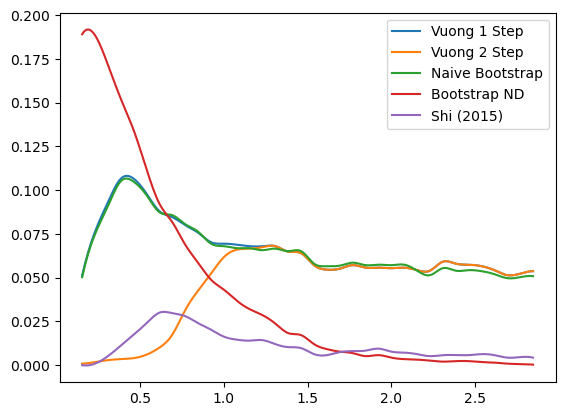

In [5]:
def create_fig(params,res,name='test.png'):
    results2 = np.array(res)
    
    col_labels = ['Param','Vuong 1 Step','Vuong 2 Step', 'Refinement Test','Shi (2015)', 'Naive Bootstrap','Bootstrap TIC','Bootstrap ND']



    np_results = np.concatenate((params.reshape(params.shape[0],1),results2[:,:,0]),axis=1)
    df_results = pd.DataFrame(data=np_results,columns=col_labels)
    df_results.to_csv("paper_figs3/"+name[:-4]+".csv")
    
    ma2 = lambda x : np.convolve(x,np.ones(smoothing)/smoothing, mode='valid')
    params_new = np.linspace( ma2(params).min(),  ma2(params).max(), 300) 
    interp = lambda x: make_interp_spline(ma2(params), ma2(x), k=3)(params_new)


    plt.plot(params_new, interp(1-results2[:,0,0]) ,label='Vuong 1 Step')
    plt.plot(params_new, interp(1-results2[:,1,0]) ,label='Vuong 2 Step')
    
    if not skip_boot:
        plt.plot(params_new,interp(1-results2[:,4,0]),label='Naive Bootstrap')
        plt.plot(params_new,interp(1-results2[:,6,0]),label='Bootstrap ND')
        
    if not skip_shi:
        plt.plot(params_new,interp(1-results2[:,3,0]),label='Shi (2015)')

    plt.legend()
    plt.savefig('paper_figs/'+name,dpi=300)
    plt.show()

name = 'size_nobs%s_c1%s_c2%s_trials%s.png'%(nobs,c1,c2,trials)
create_fig(betas,results,name=name)

# Power stuff

var//varnd//right//left 0.901771884862367 0.901771884862367 -8.455657291669395 -8.85095479713624
-2.766709492496631 -0.03447897480015657 1.2089019547470845
-2.8138127682077454 -0.03447897480015657 1.1610872375805097
---
var//varnd//right//left 1.1330980580565666 1.1330980580565666 -12.906422544210873 -13.337765781054541
-2.877528591637149 -0.04304728869697831 0.8779388568978435
-2.9180006891705785 -0.04304728869697831 0.8373359608830704
---
var//varnd//right//left 0.3442462031082197 0.3442462031082197 -14.828958022769305 -15.261585035367458
-6.374947600507585 -0.05083858901620583 -2.3203904531653787
-6.501227108689497 -0.05083858901620583 -2.4392990298627493
---
var//varnd//right//left 1.1283483865178072 1.1283483865178072 -7.270901659221788 -7.678745630643811
-2.7142289777660293 -0.029664387301122457 1.377692753148146
-2.7509530140033873 -0.029664387301122457 1.340371177884001
---
var//varnd//right//left 5.2226525971150535 5.2226525971150535 48.31905818424744 47.87579232606125
-1.1779

var//varnd//right//left 1.555200982209392 1.555200982209392 -6.991540679147639 -7.385942800363866
-2.3869102269741864 -0.02707728607692299 1.5423824837722409
-2.4150478986936115 -0.02707728607692299 1.518073600464976
---
var//varnd//right//left 1.6387743842285718 1.6387743842285718 -8.17299421543309 -8.614030366926995
-2.3869646228744106 -0.028515200738404207 1.5985206851677045
-2.4138450537456477 -0.028515200738404207 1.5704552415354167
---
var//varnd//right//left 1.515688721841064 1.515688721841064 -12.486310226833124 -13.078055321729947
-2.804479396493436 -0.023372177175422195 1.127549061381096
-2.849205110945513 -0.023372177175422195 1.0857454290965027
---
var//varnd//right//left 2.452076706554478 2.452076706554478 -1.6541814702444781 -2.1442198029533137
-2.0524307430710595 -0.006701176780631442 1.9878787270509322
-2.0746794289068577 -0.006701176780631442 1.9688091877609137
---
var//varnd//right//left 0.9150385344385412 0.9150385344385412 -8.161543861671356 -8.538689922074896
-2.83

var//varnd//right//left 1.3033278008374551 1.3033278008374551 -9.080920421093444 -9.547954439012399
-2.453277036694639 -0.02724934501498063 1.2154634373122721
-2.485846483960682 -0.02724934501498063 1.17708124060806
---
var//varnd//right//left 0.34470807282948057 0.34470807282948057 -10.599221765994425 -11.014704602485743
-5.123534211039521 -0.03978967467731452 -1.0207517355641273
-5.252054044867165 -0.03978967467731452 -1.1382994986652188
---
var//varnd//right//left 1.42599942203031 1.42599942203031 -5.504661658678577 -5.879105871898932
-2.290219449983682 -0.024067509591398896 1.672346594185584
-2.3173058277838914 -0.024067509591398896 1.6439761307589067
---
var//varnd//right//left 1.2068196733014362 1.2068196733014362 -7.0903544927990865 -7.500464022040395
-2.444814304271791 -0.028581441134620654 1.4732332904823127
-2.477387835657075 -0.028581441134620654 1.4398908930586163
---
var//varnd//right//left 0.894102498558152 0.894102498558152 -10.503290453738428 -10.982963485607641
-3.1095

var//varnd//right//left 0.5683771829729101 0.5683771829729101 -14.93042368661684 -15.488518793850417
-4.7269170880927645 -0.03051539841632101 -0.5650062848126686
-4.827125508554753 -0.03051539841632101 -0.6595193646136828
---
var//varnd//right//left 2.7477336329303763 2.7477336329303763 -0.7524624857388434 -1.3053735369894242
-1.9610093564778202 -0.005530047728595113 1.8223177038106968
-1.9799488849607723 -0.005530047728595113 1.8037169946527414
---
var//varnd//right//left 4.295833396646734 4.295833396646734 33.197073329323004 32.81279879621156
-1.227218396217812 0.12304215361505848 2.6451371331665015
-1.236102424640922 0.12304215361505848 2.6365241253564715
---
var//varnd//right//left 0.7724312938335832 0.7724312938335832 -12.240715566038357 -12.57480944283635
-3.3461810236033447 -0.07247659119000395 0.4742438582188758
-3.3863380430981462 -0.07247659119000395 0.43034688508031405
---
var//varnd//right//left 0.3873887515507581 0.3873887515507581 -12.263362254518075 -12.743902692589261
-

var//varnd//right//left 2.695502865031542 2.695502865031542 -5.431207175597807 -5.9545544705016225
-2.2850319052495434 -0.00837454564631792 1.8014198549276597
-2.3039398245033893 -0.00837454564631792 1.7827744046126321
---
var//varnd//right//left 1.0870411588223055 1.0870411588223055 -11.484286359856085 -11.922092019562342
-3.0468343830597084 -0.03520290075647585 0.9472522454571113
-3.084538337791355 -0.03520290075647585 0.9068213140647295
---
var//varnd//right//left 2.2174887226127167 2.2174887226127167 -1.270852450604508 -1.6879373163403733
-2.0028345099924247 -0.0026075080611505917 1.9384226883530604
-2.0207870297914483 -0.0026075080611505917 1.9200487228122929
---
var//varnd//right//left 4.2851939845203235 4.2851939845203235 23.25157416364237 22.799537274252554
-1.532680481802848 0.06755160540716854 2.331028061302493
-1.5441635858371048 0.06755160540716854 2.3201380609196933
---
var//varnd//right//left 1.325816854743302 1.325816854743302 -4.200658030960832 -4.558211193032548
-2.333

var//varnd//right//left 1.13813133268109 1.13813133268109 -9.922282990828862 -10.410248380642155
-2.7006091171359126 -0.02910284706728444 1.0975432398639198
-2.7403888311512237 -0.02910284706728444 1.0562537229208209
---
var//varnd//right//left 3.73590972080113 3.73590972080113 11.640155296125094 11.103212404267769
-1.6344440435370702 0.022069673808818517 2.290778782950978
-1.6496102412523517 0.022069673808818517 2.277418006705502
---
var//varnd//right//left 0.9671955591495999 0.9671955591495999 -9.27721498214573 -9.714384760870677
-2.8766285045851205 -0.03186730585816762 0.9556529657576913
-2.917959352736186 -0.03186730585816762 0.9087471495964857
---
var//varnd//right//left 1.7622783446888268 1.7622783446888268 -3.4346744762464905 -3.8338467181545077
-2.0993977195603297 -0.013587961322364513 1.7556765798592342
-2.1210854507325494 -0.013587961322364513 1.733208629117982
---
var//varnd//right//left 0.507228157385557 0.507228157385557 -14.891589069733573 -15.477353872123896
-5.143135185

var//varnd//right//left 2.7746867079974327 2.7746867079974327 0.5286223979947897 -0.0006757717690911704
-1.9757509221411065 -0.0017727373130556729 1.9067295938507538
-1.992051455709877 -0.0017727373130556729 1.8866321594060895
---
var//varnd//right//left 3.7071952425305006 3.7071952425305006 10.20300490318472 9.677125908924737
-1.7870878040405733 0.023259813866425106 2.259427442204441
-1.8005000956849342 0.023259813866425106 2.2446674259706283
---
var//varnd//right//left 1.330769920682641 1.330769920682641 -8.43304095578619 -8.907441609700639
-2.6727497029699583 -0.025705627431579635 1.2178894271638676
-2.709841139553332 -0.025705627431579635 1.1848187244129962
---
var//varnd//right//left 0.6669293120614627 0.6669293120614627 -11.103053803480881 -11.521367952874673
-3.583042342866428 -0.04236275213830913 0.30200036221397464
-3.6454316167829663 -0.04236275213830913 0.2383670753073663
---
var//varnd//right//left 1.0078223589582718 1.0078223589582718 -10.757483179051341 -11.23837898473320

var//varnd//right//left 1.0584239696598319 1.0584239696598319 -9.204723411462048 -9.657072519800803
-2.782663665050525 -0.030574142137592523 1.0850667880193583
-2.825190937544243 -0.030574142137592523 1.0378086150936292
---
var//varnd//right//left 1.1945441016685223 1.1945441016685223 -10.834515585561418 -11.35403117454428
-2.651589370621394 -0.027024582726815523 1.1446944780557142
-2.6890598075202594 -0.027024582726815523 1.0990164324389151
---
var//varnd//right//left 0.3417476057673144 0.3417476057673144 -12.751004550460427 -13.229365852287952
-5.959080639707046 -0.03826592695841702 -1.4473938387817233
-6.119372384781668 -0.03826592695841702 -1.570396159305353
---
var//varnd//right//left 1.2071971812074482 1.2071971812074482 -13.565663950057615 -14.090749932488764
-3.222827971058043 -0.0308539859144959 0.953814482569014
-3.262764547171075 -0.0308539859144959 0.9079131663666568
---
var//varnd//right//left 1.0453044428328255 1.0453044428328255 -7.159912604352935 -7.559501086666434
-2.6

var//varnd//right//left 0.7083804097963634 0.7083804097963634 -9.28037327545723 -9.647485598518111
-3.3881003337917526 -0.04796916592173888 0.6262390094369596
-3.445364671702748 -0.04796916592173888 0.5733804455720386
---
var//varnd//right//left 2.761875492068698 2.761875492068698 5.486603948102893 5.0499915835405
-1.7414026318546856 0.011566342037834547 2.015185446973792
-1.7569524802675887 0.011566342037834547 2.0006362983370627
---
var//varnd//right//left 3.2082804169697416 3.2082804169697416 4.601411003125282 4.05952477311202
-1.9798462242730386 0.005253564493423584 2.087326127158382
-1.9973420783182352 0.005253564493423584 2.071090816312791
---
var//varnd//right//left 0.2103526993827074 0.2103526993827074 -16.7771065884387 -17.39723324324255
-10.18817953281355 -0.027945858238293753 -5.812475313818889
-10.504967085836151 -0.027945858238293753 -6.108980509934852
---
var//varnd//right//left 0.7034394123714794 0.7034394123714794 -11.23755619724949 -11.621433062339776
-3.37962725477660

var//varnd//right//left 0.488429682553985 0.488429682553985 -9.268000065422093 -9.635948369091741
-3.9258171890249556 -0.0440640555102859 -0.0036227493930443143
-4.008487868589576 -0.0440640555102859 -0.07204722879635106
---
var//varnd//right//left 0.82413747254228 0.82413747254228 -13.237462832330719 -13.788276268304456
-3.641987964976537 -0.030754904581755237 0.39515566191075124
-3.712035745511962 -0.030754904581755237 0.3293351508097113
---
var//varnd//right//left 0.14649588017999227 0.14649588017999227 -15.40536191664045 -15.995882536626171
-13.489167963722368 -0.03018907724678352 -8.248250955374973
-13.962202236506066 -0.03018907724678352 -8.62443950160649
---
var//varnd//right//left 1.1265669889665295 1.1265669889665295 -10.901297719957267 -11.420675413416662
-2.981503225284448 -0.028373184692691473 1.0844963732121677
-3.025348094155048 -0.028373184692691473 1.0435887521681144
---
var//varnd//right//left 2.6435144338444974 2.6435144338444974 2.6692800333205224 2.2106140822576017


var//varnd//right//left 1.7697035038522861 1.7697035038522861 -5.305779770591421 -5.763198729239003
-2.384025247828404 -0.019540699708359345 1.6921400637619166
-2.410251761900915 -0.019540699708359345 1.6660709625795458
---
var//varnd//right//left 2.693856355184256 2.693856355184256 4.8624975530611785 4.434704488155611
-1.6987971444628465 0.013695462483682613 2.0206143038915694
-1.712845876652119 0.013695462483682613 2.0038052436457865
---
var//varnd//right//left 2.654078052056703 2.654078052056703 1.5222573535317305 1.0660422960857514
-1.9584540220900561 0.004860878008878777 1.9815117492007803
-1.9746220111281714 0.004860878008878777 1.9647878774441687
---
var//varnd//right//left 0.06748368550972171 0.10000000000000002 -11.305421513332393 -11.730795893244725
-12.595568603311111 -0.04215337565376774 -9.965747788078083
-13.020942983223446 -0.04215337565376774 -10.391122167990417
---
var//varnd//right//left 2.395023668809483 2.395023668809483 3.223493298896509 2.826233030348807
-1.875292

var//varnd//right//left 0.8043584816414144 0.8043584816414144 -9.779839666147065 -10.202755622868068
-3.228007257746387 -0.03556390728636518 0.8055482142675711
-3.2847498962605512 -0.03556390728636518 0.7527616678230568
---
var//varnd//right//left 0.28260820383213753 0.28260820383213753 -14.536082712468076 -15.09024045331194
-7.451372358415215 -0.0330199636363681 -2.9751411245311687
-7.663167779613378 -0.0330199636363681 -3.1666723572505178
---
var//varnd//right//left 1.06453876128528 1.06453876128528 -8.189944709294421 -8.61267426643674
-3.103671505880237 -0.031217099100067956 1.240743860425558
-3.147902716210757 -0.031217099100067956 1.2008836913247616
---
var//varnd//right//left 2.844588671853751 2.844588671853751 11.339496697678468 10.98730822186295
-1.6982551529995673 0.050399208110481736 2.491727418079833
-1.7102018681930098 0.050399208110481736 2.478591254857615
---
var//varnd//right//left 4.607512054107156 4.607512054107156 26.62315891277378 26.130311926755617
-1.48699400001127

var//varnd//right//left 0.412952368733508 0.412952368733508 -13.009635002800556 -13.49146403734239
-4.960215696370524 -0.03639670212481687 -1.1297871279181386
-5.088064554861615 -0.03639670212481687 -1.2496255240223633
---
var//varnd//right//left 0.6155773307655279 0.6155773307655279 -11.014400287734905 -11.490151981643148
-3.895820436339092 -0.03454430002137071 0.23819260614018978
-3.9848426315791103 -0.03454430002137071 0.15574211468863286
---
var//varnd//right//left 1.999219657129298 1.999219657129298 -4.626569068604374 -5.125043672848559
-2.082946361364406 -0.014036666333161831 1.8006529535519933
-2.109457129348902 -0.014036666333161831 1.7758440637803767
---
var//varnd//right//left 1.1905332214315825 1.1905332214315825 -9.452464942864395 -9.900809219190633
-2.747393355272217 -0.02946077667966011 1.1871563397128204
-2.7855945467493 -0.02946077667966011 1.1506593386643984
---
var//varnd//right//left 2.03665232832429 2.03665232832429 -5.107179983672446 -5.601074503004371
-2.374665691

var//varnd//right//left 1.3503230245824276 1.3503230245824276 -8.764307846873551 -9.218646224471446
-2.474181434625916 -0.025749900316038903 1.3205604458075786
-2.508065987599681 -0.025749900316038903 1.285973658135659
---
var//varnd//right//left 0.1411335563668088 0.1411335563668088 -13.721846855729968 -14.224857995936025
-12.11776086303498 -0.036712537646662095 -7.646101340958932
-12.514786483049878 -0.036712537646662095 -7.981989510913166
---
var//varnd//right//left 4.023957820175681 4.023957820175681 9.335578090871493 8.782889230949165
-1.745255935093026 0.0203663512938447 2.1525678710078613
-1.759165648604425 0.0203663512938447 2.1387965109807148
---
var//varnd//right//left 6.066158821582555 6.066158821582555 59.373639259276736 58.90170260079844
-1.1321770905438435 0.14709792445181702 2.8414462368045093
-1.1404920473646556 0.14709792445181702 2.8332642881575656
---
var//varnd//right//left 0.7574584503514192 0.7574584503514192 -9.705159662357167 -10.111155446186338
-3.4627941273201

var//varnd//right//left 5.19011517725881 5.19011517725881 37.45940200498252 36.96472184152341
-1.4528351313920203 0.0870470021598118 2.565148652544211
-1.4620782241429622 0.0870470021598118 2.555558697497635
---
var//varnd//right//left 0.8159280855318279 0.8159280855318279 -10.976084831528246 -11.451434166596435
-2.979684555117841 -0.031852086545769494 0.7053980474404683
-3.0405124506543495 -0.031852086545769494 0.6449559066368691
---
var//varnd//right//left 0.7435704611371469 0.7435704611371469 -10.121483384867854 -10.5541879959763
-3.412172893248627 -0.03493986159372274 0.5869185214810843
-3.483828443424546 -0.03493986159372274 0.5277502690878281
---
var//varnd//right//left 2.4540629888669065 2.4540629888669065 -2.848836057694397 -3.386475503026112
-2.161894298542304 -0.007696320415324358 1.817409678036311
-2.1871010966859767 -0.007696320415324358 1.795872155591626
---
var//varnd//right//left 3.3926521030218457 3.3926521030218457 14.627425728407587 14.201902186487642
-1.7431546570207

var//varnd//right//left 5.135595598871856 5.135595598871856 52.270977919496666 51.877651998733
-1.0948902559814873 0.17606866526594778 2.843394670683785
-1.1034169238259832 0.17606866526594778 2.835288729142127
---
var//varnd//right//left 0.14137756028791865 0.14137756028791865 -11.905627358924892 -12.362962988969151
-10.579220470655285 -0.03860131368266167 -6.437555496257944
-10.93180274296979 -0.03860131368266167 -6.753850452810736
---
var//varnd//right//left 0.1052387580544583 0.10609376306653195 -9.37081103398987 -9.723594826990452
-10.857685614257115 -0.05071162273637488 -6.74172098289736
-11.210246174509992 -0.05071162273637488 -7.049612646921293
---
var//varnd//right//left 1.9097515724449694 1.9097515724449694 -4.525965299483687 -4.952081538728393
-2.4026485278031284 -0.013486660880293072 1.7932794265856857
-2.424163173409058 -0.013486660880293072 1.768752433217475
---
var//varnd//right//left 1.467513494564094 1.467513494564094 -3.7744776842923375 -4.125360297046235
-2.217254551

var//varnd//right//left 2.0246864896870402 2.0246864896870402 -2.268564664047158 -2.6832314704695315
-2.1645041071348206 -0.008094078415867168 1.7913595020760547
-2.185046863751353 -0.008094078415867168 1.772773459959336
---
var//varnd//right//left 2.8238103739977483 2.8238103739977483 7.237261998547715 6.838488994794781
-1.8350761015178418 0.026482903134197912 2.3892326025122412
-1.8499699616178524 0.026482903134197912 2.375102496233538
---
var//varnd//right//left 1.706040918275175 1.706040918275175 -2.2686176661727693 -2.6219322375403946
-2.1944642060828925 -0.009799031019009112 2.0068277829781853
-2.2163835021534286 -0.009799031019009112 1.9836192746271448
---
var//varnd//right//left 1.4861218627193298 1.4861218627193298 -10.570588026173958 -11.12722480491089
-2.7270113370449263 -0.023203777433028337 1.1656951762861254
-2.7622963666937257 -0.023203777433028337 1.1286442918593602
---
var//varnd//right//left 0.2273762116606038 0.2273762116606038 -14.122314522369056 -14.586240997196457

var//varnd//right//left 1.8436883326976081 1.8436883326976081 -3.98903248793903 -4.431791011139819
-2.410335997998371 -0.015256683035055889 1.732784884805615
-2.434051218277559 -0.015256683035055889 1.7095612117775292
---
var//varnd//right//left 1.4032719068267865 1.4032719068267865 -11.722476683276323 -12.3146991255793
-2.905185607142482 -0.024046819034350877 1.077312710844719
-2.9503043399716224 -0.024046819034350877 1.037307787744765
---
var//varnd//right//left 1.3251588139771937 1.3251588139771937 -10.40275550007384 -10.927355505857344
-2.8905949491003673 -0.026043721976433416 1.436118114656297
-2.9292276748852792 -0.026043721976433416 1.3967554573143042
---
var//varnd//right//left 2.4445069601160787 2.4445069601160787 -6.983320871708388 -7.5760151717983915
-2.2977899747660833 -0.011769576823272012 1.6002093214894928
-2.3235688659232596 -0.011769576823272012 1.5749200920577666
---
var//varnd//right//left 6.187649331622999 6.187649331622999 78.960131366806 78.56425951140923
-0.84118

var//varnd//right//left 0.16671797818749845 0.16671797818749845 -11.037963768582442 -11.450831742128797
-9.066096590305518 -0.042824869233983286 -4.427946123789304
-9.333372676320732 -0.042824869233983286 -4.65771003968307
---
var//varnd//right//left 2.9692237821446312 2.9692237821446312 7.415482386790055 6.976266998683694
-1.59515900829729 0.022794661322421594 2.285719363276954
-1.6083736245627107 0.022794661322421594 2.2706210148029764
---
var//varnd//right//left 0.9218032532820429 0.9218032532820429 -14.346259463522308 -14.953134476474348
-3.2737249672915234 -0.026542439560175435 0.46672252642979895
-3.336334315250007 -0.026542439560175435 0.4044539157197415
---
var//varnd//right//left 4.003721235426688 4.003721235426688 23.15014599539603 22.723724173825648
-1.4903978870848504 0.07822194542283423 2.508408378552327
-1.5019241720207215 0.07822194542283423 2.4982269890404343
---
var//varnd//right//left 3.805880572802024 3.805880572802024 12.176654058335608 11.675034964082792
-1.7810720

var//varnd//right//left 1.229044958922033 1.229044958922033 -8.129132532450328 -8.547886888239525
-2.914105041860938 -0.027217514884666446 1.1922529379266726
-2.9496008172061243 -0.027217514884666446 1.1611880977691804
---
var//varnd//right//left 1.9516115748317693 1.9516115748317693 0.46403417818063225 0.08389401972993371
-2.1470016658282534 -0.004110687499215338 1.99460961107513
-2.1681472365567087 -0.004110687499215338 1.9745387190941794
---
var//varnd//right//left 0.9918361618733724 0.9918361618733724 -11.494929238108504 -12.00774835356489
-3.1479530659418775 -0.02897617350837076 0.8039092928527882
-3.1972973102025946 -0.02897617350837076 0.7490883377571004
---
var//varnd//right//left 2.97910011327929 2.97910011327929 6.42572543839421 5.959797134962974
-1.7347774560304927 0.01660880651451957 2.194373466656487
-1.751408409536727 0.01660880651451957 2.1796795355172165
---
var//varnd//right//left 2.9153089450724563 2.9153089450724563 0.45302721630264875 -0.1004971437898725
-1.99424313

var//varnd//right//left 1.2965424088729223 1.2965424088729223 -9.870806192473134 -10.345058811242305
-2.76512882211431 -0.028802830509573395 1.223722562588443
-2.8003635103395537 -0.028802830509573395 1.1807211952135632
---
var//varnd//right//left 1.5189650037875526 1.5189650037875526 -14.126995875751177 -14.619425289169108
-3.079050718177557 -0.03772273080875443 1.2774134005036089
-3.113453265060492 -0.03772273080875443 1.2483820899031557
---
var//varnd//right//left 2.8393820353676773 2.8393820353676773 1.9313226754822694 1.4943674510843317
-1.9512232918647974 0.008220557133548282 1.9996340994837214
-1.966888286154545 0.008220557133548282 1.9850543558899385
---
var//varnd//right//left 1.0475768867169104 1.0475768867169104 -7.608167894327413 -7.9744889321152845
-2.7177086927663745 -0.03507023665840621 1.3012410217169286
-2.7550047842374745 -0.03507023665840621 1.2642845797075284
---
var//varnd//right//left 0.06677254776481312 0.10000000000000002 -10.379055124288465 -10.764777786476396


var//varnd//right//left 1.683186516985391 1.683186516985391 -5.371278312256036 -5.797895642732967
-2.4138437856270873 -0.017832035839188205 1.5864263081715066
-2.439204597950895 -0.017832035839188205 1.5616509728687658
---
var//varnd//right//left 0.9278294339660165 0.9278294339660165 -15.214947631169812 -15.828754936138663
-3.7180487870729175 -0.027366373828875693 0.3345934570052572
-3.7910882626053817 -0.027366373828875693 0.27463813275320836
---
var//varnd//right//left 1.015568277477853 1.015568277477853 -11.106661374986482 -11.569320234391018
-3.035709788097883 -0.033076576547555726 0.7803603848020969
-3.085977492572494 -0.033076576547555726 0.7370019186884728
---
var//varnd//right//left 3.317524028091032 3.317524028091032 17.58034242458984 17.225154882372692
-1.569143493408805 0.08148178208619852 2.295785488694405
-1.5801336471800982 0.08148178208619852 2.28556624922734
---
var//varnd//right//left 5.444059288653325 5.444059288653325 41.45689022702635 40.952438660408454
-1.154788896

var//varnd//right//left 0.8045977594587559 0.8045977594587559 -11.40097145039849 -11.884716041677425
-3.43617647913492 -0.03300103069643895 0.5371085546738745
-3.5009082201160022 -0.03300103069643895 0.47359965593295406
---
var//varnd//right//left 1.7909015655921834 1.7909015655921834 -6.094930640740393 -6.545972090260766
-2.2315955456160794 -0.02043257881199114 1.6802944458435307
-2.25634366843529 -0.02043257881199114 1.6526949738123697
---
var//varnd//right//left 3.482972771538037 3.482972771538037 9.631618171201259 9.135416938427518
-1.810445535788539 0.022770273021081422 2.171490419429237
-1.8249005361397561 0.022770273021081422 2.1565399123172533
---
var//varnd//right//left 0.2642556617738393 0.2642556617738393 -16.61576949347801 -17.233397557178915
-8.59214037441456 -0.028845546640858432 -4.112097281242351
-8.85361387753462 -0.028845546640858432 -4.3328797358067455
---
var//varnd//right//left 1.8473843633805618 1.8473843633805618 2.0405548104767393 1.7234094272246303
-1.974650378

var//varnd//right//left 0.3902225423089106 0.3902225423089106 -14.169903322998767 -14.696802172950502
-5.6811121427966995 -0.033974290194717906 -1.6359207000000962
-5.838130409414135 -0.033974290194717906 -1.765679098516536
---
var//varnd//right//left 0.17752806660300724 0.17752806660300724 -10.51116240745318 -10.915785387317895
-7.963517899864575 -0.043015027381912437 -3.92206565873771
-8.202014557538238 -0.043015027381912437 -4.1469691455444195
---
var//varnd//right//left 1.238579747259141 1.238579747259141 -9.001810027774676 -9.446120339618469
-2.6778217168770047 -0.03133238361009707 1.3134168549669782
-2.7125539615821515 -0.03133238361009707 1.2778764945340857
---
var//varnd//right//left 1.9438097213647039 1.9438097213647039 -3.9927143058407077 -4.442515946000499
-2.3392944223867556 -0.012544426007563128 1.8301414463733643
-2.36300647410757 -0.012544426007563128 1.806941732200427
---
var//varnd//right//left 5.607090041221092 5.607090041221092 62.23536273505065 61.82856229651441
-1.

var//varnd//right//left 4.921716133495028 4.921716133495028 35.361283937730384 34.88958636434769
-1.400861085132454 0.08683570947894431 2.681828684212374
-1.412548405260554 0.08683570947894431 2.6719886307364367
---
var//varnd//right//left 0.1551100911503838 0.1551100911503838 -10.873821415034703 -11.283730529748631
-9.438270171578129 -0.04155785047210064 -4.917017491663087
-9.726387060649422 -0.04155785047210064 -5.158997835568566
---
var//varnd//right//left 3.1434529461648926 3.1434529461648926 3.700128391860345 3.181782032853442
-1.9082951826440138 0.007994903319417044 2.0349117144019235
-1.925551984942986 0.007994903319417044 2.01947484109535
---
var//varnd//right//left 2.229282200880373 2.229282200880373 1.1604920738254634 0.7771788800396295
-1.9590392109078298 0.005403783454043924 2.0843352865132876
-1.974820868897851 0.005403783454043924 2.0660036166322735
---
var//varnd//right//left 1.0384799892031937 1.0384799892031937 -12.77526988067648 -13.314062438165037
-2.9271018395198123

var//varnd//right//left 3.882458639639429 3.882458639639429 10.674509585070004 10.13400850197949
-1.7537981714668416 0.02311678769841273 2.1661837483123687
-1.768316955500061 0.02311678769841273 2.1529767576583754
---
var//varnd//right//left 2.4872696704000514 2.4872696704000514 -5.035602495532569 -5.565605684256242
-2.080588488339559 -0.013607720089425047 1.9189833849084679
-2.101670671618239 -0.013607720089425047 1.8956420210627878
---
var//varnd//right//left 1.9336235751020163 1.9336235751020163 -2.460924244644176 -2.828863471272229
-1.9934871955273459 -0.00930385319030087 1.9152035990408376
-2.0120010343122767 -0.00930385319030087 1.8947900243157674
---
var//varnd//right//left 1.9991642157590581 1.9991642157590581 -1.1084894608908737 -1.4976237275394155
-1.9607123075552986 -0.003669844074633975 1.825603611289829
-1.9804383390615623 -0.003669844074633975 1.8050066433734744
---
var//varnd//right//left 0.8067653374298153 0.8067653374298153 -13.976138150405216 -14.557321507927913
-3.76

var//varnd//right//left 3.3471908589809773 3.3471908589809773 16.80080593922692 16.41331920786864
-1.4040111449840977 0.06652447625745403 2.398792634585293
-1.4156633429464396 0.06652447625745403 2.387115520210276
---
var//varnd//right//left 3.588288100520266 3.588288100520266 7.136175987621914 6.549732582604016
-1.7678561327442497 0.009220118613620995 2.03364936310771
-1.7849015358679812 0.009220118613620995 2.0172813947566515
---
var//varnd//right//left 3.6479971778938993 3.6479971778938993 20.989339327536136 20.60645435101087
-1.497921451479965 0.0758294085791193 2.4287356865348313
-1.5078659766471814 0.0758294085791193 2.417236993300708
---
var//varnd//right//left 2.0332118936553814 2.0332118936553814 -1.1763830019736319 -1.5896210339568602
-2.080962912139354 -0.005978707739876248 1.9098679022516802
-2.1015466593470142 -0.005978707739876248 1.889557805493232
---
var//varnd//right//left 3.639920517392596 3.639920517392596 9.500265916033662 8.980973198482662
-1.6670819550650027 0.020

var//varnd//right//left 1.2340168563205434 1.2340168563205434 -13.412943067578635 -13.993629961965715
-3.152301194515005 -0.0279568007639246 0.9597374668121023
-3.2022250444812808 -0.0279568007639246 0.9151282091504953
---
var//varnd//right//left 3.440266078529154 3.440266078529154 7.85563765899441 7.3535429122934515
-1.7151988663283564 0.020291173464827974 2.2362293803620545
-1.7301878250995937 0.020291173464827974 2.219923995609926
---
var//varnd//right//left 2.9092965254511336 2.9092965254511336 5.917938948675883 5.492608776106608
-1.773830294947528 0.019183363628620644 2.21061143731078
-1.7886450823037487 0.019183363628620644 2.196904091213184
---
var//varnd//right//left 0.4577112732368514 0.4577112732368514 -11.29322678055648 -11.73419694214391
-4.469110602543644 -0.03855265396735882 -0.5004082576601153
-4.569189260906326 -0.03855265396735882 -0.5914416480468818
---
var//varnd//right//left 1.009885905797752 1.009885905797752 -11.020407242965044 -11.508128678579476
-2.9816915478867

var//varnd//right//left 1.9112441517992806 1.9112441517992806 5.222430696354801 4.941815231677696
-1.696722415676977 0.03269834055670876 2.171225672016267
-1.7118166664968824 0.03269834055670876 2.156145677552978
---
var//varnd//right//left 1.0590630317405927 1.0590630317405927 -15.061970417135477 -15.688875197625173
-3.404564790046953 -0.027506513421913188 0.564576044217302
-3.46648483649781 -0.027506513421913188 0.5091022851049135
---
var//varnd//right//left 1.6956519660351055 1.6956519660351055 -7.4313149957119755 -7.892950624266702
-2.313936383206984 -0.021546191983774405 1.5663480581080467
-2.339790813084907 -0.021546191983774405 1.5397770674959694
---
var//varnd//right//left 0.21482116133374257 0.21482116133374257 -11.126762771855441 -11.539956607314314
-7.178408582074524 -0.04158487180181221 -3.2954887157324984
-7.3783759516081355 -0.04158487180181221 -3.4697103747941695
---
var//varnd//right//left 1.2796741488437529 1.2796741488437529 -7.740588078705636 -8.1675119027582
-2.5159

var//varnd//right//left 0.22155889392134254 0.22155889392134254 -11.433461356093467 -11.862492795933319
-7.015855173885891 -0.040837413089619926 -3.3225425423617647
-7.1998024562158305 -0.040837413089619926 -3.51915786289009
---
var//varnd//right//left 1.3526747609853937 1.3526747609853937 -9.336983983346592 -9.78504334010163
-2.6284384114255093 -0.030935988149796072 1.2567216019862808
-2.6635951767805977 -0.030935988149796072 1.2236750372963188
---
var//varnd//right//left 0.84005929183807 0.84005929183807 -8.735994225619338 -9.142440256369845
-3.0311822655225655 -0.03457727601427563 0.929645561131366
-3.0792518599474876 -0.03457727601427563 0.8808685266660411
---
var//varnd//right//left 3.6315061136173927 3.6315061136173927 13.900713062778603 13.456104074051753
-1.742793203596759 0.03783015435794983 2.5573128425130958
-1.7562223678560769 0.03783015435794983 2.5451575568232987
---
var//varnd//right//left 1.40827459779144 1.40827459779144 -3.2710287558949767 -3.6108969923864898
-2.15213

var//varnd//right//left 1.125326803648993 1.125326803648993 -7.6508590771996525 -8.038033381537293
-2.549143266915542 -0.03098962368837614 1.2359929628691642
-2.5853065080537205 -0.03098962368837614 1.2006066935471527
---
var//varnd//right//left 1.6039558234399938 1.6039558234399938 -4.504079746173264 -4.8789655816854856
-2.3695634236480627 -0.017722719748146425 1.739474456105321
-2.3912826911954563 -0.017722719748146425 1.7171662301328463
---
var//varnd//right//left 0.8991914499613692 0.8991914499613692 -11.892892283612994 -12.4063594850727
-3.308045322691982 -0.03154334304489092 0.5893468492612796
-3.3682393834298034 -0.03154334304489092 0.536450359161437
---
var//varnd//right//left 0.768719973735472 0.768719973735472 -8.926318886372195 -9.298877676419206
-3.1582595217169502 -0.04120490626767669 0.8361734336515168
-3.2070700704426987 -0.04120490626767669 0.7880076313106218
---
var//varnd//right//left 0.15648504317842651 0.15648504317842651 -10.60527002354986 -11.023153190281565
-8.91

var//varnd//right//left 3.633168010879631 3.633168010879631 9.581045972467567 9.061100760976817
-1.81277898935257 0.023036773639156218 2.1971238610298847
-1.8267135699234192 0.023036773639156218 2.182611995086798
---
var//varnd//right//left 3.5016583577615537 3.5016583577615537 9.273227793044404 8.7838651584043
-1.6365657531393618 0.02307927515394268 2.3834380733981146
-1.6511194295273135 0.02307927515394268 2.369223209588103
---
var//varnd//right//left 5.303854106292967 5.303854106292967 49.198421392454705 48.792203348766826
-1.2761028130064975 0.17114947455984494 2.7510824045818665
-1.284357124150214 0.17114947455984494 2.7435103772999048
---
var//varnd//right//left 4.0608841130928734 4.0608841130928734 25.175332708255798 24.757140408843014
-1.4775887561813164 0.0857226001357668 2.409740869987826
-1.4883775407583932 0.0857226001357668 2.3993312610269983
---
var//varnd//right//left 0.28986079760649436 0.28986079760649436 -10.99303262111829 -11.363369968388458
-5.6494242131779355 -0.05

var//varnd//right//left 0.9626329976775896 0.9626329976775896 -9.821797183043978 -10.258662104982394
-2.942766138461712 -0.0327237963183756 1.1200564922817513
-2.984271309275735 -0.0327237963183756 1.0703105307985357
---
var//varnd//right//left 2.041413764999631 2.041413764999631 -3.0956276703943066 -3.501631351459478
-2.282351285885803 -0.00791677702224124 1.7994259219977204
-2.3016369325629675 -0.00791677702224124 1.7793648636110697
---
var//varnd//right//left 0.5355623473704371 0.5355623473704371 -15.87063728117462 -16.466075048716935
-4.969579181063283 -0.029497704370769307 -0.9246166038654946
-5.1086731941149965 -0.029497704370769307 -1.036598241926207
---
var//varnd//right//left 1.3785216786709689 1.3785216786709689 -6.446485508788864 -6.850389558596908
-2.516694522023686 -0.026755314859498103 1.4986818655279552
-2.5440787326298495 -0.026755314859498103 1.4704496418478386
---
var//varnd//right//left 0.7594975115305267 0.7594975115305267 -8.619569059290273 -8.989542994347484
-3.16

var//varnd//right//left 4.172619548746171 4.172619548746171 26.25714500372397 25.841362445290596
-1.3103934323196296 0.08614987212119302 2.4815560485715547
-1.3189992809658648 0.08614987212119302 2.471462841021757
---
var//varnd//right//left 2.111255086235493 2.111255086235493 -3.9332372991664175 -4.378132499213892
-2.162906489570445 -0.008699262826976455 1.7992684108387176
-2.187097702710299 -0.008699262826976455 1.7774846518649474
---
var//varnd//right//left 0.7015765009425173 0.7015765009425173 -10.8329152725463 -11.285915580291462
-3.6066225801867806 -0.035486102217824195 0.441744810751401
-3.679662352462702 -0.035486102217824195 0.37082234105289164
---
var//varnd//right//left 0.36509201913687456 0.36509201913687456 -13.473759142392376 -13.978557151356124
-5.963955752115777 -0.03590899737398201 -1.6616909858686633
-6.09583108470784 -0.03590899737398201 -1.8011344033483638
---
var//varnd//right//left 7.0648132856549735 7.0648132856549735 88.19412521944626 87.73236073882694
-0.881517

var//varnd//right//left 3.3309707628886716 3.3309707628886716 12.533418618825806 12.10630479089855
-1.7616400117333362 0.04029177109932144 2.244476795482853
-1.7748410076175853 0.04029177109932144 2.2326566715337517
---
var//varnd//right//left 2.007370710404362 2.007370710404362 -4.120899879126228 -4.577875584194054
-2.0968870073447916 -0.010487000868978337 1.7483234299620674
-2.1189505194193092 -0.010487000868978337 1.7257585364157702
---
var//varnd//right//left 2.580754264697329 2.580754264697329 -0.2484549514068656 -0.6951456924093516
-1.9391137102907332 -0.002970132981537787 1.9337015997478748
-1.957616150790965 -0.002970132981537787 1.916273783657566
---
var//varnd//right//left 0.9883566267764313 0.9883566267764313 -7.358827367334329 -7.725833397620412
-2.7035282004719665 -0.034090700574623385 1.4129527520616578
-2.7403476774805355 -0.034090700574623385 1.374231461960171
---
var//varnd//right//left 4.300437839732063 4.300437839732063 19.556098593644887 19.045417433133576
-1.660793

var//varnd//right//left 1.4220926897703579 1.4220926897703579 -9.370201833928743 -9.881179069616945
-2.455646348537711 -0.02421341124016256 1.3968818099810445
-2.4937895591890062 -0.02421341124016256 1.3613997202123245
---
var//varnd//right//left 0.7649790085481039 0.7649790085481039 -7.580130789672521 -7.943716183684279
-2.898554334611535 -0.038306461470865326 1.117867367860135
-2.947543139984834 -0.038306461470865326 1.0687080260733752
---
var//varnd//right//left 1.0698795069398328 1.0698795069398328 -12.974597019456338 -13.536409014768106
-3.2654464336221136 -0.026944620887599885 0.7803027773834588
-3.3171608376734354 -0.026944620887599885 0.7304707668222942
---
var//varnd//right//left 0.4554031320239469 0.4554031320239469 -10.001478117359994 -10.39978971869079
-4.409265143715011 -0.04442464635945669 -0.205144509598685
-4.502893622804993 -0.04442464635945669 -0.2979020614266825
---
var//varnd//right//left 1.6482329822175859 1.6482329822175859 -5.05585022393113 -5.486353854578307
-2.

var//varnd//right//left 2.6503591043935573 2.6503591043935573 1.7967104863350465 1.3650805876248682
-1.807082506674202 0.0055011606283451335 2.11896402137201
-1.822450512941113 0.0055011606283451335 2.099645537037776
---
var//varnd//right//left 1.390674340482156 1.390674340482156 -8.494514670652123 -8.968042065317139
-2.711225319797701 -0.02479046832950274 1.544129927710542
-2.746641111505089 -0.02479046832950274 1.5107997487240228
---
var//varnd//right//left 0.8379799911656829 0.8379799911656829 -10.806646555407454 -11.264561858486625
-3.12469087663275 -0.03416410326223502 0.7741532773464174
-3.175367956215326 -0.03416410326223502 0.7225413899899404
---
var//varnd//right//left 0.6442664004273975 0.6442664004273975 -11.803682686355852 -12.207509755768351
-3.8637710589998835 -0.04819288606243138 0.20462017783562766
-3.922732357919279 -0.04819288606243138 0.13745284959819018
---
var//varnd//right//left 3.218476476103184 3.218476476103184 6.681454604944578 6.208273962528838
-1.67519216105

var//varnd//right//left 5.889268540164535 5.889268540164535 61.006733362135314 60.5734227232286
-1.129114628507488 0.18004851710698702 2.8291341272275763
-1.1362423233657726 0.18004851710698702 2.822069957802137
---
var//varnd//right//left 1.2220018995296245 1.2220018995296245 -10.236321427454866 -10.738013433812915
-2.8473745488692708 -0.027113106064375687 1.1611406152001622
-2.8881894199389784 -0.027113106064375687 1.1228431137032868
---
var//varnd//right//left 3.1752590301701415 3.1752590301701415 4.6707926827135005 4.163380287628219
-1.7851184148349681 0.009223908760847797 2.172750770033883
-1.8008996351869004 0.009223908760847797 2.1554782638890164
---
var//varnd//right//left 3.412601579373062 3.412601579373062 9.296614428965016 8.8043209239741
-1.7138172481684475 0.020793440565463697 2.504421699611656
-1.7288636128872585 0.020793440565463697 2.4868765028852486
---
var//varnd//right//left 0.7315947599695489 0.7315947599695489 -13.213376118700966 -13.723022670413084
-3.535447784197

var//varnd//right//left 6.479772059136089 6.479772059136089 68.66042870140107 68.17860385422176
-1.1006067813874472 0.16479544654091724 3.049270124643859
-1.1080205180640186 0.16479544654091724 3.041911232603309
---
var//varnd//right//left 1.7229226380856908 1.7229226380856908 -11.227474753088856 -11.764194684721463
-2.7552432438323873 -0.024502668289598014 1.3201757263846403
-2.787370796809943 -0.024502668289598014 1.2920920808653642
---
var//varnd//right//left 6.565391078345052 6.565391078345052 70.56616547558359 70.08730290381418
-1.0627584592085455 0.16722243160439662 2.970907147835568
-1.0703242047890866 0.16722243160439662 2.963021727994294
---
var//varnd//right//left 2.951698007826906 2.951698007826906 7.007708029168296 6.603481393484162
-1.8350078125230644 0.029066164660900257 2.1585162755106895
-1.8486408722892667 0.029066164660900257 2.1448721842074043
---
var//varnd//right//left 2.115905375514739 2.115905375514739 -5.5096239992769815 -5.9679530039758735
-2.217833925119007 -0

var//varnd//right//left 0.5296627567969944 0.5296627567969944 -18.41737709098659 -18.942534624117137
-5.346785978622351 -0.04493338051890056 -1.5295920601100848
-5.458813139397572 -0.04493338051890056 -1.6277344310296922
---
var//varnd//right//left 1.8388296111549323 1.8388296111549323 -3.0954799895953493 -3.4720867896989858
-2.1137247670407544 -0.014051109748814792 1.8433380167851852
-2.133204811480178 -0.014051109748814792 1.823810773134327
---
var//varnd//right//left 0.870651165506531 0.870651165506531 -11.563614771076075 -12.044743189467392
-3.400634574927984 -0.03313251581157244 0.6160266068230967
-3.455173532407837 -0.03313251581157244 0.5606995529119285
---
var//varnd//right//left 4.6507748085445435 4.6507748085445435 30.381747890503693 29.917998519158118
-1.4102027358007214 0.08596281476782601 2.448983697725035
-1.4219544464424463 0.08596281476782601 2.4392235530114483
---
var//varnd//right//left 2.560042146420128 2.560042146420128 -7.804763578859787 -8.293065110223765
-2.41718

var//varnd//right//left 2.177264353479186 2.177264353479186 1.5217706884892888 1.138003591217799
-2.034001959972711 -0.00014825812591476187 1.8898048991564649
-2.0512237128544535 -0.00014825812591476187 1.8736337413376902
---
var//varnd//right//left 0.36830206214528416 0.36830206214528416 -16.498074180762597 -16.93415196947528
-6.349529447619131 -0.059449391995619286 -2.578668646192256
-6.466106808556554 -0.059449391995619286 -2.697835972960157
---
var//varnd//right//left 2.918599713002076 2.918599713002076 1.7225917640979238 1.2985931861256352
-1.9784492588188536 0.005864820325213217 2.1192606483384946
-1.9923544799368953 0.005864820325213217 2.1056299597163552
---
var//varnd//right//left 0.17882824945363598 0.17882824945363598 -11.253078415745208 -11.668355011547549
-8.34435604741549 -0.04405851404724633 -4.321385522638497
-8.598535326773211 -0.04405851404724633 -4.5717635460372135
---
var//varnd//right//left 0.3797338222180944 0.3797338222180944 -14.147362921224936 -14.4564141847785

var//varnd//right//left 2.0585694912863075 2.0585694912863075 -2.8749017565564645 -3.3277939460439683
-2.2145567598157614 -0.009774736818334084 1.7865051895372044
-2.2372202674069417 -0.009774736818334084 1.764245934206047
---
var//varnd//right//left 4.284147931813371 4.284147931813371 23.33349392176516 22.828871809284987
-1.5108677328141946 0.052553359308118185 2.4719965938692425
-1.5227315503134067 0.052553359308118185 2.4583134541555345
---
var//varnd//right//left 1.0015176797931902 1.0015176797931902 -12.642525615495211 -13.192486199231682
-3.2210602821161616 -0.029278591470092253 0.7607580379800598
-3.278708391915346 -0.029278591470092253 0.7054792766905753
---
var//varnd//right//left 2.8242108689615377 2.8242108689615377 0.5220147198016869 -0.0076058052523003995
-1.979124925451044 -0.0018786447642942811 2.021060976410861
-1.9986068208144243 -0.0018786447642942811 2.002566238418415
---
var//varnd//right//left 2.3008662696846374 2.3008662696846374 -4.661203595622541 -5.188388664946

var//varnd//right//left 1.7832655845776457 1.7832655845776457 -4.198259031252015 -4.602092950533155
-2.2308092768322103 -0.016692133680716974 1.7044300285502918
-2.2529462038914065 -0.016692133680716974 1.6787432812766132
---
var//varnd//right//left 0.6805893763853069 0.6805893763853069 -11.290507836136996 -11.702497828113314
-3.780515186845288 -0.04020697698235596 0.4143727766880471
-3.848201618111847 -0.04020697698235596 0.35288226527355354
---
var//varnd//right//left 3.0722457775088663 3.0722457775088663 8.441318405967799 8.027374557011786
-1.9145064029573033 0.027568779440269062 2.160181835717263
-1.9289873710369425 0.027568779440269062 2.1458485295662486
---
var//varnd//right//left 3.2858574531333784 3.2858574531333784 5.966005545851427 5.454377514891501
-1.828070045198032 0.0136053834184013 2.1698944473410844
-1.8424761978269724 0.0136053834184013 2.1543381816393157
---
var//varnd//right//left 3.2759431406758805 3.2759431406758805 5.606172884517222 5.149256817330782
-1.6742784520

var//varnd//right//left 1.151780742304409 1.151780742304409 -10.867739963875676 -11.370155278472973
-2.915490741699944 -0.02750452086356103 0.9483731710567954
-2.9577052357706584 -0.02750452086356103 0.8998700587803068
---
var//varnd//right//left 1.3918139621545929 1.3918139621545929 -7.719819515361489 -8.150984222799593
-2.412122789379991 -0.026639908288683362 1.414172007044781
-2.4422073504988417 -0.026639908288683362 1.3845605730202502
---
var//varnd//right//left 0.20934443699083108 0.20934443699083108 -11.563852137100827 -11.98952769510786
-8.1391955183271 -0.04361165465741113 -3.262391560522824
-8.35648609378368 -0.04361165465741113 -3.45553235320274
---
var//varnd//right//left 1.1692632084967427 1.1692632084967427 -11.68053496494559 -12.19380552873854
-3.2321493139667643 -0.028821706428728052 1.032114591410641
-3.2778883546047117 -0.028821706428728052 0.9928550494662599
---
var//varnd//right//left 0.5295896469882874 0.5295896469882874 -12.099184763310854 -12.513860290547026
-4.37

var//varnd//right//left 1.3669009715158822 1.3669009715158822 -13.274209430582891 -13.815407723487379
-2.951056139904177 -0.02930487062228707 1.0275818364015943
-2.9911454280729184 -0.02930487062228707 0.9857461999780265
---
var//varnd//right//left 1.9801423957390845 1.9801423957390845 -10.727713182489548 -11.215404427112162
-2.453085552909567 -0.027542506091166454 1.3839370526138255
-2.4771040416205925 -0.027542506091166454 1.3595668188608925
---
var//varnd//right//left 0.5980290174408671 0.5980290174408671 -8.489095685395915 -8.825051794983711
-3.37033946955754 -0.05141314351150793 0.6441742794824776
-3.4262982066497427 -0.05141314351150793 0.5913515677610904
---
var//varnd//right//left 4.421689905060622 4.421689905060622 20.271995785269905 19.753689235961975
-1.4428089898031438 0.04140237831398863 2.3742200213789544
-1.4562492809202585 0.04140237831398863 2.3634253995621703
---
var//varnd//right//left 2.491726183047642 2.491726183047642 3.1773916915374594 2.7769588797365943
-1.83249

var//varnd//right//left 0.6309346256627507 0.6309346256627507 -12.194322964957417 -12.667704655555092
-3.9731436581607738 -0.0355422070958443 0.01810258528624628
-4.052940492625481 -0.0355422070958443 -0.05642079095218087
---
var//varnd//right//left 0.2500592463259158 0.2500592463259158 -16.978165006595447 -17.527744825271505
-9.282169621398086 -0.03765757946127835 -4.622651506392418
-9.51403666487109 -0.03765757946127835 -4.835500339785664
---
var//varnd//right//left 1.333824520722183 1.333824520722183 -16.68563669096295 -17.24747706713416
-3.3238650358467288 -0.03224061029997888 0.672567284333582
-3.3692648450728626 -0.03224061029997888 0.6279003690883872
---
var//varnd//right//left 0.6919286387888454 0.6919286387888454 -10.090268393499064 -10.499997828839907
-3.62842734145469 -0.040815126384271934 0.5448245536644889
-3.6892626782202895 -0.040815126384271934 0.4876649903055688
---
var//varnd//right//left 1.115014032689827 1.115014032689827 -11.072479550361837 -11.579733082286259
-2.9

var//varnd//right//left 2.52021396756232 2.52021396756232 -4.270366369714731 -4.7897357025071345
-2.2495680091781756 -0.013772196142186293 1.8520865147289474
-2.2699202659733553 -0.013772196142186293 1.8316938197858839
---
var//varnd//right//left 3.743362438167643 3.743362438167643 4.560940234457062 4.046529950983386
-1.938424508584211 0.012219121297377102 2.0276995024167705
-1.9528310710074737 0.012219121297377102 2.0145606937791927
---
var//varnd//right//left 2.0177134580515763 2.0177134580515763 -3.4950341472690507 -3.940128899160284
-2.160624043351054 -0.014337519189192169 1.9324562478305167
-2.18593216467552 -0.014337519189192169 1.911998664848031
---
var//varnd//right//left 3.108221657730971 3.108221657730971 1.0353079080397287 0.441334218849199
-2.0424558218314144 -0.0006083651702168778 2.2850988090853033
-2.0616994375305446 -0.0006083651702168778 2.2657188886837325
---
var//varnd//right//left 4.0955080347463735 4.0955080347463735 24.046618269130224 23.625129020653137
-1.5467386

var//varnd//right//left 2.973405908307914 2.973405908307914 14.76385995144862 14.430436001949367
-1.478866564505413 0.0714131657296304 2.264275241367156
-1.4906018143073996 0.0714131657296304 2.253671374273362
---
var//varnd//right//left 0.8163845282096649 0.8163845282096649 -11.04575264629657 -11.458370016032262
-3.3316650436874125 -0.04420388589021691 0.518688427224051
-3.3839949741935946 -0.04420388589021691 0.4694696265773473
---
var//varnd//right//left 4.340515398201173 4.340515398201173 22.65624704461309 22.186969608370724
-1.3923944820004857 0.052854070083243346 2.602976766811837
-1.4037098795107 0.052854070083243346 2.590436859520785
---
var//varnd//right//left 0.24321803034659628 0.24321803034659628 -15.428128272896245 -15.950280116976893
-8.670836797306755 -0.03706647740623145 -4.2087634606033815
-8.908115488437042 -0.03706647740623145 -4.409237311552819
---
var//varnd//right//left 1.3361995420359412 1.3361995420359412 -11.813532032473844 -12.327176025868487
-2.78947959743174

var//varnd//right//left 1.0605746298767287 1.0605746298767287 -11.711637615316294 -12.17457820918762
-2.942388881123627 -0.03289204632079499 1.1315961945423623
-2.9844628033095644 -0.03289204632079499 1.0855865089894134
---
var//varnd//right//left 4.866889993818073 4.866889993818073 42.22275926989153 41.80909435651261
-1.3242043929523593 0.1340072614900363 2.9442349026124703
-1.3333994447422255 0.1340072614900363 2.9352756763544745
---
var//varnd//right//left 3.224228051569766 3.224228051569766 6.332234206570298 5.886135059683295
-1.7539190898609454 0.021713744585453196 2.0973724898371375
-1.7671722058516341 0.021713744585453196 2.0830100346724576
---
var//varnd//right//left 2.2750600823616316 2.2750600823616316 -0.8308198225445176 -1.2710929912969713
-2.109861548708114 -0.001476171434717979 1.8524585666629085
-2.13014898868843 -0.001476171434717979 1.8331244732170275
---
var//varnd//right//left 3.1580216057964474 3.1580216057964474 -2.436073921009986 -3.070124069143624
-2.190104689957

var//varnd//right//left 1.877161460455577 1.877161460455577 -9.95201662410627 -10.51454158985158
-2.4877733068653067 -0.01944345811924119 1.5427852538409184
-2.5180746208231017 -0.01944345811924119 1.512445059143762
---
var//varnd//right//left 0.0950827314265279 0.10053208727874552 -13.980145171324507 -14.507759181981845
-15.575446202462988 -0.03262369646632922 -11.890798880273877
-16.103060213120322 -0.03262369646632922 -12.406811010076014
---
var//varnd//right//left 2.657242820992502 2.657242820992502 -8.182429326875026 -8.77701052840133
-2.3552490554587715 -0.01628889328642445 1.5964170948572576
-2.375923625892321 -0.01628889328642445 1.573771286461326
---
var//varnd//right//left 5.639239458231822 5.639239458231822 34.02861939826443 33.4882026632816
-1.4016410548097102 0.07534500751460863 2.493356453662343
-1.4107469509508663 0.07534500751460863 2.4827481972634544
---
var//varnd//right//left 1.5445259494916308 1.5445259494916308 -9.859178893137742 -10.34881682367298
-2.7631407982805

var//varnd//right//left 1.2349726524913907 1.2349726524913907 -10.122440021425286 -10.60595248636768
-2.8318199048963706 -0.027375605464594 1.2436207555280827
-2.867009245008384 -0.027375605464594 1.2024515526538215
---
var//varnd//right//left 1.5496188541396614 1.5496188541396614 -7.490218309705462 -7.9604434825252355
-2.454280140305963 -0.025750435048711138 1.4069456221466217
-2.48658113215426 -0.025750435048711138 1.377094006617798
---
var//varnd//right//left 1.7105634730882513 1.7105634730882513 -9.556639873541732 -10.091930882354406
-2.6323064888990935 -0.02106937578439134 1.403594049912874
-2.66218158953633 -0.02106937578439134 1.375307014599625
---
var//varnd//right//left 0.1255773132125861 0.1255784137186502 -11.583601918517386 -12.00173642691941
-11.603518416286503 -0.04398954597661554 -7.206903351033644
-11.965342952909753 -0.04398954597661554 -7.5414173118186385
---
var//varnd//right//left 0.9840483530932707 0.9840483530932707 -12.391084997549777 -12.936196739542375
-3.32683

var//varnd//right//left 0.6119069470227503 0.6119069470227503 -9.931746685545075 -10.314149702777842
-3.720088534089685 -0.04411087772894743 0.4355200007988683
-3.785135832573558 -0.04411087772894743 0.37378793526751325
---
var//varnd//right//left 0.40136563991702745 0.40136563991702745 -10.405436957927332 -10.836063763795464
-4.697317480599483 -0.0389071174771154 -0.5357173279274206
-4.8257778365125645 -0.0389071174771154 -0.6384337963792404
---
var//varnd//right//left 4.206342477165565 4.206342477165565 34.07647818419975 33.69220626091212
-1.1875793577093445 0.13037573371867633 2.5918461338050447
-1.1966629849390895 0.13037573371867633 2.5814458514274174
---
var//varnd//right//left 0.5225894517909101 0.5225894517909101 -15.268798777285367 -15.810561937069911
-5.05349881006085 -0.03670459147633726 -0.9842870302315083
-5.165828971562829 -0.03670459147633726 -1.0944174830310527
---
var//varnd//right//left 1.8723900227734935 1.8723900227734935 -13.308146986885705 -13.748641577995345
-2.7

var//varnd//right//left 0.7965954562994028 0.7965954562994028 -11.24155971067516 -11.693120361973527
-3.450260846975481 -0.03423520841815062 0.4942796442387018
-3.5086812573734254 -0.03423520841815062 0.439837310106019
---
var//varnd//right//left 0.775073165021324 0.775073165021324 -12.094789082551475 -12.585792943764769
-3.6728134042223943 -0.03216535681655961 0.5110837800036095
-3.7368174691581393 -0.03216535681655961 0.44937811682767614
---
var//varnd//right//left 4.275543215755524 4.275543215755524 21.064290478663864 20.58205993548883
-1.5401384913613252 0.05474630572505284 2.381043361237572
-1.5507155794455685 0.05474630572505284 2.369792534125522
---
var//varnd//right//left 5.643249509559702 5.643249509559702 39.12238767639529 38.583128129445306
-1.4009023925858874 0.07356794396211477 2.608847159533876
-1.4100350500628782 0.07356794396211477 2.5993911771768548
---
var//varnd//right//left 1.600995543065409 1.600995543065409 -4.460232252481303 -4.823022691013922
-2.3037959700760497

var//varnd//right//left 2.558398071387727 2.558398071387727 -4.895281366541076 -5.454979929071669
-2.201049332531826 -0.010167819763195004 1.7041823440812933
-2.225992392003548 -0.010167819763195004 1.6819416980419881
---
var//varnd//right//left 4.245839587191198 4.245839587191198 11.745003105013243 11.118496850854394
-1.7100393184992013 0.0182265756600387 2.372768733719347
-1.7240342723317916 0.0182265756600387 2.3564832187608027
---
var//varnd//right//left 0.42184526741128475 0.42184526741128475 -9.136048969119267 -9.482658092114615
-4.26032026854763 -0.04831072247204963 -0.1264701350502932
-4.362875263886641 -0.04831072247204963 -0.2027402636079576
---
var//varnd//right//left 1.0383687290458365 1.0383687290458365 -8.363469286574189 -8.765820473939508
-2.8089461661550135 -0.03329367022658049 1.126361190623411
-2.8481702942556146 -0.03329367022658049 1.0888273239001862
---
var//varnd//right//left 0.03063571268478091 0.10000000000000002 -9.357290861598479 -9.72066993153853
-9.930793258

var//varnd//right//left 1.8766246818956092 1.8766246818956092 -8.064750890726394 -8.559317419385346
-2.449747353867041 -0.02070207458312997 1.4208648631663734
-2.476589775628985 -0.02070207458312997 1.3957176844191614
---
var//varnd//right//left 1.030554489435952 1.030554489435952 -8.715105198207786 -9.131926480919592
-2.682083068219622 -0.03370674999713985 1.04883364702383
-2.721205960885087 -0.03370674999713985 1.009353300995525
---
var//varnd//right//left 3.2750313868548293 3.2750313868548293 0.8446219856752236 0.26078056659728044
-1.8491344658714717 0.002385177531873459 1.814588954784884
-1.8681458838578602 0.002385177531873459 1.7954414244872818
---
var//varnd//right//left 1.2868618554076248 1.2868618554076248 -9.431420513340681 -9.85762377038788
-2.6876226284034583 -0.03473280792789251 1.3404936026924104
-2.7250436876279895 -0.03473280792789251 1.3059934785393372
---
var//varnd//right//left 0.22690121368035276 0.22690121368035276 -10.777842979843452 -11.123606537931954
-7.1671434

var//varnd//right//left 1.139088469933047 1.139088469933047 -11.681025433524166 -12.171130634339379
-2.953441482469981 -0.02815517614478075 0.986769068847588
-2.993559961764251 -0.02815517614478075 0.9483145143557954
---
var//varnd//right//left 0.35662550843091434 0.35662550843091434 -12.031784580379291 -12.490062292103602
-5.747211602495314 -0.03716643958508384 -1.3289525243058984
-5.88652287960856 -0.03716643958508384 -1.449755520377133
---
var//varnd//right//left 2.5361234062039726 2.5361234062039726 3.065092079788351 2.655615813085486
-1.7868967825696096 0.007721274771081525 2.278205870952221
-1.8039738681650532 0.007721274771081525 2.2615789963716715
---
var//varnd//right//left 2.7057937076467296 2.7057937076467296 1.4882046358861372 0.9986178003727295
-2.0798083656537307 0.0005338378873104726 2.0824069364487223
-2.0990431962554266 0.0005338378873104726 2.063823483581506
---
var//varnd//right//left 0.12966867382069666 0.12966867382069666 -12.026854839226003 -12.479086893217618
-11

var//varnd//right//left 1.2714216938846798 1.2714216938846798 -8.063668907397693 -8.496329846214605
-2.7403223575001396 -0.027932684490873244 1.4738443225677165
-2.773401731921904 -0.027932684490873244 1.440840584895161
---
var//varnd//right//left 4.063757204322473 4.063757204322473 9.406155170781567 8.867146263558286
-1.7633357866248023 0.015883897967556806 2.3950060587679953
-1.7761503572511288 0.015883897967556806 2.3817512414904614
---
var//varnd//right//left 0.526036070593726 0.526036070593726 -11.936368799130502 -12.37043061568329
-4.289962778923022 -0.0401289417891688 -0.2928040296385475
-4.383183372853058 -0.0401289417891688 -0.3800953223791604
---
var//varnd//right//left 1.6697908975759002 1.6697908975759002 -0.5561561059128985 -0.8931516669902492
-1.875595987200705 -0.007694936073259582 1.896395411709326
-1.8946812741666164 -0.007694936073259582 1.8763922505967994
---
var//varnd//right//left 1.7210538891872371 1.7210538891872371 -5.833797968839702 -6.23696693204761
-2.3787997

var//varnd//right//left 3.114463237263964 3.114463237263964 1.8726696185776046 1.390272560915871
-1.9231498615857596 0.0077197567454084385 2.0723273569677665
-1.941348216870216 0.0077197567454084385 2.0559143483014344
---
var//varnd//right//left 1.360381394136983 1.360381394136983 -22.412872902891593 -22.985555117745402
-3.7445561519667545 -0.043506167658956096 0.3158871391611417
-3.789979870391393 -0.043506167658956096 0.27459770513094184
---
var//varnd//right//left 0.5642857152076269 0.5642857152076269 -15.64403630655467 -16.049680379161106
-4.695053463241156 -0.06194599621114025 -0.6745416576957486
-4.764299418590868 -0.06194599621114025 -0.7512434371036015
---
var//varnd//right//left 0.3276927925108075 0.3276927925108075 -18.623612466771746 -19.13500923800807
-7.8138939890115875 -0.04673549840086933 -3.616445171861068
-7.978794944469955 -0.04673549840086933 -3.769374101735911
---
var//varnd//right//left 0.8330561788382113 0.8330561788382113 -18.704033803336067 -19.16812529173081
-4

var//varnd//right//left 2.0968063397751653 2.0968063397751653 -6.310682026114563 -6.719485393956826
-2.2553685503643917 -0.024146881982830132 1.7507332066131633
-2.278680153850243 -0.024146881982830132 1.7306345193231814
---
var//varnd//right//left 0.7841020226634612 0.7841020226634612 -13.942221300722867 -14.453494555743449
-3.677174975734305 -0.03681761190755619 0.10099585987554818
-3.7460468611905724 -0.03681761190755619 0.023084798014424715
---
var//varnd//right//left 1.2291254771832774 1.2291254771832774 -18.18194564477342 -18.835798742991162
-3.6329911991993415 -0.028805213529320618 0.6174035219438702
-3.68865210101118 -0.028805213529320618 0.5686133090826199
---
var//varnd//right//left 0.9820691361717291 0.9820691361717291 -10.53568654258371 -10.91443489018676
-2.970972544949026 -0.04676063081837349 0.9798205488619085
-3.015650508505805 -0.04676063081837349 0.9368161436171002
---
var//varnd//right//left 4.970114752877662 4.970114752877662 33.722664659779404 33.30226728011642
-1.

var//varnd//right//left 1.450639636771548 1.450639636771548 -8.951469026481321 -9.42573480236797
-2.5145423627085206 -0.026411151076796837 1.2648629030642817
-2.5484593552311043 -0.026411151076796837 1.2297207603444749
---
var//varnd//right//left 1.7353963912663977 1.7353963912663977 -7.271785083252025 -7.743822981687635
-2.1674122538906744 -0.022991192565547408 1.531823338794333
-2.1954624681856445 -0.022991192565547408 1.504456205283518
---
var//varnd//right//left 0.7268604002241882 0.7268604002241882 -10.380333249223156 -10.793412019834705
-3.3220941486185938 -0.036369822727461795 0.6374123276081354
-3.378583776414 -0.036369822727461795 0.5858141358700317
---
var//varnd//right//left 0.6439031108267711 0.6439031108267711 -18.101396081222273 -18.533211948590328
-4.655637166927604 -0.06310346057765974 -0.8145384315281978
-4.722137454431752 -0.06310346057765974 -0.8857285981866982
---
var//varnd//right//left 3.9348994602116782 3.9348994602116782 22.44875370377912 22.038312802984002
-1.6

var//varnd//right//left 2.874994083561612 2.874994083561612 7.0226493098599265 6.642681702464226
-1.7781959050977634 0.024909200467287552 2.165425852228049
-1.7906031164656924 0.024909200467287552 2.1530174034498786
---
var//varnd//right//left 0.8688922862575044 0.8688922862575044 -10.133004250603673 -10.477913845312091
-3.09516884318747 -0.05175281395656038 0.7463632652673344
-3.132634312510283 -0.05175281395656038 0.7047236499480596
---
var//varnd//right//left 0.32115741376360674 0.32115741376360674 -17.046332722885055 -17.533337765708126
-7.353300108810139 -0.04926325569290054 -3.266820456509459
-7.5310795576326885 -0.04926325569290054 -3.421134459136677
---
var//varnd//right//left 3.8040496817374017 3.8040496817374017 5.843749639551932 5.27240499344048
-1.8114197221092239 0.011729903489241666 2.0714054882252957
-1.8270496396240183 0.011729903489241666 2.0573852695182437
---
var//varnd//right//left 1.666423635541945 1.666423635541945 -6.506302028819362 -6.954811037275658
-2.42491562

var//varnd//right//left 4.687364143050899 4.687364143050899 30.856555119000465 30.4006095177847
-1.6038297266349226 0.07750645173406168 2.6903778345296807
-1.6131727067306285 0.07750645173406168 2.6791831774869674
---
var//varnd//right//left 0.8150354352965302 0.8150354352965302 -13.259297974100937 -13.699024555205252
-3.5074623914609093 -0.04367908437788453 0.3476483525487466
-3.559240547810271 -0.04367908437788453 0.2960588129169693
---
var//varnd//right//left 4.719593054989711 4.719593054989711 27.220597940650563 26.73996810864944
-1.5494210634080567 0.06799904224699571 2.608464408795795
-1.5587818541578127 0.06799904224699571 2.5985799927098414
---
var//varnd//right//left 0.7509358059589472 0.7509358059589472 -19.03488177946451 -19.510230081283684
-4.661754909465203 -0.05706127347550894 -0.6239160053382905
-4.727295722246872 -0.05706127347550894 -0.685707597616201
---
var//varnd//right//left 5.909626371394041 5.909626371394041 68.38089383119016 67.9661556856807
-1.0371860210682586 

var//varnd//right//left 2.6960625927991577 2.6960625927991577 -3.799245461929999 -4.353264584573868
-2.161955072307682 -0.007744062456385506 1.8802255980453881
-2.181749418253963 -0.007744062456385506 1.8607169573644076
---
var//varnd//right//left 0.86231789358988 0.86231789358988 -19.628571883627494 -20.26231173201937
-4.157564328706777 -0.032208180165207996 -0.36313985270791693
-4.2357407172908 -0.032208180165207996 -0.4362448077215287
---
var//varnd//right//left 3.9629312670090986 3.9629312670090986 16.51121957645545 16.09339675441454
-1.6589777169795779 0.0531793444423593 2.3328619209844743
-1.669016571475528 0.0531793444423593 2.32276450630453
---
var//varnd//right//left 1.8221512715038375 1.8221512715038375 -1.9696386510255066 -2.3097863714121307
-2.151078893734602 -0.008539686637151175 1.8546673229756974
-2.169820977042699 -0.008539686637151175 1.8371925696830218
---
var//varnd//right//left 1.9231182050337492 1.9231182050337492 -3.5277185248684817 -3.947587803364433
-2.156080315

var//varnd//right//left 1.6249736333661982 1.6249736333661982 -11.177993106546074 -11.694311342518748
-2.650221658541215 -0.025846344925925118 1.450167150722073
-2.682576302695722 -0.025846344925925118 1.414710519351567
---
var//varnd//right//left 5.421965812855203 5.421965812855203 25.939153215109975 25.353599982749195
-1.6705195163859654 0.04589236260268152 2.4817928072106863
-1.6836180428813023 0.04589236260268152 2.4705622166818073
---
var//varnd//right//left 2.07773086852866 2.07773086852866 -13.656159029393603 -14.179710530025954
-2.585301786850031 -0.034686162384031875 1.319198240835076
-2.6110504884551458 -0.034686162384031875 1.2940072113547625
---
var//varnd//right//left 4.195788561544563 4.195788561544563 14.162797302665338 13.692917697523427
-1.7671166478623348 0.03793001625343415 2.193065817616067
-1.7799045848097619 0.03793001625343415 2.182179372947857
---
var//varnd//right//left 2.600508102144342 2.600508102144342 0.590151577381984 0.2149311300049949
-2.087715286662462 

var//varnd//right//left 4.362508157064545 4.362508157064545 21.510266253702767 21.03103332236432
-1.5966988410748642 0.0556518730093307 2.41029097828745
-1.6079623068024667 0.0556518730093307 2.39973597820906
---
var//varnd//right//left 1.8134924210379377 1.8134924210379377 -3.7602867816550063 -4.184207684434429
-2.2670782770124305 -0.01676579460713361 1.8522140763665038
-2.2908141910434514 -0.01676579460713361 1.8279375248318455
---
var//varnd//right//left 1.381180313385073 1.381180313385073 -12.351175254864224 -12.886182997992108
-2.838944956352192 -0.026878455851877935 1.0990456346683057
-2.880705016740301 -0.026878455851877935 1.0572022370330247
---
var//varnd//right//left 3.329067150496338 3.329067150496338 9.784242487261636 9.320872320195814
-1.7560432618258839 0.026181310860473306 2.3115863092364206
-1.770580872297662 0.026181310860473306 2.2957814494247786
---
var//varnd//right//left 3.098001796446278 3.098001796446278 2.356339244280781 1.9001581492670352
-1.8371556329176293 0.

var//varnd//right//left 2.36603902255721 2.36603902255721 -1.2420149327571226 -1.5903290670200598
-1.9930682567303035 -0.0019759036220087737 1.964562073633659
-2.0085063124376514 -0.0019759036220087737 1.9508739622873525
---
var//varnd//right//left 4.472804984973565 4.472804984973565 29.777506344726024 29.337749686224285
-1.2831670842233325 0.09119984111588796 2.5380761141116857
-1.2934118316194707 0.09119984111588796 2.528408841004606
---
var//varnd//right//left 4.768370543564382 4.768370543564382 24.318789448177014 23.79785705740285
-1.4046800851496501 0.05511277724205496 2.4143021263956546
-1.41527672421007 0.05511277724205496 2.402424210736613
---
var//varnd//right//left 3.5531711515338276 3.5531711515338276 1.8358939419154552 1.2609867895614806
-1.8174712979790273 0.0025492224664080496 2.059395032376903
-1.8328364505228971 0.0025492224664080496 2.044015530693466
---
var//varnd//right//left 2.786320261244456 2.786320261244456 -7.1686933352522315 -7.721663482391167
-2.27963774842526

var//varnd//right//left 4.230134504347132 4.230134504347132 11.494781462411018 10.973206317317471
-1.6784268153173847 0.023768209274646214 2.204645965561387
-1.6913234152160046 0.023768209274646214 2.191593959749198
---
var//varnd//right//left 0.3885888269776073 0.3885888269776073 -16.019806988493063 -16.53172905392527
-6.252730358975707 -0.04210839470710062 -2.1417997578515537
-6.397138583241728 -0.04210839470710062 -2.2658886418204163
---
var//varnd//right//left 0.44117739940409545 0.44117739940409545 -12.583668996908155 -13.074162301660122
-5.213517128191468 -0.0346517908323171 -0.8257955462195977
-5.326981423070214 -0.0346517908323171 -0.935243923545639
---
var//varnd//right//left 1.376734349403403 1.376734349403403 -7.422280391061528 -7.849222985987398
-2.529293905406825 -0.024812618090821765 1.5199828765819836
-2.5637752735107684 -0.024812618090821765 1.4914613150156233
---
var//varnd//right//left 0.9209483661124043 0.9209483661124043 -14.486001357258846 -15.020486352209273
-3.72

var//varnd//right//left 0.8488395187741966 0.8488395187741966 -17.48487510483992 -17.914939547191846
-4.143751682463136 -0.05986136374529195 0.052115180719430665
-4.199506764296662 -0.05986136374529195 0.003403774799743872
---
var//varnd//right//left 0.3556194885681538 0.3556194885681538 -17.6678845266302 -18.127876721034614
-6.936677122932592 -0.05582737070714127 -2.7750916810101205
-7.081965714060226 -0.05582737070714127 -2.9208515012774674
---
var//varnd//right//left 2.5578745048524496 2.5578745048524496 2.3819775500817086 1.9912639454302803
-1.9835032231528231 0.00901605445117452 1.9542209440189569
-1.99847123250112 0.00901605445117452 1.938315117753293
---
var//varnd//right//left 1.99004614565293 1.99004614565293 0.1576707884855362 -0.18898931448583373
-1.787558379596366 -0.0018808293625753494 2.1683599097894404
-1.80805500157948 -0.0018808293625753494 2.1488595876054957
---
var//varnd//right//left 1.8748714113879261 1.8748714113879261 -11.061323574673132 -11.578446890227404
-2.70

var//varnd//right//left 0.07905567828822095 0.10000000000000002 -12.973062793267683 -13.477149477886964
-14.554454532112107 -0.035155583226426555 -11.306693660852257
-15.058541216731388 -0.035155583226426555 -11.810780345471539
---
var//varnd//right//left 0.46618256865166857 0.46618256865166857 -13.942723919313213 -14.372486523649357
-5.287322512585531 -0.04727719715419745 -0.9494588434072808
-5.3970050982378535 -0.04727719715419745 -1.0404332867243242
---
var//varnd//right//left 0.8018592545973473 0.8018592545973473 -9.66707018182865 -10.088278131240433
-3.0602496267789516 -0.0391188786177831 0.8203615460882243
-3.1076795694852444 -0.0391188786177831 0.7619570252320205
---
var//varnd//right//left 2.026348115185577 2.026348115185577 -0.6730302462637281 -1.0529092683901398
-1.9573845689544627 -0.0018301081589476085 1.9475603268992312
-1.9752878641357012 -0.0018301081589476085 1.9299664454468997
---
var//varnd//right//left 2.2957838416719927 2.2957838416719927 -10.966573094362971 -11.633

var//varnd//right//left 3.9144488973416487 3.9144488973416487 24.49469117915674 24.110451244360373
-1.6788388064901898 0.08742257182108926 2.487313421185073
-1.6893309613041714 0.08742257182108926 2.4774589530333246
---
var//varnd//right//left 4.16757166235369 4.16757166235369 20.393778963943763 19.944422326898046
-1.507508819427414 0.059178157982622576 2.5095147248989873
-1.5177504693551616 0.059178157982622576 2.4986550430506558
---
var//varnd//right//left 4.145663981050777 4.145663981050777 16.398656372661893 15.956991703643936
-1.6529598408715191 0.05021803478487919 2.2818384040625994
-1.6643866127256837 0.05021803478487919 2.2709389801119277
---
var//varnd//right//left 1.63486918524335 1.63486918524335 -9.733955231104659 -10.156007321487333
-2.5058941483434727 -0.03677405759964859 1.4099870081011656
-2.5306820108045223 -0.03677405759964859 1.3849683434909226
---
var//varnd//right//left 0.8696244487703052 0.8696244487703052 -12.419024552059334 -12.818761209340858
-3.406248192227722

var//varnd//right//left 1.767503591850548 1.767503591850548 -5.711683659874072 -6.122212093252516
-2.237162052030532 -0.01969048725435115 1.7356370473156153
-2.2608160054941067 -0.01969048725435115 1.7113921781264694
---
var//varnd//right//left 0.26610984368592827 0.26610984368592827 -12.912199206268248 -13.282380430364606
-6.821659171540291 -0.05982061414470765 -2.866416247735309
-6.979772951677143 -0.05982061414470765 -2.993812516276775
---
var//varnd//right//left 3.6200618827459152 3.6200618827459152 8.011511457217896 7.5587026362146785
-1.7651406278736543 0.023344100102405122 2.4463842945241607
-1.7789924134813984 0.023344100102405122 2.43267524969618
---
var//varnd//right//left 3.5587100943337004 3.5587100943337004 17.140169660564425 16.740633685308605
-1.560390033591241 0.056218733858897384 2.4206635938760623
-1.5724284607067363 0.056218733858897384 2.410330651754208
---
var//varnd//right//left 1.8868064915439327 1.8868064915439327 -11.220321840677038 -11.732348737708145
-2.55345

var//varnd//right//left 1.5272039649659546 1.5272039649659546 -9.400559831523923 -9.875361052345143
-2.453231145755125 -0.02556693807928888 1.4870507888246667
-2.4830631051275476 -0.02556693807928888 1.4574970926498385
---
var//varnd//right//left 1.4966015288276975 1.4966015288276975 -14.095028170608545 -14.587634603815754
-2.901836492825176 -0.03651824482223945 0.9227095449939621
-2.9355715671224103 -0.03651824482223945 0.888039590420831
---
var//varnd//right//left 2.0677952797726022 2.0677952797726022 -3.6370157573464357 -4.097654437688216
-2.2122429989323726 -0.01249457601562114 1.849285457925868
-2.2337326997617537 -0.01249457601562114 1.828193964706799
---
var//varnd//right//left 2.629236784207536 2.629236784207536 -0.1657546829691566 -0.6276414342175768
-1.8049859094470748 -0.001918136409215351 1.8979407399107557
-1.8232745816454623 -0.001918136409215351 1.880362271291697
---
var//varnd//right//left 2.4142112367671764 2.4142112367671764 -5.665666841134341 -6.186852746407996
-2.26

var//varnd//right//left 0.5713288407456251 0.5713288407456251 -13.834664270494564 -14.32538438383198
-4.5318465392517036 -0.037705406583908696 -0.29732823871150904
-4.634129953790706 -0.037705406583908696 -0.3773039135535129
---
var//varnd//right//left 1.9940851264267605 1.9940851264267605 -6.83562218409452 -7.344467055824619
-2.4068949533606037 -0.018495174678702462 1.694318322745142
-2.4335737833941544 -0.018495174678702462 1.6701961449301717
---
var//varnd//right//left 3.167912796392021 3.167912796392021 8.134296877582619 7.688947133667628
-1.7863187660761286 0.025091600099575416 2.2417663125637466
-1.8020373983814697 0.025091600099575416 2.2274920923816985
---
var//varnd//right//left 0.3156802034620083 0.3156802034620083 -12.853820007747611 -13.193812699178517
-6.414583946942411 -0.07197196776604627 -1.981676260519079
-6.526539287201317 -0.07197196776604627 -2.08381017448995
---
var//varnd//right//left 0.7983378229475728 0.7983378229475728 -11.980350303413601 -12.372576123580286
-3

var//varnd//right//left 0.34510236049231663 0.34510236049231663 -14.71685179323817 -15.226327126137308
-6.362488387901178 -0.03689474653159804 -2.156804089965712
-6.5115124753690665 -0.03689474653159804 -2.290229137284417
---
var//varnd//right//left 3.220848635381912 3.220848635381912 2.345081009377678 1.7744031511617777
-1.8611731568898309 0.002037918277735408 2.155730520037701
-1.8793712292483231 0.002037918277735408 2.138512484459468
---
var//varnd//right//left 1.5381308992862852 1.5381308992862852 -8.306347805552829 -8.749503142097458
-2.5133914376446005 -0.02942451513001987 1.3561444597486434
-2.5425664133511043 -0.02942451513001987 1.330805471103448
---
var//varnd//right//left 0.6771223333439438 0.6771223333439438 -14.133555626710502 -14.606447058179603
-4.055105588275484 -0.040617867186964474 -0.12088742972792436
-4.129934180778986 -0.040617867186964474 -0.18789492302971322
---
var//varnd//right//left 2.978617919219708 2.978617919219708 7.1254396883520545 6.7003931953983145
-1.7

var//varnd//right//left 0.5180807104752969 0.5180807104752969 -18.655467468530702 -19.148902557638795
-5.631560557763073 -0.05191792836083906 -1.5316183876998997
-5.735405717209049 -0.05191792836083906 -1.6256844593095332
---
var//varnd//right//left 5.223790686112562 5.223790686112562 34.76865786322461 34.30045671763984
-1.3619890503126801 0.10059434835290623 2.6726840272803285
-1.3711599356259845 0.10059434835290623 2.6627822691676992
---
var//varnd//right//left 0.2724012806689077 0.2724012806689077 -12.76690403731388 -13.136645448348292
-6.65328576257315 -0.060269008186575185 -2.745774455232223
-6.793572485037151 -0.060269008186575185 -2.869658617102729
---
var//varnd//right//left 0.3210169485506373 0.3210169485506373 -18.65183492585503 -19.108385173380444
-8.015028146236611 -0.057935301183582776 -3.625442590875322
-8.165042371860585 -0.057935301183582776 -3.746737199244651
---
var//varnd//right//left 1.4672763626148002 1.4672763626148002 -8.917832101665375 -9.386106195803858
-2.6430

var//varnd//right//left 0.39585272943350763 0.39585272943350763 -14.269505516516027 -14.694022250859298
-5.617538445473934 -0.05154804839240862 -1.5909247018149162
-5.730100662480206 -0.05154804839240862 -1.7049445917238708
---
var//varnd//right//left 4.315242925590433 4.315242925590433 32.2094203536347 31.80507046813483
-1.4076922634336408 0.10844900600766832 2.6411267547968893
-1.4168195091766511 0.10844900600766832 2.631547517863805
---
var//varnd//right//left 0.20677764630386017 0.20677764630386017 -16.03440578729098 -16.54309282499699
-10.224492259812578 -0.040106507832473506 -5.7273010637030985
-10.490628396821581 -0.040106507832473506 -5.969784867364182
---
var//varnd//right//left 0.9281658460568405 0.9281658460568405 -14.849887419257623 -15.397487377025088
-3.537118275874552 -0.033497490413576365 0.36350098013536275
-3.6047411043547375 -0.033497490413576365 0.30724150279610424
---
var//varnd//right//left 2.7963908895848837 2.7963908895848837 8.24752371786603 7.882697543036442
-

var//varnd//right//left 2.4504947095789085 2.4504947095789085 -4.687548342216457 -5.059424049652408
-2.2053778318469983 -0.0241532187205011 1.7791159244688528
-2.2196245372639165 -0.0241532187205011 1.7649456588651966
---
var//varnd//right//left 0.3494565601610924 0.3494565601610924 -17.889722502393372 -18.341086086421456
-7.224547501818632 -0.05924148496150487 -3.117416772373833
-7.367586010823725 -0.05924148496150487 -3.2412671345821336
---
var//varnd//right//left 0.5901365410320507 0.5901365410320507 -20.04312399595847 -20.484790024938164
-5.5960030579394635 -0.0662427898033235 -1.3173675550879493
-5.671842078392509 -0.0662427898033235 -1.381677377410889
---
var//varnd//right//left 1.6843686490740681 1.6843686490740681 -7.265128323822095 -7.7471220439799815
-2.442208623346264 -0.021703113296832346 1.76249204796557
-2.4772005702444884 -0.021703113296832346 1.7355175726741785
---
var//varnd//right//left 2.510433894081818 2.510433894081818 -2.934802848641386 -3.4097651117076504
-2.1204

var//varnd//right//left 2.3755415636549353 2.3755415636549353 -4.557126862668248 -5.043003626367917
-2.0920439144611023 -0.009356160745978373 1.9541048307844642
-2.1144130986934457 -0.009356160745978373 1.9308092622217847
---
var//varnd//right//left 3.9491080858208405 3.9491080858208405 24.487563923695102 24.102866553500586
-1.4549969435649763 0.0904959666908891 2.66099814581044
-1.465586757048185 0.0904959666908891 2.65047404782537
---
var//varnd//right//left 2.0596110582694735 2.0596110582694735 -10.372905780977762 -10.884633903950194
-2.3586816988161607 -0.02768589928583965 1.380156578748893
-2.382636986688465 -0.02768589928583965 1.3540571703271629
---
var//varnd//right//left 0.5469347189297834 0.5469347189297834 -21.410831548549357 -21.780367982934354
-6.156938216811763 -0.1035260564086497 -1.9564029498328381
-6.224455822670258 -0.1035260564086497 -2.0218538813110727
---
var//varnd//right//left 1.8918704512635816 1.8918704512635816 -9.209086717865105 -9.646096720823273
-2.49123806

var//varnd//right//left 0.8380789813903919 0.8380789813903919 -24.297105678493406 -24.83922053951002
-5.080588698484845 -0.05483331861082019 -0.842511634772085
-5.1454515053432335 -0.05483331861082019 -0.9021662545336484
---
var//varnd//right//left 0.6776647475767409 0.6776647475767409 -18.499272192053677 -19.144378647588418
-4.678660267629092 -0.028655715467546295 -0.7969174235454864
-4.780865833498497 -0.028655715467546295 -0.8972050130514286
---
var//varnd//right//left 2.2566935975631406 2.2566935975631406 -10.77938890444457 -11.24737075496366
-2.267969686393162 -0.028330537083059097 1.6626185046227746
-2.289028540085943 -0.028330537083059097 1.641673599293119
---
var//varnd//right//left 1.573131103016872 1.573131103016872 -10.723738189265227 -11.040595433207313
-2.6737668842110547 -0.06315915836358699 1.5275238736481378
-2.692020260574633 -0.06315915836358699 1.5063027448771957
---
var//varnd//right//left 0.2637631512240175 0.2637631512240175 -17.56208324403482 -18.12009509170294
-

var//varnd//right//left 0.3303048520409007 0.3303048520409007 -12.893866787876734 -13.350497080775986
-5.9941391292936785 -0.04017053449001911 -1.8167210768773467
-6.138255241923186 -0.04017053449001911 -1.9527951616441828
---
var//varnd//right//left 0.4008561253680085 0.4008561253680085 -17.903055434013645 -18.361526178507344
-6.515090874394269 -0.0565772675110002 -2.5643590497325017
-6.628130772477968 -0.0565772675110002 -2.6803748266065504
---
var//varnd//right//left 0.5256848042225462 0.5256848042225462 -16.741660854484063 -17.096663693874564
-5.2470138837442315 -0.08569089751274055 -1.0760838864060405
-5.318783529498428 -0.08569089751274055 -1.1391397078442036
---
var//varnd//right//left 0.628535334759401 0.628535334759401 -18.66736268841316 -19.19616150882182
-4.800711099931098 -0.044387034693676525 -1.0505320605695287
-4.887644172561934 -0.044387034693676525 -1.1304243220069872
---
var//varnd//right//left 1.759189127671032 1.759189127671032 -11.560439780075262 -11.99805802014121

var//varnd//right//left 3.8983541189965454 3.8983541189965454 20.640859611687386 20.243691296674058
-1.5277654145257846 0.06911324311777592 2.556226841651709
-1.5376417732531436 0.06911324311777592 2.546677547777175
---
var//varnd//right//left 1.392648190590318 1.392648190590318 -8.657474089531679 -9.093457498527346
-2.648599664342061 -0.02844485706545374 1.4051149475497096
-2.6769926593449935 -0.02844485706545374 1.3738852839618738
---
var//varnd//right//left 1.4892625657462062 1.4892625657462062 -9.53311859712285 -9.929968717407439
-2.5686560002084096 -0.03321806839148405 1.2933444111934818
-2.5957895267841207 -0.03321806839148405 1.2673559285533513
---
var//varnd//right//left 0.5534725083925366 0.5534725083925366 -20.013699569502435 -20.46602837955825
-5.736432967923867 -0.06376078864668444 -1.4877465990269523
-5.823378727565234 -0.06376078864668444 -1.5683394200221528
---
var//varnd//right//left 3.132895485286131 3.132895485286131 2.6207115478262604 2.2112245121543155
-1.7132176987

var//varnd//right//left 3.7514907477862707 3.7514907477862707 11.898312656606748 11.431757580402431
-1.7152030014299953 0.035074220982777404 2.3608494644236138
-1.7277525494771964 0.035074220982777404 2.346710959483137
---
var//varnd//right//left 3.3897203196530583 3.3897203196530583 5.798606464619836 5.330699815382861
-1.721252616785799 0.014986789294050049 2.2017340782988777
-1.7349611819163868 0.014986789294050049 2.185934333273317
---
var//varnd//right//left 0.6458185292909862 0.6458185292909862 -18.629752253362838 -19.089545771906078
-4.720377292994092 -0.058063798028258846 -0.9484465478125499
-4.795767272530822 -0.058063798028258846 -1.021409480444958
---
var//varnd//right//left 0.3665989920409503 0.3665989920409503 -17.74207813616068 -18.188444055322602
-7.0358704075173835 -0.057973971362843914 -2.7181594642501232
-7.160716392081315 -0.057973971362843914 -2.8295281931535836
---
var//varnd//right//left 4.996172451403431 4.996172451403431 27.88326483444185 27.387370702680485
-1.51

var//varnd//right//left 3.915527337591421 3.915527337591421 15.19890939880401 14.747657944273897
-1.6350722409473688 0.047980753434147226 2.2395173655184526
-1.6474420310362043 0.047980753434147226 2.229522240335579
---
var//varnd//right//left 1.447875748152747 1.447875748152747 -9.22100199416236 -9.677351842739045
-2.6557599532674296 -0.02843342210734944 1.340532875139742
-2.6873150306292573 -0.02843342210734944 1.3046706836339195
---
var//varnd//right//left 1.098714614198629 1.098714614198629 -10.449317654360307 -10.88529956178914
-3.0440388810266796 -0.03435161226297259 1.0041029372996935
-3.0894110368266583 -0.03435161226297259 0.964381229287604
---
var//varnd//right//left 1.7342986518219592 1.7342986518219592 -8.10489813806395 -8.614416449553344
-2.3050364675743613 -0.020758726348470403 1.59481552244678
-2.330736141098589 -0.020758726348470403 1.5560832841734757
---
var//varnd//right//left 2.0951404649059855 2.0951404649059855 -5.197337985145894 -5.650904308671723
-2.2939898795824

var//varnd//right//left 0.7155251362852841 0.7155251362852841 -16.180248389229465 -16.621712948978306
-4.251304565556707 -0.05402191807369547 -0.407557515031108
-4.317315471442491 -0.05402191807369547 -0.468622903481414
---
var//varnd//right//left 1.5440622589836581 1.5440622589836581 -19.482243805938438 -19.997364723468873
-3.0561737364897708 -0.0473524824961858 0.7826940072958359
-3.088456955424883 -0.0473524824961858 0.7456180956479854
---
var//varnd//right//left 0.5235510778860146 0.5235510778860146 -16.472997407354633 -16.887942468850248
-5.29238009710092 -0.062396771587489866 -1.0384649979145375
-5.380448221662776 -0.062396771587489866 -1.1163591710607774
---
var//varnd//right//left 3.6616271926608075 3.6616271926608075 14.1587938478593 13.763702962871672
-1.747312938294414 0.04911438713369407 2.433053438191103
-1.757774471493101 0.04911438713369407 2.4236067199932783
---
var//varnd//right//left 1.6265530081415596 1.6265530081415596 -5.907681197744816 -6.205227284491429
-2.381406

var//varnd//right//left 3.4117185742895075 3.4117185742895075 9.546309617610895 9.125750345657208
-1.6335025116170165 0.025540474996900556 2.4441758937074556
-1.6437862982957194 0.025540474996900556 2.4312173157042225
---
var//varnd//right//left 0.9312334876384889 0.9312334876384889 -9.778521864825516 -10.132249943728176
-3.485213301571953 -0.04857962363051582 0.9814700451652731
-3.528254370548897 -0.04857962363051582 0.9454490360873957
---
var//varnd//right//left 0.7533758458971974 0.7533758458971974 -9.546459356533507 -9.892785521470069
-3.3358688506732537 -0.04902999615625673 0.8435111245546607
-3.3913336538688212 -0.04902999615625673 0.7956024960181663
---
var//varnd//right//left 2.3586209976935653 2.3586209976935653 -5.865318829367696 -6.3717305652363425
-2.3065867451036417 -0.012578755378536506 1.7322482050077455
-2.3276210706738776 -0.012578755378536506 1.7112288665864592
---
var//varnd//right//left 0.8326053140874078 0.8326053140874078 -13.601674307112049 -14.124649538505237
-3

var//varnd//right//left 1.0413351408865439 1.0413351408865439 -16.849733436002378 -17.37885567073066
-3.432849253541572 -0.03882936295613759 0.4602818735136242
-3.485834670688038 -0.03882936295613759 0.4094988224568189
---
var//varnd//right//left 3.282582486672918 3.282582486672918 -0.5913599909477132 -1.0880963610562353
-2.0839379881005775 -0.008120740239003778 1.9613999681836531
-2.0975859534986436 -0.008120740239003778 1.9462598947199408
---
var//varnd//right//left 0.8367660756439337 0.8367660756439337 -19.01444765000268 -19.49982075253482
-4.115011577295978 -0.05209685733204961 -0.31491105940900077
-4.165001800476652 -0.05209685733204961 -0.3791321351165541
---
var//varnd//right//left 0.3010165702895193 0.3010165702895193 -13.824565324220009 -14.276418553738635
-6.971891101128565 -0.042115162929904866 -2.467249133914757
-7.137974161570485 -0.042115162929904866 -2.590147257370375
---
var//varnd//right//left 3.0909492859664183 3.0909492859664183 5.572469963052411 5.108789966222235
-1

var//varnd//right//left 0.9830423903283418 0.9830423903283418 -15.68702889560413 -16.082410730616466
-4.014308854508755 -0.06702471057013278 0.46015931719978215
-4.062506812396345 -0.06702471057013278 0.42227728654305713
---
var//varnd//right//left 5.547665630593855 5.547665630593855 49.78015065166305 49.379634091024954
-1.2922335964509626 0.16476383109205853 2.7981395615582803
-1.2995286079660504 0.16476383109205853 2.790723173668804
---
var//varnd//right//left 4.169942792050629 4.169942792050629 24.348276884834725 23.917104333478857
-1.2818715407801453 0.06893165455838483 2.460051291926797
-1.2922014225858693 0.06893165455838483 2.4489518672061674
---
var//varnd//right//left 1.972436846396106 1.972436846396106 -4.445948542750894 -4.816167380390266
-2.003219882394361 -0.019417137638110288 1.7570155049313558
-2.0244705445994366 -0.019417137638110288 1.738937038209297
---
var//varnd//right//left 4.546987236732086 4.546987236732086 31.25566482535277 30.808128899297575
-1.291413799259601 

var//varnd//right//left 3.3918204087790165 3.3918204087790165 11.876523086155954 11.42910866676984
-1.7461267668494087 0.03361074888571135 2.1549566777088436
-1.7611050191029904 0.03361074888571135 2.140957499722825
---
var//varnd//right//left 0.35960147547233384 0.35960147547233384 -14.739953689774179 -15.123681849094151
-6.114928591400722 -0.06704286860885064 -2.1507380357032564
-6.227147023328358 -0.06704286860885064 -2.261299431042039
---
var//varnd//right//left 4.807794770297518 4.807794770297518 20.654710901750292 20.093106546583805
-1.707972548693389 0.040415814364039196 2.57194648917228
-1.7183667324060996 0.040415814364039196 2.5583475512636706
---
var//varnd//right//left 2.772534071493131 2.772534071493131 1.016775513818107 0.5538628515274353
-1.9004215260916442 -0.0029036415961840424 2.0807437712884966
-1.9181311272769972 -0.0029036415961840424 2.063405529019153
---
var//varnd//right//left 2.541036180161341 2.541036180161341 -5.137982575207368 -5.621624435042903
-2.025959741

var//varnd//right//left 0.4453934939800662 0.4453934939800662 -21.372349251903717 -21.950144321601943
-6.925662975841282 -0.0414742533160224 -2.7979983867403364
-7.0643080461839896 -0.0414742533160224 -2.919396312909633
---
var//varnd//right//left 0.5475888734569334 0.5475888734569334 -12.959488142420716 -13.455392347368571
-4.304147231516637 -0.03577780744850807 -0.5647699825727284
-4.387074191187769 -0.03577780744850807 -0.6646811177264267
---
var//varnd//right//left 2.2920062020252954 2.2920062020252954 -3.8259209002603702 -4.268061807918299
-2.202132604072349 -0.009549857544200192 1.6798954407909092
-2.221811393613259 -0.009549857544200192 1.661314692441241
---
var//varnd//right//left 0.5299361600564089 0.5299361600564089 -14.724652894751404 -15.148831803620004
-4.525862710216366 -0.05530019514622808 -0.8511329748925759
-4.6018036840330465 -0.05530019514622808 -0.936177326665334
---
var//varnd//right//left 1.5159982505201761 1.5159982505201761 -14.09709688829994 -14.677846343002406

var//varnd//right//left 1.87409259627692 1.87409259627692 -6.710532803680868 -7.157745962266119
-2.2376681514602 -0.019493736577081353 1.6108114632946238
-2.2629610663786788 -0.019493736577081353 1.5860026847618134
---
var//varnd//right//left 0.3459691461562914 0.3459691461562914 -12.060883461529137 -12.406461706487725
-5.5268719192841385 -0.06581723263056564 -1.4668039393471886
-5.638664386214729 -0.06581723263056564 -1.556588425675143
---
var//varnd//right//left 1.9572083971863858 1.9572083971863858 -11.0546497887994 -11.5350012037032
-2.5375767913721434 -0.029460038856690133 1.3780549783673917
-2.5613325450821804 -0.029460038856690133 1.3550415428920228
---
var//varnd//right//left 0.37050015168138306 0.37050015168138306 -21.94848755210649 -22.54138264393448
-7.8896093292045055 -0.041445950721949426 -3.9777423042942464
-8.050118220727404 -0.041445950721949426 -4.119492628171243
---
var//varnd//right//left 2.8772246615029027 2.8772246615029027 -5.319754094178099 -5.750060063989895
-2.

var//varnd//right//left 0.9757560693132483 0.9757560693132483 -16.007807258124185 -16.36782507141274
-3.640187927583319 -0.0744989294469591 0.3806673670325298
-3.674436989227355 -0.0744989294469591 0.34478916502959134
---
var//varnd//right//left 5.167268894406764 5.167268894406764 38.37310503861113 37.9398039235869
-1.3454345745268657 0.12560167782715434 2.594611973203584
-1.3544871411546573 0.12560167782715434 2.5866350318729894
---
var//varnd//right//left 2.4240014800800025 2.4240014800800025 -6.1316883795499875 -6.587261600345743
-2.0949394978650653 -0.015446614620970796 1.7433155028517118
-2.1128455528834653 -0.015446614620970796 1.7239341670204387
---
var//varnd//right//left 2.965105619982467 2.965105619982467 5.452692062299034 5.079560650119634
-1.7224658082245443 0.02022973947196234 2.1414519877834026
-1.736107210941322 0.02022973947196234 2.128584764130271
---
var//varnd//right//left 2.3828431646779653 2.3828431646779653 -5.170766496965749 -5.625349718970226
-2.107423518835212 

var//varnd//right//left 2.1639301996269134 2.1639301996269134 -2.8979360276943678 -3.217487072976911
-2.2311850945507667 -0.012260565306139011 1.7944719660343988
-2.246199148523176 -0.012260565306139011 1.779685223585501
---
var//varnd//right//left 0.20944881285103892 0.20944881285103892 -13.236986206343442 -13.723527193911549
-8.487698054247968 -0.03869593176098512 -4.423281883806226
-8.721983955589199 -0.03869593176098512 -4.6650580574713105
---
var//varnd//right//left 1.9122325980085606 1.9122325980085606 -5.952295001010245 -6.321216370329446
-2.2012327263807108 -0.025119870017873726 1.6568549868786344
-2.2218204338337446 -0.025119870017873726 1.6364642447824298
---
var//varnd//right//left 2.8696013081433343 2.8696013081433343 -3.963159552127439 -4.502134558659602
-2.0815608487231536 -0.006176710272874816 1.8667262159053004
-2.1014314082474748 -0.006176710272874816 1.8471030199299536
---
var//varnd//right//left 2.4738664728998145 2.4738664728998145 -6.514782457982445 -7.020487340103

var//varnd//right//left 0.5060690731426979 0.5060690731426979 -13.088543644892962 -13.44039778547698
-4.718278558938814 -0.07155967905692288 -0.4899745907538956
-4.792848410129 -0.07155967905692288 -0.5526145351797026
---
var//varnd//right//left 2.9930677223005557 2.9930677223005557 -1.0381214539190635 -1.5495757498614953
-1.9384827942151124 -0.006736590308016186 2.0550389769428348
-1.9540163949852225 -0.006736590308016186 2.0379242251359764
---
var//varnd//right//left 3.3333606656237245 3.3333606656237245 -4.539131859497533 -5.101506233907612
-2.142592651623676 -0.009803700207891019 1.782608701509997
-2.160254775038923 -0.009803700207891019 1.7653270136212071
---
var//varnd//right//left 0.28780397638799776 0.28780397638799776 -16.877340704581737 -17.473720250613624
-8.417044166882619 -0.03200510185530626 -3.6083921682570117
-8.63592046091479 -0.03200510185530626 -3.8045918075103455
---
var//varnd//right//left 3.199959582742586 3.199959582742586 7.264352850521038 6.828948102198695
-1.9

var//varnd//right//left 1.4534349537567275 1.4534349537567275 -17.73511290302441 -18.183647091026963
-3.067207116641842 -0.05349760109841449 0.7830836614812037
-3.097367469574514 -0.05349760109841449 0.7523925963367422
---
var//varnd//right//left 2.6252302506017307 2.6252302506017307 -9.250832514485218 -9.750761733523984
-2.339150665161145 -0.021347147649611084 1.719432244017558
-2.3586357703439282 -0.021347147649611084 1.7023907019452384
---
var//varnd//right//left 3.876908661190798 3.876908661190798 18.025930158664163 17.56944950613994
-1.5039519468041607 0.04617322807512438 2.421354772757311
-1.5166111325118194 0.04617322807512438 2.4082196433148053
---
var//varnd//right//left 1.2213157511149288 1.2213157511149288 -23.53838038761016 -24.093445453120918
-3.848068379341584 -0.05036062961953015 0.025032089521742164
-3.8965292995016787 -0.05036062961953015 -0.016805740942576888
---
var//varnd//right//left 0.9474822559076594 0.9474822559076594 -18.051405725596535 -18.535363152578828
-3.7

var//varnd//right//left 1.9936217775321294 1.9936217775321294 -7.895756388798432 -8.470656858177325
-2.4159193971666095 -0.016882361442045447 1.4485332719060995
-2.4442897715862375 -0.016882361442045447 1.4208427358718618
---
var//varnd//right//left 1.212196269969614 1.212196269969614 -12.707614800789216 -13.264761371819986
-3.0092761235467838 -0.028802224653996417 0.9980402701110654
-3.0591615836471013 -0.028802224653996417 0.9475635371827458
---
var//varnd//right//left 3.0446224135213855 3.0446224135213855 1.9491250118023369 1.4353210896704651
-1.8272630807987815 0.004958622257450436 1.9817233505881793
-1.845233388139162 0.004958622257450436 1.96397782958137
---
var//varnd//right//left 1.2000426514299511 1.2000426514299511 -13.624350364832324 -14.04093704220749
-3.087297015930967 -0.05169257543284643 1.0224142208215439
-3.125171456769083 -0.05169257543284643 0.9873203553667941
---
var//varnd//right//left 1.7260176666773648 1.7260176666773648 -16.132716914191626 -16.648473038640212
-2

var//varnd//right//left 0.7681841464367569 0.7681841464367569 -15.480105699113144 -15.875627495049956
-4.045410447115121 -0.06305434426792472 0.04898587320756558
-4.098927820978567 -0.06305434426792472 -0.008093841193067212
---
var//varnd//right//left 0.3769676519624272 0.3769676519624272 -22.95128175914998 -23.545179420021917
-8.172763391740105 -0.04479200136165009 -4.003526560347726
-8.331105158522409 -0.04479200136165009 -4.167979392729091
---
var//varnd//right//left 1.2225387590376011 1.2225387590376011 -17.612708710394227 -18.01852338581971
-3.39588637796172 -0.06627396335684581 0.6192636189584937
-3.4295410356757867 -0.06627396335684581 0.5828570938173406
---
var//varnd//right//left 4.94035114562546 4.94035114562546 11.616568742443386 10.99890234921918
-1.780735436706351 0.016871887098499884 2.2243063574672317
-1.7941291434297495 0.016871887098499884 2.2104453482236934
---
var//varnd//right//left 1.8309911718584957 1.8309911718584957 -4.7149620667011005 -5.0846553094866085
-2.205

var//varnd//right//left 2.7165842549841224 2.7165842549841224 -10.536342705243667 -11.107443888443967
-2.3926752180966377 -0.021468317683912365 1.7046269371876241
-2.4123560450527686 -0.021468317683912365 1.681633154110208
---
var//varnd//right//left 4.247067863495711 4.247067863495711 28.1967656920269 27.79251737986636
-1.4334993634414728 0.09245659201104237 2.524644068151916
-1.443570158044114 0.09245659201104237 2.514371956845961
---
var//varnd//right//left 2.463693518124676 2.463693518124676 -4.38855487238702 -4.931892207718285
-2.0981499822802196 -0.010868985033276877 1.7310093053404394
-2.123477216546538 -0.010868985033276877 1.7065112655382078
---
var//varnd//right//left 0.7098115821262958 0.7098115821262958 -17.699685078213175 -18.189506712225956
-4.420437768157577 -0.04923175372244394 -0.3273316832629662
-4.4931012929704455 -0.04923175372244394 -0.396784593575656
---
var//varnd//right//left 5.633050141322309 5.633050141322309 78.69309132127758 78.3747345650388
-1.0953402746590

var//varnd//right//left 2.098654146652388 2.098654146652388 -18.466854979823903 -18.933727988906806
-2.7581947604558734 -0.05334065038320198 1.0838565402228855
-2.779301981911597 -0.05334065038320198 1.0604643249917547
---
var//varnd//right//left 1.7019496059116 1.7019496059116 -14.872650136304578 -15.433986219569487
-2.8981959077313904 -0.031380004844701236 1.0459778465404472
-2.933699210817321 -0.031380004844701236 1.0151917001556905
---
var//varnd//right//left 1.4078238358909352 1.4078238358909352 -16.750095432205892 -17.231277631286552
-3.1323233460523436 -0.042742430062326336 1.0075652250858878
-3.166693857032445 -0.042742430062326336 0.9713483611581537
---
var//varnd//right//left 0.5529672214403094 0.5529672214403094 -24.15603550088736 -24.612109476722676
-6.394177471720798 -0.07427595862893996 -2.4139829492998985
-6.489840974085836 -0.07427595862893996 -2.494861118368587
---
var//varnd//right//left 3.0910589877507744 3.0910589877507744 0.185799549777445 -0.15266122852191405
-2.0

var//varnd//right//left 1.1392243818089036 1.1392243818089036 -16.948921871328253 -17.46660399552397
-3.3690581617177497 -0.041661151470482605 0.4785494771165787
-3.4172792873207114 -0.041661151470482605 0.4335669133806472
---
var//varnd//right//left 3.4509988869804618 3.4509988869804618 1.3413487602006622 0.938941745884339
-1.9744946931229725 0.0035464592068900876 1.9636887554098306
-1.9855639192303924 0.0035464592068900876 1.9521107968708877
---
var//varnd//right//left 1.6871193486106322 1.6871193486106322 -15.133359981482739 -15.606057597087522
-2.9415761364123845 -0.04392821375307607 1.1091723899124286
-2.972549791127868 -0.04392821375307607 1.081287155536633
---
var//varnd//right//left 3.5772569590014345 3.5772569590014345 5.24244832663287 4.7411138829013595
-1.8924581322870153 0.015632096300235605 2.1535457631009263
-1.9062759021017703 0.015632096300235605 2.1396802697238195
---
var//varnd//right//left 0.4008344320456567 0.4008344320456567 -19.09497052552748 -19.616956195397332
-

var//varnd//right//left 2.226199418814781 2.226199418814781 -12.118537559356893 -12.554259021735081
-2.45062682622419 -0.04232422587370563 1.5081483425080937
-2.4703106354336044 -0.04232422587370563 1.4882705791888102
---
var//varnd//right//left 2.08537306653405 2.08537306653405 -0.014021253039807646 -0.3721444143372787
-2.032965008095762 0.0008853978694224109 1.8988940529236418
-2.0510133969775555 0.0008853978694224109 1.8808119382141255
---
var//varnd//right//left 1.0452578667042147 1.0452578667042147 -14.180893069792088 -14.54169732727247
-3.4590204209713624 -0.06905108036086025 0.6009377486695103
-3.495202447042088 -0.06905108036086025 0.5645295584162888
---
var//varnd//right//left 4.788985186455411 4.788985186455411 14.255970729020707 13.682362434705832
-1.8213973327249737 0.02896655115507968 2.1501392113327866
-1.8319130869709748 0.02896655115507968 2.136180150636523
---
var//varnd//right//left 2.784768966104529 2.784768966104529 0.44379173108623243 0.02617797572583123
-1.9734320

var//varnd//right//left 2.86596044146801 2.86596044146801 -1.9021174943103365 -2.2923569941906226
-2.072221239766971 -0.007479180073109632 2.033381685930687
-2.085756905080534 -0.007479180073109632 2.0195977466461903
---
var//varnd//right//left 0.480035499521818 0.480035499521818 -14.172417128175377 -14.485502634256282
-4.9717958987576125 -0.09345848524335282 -0.8771884518410952
-5.04024951629844 -0.09345848524335282 -0.9447331016219519
---
var//varnd//right//left 2.8108018788453206 2.8108018788453206 -2.2119176703014873 -2.630299909999028
-2.2258859341988853 -0.01279460401683057 1.7744361710946628
-2.2421572242886874 -0.01279460401683057 1.7591943206895155
---
var//varnd//right//left 1.0916063580013753 1.0916063580013753 -18.175197409030712 -18.669092032781585
-3.492893957026255 -0.04860491943173791 0.2952658600166411
-3.535132637245547 -0.04860491943173791 0.24765075685121832
---
var//varnd//right//left 1.6836409014575453 1.6836409014575453 -13.670597507094117 -14.144003361001927
-2.

var//varnd//right//left 3.3257015795948837 3.3257015795948837 -4.834386024771622 -5.391481439930975
-2.060490859581935 -0.009806942186699854 1.9569815302430247
-2.0769628805729523 -0.009806942186699854 1.940596486039912
---
var//varnd//right//left 0.57236273868931 0.57236273868931 -29.02669596887918 -29.688073074722258
-7.068240425835717 -0.044652625129087326 -2.966506222290416
-7.185485821604327 -0.044652625129087326 -3.081095652612717
---
var//varnd//right//left 1.4028750346701644 1.4028750346701644 -19.434496535284914 -20.042409080978768
-3.496674615470547 -0.033429060572482114 0.7180558779315254
-3.542414735893911 -0.033429060572482114 0.6734207911604915
---
var//varnd//right//left 2.0715048053862413 2.0715048053862413 -20.90970619447726 -21.478642421525837
-2.9612321556831502 -0.039787601442056314 1.2216676784080969
-2.9913809565584395 -0.039787601442056314 1.1915158509061725
---
var//varnd//right//left 2.1771644213578383 2.1771644213578383 -23.78847706095635 -24.250281080298837
-

var//varnd//right//left 2.182907793828326 2.182907793828326 -11.11046913737687 -11.577476758273201
-2.3708461290126355 -0.03036276596660094 1.6163821189495837
-2.39160899462537 -0.03036276596660094 1.5963776405626353
---
var//varnd//right//left 0.40711978743257915 0.40711978743257915 -23.894872530300105 -24.346028613529924
-7.891565787869923 -0.07568885611025825 -3.809141896400675
-8.005576011434902 -0.07568885611025825 -3.921043558759548
---
var//varnd//right//left 3.9157999758593167 3.9157999758593167 4.756423656020871 4.238278216556779
-1.853315524660876 0.011261373604173015 2.049749632096077
-1.8653279632185549 0.011261373604173015 2.035505409869872
---
var//varnd//right//left 2.0878071213844107 2.0878071213844107 -6.483230716638034 -6.903303185873394
-2.322373450160972 -0.020230956164800595 1.7238121506470159
-2.3423574119918893 -0.020230956164800595 1.702405574081715
---
var//varnd//right//left 0.4456610882271152 0.4456610882271152 -19.15311410846194 -19.55526231886813
-6.7208905

var//varnd//right//left 6.5902871018522635 6.5902871018522635 62.47866753539183 61.941473653921605
-1.124028432819521 0.11869464901294345 2.7588348871794137
-1.1314104703712364 0.11869464901294345 2.7502908099180994
---
var//varnd//right//left 6.634222368331393 6.634222368331393 91.95685307897936 91.60876740422557
-0.9074334156108058 0.3514458333146622 2.9258699766944414
-0.9122102193948464 0.3514458333146622 2.9202469353944753
---
var//varnd//right//left 0.6997018041572972 0.6997018041572972 -12.498373402828088 -12.893557457571317
-3.848466294048928 -0.05283176756943588 0.3861637735076461
-3.9097306095542166 -0.05283176756943588 0.3268588912089871
---
var//varnd//right//left 0.23990977584042822 0.23990977584042822 -12.84362739004287 -13.233423120650489
-7.486235982742725 -0.056306952788848764 -3.3694224429131365
-7.66724422717174 -0.056306952788848764 -3.5263828601259517
---
var//varnd//right//left 3.935374403323644 3.935374403323644 4.86755902998849 4.3221096284535525
-1.841883678572

var//varnd//right//left 3.4628457072549113 3.4628457072549113 7.6303554533881055 7.174041902270317
-1.8000849309386262 0.015697863575174248 2.0901681493038504
-1.8137208509167082 0.015697863575174248 2.0786156347570555
---
var//varnd//right//left 1.7275218642520667 1.7275218642520667 -20.349537035989385 -20.677280080772864
-2.959211648275072 -0.11289072661536868 0.9999782761113353
-2.978012043247482 -0.11289072661536868 0.9788851720245
---
var//varnd//right//left 2.6942765922167755 2.6942765922167755 -7.183382957508988 -7.624987357265673
-2.01027196476241 -0.017494421897789582 1.925974760771354
-2.0269093426996045 -0.017494421897789582 1.9096432668212437
---
var//varnd//right//left 1.2804863321871047 1.2804863321871047 -11.015820954607177 -11.531857747611545
-2.9222288083344927 -0.029056861278894112 1.171820583355444
-2.9640162269229786 -0.029056861278894112 1.1254967528786646
---
var//varnd//right//left 2.5574981478425545 2.5574981478425545 -4.447477735258104 -4.8778301603680525
-2.12

var//varnd//right//left 1.9421998900682227 1.9421998900682227 -16.708983959752267 -17.250384875791273
-2.73448906740801 -0.034736210299210264 1.1596457016959387
-2.7605041545572093 -0.034736210299210264 1.133813782917242
---
var//varnd//right//left 0.3759326520048726 0.3759326520048726 -19.39018677692081 -19.851275703975734
-7.802901793963432 -0.0605042567161123 -2.758126908760652
-7.939796286043347 -0.0605042567161123 -2.860756290739812
---
var//varnd//right//left 1.8767075999994636 1.8767075999994636 -16.334457481753283 -16.772838365073294
-2.7845452382084606 -0.05148318383150432 1.1671168731442065
-2.8092390264167695 -0.05148318383150432 1.1440569572660497
---
var//varnd//right//left 1.8948471490873162 1.8948471490873162 -12.664341436345818 -13.10389721439304
-2.714065283328227 -0.04597719240932362 1.3335299626297155
-2.739756943814472 -0.04597719240932362 1.3090087623858133
---
var//varnd//right//left 1.5630185234306928 1.5630185234306928 -7.5497581909688085 -8.026376906602136
-2.5

var//varnd//right//left 3.292814781072303 3.292814781072303 13.191129811772262 12.835009923292045
-1.682419147539868 0.058238603555072876 2.3463416535966473
-1.6936554304633429 0.058238603555072876 2.3364414614452995
---
var//varnd//right//left 1.7235308268926888 1.7235308268926888 -17.333963729458617 -17.794140050515075
-2.8078703658079913 -0.04886412877802921 1.091613194752343
-2.837933666377317 -0.04886412877802921 1.0613433679651403
---
var//varnd//right//left 2.4498279436783563 2.4498279436783563 -3.207887518989217 -3.6879835663803986
-2.3659340161337874 -0.013666783284885064 1.7875242650231917
-2.3851234918089186 -0.013666783284885064 1.765511934568975
---
var//varnd//right//left 4.118783636582871 4.118783636582871 16.358145878102334 15.939070860100147
-1.7102829357310292 0.05465195657740729 2.4822516293732018
-1.7203910248830403 0.05465195657740729 2.4704963130061905
---
var//varnd//right//left 1.64455053466146 1.64455053466146 -8.437529948102144 -8.857225084847611
-2.5807845190

var//varnd//right//left 3.6677348296338073 3.6677348296338073 4.89510527308087 4.397768639261271
-1.8858483704799942 0.01206375387655987 1.96898531831027
-1.9011392291646205 0.01206375387655987 1.9543402691731009
---
var//varnd//right//left 0.8407537615584175 0.8407537615584175 -17.69773563805305 -18.09514428912795
-4.083250541903776 -0.0737498869537637 -0.008599016723264135
-4.132118302940132 -0.0737498869537637 -0.05446416666259242
---
var//varnd//right//left 1.361100216327109 1.361100216327109 -13.974940973042761 -14.28570674337294
-2.869671747687217 -0.09138188480934681 1.0448267313965025
-2.891732928437477 -0.09138188480934681 1.021328160636472
---
var//varnd//right//left 1.1862776991420878 1.1862776991420878 -24.83587542430235 -25.229730412399267
-4.025796642274354 -0.09951551686818147 -0.1152074234825802
-4.058716183520062 -0.09951551686818147 -0.15043592594026597
---
var//varnd//right//left 4.77767513545029 4.77767513545029 32.04493569618722 31.638406982219184
-1.40941193496991

var//varnd//right//left 1.760852035544292 1.760852035544292 -11.621013088290027 -12.027669149282184
-2.5592174908255814 -0.041553883713530894 1.3410245802734162
-2.5827837107051668 -0.041553883713530894 1.3176227628168475
---
var//varnd//right//left 7.456285371110016 7.456285371110016 60.31523560745356 59.663740360449
-1.1873370814550268 0.08465136504151398 2.7170297038776896
-1.1955618365409482 0.08465136504151398 2.707677462348404
---
var//varnd//right//left 3.172686639172295 3.172686639172295 -9.121634045966443 -9.583213704128394
-2.183041867350998 -0.02724137261025701 1.6300664882667133
-2.19838627933884 -0.02724137261025701 1.616450462957303
---
var//varnd//right//left 6.23393851128703 6.23393851128703 48.175015321444036 47.70447135592319
-1.2936778882474376 0.11512196092753489 2.65423235346212
-1.30132438991285 0.11512196092753489 2.6464120118536725
---
var//varnd//right//left 1.034658164601221 1.034658164601221 -17.336706742874544 -17.80217348420642
-3.7726590053513145 -0.051273

var//varnd//right//left 0.29784184249762985 0.29784184249762985 -15.538748414445557 -15.959121324690116
-7.401586796926375 -0.05761096624394718 -3.1559805678572346
-7.561983050049558 -0.05761096624394718 -3.295924596068103
---
var//varnd//right//left 1.587215457414466 1.587215457414466 -15.523563684668245 -15.948226207185428
-2.707096492393939 -0.05456269764655663 1.0901014325839384
-2.7339361286401034 -0.05456269764655663 1.0575851892029937
---
var//varnd//right//left 1.7732134182070791 1.7732134182070791 -11.154901263356638 -11.597686267794055
-2.504417182597455 -0.037233407576780925 1.2796473563587332
-2.5298027145991044 -0.037233407576780925 1.2538689017154772
---
var//varnd//right//left 1.2488242645964698 1.2488242645964698 -15.231808118346988 -15.54848686025312
-3.026299244625184 -0.09030103545772634 0.7438454638241454
-3.053114441792793 -0.09030103545772634 0.7201299336272329
---
var//varnd//right//left 0.793742840447642 0.793742840447642 -20.53077519385684 -21.001962239702348
-

var//varnd//right//left 0.44840125590513835 0.44840125590513835 -18.442276355872032 -18.971285914226225
-6.283736725981892 -0.04436381679225995 -2.0721962141090726
-6.409859364609313 -0.04436381679225995 -2.181664702044664
---
var//varnd//right//left 1.8728791250356325 1.8728791250356325 -14.334920177236341 -14.807620588477803
-2.738247354466681 -0.041524929695150974 1.2714470644091431
-2.763412730103988 -0.041524929695150974 1.2445227207469929
---
var//varnd//right//left 2.996192861879702 2.996192861879702 -5.861315064797857 -6.4018379624396236
-2.1323820434819627 -0.013422749994732216 1.747741813565789
-2.152127345920528 -0.013422749994732216 1.7300632397369786
---
var//varnd//right//left 0.5540408187283618 0.5540408187283618 -23.47363006904052 -23.89260112349731
-6.026812107152227 -0.08737014212928612 -2.218174278091619
-6.104856600395021 -0.08737014212928612 -2.295208201851159
---
var//varnd//right//left 1.9264152583411196 1.9264152583411196 -13.466143287618872 -13.907071503441458


var//varnd//right//left 0.4737580000141711 0.4737580000141711 -21.49773939498736 -22.07097812028719
-7.002309782917728 -0.04213624758990854 -2.4606849310791907
-7.131705982222862 -0.04213624758990854 -2.5737912793509614
---
var//varnd//right//left 1.3449216297725521 1.3449216297725521 -21.30251866021607 -21.700195906247426
-3.5104222819773616 -0.08301482724439134 0.5462551838662204
-3.540444551909459 -0.08301482724439134 0.5164494415891806
---
var//varnd//right//left 3.316700314958154 3.316700314958154 4.613555820018788 4.131100278836883
-1.8047940040379205 0.011114580594882519 2.1116984949311233
-1.819930216333692 0.011114580594882519 2.0966589326657252
---
var//varnd//right//left 1.2178997518297925 1.2178997518297925 -19.864850940990717 -20.3202875355103
-3.603144395352749 -0.06391881624141967 0.31897880838959547
-3.6456955594987828 -0.06391881624141967 0.28029944164123965
---
var//varnd//right//left 2.4659716824940534 2.4659716824940534 -7.145865954556068 -7.606455880979727
-2.31938

var//varnd//right//left 1.0741958289807012 1.0741958289807012 -12.459037887973544 -12.920792804221787
-3.039437825831192 -0.038912526895456205 0.9445241319562546
-3.0840611663397044 -0.038912526895456205 0.8981963473189496
---
var//varnd//right//left 3.393897809907645 3.393897809907645 3.918406260475219 3.4179554478211625
-1.8336999221171812 0.007613468443372214 2.173820539839366
-1.8493636167692877 0.007613468443372214 2.1584616244750245
---
var//varnd//right//left 1.6923273837301525 1.6923273837301525 -14.952321370266084 -15.366397545292298
-2.8523360118861443 -0.05514633643284883 1.2204077181888096
-2.8779507255044123 -0.05514633643284883 1.193974526798814
---
var//varnd//right//left 4.146133383096977 4.146133383096977 27.49038825199915 27.11031493939742
-1.4845300498382963 0.11022493810799291 2.6125879036059416
-1.4945191653645933 0.11022493810799291 2.604402498914022
---
var//varnd//right//left 2.2035713293767576 2.2035713293767576 -5.310440190491224 -5.764735514943266
-2.10474201

var//varnd//right//left 2.3047850435444346 2.3047850435444346 -7.885207548312959 -8.405704902857373
-2.2422401499757147 -0.021263170361599294 1.6298744130917246
-2.2657774837703486 -0.021263170361599294 1.6020258214997842
---
var//varnd//right//left 0.6749753445937869 0.6749753445937869 -15.44581693693045 -15.824674580332772
-4.241953619495471 -0.07172389966019654 -0.2254522310452129
-4.298837766848883 -0.07172389966019654 -0.28503110136602144
---
var//varnd//right//left 0.4683551987889556 0.4683551987889556 -17.781645214715894 -18.25689204441957
-5.893978431841969 -0.05073235771091064 -1.921409910364886
-6.018465596726313 -0.05073235771091064 -2.017690886731997
---
var//varnd//right//left 1.8354409540187087 1.8354409540187087 -17.763057088360927 -18.30474817760696
-2.9554312170249206 -0.03960265163469905 0.9407918663562037
-2.984759875649996 -0.03960265163469905 0.9108881182859472
---
var//varnd//right//left 1.8580410065357347 1.8580410065357347 -16.578378373068375 -17.06874437036334


var//varnd//right//left 1.4310288341296789 1.4310288341296789 -19.978936252974677 -20.34138930109623
-3.2757251261626843 -0.10004249066670519 0.6898278391089882
-3.300811447128915 -0.10004249066670519 0.666023846640518
---
var//varnd//right//left 2.720990256289871 2.720990256289871 -14.895477719559008 -15.460847266567946
-2.5315907813640863 -0.02680403762052645 1.375799538129705
-2.5539413344741244 -0.02680403762052645 1.3563278763980862
---
var//varnd//right//left 0.48204302948915173 0.48204302948915173 -24.129263604862878 -24.568252238178115
-6.875584057397237 -0.08663056082120062 -3.0493130506651416
-6.973722395133459 -0.08663056082120062 -3.150733666347983
---
var//varnd//right//left 1.0333082631514796 1.0333082631514796 -15.821085466116495 -16.17219673115138
-3.5191524583533953 -0.08174897173995249 0.5681972133487461
-3.558735985067669 -0.08174897173995249 0.5316852113917877
---
var//varnd//right//left 0.7052465485082589 0.7052465485082589 -28.853752568570062 -29.371996817957417
-

var//varnd//right//left 1.8407248628113446 1.8407248628113446 -11.181077996009956 -11.583513209527272
-2.4168232577116164 -0.03947858935751466 1.3449243936329087
-2.438680038271709 -0.03947858935751466 1.3226099569168337
---
var//varnd//right//left 0.6303404949935244 0.6303404949935244 -19.258527052927793 -19.663464064630826
-5.18837887650362 -0.07462928278485806 -1.0643202601786061
-5.26055199036445 -0.07462928278485806 -1.122064536090235
---
var//varnd//right//left 3.2410686440210874 3.2410686440210874 -2.9811453394658862 -3.396208035803386
-1.9843024753303384 -0.01171018260927427 2.01764662687226
-1.996325543226427 -0.01171018260927427 2.0052301372611194
---
var//varnd//right//left 1.1751107031419472 1.1751107031419472 -18.923734934090184 -19.454177710462957
-3.6013580136532255 -0.04226657490178655 0.35254233404314717
-3.648001425782842 -0.04226657490178655 0.3050933479478919
---
var//varnd//right//left 3.9315804323807435 3.9315804323807435 -1.4564646663233447 -1.956856756521972
-1.

var//varnd//right//left 0.4945693450056677 0.4945693450056677 -22.8365053442745 -23.272405082856796
-6.7408405936853555 -0.08045252686825194 -2.5371135310661925
-6.839987349946538 -0.08045252686825194 -2.6279420490504357
---
var//varnd//right//left 1.34571739739337 1.34571739739337 -15.301482569117258 -15.785952246457493
-3.0361269280847223 -0.04236232929302465 0.7628951970399825
-3.075860701694662 -0.04236232929302465 0.7246831555538596
---
var//varnd//right//left 3.9997615293666864 3.9997615293666864 17.096926971374174 16.680249867480693
-1.541830372812587 0.049316958751216784 2.288369071135344
-1.552799978072011 0.049316958751216784 2.277368567953781
---
var//varnd//right//left 1.5453451760779562 1.5453451760779562 -21.438398015850947 -21.909291663751453
-3.4816273105313464 -0.06031691094811041 0.670296947920588
-3.5118072009994026 -0.06031691094811041 0.6403746548545655
---
var//varnd//right//left 1.6909179409221065 1.6909179409221065 -14.57971374985422 -15.085647127540229
-3.07905

var//varnd//right//left 1.802093352510441 1.802093352510441 -18.029659618733273 -18.381205191664165
-2.8533204986339786 -0.09118016008449292 1.1291272319884382
-2.873459552771436 -0.09118016008449292 1.1096443432513758
---
var//varnd//right//left 3.3458847662598528 3.3458847662598528 11.968496041426656 11.563409277553642
-1.699651350126566 0.03524624911560081 2.3129871783566482
-1.7132910947582647 0.03524624911560081 2.3006169655271065
---
var//varnd//right//left 2.3337530321923396 2.3337530321923396 -3.7856495508735586 -4.191417191492188
-2.2225540493075857 -0.01892444389480201 1.9175015123681318
-2.240141959351315 -0.01892444389480201 1.8980984973211483
---
var//varnd//right//left 1.3730844296734737 1.3730844296734737 -16.0702681915526 -16.497118485157404
-3.3716528608356455 -0.05942737426385087 0.9623295717055991
-3.4048518892885 -0.05942737426385087 0.9297662282623675
---
var//varnd//right//left 5.190276790901998 5.190276790901998 20.04731414824557 19.507760777851537
-1.68199623992

var//varnd//right//left 2.29026844952993 2.29026844952993 -17.8118537246867 -18.23721170745255
-2.8587677187943945 -0.06575617332525245 1.2738468079174394
-2.8798643039539327 -0.06575617332525245 1.254726481503699
---
var//varnd//right//left 0.6697320385595883 0.6697320385595883 -15.560103816313852 -15.968890407174337
-4.2037294678738215 -0.05966236273524507 -0.28800134506631914
-4.261271614382809 -0.05966236273524507 -0.3480937589034126
---
var//varnd//right//left 3.0393335806129094 3.0393335806129094 -11.171080166395035 -11.60072217812158
-2.455913406512872 -0.033372727354835104 1.6603617552480787
-2.4684792301751686 -0.033372727354835104 1.646025418837992
---
var//varnd//right//left 4.107801048696852 4.107801048696852 7.672747116142915 7.253410504769388
-1.7684674026623295 0.016257939185529178 2.2421491735903216
-1.7788642028187458 0.016257939185529178 2.232291561687738
---
var//varnd//right//left 0.9137415132754907 0.9137415132754907 -20.608588762056335 -21.058115612234335
-4.31295

var//varnd//right//left 3.212527854812092 3.212527854812092 -8.837137876652926 -9.37269070650934
-2.2243368116225826 -0.02109080792649986 1.8213232531041044
-2.242422584886581 -0.02109080792649986 1.8056159568211259
---
var//varnd//right//left 2.112663150444976 2.112663150444976 -15.60955679052417 -16.04206016583219
-2.7877441174291815 -0.05081549362986299 1.3334069454598882
-2.8069752556919334 -0.05081549362986299 1.310183363331053
---
var//varnd//right//left 3.3711227734093803 3.3711227734093803 0.6935049030887154 0.21652318078301913
-1.8151859523860978 0.0029868838078174636 1.985550941770493
-1.8288627134874793 0.0029868838078174636 1.9709998821685446
---
var//varnd//right//left 2.465522736988724 2.465522736988724 -7.5705836650516565 -7.987165294741555
-2.4906635579731833 -0.02493537820088803 1.6319688145062712
-2.5095716342170133 -0.02493537820088803 1.6142296803102818
---
var//varnd//right//left 0.9824299020123706 0.9824299020123706 -18.91312642489719 -19.415988301027305
-3.790697

var//varnd//right//left 1.3398477624573106 1.3398477624573106 -22.6923267567138 -23.127544360336692
-3.6382346401697045 -0.07303811610778584 0.40152669931845564
-3.6736085464595987 -0.07303811610778584 0.3729903378726863
---
var//varnd//right//left 6.798368433357871 6.798368433357871 56.473553859693176 55.95234291163722
-1.329000047844284 0.11112658002965455 2.7706164580813373
-1.3365794914820455 0.11112658002965455 2.762265728683944
---
var//varnd//right//left 3.9087676708758665 3.9087676708758665 -8.213046994013213 -8.69567544867722
-2.179516006761454 -0.02827193815947157 1.7841233179845841
-2.1920054062002183 -0.02827193815947157 1.7717289757949848
---
var//varnd//right//left 0.998261072431934 0.998261072431934 -18.371376199518316 -18.779987607627522
-3.8569105327869555 -0.06597616026517004 0.21537512813108933
-3.8984100497424174 -0.06597616026517004 0.17130794500089389
---
var//varnd//right//left 2.867507306089831 2.867507306089831 -3.776183424490579 -4.312623688841618
-2.022445097

var//varnd//right//left 0.7980706773374131 0.7980706773374131 -19.778660721646705 -20.229426422791054
-4.6175671263647855 -0.06323308827676412 -0.4816568202748718
-4.669688429408635 -0.06323308827676412 -0.5335290655617027
---
var//varnd//right//left 4.038903705822248 4.038903705822248 10.784132246035895 10.281965226967229
-1.9042449155851273 0.023021335131292297 2.2779551687615722
-1.9165127461985398 0.023021335131292297 2.265176743118196
---
var//varnd//right//left 1.6934825816042345 1.6934825816042345 -11.593491553094871 -12.013759373276619
-2.8020058689609315 -0.04204138980891666 1.1918734751164146
-2.8299081114821307 -0.04204138980891666 1.169580493171556
---
var//varnd//right//left 2.5220258484904363 2.5220258484904363 -9.573873156643405 -9.976752767038253
-2.1840380257281495 -0.034632338022356574 1.613484436586552
-2.2008828367050204 -0.034632338022356574 1.5971911248022572
---
var//varnd//right//left 0.5290192174608432 0.5290192174608432 -24.39204899857016 -24.742654946992726
-

var//varnd//right//left 1.3338268871829255 1.3338268871829255 -18.848037662114766 -19.27907808318019
-3.4631222234133747 -0.06640311205807507 0.6683057192944984
-3.496549872713034 -0.06640311205807507 0.6365457647514929
---
var//varnd//right//left 2.62060014101664 2.62060014101664 -2.5527775624730875 -3.0034232810908477
-2.0798964311628745 -0.00863831167793112 1.746853642439896
-2.0987177311759813 -0.00863831167793112 1.7305118464834415
---
var//varnd//right//left 2.325501445795719 2.325501445795719 -12.844580220100092 -13.327573414833298
-2.6469133100338462 -0.031663574223261604 1.4820720016604314
-2.668696489820097 -0.031663574223261604 1.4619359360096205
---
var//varnd//right//left 0.42980385590668707 0.42980385590668707 -15.526090896282481 -15.97696673154641
-5.769977450703694 -0.049281036538088435 -1.6142521600031619
-5.888174274671321 -0.049281036538088435 -1.7213070435377313
---
var//varnd//right//left 3.542583041302578 3.542583041302578 1.4894603711853083 0.9730452454090746
-1.

var//varnd//right//left 1.2848080801817157 1.2848080801817157 -18.144361738575338 -18.52233894946734
-3.217773460567139 -0.08080492115875841 0.7759734332277152
-3.251819304898836 -0.08080492115875841 0.7458626296095253
---
var//varnd//right//left 0.6523110444200342 0.6523110444200342 -18.192592485236368 -18.570544083594083
-4.85804125048075 -0.08459408643498832 -0.8032773838888267
-4.925648735539931 -0.08459408643498832 -0.8562344642209744
---
var//varnd//right//left 3.301944170586017 3.301944170586017 -7.761800628528583 -8.27749809961459
-2.3336510927656 -0.015603727424064781 1.6488260126912264
-2.3501763038450822 -0.015603727424064781 1.6339043579219494
---
var//varnd//right//left 0.8382668552764634 0.8382668552764634 -23.28903869813289 -23.860857777455564
-4.803532373978642 -0.04649809391145355 -0.668973828814286
-4.864887650843178 -0.04649809391145355 -0.7310218033932204
---
var//varnd//right//left 5.0135354501439995 5.0135354501439995 22.46331557348167 22.03604383063716
-1.6868383

var//varnd//right//left 0.9982203755908235 0.9982203755908235 -25.235314462979893 -25.733503389358905
-4.814215658529505 -0.06631706773374495 -0.4194008253491345
-4.873422986312837 -0.06631706773374495 -0.4715027487641415
---
var//varnd//right//left 1.3211283620475813 1.3211283620475813 -21.12759765263103 -21.60436231642372
-3.488786681427631 -0.06137972323304136 0.3077159832257695
-3.5247532413114175 -0.06137972323304136 0.2673856849911663
---
var//varnd//right//left 1.9854966117593198 1.9854966117593198 -8.933541765124067 -9.339322027120378
-2.224130272756374 -0.03713119020958287 1.6322417293668667
-2.2429536586360084 -0.03713119020958287 1.6109104966987413
---
var//varnd//right//left 0.8782072318945191 0.8782072318945191 -18.71697327473182 -19.14895026281984
-4.247872461295492 -0.06473126481600862 0.025946228600547627
-4.3017159522277675 -0.06473126481600862 -0.027812739443933126
---
var//varnd//right//left 0.6091864432853706 0.6091864432853706 -22.339460237436622 -22.83230925679833

var//varnd//right//left 0.7013551374140623 0.7013551374140623 -31.02224487878444 -31.492121065128806
-6.273864808463911 -0.0927361568340586 -2.2266570765167293
-6.345908404364333 -0.0927361568340586 -2.287218322246834
---
var//varnd//right//left 1.9839682763852988 1.9839682763852988 -32.968439142523046 -33.42507039370967
-3.6184786815257293 -0.09562663459729423 0.32286934141322443
-3.642984805899818 -0.09562663459729423 0.29938750273658987
---
var//varnd//right//left 1.354702806036329 1.354702806036329 -27.124281907510944 -27.616077320707564
-4.06855101325405 -0.07053616582615901 0.19401463971366958
-4.107395821877637 -0.07053616582615901 0.15624250022984806
---
var//varnd//right//left 0.9063935514014446 0.9063935514014446 -18.234465623587703 -18.686322487425816
-3.929320318926457 -0.05953220316048601 0.06276767229270706
-3.985797677986073 -0.05953220316048601 0.01483416763208176
---
var//varnd//right//left 1.9254619823566927 1.9254619823566927 -14.31884758653954 -14.77067745241771
-2.

var//varnd//right//left 2.1969656102727266 2.1969656102727266 -6.652005326034021 -7.20451998130884
-2.1533163567564038 -0.015682082955082405 1.5773659095271368
-2.1779891353210856 -0.015682082955082405 1.5500489152817187
---
var//varnd//right//left 0.6905254794501489 0.6905254794501489 -20.42766735031094 -20.764008806765997
-4.835957652186184 -0.11513673312231307 -0.937056100453328
-4.8898968013073745 -0.11513673312231307 -0.9878419355058073
---
var//varnd//right//left 1.5871332751961862 1.5871332751961862 -20.146482986612483 -20.603781069193932
-3.1361814268883013 -0.06337286761283886 0.647647304420332
-3.1664313385691805 -0.06337286761283886 0.6182716533228662
---
var//varnd//right//left 1.677862443758159 1.677862443758159 -17.02256274590469 -17.469646145045484
-3.0318509930300754 -0.051742862761859375 1.0219006528680081
-3.057565803576896 -0.051742862761859375 0.9951460451504449
---
var//varnd//right//left 2.407769257885564 2.407769257885564 -12.092047359346061 -12.622442117937096
-

var//varnd//right//left 1.5181437070519614 1.5181437070519614 -22.995675602114417 -23.582990518384904
-3.75282180560895 -0.04285346586014559 0.47731141261123805
-3.786446378598326 -0.04285346586014559 0.43839363637573653
---
var//varnd//right//left 3.470661070697341 3.470661070697341 -0.4858538884521016 -0.9879011364974836
-1.8920866252411674 -0.007091942554640082 1.9637799717828779
-1.9053744840358693 -0.007091942554640082 1.9495276783898956
---
var//varnd//right//left 2.862644999261767 2.862644999261767 -11.463430739760712 -11.90878489522044
-2.25294567879055 -0.03189440458632899 1.5383171694458317
-2.2683780243443254 -0.03189440458632899 1.5232412253124281
---
var//varnd//right//left 0.6503241532258226 0.6503241532258226 -18.871649235331553 -19.302991744888562
-5.139513851221675 -0.06658759271057303 -0.7915740334650551
-5.210739584340002 -0.06658759271057303 -0.8537450933136678
---
var//varnd//right//left 0.7553201759317117 0.7553201759317117 -24.682698561938636 -25.20825079889978
-

var//varnd//right//left 5.792452302855337 5.792452302855337 84.0969334016744 83.78212319503264
-0.8505092237090834 0.3961310545294894 3.1485992715187012
-0.8558999883915306 0.3961310545294894 3.142452835292324
---
var//varnd//right//left 0.6420844901071004 0.6420844901071004 -32.129925200748076 -32.575768647208626
-7.213430157859254 -0.10936537981494175 -2.846106613226971
-7.2835899799638 -0.10936537981494175 -2.910660209578357
---
var//varnd//right//left 6.109530182770056 6.109530182770056 50.448088827205545 49.978525830161765
-1.2350648493118428 0.13616955573337047 2.7652534899679
-1.2420554244885071 0.13616955573337047 2.7571848367752976
---
var//varnd//right//left 1.7520448786785154 1.7520448786785154 -24.1421146880848 -24.546620802817756
-3.570218660756339 -0.08966973981012893 0.7668878004607089
-3.5944914817619447 -0.08966973981012893 0.7462411689632458
---
var//varnd//right//left 0.4571814851543091 0.4571814851543091 -21.35636536444907 -21.78749766675129
-6.678037110402296 -0.08

var//varnd//right//left 1.2122048278452648 1.2122048278452648 -24.997956935642694 -25.45159071291019
-4.0991881412067315 -0.07918593093834937 -0.04203742946834753
-4.137423267631633 -0.07918593093834937 -0.07966537757095737
---
var//varnd//right//left 3.624774004062721 3.624774004062721 -4.07219566011557 -4.584211188770942
-2.2422272173153117 -0.00882225116712 1.8868435652347295
-2.256557222732877 -0.00882225116712 1.8733148329704707
---
var//varnd//right//left 1.2018301680163126 1.2018301680163126 -18.883710208651703 -19.36806667152194
-3.4440390881930636 -0.05010975970514323 0.6143630383475177
-3.483885191371239 -0.05010975970514323 0.5671766601864557
---
var//varnd//right//left 0.6975185510050849 0.6975185510050849 -25.518902883586357 -25.998800809139205
-5.493303228739202 -0.07504959276173215 -1.6480698984272155
-5.561561412528762 -0.07504959276173215 -1.7242266253799046
---
var//varnd//right//left 0.6142394959096084 0.6142394959096084 -23.980082013284246 -24.38738751336122
-5.9426

var//varnd//right//left 0.32951258746379153 0.32951258746379153 -12.326112675989421 -12.710900822978873
-6.133103608320722 -0.05317230497226588 -1.7012202767565672
-6.265110055799161 -0.05317230497226588 -1.8129051307121655
---
var//varnd//right//left 2.3181725309233827 2.3181725309233827 -5.829727078407523 -6.185191697050521
-2.219820864315159 -0.02674462279212208 1.7253120313866201
-2.2339338462301597 -0.02674462279212208 1.7116300692266113
---
var//varnd//right//left 3.7789656105020866 3.7789656105020866 17.493912161351755 17.11213825454265
-1.5020245006007584 0.07531246386735042 2.365348400398942
-1.5115634954947956 0.07531246386735042 2.356394826568198
---
var//varnd//right//left 1.8951929917781543 1.8951929917781543 -15.991454324506675 -16.382980243648145
-2.679232459629647 -0.06638239510930938 1.213838695360728
-2.700101558233469 -0.06638239510930938 1.1910914434939652
---
var//varnd//right//left 2.4750017431312847 2.4750017431312847 -6.610774955947998 -7.084678724950356
-2.2119

var//varnd//right//left 1.7456674013230844 1.7456674013230844 -11.869661927575171 -12.317704863421596
-2.4420386361820077 -0.03739183655037975 1.3955535333742375
-2.4663520996543924 -0.03739183655037975 1.364991419682581
---
var//varnd//right//left 1.7606315049396717 1.7606315049396717 -20.333487417569607 -20.764446347588752
-3.181094600611937 -0.06612882371282991 0.773683271786078
-3.2060996690961097 -0.06612882371282991 0.7502673275571096
---
var//varnd//right//left 1.1988714922541344 1.1988714922541344 -35.28697397669638 -35.74710862592466
-4.828235690592282 -0.10507381858350648 -1.0260198515394132
-4.8643757231550255 -0.10507381858350648 -1.0694896088309278
---
var//varnd//right//left 0.4651810073111731 0.4651810073111731 -22.436775940444203 -23.017584001834745
-7.3449982048701985 -0.045444478195454274 -2.676552989066362
-7.478351696340589 -0.045444478195454274 -2.797062007968565
---
var//varnd//right//left 5.421773372597754 5.421773372597754 40.15485529756011 39.70111885868194
-1.

var//varnd//right//left 3.40682002681301 3.40682002681301 -1.40415654823514 -1.8870641472068181
-2.0851745032607414 -0.004428751652283922 1.9186537636341392
-2.1033526977021815 -0.004428751652283922 1.9053376624632163
---
var//varnd//right//left 1.8716501495366922 1.8716501495366922 -21.13683612370034 -21.59195564936375
-3.0809605791260344 -0.0664479891032562 0.8710828283968008
-3.10447013230401 -0.0664479891032562 0.8463204985423386
---
var//varnd//right//left 1.4521162037797135 1.4521162037797135 -23.252249570334214 -23.727495716916128
-3.5718610026857758 -0.06879302977688385 0.445315267199924
-3.6085782779358495 -0.06879302977688385 0.4132048785049771
---
var//varnd//right//left 3.580740527760516 3.580740527760516 -4.662386230703756 -5.138011823653269
-2.130432116360493 -0.006649245521166362 1.764918352490807
-2.144821406315491 -0.006649245521166362 1.7495218543081703
---
var//varnd//right//left 1.2639757094743478 1.2639757094743478 -23.877089808901474 -24.413015564100256
-3.7605884

var//varnd//right//left 1.017836128182738 1.017836128182738 -24.728129785884157 -25.21420081446896
-4.346632526628624 -0.06847148155757352 -0.4249313725516894
-4.396794765424083 -0.06847148155757352 -0.4735018483488782
---
var//varnd//right//left 0.5644199103410138 0.5644199103410138 -16.081303412377807 -16.426574776518645
-4.992838790626471 -0.0884508385940639 -0.7528444740136133
-5.055309191084269 -0.0884508385940639 -0.8124725177395847
---
var//varnd//right//left 3.0377167542129238 3.0377167542129238 -5.992530289552227 -6.3973188331335695
-2.2175684776516227 -0.01765356319749977 1.7093629318908963
-2.2306817007130166 -0.01765356319749977 1.6963537284783805
---
var//varnd//right//left 1.8049394677838482 1.8049394677838482 -26.47296649614426 -26.83090249399223
-3.565908815104633 -0.12767879208370503 0.6037867516868216
-3.5872440959621272 -0.12767879208370503 0.584449951282958
---
var//varnd//right//left 2.1797463001338726 2.1797463001338726 -12.913485571375215 -13.301012124060174
-2.4

var//varnd//right//left 1.307750707274257 1.307750707274257 -15.533533996749382 -16.032844023190847
-3.000737620481409 -0.042337737677217116 0.9218337585352385
-3.039212204296839 -0.042337737677217116 0.8819339876163658
---
var//varnd//right//left 0.7727891820620597 0.7727891820620597 -35.81227536815004 -36.35798889449254
-6.73723392311644 -0.08069250314953785 -2.5750552165831495
-6.813631973638174 -0.08069250314953785 -2.6424384856488228
---
var//varnd//right//left 0.6212616584853893 0.6212616584853893 -23.489046850276754 -24.00275334281593
-5.84696448988631 -0.05836841396413049 -1.5517600279947386
-5.9276932094517 -0.05836841396413049 -1.6297596804121812
---
var//varnd//right//left 0.6973978974288882 0.6973978974288882 -18.825362850745535 -19.33361690148239
-4.483614855757458 -0.046541833929936986 -0.655369987108311
-4.562035744403659 -0.046541833929936986 -0.7393137746941609
---
var//varnd//right//left 1.3411243783895577 1.3411243783895577 -17.434448700437372 -17.81606053801646
-3.3

var//varnd//right//left 2.803446082632414 2.803446082632414 -19.654923446826984 -20.097252094516207
-2.6195882203599514 -0.0604244005959726 1.3203862545598442
-2.6356165257415958 -0.0604244005959726 1.3034771007028616
---
var//varnd//right//left 3.475888347409879 3.475888347409879 -5.355494041703722 -5.900074072804353
-2.177706489237427 -0.012211745794239176 2.004708382060617
-2.1949136856166227 -0.012211745794239176 1.9882797211806342
---
var//varnd//right//left 1.5100412886999832 1.5100412886999832 -13.922019312154381 -14.36781617140372
-2.989229027095605 -0.04510094424324856 1.0735535877955287
-3.0172558510722998 -0.04510094424324856 1.0447200818292575
---
var//varnd//right//left 1.5878134660358008 1.5878134660358008 -19.450667751784625 -19.952065725328126
-3.358612366978051 -0.04759604749636727 0.7283764792060677
-3.393095904031617 -0.04759604749636727 0.6983138732278896
---
var//varnd//right//left 0.5989790211032158 0.5989790211032158 -26.521187336801336 -26.95858406779007
-6.8133

var//varnd//right//left 0.6052912873756018 0.6052912873756018 -28.74119179943955 -29.21849388558795
-6.833558346189975 -0.08107712761907239 -2.7798084602683764
-6.91319929532202 -0.08107712761907239 -2.862337472348366
---
var//varnd//right//left 1.3007129433047226 1.3007129433047226 -23.789927889296763 -24.18927226725401
-3.819140539195629 -0.09708323992576108 0.21651035531103202
-3.8527331262985145 -0.09708323992576108 0.18623226165750711
---
var//varnd//right//left 1.5426419135273695 1.5426419135273695 -33.49300151871068 -33.95366992329821
-4.056823972567156 -0.10632480884577523 0.02183854273637601
-4.085699628588106 -0.10632480884577523 -0.005646993043734703
---
var//varnd//right//left 2.3436619983500506 2.3436619983500506 -18.626330183052282 -19.04566609157545
-2.8894767108835486 -0.06576441540945559 1.4028576510634827
-2.908299252683928 -0.06576441540945559 1.3826146091392815
---
var//varnd//right//left 2.599302238681448 2.599302238681448 -15.528940579761281 -16.035726989637233
-2

var//varnd//right//left 1.6265124567557436 1.6265124567557436 -34.03339686148583 -34.42503871732821
-4.002618901783458 -0.1389918979022189 -0.17818915609095062
-4.029535764044862 -0.1389918979022189 -0.20242600786656467
---
var//varnd//right//left 3.663445835921165 3.663445835921165 -3.146109124758003 -3.6081731488042017
-2.0751666388514414 -0.011149711694004655 1.8905939791420836
-2.0891409498671925 -0.011149711694004655 1.8760869869894798
---
var//varnd//right//left 1.0321243799133122 1.0321243799133122 -19.864369223400235 -20.237993872631538
-3.9273618414367926 -0.08564026211702548 0.15655834872548025
-3.964698989076934 -0.08564026211702548 0.11856237496259003
---
var//varnd//right//left 2.862907557132972 2.862907557132972 -12.888405785582233 -13.409404112416588
-2.3252508191559715 -0.029530038947234348 1.4812097228553076
-2.3422540832280414 -0.029530038947234348 1.46367469828696
---
var//varnd//right//left 1.461406057223473 1.461406057223473 -14.676294969370176 -15.125357233369105


var//varnd//right//left 0.8853299632097283 0.8853299632097283 -18.925527275103036 -19.33133705777153
-4.306597756435734 -0.07359764715396284 -0.13753731559168425
-4.350725061116196 -0.07359764715396284 -0.1784389814347046
---
var//varnd//right//left 5.563693524743747 5.563693524743747 41.85450494175281 41.43460199430716
-1.301201007108083 0.13751292552426236 2.661112081409748
-1.3085590067903363 0.13751292552426236 2.6534171358888394
---
var//varnd//right//left 0.6808598657219638 0.6808598657219638 -30.0042375519703 -30.501292238719245
-6.579741562888572 -0.08003659122643972 -2.296716497433883
-6.660014648627202 -0.08003659122643972 -2.3719027915465545
---
var//varnd//right//left 2.022498557824153 2.022498557824153 -14.213330637903741 -14.699782760366874
-2.6311520794248016 -0.038696802359747845 1.3074025078923046
-2.654399993371717 -0.038696802359747845 1.2813561972570704
---
var//varnd//right//left 1.6126318677093359 1.6126318677093359 -10.11602720468174 -10.480242905669806
-2.396688

var//varnd//right//left 2.4016780969053815 2.4016780969053815 -13.917984259584376 -14.452062901898291
-2.456796623012987 -0.0269604454099339 1.5790445796786168
-2.4789957860343006 -0.0269604454099339 1.5546204146865714
---
var//varnd//right//left 3.749269033394451 3.749269033394451 -2.1020496283378987 -2.582142523627383
-2.046877143324279 -0.0018045690573597417 1.8537397798606476
-2.0576905011217788 -0.0018045690573597417 1.8413740946216737
---
var//varnd//right//left 1.048447407528196 1.048447407528196 -26.02250522145705 -26.426577140366366
-4.521040494707565 -0.09879439407872842 -0.2833822995547863
-4.562109432712459 -0.09879439407872842 -0.3216186702038769
---
var//varnd//right//left 1.0548313191682137 1.0548313191682137 -28.55133199563728 -28.948930237401363
-4.5691188285088336 -0.11677807841159572 -0.5808397117875465
-4.607122535546988 -0.11677807841159572 -0.618415946325721
---
var//varnd//right//left 2.848500833121057 2.848500833121057 -12.45928452498938 -12.934558860363861
-2.4

var//varnd//right//left 4.7436282726479195 4.7436282726479195 5.544639186184506 5.002661175123003
-1.9202839908974378 0.013907816668423644 2.043306734922133
-1.93324745277196 0.013907816668423644 2.0310131301219716
---
var//varnd//right//left 3.17103643871846 3.17103643871846 3.0954902643285824 2.67790855327178
-1.8365299018455592 0.011348687485429087 2.1786909201494207
-1.8483804773634982 0.011348687485429087 2.1657355423955544
---
var//varnd//right//left 3.147779632438667 3.147779632438667 -9.314160193844273 -9.729666615047678
-2.2935656261977657 -0.03665262314745788 1.6912992315410738
-2.3086510544662815 -0.03665262314745788 1.6792756723816633
---
var//varnd//right//left 0.6871739618303521 0.6871739618303521 -31.58807420263636 -31.98657615023016
-6.582461936065393 -0.12737859510038982 -2.421688940583308
-6.6431223594826685 -0.12737859510038982 -2.488086744889319
---
var//varnd//right//left 4.317648092880759 4.317648092880759 0.6470707821153382 0.14446087879356526
-2.051384061497098 

var//varnd//right//left 0.808034418198426 0.808034418198426 -22.710490139558445 -23.22060929343152
-4.787611013202046 -0.05831246228669603 -0.8068249972963405
-4.853502625056858 -0.05831246228669603 -0.8709784062953688
---
var//varnd//right//left 2.9005956274556404 2.9005956274556404 -15.492398473494985 -16.034829151746038
-2.5067955686309213 -0.03262723733675209 1.640924154449959
-2.5259408390647193 -0.03262723733675209 1.620967200712066
---
var//varnd//right//left 0.7055669364737446 0.7055669364737446 -30.260716284176276 -30.701467931339106
-6.367152718574931 -0.10564134245036119 -2.2868319130494883
-6.431984404290889 -0.10564134245036119 -2.3550722374645745
---
var//varnd//right//left 0.6393900485923814 0.6393900485923814 -27.552343597530758 -28.0742547704616
-6.217804276356221 -0.06662963553462263 -2.3800235183708875
-6.295398853783808 -0.06662963553462263 -2.462819280483206
---
var//varnd//right//left 2.3033565880534326 2.3033565880534326 -34.482753890820604 -35.21633827792776
-3.

var//varnd//right//left 2.5196111009247057 2.5196111009247057 -21.18376284383187 -21.65052757228564
-2.8536113631662694 -0.06173936541506202 1.333873321254266
-2.8729780389609667 -0.06173936541506202 1.3145574308438868
---
var//varnd//right//left 2.987038556971267 2.987038556971267 -6.58789118128468 -7.057223312528677
-2.19999484060052 -0.020268841262365358 1.7693544590283474
-2.2148992046816858 -0.020268841262365358 1.752795722861807
---
var//varnd//right//left 1.408632124545669 1.408632124545669 -13.072561027479889 -13.452136676368333
-2.9312092584212217 -0.055281118688676856 1.208732919821722
-2.9619713611447827 -0.055281118688676856 1.1841458932179727
---
var//varnd//right//left 6.994003168033456 6.994003168033456 74.35986474827146 73.90518086791106
-0.966281488013678 0.19206082305715183 2.8398271990837123
-0.9722860635191767 0.19206082305715183 2.8334237591243294
---
var//varnd//right//left 1.2368030788255617 1.2368030788255617 -20.330126349278302 -20.79845084204695
-3.68447203109

var//varnd//right//left 1.317560924837363 1.317560924837363 -11.761899010791188 -12.193896197623683
-2.8514712868324685 -0.042713273616337095 1.0691391807174266
-2.887312563113872 -0.042713273616337095 1.032934633175807
---
var//varnd//right//left 2.1959638655174447 2.1959638655174447 -17.747618685001857 -18.19644469356891
-2.8451440763327627 -0.056684165085599 1.2270430701989137
-2.8665222389393405 -0.056684165085599 1.2063449434979299
---
var//varnd//right//left 4.213134287302105 4.213134287302105 4.462425847092154 3.9599108868701105
-1.7622139583516325 0.007643636735995863 2.1515915926236655
-1.7733225127245835 0.007643636735995863 2.139791377661301
---
var//varnd//right//left 0.8157699162310311 0.8157699162310311 -26.607841777556594 -27.035984070180888
-5.36608057960864 -0.09670467015870106 -1.1274556682481107
-5.422102203341357 -0.09670467015870106 -1.1827921981632212
---
var//varnd//right//left 0.5738063253283763 0.5738063253283763 -25.32428895107116 -25.887317849892362
-6.485859

var//varnd//right//left 0.8596028797227045 0.8596028797227045 -29.747046993969285 -30.268660283782072
-5.577466162611621 -0.0682228300925319 -1.4980941746753484
-5.639187045946227 -0.0682228300925319 -1.5575407016601595
---
var//varnd//right//left 0.5910229527609385 0.5910229527609385 -27.529349025745894 -27.94275654019893
-6.711666213652784 -0.10671405801489184 -2.5378407630761686
-6.785552186881498 -0.10671405801489184 -2.6073841631788444
---
var//varnd//right//left 3.577702658735187 3.577702658735187 -5.128247132050005 -5.559637956769707
-2.1314853134814093 -0.01776104441982843 1.9281986316759838
-2.143375179795462 -0.01776104441982843 1.9156353690313055
---
var//varnd//right//left 1.0001897370776587 1.0001897370776587 -30.443679301238195 -30.942253466100038
-4.976514346202748 -0.07565332272088315 -0.9657182430479291
-5.025085168119054 -0.07565332272088315 -1.0174625832047377
---
var//varnd//right//left 0.6270040217768313 0.6270040217768313 -29.41218908919495 -29.91255731378372
-6.5

var//varnd//right//left 0.9730919690965079 0.9730919690965079 -24.890611388578634 -25.296933876590746
-4.449017468864704 -0.09825601200791417 -0.5326003966421069
-4.490896774188341 -0.09825601200791417 -0.5724207229767134
---
var//varnd//right//left 1.658080623095259 1.658080623095259 -17.86548095177813 -18.38126745302328
-2.905008480049396 -0.04649314913165318 1.0235335488775743
-2.936011017953815 -0.04649314913165318 0.9913009060107598
---
var//varnd//right//left 1.9878239491535656 1.9878239491535656 -11.889820495098217 -12.26091368673579
-2.44478591834254 -0.055831173731376436 1.2963920039297376
-2.463943798535114 -0.055831173731376436 1.2759653351320694
---
var//varnd//right//left 4.395673354665356 4.395673354665356 15.159133507516492 14.723228523084758
-1.5482703309842245 0.04284305630024406 2.384624491820565
-1.5590461403140485 0.04284305630024406 2.3747132159448863
---
var//varnd//right//left 0.6672420531581343 0.6672420531581343 -20.722473367905355 -21.078639592044187
-5.062713

var//varnd//right//left 3.4955323226204555 3.4955323226204555 -7.575794674099199 -8.078944734528518
-2.30775983483928 -0.01642362284705362 1.8977259664624104
-2.3212123572138177 -0.01642362284705362 1.8828976284765222
---
var//varnd//right//left 2.767229045744525 2.767229045744525 -20.716979687903414 -21.25575959673892
-2.8366250097553976 -0.04476473001764197 1.285883492941476
-2.856783798600865 -0.04476473001764197 1.2679501514432816
---
var//varnd//right//left 1.4448433073517706 1.4448433073517706 -20.71574334597895 -21.136110933404826
-3.4483881831491066 -0.07327687756204393 0.5598851314811087
-3.480221390472467 -0.07327687756204393 0.5300667018043583
---
var//varnd//right//left 1.0810120523241107 1.0810120523241107 -23.445976595130343 -23.848649831357093
-4.131254829429125 -0.09526499647891536 -0.12602979890615928
-4.171081753953582 -0.09526499647891536 -0.16248321140334643
---
var//varnd//right//left 1.8818094384221735 1.8818094384221735 -16.012737884570345 -16.481489478835105
-2.

var//varnd//right//left 2.127472838249023 2.127472838249023 -18.464385558725198 -18.913969726381396
-2.61976075441858 -0.053654567359436814 1.077691679416489
-2.6407373478042087 -0.053654567359436814 1.0580661779740328
---
var//varnd//right//left 3.594501653148586 3.594501653148586 7.332922096364292 6.897601900871514
-1.8932334461414864 0.019694510676325563 2.148896800732144
-1.9059921491117426 0.019694510676325563 2.1364557531713597
---
var//varnd//right//left 3.7260209598677947 3.7260209598677947 -1.3875010772346144 -1.9418059302476063
-2.0842888464444043 -0.00324535461751519 1.961917752166569
-2.098825100305537 -0.00324535461751519 1.9472185336732986
---
var//varnd//right//left 2.141195778389753 2.141195778389753 -24.979654800004898 -25.520453181671616
-3.172188267362364 -0.05449320712591043 0.8312007461828905
-3.201367402754507 -0.05449320712591043 0.8064461842313917
---
var//varnd//right//left 1.9906498235239798 1.9906498235239798 -8.62160137336635 -9.045127327470876
-2.2353881973

var//varnd//right//left 1.8216965249302361 1.8216965249302361 -16.638994215414765 -16.99189694335796
-2.738251826220724 -0.0833334493344617 1.0915838324911797
-2.756075762928278 -0.0833334493344617 1.0735509517402118
---
var//varnd//right//left 5.116376680104046 5.116376680104046 12.70713675330402 12.144050078776798
-1.8173185274144188 0.022862630583307748 2.197621509926154
-1.8298487363470382 0.022862630583307748 2.1863879304596643
---
var//varnd//right//left 4.668620650133034 4.668620650133034 5.454871872128286 4.978165216799087
-1.8994538466303352 0.013144420513729141 1.9554848659562236
-1.909786579482821 0.013144420513729141 1.9446441661422686
---
var//varnd//right//left 2.662377194936614 2.662377194936614 -13.771101939863804 -14.154567408218728
-2.392631508288417 -0.056334064989048915 1.5862261075935826
-2.4084114972120374 -0.056334064989048915 1.5700732000185922
---
var//varnd//right//left 3.7492605551604394 3.7492605551604394 4.633840179854761 4.235044161730016
-1.85529296619555

var//varnd//right//left 1.4449372579583335 1.4449372579583335 -29.89386635412167 -30.335151111984164
-4.0083825961986985 -0.0974584528440744 -0.0921313420225296
-4.0398984453873785 -0.0974584528440744 -0.12179157102435924
---
var//varnd//right//left 0.474441202259174 0.474441202259174 -18.949613544535346 -19.38208869423523
-6.030417989279313 -0.06740961920228503 -1.8871637365617315
-6.1245433361057176 -0.06740961920228503 -1.968855751319431
---
var//varnd//right//left 1.4254740137235822 1.4254740137235822 -24.447614797240714 -24.871088530053594
-3.5282752887350957 -0.08607473876529764 0.24655650540665602
-3.557272706738159 -0.08607473876529764 0.21684116019257435
---
var//varnd//right//left 0.4793312094705492 0.4793312094705492 -22.247709637058588 -22.729778709193532
-6.951420708172116 -0.06279146073857761 -2.584500266432163
-7.064909324178749 -0.06279146073857761 -2.6800990109458667
---
var//varnd//right//left 1.1944715926049099 1.1944715926049099 -20.438069457272388 -20.9003133955502

var//varnd//right//left 2.3818588074335287 2.3818588074335287 -28.211640526564942 -28.638976428664066
-3.109045832393069 -0.0923228382538397 0.8293166302297947
-3.1286253913025184 -0.0923228382538397 0.8125146448556939
---
var//varnd//right//left 1.6547837702129895 1.6547837702129895 -18.23253826296756 -18.619141984619404
-3.0504018254449154 -0.0749769759862054 0.9710567281363092
-3.0745277142867096 -0.0749769759862054 0.9490612462754504
---
var//varnd//right//left 2.418465947670138 2.418465947670138 -15.401535633183029 -15.898556560318735
-2.553847123192558 -0.040221423744904096 1.343571886796361
-2.574300354627686 -0.040221423744904096 1.3218773500754786
---
var//varnd//right//left 0.6006417901849711 0.6006417901849711 -31.221291962892064 -31.758310855870697
-7.290273202177401 -0.07113573849097646 -3.1887581720994485
-7.383400936787327 -0.07113573849097646 -3.2871924517997066
---
var//varnd//right//left 0.5902220628609982 0.5902220628609982 -29.053094803901427 -29.429595572578524
-6.

var//varnd//right//left 0.6188817653250908 0.6188817653250908 -27.561791011966488 -27.967585565831623
-6.2649562434877035 -0.10287297349623177 -2.4879344382318234
-6.32911128173362 -0.10287297349623177 -2.5567156626877012
---
var//varnd//right//left 0.6639359635096111 0.6639359635096111 -35.7573998860634 -36.218559133323836
-7.926378258725469 -0.10872112813674491 -3.0211729141028214
-8.001130128258863 -0.10872112813674491 -3.08534728118317
---
var//varnd//right//left 3.4427241429840265 3.4427241429840265 -5.604324538433884 -6.127129466052067
-2.08015785159679 -0.011677589070281229 1.867031076869363
-2.0958439406302327 -0.011677589070281229 1.851654326249887
---
var//varnd//right//left 0.6076113818957263 0.6076113818957263 -31.142375291751623 -31.603274522389942
-7.057658813826463 -0.09623082128575441 -3.088743841118972
-7.127642350266196 -0.09623082128575441 -3.1642187900579155
---
var//varnd//right//left 1.985040105807844 1.985040105807844 -13.8246963837572 -14.19942437572068
-2.73328

var//varnd//right//left 1.4895289346567082 1.4895289346567082 -23.34839461213709 -23.844286955344607
-3.4416024127786824 -0.06069220663894469 0.3752486085098451
-3.4736748187201583 -0.06069220663894469 0.33940290952618735
---
var//varnd//right//left 0.8799597047543728 0.8799597047543728 -28.558742888624458 -29.034729784416243
-5.286386271841227 -0.08539245395846752 -1.0228015811054516
-5.345511223815855 -0.08539245395846752 -1.0706813940818645
---
var//varnd//right//left 1.0597922032237974 1.0597922032237974 -25.016163449919198 -25.41993939234708
-4.184114729594082 -0.09828036370796682 -0.45090512945821054
-4.221254517832145 -0.09828036370796682 -0.4848933982103669
---
var//varnd//right//left 0.7119450131872139 0.7119450131872139 -31.42785054218603 -31.915305233819975
-6.396392868003526 -0.08779473518059419 -2.32120071291982
-6.464382877737093 -0.08779473518059419 -2.3888397448247
---
var//varnd//right//left 0.7855040005474148 0.7855040005474148 -42.666540297600655 -43.11525927457055
-

var//varnd//right//left 3.697561544519658 3.697561544519658 2.758694612430114 2.3302171654780013
-1.7843098918201568 -0.000278833084052323 2.0477842893511515
-1.7965764573960008 -0.000278833084052323 2.035443000867066
---
var//varnd//right//left 0.9571159707646048 0.9571159707646048 -32.24201859561496 -32.77708475705535
-5.33550905784244 -0.07413878609059735 -1.3124364011961782
-5.392136203794051 -0.07413878609059735 -1.3669403981369619
---
var//varnd//right//left 3.9625166217298364 3.9625166217298364 -8.316991014073002 -8.80958516584814
-2.127553022522368 -0.018020552949487817 1.6798298922654302
-2.1425319198123596 -0.018020552949487817 1.6685693578402088
---
var//varnd//right//left 1.7591136303579948 1.7591136303579948 -18.95163834840823 -19.32423659065852
-3.101953350975865 -0.08706957987965168 1.112174670560667
-3.1234963893201635 -0.08706957987965168 1.0905443280109999
---
var//varnd//right//left 0.5507045118840552 0.5507045118840552 -22.449080103053028 -22.876862142408367
-5.9848

var//varnd//right//left 1.9763135005473014 1.9763135005473014 -12.460754440018933 -12.779503333771302
-2.642512675244576 -0.07249661157900628 1.4103244881252848
-2.6600806391605616 -0.07249661157900628 1.3936478712402856
---
var//varnd//right//left 4.306152880783878 4.306152880783878 4.8629205088207526 4.37597053792504
-1.890139724008345 0.009780958343924975 2.179203412936874
-1.9014459547483902 0.009780958343924975 2.168627735449364
---
var//varnd//right//left 1.1797844588395885 1.1797844588395885 -23.84691650890926 -24.278084923728876
-3.8625902005405655 -0.07805054070097685 -0.07488634158328013
-3.8983526071156716 -0.07805054070097685 -0.11307564243079476
---
var//varnd//right//left 1.888494191350461 1.888494191350461 -21.141682029312893 -21.5975862456972
-3.0303998823376785 -0.06291460161889129 0.8677878781140933
-3.0538103513853363 -0.06291460161889129 0.84249037778408
---
var//varnd//right//left 1.594344320927657 1.594344320927657 -21.6058669016212 -22.10936398788508
-3.280046570

var//varnd//right//left 0.7441342563546859 0.7441342563546859 -29.362640633478687 -29.775554672103375
-6.039985163560916 -0.11107379897440083 -1.9051261816080252
-6.099848287057193 -0.11107379897440083 -1.9655505493484289
---
var//varnd//right//left 2.0003617432254317 2.0003617432254317 -21.740687806311705 -22.115737787089863
-3.0936161325184814 -0.09340241493551706 1.0128431305799912
-3.1128521001670078 -0.09340241493551706 0.9927603510439104
---
var//varnd//right//left 2.9421991353136674 2.9421991353136674 -2.093551498189739 -2.4886949082882657
-2.1306099753818257 -0.004314262666106106 1.9429249735634588
-2.14345988689598 -0.004314262666106106 1.9293750893244526
---
var//varnd//right//left 1.0728606260182927 1.0728606260182927 -28.757720718995436 -29.263421313067482
-4.52146620775898 -0.07086336412690232 -0.5664081583323577
-4.570136961045261 -0.07086336412690232 -0.6144624605444144
---
var//varnd//right//left 0.9746151166909601 0.9746151166909601 -22.587964149694823 -22.979567297093

var//varnd//right//left 2.968163640470569 2.968163640470569 -5.763448025573045 -6.13222735785281
-2.2097864710645334 -0.03262356890905995 1.859630448240102
-2.2234478700079197 -0.03262356890905995 1.847742327011759
---
var//varnd//right//left 1.6045801255112082 1.6045801255112082 -30.464117242991957 -30.924879498826815
-3.824180162684549 -0.0923895084207475 0.1830450302005299
-3.8540654364621507 -0.0923895084207475 0.1516238684139508
---
var//varnd//right//left 4.120419161410901 4.120419161410901 -0.9541692672483539 -1.4980903311338714
-2.0955676789010864 -0.00341845478199742 2.0520427393934297
-2.1091995396541945 -0.00341845478199742 2.0372672074409075
---
var//varnd//right//left 1.387687331479289 1.387687331479289 -34.14935530979527 -34.55408918545343
-4.55421455886263 -0.13296513823605483 -0.31629742657318627
-4.584182682625456 -0.13296513823605483 -0.34953544036201073
---
var//varnd//right//left 0.5664762333394143 0.5664762333394143 -26.37602013863522 -26.824012242185283
-6.7257814

var//varnd//right//left 4.80252603170298 4.80252603170298 20.883716124470332 20.455543537345335
-1.741389364150979 0.06933605964030166 2.593630346680823
-1.7511648717357282 0.06933605964030166 2.583911042127519
---
var//varnd//right//left 0.7574124631316655 0.7574124631316655 -25.940631328190257 -26.402071789763898
-5.421532752753222 -0.07543432202722354 -1.4664919708639899
-5.488563481878073 -0.07543432202722354 -1.5240823347887782
---
var//varnd//right//left 1.750423725974465 1.750423725974465 -18.92038326195504 -19.40515691522006
-3.071213758284754 -0.05310429480816635 0.9297139967800275
-3.097624163335062 -0.05310429480816635 0.9028875452321401
---
var//varnd//right//left 2.367366011766046 2.367366011766046 -18.886532522592983 -19.31453378123034
-2.9474060990716238 -0.06013466869910662 1.3565150397626482
-2.9658597526058577 -0.06013466869910662 1.3370817900947742
---
var//varnd//right//left 3.252554008460518 3.252554008460518 -18.59079067286168 -19.26242063050357
-2.509384200564912

var//varnd//right//left 1.8249113609197039 1.8249113609197039 -19.58010257496102 -20.084904832471516
-2.9392708076711456 -0.04578611120881153 0.9765189189264618
-2.9654053526793556 -0.04578611120881153 0.9488179945760944
---
var//varnd//right//left 1.989161132313498 1.989161132313498 -43.10408602096103 -43.66062329588707
-3.992347411492298 -0.08560084289456016 -0.13051067841704758
-4.019516333216777 -0.08560084289456016 -0.15957892421552106
---
var//varnd//right//left 0.9755518565435222 0.9755518565435222 -22.751286323380818 -23.13103212276678
-3.9787670934392723 -0.09260371002787221 -0.2557982716687012
-4.020475674998335 -0.09260371002787221 -0.2939516113025614
---
var//varnd//right//left 0.5302726892454526 0.5302726892454526 -30.290357192193685 -30.779710960554432
-7.928067963053632 -0.08092299536973367 -3.592616860868213
-8.022071624249534 -0.08092299536973367 -3.6848523115032434
---
var//varnd//right//left 1.1762136823758447 1.1762136823758447 -40.9352880882518 -41.40348254517165
-

var//varnd//right//left 1.4940418353440015 1.4940418353440015 -21.024381907117146 -21.497603582311598
-3.400406673994099 -0.05878659856498805 0.5335214644939804
-3.4338182425125376 -0.05878659856498805 0.5030890307460767
---
var//varnd//right//left 1.7206072933115373 1.7206072933115373 -17.368909214084407 -17.827894282398702
-3.1100129358528457 -0.05447984438365555 1.136872639787692
-3.1385713162687137 -0.05447984438365555 1.1087498622520835
---
var//varnd//right//left 3.0615794319843954 3.0615794319843954 -5.386002968435826 -5.8153198699812965
-2.139361677831234 -0.016236526657719606 1.9277306762481152
-2.1539779720416865 -0.016236526657719606 1.9137390434377293
---
var//varnd//right//left 1.3108279712509026 1.3108279712509026 -30.371541333322252 -30.845883272527303
-4.179018093315141 -0.0885338405896521 -0.3858471408954198
-4.217177425410524 -0.0885338405896521 -0.42622757083071966
---
var//varnd//right//left 2.4796489213387884 2.4796489213387884 -27.712503706326054 -28.1659982071023

var//varnd//right//left 0.8448944461884719 0.8448944461884719 -27.3273633494871 -27.68000787516438
-5.091183181698179 -0.13896659728404645 -1.1469064003891687
-5.135071154067927 -0.13896659728404645 -1.1863269045172435
---
var//varnd//right//left 2.293581623290721 2.293581623290721 -16.391815749929712 -16.896376767614296
-2.6979741323070416 -0.03958838417270931 1.221597423758859
-2.720272874747504 -0.03958838417270931 1.202506384732589
---
var//varnd//right//left 4.810176496703156 4.810176496703156 25.595570962778023 25.213506784978293
-1.5884266773658886 0.09890131265861286 2.545408804979688
-1.5957118615490509 0.09890131265861286 2.537480638021416
---
var//varnd//right//left 0.4913730479267989 0.4913730479267989 -26.291103413842237 -26.885458016910658
-7.496463659924216 -0.05016985262931809 -3.384360423370361
-7.627779312309042 -0.05016985262931809 -3.503424081620975
---
var//varnd//right//left 2.567761003066438 2.567761003066438 -19.11103138968723 -19.488756021470902
-2.741949700050

var//varnd//right//left 0.68737442511427 0.68737442511427 -28.414817085037814 -28.882336819219766
-6.21612667302838 -0.0842503752889036 -2.1033672671966417
-6.288913421595005 -0.0842503752889036 -2.1668026800467537
---
var//varnd//right//left 2.2591632675695603 2.2591632675695603 -9.230522811454058 -9.659146176082508
-2.5137157589061805 -0.029648577523516056 1.5518667677850118
-2.5318588914617934 -0.029648577523516056 1.5334240073116916
---
var//varnd//right//left 3.088502622591949 3.088502622591949 -14.550743331996943 -14.873134425739423
-2.485287588889018 -0.08285157223522385 1.5165821499460581
-2.4971438678007516 -0.08285157223522385 1.50622569353908
---
var//varnd//right//left 0.9859538048719911 0.9859538048719911 -12.865110610904692 -13.267677524772635
-3.2143325404831184 -0.052484023452802335 0.8276512201637247
-3.2575102835096215 -0.052484023452802335 0.7879808118507705
---
var//varnd//right//left 1.8177811930885142 1.8177811930885142 -29.295596440803493 -29.7803250490075
-3.572

var//varnd//right//left 1.146067088148239 1.146067088148239 -32.06923346491702 -32.53060549021565
-4.857103601432456 -0.0966962261204506 -0.5542188650132327
-4.896847620038337 -0.0966962261204506 -0.5913965733115657
---
var//varnd//right//left 3.687552147138497 3.687552147138497 -19.49442843437563 -20.02851376518798
-2.5819699208801152 -0.04196245885386577 1.4402035804726456
-2.5973192412270767 -0.04196245885386577 1.4259850110628987
---
var//varnd//right//left 2.848657275740431 2.848657275740431 -12.381834960884815 -12.781911006675426
-2.5621740968873477 -0.04627700139056879 1.6776243456420423
-2.5772609682651444 -0.04627700139056879 1.6635287833049757
---
var//varnd//right//left 1.4809586728472224 1.4809586728472224 -29.114379936467355 -29.497451661675818
-3.920890959397372 -0.12575874638001122 0.14662194513135418
-3.9476994148040303 -0.12575874638001122 0.11513575201572519
---
var//varnd//right//left 1.7085885089762205 1.7085885089762205 -24.57862604519399 -25.163794496034978
-3.501

var//varnd//right//left 2.2839285519164103 2.2839285519164103 -15.569267445591802 -16.083280707497416
-2.64141422738009 -0.036382858705574936 1.4163812034028271
-2.662777236771505 -0.036382858705574936 1.3929415228261253
---
var//varnd//right//left 3.6878794532344386 3.6878794532344386 -4.5128781160079345 -4.909785333012573
-2.1873771288996813 -0.024859335368616224 1.9507961852924576
-2.197314468806226 -0.024859335368616224 1.9394492501783767
---
var//varnd//right//left 3.493647525153968 3.493647525153968 -10.251183970657237 -10.757633928012904
-2.213658906437227 -0.01974014179425738 1.5763216618310314
-2.225857681767268 -0.01974014179425738 1.5623787405405603
---
var//varnd//right//left 3.1743730346774197 3.1743730346774197 -21.265376458458714 -21.74684345531392
-2.6297129957250984 -0.05875450575194238 1.2982653295295075
-2.6457379947176873 -0.05875450575194238 1.283186090322325
---
var//varnd//right//left 1.0344471819973746 1.0344471819973746 -26.39368791952976 -26.819921231842752
-4

var//varnd//right//left 1.1462060313938955 1.1462060313938955 -35.37912510863057 -35.8603052645254
-4.916398595297236 -0.09504871868093863 -1.154392954770257
-4.9584541205296695 -0.09504871868093863 -1.194843993958234
---
var//varnd//right//left 2.6991849143622573 2.6991849143622573 -12.868574039870936 -13.21206758639232
-2.4390106659793664 -0.06980796420240873 1.590927184087169
-2.4538537216012317 -0.06980796420240873 1.577404107802487
---
var//varnd//right//left 0.9222180702279956 0.9222180702279956 -36.820646828957734 -37.317892119643744
-6.08176071872752 -0.09610304049595005 -1.8853197413136709
-6.141102617374741 -0.09610304049595005 -1.9396586435436605
---
var//varnd//right//left 0.5718143568313069 0.5718143568313069 -21.70327800239653 -22.013411563848233
-5.787033784203391 -0.139091446951639 -1.628089077886345
-5.839209228263153 -0.139091446951639 -1.675839517183763
---
var//varnd//right//left 1.044199061551121 1.044199061551121 -23.9747135589085 -24.469694192573943
-4.2725507909

var//varnd//right//left 2.6473042718910267 2.6473042718910267 -19.28972567544908 -19.80938371020344
-2.8032724332557466 -0.04523324855129193 1.3488647746590217
-2.825349355322743 -0.04523324855129193 1.330709261144677
---
var//varnd//right//left 1.056410637629684 1.056410637629684 -43.28668785581781 -43.74581192403313
-6.098969711006957 -0.13313044201288482 -2.0525131582053366
-6.147238946469443 -0.13313044201288482 -2.101418360695673
---
var//varnd//right//left 2.5618875702763853 2.5618875702763853 -17.647093112737863 -18.113972479255725
-2.53169818962377 -0.04994235276815697 1.3289473850224904
-2.553153725289879 -0.04994235276815697 1.3096325813729597
---
var//varnd//right//left 1.6661353155450336 1.6661353155450336 -24.525184590844628 -24.860337052851857
-3.44533918390774 -0.1258738523965926 0.565047226465013
-3.468648663983799 -0.1258738523965926 0.5452397983843168
---
var//varnd//right//left 1.9557528534847737 1.9557528534847737 -23.19729466666455 -23.634908508106694
-3.0242737896

var//varnd//right//left 1.6268932497523665 1.6268932497523665 -27.270520409217372 -27.737128474107166
-3.704162228405 -0.08136151352687895 0.252549520139972
-3.7354126840971436 -0.08136151352687895 0.224099606961641
---
var//varnd//right//left 1.9684301317982364 1.9684301317982364 -33.086397060747466 -33.584371252122246
-3.686907938954444 -0.08288535760975557 0.4880337643412057
-3.709532680134507 -0.08288535760975557 0.46257037592886247
---
var//varnd//right//left 2.4789764616516776 2.4789764616516776 -8.91924411973915 -9.300187898861514
-2.2359171695672058 -0.043658793127151575 1.705815054060772
-2.2506428484815006 -0.043658793127151575 1.68974991273792
---
var//varnd//right//left 1.1943883586043358 1.1943883586043358 -28.772735884738076 -29.243099443258412
-4.342171110349763 -0.08645922249989947 -0.428523626998778
-4.384927588087481 -0.08645922249989947 -0.47030130507307877
---
var//varnd//right//left 2.1198611592650476 2.1198611592650476 -25.412426670189653 -25.84000805036887
-3.011

var//varnd//right//left 0.5944435114998219 0.5944435114998219 -30.39998348853999 -31.009836156811478
-7.378333575584934 -0.05287345251458201 -2.886621817948929
-7.492717493992533 -0.05287345251458201 -2.976754745748507
---
var//varnd//right//left 0.9523231859376453 0.9523231859376453 -22.6311570657076 -23.062563058922333
-4.559305999741251 -0.07630188493147799 -0.3761951165074398
-4.605639979007454 -0.07630188493147799 -0.4169532017195169
---
var//varnd//right//left 1.415496598957362 1.415496598957362 -27.790825439002564 -28.30396447028929
-3.85931091086561 -0.06822723417483352 0.14111163994797019
-3.8936360395695755 -0.06822723417483352 0.10389023135871785
---
var//varnd//right//left 1.4619803644770133 1.4619803644770133 -22.45877767414001 -22.968400201669876
-3.5100782891278755 -0.05562624360276999 0.513344024716102
-3.545817393923906 -0.05562624360276999 0.47667527821738775
---
var//varnd//right//left 0.7479655026804335 0.7479655026804335 -26.67351449649025 -27.094950031678408
-5.50

var//varnd//right//left 0.6389511301937648 0.6389511301937648 -33.11524299762197 -33.62806006247243
-7.41195638048405 -0.08120035930476609 -3.120978817168853
-7.501368328222627 -0.08120035930476609 -3.20470920267825
---
var//varnd//right//left 0.717092143117994 0.717092143117994 -33.84997019990519 -34.32865749786429
-6.939633921880837 -0.0973821288053006 -2.532943044152218
-7.013064441272626 -0.0973821288053006 -2.5898394730955667
---
var//varnd//right//left 3.2592262626302375 3.2592262626302375 -11.62503896634182 -12.091938587945727
-2.1608232826129266 -0.03452549250470543 1.6644782158698115
-2.176017556433745 -0.03452549250470543 1.6491143017826617
---
var//varnd//right//left 4.903528043531134 4.903528043531134 18.34622577981129 17.874495306626663
-1.6118718309987017 0.04763662869163656 2.3018660580853787
-1.6214778216177688 0.04763662869163656 2.2919902486925614
---
var//varnd//right//left 1.379444769005429 1.379444769005429 -21.042151327624005 -21.499273538556267
-3.591772490704381

var//varnd//right//left 2.1824555051356342 2.1824555051356342 -22.172029325681056 -22.659026937706876
-3.0980850792007213 -0.06209198719038605 0.9978975382499323
-3.121494415400597 -0.06209198719038605 0.9744651593940638
---
var//varnd//right//left 1.902959679539692 1.902959679539692 -10.34504687453826 -10.668544001258175
-2.4225281191957366 -0.056566547131142654 1.4083575178428485
-2.439195073907579 -0.056566547131142654 1.3920864944510116
---
var//varnd//right//left 2.72798654859553 2.72798654859553 -16.816151074313805 -17.22284063526069
-2.5860533643536816 -0.056921904403710956 1.4592196951961363
-2.601084248884582 -0.056921904403710956 1.443272557473174
---
var//varnd//right//left 2.0851608773424424 2.0851608773424424 -28.04214280102218 -28.60961925493818
-3.250714112355984 -0.05671100998650655 0.6786602759677962
-3.2780191728633934 -0.05671100998650655 0.6519950709622914
---
var//varnd//right//left 1.1851609755739905 1.1851609755739905 -26.741384799348815 -27.21911717854363
-4.133

var//varnd//right//left 3.1118237646434364 3.1118237646434364 -10.538864470549411 -10.953839089597667
-2.5072819017468917 -0.03820508862672663 1.7625758811356629
-2.5213091485476893 -0.03820508862672663 1.7469400475766044
---
var//varnd//right//left 3.0978733855626612 3.0978733855626612 -6.701018545461919 -7.1443871213559484
-1.9671488532750634 -0.0170467595491256 1.670251560646783
-1.9818374595627362 -0.0170467595491256 1.656289741934871
---
var//varnd//right//left 2.9769787886035486 2.9769787886035486 -3.4925166053878565 -3.946586370305647
-2.0625006175024247 -0.014045171476280871 1.8841680923712378
-2.076218020937278 -0.014045171476280871 1.8708302728893331
---
var//varnd//right//left 0.6350717950811628 0.6350717950811628 -38.22629683070964 -38.67444971903611
-8.26445698233165 -0.1195129788062624 -3.830308307467091
-8.333707554070296 -0.1195129788062624 -3.8994941657988624
---
var//varnd//right//left 0.8519914570938756 0.8519914570938756 -25.16860531680008 -25.509092451369078
-4.838

var//varnd//right//left 1.323226554800797 1.323226554800797 -26.008037621295756 -26.567554238390514
-3.8989694501675145 -0.05651232920972446 0.18440475544801857
-3.946647454164126 -0.05651232920972446 0.1428448957723238
---
var//varnd//right//left 3.005502621294232 3.005502621294232 -22.478950623042824 -22.96520708732602
-2.6547161888875164 -0.0572251084519214 1.1866443563705922
-2.6696547462261124 -0.0572251084519214 1.1712899788023803
---
var//varnd//right//left 2.5050080656586715 2.5050080656586715 -25.591940502252765 -26.086799556465973
-2.978111307002708 -0.06791595106677767 1.0598405461983587
-2.9987716837923273 -0.06791595106677767 1.0388953833350714
---
var//varnd//right//left 1.9205664468736767 1.9205664468736767 -45.36796470115213 -45.79735687084873
-4.325125731852389 -0.15809572002645145 -0.1491693861805258
-4.349319018585118 -0.15809572002645145 -0.17003328404665358
---
var//varnd//right//left 3.857244772550218 3.857244772550218 2.091816501164435 1.651456441973495
-1.841567

var//varnd//right//left 4.169107868459152 4.169107868459152 -15.318700969801714 -15.802066272610286
-2.248974325912471 -0.04193390900906266 1.6434566021556396
-2.2608838401763722 -0.04193390900906266 1.6312891983718558
---
var//varnd//right//left 0.9828824728775376 0.9828824728775376 -29.331552748327667 -29.744436478074643
-5.087383808513004 -0.11223797986669559 -0.8736537011902639
-5.136458965991632 -0.11223797986669559 -0.9155554691202008
---
var//varnd//right//left 1.348892835138202 1.348892835138202 -29.673137543761435 -30.083967172569764
-4.203767765635632 -0.10424339134316651 -0.16479070725810463
-4.236081482136262 -0.10424339134316651 -0.1935417923165697
---
var//varnd//right//left 0.9032101767262043 0.9032101767262043 -45.01908049974479 -45.484373325182986
-6.971495655492091 -0.1394048188488999 -2.8957158223000476
-7.021711325032035 -0.1394048188488999 -2.946932747046766
---
var//varnd//right//left 1.1822063978667479 1.1822063978667479 -56.063488187260425 -56.52551086242702
-6.

var//varnd//right//left 1.1594519401860475 1.1594519401860475 -44.17790218134793 -44.603875626575245
-5.928323288465433 -0.15308488892102726 -1.7367257065918171
-5.965970310904353 -0.15308488892102726 -1.7737257188810198
---
var//varnd//right//left 0.951607760407172 0.951607760407172 -55.10841589790704 -55.6117094020395
-7.950439401192152 -0.13889945236105097 -3.705562959968975
-8.0127494974998 -0.13889945236105097 -3.756084233539302
---
var//varnd//right//left 1.413279228458299 1.413279228458299 -44.175907775545426 -44.581609493915586
-5.205883115018736 -0.16864370311706683 -0.9540111680313113
-5.2397174734555625 -0.16864370311706683 -0.9803463214388397
---
var//varnd//right//left 2.130886465481788 2.130886465481788 -21.987727879360566 -22.512026773275295
-3.0474173003829033 -0.05174153238025552 0.8873003643467993
-3.072878252825534 -0.05174153238025552 0.8645546653761775
---
var//varnd//right//left 1.7174001397802698 1.7174001397802698 -41.2891883923449 -41.6720166146313
-4.432985568

var//varnd//right//left 0.6747790952041605 0.6747790952041605 -31.155048878101603 -31.616802463840468
-6.642195591846558 -0.09838367405980646 -2.504991554574506
-6.726148007581756 -0.09838367405980646 -2.5616984492709096
---
var//varnd//right//left 1.789080899364369 1.789080899364369 -25.15241452981792 -25.65041280016242
-3.413334830203796 -0.06338946287299094 0.6742150443340756
-3.4425436107142016 -0.06338946287299094 0.6448403259349207
---
var//varnd//right//left 1.5921002326859102 1.5921002326859102 -27.410071658553736 -27.866947550600525
-3.638249413721391 -0.0826377480130219 0.3324740339138608
-3.667107285362957 -0.0826377480130219 0.30463700871161836
---
var//varnd//right//left 0.9301791896650057 0.9301791896650057 -22.088265809940918 -22.431252925291417
-4.175854980350313 -0.1226751502874374 -0.2228637966684721
-4.221700643711784 -0.1226751502874374 -0.2601797846848478
---
var//varnd//right//left 1.07709289321359 1.07709289321359 -38.31668038628706 -38.75775476130922
-5.59893321

var//varnd//right//left 2.3085972546612537 2.3085972546612537 -24.628488126795737 -25.28262470971218
-2.9964847029519404 -0.03814674935888456 0.915727500712977
-3.026436848720375 -0.03814674935888456 0.8863743045027003
---
var//varnd//right//left 1.479770167971575 1.479770167971575 -23.048229902452206 -23.466306332979467
-3.547634505544332 -0.08742042757109593 0.39648479615156945
-3.578697588068955 -0.08742042757109593 0.3703512593790989
---
var//varnd//right//left 3.637578719166452 3.637578719166452 -2.9490691266628355 -3.357139097290146
-1.9895869142838476 -0.011772331083991637 1.9298763248649344
-2.00122831796341 -0.011772331083991637 1.919794271667112
---
var//varnd//right//left 1.4903941681133386 1.4903941681133386 -33.13123359588739 -33.53912802682807
-4.363370006128663 -0.12584100373795384 -0.0840407377125949
-4.391880263684627 -0.12584100373795384 -0.11047084307133212
---
var//varnd//right//left 0.6989602959389475 0.6989602959389475 -35.72652503483553 -36.350053292309006
-7.296

var//varnd//right//left 4.37243552352949 4.37243552352949 24.13061174236039 23.737917125032187
-1.556254499242144 0.08879184125182901 2.4438029160661947
-1.5653937827010145 0.08879184125182901 2.4338154786776816
---
var//varnd//right//left 1.7422097305793987 1.7422097305793987 -24.739211432787773 -25.25780262986623
-3.2909009564589264 -0.057982729538421984 0.692976418778742
-3.3211140702511988 -0.057982729538421984 0.6625842777644351
---
var//varnd//right//left 2.650638057299726 2.650638057299726 -17.11389986072252 -17.572251467116597
-2.6179282013734015 -0.049098878833629095 1.446162726586036
-2.6348063444724934 -0.049098878833629095 1.429999707737623
---
var//varnd//right//left 1.352353916102948 1.352353916102948 -33.90651769663578 -34.38153596440918
-4.286146358504459 -0.09553871282613874 -0.4938498780981252
-4.324089983713982 -0.09553871282613874 -0.5279415599030487
---
var//varnd//right//left 2.282285063392343 2.282285063392343 -33.38635549826767 -33.825659115461356
-3.37385196444

var//varnd//right//left 5.5510244110241125 5.5510244110241125 25.14117910204856 24.675082146657697
-1.6663391747547749 0.06549608382222023 2.3376922427642017
-1.6744301924381553 0.06549608382222023 2.3286056336594454
---
var//varnd//right//left 3.4244647332766642 3.4244647332766642 -29.177511004967542 -29.815682930850098
-2.802076255278377 -0.045239055132803144 0.9779286617327612
-2.8222602346110537 -0.045239055132803144 0.960939950231081
---
var//varnd//right//left 1.2377794463794631 1.2377794463794631 -47.36610228182046 -47.920629467914225
-5.7628239166382595 -0.10120910794363248 -1.7419502383405168
-5.808625906961873 -0.10120910794363248 -1.791340666858624
---
var//varnd//right//left 1.9833317471849032 1.9833317471849032 -31.60971937461849 -32.00080592200503
-3.31342352463424 -0.12238406020669237 0.4388277207034347
-3.3335987869016126 -0.12238406020669237 0.4195358871564529
---
var//varnd//right//left 0.6619994347163085 0.6619994347163085 -22.384993823520745 -22.7552137919905
-5.150

var//varnd//right//left 4.395812307729937 4.395812307729937 4.540777369759929 3.9457435689853897
-1.8559692848800502 0.00798760887812097 2.0722311835337575
-1.8694214144870278 0.00798760887812097 2.058487756725521
---
var//varnd//right//left 2.5759497925793475 2.5759497925793475 -30.975635839926472 -31.421369705583572
-3.25965033714638 -0.09867291318308241 0.9098385699461862
-3.2793213797504506 -0.09867291318308241 0.8911447864502168
---
var//varnd//right//left 2.8223524638647497 2.8223524638647497 -26.002845399023943 -26.429331488869604
-2.8858947382603444 -0.08868500213381932 1.2043256332221686
-2.9013853973099035 -0.08868500213381932 1.1882670997700002
---
var//varnd//right//left 1.6490007644473044 1.6490007644473044 -31.98864362921073 -32.49271121466775
-3.9504115415967895 -0.08193078208491061 0.1065948665216046
-3.98161434744385 -0.08193078208491061 0.0763696492009512
---
var//varnd//right//left 1.2012634086235214 1.2012634086235214 -36.39519076858459 -36.73025899229894
-4.8684372

var//varnd//right//left 2.5794171273011974 2.5794171273011974 -26.515262002454776 -27.034676741658963
-3.1056059013770376 -0.06075468205869243 1.085492577374947
-3.127559457868111 -0.06075468205869243 1.0666609038620944
---
var//varnd//right//left 1.0769582501129809 1.0769582501129809 -37.04227599955505 -37.527341385500364
-5.453121245452014 -0.0947631993206632 -1.2275001213679455
-5.498278419506301 -0.0947631993206632 -1.2717163402032479
---
var//varnd//right//left 1.265875034670701 1.265875034670701 -43.257107395501805 -43.775219536691516
-5.482633132283799 -0.10580039016020318 -1.3266222762822584
-5.525680135049855 -0.10580039016020318 -1.366029789837339
---
var//varnd//right//left 1.933798021799731 1.933798021799731 -55.78684009413293 -56.23008322507489
-4.74422465621112 -0.1799976882537873 -0.7112338967306467
-4.765265264434255 -0.1799976882537873 -0.734721900442602
---
var//varnd//right//left 2.2122882665991757 2.2122882665991757 -22.62935355757344 -23.08769982524497
-3.025511706

var//varnd//right//left 5.1434844743484875 5.1434844743484875 19.37580555320654 18.875821595037355
-1.6478578869943665 0.043044584566052986 2.4081813636514355
-1.656935980367594 0.043044584566052986 2.3974508609110243
---
var//varnd//right//left 0.7335136721373751 0.7335136721373751 -30.237392765067117 -30.63011784916016
-6.041760387142626 -0.12560601934505572 -2.0814393149988017
-6.103034257556391 -0.12560601934505572 -2.136092209020185
---
var//varnd//right//left 0.936789520839881 0.936789520839881 -41.69658085060793 -42.11868243688536
-6.469591325301566 -0.14763787062964076 -2.426103588540063
-6.521571068436643 -0.14763787062964076 -2.4674444654286267
---
var//varnd//right//left 3.774622447331524 3.774622447331524 -2.966760818113991 -3.4918645624700266
-1.965515887343088 -0.004923406557752833 1.9418603686762337
-1.9798999537079727 -0.004923406557752833 1.927291357229503
---
var//varnd//right//left 3.3632962167289433 3.3632962167289433 -26.332816846376502 -26.873231741729
-2.78207550

var//varnd//right//left 1.207119797770069 1.207119797770069 -21.992016486847707 -22.362492864000828
-3.5523518162025267 -0.09765543868839752 0.18899213126600206
-3.583350192366344 -0.09765543868839752 0.1554036005121707
---
var//varnd//right//left 2.141594984748116 2.141594984748116 -20.882051621053506 -21.273492911110576
-2.8377112452476805 -0.08196880578903948 0.9401780458976013
-2.8576315401010457 -0.08196880578903948 0.923021427610584
---
var//varnd//right//left 4.41304406136542 4.41304406136542 -6.686929996638839 -7.341826613817428
-2.1439788899079724 -0.006517514561639499 1.9501484522964585
-2.158879807251801 -0.006517514561639499 1.9342347223517211
---
var//varnd//right//left 1.9382854114416606 1.9382854114416606 -26.65350544641109 -27.077328649677625
-3.208217326474569 -0.09341508578805735 0.7528866510344491
-3.231657869658564 -0.09341508578805735 0.7326757147747619
---
var//varnd//right//left 0.588649655655828 0.588649655655828 -34.92050000852442 -35.48033356699498
-8.37215074

var//varnd//right//left 2.9691353903250466 2.9691353903250466 -12.796683579850885 -13.172320925944542
-2.4623753686290537 -0.05266076602411286 1.518666393502243
-2.4755128253781984 -0.05266076602411286 1.5053332614281616
---
var//varnd//right//left 3.735918892611076 3.735918892611076 -8.909236842264969 -9.459208516361633
-2.1483199508889577 -0.02111979413041689 1.6258299568582897
-2.1635923571510842 -0.02111979413041689 1.611244164028712
---
var//varnd//right//left 2.1249764293238234 2.1249764293238234 -18.21067574807951 -18.57295392640592
-2.858858169762578 -0.0889313921005544 1.1305292587064903
-2.877015382702117 -0.0889313921005544 1.1147995409543707
---
var//varnd//right//left 2.427707728952009 2.427707728952009 -7.297244714013295 -7.644557622389533
-2.282076860719114 -0.037722350171821656 1.7142233117266952
-2.296440079620777 -0.037722350171821656 1.7003660152222517
---
var//varnd//right//left 3.258232960510715 3.258232960510715 0.7483420351686226 0.3282303919310183
-2.00684362407

var//varnd//right//left 1.1387892150791885 1.1387892150791885 -41.0194088014468 -41.415058603795345
-5.5310064318483905 -0.1728094850492667 -1.421078204378206
-5.565466931012054 -0.1728094850492667 -1.4541251310158976
---
var//varnd//right//left 1.071272977878134 1.071272977878134 -29.46587916583952 -29.99659982151554
-4.773671553026499 -0.06854074435058687 -0.6664251528666636
-4.823939276315885 -0.06854074435058687 -0.7151804643950102
---
var//varnd//right//left 2.2711135298596266 2.2711135298596266 -23.007279151377762 -23.37647447601034
-2.944092758069357 -0.0944140797025168 0.9995579042137133
-2.9607685262073766 -0.0944140797025168 0.982952490849276
---
var//varnd//right//left 2.775846669548222 2.775846669548222 -23.677747021538483 -24.06791587448536
-2.650154368332981 -0.0900056596065232 1.1382941939887607
-2.663366693799398 -0.0900056596065232 1.123336026971604
---
var//varnd//right//left 5.876688709022809 5.876688709022809 16.768189574026025 16.17508079955491
-1.7511099636104486 

var//varnd//right//left 1.7451566050680642 1.7451566050680642 -22.048779816301145 -22.547842596706722
-3.336898066667605 -0.05969300533332877 0.901248762478187
-3.3637343226035887 -0.05969300533332877 0.8715367354834398
---
var//varnd//right//left 2.1199166705961723 2.1199166705961723 -18.961303231757565 -19.27585352474155
-2.843850524971365 -0.11261088192011375 1.1142309691297618
-2.859526817528732 -0.11261088192011375 1.098868605919884
---
var//varnd//right//left 4.4260066801890785 4.4260066801890785 2.3407103480611613 1.832327268500715
-2.0094737656927997 0.003831878930206483 2.0526056841548486
-2.0209634067542397 0.003831878930206483 2.042131039669686
---
var//varnd//right//left 1.3370664824127447 1.3370664824127447 -45.26084865169772 -45.64491923457796
-5.310119893586145 -0.18173513414275722 -1.2440923495901388
-5.338788311866979 -0.18173513414275722 -1.26893304662658
---
var//varnd//right//left 1.4285023032853157 1.4285023032853157 -38.25089135053292 -38.743923390120834
-4.548658

var//varnd//right//left 1.504616834021433 1.504616834021433 -27.632333876600995 -28.083603514894552
-3.8155626754787555 -0.08732623570727888 0.35686401865929446
-3.8441647359549838 -0.08732623570727888 0.3278947473117031
---
var//varnd//right//left 1.1672397511527632 1.1672397511527632 -26.60144850207268 -26.99560454027009
-4.098087402024332 -0.11073075011807708 -0.20238980419697672
-4.135458616118537 -0.11073075011807708 -0.235548040422471
---
var//varnd//right//left 3.2477869959083323 3.2477869959083323 -26.559390611233873 -27.021448365542106
-2.725761669082506 -0.07286950402094577 1.1875325520529043
-2.739986039986044 -0.07286950402094577 1.1736517579376708
---
var//varnd//right//left 0.7417852783840186 0.7417852783840186 -28.827531911461758 -29.26786224402035
-5.905150554204585 -0.09884310348126717 -1.8194700674433333
-5.9604915932655835 -0.09884310348126717 -1.8782131893150669
---
var//varnd//right//left 1.913489505217456 1.913489505217456 -35.221203693599584 -35.711784735936284
-

var//varnd//right//left 0.8766606340090808 0.8766606340090808 -28.420543860978846 -28.759477103764766
-5.247057823964985 -0.1606024582672397 -0.9346277082667612
-5.28677524066872 -0.1606024582672397 -0.9742028197347754
---
var//varnd//right//left 3.8046414188370807 3.8046414188370807 4.21911481559311 3.8394860468919596
-1.9046494456329777 0.014228098479594713 2.168913845047701
-1.9137473745512437 0.014228098479594713 2.158268210192619
---
var//varnd//right//left 5.258366260716073 5.258366260716073 24.59910646976625 24.20066325769481
-1.6162812812194765 0.08901714984941157 2.5122134825455955
-1.6240637909463 0.08901714984941157 2.505045114914645
---
var//varnd//right//left 2.1282773462255693 2.1282773462255693 -32.58811826803703 -32.96318382751173
-3.4204497844269013 -0.14202034262507413 0.5687350644467487
-3.439222993993894 -0.14202034262507413 0.5494195181625313
---
var//varnd//right//left 2.3560717903375843 2.3560717903375843 -30.05642962096163 -30.5503954333548
-3.1760119561219073 -

var//varnd//right//left 1.4861799030447156 1.4861799030447156 -45.70802719032086 -46.116554913813914
-5.060102586237256 -0.17390020887958713 -0.7936253062969535
-5.08916921171533 -0.17390020887958713 -0.8202835243288749
---
var//varnd//right//left 2.8269843241549237 2.8269843241549237 -20.428566870884413 -20.833582660204673
-2.587895205752038 -0.07715304309746852 1.422607496676691
-2.600605305153674 -0.07715304309746852 1.4082767949060881
---
var//varnd//right//left 0.6256656074202042 0.6256656074202042 -34.12156881398535 -34.73485546623067
-7.717855722537721 -0.05926029335620235 -3.1555201536357105
-7.818426719808034 -0.05926029335620235 -3.2467401249123036
---
var//varnd//right//left 3.3229748913204973 3.3229748913204973 -16.099596799970023 -16.52313492946106
-2.4000563231158005 -0.05572982521969342 1.5228399241744148
-2.412612557234097 -0.05572982521969342 1.51027589269284
---
var//varnd//right//left 2.684014259353483 2.684014259353483 -23.832356289683158 -24.2495129057824
-2.868886

var//varnd//right//left 1.7800912028084563 1.7800912028084563 -37.75248827810271 -38.19237003271405
-3.943932986426401 -0.12344642501007828 0.013132097713749022
-3.9640040602244775 -0.12344642501007828 -0.01156557434681276
---
var//varnd//right//left 4.917299013629734 4.917299013629734 -4.76031801485738 -5.241586751710783
-2.117090706890812 -0.004969194029818063 1.8871876349216605
-2.127065736027331 -0.004969194029818063 1.8775873261561982
---
var//varnd//right//left 1.9974833752818195 1.9974833752818195 -27.68627984398299 -28.248933468708543
-3.3934536749253144 -0.06011769402571515 0.6334976955310737
-3.423022567068026 -0.06011769402571515 0.6010484252955756
---
var//varnd//right//left 0.7763906914095173 0.7763906914095173 -35.535728581395134 -36.003601790245355
-6.551443685451074 -0.1048686445625564 -2.388377798981695
-6.6114312061892 -0.1048686445625564 -2.4451755465217517
---
var//varnd//right//left 4.344720961959468 4.344720961959468 7.852754502262003 7.354464507903325
-1.71479554

var//varnd//right//left 1.044853861089432 1.044853861089432 -52.60208603075829 -53.21840684046758
-7.346314213567003 -0.09332963566621048 -2.8293935190041224
-7.410999942063716 -0.09332963566621048 -2.8833464356164478
---
var//varnd//right//left 0.787104918350747 0.787104918350747 -37.905517224940546 -38.29966624895503
-7.006521141427307 -0.15129003741768537 -2.742986086021741
-7.06448062849117 -0.15129003741768537 -2.7910075530581455
---
var//varnd//right//left 0.8120965161884987 0.8120965161884987 -31.876934861273735 -32.35906159122038
-6.065354838523832 -0.0865333577550174 -1.765649778612953
-6.128441559626696 -0.0865333577550174 -1.8230513601300329
---
var//varnd//right//left 1.0718050024493324 1.0718050024493324 -27.501809883658215 -28.050903331119795
-4.628368567201868 -0.06104151249315931 -0.48764188498593936
-4.691780966055446 -0.06104151249315931 -0.5326469863152016
---
var//varnd//right//left 4.748700086116117 4.748700086116117 13.230940953680314 12.788373221167666
-1.7221680

var//varnd//right//left 3.3367836079849003 3.3367836079849003 -5.4357517989762805 -5.877938860548034
-2.254067308852554 -0.016708226085319237 1.6782807196643472
-2.2679699637012356 -0.016708226085319237 1.6659566928897263
---
var//varnd//right//left 4.8632978912067655 4.8632978912067655 -6.555805507879126 -7.040224128921715
-1.9718535071664973 -0.0231168417722194 1.9188334346369644
-1.9819335126137618 -0.0231168417722194 1.9072396006833607
---
var//varnd//right//left 3.209891311405082 3.209891311405082 -16.956539905516024 -17.438803347324157
-2.7020685976189407 -0.04354391978346486 1.5044195305660595
-2.716876941412679 -0.04354391978346486 1.4894536494912498
---
var//varnd//right//left 0.8427677753109445 0.8427677753109445 -43.33947009041563 -43.795526074298685
-6.922655568650263 -0.12861476551535128 -3.2014910976055875
-6.975270855965812 -0.12861476551535128 -3.254872982934194
---
var//varnd//right//left 2.729207742796812 2.729207742796812 -22.08169733847313 -22.491425287377552
-2.622

var//varnd//right//left 0.802093871251317 0.802093871251317 -40.09049907398476 -40.60075082842488
-6.971456165584664 -0.10391455173887247 -2.899019565980355
-7.034722924761306 -0.10391455173887247 -2.9611433332705634
---
var//varnd//right//left 2.519453086211803 2.519453086211803 -31.014964692103383 -31.481265023791426
-3.107881997187392 -0.08572156201176657 0.7396671825707872
-3.127533847119205 -0.08572156201176657 0.7214682711996497
---
var//varnd//right//left 1.1015735189921045 1.1015735189921045 -64.99814849317863 -65.53761365369031
-7.558986768160477 -0.14682667408561223 -3.8398121795365383
-7.606874306645602 -0.14682667408561223 -3.8906080499230242
---
var//varnd//right//left 1.5980246944857304 1.5980246944857304 -39.789684289099775 -40.26198279379122
-4.450547624442854 -0.11304779510000534 -0.31250651752511627
-4.4825359194289325 -0.11304779510000534 -0.3419184504841239
---
var//varnd//right//left 2.6195436807049055 2.6195436807049055 -16.64556360341746 -17.02574078403949
-2.586

var//varnd//right//left 0.8841253661267342 0.8841253661267342 -49.05599602105875 -49.44798739162676
-7.387029433309837 -0.20838432315229946 -3.437393059990407
-7.432363624849052 -0.20838432315229946 -3.4796412871343336
---
var//varnd//right//left 5.42391528716723 5.42391528716723 12.30659861170281 11.869328774477406
-1.862563762298874 0.03423962549030444 2.300564789180492
-1.8707289291039113 0.03423962549030444 2.2935163581941476
---
var//varnd//right//left 1.1299444794073341 1.1299444794073341 -22.78174803947486 -23.28697247868949
-3.961075081302171 -0.05647050003225801 0.05661320752769581
-4.00724565494778 -0.05647050003225801 0.009471044028077998
---
var//varnd//right//left 3.488965146263249 3.488965146263249 -24.432464341125062 -24.866724164831773
-2.668553231786847 -0.07137439508324268 1.2977459335985562
-2.68079478388279 -0.07137439508324268 1.2842384830104288
---
var//varnd//right//left 0.9074450851127394 0.9074450851127394 -36.561859852966826 -36.97075082838873
-6.3099164342544

var//varnd//right//left 0.91411834701367 0.91411834701367 -43.424452805228505 -43.83189451634252
-6.720558636898258 -0.16701251367021885 -2.6111585238654644
-6.7649078954438515 -0.16701251367021885 -2.653768104467357
---
var//varnd//right//left 0.976888030791654 0.976888030791654 -48.14526072127521 -48.61792783629999
-7.108112908621993 -0.1370250362204606 -2.74218531892775
-7.166704966408949 -0.1370250362204606 -2.785467141356637
---
var//varnd//right//left 2.3813717973516826 2.3813717973516826 -34.46315423290164 -34.90384834171625
-3.128135433251416 -0.10770368197028171 0.6146083475086935
-3.1444775596895576 -0.10770368197028171 0.5929931357896653
---
var//varnd//right//left 5.444579504970143 5.444579504970143 9.686385034688222 9.188310717245491
-1.9321381954675163 0.028159994938167867 2.143857855858274
-1.9421808072405293 0.028159994938167867 2.1350598825562708
---
var//varnd//right//left 0.9461098928508782 0.9461098928508782 -46.05096406430559 -46.50595388598228
-6.727485338153877 -

var//varnd//right//left 2.489308144412986 2.489308144412986 -17.226671357171522 -17.60834356570159
-2.4932477989820967 -0.07528162552022108 1.4467079492203017
-2.5090753455745998 -0.07528162552022108 1.4318291672982568
---
var//varnd//right//left 1.9449607333528454 1.9449607333528454 -33.14520926732881 -33.558838777818025
-3.6167429255166343 -0.1199740641240436 0.4659000536497733
-3.6357095050198067 -0.1199740641240436 0.44169356451741226
---
var//varnd//right//left 1.7720125325616531 1.7720125325616531 -28.174380524718472 -28.640163532009865
-3.4712860178055753 -0.08490031137346231 0.3086545177181321
-3.499501319035451 -0.08490031137346231 0.28434055965563126
---
var//varnd//right//left 2.757115990239883 2.757115990239883 -35.75330498597554 -36.25741376600924
-3.304922157572719 -0.09005995541964608 0.7052905952271853
-3.3257984258483733 -0.09005995541964608 0.6866769126587938
---
var//varnd//right//left 2.286925432317754 2.286925432317754 -27.131849723966916 -27.556556600085553
-2.995

var//varnd//right//left 1.4865450273470528 1.4865450273470528 -34.44349388738637 -34.92190936997061
-4.3796956187884115 -0.1010577060832043 -0.3637859053990253
-4.413378633910795 -0.1010577060832043 -0.39957827809385416
---
var//varnd//right//left 1.4836143164071676 1.4836143164071676 -50.185787318508055 -50.614675690682574
-5.429857811503269 -0.16824592961415694 -1.1673721912607047
-5.461924246676153 -0.16824592961415694 -1.1966307502602382
---
var//varnd//right//left 3.9868149699001014 3.9868149699001014 -7.844943945732443 -8.323991734751136
-2.084366917295309 -0.024974452767254587 1.7537820530870853
-2.0955801490815467 -0.024974452767254587 1.741564884162322
---
var//varnd//right//left 1.0576210031536335 1.0576210031536335 -34.56377684302788 -35.153024552076005
-5.160422096101059 -0.06372351309368701 -1.2194691965192541
-5.2125704586136035 -0.06372351309368701 -1.2744720952224842
---
var//varnd//right//left 1.8969400786386656 1.8969400786386656 -42.87292851335225 -43.38743294566797


var//varnd//right//left 0.7331768870647755 0.7331768870647755 -36.83226587732919 -37.353199585782846
-7.086008187241986 -0.08580902157171388 -3.1193509665895585
-7.15847450376359 -0.08580902157171388 -3.191155047238414
---
var//varnd//right//left 0.7054786752704815 0.7054786752704815 -37.15448174473435 -37.58504434501175
-7.443014564524192 -0.130280497746819 -3.1079892715873814
-7.50935240293004 -0.130280497746819 -3.167840628292055
---
var//varnd//right//left 2.1548942571786407 2.1548942571786407 -38.0962790921023 -38.602733075444135
-3.695938510863555 -0.09256987744263105 0.32627481249343915
-3.718772579281884 -0.09256987744263105 0.30422843983533626
---
var//varnd//right//left 2.8871095739353247 2.8871095739353247 -31.33634796306609 -31.77939327291172
-2.952283724165824 -0.09493213270882585 0.9722153263235357
-2.9670997954208738 -0.09493213270882585 0.9565988404798905
---
var//varnd//right//left 2.3684927564720657 2.3684927564720657 -29.927282239564615 -30.278735038075162
-3.1991289

var//varnd//right//left 0.8138464323492686 0.8138464323492686 -38.635153947050114 -39.05939370183031
-6.830934652777325 -0.13932935216441344 -2.502081472153799
-6.881655527209857 -0.13932935216441344 -2.553728254462268
---
var//varnd//right//left 2.1950343117295317 2.1950343117295317 -31.664075512831914 -32.160930323155576
-3.289569118887605 -0.07718360593934138 0.6082766762966669
-3.312544015081926 -0.07718360593934138 0.5860012333566246
---
var//varnd//right//left 3.1867046034893574 3.1867046034893574 -15.941180145926088 -16.413629752777656
-2.5925842428109553 -0.04682484616797479 1.6294165875322757
-2.606990571957854 -0.04682484616797479 1.6127360579816414
---
var//varnd//right//left 1.1203679576977659 1.1203679576977659 -47.09534486926909 -47.499682001887585
-6.278859880180094 -0.18166247294836912 -2.0979818948122273
-6.319981259550853 -0.18166247294836912 -2.1340118750270185
---
var//varnd//right//left 2.2686516416120597 2.2686516416120597 -19.561591307734684 -19.963255503709743
-

var//varnd//right//left 5.897309378916096 5.897309378916096 13.75888849617022 13.242018188590727
-1.8501964475315884 0.02131734268321231 2.0860031133088275
-1.8593022285424916 0.02131734268321231 2.0774036995198437
---
var//varnd//right//left 0.9414215021141349 0.9414215021141349 -46.88377662732168 -47.31506454952083
-7.340435448229685 -0.16235103259163833 -2.604673205745397
-7.388217563834428 -0.16235103259163833 -2.6557525771154786
---
var//varnd//right//left 1.6714733166144997 1.6714733166144997 -32.63606441586752 -32.97445584076157
-3.951624265577473 -0.17299720321670256 0.1335205342369742
-3.969869648199737 -0.17299720321670256 0.11290800556961318
---
var//varnd//right//left 1.145378095566066 1.145378095566066 -37.570250782348836 -37.96235076764085
-5.427607871049563 -0.1493300377747266 -1.0951103606687738
-5.46542302747627 -0.1493300377747266 -1.1279717630300599
---
var//varnd//right//left 2.500816273182232 2.500816273182232 -35.71568069463415 -36.16764255305569
-3.43612309043074

var//varnd//right//left 4.652589226527887 4.652589226527887 1.3539362994725253 0.8805053390669987
-2.1313926273027364 0.0066080583830109944 1.8357703752073438
-2.1424088797952665 0.0066080583830109944 1.8221834830436383
---
var//varnd//right//left 3.6199257121961033 3.6199257121961033 -24.013737427492554 -24.405970956922545
-2.487157548729816 -0.09355792823243043 1.3604923282621688
-2.4994282791424487 -0.09355792823243043 1.3496319673388812
---
var//varnd//right//left 0.7955525041601279 0.7955525041601279 -32.77266834103929 -33.09372342825593
-5.983905006931668 -0.19322300705273682 -1.8775440401813968
-6.027725669252774 -0.19322300705273682 -1.9174907028629415
---
var//varnd//right//left 2.5538881160586375 2.5538881160586375 -48.7384820107504 -49.16248593646988
-3.7824427254477997 -0.16526832048235116 0.16374176737927912
-3.7995570069155247 -0.16526832048235116 0.1487212694072078
---
var//varnd//right//left 0.8974582930899485 0.8974582930899485 -38.05202272882676 -38.3924981658166
-6.3

var//varnd//right//left 2.624155240870871 2.624155240870871 -25.941738058355696 -26.476614458570154
-2.7581544729682803 -0.05762873400769283 1.1023030352217205
-2.7790667706862786 -0.05762873400769283 1.0806501003416307
---
var//varnd//right//left 6.333299073495245 6.333299073495245 49.29706449935172 48.901767631450696
-1.3839108148718668 0.15588468659309304 2.773548954939782
-1.3901336525826926 0.15588468659309304 2.767043730722472
---
var//varnd//right//left 2.4281320246444458 2.4281320246444458 -26.221707763947226 -26.646835974365572
-3.01065292787489 -0.08629736528748365 0.9031861173532181
-3.0283037602030953 -0.08629736528748365 0.8854231846955386
---
var//varnd//right//left 4.6805676375011895 4.6805676375011895 7.187116664899786 6.781692914639123
-1.8901727453641717 0.028557311387525413 2.096128288294524
-1.900361721214483 0.028557311387525413 2.088318555320624
---
var//varnd//right//left 2.4224539906824645 2.4224539906824645 -32.89080067146248 -33.33069481002733
-3.2601694412369

var//varnd//right//left 3.214964932841472 3.214964932841472 -26.214056359190028 -26.698036137708247
-2.668293296922516 -0.06766917570424016 1.1356119465478198
-2.6844197519365998 -0.06766917570424016 1.1192624125258044
---
var//varnd//right//left 3.4500674099453406 3.4500674099453406 -24.625777850971353 -25.107146542718976
-2.715427646040282 -0.06721894668790039 1.2914979190401887
-2.7304701695521856 -0.06721894668790039 1.2778750203865248
---
var//varnd//right//left 2.0492364371058565 2.0492364371058565 -30.329589637969704 -30.793090957981608
-3.332479456806639 -0.09070841694387193 0.5545102296571355
-3.35409007708861 -0.09070841694387193 0.531427361699411
---
var//varnd//right//left 4.050435337311102 4.050435337311102 5.099727047492547 4.720609702489452
-1.8621218924585665 0.02147741578327796 1.9928525206497334
-1.8711431615137655 0.02147741578327796 1.9833055090536174
---
var//varnd//right//left 1.2111668386515706 1.2111668386515706 -46.4459328698007 -46.869816580159636
-5.726071501

var//varnd//right//left 1.476891858135532 1.476891858135532 -29.16725855323143 -29.639698917332492
-3.924385009782228 -0.08594241593218589 0.09674490709169306
-3.9567613003896267 -0.08594241593218589 0.0632499731959852
---
var//varnd//right//left 0.9486501035141927 0.9486501035141927 -40.71039178984474 -41.1130774563404
-6.279499715755712 -0.15568045057764582 -2.0721592582443953
-6.3241376859713965 -0.15568045057764582 -2.1146734679384744
---
var//varnd//right//left 3.4375982969267023 3.4375982969267023 -20.666001903188153 -21.207580127035282
-2.4927106686259783 -0.04445319893057968 1.360798675154398
-2.5095544138656845 -0.04445319893057968 1.3453702993731462
---
var//varnd//right//left 0.9934244421223536 0.9934244421223536 -37.04745971670699 -37.51594798709742
-5.845501444419969 -0.10837551073025324 -1.4593133980396487
-5.896897409347829 -0.10837551073025324 -1.5073774675176723
---
var//varnd//right//left 2.692996461490769 2.692996461490769 -14.756002978353536 -15.110778844949193
-2.4

var//varnd//right//left 1.2510111400288566 1.2510111400288566 -47.74459633249871 -48.21954512408401
-5.834220087581374 -0.13986418786053556 -1.7509160092869027
-5.871553064455611 -0.13986418786053556 -1.7860558143987495
---
var//varnd//right//left 0.872395708442031 0.872395708442031 -46.1271908264332 -46.50264547087065
-7.521035699218634 -0.21042739295384696 -3.113916502640816
-7.564089346622609 -0.21042739295384696 -3.154705990859459
---
var//varnd//right//left 2.0638035969438557 2.0638035969438557 -51.005506995760506 -51.5293404052321
-4.168968232320523 -0.12016407565772436 -0.3130666134262921
-4.193841146248543 -0.12016407565772436 -0.339174303595206
---
var//varnd//right//left 1.1340888073028719 1.1340888073028719 -36.9736482777177 -37.316572430618955
-5.135612760402473 -0.19166985085646077 -1.107593936386699
-5.1678555710312715 -0.19166985085646077 -1.1385554266983497
---
var//varnd//right//left 3.161694956725806 3.161694956725806 -27.977775173019683 -28.499630362838975
-2.7458672

var//varnd//right//left 1.6397351801828506 1.6397351801828506 -35.266676916628995 -35.73289762654296
-4.234882986524591 -0.10733259811947515 -0.08966676850773499
-4.265324462764098 -0.10733259811947515 -0.11773284546210262
---
var//varnd//right//left 0.9445567412179123 0.9445567412179123 -49.86594090359261 -50.22348632256391
-7.241935891311178 -0.2569595097787866 -2.975543133404452
-7.281590559033845 -0.2569595097787866 -3.0103913419342145
---
var//varnd//right//left 3.054535737908588 3.054535737908588 -16.9149339177053 -17.364083912211296
-2.5301973731413563 -0.04890187359109249 1.5707125358310763
-2.5455183094418796 -0.04890187359109249 1.556727840108095
---
var//varnd//right//left 1.7370905724552481 1.7370905724552481 -33.90268355465625 -34.36132772087736
-4.0313138683258245 -0.10414789536158968 0.2123565176452742
-4.059354284153163 -0.10414789536158968 0.18659597700271843
---
var//varnd//right//left 1.4756525358884096 1.4756525358884096 -34.358517921383665 -34.83509028299105
-4.386

var//varnd//right//left 3.833471546557165 3.833471546557165 -4.991924802320953 -5.333339357626974
-2.0319775714236696 -0.0228973340425359 1.9833787529689793
-2.040802251022451 -0.0228973340425359 1.9735735061538149
---
var//varnd//right//left 1.181029375499637 1.181029375499637 -41.512479668282154 -41.9818929488767
-5.498023183241453 -0.12812017223185443 -1.3725920834182945
-5.540204383228648 -0.12812017223185443 -1.4075556858489233
---
var//varnd//right//left 3.6353285607058825 3.6353285607058825 -21.31870886521076 -21.74043554978749
-2.5741946901376402 -0.07250986386709356 1.5878938559915712
-2.586279959849842 -0.07250986386709356 1.574611888127271
---
var//varnd//right//left 5.302131515789585 5.302131515789585 20.731801016467866 20.26757533361264
-1.6690382647865938 0.058527738069842544 2.4686321281539163
-1.6782297496758491 0.058527738069842544 2.460467101785457
---
var//varnd//right//left 4.3932023988168964 4.3932023988168964 3.9980246120364518 3.539557007033283
-2.099795911938183

var//varnd//right//left 1.5449551409582356 1.5449551409582356 -36.18423661934778 -36.70571705405482
-4.442658287770304 -0.0849941951445855 -0.322725829525947
-4.474849437654572 -0.0849941951445855 -0.3551625928443417
---
var//varnd//right//left 0.9705806849911839 0.9705806849911839 -53.74833882055142 -54.23372074275845
-7.655166896313398 -0.147108517367589 -3.3342701182771264
-7.705343581532065 -0.147108517367589 -3.379973821722565
---
var//varnd//right//left 2.828065508127609 2.828065508127609 -30.3294804662195 -30.844792349735435
-2.817171589293228 -0.07127715934500922 0.9661323208591819
-2.8346148860003493 -0.07127715934500922 0.9468309594616651
---
var//varnd//right//left 1.5978777348065658 1.5978777348065658 -34.31310802730201 -34.73466881727579
-4.082616937096664 -0.12212761170170447 0.005828381487329546
-4.105991317635775 -0.12212761170170447 -0.020147394969994927
---
var//varnd//right//left 2.760627523235343 2.760627523235343 -16.50203574751787 -16.91266106238415
-2.44929969987

var//varnd//right//left 0.8272653511721038 0.8272653511721038 -33.96089828743972 -34.42900356270101
-6.143417448644706 -0.10452034550726504 -2.0113059594106746
-6.208722174450679 -0.10452034550726504 -2.0708717129026892
---
var//varnd//right//left 1.8377863415568654 1.8377863415568654 -33.94912593107344 -34.43965751101733
-3.758140179199885 -0.0916179462420654 0.240691782362814
-3.787097300982568 -0.0916179462420654 0.21384576811500186
---
var//varnd//right//left 1.6738138940865006 1.6738138940865006 -45.53056466338633 -45.9273601495946
-4.684854899639955 -0.16962421567589428 -0.5627167327823824
-4.708691572551536 -0.16962421567589428 -0.5868333536941682
---
var//varnd//right//left 0.9603210937689008 0.9603210937689008 -42.71348884477499 -43.16843103401309
-6.24451974016883 -0.13449287368940166 -2.4595646933064463
-6.293950337431526 -0.13449287368940166 -2.5128475226731677
---
var//varnd//right//left 2.7707017353389873 2.7707017353389873 -26.344678129938178 -26.774830738747593
-2.87851

var//varnd//right//left 1.1216623936798418 1.1216623936798418 -31.2242034085114 -31.592526939483506
-4.7552448885279555 -0.143905767762885 -0.6803644043506873
-4.788382604501884 -0.143905767762885 -0.7122481224758174
---
var//varnd//right//left 2.556682831460571 2.556682831460571 -15.082606244171279 -15.458798902739964
-2.6588793504243173 -0.06024858141118979 1.5613331014422347
-2.673311608136107 -0.06024858141118979 1.5465659502136888
---
var//varnd//right//left 1.46157239279223 1.46157239279223 -32.912858468234056 -33.35908011108083
-4.3077661182637685 -0.10665572257649335 -0.2276806848153939
-4.33987169374721 -0.10665572257649335 -0.2617789952194681
---
var//varnd//right//left 2.348680569834543 2.348680569834543 -21.750909880732806 -22.193467552399508
-2.9513011823998023 -0.067272101725249 0.9261069985154586
-2.9720218174062834 -0.067272101725249 0.9079019261569458
---
var//varnd//right//left 1.616817290883696 1.616817290883696 -54.30510167583984 -54.82296616039292
-5.32413406690477

var//varnd//right//left 0.7226480183866478 0.7226480183866478 -41.581768260181775 -42.02262189493526
-7.669856181441808 -0.1391992933592349 -3.7154180360929945
-7.732274194479027 -0.1391992933592349 -3.7745464971605696
---
var//varnd//right//left 0.9553672635271225 0.9553672635271225 -48.85983395286834 -49.31280621855136
-7.001545546703954 -0.16101474310469044 -2.99938789376505
-7.053805880808821 -0.16101474310469044 -3.0464491706521053
---
var//varnd//right//left 1.6501209257647407 1.6501209257647407 -51.73945621657299 -52.25308392097088
-5.155451914070964 -0.12732277744748038 -1.068445077676312
-5.186424138588737 -0.12732277744748038 -1.0990486860738093
---
var//varnd//right//left 1.6609612986160303 1.6609612986160303 -59.66650285609414 -60.170988860546025
-5.6669285532858 -0.14942570413519596 -1.499626678923819
-5.698715027283955 -0.14942570413519596 -1.5297907052058852
---
var//varnd//right//left 1.6245019031388748 1.6245019031388748 -47.982500179771975 -48.39975858042884
-4.805166

var//varnd//right//left 2.1309925442349065 2.1309925442349065 -36.99259172650625 -37.513221163186714
-3.9179725731361748 -0.08718574362601136 0.3298610771996745
-3.9483662911060136 -0.08718574362601136 0.30871116042903857
---
var//varnd//right//left 2.001318621860619 2.001318621860619 -31.684669503632477 -32.12847459079411
-3.567403784259391 -0.09797325062821831 0.444335270342756
-3.5924365578509083 -0.09797325062821831 0.4230081550260637
---
var//varnd//right//left 2.1275209900645553 2.1275209900645553 -49.042036446497924 -49.42468382372905
-4.037227340324226 -0.205838047757515 -0.18893676790863326
-4.056796036337685 -0.205838047757515 -0.20654264461722086
---
var//varnd//right//left 1.6891775944425693 1.6891775944425693 -46.67491152965544 -47.19199968967943
-4.710818222328272 -0.10934978797915683 -0.6584429089431854
-4.739703154573716 -0.10934978797915683 -0.6884862405553875
---
var//varnd//right//left 3.6521286472628445 3.6521286472628445 -15.102422300285951 -15.515159604604138
-2.5

var//varnd//right//left 0.9605646816849499 0.9605646816849499 -63.19118839658996 -63.86546514142331
-8.554154822957305 -0.08918966580559101 -4.536310433940959
-8.628082034320547 -0.08918966580559101 -4.600712705695238
---
var//varnd//right//left 4.002072109731931 4.002072109731931 -10.866096128641905 -11.373521530235992
-2.2969873500606646 -0.02378523207848181 1.636803403147736
-2.3110395759190503 -0.02378523207848181 1.6252370117679606
---
var//varnd//right//left 1.1585037358841896 1.1585037358841896 -56.07292205973783 -56.580606140146244
-6.766261044971035 -0.1417704043970207 -2.640425973627549
-6.812304159456671 -0.1417704043970207 -2.680734808130693
---
var//varnd//right//left 1.7675961137352592 1.7675961137352592 -31.626229960964874 -32.14307749315394
-3.8308305841242136 -0.07492609891068598 0.2072340017574739
-3.859904113271721 -0.07492609891068598 0.17460568453723893
---
var//varnd//right//left 1.190074885318943 1.190074885318943 -68.26074140453203 -68.7689799733362
-7.840455797

var//varnd//right//left 0.862392034527562 0.862392034527562 -48.846784177855405 -49.36094923222113
-7.670449031986033 -0.11982221126798775 -3.4614935880967304
-7.735828431792693 -0.11982221126798775 -3.529252047756718
---
var//varnd//right//left 5.6630296924218415 5.6630296924218415 14.321652749849227 13.837151320816158
-1.7453072758138388 0.040009172958807876 2.0966685006894172
-1.7523977468879663 0.040009172958807876 2.0884727766098923
---
var//varnd//right//left 3.7376895358047495 3.7376895358047495 -6.62699943289527 -7.077800424174735
-2.177696744351963 -0.01702256376968167 1.8092056895817263
-2.190916977238947 -0.01702256376968167 1.7966376925438599
---
var//varnd//right//left 1.0421452275523342 1.0421452275523342 -53.04836438819829 -53.49844629599361
-6.931284061443886 -0.1721014810064248 -3.077225302162585
-6.974948882938546 -0.1721014810064248 -3.1165396973851305
---
var//varnd//right//left 1.6848998419648422 1.6848998419648422 -43.03837079986851 -43.47405240469846
-4.392452078

var//varnd//right//left 1.495917093996743 1.495917093996743 -55.33455429714144 -55.759076017550555
-5.754397522937569 -0.19226057223594747 -1.41012848392944
-5.7845833092446 -0.19226057223594747 -1.4387009145982288
---
var//varnd//right//left 0.786669681876841 0.786669681876841 -41.35335488345341 -41.769200535827274
-7.278330432388957 -0.1548130676406735 -3.098642705887192
-7.335736567203302 -0.1548130676406735 -3.151872888606767
---
var//varnd//right//left 0.7047876268156886 0.7047876268156886 -44.15556351167442 -44.71155805408048
-8.499817787318733 -0.09183461458697362 -4.062231375542562
-8.596993307171651 -0.09183461458697362 -4.135545267623043
---
var//varnd//right//left 1.294568138090795 1.294568138090795 -41.814995679220914 -42.42283824474341
-5.440619461897578 -0.07382278640388296 -1.2371595961881499
-5.489537715715709 -0.07382278640388296 -1.2779673847878255
---
var//varnd//right//left 1.8769097512934054 1.8769097512934054 -47.349019374405046 -47.87671792928668
-4.7864769150739

var//varnd//right//left 4.844903902838538 4.844903902838538 -2.4694631599396524 -2.9457063657185345
-1.7807570357454339 -0.00517129790758114 1.9977014972623888
-1.7906095435569271 -0.00517129790758114 1.9889883397063537
---
var//varnd//right//left 1.771419488630995 1.771419488630995 -45.103727535849714 -45.49786438622858
-4.387781843608613 -0.1894915395421779 -0.44367550525583693
-4.41111487226284 -0.1894915395421779 -0.46758708595318277
---
var//varnd//right//left 1.3805481618054232 1.3805481618054232 -56.17263644400931 -56.57710664873067
-5.877793048854016 -0.2172663542507278 -1.8831996104561246
-5.907346454260812 -0.2172663542507278 -1.9157530323055887
---
var//varnd//right//left 0.9106325543979611 0.9106325543979611 -48.75399756633713 -49.34987800273235
-7.888551423870084 -0.09015315170669765 -3.0261278059106025
-7.958302541147834 -0.09015315170669765 -3.0902650219246395
---
var//varnd//right//left 3.2496692166568555 3.2496692166568555 -28.801482214190703 -29.245301892381946
-2.795

var//varnd//right//left 1.3281298445174794 1.3281298445174794 -45.18885113532035 -45.624970075471644
-5.368680930526134 -0.15021366837551461 -1.382608291353168
-5.404370084149779 -0.15021366837551461 -1.4129850352026159
---
var//varnd//right//left 2.742192118938141 2.742192118938141 -43.12111319756415 -43.571588249143964
-3.4886360860299113 -0.1288319384631348 0.5601963684997768
-3.5064501968058255 -0.1288319384631348 0.5433208087144896
---
var//varnd//right//left 0.8670763264451345 0.8670763264451345 -46.13079439026727 -46.58253530125195
-7.212724711310009 -0.14604457014609862 -3.2111526299896083
-7.26617141555926 -0.14604457014609862 -3.260416279370098
---
var//varnd//right//left 5.6889453664523515 5.6889453664523515 33.479254716198525 33.07774079039614
-1.5312161748991178 0.11551689118244862 2.330137507904177
-1.539093870918171 0.11551689118244862 2.3237371362180372
---
var//varnd//right//left 2.6355864426376376 2.6355864426376376 -32.81907709461647 -33.233817749002895
-3.0705327320

var//varnd//right//left 1.5990282067251658 1.5990282067251658 -27.35735793542023 -27.819103742842614
-3.5572816092707655 -0.0832579823938267 0.32611018315882234
-3.586801848168383 -0.0832579823938267 0.2964500047450226
---
var//varnd//right//left 1.8528905381719607 1.8528905381719607 -38.68704741086467 -39.150206906118704
-4.138541737904818 -0.11176885099835264 -0.12561521183918803
-4.166452855564514 -0.11176885099835264 -0.1514103453791307
---
var//varnd//right//left 0.8002720677832902 0.8002720677832902 -41.73522410640187 -42.13972832754642
-7.241513275612051 -0.1607921974164486 -2.9749940456826804
-7.294339024024308 -0.1607921974164486 -3.0235124324582614
---
var//varnd//right//left 1.785683291640461 1.785683291640461 -41.72472262630147 -42.07205590411014
-4.212440138924062 -0.20267072488084048 -0.1427978409687226
-4.231853412424888 -0.20267072488084048 -0.16136527313663857
---
var//varnd//right//left 0.8873782822287529 0.8873782822287529 -50.43543134578729 -50.87532157561331
-8.060

var//varnd//right//left 3.059214151509787 3.059214151509787 -21.165041721511397 -21.568811353667567
-2.576325578169847 -0.07569140953459925 1.3236778786984096
-2.590049584326764 -0.07569140953459925 1.310167602799424
---
var//varnd//right//left 1.9868106326790584 1.9868106326790584 -51.42030087852631 -51.922113482016776
-4.368816712362173 -0.12641199070569667 -0.6523805868844978
-4.39514109550542 -0.12641199070569667 -0.6774234652656497
---
var//varnd//right//left 3.589496107023231 3.589496107023231 -23.423144249931237 -23.89737777052215
-2.361671136266739 -0.0644868165075789 1.410671570422102
-2.3783319684264774 -0.0644868165075789 1.3976962283952843
---
var//varnd//right//left 5.712289138845718 5.712289138845718 40.971696180750726 40.58600953326588
-1.4618850882662149 0.15446597200868606 2.5701381561664913
-1.4693910281164555 0.15446597200868606 2.563321347501132
---
var//varnd//right//left 2.430173058820766 2.430173058820766 -36.60516884271802 -37.02438060340184
-3.451870309420515 -

var//varnd//right//left 1.044264435789085 1.044264435789085 -46.18901591623469 -46.7429064679774
-6.419104662259818 -0.09600539901691887 -2.3922559640652623
-6.472509654530596 -0.09600539901691887 -2.444972386339803
---
var//varnd//right//left 0.923139724999192 0.923139724999192 -38.430918592382625 -38.90774832078516
-6.423944657213834 -0.10980301180175138 -1.975776169964171
-6.481557013827253 -0.10980301180175138 -2.022091755611485
---
var//varnd//right//left 1.490717850638235 1.490717850638235 -39.9248078816942 -40.34119324303431
-4.547768479567566 -0.14551906733835235 -0.638396355187167
-4.575165581240875 -0.14551906733835235 -0.6651287450447958
---
var//varnd//right//left 0.9518330846973897 0.9518330846973897 -43.38872445299653 -43.84333604951732
-6.512684007643414 -0.13834488145464793 -2.5063234473279126
-6.566772423071153 -0.13834488145464793 -2.551301011183106
---
var//varnd//right//left 1.8184036391889211 1.8184036391889211 -42.65448353086671 -43.187462150452895
-4.181414691555

var//varnd//right//left 1.501770996463966 1.501770996463966 -49.546022469276025 -50.1202915684583
-5.318852692157194 -0.09744546653811002 -1.1704160518753424
-5.367117962593567 -0.09744546653811002 -1.2084094116527857
---
var//varnd//right//left 1.9399853544435453 1.9399853544435453 -31.19087072977255 -31.61491008285586
-3.4870021146011707 -0.10524412020125261 0.5398744617171919
-3.5092251358081654 -0.10524412020125261 0.5178044159780492
---
var//varnd//right//left 1.204299186381077 1.204299186381077 -52.37235616482368 -52.73213903988731
-6.170060147970986 -0.26747706972573043 -2.2281518564254204
-6.202118760747077 -0.26747706972573043 -2.2551727270014523
---
var//varnd//right//left 2.146434342389998 2.146434342389998 -43.75850351667862 -44.261217907185305
-3.7688573662889375 -0.11255700400484324 0.012089326838302791
-3.7896005308424554 -0.11255700400484324 -0.011314004008098245
---
var//varnd//right//left 2.4400308497893968 2.4400308497893968 -31.344421482110963 -31.71873928052554
-3.

var//varnd//right//left 2.1051075336618896 2.1051075336618896 -47.866671030527584 -48.305683027574574
-4.155463705702407 -0.1438185249967724 -0.23741491989655553
-4.178368454185242 -0.1438185249967724 -0.26003688067829606
---
var//varnd//right//left 2.285134738381325 2.285134738381325 -54.256788525061616 -54.71399146700944
-4.416372146460251 -0.16271688230722836 -0.24245518448968634
-4.437346823877654 -0.16271688230722836 -0.2626424480591957
---
var//varnd//right//left 5.676686583635311 5.676686583635311 -5.6242528097839735 -6.3273674385194525
-2.0683365707188512 -0.009823988817190833 1.8931576597744315
-2.0805981962604294 -0.009823988817190833 1.8808848112346124
---
var//varnd//right//left 2.261589747895684 2.261589747895684 -33.75510366355919 -34.165240025817155
-3.5022740322758414 -0.1176777817441344 0.6502905419172268
-3.521204560793078 -0.1176777817441344 0.6334673498343226
---
var//varnd//right//left 2.750658641006547 2.750658641006547 -29.585482228150155 -30.073550644701143
-3.1

var//varnd//right//left 1.0251688669529655 1.0251688669529655 -59.624753353806305 -60.04305794933959
-7.703631516198452 -0.21998205379884056 -3.750308082997384
-7.742814101255958 -0.21998205379884056 -3.7878239441928003
---
var//varnd//right//left 0.8999200912228498 0.8999200912228498 -37.987849294926605 -38.417771510360566
-6.513857736929312 -0.1288483047424488 -2.0330240565891238
-6.570147489899598 -0.1288483047424488 -2.083258415172214
---
var//varnd//right//left 1.1255034517347635 1.1255034517347635 -32.34626080849031 -32.756904595413026
-4.762958649523223 -0.12216332749753266 -0.9361590559403183
-4.799398894809468 -0.12216332749753266 -0.9736043371761218
---
var//varnd//right//left 1.3567940122321247 1.3567940122321247 -46.87744899232667 -47.440464237608644
-5.62323278663764 -0.09339198480215796 -1.3583895958935703
-5.6662486194935235 -0.09339198480215796 -1.3973270368312076
---
var//varnd//right//left 2.016850434355919 2.016850434355919 -50.052516619347415 -50.47904325325112
-4.3

var//varnd//right//left 0.9871325088985304 0.9871325088985304 -55.34598238960103 -55.93618134544539
-7.988864653193482 -0.10078956378382416 -3.496076626993445
-8.055285534077886 -0.10078956378382416 -3.5534384389643576
---
var//varnd//right//left 0.9469215482450545 0.9469215482450545 -44.47947976471695 -44.913031373553814
-6.765824779894278 -0.15693230190071178 -2.5723113053067728
-6.815985261393003 -0.15693230190071178 -2.618787797839141
---
var//varnd//right//left 0.892080665800599 0.892080665800599 -48.25672828791996 -48.6791777409328
-7.436039712772492 -0.1699615993813656 -3.3900472049620682
-7.484915334909894 -0.1699615993813656 -3.435812863278365
---
var//varnd//right//left 3.063111125270323 3.063111125270323 -19.78285127580161 -20.22735614855305
-2.5493991124651956 -0.06377579593667437 1.457742969928945
-2.562984416779338 -0.06377579593667437 1.441473350364834
---
var//varnd//right//left 2.8601874322882646 2.8601874322882646 -41.578250719591175 -42.11969110900311
-3.386054397622

var//varnd//right//left 1.8289572064708655 1.8289572064708655 -39.08952761948403 -39.529582802875254
-3.995086532470895 -0.11987716040045665 -0.01771882170681891
-4.018168419518103 -0.11987716040045665 -0.04147873498478025
---
var//varnd//right//left 2.6593154265191834 2.6593154265191834 -28.175615491864736 -28.610100627955397
-2.933545957404275 -0.09926550868685939 1.1860171429245203
-2.9493471937283724 -0.09926550868685939 1.1682596062372492
---
var//varnd//right//left 3.0998349159885756 3.0998349159885756 -36.58347777398981 -37.177516757491524
-3.179560706079881 -0.06414704629603363 0.8218244695580154
-3.2001034053950295 -0.06414704629603363 0.8027095980305714
---
var//varnd//right//left 1.3685865690637355 1.3685865690637355 -26.30326999499263 -26.766961139895738
-3.8893870251325096 -0.08001225032384358 0.15834697639815365
-3.9260692312203522 -0.08001225032384358 0.12342427280109061
---
var//varnd//right//left 2.1542394295314318 2.1542394295314318 -33.574609180512205 -34.10989991497

var//varnd//right//left 0.9551474852550726 0.9551474852550726 -37.130042439868994 -37.50985207917349
-5.963326029356402 -0.15805765024562363 -1.5580046834159096
-6.003854745914953 -0.15805765024562363 -1.598105261774587
---
var//varnd//right//left 1.130377391097636 1.130377391097636 -46.03527328963705 -46.510579131437865
-6.217483885556389 -0.12809335224709323 -2.054820152104975
-6.262267091018755 -0.12809335224709323 -2.0970151668153525
---
var//varnd//right//left 4.891794486784702 4.891794486784702 27.854492913648812 27.424370007854094
-1.5974078496220658 0.07637641867185047 2.464833839847877
-1.6057166355162906 0.07637641867185047 2.456329128780167
---
var//varnd//right//left 1.847578620013146 1.847578620013146 -48.002947660094215 -48.3864874836989
-4.376589226184998 -0.19265899737464998 -0.3549057958780603
-4.396607838546571 -0.19265899737464998 -0.37339382859441134
---
var//varnd//right//left 3.557679688072296 3.557679688072296 -22.995710947387575 -23.463119772278286
-2.6735790299

var//varnd//right//left 2.3522967940582546 2.3522967940582546 -45.0823790342924 -45.476322414182754
-3.802938930437838 -0.1797637801505566 0.04924766483866996
-3.82012729253789 -0.1797637801505566 0.03321416266595651
---
var//varnd//right//left 4.2958921766678175 4.2958921766678175 -14.982594137358467 -15.484562194703532
-2.25445407422436 -0.03356883392235925 1.7922121336757844
-2.2655895436418856 -0.03356883392235925 1.779111190913325
---
var//varnd//right//left 2.3628194524135515 2.3628194524135515 -56.172706510787926 -56.79340302215364
-4.5165989592013 -0.09217489550011135 -0.300771813636718
-4.5461340043290255 -0.09217489550011135 -0.32743539377965686
---
var//varnd//right//left 1.3723743148158218 1.3723743148158218 -38.333311816293424 -38.74376769005034
-4.630868185379474 -0.14053315098443953 -0.768702919023607
-4.661293448030037 -0.14053315098443953 -0.7994843938702574
---
var//varnd//right//left 1.2769118573397915 1.2769118573397915 -51.570133837391054 -52.037989001230265
-6.019

var//varnd//right//left 1.7858019855198035 1.7858019855198035 -50.44310548449763 -50.847762898371045
-4.728835075897605 -0.19573720605219438 -0.736178585659708
-4.752380622886776 -0.19573720605219438 -0.7592160802264515
---
var//varnd//right//left 1.6101743062511473 1.6101743062511473 -48.154643389681276 -48.602240285779565
-4.878618040017555 -0.15000278001525907 -0.7930483990237415
-4.906634084388973 -0.15000278001525907 -0.8210285452509806
---
var//varnd//right//left 4.327482452268952 4.327482452268952 1.396593127079296 1.003227134794544
-1.9408445815810669 0.002511481430008435 1.9788076700454826
-1.9501432937341054 0.002511481430008435 1.9702550330402824
---
var//varnd//right//left 1.9485947785705011 1.9485947785705011 -37.035767586644 -37.612039434335074
-3.7163808408883052 -0.07281085183068421 0.1109447208963005
-3.744493772836356 -0.07281085183068421 0.0762746876820557
---
var//varnd//right//left 4.228616978491186 4.228616978491186 10.027895746183273 9.699791156668747
-1.77716637

var//varnd//right//left 2.814358178964903 2.814358178964903 -26.76065016899707 -27.192641413063182
-2.963646382208554 -0.08240080694055746 1.02670685402198
-2.980100945228002 -0.08240080694055746 1.010895890495402
---
var//varnd//right//left 1.205081451627574 1.205081451627574 -53.8777468162605 -54.38612298852504
-6.639848994880198 -0.1385661202459339 -2.3016989487785686
-6.688393625569031 -0.1385661202459339 -2.3418472600573605
---
var//varnd//right//left 1.2219572347475898 1.2219572347475898 -63.558556535215615 -64.00796500609636
-7.267665396799049 -0.19329847841714892 -2.8774383053525696
-7.305289974811355 -0.19329847841714892 -2.9124178630813233
---
var//varnd//right//left 2.327563408914522 2.327563408914522 -45.09317744392407 -45.51937787005736
-4.145703564740097 -0.148125877582318 0.13493822711982295
-4.165520684778301 -0.148125877582318 0.11731021822479316
---
var//varnd//right//left 1.6208639376284841 1.6208639376284841 -64.61665302291331 -65.11051640492526
-6.1029945214129055 

var//varnd//right//left 2.214636087121273 2.214636087121273 -32.08113514081358 -32.46259142920507
-3.4468316714951426 -0.13436369910022694 0.64659770452325
-3.4655734890118715 -0.13436369910022694 0.629649824354883
---
var//varnd//right//left 0.9324285537866155 0.9324285537866155 -58.40786873142919 -58.84998698811923
-8.404962724397292 -0.18542911028369205 -4.039818153914378
-8.453277546852014 -0.18542911028369205 -4.0867071604381024
---
var//varnd//right//left 3.452871112961874 3.452871112961874 -36.31797782137184 -36.897713286373836
-2.9968987739846518 -0.0673170599511806 1.0296583241298884
-3.013560368579059 -0.0673170599511806 1.013670973238063
---
var//varnd//right//left 2.540781321665168 2.540781321665168 -46.18347239540254 -46.75837538226632
-3.9174905850366226 -0.0855129577817682 0.15044897006694946
-3.9404078455685774 -0.0855129577817682 0.1299923878822619
---
var//varnd//right//left 1.7841741942308 1.7841741942308 -73.51220157745837 -73.99925665149013
-6.0831733768657665 -0.1

var//varnd//right//left 1.9719188773150913 1.9719188773150913 -46.459307847109386 -46.97757350080463
-4.152460617773141 -0.11218656084021475 -0.208441867613195
-4.177920758755515 -0.11218656084021475 -0.23606088042574616
---
var//varnd//right//left 1.667148769482559 1.667148769482559 -34.80689808930553 -35.23758335030951
-4.086171871971148 -0.11638646929506224 -0.01613423749699523
-4.110516664758301 -0.11638646929506224 -0.040637290325590825
---
var//varnd//right//left 5.4272138619446375 5.4272138619446375 2.158906325041766 1.6603763247271208
-1.8958570715634737 0.007295292177872906 2.064763316137535
-1.9047201661656377 0.007295292177872906 2.055442641294289
---
var//varnd//right//left 1.1102140042773188 1.1102140042773188 -52.638471856766046 -53.165032934804245
-6.92626696871471 -0.12328541132537578 -2.510293541226246
-6.97359040617732 -0.12328541132537578 -2.55387024549522
---
var//varnd//right//left 1.3994720487368317 1.3994720487368317 -46.92224591303935 -47.484921584858476
-5.5413

var//varnd//right//left 1.3810982857410963 1.3810982857410963 -63.95222604469868 -64.4282114238266
-7.243487782964465 -0.18026362553671213 -2.270278294883989
-7.282589988038748 -0.18026362553671213 -2.2991821862067736
---
var//varnd//right//left 1.3774643255840628 1.3774643255840628 -67.83964097477187 -68.31585735521477
-6.8650982620352 -0.18547081909260799 -2.796493872073288
-6.9026988075184725 -0.18547081909260799 -2.8292406093694447
---
var//varnd//right//left 4.036470989602941 4.036470989602941 -4.579202295889119 -4.910179820951801
-2.0703229194930737 -0.025806938880951633 1.877885710916794
-2.0787303074548804 -0.025806938880951633 1.8692514902246575
---
var//varnd//right//left 2.187396619038174 2.187396619038174 -35.383988070506355 -35.788186063576134
-3.6448672707788017 -0.1416742482629616 0.453501015167535
-3.665922801595692 -0.1416742482629616 0.43636650550929634
---
var//varnd//right//left 1.3082715228554544 1.3082715228554544 -57.556118208938464 -58.007015988259276
-6.3497101

var//varnd//right//left 2.6743119725912345 2.6743119725912345 -52.035194039083805 -52.52139579163115
-3.977394400661529 -0.13695249198160123 0.17280178113578523
-3.9967641497043327 -0.13695249198160123 0.1553922413747081
---
var//varnd//right//left 4.073771022827599 4.073771022827599 -13.25216192785469 -13.70808119973953
-2.115860907447505 -0.040132551302866415 1.7394719158760594
-2.1263243915062637 -0.040132551302866415 1.728960484209266
---
var//varnd//right//left 3.048579384558417 3.048579384558417 -47.19566130770499 -47.70404348359713
-3.5391338340737244 -0.11165366297557537 0.6019461302159671
-3.5562457139446315 -0.11165366297557537 0.5856187874485036
---
var//varnd//right//left 1.4502410580442944 1.4502410580442944 -64.09509483868996 -64.68280683183109
-6.850155315669864 -0.11920388228531949 -2.2062395885927
-6.893310869456027 -0.11920388228531949 -2.247862824728979
---
var//varnd//right//left 5.680712729957798 5.680712729957798 -22.96165835317981 -23.465577855921357
-2.257704861

var//varnd//right//left 1.2497344915753166 1.2497344915753166 -49.39234665220547 -49.80405550143482
-5.861238647894796 -0.1831699260295257 -1.6783500492455554
-5.897226072045921 -0.1831699260295257 -1.7063248876423118
---
var//varnd//right//left 2.419480073815613 2.419480073815613 -50.069466641327224 -50.59778282268632
-4.274212462073944 -0.1134564582034678 0.11079861073345511
-4.295280686905931 -0.1134564582034678 0.08844865600715238
---
var//varnd//right//left 3.8851594115338157 3.8851594115338157 -28.444572078761457 -28.93766391201226
-2.8495739949201067 -0.07254057392593373 1.3206184147969238
-2.86235460922809 -0.07254057392593373 1.3090744243565287
---
var//varnd//right//left 0.83856004170344 0.83856004170344 -45.192012762086684 -45.64637480427457
-7.6246374155169585 -0.1397226038281709 -3.194812023095111
-7.688353489366532 -0.1397226038281709 -3.249831294811769
---
var//varnd//right//left 0.8829081429307544 0.8829081429307544 -47.64454798669739 -48.002015102236996
-7.403466398949

var//varnd//right//left 1.5340494097946227 1.5340494097946227 -48.276442413606375 -48.6314126672795
-5.006888680309572 -0.23119768424709222 -0.8963732998049035
-5.027252014072992 -0.23119768424709222 -0.9202672367252595
---
var//varnd//right//left 0.9722071871933783 0.9722071871933783 -46.52803376036821 -46.90032834002103
-6.716367879796934 -0.21533733447180822 -2.673814156547028
-6.755296180651281 -0.21533733447180822 -2.7100408758460346
---
var//varnd//right//left 2.0217577071498756 2.0217577071498756 -31.913773317473076 -32.278134723500685
-3.519070263716492 -0.15306475196943553 0.49329310684764993
-3.5383323519333407 -0.15306475196943553 0.4746985795344556
---
var//varnd//right//left 2.024375866783799 2.024375866783799 -48.45622520172373 -48.906088781437504
-4.247821425278544 -0.15193209724337817 -0.24859824654955334
-4.273260714267157 -0.15193209724337817 -0.26876782269173377
---
var//varnd//right//left 3.821808126817644 3.821808126817644 -26.965923222127852 -27.44689753005629
-2.

var//varnd//right//left 2.065883163058464 2.065883163058464 -75.59962099523668 -76.16207936008327
-5.776449797420714 -0.1510497750565725 -1.6317243109549482
-5.808474232447101 -0.1510497750565725 -1.65594268413384
---
var//varnd//right//left 4.513600821079563 4.513600821079563 -3.8326430387070514 -4.280463854004611
-2.0004853424092923 -0.014719252443313593 1.9226102494936959
-2.0118458119739784 -0.014719252443313593 1.9123929811400706
---
var//varnd//right//left 2.346026701776103 2.346026701776103 -43.7881218647722 -44.19220193061729
-3.577470738644834 -0.1519079629504862 0.14496059289483937
-3.5937151787770105 -0.1519079629504862 0.127622746604256
---
var//varnd//right//left 2.172089625305326 2.172089625305326 -41.767429427914756 -42.11174270779358
-3.79342453415141 -0.20796987044299084 0.29125258075561655
-3.8098555853793115 -0.20796987044299084 0.2739388250743809
---
var//varnd//right//left 3.1627259276078887 3.1627259276078887 -52.45525767845496 -52.899363443929566
-3.5654498052594

var//varnd//right//left 0.7881989170417378 0.7881989170417378 -54.583797813150994 -55.06752697697139
-9.031612077025201 -0.15515251050485707 -4.702241927273586
-9.097177617552036 -0.15515251050485707 -4.758868652660558
---
var//varnd//right//left 1.6430537133406298 1.6430537133406298 -39.81014534038123 -40.21178627010257
-4.487351205156865 -0.1510945291105291 -0.25241840793937076
-4.512352925038866 -0.1510945291105291 -0.27655584617324497
---
var//varnd//right//left 3.7862504888628394 3.7862504888628394 -42.7046635645558 -43.284701829172164
-3.2059039526469633 -0.08065026789451242 0.9225935826088377
-3.2218422185523314 -0.08065026789451242 0.9064676043948056
---
var//varnd//right//left 1.9246291686027952 1.9246291686027952 -63.41889027178816 -63.83898813254906
-5.300411457753429 -0.21815061079630732 -1.015177140033819
-5.327828827630348 -0.21815061079630732 -1.034988816953072
---
var//varnd//right//left 1.2845137390206507 1.2845137390206507 -51.67858082449204 -52.15112126751931
-5.8470

var//varnd//right//left 1.708188989723378 1.708188989723378 -54.01397269275574 -54.4631452333426
-4.907415040236362 -0.16414438410939916 -1.0864828349880309
-4.935488888776829 -0.16414438410939916 -1.1129486585984252
---
var//varnd//right//left 5.893442310099381 5.893442310099381 32.12307133637659 31.790989706354473
-1.5852706280104614 0.1547113238414354 2.4270577036963217
-1.592280316315118 0.1547113238414354 2.4213258206870742
---
var//varnd//right//left 0.703483901217635 0.703483901217635 -36.75127546567729 -37.1789486996778
-7.162842538163016 -0.12594840841313354 -3.1710434711072164
-7.230137810486377 -0.12594840841313354 -3.2275586145305564
---
var//varnd//right//left 0.9825984299542656 0.9825984299542656 -57.94001642796345 -58.35525040777832
-8.459310703913998 -0.21664039803244897 -3.6310193167036497
-8.507797452016115 -0.21664039803244897 -3.6753252946931583
---
var//varnd//right//left 0.8943650594620836 0.8943650594620836 -42.171397644972345 -42.49746542422862
-6.85545690183124

var//varnd//right//left 0.9346343313786656 0.9346343313786656 -32.196853570176586 -32.536157568278405
-5.563110269679261 -0.17161651454958637 -1.3256299939057727
-5.601589066521072 -0.17161651454958637 -1.3630818812789092
---
var//varnd//right//left 1.0244720105201386 1.0244720105201386 -50.09136710061872 -50.486742564725894
-7.146177865746129 -0.20174790210429588 -2.652943185139166
-7.187640141266101 -0.20174790210429588 -2.688972371284228
---
var//varnd//right//left 3.0535408093117784 3.0535408093117784 -44.373709267183266 -44.822013959442664
-3.3852303551023266 -0.1334337101235134 0.6687067979842376
-3.401461807806162 -0.1334337101235134 0.6552172246914169
---
var//varnd//right//left 2.7262450207958246 2.7262450207958246 -44.12223093981078 -44.52825984642648
-3.5402620224042973 -0.16397010631346995 0.5582682278916438
-3.5558995083852794 -0.16397010631346995 0.5439164500880741
---
var//varnd//right//left 1.774449891094584 1.774449891094584 -43.96102977391559 -44.40934198045115
-4.203

var//varnd//right//left 1.7159908157640376 1.7159908157640376 -35.7968317284988 -36.234277599897226
-4.1251864286520386 -0.11717246751274718 0.06702328969346882
-4.152704812653179 -0.11717246751274718 0.04451523241743802
---
var//varnd//right//left 1.2249613491102365 1.2249613491102365 -47.79910876956991 -48.173395690226315
-5.849683389633164 -0.2139064597605035 -1.6598382559016367
-5.878802587128053 -0.2139064597605035 -1.6935046621229208
---
var//varnd//right//left 1.3734289555017876 1.3734289555017876 -56.166162325333175 -56.617385353882405
-5.871693173508857 -0.17676185794605437 -2.168823367373665
-5.902686598071578 -0.17676185794605437 -2.2002165489455976
---
var//varnd//right//left 4.2697758836147335 4.2697758836147335 -19.770077163152628 -20.155234349039493
-2.340530955088847 -0.08073822417049631 1.5981949049446538
-2.348866131569339 -0.08073822417049631 1.5894356432375167
---
var//varnd//right//left 3.2807840487955895 3.2807840487955895 -26.75434185410823 -27.18972180531604
-2.

var//varnd//right//left 4.23547193713309 4.23547193713309 -17.821877832663905 -18.315325847051458
-2.3421140902532076 -0.04222857451839589 1.7062594170616519
-2.3528265240826673 -0.04222857451839589 1.6944214295042277
---
var//varnd//right//left 2.5493705196638765 2.5493705196638765 -49.541054366776734 -49.920153893798066
-3.726277489892558 -0.19918676341207292 0.19044050097217005
-3.741377408794306 -0.19918676341207292 0.17729504478561223
---
var//varnd//right//left 1.775307288837724 1.775307288837724 -55.17309874437997 -55.64410806979419
-4.934097704446454 -0.15084064167337213 -1.1210429661101098
-4.9608724978052 -0.15084064167337213 -1.1460654035207325
---
var//varnd//right//left 0.8216990748243075 0.8216990748243075 -48.10981050423435 -48.51330244072199
-7.693517677250635 -0.19614243534686407 -3.775632023776782
-7.747337742554457 -0.19614243534686407 -3.8209965355775686
---
var//varnd//right//left 0.9433833035827071 0.9433833035827071 -66.28146230374311 -66.77326871009258
-9.214277

var//varnd//right//left 2.0250752749772785 2.0250752749772785 -38.275834446248396 -38.77155929295752
-3.8026854692030088 -0.10247869928167042 0.2224391141965229
-3.8289094232454923 -0.10247869928167042 0.1979834130307461
---
var//varnd//right//left 1.0444171796572732 1.0444171796572732 -60.40177662101169 -60.9851838755699
-7.761630769670847 -0.11178678712193559 -3.7959773288643954
-7.817020427830345 -0.11178678712193559 -3.850214032126065
---
var//varnd//right//left 2.7133519143489213 2.7133519143489213 -51.07579252147579 -51.565322504044815
-3.9072284242379793 -0.13080253410689374 0.19759250144486482
-3.9273943468650976 -0.13080253410689374 0.17932068936645867
---
var//varnd//right//left 0.9304988330293773 0.9304988330293773 -46.16878561956147 -46.54558295117413
-6.979988637722395 -0.20893941125211285 -2.7113931833986196
-7.021950963062221 -0.20893941125211285 -2.753425450224927
---
var//varnd//right//left 1.9510746970275998 1.9510746970275998 -34.04596192101546 -34.43334581849471
-3.

var//varnd//right//left 2.5541799610733937 2.5541799610733937 -45.31840059985788 -45.66795273220868
-3.6167448878609334 -0.21492820003794103 0.5835503004952439
-3.6308502024895923 -0.21492820003794103 0.5681397678420483
---
var//varnd//right//left 3.389918553817219 3.389918553817219 -31.785974076678745 -32.18672961721049
-2.8859066813823055 -0.1065917981659428 1.1164930928237793
-2.8992680107206987 -0.1065917981659428 1.1036075496489244
---
var//varnd//right//left 2.633867107729024 2.633867107729024 -33.898982808694555 -34.33205206829456
-3.0887433272796634 -0.10890459403023316 0.7498963145697974
-3.105971557043271 -0.10890459403023316 0.7352915684450965
---
var//varnd//right//left 2.7748629762032553 2.7748629762032553 -21.77584297911702 -22.140231267576993
-2.5859084863654993 -0.09647557251119815 1.356541349031528
-2.5980277611885327 -0.09647557251119815 1.3400992345600444
---
var//varnd//right//left 2.3051473841410597 2.3051473841410597 -40.54368282904767 -41.06878131609975
-3.563037

var//varnd//right//left 2.7478861958597665 2.7478861958597665 -18.66626696755786 -19.09307632949137
-2.534943405333481 -0.06638736854140792 1.369331897850557
-2.5490548993665683 -0.06638736854140792 1.3532468846710597
---
var//varnd//right//left 1.4197020192326664 1.4197020192326664 -58.04490243810328 -58.56050281694728
-6.122260007863625 -0.1410304734622127 -1.9647009868427907
-6.1608382972424245 -0.1410304734622127 -1.9997520345970898
---
var//varnd//right//left 1.1684506246780206 1.1684506246780206 -82.67885864650852 -83.17244049194767
-9.095152932307077 -0.22745553791085937 -4.7833504767310115
-9.135488734582244 -0.22745553791085937 -4.824074369628859
---
var//varnd//right//left 2.175276486244994 2.175276486244994 -55.6131921369734 -55.9744894481543
-4.076692252718848 -0.2594925377093519 -0.33622375559508655
-4.092071359521406 -0.2594925377093519 -0.3537197013105981
---
var//varnd//right//left 1.5765961465502227 1.5765961465502227 -48.77861963613322 -49.21169641381128
-5.2057501853

var//varnd//right//left 0.9671461081256488 0.9671461081256488 -63.38999276090679 -63.88455189089131
-8.479386331547795 -0.16688404110569816 -4.405889252022647
-8.534963527631124 -0.16688404110569816 -4.4570538144355965
---
var//varnd//right//left 3.1800008958882073 3.1800008958882073 -54.233412257737285 -54.71321846650116
-3.51892041265592 -0.14068543393850774 0.3591585157608425
-3.534009511369002 -0.14068543393850774 0.3453031038985205
---
var//varnd//right//left 1.5410312806514235 1.5410312806514235 -54.41519841459558 -54.85692254804071
-5.693360121989566 -0.17551807292594473 -1.3248764550214251
-5.729597689061582 -0.17551807292594473 -1.3525367124586165
---
var//varnd//right//left 0.8337865200620775 0.8337865200620775 -47.00178609258227 -47.43807734691233
-7.480053482343034 -0.16492410911528294 -3.5622891697147874
-7.535428892516079 -0.16492410911528294 -3.614882130601515
---
var//varnd//right//left 1.9664891888835045 1.9664891888835045 -44.92186870047847 -45.40008373145327
-4.25472

var//varnd//right//left 2.2761685115783474 2.2761685115783474 -42.130730621480694 -42.5623308097666
-3.8771335636377087 -0.13270861184582775 0.14891263189472828
-3.8966350235061373 -0.13270861184582775 0.12520928442418267
---
var//varnd//right//left 1.9713338819101769 1.9713338819101769 -61.288410504804354 -61.759303205213264
-4.927649244871945 -0.16919785050037306 -1.103092226427147
-4.953389258624535 -0.16919785050037306 -1.1262291176338384
---
var//varnd//right//left 3.1811272438793945 3.1811272438793945 -28.724306419685135 -29.191393363470198
-2.76583765005469 -0.07472925268203759 1.256535885340777
-2.781142464345623 -0.07472925268203759 1.2397642132018372
---
var//varnd//right//left 1.7058496622384378 1.7058496622384378 -63.124260132132925 -63.55673458297259
-5.463224064657904 -0.20880729356610297 -1.5147803174390817
-5.488323211558563 -0.20880729356610297 -1.5406379821246874
---
var//varnd//right//left 3.091401544220987 3.091401544220987 -31.450076787426138 -31.881413980075298
-2

var//varnd//right//left 2.960106070894177 2.960106070894177 -32.143544516304694 -32.56791511530405
-3.0755636158914212 -0.10582534974883671 1.0117560899288744
-3.0906320724420953 -0.10582534974883671 0.9975251335851629
---
var//varnd//right//left 2.739743395273174 2.739743395273174 -41.19936404451007 -41.64966922215319
-3.29055735505232 -0.13065438996907097 0.4076451420546922
-3.3056345853415996 -0.13065438996907097 0.39173429550847655
---
var//varnd//right//left 1.7895361985954423 1.7895361985954423 -51.96113623933315 -52.46763313357196
-4.845083847544454 -0.12603841830788912 -0.9088726967841746
-4.873156311012395 -0.12603841830788912 -0.9373765003795306
---
var//varnd//right//left 2.2448401890553105 2.2448401890553105 -49.927130972465854 -50.36202804807091
-4.3968342760074375 -0.1685039586673437 -0.13541389208175342
-4.416768360532927 -0.1685039586673437 -0.15224806015518255
---
var//varnd//right//left 3.425016870663107 3.425016870663107 -12.941472666444897 -13.404253462472525
-2.275

var//varnd//right//left 1.1864354399915593 1.1864354399915593 -39.93240317208321 -40.443077925619
-5.253041649550636 -0.09945149221161592 -1.2320483044243908
-5.302425041818537 -0.09945149221161592 -1.2728049398945123
---
var//varnd//right//left 2.7780344595110376 2.7780344595110376 -26.857421324800097 -27.242660714020015
-2.9108389796232528 -0.10860198722255185 1.13336497901832
-2.925301902142684 -0.10860198722255185 1.1207499741741578
---
var//varnd//right//left 2.7345914538883918 2.7345914538883918 -54.585321533462185 -55.03638376566063
-3.8613724450229965 -0.16784460564713097 0.117791456334021
-3.877491940547931 -0.16784460564713097 0.09949636755774931
---
var//varnd//right//left 1.4597894221629804 1.4597894221629804 -54.042148406004436 -54.490135794841954
-5.436451263117538 -0.17862385611267984 -1.5679702857197302
-5.467284869965092 -0.17862385611267984 -1.5981638991169778
---
var//varnd//right//left 1.2105017064527719 1.2105017064527719 -65.7190986593725 -66.149907531497
-7.30838

var//varnd//right//left 3.1360090255012207 3.1360090255012207 -37.268366558791755 -37.707978245364664
-3.1216715691840053 -0.11556953361522229 0.8492033697816609
-3.135227767201307 -0.11556953361522229 0.8347957082338784
---
var//varnd//right//left 0.9090411390751622 0.9090411390751622 -45.39730802282844 -45.922399366659604
-7.238871215839766 -0.1050321207367088 -2.85524892274743
-7.299865643555926 -0.1050321207367088 -2.9067767533518625
---
var//varnd//right//left 1.8688197699313305 1.8688197699313305 -44.79466427379262 -45.188966712004174
-4.340093988541162 -0.17658537615247782 -0.2409281955099015
-4.36699344813118 -0.17658537615247782 -0.26389721893642765
---
var//varnd//right//left 2.0664197044664614 2.0664197044664614 -50.923782851828044 -51.471168751276316
-4.28637192776296 -0.10753779579306011 -0.2251430167982852
-4.311585491969813 -0.10753779579306011 -0.2507504938441836
---
var//varnd//right//left 2.1150422534605178 2.1150422534605178 -85.54091887823306 -85.99319651947133
-5.9

var//varnd//right//left 3.2554111327510564 3.2554111327510564 -39.09169843513679 -39.47782092992116
-3.0382145380895764 -0.15314379894922003 0.9488033378633914
-3.0485456123167185 -0.15314379894922003 0.9353775955732241
---
var//varnd//right//left 1.2330971928967456 1.2330971928967456 -64.19920086221013 -64.66422183444516
-7.137046845775974 -0.18480770626645387 -3.13073804641831
-7.1760189345532455 -0.18480770626645387 -3.16689538711093
---
var//varnd//right//left 3.672691112055174 3.672691112055174 -49.35936242849517 -49.930961417217766
-3.120369393921571 -0.09546056422638771 0.5514075376008707
-3.135278280131166 -0.09546056422638771 0.5350706582665845
---
var//varnd//right//left 1.172992787189641 1.172992787189641 -57.3728903430262 -57.749346204595504
-6.883910148587253 -0.2511199683555695 -2.6613543250069207
-6.918162830473853 -0.2511199683555695 -2.69342121746597
---
var//varnd//right//left 1.8391490874099339 1.8391490874099339 -50.44903051574191 -50.86809519388097
-4.5381152749975

var//varnd//right//left 2.0688736723370527 2.0688736723370527 -70.21814617093783 -70.6627861011703
-5.145529302184762 -0.23085272473406143 -1.305064095283535
-5.167232287005669 -0.23085272473406143 -1.3266737971934683
---
var//varnd//right//left 2.793329783244254 2.793329783244254 -43.76306357559519 -44.29821060473028
-3.411213362831487 -0.09755148901975474 0.47805675487947824
-3.431263919263592 -0.09755148901975474 0.46064116474474764
---
var//varnd//right//left 2.804887220302148 2.804887220302148 -61.99807158058643 -62.48333605670779
-4.003813510086375 -0.16690262467462416 -0.12573939028678868
-4.021815748415208 -0.16690262467462416 -0.14341097500463362
---
var//varnd//right//left 0.9686105497701293 0.9686105497701293 -59.96857041820519 -60.471155647738065
-8.257496127363199 -0.15351723682517301 -3.950720492667551
-8.315276421443933 -0.15351723682517301 -3.998135207825874
---
var//varnd//right//left 1.658821750935781 1.658821750935781 -55.93681550834862 -56.31533957873663
-5.32073106

var//varnd//right//left 1.3009094647895114 1.3009094647895114 -59.47061976900503 -60.0325428653336
-6.478930864900253 -0.12505990816741727 -2.6378976562697307
-6.522763144722948 -0.12505990816741727 -2.6848726926973456
---
var//varnd//right//left 4.624697884598673 4.624697884598673 -20.465183030795792 -20.980483974485246
-2.3179756920030457 -0.0451454760849192 1.6385668875263881
-2.3291335732959513 -0.0451454760849192 1.6255113540629258
---
var//varnd//right//left 1.5502416299190376 1.5502416299190376 -64.29928774216017 -64.7242907350406
-5.94155910007004 -0.2252260587211031 -2.094527736256425
-5.969449098598443 -0.2252260587211031 -2.1225900735062377
---
var//varnd//right//left 2.2392036460394475 2.2392036460394475 -47.018284244070976 -47.520327192175394
-4.123069412923087 -0.11835601008802743 -0.06225272704251629
-4.148146796030579 -0.11835601008802743 -0.08464016304925899
---
var//varnd//right//left 1.6823514784462643 1.6823514784462643 -52.39881887502016 -52.9214513295702
-5.112862

var//varnd//right//left 4.5856400511675615 4.5856400511675615 1.6177065980526508 1.206815081132602
-2.08990793525481 0.014656005201961489 1.9026200513704923
-2.0999540241447012 0.014656005201961489 1.8951501337400813
---
var//varnd//right//left 4.6366323168471375 4.6366323168471375 -25.355782250119635 -25.92579701634712
-2.5075269963350784 -0.04436525427219869 1.550772183794006
-2.519512679768035 -0.04436525427219869 1.5380689843237605
---
var//varnd//right//left 3.2910625713501602 3.2910625713501602 -40.84966354706025 -41.339308002986655
-3.2297956336488887 -0.11186953120020582 0.7720966665217387
-3.244474373314053 -0.11186953120020582 0.7574870668859411
---
var//varnd//right//left 1.075201722803007 1.075201722803007 -67.10974417552413 -67.53102317491879
-8.261882104702144 -0.22534273579777425 -3.999487426207613
-8.30316927287453 -0.22534273579777425 -4.037693528299831
---
var//varnd//right//left 5.995514800901658 5.995514800901658 36.12043169963879 35.72660007564876
-1.69401487031766

var//varnd//right//left 3.5001694555427694 3.5001694555427694 -39.17226269789613 -39.572274330660626
-2.934254268521226 -0.14536369570294946 1.045737848087399
-2.9448928856612198 -0.14536369570294946 1.0331617059062461
---
var//varnd//right//left 1.7089963164269835 1.7089963164269835 -58.70238579077153 -59.21371030775532
-5.263343734843156 -0.14266285889518665 -1.3653614642506693
-5.293313356573856 -0.14266285889518665 -1.400803121889582
---
var//varnd//right//left 1.2582845690312372 1.2582845690312372 -53.625215690273336 -54.14571170221947
-6.354321656713628 -0.1270001740086932 -2.1201866399706275
-6.398096705332848 -0.1270001740086932 -2.1579014364877347
---
var//varnd//right//left 1.8907204701620275 1.8907204701620275 -35.56339039895149 -35.96087088115471
-3.759178462761159 -0.14166018712134437 0.19485647568058986
-3.781228592824867 -0.14166018712134437 0.17317085247590402
---
var//varnd//right//left 1.8742950543093928 1.8742950543093928 -78.88130269482906 -79.4228099513297
-6.11750

var//varnd//right//left 1.2269312756164874 1.2269312756164874 -63.73944957364168 -64.23896173783481
-7.06624136134338 -0.17215070086695827 -3.072527852161212
-7.105098801199664 -0.17215070086695827 -3.107969351460322
---
var//varnd//right//left 1.2670615142259671 1.2670615142259671 -81.46618802094038 -81.84605642866084
-8.595527936695142 -0.3528221878450387 -3.907200122415053
-8.628242814536504 -0.3528221878450387 -3.933658626392553
---
var//varnd//right//left 3.5112635128147187 3.5112635128147187 -28.51691497658168 -28.861459874050485
-2.5629422827332187 -0.13721248625962382 1.1868849120247082
-2.57418764750372 -0.13721248625962382 1.177317618796925
---
var//varnd//right//left 1.9749378853739645 1.9749378853739645 -43.53246143091576 -43.92047209954073
-4.047648191774194 -0.16259498567730843 -0.024182906936534482
-4.066840158795373 -0.16259498567730843 -0.043891443484846984
---
var//varnd//right//left 1.7996090011250714 1.7996090011250714 -44.78780674562765 -45.259014137050464
-4.61249

var//varnd//right//left 3.8635489658708098 3.8635489658708098 -37.789692771076794 -38.41953804851558
-3.109164861105536 -0.06096644244422238 1.1414054655735477
-3.1248729940176534 -0.06096644244422238 1.1249465957412046
---
var//varnd//right//left 0.9070821578190011 0.9070821578190011 -50.313601852027595 -50.703393404182194
-7.486840633986516 -0.21775961812427116 -3.381821350388693
-7.52987200819446 -0.21775961812427116 -3.424958810218552
---
var//varnd//right//left 1.4820024546858472 1.4820024546858472 -34.06857831516939 -34.430428891287235
-3.9434573218431543 -0.15947273678560955 -0.18402045505798867
-3.967708732426562 -0.15947273678560955 -0.21167517809597966
---
var//varnd//right//left 4.1977014502714045 4.1977014502714045 -22.83144616298251 -23.255866830070563
-2.5829194232466635 -0.06644588920786512 1.4717757486497074
-2.5931355883659784 -0.06644588920786512 1.4614612120063841
---
var//varnd//right//left 2.191036449138814 2.191036449138814 -51.80952832506895 -52.30154558581117
-4

var//varnd//right//left 2.071432299147785 2.071432299147785 -51.090313674966424 -51.47083599123776
-4.239990499086806 -0.2124517440058589 -0.2829141197200251
-4.257511785769453 -0.2124517440058589 -0.3010351989225784
---
var//varnd//right//left 1.582568069670393 1.582568069670393 -62.94246748632912 -63.466184325556355
-6.003718511343765 -0.14779142699141024 -1.6833976519631766
-6.039234290956566 -0.14779142699141024 -1.7141552341398725
---
var//varnd//right//left 3.502132679801881 3.502132679801881 -19.844793478026034 -20.247710459991264
-2.3926935355851318 -0.0667776444580664 1.4328630285370072
-2.4038003096107845 -0.0667776444580664 1.422649715995449
---
var//varnd//right//left 0.9475130051768518 0.9475130051768518 -45.61475484520623 -46.0700410615914
-6.78364326853894 -0.14188407977670275 -2.7901185857314665
-6.836026612479075 -0.14188407977670275 -2.8387321499172415
---
var//varnd//right//left 1.3203321407322328 1.3203321407322328 -52.46163793133127 -52.954121341284484
-5.680232661

var//varnd//right//left 1.1050200992820127 1.1050200992820127 -57.245939925629564 -57.75848267262001
-7.716084139522134 -0.1479992131965683 -2.6607818974439716
-7.762106876861341 -0.1479992131965683 -2.6984855127181047
---
var//varnd//right//left 0.9363499897946067 0.9363499897946067 -55.243632175318844 -55.71570248167658
-8.780585294508704 -0.16538377039515137 -3.4283088725988664
-8.83815172173233 -0.16538377039515137 -3.477287120166136
---
var//varnd//right//left 1.9011568176913323 1.9011568176913323 -65.52074676648785 -66.1186281959088
-5.676181525696777 -0.1119315669838958 -1.3330328797029447
-5.710085772364538 -0.1119315669838958 -1.365564927700626
---
var//varnd//right//left 4.959515589268843 4.959515589268843 -18.990942095976116 -19.481946784121952
-2.3632571436160514 -0.050013458642851574 1.5908393179863982
-2.373155460936854 -0.050013458642851574 1.5812970521691165
---
var//varnd//right//left 1.7067008722492447 1.7067008722492447 -48.83182457505266 -49.24508773357733
-4.509153

var//varnd//right//left 1.3021346318497937 1.3021346318497937 -66.21497803541465 -66.74432887931995
-7.0165534713261195 -0.15503433072872516 -2.844841518466455
-7.057696257925919 -0.15503433072872516 -2.8823309806666217
---
var//varnd//right//left 1.3958922010284252 1.3958922010284252 -54.181430408838935 -54.59135913194231
-5.600921033118457 -0.19654923572300304 -1.8682207640413877
-5.6331560273863355 -0.19654923572300304 -1.899975731742939
---
var//varnd//right//left 1.0311258766404474 1.0311258766404474 -70.82290905965887 -71.27981245777808
-9.009638332426949 -0.22516250946235206 -4.440317146390352
-9.058643638826824 -0.22516250946235206 -4.482148525910763
---
var//varnd//right//left 2.882852066176667 2.882852066176667 -50.7752185198626 -51.19596671898642
-3.764259830836223 -0.17639921366948305 0.40971763037786285
-3.780062485465536 -0.17639921366948305 0.3952990833391735
---
var//varnd//right//left 3.2276221465307264 3.2276221465307264 -50.16087036227073 -50.75719545681141
-3.436928

var//varnd//right//left 2.440799990504552 2.440799990504552 -60.47549376558115 -60.98038832785396
-4.184190704212132 -0.15276730260530322 -0.3280821808317804
-4.203355356736835 -0.15276730260530322 -0.3477901796154146
---
var//varnd//right//left 4.226755589082782 4.226755589082782 -36.30431171823324 -36.86503823470099
-2.6798488244930074 -0.06114708600031078 1.1380965441266235
-2.6933123837027813 -0.06114708600031078 1.1248366467540383
---
var//varnd//right//left 1.1661412979767671 1.1661412979767671 -48.95383004748289 -49.354826715068405
-6.38372809785395 -0.18624559350757156 -2.078461287084233
-6.420746269091397 -0.18624559350757156 -2.1132143352426067
---
var//varnd//right//left 1.2769011053059147 1.2769011053059147 -74.27497512872476 -74.8456617387346
-7.928986894804584 -0.15166916502750794 -3.5743872534446433
-7.978048332529568 -0.15166916502750794 -3.618490952944461
---
var//varnd//right//left 3.986502822179377 3.986502822179377 -31.835157725735193 -32.2750253670544
-2.6785350684

var//varnd//right//left 2.7142445133712267 2.7142445133712267 -47.56154961084371 -47.99752774936393
-3.440803115072749 -0.1471628339988802 0.3590159457639174
-3.4582809642885457 -0.1471628339988802 0.3424718465846701
---
var//varnd//right//left 1.3687431925769593 1.3687431925769593 -65.13602267965072 -65.6210273243119
-6.867987018835043 -0.17640887686482606 -2.5597858455765485
-6.905338567232554 -0.17640887686482606 -2.5938432913790064
---
var//varnd//right//left 0.9934712170946928 0.9934712170946928 -51.411467007081946 -51.82633967000048
-7.06143185183704 -0.18991478431762043 -3.05000284556744
-7.107270596454526 -0.18991478431762043 -3.089159503662234
---
var//varnd//right//left 1.7998890697354053 1.7998890697354053 -72.93290159995848 -73.29673021059006
-5.710358510279683 -0.34069311492116866 -1.6791636013166245
-5.73166741202264 -0.34069311492116866 -1.6991658401607763
---
var//varnd//right//left 3.418938562477845 3.418938562477845 -46.00504200897526 -46.409297381075184
-3.1082017234

var//varnd//right//left 2.927092312657585 2.927092312657585 -31.196250852483484 -31.681559915074764
-3.1386755326040237 -0.08539308414701643 1.053064419089414
-3.154823608799624 -0.08539308414701643 1.0378048165336418
---
var//varnd//right//left 2.1221786098458213 2.1221786098458213 -44.99982046395162 -45.371313920573414
-4.030178520997229 -0.19959168264881755 0.07639196720186361
-4.046178080732034 -0.19959168264881755 0.05963832713080062
---
var//varnd//right//left 3.4430063950965177 3.4430063950965177 -43.64176589285246 -44.11785087648148
-3.2258657775903226 -0.12070060671795854 0.8812071536412726
-3.241351748393034 -0.12070060671795854 0.8668500284971719
---
var//varnd//right//left 3.93917398302451 3.93917398302451 -43.11147522606077 -43.581185002093264
-3.003899580996564 -0.11090523093561408 0.9661845554895764
-3.0169410654101703 -0.11090523093561408 0.9538507216568402
---
var//varnd//right//left 3.176137833601162 3.176137833601162 -31.951875699999537 -32.27833689214258
-2.85811364

var//varnd//right//left 2.924295677940697 2.924295677940697 -54.047980182957645 -54.5293322190638
-3.7183829996402147 -0.14909131652457172 0.1961208610200121
-3.7366642798796366 -0.14909131652457172 0.1788482973677222
---
var//varnd//right//left 3.415856192205495 3.415856192205495 -23.786083308400848 -24.192100973050504
-2.603393512461616 -0.08292729541906611 1.3892498438330407
-2.6146484887921537 -0.08292729541906611 1.3776461130366098
---
var//varnd//right//left 3.4367170893534187 3.4367170893534187 -24.66416148412721 -25.077842689914576
-2.7568807230994556 -0.09056364941222253 1.3297311601885597
-2.770237788342888 -0.09056364941222253 1.317530722659113
---
var//varnd//right//left 1.670709227876876 1.670709227876876 -63.61569928532935 -64.03999046000577
-6.277149570451707 -0.2189648040541846 -1.6367025320124506
-6.305967842276256 -0.2189648040541846 -1.6621142781675982
---
var//varnd//right//left 2.4672702710066186 2.4672702710066186 -50.79664905682449 -51.20047241278065
-4.070506303

var//varnd//right//left 1.086881959174611 1.086881959174611 -70.08053250860559 -70.48667006533168
-8.57137679481343 -0.2650703429602772 -4.082913861428439
-8.613704878342995 -0.2650703429602772 -4.122567358435852
---
var//varnd//right//left 1.3310005886066294 1.3310005886066294 -73.37575821491022 -73.67309037817144
-7.00361482932614 -0.4918168284017203 -3.098087153054181
-7.026314308250968 -0.4918168284017203 -3.120493287464213
---
var//varnd//right//left 3.0428371210255425 3.0428371210255425 -41.37410106257437 -41.78025038025502
-3.302122140862282 -0.1548469134847211 0.8178542647932816
-3.3158730249329 -0.1548469134847211 0.8047815682233885
---
var//varnd//right//left 2.526057110772485 2.526057110772485 -39.04904518604526 -39.39050824196677
-3.225899691628978 -0.1937408605819729 0.6019975790070993
-3.2400445399746585 -0.1937408605819729 0.5893652773284562
---
var//varnd//right//left 3.513969547053952 3.513969547053952 -41.04709836836812 -41.71534393033136
-3.14812458832371 -0.06035865

var//varnd//right//left 1.3230449642497983 1.3230449642497983 -72.57938630573189 -72.97333997365561
-7.165212632882662 -0.2998395682543885 -3.3351440833758925
-7.193883156791721 -0.2998395682543885 -3.3641102919286343
---
var//varnd//right//left 1.9967916979521219 1.9967916979521219 -40.0005121189908 -40.51731100809586
-3.8908901741817132 -0.09777555435817728 0.06859952594829827
-3.920048300053165 -0.09777555435817728 0.04227390309505791
---
var//varnd//right//left 1.3780530608500463 1.3780530608500463 -41.9205205555383 -42.297519408604174
-4.828545507127172 -0.1953777052866029 -0.9142809603602488
-4.8550964517425 -0.1953777052866029 -0.9382247314111727
---
var//varnd//right//left 1.3964039794819287 1.3964039794819287 -63.04727107831766 -63.63242452891949
-6.846159648370292 -0.12133890546112966 -2.2863560193644354
-6.886446760166593 -0.12133890546112966 -2.3237367836863143
---
var//varnd//right//left 1.0022796095172863 1.0022796095172863 -56.86434267571744 -57.40375142956255
-7.9628777

var//varnd//right//left 1.069138919789747 1.069138919789747 -51.785198945523476 -52.167030474335945
-7.096132251524069 -0.2211549639957315 -2.561424530644334
-7.136276688773934 -0.2211549639957315 -2.595334564231182
---
var//varnd//right//left 2.6080121652993444 2.6080121652993444 -47.81699955405877 -48.23734626306579
-3.7008891694884936 -0.1598493508072824 0.3924574549444689
-3.71742130154348 -0.1598493508072824 0.3771531517026989
---
var//varnd//right//left 1.4675862241254878 1.4675862241254878 -60.28873203133607 -60.727230778863365
-5.819605427323777 -0.1945964037384931 -2.029265749319508
-5.852331124461899 -0.1945964037384931 -2.0625574014681236
---
var//varnd//right//left 2.6066478804316455 2.6066478804316455 -45.834165872875424 -46.25953889639491
-3.7919902695371364 -0.1546616094428611 0.33339134514855756
-3.80922856344576 -0.1546616094428611 0.31858462261279635
---
var//varnd//right//left 1.2955452497793767 1.2955452497793767 -61.48405878962984 -61.93229971659712
-6.815438141469

var//varnd//right//left 1.0206313606670374 1.0206313606670374 -65.66074660142614 -66.06529617899896
-8.748425404154064 -0.24735959652405992 -3.9354693167900106
-8.788742761770521 -0.24735959652405992 -3.9740260204462556
---
var//varnd//right//left 1.6431618188797263 1.6431618188797263 -65.50881547081606 -66.02662462938034
-6.2296044443451155 -0.15700532334836523 -1.8667211548711427
-6.2624788914322975 -0.15700532334836523 -1.902012772765027
---
var//varnd//right//left 3.569641078295343 3.569641078295343 -41.86672312546717 -42.272939484539165
-2.9453929026051866 -0.14041509131216773 0.8397948250641717
-2.9575335101800597 -0.14041509131216773 0.829271822031712
---
var//varnd//right//left 6.709586246500115 6.709586246500115 5.988918090532844 5.460824303364194
-1.7710140687921332 0.01654880541198718 2.262177711519615
-1.7793565052013884 0.01654880541198718 2.2535403556192466
---
var//varnd//right//left 1.1448639158709821 1.1448639158709821 -76.78753905390062 -77.13586150043133
-8.704651196

var//varnd//right//left 1.3069276575881834 1.3069276575881834 -66.85232203588929 -67.28794872632143
-7.086168132921867 -0.22563817372644385 -2.8371369837063294
-7.123243377920951 -0.22563817372644385 -2.8692245525209485
---
var//varnd//right//left 1.6833115809020178 1.6833115809020178 -61.136500979650044 -61.608651309665994
-5.683767280173796 -0.16787380812875885 -1.3272464907335426
-5.713272043652674 -0.16787380812875885 -1.3531522875736484
---
var//varnd//right//left 1.9705169733917678 1.9705169733917678 -63.42779152443971 -63.86153587590708
-5.28499947845931 -0.2110684644826411 -1.1064076907143257
-5.306697317657761 -0.2110684644826411 -1.1251692829752162
---
var//varnd//right//left 1.9978768589431726 1.9978768589431726 -70.36791665009653 -70.84246088557548
-5.4858288718964285 -0.1890263769836652 -1.3310566977852423
-5.509862474203615 -0.1890263769836652 -1.3567079691311568
---
var//varnd//right//left 3.5099556822824285 3.5099556822824285 -32.75421535003047 -33.240942552635445
-2.84

var//varnd//right//left 5.765260202676891 5.765260202676891 12.581198199065945 12.180499144992568
-1.7506259325925302 0.03370869141665106 2.3505328557935714
-1.7575519942175828 0.03370869141665106 2.3429434865481684
---
var//varnd//right//left 5.83146534310244 5.83146534310244 10.323416226215658 9.899391397868134
-1.8368443510217107 0.027990301571641236 2.107861921324693
-1.8447133999817888 0.027990301571641236 2.100295097839902
---
var//varnd//right//left 6.0201419565431875 6.0201419565431875 -14.791660883528266 -15.25815690613934
-2.2288205933837175 -0.043647173270871586 1.8527602290595335
-2.2363090381459494 -0.043647173270871586 1.8448309049527434
---
var//varnd//right//left 3.452480277438813 3.452480277438813 -43.75369846782733 -44.1791620709642
-3.0744943947407957 -0.14463813061839526 0.7865314253428243
-3.086504087053446 -0.14463813061839526 0.7740372978283399
---
var//varnd//right//left 1.1163565038830257 1.1163565038830257 -82.12936501070709 -82.64816243602839
-9.7072481461896

var//varnd//right//left 4.935741655392945 4.935741655392945 -5.500309298220142 -5.852334718830398
-2.22862427844634 -0.021077219300878813 1.8307429171966971
-2.236104924547277 -0.021077219300878813 1.8218929632710452
---
var//varnd//right//left 1.7548679569192367 1.7548679569192367 -87.79328828465368 -88.2219673903242
-6.724962562991114 -0.30221097789498447 -2.7996036780316125
-6.747451238582059 -0.30221097789498447 -2.823101837357541
---
var//varnd//right//left 1.7101879776209812 1.7101879776209812 -78.9875712204297 -79.4140021361404
-6.1630843446904 -0.2880728483396963 -2.4173920899796695
-6.191629181016479 -0.2880728483396963 -2.4386335231575735
---
var//varnd//right//left 3.990949156187391 3.990949156187391 -43.18068846506116 -43.68004600425312
-2.9673805962190083 -0.10487404136120218 1.1117051908972213
-2.978670691866879 -0.10487404136120218 1.097207172296899
---
var//varnd//right//left 2.5098442703588217 2.5098442703588217 -59.85010154533927 -60.31659980695655
-4.211701966445069 

var//varnd//right//left 1.213023070143613 1.213023070143613 -79.49922884031952 -80.00338644981835
-8.83872261854994 -0.20011633119000036 -4.228261124511952
-8.88391082243282 -0.20011633119000036 -4.269485665594213
---
var//varnd//right//left 4.219583166163294 4.219583166163294 -28.334222004958047 -28.795034584288988
-2.702557121113258 -0.0819568990265943 1.4839984291995088
-2.714508600602623 -0.0819568990265943 1.473608185110402
---
var//varnd//right//left 1.870992651728054 1.870992651728054 -81.46826203764647 -81.83648681340262
-5.894624398933157 -0.3532006757116892 -2.095707072657224
-5.913738680969207 -0.3532006757116892 -2.1140365356510062
---
var//varnd//right//left 2.0185181612806242 2.0185181612806242 -64.82707113862669 -65.34866582203502
-4.838096756884007 -0.15563203246729299 -1.253282931956436
-4.868091957326989 -0.15563203246729299 -1.2796810503052312
---
var//varnd//right//left 1.4716621667395902 1.4716621667395902 -72.2339288699392 -72.69017724336372
-7.165462472312146 -0.

var//varnd//right//left 1.8529775173741472 1.8529775173741472 -74.96338925609405 -75.40082341238883
-5.903840048478593 -0.23843406992746013 -1.64426851994711
-5.931378290406134 -0.23843406992746013 -1.6670495067767213
---
var//varnd//right//left 2.61065474194376 2.61065474194376 -76.88781547736761 -77.32580842047729
-4.9607821885429555 -0.24116174669724055 -0.7966156673668678
-4.9782178587570645 -0.24116174669724055 -0.8139718181717808
---
var//varnd//right//left 5.65010031013963 5.65010031013963 -19.35448531894894 -19.823308019030552
-2.2328348733249097 -0.052750173948717456 1.6278998411235002
-2.240586377723845 -0.052750173948717456 1.6198900764108233
---
var//varnd//right//left 1.159613602827284 1.159613602827284 -64.49873884272725 -64.90076648406698
-7.980500233513263 -0.2653015779486075 -3.1800091466451077
-8.018231600421219 -0.2653015779486075 -3.2095667762865454
---
var//varnd//right//left 1.2052591695130959 1.2052591695130959 -59.47382150488885 -59.870992281109594
-7.0385621827

var//varnd//right//left 1.2594233549543297 1.2594233549543297 -69.52140772937437 -69.8439487897765
-7.454835093498728 -0.4135064966726594 -2.9800436888946273
-7.485469808509997 -0.4135064966726594 -3.005960680146799
---
var//varnd//right//left 1.1021450603702418 1.1021450603702418 -64.14899883273249 -64.6048167947377
-8.09532643147185 -0.19707490742480485 -3.404804316015006
-8.143131228989631 -0.19707490742480485 -3.4433868580308182
---
var//varnd//right//left 1.4491572640112307 1.4491572640112307 -92.97026833899031 -93.51363844292027
-8.24806721161337 -0.2117577996814543 -4.349741894980941
-8.289986940811792 -0.2117577996814543 -4.384171035340032
---
var//varnd//right//left 1.5611549758742467 1.5611549758742467 -70.84082156266257 -71.41070239122034
-6.636981743747878 -0.14095565347481406 -2.488612539165189
-6.671766452311218 -0.14095565347481406 -2.5241120103026877
---
var//varnd//right//left 3.724182726051921 3.724182726051921 -35.78608853944551 -36.166679547452404
-2.869032991490749

var//varnd//right//left 3.3150982007458296 3.3150982007458296 -59.91188068133814 -60.36471618266964
-3.782801841712114 -0.1779515106428964 0.45678959081332493
-3.797194013430458 -0.1779515106428964 0.4435961984002913
---
var//varnd//right//left 4.987067399126785 4.987067399126785 -32.32479319853847 -32.757121041986224
-2.6272165175530735 -0.10916732260500293 1.4275383598930798
-2.6370561945853095 -0.10916732260500293 1.4190009541459288
---
var//varnd//right//left 1.110963997236759 1.110963997236759 -46.10468997914267 -46.61948217026986
-5.979020785199661 -0.11193619436612583 -2.2389154145057844
-6.026702785138583 -0.11193619436612583 -2.2888347426111504
---
var//varnd//right//left 2.36899565809764 2.36899565809764 -63.450599904952576 -63.81035659063358
-4.420329789552577 -0.27842459120427004 -0.3795190740663634
-4.4354713444385085 -0.27842459120427004 -0.39428274736004615
---
var//varnd//right//left 1.8727484521872244 1.8727484521872244 -49.54356161638346 -50.076145010775505
-4.6390134

var//varnd//right//left 6.457533808986413 6.457533808986413 -12.377189156715627 -12.992136828748505
-2.239573526907727 -0.019495083712747968 1.7835431612422068
-2.2478362672420507 -0.019495083712747968 1.7726174693104306
---
var//varnd//right//left 5.228992389567406 5.228992389567406 -42.45546586847068 -42.92908194609088
-2.817230773387391 -0.10725346255303152 1.2020304801804333
-2.826429823635641 -0.10725346255303152 1.1922815324176808
---
var//varnd//right//left 1.0077992807391982 1.0077992807391982 -51.3618772037952 -51.7562449853159
-7.082135273298348 -0.21348000316895108 -2.8536944273797316
-7.120329536526755 -0.21348000316895108 -2.893106412330223
---
var//varnd//right//left 1.0445294276964223 1.0445294276964223 -58.82272800208685 -59.25460621906432
-7.879144715696502 -0.19402554959759757 -3.2907986159573985
-7.929073447965501 -0.19402554959759757 -3.3278307742525848
---
var//varnd//right//left 2.239692233512936 2.239692233512936 -86.73372568743311 -87.14040062224659
-5.906056645

var//varnd//right//left 6.545801946458167 6.545801946458167 27.230306035947994 26.791207778983335
-1.816581696423395 0.07661904962710857 2.3542776042505564
-1.8224788453886311 0.07661904962710857 2.347301161814391
---
var//varnd//right//left 1.116527776997811 1.116527776997811 -64.18218608575091 -64.5986904994141
-7.64792703750311 -0.22662665967510578 -3.4534028039207287
-7.68843785066326 -0.22662665967510578 -3.486913806679223
---
var//varnd//right//left 1.5693559184617876 1.5693559184617876 -78.06965135716135 -78.47461231439593
-6.813398208778018 -0.305131038208752 -2.7191531077638533
-6.8418126735889775 -0.305131038208752 -2.742984575077381
---
var//varnd//right//left 3.467642261450151 3.467642261450151 -38.298485770399374 -38.70903377813037
-3.0832309500511856 -0.12603067171064908 1.0981668309045958
-3.0968734564567653 -0.12603067171064908 1.0872930392580684
---
var//varnd//right//left 3.6773659484796872 3.6773659484796872 -36.411293882714126 -36.8671426161596
-3.1020562425141347 -

var//varnd//right//left 4.432984133629849 4.432984133629849 -20.758751702850503 -21.15326617889016
-2.3006978148123065 -0.07771557977005925 1.6544210395769043
-2.3090643421962698 -0.07771557977005925 1.6449559523567754
---
var//varnd//right//left 1.7973930802584601 1.7973930802584601 -78.10614070079566 -78.55634765362124
-6.179454186314558 -0.23549703258538912 -2.1836128177298257
-6.2110110191066115 -0.23549703258538912 -2.207452171718864
---
var//varnd//right//left 2.1131116345267227 2.1131116345267227 -56.46341774402253 -56.94652009018241
-4.562297376255914 -0.14657178115955113 -0.5207659128720512
-4.585084021155212 -0.14657178115955113 -0.5413858167287975
---
var//varnd//right//left 2.22146616889032 2.22146616889032 -81.37359769629565 -81.780569296643
-5.5410996777751125 -0.30140806360594913 -1.3203015274946042
-5.560767658851694 -0.30140806360594913 -1.3369104826278682
---
var//varnd//right//left 3.7334583074487804 3.7334583074487804 -51.53721373900963 -51.95768713133908
-3.2156528

var//varnd//right//left 1.3153532032315332 1.3153532032315332 -81.25775115447709 -81.64553795467624
-8.092669694927586 -0.3323078735136542 -3.871508985062172
-8.123676750938964 -0.3323078735136542 -3.9000582240583754
---
var//varnd//right//left 2.1229579325267847 2.1229579325267847 -48.055634209685024 -48.51508697749233
-4.2253362633825 -0.1427776726039011 -0.10594302111307823
-4.250787123443802 -0.1427776726039011 -0.13208866629423624
---
var//varnd//right//left 1.0015425096271295 1.0015425096271295 -71.87505017316593 -72.33463506436446
-9.4649584528399 -0.2123691425820292 -4.79467057930556
-9.514032870178974 -0.2123691425820292 -4.834249258708279
---
var//varnd//right//left 1.0509905594281066 1.0509905594281066 -80.68700122558457 -81.18514073992236
-9.700542001560825 -0.21247861287318673 -5.466868886807365
-9.747092616027883 -0.21247861287318673 -5.51201351084716
---
var//varnd//right//left 1.0775421910656824 1.0775421910656824 -76.64622367671001 -77.13719758901193
-9.423569759769187

var//varnd//right//left 0.9244180376929211 0.9244180376929211 -57.78891871208128 -58.170194220161456
-8.370508488608463 -0.24434491194466326 -3.9390444188840648
-8.413354636657552 -0.24434491194466326 -3.9767231029003023
---
var//varnd//right//left 1.1214272240844683 1.1214272240844683 -54.90182698816326 -55.430930665595106
-6.843522338112668 -0.1259765413772319 -2.937245444744725
-6.892945517300579 -0.1259765413772319 -2.9899857068124995
---
var//varnd//right//left 2.866255951627144 2.866255951627144 -41.3836061113084 -41.784153490651306
-3.2775616538609276 -0.15147627573396438 0.5464621722259513
-3.291918134687247 -0.15147627573396438 0.5329298658796163
---
var//varnd//right//left 1.0150267314435215 1.0150267314435215 -68.31864439899901 -68.9085330707761
-8.57024995763826 -0.12652205384520693 -4.746687058551089
-8.63646294837781 -0.12652205384520693 -4.80938767397058
---
var//varnd//right//left 1.5182511703149546 1.5182511703149546 -68.29784702909603 -68.86823533188061
-6.39486315887

var//varnd//right//left 3.4823914563651135 3.4823914563651135 -36.13285831001489 -36.55124932258812
-2.859647147638833 -0.11942145853436958 1.044447010850687
-2.8709625329406006 -0.11942145853436958 1.030635932662657
---
var//varnd//right//left 1.435880032562532 1.435880032562532 -68.05177040625917 -68.37050570914207
-6.686186652246872 -0.3987000713857787 -2.3408325027231496
-6.709620272249633 -0.3987000713857787 -2.361211101139127
---
var//varnd//right//left 2.4504592430462906 2.4504592430462906 -64.10612622140086 -64.55843702813192
-4.519477743425901 -0.1957011030842324 -0.5234714754700084
-4.5390077154814215 -0.1957011030842324 -0.5393749812585076
---
var//varnd//right//left 3.248892282112301 3.248892282112301 -37.38252354092926 -37.711160591451225
-3.065331991194146 -0.19106549583664467 1.1046044835676894
-3.074634753570582 -0.19106549583664467 1.0951081975028154
---
var//varnd//right//left 2.236974924625549 2.236974924625549 -60.76897188985575 -61.28214244805758
-4.685644805494804

var//varnd//right//left 5.998423645089713 5.998423645089713 -3.8708438887763794 -4.426661164882249
-2.050272003991209 -0.009502443909314791 1.9897187728239318
-2.0598428964105207 -0.009502443909314791 1.9803696394919486
---
var//varnd//right//left 2.4416059120048343 2.4416059120048343 -41.42947447399177 -41.80973178877433
-3.595754381964095 -0.17312608103360771 0.528237558510045
-3.6122655132154673 -0.17312608103360771 0.5124889271282385
---
var//varnd//right//left 1.2702359416479867 1.2702359416479867 -59.93633524195458 -60.44345549060249
-6.767240381294008 -0.1568056971038621 -2.5079304268151197
-6.807722041390604 -0.1568056971038621 -2.547024273425502
---
var//varnd//right//left 2.676373765371087 2.676373765371087 -69.18512538322763 -69.6227020774333
-4.3297224306314 -0.22171282293790875 -0.2861627724746063
-4.34644916467265 -0.22171282293790875 -0.30246687660429505
---
var//varnd//right//left 3.239448182088965 3.239448182088965 -48.272111473333005 -48.64166488441953
-3.357449475814

var//varnd//right//left 1.222059502689338 1.222059502689338 -75.31057474842216 -75.76250313042905
-8.21003639831186 -0.22967904947132134 -3.7867809170166837
-8.248646507636012 -0.22967904947132134 -3.8217769608197827
---
var//varnd//right//left 2.8759579389168706 2.8759579389168706 -52.164715940729614 -52.557165038073464
-3.795478749231379 -0.1953358016552846 0.464683099480852
-3.8097259237173087 -0.1953358016552846 0.45094025821979117
---
var//varnd//right//left 1.5874059568966823 1.5874059568966823 -76.40264771065567 -76.85521177579786
-6.654686754256948 -0.2326045557204008 -2.536070982854985
-6.6851598259739005 -0.2326045557204008 -2.5629835654494437
---
var//varnd//right//left 4.019658903532564 4.019658903532564 -30.398019039825485 -30.792598487143515
-2.708985331565267 -0.11244360034553366 1.439591074074582
-2.719066606681322 -0.11244360034553366 1.4291970888217576
---
var//varnd//right//left 2.327753788979193 2.327753788979193 -72.57104320305223 -72.97275012880809
-4.951256308880

var//varnd//right//left 1.1980000665656494 1.1980000665656494 -81.12266592441088 -81.65075947950217
-9.09529123336368 -0.17380860532706646 -4.36594205071735
-9.142071494924137 -0.17380860532706646 -4.406840068026379
---
var//varnd//right//left 5.736567465135051 5.736567465135051 1.2736844830316703 0.8380694819528046
-2.0159708442636597 0.005400267808988543 2.0614972230037845
-2.023237061291613 0.005400267808988543 2.0537525726725585
---
var//varnd//right//left 1.1971850831337751 1.1971850831337751 -58.471540199420694 -58.90529481924091
-6.854547965942354 -0.2010467519872323 -2.7717045987948468
-6.892786696980873 -0.2010467519872323 -2.806199059240801
---
var//varnd//right//left 2.3327683404797743 2.3327683404797743 -60.300236926805624 -60.855970175123566
-4.679296503727795 -0.12337344801509112 -0.510333077892853
-4.703648943048969 -0.12337344801509112 -0.5324425621905784
---
var//varnd//right//left 5.388430992834754 5.388430992834754 -11.431618605073265 -11.900659629859158
-2.214470606

var//varnd//right//left 1.3843073852197867 1.3843073852197867 -61.29145371962151 -61.74126750878436
-6.270530490379246 -0.18540274198009532 -2.3687332417526474
-6.302228509829573 -0.18540274198009532 -2.403367254385104
---
var//varnd//right//left 4.800076391096727 4.800076391096727 -37.72239100580174 -38.26972106228022
-2.8407972729597084 -0.08013402388349938 1.303429849571996
-2.8520569393033717 -0.08013402388349938 1.2917125972338765
---
var//varnd//right//left 2.271869876623175 2.271869876623175 -50.211064032574576 -50.586765950725066
-3.925312228797392 -0.21205444145133798 -0.09438793491274566
-3.9438953821780256 -0.21205444145133798 -0.11229748152504972
---
var//varnd//right//left 1.168481312543445 1.168481312543445 -76.47415585890538 -76.90168593465722
-8.752131534797869 -0.2633035527158497 -4.097596920494131
-8.788603065764049 -0.2633035527158497 -4.13002931375569
---
var//varnd//right//left 1.6121169097020787 1.6121169097020787 -72.75112466448921 -73.24399820151159
-6.470354031

var//varnd//right//left 3.2284828597721016 3.2284828597721016 -38.84847321022407 -39.307196984966836
-3.175035039345188 -0.11206446804927345 0.9108527085425878
-3.190705301420771 -0.11206446804927345 0.8971598403248563
---
var//varnd//right//left 1.5781123832626591 1.5781123832626591 -68.31450695090973 -68.89035744823937
-6.263091016203329 -0.13629999119756447 -2.3046343800263216
-6.30466044360489 -0.13629999119756447 -2.342222319435798
---
var//varnd//right//left 0.9850033302145331 0.9850033302145331 -69.80506716261308 -70.20836697564377
-9.056331005765692 -0.27420290675925035 -4.7794969311617415
-9.101857843909126 -0.27420290675925035 -4.817620401637265
---
var//varnd//right//left 1.5173481635248522 1.5173481635248522 -65.2467575998977 -65.6255173473442
-6.11069516326671 -0.27562705339310645 -2.157545700607463
-6.136936236885177 -0.27562705339310645 -2.1813485830444894
---
var//varnd//right//left 1.7435267427922705 1.7435267427922705 -70.62060747199905 -71.12753057066584
-5.938284123

var//varnd//right//left 2.239221991930446 2.239221991930446 -60.070467231103 -60.57088507222641
-4.6292566393001815 -0.15251023174436862 -0.6347156852046172
-4.65280483136985 -0.15251023174436862 -0.6562177398198458
---
var//varnd//right//left 2.7435307430015676 2.7435307430015676 -50.74778746122922 -51.23936337041291
-3.7044808576223907 -0.1332525123297391 0.30659452358260797
-3.7210075548576564 -0.1332525123297391 0.288196756571303
---
var//varnd//right//left 1.301315520490456 1.301315520490456 -86.95830277269197 -87.41184837782589
-9.089768366921561 -0.26404101869828245 -4.203361627975789
-9.126709709987093 -0.26404101869828245 -4.2325644330856464
---
var//varnd//right//left 2.828770043257467 2.828770043257467 -62.73909760037868 -63.18996165446054
-4.078617598336529 -0.1810182770382553 0.014959995544934315
-4.095318673577416 -0.1810182770382553 -0.000493831143351698
---
var//varnd//right//left 1.1155372287290772 1.1155372287290772 -97.18513443478211 -97.6723862869432
-10.96416185689

var//varnd//right//left 1.9601458891699217 1.9601458891699217 -79.95668136682845 -80.36773941739703
-6.0045224767752385 -0.2871078039941495 -1.759103754538168
-6.02759421901297 -0.2871078039941495 -1.781491741810254
---
var//varnd//right//left 2.512466432972081 2.512466432972081 -44.506835687922695 -44.81467123323337
-3.5663619333703376 -0.27380714718210464 0.5232925724141381
-3.58056102611808 -0.27380714718210464 0.5115071547245165
---
var//varnd//right//left 1.6354390878394574 1.6354390878394574 -83.44575700326943 -83.89874739613857
-7.137463198119745 -0.2520958382953087 -2.807323302395124
-7.165725770167871 -0.2520958382953087 -2.8349459499474543
---
var//varnd//right//left 1.8645922142189992 1.8645922142189992 -68.29984240531321 -68.77223773462973
-5.610836784754079 -0.19639854664614093 -1.5892309341401711
-5.637345562946877 -0.19639854664614093 -1.6106732358568803
---
var//varnd//right//left 2.608066833020789 2.608066833020789 -77.48987538737835 -78.06891482920537
-5.0309164491301

var//varnd//right//left 1.870628212088653 1.870628212088653 -85.64371644152726 -86.23496374420513
-6.619758019089586 -0.1534631289564645 -2.3564649104720843
-6.649502273589627 -0.1534631289564645 -2.3917725708411597
---
var//varnd//right//left 1.1335342560007282 1.1335342560007282 -54.9545734951504 -55.37730607557477
-6.537087881289342 -0.1935816410442971 -2.8883965675803234
-6.575488316979988 -0.1935816410442971 -2.926015373412567
---
var//varnd//right//left 2.3109371044646174 2.3109371044646174 -48.335160840823185 -48.64901275721008
-4.038151450579528 -0.27723198447495917 0.0230761625669087
-4.0504189457986834 -0.27723198447495917 0.010639879153845075
---
var//varnd//right//left 2.3174327707298947 2.3174327707298947 -64.097313692208 -64.4759563278205
-4.57583185583444 -0.263487526401787 -0.551484564513811
-4.591622950533909 -0.263487526401787 -0.5681354527658726
---
var//varnd//right//left 1.566931951912853 1.566931951912853 -94.65944156794926 -95.15491873417766
-7.783519656266659 -0

var//varnd//right//left 7.251730585008125 7.251730585008125 26.23064252760558 25.6728005604386
-1.6233922973488841 0.04803260278583308 2.1467343686070395
-1.631030453044073 0.04803260278583308 2.1386876115682982
---
var//varnd//right//left 3.272405091886626 3.272405091886626 -63.93486923738473 -64.45349984899676
-3.9065710454353644 -0.149237607017762 0.07957948218741345
-3.9246924160515206 -0.149237607017762 0.06244072037077938
---
var//varnd//right//left 1.3080021616574067 1.3080021616574067 -88.17163613590209 -88.69756366352125
-8.689024912626284 -0.20511986699316306 -4.4672612216173375
-8.732240575869428 -0.20511986699316306 -4.508988848992371
---
var//varnd//right//left 1.4734811780321002 1.4734811780321002 -73.344174739435 -73.8390359246822
-7.248084364969284 -0.18423457896160292 -2.745718496515513
-7.285992154155287 -0.18423457896160292 -2.778428771556342
---
var//varnd//right//left 1.2390779306170712 1.2390779306170712 -75.7626237762726 -76.31834182216049
-7.915211116975077 -0.1

var//varnd//right//left 1.3723837674045771 1.3723837674045771 -69.96390026619441 -70.4845095341196
-7.032269961779832 -0.16742160346129475 -2.8994395136744417
-7.071298921632995 -0.16742160346129475 -2.937734787844534
---
var//varnd//right//left 1.4143736957377913 1.4143736957377913 -84.98900237215545 -85.39040123721209
-7.8720869343814455 -0.32687796105123634 -3.549530161588961
-7.902657144034441 -0.32687796105123634 -3.5786456500191743
---
var//varnd//right//left 1.4824276987193274 1.4824276987193274 -83.42360368189908 -83.8304732304491
-7.464563797905457 -0.31213719326417516 -3.4317399262679484
-7.492216728606919 -0.31213719326417516 -3.4592320074770755
---
var//varnd//right//left 2.480297172172416 2.480297172172416 -87.26824205945532 -87.72336641928678
-5.347041214599742 -0.25774552063313483 -1.3556349480242842
-5.365736182692643 -0.25774552063313483 -1.3721897819401312
---
var//varnd//right//left 8.22906738630658 8.22906738630658 27.03463731171338 26.507899785102094
-1.79538083348

var//varnd//right//left 1.643970365683099 1.643970365683099 -70.28205202600898 -70.66997419234421
-6.1852055814101945 -0.2830018876807664 -2.0105203173666855
-6.207749979114218 -0.2830018876807664 -2.0345642199146847
---
var//varnd//right//left 4.669378551307666 4.669378551307666 -26.034248914729083 -26.411286838253908
-2.448786783642146 -0.10941329540049845 1.5258879347475682
-2.4578739372343397 -0.10941329540049845 1.5190667982600008
---
var//varnd//right//left 3.033667981162709 3.033667981162709 -45.520128352799574 -45.926628111910894
-3.3453277515140902 -0.16696444313626235 0.5522360009044183
-3.35810927180583 -0.16696444313626235 0.5383862352660359
---
var//varnd//right//left 1.4988115680829202 1.4988115680829202 -80.17619097381461 -80.75862819572842
-7.358500128419415 -0.15969361541141314 -3.2739090435320897
-7.399045347237488 -0.15969361541141314 -3.306821095475674
---
var//varnd//right//left 1.5345426772371813 1.5345426772371813 -59.155047976637725 -59.544197561010265
-5.849009

var//varnd//right//left 1.7455025208736 1.7455025208736 -81.02967882273684 -81.49501256117027
-6.3021038063103685 -0.239035751550023 -2.5490372030434516
-6.330188269530796 -0.239035751550023 -2.5761009391812517
---
var//varnd//right//left 1.7302759462738568 1.7302759462738568 -67.66587061342896 -68.02250432917346
-5.921866424382565 -0.3180437355204285 -1.767543869517692
-5.94192167703771 -0.3180437355204285 -1.7884960282366078
---
var//varnd//right//left 1.1018291265101932 1.1018291265101932 -92.72297924985823 -93.08774438470412
-11.008801179162932 -0.43907472069335757 -5.616954573241727
-11.04602226693283 -0.43907472069335757 -5.646687264730343
---
var//varnd//right//left 1.1757377679144518 1.1757377679144518 -77.82660063491149 -78.17900188536824
-8.497733249362433 -0.3885498325415484 -4.31637048511231
-8.528936367721997 -0.3885498325415484 -4.345840131836619
---
var//varnd//right//left 2.4975138001286434 2.4975138001286434 -65.44884519078303 -66.01798909511173
-4.64718882020361 -0.13

var//varnd//right//left 3.8722117281267407 3.8722117281267407 -72.12865211178682 -72.61379640162589
-3.729288591182408 -0.19390110837621394 0.3358157172191671
-3.743847038220869 -0.19390110837621394 0.32388467301606966
---
var//varnd//right//left 1.9917408928404245 1.9917408928404245 -83.28807134602486 -83.74469160801772
-6.239009032030906 -0.25858453002155546 -1.9368120521009276
-6.266194837038067 -0.25858453002155546 -1.9580732481977627
---
var//varnd//right//left 2.2023694602390362 2.2023694602390362 -74.0722576535677 -74.55193795719686
-5.612786327752855 -0.20338649746277696 -1.052158959420317
-5.638501308800897 -0.20338649746277696 -1.0732557425223084
---
var//varnd//right//left 3.5384366677963945 3.5384366677963945 -60.781163469941795 -61.41468434019914
-3.678710768227383 -0.09859635589285969 0.40085589226599766
-3.698179937244706 -0.09859635589285969 0.38374375071434824
---
var//varnd//right//left 2.146401931579083 2.146401931579083 -78.19257065196047 -78.67826862464894
-5.77317

var//varnd//right//left 3.6494793236962475 3.6494793236962475 -60.161265229753745 -60.590294690022674
-3.149309005349099 -0.19768580825072557 0.44157869925575244
-3.161225937802359 -0.19768580825072557 0.4296670342529968
---
var//varnd//right//left 1.6283205856069753 1.6283205856069753 -47.05160044142608 -47.44570030461529
-4.9224407857334675 -0.19280618646346692 -0.515621121090202
-4.9481111914829246 -0.19280618646346692 -0.5374277864207992
---
var//varnd//right//left 2.3972869666239567 2.3972869666239567 -66.05949446241749 -66.50364097307295
-4.560854943635678 -0.21044320492621515 -0.6414851647593042
-4.582344985269986 -0.21044320492621515 -0.6597181360480077
---
var//varnd//right//left 1.2417186472908464 1.2417186472908464 -78.07147561884764 -78.48244225931619
-8.48903435497037 -0.295346343230989 -3.9325674047291224
-8.523223500911156 -0.295346343230989 -3.96186834606136
---
var//varnd//right//left 2.1337210446346826 2.1337210446346826 -79.10681584259112 -79.61856012764548
-5.488339

var//varnd//right//left 2.5977946293540795 2.5977946293540795 -62.89474629462016 -63.31099355685509
-4.532056186134878 -0.22443035483181517 -0.19574694180052124
-4.549669233330781 -0.22443035483181517 -0.21308213033224382
---
var//varnd//right//left 2.630838933104226 2.630838933104226 -60.21799849133668 -60.69040851016529
-4.40318586303781 -0.15973649170338666 -0.3225559316719018
-4.420614553069113 -0.15973649170338666 -0.3393758778363622
---
var//varnd//right//left 3.221905413596747 3.221905413596747 -49.24249643415322 -49.769596432062364
-3.552798683309258 -0.1157980050705958 0.5538656884789872
-3.5711814384446385 -0.1157980050705958 0.5391632541514785
---
var//varnd//right//left 1.6313625569395411 1.6313625569395411 -93.45572590545105 -93.89765367092414
-7.879199878778538 -0.2998685440603468 -3.2699557241406554
-7.911974714275728 -0.2998685440603468 -3.2957289760359765
---
var//varnd//right//left 2.628147815374909 2.628147815374909 -62.19019090617291 -62.75265640333298
-4.3560442410

var//varnd//right//left 1.1164621812397895 1.1164621812397895 -72.67008343356318 -73.15897015890536
-8.670324757696804 -0.19875009048919895 -4.054091215471902
-8.719956409525777 -0.19875009048919895 -4.098210619731772
---
var//varnd//right//left 1.6450318452670145 1.6450318452670145 -56.33654294774437 -56.74444494848971
-5.359725752100526 -0.2051454434002863 -1.312159478233068
-5.3853373520526215 -0.2051454434002863 -1.3361520087814271
---
var//varnd//right//left 1.3863114524705016 1.3863114524705016 -64.53385343542861 -64.8747202620759
-6.361769213852442 -0.3436147442941413 -2.358198371599852
-6.38639913285922 -0.3436147442941413 -2.3835053489075113
---
var//varnd//right//left 3.3276467313701428 3.3276467313701428 -55.20277669253712 -55.57355686128838
-3.4548292998961023 -0.2365521291250076 0.4397553040516149
-3.467033349960549 -0.2365521291250076 0.4296485556184188
---
var//varnd//right//left 3.9908199490820198 3.9908199490820198 -2.8581872045663257 -3.1386464509550716
-1.98674674429

var//varnd//right//left 3.1297523735665664 3.1297523735665664 -38.664719105179564 -39.08308837078421
-3.322262884176799 -0.12857113881932983 0.7184751422339842
-3.335245195028839 -0.12857113881932983 0.7069583764568425
---
var//varnd//right//left 3.084940715801919 3.084940715801919 -53.865625074140496 -54.24513753109267
-3.721321687055682 -0.2197351537601339 0.4607471078131026
-3.7359414023863833 -0.2197351537601339 0.44908581358029
---
var//varnd//right//left 1.2867466167840154 1.2867466167840154 -65.7049905840118 -66.16944634255591
-7.280537062075242 -0.1933755468191885 -2.8535140728527555
-7.322423908144808 -0.1933755468191885 -2.8872186824396664
---
var//varnd//right//left 1.229858440929272 1.229858440929272 -66.39940093529006 -66.74420707779919
-6.9753309808609645 -0.3472197026729446 -3.2668654680148057
-7.004525496430639 -0.3472197026729446 -3.2946803032790912
---
var//varnd//right//left 1.6122726545701866 1.6122726545701866 -71.5264764630909 -71.99199148463217
-6.418780651319339

var//varnd//right//left 1.738380825517945 1.738380825517945 -73.80998986630512 -74.26492992714388
-6.261379312481653 -0.22874270167574945 -1.9450068636405566
-6.288924866525579 -0.22874270167574945 -1.9722428061350106
---
var//varnd//right//left 2.783268254792068 2.783268254792068 -50.19007378009493 -50.64312032083403
-3.69867988634681 -0.14867355192369847 0.298774648678587
-3.7157550485568085 -0.14867355192369847 0.2815565369653935
---
var//varnd//right//left 1.452223146087768 1.452223146087768 -67.28259357367817 -67.88362081279688
-7.206101271109153 -0.12316459488390315 -2.349853213783347
-7.25430628688125 -0.12316459488390315 -2.38506503263071
---
var//varnd//right//left 2.326914787147042 2.326914787147042 -67.67962920849062 -68.12748904121713
-4.785038927261727 -0.2063724382957688 -0.7361510463072839
-4.805957547636717 -0.2063724382957688 -0.7575018276738866
---
var//varnd//right//left 1.1229014132895505 1.1229014132895505 -72.70166996338868 -72.96849462463855
-8.347503269009648 -0

var//varnd//right//left 3.633945503554379 3.633945503554379 -51.37590944330999 -51.85425062978771
-3.148636494531043 -0.13152740633006668 0.5868041806987905
-3.1608236759073245 -0.13152740633006668 0.5723532168755512
---
var//varnd//right//left 4.182651218642965 4.182651218642965 -65.54692346275817 -66.0778399755623
-3.455777580870319 -0.13941883599555036 0.5780370242276476
-3.469524743160615 -0.13941883599555036 0.5655841352749384
---
var//varnd//right//left 6.1554279142 6.1554279142 6.345975302007564 5.865155076040314
-1.7595385712230798 0.018176423382561327 2.067052241407632
-1.7663941286229703 0.018176423382561327 2.059559733008098
---
var//varnd//right//left 1.2413873722717108 1.2413873722717108 -65.87204432996444 -66.2782048443629
-7.281445131754807 -0.2449585898236184 -2.893039404575869
-7.316294505541937 -0.2449585898236184 -2.9243451987424423
---
var//varnd//right//left 3.616749205740997 3.616749205740997 -39.36917636353657 -39.85883002274034
-3.086205154327798 -0.102466446023

var//varnd//right//left 1.308584392263344 1.308584392263344 -64.99792226786751 -65.41013105815621
-7.173053548191308 -0.23200936469573216 -2.5748411028144744
-7.206508282827142 -0.23200936469573216 -2.607031758620444
---
var//varnd//right//left 4.21983658482226 4.21983658482226 -47.871741367144864 -48.4088862126684
-3.004970050266509 -0.10090892543829433 0.9238626083401892
-3.016501187448797 -0.10090892543829433 0.9108089660071318
---
var//varnd//right//left 1.2675142665692385 1.2675142665692385 -60.742055564768904 -61.105189940344566
-6.6829725219999325 -0.28227858917904564 -2.465372667644103
-6.714166561711678 -0.28227858917904564 -2.491684599806831
---
var//varnd//right//left 3.684962702070021 3.684962702070021 -56.972217842469476 -57.52784726628811
-3.4970587480166335 -0.11018967219978326 0.6194622220954962
-3.5133183153088443 -0.11018967219978326 0.6050929241627974
---
var//varnd//right//left 1.603155685360679 1.603155685360679 -66.84641235917437 -67.25466061351416
-6.194397835920

var//varnd//right//left 2.0778971236434347 2.0778971236434347 -45.85343141937883 -46.33667309297474
-4.182335806487146 -0.12649655174362345 -0.09303180167671748
-4.204823772435006 -0.12649655174362345 -0.11416071705919927
---
var//varnd//right//left 1.089919232084531 1.089919232084531 -67.68911669220654 -68.02096224714874
-8.40762326824054 -0.39428489321026505 -3.6412288315461105
-8.440522923428889 -0.39428489321026505 -3.6701572002555047
---
var//varnd//right//left 1.3643191731910689 1.3643191731910689 -94.61212309623446 -95.0651849850361
-8.883175505265958 -0.28576369586168165 -4.601966462965993
-8.916592820217547 -0.28576369586168165 -4.631939029485982
---
var//varnd//right//left 2.7441721142924633 2.7441721142924633 -62.602118182581656 -63.114796200832195
-4.092244692643736 -0.14564238675682958 -0.1332178509560616
-4.109191293811704 -0.14564238675682958 -0.15179916176376795
---
var//varnd//right//left 2.4370143866701026 2.4370143866701026 -71.55793138595848 -72.02897937990943
-5.19

var//varnd//right//left 3.7811288243105436 3.7811288243105436 -57.24023786555008 -57.725985504994036
-3.6511935501643897 -0.13822553809302912 0.5228636822434287
-3.6647536056221353 -0.13822553809302912 0.5106193621086093
---
var//varnd//right//left 5.064768466158604 5.064768466158604 -13.566876362029019 -13.945486743445176
-2.207253861781383 -0.04829694858778293 1.6735577856318349
-2.2136544103900624 -0.04829694858778293 1.6654254365087817
---
var//varnd//right//left 3.1007540265134903 3.1007540265134903 -67.78968903268824 -68.28693907143455
-4.092697005192097 -0.16682657258899974 0.07867456017821285
-4.108641731280466 -0.16682657258899974 0.06302712973115221
---
var//varnd//right//left 2.300771524120406 2.300771524120406 -52.002283807311954 -52.403712377370525
-4.124673629941073 -0.20113212627199845 -0.04990614827920836
-4.140801545920438 -0.20113212627199845 -0.06829834296834163
---
var//varnd//right//left 1.7867362098864432 1.7867362098864432 -64.84472113969059 -65.31789611183999
-5

var//varnd//right//left 1.8037190441136264 1.8037190441136264 -68.61069621719952 -69.02943826586372
-5.638314679653488 -0.2404584720668531 -1.7212456549182655
-5.662127455713071 -0.2404584720668531 -1.7448697695435087
---
var//varnd//right//left 1.3418218206431483 1.3418218206431483 -63.994074486604404 -64.49398662400117
-6.790360396987173 -0.16634795800380972 -2.594580237065454
-6.829201572374086 -0.16634795800380972 -2.630035750441191
---
var//varnd//right//left 1.0655463053933911 1.0655463053933911 -81.69376167062336 -82.15507223057001
-9.753983007316807 -0.24853126175136378 -5.339076716829217
-9.800877635047916 -0.24853126175136378 -5.38038116532745
---
var//varnd//right//left 1.1306672979900791 1.1306672979900791 -66.71603641194876 -67.1242379911634
-8.317542878740218 -0.25556503253586504 -3.5640324474545437
-8.355246012064262 -0.25556503253586504 -3.5966144066557972
---
var//varnd//right//left 1.6061456858697092 1.6061456858697092 -62.842776472609884 -63.317555150243784
-5.880310

var//varnd//right//left 1.2053662475176457 1.2053662475176457 -85.01422136534936 -85.40710258796192
-8.991276978522938 -0.3606402994909959 -4.742941594886791
-9.024406105345893 -0.3606402994909959 -4.776331742182787
---
var//varnd//right//left 2.7096581707720775 2.7096581707720775 -53.82606918762628 -54.284029412606124
-3.852319212012473 -0.14971167251353917 0.12856920551886467
-3.870929287943257 -0.14971167251353917 0.11227406191476065
---
var//varnd//right//left 1.975467431652488 1.975467431652488 -81.64760118377465 -82.05128242526003
-5.861885405762844 -0.3202379862340185 -1.9913254508258422
-5.88307887790892 -0.3202379862340185 -2.0110613861349793
---
var//varnd//right//left 1.1664037115751678 1.1664037115751678 -78.16861341262934 -78.6929798656191
-8.560529278861557 -0.18013085045830524 -4.715958025706035
-8.60567646067033 -0.18013085045830524 -4.7605101634749385
---
var//varnd//right//left 2.6924637851207693 2.6924637851207693 -78.60797093261944 -79.07307599756302
-4.866160401889

var//varnd//right//left 3.3531773410931867 3.3531773410931867 -79.69037306004343 -80.15945978542742
-4.249768956838053 -0.22627558382043794 -0.16315024530330713
-4.2654441881638885 -0.22627558382043794 -0.17667507231825388
---
var//varnd//right//left 1.405391798345031 1.405391798345031 -115.7071052563543 -116.13579331553476
-9.91139195471535 -0.37230207622439465 -5.943121034935798
-9.942650260133727 -0.37230207622439465 -5.976805446788993
---
var//varnd//right//left 1.6427042312406588 1.6427042312406588 -61.121903057075194 -61.55491936505264
-5.763840776447951 -0.21119719525424088 -1.5405093154043121
-5.79112860979621 -0.21119719525424088 -1.5664938207687107
---
var//varnd//right//left 1.9911144835993373 1.9911144835993373 -73.19450442838867 -73.6346182527527
-5.875289680331794 -0.22580111637768258 -1.3318736674867229
-5.899929013873823 -0.22580111637768258 -1.3512756710862737
---
var//varnd//right//left 1.4800377738468777 1.4800377738468777 -77.66205358276306 -78.1225028207135
-7.3000

var//varnd//right//left 1.115045708449255 1.115045708449255 -72.15790322512801 -72.61835266612886
-8.64123213155274 -0.2225419423003373 -4.12573563376908
-8.686696138792573 -0.2225419423003373 -4.165067392264706
---
var//varnd//right//left 1.7238435270716543 1.7238435270716543 -83.39898994395439 -83.80137854279971
-7.161668472796281 -0.3028842216842435 -2.159769965050434
-7.189239525953857 -0.3028842216842435 -2.181172560473414
---
var//varnd//right//left 1.3235273140752002 1.3235273140752002 -96.24494040153827 -96.71767893667821
-9.352881894582938 -0.2878399289482171 -4.892293781107039
-9.390062976674123 -0.2878399289482171 -4.9285914894139955
---
var//varnd//right//left 3.5922384758303387 3.5922384758303387 -62.362588573900965 -62.92330298965403
-3.743905742276093 -0.12472319162781267 0.33906558474534515
-3.759981829848079 -0.12472319162781267 0.3229642089393722
---
var//varnd//right//left 0.9926152598861422 0.9926152598861422 -77.37448050430795 -77.90372241846079
-10.059971662540686

var//varnd//right//left 1.7715382470462242 1.7715382470462242 -95.41112375381807 -95.87663458913184
-7.291889032841066 -0.28268130152718934 -3.037244784786613
-7.31934093239611 -0.28268130152718934 -3.0587530871158313
---
var//varnd//right//left 3.0707012046370465 3.0707012046370465 -59.04163696789014 -59.4996534010519
-3.7491559917599977 -0.1720880169307065 0.21565551497878918
-3.764909231203671 -0.1720880169307065 0.2008524194432563
---
var//varnd//right//left 1.735361697387616 1.735361697387616 -92.81681272557121 -93.21521513228019
-7.433661800987562 -0.36993549638254825 -2.921265261759401
-7.458443423134741 -0.36993549638254825 -2.942666195781912
---
var//varnd//right//left 1.40210410566282 1.40210410566282 -84.50404570431039 -84.91240607953543
-7.7474469600930655 -0.3127498406606606 -3.8492214312594317
-7.777383965729713 -0.3127498406606606 -3.880697722090867
---
var//varnd//right//left 1.929771417098453 1.929771417098453 -96.94037042834498 -97.47125265308146
-7.255806151610432 -0

var//varnd//right//left 2.3926514164554535 2.3926514164554535 -91.33679555400661 -91.79104336858656
-5.715087548209197 -0.2682212802588 -1.571105949802069
-5.73669453241901 -0.2682212802588 -1.589316300055361
---
var//varnd//right//left 1.42858885378554 1.42858885378554 -98.71147406068124 -99.21688373838037
-9.350761332713628 -0.2535905610647618 -4.417599857951856
-9.389400804830748 -0.2535905610647618 -4.451268244514526
---
var//varnd//right//left 1.9442606196199526 1.9442606196199526 -76.83443298881346 -77.32411251760752
-5.794451782256788 -0.20260391260417923 -1.6367954789152321
-5.818538497302989 -0.20260391260417923 -1.6616895045757738
---
var//varnd//right//left 3.569296327474219 3.569296327474219 -63.820912318129544 -64.28861811186269
-3.526881740968949 -0.18442022571590513 0.46897201994994897
-3.540148797875439 -0.18442022571590513 0.45601896969405215
---
var//varnd//right//left 3.7476701669256207 3.7476701669256207 -40.130745857110526 -40.632971074592675
-2.883859552368951 -0.

var//varnd//right//left 2.1936093604450626 2.1936093604450626 -85.38888460055492 -85.89393453395908
-5.965031943190151 -0.2039380852801161 -1.4550137498320626
-5.989509660588369 -0.2039380852801161 -1.4770131075121575
---
var//varnd//right//left 1.5543841069050826 1.5543841069050826 -72.7723359658212 -73.12262665741721
-6.49725649824592 -0.3554755113171478 -2.3191465379805227
-6.521336807329199 -0.3554755113171478 -2.343715628925275
---
var//varnd//right//left 1.2077933997851833 1.2077933997851833 -61.92759816356359 -62.299424085043995
-7.047790214080007 -0.2775041992226004 -2.738130824545572
-7.082128753913662 -0.2775041992226004 -2.7689143545962316
---
var//varnd//right//left 1.546843676072992 1.546843676072992 -82.4747894854536 -82.85557028976713
-7.7592478775917835 -0.36913897917318833 -2.577528856907336
-7.788479956606279 -0.36913897917318833 -2.6014199763497734
---
var//varnd//right//left 2.5171308447410783 2.5171308447410783 -85.67341857615739 -86.10807642087268
-5.3180401767159

var//varnd//right//left 1.5830192299340722 1.5830192299340722 -112.00134989357265 -112.46732747859222
-8.805006120769816 -0.3304881875971241 -4.802908605278064
-8.835476832319573 -0.3304881875971241 -4.829525743036229
---
var//varnd//right//left 2.1370651000960996 2.1370651000960996 -96.38995837320964 -96.77978570152285
-6.41405589227541 -0.4118069659004119 -2.1844023560598496
-6.432350074240226 -0.4118069659004119 -2.201673291749275
---
var//varnd//right//left 2.2497609481599046 2.2497609481599046 -99.72917967157811 -100.11768266990896
-5.994207039758447 -0.3858907084759579 -2.17084414232073
-6.0111197314659846 -0.3858907084759579 -2.1882187548208343
---
var//varnd//right//left 1.3998109824756328 1.3998109824756328 -81.88177944158667 -82.31621519643542
-7.826968924062887 -0.264453888751295 -3.6982178458726205
-7.8586092549727224 -0.264453888751295 -3.726800372456069
---
var//varnd//right//left 3.8389110478868087 3.8389110478868087 -40.94027857311416 -41.440760605552654
-3.276557194483

var//varnd//right//left 2.8875613961383055 2.8875613961383055 -84.34181021253545 -84.84497841610448
-4.879849884548427 -0.20919169897387482 -0.8024827744198603
-4.897456501225611 -0.20919169897387482 -0.8192717783712107
---
var//varnd//right//left 1.5221174366490242 1.5221174366490242 -76.75790437710707 -77.08801055817668
-6.942778295903733 -0.42283648697007487 -2.363359704092557
-6.965907082178352 -0.42283648697007487 -2.3852918792937503
---
var//varnd//right//left 1.5219922346395551 1.5219922346395551 -102.74834555780015 -103.28878696322819
-9.102956686430304 -0.2263872351126565 -4.4678742885338245
-9.139278234466442 -0.2263872351126565 -4.504857861543432
---
var//varnd//right//left 4.176714219837929 4.176714219837929 -50.82119152650026 -51.26304072960211
-3.029234085654663 -0.14153293302389763 0.9043484875278797
-3.0398338085559247 -0.14153293302389763 0.8930033150917033
---
var//varnd//right//left 1.703450987613624 1.703450987613624 -92.80070149273821 -93.2529556373757
-7.077201301

var//varnd//right//left 2.8215026798184772 2.8215026798184772 -71.98578363903667 -72.38665984960402
-4.48307107542963 -0.27362773269448976 -0.2587886035600913
-4.50083704269137 -0.27362773269448976 -0.273649477596503
---
var//varnd//right//left 1.904510379181836 1.904510379181836 -83.18535816851377 -83.6921272949965
-6.674650058067125 -0.1953998212273159 -2.1160036196516847
-6.702340817372464 -0.1953998212273159 -2.1428901278337738
---
var//varnd//right//left 3.4272585507108544 3.4272585507108544 -75.78578968242823 -76.24132882776784
-4.138165397393216 -0.215754736217127 0.0056343921682699555
-4.150685007897035 -0.215754736217127 -0.007713458542331621
---
var//varnd//right//left 1.360007322344538 1.360007322344538 -85.39375908008398 -85.94272203204343
-8.513213340792785 -0.18214077921810692 -3.9222832623300268
-8.554357456359545 -0.18214077921810692 -3.9610662058497206
---
var//varnd//right//left 2.7962873412376466 2.7962873412376466 -58.60228622125903 -59.014630433787076
-3.8921288354

var//varnd//right//left 4.60239250065235 4.60239250065235 -55.43460673842998 -55.895603277420236
-2.943104288729182 -0.15330473250295876 0.932797200372679
-2.953413508701833 -0.15330473250295876 0.9219141437091417
---
var//varnd//right//left 4.489456170567389 4.489456170567389 -50.59465126138128 -51.05935238639715
-3.118282001436751 -0.1343082986402127 0.8733261763182548
-3.128995055548681 -0.1343082986402127 0.8633820462250841
---
var//varnd//right//left 1.6044971944810202 1.6044971944810202 -84.4244262175695 -84.79986991587948
-7.413837815346279 -0.3655011794469047 -2.7294684848885966
-7.439930523448435 -0.3655011794469047 -2.7525361199648604
---
var//varnd//right//left 2.803863487128989 2.803863487128989 -74.1413396396289 -74.59626731327432
-4.307017206195124 -0.21840074748565422 -0.48115042821741244
-4.323332312336409 -0.21840074748565422 -0.49685164029252
---
var//varnd//right//left 1.5089754211496411 1.5089754211496411 -97.15312333933267 -97.57380915139223
-8.432914343069813 -0.3

var//varnd//right//left 1.2083169719800155 1.2083169719800155 -90.55278181006867 -91.0636901843447
-9.487181455377549 -0.22277918605711308 -5.336618958688386
-9.529586024632199 -0.22277918605711308 -5.374760138139078
---
var//varnd//right//left 3.3856323100437598 3.3856323100437598 -102.57052985176595 -103.06389489503769
-4.767978700002122 -0.2558344577235268 -0.8354862258202901
-4.78460597295222 -0.2558344577235268 -0.8495022965290424
---
var//varnd//right//left 1.6300782721419 1.6300782721419 -83.15295607145926 -83.51471075192026
-6.943060970179723 -0.37433020878655426 -2.832979899104248
-6.966978506440907 -0.37433020878655426 -2.8549155241205355
---
var//varnd//right//left 1.8681197472499886 1.8681197472499886 -90.8537040851741 -91.29931660803386
-6.495632006991475 -0.2967105108831951 -2.6265279284512624
-6.518177254571272 -0.2967105108831951 -2.6514814145477135
---
var//varnd//right//left 1.690817504205309 1.690817504205309 -98.94708148469807 -99.67461436418138
-7.928702734786915 -

var//varnd//right//left 1.4298216551570444 1.4298216551570444 -82.09616595810836 -82.61125789623533
-7.5211059075301865 -0.1944677137666322 -3.6720919776371668
-7.559491055168327 -0.1944677137666322 -3.7097936285248974
---
var//varnd//right//left 1.2145681221687805 1.2145681221687805 -99.95142757884541 -100.41373151013633
-10.367771563036785 -0.2940577253365005 -5.901035588928323
-10.408936426496782 -0.2940577253365005 -5.940789841401792
---
var//varnd//right//left 1.4319311550166332 1.4319311550166332 -81.61434140787335 -82.06485173142704
-7.626071514253669 -0.2518630569274527 -3.316237621243149
-7.658530072736081 -0.2518630569274527 -3.3490043663858575
---
var//varnd//right//left 1.5072668548114363 1.5072668548114363 -81.83268452633538 -82.31753659394454
-7.464951573495252 -0.21648810224235945 -3.1783517652926294
-7.500120265662177 -0.21648810224235945 -3.208785982728515
---
var//varnd//right//left 1.3256003077713154 1.3256003077713154 -90.61551306901102 -91.05978809241027
-8.8138063

var//varnd//right//left 1.6548897024468718 1.6548897024468718 -100.65037460064006 -101.10568321489559
-8.292744419196241 -0.2910751955777931 -3.7373668360755166
-8.321026866833721 -0.2910751955777931 -3.7624236349593123
---
var//varnd//right//left 2.2177800560323733 2.2177800560323733 -75.31482094013789 -75.72316090353148
-5.254248303449674 -0.2681596994279094 -1.0982547632601423
-5.274197012112146 -0.2681596994279094 -1.11699252119124
---
var//varnd//right//left 2.6378642556791965 2.6378642556791965 -51.72299497587661 -52.14648862821537
-3.627939722726188 -0.1759700740626161 0.17349156632202029
-3.645389807784883 -0.1759700740626161 0.1572751344141875
---
var//varnd//right//left 3.911427462689862 3.911427462689862 -78.3329874194004 -78.76984437601126
-3.941721388322467 -0.2279444837287566 0.19389459042796617
-3.953914212187314 -0.2279444837287566 0.18369824302041096
---
var//varnd//right//left 2.045975151465654 2.045975151465654 -90.38629808977532 -90.87804654364058
-6.360231833731034

var//varnd//right//left 2.41724430133779 2.41724430133779 -74.03840860909423 -74.43740558020727
-4.817217125923068 -0.2817639821892975 -0.9230633051261916
-4.832346009733384 -0.2817639821892975 -0.9412504420348285
---
var//varnd//right//left 4.705887267156957 4.705887267156957 -50.82472559453822 -51.275291432485346
-2.8311049742075274 -0.14528883103048526 1.0155583545665643
-2.841046532303268 -0.14528883103048526 1.0055111708432496
---
var//varnd//right//left 1.4171014846487953 1.4171014846487953 -82.77755964416292 -83.28930650402036
-8.115557704678382 -0.19966523196907143 -3.5151301366893013
-8.156096011291329 -0.19966523196907143 -3.5467804311723343
---
var//varnd//right//left 1.6795824630051948 1.6795824630051948 -80.95987708436327 -81.39491703500532
-7.067304407069976 -0.26786858919554524 -2.315324985671272
-7.096740369833104 -0.26786858919554524 -2.336529181833585
---
var//varnd//right//left 1.6391211165435884 1.6391211165435884 -92.6370424356054 -93.21426704454247
-8.133828992615

var//varnd//right//left 1.172626934224546 1.172626934224546 -63.19305765699686 -63.67058724776997
-7.559321717871979 -0.17323423265285406 -3.264496651078977
-7.599007001522279 -0.17323423265285406 -3.3061560225081625
---
var//varnd//right//left 3.4744460157847135 3.4744460157847135 -75.45134718758912 -75.87281788489065
-3.9854314467201286 -0.24466925612001356 0.08613556574887753
-3.998130024985345 -0.24466925612001356 0.07402614631969205
---
var//varnd//right//left 3.872992185672958 3.872992185672958 -74.6266738382311 -75.0816537316239
-3.6312692471531576 -0.20430499577071742 0.10476453310178353
-3.6435782868080384 -0.20430499577071742 0.09317002859359112
---
var//varnd//right//left 1.529185693234966 1.529185693234966 -89.37786455172025 -89.91192034582102
-7.732409855977179 -0.2071389305209042 -3.512477956307787
-7.767158111581492 -0.2071389305209042 -3.548428229056982
---
var//varnd//right//left 4.25441273502385 4.25441273502385 -41.653791239181416 -42.08494852814983
-2.88443155729945

var//varnd//right//left 1.3459590388214187 1.3459590388214187 -80.70384780835427 -81.22929272663721
-8.047057201589471 -0.17935745077939355 -3.7332761458484427
-8.08585813040716 -0.17935745077939355 -3.7696471851235525
---
var//varnd//right//left 1.6892676999077143 1.6892676999077143 -102.17836663225093 -102.65720025291625
-8.139721735398403 -0.2678569967821623 -3.6725604527642
-8.172887184858622 -0.2678569967821623 -3.6977655835693883
---
var//varnd//right//left 1.1839741228317038 1.1839741228317038 -78.48443747209734 -78.97276670522535
-8.560379433733672 -0.21206825192769857 -4.532944283585722
-8.601082535876994 -0.21206825192769857 -4.574296818717105
---
var//varnd//right//left 3.097809701461338 3.097809701461338 -80.56662848445092 -81.03826484024611
-4.685837098356449 -0.21824084555548467 -0.35138281848157266
-4.701615194327287 -0.21824084555548467 -0.36545354886909365
---
var//varnd//right//left 1.4340748616619838 1.4340748616619838 -85.19386214176231 -85.65671132219008
-8.0704612

var//varnd//right//left 1.1440170114250372 1.1440170114250372 -61.29462819672387 -61.81985248521915
-7.581475522667159 -0.1415366387298376 -3.2501312076790088
-7.632262082715274 -0.1415366387298376 -3.285381734327282
---
var//varnd//right//left 4.9754266308195145 4.9754266308195145 -49.49892024014483 -49.893170610345756
-2.834791307692961 -0.18147210922453708 1.1060723441574694
-2.843061341684791 -0.18147210922453708 1.0973916515473032
---
var//varnd//right//left 6.85786844258401 6.85786844258401 31.05067101515746 30.640413155153556
-1.6251761959303705 0.08945021037848762 2.3427109074857095
-1.6315171854519788 0.08945021037848762 2.3367103765153474
---
var//varnd//right//left 2.1782295036067256 2.1782295036067256 -78.78721644650784 -79.13108685067776
-5.341189929850983 -0.3902046330705077 -1.2439757572771033
-5.357561497635198 -0.3902046330705077 -1.2599890657186918
---
var//varnd//right//left 1.161377511560088 1.161377511560088 -79.1166525565825 -79.59539134738053
-9.04933335812511 -0

var//varnd//right//left 2.54061582650173 2.54061582650173 -61.16483423164449 -61.5303092700348
-3.9780326376246875 -0.26697521870412444 -0.2852103024721676
-3.991596185027214 -0.26697521870412444 -0.30390070242388434
---
var//varnd//right//left 1.7875650162462726 1.7875650162462726 -74.79686910948418 -75.26050623902012
-6.1291892525473815 -0.2288690678756348 -1.8589487498502424
-6.153820734993815 -0.2288690678756348 -1.8845247637684104
---
var//varnd//right//left 3.8844525143838595 3.8844525143838595 -76.29363436977641 -76.76644043779187
-3.9091326898972443 -0.20081606775516112 0.1957178908380189
-3.9218991828636187 -0.20081606775516112 0.1838232076781731
---
var//varnd//right//left 1.48451580432227 1.48451580432227 -89.83479765841385 -90.2980412837704
-7.997720634574957 -0.26101721165924235 -3.7547716464461502
-8.031430117936475 -0.26101721165924235 -3.782284014400327
---
var//varnd//right//left 2.1669012031200054 2.1669012031200054 -72.83470257998462 -73.27922705445918
-5.15276001122

var//varnd//right//left 2.1614521316195487 2.1614521316195487 -102.26282092353533 -102.85835982130952
-6.835024695395156 -0.19285842475746146 -2.5653527539557386
-6.863899873191652 -0.19285842475746146 -2.5934028190875855
---
var//varnd//right//left 2.1237688423021965 2.1237688423021965 -73.31219901065232 -73.66101236051013
-5.174139592482018 -0.3573876890667888 -1.0735971136311797
-5.1898334958086485 -0.3573876890667888 -1.089113161903607
---
var//varnd//right//left 3.281816744320955 3.281816744320955 -75.35736802177378 -75.84889380578865
-4.170072134284384 -0.19639170976248782 0.07574968805094641
-4.18525852151733 -0.19639170976248782 0.0608590685757874
---
var//varnd//right//left 1.6003945742633618 1.6003945742633618 -65.47923385847737 -65.8359433378884
-5.853813658684607 -0.31801932907338804 -1.8881953771342401
-5.877427428225626 -0.31801932907338804 -1.9113632071352427
---
var//varnd//right//left 1.5364164511610683 1.5364164511610683 -60.05526156535455 -60.45518547358545
-5.976983

var//varnd//right//left 2.535125047394018 2.535125047394018 -81.54069212061873 -81.94834878156968
-4.95199082994022 -0.2996029810794246 -0.940388525497756
-4.968587762225442 -0.2996029810794246 -0.9558169999117554
---
var//varnd//right//left 3.035939097966775 3.035939097966775 -62.14519145752618 -62.613225985510724
-3.8413186070769556 -0.16798855151391337 -0.07382292163012653
-3.8565715377249106 -0.16798855151391337 -0.09015681550037269
---
var//varnd//right//left 1.5877910389464045 1.5877910389464045 -86.25270385104199 -86.75693508320852
-7.56791461096653 -0.21027189177960806 -3.2382892117760025
-7.60005541286944 -0.21027189177960806 -3.266195636240158
---
var//varnd//right//left 1.314322830950967 1.314322830950967 -66.98397130744823 -67.41822547895214
-6.876292097873237 -0.22053651369073593 -3.0002969907260866
-6.908150530206671 -0.22053651369073593 -3.035847980315477
---
var//varnd//right//left 2.071577588429582 2.071577588429582 -87.5770356874603 -88.08850690766361
-6.2081730139513

var//varnd//right//left 2.788126784877172 2.788126784877172 -85.28033794809973 -85.84219321545507
-4.807114733921294 -0.17863808017369207 -0.9978386114453838
-4.831780838198729 -0.17863808017369207 -1.0177217405001369
---
var//varnd//right//left 2.503971109794041 2.503971109794041 -88.14520287789226 -88.4920857304374
-5.287838518757933 -0.41519918525577376 -1.1532287958963368
-5.301357073119472 -0.41519918525577376 -1.1667022186457243
---
var//varnd//right//left 3.0330909215063047 3.0330909215063047 -75.14016899241047 -75.56979937952529
-4.294774132324417 -0.23250954742057733 -0.2081606257791826
-4.312961714975466 -0.23250954742057733 -0.222793541852652
---
var//varnd//right//left 3.220159612480264 3.220159612480264 -59.356366246907605 -59.79607168180008
-3.6336818112683273 -0.17680220846025593 0.3661982450853882
-3.6487535810568796 -0.17680220846025593 0.3525577091334384
---
var//varnd//right//left 3.2964053299008453 3.2964053299008453 -82.02344678256254 -82.49505023191331
-4.35957563

var//varnd//right//left 1.5147490546050644 1.5147490546050644 -101.70424489136802 -102.07597710366174
-8.5651909904591 -0.4299578617015836 -4.224908511222386
-8.592005949565209 -0.4299578617015836 -4.2496521409199355
---
var//varnd//right//left 3.8089391965346366 3.8089391965346366 -109.18044893332338 -109.7418674316034
-4.796038526335134 -0.20905114645325687 -0.5940227870279967
-4.811139075910326 -0.20905114645325687 -0.6110587485344091
---
var//varnd//right//left 2.339866757338998 2.339866757338998 -116.40364399217384 -116.9018107979733
-6.886007114493193 -0.2938885287779307 -2.638806732104746
-6.9078574911912805 -0.2938885287779307 -2.658750444240931
---
var//varnd//right//left 2.6353010135737205 2.6353010135737205 -87.99454325446645 -88.45484636270426
-5.226133411157707 -0.27100746710309714 -1.0658634666537532
-5.24396444004001 -0.27100746710309714 -1.0814314584051612
---
var//varnd//right//left 1.4019865735706065 1.4019865735706065 -95.32341684136723 -95.74178148817542
-8.93998333

var//varnd//right//left 1.573598291003318 1.573598291003318 -124.93127114191907 -125.4087167605032
-9.978939512621677 -0.35538770733436303 -5.432519085590526
-10.01100197598621 -0.35538770733436303 -5.461501160419291
---
var//varnd//right//left 1.4449704548211657 1.4449704548211657 -112.31376792853695 -112.8227530392019
-9.654947755496377 -0.28231164018523297 -5.605260863384791
-9.69419572603165 -0.28231164018523297 -5.637473933834477
---
var//varnd//right//left 1.281028177358265 1.281028177358265 -97.46551322881119 -97.8787423538866
-9.497135149830962 -0.3650701332369212 -5.20801187666744
-9.530318824358371 -0.3650701332369212 -5.239263417502758
---
var//varnd//right//left 1.3480180944073874 1.3480180944073874 -100.30759231059609 -100.70960428265033
-9.47661134364678 -0.38905361462254534 -4.888167151272136
-9.508500670851587 -0.38905361462254534 -4.915091676813635
---
var//varnd//right//left 1.4945125353299877 1.4945125353299877 -94.99441943330922 -95.49546758706367
-8.181986373053844

var//varnd//right//left 2.274429000062304 2.274429000062304 -98.24802394352108 -98.73266515258751
-6.361451155860732 -0.25902844656434365 -2.0972106382204294
-6.387731931482809 -0.25902844656434365 -2.117267418434932
---
var//varnd//right//left 2.843307746141339 2.843307746141339 -93.72375404195049 -94.25105390459514
-5.206751767342265 -0.20484292780523197 -1.2537806326069043
-5.225921368067006 -0.20484292780523197 -1.2723816313729575
---
var//varnd//right//left 2.126165899849708 2.126165899849708 -115.57125549851253 -115.97806508311545
-7.1882711470271365 -0.4164913908392472 -2.9991756900034994
-7.206396190872902 -0.4164913908392472 -3.0177530758381295
---
var//varnd//right//left 3.27957924864614 3.27957924864614 -76.71870975000546 -77.08937579338594
-4.213453031796462 -0.3269510336452784 0.012887523134133284
-4.225062251151121 -0.3269510336452784 0.002139545095770642
---
var//varnd//right//left 1.7388332216360773 1.7388332216360773 -78.44783074903589 -78.90204991194399
-6.21085966235

var//varnd//right//left 4.899903924206157 4.899903924206157 -70.46266206163446 -70.98274051191684
-3.378459613899114 -0.15320941041308286 0.6842935025585044
-3.3893864457761347 -0.15320941041308286 0.6734912443774317
---
var//varnd//right//left 1.4505244584024588 1.4505244584024588 -89.47170557752801 -89.75623860455602
-7.503112586740018 -0.6607109205922355 -3.5612873481965424
-7.522954848525145 -0.6607109205922355 -3.580428791485205
---
var//varnd//right//left 1.6651850661907435 1.6651850661907435 -89.9379361201759 -90.36307016864848
-7.385100310747281 -0.3041184806751485 -3.0794313459379885
-7.4109416810027975 -0.3041184806751485 -3.105401280961875
---
var//varnd//right//left 5.93103522450651 5.93103522450651 -37.37101186708135 -37.807948506790794
-2.6084913676080834 -0.10149006561337022 1.4046037543738803
-2.6158994939352795 -0.10149006561337022 1.3972511442543478
---
var//varnd//right//left 1.4016925957333388 1.4016925957333388 -92.9222675086358 -93.3542501724516
-8.851552648869665

var//varnd//right//left 2.2963103373912226 2.2963103373912226 -79.37627009505925 -79.83336375103679
-5.440092562396999 -0.24753954922968008 -1.1992771190777185
-5.462170382299786 -0.24753954922968008 -1.2165690256330353
---
var//varnd//right//left 2.105362067464991 2.105362067464991 -91.18216322643862 -91.55212742335907
-5.795154882962371 -0.40667067374456495 -2.0517589019228293
-5.811532506037172 -0.40667067374456495 -2.0700198204441556
---
var//varnd//right//left 3.7118114423777486 3.7118114423777486 -62.90970738040151 -63.3844625747533
-3.466817457839275 -0.1719441845371348 0.48795630198637946
-3.4794005853492886 -0.1719441845371348 0.4756666003232996
---
var//varnd//right//left 3.9173692262949364 3.9173692262949364 -48.411217882010625 -48.72248654766059
-2.8898241839370313 -0.253383930007349 1.2145858357503883
-2.898363872625793 -0.253383930007349 1.2067255916549195
---
var//varnd//right//left 4.555204038886152 4.555204038886152 -59.11203833366374 -59.50689276596245
-3.320925873315

var//varnd//right//left 2.1978457053673 2.1978457053673 -91.4489271120762 -91.92573594082525
-6.002207716812381 -0.2518162926262732 -1.9857953160967858
-6.024641776376277 -0.2518162926262732 -2.005684853778008
---
var//varnd//right//left 2.2036158610078282 2.2036158610078282 -74.03071871639683 -74.44628753751083
-5.18491970509876 -0.2624882259834038 -1.082529474527404
-5.204461244278005 -0.2624882259834038 -1.1022798215638923
---
var//varnd//right//left 2.3593345888551567 2.3593345888551567 -88.79311448892489 -89.38120213141977
-5.765889469488563 -0.1594134206457061 -1.6454571267582807
-5.791908834529685 -0.1594134206457061 -1.6701397686145132
---
var//varnd//right//left 1.7487369647777031 1.7487369647777031 -96.34156415622729 -96.78133624720638
-7.518403875136008 -0.2991869454696752 -3.099579913182785
-7.542357802480948 -0.2991869454696752 -3.1243669801058456
---
var//varnd//right//left 1.688372435094203 1.688372435094203 -92.01547144098643 -92.4336126596178
-7.168893155437322 -0.3253

var//varnd//right//left 1.5992613273121965 1.5992613273121965 -91.79768390253061 -92.20040933212356
-7.728273998424613 -0.34489750710714934 -3.3763465724577775
-7.756139738857787 -0.34489750710714934 -3.4049325152107035
---
var//varnd//right//left 2.224396624372974 2.224396624372974 -89.85417394099059 -90.24815330052134
-5.983528134920254 -0.3545393160116448 -1.7505483342749883
-6.00283520623413 -0.3545393160116448 -1.7682627430316455
---
var//varnd//right//left 3.1531453511028187 3.1531453511028187 -55.59140332889395 -56.00374215057242
-3.672660612935479 -0.19084164741834075 0.3685446522090578
-3.686649067338804 -0.19084164741834075 0.35571663487707283
---
var//varnd//right//left 1.2973114669211003 1.2973114669211003 -95.51182315958793 -95.94951222355634
-9.38206939608806 -0.31481693997020727 -4.985442981183755
-9.418334470274027 -0.31481693997020727 -5.020617201004754
---
var//varnd//right//left 1.4357232576747787 1.4357232576747787 -90.99312501236368 -91.39292081967959
-9.0100683301

var//varnd//right//left 3.892188189101641 3.892188189101641 -61.985647837878815 -62.40821255018147
-3.486323378757056 -0.19855344849669201 0.5843502442743342
-3.499534689824853 -0.19855344849669201 0.5735074692618449
---
var//varnd//right//left 4.7711380315857586 4.7711380315857586 -59.85326325562215 -60.26517159913963
-3.2669714478559846 -0.19448619097979394 0.8438399369632443
-3.276474237724971 -0.19448619097979394 0.8357347779533767
---
var//varnd//right//left 2.480821895576757 2.480821895576757 -104.27031785261339 -104.67220336595754
-5.993825144889188 -0.3861693662103597 -1.8431617942110547
-6.013035483795045 -0.3861693662103597 -1.8571391445742051
---
var//varnd//right//left 1.3760563526236422 1.3760563526236422 -92.88313924455342 -93.36055766031436
-8.973511732151492 -0.25310743884402975 -4.210510121350364
-9.00993980497819 -0.25310743884402975 -4.2426472788133225
---
var//varnd//right//left 2.571227820393651 2.571227820393651 -79.67188551030688 -80.08884420394544
-4.99353618633

var//varnd//right//left 4.486478204394517 4.486478204394517 -68.11980223813336 -68.62419680328458
-3.506205576185238 -0.15593689974395863 0.8076396339952308
-3.5186749097237278 -0.15593689974395863 0.7966842724755783
---
var//varnd//right//left 1.5561164836063728 1.5561164836063728 -79.44195641524762 -79.80368836607478
-7.374358158632238 -0.380774744811412 -2.485573405266873
-7.401985197758716 -0.380774744811412 -2.506885421052159
---
var//varnd//right//left 1.8878302179420656 1.8878302179420656 -105.1860594070717 -105.515326410604
-7.180824326176622 -0.5714646696566287 -3.0220778819128746
-7.197569447606909 -0.5714646696566287 -3.040395073319327
---
var//varnd//right//left 1.8691867191102083 1.8691867191102083 -69.19838244968939 -69.53667237739234
-5.39375438828446 -0.3714713586829424 -1.292707890591103
-5.411974643381816 -0.3714713586829424 -1.3106096856224017
---
var//varnd//right//left 1.4767016699226778 1.4767016699226778 -119.9498023074604 -120.41525706393001
-9.920471100816831 -

var//varnd//right//left 1.4450089433570292 1.4450089433570292 -96.72680904058146 -97.17472960019327
-8.45719474109894 -0.3064821616908433 -4.492040634303068
-8.488527237013374 -0.3064821616908433 -4.527266847776945
---
var//varnd//right//left 1.7282557738595408 1.7282557738595408 -67.0000513712221 -67.41777023669633
-5.5140971900743745 -0.24813961624859965 -1.6789029942567968
-5.5435770298402485 -0.24813961624859965 -1.7021016892824352
---
var//varnd//right//left 2.238137874027232 2.238137874027232 -100.86520514471736 -101.25382943620917
-6.076417842718614 -0.4106457468141378 -2.215306249703205
-6.094461254958045 -0.4106457468141378 -2.233205085922171
---
var//varnd//right//left 1.7797848608530258 1.7797848608530258 -93.15104314566337 -93.52741071155907
-7.120301344521643 -0.3927691818339591 -2.7901874355844787
-7.1423747408532305 -0.3927691818339591 -2.810060165944508
---
var//varnd//right//left 1.3182804702221371 1.3182804702221371 -106.53858407086616 -106.98899223650089
-10.31806767

var//varnd//right//left 2.3117389953697582 2.3117389953697582 -93.95561568929834 -94.43196772919906
-5.972179549776833 -0.25671843192420357 -1.8152640476754418
-5.992878547501103 -0.25671843192420357 -1.8336585564067884
---
var//varnd//right//left 1.7675092999054953 1.7675092999054953 -79.3083737240992 -79.69647918295992
-6.252623239392385 -0.32934267291433844 -2.2369892400904745
-6.275639103363752 -0.32934267291433844 -2.2578344884136134
---
var//varnd//right//left 3.4764358747948068 3.4764358747948068 -48.67225336087542 -49.14830005689043
-3.321259567786505 -0.1275831277284383 0.6417209034541486
-3.334566435248674 -0.1275831277284383 0.625935102954971
---
var//varnd//right//left 5.025597321329892 5.025597321329892 -57.336402504779 -57.884049513944994
-2.999698209972836 -0.11256695086507236 0.9279663804047076
-3.010092428959285 -0.11256695086507236 0.9158725571493219
---
var//varnd//right//left 2.036568286934855 2.036568286934855 -77.66387011394082 -78.07314247746493
-5.64456112953426

var//varnd//right//left 2.6554283273322437 2.6554283273322437 -91.60716573359252 -92.18718897301969
-5.375832953685863 -0.17418805228964046 -1.3474246528873441
-5.399525171013382 -0.17418805228964046 -1.3682056580646715
---
var//varnd//right//left 1.5745059048317376 1.5745059048317376 -119.41457572125293 -119.86406049448303
-9.376132013747712 -0.3741885437741619 -5.104856001152245
-9.404956411401555 -0.3741885437741619 -5.1316988868360065
---
var//varnd//right//left 1.3017285573778592 1.3017285573778592 -97.41744498109779 -97.8373656416684
-9.539254987339515 -0.3533908952769934 -5.110318195573846
-9.57573406192158 -0.3533908952769934 -5.138703573031522
---
var//varnd//right//left 1.3494143127953375 1.3494143127953375 -96.62142143498474 -97.0838058800619
-9.064961630559294 -0.2868389407807336 -4.856005231388588
-9.097772053740513 -0.2868389407807336 -4.885221145500129
---
var//varnd//right//left 1.7309518812265292 1.7309518812265292 -79.89692381803674 -80.3548333750368
-6.53794873047424

var//varnd//right//left 1.3011559962048245 1.3011559962048245 -87.3832376842821 -87.77224642312272
-8.672621382431489 -0.3723786607438183 -4.188190013352771
-8.706649939199263 -0.3723786607438183 -4.216717033643679
---
var//varnd//right//left 1.5267071011524496 1.5267071011524496 -76.68440953844366 -77.1973971388665
-7.324756973683261 -0.19011196945431103 -2.892320082574423
-7.363120217660653 -0.19011196945431103 -2.926805820137186
---
var//varnd//right//left 3.0771904314380762 3.0771904314380762 -50.094138127546294 -50.50980130116496
-3.4406646869772244 -0.17745588843390922 0.6014781136449497
-3.4548233419680314 -0.17745588843390922 0.5884208589318127
---
var//varnd//right//left 2.19034155015211 2.19034155015211 -98.43194818097525 -98.93231990246268
-6.333365106472928 -0.2539872038652114 -2.4252180618881662
-6.355818634777481 -0.2539872038652114 -2.445663790661285
---
var//varnd//right//left 7.55088820147072 7.55088820147072 15.422022814622647 14.95321781095265
-1.8522623331972679 0.0

var//varnd//right//left 3.440587446033441 3.440587446033441 -83.54442015990799 -84.08553611565888
-4.269239899189606 -0.1768511301850187 -0.20437975132347086
-4.284918851242599 -0.1768511301850187 -0.21962986953905808
---
var//varnd//right//left 1.3668407825028934 1.3668407825028934 -96.87002858458867 -97.32177113997318
-9.4075042089221 -0.30898567756852113 -4.539816818574448
-9.444705918796341 -0.30898567756852113 -4.567340603175795
---
var//varnd//right//left 2.419341290300852 2.419341290300852 -86.47461424332222 -86.92488668929505
-5.423018975867482 -0.27576075476444173 -1.4089123440323235
-5.4424195827937645 -0.27576075476444173 -1.4257297820352928
---
var//varnd//right//left 3.7636235366232063 3.7636235366232063 -68.5009200656793 -68.99158609005954
-3.8905677898583333 -0.1764219056416665 0.44929280084486833
-3.9058683488592836 -0.1764219056416665 0.4368789674123383
---
var//varnd//right//left 4.67477310713948 4.67477310713948 -57.517921952937385 -57.97574200364649
-3.1137939796432

var//varnd//right//left 1.4964613586902464 1.4964613586902464 -80.92573364411355 -81.51775067615975
-7.292216847972441 -0.14582450784439965 -3.283002210025609
-7.328731719772333 -0.14582450784439965 -3.324124812391103
---
var//varnd//right//left 2.336090803936821 2.336090803936821 -81.70207551502912 -82.13531124468238
-5.5301895231749425 -0.257177682663718 -1.3006285078100213
-5.549958272326994 -0.257177682663718 -1.3179157190330564
---
var//varnd//right//left 1.8764883801954353 1.8764883801954353 -96.16535273684023 -96.62025543833529
-7.147757676511388 -0.28317812457459623 -2.915045393229993
-7.173766805125049 -0.28317812457459623 -2.9367403681122006
---
var//varnd//right//left 3.545258191499279 3.545258191499279 -68.44015840322866 -69.04400257371526
-3.826990016748252 -0.1196588261924731 0.06131945765927339
-3.8463127694667962 -0.1196588261924731 0.04217366415962484
---
var//varnd//right//left 1.5060918583909175 1.5060918583909175 -105.24730858042082 -105.67342051857175
-9.1976957289

var//varnd//right//left 3.440276063395541 3.440276063395541 -63.50031226002242 -63.85504057914426
-3.5500983104866934 -0.2844091916408448 0.5222379133134372
-3.560652334891378 -0.2844091916408448 0.5112149387419921
---
var//varnd//right//left 1.3391982869803436 1.3391982869803436 -73.4779972617234 -73.88124305209075
-7.532275490845233 -0.2885767146529431 -3.253653798947307
-7.561147203736035 -0.2885767146529431 -3.285331735090109
---
var//varnd//right//left 1.3815359343402724 1.3815359343402724 -85.22097372238481 -85.63591842302232
-8.522877183541237 -0.3075236957341668 -3.707633964488596
-8.558930935247956 -0.3075236957341668 -3.7357039199268858
---
var//varnd//right//left 4.609947881620289 4.609947881620289 -62.26305754917846 -62.65536888911465
-2.986077457076895 -0.20437156183798028 0.8922115139458903
-2.9944630546996307 -0.20437156183798028 0.8839254115056453
---
var//varnd//right//left 1.7846555768057983 1.7846555768057983 -71.85261505982233 -72.30256804629006
-6.080890318289574 -

var//varnd//right//left 5.036572453587062 5.036572453587062 -31.381858656153227 -31.844945966308956
-2.5809830532670928 -0.08973807452150197 1.4606275670580549
-2.5894830339737296 -0.08973807452150197 1.4523830343664792
---
var//varnd//right//left 3.290513548731412 3.290513548731412 -86.41831188049436 -86.98342016539138
-4.561425544271309 -0.16882938824230428 -0.4794962362923977
-4.578265606463194 -0.16882938824230428 -0.4952754303634463
---
var//varnd//right//left 2.279506279488521 2.279506279488521 -80.81227572361384 -81.18441253334605
-5.228459996650476 -0.35260200860887764 -1.3597854969760979
-5.245627076302584 -0.35260200860887764 -1.376111057310503
---
var//varnd//right//left 1.301426405253324 1.301426405253324 -94.34458474971211 -94.89086590054613
-9.25065943822293 -0.19137324118466004 -4.9388702019180615
-9.29600585700301 -0.19137324118466004 -4.976613787780608
---
var//varnd//right//left 1.5406307966889226 1.5406307966889226 -94.86536103996143 -95.37690391676384
-8.30595945803

var//varnd//right//left 1.3234800835062952 1.3234800835062952 -84.93779803814009 -85.30634050948176
-8.454763184951167 -0.37516285581319725 -3.9914200209228934
-8.481074289595249 -0.37516285581319725 -4.019132165553256
---
var//varnd//right//left 1.634337541777669 1.634337541777669 -94.96339323704468 -95.43351158152943
-8.056928443975636 -0.27936831769181153 -3.3490349157800323
-8.087030605958757 -0.27936831769181153 -3.374131430558838
---
var//varnd//right//left 1.5864857885005001 1.5864857885005001 -107.42850649075606 -107.90247432226822
-9.010003252266229 -0.3004784618368902 -4.304002877563626
-9.040513078823487 -0.3004784618368902 -4.33163567009467
---
var//varnd//right//left 4.19830405448875 4.19830405448875 -76.15176501354574 -76.56026632309752
-3.4994043876376133 -0.25997921293828397 0.4029711109482443
-3.509155725843485 -0.25997921293828397 0.39329715894929995
---
var//varnd//right//left 2.6042786595960945 2.6042786595960945 -112.41459562895375 -112.81710739411268
-5.8530823686

var//varnd//right//left 1.4088553427211383 1.4088553427211383 -91.16469362665737 -91.60849739018425
-8.110541849769996 -0.30395966294018695 -4.260894839215061
-8.145114412256012 -0.30395966294018695 -4.291122959803527
---
var//varnd//right//left 1.924643178114496 1.924643178114496 -147.4315822580663 -147.84678670336316
-9.743472138011521 -0.5429304861893113 -4.954939302213953
-9.76608164595617 -0.5429304861893113 -4.975195448821739
---
var//varnd//right//left 1.2375978673719823 1.2375978673719823 -76.20099864491168 -76.59303060670624
-8.240837893016918 -0.3029124021174783 -3.721831432217212
-8.273660554805586 -0.3029124021174783 -3.7524173700809853
---
var//varnd//right//left 1.6961390613831113 1.6961390613831113 -127.37879181728344 -127.74166741701502
-9.435048641450202 -0.5803133547243722 -4.831817634148682
-9.459430751161133 -0.5803133547243722 -4.852744067472047
---
var//varnd//right//left 3.5715910006930414 3.5715910006930414 -41.574740919702606 -41.89643729046146
-3.0907878861546

var//varnd//right//left 1.3135050833587634 1.3135050833587634 -105.67458549340202 -106.21956548859941
-10.18642823050328 -0.22716356896233533 -5.639949146519843
-10.232021748311876 -0.22716356896233533 -5.676054637086458
---
var//varnd//right//left 4.291160927516336 4.291160927516336 -49.98350481595936 -50.414139652661014
-3.0684770230266585 -0.15410023162192857 1.0075939027561267
-3.0783530166956514 -0.15410023162192857 0.9980461905803629
---
var//varnd//right//left 1.3924339675341983 1.3924339675341983 -104.38540188374817 -104.79975648284645
-9.488470585850875 -0.4059989573546914 -4.94235370877372
-9.521486617247504 -0.4059989573546914 -4.97150818185968
---
var//varnd//right//left 2.4487539519144694 2.4487539519144694 -108.12335275635157 -108.46940236761229
-6.121686564032867 -0.5062294099775445 -1.9299672318799914
-6.137316471543966 -0.5062294099775445 -1.9438855988602843
---
var//varnd//right//left 1.569915732144764 1.569915732144764 -122.13772893463663 -122.57664194315835
-9.74040

var//varnd//right//left 1.4618016849669884 1.4618016849669884 -93.66520629282329 -94.11572182164743
-8.80023144804837 -0.2977307533769495 -3.9666347528339654
-8.835493748294347 -0.2977307533769495 -3.9946579301660736
---
var//varnd//right//left 3.37758696693532 3.37758696693532 -114.11368026840739 -114.57859583466704
-5.482756183765618 -0.31686284643844864 -1.043918952309552
-5.498158984724047 -0.31686284643844864 -1.0560620405175754
---
var//varnd//right//left 6.257851962361746 6.257851962361746 -29.65492676148134 -30.10965723477867
-2.299819505705864 -0.07880826422358554 1.7618952788153728
-2.3068638702381215 -0.07880826422358554 1.7550994097634967
---
var//varnd//right//left 1.6055364795627172 1.6055364795627172 -102.21923696756136 -102.65898305342705
-8.339304445184446 -0.33301337861880126 -4.180159257931296
-8.368286029031912 -0.33301337861880126 -4.205166049686255
---
var//varnd//right//left 1.7355467105594067 1.7355467105594067 -113.70495072288328 -114.1577802807427
-8.323921324

var//varnd//right//left 1.5212434033770892 1.5212434033770892 -102.1789342967452 -102.63887281670645
-8.508880003552623 -0.30278073891200974 -4.418503270818542
-8.54019362879388 -0.30278073891200974 -4.446399888459445
---
var//varnd//right//left 2.058707769160093 2.058707769160093 -82.89165366175189 -83.40220309444305
-6.396052722990036 -0.19649487881483652 -1.717344502789008
-6.423536866381807 -0.19649487881483652 -1.7395707685339066
---
var//varnd//right//left 1.665672344267601 1.665672344267601 -99.4227407031587 -99.80762770863632
-7.832014841254434 -0.41660523691528906 -3.464745321863522
-7.857222873455027 -0.41660523691528906 -3.4859415998810226
---
var//varnd//right//left 1.5926077587625822 1.5926077587625822 -92.16210818829073 -92.60462879000143
-7.700258101943117 -0.2850095925708141 -3.3791356958164225
-7.732848576358749 -0.2850095925708141 -3.4047570915542544
---
var//varnd//right//left 2.638705987525487 2.638705987525487 -80.95946239534364 -81.45843097169252
-5.17760329724573

var//varnd//right//left 1.4243769561938484 1.4243769561938484 -105.15599817025145 -105.57628676805716
-9.35966262387872 -0.39002698368132843 -4.8511098964459896
-9.391322095133514 -0.39002698368132843 -4.879763295881639
---
var//varnd//right//left 2.1030047828163787 2.1030047828163787 -105.83574086254177 -106.26772953733418
-7.148814417416085 -0.3350998695522974 -2.6169952147788784
-7.171026258379279 -0.3350998695522974 -2.636999600134816
---
var//varnd//right//left 1.700195559216825 1.700195559216825 -141.35996050484042 -141.7648601861791
-10.390953003484514 -0.5339760730503827 -5.516963762116277
-10.420313526497187 -0.5339760730503827 -5.538195222940771
---
var//varnd//right//left 6.917514183065963 6.917514183065963 5.313234188139073 4.861428141105399
-1.9789437465355075 0.017289841684090895 2.101262114916256
-1.9854418327029235 0.017289841684090895 2.0945558722423505
---
var//varnd//right//left 1.6828933749184753 1.6828933749184753 -127.27780559134797 -127.76446957837837
-9.43602004

var//varnd//right//left 2.5101162789003872 2.5101162789003872 -96.69915667770489 -97.1660540244928
-5.537455745941859 -0.2777425563519488 -1.60144408823735
-5.556879813385931 -0.2777425563519488 -1.62076045596844
---
var//varnd//right//left 5.880388862106712 5.880388862106712 -6.582879815653029 -6.999556552982955
-1.98898709537001 -0.0162441221353733 1.8997466828234237
-1.9961482332750133 -0.0162441221353733 1.8925093292812356
---
var//varnd//right//left 2.750845526198236 2.750845526198236 -95.57654919329879 -96.0295670135058
-5.0671250463275195 -0.29833577170282827 -1.277668892559881
-5.083143919111123 -0.29833577170282827 -1.2932967857144166
---
var//varnd//right//left 2.0773542894538526 2.0773542894538526 -89.06609006560551 -89.420657031287
-5.629026794676282 -0.4411577695289364 -2.009973696116426
-5.647590108624997 -0.4411577695289364 -2.026046361330045
---
var//varnd//right//left 1.354817796562666 1.354817796562666 -101.68308759204918 -102.18355919333347
-9.37537131576646 -0.25716

var//varnd//right//left 1.6777282870102233 1.6777282870102233 -102.67574968961507 -103.19557646152016
-8.211655059120066 -0.25362255231256364 -3.7111064841508683
-8.245055234170923 -0.25362255231256364 -3.7426830209525948
---
var//varnd//right//left 3.1286878106568374 3.1286878106568374 -102.1911595410957 -102.68194499940785
-5.065687416055935 -0.2582042733274589 -1.0536116537676843
-5.081109431844355 -0.2582042733274589 -1.0690890519367682
---
var//varnd//right//left 3.012477868096592 3.012477868096592 -91.58431320917184 -91.98826277642235
-4.774508745483119 -0.3310338926479107 -0.813463179887452
-4.788501056649393 -0.3310338926479107 -0.8268667337341346
---
var//varnd//right//left 4.960198911611509 4.960198911611509 -54.177207324947325 -54.587416591203045
-2.9731826327800888 -0.18302074103609325 0.9731128343861056
-2.982331572428019 -0.18302074103609325 0.96479961052382
---
var//varnd//right//left 1.2864601040351167 1.2864601040351167 -88.69575357066435 -89.11130102049636
-8.84311976

var//varnd//right//left 2.053505235261452 2.053505235261452 -128.24050337504204 -128.7089747479082
-8.130343526607136 -0.3574246607296569 -3.876960328341628
-8.152563364243214 -0.3574246607296569 -3.896132861605082
---
var//varnd//right//left 1.272496159749999 1.272496159749999 -72.26465836985784 -72.66947954140095
-7.749440253857385 -0.26976070799979734 -3.371286206318523
-7.78420537266397 -0.26976070799979734 -3.4083524871452795
---
var//varnd//right//left 1.5374005378955686 1.5374005378955686 -129.67520927878277 -130.11539462321792
-10.144254756946145 -0.42147130641498326 -5.983095617207158
-10.17376129709725 -0.42147130641498326 -6.0099380411688905
---
var//varnd//right//left 2.238569578045482 2.238569578045482 -110.01201779992634 -110.43190563401068
-6.721974490858409 -0.3777908657848981 -2.637984226417232
-6.742225333983483 -0.3777908657848981 -2.6551039061703254
---
var//varnd//right//left 1.8415235684466933 1.8415235684466933 -94.34852370781144 -94.80308731000846
-7.17789152887

var//varnd//right//left 2.205020177286151 2.205020177286151 -104.19937712327418 -104.59325193653551
-6.415728680110425 -0.4303440152381804 -2.2504774817461635
-6.434650300455139 -0.4303440152381804 -2.2669634010422297
---
var//varnd//right//left 1.4341630526179847 1.4341630526179847 -94.99497450905936 -95.42182573703708
-8.61926293914412 -0.3299137859574722 -4.235105150269202
-8.653760530438317 -0.3299137859574722 -4.264156947751083
---
var//varnd//right//left 1.875798387951557 1.875798387951557 -138.59849589996574 -139.2120527562173
-9.528823547813197 -0.24440009659471518 -4.917128203069776
-9.564041927740194 -0.24440009659471518 -4.946927885506215
---
var//varnd//right//left 4.9010982076702385 4.9010982076702385 -84.16995337639526 -84.60172586813144
-3.482686317905664 -0.26015162958007704 0.5997520881384908
-3.491877255503905 -0.26015162958007704 0.5916886735358274
---
var//varnd//right//left 1.7609785568169125 1.7609785568169125 -117.2916477560686 -117.70284849327733
-8.592500509687

var//varnd//right//left 2.7394440556394857 2.7394440556394857 -73.62332395975488 -74.06433106130038
-4.453823058359814 -0.23773060623337905 -0.4857294069722473
-4.469691446469856 -0.23773060623337905 -0.5017550473561726
---
var//varnd//right//left 1.8301402133874867 1.8301402133874867 -98.31853783242485 -98.8197666881721
-7.330311161814269 -0.24029698770920593 -2.9736030176089883
-7.359067927837949 -0.24029698770920593 -2.99898533429972
---
var//varnd//right//left 2.2888774971556933 2.2888774971556933 -105.42123049596931 -105.86836101379367
-6.744023242789907 -0.32949333455745683 -2.146514483856143
-6.766777134705248 -0.32949333455745683 -2.1663104107952247
---
var//varnd//right//left 1.8060990750247483 1.8060990750247483 -101.30397093497562 -101.77169565898404
-7.57959143593671 -0.29448640658975705 -3.2638806593036094
-7.6075329309808835 -0.29448640658975705 -3.287351269703127
---
var//varnd//right//left 1.4440249061815909 1.4440249061815909 -101.70523922036865 -102.14406996518508
-9.

var//varnd//right//left 3.234182045784779 3.234182045784779 -99.51654214499455 -100.00986085791307
-4.689633170401393 -0.24173934596850186 -0.8631990362390373
-4.70496959730348 -0.24173934596850186 -0.8781923748989797
---
var//varnd//right//left 2.7880378301091224 2.7880378301091224 -89.40118476884244 -89.85243898009817
-5.12323685145049 -0.25079057783116354 -0.9040404927058517
-5.141149105636542 -0.25079057783116354 -0.9195613892771821
---
var//varnd//right//left 1.5203141980827044 1.5203141980827044 -98.48795053288042 -98.94330857670495
-9.033248108468939 -0.30751438493717287 -3.9804902398953197
-9.063762149394536 -0.30751438493717287 -4.0068085403022495
---
var//varnd//right//left 1.5813851677290323 1.5813851677290323 -107.85836471077536 -108.32717027627073
-8.794648483993711 -0.3053693545193687 -4.418988327368072
-8.831461186554556 -0.3053693545193687 -4.448544918132943
---
var//varnd//right//left 1.8861091834246582 1.8861091834246582 -112.15832648489545 -112.52930717707554
-7.6376

var//varnd//right//left 5.059972923860971 5.059972923860971 -76.03535322997212 -76.57181134972008
-3.426803737735447 -0.14971143431703354 0.6258977642520095
-3.4375757845510173 -0.14971143431703354 0.6157640648924227
---
var//varnd//right//left 1.6870553023304 1.6870553023304 -107.58478410931805 -108.11250827230408
-8.787751197684617 -0.24636635281729716 -4.04981510948485
-8.822203406278193 -0.24636635281729716 -4.079499552936188
---
var//varnd//right//left 2.832699533412605 2.832699533412605 -107.20678828867709 -107.74454778982958
-5.643976736237865 -0.23053960243144936 -1.5616313254075014
-5.664050760057426 -0.23053960243144936 -1.580095456988548
---
var//varnd//right//left 1.9405898176341279 1.9405898176341279 -102.26626952786543 -102.75904737173312
-7.102671456822047 -0.26014602436822665 -2.9133776857248455
-7.1282116629224594 -0.26014602436822665 -2.9384138137336326
---
var//varnd//right//left 1.9109864629405942 1.9109864629405942 -114.04783101654074 -114.46072041176288
-7.9832990

var//varnd//right//left 3.8842262590709744 3.8842262590709744 -82.9852427067418 -83.37577840145714
-4.021749881305877 -0.28827136166659534 0.10783519035461617
-4.031558719074894 -0.28827136166659534 0.09731509119995568
---
var//varnd//right//left 4.214142650979682 4.214142650979682 -49.209291675239115 -49.639151775504025
-3.161298592649843 -0.1566867700679052 0.9185697959912994
-3.1724395820396643 -0.1566867700679052 0.9080459979541948
---
var//varnd//right//left 1.5497217352937436 1.5497217352937436 -112.89337146801805 -113.30331111071324
-9.37530053413171 -0.4130115880994638 -4.687117823964101
-9.406239526666115 -0.4130115880994638 -4.712936367733532
---
var//varnd//right//left 6.505776207234479 6.505776207234479 14.593414310107251 14.188627595383
-1.7133007589040512 0.04482766771916754 2.090181205058254
-1.7204452678832618 0.04482766771916754 2.0845089454011823
---
var//varnd//right//left 1.7897297241609484 1.7897297241609484 -101.87090940155878 -102.33827081751218
-7.34486979543264

var//varnd//right//left 3.364112446763684 3.364112446763684 -105.44173098254718 -105.87962345179379
-4.998675495256127 -0.323986997706525 -0.7990857427728247
-5.013906246715978 -0.323986997706525 -0.8130602293486814
---
var//varnd//right//left 4.703819035240166 4.703819035240166 -59.933217226204505 -60.42940627159261
-3.152622360715211 -0.14213286440495893 0.7986180061878162
-3.1644273140371832 -0.14213286440495893 0.7877893145367603
---
var//varnd//right//left 1.4654198968285814 1.4654198968285814 -92.84732847251549 -93.2656886479064
-8.041860687930004 -0.3399437899227333 -4.239811673729811
-8.075647662823007 -0.3399437899227333 -4.2645503108856655
---
var//varnd//right//left 2.924825613783465 2.924825613783465 -108.61321057855027 -109.21380694911223
-5.566731239403389 -0.1912975114163078 -1.5101975868836104
-5.585358497236583 -0.1912975114163078 -1.532481662464196
---
var//varnd//right//left 2.5417258721271283 2.5417258721271283 -98.55886977672172 -99.01211873961022
-5.74644311633603

var//varnd//right//left 1.4510832199836414 1.4510832199836414 -97.16749707128143 -97.65579381382655
-8.899580339923963 -0.26960979637569876 -4.353668220363678
-8.935673535012759 -0.26960979637569876 -4.385662841227353
---
var//varnd//right//left 1.6762532696869066 1.6762532696869066 -105.96293365270586 -106.4291567483109
-8.286810547198428 -0.2959596374781294 -3.89149734258448
-8.319678089309544 -0.2959596374781294 -3.917560748717888
---
var//varnd//right//left 4.229026291475363 4.229026291475363 -94.37418820998393 -94.87048428297636
-4.141736167331771 -0.2298107805958299 -0.06719162472878037
-4.1532743438551964 -0.2298107805958299 -0.07915746160669138
---
var//varnd//right//left 2.6913297235108105 2.6913297235108105 -137.92397005093608 -138.33693267672908
-6.95915140488277 -0.4982539693418041 -2.5300630055328837
-6.9753353700411465 -0.4982539693418041 -2.5443443050882086
---
var//varnd//right//left 3.254018199223451 3.254018199223451 -100.05038290464907 -100.56397870408256
-5.21846619

var//varnd//right//left 1.8525385282215785 1.8525385282215785 -96.55162109870476 -96.96897344750498
-6.987419633216216 -0.3458617603800263 -2.878455582691441
-7.012354147692617 -0.3458617603800263 -2.901049245633686
---
var//varnd//right//left 1.7479964368678962 1.7479964368678962 -136.520640129553 -136.8781660107258
-9.771930824416431 -0.633428701933054 -4.966477159860276
-9.793000065970563 -0.633428701933054 -4.986155812969467
---
var//varnd//right//left 2.4063675031357614 2.4063675031357614 -116.10893287136854 -116.5916261498408
-6.9984002745505975 -0.3023427731225668 -2.451091510259643
-7.021998599546163 -0.3023427731225668 -2.4701714508823818
---
var//varnd//right//left 1.6263140026993015 1.6263140026993015 -122.32317672877954 -122.83497694511097
-9.613825024444795 -0.3042634077238427 -5.262722518936958
-9.646932574431906 -0.3042634077238427 -5.294951500269861
---
var//varnd//right//left 5.493810558699225 5.493810558699225 -70.06383505175987 -70.67078915004961
-3.2143596703002415 

var//varnd//right//left 2.0803919064094396 2.0803919064094396 -79.12307891601547 -79.56102699641173
-5.790877216788196 -0.2545254631149823 -1.5682847859658593
-5.813675626049424 -0.2545254631149823 -1.5907308430882379
---
var//varnd//right//left 3.2282942432899846 3.2282942432899846 -62.669031062922684 -63.15446607798553
-3.7597386494475606 -0.15723318122969013 0.2044437339477857
-3.7742108541130945 -0.15723318122969013 0.18954254960524883
---
var//varnd//right//left 1.1494558344287065 1.1494558344287065 -96.48037089198078 -96.86695726712755
-10.054575510352958 -0.403097842838744 -5.951275769472605
-10.09126773365449 -0.403097842838744 -5.982643957957456
---
var//varnd//right//left 3.787575655242482 3.787575655242482 -122.4697093946257 -123.03805736138328
-5.062980329265116 -0.24057891175552046 -1.0122940742500066
-5.07785553536094 -0.24057891175552046 -1.026753124290522
---
var//varnd//right//left 1.9447424266296502 1.9447424266296502 -84.3582373806646 -84.75348021764637
-6.0793000632

var//varnd//right//left 2.760083481285405 2.760083481285405 -108.03023577926511 -108.48191323836593
-5.637151533621985 -0.31174622526583545 -1.6969914990768071
-5.65610266131574 -0.31174622526583545 -1.7145344306929897
---
var//varnd//right//left 3.0825631240512195 3.0825631240512195 -90.42641538639228 -90.91164731180297
-5.139284652048181 -0.2276020809294536 -0.5251692841165122
-5.15336989712809 -0.2276020809294536 -0.5398189565009544
---
var//varnd//right//left 3.0875218058135543 3.0875218058135543 -111.06494623576657 -111.60399292020452
-5.1868003585996965 -0.23836970578099773 -1.4478965452839883
-5.203258289297609 -0.23836970578099773 -1.4642096807769027
---
var//varnd//right//left 3.046557370012963 3.046557370012963 -88.15236061558932 -88.61597341541116
-4.593176973149593 -0.262362228821593 -0.7312658988118055
-4.608378688664132 -0.262362228821593 -0.7472091602778342
---
var//varnd//right//left 2.7834101675767617 2.7834101675767617 -99.50181274877524 -100.05274467107664
-5.2245772

var//varnd//right//left 4.288728015556831 4.288728015556831 -72.49072411787404 -72.92611189341629
-3.4417691551662353 -0.220687792916199 0.41721266468080404
-3.4520587505173284 -0.220687792916199 0.40742161051071946
---
var//varnd//right//left 1.3242955702788888 1.3242955702788888 -92.93024183085015 -93.330868825735
-8.892879450787815 -0.3614129168496988 -4.614707482220853
-8.924720031706117 -0.3614129168496988 -4.642808471431129
---
var//varnd//right//left 7.148688773666928 7.148688773666928 -22.769522101442984 -23.30401246029169
-2.2035141896387707 -0.03904605505281505 1.7011830298866792
-2.2109491836034407 -0.03904605505281505 1.6933524202683579
---
var//varnd//right//left 1.6489294744558292 1.6489294744558292 -145.914196721159 -146.34855361566133
-11.43795324110504 -0.48454722857903176 -5.461568639422433
-11.470186113733606 -0.48454722857903176 -5.484555449355542
---
var//varnd//right//left 1.5216233053807464 1.5216233053807464 -122.35744672566062 -122.7654569194066
-10.28158474274

var//varnd//right//left 2.3211063825937956 2.3211063825937956 -96.78573014644755 -97.25982419391445
-5.8310736538517265 -0.27315663707628274 -1.9410675256693848
-5.850952175458247 -0.27315663707628274 -1.961255453044877
---
var//varnd//right//left 1.9916093627216969 1.9916093627216969 -117.95181721118739 -118.35990836635833
-7.799820550658922 -0.42374324136089436 -3.448980227814859
-7.8218157174708 -0.42374324136089436 -3.467504097801238
---
var//varnd//right//left 1.779796599308121 1.779796599308121 -119.01742449413607 -119.42485905049203
-8.735752381035205 -0.4479801938943815 -4.07350707686816
-8.765358302700156 -0.4479801938943815 -4.093668686597097
---
var//varnd//right//left 1.6275175602206333 1.6275175602206333 -116.03644575831765 -116.4919595097249
-9.163457348965245 -0.3531135330288815 -4.676279193368531
-9.192585197769494 -0.3531135330288815 -4.703560640897638
---
var//varnd//right//left 3.1495569179828915 3.1495569179828915 -89.64755534897361 -90.03733078570242
-4.59381311273

var//varnd//right//left 2.4389728089234377 2.4389728089234377 -112.59218495263102 -113.05373108927003
-6.641991089937386 -0.3332848151457996 -2.1399539881129135
-6.66188258291285 -0.3332848151457996 -2.157172157145017
---
var//varnd//right//left 3.534174693554249 3.534174693554249 -78.83054486758023 -79.26687739142434
-3.949245879580531 -0.24461885666554345 -0.09297126013123083
-3.961026307668127 -0.24461885666554345 -0.10717552826072069
---
var//varnd//right//left 2.164473257559724 2.164473257559724 -149.99810830623284 -150.38333744164865
-8.651854180482768 -0.5746486645863069 -4.222276290687515
-8.669667122795305 -0.5746486645863069 -4.239326296111331
---
var//varnd//right//left 1.7634629230135386 1.7634629230135386 -90.59947068728812 -91.0966542819397
-6.827269482064116 -0.2430117835960814 -2.9958208419369776
-6.854467456930802 -0.2430117835960814 -3.0234816818569095
---
var//varnd//right//left 1.8083786581456263 1.8083786581456263 -125.26330884489514 -125.73782957156902
-8.73113622

var//varnd//right//left 1.6481655780517328 1.6481655780517328 -115.86857389254249 -116.31982201140922
-8.977697579697464 -0.37604380584300096 -4.828839353838415
-9.004949610679452 -0.37604380584300096 -4.858894576064446
---
var//varnd//right//left 1.7788194501991657 1.7788194501991657 -125.79204592955412 -126.15354589714283
-9.094932324852852 -0.5977791949085922 -4.227209532671333
-9.116872031880892 -0.5977791949085922 -4.245717450991596
---
var//varnd//right//left 1.9273901595143266 1.9273901595143266 -114.26094368276527 -114.73108289149165
-8.089301780946077 -0.3283609073731607 -3.455047706570659
-8.11475501457037 -0.3283609073731607 -3.477985503771779
---
var//varnd//right//left 1.5256825675491514 1.5256825675491514 -105.71532625748593 -106.17912268122531
-9.043462716072153 -0.302971172598963 -4.497251298403657
-9.077720102043852 -0.302971172598963 -4.526257343351004
---
var//varnd//right//left 1.3496349290922143 1.3496349290922143 -106.09223154171819 -106.46313489934414
-9.89610455

var//varnd//right//left 1.7598141306676434 1.7598141306676434 -113.76528131269887 -114.13356590395259
-8.133472217065517 -0.5024000152558484 -3.927466334193434
-8.15651547969781 -0.5024000152558484 -3.949366445100895
---
var//varnd//right//left 1.426724025736702 1.426724025736702 -98.36725564374494 -98.80662123227681
-9.567618424347476 -0.3241212099848928 -4.14442443045148
-9.602434862302742 -0.3241212099848928 -4.172154282934098
---
var//varnd//right//left 4.583844215754215 4.583844215754215 -69.18565561158216 -69.5535119497907
-3.4403326209246576 -0.27089350251366506 0.7701406122218305
-3.449857949528512 -0.27089350251366506 0.7623325064352111
---
var//varnd//right//left 1.6847972594127505 1.6847972594127505 -87.19318350614671 -87.70140723970364
-7.069095379544905 -0.22715747636639474 -2.8548859941049867
-7.100167667506034 -0.22715747636639474 -2.884253008248768
---
var//varnd//right//left 2.9503069936321626 2.9503069936321626 -111.51081121567861 -111.96754487541405
-5.48409280082309

var//varnd//right//left 3.615743990358654 3.615743990358654 -113.96346895016448 -114.50935607388953
-5.217363455279721 -0.23001539169017746 -0.8014144879403583
-5.23633961104322 -0.23001539169017746 -0.8142816422198603
---
var//varnd//right//left 3.3138562313426747 3.3138562313426747 -115.27449379520489 -115.64409579096413
-5.267919558630573 -0.49030510502081043 -0.9296777997348947
-5.280510559934928 -0.49030510502081043 -0.9407241794878002
---
var//varnd//right//left 1.4565762949861984 1.4565762949861984 -95.75171524492875 -96.14567711530248
-8.512076309361248 -0.37995068179722824 -4.054082392155161
-8.541973895790091 -0.37995068179722824 -4.0810254382609115
---
var//varnd//right//left 2.4170484855758927 2.4170484855758927 -109.02367192744315 -109.4152094639824
-6.214180918432035 -0.41671343237388603 -2.3274834496577066
-6.230782985854969 -0.41671343237388603 -2.3430350404612166
---
var//varnd//right//left 2.556275331051602 2.556275331051602 -120.36835014627012 -120.84318682877817
-6.

var//varnd//right//left 3.696201847828647 3.696201847828647 -81.29960781917852 -81.64323668040788
-3.699693283817756 -0.3773739639917617 0.07369941768131862
-3.709130591455099 -0.3773739639917617 0.06566419917930602
---
var//varnd//right//left 1.6855738090273467 1.6855738090273467 -121.31071442831772 -121.75794379419648
-9.265013509390426 -0.3801877519606817 -4.7795483402574686
-9.293859459865274 -0.3801877519606817 -4.804967591474306
---
var//varnd//right//left 2.9810816707515766 2.9810816707515766 -86.20171857668198 -86.59500958349113
-4.413478222585113 -0.3187810615977752 -0.7746669423187997
-4.4250002247065074 -0.3187810615977752 -0.7884367534417415
---
var//varnd//right//left 1.586879160094444 1.586879160094444 -139.99797639725787 -140.48617150823435
-11.1950717484918 -0.3860348910767771 -6.190489073293132
-11.230714016260615 -0.3860348910767771 -6.216642948534923
---
var//varnd//right//left 4.112423363456038 4.112423363456038 -101.94935828670691 -102.37593415471105
-4.16260352437

var//varnd//right//left 4.608479230135759 4.608479230135759 -56.40198029600178 -56.844198612948965
-3.165459578212662 -0.1689232030300128 0.9481556402634816
-3.1754126861779683 -0.1689232030300128 0.9385508684763331
---
var//varnd//right//left 2.4187937288370858 2.4187937288370858 -124.25449538003387 -124.68793328873292
-6.8001544274163175 -0.4031154369246905 -2.7213124382940457
-6.819073374941603 -0.4031154369246905 -2.7403424333119353
---
var//varnd//right//left 1.6469106997839458 1.6469106997839458 -116.45781972374468 -116.95506592543975
-9.05430256976718 -0.3037785582160058 -4.652299129776034
-9.085827468147592 -0.3037785582160058 -4.682407156137368
---
var//varnd//right//left 1.8468746116153723 1.8468746116153723 -142.06839019429478 -142.5533265795725
-10.10441958089901 -0.3786957945061041 -5.037411413389347
-10.134701127380396 -0.3786957945061041 -5.060833250070353
---
var//varnd//right//left 1.9646482240762384 1.9646482240762384 -123.92186332544311 -124.40721204474833
-8.3429502

var//varnd//right//left 5.052206339102133 5.052206339102133 -47.48359970214075 -47.98003463110215
-3.060495084881733 -0.10989937362461764 1.0677620528166456
-3.0703803870528006 -0.10989937362461764 1.0587316400460705
---
var//varnd//right//left 1.6164678979001132 1.6164678979001132 -145.57515608799216 -146.07042487650077
-11.16891541737552 -0.39039849038387753 -6.362889763895405
-11.198946356819166 -0.39039849038387753 -6.388655977282407
---
var//varnd//right//left 2.118082074984299 2.118082074984299 -113.25310074012661 -113.69472969960277
-7.379733559033015 -0.3478269628005667 -2.7258473799656775
-7.403153455630137 -0.3478269628005667 -2.7470634516930583
---
var//varnd//right//left 1.9524862516338688 1.9524862516338688 -129.08439018455866 -129.50346408966848
-8.607678325878126 -0.44892983437972145 -4.047445582340126
-8.631044352081792 -0.44892983437972145 -4.06779645232678
---
var//varnd//right//left 2.181036067722892 2.181036067722892 -127.01396736443212 -127.43500192741966
-7.669938

var//varnd//right//left 1.666974195292856 1.666974195292856 -109.44011522502777 -109.86819846855433
-9.2513623188791 -0.3890644403937907 -3.827206202044133
-9.282197551352107 -0.3890644403937907 -3.8496042341659935
---
var//varnd//right//left 3.998032920105111 3.998032920105111 -74.08732368504457 -74.4960602564188
-3.9345199629326446 -0.2439062248539464 0.47432699581758825
-3.9453620332943533 -0.2439062248539464 0.4648662223612296
---
var//varnd//right//left 1.3832577359590352 1.3832577359590352 -101.6122126396817 -102.06482847164341
-9.36380057476589 -0.32480459165084685 -5.0754355203435955
-9.403027129749674 -0.32480459165084685 -5.10553953014501
---
var//varnd//right//left 2.139489004873172 2.139489004873172 -131.5971592345345 -132.03312130489746
-7.897333480530394 -0.42158534204457154 -3.6088532560162085
-7.9186075422523725 -0.42158534204457154 -3.628537972539601
---
var//varnd//right//left 2.0922241527977876 2.0922241527977876 -119.26020908997172 -119.72573591439775
-7.71614332334

var//varnd//right//left 4.582733391692868 4.582733391692868 -60.44251368156449 -60.85124320687492
-3.1618338588662036 -0.20816475914952665 0.898338317862321
-3.1712634378388076 -0.20816475914952665 0.8893653890860577
---
var//varnd//right//left 4.058007845364019 4.058007845364019 -81.37775107680777 -81.77835430449889
-3.7919001719119136 -0.29094038030705105 0.27227997196283316
-3.8025899961021983 -0.29094038030705105 0.2619532008423082
---
var//varnd//right//left 2.2567514238178683 2.2567514238178683 -122.524992888406 -122.88221253107501
-7.042139441681089 -0.5975649562930186 -2.8241931404603493
-7.059513909844699 -0.5975649562930186 -2.839257009485442
---
var//varnd//right//left 1.3667350065473476 1.3667350065473476 -111.22509723231447 -111.63556565290114
-9.837306531091185 -0.4169278346475773 -5.774952847319301
-9.870546576381772 -0.4169278346475773 -5.804349393940112
---
var//varnd//right//left 1.7001716589759908 1.7001716589759908 -130.52261245697093 -130.99479381886985
-9.54374708

var//varnd//right//left 1.9507043965916118 1.9507043965916118 -111.50634700334336 -111.99922059529392
-7.553106801465301 -0.29286297636411607 -3.424681126100194
-7.580097771522957 -0.29286297636411607 -3.4464067537754235
---
var//varnd//right//left 2.2273673389971465 2.2273673389971465 -114.94269863557462 -115.30186680687449
-6.77345540972003 -0.5041126979000508 -2.52441634906955
-6.79163192239827 -0.5041126979000508 -2.5412625925736507
---
var//varnd//right//left 3.0940812687731896 3.0940812687731896 -90.40575313446588 -90.84649343467969
-4.857756433415701 -0.26775551364547806 -0.7036355545771021
-4.87146917052275 -0.26775551364547806 -0.717224962247904
---
var//varnd//right//left 2.1103164953184304 2.1103164953184304 -98.8016873350584 -99.22031731158357
-6.549346457630843 -0.3545164673038799 -2.119498701787928
-6.569022279889892 -0.3545164673038799 -2.139515683768215
---
var//varnd//right//left 3.7710394423643803 3.7710394423643803 -74.79220604788998 -75.16864272843901
-3.92916391598

var//varnd//right//left 1.924975090670713 1.924975090670713 -109.23421869713263 -109.68546868802025
-7.476695741977163 -0.33303122402972896 -3.2791307580702713
-7.501775720414828 -0.33303122402972896 -3.3024638730766362
---
var//varnd//right//left 1.557640402378924 1.557640402378924 -100.86287247395411 -101.29356938551445
-8.45846537476047 -0.3299193791472213 -4.176242304962523
-8.488356264079975 -0.3299193791472213 -4.2022097508605425
---
var//varnd//right//left 1.7716827717296424 1.7716827717296424 -108.84340489141621 -109.26585001128046
-7.949386701848534 -0.38267060520151336 -3.779686389432336
-7.976063148452487 -0.38267060520151336 -3.8026462858127106
---
var//varnd//right//left 2.2681678146839945 2.2681678146839945 -113.30501231266656 -113.71612533934037
-6.701921267842637 -0.3941012106519859 -2.621639201754892
-6.720074824943397 -0.3941012106519859 -2.640325430389035
---
var//varnd//right//left 2.1285859602354655 2.1285859602354655 -129.72809238495768 -130.0739636992069
-7.92873

var//varnd//right//left 4.10450528590264 4.10450528590264 -66.429133090984 -66.92727688036203
-3.4838263649277734 -0.16159632085702336 0.4533529376914788
-3.496893798685629 -0.16159632085702336 0.44190810808560216
---
var//varnd//right//left 3.656203977651001 3.656203977651001 -76.18606711875736 -76.66244968189261
-3.725679596256672 -0.1996415301384487 0.0511538773131236
-3.7381599496825726 -0.1996415301384487 0.03797630111976563
---
var//varnd//right//left 1.8194755190641403 1.8194755190641403 -106.23558535177314 -106.63323060089404
-7.7087905673934545 -0.42656146435372605 -3.3315482840893775
-7.7328558571099615 -0.42656146435372605 -3.353150730565557
---
var//varnd//right//left 3.0494174283848636 3.0494174283848636 -86.21359822411777 -86.6325513132878
-4.53871699830787 -0.29107906881695766 -0.587643772656302
-4.552257147777582 -0.29107906881695766 -0.6020694428715234
---
var//varnd//right//left 2.887861064987018 2.887861064987018 -112.52176084569423 -113.0471899297259
-5.744372437141

var//varnd//right//left 1.460455943261693 1.460455943261693 -103.06285662080938 -103.66254860997351
-9.25584239055185 -0.18106695415405363 -4.8255396268271395
-9.29634495005037 -0.18106695415405363 -4.864395484523029
---
var//varnd//right//left 2.1361065278938414 2.1361065278938414 -117.31839775036136 -117.79024398957111
-7.324609152365885 -0.3184441400465491 -3.1761223593187196
-7.345310679173726 -0.3184441400465491 -3.199020660880146
---
var//varnd//right//left 2.4112294534271497 2.4112294534271497 -89.47911371554065 -89.96188086732862
-5.5133231708885075 -0.24314952843502105 -1.5444727257414024
-5.537759444242148 -0.24314952843502105 -1.566271813677877
---
var//varnd//right//left 2.9459167324553532 2.9459167324553532 -98.13556888298805 -98.62294007575326
-5.048045915209887 -0.2530419134780427 -1.258946069326511
-5.064401208101593 -0.2530419134780427 -1.275199218748772
---
var//varnd//right//left 1.539309079778795 1.539309079778795 -95.60595645272312 -96.0238298583512
-8.074769437667

var//varnd//right//left 6.421117879847034 6.421117879847034 -39.49617004050814 -40.00608097050497
-2.4647294926182157 -0.08305162787965585 1.4118616083559254
-2.472894137098588 -0.08305162787965585 1.4044899731130804
---
var//varnd//right//left 1.9762171568587679 1.9762171568587679 -89.30122377911843 -89.69680425242899
-6.315963129278781 -0.3456633412747703 -2.173402640962973
-6.335082650820314 -0.3456633412747703 -2.1932966649470336
---
var//varnd//right//left 1.5301171566879257 1.5301171566879257 -111.27536986862954 -111.72894246738588
-9.317890984999154 -0.33852242492960544 -4.753804889298222
-9.349256669698102 -0.33852242492960544 -4.781192406168523
---
var//varnd//right//left 3.4732131149261676 3.4732131149261676 -88.13120388213218 -88.45757838996836
-3.96698561584665 -0.4513305472740195 -0.2209872100995272
-3.975349163764447 -0.4513305472740195 -0.23027864200135958
---
var//varnd//right//left 1.32493301082738 1.32493301082738 -115.8795272625645 -116.26445195700306
-10.50637668147

var//varnd//right//left 4.282769528505516 4.282769528505516 -78.7791329614497 -79.26977225285984
-3.6534939701859956 -0.1933461152027869 0.452246519407978
-3.666346232840673 -0.1933461152027869 0.4414709828209338
---
var//varnd//right//left 4.6758321979081865 4.6758321979081865 -97.20164899391706 -97.58064777741941
-3.555681965289088 -0.36058668596448745 0.27828975998931255
-3.5635525831778483 -0.36058668596448745 0.26949463628071657
---
var//varnd//right//left 4.18360056310931 4.18360056310931 -83.64748679021021 -84.14667255356748
-3.817722375669025 -0.20485834076337067 0.14433769538935806
-3.830470656610332 -0.20485834076337067 0.13330139946946165
---
var//varnd//right//left 2.8492531627983237 2.8492531627983237 -111.93170436004782 -112.46157150894948
-5.919788040090596 -0.23978323606044305 -1.6600977491827629
-5.939044649554399 -0.23978323606044305 -1.6804246350270673
---
var//varnd//right//left 1.5158539769870152 1.5158539769870152 -107.64930398714588 -108.0760204162579
-8.88946593

var//varnd//right//left 1.7719447715748455 1.7719447715748455 -115.05612208278129 -115.47255695398195
-8.813237872744429 -0.416214942687664 -3.9437974444751496
-8.841048600152067 -0.416214942687664 -3.9657317633176556
---
var//varnd//right//left 1.4822595287930107 1.4822595287930107 -123.18545121247335 -123.55647794625786
-10.206707672986033 -0.5547036259007858 -5.626926243859403
-10.234142822617356 -0.5547036259007858 -5.649925301827637
---
var//varnd//right//left 2.6722951990210193 2.6722951990210193 -116.76280799319322 -117.14359873536279
-5.858711139461885 -0.4887898003373205 -1.9695686241365382
-5.872856769982217 -0.4887898003373205 -1.9827760555333855
---
var//varnd//right//left 1.3459971594325189 1.3459971594325189 -119.21874987977449 -119.72765480165208
-11.098078227383503 -0.29904511679967993 -6.4478511649365515
-11.136798687324454 -0.29904511679967993 -6.483157082503085
---
var//varnd//right//left 2.8902948488399023 2.8902948488399023 -116.93815469122141 -117.54007625119554
-

var//varnd//right//left 2.5674677177258167 2.5674677177258167 -107.29252814807836 -107.68376613795225
-6.027650081552454 -0.4031527704989124 -1.6108096013913225
-6.045582462031597 -0.4031527704989124 -1.6233542516445099
---
var//varnd//right//left 1.7130992742558246 1.7130992742558246 -116.88897484525975 -117.2800640941199
-9.313142706190517 -0.46260027994534875 -4.047804258109891
-9.338400949039059 -0.46260027994534875 -4.068488672250362
---
var//varnd//right//left 4.677885331763793 4.677885331763793 -28.301402556298203 -28.64768244567212
-2.5147695915869086 -0.11506259077681892 1.5120471246651737
-2.5228195693181994 -0.11506259077681892 1.5048644175932828
---
var//varnd//right//left 2.0970803282688615 2.0970803282688615 -104.73955725573903 -105.1160871053178
-6.71541110086484 -0.47021264519676226 -2.49835100802109
-6.735850953261322 -0.47021264519676226 -2.5167679184724623
---
var//varnd//right//left 1.4396589468982166 1.4396589468982166 -113.09746367491196 -113.41536917248298
-9.415

var//varnd//right//left 2.2502889279623455 2.2502889279623455 -117.25801946701337 -117.79816574933088
-7.377285464455196 -0.2632749697172725 -2.8735657865154165
-7.400603558291354 -0.2632749697172725 -2.8954191289023288
---
var//varnd//right//left 2.867574990711652 2.867574990711652 -139.36635541552022 -139.88590946732384
-6.561440123942208 -0.3243941171459637 -2.5612853971228082
-6.578777812310645 -0.3243941171459637 -2.578033867690797
---
var//varnd//right//left 1.5772860559282962 1.5772860559282962 -118.65193111519388 -119.20527147633713
-9.493434768603864 -0.2508522163537884 -5.327493817331804
-9.531713204998379 -0.2508522163537884 -5.357505477776366
---
var//varnd//right//left 2.234460371650634 2.234460371650634 -133.12729522904988 -133.56747146477562
-7.799006467361445 -0.39387808786676204 -3.4518685610000226
-7.820810551827779 -0.39387808786676204 -3.4699376528636
---
var//varnd//right//left 2.018852942410758 2.018852942410758 -107.27565629672561 -107.70813330030118
-7.328070781

var//varnd//right//left 2.898405997844045 2.898405997844045 -78.27635111563583 -78.69556888460889
-4.495452926786445 -0.2654289630171875 -0.4880263253648222
-4.511438289251843 -0.2654289630171875 -0.5024051369283028
---
var//varnd//right//left 2.2052994151326786 2.2052994151326786 -127.0865990085821 -127.48697092217158
-7.305692132655879 -0.49461710699964645 -3.3834531873083926
-7.321430662020452 -0.49461710699964645 -3.3985642160686726
---
var//varnd//right//left 2.0680946964199856 2.0680946964199856 -113.78569865430632 -114.22201429526523
-7.527578142728571 -0.3585041131755883 -3.2016658443066133
-7.552443679778255 -0.3585041131755883 -3.221412116158745
---
var//varnd//right//left 2.873208139123699 2.873208139123699 -122.22702705279217 -122.68044773065581
-5.946658412895394 -0.3804396065902365 -1.7677099862982337
-5.964694328467357 -0.3804396065902365 -1.7850988272164456
---
var//varnd//right//left 2.003366276291354 2.003366276291354 -137.7041801685116 -138.24225020049576
-9.17048903

var//varnd//right//left 2.6323231739297333 2.6323231739297333 -111.54471195237242 -111.92449109591986
-5.722927656428897 -0.45204626127322795 -1.9189545572425972
-5.737044887322936 -0.45204626127322795 -1.9333705560890495
---
var//varnd//right//left 1.6188683962966457 1.6188683962966457 -129.88796146414757 -130.29577997125116
-9.984166577077078 -0.4815920237926473 -5.390396390027613
-10.010486579929237 -0.4815920237926473 -5.4176584197314215
---
var//varnd//right//left 4.734923313604404 4.734923313604404 -81.48936071635876 -82.05389880555376
-3.6423116493207477 -0.15397505606501719 0.35928777855369165
-3.654922202059564 -0.15397505606501719 0.34769288725587805
---
var//varnd//right//left 1.525767990994758 1.525767990994758 -146.62410570204787 -147.07665535685078
-11.828304419687942 -0.4550217232902137 -6.901730374266136
-11.862272914542109 -0.4550217232902137 -6.928954312753676
---
var//varnd//right//left 4.875254680891144 4.875254680891144 -92.97411955464169 -93.36805738416354
-3.6640

var//varnd//right//left 1.9323772253144855 1.9323772253144855 -107.14313157682382 -107.61866807851831
-7.295287584739618 -0.2870047560461781 -3.2840494612522773
-7.322343660304422 -0.2870047560461781 -3.3103758245592596
---
var//varnd//right//left 2.7981384063601693 2.7981384063601693 -131.04543513694153 -131.34104306335541
-5.848638780473804 -0.7942635557953218 -1.8960007455632972
-5.859537553871878 -0.7942635557953218 -1.9064134419316627
---
var//varnd//right//left 1.9515349477829802 1.9515349477829802 -130.5613391485919 -131.0255192508716
-8.884131273265309 -0.36603940252762046 -4.228874118207863
-8.910818428551769 -0.36603940252762046 -4.2515378981751315
---
var//varnd//right//left 1.69493321552207 1.69493321552207 -120.65373068944862 -121.09864038882878
-8.809814161911003 -0.3773323003793713 -4.828853699457032
-8.836317267450747 -0.3773323003793713 -4.854905475689102
---
var//varnd//right//left 2.062286550127662 2.062286550127662 -125.52286543246345 -126.07574013722139
-8.13771515

var//varnd//right//left 1.5473581092115236 1.5473581092115236 -106.74671997966631 -107.165471041064
-8.780682053826286 -0.37837749178901625 -4.65311327575611
-8.810422174430332 -0.37837749178901625 -4.68072909676314
---
var//varnd//right//left 3.071824233056206 3.071824233056206 -110.90473348298043 -111.39146723627228
-5.464914351634589 -0.28665118330797806 -1.276889566541391
-5.481736246324662 -0.28665118330797806 -1.291599104243628
---
var//varnd//right//left 1.4281321193319156 1.4281321193319156 -101.79556123912081 -102.24209221818985
-8.99482985022295 -0.3339658395723066 -4.7110041581752915
-9.028014948390053 -0.3339658395723066 -4.742013383558187
---
var//varnd//right//left 3.3226747396699405 3.3226747396699405 -102.01010566460069 -102.38966027207391
-4.897590298218267 -0.40626209622736725 -0.6272981699482766
-4.909702558820128 -0.40626209622736725 -0.6395682026056125
---
var//varnd//right//left 1.6948560591784967 1.6948560591784967 -130.28781319706346 -130.83720893099016
-11.0085

var//varnd//right//left 3.306377340591439 3.306377340591439 -108.87141273511664 -109.46565705703674
-4.877450016393279 -0.19362658546871828 -1.2031938799743263
-4.895163479181552 -0.19362658546871828 -1.2207721794859305
---
var//varnd//right//left 1.53716432399644 1.53716432399644 -138.18997426109436 -138.75987846886588
-11.097362500505481 -0.27786286508545427 -6.613025982407731
-11.140088384571367 -0.27786286508545427 -6.6492191916883465
---
var//varnd//right//left 4.949921188136366 4.949921188136366 -90.81267052409693 -91.33756529173596
-3.49513403986297 -0.1966245815755875 0.2875487165401312
-3.505698991868213 -0.1966245815755875 0.27636336262030387
---
var//varnd//right//left 2.0806924062366323 2.0806924062366323 -143.60876754366234 -143.96243358407042
-8.483777298386887 -0.6697268815682198 -4.418866098060893
-8.500978799678913 -0.6697268815682198 -4.435509111180049
---
var//varnd//right//left 3.428800019392639 3.428800019392639 -110.63323039651071 -111.15496380731986
-4.9245283975

var//varnd//right//left 4.575140138355702 4.575140138355702 -80.18329630071227 -80.55924150415672
-3.4247285504449865 -0.29654619744518423 0.5256765061893733
-3.4335631977739696 -0.29654619744518423 0.5175088536517977
---
var//varnd//right//left 5.165076938731401 5.165076938731401 -82.55109957703776 -82.99969579970197
-3.3217839400149525 -0.23130432028495373 0.6663630643283094
-3.330357537314893 -0.23130432028495373 0.6574754235867987
---
var//varnd//right//left 2.038786384648884 2.038786384648884 -112.46915184144065 -112.96615218202786
-7.724104386140983 -0.29200331709492544 -2.993448852861968
-7.751835614708576 -0.29200331709492544 -3.016645485989986
---
var//varnd//right//left 2.32764747218727 2.32764747218727 -147.91150398222987 -148.45763071130148
-8.43663358374143 -0.31049098316337176 -3.8335732623678953
-8.4622510448764 -0.31049098316337176 -3.8546489549466947
---
var//varnd//right//left 1.5709858852379306 1.5709858852379306 -134.00837650222527 -134.4231251543095
-10.51971549946

var//varnd//right//left 2.2779145272483974 2.2779145272483974 -112.9506418736981 -113.33780435489969
-7.159560821504221 -0.44065657970797295 -2.3380712437127005
-7.176587391521489 -0.44065657970797295 -2.3532891620003613
---
var//varnd//right//left 2.5652328176614394 2.5652328176614394 -121.34343711556369 -121.74167747652756
-6.282092683790714 -0.45909206720528195 -2.3570214574040795
-6.297550126078386 -0.45909206720528195 -2.3718566536443713
---
var//varnd//right//left 2.962089434528504 2.962089434528504 -131.64697304260673 -132.1072635792394
-6.347480195777144 -0.38668489878681983 -1.9858720117784798
-6.362132689889604 -0.38668489878681983 -2.0008579416462133
---
var//varnd//right//left 2.9751661221830035 2.9751661221830035 -105.36753592832915 -105.87225614726529
-5.291430155840885 -0.2579428480764974 -1.4739378096953304
-5.309673034150046 -0.2579428480764974 -1.491630674809385
---
var//varnd//right//left 1.358238900683244 1.358238900683244 -129.85030987699218 -130.25382192093912
-12

var//varnd//right//left 4.390768791826198 4.390768791826198 -99.63279334713428 -100.22382287993099
-4.118504832299281 -0.17509893266047497 -0.035992515821601956
-4.133007827702037 -0.17509893266047497 -0.04973398522848994
---
var//varnd//right//left 2.0885338633765325 2.0885338633765325 -106.54324501913892 -106.99364605675665
-6.8812832694734265 -0.31998004835039057 -2.8078117501026223
-6.901799903548334 -0.31998004835039057 -2.8296309455111768
---
var//varnd//right//left 2.7818748859589513 2.7818748859589513 -88.98194911624897 -89.42449233157163
-4.86616216471241 -0.288671175804438 -1.0094610806719002
-4.8803307674914 -0.288671175804438 -1.0248777990276967
---
var//varnd//right//left 2.665675558668316 2.665675558668316 -123.11833336333471 -123.5692323287715
-6.350629364744287 -0.36681685370303746 -2.326247688194459
-6.367667368071271 -0.36681685370303746 -2.343388563725024
---
var//varnd//right//left 1.653840978355277 1.653840978355277 -122.27784346932572 -122.67488737815641
-9.583216

var//varnd//right//left 2.6271805427040125 2.6271805427040125 -160.3987487834799 -160.91324768065144
-8.334034826089795 -0.37647026024074914 -3.593926282320481
-8.355288450406459 -0.37647026024074914 -3.6116719054413564
---
var//varnd//right//left 5.288569457591131 5.288569457591131 -83.76314269081323 -84.32443754954026
-3.5989241219948473 -0.15608418982777994 0.506094809108886
-3.609230413352644 -0.15608418982777994 0.4961635193022456
---
var//varnd//right//left 3.777430234147588 3.777430234147588 -105.19238532266876 -105.65777327692822
-4.625138713871564 -0.29717665780047675 -0.40587912078150107
-4.638654409988402 -0.29717665780047675 -0.41727732221994523
---
var//varnd//right//left 6.160289999123713 6.160289999123713 -47.2154497731194 -47.80122504696637
-2.7158672872205276 -0.08304135803446329 1.4244867139918345
-2.7254253256552885 -0.08304135803446329 1.4136118902102721
---
var//varnd//right//left 4.215929708000431 4.215929708000431 -99.4948260938187 -99.90443584888907
-4.111501320

var//varnd//right//left 1.7076962281964472 1.7076962281964472 -104.49028485311277 -104.82786110507327
-7.6928929473213294 -0.5587863483851129 -3.674251578919447
-7.7129205547567095 -0.5587863483851129 -3.6926895357793366
---
var//varnd//right//left 1.839683615730895 1.839683615730895 -115.70285581128846 -116.14942756503096
-7.963504629956177 -0.36781521723051847 -4.1256475702217275
-7.989555860876776 -0.36781521723051847 -4.148943117999052
---
var//varnd//right//left 1.365773925946527 1.365773925946527 -126.0928818429655 -126.63465805070388
-11.280981991631908 -0.2789413159358688 -6.858323169109462
-11.323920577404072 -0.2789413159358688 -6.900062063561338
---
var//varnd//right//left 2.6858505400631296 2.6858505400631296 -137.3578361159846 -137.83805906658634
-6.82628621757853 -0.36233639828096653 -2.8738638482383334
-6.8438304640604395 -0.36233639828096653 -2.8931942429436996
---
var//varnd//right//left 1.9101473813198817 1.9101473813198817 -131.3160714979311 -131.7326170658847
-8.729

var//varnd//right//left 6.007919755044079 6.007919755044079 -35.513582984722106 -35.981860775188686
-2.4356304011717307 -0.09472426078004074 1.6026973266374458
-2.4434952149105045 -0.09472426078004074 1.5946627658371835
---
var//varnd//right//left 6.184327185987215 6.184327185987215 -73.58403830255932 -74.16662175921654
-3.108860637231364 -0.13267189060078538 0.8143092127206266
-3.1195369300655007 -0.13267189060078538 0.8059562841877609
---
var//varnd//right//left 1.4676448448888906 1.4676448448888906 -112.18517274128817 -112.5839687797779
-9.92435227351582 -0.4355351680319741 -4.736898304908076
-9.953698560816186 -0.4355351680319741 -4.76198107460102
---
var//varnd//right//left 1.5083468208831592 1.5083468208831592 -140.28488147683365 -140.71564793282334
-11.487993425068977 -0.46837503710417494 -6.52546056909356
-11.518211380179213 -0.46837503710417494 -6.55110043153296
---
var//varnd//right//left 3.8945888699587217 3.8945888699587217 -101.03732004205165 -101.44859440442679
-4.2420002

var//varnd//right//left 1.7713997675946442 1.7713997675946442 -126.68385189826482 -127.20612605927022
-9.161031719107823 -0.29532402932945323 -4.794685993323978
-9.193486423560252 -0.29532402932945323 -4.822532410581109
---
var//varnd//right//left 3.2251790027571703 3.2251790027571703 -103.93474823185875 -104.32471127319624
-4.8803738856192505 -0.38187375442647126 -1.0221477821734486
-4.893070602461987 -0.38187375442647126 -1.0338421113594336
---
var//varnd//right//left 1.5395672251978965 1.5395672251978965 -157.71651750714304 -158.12401046755153
-12.135001302672828 -0.6006305846952197 -7.5548855203946275
-12.163607275073524 -0.6006305846952197 -7.579820727374538
---
var//varnd//right//left 1.7968798770479153 1.7968798770479153 -164.29485283262574 -164.78608981239444
-11.028852626728067 -0.41069901199154907 -6.871411098042655
-11.058701044647034 -0.41069901199154907 -6.899950038607581
---
var//varnd//right//left 2.159623511513022 2.159623511513022 -146.6525262013704 -147.096029485772
-

var//varnd//right//left 6.664317312992807 6.664317312992807 -64.88842633567626 -65.40686875760085
-2.816474157038069 -0.14521293190724435 1.153398326300648
-2.824287251668533 -0.14521293190724435 1.146340569036315
---
var//varnd//right//left 1.8329940141708907 1.8329940141708907 -113.65402877177803 -114.06993295680516
-8.131222923264275 -0.41840028237986726 -3.8183472981290154
-8.154818764017765 -0.41840028237986726 -3.841256908436109
---
var//varnd//right//left 1.8359763925741217 1.8359763925741217 -101.34505210055094 -101.74883900251459
-7.454654796840444 -0.38296923519542087 -3.0797933585835406
-7.477832083257534 -0.38296923519542087 -3.1023294153444114
---
var//varnd//right//left 2.0850964547474424 2.0850964547474424 -111.5607509725334 -111.96196866883515
-7.110629363387347 -0.41432331471878237 -2.999993422399126
-7.129658499742158 -0.41432331471878237 -3.018717628396816
---
var//varnd//right//left 1.5784941855878536 1.5784941855878536 -143.7095891736204 -144.22659958421357
-11.373

var//varnd//right//left 2.394985173773916 2.394985173773916 -120.73712494275908 -121.30655838736483
-6.885206246140124 -0.23670815315555235 -2.8752392621814016
-6.910446736376409 -0.23670815315555235 -2.8977457884978572
---
var//varnd//right//left 2.295213155521843 2.295213155521843 -106.21253159085313 -106.5998851690224
-6.4041001048367505 -0.4096278413021556 -2.263544356106368
-6.423263841084114 -0.4096278413021556 -2.2784538238734178
---
var//varnd//right//left 1.7867920113117883 1.7867920113117883 -122.3480645368415 -122.76475204895809
-8.975198693089826 -0.4568126994262797 -4.09499936523923
-9.002577919924494 -0.4568126994262797 -4.114354659348901
---
var//varnd//right//left 3.023174222524648 3.023174222524648 -113.99202751741063 -114.39743261339825
-5.461542418962307 -0.42429342888672017 -1.4374818905028375
-5.473812954601937 -0.42429342888672017 -1.4503479749291055
---
var//varnd//right//left 3.107392915789076 3.107392915789076 -111.55020074154885 -112.08933684206674
-5.79896273

var//varnd//right//left 4.065531770501407 4.065531770501407 -92.03164180235133 -92.51197880950335
-4.266158331788205 -0.2389813921217887 -0.13163516498827496
-4.278814704243083 -0.2389813921217887 -0.14352440070845496
---
var//varnd//right//left 6.874951486206605 6.874951486206605 -24.82435031934565 -25.252952989453554
-2.1831907271061963 -0.06565864345438772 1.7510879808694115
-2.1883874689417238 -0.06565864345438772 1.744698623281442
---
var//varnd//right//left 3.6035120087747328 3.6035120087747328 -101.2421710235398 -101.70199949828228
-4.638995596910657 -0.2885940275616115 -0.5157714861173026
-4.6515366950768975 -0.2885940275616115 -0.5283787125646761
---
var//varnd//right//left 1.8010167799932442 1.8010167799932442 -153.44793593629865 -153.95932859596195
-10.298901819094173 -0.3640559415170552 -6.037136983928567
-10.330227781988357 -0.3640559415170552 -6.0632953410618535
---
var//varnd//right//left 3.0526901813190763 3.0526901813190763 -136.25506324162149 -136.697064117348
-6.0913

var//varnd//right//left 3.2238381686272666 3.2238381686272666 -124.11875381905844 -124.49868456876459
-5.76476585304157 -0.5011274696442223 -1.5041860084396466
-5.7778908578311325 -0.5011274696442223 -1.5151709273428415
---
var//varnd//right//left 3.9419011679554097 3.9419011679554097 -131.90233007893852 -132.39003953961986
-5.16000793391729 -0.32664998633587156 -1.0902775867300438
-5.172723578675369 -0.32664998633587156 -1.1018046521760274
---
var//varnd//right//left 2.519865374364671 2.519865374364671 -122.98129518265691 -123.46640040919188
-6.912829542459926 -0.33208707936209947 -2.4980121236205717
-6.932852254846901 -0.33208707936209947 -2.516317633779627
---
var//varnd//right//left 1.5487905843272407 1.5487905843272407 -107.8276804736582 -108.33320160597468
-8.90111375958593 -0.27693537653248684 -4.770326441470654
-8.940957862950274 -0.27693537653248684 -4.805083337680441
---
var//varnd//right//left 1.6790691841506669 1.6790691841506669 -151.49832519104342 -151.93461917274084
-11.

var//varnd//right//left 1.6824316893394162 1.6824316893394162 -128.0357965095551 -128.55957816918414
-9.95483753220584 -0.29476142367732777 -4.98356163072347
-9.98719256290896 -0.29476142367732777 -5.013620173757487
---
var//varnd//right//left 1.7916819699914222 1.7916819699914222 -128.1275496131821 -128.6144318414801
-8.992567927958527 -0.3430462025628939 -4.8755100947966925
-9.019603724823337 -0.3430462025628939 -4.903184139608713
---
var//varnd//right//left 2.4086242793150032 2.4086242793150032 -120.12902726700872 -120.51363336187941
-6.563641819470417 -0.47784486175625196 -2.5796802282334426
-6.580068605982249 -0.47784486175625196 -2.596601729732179
---
var//varnd//right//left 1.8291508693178042 1.8291508693178042 -117.13963047150625 -117.59219296973014
-9.058582557980245 -0.3484136287085681 -3.669447019356281
-9.086752439808409 -0.3484136287085681 -3.6931801423451627
---
var//varnd//right//left 1.6382497893308416 1.6382497893308416 -114.20777068247213 -114.64533188732749
-9.038927

var//varnd//right//left 1.6192641601729447 1.6192641601729447 -146.95375149164127 -147.4226798334979
-11.276238373962373 -0.4117394882296071 -6.423630248248421
-11.307673404264474 -0.4117394882296071 -6.450849234164002
---
var//varnd//right//left 2.3616635320084973 2.3616635320084973 -122.95139338051993 -123.4912662271626
-7.437191694303782 -0.2539795535351793 -2.743075801037094
-7.461970196787825 -0.2539795535351793 -2.7639164001346113
---
var//varnd//right//left 6.375189000295275 6.375189000295275 -78.72256147277247 -79.200118068803
-3.0943696471341497 -0.18654776915871138 0.8510129175975417
-3.102504638943823 -0.18654776915871138 0.8420882046605098
---
var//varnd//right//left 3.0208046594963838 3.0208046594963838 -94.50327949069025 -95.02783683040656
-5.033019268619431 -0.21567849080150747 -0.897638117207922
-5.051493278698351 -0.21567849080150747 -0.9159211078455902
---
var//varnd//right//left 3.12995540613741 3.12995540613741 -113.0584003275331 -113.46656296442184
-5.3221605731319

var//varnd//right//left 1.4250902472500944 1.4250902472500944 -148.890340835453 -149.34130503414033
-12.843323450928796 -0.48394375156108 -7.538738223583468
-12.878537501632602 -0.48394375156108 -7.567255907228834
---
var//varnd//right//left 2.3333748093090287 2.3333748093090287 -139.81532827086238 -140.25644299591735
-7.747191268693665 -0.4388871510465065 -3.6127075672438425
-7.767251064438457 -0.4388871510465065 -3.630507067845497
---
var//varnd//right//left 2.4735739104365218 2.4735739104365218 -118.39847460898754 -118.93171927366707
-6.909197238345627 -0.2661773286713802 -2.545967307693717
-6.930562070662815 -0.2661773286713802 -2.567161523994358
---
var//varnd//right//left 2.2597117258134385 2.2597117258134385 -116.24216113739257 -116.58803379271545
-6.934585284863039 -0.5758688231772565 -2.5585523627167177
-6.950847152990419 -0.5758688231772565 -2.57358598900385
---
var//varnd//right//left 4.681671210084978 4.681671210084978 -89.19661787998315 -89.60804587950304
-3.59267148430380

var//varnd//right//left 2.0153421450117226 2.0153421450117226 -119.77695359860978 -120.11123366111893
-7.338536680392282 -0.6587371995910105 -3.384101690216507
-7.3540422157690974 -0.6587371995910105 -3.4009755336730527
---
var//varnd//right//left 3.4057591198139976 3.4057591198139976 -116.87305386506253 -117.32790786182217
-5.200678255793528 -0.331245962794389 -1.1457109853910212
-5.215433865226045 -0.331245962794389 -1.158438096014605
---
var//varnd//right//left 2.866457967256533 2.866457967256533 -132.491386298468 -132.9344530666962
-6.218705569643292 -0.39908881284392156 -2.2852725835644514
-6.2354318789967405 -0.39908881284392156 -2.301239965493738
---
var//varnd//right//left 3.2974054103601547 3.2974054103601547 -118.5855093799582 -119.02698200345971
-5.324193945233761 -0.37230862526916575 -1.1811301157885439
-5.3385814866706385 -0.37230862526916575 -1.1939299150197655
---
var//varnd//right//left 3.2543513980311345 3.2543513980311345 -136.22213204500179 -136.71022687120424
-5.798

var//varnd//right//left 3.0107699805784023 3.0107699805784023 -94.67829345973284 -95.04483189926933
-4.948668999851497 -0.40295792959615206 -0.7177561082516971
-4.961266108295929 -0.40295792959615206 -0.7304080213657732
---
var//varnd//right//left 2.1860016163900804 2.1860016163900804 -185.51568662528064 -186.0356871411528
-10.433513628280926 -0.43644418989955014 -5.943412650378323
-10.461017545974254 -0.43644418989955014 -5.96850556705633
---
var//varnd//right//left 3.696312104759956 3.696312104759956 -142.1543799757071 -142.6954550273539
-5.650677402814 -0.29373086401146103 -1.6923195995710782
-5.664170824603678 -0.29373086401146103 -1.7051857212363832
---
var//varnd//right//left 2.786869049712442 2.786869049712442 -125.67614815582854 -126.10455520899957
-6.31511846420649 -0.4247506531365155 -2.0893666157497033
-6.3324108127141345 -0.4247506531365155 -2.1050338421001573
---
var//varnd//right//left 3.8728149789208755 3.8728149789208755 -109.7766339377976 -110.18156821992858
-4.3714685

var//varnd//right//left 2.3011258883339076 2.3011258883339076 -146.06956291578086 -146.43601394349656
-8.200838550769754 -0.6346650522960631 -3.4271514872933477
-8.218634047682613 -0.6346650522960631 -3.441545761689793
---
var//varnd//right//left 2.8181711527542803 2.8181711527542803 -132.5485343645799 -133.02661522779823
-6.458755326473304 -0.36067702609730096 -2.3742202396504157
-6.476636298791308 -0.36067702609730096 -2.3920915843929333
---
var//varnd//right//left 2.0526816006522144 2.0526816006522144 -148.79506330956121 -149.2921199565411
-8.599261032829823 -0.38991894740620286 -5.024673292153534
-8.622154425398252 -0.38991894740620286 -5.0502424042842335
---
var//varnd//right//left 2.527328525156013 2.527328525156013 -145.81849424777954 -146.30556236195528
-7.612643925378554 -0.393199328294365 -3.299130686432284
-7.634756963265475 -0.393199328294365 -3.316870763101571
---
var//varnd//right//left 4.944852978655414 4.944852978655414 -87.30301950780895 -87.68065523065624
-3.593987123

var//varnd//right//left 5.258380265123468 5.258380265123468 -106.57008510117731 -107.0991647090463
-3.8568161385468134 -0.22445659516217994 0.13773173136799416
-3.865637217875371 -0.22445659516217994 0.12712916287559362
---
var//varnd//right//left 1.563721883286632 1.563721883286632 -138.04358278489585 -138.4507706122292
-10.77497290317773 -0.5202080433692268 -6.121349226658368
-10.804083385954634 -0.5202080433692268 -6.145513893791283
---
var//varnd//right//left 5.773033918279474 5.773033918279474 -31.714662209940318 -32.091128537518465
-2.450164425124378 -0.11895040361756695 1.5958449699475277
-2.456935469351317 -0.11895040361756695 1.5888531363021199
---
var//varnd//right//left 3.161930549180579 3.161930549180579 -151.89339519280986 -152.28025442745866
-6.242463220216909 -0.5908858833682058 -2.326585484842873
-6.256751227036672 -0.5908858833682058 -2.338473961347125
---
var//varnd//right//left 4.574646788771778 4.574646788771778 -66.67291186669746 -67.12501759087375
-3.1981287970734

var//varnd//right//left 3.2840419132688807 3.2840419132688807 -120.4801798149409 -120.99888352060609
-5.635828327283374 -0.26605776315550267 -1.4489447450656716
-5.6541580804988065 -0.26605776315550267 -1.4647024248731582
---
var//varnd//right//left 1.6947317527795784 1.6947317527795784 -125.37196824521737 -125.95077054795647
-9.800235450455418 -0.24657600257100476 -4.9851269307140855
-9.83746401030191 -0.24657600257100476 -5.017018068925418
---
var//varnd//right//left 3.0526598792448825 3.0526598792448825 -130.10504994708398 -130.50988030449608
-5.664412056121274 -0.48443643970253153 -1.8744104980904288
-5.679443134037331 -0.48443643970253153 -1.8877694315687072
---
var//varnd//right//left 1.855128495498257 1.855128495498257 -158.4658299365427 -158.90864972198432
-10.412551637941023 -0.5177170884684347 -5.988660152988302
-10.43812108875045 -0.5177170884684347 -6.011388259369841
---
var//varnd//right//left 1.849884253853706 1.849884253853706 -153.29528057459572 -153.70342724122915
-10.

var//varnd//right//left 3.271544175845489 3.271544175845489 -134.55742553807508 -134.96009987236724
-5.806371348449115 -0.48078899915984624 -1.7608249228135209
-5.820367914948069 -0.48078899915984624 -1.7729051038892392
---
var//varnd//right//left 2.9487050900747143 2.9487050900747143 -147.21100265435092 -147.72940810226092
-6.791140538765427 -0.3454975478226038 -2.719960748956808
-6.810484421471802 -0.3454975478226038 -2.737537151394491
---
var//varnd//right//left 2.437098753946455 2.437098753946455 -122.88237006416294 -123.27671411163612
-6.884157242564334 -0.45911019361418987 -2.550571730747568
-6.900091939606846 -0.45911019361418987 -2.567325147902893
---
var//varnd//right//left 1.3710979584188139 1.3710979584188139 -138.9216505176111 -139.35885404825137
-11.945944649115493 -0.45904489151446176 -7.651029282919738
-11.978838589208516 -0.45904489151446176 -7.682194260026071
---
var//varnd//right//left 2.05529840013479 2.05529840013479 -141.4715055942643 -141.94526189119102
-8.9788589

var//varnd//right//left 2.0692880957720288 2.0692880957720288 -163.2018251237259 -163.61098522833936
-9.59463446098219 -0.6090222954947063 -5.213979182743496
-9.616945978714227 -0.6090222954947063 -5.2335494624537064
---
var//varnd//right//left 1.3664508787304959 1.3664508787304959 -118.97006206896944 -119.3597525611831
-10.438690050587988 -0.4953999627547447 -6.140831653783452
-10.466203871574578 -0.4953999627547447 -6.166428649642712
---
var//varnd//right//left 2.7291524180288405 2.7291524180288405 -144.06397381347378 -144.5379798541139
-6.902796772321711 -0.391183457765861 -3.043961333466262
-6.922283636722849 -0.391183457765861 -3.061088682898209
---
var//varnd//right//left 3.799075202316919 3.799075202316919 -123.99491259843171 -124.44117271537868
-4.904789254845361 -0.3681244141135048 -1.067184107231419
-4.9175944573864285 -0.3681244141135048 -1.0787657874151706
---
var//varnd//right//left 2.6916976649210174 2.6916976649210174 -144.42212009872642 -144.98828706902194
-7.4073236062

var//varnd//right//left 2.1225947634570494 2.1225947634570494 -136.87285031708996 -137.24764596500057
-8.22127295933846 -0.5553275569755941 -3.807110761268766
-8.239216030437637 -0.5553275569755941 -3.823853211656047
---
var//varnd//right//left 3.153496960569255 3.153496960569255 -111.99014883078989 -112.38468238985772
-5.39998996049631 -0.39259473829445246 -1.2399711293987996
-5.412605200262784 -0.39259473829445246 -1.2514329397567059
---
var//varnd//right//left 1.9082206652755629 1.9082206652755629 -115.92570736514908 -116.34424175243184
-8.10454995878507 -0.4003104828892189 -3.677131911577458
-8.12897099141652 -0.4003104828892189 -3.69905764881326
---
var//varnd//right//left 1.682963266547316 1.682963266547316 -128.9708229479761 -129.3646633138282
-9.432002012494394 -0.5320784389125032 -4.997466362568003
-9.456160284410764 -0.5320784389125032 -5.022796908119932
---
var//varnd//right//left 2.4791317563145556 2.4791317563145556 -143.5193391832885 -144.01910722123566
-8.001187820469825

var//varnd//right//left 4.11241669596225 4.11241669596225 -124.75124862727115 -125.13414288859822
-4.7080855553369005 -0.4792439192526955 -0.6062704128605123
-4.718254428432656 -0.4792439192526955 -0.6154867399221687
---
var//varnd//right//left 2.683104519968423 2.683104519968423 -137.60151673172174 -138.12567021798446
-6.98267872793793 -0.3167725591243567 -2.823150035883381
-7.002952242337612 -0.3167725591243567 -2.841735444135392
---
var//varnd//right//left 1.9505563318582366 1.9505563318582366 -132.90743774049332 -133.33358691464926
-8.64268410383737 -0.43576605622909076 -4.189051977913315
-8.666389315247566 -0.43576605622909076 -4.210102718935126
---
var//varnd//right//left 2.1075392277617047 2.1075392277617047 -131.5350611855364 -132.01684546383842
-7.7721006901204985 -0.35291456982280306 -4.10281286633905
-7.794936862821247 -0.35291456982280306 -4.128285634777346
---
var//varnd//right//left 1.8016221412900586 1.8016221412900586 -134.21396145879345 -134.6467103495415
-9.5144740713

var//varnd//right//left 3.075646500693326 3.075646500693326 -137.28342355387542 -137.6328823105657
-5.870936664197801 -0.630620098917733 -1.9049523175855494
-5.882015725722328 -0.630620098917733 -1.9146982899620444
---
var//varnd//right//left 3.1062332555372434 3.1062332555372434 -154.14937678099912 -154.71506295557745
-7.407528154051528 -0.30964223868437196 -2.4158757939178037
-7.428263195231387 -0.30964223868437196 -2.433786906178305
---
var//varnd//right//left 2.227477733262007 2.227477733262007 -161.85100586714492 -162.3607124037505
-9.277311685830469 -0.40368964515703265 -4.758811827542774
-9.304786949737695 -0.40368964515703265 -4.78069080020751
---
var//varnd//right//left 1.4967729788389337 1.4967729788389337 -128.2924706891757 -128.79454113245313
-11.438930553298752 -0.3278444345526612 -5.677209478987492
-11.479998119036178 -0.3278444345526612 -5.707057328012449
---
var//varnd//right//left 2.982052588309613 2.982052588309613 -128.00074332001105 -128.4602420979304
-5.99779810625

var//varnd//right//left 4.718389162996168 4.718389162996168 -71.78732145303185 -72.15596382137649
-3.343099178936594 -0.2897605051094272 0.7353394320372179
-3.351068006276408 -0.2897605051094272 0.727384160400335
---
var//varnd//right//left 3.962378960279834 3.962378960279834 -137.1161731449604 -137.61085638001106
-5.1157438462171685 -0.324737346554913 -1.2083854319721687
-5.127460019578797 -0.324737346554913 -1.2228558331130823
---
var//varnd//right//left 1.5443616105801967 1.5443616105801967 -116.05720012857198 -116.53239825866882
-9.644185228128284 -0.3238291992030669 -5.038188656255052
-9.67449224028141 -0.3238291992030669 -5.06641713304781
---
var//varnd//right//left 1.622619478106114 1.622619478106114 -129.90732949479263 -130.29171955626626
-9.699398773179068 -0.527740703148113 -5.496376172204086
-9.726910758231439 -0.527740703148113 -5.51952252172935
---
var//varnd//right//left 2.465706872909852 2.465706872909852 -112.6847884688988 -113.14725477559772
-6.405391182053632 -0.33158

var//varnd//right//left 5.108204876243347 5.108204876243347 -96.93413373774884 -97.4386206714502
-3.7510890326664934 -0.2281791082659907 0.32802125795097076
-3.762292173546225 -0.2281791082659907 0.3172915146132171
---
var//varnd//right//left 2.2654903188096873 2.2654903188096873 -155.39202492830844 -155.82799821372302
-8.719342217025408 -0.47807360522395204 -4.123790277896575
-8.740873511806434 -0.47807360522395204 -4.14156336882108
---
var//varnd//right//left 2.1752305182049865 2.1752305182049865 -128.53175089118645 -129.09971956034744
-7.670067934931836 -0.2448497636218427 -3.784687988065558
-7.697664841505452 -0.2448497636218427 -3.8071892754197214
---
var//varnd//right//left 2.266775243825123 2.266775243825123 -163.47853150318574 -163.88628709854908
-9.156156542688615 -0.5801798110159205 -4.463808680162373
-9.174153389576684 -0.5801798110159205 -4.48187749375231
---
var//varnd//right//left 1.7975267112347884 1.7975267112347884 -162.79449754891507 -163.12447349720574
-10.6840697077

var//varnd//right//left 1.9955683300451244 1.9955683300451244 -142.7056098364265 -143.06478958951163
-9.240593780578594 -0.6773858428219834 -4.1399294929721675
-9.260563174767423 -0.6773858428219834 -4.1574588806536585
---
var//varnd//right//left 1.6238561374021803 1.6238561374021803 -135.23819960441443 -135.62813170557695
-10.358943511337115 -0.5274594508138105 -5.884777199464606
-10.383377030004665 -0.5274594508138105 -5.9076064197842815
---
var//varnd//right//left 2.210279233929523 2.210279233929523 -127.41436856027298 -127.94058973255693
-7.938344887320855 -0.30134270415797987 -3.2951580064768144
-7.962506515538618 -0.30134270415797987 -3.3173546269366407
---
var//varnd//right//left 1.4798602205038633 1.4798602205038633 -124.1109193989532 -124.69719571404295
-10.65724039373022 -0.22976837925834603 -6.038029624801243
-10.700132415513878 -0.22976837925834603 -6.075021326519538
---
var//varnd//right//left 1.685312257762012 1.685312257762012 -129.2662388885257 -129.64381043573417
-9.74

var//varnd//right//left 2.5202399846147148 2.5202399846147148 -109.37459293931289 -109.78550485679982
-6.208665993910898 -0.3997771281186183 -2.015971266199214
-6.225646743529012 -0.3997771281186183 -2.031211979513758
---
var//varnd//right//left 2.2647417386685293 2.2647417386685293 -152.01740361758374 -152.50748472224333
-8.912663961751452 -0.3998930696825284 -4.193719644370172
-8.935684406058895 -0.3998930696825284 -4.213372148880762
---
var//varnd//right//left 3.603157451049762 3.603157451049762 -87.03421136657943 -87.45968832757254
-4.120981481631059 -0.2830575820373823 -0.09778037812373418
-4.132037063349827 -0.2830575820373823 -0.1108084369361969
---
var//varnd//right//left 1.6746167721085286 1.6746167721085286 -137.5564746424619 -137.8793483233651
-9.6711242755908 -0.7884667006670657 -5.422465521693229
-9.691085493733437 -0.7884667006670657 -5.44188430499975
---
var//varnd//right//left 6.625259841250624 6.625259841250624 -55.48469464761222 -55.96517042126765
-2.6468763565919198 

var//varnd//right//left 1.7948293256008356 1.7948293256008356 -153.47006266676286 -153.90030019176837
-10.22378938454368 -0.5191955212808899 -5.956939960183391
-10.25224203984161 -0.5191955212808899 -5.980410030531011
---
var//varnd//right//left 3.221725291947412 3.221725291947412 -103.91099984762876 -104.29366731873236
-5.217482599567546 -0.4107689818739194 -0.8608321464099372
-5.231328682159686 -0.4107689818739194 -0.8714877579481248
---
var//varnd//right//left 3.0162169020339844 3.0162169020339844 -128.3155133374957 -128.8225807724483
-6.34100071666274 -0.2960354895184303 -1.8511203092446586
-6.358663007239502 -0.2960354895184303 -1.8675614074546143
---
var//varnd//right//left 1.7907024083927867 1.7907024083927867 -137.4500585152314 -137.81203088507482
-9.312050308555275 -0.6397079434414482 -5.253607559759065
-9.336341719148875 -0.6397079434414482 -5.272260513870682
---
var//varnd//right//left 1.8211101939346688 1.8211101939346688 -118.38024579161123 -118.82522954898046
-8.531116850

var//varnd//right//left 4.9189365815396675 4.9189365815396675 -121.5648701900752 -121.99113713470669
-4.2293071875113695 -0.3828503611275385 -0.1501055148174097
-4.238757673936272 -0.3828503611275385 -0.15795636493540605
---
var//varnd//right//left 1.7284461315268962 1.7284461315268962 -177.32892538398562 -177.82508236063916
-12.4440861864999 -0.4498723298425389 -7.647203774364262
-12.475253135434231 -0.4498723298425389 -7.673187591629715
---
var//varnd//right//left 3.484797124535467 3.484797124535467 -106.0181812975999 -106.50702964803169
-4.941637930346044 -0.27144312665434306 -0.8385008323045882
-4.955825904873927 -0.27144312665434306 -0.8515977614178687
---
var//varnd//right//left 1.8618044799288513 1.8618044799288513 -190.37692504079058 -190.82659245159843
-11.928161882235848 -0.5758921850464532 -7.5388361610564
-11.953957752713984 -0.5758921850464532 -7.560934547148628
---
var//varnd//right//left 2.6550155109356393 2.6550155109356393 -127.37873418692278 -127.92683114653727
-6.705

var//varnd//right//left 4.515478371609725 4.515478371609725 -125.1258702441607 -125.60312041362839
-4.492361536259566 -0.3158604113402644 -0.3750168869701165
-4.503042028296404 -0.3158604113402644 -0.3847660761197506
---
var//varnd//right//left 3.0909550338854204 3.0909550338854204 -101.97655172796121 -102.4039525369738
-4.918798595387905 -0.3260157883971341 -0.9137094871041253
-4.931977347166962 -0.3260157883971341 -0.928963670747546
---
var//varnd//right//left 1.589616698208892 1.589616698208892 -164.90749289560566 -165.40986784891138
-12.299571408427118 -0.40799175371704816 -8.132029675724954
-12.333332335338667 -0.40799175371704816 -8.162488927247955
---
var//varnd//right//left 1.9084001528137824 1.9084001528137824 -140.79412263139216 -141.17090669113588
-8.962321807794508 -0.5955639709241991 -4.8258454085877345
-8.981650818560366 -0.5955639709241991 -4.84504064038067
---
var//varnd//right//left 2.0138147652004843 2.0138147652004843 -171.80743996883555 -172.19841616241283
-10.18875

var//varnd//right//left 3.855737573355026 3.855737573355026 -106.02499470366654 -106.47007303433286
-4.422498683234209 -0.3012235995021152 -0.560846510164519
-4.433597528961519 -0.3012235995021152 -0.5730623291883926
---
var//varnd//right//left 3.3133948883314663 3.3133948883314663 -120.53903289945883 -120.9695781744749
-5.4988470675953645 -0.36184044910914226 -1.2561405380944928
-5.513225620594979 -0.36184044910914226 -1.2682984273492464
---
var//varnd//right//left 2.217371078559304 2.217371078559304 -145.9004419484926 -146.4043012895703
-8.485567917257962 -0.36525856215504154 -4.199961964700177
-8.510083788182989 -0.36525856215504154 -4.223210338081493
---
var//varnd//right//left 2.7969496885095353 2.7969496885095353 -126.21181304702634 -126.59284569661177
-6.247998975861177 -0.5237408611504782 -2.121891173224353
-6.262277126559434 -0.5237408611504782 -2.1355298020698696
---
var//varnd//right//left 1.9677175370873041 1.9677175370873041 -123.25491687191295 -123.82625047242476
-8.37782

var//varnd//right//left 2.570260943390055 2.570260943390055 -140.6153522589113 -141.01374836537002
-7.25206163017007 -0.5108677195738701 -2.961157426047393
-7.269636928779342 -0.5108677195738701 -2.9757979944522357
---
var//varnd//right//left 1.3992211940825392 1.3992211940825392 -109.59253433701576 -110.06188951169845
-10.086937872896241 -0.31441975811193207 -5.294306650954662
-10.122930068500654 -0.31441975811193207 -5.327432432387885
---
var//varnd//right//left 2.4858783395039112 2.4858783395039112 -157.68962623927516 -158.1495984676184
-8.070567523192185 -0.4486931256486487 -4.021262200810961
-8.088697873905586 -0.4486931256486487 -4.039698510224188
---
var//varnd//right//left 2.0709168943056273 2.0709168943056273 -142.32872296614468 -142.86934168765416
-8.731696245576533 -0.28666379350009286 -4.630024761711812
-8.761564813986057 -0.28666379350009286 -4.655563461049668
---
var//varnd//right//left 3.1782251059616375 3.1782251059616375 -144.94445361211856 -145.46673110947083
-6.25211

var//varnd//right//left 2.6724187432741666 2.6724187432741666 -142.43047598422706 -142.90232955915155
-7.424479254044803 -0.40887037796980014 -2.790097440643145
-7.443813443458901 -0.40887037796980014 -2.8053113993371066
---
var//varnd//right//left 2.076921736048854 2.076921736048854 -170.76019082293286 -171.16966003030277
-10.106769430148647 -0.6297035839915246 -5.565617250297327
-10.126723127355133 -0.6297035839915246 -5.5849280571683275
---
var//varnd//right//left 2.7399697063667037 2.7399697063667037 -118.43397472858072 -118.79923106109223
-5.868000756376464 -0.5488985603180008 -1.837060725043287
-5.881935665205418 -0.5488985603180008 -1.8490662043372499
---
var//varnd//right//left 1.764947113989325 1.764947113989325 -145.54796918633582 -146.01779160850802
-10.007169995773356 -0.4190111110400335 -5.787667655869035
-10.033213047455712 -0.4190111110400335 -5.816117703296188
---
var//varnd//right//left 1.2630934496191057 1.2630934496191057 -146.29152019797132 -146.7830393592141
-13.63

var//varnd//right//left 2.4900608555367634 2.4900608555367634 -156.1482729166615 -156.6371855226747
-8.015500141841931 -0.40215508390428156 -3.793429134788468
-8.035582300007855 -0.40215508390428156 -3.812518410861966
---
var//varnd//right//left 2.2453705315109227 2.2453705315109227 -163.60601637936082 -164.0963386789783
-9.158470258527215 -0.430072264555217 -4.8673011731773235
-9.182151987327549 -0.430072264555217 -4.888389030831464
---
var//varnd//right//left 5.157654474644447 5.157654474644447 -102.27873615184679 -102.82709856615385
-3.9817984647213853 -0.20758531642823583 0.1698199381878141
-3.9941382798347846 -0.20758531642823583 0.15863180071275707
---
var//varnd//right//left 1.907427336031637 1.907427336031637 -138.76147939410075 -139.2870690852894
-9.576889596206696 -0.33336189520892195 -4.692659999043558
-9.605908402235048 -0.33336189520892195 -4.716677027489393
---
var//varnd//right//left 1.8324075215068083 1.8324075215068083 -174.81541655189096 -175.262778244585
-11.12781080

var//varnd//right//left 2.9267893573630426 2.9267893573630426 -172.44705596621742 -172.75889139003772
-6.981615423519787 -0.9947506849462139 -2.9500087702800486
-6.991972730212602 -0.9947506849462139 -2.9612290197103763
---
var//varnd//right//left 3.782595813327183 3.782595813327183 -169.5203860914037 -170.07435855324158
-6.51103810598425 -0.3507590371130973 -1.9769718793479294
-6.527498213077538 -0.3507590371130973 -1.9903201078588868
---
var//varnd//right//left 3.0385565853784486 3.0385565853784486 -153.5427227401845 -153.99536848275565
-6.805277290989528 -0.4287289627715355 -2.6595885825101218
-6.8225737322693005 -0.4287289627715355 -2.6727803229314624
---
var//varnd//right//left 3.5503785333988964 3.5503785333988964 -143.02862742063363 -143.47321259045054
-5.78918054046191 -0.43275532353600826 -1.598626049360072
-5.8025538553891325 -0.43275532353600826 -1.610744031116505
---
var//varnd//right//left 2.860849351815993 2.860849351815993 -141.84909139579557 -142.30642108944255
-6.80148

var//varnd//right//left 2.9497393120747604 2.9497393120747604 -143.00718720632295 -143.4727436342029
-6.790533322680916 -0.4134726341265289 -2.2031362978322324
-6.806980611197759 -0.4134726341265289 -2.218924338653789
---
var//varnd//right//left 1.4850212224052082 1.4850212224052082 -126.6870189372494 -127.13353076939246
-10.214696461998724 -0.3999428353372813 -6.261507070918344
-10.245267308511908 -0.3999428353372813 -6.29009535424642
---
var//varnd//right//left 1.7235381550403281 1.7235381550403281 -153.80593210750044 -154.3057087400844
-10.766218340002375 -0.389738859205103 -6.602151604141425
-10.797977952580474 -0.389738859205103 -6.6302922717035635
---
var//varnd//right//left 1.282941147687574 1.282941147687574 -123.35941815640926 -123.87773203026318
-11.995379467889627 -0.29051246073424536 -7.019282681282605
-12.039283523574454 -0.29051246073424536 -7.0588189364061185
---
var//varnd//right//left 2.280604907069649 2.280604907069649 -148.05105099709593 -148.50889508014959
-8.244885

var//varnd//right//left 1.5306686708213264 1.5306686708213264 -155.16795127653774 -155.6280731734788
-12.123397502871178 -0.4741526289524329 -7.546272680566956
-12.155483066477418 -0.4741526289524329 -7.575508546142702
---
var//varnd//right//left 1.8416135586700422 1.8416135586700422 -147.34464409560275 -147.95151226131892
-10.729897441918878 -0.2573480362659999 -5.1708569351484215
-10.768088519221493 -0.2573480362659999 -5.199697819028814
---
var//varnd//right//left 2.7922844940297917 2.7922844940297917 -144.7753040926231 -145.25752601328514
-7.027496272952329 -0.3820907830903371 -2.790010159484874
-7.045946147344452 -0.3820907830903371 -2.8073144719858196
---
var//varnd//right//left 3.182789344268847 3.182789344268847 -145.43309030455683 -145.79849148365045
-6.550854950168729 -0.6133371518847444 -1.7822190248600847
-6.563884099431271 -0.6133371518847444 -1.7930159315213987
---
var//varnd//right//left 2.084476968126431 2.084476968126431 -178.82584012619802 -179.24775899444117
-10.3136

var//varnd//right//left 1.9492939302370014 1.9492939302370014 -165.65452090567413 -166.13303651470056
-10.59658906473073 -0.4408413149140718 -5.706318732350959
-10.622165553366642 -0.4408413149140718 -5.729413331098829
---
var//varnd//right//left 3.0055726234257913 3.0055726234257913 -143.31137603964487 -143.824623225133
-6.933658581714833 -0.31341216297710506 -2.196130640254906
-6.952888966366749 -0.31341216297710506 -2.2111790470101105
---
var//varnd//right//left 3.117192658570286 3.117192658570286 -145.88377935031747 -146.36071384492905
-6.919689645782648 -0.36195787803553386 -2.182554958327565
-6.935812734427647 -0.36195787803553386 -2.195617065880452
---
var//varnd//right//left 2.159728517038767 2.159728517038767 -152.78802100945788 -153.22082871505117
-8.734526495490295 -0.50816387722324 -4.626755478236026
-8.757085954793816 -0.50816387722324 -4.6470452463154075
---
var//varnd//right//left 1.7914546090998456 1.7914546090998456 -146.9421387254484 -147.51313844212126
-10.2133705187

var//varnd//right//left 2.6277678909060107 2.6277678909060107 -131.17962960729295 -131.6175221077749
-6.626163006507258 -0.4076678862664513 -2.6484125508240886
-6.644757653300948 -0.4076678862664513 -2.6644734788881035
---
var//varnd//right//left 1.9964937606746889 1.9964937606746889 -165.66866042605145 -166.21481809607974
-10.305058920485779 -0.35772922451871203 -5.91987347085591
-10.33484024682542 -0.35772922451871203 -5.9460380208986185
---
var//varnd//right//left 1.6753256158330054 1.6753256158330054 -199.457191355962 -199.86229746415222
-13.49817026002057 -0.7490943806692617 -9.168655036058302
-13.525876803168323 -0.7490943806692617 -9.192699964465584
---
var//varnd//right//left 1.7274069637742173 1.7274069637742173 -154.0373927711345 -154.4011497354216
-10.441797884353466 -0.7086218537361615 -6.26724451958047
-10.463288363474984 -0.7086218537361615 -6.285680722441103
---
var//varnd//right//left 2.138369239341437 2.138369239341437 -149.39362603967479 -149.88536930439722
-8.8504345

var//varnd//right//left 2.4473052629266974 2.4473052629266974 -184.23465294713114 -184.72606910299953
-9.39175364288753 -0.4756682397093651 -5.018166740098439
-9.414717447638948 -0.4756682397093651 -5.040258326356428
---
var//varnd//right//left 1.4242138000850804 1.4242138000850804 -118.06759969450283 -118.5447558023626
-10.219912841202031 -0.33064394109335854 -5.952244873647653
-10.255038488040892 -0.33064394109335854 -5.984964863650542
---
var//varnd//right//left 1.8341257419329389 1.8341257419329389 -188.31393310649688 -188.70831983147215
-12.724331833419662 -0.7648054744439469 -6.963773695745464
-12.747831520265978 -0.7648054744439469 -6.981928267182102
---
var//varnd//right//left 3.8867665363727384 3.8867665363727384 -129.08265314726776 -129.46834961302278
-4.819395134930792 -0.4938585638338351 -1.049576972924068
-4.8289084134055305 -0.4938585638338351 -1.0608528035651479
---
var//varnd//right//left 1.823510639620527 1.823510639620527 -153.27581884884975 -153.68609486056812
-10.43

var//varnd//right//left 2.1754003288011807 2.1754003288011807 -145.85245952437646 -146.32654909271216
-8.579024512300297 -0.4064197414506316 -4.221132035582499
-8.603510689769045 -0.4064197414506316 -4.243089993672509
---
var//varnd//right//left 3.6626582402805314 3.6626582402805314 -165.73355857658638 -166.1801881939401
-6.244731983573819 -0.5122071141476566 -1.982619444794143
-6.258440235073544 -0.5122071141476566 -1.9943383970435835
---
var//varnd//right//left 3.9838125401299114 3.9838125401299114 -139.7069940392174 -140.13526097031675
-5.118498093907784 -0.44424017016470413 -1.049768125980514
-5.131077492824134 -0.44424017016470413 -1.0595749777341161
---
var//varnd//right//left 2.450460506059513 2.450460506059513 -143.06031640443624 -143.56733715588058
-7.971542121719377 -0.34917325979279284 -3.379582972680611
-7.992207347340403 -0.34917325979279284 -3.399511955479693
---
var//varnd//right//left 1.683495609791263 1.683495609791263 -156.46413430321797 -156.91089232486132
-11.123185

var//varnd//right//left 3.024642931481665 3.024642931481665 -149.31504948947725 -149.81901980454242
-6.706531452726577 -0.36588499123879575 -2.6360837667228867
-6.722826419236243 -0.36588499123879575 -2.6522747137449354
---
var//varnd//right//left 1.7550083514719823 1.7550083514719823 -162.2109939220189 -162.74842648848409
-11.983645902926229 -0.36153508130275824 -6.426238768556232
-12.018003809899195 -0.36153508130275824 -6.451706597772938
---
var//varnd//right//left 1.782318856878737 1.782318856878737 -171.4473339909236 -171.79471127147724
-11.339022230539934 -0.859333612597526 -6.536394044438484
-11.359229449840683 -0.859333612597526 -6.553644050157628
---
var//varnd//right//left 2.223422477716107 2.223422477716107 -140.06203148700453 -140.46908752894407
-8.050533011191115 -0.5245023835712922 -3.6865638491323507
-8.069121673041643 -0.5245023835712922 -3.704436724934071
---
var//varnd//right//left 1.9942254038292293 1.9942254038292293 -135.9968242283076 -136.37503337053548
-8.4359247

var//varnd//right//left 1.6659890640190416 1.6659890640190416 -155.11747660878538 -155.61773938646158
-11.391946097161208 -0.40187228766163374 -6.701496964974922
-11.423612912269526 -0.40187228766163374 -6.729506773743895
---
var//varnd//right//left 2.2035038622432865 2.2035038622432865 -149.38653617744453 -149.8566602038578
-9.227857265795988 -0.4138787720734274 -4.115077763065214
-9.254255114810725 -0.4138787720734274 -4.136272796394074
---
var//varnd//right//left 2.5237984110634417 2.5237984110634417 -156.10880055370268 -156.48652007450966
-7.714657358396897 -0.6505561620922995 -3.4199431176032484
-7.7301691818746665 -0.6505561620922995 -3.4354214788827804
---
var//varnd//right//left 1.633093250454292 1.633093250454292 -122.29473450851123 -122.77447661162482
-9.34306061838072 -0.3581152292644607 -5.094000220055417
-9.375625081627746 -0.3581152292644607 -5.1208108719456265
---
var//varnd//right//left 2.231062535803756 2.231062535803756 -155.31098784801748 -155.80353985147525
-9.23444

var//varnd//right//left 2.6209989962557154 2.6209989962557154 -152.5391604661478 -152.97423333242682
-7.629623539025096 -0.47477374327809646 -3.2708611149691844
-7.646394850867826 -0.47477374327809646 -3.2875876656719005
---
var//varnd//right//left 2.217763817386004 2.217763817386004 -177.86406578748156 -178.31872671017214
-9.819321939743503 -0.5656999960762049 -5.4555597798459905
-9.841759180095794 -0.5656999960762049 -5.475271011647771
---
var//varnd//right//left 2.4147274052965404 2.4147274052965404 -163.56127382986557 -164.0117168898195
-8.511858368765546 -0.5146039102808291 -4.043623350549445
-8.53237528946673 -0.5146039102808291 -4.063479447611048
---
var//varnd//right//left 2.8715556349858415 2.8715556349858415 -158.3236782458533 -158.76284793414644
-7.672300474363158 -0.5000999018488669 -2.597441993921273
-7.690142749474469 -0.5000999018488669 -2.612096181907728
---
var//varnd//right//left 1.9482236638828163 1.9482236638828163 -139.0490047815666 -139.4210421108387
-8.9129281454

var//varnd//right//left 2.7520772685100345 2.7520772685100345 -148.80763145961657 -149.23080234823652
-6.834795842315404 -0.4851679025295045 -3.0442930630373324
-6.851283458910912 -0.4851679025295045 -3.058762062776569
---
var//varnd//right//left 4.317620405169867 4.317620405169867 -70.41709565073644 -70.83804791977848
-3.273560704570939 -0.2291312487485473 0.5489478369308737
-3.283118398345917 -0.2291312487485473 0.538894859100071
---
var//varnd//right//left 2.0616527229984474 2.0616527229984474 -172.97146343516832 -173.42590180103903
-10.362998398545956 -0.5265037629550056 -5.674920962341257
-10.38607725778887 -0.5265037629550056 -5.695647841855649
---
var//varnd//right//left 1.4484335408447004 1.4484335408447004 -126.03053865338194 -126.44619487720513
-10.447842980248284 -0.464988838852556 -6.164959180440568
-10.478419993666336 -0.464988838852556 -6.1943562021534815
---
var//varnd//right//left 3.543792198952663 3.543792198952663 -136.88443892435154 -137.27162932478572
-5.34797196725

var//varnd//right//left 4.7376489768377885 4.7376489768377885 -133.99407728220592 -134.48356684667476
-4.619930754710596 -0.3237834242728364 -0.5994695779150162
-4.631045870063188 -0.3237834242728364 -0.6094889260886459
---
var//varnd//right//left 3.3322318435956833 3.3322318435956833 -114.73969650571279 -115.18939370273534
-5.246754714823046 -0.33241905085321777 -1.1887875486558819
-5.2610641225279275 -0.33241905085321777 -1.2021027461956069
---
var//varnd//right//left 1.91126190620391 1.91126190620391 -117.78145492205968 -118.21465870391705
-8.00153426748404 -0.37918268670343147 -3.8714719937495157
-8.026431693942957 -0.37918268670343147 -3.892314951980545
---
var//varnd//right//left 2.9514825334136665 2.9514825334136665 -146.01691616191349 -146.51596275603148
-6.898376408960749 -0.34113824936841863 -2.5416536624331867
-6.915067935155694 -0.34113824936841863 -2.5578119980589813
---
var//varnd//right//left 3.0472113090975954 3.0472113090975954 -154.7505829874413 -155.1672261656967
-6.

var//varnd//right//left 1.7283596665516718 1.7283596665516718 -147.00882555640658 -147.533118396307
-10.541964504550018 -0.3337660597877201 -6.11442136009206
-10.57440339422454 -0.3337660597877201 -6.141035867352778
---
var//varnd//right//left 1.6608277063115893 1.6608277063115893 -159.93263945903647 -160.37987347831884
-11.572840414320897 -0.5100609585934396 -7.0253580584098545
-11.60342189727818 -0.5100609585934396 -7.050573797798702
---
var//varnd//right//left 1.664856074986617 1.664856074986617 -144.73857108561677 -145.23762535791064
-10.779311172936845 -0.36555708385233776 -6.239567214111926
-10.8104653023551 -0.36555708385233776 -6.268656983431933
---
var//varnd//right//left 2.672413608607152 2.672413608607152 -135.14643833746686 -135.62092922362802
-7.229610080860163 -0.3513098269376618 -2.49216280730939
-7.249503582817203 -0.3513098269376618 -2.5078904250634255
---
var//varnd//right//left 1.972396740824906 1.972396740824906 -165.04217694813474 -165.45476858466367
-10.4160027880

var//varnd//right//left 2.692157472542649 2.692157472542649 -153.03559530776548 -153.43395241391426
-7.246495303598743 -0.551587187968501 -3.2482657689129084
-7.261140827421077 -0.551587187968501 -3.263972144127651
---
var//varnd//right//left 2.7061533932086808 2.7061533932086808 -138.57480164372518 -138.97304752241072
-6.612071332962129 -0.5175288017949423 -2.8569393647036265
-6.626878583240738 -0.5175288017949423 -2.869985914215613
---
var//varnd//right//left 1.8223013632443894 1.8223013632443894 -160.34394069059334 -160.75309445245205
-11.40924736874624 -0.5864228396459525 -5.726079155369709
-11.434949195131642 -0.5864228396459525 -5.744727952856318
---
var//varnd//right//left 2.9873090794232247 2.9873090794232247 -146.38680010797376 -146.88345603649657
-6.73113051047001 -0.36648436504467075 -2.6152799804598703
-6.747208409856462 -0.36648436504467075 -2.630803334615546
---
var//varnd//right//left 1.9816869725458288 1.9816869725458288 -157.5431393370506 -158.08872598256073
-10.047306

var//varnd//right//left 2.9372426768329998 2.9372426768329998 -133.52085860803126 -133.9521585177864
-6.1815386912571935 -0.42099990137622784 -2.112338868955565
-6.197691440409228 -0.42099990137622784 -2.1255499750523583
---
var//varnd//right//left 5.092648757926073 5.092648757926073 -113.3184750085042 -113.70138739836004
-3.6638876097948794 -0.4276401279023352 0.11504250087314033
-3.671962163156228 -0.4276401279023352 0.10743208230987021
---
var//varnd//right//left 1.7104665997587143 1.7104665997587143 -159.85942843850532 -160.3660111488222
-11.607848665015936 -0.37822159469359784 -6.83193152675261
-11.640565250106134 -0.37822159469359784 -6.861999681450474
---
var//varnd//right//left 1.8299988933331812 1.8299988933331812 -150.47567464535092 -150.89293037479615
-10.168437389467664 -0.5461147801409375 -5.515298330820337
-10.193196736981825 -0.5461147801409375 -5.53590553013672
---
var//varnd//right//left 3.0803817821147823 3.0803817821147823 -153.3152014659075 -153.84201088815945
-6.93

var//varnd//right//left 1.6062561210226294 1.6062561210226294 -147.19527164672013 -147.57371162734748
-10.505513799885893 -0.6323341070620858 -6.694374985903012
-10.532816634834155 -0.6323341070620858 -6.7145741400407015
---
var//varnd//right//left 2.586360126776952 2.586360126776952 -119.22799103631577 -119.68529132877632
-6.556340693148091 -0.33920841005890745 -2.180363722316468
-6.574576332088373 -0.33920841005890745 -2.1980182605681824
---
var//varnd//right//left 5.192482564801679 5.192482564801679 -107.38193216186713 -107.90727781089358
-3.8915586572150467 -0.21944889126212713 0.2513519769532654
-3.9011226686317646 -0.21944889126212713 0.24076558767503656
---
var//varnd//right//left 2.090134719615673 2.090134719615673 -141.35610049231184 -141.78622099081414
-8.93778934237499 -0.4615099972445639 -3.986819271855816
-8.961496509250237 -0.4615099972445639 -4.005454780850706
---
var//varnd//right//left 2.100576682253307 2.100576682253307 -136.10884224474106 -136.6421465632232
-8.353772

var//varnd//right//left 2.066255047587457 2.066255047587457 -201.9688878830527 -202.41914789157303
-12.109429760796491 -0.6107589529075282 -6.71455734915481
-12.133043296076314 -0.6107589529075282 -6.735272147587548
---
var//varnd//right//left 1.892293240982734 1.892293240982734 -148.82693512714607 -149.30428497124964
-9.6688562681957 -0.4035187436966688 -5.374583415021961
-9.692737063216287 -0.4035187436966688 -5.398343836573067
---
var//varnd//right//left 4.956167966087145 4.956167966087145 -83.8331405854279 -84.26881164902649
-3.362961792507355 -0.24914610529717648 0.6027328851179505
-3.371790880735478 -0.24914610529717648 0.594015854664937
---
var//varnd//right//left 2.6415390985924483 2.6415390985924483 -178.27090310886555 -178.75498299743143
-8.327567789964595 -0.4885779162354307 -4.343154409365654
-8.347808977091779 -0.4885779162354307 -4.359926709876613
---
var//varnd//right//left 2.406306530693666 2.406306530693666 -182.83896886316523 -183.2463180884588
-9.013940831164817 -0.6

var//varnd//right//left 2.0646252049969953 2.0646252049969953 -138.96161508208246 -139.36764404665468
-8.52281196721095 -0.48571536556493683 -4.225835395018936
-8.54322409492623 -0.48571536556493683 -4.243724040736786
---
var//varnd//right//left 2.0235273806101586 2.0235273806101586 -185.92106626967362 -186.3063007277738
-11.44721194944352 -0.7362263789153611 -6.155223526541709
-11.46731084588483 -0.7362263789153611 -6.17211419600976
---
var//varnd//right//left 2.781439532886314 2.781439532886314 -158.45780330766638 -158.897613193619
-7.754412006968436 -0.5080043418860563 -3.0298089126988166
-7.771137285346275 -0.5080043418860563 -3.045115410709853
---
var//varnd//right//left 3.14958845628097 3.14958845628097 -168.2443516289891 -168.71127587204282
-7.290365771153078 -0.46358150136323506 -2.9516293427827773
-7.3059110505193585 -0.46358150136323506 -2.9654795095522317
---
var//varnd//right//left 1.851618451860328 1.851618451860328 -149.6728188286032 -150.1787485054389
-9.95672006324404 -

var//varnd//right//left 1.7283545210459261 1.7283545210459261 -173.54348836849942 -174.10620283312426
-12.63960192903264 -0.3465324104666856 -7.122065235855364
-12.677031292987897 -0.3465324104666856 -7.150312020494422
---
var//varnd//right//left 1.6142433825100293 1.6142433825100293 -185.10890360373887 -185.51526065384317
-13.438651435390216 -0.6937697880990721 -8.744676297211983
-13.466228045520998 -0.6937697880990721 -8.767749233522439
---
var//varnd//right//left 1.7946249829251852 1.7946249829251852 -171.6667603005365 -172.16154543406702
-11.449480965669549 -0.4524166043018054 -7.162019341401659
-11.480329824247558 -0.4524166043018054 -7.187792535463891
---
var//varnd//right//left 2.1547597784861487 2.1547597784861487 -180.66448209794135 -181.06926739719762
-10.296207087981763 -0.6617273996355297 -5.599528608573252
-10.319727282732602 -0.6617273996355297 -5.6166362450050284
---
var//varnd//right//left 5.134417449671718 5.134417449671718 -151.0337874336281 -151.54549748253527
-4.721

var//varnd//right//left 1.9653418161121647 1.9653418161121647 -183.25531345321392 -183.73168199047777
-11.589480561023791 -0.5052595974773642 -6.4934819768143415
-11.618165587919615 -0.5052595974773642 -6.516675673341095
---
var//varnd//right//left 2.129338691283564 2.129338691283564 -160.6765020176196 -161.17119168732916
-9.261015306458823 -0.4104624911374047 -4.942092776067932
-9.285734924228906 -0.4104624911374047 -4.9622029303939765
---
var//varnd//right//left 2.453666299534067 2.453666299534067 -181.83478011568712 -182.28111489177877
-9.465207666063263 -0.5174260756014748 -4.55031377690599
-9.484061420814841 -0.5174260756014748 -4.566478909432783
---
var//varnd//right//left 3.6363967433871656 3.6363967433871656 -123.56249179404357 -123.9871067091335
-5.163186802697264 -0.38752988977308495 -1.0771466258548212
-5.175666920734333 -0.38752988977308495 -1.0891807898142343
---
var//varnd//right//left 1.5877041507354708 1.5877041507354708 -162.14851667272794 -162.53500014008972
-12.06016

var//varnd//right//left 3.0964810017791224 3.0964810017791224 -151.04861200082019 -151.51162821158886
-6.594716076855767 -0.4320555064130937 -2.3468496380494956
-6.610708723704868 -0.4320555064130937 -2.3617561551404105
---
var//varnd//right//left 2.7191284797121535 2.7191284797121535 -147.79047755620746 -148.25587770757002
-6.973073334543372 -0.4136304423550522 -3.2402755833084846
-6.9886467261259355 -0.4136304423550522 -3.256187245417628
---
var//varnd//right//left 4.205704623663255 4.205704623663255 -132.26969134040806 -132.80607987549755
-5.102153630681186 -0.2826645099130312 -0.8605103695302089
-5.115367795838318 -0.2826645099130312 -0.8729815630494017
---
var//varnd//right//left 2.298699808300344 2.298699808300344 -170.20367761067493 -170.65422911970964
-9.304621071665261 -0.5179194330546992 -4.791126191376707
-9.325750023960637 -0.5179194330546992 -4.8105735858845575
---
var//varnd//right//left 1.8325181388786236 1.8325181388786236 -148.07248856513488 -148.50959188202404
-10.372

var//varnd//right//left 1.8606361039457064 1.8606361039457064 -149.19805072967034 -149.62328485701664
-9.793780235845295 -0.5119319046885431 -5.422073268090235
-9.818061080521952 -0.5119319046885431 -5.44292563843712
---
var//varnd//right//left 1.963817097691092 1.963817097691092 -187.83135350558436 -188.20712621822324
-11.359536693852776 -0.826871206349166 -6.453201960693106
-11.37985883299022 -0.826871206349166 -6.47112016168746
---
var//varnd//right//left 2.974724543271257 2.974724543271257 -185.0043332253843 -185.5076194368882
-7.905796263687455 -0.43873547008682234 -3.6275551559776478
-7.923725923975172 -0.43873547008682234 -3.643305996796539
---
var//varnd//right//left 3.999587463020043 3.999587463020043 -119.29329562300853 -119.78729571862799
-5.029389230350352 -0.28672417883333723 -0.7361276007500419
-5.0439504780256685 -0.28672417883333723 -0.746400037736579
---
var//varnd//right//left 2.5949038446177184 2.5949038446177184 -161.5842460963221 -162.1322121290671
-8.2543553929331

var//varnd//right//left 3.290678681011299 3.290678681011299 -112.28964759387411 -112.63026704847331
-5.107274667408899 -0.5380271899714127 -0.9061900350662222
-5.120683660953887 -0.5380271899714127 -0.9150041296699932
---
var//varnd//right//left 2.3184162731750355 2.3184162731750355 -158.5049258235229 -158.94047002845463
-8.624355727023735 -0.49245725471538876 -4.3571763269367425
-8.644067729077324 -0.49245725471538876 -4.375976026423145
---
var//varnd//right//left 2.3962825311144105 2.3962825311144105 -129.56107548152684 -130.04907634825847
-7.525783916606745 -0.34017790191423497 -2.7918461747007477
-7.550531478994423 -0.34017790191423497 -2.814579773819237
---
var//varnd//right//left 1.8461723098587768 1.8461723098587768 -152.59651755355034 -153.06086393095418
-10.407042359978684 -0.42563505548289343 -5.695173830070538
-10.433752862713199 -0.42563505548289343 -5.720694569839354
---
var//varnd//right//left 1.6685698955525594 1.6685698955525594 -158.12474690814048 -158.57769864528655
-

var//varnd//right//left 2.232528713248595 2.232528713248595 -168.1795626439266 -168.62271733605257
-9.225123951862907 -0.5186185833600708 -5.138399390060276
-9.245603645852338 -0.5186185833600708 -5.156294426381139
---
var//varnd//right//left 1.8935851992161639 1.8935851992161639 -177.40443230681842 -177.79890989201635
-11.384864315424405 -0.7080808420003553 -6.45630812645367
-11.407614523950722 -0.7080808420003553 -6.476078082956537
---
var//varnd//right//left 1.9015652838214587 1.9015652838214587 -175.44025868644042 -175.92803128074243
-11.391312147259697 -0.4663599616867651 -6.548514052005554
-11.419279716431863 -0.4663599616867651 -6.568793867943028
---
var//varnd//right//left 1.9593669079824667 1.9593669079824667 -170.2335897745738 -170.73813163573638
-11.172912959104897 -0.44119517124590635 -5.976895065018273
-11.202919935868625 -0.44119517124590635 -6.000682647631004
---
var//varnd//right//left 3.0138834110241737 3.0138834110241737 -141.14397673807397 -141.7480548220575
-6.48140

var//varnd//right//left 3.347753227956621 3.347753227956621 -145.16571410163073 -145.60136695763876
-6.226279361071513 -0.460049031124327 -1.8986026728505239
-6.2419332008313 -0.460049031124327 -1.9109231302836551
---
var//varnd//right//left 3.5567837811460588 3.5567837811460588 -144.0461430024326 -144.47461001955932
-5.676332080136313 -0.47015806693323886 -1.5591008337204029
-5.6878606817126975 -0.47015806693323886 -1.570839215660838
---
var//varnd//right//left 2.5291823728434624 2.5291823728434624 -152.684067346549 -153.14404115572665
-7.7980090302295135 -0.46288244588313276 -3.6184665776837583
-7.817463524985881 -0.46288244588313276 -3.6350277102355824
---
var//varnd//right//left 4.827584161139329 4.827584161139329 -164.16056995302387 -164.59781723896276
-5.093859346692397 -0.47908536190822526 -0.9839429284924653
-5.103727845604955 -0.47908536190822526 -0.9923085124694906
---
var//varnd//right//left 1.6738221211982913 1.6738221211982913 -151.7719484535041 -152.1914421343747
-11.2161

var//varnd//right//left 3.949400266706012 3.949400266706012 -128.9932959203382 -129.45596692128217
-5.037440962118462 -0.35154109478758055 -1.0678602954430814
-5.049620561269915 -0.35154109478758055 -1.078222288073055
---
var//varnd//right//left 1.759700787795357 1.759700787795357 -164.9354506647979 -165.3779940415299
-10.953625435769258 -0.5243872096583313 -6.844402774036674
-10.980097995389956 -0.5243872096583313 -6.871263485345077
---
var//varnd//right//left 5.9989184161022875 5.9989184161022875 -146.33448221167112 -146.83756446085414
-4.277447499886086 -0.3284146660206106 -0.2425017827686273
-4.286517707092392 -0.3284146660206106 -0.25048593030836375
---
var//varnd//right//left 4.385419120894336 4.385419120894336 -155.2422688461433 -155.79072521360624
-5.333852263241616 -0.2950674248089601 -1.286349392969015
-5.346316375957885 -0.2950674248089601 -1.2983780303372972
---
var//varnd//right//left 1.6469002046123236 1.6469002046123236 -138.91580640596374 -139.29470639524703
-9.96359703

var//varnd//right//left 4.831454960490275 4.831454960490275 -132.7611563658488 -133.24881144700848
-4.423624592560013 -0.3237946946995473 -0.38754193812597143
-4.434031113931103 -0.3237946946995473 -0.39772119501456993
---
var//varnd//right//left 2.4455318457454887 2.4455318457454887 -176.07105483720568 -176.76285753256272
-9.440799551138483 -0.22993409370284526 -4.798791923505385
-9.46916522304938 -0.22993409370284526 -4.826589993921284
---
var//varnd//right//left 4.268289163529116 4.268289163529116 -153.39725621125137 -154.05488435015187
-5.5974387708150575 -0.22017010683976787 -1.430776012263846
-5.611657058425214 -0.22017010683976787 -1.4452531218315097
---
var//varnd//right//left 4.600748074779004 4.600748074779004 -144.9777012657714 -145.43704873013857
-4.932758089813142 -0.3833261837200001 -0.7856682583297254
-4.943579821901907 -0.3833261837200001 -0.7942196818497251
---
var//varnd//right//left 2.1980615074567136 2.1980615074567136 -201.18457248135513 -201.65336254042543
-11.129

var//varnd//right//left 4.0557225154176875 4.0557225154176875 -134.56935072961727 -135.0118888677806
-4.915880528833834 -0.39890062607315924 -0.7863435066168095
-4.9281110338134555 -0.39890062607315924 -0.7964755461203596
---
var//varnd//right//left 2.3926980518272534 2.3926980518272534 -156.991133114596 -157.45328497533967
-8.511553284736001 -0.4632916518842145 -3.9876164278572084
-8.531801865055751 -0.4632916518842145 -4.0051167452236935
---
var//varnd//right//left 2.1833291220532356 2.1833291220532356 -161.62049208763747 -162.07303000815335
-9.291474155471597 -0.46625320512176965 -4.798498730790769
-9.314610539229246 -0.46625320512176965 -4.817586843705165
---
var//varnd//right//left 3.0236200656507566 3.0236200656507566 -175.62695957312945 -176.21248495480356
-7.665185750557501 -0.31893754572748145 -3.6902934646886147
-7.6856161478571074 -0.31893754572748145 -3.707627681499986
---
var//varnd//right//left 1.9710664586987805 1.9710664586987805 -162.40803008814663 -162.77031502996763


var//varnd//right//left 2.664676976249628 2.664676976249628 -176.49078531103027 -176.99710925586064
-8.441932925886672 -0.42546005774222334 -4.215520980131061
-8.46270914478101 -0.42546005774222334 -4.233729453507703
---
var//varnd//right//left 4.4015560907398745 4.4015560907398745 -133.62240948853957 -134.004213018425
-4.56431547670589 -0.4994977618240018 -0.5376729209293126
-4.573582853923935 -0.4994977618240018 -0.5456121545499047
---
var//varnd//right//left 2.26543892871132 2.26543892871132 -169.53850037837162 -169.92185239613525
-8.982908096123547 -0.6643624004472887 -4.87827169618399
-8.999593378030278 -0.6643624004472887 -4.894745305691319
---
var//varnd//right//left 5.011542650411175 5.011542650411175 -139.8707625479398 -140.46315968708367
-4.4631379493544685 -0.23305690663368384 -0.7700898623999195
-4.474381664579071 -0.23305690663368384 -0.7803335187476901
---
var//varnd//right//left 4.05056592345899 4.05056592345899 -141.44001637640392 -141.98440587520878
-5.1170201715112 -0

var//varnd//right//left 3.1754129841640797 3.1754129841640797 -164.66162331372314 -165.11571238413035
-7.0234782528217155 -0.48196929255781057 -2.567738671888039
-7.037944398480978 -0.48196929255781057 -2.581915365087299
---
var//varnd//right//left 1.9566011536905994 1.9566011536905994 -213.24809126694308 -213.74090827932926
-13.475857883467397 -0.5394745024422001 -7.893413098762687
-13.507183225800356 -0.5394745024422001 -7.917314817277732
---
var//varnd//right//left 2.078697410428882 2.078697410428882 -188.42767890325555 -188.8293571023169
-10.822448428229473 -0.7150626845574195 -6.3304326418608685
-10.843760961842234 -0.7150626845574195 -6.349858164663214
---
var//varnd//right//left 1.599615570898952 1.599615570898952 -161.15554193626357 -161.520324018722
-11.609005460872153 -0.7701810179964802 -7.270865088301916
-11.636967774608506 -0.7701810179964802 -7.291632180528016
---
var//varnd//right//left 2.7640424630452887 2.7640424630452887 -141.7622770705612 -142.2242130698637
-7.161133

var//varnd//right//left 3.0521004054553877 3.0521004054553877 -135.52331943816705 -136.0457407900783
-6.34084991737653 -0.31190745060754554 -2.0281188514466324
-6.359046117724983 -0.31190745060754554 -2.0454852171629154
---
var//varnd//right//left 1.8062966108998368 1.8062966108998368 -185.47907215234216 -185.85500287308585
-12.241758789577233 -0.8217066667155656 -7.279893355774084
-12.26600444344499 -0.8217066667155656 -7.2995336798296
---
var//varnd//right//left 3.0552295874824322 3.0552295874824322 -196.08746461260807 -196.41390946066167
-7.493017491256507 -1.020486248080068 -3.546425878175025
-7.5044664727376045 -1.020486248080068 -3.556036991034526
---
var//varnd//right//left 1.9291788688688976 1.9291788688688976 -140.90315170291106 -141.32290217144066
-9.190100510544758 -0.510479000247151 -4.7071378717793495
-9.214332456897246 -0.510479000247151 -4.725837951966691
---
var//varnd//right//left 1.8329422815660212 1.8329422815660212 -175.27939864819822 -175.84124067308903
-11.9277626

var//varnd//right//left 5.559673325148649 5.559673325148649 -96.78200736217285 -97.22540444402907
-3.5324476024294484 -0.26968597382922516 0.4825497274128729
-3.5408819801830935 -0.26968597382922516 0.47516567958395123
---
var//varnd//right//left 2.775934067542222 2.775934067542222 -164.11746259450243 -164.58794837857707
-7.689284625111198 -0.45091341309350824 -3.2567520165312325
-7.708605467896163 -0.45091341309350824 -3.271959836954403
---
var//varnd//right//left 1.8006716269237695 1.8006716269237695 -173.46569447236007 -173.9060529811994
-11.877215371272424 -0.562229247383233 -6.627740538303697
-11.903690909032019 -0.562229247383233 -6.650495357684179
---
var//varnd//right//left 2.1227644794027745 2.1227644794027745 -152.99758597539477 -153.34579619739387
-9.156215780135835 -0.747464325706442 -4.355669959442167
-9.174742208487851 -0.747464325706442 -4.37009985066838
---
var//varnd//right//left 1.815540328242776 1.815540328242776 -167.08356726077184 -167.5465560555908
-11.62133101851

var//varnd//right//left 2.5371630935491196 2.5371630935491196 -149.17296561913676 -149.71490467013135
-7.8307958920819765 -0.3234329620371052 -3.6314371367019436
-7.854685519083777 -0.3234329620371052 -3.6540782095704154
---
var//varnd//right//left 1.7404157180075017 1.7404157180075017 -160.75030724247753 -161.20581806003057
-11.389586224275321 -0.5032823987736034 -6.565136943561609
-11.417961009979358 -0.5032823987736034 -6.588034076940186
---
var//varnd//right//left 1.7201189833106172 1.7201189833106172 -166.6898076961257 -167.15194565302735
-11.410678099326184 -0.47258769401824097 -7.2168283158161906
-11.437930560809736 -0.47258769401824097 -7.244055624737575
---
var//varnd//right//left 3.698805496436638 3.698805496436638 -144.3816562009627 -144.8698741576022
-5.664038896785691 -0.36329787004591885 -1.5307462648074346
-5.677833527030159 -0.36329787004591885 -1.5446110833354043
---
var//varnd//right//left 2.102481559891293 2.102481559891293 -174.11877566933464 -174.54276017092005
-9.

var//varnd//right//left 2.0758735153926735 2.0758735153926735 -169.135729270709 -169.6323015635664
-10.004422850281856 -0.4317800068803883 -5.577285150851125
-10.029746520450487 -0.4317800068803883 -5.602308156924822
---
var//varnd//right//left 3.509032368436141 3.509032368436141 -159.64522198073803 -160.1842623602051
-6.6071134596797725 -0.34079964975072513 -2.3745169865488025
-6.624010328550675 -0.34079964975072513 -2.3900270378161004
---
var//varnd//right//left 1.711824756753315 1.711824756753315 -142.6512938832555 -143.04824814993364
-10.286910516217093 -0.5608786509941768 -5.649844681913776
-10.31189915891643 -0.5608786509941768 -5.672906336211392
---
var//varnd//right//left 6.033189787874295 6.033189787874295 -127.30630133245475 -127.8118294144843
-3.749134076352066 -0.28699516104073475 0.12482504302521649
-3.7581703491228886 -0.28699516104073475 0.11584262715282237
---
var//varnd//right//left 2.0792413960115375 2.0792413960115375 -161.7974625210092 -162.22103386858547
-9.8218591

var//varnd//right//left 1.8538325926420272 1.8538325926420272 -186.79949096788448 -187.15863858361425
-11.877027449984237 -0.8523016044056618 -7.029556621237176
-11.898582855377512 -0.8523016044056618 -7.04863368246051
---
var//varnd//right//left 2.692779138548963 2.692779138548963 -172.6933483068821 -173.09501735431405
-8.227104155133171 -0.6202236094352375 -3.711509764161403
-8.244191383343068 -0.6202236094352375 -3.7265476314509147
---
var//varnd//right//left 3.375537385905729 3.375537385905729 -194.20104339888363 -194.61071445956233
-7.317192483141476 -0.6741185024110766 -3.0954892538733727
-7.33080395641208 -0.6741185024110766 -3.1067241932764733
---
var//varnd//right//left 1.8737086816194104 1.8737086816194104 -182.53694496278226 -182.9657997074728
-12.965724265133915 -0.6189222401196627 -5.946814129717694
-12.992924407895519 -0.6189222401196627 -5.966985183188676
---
var//varnd//right//left 4.719183027658167 4.719183027658167 -146.16926873971437 -146.59912462248712
-4.7063378429

var//varnd//right//left 1.925137040338193 1.925137040338193 -177.9295646068372 -178.38368924026187
-10.794382437220957 -0.5481983063294876 -6.566797370651257
-10.821310937716431 -0.5481983063294876 -6.5874274584395165
---
var//varnd//right//left 2.4474690916830597 2.4474690916830597 -147.1854921948919 -147.5886897918891
-7.711618901352033 -0.5484885895576829 -3.4778907606119054
-7.729396413380545 -0.5484885895576829 -3.494939474637429
---
var//varnd//right//left 1.6555515198833768 1.6555515198833768 -174.43806613121404 -174.87424184041
-12.762129572347984 -0.5586190103640678 -7.591646392177303
-12.788856909528308 -0.5586190103640678 -7.615122481558782
---
var//varnd//right//left 3.896473356798133 3.896473356798133 -166.43844097822046 -166.93949513740208
-5.868424177482579 -0.4045029917289835 -1.7594921251471247
-5.8806985962964795 -0.4045029917289835 -1.7729871041884777
---
var//varnd//right//left 2.0078069061721266 2.0078069061721266 -213.03896156516188 -213.4484719466967
-12.35255648

var//varnd//right//left 1.7527865639178608 1.7527865639178608 -154.6826639423652 -155.16792569368698
-10.918772300662601 -0.411049782514565 -6.154149953530468
-10.949367813891625 -0.411049782514565 -6.182024088873206
---
var//varnd//right//left 2.064927162282118 2.064927162282118 -173.6874278763942 -174.2103536300434
-10.44167235219396 -0.40398326111571004 -5.849994524149457
-10.472566450182057 -0.40398326111571004 -5.87103838898626
---
var//varnd//right//left 6.081871368045912 6.081871368045912 -135.1072010339746 -135.60119339345513
-4.082508370104614 -0.3202341102691041 0.11662670890626543
-4.090625564770513 -0.3202341102691041 0.10900456109828495
---
var//varnd//right//left 2.704609109980309 2.704609109980309 -195.23915362191138 -195.65524734535776
-8.868393800303195 -0.6576737654512452 -4.45443132082995
-8.885460720786556 -0.6576737654512452 -4.46976943465186
---
var//varnd//right//left 2.8633587788694084 2.8633587788694084 -156.13359578285284 -156.55827390312177
-6.957959868280042

var//varnd//right//left 2.3993427935189664 2.3993427935189664 -133.1682869982933 -133.54083512248485
-7.074317597545721 -0.5802043437016869 -3.042084340882545
-7.091170780849853 -0.5802043437016869 -3.057721882912215
---
var//varnd//right//left 2.3214527789385806 2.3214527789385806 -124.95785295494674 -125.24032647728806
-6.599961427587483 -0.8584714665130964 -2.545139166419381
-6.612308705312959 -0.8584714665130964 -2.557044521979686
---
var//varnd//right//left 2.354982890232931 2.354982890232931 -187.21428567842457 -187.7026459246233
-9.813319229707322 -0.4812774715210699 -5.337426922374693
-9.836295791212958 -0.4812774715210699 -5.356362272384007
---
var//varnd//right//left 2.5677023041039626 2.5677023041039626 -156.95074383335134 -157.3193181306993
-7.613787483211586 -0.6753888202469046 -3.5262344907421004
-7.628538413115111 -0.6753888202469046 -3.5406407314516155
---
var//varnd//right//left 2.2938058677057707 2.2938058677057707 -178.05464846971864 -178.4522688571656
-9.38811367988

var//varnd//right//left 3.7602056909563353 3.7602056909563353 -199.75865693493094 -200.17687444322564
-6.694978886163523 -0.6675027289537682 -2.682601605631705
-6.706726368939796 -0.6675027289537682 -2.692983699169561
---
var//varnd//right//left 1.9335271697185994 1.9335271697185994 -182.03574495809553 -182.42127516087945
-11.96689560506616 -0.754980566912466 -5.908672790386855
-11.989194002913322 -0.754980566912466 -5.926081255164097
---
var//varnd//right//left 5.891585935322413 5.891585935322413 -122.04357812766547 -122.48754439893627
-3.889727971958264 -0.33490614441031524 0.18683911234680461
-3.897156696970977 -0.33490614441031524 0.17936621688780574
---
var//varnd//right//left 3.1816571580707187 3.1816571580707187 -170.69546371065113 -171.12730866934598
-6.931659458825596 -0.5574707197016971 -2.819568290970595
-6.9464770352847 -0.5574707197016971 -2.832997270779016
---
var//varnd//right//left 2.5892692365822505 2.5892692365822505 -179.89368389470545 -180.44317095140562
-8.77343446

var//varnd//right//left 3.0736253551604924 3.0736253551604924 -218.1164223229636 -218.72061714367112
-9.479569869049524 -0.3732735841298805 -4.312975048317155
-9.50209297329569 -0.3732735841298805 -4.331180472097966
---
var//varnd//right//left 5.153828933506376 5.153828933506376 -171.48863899403037 -171.91659867112665
-4.973181569002474 -0.5050126862915284 -0.8924404064282007
-4.9817638750683075 -0.5050126862915284 -0.9007872216456878
---
var//varnd//right//left 2.782832070906434 2.782832070906434 -184.24821071368876 -184.7454407593732
-8.756932170535341 -0.45345660547165956 -4.013411896626784
-8.774997907511166 -0.45345660547165956 -4.029798292432059
---
var//varnd//right//left 1.8899853324677522 1.8899853324677522 -153.00747768476666 -153.44783146872948
-9.970610733498182 -0.4964001657404341 -5.518714824081735
-9.99574962276838 -0.4964001657404341 -5.541320480608423
---
var//varnd//right//left 2.2143461179710635 2.2143461179710635 -205.25447124808534 -205.6918720942375
-11.5326259246

var//varnd//right//left 3.0455945276432206 3.0455945276432206 -143.53155508789325 -143.85813062602924
-5.87201098750669 -0.751010528769603 -2.0010142084769393
-5.883077270450779 -0.751010528769603 -2.010738938773654
---
var//varnd//right//left 3.3435678023623905 3.3435678023623905 -188.2839054833401 -188.76481282619005
-7.182675698725438 -0.5046132836702323 -3.210139117927318
-7.19674272989601 -0.5046132836702323 -3.226193217759948
---
var//varnd//right//left 1.9422719695044826 1.9422719695044826 -156.53322657307268 -156.86348474576317
-9.887646932459774 -0.8323787119801067 -5.063469527867523
-9.906316760898216 -0.8323787119801067 -5.08063876610606
---
var//varnd//right//left 2.0628612051595825 2.0628612051595825 -178.19878625435607 -178.65203444696732
-10.327077431929844 -0.5338904919367007 -6.102387426703412
-10.353225950304966 -0.5338904919367007 -6.122900860564579
---
var//varnd//right//left 4.539749751155386 4.539749751155386 -153.67641423426068 -154.19310262580873
-5.164361752902

var//varnd//right//left 2.5545466898442393 2.5545466898442393 -194.22990765938468 -194.6913863683445
-9.696241592768388 -0.559675315532041 -4.684066685446154
-9.71722170546178 -0.559675315532041 -4.702298347233566
---
var//varnd//right//left 2.1101777204311385 2.1101777204311385 -161.40789308149914 -161.8617050223585
-9.524042211580566 -0.47787037035756813 -5.073111184892652
-9.548273925131731 -0.47787037035756813 -5.094945064662787
---
var//varnd//right//left 1.6880989503267447 1.6880989503267447 -182.3520108088797 -182.7714632760768
-12.969663232342262 -0.6233434707015497 -7.754233116423695
-12.99632012853397 -0.6233434707015497 -7.779011093099873
---
var//varnd//right//left 1.9899682728243144 1.9899682728243144 -163.4915937699239 -163.85949865488493
-9.991838641149164 -0.7276448446296612 -5.415087684551062
-10.011741733720717 -0.7276448446296612 -5.431495221741414
---
var//varnd//right//left 2.304461335083929 2.304461335083929 -183.06301403555238 -183.49612473740132
-9.9231238388813

var//varnd//right//left 1.7295693380390107 1.7295693380390107 -180.1146785684783 -180.71006776121706
-12.36920210326832 -0.34360030005757475 -8.027459233268587
-12.407789834159502 -0.34360030005757475 -8.061793689282089
---
var//varnd//right//left 2.530345990158065 2.530345990158065 -169.89142279719593 -170.35035434076258
-8.359378177668537 -0.5259902298528701 -4.214881002234039
-8.379391516599 -0.5259902298528701 -4.232457379521374
---
var//varnd//right//left 2.3264902326946633 2.3264902326946633 -138.84844636713214 -139.1945847601556
-7.342915531810937 -0.6832135235602789 -3.382310780882972
-7.358558938549115 -0.6832135235602789 -3.397077938334321
---
var//varnd//right//left 2.881255760052618 2.881255760052618 -187.8747471021157 -188.45471513727333
-8.511541623877077 -0.3355951727761334 -4.060612788509606
-8.53434827558088 -0.3355951727761334 -4.079705895276696
---
var//varnd//right//left 3.3804652359998184 3.3804652359998184 -157.13906925593358 -157.60807136816024
-6.235776243321467

var//varnd//right//left 2.9274474814451823 2.9274474814451823 -193.02020473262778 -193.48985904179364
-8.884052555949637 -0.5223361601914324 -3.7770264088033767
-8.90264707915483 -0.5223361601914324 -3.7904568039931394
---
var//varnd//right//left 2.3375055140984906 2.3375055140984906 -169.15116190344656 -169.49707160834345
-8.814716081318057 -0.8493115763860374 -4.262160940368091
-8.829582620512292 -0.8493115763860374 -4.27594669800516
---
var//varnd//right//left 4.065194142975166 4.065194142975166 -121.56648365504799 -121.90190314373342
-4.60951975635594 -0.571966015322088 -0.5796708460731607
-4.617571358479173 -0.571966015322088 -0.5874356125184423
---
var//varnd//right//left 3.2159600412053195 3.2159600412053195 -178.95598145312087 -179.60286609664905
-7.26680078693813 -0.2769025866105667 -3.435839372714569
-7.290679693801456 -0.2769025866105667 -3.4555707512203786
---
var//varnd//right//left 2.8439051028721987 2.8439051028721987 -194.13394002618415 -194.58814819099004
-8.9537130085

var//varnd//right//left 5.726201450570157 5.726201450570157 -110.56887606102077 -110.92388507819688
-3.5409112320767653 -0.43541659962815893 0.5076692382259679
-3.547155547911916 -0.43541659962815893 0.5012611169455955
---
var//varnd//right//left 4.539612504714525 4.539612504714525 -178.28531878594515 -178.72394806454477
-5.4360778387821735 -0.5206342519419127 -1.381152818400781
-5.4461187392981305 -0.5206342519419127 -1.389577063981971
---
var//varnd//right//left 2.155052090044163 2.155052090044163 -204.41297409497759 -204.79374202547646
-11.45581564310476 -0.8362941307633889 -6.462869700097483
-11.47456066204005 -0.8362941307633889 -6.479400821917726
---
var//varnd//right//left 4.146774581583504 4.146774581583504 -146.34954616896277 -146.9228075946388
-5.249115815266564 -0.27857854033290863 -1.2856502384111803
-5.2636470858022415 -0.27857854033290863 -1.3001137304073938
---
var//varnd//right//left 2.39371987048743 2.39371987048743 -169.17585439364817 -169.63620486437955
-8.7711076529

var//varnd//right//left 1.964351413913884 1.964351413913884 -167.8297604215125 -168.2841465504755
-10.157015279941467 -0.5099545959926053 -6.162012982275244
-10.185627031891535 -0.5099545959926053 -6.186497128071096
---
var//varnd//right//left 2.4350423423504224 2.4350423423504224 -190.83380199061298 -191.17332465214113
-9.267031390369315 -1.0045705627817378 -4.773733812223145
-9.283260968707127 -1.0045705627817378 -4.786585242614931
---
var//varnd//right//left 4.371562012859734 4.371562012859734 -94.80674338467693 -95.18294049399775
-3.9316688021050723 -0.36950130672804155 0.11538834403077874
-3.941785823961304 -0.36950130672804155 0.10765821856345156
---
var//varnd//right//left 1.8597170555131564 1.8597170555131564 -184.10973458106838 -184.47995751477742
-11.743460732236827 -0.7832209801969385 -6.84489493017706
-11.765228411517315 -0.7832209801969385 -6.86365053473378
---
var//varnd//right//left 5.076638304195919 5.076638304195919 -146.55708024634058 -146.97100415825395
-4.5340401261

var//varnd//right//left 4.3777585093301985 4.3777585093301985 -150.96939227695114 -151.5602051814014
-5.365923688736321 -0.2634153469448202 -1.0503278649211139
-5.3800101533035605 -0.2634153469448202 -1.0631510114435048
---
var//varnd//right//left 2.478079512217509 2.478079512217509 -187.5647367302332 -188.07596053294245
-9.142571367777615 -0.4306982607456782 -5.229831837860217
-9.164436295077678 -0.4306982607456782 -5.249211354468872
---
var//varnd//right//left 6.251873481930672 6.251873481930672 -130.3423305367519 -130.82010776189907
-3.5528750652009133 -0.3157502369944437 0.12501375793623762
-3.5600119499338816 -0.3157502369944437 0.11686352443316061
---
var//varnd//right//left 2.147619274129542 2.147619274129542 -159.14976458476585 -159.5526032894812
-8.910554099086763 -0.5980575545662294 -4.89849487808504
-8.931447685636837 -0.5980575545662294 -4.918608207058279
---
var//varnd//right//left 2.050820976853333 2.050820976853333 -212.8145871756767 -213.2157368717353
-12.10412349537541

var//varnd//right//left 3.8391796710555153 3.8391796710555153 -114.663494868766 -115.07402046255334
-4.660158391478778 -0.3837623441154724 -0.7475572994472804
-4.670207625033298 -0.3837623441154724 -0.7579101284439657
---
var//varnd//right//left 2.262494972179107 2.262494972179107 -192.50200150177528 -192.93812541537145
-10.175751297699328 -0.589396498026371 -5.87174739541282
-10.195476354291108 -0.589396498026371 -5.891152862113321
---
var//varnd//right//left 1.5834639423621983 1.5834639423621983 -178.41503829237377 -178.868929132187
-13.581727267959328 -0.543801474504367 -8.222864363871986
-13.613935919637282 -0.543801474504367 -8.24739543377887
---
var//varnd//right//left 1.77943808644986 1.77943808644986 -150.67149413945765 -151.12320512687273
-10.346389937641078 -0.4481227262855495 -5.991737434655784
-10.373324881632236 -0.4481227262855495 -6.01411179215366
---
var//varnd//right//left 3.2571838036891805 3.2571838036891805 -162.93001591076177 -163.45605156547145
-6.915251632489638 

var//varnd//right//left 7.1651931215138065 7.1651931215138065 -110.3876641003762 -110.87304384015206
-3.4459298684565303 -0.25238117671267396 0.8248162087011353
-3.4532549092587397 -0.25238117671267396 0.8185519865846831
---
var//varnd//right//left 2.588293082828795 2.588293082828795 -176.03112223335762 -176.4520778516528
-8.361646762885437 -0.5994027201152372 -4.241002575853939
-8.378008687376967 -0.5994027201152372 -4.255612671006904
---
var//varnd//right//left 3.2945278686222284 3.2945278686222284 -193.67440826543546 -194.16374728893896
-7.665832090147864 -0.49074865476085827 -3.364980333780038
-7.680132159992007 -0.49074865476085827 -3.3792928246455918
---
var//varnd//right//left 1.813476322024921 1.813476322024921 -168.9990314654483 -169.36622346853096
-10.831857160906054 -0.7700813154113739 -6.587755283216163
-10.854905380309713 -0.7700813154113739 -6.6072036220591475
---
var//varnd//right//left 3.2109921749751615 3.2109921749751615 -156.5794507727257 -157.0705228206977
-6.547222

var//varnd//right//left 1.5893519352063614 1.5893519352063614 -168.7630556486 -169.2127916876656
-12.448828309530873 -0.5474183581276008 -7.829563187960413
-12.479836069912901 -0.5474183581276008 -7.856338001476487
---
var//varnd//right//left 2.6256939020584777 2.6256939020584777 -222.2272283095605 -222.63929353234178
-10.391005921312587 -0.7803012210248732 -5.395185361086563
-10.408972450622349 -0.7803012210248732 -5.4089389830264984
---
var//varnd//right//left 1.4793774400775106 1.4793774400775106 -161.79208527593437 -162.20154804106897
-12.570242529377957 -0.6127200714739883 -8.216539217183671
-12.601483271058926 -0.6127200714739883 -8.241971202127718
---
var//varnd//right//left 1.6103880962687798 1.6103880962687798 -182.12922150406172 -182.6133066701566
-13.189567700432228 -0.5008435262823699 -8.822641736052526
-13.22241049237335 -0.5008435262823699 -8.851163151894472
---
var//varnd//right//left 2.779168453692745 2.779168453692745 -205.3556344425279 -205.74031426618464
-8.576210806

var//varnd//right//left 2.1174563659166035 2.1174563659166035 -192.63266685303785 -193.06230786164463
-11.069429948213834 -0.6608610940485311 -6.0903666713115845
-11.092191116419052 -0.6608610940485311 -6.108997439654998
---
var//varnd//right//left 2.3733229677260024 2.3733229677260024 -146.56643750837574 -147.08727198772942
-8.057104858194053 -0.3516130382641829 -3.759489281170728
-8.079598062287992 -0.3516130382641829 -3.782619422236999
---
var//varnd//right//left 5.114206497749457 5.114206497749457 -125.50776399127571 -125.93773933378534
-4.205796019201395 -0.36075438023379736 -0.15883414391700013
-4.214039689071108 -0.36075438023379736 -0.16688938457789268
---
var//varnd//right//left 2.800552557113287 2.800552557113287 -209.86220279551023 -210.40274784777756
-9.553624042736313 -0.459282610284318 -4.7595271892155235
-9.577502397379451 -0.459282610284318 -4.77818810308879
---
var//varnd//right//left 2.97157589437306 2.97157589437306 -158.5707014602339 -159.0788533607661
-7.4023443361

var//varnd//right//left 3.6279932115270066 3.6279932115270066 -146.24579838181285 -146.6924873646719
-5.880740686612048 -0.4363994631556192 -1.4736240702798316
-5.89324828639972 -0.4363994631556192 -1.4851931095274007
---
var//varnd//right//left 2.1301994535192783 2.1301994535192783 -176.0965408643313 -176.6276835829427
-10.161009688616813 -0.3989362590802228 -5.854156633891099
-10.18846352973742 -0.3989362590802228 -5.8785436676071745
---
var//varnd//right//left 3.1561436403674414 3.1561436403674414 -151.67195079168718 -152.1204876026296
-6.346140393756513 -0.4442740517029235 -2.5395340171827008
-6.3600898932259815 -0.4442740517029235 -2.553163131795415
---
var//varnd//right//left 1.7065526438253578 1.7065526438253578 -178.0218197457785 -178.5046545826674
-12.56342213151087 -0.483056870656405 -7.619284964013355
-12.592629796307794 -0.483056870656405 -7.6452511648415316
---
var//varnd//right//left 1.935705704485591 1.935705704485591 -187.13154863230235 -187.55374773755588
-11.216302551

var//varnd//right//left 5.265015077490929 5.265015077490929 -119.13496703363093 -119.60480287891666
-4.144833708821762 -0.30686875113834594 0.07324822065584383
-4.153899703488117 -0.30686875113834594 0.06545171953276087
---
var//varnd//right//left 3.080052856270405 3.080052856270405 -153.81889203646006 -154.33208744217126
-6.78056059200181 -0.37128012668382215 -2.6850208309704557
-6.797324521795563 -0.37128012668382215 -2.7022815275323757
---
var//varnd//right//left 2.970358337569821 2.970358337569821 -178.85796444891227 -179.3645724369269
-7.762261308153044 -0.4258670957587737 -3.6363926948108865
-7.780248544679868 -0.4258670957587737 -3.6536939012251453
---
var//varnd//right//left 3.7069043588498087 3.7069043588498087 -134.96986410967108 -135.3825494316874
-5.320749264099847 -0.45258212957007105 -1.3398338899022322
-5.331728323503799 -0.45258212957007105 -1.3526045253939731
---
var//varnd//right//left 1.8655309192596892 1.8655309192596892 -185.81699931355254 -186.23001912531734
-11.7

var//varnd//right//left 2.3516878322395285 2.3516878322395285 -207.0759542992388 -207.50967339766484
-10.967361928197839 -0.6775077969596661 -5.988057928015484
-10.988923183947307 -0.6775077969596661 -6.004782200780525
---
var//varnd//right//left 3.027643819988557 3.027643819988557 -182.21926225328298 -182.75747334333485
-8.022088224363756 -0.3791962017723706 -3.700094810062033
-8.041483323797124 -0.3791962017723706 -3.7173234292362087
---
var//varnd//right//left 3.4191695542019396 3.4191695542019396 -192.67244998371015 -193.24122078544585
-7.2734880263064685 -0.3699653507089139 -3.555991711126336
-7.290417690600735 -0.3699653507089139 -3.5736423591195745
---
var//varnd//right//left 2.192045229549084 2.192045229549084 -201.99110046019854 -202.5396728579605
-11.532872748165902 -0.4041822356332875 -6.449222861516948
-11.559852961880626 -0.4041822356332875 -6.470561591998579
---
var//varnd//right//left 2.231789675162348 2.231789675162348 -178.34053898521395 -178.7177721497942
-9.315740993

var//varnd//right//left 1.953093960574707 1.953093960574707 -187.13066309086355 -187.54708133952954
-11.269094744487338 -0.6874120849526522 -6.674020933325514
-11.290603474511016 -0.6874120849526522 -6.695313263261835
---
var//varnd//right//left 3.1319221954665917 3.1319221954665917 -204.8804228763566 -205.3933263396722
-8.134676592755422 -0.46897775879244363 -4.18591597129122
-8.152439525586683 -0.46897775879244363 -4.201707197101938
---
var//varnd//right//left 4.8282246073960415 4.8282246073960415 -153.67952032979187 -154.08108322797486
-4.569379488195958 -0.5311695121745205 -0.6434549373302345
-4.5775402706166455 -0.5311695121745205 -0.6519076826566984
---
var//varnd//right//left 2.542788529764275 2.542788529764275 -148.0715713858342 -148.5666933237723
-7.715852065435936 -0.3820296787033851 -3.4569916064126303
-7.736793070267147 -0.3820296787033851 -3.476006181217944
---
var//varnd//right//left 2.5749615887344244 2.5749615887344244 -220.30455809191685 -220.7852963531736
-10.31041867

var//varnd//right//left 2.280986103634141 2.280986103634141 -200.51886901208954 -200.9035362239035
-10.44308229287469 -0.7749060956014383 -5.81353340846995
-10.463173677449783 -0.7749060956014383 -5.828424226419995
---
var//varnd//right//left 1.9805429317439462 1.9805429317439462 -203.5425114294206 -204.05546249046617
-11.912463946373322 -0.49243275318246893 -7.991812527011263
-11.945966677056367 -0.49243275318246893 -8.014517190439937
---
var//varnd//right//left 2.336893466588812 2.336893466588812 -220.06567948115554 -220.60034072616816
-11.1983084233238 -0.4905269541142186 -6.952766592284875
-11.220660620732499 -0.4905269541142186 -6.97179419493362
---
var//varnd//right//left 2.474688635709371 2.474688635709371 -232.098349817378 -232.5755753601476
-11.598842595845857 -0.6146903370386311 -6.633946816003129
-11.619501458691524 -0.6146903370386311 -6.652801279751267
---
var//varnd//right//left 2.4978537709695665 2.4978537709695665 -157.87636748964616 -158.2828240041735
-7.94703035038835

var//varnd//right//left 3.3156530359647984 3.3156530359647984 -209.86963877895175 -210.30387619444693
-8.37904776799473 -0.6609763804804902 -3.35224914713026
-8.394332667749312 -0.6609763804804902 -3.3652640284724957
---
var//varnd//right//left 3.50891748825024 3.50891748825024 -157.1407134079256 -157.57689441401664
-6.128519303598296 -0.48723758792814453 -2.026783319519606
-6.142065213357285 -0.48723758792814453 -2.039605895541856
---
var//varnd//right//left 2.287166301942918 2.287166301942918 -220.96589183122944 -221.46361316629134
-11.483279364102629 -0.5581667564036075 -7.1542603489514285
-11.505861586711397 -0.5581667564036075 -7.175876509147894
---
var//varnd//right//left 2.8279228424627316 2.8279228424627316 -166.59964887356693 -166.91468973159598
-7.533067818695313 -0.952628087848803 -2.6864132279487998
-7.545035512775471 -0.952628087848803 -2.6961464656152816
---
var//varnd//right//left 2.3811533809581795 2.3811533809581795 -188.37494568639127 -188.8793892952928
-9.79006618463

var//varnd//right//left 3.9678291630480365 3.9678291630480365 -180.72731394718986 -181.07756050523602
-5.900715419059281 -0.8034202812051031 -1.7534374206123051
-5.909406593955939 -0.8034202812051031 -1.7624204207758318
---
var//varnd//right//left 2.1871438425621346 2.1871438425621346 -227.4513634640046 -228.00118936849583
-12.44275095264513 -0.48517118272127013 -7.713823009240987
-12.47285004948019 -0.48517118272127013 -7.7359081920906165
---
var//varnd//right//left 2.0201051535339385 2.0201051535339385 -200.15940332410437 -200.59904415860933
-11.957666765933679 -0.6216245168001856 -6.965136805284278
-11.981195541950658 -0.6216245168001856 -6.986608937620397
---
var//varnd//right//left 2.186622571489008 2.186622571489008 -176.5701236875833 -177.09160750727818
-10.286461612058538 -0.3953097471551581 -5.530975800931345
-10.31362709327622 -0.3953097471551581 -5.5528063065169775
---
var//varnd//right//left 3.1556734335453807 3.1556734335453807 -155.3035069895217 -155.66409099866473
-6.409

var//varnd//right//left 2.0562974805242473 2.0562974805242473 -220.82880243871588 -221.18742502599852
-12.48062647687434 -1.0705444438884473 -7.162719364695381
-12.498841754707243 -1.0705444438884473 -7.1789156362570505
---
var//varnd//right//left 4.804903515752481 4.804903515752481 -153.02102278165532 -153.43866546730703
-4.787547201828703 -0.49419258755338524 -0.6640828614869773
-4.797278444779593 -0.49419258755338524 -0.6737836355584343
---
var//varnd//right//left 2.286294976217452 2.286294976217452 -210.74711065715752 -211.13467606831748
-11.010988813450512 -0.8386939344861094 -6.23283373972794
-11.027805289100142 -0.8386939344861094 -6.248784323546126
---
var//varnd//right//left 1.9200543542381165 1.9200543542381165 -157.87437678514183 -158.25580254993076
-9.87643313212646 -0.6296662643621633 -5.631867810878309
-9.897020821784377 -0.6296662643621633 -5.650160189942974
---
var//varnd//right//left 2.0741550965671975 2.0741550965671975 -179.31550734706417 -179.75741905017728
-10.5282

var//varnd//right//left 3.771933690798598 3.771933690798598 -176.2225872911229 -176.62239150458626
-6.268364151872307 -0.638647855484144 -1.9091152074093256
-6.278996560971636 -0.638647855484144 -1.9190502186431553
---
var//varnd//right//left 7.781734958158184 7.781734958158184 -107.9734524206566 -108.46453160479467
-3.252789403774174 -0.24974961800753734 0.9063062534929497
-3.259542015649271 -0.24974961800753734 0.8993035680718596
---
var//varnd//right//left 2.1784365160973675 2.1784365160973675 -223.09286472623967 -223.64274855370994
-12.502360402888476 -0.4644155464355059 -7.53804232629013
-12.527881310340154 -0.4644155464355059 -7.56171473767397
---
var//varnd//right//left 5.154427572147508 5.154427572147508 -151.1171728728863 -151.56201763947578
-4.50123848799487 -0.43121454832398687 -0.4784104378339126
-4.511003384114216 -0.43121454832398687 -0.48574799538887614
---
var//varnd//right//left 1.9220568070427921 1.9220568070427921 -212.0332882340836 -212.52076332846653
-13.2753630843

var//varnd//right//left 2.1056482973824857 2.1056482973824857 -215.48767565507802 -216.02508228578589
-11.927448091073554 -0.4863802477202112 -7.7090776198550435
-11.953971475259022 -0.4863802477202112 -7.732496143765262
---
var//varnd//right//left 1.8438617915206923 1.8438617915206923 -182.40079491709324 -182.8140632328549
-11.20215624630767 -0.6604591946702901 -7.5059379622984155
-11.224053703002454 -0.6604591946702901 -7.529547690293837
---
var//varnd//right//left 1.8792887592644225 1.8792887592644225 -174.20520855077285 -174.7021256673439
-11.25164301294911 -0.4272121429326924 -6.703894657588834
-11.28111663819588 -0.4272121429326924 -6.728373142163649
---
var//varnd//right//left 3.582806286671757 3.582806286671757 -187.48998146264128 -187.88108511613748
-6.633400811692675 -0.6843148950430668 -2.4388442134534123
-6.644198654472465 -0.6843148950430668 -2.45044785177417
---
var//varnd//right//left 1.951292628816534 1.951292628816534 -200.1814541255777 -200.57960293078173
-11.85314156

var//varnd//right//left 1.8399111956350875 1.8399111956350875 -151.21875060920678 -151.66371909902503
-10.280636103182088 -0.45516009203216234 -5.5111612589420895
-10.303464139008346 -0.45516009203216234 -5.53279535141696
---
var//varnd//right//left 1.9703797319299798 1.9703797319299798 -209.38994357177324 -209.81508406252613
-12.766652311520636 -0.7040013934247367 -7.5240477009181586
-12.79162265727574 -0.7040013934247367 -7.5424897199193355
---
var//varnd//right//left 1.8304993470094355 1.8304993470094355 -215.7681093893486 -216.0997191113186
-12.882497428994116 -1.2282200296711578 -8.387821703407875
-12.900736760201175 -1.2282200296711578 -8.404669494773781
---
var//varnd//right//left 2.5400124876048245 2.5400124876048245 -191.81454086279817 -192.2691143568348
-9.321402065283298 -0.583049816562526 -4.849405485064452
-9.339713052894135 -0.583049816562526 -4.866775690563846
---
var//varnd//right//left 2.1941877744323635 2.1941877744323635 -200.31386835048417 -200.7296417100285
-10.756

var//varnd//right//left 3.4385378015587063 3.4385378015587063 -175.38760214145557 -175.79926134379696
-6.910458964897291 -0.6001988345328149 -2.438084264422085
-6.924370408873059 -0.6001988345328149 -2.4490516072748427
---
var//varnd//right//left 2.306480498490938 2.306480498490938 -220.01562840247595 -220.3000530305977
-10.397222832287444 -1.4990383663447286 -5.911860415501995
-10.410289276021048 -1.4990383663447286 -5.924150249650946
---
var//varnd//right//left 3.425915415183489 3.425915415183489 -158.62578424714337 -159.17046817547023
-6.326410558898931 -0.32998406788971674 -2.3069979155354376
-6.343418580310925 -0.32998406788971674 -2.3236220573762796
---
var//varnd//right//left 2.1663347701323055 2.1663347701323055 -230.18054061676642 -230.7083496697705
-13.26805498544712 -0.5056839200995044 -7.628708640180707
-13.294386090845563 -0.5056839200995044 -7.652275872122716
---
var//varnd//right//left 2.0372155477218246 2.0372155477218246 -203.5724520031291 -204.0943235427471
-12.204656

var//varnd//right//left 2.568205526473518 2.568205526473518 -187.97214952976955 -188.32916472442244
-8.603464952451823 -0.8601443370361418 -4.420567054999871
-8.620336175679439 -0.8601443370361418 -4.43426360656411
---
var//varnd//right//left 2.2565038997156495 2.2565038997156495 -221.88271529723315 -222.41356843227865
-11.614311600977421 -0.49426806341977875 -7.364073864675754
-11.639596895798373 -0.49426806341977875 -7.385653517708442
---
var//varnd//right//left 2.5278880577246507 2.5278880577246507 -168.7999410402232 -169.2683991654568
-8.304389491379773 -0.46229306564133243 -4.278173564146794
-8.32342803713225 -0.46229306564133243 -4.296048368657913
---
var//varnd//right//left 5.070883741311631 5.070883741311631 -174.1575245795948 -174.6281234992421
-4.996308578648038 -0.4471070543782144 -0.9842274443990201
-5.005297054658456 -0.4471070543782144 -0.9929250609420255
---
var//varnd//right//left 2.0066815469566 2.0066815469566 -173.66213782858068 -174.17052722172906
-10.69232392861714

var//varnd//right//left 1.978042520198067 1.978042520198067 -178.97054399847312 -179.40758475997765
-10.497832639108163 -0.5792524739156484 -6.668473219551967
-10.519809041911662 -0.5792524739156484 -6.690329205937686
---
var//varnd//right//left 5.692237923885263 5.692237923885263 -118.75399672339586 -119.26803137240319
-3.8541329298124074 -0.26057516420576515 0.0994656116048378
-3.8626611495909633 -0.26057516420576515 0.08891307972593458
---
var//varnd//right//left 2.056518407535932 2.056518407535932 -183.37714904407042 -183.7898233476905
-11.064343925502158 -0.6430839945077024 -5.966791580369829
-11.087587006756102 -0.6430839945077024 -5.985283272005551
---
var//varnd//right//left 5.494770790818747 5.494770790818747 -168.96012268288518 -169.62642916563522
-4.896069492215262 -0.23162542610249426 -0.7598888379854568
-4.908415019884304 -0.23162542610249426 -0.7724685422327094
---
var//varnd//right//left 3.1797685154616717 3.1797685154616717 -202.9157540089357 -203.41412921056573
-8.1885

var//varnd//right//left 1.8928222504779946 1.8928222504779946 -214.23942840854014 -214.690030315088
-13.649890827284022 -0.6535110918945573 -8.062364069609206
-13.675187383580239 -0.6535110918945573 -8.084675905855006
---
var//varnd//right//left 4.383928449439089 4.383928449439089 -146.99122112576782 -147.4115376710474
-4.826162679926617 -0.4746113165096533 -0.917646570203049
-4.836796193333147 -0.4746113165096533 -0.9266487060975571
---
var//varnd//right//left 2.439041162331376 2.439041162331376 -212.42247512106476 -212.86067240101326
-10.397450821418545 -0.699397170357722 -5.815731658288319
-10.415594718281556 -0.699397170357722 -5.833558803385932
---
var//varnd//right//left 1.902819767099301 1.902819767099301 -189.42305941766756 -190.0008791234626
-11.909004168674686 -0.3568679426947531 -7.292813849025243
-11.939138340024448 -0.3568679426947531 -7.321523278474656
---
var//varnd//right//left 3.02153206888554 3.02153206888554 -207.25735198409592 -207.72705425903987
-8.813605847659666 

var//varnd//right//left 2.4644452538223076 2.4644452538223076 -230.6907107655979 -231.16842636993766
-11.3488391577462 -0.6219426714787237 -6.707888232365575
-11.375291984306353 -0.6219426714787237 -6.726586234801528
---
var//varnd//right//left 2.8470949461439643 2.8470949461439643 -158.4748988485903 -158.8386305887227
-7.382071058357469 -0.6725930521390936 -2.9500546272245485
-7.394193144787201 -0.6725930521390936 -2.9619232994276214
---
var//varnd//right//left 3.3087026265749286 3.3087026265749286 -210.4588271421778 -210.98502379692874
-7.920659434520361 -0.4855859877381339 -3.9416262937753856
-7.93783136059296 -0.4855859877381339 -3.9590304388143096
---
var//varnd//right//left 1.94849499101026 1.94849499101026 -178.29232610224045 -178.64951391939832
-10.684292190157336 -0.834382758441813 -6.348007145381167
-10.70441859964011 -0.834382758441813 -6.364834251423416
---
var//varnd//right//left 2.05287484882707 2.05287484882707 -228.96859455751476 -229.42487582617673
-13.085194348993157 

var//varnd//right//left 2.1922415852804855 2.1922415852804855 -205.34197734701232 -205.8123346630214
-11.097527644455278 -0.571663162929347 -6.673380483379122
-11.1187617229333 -0.571663162929347 -6.692549202296549
---
var//varnd//right//left 4.719984602781568 4.719984602781568 -137.46889998701184 -137.92492059681564
-4.481214311064955 -0.36210106988364205 -0.5622108109204669
-4.492068109870895 -0.36210106988364205 -0.5723535881449682
---
var//varnd//right//left 2.150069216038013 2.150069216038013 -191.15073992479174 -191.42730871372524
-9.784920443717928 -1.3693882390797827 -5.326007425707674
-9.79931553255702 -1.3693882390797827 -5.337176831974952
---
var//varnd//right//left 3.3028079505969354 3.3028079505969354 -189.21983744021975 -189.74503606313775
-7.370788281296815 -0.4154182662879899 -3.4128800243212924
-7.389546070059571 -0.4154182662879899 -3.4273486517579497
---
var//varnd//right//left 2.358065545165788 2.358065545165788 -181.69622095531912 -182.12334566562913
-9.37928322562

var//varnd//right//left 3.6404327433690233 3.6404327433690233 -168.6731800093552 -169.15677502382576
-6.14764966395359 -0.4292193217358513 -2.3074761716244705
-6.161070226471115 -0.4292193217358513 -2.3205775454003166
---
var//varnd//right//left 3.732769983747707 3.732769983747707 -189.84371243271576 -190.40754071524947
-6.649639849324087 -0.36080213260050215 -2.8972738508270885
-6.665340348346293 -0.36080213260050215 -2.912540521655557
---
var//varnd//right//left 2.410234117216204 2.410234117216204 -178.99393796295988 -179.45717099798358
-9.623291184184419 -0.49013440854806545 -4.656126195416864
-9.645213667755916 -0.49013440854806545 -4.672442358460442
---
var//varnd//right//left 2.2568946411979387 2.2568946411979387 -182.7807228142092 -183.19105173129802
-9.863521062469093 -0.6573399161413417 -5.344229504117379
-9.885430711694688 -0.6573399161413417 -5.359885108696107
---
var//varnd//right//left 2.0776690325892924 2.0776690325892924 -181.69910670613984 -182.10712026938447
-10.546096

var//varnd//right//left 2.214574256351759 2.214574256351759 -207.15322120661304 -207.66733897254556
-11.41044150071459 -0.4928808203891434 -6.619853874430264
-11.436873491137774 -0.4928808203891434 -6.641188747307617
---
var//varnd//right//left 2.7822429859388693 2.7822429859388693 -186.44468118186677 -187.0105863590447
-8.62678568096588 -0.37302902353786327 -4.366655591936558
-8.64911906891513 -0.37302902353786327 -4.384228664199825
---
var//varnd//right//left 2.8209919961166254 2.8209919961166254 -196.0588797590757 -196.46045969842433
-8.769376588787313 -0.6994478951761617 -4.131387470728821
-8.783681509891014 -0.6994478951761617 -4.144939454921524
---
var//varnd//right//left 2.2445208164052737 2.2445208164052737 -167.20540206182184 -167.6919082741397
-9.217191528243527 -0.4617061824345198 -5.028770605080878
-9.241404590488376 -0.4617061824345198 -5.051193731255189
---
var//varnd//right//left 5.66485675143564 5.66485675143564 -168.67715911643614 -169.13238836927988
-4.485081158859475

var//varnd//right//left 2.271316225679643 2.271316225679643 -206.76385509750818 -207.31353429487064
-11.118750490400007 -0.4203096803260264 -6.624291443536541
-11.143376386557104 -0.4203096803260264 -6.646841555194577
---
var//varnd//right//left 3.05408829776251 3.05408829776251 -157.1673670324689 -157.5521677166431
-6.821811697877919 -0.6190781680821695 -2.5456284982437736
-6.833931091595421 -0.6190781680821695 -2.557811336913309
---
var//varnd//right//left 3.0559770710473146 3.0559770710473146 -199.3351043376538 -199.84301492352557
-8.157087019912174 -0.4762905456798534 -4.14222360508292
-8.174420299352645 -0.4762905456798534 -4.159601212299229
---
var//varnd//right//left 2.7462034963263258 2.7462034963263258 -185.19305900225064 -185.71449735514017
-8.772314163341472 -0.42230594326780146 -4.195427354314848
-8.794037976319842 -0.42230594326780146 -4.212985210189371
---
var//varnd//right//left 2.1264077044741945 2.1264077044741945 -213.25467418326838 -213.74380002525567
-12.27912430945

var//varnd//right//left 3.9183617687831376 3.9183617687831376 -179.91351375982362 -180.33072981854951
-6.380281273755068 -0.5722909697937477 -1.95162788050404
-6.3925422655018345 -0.5722909697937477 -1.961114920493527
---
var//varnd//right//left 1.9415095116320062 1.9415095116320062 -197.32785007289647 -197.72174225686754
-12.239134597799147 -0.753097921182279 -7.2081514352521125
-12.260964358280853 -0.753097921182279 -7.229004113885627
---
var//varnd//right//left 2.3039682289756267 2.3039682289756267 -191.93152729280018 -192.3650895217698
-9.981609750578196 -0.61650995825667 -5.790415841285151
-10.00107217803639 -0.61650995825667 -5.809442156607987
---
var//varnd//right//left 2.0167046400996167 2.0167046400996167 -193.6242060813378 -193.9817789557944
-11.613413877560639 -0.8552648094182972 -6.3269243484901505
-11.634630705671357 -0.8552648094182972 -6.342589602212812
---
var//varnd//right//left 3.44598481206074 3.44598481206074 -196.61053779978417 -197.07328473817813
-7.60106382509581

var//varnd//right//left 2.963070797826934 2.963070797826934 -203.5477608566931 -204.07274331105884
-9.327310893681432 -0.45679979379894714 -4.189092684154242
-9.348241176296874 -0.45679979379894714 -4.205341563983211
---
var//varnd//right//left 2.3071902227497896 2.3071902227497896 -181.02341623431212 -181.4377316912283
-9.607319308996168 -0.6196430187669226 -5.232009100277169
-9.6269410420471 -0.6196430187669226 -5.24792995654809
---
var//varnd//right//left 2.164643721146842 2.164643721146842 -218.39117004907285 -218.77861160900625
-12.306534304476132 -0.9086847471108367 -6.699486209572152
-12.326252802765687 -0.9086847471108367 -6.7138804561198535
---
var//varnd//right//left 3.198346326398834 3.198346326398834 -221.53348819497617 -221.94637142785928
-8.605156378276593 -0.7687012394224791 -3.9082593225052924
-8.619996275887015 -0.7687012394224791 -3.9213494939352618
---
var//varnd//right//left 3.1731556776112817 3.1731556776112817 -187.08275966320647 -187.50861675413367
-7.51985118971

var//varnd//right//left 1.9370753663176108 1.9370753663176108 -209.8995931249303 -210.2701689779159
-12.417781414426733 -0.9796156977242798 -7.645331517660048
-12.439320529532974 -0.9796156977242798 -7.663316624809074
---
var//varnd//right//left 1.8890812326163573 1.8890812326163573 -203.50773674151512 -203.9932689182841
-13.049163529706874 -0.550735783799045 -8.041526386113526
-13.07774903627063 -0.550735783799045 -8.064982430095613
---
var//varnd//right//left 2.112111598222872 2.112111598222872 -209.57578856969928 -210.02732477519177
-12.11171263295954 -0.6564644126368198 -6.953727724124793
-12.134687411806475 -0.6564644126368198 -6.972248537726573
---
var//varnd//right//left 2.351383333334608 2.351383333334608 -213.98667371510646 -214.41169607050847
-10.651191421609353 -0.7151346750273614 -6.368461061894242
-10.672981364395305 -0.7151346750273614 -6.385655272612068
---
var//varnd//right//left 3.061799243549107 3.061799243549107 -225.87074958911833 -226.39549511723075
-9.157240678029

var//varnd//right//left 2.0986800748383865 2.0986800748383865 -191.28909269529072 -191.7468895932501
-10.932962414032605 -0.5565772831157746 -6.365856524512488
-10.958497123214899 -0.5565772831157746 -6.386742424533666
---
var//varnd//right//left 3.720998321825072 3.720998321825072 -218.2439391877426 -218.8370070681337
-7.35481068636778 -0.3827014400356079 -3.6918364269526838
-7.372814440042587 -0.3827014400356079 -3.7071601185476024
---
var//varnd//right//left 4.774973664852741 4.774973664852741 -174.51723328899993 -175.03827726312898
-5.406583980476748 -0.3842324417683999 -1.2201431095552078
-5.418964778074892 -0.3842324417683999 -1.231358330195298
---
var//varnd//right//left 1.9341510599013219 1.9341510599013219 -212.53235568760476 -212.91976182364087
-13.199499999518425 -0.8265329261149487 -7.548244191855157
-13.225194103636833 -0.8265329261149487 -7.5672255725576365
---
var//varnd//right//left 4.7853000208045335 4.7853000208045335 -155.2025705965016 -155.6958949377184
-4.994053520

var//varnd//right//left 2.4560952530007594 2.4560952530007594 -196.30012194548792 -196.82491971071337
-9.844984471575003 -0.44994428932420993 -5.436972787626263
-9.866979313353855 -0.44994428932420993 -5.458639572932585
---
var//varnd//right//left 2.073745522905764 2.073745522905764 -226.25912095354474 -226.7533095886655
-12.96085835607524 -0.596247437515845 -8.357415568586944
-12.987682588556819 -0.596247437515845 -8.378539922464075
---
var//varnd//right//left 2.528347075270422 2.528347075270422 -242.21109200540718 -242.78979251138134
-12.065540169867187 -0.4457149090113476 -6.790791939612745
-12.090031372636876 -0.4457149090113476 -6.811303158777404
---
var//varnd//right//left 1.853096520209494 1.853096520209494 -207.36867568505176 -207.83333077776956
-13.464792953288185 -0.6031171648710343 -8.191731541419395
-13.49426707957772 -0.6031171648710343 -8.216471539444852
---
var//varnd//right//left 2.9990216736758257 2.9990216736758257 -232.7671849727161 -233.3127993692991
-9.694164815577

var//varnd//right//left 4.053776972191628 4.053776972191628 -155.98044081417152 -156.40926761267033
-5.580399458511412 -0.47508667450673425 -1.429023471675732
-5.592102267953874 -0.47508667450673425 -1.4389056694645033
---
var//varnd//right//left 1.9221035062931355 1.9221035062931355 -220.32176886916972 -220.709424422898
-13.222817631597811 -0.8761456292210217 -8.226966349899877
-13.243226755426457 -0.8761456292210217 -8.248710819820813
---
var//varnd//right//left 2.0767228727559854 2.0767228727559854 -236.08845146537257 -236.61648827005655
-13.527532413896852 -0.5223542092956991 -8.821870138254688
-13.555193159191226 -0.5223542092956991 -8.84499732440902
---
var//varnd//right//left 1.952036170017862 1.952036170017862 -181.55181660758961 -181.91895169219868
-10.882113367379757 -0.8287461818257184 -6.3508280680973375
-10.901740777242944 -0.8287461818257184 -6.368584306070894
---
var//varnd//right//left 5.766485217775942 5.766485217775942 -141.09577458263632 -141.5803059009821
-4.2317557

var//varnd//right//left 3.4167465006834 3.4167465006834 -181.2768665016149 -181.72455562834978
-6.955875184061581 -0.5106972949411465 -2.7365019253182403
-6.971077491289519 -0.5106972949411465 -2.7486888226839272
---
var//varnd//right//left 2.1228687409604636 2.1228687409604636 -232.1091107232726 -232.46436791017592
-12.34447075660585 -1.067125538799989 -7.7057110426751505
-12.36208053139753 -1.067125538799989 -7.722375335442305
---
var//varnd//right//left 2.949329048816566 2.949329048816566 -176.47383937504398 -177.0032795598895
-7.682181972523921 -0.39836465394164805 -3.651228297183188
-7.700466368612097 -0.39836465394164805 -3.668357320030557
---
var//varnd//right//left 1.8463560693206278 1.8463560693206278 -178.20354640069726 -178.6148951749621
-11.726749881955572 -0.6415640403293663 -6.773487894023267
-11.750019483333018 -0.6415640403293663 -6.797983069405455
---
var//varnd//right//left 4.304347972228119 4.304347972228119 -161.8359649294174 -162.32151551567915
-5.498076310519107 -

var//varnd//right//left 1.791530244617733 1.791530244617733 -196.82232384942478 -197.1198256314714
-12.29930263660616 -1.2718752059261513 -7.484310416429024
-12.31680550244679 -1.2718752059261513 -7.4991024292148065
---
var//varnd//right//left 4.0170290014042225 4.0170290014042225 -160.0950480440261 -160.52091442501305
-5.668130528877627 -0.5002714198506236 -1.4547954638122798
-5.680051773539757 -0.5002714198506236 -1.465932422374718
---
var//varnd//right//left 2.7339622866273947 2.7339622866273947 -203.6381394063781 -204.08448557012477
-9.235659236561016 -0.5959537714194959 -4.765153223102904
-9.251740567493686 -0.5959537714194959 -4.781095652447187
---
var//varnd//right//left 2.6177687566436005 2.6177687566436005 -170.5772927063877 -171.0575507180726
-8.189824146192127 -0.4337072526527312 -4.005576471323206
-8.208799819119765 -0.4337072526527312 -4.025012541695953
---
var//varnd//right//left 1.943997799105268 1.943997799105268 -219.3734523170727 -219.8986960467553
-13.496790773957828

var//varnd//right//left 4.766956412860919 4.766956412860919 -154.0019570434949 -154.35941383765982
-4.544831254759103 -0.6145419068975336 -0.7366605775943327
-4.55313367834408 -0.6145419068975336 -0.7442209070117062
---
var//varnd//right//left 1.7443071617865178 1.7443071617865178 -205.1611032107405 -205.6582337130027
-13.93856128798468 -0.5423594526323523 -9.200976127738159
-13.969792523074032 -0.5423594526323523 -9.22944753769981
---
var//varnd//right//left 3.116259495045636 3.116259495045636 -222.11377328586858 -222.63365092559894
-8.995406521335491 -0.506082244930036 -4.460427295213663
-9.01577403650631 -0.506082244930036 -4.477289847641823
---
var//varnd//right//left 3.7454156162023975 3.7454156162023975 -229.68642840927652 -230.19625241163882
-7.6805039227498115 -0.541429815931684 -3.6662870783834616
-7.694188179345505 -0.541429815931684 -3.6805989435936026
---
var//varnd//right//left 3.1210744865204996 3.1210744865204996 -213.2038500799082 -213.67347637512054
-8.516252984176276 

var//varnd//right//left 2.2266290711168275 2.2266290711168275 -223.38952476914204 -223.84601080805598
-12.270689668949482 -0.6560595312103656 -7.022051472992185
-12.291026929284005 -0.6560595312103656 -7.040979102585983
---
var//varnd//right//left 5.115966194870994 5.115966194870994 -226.2705382838185 -226.80091469545022
-6.049078748311012 -0.48739634084641126 -1.955712637154664
-6.0606374175569995 -0.48739634084641126 -1.9658203533935232
---
var//varnd//right//left 1.979540195228704 1.979540195228704 -190.20488947856788 -190.7302097706857
-11.998943164257973 -0.4297431133566661 -6.904463522705837
-12.02962993802572 -0.4297431133566661 -6.928097631533491
---
var//varnd//right//left 4.755040117793942 4.755040117793942 -186.50321288899292 -186.92453704468045
-5.600060332772084 -0.5947357606499044 -1.1825538422343351
-5.609639491479847 -0.5947357606499044 -1.191060718475163
---
var//varnd//right//left 2.6332449270001543 2.6332449270001543 -209.12871306059984 -209.70120618041628
-9.9850577

var//varnd//right//left 2.2700228559461055 2.2700228559461055 -181.70145093468338 -182.1299108937817
-9.610611963002382 -0.6210188723648268 -5.334181783141318
-9.630645013335416 -0.6210188723648268 -5.352323803521859
---
var//varnd//right//left 1.9960989495767703 1.9960989495767703 -213.83697728644245 -214.3377553773547
-13.266242268490515 -0.5205582401558696 -7.747816968996431
-13.293545791391898 -0.5205582401558696 -7.769120992003909
---
var//varnd//right//left 3.1042238604878203 3.1042238604878203 -232.63822452209254 -233.00476375412947
-8.951618743552379 -0.9997725386151959 -4.358662550590879
-8.965342236884164 -0.9997725386151959 -4.369389154557932
---
var//varnd//right//left 1.9699622686446332 1.9699622686446332 -208.5648838625631 -209.07550178314446
-12.957315263422403 -0.5065178720607922 -7.814724670463195
-12.986314374225147 -0.5065178720607922 -7.839136780187411
---
var//varnd//right//left 2.6950809927548733 2.6950809927548733 -192.24962302280474 -192.65364282902743
-8.593460

var//varnd//right//left 3.3324185870192204 3.3324185870192204 -198.68314715713308 -199.1012423169586
-7.705973370178769 -0.6484947893853172 -3.2025329425389812
-7.719420926669666 -0.6484947893853172 -3.2142441748451387
---
var//varnd//right//left 2.3464485174859937 2.3464485174859937 -202.6298890356767 -203.07228316954973
-10.305901452047967 -0.6429667966495695 -5.853422597822644
-10.326742855158567 -0.6429667966495695 -5.87099505645169
---
var//varnd//right//left 1.9945746488206224 1.9945746488206224 -186.83370890500373 -187.19938854999612
-10.972697405848294 -0.8179811956086468 -6.4940582741744475
-10.990811255862482 -0.8179811956086468 -6.512527244636595
---
var//varnd//right//left 1.8528787825269508 1.8528787825269508 -198.26994304487445 -198.5566941288967
-11.87220364253868 -1.3748536587654014 -7.078257867134449
-11.89079585534219 -1.3748536587654014 -7.092947477360761
---
var//varnd//right//left 5.3114669129753675 5.3114669129753675 -163.122240321637 -163.63055661376524
-4.592387

var//varnd//right//left 2.280211767007482 2.280211767007482 -221.0450688364208 -221.46450954859125
-12.174771611875052 -0.7448872326351245 -6.2687069533926305
-12.195930864602131 -0.7448872326351245 -6.285827268804536
---
var//varnd//right//left 2.7324475567405693 2.7324475567405693 -208.93581285156333 -209.3403758223555
-9.16950346399628 -0.798136687613205 -4.824699978394089
-9.185839682562072 -0.798136687613205 -4.838631028995277
---
var//varnd//right//left 4.506043278526966 4.506043278526966 -172.4852910945606 -172.91353252678783
-5.228436875919628 -0.5399215726491731 -1.3957943426254191
-5.23658983965876 -0.5399215726491731 -1.4062710486556387
---
var//varnd//right//left 2.895477165059116 2.895477165059116 -173.73192136921745 -174.19158484133504
-7.718600964643102 -0.4902290637039844 -3.5030997023654575
-7.735414867942722 -0.4902290637039844 -3.5197143254498595
---
var//varnd//right//left 2.0933430609615735 2.0933430609615735 -213.3844065903111 -213.77542918559303
-11.7082344555011

var//varnd//right//left 2.441414650507111 2.441414650507111 -197.81751623398577 -198.23582170685677
-9.955346925515464 -0.6777958004680148 -5.107583039097171
-9.975057863495515 -0.6777958004680148 -5.123568608266239
---
var//varnd//right//left 1.875843315590146 1.875843315590146 -178.2755809832786 -178.65853646660975
-11.149688342728064 -0.7136816766559512 -6.5588180636209685
-11.171596536777257 -0.7136816766559512 -6.578737057384122
---
var//varnd//right//left 2.7226956909410265 2.7226956909410265 -211.92267101278966 -212.41933845518363
-9.226705440098328 -0.5454705958767528 -5.430937906488955
-9.24413505581688 -0.5454705958767528 -5.448563484864462
---
var//varnd//right//left 2.3897380322726542 2.3897380322726542 -250.0506007810088 -250.4493062735296
-12.151411464414435 -0.9136984695718572 -7.264163045642801
-12.169229588612222 -0.9136984695718572 -7.280089518730653
---
var//varnd//right//left 3.1155704231865573 3.1155704231865573 -197.91670057338015 -198.34361255785538
-8.0121626512

var//varnd//right//left 2.666707147756813 2.666707147756813 -198.00881203520228 -198.52562231139638
-9.250061325941 -0.4695571712649619 -4.899711826640221
-9.270729548547285 -0.4695571712649619 -4.9186295895194485
---
var//varnd//right//left 4.876032938192167 4.876032938192167 -207.83075637403462 -208.31209321139536
-5.871947816989804 -0.5351036152743616 -1.8869697010148427
-5.882259745432106 -0.5351036152743616 -1.8960859131653853
---
var//varnd//right//left 1.98437825698218 1.98437825698218 -197.70749264551432 -198.12192415464918
-11.556981301858173 -0.669475855272777 -7.299201808431794
-11.580663399255231 -0.669475855272777 -7.318361803397528
---
var//varnd//right//left 2.4314064758039002 2.4314064758039002 -193.46276770211068 -194.01784850596854
-9.914363598054589 -0.4012703229385576 -5.6891401340445515
-9.94000598878921 -0.4012703229385576 -5.711789379059572
---
var//varnd//right//left 1.7593037400938092 1.7593037400938092 -177.54533078536812 -177.95294333441186
-12.31764115260264

var//varnd//right//left 2.0805898689879205 2.0805898689879205 -182.03665766797775 -182.40064191039713
-11.051713040234379 -0.8353664782958419 -5.443819097322302
-11.072432185933785 -0.8353664782958419 -5.458882155327275
---
var//varnd//right//left 2.1156916974343245 2.1156916974343245 -224.16224600782328 -224.56316732506437
-12.308255875884463 -0.8573243735111927 -7.512718820843025
-12.32913974545643 -0.8573243735111927 -7.529517840900648
---
var//varnd//right//left 2.189278495472749 2.189278495472749 -171.0243977030912 -171.42838930714956
-9.263036461109872 -0.6702197246700424 -5.175093589897384
-9.282820032644317 -0.6702197246700424 -5.193938700020204
---
var//varnd//right//left 4.203693469026711 4.203693469026711 -201.56597715922263 -201.99342731900848
-6.237463923736534 -0.6299438786642013 -2.293565997620649
-6.247739430564815 -0.6299438786642013 -2.3047229155476385
---
var//varnd//right//left 3.580596342633441 3.580596342633441 -176.50377477031904 -176.88509694837387
-6.5994822049

var//varnd//right//left 2.4310488437696605 2.4310488437696605 -199.0967435441232 -199.57805312224926
-10.306757501377646 -0.5343539938877417 -5.557421629170576
-10.328239383457893 -0.5343539938877417 -5.576567621655973
---
var//varnd//right//left 2.512262656323284 2.512262656323284 -218.16564390594618 -218.6728411959011
-10.450591533546259 -0.532545981556333 -6.0473408235050625
-10.471417376281204 -0.532545981556333 -6.067555762940563
---
var//varnd//right//left 2.1914078330187716 2.1914078330187716 -210.84208711413442 -211.29911214619048
-11.706784955587832 -0.6488664755393688 -6.811779714985233
-11.729662063939225 -0.6488664755393688 -6.831006839892472
---
var//varnd//right//left 3.2702759247795683 3.2702759247795683 -185.1737268128213 -185.47850822046428
-6.94955103350794 -1.1071617231562114 -2.4621528279319063
-6.958762582321815 -1.1071617231562114 -2.470982576331034
---
var//varnd//right//left 4.381239893371737 4.381239893371737 -153.1004083547426 -153.54064583504024
-5.1784398077

var//varnd//right//left 2.6286798676979393 2.6286798676979393 -184.9884995867085 -185.40991284571857
-8.936816629549222 -0.6465851982165086 -4.25261434567477
-8.95373970172188 -0.6465851982165086 -4.26637425304116
---
var//varnd//right//left 2.0912239110610993 2.0912239110610993 -249.73011385779327 -250.1082114668659
-13.26330482778757 -1.0714935888219999 -8.710823279964208
-13.282612912408867 -1.0714935888219999 -8.726623104676102
---
var//varnd//right//left 2.398301232931064 2.398301232931064 -216.92158093294148 -217.44211130256124
-11.045459126356203 -0.4952925109676245 -6.434772407924244
-11.070632546450534 -0.4952925109676245 -6.453902583079892
---
var//varnd//right//left 3.0216901467003487 3.0216901467003487 -227.0703375749906 -227.47301184620136
-9.428518534886877 -0.8408999694492214 -4.4143051275779275
-9.444919291139357 -0.8408999694492214 -4.4271529162614565
---
var//varnd//right//left 2.7988889921461553 2.7988889921461553 -222.0588780754506 -222.57790303615977
-10.2762752988

var//varnd//right//left 3.580464251773366 3.580464251773366 -160.69196842769298 -161.13770397075058
-6.195505864125627 -0.4801097380947046 -2.141701015752686
-6.211248528692947 -0.4801097380947046 -2.153836788830306
---
var//varnd//right//left 2.2285477223869803 2.2285477223869803 -210.76973284140394 -211.14075145364546
-11.170327352350144 -0.886051842954014 -6.561051187193657
-11.188770539283391 -0.886051842954014 -6.57811880410349
---
var//varnd//right//left 2.133386255620223 2.133386255620223 -232.69096683907958 -233.12995335026162
-13.359566037413899 -0.7471249196386134 -7.620539099409478
-13.382014051193961 -0.7471249196386134 -7.639893041433847
---
var//varnd//right//left 2.7050047537346056 2.7050047537346056 -207.12310137566956 -207.53860354548257
-9.594712689506917 -0.7049050210644803 -4.993676285783461
-9.610588744989263 -0.7049050210644803 -5.009734175531884
---
var//varnd//right//left 2.0136547392445365 2.0136547392445365 -229.8763142037956 -230.32760172013602
-13.3077520002

var//varnd//right//left 1.802574742276353 1.802574742276353 -197.9426342473881 -198.40296457306985
-12.744488022280475 -0.5884939710917163 -8.340457571650292
-12.77284874741402 -0.5884939710917163 -8.366280882752124
---
var//varnd//right//left 3.9579316060059964 3.9579316060059964 -174.36387336798578 -174.7086576463369
-5.749121054297231 -0.7775826450891196 -1.555779381476745
-5.757689812237912 -0.7775826450891196 -1.5638169693322483
---
var//varnd//right//left 2.055356447549738 2.055356447549738 -197.1334182522847 -197.67007050875645
-12.051182435445735 -0.43991324956011646 -6.873817028419746
-12.080519920636496 -0.43991324956011646 -6.899120576210517
---
var//varnd//right//left 1.7915223209906266 1.7915223209906266 -189.24090026844578 -189.7016176140257
-13.202417899437453 -0.5541669058444382 -7.208678992892241
-13.232884972484555 -0.5541669058444382 -7.232468260432005
---
var//varnd//right//left 2.126914087574226 2.126914087574226 -188.31057798617684 -188.64626761749403
-10.88010148

var//varnd//right//left 1.997405035489858 1.997405035489858 -202.7110531681623 -203.13851826867656
-12.01673349457945 -0.7030600792201913 -7.116788512388648
-12.0389196158878 -0.7030600792201913 -7.136977847710126
---
var//varnd//right//left 4.356139087980264 4.356139087980264 -209.96567409883545 -210.47636342165643
-6.824529480677828 -0.4697866194681533 -2.190148306471046
-6.837510294002225 -0.4697866194681533 -2.2001697748347535
---
var//varnd//right//left 2.078229236244537 2.078229236244537 -233.03596369270647 -233.40229376657936
-12.84331866633951 -1.0230890453293504 -7.796895647368393
-12.860802975425582 -1.0230890453293504 -7.813761575059214
---
var//varnd//right//left 2.161997411170248 2.161997411170248 -230.78223908660024 -231.2553852237813
-12.82875535962062 -0.6316924552699594 -7.456075814430694
-12.8536436424476 -0.6316924552699594 -7.474335567982283
---
var//varnd//right//left 3.4908629566540115 3.4908629566540115 -215.3045304271897 -215.75336211912864
-7.881687845331711 -0

var//varnd//right//left 2.4203971252848504 2.4203971252848504 -219.0166257592133 -219.5267758825755
-11.064258279661031 -0.5319246581815975 -6.201685176710544
-11.087160704272048 -0.5319246581815975 -6.221994279007861
---
var//varnd//right//left 2.35995173833709 2.35995173833709 -262.28951002954227 -262.7203742004434
-13.536184182009785 -0.858473238756519 -7.774164281651637
-13.55932395248319 -0.858473238756519 -7.790395601856429
---
var//varnd//right//left 3.3246170978219456 3.3246170978219456 -227.2409890839647 -227.65137710042742
-8.664119407290938 -0.8312229095960193 -3.70632785225769
-8.676992330803818 -0.8312229095960193 -3.718201628280125
---
var//varnd//right//left 2.410075129419569 2.410075129419569 -213.7271920481915 -214.1527996656359
-10.79860880034543 -0.7442015895561099 -5.714024632277842
-10.81677218076872 -0.7442015895561099 -5.734053556691689
---
var//varnd//right//left 2.911570484903339 2.911570484903339 -226.60452079694795 -227.17189978773223
-9.77060552282215 -0.449

var//varnd//right//left 4.0686102622204885 4.0686102622204885 -169.00084321926641 -169.58951404445972
-5.943325861598292 -0.31353764328116984 -1.910002635094562
-5.959213131406967 -0.31353764328116984 -1.9238355014951205
---
var//varnd//right//left 2.5618864432766233 2.5618864432766233 -227.08019611708454 -227.56900229815372
-10.41731266425708 -0.6046657314724836 -6.387470219672701
-10.436067145780248 -0.6046657314724836 -6.405731615442022
---
var//varnd//right//left 2.743634562763721 2.743634562763721 -249.19178002551425 -249.55777769903298
-10.361968447428884 -1.0908024021838736 -6.00712777778587
-10.376998282922635 -1.0908024021838736 -6.019448177893679
---
var//varnd//right//left 2.498101539108311 2.498101539108311 -210.24677932348143 -210.78521383989465
-10.504194320945818 -0.46417960312075945 -5.879834102367252
-10.528003706424835 -0.46417960312075945 -5.89975643408153
---
var//varnd//right//left 2.3342767265820643 2.3342767265820643 -227.01603041889584 -227.4295073447937
-11.555

var//varnd//right//left 2.455560424191921 2.455560424191921 -248.2150262173913 -248.8072147666028
-11.989646712724829 -0.44887698224412287 -7.5701376132465015
-12.016523760471236 -0.44887698224412287 -7.593223473531649
---
var//varnd//right//left 3.1235268173202075 3.1235268173202075 -238.7772580084395 -239.24812744505732
-9.394566520463854 -0.6469160042371923 -4.798615536110973
-9.411636586657055 -0.6469160042371923 -4.813736485028035
---
var//varnd//right//left 3.149960067177045 3.149960067177045 -240.6659392421939 -241.1165420769602
-9.362983912936038 -0.7009269405465681 -4.785186788537306
-9.378732974277327 -0.7009269405465681 -4.798596098942198
---
var//varnd//right//left 1.8025808271123769 1.8025808271123769 -230.90455912726642 -231.310388840325
-14.750483460283323 -0.8660047669806951 -9.604775939063408
-14.776725718023558 -0.8660047669806951 -9.625480124336459
---
var//varnd//right//left 3.6716110602796768 3.6716110602796768 -168.39671785563212 -168.78105090862837
-6.30076310357

var//varnd//right//left 2.0582600446834403 2.0582600446834403 -245.83291530217258 -246.32105551521445
-13.68824186909587 -0.6484943056376375 -9.440803246778604
-13.71338092132684 -0.6484943056376375 -9.46291197711831
---
var//varnd//right//left 3.0750159606434675 3.0750159606434675 -211.12153579573845 -211.7373709809319
-8.821281832506992 -0.3555913936365292 -4.479905072424694
-8.844131868243869 -0.3555913936365292 -4.497951852407207
---
var//varnd//right//left 3.2414033914016205 3.2414033914016205 -215.24486760183302 -215.64486872886476
-8.287284674580699 -0.8016844452316609 -3.6744347415246574
-8.300860975534036 -0.8016844452316609 -3.6860579260607724
---
var//varnd//right//left 1.8220754620507187 1.8220754620507187 -221.42103664363356 -221.88491026515163
-14.538829396609897 -0.6508270089871067 -9.204483808563952
-14.565232652458779 -0.6508270089871067 -9.22752830120413
---
var//varnd//right//left 2.40734979541806 2.40734979541806 -238.08715835396677 -238.55257323577686
-11.781909310

var//varnd//right//left 2.4923374078209486 2.4923374078209486 -248.93421078884407 -249.48626923567252
-12.77037328191592 -0.5055520640365055 -6.859723281043559
-12.793718203354565 -0.5055520640365055 -6.878899078234072
---
var//varnd//right//left 2.695876858585391 2.695876858585391 -253.48467886744984 -253.98120806180023
-11.039481630252778 -0.6445231047435362 -6.744405747990215
-11.057617927788272 -0.6445231047435362 -6.761879744000587
---
var//varnd//right//left 3.0141326751362802 3.0141326751362802 -250.55576672023943 -251.00744374370385
-10.01792368057758 -0.6957043586845719 -5.575971662120174
-10.033434051994401 -0.6957043586845719 -5.590659976382967
---
var//varnd//right//left 1.9966586768539742 1.9966586768539742 -213.4419151523205 -213.77502256209922
-11.899210200607394 -1.1317427985008814 -7.503740643398181
-11.915444381226882 -1.1317427985008814 -7.5180421510889515
---
var//varnd//right//left 2.1286553230974885 2.1286553230974885 -217.5590796957829 -217.9749067841905
-12.0065

var//varnd//right//left 1.9405078213216953 1.9405078213216953 -190.69177858682738 -191.20667496071263
-11.789150725228572 -0.47446806823398163 -7.25870280652316
-11.8188376459271 -0.47446806823398163 -7.283099576206964
---
var//varnd//right//left 2.556360376331899 2.556360376331899 -208.66232403730046 -209.0996975771949
-9.954622339694412 -0.6990482976384026 -5.2331403929678935
-9.973464092594067 -0.6990482976384026 -5.250638528484729
---
var//varnd//right//left 3.11279645376785 3.11279645376785 -207.5439172057939 -207.97684141971808
-8.035092360376236 -0.6355141023886827 -4.108771710819271
-8.050616972051444 -0.6355141023886827 -4.120390614923494
---
var//varnd//right//left 2.2960244888587775 2.2960244888587775 -216.19172449262993 -216.59644785409193
-11.09485649970213 -0.775232488880277 -6.554737976434672
-11.115479011231699 -0.775232488880277 -6.570294702150481
---
var//varnd//right//left 1.9218991440666846 1.9218991440666846 -217.7724111114631 -218.42823985792515
-13.36257598957127

var//varnd//right//left 2.1716593357781075 2.1716593357781075 -237.17024226672424 -237.6147448757781
-13.240906231657927 -0.7409981064344965 -7.641561630404748
-13.262916615314516 -0.7409981064344965 -7.660604234044841
---
var//varnd//right//left 1.747694268388302 1.747694268388302 -179.71062828455553 -180.22654808687406
-12.036167958510731 -0.4369316995250311 -7.718397640070703
-12.063100609537853 -0.4369316995250311 -7.746083973955851
---
var//varnd//right//left 3.748958503113236 3.748958503113236 -172.16055799257342 -172.57110732861727
-6.400684819681047 -0.5845655939753711 -1.90485079283893
-6.411843384955587 -0.5845655939753711 -1.9152936545009038
---
var//varnd//right//left 2.261173487107899 2.261173487107899 -222.1781960246854 -222.66973499885427
-11.994594066653304 -0.5685266290294052 -6.932925715911004
-12.020424457341049 -0.5685266290294052 -6.953926340974728
---
var//varnd//right//left 2.673860377357666 2.673860377357666 -210.5656209202138 -211.0383068819373
-9.9198710894639

var//varnd//right//left 2.2291033630240755 2.2291033630240755 -189.57335309055406 -190.001452844114
-10.336240027330513 -0.6105541353999444 -5.74324628147891
-10.358201289394685 -0.6105541353999444 -5.761321630337238
---
var//varnd//right//left 2.0622851176685684 2.0622851176685684 -235.93408305841842 -236.5078149429791
-13.860969745952579 -0.4668612459829023 -8.439461844415565
-13.889359296010156 -0.4668612459829023 -8.464046154938284
---
var//varnd//right//left 2.0174259506778 2.0174259506778 -183.87331132663627 -184.3994278195644
-11.23132002054666 -0.4337934732811808 -6.395173286230977
-11.261324676134592 -0.4337934732811808 -6.420938707932548
---
var//varnd//right//left 2.6317862292649665 2.6317862292649665 -203.26409567767055 -203.68273356706828
-10.010897553738111 -0.7153959343581666 -4.587116730912952
-10.030500316943519 -0.7153959343581666 -4.600951106193777
---
var//varnd//right//left 2.533358580078966 2.533358580078966 -215.4680276637134 -215.9989418053864
-10.52554751926008

var//varnd//right//left 2.1972526304264113 2.1972526304264113 -225.95534336822715 -226.37011077718034
-12.207519031565852 -0.7994039976224888 -7.289790244763989
-12.227028776914123 -0.7994039976224888 -7.307264548296763
---
var//varnd//right//left 3.914942313931093 3.914942313931093 -201.31263334366224 -201.71363678943254
-6.46131604076925 -0.7003360812801661 -2.5775717441436043
-6.4718044790177975 -0.7003360812801661 -2.588901170538273
---
var//varnd//right//left 2.320370395849618 2.320370395849618 -184.2440753689545 -184.68224094279816
-9.87787331539846 -0.5735168482449744 -5.32662884476302
-9.899887299981149 -0.5735168482449744 -5.342985650428984
---
var//varnd//right//left 2.1569159199479304 2.1569159199479304 -213.98023533547095 -214.36608962068152
-11.381303491130376 -0.8562467593035001 -7.054385826130006
-11.40027058183896 -0.8562467593035001 -7.072132399209059
---
var//varnd//right//left 1.7872431896967205 1.7872431896967205 -201.39306965792463 -201.79126793822013
-12.937146978

var//varnd//right//left 3.2628901456404598 3.2628901456404598 -217.6608465044747 -218.19189058708466
-8.51857842943932 -0.49263832678843233 -4.063538370904472
-8.535306122949233 -0.49263832678843233 -4.07950128882963
---
var//varnd//right//left 2.111609395487709 2.111609395487709 -220.7017386906639 -221.08951593930536
-12.656179413553238 -0.8533429735831559 -6.959546624845999
-12.676809269962403 -0.8533429735831559 -6.976827097940487
---
var//varnd//right//left 5.683713964363277 5.683713964363277 -148.24826209314386 -148.78309053049796
-4.339513229146207 -0.3106184925888389 -0.2887945613857021
-4.350173981100163 -0.3106184925888389 -0.29895164984032263
---
var//varnd//right//left 2.6965282115427964 2.6965282115427964 -228.05984273439634 -228.56685701873963
-10.142570412425759 -0.5549796111368941 -5.972972655569639
-10.16308740999852 -0.5549796111368941 -5.990527672468433
---
var//varnd//right//left 2.8271975761190333 2.8271975761190333 -214.28468185608816 -214.77737575809226
-9.4607851

var//varnd//right//left 2.167852489796969 2.167852489796969 -224.9321211814817 -225.36140891449068
-11.857560259570482 -0.7202362660908642 -7.6210784771411
-11.878538169915956 -0.7202362660908642 -7.639404270096403
---
var//varnd//right//left 3.8615383196497963 3.8615383196497963 -192.56892137589986 -193.05500713916888
-6.709996307525387 -0.48177907293247396 -2.424759766051988
-6.723853897280208 -0.48177907293247396 -2.4369976045225434
---
var//varnd//right//left 4.4945041818129114 4.4945041818129114 -183.22985492685663 -183.62855210715094
-5.795482441663109 -0.6292685077982904 -1.3657057822432592
-5.804697109879509 -0.6292685077982904 -1.3737840882068069
---
var//varnd//right//left 2.0065225104741486 2.0065225104741486 -215.19760613046822 -215.71844411014408
-13.113522299898783 -0.5055037501632988 -7.803687732768765
-13.141907490938578 -0.5055037501632988 -7.830804992696998
---
var//varnd//right//left 2.930019056284722 2.930019056284722 -206.53893262390136 -206.9738627794674
-9.206433

var//varnd//right//left 4.086628303165877 4.086628303165877 -213.65673062103977 -214.04233041423558
-6.779433101140303 -0.7845583363355388 -2.4689745467493687
-6.788738067975794 -0.7845583363355388 -2.477426088597264
---
var//varnd//right//left 2.0636295942576184 2.0636295942576184 -205.97749047988106 -206.40392373744433
-11.653624298488946 -0.6857699462168069 -7.245031542177795
-11.675717359434765 -0.6857699462168069 -7.264639705518544
---
var//varnd//right//left 4.486885196373658 4.486885196373658 -180.1942797665458 -180.6260798958021
-5.548491323792915 -0.5489331943620859 -1.4097397390636974
-5.557998778990998 -0.5489331943620859 -1.4191560279359192
---
var//varnd//right//left 1.8502870053542333 1.8502870053542333 -197.20278911201183 -197.69932616281417
-12.573915459086106 -0.5195410942174897 -8.102026585735102
-12.601225393318252 -0.5195410942174897 -8.12725996965994
---
var//varnd//right//left 1.8621642879322657 1.8621642879322657 -244.87751721726656 -245.398788170252
-15.44680393

var//varnd//right//left 5.1384861717691654 5.1384861717691654 -171.97757709087955 -172.33157932403566
-4.622277239999482 -0.6914749009397354 -0.737544757300844
-4.628907839918236 -0.6914749009397354 -0.7451108363821707
---
var//varnd//right//left 2.74175305709166 2.74175305709166 -213.56639040532295 -214.08005161333926
-9.882399186840374 -0.4991407425182289 -4.928116956806914
-9.904212260265618 -0.4991407425182289 -4.947314171536247
---
var//varnd//right//left 2.0973401987865627 2.0973401987865627 -212.05739293219358 -212.55732407175924
-12.655573401409288 -0.5273104576030808 -7.12158058610919
-12.683315959835534 -0.5273104576030808 -7.1447599722866455
---
var//varnd//right//left 2.1936443997780506 2.1936443997780506 -225.72491521004565 -226.22943346770182
-12.346640619018874 -0.5503725099032493 -7.560375540138028
-12.370587559677384 -0.5503725099032493 -7.58350083188676
---
var//varnd//right//left 2.6973762733585644 2.6973762733585644 -242.90883760115713 -243.25478303984076
-10.264875

var//varnd//right//left 4.329434905516409 4.329434905516409 -199.12990413270387 -199.67440791757446
-6.906185817175443 -0.4051158094413233 -1.888633352481993
-6.921492722561574 -0.4051158094413233 -1.900173765477858
---
var//varnd//right//left 2.161757807749033 2.161757807749033 -224.44140390977873 -224.88221921788406
-12.234102077616859 -0.732737569540062 -7.432933245229509
-12.25737030018485 -0.732737569540062 -7.452505092908218
---
var//varnd//right//left 3.3863100002212176 3.3863100002212176 -212.97954965587374 -213.6617453141731
-8.539687672519214 -0.2896840487561791 -3.789031088971964
-8.560083095045345 -0.2896840487561791 -3.8094360035804824
---
var//varnd//right//left 2.314506488153329 2.314506488153329 -207.61791181012967 -208.03925274185224
-10.697513636685148 -0.7442227328239545 -6.053020945597488
-10.718457980207441 -0.7442227328239545 -6.0701417022116555
---
var//varnd//right//left 2.7814819375630115 2.7814819375630115 -242.13416866522306 -242.5682664167726
-10.37271062069

var//varnd//right//left 2.5592329229896396 2.5592329229896396 -206.1781176133975 -206.55647132923377
-9.916256735449721 -0.834329376727293 -4.916055386572844
-9.936252761930783 -0.834329376727293 -4.9290036090950355
---
var//varnd//right//left 2.685811633300073 2.685811633300073 -240.22404212942243 -240.66825664004404
-10.968268235094397 -0.7611274663593566 -5.776720925839797
-10.988592841522967 -0.7611274663593566 -5.792547785725845
---
var//varnd//right//left 2.4387807756179956 2.4387807756179956 -218.31031417934398 -218.69400178108515
-10.880606089033298 -0.8457628282762996 -5.785907140627057
-10.897943078184948 -0.8457628282762996 -5.800939440918158
---
var//varnd//right//left 3.2456320939595393 3.2456320939595393 -201.37826152084173 -201.79845969061518
-7.803769503026688 -0.6610388447262627 -3.54142679809422
-7.8175910222628175 -0.6610388447262627 -3.5542409609342283
---
var//varnd//right//left 2.3533081615822495 2.3533081615822495 -226.8416589677421 -227.25889546547924
-11.244816

var//varnd//right//left 5.213085438862235 5.213085438862235 -196.2302245975819 -196.8653136047077
-5.448476406174092 -0.2983971450744247 -1.6086773042978522
-5.461656458653486 -0.2983971450744247 -1.6202167673991685
---
var//varnd//right//left 2.063177136989435 2.063177136989435 -239.1841161984594 -239.60105700877392
-13.19110773526832 -0.8716913943798148 -8.774439414316484
-13.212996415196915 -0.8716913943798148 -8.792478954727368
---
var//varnd//right//left 2.2140666783457283 2.2140666783457283 -197.29513469475543 -197.77003504608624
-10.643775288126605 -0.566769647257982 -6.390441317981861
-10.667942153198206 -0.566769647257982 -6.411565534327691
---
var//varnd//right//left 6.33054356061571 6.33054356061571 -154.063182501207 -154.567873752761
-3.9791540811842165 -0.34888799538608867 -0.28691250166102955
-3.988837917247241 -0.34888799538608867 -0.29404399469246517
---
var//varnd//right//left 2.1264461791827616 2.1264461791827616 -236.92574324640606 -237.3374738071378
-12.821152153529

var//varnd//right//left 2.8419501684226476 2.8419501684226476 -213.37802971497726 -213.7882789450374
-9.610977779858342 -0.7607018573826584 -4.540129956193701
-9.6279119039857 -0.7607018573826584 -4.554359807586711
---
var//varnd//right//left 2.1875980876277925 2.1875980876277925 -243.08190016666242 -243.54308944259424
-13.055257094553806 -0.6910620317472265 -8.356777907925322
-13.07599439693408 -0.6910620317472265 -8.375919132161398
---
var//varnd//right//left 4.284040030645557 4.284040030645557 -215.50241505754775 -215.94160020183946
-6.564039009656542 -0.6256984147993216 -2.581709398567438
-6.575330718677738 -0.6256984147993216 -2.5927739478699237
---
var//varnd//right//left 2.91231615871795 2.91231615871795 -252.6488177350826 -253.10702290147287
-10.034773316525097 -0.7447581232712136 -6.022822774241005
-10.051908541454964 -0.7447581232712136 -6.037270660739369
---
var//varnd//right//left 4.584251778827793 4.584251778827793 -214.40685809930537 -214.87546398363085
-6.31198775528184 

var//varnd//right//left 2.394425270936411 2.394425270936411 -211.59250762542464 -211.9642372599477
-10.316169188898623 -0.8822820418492139 -5.7111492690723775
-10.332737095998283 -0.8822820418492139 -5.725202317353569
---
var//varnd//right//left 5.931092089829514 5.931092089829514 -195.3721839265126 -195.8140927800995
-4.787693604957236 -0.5482299617463529 -0.8501295999839729
-4.795221070079337 -0.5482299617463529 -0.8575399025896518
---
var//varnd//right//left 1.9289095532954093 1.9289095532954093 -249.72356728494236 -250.15505874073847
-15.52086573610254 -0.8517892083609588 -9.325525948105597
-15.545557556718183 -0.8517892083609588 -9.344829855904823
---
var//varnd//right//left 1.8652916595580218 1.8652916595580218 -230.9695773529543 -231.43034593204806
-14.763243599762417 -0.6839203425126869 -9.371139143730973
-14.791756514902415 -0.6839203425126869 -9.392882451158274
---
var//varnd//right//left 2.91501963207714 2.91501963207714 -249.7754089080552 -250.24953691790762
-10.39596405849

var//varnd//right//left 2.12334827464451 2.12334827464451 -281.6543590777195 -282.23687795330517
-15.195974294636342 -0.5399278067689783 -10.665791597502873
-15.22698516337077 -0.5399278067689783 -10.69023991568221
---
var//varnd//right//left 2.3362935819284356 2.3362935819284356 -254.80575353147182 -255.21554253559006
-12.356048036805625 -0.9221649910322388 -7.903790934304342
-12.374733618066019 -0.9221649910322388 -7.919648117249493
---
var//varnd//right//left 4.266034914084907 4.266034914084907 -202.1857553668349 -202.74420301513695
-6.595034738032904 -0.3820243562796826 -2.2716174435743315
-6.607508815531179 -0.3820243562796826 -2.2833669740719182
---
var//varnd//right//left 5.088054662071971 5.088054662071971 -181.7792470646795 -182.2466762133391
-5.091758688239882 -0.4892369643200042 -1.0649825067185203
-5.101050948765994 -0.4892369643200042 -1.0739994177916086
---
var//varnd//right//left 5.180734129704386 5.180734129704386 -189.01091270907673 -189.54515179789183
-5.3157266766971

var//varnd//right//left 2.654515887279182 2.654515887279182 -227.19131182221085 -227.5889417690712
-10.060388315250117 -0.8807163220996943 -5.505075508742703
-10.07646182596558 -0.8807163220996943 -5.519466652157404
---
var//varnd//right//left 4.070588217361322 4.070588217361322 -248.80755409135438 -249.3449222874044
-8.04072007232927 -0.5053523360887956 -3.533781220896288
-8.05537548472367 -0.5053523360887956 -3.546732162857862
---
var//varnd//right//left 2.8276968305099817 2.8276968305099817 -251.92407781753184 -252.53417321886286
-10.955651342547537 -0.42586643796139856 -6.269084776257406
-10.980366459866016 -0.42586643796139856 -6.290771165575214
---
var//varnd//right//left 2.6394658704225042 2.6394658704225042 -222.06322621231766 -222.54277760570653
-10.178585709898805 -0.5807672856118252 -5.790159863914141
-10.19697024099032 -0.5807672856118252 -5.807072672237444
---
var//varnd//right//left 2.455349888169289 2.455349888169289 -251.1755856628683 -251.67588580933685
-12.56496111849

var//varnd//right//left 2.7056496622507376 2.7056496622507376 -220.83981811711365 -221.29797969524705
-9.73239737901992 -0.6411454408395643 -5.555482504240635
-9.751543290649114 -0.6411454408395643 -5.573116530924502
---
var//varnd//right//left 2.216130390124047 2.216130390124047 -231.71864521605846 -232.12137199547348
-12.250298810128378 -0.8686423807717714 -7.262281713751179
-12.27215843775274 -0.8686423807717714 -7.279838692993689
---
var//varnd//right//left 2.366933957462802 2.366933957462802 -260.851108463875 -261.28307901182154
-13.509408086174744 -0.8638984318161199 -7.402281541127125
-13.5303027227329 -0.8638984318161199 -7.41795627005039
---
var//varnd//right//left 2.664624054060645 2.664624054060645 -252.6267356055308 -253.0500338608258
-11.280413423179251 -0.8535586808643156 -6.4253208952154575
-11.297901383476049 -0.8535586808643156 -6.440323387023482
---
var//varnd//right//left 2.95718744014582 2.95718744014582 -230.40241574098954 -230.87210934120193
-9.421462332274244 -0.

var//varnd//right//left 2.397881096966903 2.397881096966903 -241.26053654365654 -241.61657540732136
-11.306264247784618 -1.146068983886925 -7.006579802883699
-11.322447543313087 -1.146068983886925 -7.0216798435918415
---
var//varnd//right//left 3.9217377857181006 3.9217377857181006 -227.6640787820301 -228.0619244208534
-7.1713794047789685 -0.7902488522272199 -3.0157716151065737
-7.181986180787463 -0.7902488522272199 -3.0268594045486767
---
var//varnd//right//left 5.998334765002646 5.998334765002646 -191.29038938366273 -191.71403464128016
-4.639416825900181 -0.5816668682183209 -0.531905558412589
-4.6466557343499275 -0.5816668682183209 -0.5384234058837902
---
var//varnd//right//left 2.070465727011474 2.070465727011474 -231.251173358122 -231.65155426089808
-12.981993488375089 -0.895960699497401 -8.004316056618608
-13.0050442470171 -0.895960699497401 -8.021839200446115
---
var//varnd//right//left 2.1578744416662827 2.1578744416662827 -258.86974692224084 -259.3097247657503
-13.6173061404457

var//varnd//right//left 2.1726145986189103 2.1726145986189103 -232.7603101937006 -233.08328819446422
-12.078551871725455 -1.2742433618408846 -7.356977086134607
-12.094766306452863 -1.2742433618408846 -7.371197928146556
---
var//varnd//right//left 1.8383119651110993 1.8383119651110993 -232.0116904495141 -232.33541018218233
-13.765173550520647 -1.3180139297299334 -9.183685933757722
-13.784920583301652 -1.3180139297299334 -9.200880037499646
---
var//varnd//right//left 2.5363476207174553 2.5363476207174553 -226.14604926613742 -226.6687496483978
-10.736951399434938 -0.5319157300204227 -6.3304214893792645
-10.758382849400242 -0.5319157300204227 -6.349394267683474
---
var//varnd//right//left 2.813371811680853 2.813371811680853 -263.02012998280196 -263.52801714033126
-11.10096704346366 -0.6179526081411142 -6.592177752733127
-11.119047178364672 -0.6179526081411142 -6.610657199330104
---
var//varnd//right//left 2.2139900152767122 2.2139900152767122 -234.9962337262356 -235.41552865810593
-12.4891

var//varnd//right//left 3.1757054898167825 3.1757054898167825 -237.00314343979406 -237.52169093330124
-9.536192166162728 -0.5513386085749521 -4.513493279875393
-9.55372563574859 -0.5513386085749521 -4.530071829232567
---
var//varnd//right//left 3.279302544071454 3.279302544071454 -240.4714401383593 -240.8838533000317
-9.26482786942963 -0.8302469735446609 -3.9831825547651127
-9.279583611779017 -0.8302469735446609 -3.9961750219973986
---
var//varnd//right//left 2.6335607502955494 2.6335607502955494 -243.05524590168847 -243.44742152687004
-10.618237080886894 -0.9806284568489947 -6.313280986572535
-10.633548323141733 -0.9806284568489947 -6.327646849874338
---
var//varnd//right//left 2.661497866128892 2.661497866128892 -268.6860108972469 -269.2060544397943
-12.230631453537521 -0.6173509953997768 -7.361132583207426
-12.253262167780141 -0.6173509953997768 -7.379117504705562
---
var//varnd//right//left 4.1058788790230265 4.1058788790230265 -232.9714825885338 -233.40610652777727
-7.085059935590

var//varnd//right//left 3.92213878942457 3.92213878942457 -233.15491447538716 -233.69545023377037
-7.698275492537992 -0.47504187351398314 -3.203728610606221
-7.712318052186634 -0.47504187351398314 -3.2182918007672074
---
var//varnd//right//left 2.418006246357326 2.418006246357326 -286.2429343048781 -286.8390009377039
-13.959542480103321 -0.5234828554259043 -9.09408909622933
-13.986097377091424 -0.5234828554259043 -9.117594046105065
---
var//varnd//right//left 5.05866709282746 5.05866709282746 -230.18028918335258 -230.63471226861677
-6.230401445660937 -0.6198655350120836 -1.7619636524063234
-6.240714809094061 -0.6198655350120836 -1.7711820055896843
---
var//varnd//right//left 2.5296628806295245 2.5296628806295245 -249.56491948212334 -250.04881318813986
-11.605818118709767 -0.6528722287362667 -7.07639081936313
-11.625557146802805 -0.6528722287362667 -7.0943803032427875
---
var//varnd//right//left 2.059620546074927 2.059620546074927 -217.72338116927568 -218.05837768068085
-12.066536884643

var//varnd//right//left 2.41249110051263 2.41249110051263 -228.77697174836246 -229.3472065141709
-11.32850281558745 -0.4512848228738013 -6.8909800625556965
-11.354706607147463 -0.4512848228738013 -6.912839598384186
---
var//varnd//right//left 2.7720362130117575 2.7720362130117575 -248.30372716304578 -248.72866546368957
-10.927596641681339 -0.8279161458237123 -5.694789428048356
-10.944700618124902 -0.8279161458237123 -5.70938423970473
---
var//varnd//right//left 2.4432528009446486 2.4432528009446486 -228.40224901175202 -228.72854785046846
-10.648500138837536 -1.2146745148549267 -5.821840158704176
-10.661729117173937 -1.2146745148549267 -5.833086791817416
---
var//varnd//right//left 2.401862618565634 2.401862618565634 -242.8867119129207 -243.30521134782273
-11.5351544335575 -0.8281426676279712 -7.285976792174027
-11.553949342550514 -0.8281426676279712 -7.302975237720818
---
var//varnd//right//left 2.33151738154771 2.33151738154771 -263.1299273699641 -263.5089139073916
-12.757372285148127

var//varnd//right//left 3.955638852107513 3.955638852107513 -245.05925764531742 -245.46187403711858
-7.812944646706646 -0.8655066675102283 -3.175757179162973
-7.824041712396788 -0.8655066675102283 -3.185022684807792
---
var//varnd//right//left 5.170170889285082 5.170170889285082 -210.73816055903282 -211.2398347603083
-5.774336421097202 -0.5130489589768507 -1.6393831513030528
-5.785770833279373 -0.5130489589768507 -1.6491847197099616
---
var//varnd//right//left 3.4228026692874436 3.4228026692874436 -231.38486625498325 -231.9039256305297
-8.362770286218383 -0.5186181502452261 -4.366149262356904
-8.379027551430939 -0.5186181502452261 -4.379514911565396
---
var//varnd//right//left 3.2454623570407497 3.2454623570407497 -174.32862039644786 -174.6483970172608
-6.693215612477414 -0.9387769804577097 -2.334036065328502
-6.705452659737218 -0.9387769804577097 -2.3436589946863586
---
var//varnd//right//left 2.6808242205337356 2.6808242205337356 -239.18219556608466 -239.60597432875971
-10.4712816015

var//varnd//right//left 2.122266294918425 2.122266294918425 -250.21255360285312 -250.67688654772073
-14.10889667283059 -0.6972546718082777 -8.501934287312384
-14.134687886104953 -0.6972546718082777 -8.520425980483072
---
var//varnd//right//left 2.332432219792743 2.332432219792743 -267.55762065515665 -268.05074121022574
-13.780536044710685 -0.6970158360272313 -8.199173813965762
-13.803286399262253 -0.6970158360272313 -8.220189044289416
---
var//varnd//right//left 2.1773159230873413 2.1773159230873413 -225.6091348258467 -226.18012674112356
-11.981523272551222 -0.44164616023306785 -8.132009867555661
-12.01104131203541 -0.44164616023306785 -8.158470772778026
---
var//varnd//right//left 4.274112532496807 4.274112532496807 -185.6050027326124 -186.04411425516557
-5.890448812783276 -0.5771179209971522 -1.8121809900899333
-5.901091973068938 -0.5771179209971522 -1.822402605042611
---
var//varnd//right//left 3.38740125944951 3.38740125944951 -207.42288104428835 -207.773225673616
-7.44383801762470

var//varnd//right//left 5.227354892286962 5.227354892286962 -201.63240143689924 -202.0586751524267
-5.14834754425168 -0.6034991225573096 -1.413713309648375
-5.155676037544328 -0.6034991225573096 -1.4223972746667823
---
var//varnd//right//left 3.331747109980718 3.331747109980718 -217.93425124708853 -218.34263441694435
-7.870329357691415 -0.7302824117847746 -4.002161656875834
-7.884362711495137 -0.7302824117847746 -4.014019007171953
---
var//varnd//right//left 2.0507119535277254 2.0507119535277254 -239.23899004322055 -239.6302537916897
-13.52430774496069 -0.9221328577866376 -8.448880309681272
-13.5456429303761 -0.9221328577866376 -8.467224642963197
---
var//varnd//right//left 3.514591092040923 3.514591092040923 -243.2769861338083 -243.6961037960837
-8.222347937595588 -0.7902836129157012 -4.228996445142422
-8.235077735791625 -0.7902836129157012 -4.240758434487371
---
var//varnd//right//left 4.2959539369054545 4.2959539369054545 -195.24265735459156 -195.63565590025152
-6.113343071831662 -0

var//varnd//right//left 2.648206795503039 2.648206795503039 -236.94105068964598 -237.5179230268113
-10.954139508593752 -0.45649544172131 -6.171010108878514
-10.975568817570746 -0.45649544172131 -6.191529358255743
---
var//varnd//right//left 2.3579634451413485 2.3579634451413485 -221.90321648249233 -222.39285174865748
-12.055170371790888 -0.5748222289058449 -6.465154481264672
-12.079127587233303 -0.5748222289058449 -6.483194617583772
---
var//varnd//right//left 3.624189175747597 3.624189175747597 -216.09850127401825 -216.6139047125575
-8.05890430591116 -0.47852736812567465 -3.3190594585700843
-8.07577126874097 -0.47852736812567465 -3.333493262443284
---
var//varnd//right//left 2.166603637967916 2.166603637967916 -228.01700653344585 -228.6077219227059
-12.673315042168232 -0.39933360278513197 -7.872104480000258
-12.704470676911406 -0.39933360278513197 -7.896505013597851
---
var//varnd//right//left 2.007975160944754 2.007975160944754 -245.49494984247485 -245.90138448913592
-13.920779084317

var//varnd//right//left 5.383580111928587 5.383580111928587 -199.71643075114943 -200.11719615765705
-5.313977138633611 -0.6691866532597611 -1.0642693043314002
-5.321729091548939 -0.6691866532597611 -1.071586940467342
---
var//varnd//right//left 2.66716676651993 2.66716676651993 -241.10220271668368 -241.55873457714787
-11.027014673476685 -0.7045627092829109 -6.16867910723111
-11.04627296812752 -0.7045627092829109 -6.184542598320351
---
var//varnd//right//left 2.111803409614795 2.111803409614795 -227.9414731836284 -228.3962040877352
-12.702818219588433 -0.6830532554666153 -7.913111768344326
-12.724436545964505 -0.6830532554666153 -7.933158716046696
---
var//varnd//right//left 1.9806994463566534 1.9806994463566534 -246.65717900341977 -247.1063242842239
-14.780215244666255 -0.7744196097042456 -9.23238506802595
-14.804439175203633 -0.7744196097042456 -9.254237256035784
---
var//varnd//right//left 2.4364374082167477 2.4364374082167477 -275.6272188277315 -276.01642673570404
-12.888989499384 -

var//varnd//right//left 2.529638632825438 2.529638632825438 -241.47153028808836 -241.97848703792712
-11.42804129123443 -0.5874159409375891 -6.761909849427043
-11.449694035918554 -0.5874159409375891 -6.780043535481086
---
var//varnd//right//left 3.077044948823028 3.077044948823028 -225.42539578140065 -225.97446006985555
-9.369726743340554 -0.46730588747501783 -4.697687578124231
-9.38760073192143 -0.46730588747501783 -4.71607406895481
---
var//varnd//right//left 2.168816679155326 2.168816679155326 -243.79374341314025 -244.2571893389527
-12.984506014555048 -0.690336944587952 -8.567385279610667
-13.007641406142348 -0.690336944587952 -8.587876901200092
---
var//varnd//right//left 2.291741834048765 2.291741834048765 -262.99838013330776 -263.41742945649855
-13.37047070833766 -0.9554286644867991 -8.108440474323269
-13.391798716372403 -0.9554286644867991 -8.123739287888002
---
var//varnd//right//left 3.261101610727699 3.261101610727699 -224.6730145707357 -225.14580905683644
-8.522154704395243 -

var//varnd//right//left 1.8706551717089004 1.8706551717089004 -200.77804992231995 -201.22082943292907
-13.265608753928497 -0.6191395815063016 -7.805421789221296
-13.293560831505774 -0.6191395815063016 -7.826138978438296
---
var//varnd//right//left 2.8907797079990116 2.8907797079990116 -259.9506331558315 -260.45844029721644
-10.827060236780202 -0.6513465846043609 -6.399228131464882
-10.847578709930138 -0.6513465846043609 -6.418079645554778
---
var//varnd//right//left 3.7203967978142654 3.7203967978142654 -213.30227277076534 -213.77845612654875
-7.707734346548398 -0.5435052612399456 -2.899363649741504
-7.723179645942493 -0.5435052612399456 -2.9113671549125155
---
var//varnd//right//left 2.8029977505926045 2.8029977505926045 -258.33883383719035 -258.771688131557
-11.138367068262072 -0.8283948130456551 -5.834990867439166
-11.157368311972998 -0.8283948130456551 -5.849871199356912
---
var//varnd//right//left 2.339662116841916 2.339662116841916 -233.86933747970133 -234.44307127796398
-11.6347

var//varnd//right//left 2.1951850215005 2.1951850215005 -202.6839794451758 -203.12838882870216
-11.451851553465085 -0.6256726804498195 -6.445015714608096
-11.47404218249269 -0.6256726804498195 -6.4627955547858065
---
var//varnd//right//left 2.240158504254987 2.240158504254987 -264.00906668448494 -264.4405548199419
-13.728297182990321 -0.8353000567265504 -8.633214722758087
-13.748386713752902 -0.8353000567265504 -8.651728806436955
---
var//varnd//right//left 3.9770470647744895 3.9770470647744895 -209.11838991155173 -209.67246041891624
-6.930516786213027 -0.4277600633573556 -2.7889879871119887
-6.946418812103466 -0.4277600633573556 -2.802560332514129
---
var//varnd//right//left 3.8185052246425197 3.8185052246425197 -213.47411475633243 -213.92525603369523
-7.3697446315512884 -0.6413655471944018 -2.7866629266933605
-7.383190323390097 -0.6413655471944018 -2.7970474615575958
---
var//varnd//right//left 3.368971412777112 3.368971412777112 -250.69709514905588 -251.26082223665975
-9.05989670655

var//varnd//right//left 3.6186301588382035 3.6186301588382035 -212.0072372060565 -212.50526350751915
-7.752681388539283 -0.5161361826507056 -3.241978663090752
-7.768539078555442 -0.5161361826507056 -3.2576199271953796
---
var//varnd//right//left 2.1275201160892547 2.1275201160892547 -237.68130895988077 -238.20552381084383
-13.211468601514657 -0.5564583015369572 -8.492443759529019
-13.236628956295046 -0.5564583015369572 -8.515017027671538
---
var//varnd//right//left 3.0314779842238733 3.0314779842238733 -203.4268314753224 -203.85645705140323
-8.420605610085223 -0.6640435010440956 -4.08575947895475
-8.4362694761328 -0.6640435010440956 -4.099406826400364
---
var//varnd//right//left 2.7680383280996055 2.7680383280996055 -254.64588809257717 -255.0809610320254
-11.481910926050391 -0.8214946537757178 -5.889158181603236
-11.500105313512776 -0.8214946537757178 -5.9043788703788485
---
var//varnd//right//left 3.315752543509408 3.315752543509408 -185.52038822036442 -185.89999975227133
-6.772265504

var//varnd//right//left 6.029769935285085 6.029769935285085 -197.86469671910658 -198.38908059473425
-4.897222415288813 -0.4062117858954887 -0.9038850126620315
-4.9060522173027605 -0.4062117858954887 -0.9122198540640807
---
var//varnd//right//left 2.4651566243569065 2.4651566243569065 -224.28005236671163 -224.59463427795646
-10.412897706925863 -1.2771613197111535 -5.77860778213269
-10.427137909078255 -1.2771613197111535 -5.79049332950901
---
var//varnd//right//left 2.935613821926623 2.935613821926623 -232.9855813028888 -233.47481123786287
-9.542754005592961 -0.5818239089525 -5.221302306827359
-9.559171044479372 -0.5818239089525 -5.237742858619953
---
var//varnd//right//left 3.092394932639772 3.092394932639772 -223.38555491487588 -223.82722145287593
-8.445084129385247 -0.7027431812637077 -4.654204457641684
-8.458911566774047 -0.7027431812637077 -4.668149629311346
---
var//varnd//right//left 2.748856218312421 2.748856218312421 -280.52370221502895 -281.0574519961758
-12.441667356892113 -0.

var//varnd//right//left 2.463178014208923 2.463178014208923 -276.82588424969407 -277.2752598440901
-13.894486701500352 -0.8263583109576462 -7.6585199592485065
-13.91573748407064 -0.8263583109576462 -7.674888798642661
---
var//varnd//right//left 2.6167375025262376 2.6167375025262376 -245.04804250407113 -245.4881201394609
-11.179159161905702 -0.7525078884864178 -6.396976565456824
-11.198819153059114 -0.7525078884864178 -6.410728086571435
---
var//varnd//right//left 6.140591775314601 6.140591775314601 -158.76382881713707 -159.19063774584578
-4.25058781538091 -0.4699840781342389 -0.1508198936664977
-4.257850605104857 -0.4699840781342389 -0.15755223898575113
---
var//varnd//right//left 2.3808387433678893 2.3808387433678893 -243.86152431818286 -244.4468549229458
-12.25925598423929 -0.4542983662369228 -7.673470050348853
-12.28571704949745 -0.4542983662369228 -7.694396441397057
---
var//varnd//right//left 2.368239863249913 2.368239863249913 -241.80807583900648 -242.17580347526044
-11.720262023

var//varnd//right//left 4.166216222818694 4.166216222818694 -208.6439664716345 -209.2307380882677
-6.868407469440005 -0.38434615626800295 -2.646547675578588
-6.884361373612209 -0.38434615626800295 -2.6595474060705584
---
var//varnd//right//left 2.9585472136758564 2.9585472136758564 -276.7665244035182 -277.20197160587554
-10.694646213961548 -0.8574736002879357 -6.542152595350717
-10.710767936522126 -0.8574736002879357 -6.557351878710997
---
var//varnd//right//left 2.8523609490034607 2.8523609490034607 -225.47000391373277 -225.9235694497222
-9.407078364545352 -0.6594899040092064 -5.388185250160582
-9.423847391041805 -0.6594899040092064 -5.404738889599835
---
var//varnd//right//left 2.724973388043474 2.724973388043474 -270.7014320881077 -271.1490426689788
-11.597676659644272 -0.8238023914111061 -7.0378597786311525
-11.614996892795848 -0.8238023914111061 -7.053025790930051
---
var//varnd//right//left 4.463415166410436 4.463415166410436 -223.5009506528033 -223.97946099417504
-6.636899026399

var//varnd//right//left 4.062002872939238 4.062002872939238 -211.43592882346368 -211.79886025320405
-6.440177861190552 -0.8730084432105378 -2.3095346660616776
-6.449475701090568 -0.8730084432105378 -2.318091866117745
---
var//varnd//right//left 2.4554824671706164 2.4554824671706164 -269.00598512299416 -269.4378547211369
-12.453329450319638 -0.8349491256087654 -8.19315457603427
-12.47126039654536 -0.8349491256087654 -8.209913914697967
---
var//varnd//right//left 2.2242223505028975 2.2242223505028975 -277.1499592463033 -277.6682820054498
-14.46032474281745 -0.670445156533582 -9.726156707308407
-14.489412140484598 -0.670445156533582 -9.749622117866586
---
var//varnd//right//left 3.1451330540464366 3.1451330540464366 -245.6170911252859 -246.07043162753115
-9.636609049612815 -0.7311912557584201 -4.849445451598872
-9.65248250164353 -0.7311912557584201 -4.86332025922594
---
var//varnd//right//left 2.9831157382703424 2.9831157382703424 -273.6985174871399 -274.24346310129135
-10.552983026763572

var//varnd//right//left 3.2160645200331213 3.2160645200331213 -245.3440823641436 -245.82584396153368
-9.340592024746504 -0.6195503114821587 -5.133565189704279
-9.3547934999441 -0.6195503114821587 -5.147644926880359
---
var//varnd//right//left 5.807068095149428 5.807068095149428 -170.84464908586872 -171.28877804447694
-4.537217634146463 -0.47733650347218837 -0.5291742167311793
-4.544028603749535 -0.47733650347218837 -0.5375491777772755
---
var//varnd//right//left 3.0329757200327805 3.0329757200327805 -240.74633920927806 -241.18362279784878
-9.314788889814395 -0.7522770629359198 -5.357272683204783
-9.330749578308785 -0.7522770629359198 -5.370494428580443
---
var//varnd//right//left 2.102258833407626 2.102258833407626 -208.7236909188666 -209.16385041258164
-11.838800706922978 -0.6587666151337038 -7.0515564609048855
-11.86092656232006 -0.6587666151337038 -7.070738871696418
---
var//varnd//right//left 7.335963621758688 7.335963621758688 -167.03249281521724 -167.45818142511024
-3.79899677716

var//varnd//right//left 2.6510297334004043 2.6510297334004043 -264.205701769409 -264.6434088582155
-11.426517116147464 -0.8496098433418493 -7.088329274145655
-11.446636766802666 -0.8496098433418493 -7.10342835851822
---
var//varnd//right//left 2.9971002736180274 2.9971002736180274 -223.65408320037756 -224.25059119356848
-9.169927579717866 -0.3896744922332019 -5.06146436484873
-9.190989369800548 -0.3896744922332019 -5.079760635921239
---
var//varnd//right//left 2.03053855843685 2.03053855843685 -260.68469405340977 -261.1824150592796
-15.06106604009786 -0.6584746690633272 -9.959279436301626
-15.088621629767282 -0.6584746690633272 -9.98083812935313
---
var//varnd//right//left 2.7853593153245058 2.7853593153245058 -265.45680476950247 -265.85726908339143
-11.251110825186082 -0.9993375310934248 -6.19583074825897
-11.266185893544897 -0.9993375310934248 -6.20960902932292
---
var//varnd//right//left 4.301990856271022 4.301990856271022 -211.35015337950887 -211.80669750640755
-6.423905730669374 -

var//varnd//right//left 2.188919193485169 2.188919193485169 -236.19890971268583 -236.60023808223073
-12.591440676626668 -0.8947155452674741 -7.4531010282716075
-12.611633883532516 -0.8947155452674741 -7.471109049297027
---
var//varnd//right//left 2.528408801712044 2.528408801712044 -258.11854224153 -258.55307863868734
-12.800542373285271 -0.8389326041764023 -6.61916815418923
-12.820055000621336 -0.8389326041764023 -6.634071566970944
---
var//varnd//right//left 2.534272543234699 2.534272543234699 -291.3960097126761 -291.7980016680456
-13.56729042904169 -1.0503508566098785 -7.739049723430007
-13.583137634934094 -1.0503508566098785 -7.754775741502549
---
var//varnd//right//left 2.8966468923679662 2.8966468923679662 -253.341766885776 -253.80137723602832
-10.729700048041469 -0.7202181979808121 -5.807619932131532
-10.745980782027967 -0.7202181979808121 -5.823870975160281
---
var//varnd//right//left 2.26906750241855 2.26906750241855 -279.265173890674 -279.72749535091356
-13.872005342683225 -0

var//varnd//right//left 2.578498426347402 2.578498426347402 -256.5331134978579 -256.8848004068277
-11.721867194197495 -1.2130023828847796 -6.14499572891735
-11.736310421547964 -1.2130023828847796 -6.157158153009119
---
var//varnd//right//left 3.7932015391642144 3.7932015391642144 -272.1421919606484 -272.61313479418897
-9.167668990289538 -0.7690618981299224 -4.089352648536818
-9.181487349174965 -0.7690618981299224 -4.100772415505445
---
var//varnd//right//left 4.307877501257213 4.307877501257213 -224.06542788731903 -224.51697867851234
-6.949364214776951 -0.6492833915936189 -2.5230257166605354
-6.961026038467375 -0.6492833915936189 -2.534491036314544
---
var//varnd//right//left 4.427644285725401 4.427644285725401 -277.6457680082165 -278.1864007668937
-7.8271399540053626 -0.5714421210040372 -3.773322721841068
-7.840277946795399 -0.5714421210040372 -3.7840406613531936
---
var//varnd//right//left 2.655903364645453 2.655903364645453 -295.59559386118536 -296.01427358319296
-13.155945264928999

var//varnd//right//left 3.3998787936951413 3.3998787936951413 -263.23704247589365 -263.6415714798607
-8.980737808887824 -0.9331967517684884 -4.734702865076668
-8.992818934842381 -0.9331967517684884 -4.745798180437597
---
var//varnd//right//left 2.1832431057770187 2.1832431057770187 -247.67044527376024 -248.14451330050719
-14.171155070287254 -0.662047523259215 -7.96372318949179
-14.19566035003946 -0.662047523259215 -7.983203776377291
---
var//varnd//right//left 2.382880121905243 2.382880121905243 -268.6277376155989 -269.0139182179706
-12.587373905963673 -1.1194720190040337 -7.967072170603696
-12.604612859447748 -1.1194720190040337 -7.981965522795331
---
var//varnd//right//left 2.66639961084226 2.66639961084226 -216.6725700517252 -217.12009901048637
-9.796641551804083 -0.6411877197804544 -5.405637225139692
-9.814142450057304 -0.6411877197804544 -5.422377735387373
---
var//varnd//right//left 2.5465135855019727 2.5465135855019727 -252.08967544694914 -252.43173818685307
-11.180982927399082 

var//varnd//right//left 2.2483653031038555 2.2483653031038555 -250.04848446355774 -250.54219191635116
-12.726265278113967 -0.642488433229268 -8.348467574524049
-12.750336685604859 -0.642488433229268 -8.369661451838594
---
var//varnd//right//left 4.482575185138066 4.482575185138066 -208.5717558743115 -209.0104227978346
-6.035848817812655 -0.6081615905908924 -2.053310835510481
-6.045838828311609 -0.6081615905908924 -2.063429151529952
---
var//varnd//right//left 2.5039376189886724 2.5039376189886724 -243.9141830708534 -244.34840107105683
-11.126494503213522 -0.7969955614942551 -6.805397807681478
-11.146621580507054 -0.7969955614942551 -6.820919018269881
---
var//varnd//right//left 2.908107770755886 2.908107770755886 -246.24268815650157 -246.66385928164698
-9.764206595040914 -0.7935583706185426 -5.776534441314401
-9.779989497815574 -0.7935583706185426 -5.789261402171586
---
var//varnd//right//left 2.332995536910793 2.332995536910793 -282.8312758031428 -283.2050158521804
-14.717776784580067

var//varnd//right//left 2.4363748959381093 2.4363748959381093 -327.0042184201385 -327.5970724348757
-15.955089431782888 -0.5975870071900384 -10.278381931539506
-15.980853990317957 -0.5975870071900384 -10.303017406535785
---
var//varnd//right//left 2.6799665395625842 2.6799665395625842 -226.10816953669297 -226.60187015405592
-10.354977990947368 -0.5432138235563422 -5.70720897941206
-10.374536257946456 -0.5432138235563422 -5.723491808876989
---
var//varnd//right//left 2.2392655070875054 2.2392655070875054 -256.4283769930476 -256.8958559503836
-13.87625324279387 -0.7326977324813612 -8.18585752176763
-13.899507905059481 -0.7326977324813612 -8.205354996772176
---
var//varnd//right//left 3.945686999784553 3.945686999784553 -251.52802747046 -251.9634584460915
-7.708716018685085 -0.8041523219076419 -3.681432294615592
-7.721808496221022 -0.8041523219076419 -3.6916843806196145
---
var//varnd//right//left 4.370386050548977 4.370386050548977 -236.67860465560696 -237.12848426489285
-7.5904399906729

var//varnd//right//left 3.686101195370523 3.686101195370523 -304.45741973115923 -304.81778984572185
-9.650633953581034 -1.255459482455407 -4.686093893609134
-9.661127967784314 -1.255459482455407 -4.694712098830521
---
var//varnd//right//left 2.431263060917634 2.431263060917634 -295.24787625612026 -295.65285957693135
-13.696042139941671 -1.0531728200268675 -8.835883084977166
-13.713474376798063 -1.0531728200268675 -8.85154386245525
---
var//varnd//right//left 2.211187180465009 2.211187180465009 -236.63917319960166 -237.02156377314833
-12.328171461963226 -0.9644111038309735 -7.595767935579626
-12.346380386711251 -0.9644111038309735 -7.612164746731703
---
var//varnd//right//left 3.0949964575177855 3.0949964575177855 -270.2288730452134 -270.62765671092313
-10.04209420247295 -0.9841198732528761 -5.693190533193179
-10.055725128292105 -0.9841198732528761 -5.7056118026588765
---
var//varnd//right//left 2.3254958224130737 2.3254958224130737 -271.4500119725228 -271.8705104017371
-13.945596979884

var//varnd//right//left 6.373723712712237 6.373723712712237 -162.42558857056378 -162.85659446306784
-4.166097533420868 -0.478779114917543 0.017156924566069667
-4.17289105602215 -0.478779114917543 0.009861287344333239
---
var//varnd//right//left 2.3124863623264917 2.3124863623264917 -254.03079368774564 -254.51808584406095
-13.191523819627955 -0.6691684428205896 -8.006506439242806
-13.215913264431013 -0.6691684428205896 -8.024968095935925
---
var//varnd//right//left 7.0673627828874555 7.0673627828874555 -190.21342926025076 -190.75353566787123
-4.463604115173823 -0.3773656478419368 -0.42350430278168094
-4.471293397900108 -0.3773656478419368 -0.4308425943891805
---
var//varnd//right//left 2.55333045815854 2.55333045815854 -285.3208026328177 -285.60526295566143
-11.618253237036829 -1.959622719230083 -7.099378159779597
-11.630595657203816 -1.959622719230083 -7.110069908808884
---
var//varnd//right//left 2.2067177471230575 2.2067177471230575 -275.0727855338812 -275.5819386456147
-14.220565472

var//varnd//right//left 3.195908243375374 3.195908243375374 -213.7412429742624 -214.079195515597
-7.877805522348871 -1.0595768372763845 -3.456511889546281
-7.889603147796763 -1.0595768372763845 -3.4666232583863787
---
var//varnd//right//left 2.045606804569229 2.045606804569229 -237.68961590903413 -238.09791618921358
-13.420339171219172 -0.8717207429912576 -8.577984903751448
-13.442412695748002 -0.8717207429912576 -8.596150175332744
---
var//varnd//right//left 2.799737765543452 2.799737765543452 -271.1008606567552 -271.5029380631076
-11.677100639214785 -1.034450492600363 -6.1783769189771025
-11.693450836899636 -1.034450492600363 -6.191847083787177
---
var//varnd//right//left 2.2346216211853553 2.2346216211853553 -269.1391408667343 -269.6195867997599
-14.024642876143583 -0.7294101139775886 -8.957876043622461
-14.048232716972446 -0.7294101139775886 -8.979047027574703
---
var//varnd//right//left 2.4686649751350687 2.4686649751350687 -241.43219030591138 -241.90540879235175
-11.7556987913499

var//varnd//right//left 2.4586830221489526 2.4586830221489526 -260.46875134997106 -260.85207183094343
-12.146118507069287 -1.0478168888114752 -7.507822080859616
-12.162508920198311 -1.0478168888114752 -7.521918705015399
---
var//varnd//right//left 2.3056742425787453 2.3056742425787453 -290.09157580670603 -290.6830769637915
-14.99751042695181 -0.5411590072939785 -9.601974241420905
-15.027563750630277 -0.5411590072939785 -9.623612419385003
---
var//varnd//right//left 3.081212926455217 3.081212926455217 -252.26497522205267 -252.76672774400953
-10.215702448515604 -0.5986831166940869 -5.431034958467678
-10.232323430911677 -0.5986831166940869 -5.445731725804397
---
var//varnd//right//left 2.1712534439137827 2.1712534439137827 -252.23406413817412 -252.83318673415326
-14.076362695345777 -0.4705990619188682 -8.76186992363254
-14.110862676657186 -0.4705990619188682 -8.787184863242878
---
var//varnd//right//left 2.217709933606312 2.217709933606312 -286.84670806506335 -287.28161733833326
-14.95592

var//varnd//right//left 3.212498391610324 3.212498391610324 -245.28109446161776 -245.71348175315384
-9.205160273652291 -0.7849577002747791 -4.860496363377274
-9.219657055900797 -0.7849577002747791 -4.873832754246714
---
var//varnd//right//left 2.878097510331286 2.878097510331286 -234.19138198951921 -234.58967621990305
-9.383181192790165 -0.8678783473330615 -5.465715093339298
-9.399212283280049 -0.8678783473330615 -5.477700614314375
---
var//varnd//right//left 2.4573911926616194 2.4573911926616194 -252.56190683279368 -253.12904418714734
-12.977308818143985 -0.48200801442897584 -7.3403972556383055
-13.005509607606387 -0.48200801442897584 -7.358827268127783
---
var//varnd//right//left 2.088643200052114 2.088643200052114 -225.24186568077354 -225.70993616926384
-12.831596718678144 -0.63739749554461 -7.948972674741637
-12.854516533214362 -0.63739749554461 -7.9680266522019485
---
var//varnd//right//left 2.057266573882839 2.057266573882839 -284.78219519597593 -285.2225714163706
-16.06495802435

var//varnd//right//left 2.875795927784405 2.875795927784405 -233.29398850300362 -233.72816187773603
-10.064862471140579 -0.7346784772577619 -5.12002921692884
-10.080491425538188 -0.7346784772577619 -5.1330503541914885
---
var//varnd//right//left 4.208017047826806 4.208017047826806 -254.17433427036647 -254.72578036397707
-7.895732449687464 -0.5122376321152197 -3.516173786712254
-7.908928825864528 -0.5122376321152197 -3.527518303932869
---
var//varnd//right//left 2.512613980145759 2.512613980145759 -255.61406861542758 -256.0469537932327
-11.854713079364112 -0.8445683086641068 -7.1953312523321085
-11.871671980352241 -0.8445683086641068 -7.212426084493182
---
var//varnd//right//left 2.759259400168402 2.759259400168402 -307.7896802481091 -308.33268568906107
-13.491177282334977 -0.6500668014448004 -8.102234626448741
-13.51297049266736 -0.6500668014448004 -8.119013609725803
---
var//varnd//right//left 2.4543275525980652 2.4543275525980652 -264.8924805354132 -265.3520648325628
-12.861895729215

var//varnd//right//left 2.299371762380298 2.299371762380298 -292.35656567586653 -292.63469455067553
-13.808174893377512 -2.054661909804917 -8.228957507929536
-13.823233437195976 -2.054661909804917 -8.239185364524985
---
var//varnd//right//left 2.6447593146612918 2.6447593146612918 -240.72123144590364 -241.14195765007312
-10.410905478957627 -0.8342006380478493 -6.423607723281639
-10.428107177312691 -0.8342006380478493 -6.43768082237111
---
var//varnd//right//left 3.4563022218861614 3.4563022218861614 -256.0275764779832 -256.51372733203686
-8.796175120688883 -0.6844940387720448 -4.684965912805715
-8.810242159787942 -0.6844940387720448 -4.698506116750754
---
var//varnd//right//left 2.4811008705677104 2.4811008705677104 -244.29359115954315 -244.77244276102036
-11.818310452274043 -0.637431118182461 -6.869542825488853
-11.840013821990578 -0.637431118182461 -6.8878572170478565
---
var//varnd//right//left 2.257554170740719 2.257554170740719 -241.23671852142246 -241.75878444179898
-13.268785425

var//varnd//right//left 2.7649967183852886 2.7649967183852886 -257.362218891772 -257.92191498500193
-11.195390279563826 -0.5202549328493181 -6.691442409186062
-11.217312214066645 -0.5202549328493181 -6.710987262943641
---
var//varnd//right//left 3.9693109752956524 3.9693109752956524 -203.72595224524815 -204.0645476926561
-6.718915761363571 -0.9390435552784184 -2.0303562465803426
-6.728461314862476 -0.9390435552784184 -2.038564261975404
---
var//varnd//right//left 2.205769364513868 2.205769364513868 -242.34289440503483 -242.75292225065647
-12.905932152973797 -0.8864956952616966 -7.752502736514667
-12.925787902234111 -0.8864956952616966 -7.7690784189436926
---
var//varnd//right//left 2.2644258621129048 2.2644258621129048 -244.0185962783648 -244.40923128209033
-12.974330136616285 -0.9561707173863878 -7.326196649645002
-12.994311284477524 -0.9561707173863878 -7.3429397999948725
---
var//varnd//right//left 2.3610744936304853 2.3610744936304853 -286.3078163397328 -286.69293488612396
-14.4078

var//varnd//right//left 6.314048060867177 6.314048060867177 -259.55303806009033 -260.0880693994554
-5.907243563706968 -0.5325791672285716 -1.4465191849519223
-5.916950833407108 -0.5325791672285716 -1.45437104969232
---
var//varnd//right//left 2.2787916702616893 2.2787916702616893 -310.68198012681455 -311.280988622832
-15.505703449508074 -0.5691699526792048 -11.08546502624871
-15.532984762351694 -0.5691699526792048 -11.109063902366406
---
var//varnd//right//left 4.525392023274991 4.525392023274991 -213.48452468425472 -213.95425567817443
-6.313115570090165 -0.5424107862479791 -2.1487979524264706
-6.323757866092306 -0.5424107862479791 -2.159685094965284
---
var//varnd//right//left 4.019697579005732 4.019697579005732 -208.5766265749853 -208.9781268242101
-6.445766372122178 -0.7359976752261082 -2.5493066385045138
-6.455726972812302 -0.7359976752261082 -2.559430743745668
---
var//varnd//right//left 2.2673517155844447 2.2673517155844447 -286.0876611231321 -286.4811206110754
-14.75367534243452

var//varnd//right//left 2.324376176433246 2.324376176433246 -295.3332512066861 -295.8312828920723
-15.318238850689278 -0.7670981236693817 -9.274094275208123
-15.342149241525544 -0.7670981236693817 -9.293586753081728
---
var//varnd//right//left 1.954115638137588 1.954115638137588 -246.59656431100564 -247.0307383792345
-15.206230835568867 -0.7935056653345476 -8.912982837655676
-15.231485752957944 -0.7935056653345476 -8.934285566680167
---
var//varnd//right//left 2.1313109381816706 2.1313109381816706 -250.76774529723875 -251.18790746595892
-13.801298039623914 -0.8862395386360106 -8.411390092436429
-13.823026295636817 -0.8862395386360106 -8.430346945294607
---
var//varnd//right//left 2.289294097090252 2.289294097090252 -278.59492332862527 -279.0645357374018
-13.917560980233198 -0.7736770210718628 -9.23614633439361
-13.938769545215804 -0.7736770210718628 -9.253516821847198
---
var//varnd//right//left 3.1310398282102994 3.1310398282102994 -285.13530804098616 -285.61290577197997
-10.431974309

var//varnd//right//left 2.590024799295407 2.590024799295407 -266.9652384630167 -267.4698423658617
-12.0512326220806 -0.6647648101843204 -7.518086732201101
-12.071881046922893 -0.6647648101843204 -7.535165825792744
---
var//varnd//right//left 10.129904901794559 10.129904901794559 -76.10177310182091 -76.59935158915361
-2.6237480984695156 -0.14716362694346644 1.4104926041855816
-2.6286320921666553 -0.14716362694346644 1.405791306973248
---
var//varnd//right//left 3.4291040718311527 3.4291040718311527 -236.28757036772507 -236.6254975736951
-8.312415992154374 -1.1375345138745738 -3.507860405125664
-8.322119556312575 -1.1375345138745738 -3.5159860709589887
---
var//varnd//right//left 2.0776046951011877 2.0776046951011877 -283.43236315762715 -283.85625018714774
-15.326313420082622 -1.0128852545803406 -10.22216848696646
-15.348247843258848 -1.0128852545803406 -10.241141369559982
---
var//varnd//right//left 2.890249352836977 2.890249352836977 -278.5999148240362 -279.0122088770702
-11.1846530279

var//varnd//right//left 2.4728717136289187 2.4728717136289187 -249.60278745439834 -250.04343684056983
-12.323571012202057 -0.7951089961906515 -6.929319499513093
-12.340816512513989 -0.7951089961906515 -6.9453568471119995
---
var//varnd//right//left 2.4698411936554368 2.4698411936554368 -293.17584271223467 -293.8240386720038
-13.84311054123978 -0.4754943568759853 -9.267731352662706
-13.870338084265349 -0.4754943568759853 -9.293895869703869
---
var//varnd//right//left 2.45063279180938 2.45063279180938 -273.5541681393882 -273.99179161035335
-13.164524510829127 -0.880265964319451 -7.916305253767065
-13.18549797241218 -0.880265964319451 -7.934102051884313
---
var//varnd//right//left 3.612567859285969 3.612567859285969 -273.2661717647277 -273.6812173736629
-8.704433565916927 -0.9007239041809447 -4.727226943579223
-8.71717894919326 -0.9007239041809447 -4.738346193874376
---
var//varnd//right//left 4.983370913299252 4.983370913299252 -241.9375670851421 -242.34632690302
-6.266196293937487 -0.77

var//varnd//right//left 2.647431668864496 2.647431668864496 -278.0977707646017 -278.59383138957065
-12.693371985375558 -0.7119884289247678 -7.565159325579963
-12.71559935014329 -0.7119884289247678 -7.581902446664799
---
var//varnd//right//left 2.5928121973093132 2.5928121973093132 -236.7677427932021 -237.2501614741639
-11.010634054929593 -0.6265488969995526 -6.404174958933091
-11.0314393704689 -0.6265488969995526 -6.422457372840838
---
var//varnd//right//left 2.3671040186322667 2.3671040186322667 -272.64616702894733 -273.04632609750075
-13.173003426884119 -0.9997453907500251 -8.227852098663867
-13.191559019164462 -0.9997453907500251 -8.242868260366874
---
var//varnd//right//left 2.672816276188163 2.672816276188163 -267.92547574077213 -268.4991640618426
-11.86388201699389 -0.548771906233828 -7.397610464510736
-11.887129548682813 -0.548771906233828 -7.4186305377397765
---
var//varnd//right//left 3.160953764042115 3.160953764042115 -265.9693342405631 -266.41473024894333
-10.08335654279735

var//varnd//right//left 3.9217147962702694 3.9217147962702694 -242.8727268866029 -243.2814839916541
-7.75734650756359 -0.8312329585377025 -3.266430979287961
-7.768604802671898 -0.8312329585377025 -3.2755764686333957
---
var//varnd//right//left 8.31642461106892 8.31642461106892 -112.2193678720376 -112.69542256924277
-3.055858228351336 -0.25419675359807725 0.6984538682559983
-3.061961288540997 -0.25419675359807725 0.6923929616912193
---
var//varnd//right//left 2.374476484290374 2.374476484290374 -299.718491671132 -300.13670478544776
-14.454749043146123 -1.0209814929056975 -9.262849957429829
-14.47391055104071 -1.0209814929056975 -9.28070683318127
---
var//varnd//right//left 3.6107219403147996 3.6107219403147996 -280.74168046259086 -281.13879360912586
-9.426007782208274 -1.0141622923416163 -4.55444493720544
-9.437701022797858 -1.0141622923416163 -4.564596713712646
---
var//varnd//right//left 6.448510249557584 6.448510249557584 -157.20749982208702 -157.6078633839177
-4.066496199712274 -0.5

var//varnd//right//left 3.5437889687846074 3.5437889687846074 -246.39633979356296 -246.86608833715792
-8.580941354076256 -0.6650554305894425 -4.218386645580192
-8.594479028333815 -0.6650554305894425 -4.231091138979606
---
var//varnd//right//left 2.2194906783092936 2.2194906783092936 -258.81886000976925 -259.30770922672735
-13.837788921017832 -0.6716543465961105 -8.79925915213776
-13.862146819774443 -0.6716543465961105 -8.820085850440007
---
var//varnd//right//left 2.809780964528182 2.809780964528182 -237.82286296068818 -238.14961412309265
-10.407990607419794 -1.3066175380957403 -4.851474997343305
-10.421786360431065 -1.3066175380957403 -4.861757873771658
---
var//varnd//right//left 5.209616685510906 5.209616685510906 -191.01657450653 -191.47526423020335
-5.422458851853499 -0.5052304932888924 -1.0507546753847807
-5.433252198361756 -0.5052304932888924 -1.0588124567601946
---
var//varnd//right//left 3.3003089790531557 3.3003089790531557 -258.96698844229087 -259.3484511469033
-9.0403558578

var//varnd//right//left 7.544817106749806 7.544817106749806 -210.84125461617447 -211.31927513482137
-4.4935477183413175 -0.5142888343413412 -0.30597638114665276
-4.500290393135667 -0.5142888343413412 -0.3116465317630326
---
var//varnd//right//left 2.522887051943079 2.522887051943079 -299.25406748473074 -299.62911190794875
-12.920359474254308 -1.2394547325380856 -8.487817779655959
-12.934839270928462 -1.2394547325380856 -8.5034080186836
---
var//varnd//right//left 3.8486929485987083 3.8486929485987083 -225.30574017250555 -225.7935246186803
-8.080191454822506 -0.5782630866772489 -3.010307860591849
-8.095749512506334 -0.5782630866772489 -3.021422474252758
---
var//varnd//right//left 3.2866704717195563 3.2866704717195563 -242.6788815071139 -243.08199492734357
-8.510963624319862 -0.8710812121366562 -4.543899092216697
-8.524444703886857 -0.8710812121366562 -4.5556831597538165
---
var//varnd//right//left 2.838792769001279 2.838792769001279 -283.5734165428858 -284.21666463144487
-12.1403738412

var//varnd//right//left 3.991468512402692 3.991468512402692 -266.58943759823364 -267.0366239939068
-8.165589846614377 -0.7680310123385056 -3.818170118157227
-8.178012110528917 -0.7680310123385056 -3.8283325231946828
---
var//varnd//right//left 5.555598629072058 5.555598629072058 -229.8975927364394 -230.37893491255062
-5.612868172904589 -0.5464177852047167 -1.536896846091321
-5.621522577120254 -0.5464177852047167 -1.546420776063436
---
var//varnd//right//left 4.422667357769545 4.422667357769545 -230.29151475883276 -230.70541935883884
-6.676839666238838 -0.7772689021029084 -2.4440529003217306
-6.687119853685278 -0.7772689021029084 -2.4528346916457395
---
var//varnd//right//left 2.800409564866158 2.800409564866158 -266.4111633207197 -266.863526544404
-11.518791498771707 -0.7645723924878793 -6.448863143175808
-11.536779618058508 -0.7645723924878793 -6.4627170324448295
---
var//varnd//right//left 2.3822785713383747 2.3822785713383747 -270.45328247046723 -270.9709934828147
-13.13146858038001

var//varnd//right//left 2.767444647338956 2.767444647338956 -304.9680838487531 -305.35411352935273
-12.310824828359443 -1.2107626893865333 -7.727997042173992
-12.325997905586185 -1.2107626893865333 -7.740855725199786
---
var//varnd//right//left 2.3118514265282784 2.3118514265282784 -252.87366805284563 -253.31799827804014
-12.816716279576587 -0.7966356950480316 -7.828049380090194
-12.837887422207189 -0.7966356950480316 -7.847038822381054
---
var//varnd//right//left 3.328030046816238 3.328030046816238 -302.0477900847214 -302.4295228506138
-10.31641977291996 -1.191540757817533 -5.567463859876948
-10.32942947180768 -1.191540757817533 -5.578666227740608
---
var//varnd//right//left 4.7277827960658465 4.7277827960658465 -252.69109258550782 -253.21071027135488
-6.995943731247445 -0.5614980411921155 -2.733128276687897
-7.007250362012871 -0.5614980411921155 -2.74316766447836
---
var//varnd//right//left 4.215674781776914 4.215674781776914 -203.93535260288516 -204.36907066452713
-6.379027704162516

var//varnd//right//left 2.339113722804249 2.339113722804249 -260.10520570114414 -260.59218419183134
-12.979200326499061 -0.6885044157761927 -8.264942734250779
-13.002983890931194 -0.6885044157761927 -8.282398862876729
---
var//varnd//right//left 3.975209530295701 3.975209530295701 -253.42365741429217 -253.8345347839559
-7.941670061524347 -0.8224924906233174 -3.4059547800249694
-7.953207007016593 -0.8224924906233174 -3.4161413830638017
---
var//varnd//right//left 2.7946514593094833 2.7946514593094833 -268.08171241073273 -268.5496963166742
-11.400772461780907 -0.7488748694796101 -6.717627199798427
-11.41876155194141 -0.7488748694796101 -6.733479236449987
---
var//varnd//right//left 3.267903459601027 3.267903459601027 -244.16847047015477 -244.655701133235
-9.359095299429363 -0.6079439510679296 -4.660182293534337
-9.375199907773892 -0.6079439510679296 -4.675262769122383
---
var//varnd//right//left 4.29658336985385 4.29658336985385 -277.27449680144406 -277.67592613906794
-7.395335215028342 

var//varnd//right//left 3.187186120193496 3.187186120193496 -233.31955226283165 -233.7898068616649
-9.046062717328502 -0.6417493307761413 -4.4492919654958865
-9.063258462701686 -0.6417493307761413 -4.462922072721718
---
var//varnd//right//left 3.333393848194838 3.333393848194838 -267.439571108764 -267.8239587692686
-9.476975799882581 -1.0674985271764372 -4.677318461990056
-9.490239427249856 -1.0674985271764372 -4.687781552191392
---
var//varnd//right//left 2.563223931060355 2.563223931060355 -299.4569636217989 -299.8635046999296
-13.947519888351115 -1.0585264412131843 -7.788603498136732
-13.967666687375734 -1.0585264412131843 -7.803069845592209
---
var//varnd//right//left 2.322227189019623 2.322227189019623 -264.88684057951656 -265.2722631916238
-13.367289994971935 -1.0864341520179932 -7.764252217314613
-13.385753234947304 -1.0864341520179932 -7.779396128742094
---
var//varnd//right//left 4.438739482441204 4.438739482441204 -252.1681249605449 -252.66897742903205
-7.068575237902163 -0.6

var//varnd//right//left 4.014291935588805 4.014291935588805 -302.5180306819556 -302.9971879906697
-9.245973639668744 -0.7572678916250007 -4.8173122511437745
-9.258459622664773 -0.7572678916250007 -4.828401608814703
---
var//varnd//right//left 3.666365039475415 3.666365039475415 -240.2152705214987 -240.72352817149675
-7.941783053939269 -0.5761825074928398 -4.032324027581147
-7.955628130247625 -0.5761825074928398 -4.048327609512123
---
var//varnd//right//left 2.53809382280322 2.53809382280322 -301.8575851155033 -302.3225210736908
-14.423364345955543 -0.8545450401045186 -8.342484568153898
-14.444433232637236 -0.8545450401045186 -8.359048427915681
---
var//varnd//right//left 2.598779901558125 2.598779901558125 -262.61384915678457 -263.0505174071334
-11.776379856719851 -0.8279945123355628 -7.19835588178394
-11.794416199600267 -0.8279945123355628 -7.213668480617758
---
var//varnd//right//left 3.715658210474624 3.715658210474624 -276.36815669662934 -276.9170585321739
-9.517726923035971 -0.542

var//varnd//right//left 2.2176414339529265 2.2176414339529265 -264.4637519659481 -264.9288322777335
-14.058939421123236 -0.7570379599094748 -8.840173123228256
-14.08286015775176 -0.7570379599094748 -8.861437279760226
---
var//varnd//right//left 2.438348511778023 2.438348511778023 -278.16894660824266 -278.6359116163473
-13.365817972997036 -0.776999713688321 -8.183216485521474
-13.387966079848205 -0.776999713688321 -8.19941686967471
---
var//varnd//right//left 3.1943560365492383 3.1943560365492383 -299.56858065384836 -300.05724335252586
-11.320125658051571 -0.7456090259407028 -6.302505309944887
-11.336124933360507 -0.7456090259407028 -6.316285756260485
---
var//varnd//right//left 4.759767499989515 4.759767499989515 -245.3843626590985 -245.8654658971081
-6.525954884679538 -0.6094654726339903 -2.6574060677528397
-6.535380304953824 -0.6094654726339903 -2.6671650951140555
---
var//varnd//right//left 2.6042047519385334 2.6042047519385334 -264.4266303382611 -264.8892675172663
-12.0288404780045

var//varnd//right//left 3.6041124596430225 3.6041124596430225 -295.7093255552856 -296.1408945331947
-9.608102275046186 -0.8794568031924714 -5.371219476868735
-9.621115963105492 -0.8794568031924714 -5.383166444371423
---
var//varnd//right//left 2.456143509658578 2.456143509658578 -254.44855510862732 -254.93644985667552
-12.368648871309443 -0.6741899550194147 -7.494198479654423
-12.392209068511551 -0.6741899550194147 -7.513129971497533
---
var//varnd//right//left 4.150163521724563 4.150163521724563 -246.53059377256304 -246.94969693073548
-7.436233304762445 -0.7872757665879376 -3.076509776370022
-7.446958637126078 -0.7872757665879376 -3.087898909681654
---
var//varnd//right//left 3.8401716365070517 3.8401716365070517 -268.46456922175247 -268.81328063757775
-8.292711729130914 -1.1856821946242893 -3.6634019042425936
-8.301904532813147 -1.1856821946242893 -3.6723234636495343
---
var//varnd//right//left 4.364244578423927 4.364244578423927 -262.95205113331434 -263.35990515745914
-7.08047975849

var//varnd//right//left 2.5210172609438186 2.5210172609438186 -276.01064805345817 -276.448989602195
-12.479406867672783 -0.8778899228020547 -7.994656231290461
-12.498429187995315 -0.8778899228020547 -8.014596453183117
---
var//varnd//right//left 2.663227141639538 2.663227141639538 -251.95010630690578 -252.51292309701682
-11.642555488642676 -0.49904232839890605 -6.85258666586838
-11.666112020572193 -0.49904232839890605 -6.873008751689149
---
var//varnd//right//left 3.9790245250983345 3.9790245250983345 -281.1264548482465 -281.5948869684477
-8.37861804222104 -0.7596714831660241 -4.323071854946932
-8.389758960823984 -0.7596714831660241 -4.334055919099595
---
var//varnd//right//left 4.025871624601484 4.025871624601484 -290.66222000750986 -291.0713416851894
-8.738825001907827 -1.032890796613321 -4.023328468957082
-8.750066429305718 -1.032890796613321 -4.032606167447448
---
var//varnd//right//left 2.0669471094200764 2.0669471094200764 -235.35901200459847 -235.93674091198224
-13.4711684162458

var//varnd//right//left 3.28124776994671 3.28124776994671 -226.69112262376916 -227.12110718271364
-8.442581642624589 -0.7353247723067713 -4.130071892176216
-8.458269292727671 -0.7353247723067713 -4.142192441289533
---
var//varnd//right//left 2.354653914572388 2.354653914572388 -253.72924182701453 -254.1790983555524
-12.428852356129614 -0.7962615575832813 -7.87612082987254
-12.448152846990325 -0.7962615575832813 -7.895796939718086
---
var//varnd//right//left 3.3553573226745734 3.3553573226745734 -248.69658953045524 -249.16456801154848
-9.036216884031893 -0.6917151319734925 -4.722665352783577
-9.051327956738264 -0.6917151319734925 -4.736205500151294
---
var//varnd//right//left 2.9090982671462062 2.9090982671462062 -265.3506226104608 -265.8278688733789
-10.982239849945659 -0.7202623334091957 -6.203599771437531
-10.999673362802618 -0.7202623334091957 -6.2190608250966815
---
var//varnd//right//left 2.293188369461233 2.293188369461233 -271.52365926008736 -271.8209286179459
-14.08892635978738

var//varnd//right//left 2.9509531798568878 2.9509531798568878 -275.8281903687777 -276.27182754844193
-11.037002741944084 -0.8504314372293571 -6.2899355913537685
-11.054849706329641 -0.8504314372293571 -6.304796026120238
---
var//varnd//right//left 2.8471958746826287 2.8471958746826287 -267.9472990656305 -268.39068092350334
-11.360707054920121 -0.8328371436986113 -6.443350322291876
-11.379501138691868 -0.8328371436986113 -6.458804493540991
---
var//varnd//right//left 2.3996986460314753 2.3996986460314753 -335.21623779342593 -335.5579758953259
-15.491077994744881 -1.6864106134246417 -9.711034597486046
-15.507004745765819 -1.6864106134246417 -9.724531476348231
---
var//varnd//right//left 3.9630488794405614 3.9630488794405614 -256.27920281354403 -256.75402938247004
-7.706655088096244 -0.6632220359103682 -3.8768762227693614
-7.720475754667124 -0.6632220359103682 -3.8875330157739016
---
var//varnd//right//left 2.256736833737098 2.256736833737098 -249.39165263262163 -249.8678156318434
-13.028

var//varnd//right//left 2.6168304812807017 2.6168304812807017 -285.838891341129 -286.2729349550022
-12.55718607472093 -0.9376482817188482 -7.973210599914814
-12.575088545628335 -0.9376482817188482 -7.98866508139102
---
var//varnd//right//left 4.698159461316771 4.698159461316771 -255.79675972958515 -256.33044493812986
-7.145858564980468 -0.5200974263306494 -2.9738190977237178
-7.15742374945328 -0.5200974263306494 -2.9853335032388553
---
var//varnd//right//left 3.284767506560583 3.284767506560583 -207.4753036312519 -208.1274643630247
-7.985534673063723 -0.31386752955966274 -4.20002235523262
-8.006006566544004 -0.31386752955966274 -4.218685357613635
---
var//varnd//right//left 2.655333714263906 2.655333714263906 -305.6100655986172 -306.066081498369
-12.900823564611668 -0.8856557311635421 -8.607650806611488
-12.920013729187042 -0.8856557311635421 -8.624028470197006
---
var//varnd//right//left 2.4119581790158766 2.4119581790158766 -287.426998997906 -287.89519269715885
-14.155783325334275 -0

var//varnd//right//left 2.389557158028602 2.389557158028602 -307.9574309934382 -308.51883180852764
-15.066155367574561 -0.6258358810768858 -9.900283821689849
-15.094018429582803 -0.6258358810768858 -9.920416115070768
---
var//varnd//right//left 1.8769165946340183 1.8769165946340183 -282.4019772835027 -282.8744702659645
-17.205917077290795 -0.8095460945058843 -11.879015234749913
-17.23556517745373 -0.8095460945058843 -11.902048530352324
---
var//varnd//right//left 2.533155154381258 2.533155154381258 -304.6672544593097 -305.1282653170587
-14.32044058968757 -0.8441246236437523 -8.773957599425225
-14.339205366038104 -0.8441246236437523 -8.791405055282091
---
var//varnd//right//left 3.146049987054162 3.146049987054162 -314.44764524163827 -314.85739650848205
-11.53106198744656 -1.0517522141706948 -6.647757303429162
-11.54596664931995 -1.0517522141706948 -6.660345786431174
---
var//varnd//right//left 2.9008287363667997 2.9008287363667997 -268.9374047137266 -269.33134658281546
-10.678353739751

var//varnd//right//left 6.457914298936925 6.457914298936925 -210.1080952645527 -210.58154101232176
-4.648072772651266 -0.5345415445656433 -0.8740825136681016
-4.656246529533389 -0.5345415445656433 -0.8816814557920486
---
var//varnd//right//left 2.28301636039841 2.28301636039841 -284.46775551559625 -284.8381712216829
-13.717568287313116 -1.242177527093563 -9.027615889136715
-13.736195129594654 -1.242177527093563 -9.041485418581958
---
var//varnd//right//left 6.636391449983409 6.636391449983409 -256.5292226979606 -257.07883306121363
-5.505357210884869 -0.4994343159553659 -1.4021131999359469
-5.513185288733369 -0.4994343159553659 -1.4105537822075285
---
var//varnd//right//left 2.8287624020600353 2.8287624020600353 -325.41824689962834 -325.8075903845855
-13.30574706985971 -1.2707406940764379 -7.862181593202153
-13.322894917148364 -1.2707406940764379 -7.87479054130518
---
var//varnd//right//left 2.671569424137813 2.671569424137813 -293.2966800995247 -293.67257511700177
-12.28828393526191 -1

var//varnd//right//left 3.2601789031968615 3.2601789031968615 -294.58312142755824 -295.00296384981726
-10.578323901483895 -1.0051742002617108 -5.702386361557392
-10.591939192740533 -1.0051742002617108 -5.714204714379189
---
var//varnd//right//left 4.266596498952978 4.266596498952978 -298.61962573311445 -299.08475780151645
-8.379344345826212 -0.8038202641141267 -4.286591347914779
-8.391920359845228 -0.8038202641141267 -4.297496686952611
---
var//varnd//right//left 3.9186169428349977 3.9186169428349977 -295.4394294996105 -295.87155310619005
-8.798503979166538 -0.915926991175268 -4.631115841288041
-8.810064838865937 -0.915926991175268 -4.641673173987973
---
var//varnd//right//left 2.8015764597915815 2.8015764597915815 -276.50545081341176 -276.92145289915646
-11.602980170680603 -0.9520592367514681 -6.646895552643226
-11.618915571828753 -0.9520592367514681 -6.661653176157314
---
var//varnd//right//left 3.436445413482052 3.436445413482052 -293.69690841468656 -294.1128403662351
-10.1741632450

var//varnd//right//left 2.71843428915804 2.71843428915804 -298.7003870786397 -299.1614218776892
-12.166309192502645 -0.8747400852463024 -8.288954159785627
-12.184779705251035 -0.8747400852463024 -8.304102183219824
---
var//varnd//right//left 4.279104906608239 4.279104906608239 -244.92408012839232 -245.4165820584179
-7.69736358502585 -0.5969764476882088 -2.9869502386993187
-7.710198860846222 -0.5969764476882088 -2.996910727596066
---
var//varnd//right//left 2.9533013215755575 2.9533013215755575 -304.9605714905623 -305.4781442055881
-12.365344726816122 -0.7178093759175981 -7.336011827677675
-12.38333927941031 -0.7178093759175981 -7.3514647494005185
---
var//varnd//right//left 2.765954995939108 2.765954995939108 -332.71663090094523 -333.16299864748913
-13.505218189035455 -1.0453320632892404 -8.855695497288497
-13.522347397323065 -1.0453320632892404 -8.871166805180117
---
var//varnd//right//left 4.691057260839718 4.691057260839718 -281.97109946044986 -282.43288807671445
-7.665163162071588 

var//varnd//right//left 5.149525834134776 5.149525834134776 -209.8367612094407 -210.23127337978187
-5.588351270132011 -0.7230354328990424 -1.4170463239125515
-5.5963695229744586 -0.7230354328990424 -1.4241407591990942
---
var//varnd//right//left 2.3858564903658426 2.3858564903658426 -313.58395726688843 -314.1062822109846
-15.540158965478456 -0.7377853356431385 -9.92000587191067
-15.56661668311824 -0.7377853356431385 -9.939992556684842
---
var//varnd//right//left 2.659968337797591 2.659968337797591 -306.97459847362455 -307.4751433608689
-13.097423207219498 -0.7239054924489097 -8.820605826485016
-13.119016455085992 -0.7239054924489097 -8.839765968696515
---
var//varnd//right//left 5.685099842084503 5.685099842084503 -164.1310818030825 -164.50633412386534
-4.256245477937538 -0.6164285233267102 -0.3057385611553513
-4.263023561380749 -0.6164285233267102 -0.3115329697953053
---
var//varnd//right//left 2.6092105224587523 2.6092105224587523 -326.08669877944436 -326.51982853883004
-14.215182971

var//varnd//right//left 2.6595519439327417 2.6595519439327417 -295.7754859578489 -296.29821844749046
-12.734276337193883 -0.6712052884368058 -8.436922846482021
-12.75450005482133 -0.6712052884368058 -8.454956773216953
---
var//varnd//right//left 3.9623715200839063 3.9623715200839063 -253.3691739943632 -253.8755799617836
-8.149898414629057 -0.5937776799313783 -3.91415604725658
-8.164964794799783 -0.5937776799313783 -3.926643665209059
---
var//varnd//right//left 3.1067193258620542 3.1067193258620542 -282.58729141875125 -283.03096252181973
-10.308485904434999 -0.8660948462181066 -6.151148347329216
-10.323559729811159 -0.8660948462181066 -6.166349362494715
---
var//varnd//right//left 3.9722722895073024 3.9722722895073024 -220.9008563124661 -221.33882982030494
-7.458536261917958 -0.6850613605537232 -2.707805509362961
-7.471057275448493 -0.6850613605537232 -2.718135901196615
---
var//varnd//right//left 2.6664985864570236 2.6664985864570236 -260.23610403078584 -260.8090546311822
-12.015617426

var//varnd//right//left 2.5541025329706737 2.5541025329706737 -286.44040317482546 -286.90257508181884
-13.327912889435895 -0.814336449416349 -7.733082229271434
-13.34875147042972 -0.814336449416349 -7.748604621327007
---
var//varnd//right//left 3.4188646025429796 3.4188646025429796 -324.97274295102903 -325.44995477170227
-11.226755787019929 -0.8050707830191405 -6.55436699954177
-11.242815689372641 -0.8050707830191405 -6.56662793723393
---
var//varnd//right//left 2.6211432151784892 2.6211432151784892 -272.62073238114937 -273.03350722120575
-12.077576596640426 -0.9396179140811676 -7.15379797992099
-12.094014797841066 -0.9396179140811676 -7.168267914921232
---
var//varnd//right//left 3.0676831162575864 3.0676831162575864 -349.2772810037553 -349.6554985633263
-12.626936239912572 -1.397817445221744 -7.809492328353527
-12.640023782455255 -1.397817445221744 -7.821033757580693
---
var//varnd//right//left 2.681046226708871 2.681046226708871 -302.9171259960856 -303.48465296178756
-13.48896808025

var//varnd//right//left 5.416731300537922 5.416731300537922 -279.390875492924 -279.92775233570677
-6.748592792260726 -0.5654323447323452 -2.5867995371257053
-6.759094758729532 -0.5654323447323452 -2.5957915142101777
---
var//varnd//right//left 3.288371990413579 3.288371990413579 -291.3717924930867 -291.84549259853645
-10.414415580994216 -0.8043569476113878 -5.873025300399912
-10.430750281373255 -0.8043569476113878 -5.885633156156725
---
var//varnd//right//left 2.918719972195385 2.918719972195385 -256.9326691277467 -257.38788689004934
-10.67793772340344 -0.7534381111991044 -5.883137528094745
-10.69450301315917 -0.7534381111991044 -5.898307086569555
---
var//varnd//right//left 2.8358686839087603 2.8358686839087603 -278.5965948829267 -279.05112545285874
-11.559506600812982 -0.8362888877300579 -6.915656413069723
-11.578033298342431 -0.8362888877300579 -6.929949397053644
---
var//varnd//right//left 2.184405127469263 2.184405127469263 -288.3523370561556 -288.76616719413266
-15.52909372817674

var//varnd//right//left 3.3239467080284046 3.3239467080284046 -287.2133078374914 -287.6950773491424
-10.962203346041946 -0.7416041024837797 -5.569983512032908
-10.97871758080795 -0.7416041024837797 -5.584411277348049
---
var//varnd//right//left 2.421528435398918 2.421528435398918 -308.0081371792629 -308.5471903199097
-15.182069393060635 -0.6208318068765106 -9.490126218657467
-15.205657351911064 -0.6208318068765106 -9.511718695542122
---
var//varnd//right//left 3.845397628379376 3.845397628379376 -268.0183845552336 -268.44432940052207
-8.477954863932352 -0.9083574040391846 -3.96483973523278
-8.48878577868588 -0.9083574040391846 -3.974669598801357
---
var//varnd//right//left 5.0275836236189315 5.0275836236189315 -283.4440596494996 -283.92010683106434
-7.0698843765928325 -0.730663191706898 -2.828138848688963
-7.078943542854764 -0.730663191706898 -2.8377036868262655
---
var//varnd//right//left 3.1892840533101015 3.1892840533101015 -300.60786218951677 -301.0482009259691
-11.03458914445448 -

var//varnd//right//left 3.0133132329759635 3.0133132329759635 -315.29618990012665 -315.7088468774357
-11.70048993996407 -1.097911557986274 -7.2329621058807
-11.714772891240708 -1.097911557986274 -7.246648234528178
---
var//varnd//right//left 2.529229708959223 2.529229708959223 -296.20024196331127 -296.55916704572934
-13.603428382040098 -1.3275980286289488 -7.626364875175827
-13.619828115283484 -1.3275980286289488 -7.638611900881734
---
var//varnd//right//left 2.3084444216515876 2.3084444216515876 -299.06726850082055 -299.4457846446926
-14.731674762507138 -1.221569640769898 -9.11444547939418
-14.750050327317819 -1.221569640769898 -9.129463270532836
---
var//varnd//right//left 2.7289188956948234 2.7289188956948234 -337.65566795505123 -338.113106009182
-13.896752660678432 -0.9718606336394762 -9.210578977340102
-13.914153696597538 -0.9718606336394762 -9.227069273287569
---
var//varnd//right//left 3.2048948180654446 3.2048948180654446 -244.3984964176961 -244.9153661222381
-9.326337917216254

var//varnd//right//left 3.7426821919450988 3.7426821919450988 -259.76735255397455 -260.19142331239203
-8.799143696872438 -0.8420393198083297 -3.8730523023070242
-8.812051715987394 -0.8420393198083297 -3.8835574817121477
---
var//varnd//right//left 2.0734437255549 2.0734437255549 -261.6785589082554 -262.19591144853086
-15.041380593519376 -0.6067559644202666 -9.545626896027926
-15.069192870353744 -0.6067559644202666 -9.569435358012326
---
var//varnd//right//left 4.487733914885642 4.487733914885642 -260.4692324016741 -260.9621964394625
-7.741426213695219 -0.6528948350710715 -3.0271278818381937
-7.754014471331582 -0.6528948350710715 -3.037045965941799
---
var//varnd//right//left 5.997171534540581 5.997171534540581 -316.7589082865169 -317.2651967491073
-7.074135349178887 -0.6939653752900454 -2.5376253136773976
-7.084110817574856 -0.6939653752900454 -2.5456212968569774
---
var//varnd//right//left 3.9348742410749282 3.9348742410749282 -265.86354991822765 -266.3214431698592
-8.218642857053432 

var//varnd//right//left 2.4365113737767032 2.4365113737767032 -301.84312116377464 -302.22069300659757
-13.984586086123018 -1.2925331415284862 -8.509721613848063
-14.002131912566083 -1.2925331415284862 -8.52504099071649
---
var//varnd//right//left 2.253717339286381 2.253717339286381 -262.4671402569842 -262.86798744489215
-13.630891540551735 -0.9880689691930812 -8.132816996594887
-13.650320308506771 -0.9880689691930812 -8.149557338800335
---
var//varnd//right//left 2.938039069745745 2.938039069745745 -289.0976104100463 -289.5196410099232
-11.80400284596574 -0.9053318082385335 -6.501794020804093
-11.82088228539388 -0.9053318082385335 -6.516136551543135
---
var//varnd//right//left 3.6518994819416744 3.6518994819416744 -298.21064157680615 -298.70143278923894
-9.91860387687579 -0.7364091645231723 -5.225587281955323
-9.933881276165595 -0.7364091645231723 -5.238561935327856
---
var//varnd//right//left 2.1852436758788607 2.1852436758788607 -266.43074168705317 -267.00057663487564
-14.02773230497

var//varnd//right//left 3.3211408656778314 3.3211408656778314 -259.92164084942357 -260.38694012204974
-9.475666561513062 -0.7676310638281943 -5.115750059470281
-9.492419204682907 -0.7676310638281943 -5.128073609958428
---
var//varnd//right//left 2.336486411207701 2.336486411207701 -309.1883417930007 -309.71115799729245
-15.409547618214482 -0.7190068353304301 -10.2484909947459
-15.432633104271865 -0.7190068353304301 -10.269203804974145
---
var//varnd//right//left 2.334091749811836 2.334091749811836 -280.8159914895052 -281.244553143537
-13.675645532624436 -0.9557892363892972 -8.927295028824537
-13.69508462230124 -0.9557892363892972 -8.94449055851186
---
var//varnd//right//left 3.3194938134594008 3.3194938134594008 -249.60158675545694 -250.09529085629123
-9.263298401293945 -0.597336108030396 -4.891540625859392
-9.277506395578676 -0.597336108030396 -4.906277861246135
---
var//varnd//right//left 2.9857053909472673 2.9857053909472673 -322.78844035156226 -323.2932073596622
-13.232450807068833

var//varnd//right//left 3.325909023579976 3.325909023579976 -323.45997391799017 -323.87454849637277
-11.457216324569206 -1.1133088279994408 -6.267655671286129
-11.470767109182407 -1.1133088279994408 -6.279668403133956
---
var//varnd//right//left 2.2972642064519793 2.2972642064519793 -281.6954738262555 -282.0872359198856
-13.874966569286869 -1.1162679909787434 -8.832380107165783
-13.893658800505557 -1.1162679909787434 -8.848259406962576
---
var//varnd//right//left 4.79164556010774 4.79164556010774 -236.3630023962826 -236.73914484288665
-6.11385798533019 -0.8973088135352209 -2.033080665091972
-6.120898048837802 -0.8973088135352209 -2.0408171759527023
---
var//varnd//right//left 3.6575397237645886 3.6575397237645886 -261.28194431848084 -261.7695426835885
-9.109946785841286 -0.640069805598241 -4.237608091733851
-9.124969333120214 -0.640069805598241 -4.249275257150104
---
var//varnd//right//left 2.274649901912753 2.274649901912753 -287.7128813170629 -288.1591511063059
-14.39476674854544 -0.

var//varnd//right//left 3.0796174328946364 3.0796174328946364 -270.7626239923686 -271.17644287963935
-10.123362901390246 -0.9630003763749037 -5.861789506346891
-10.137924135583498 -0.9630003763749037 -5.875110088017242
---
var//varnd//right//left 3.38489177672455 3.38489177672455 -290.138471670168 -290.5236691605371
-10.12681150797875 -1.1605262940777834 -5.2191965048303555
-10.140192804715229 -1.1605262940777834 -5.22988617192056
---
var//varnd//right//left 2.7156177854109536 2.7156177854109536 -337.64788235014674 -338.1270721170711
-14.003940000778027 -0.9442496718634069 -9.387543414373761
-14.023830767574475 -0.9442496718634069 -9.4028404272708
---
var//varnd//right//left 2.3605407598555583 2.3605407598555583 -277.1164919535335 -277.4869130666182
-13.183449124653874 -1.1965662403291233 -8.480906804308693
-13.200381643999622 -1.1965662403291233 -8.496171958651464
---
var//varnd//right//left 2.7250259279894316 2.7250259279894316 -290.4655933172035 -290.91804683282004
-12.6675965734058

var//varnd//right//left 4.058819568508488 4.058819568508488 -250.56390318542813 -250.94414699116962
-7.508154186066981 -0.9680466384023569 -3.210308964478124
-7.518990050914598 -0.9680466384023569 -3.2195060208547503
---
var//varnd//right//left 3.297214483147506 3.297214483147506 -301.899778788676 -302.33090357833737
-10.475763701022549 -0.9576199795685756 -6.102280684400317
-10.489836107961123 -0.9576199795685756 -6.114361816681404
---
var//varnd//right//left 2.39715615931422 2.39715615931422 -287.05720281798665 -287.467225018751
-14.270602975201387 -1.0274262550814532 -8.166282954393461
-14.29002653801683 -1.0274262550814532 -8.180623541523818
---
var//varnd//right//left 3.44526887777574 3.44526887777574 -261.70963382580527 -262.15725598654296
-9.477765564570518 -0.7859610624016073 -4.625748347409919
-9.491666115556086 -0.7859610624016073 -4.638514093682909
---
var//varnd//right//left 4.854722656180936 4.854722656180936 -244.893960675858 -245.39178906111363
-6.697285874191307 -0.5696

var//varnd//right//left 2.6248756622781495 2.6248756622781495 -292.4076690647086 -292.8861794554971
-13.151825274991996 -0.7608869166202032 -7.863155221949717
-13.171338958677508 -0.7608869166202032 -7.87929866581428
---
var//varnd//right//left 2.796423935752303 2.796423935752303 -313.71947448222403 -314.07614131365926
-12.009785030397701 -1.4304173852108182 -7.766718287899798
-12.023780774449913 -1.4304173852108182 -7.779348699403
---
var//varnd//right//left 2.406102080153958 2.406102080153958 -267.6142409892453 -267.990103503035
-12.769364862489411 -1.1260667747784185 -7.728246930502908
-12.784857376928926 -1.1260667747784185 -7.742208007179399
---
var//varnd//right//left 2.7918207504676267 2.7918207504676267 -279.5866109611866 -279.97874074253116
-11.597813784391093 -1.0553966319074544 -6.723777336871067
-11.612427772671184 -1.0553966319074544 -6.737145947574577
---
var//varnd//right//left 3.898790672104859 3.898790672104859 -318.7520982798501 -319.2143570003835
-9.919658557696145 -

var//varnd//right//left 2.714266275888489 2.714266275888489 -327.40847754578647 -327.83148734221186
-13.512600618228248 -1.1660457192527929 -8.598631834509753
-13.5327740898928 -1.1660457192527929 -8.612938723617646
---
var//varnd//right//left 3.256385187062214 3.256385187062214 -274.78481554668934 -275.2566785885915
-10.462697958388327 -0.7283219086361123 -5.234817467466551
-10.478905491262138 -0.7283219086361123 -5.249908749873127
---
var//varnd//right//left 2.442507592093458 2.442507592093458 -291.8690493100697 -292.2886020136839
-14.00153916638245 -1.0005362322128362 -8.619772136439297
-14.020196766941131 -1.0005362322128362 -8.635036824037186
---
var//varnd//right//left 8.02934808526687 8.02934808526687 -143.84126004120802 -144.3380038091681
-3.3995201288693533 -0.3127111469111896 0.565431726649408
-3.4062099050940526 -0.3127111469111896 0.5590372889877024
---
var//varnd//right//left 2.6557168289525372 2.6557168289525372 -338.51017303073866 -338.99476028327865
-14.434483980738383 

var//varnd//right//left 2.351521108837811 2.351521108837811 -288.3874424544148 -288.8013865470078
-13.939159853862831 -0.9927764343199265 -9.148778849871261
-13.958392581977744 -0.9927764343199265 -9.165574657194913
---
var//varnd//right//left 2.388964081797788 2.388964081797788 -305.0558488523187 -305.46008545205336
-14.648686472057404 -1.0910681077772026 -9.207777368575385
-14.667199112782598 -1.0910681077772026 -9.223424348096925
---
var//varnd//right//left 3.278787959198158 3.278787959198158 -310.114113249425 -310.7287638821829
-11.26689022970144 -0.5397845076775467 -6.92020332420434
-11.28658501974695 -0.5397845076775467 -6.938483031523367
---
var//varnd//right//left 2.4574194111014065 2.4574194111014065 -298.0142298585335 -298.53635252094176
-14.469667180803569 -0.6677979962746903 -8.938159768330001
-14.493805442938978 -0.6677979962746903 -8.957095592344176
---
var//varnd//right//left 2.2715149426818146 2.2715149426818146 -252.80268977170556 -253.29666129467773
-13.29251983442213

var//varnd//right//left 2.5178862914994524 2.5178862914994524 -345.0434400749032 -345.51709070737786
-15.425811417003048 -0.968975946097803 -10.367564173026686
-15.446955539107712 -0.968975946097803 -10.38468249094691
---
var//varnd//right//left 3.9689652508061815 3.9689652508061815 -301.2972533284467 -301.7714902726189
-9.293672776295153 -0.8310570600620756 -4.546723780907574
-9.306383918237332 -0.8310570600620756 -4.557868191199244
---
var//varnd//right//left 6.462849980535526 6.462849980535526 -225.10835429698358 -225.48439928684132
-4.900691855760988 -0.8333028570431004 -0.6718686504245399
-4.90707293057296 -0.8333028570431004 -0.6778657346374772
---
var//varnd//right//left 6.127217954715605 6.127217954715605 -233.40343575366597 -233.90043317622172
-5.000365100732532 -0.5437568204979434 -1.6754797048430972
-5.009561761310693 -0.5437568204979434 -1.6837418012515835
---
var//varnd//right//left 2.2869558148365328 2.2869558148365328 -309.92439284789685 -310.3214423027729
-15.4091023983

var//varnd//right//left 2.422010742136928 2.422010742136928 -311.833291553429 -312.20126561480953
-14.249252654103676 -1.3785090660048034 -9.107463596404134
-14.265818316092705 -1.3785090660048034 -9.121266832996104
---
var//varnd//right//left 2.4819762161659207 2.4819762161659207 -315.70132630978816 -316.10625524537016
-14.440963711118803 -1.1214499475611177 -9.209584276932741
-14.461462511734686 -1.1214499475611177 -9.226533671350595
---
var//varnd//right//left 2.677676212320972 2.677676212320972 -297.0822929714903 -297.5274945494067
-12.629120283785381 -0.8673560348589684 -8.133846227391162
-12.649441702281722 -0.8673560348589684 -8.150341589108566
---
var//varnd//right//left 3.254061603913797 3.254061603913797 -305.40047643472303 -305.84993391408955
-10.771070716566541 -0.8924062173124533 -6.569398775008903
-10.786330474608175 -0.8924062173124533 -6.582982044693107
---
var//varnd//right//left 2.503578014126872 2.503578014126872 -279.65451087643686 -280.07026158180753
-12.8180435622

var//varnd//right//left 3.122314351088405 3.122314351088405 -308.2273387347787 -308.6681590803589
-11.216478792195964 -0.9276523401880229 -6.95500387947696
-11.233234842024558 -0.9276523401880229 -6.968357386512639
---
var//varnd//right//left 2.4303950454580834 2.4303950454580834 -302.8434227935993 -303.18844762078675
-13.75361707376888 -1.498860107795479 -8.559515674492355
-13.768247825312146 -1.498860107795479 -8.572942119213357
---
var//varnd//right//left 2.5652706666186575 2.5652706666186575 -311.29134302227277 -311.8756446231252
-14.62332082155946 -0.5805025865995267 -9.044690658654448
-14.647482322065196 -0.5805025865995267 -9.065600241028749
---
var//varnd//right//left 3.193677203285222 3.193677203285222 -276.8034426653733 -277.1607856207618
-9.691776942174677 -1.1710791676125043 -5.491677968316696
-9.703605215156188 -1.1710791676125043 -5.503303842071692
---
var//varnd//right//left 2.3715500525423723 2.3715500525423723 -313.83043327627365 -314.30177999722787
-15.876810000775436

var//varnd//right//left 4.7359922500873814 4.7359922500873814 -279.1140505068499 -279.5881351113155
-7.39527748813385 -0.7144878056933834 -3.161142704779299
-7.4056241583645415 -0.7144878056933834 -3.171462275952732
---
var//varnd//right//left 3.306968224752875 3.306968224752875 -295.49200737782326 -295.91018410836523
-10.6037798669489 -0.967201202499385 -5.688743624042369
-10.617827957412619 -0.967201202499385 -5.700596099160057
---
var//varnd//right//left 2.811312381952267 2.811312381952267 -300.81553440788616 -301.28950936219906
-12.649434636938572 -0.8025922588856865 -7.641248853526754
-12.669688651988588 -0.8025922588856865 -7.656851966561234
---
var//varnd//right//left 2.3315800312399038 2.3315800312399038 -282.3987390625378 -282.8139509752313
-13.610975389770594 -1.0018266283612116 -9.09921472389615
-13.631671049499534 -1.0018266283612116 -9.11630271376154
---
var//varnd//right//left 5.178814055433493 5.178814055433493 -277.36670496205534 -277.88639127935227
-6.969882206772061 -

var//varnd//right//left 3.1724592119773343 3.1724592119773343 -292.6742740498898 -293.178844998536
-10.88892505902533 -0.7137899763838788 -6.319614682496906
-10.906943039639163 -0.7137899763838788 -6.334485462948773
---
var//varnd//right//left 4.183384806077655 4.183384806077655 -298.2449748351638 -298.7779042364679
-8.844569072838512 -0.6291799720861566 -4.3368383424177015
-8.860144445190928 -0.6291799720861566 -4.349926749324143
---
var//varnd//right//left 2.8893603621789685 2.8893603621789685 -266.2146768664294 -266.7073406432458
-11.046848786493257 -0.6595912190688544 -6.4068237189271855
-11.06426499026284 -0.6595912190688544 -6.423026864119896
---
var//varnd//right//left 2.4255468329797822 2.4255468329797822 -321.2921579195379 -321.7185885250839
-15.374948003494731 -1.0874648856925728 -9.349640018760374
-15.39312847179642 -1.0874648856925728 -9.36587086142581
---
var//varnd//right//left 2.572861034442247 2.572861034442247 -286.5639084303506 -286.96814219316354
-12.978431182954479 

var//varnd//right//left 3.5748265623018733 3.5748265623018733 -292.3357069300313 -292.68168882889825
-9.083411971029012 -1.3151036181582885 -4.961668666732604
-9.093022724441179 -1.3151036181582885 -4.970886662626027
---
var//varnd//right//left 2.650805492479229 2.650805492479229 -316.6517258055292 -317.09889802401716
-13.359125982668923 -0.9314011118338417 -9.024966833064688
-13.379373982827477 -0.9314011118338417 -9.042105069680284
---
var//varnd//right//left 3.162558251980621 3.162558251980621 -278.00303632313245 -278.3695814044542
-10.029654962545258 -1.1681817369996217 -5.483072465855863
-10.041447987845977 -1.1681817369996217 -5.494722129121696
---
var//varnd//right//left 2.658522943332729 2.658522943332729 -323.5407311333965 -324.00353049973563
-14.18647291382789 -0.8935463756076478 -8.920457351636225
-14.205735634113184 -0.8935463756076478 -8.93735191589025
---
var//varnd//right//left 2.502858996466517 2.502858996466517 -298.37393131795966 -298.8833220894028
-13.915335460447068

var//varnd//right//left 5.019941011326152 5.019941011326152 -314.01589254112406 -314.54322545361856
-7.898657910328541 -0.6565332151052099 -3.3864302810593108
-7.909545052963992 -0.6565332151052099 -3.396043757687269
---
var//varnd//right//left 2.190373037960559 2.190373037960559 -267.83102186962094 -268.3135979794463
-14.273487370375104 -0.6902789138019819 -9.221944446188669
-14.296924677539671 -0.6902789138019819 -9.241477690523523
---
var//varnd//right//left 4.557929966283806 4.557929966283806 -228.66268434036203 -229.10076491708273
-6.5805717477662355 -0.702542461678969 -2.2261014622367936
-6.591766989935828 -0.702542461678969 -2.23605373856352
---
var//varnd//right//left 3.30358744472535 3.30358744472535 -306.31313042264316 -306.78258851193647
-11.46430432928412 -0.8646393871879698 -5.992096577296432
-11.47952891479675 -0.8646393871879698 -6.0051736634094475
---
var//varnd//right//left 2.131612850710869 2.131612850710869 -317.144408405427 -317.57997177400546
-16.674926173894097 -1

var//varnd//right//left 3.4755290992593837 3.4755290992593837 -312.5491559818093 -313.0519725905709
-11.221100648448372 -0.7742195773128554 -5.796362641962307
-11.23821256574482 -0.7742195773128554 -5.809637809889897
---
var//varnd//right//left 2.279343560446475 2.279343560446475 -293.57199792280875 -293.9477223262023
-14.800421985368311 -1.2863649998168816 -9.122904287818374
-14.81710169373374 -1.2863649998168816 -9.138365070577297
---
var//varnd//right//left 2.5646229925942725 2.5646229925942725 -306.6056678231927 -306.9681676679983
-13.402181472431412 -1.39365004299692 -8.196896053845084
-13.417576016435063 -1.39365004299692 -8.210030557329135
---
var//varnd//right//left 5.052108391146521 5.052108391146521 -249.32379271794653 -249.74762787420585
-6.500987598018111 -0.7452201004152742 -2.1779961810636617
-6.509569594060853 -0.7452201004152742 -2.1870975539109994
---
var//varnd//right//left 2.7683418352252405 2.7683418352252405 -273.14483641051174 -273.54401863747603
-11.6946307613001

var//varnd//right//left 2.6549446560327348 2.6549446560327348 -266.5913098797038 -267.01701564754734
-11.625629219492133 -0.8890120830982287 -7.091869529032412
-11.643313376296536 -0.8890120830982287 -7.107490422252242
---
var//varnd//right//left 3.6026555138300127 3.6026555138300127 -316.10622779497015 -316.6050432222855
-10.769424596188259 -0.7482397117599033 -5.692092680837244
-10.785301911395864 -0.7482397117599033 -5.704574232611616
---
var//varnd//right//left 2.415577171051181 2.415577171051181 -318.132473538787 -318.67437675014634
-15.332325640955348 -0.6557672104925915 -10.428347292566388
-15.355707320007527 -0.6557672104925915 -10.44958552925865
---
var//varnd//right//left 2.992742819531611 2.992742819531611 -310.75387439684164 -311.1440112459016
-12.2631959549047 -1.177865892412866 -6.908362193792585
-12.277265463898445 -1.177865892412866 -6.920808781333712
---
var//varnd//right//left 2.9444541819429144 2.9444541819429144 -303.56545586303594 -303.9546957863275
-11.53957118389

var//varnd//right//left 2.729811692590586 2.729811692590586 -328.6136298441222 -329.1694203613768
-14.511153603824711 -0.6568689400423623 -8.837279800706241
-14.534812056041666 -0.6568689400423623 -8.853508650058753
---
var//varnd//right//left 2.724476362776346 2.724476362776346 -303.4378538430328 -303.88268446053166
-13.201361997831276 -0.9502701442974626 -7.7893877844825195
-13.219559021622674 -0.9502701442974626 -7.803751700850388
---
var//varnd//right//left 2.4779561880835614 2.4779561880835614 -306.914851591471 -307.3229703351746
-13.79523306598013 -1.1166131121533394 -9.037550161030198
-13.813826392537608 -1.1166131121533394 -9.053479880887814
---
var//varnd//right//left 5.366925261650061 5.366925261650061 -264.5007306927371 -265.05390253125876
-6.426614669930545 -0.5323768592280969 -2.455697891108033
-6.437544467144505 -0.5323768592280969 -2.466548666624094
---
var//varnd//right//left 6.000667201192953 6.000667201192953 -189.28045935980333 -189.67981987201318
-4.775870742905257 

var//varnd//right//left 2.281621100394631 2.281621100394631 -275.31193863937887 -275.657100198088
-13.27267818707904 -1.3158366217261996 -8.363248515850575
-13.28929588171769 -1.3158366217261996 -8.378929442334767
---
var//varnd//right//left 2.979753524732434 2.979753524732434 -326.7061092042529 -327.24570188503935
-12.816924995449325 -0.6590671804533373 -8.101878511541841
-12.836068834371924 -0.6590671804533373 -8.118034052946724
---
var//varnd//right//left 2.523711416346751 2.523711416346751 -357.4404943381812 -357.8717065168614
-16.231964039285835 -1.1555469123661348 -10.378059648697883
-16.250162341224804 -1.1555469123661348 -10.392221783111427
---
var//varnd//right//left 2.061298243439119 2.061298243439119 -245.91741599634116 -246.3341935182122
-13.277927711450886 -0.874901465096451 -9.006086688266846
-13.299159695706942 -0.874901465096451 -9.026764991530571
---
var//varnd//right//left 2.787240176401139 2.787240176401139 -348.9145842525395 -349.48187503380444
-14.800792505840617 -

var//varnd//right//left 3.335798005251814 3.335798005251814 -308.75659771644854 -309.18178736629557
-11.088638053879654 -0.9662291408561081 -6.041569769778274
-11.103578755069716 -0.9662291408561081 -6.054737405775909
---
var//varnd//right//left 2.4404416787709806 2.4404416787709806 -296.95249567207765 -297.33333255745475
-13.788982654640108 -1.2078520838187472 -8.697561968823193
-13.807434216990867 -1.2078520838187472 -8.710938856147006
---
var//varnd//right//left 2.1807327799130323 2.1807327799130323 -298.4973128138655 -298.9693618771324
-15.505860414887511 -0.8309524412359502 -10.685952772200022
-15.529328568750708 -0.8309524412359502 -10.705660173699549
---
var//varnd//right//left 4.662781994442208 4.662781994442208 -250.98611042355472 -251.57692709652673
-6.90106122897466 -0.4377481361336132 -2.969278839293987
-6.913869369955275 -0.4377481361336132 -2.9815150523150433
---
var//varnd//right//left 4.389267215769105 4.389267215769105 -306.942609587704 -307.4740666936602
-8.5351846421

var//varnd//right//left 2.8793832803182817 2.8793832803182817 -306.9109206286387 -307.3652156116083
-12.017610390402647 -0.9151330165099838 -7.732184900461732
-12.033511620149007 -0.9151330165099838 -7.747494153851171
---
var//varnd//right//left 2.3748048064108604 2.3748048064108604 -289.7592753933889 -290.21307164657367
-13.917192474231603 -0.8743320462181166 -8.982042179336164
-13.938335496686735 -0.8743320462181166 -9.000017954636373
---
var//varnd//right//left 3.4916958831625937 3.4916958831625937 -316.39360673217766 -316.90755625929125
-10.368998882873035 -0.7103123471981668 -6.343560928289843
-10.38382172489549 -0.7103123471981668 -6.357174874952761
---
var//varnd//right//left 2.50220465113417 2.50220465113417 -296.3200194411458 -296.8009404241509
-13.82051506218088 -0.7996628011756495 -8.729116138607484
-13.8413453834046 -0.7996628011756495 -8.746478860615445
---
var//varnd//right//left 4.9800558949793405 4.9800558949793405 -257.2207379816474 -257.80955406785216
-7.0052547187555

var//varnd//right//left 3.7002683907856646 3.7002683907856646 -300.7606546609817 -301.29861373377923
-9.78403438130621 -0.626001153285358 -5.383604857188421
-9.799131655753023 -0.626001153285358 -5.398720172247698
---
var//varnd//right//left 4.588419619310758 4.588419619310758 -293.1599161278413 -293.69643332189486
-8.105320771620217 -0.6179227525489308 -3.776261574923647
-8.1171006825889 -0.6179227525489308 -3.7871148560146985
---
var//varnd//right//left 3.7996118986782457 3.7996118986782457 -297.652781239731 -298.3663285708377
-9.476070944289503 -0.35445732664437307 -5.698601444567022
-9.49729625995062 -0.35445732664437307 -5.714911021248218
---
var//varnd//right//left 3.357048154183717 3.357048154183717 -267.60095550248633 -268.04695122033144
-9.249273381239334 -0.8046189859889329 -5.194470033837689
-9.264911928504114 -0.8046189859889329 -5.206765847615166
---
var//varnd//right//left 2.5559809432196485 2.5559809432196485 -354.1185752799325 -354.5822643009364
-15.952331587551713 -1.0

var//varnd//right//left 5.6470507369726715 5.6470507369726715 -294.5361940933622 -294.9691288787413
-6.61718179032801 -0.8919348713255614 -2.36315601315187
-6.625278045386085 -0.8919348713255614 -2.370665601544282
---
var//varnd//right//left 2.8156000914325303 2.8156000914325303 -281.48522286623637 -281.9022194912722
-12.105979246998839 -0.9659796564286062 -6.584273090764849
-12.1227830788137 -0.9659796564286062 -6.598102754483255
---
var//varnd//right//left 2.902999956626747 2.902999956626747 -268.8345132775373 -269.3981042608855
-11.159739894711809 -0.5297140389568683 -6.4378175807587885
-11.182166298404576 -0.5297140389568683 -6.4551467051755145
---
var//varnd//right//left 2.623993422174445 2.623993422174445 -305.4824725972658 -305.9639899809911
-13.527982652114904 -0.817144553906484 -8.5522525079453
-13.54654276921285 -0.817144553906484 -8.569986449527121
---
var//varnd//right//left 6.1360421747194795 6.1360421747194795 -243.00987672366307 -243.48586112291034
-5.625669277628463 -0.

var//varnd//right//left 2.545258917728079 2.545258917728079 -324.0103719557902 -324.4733727594929
-14.600352942045555 -0.9372330641631673 -9.425620599033673
-14.621298404614027 -0.9372330641631673 -9.442533174390313
---
var//varnd//right//left 2.4647205067956204 2.4647205067956204 -284.5529328574096 -284.9663636316515
-13.47443508716199 -0.9804412590592978 -8.278561813263089
-13.49486427185842 -0.9804412590592978 -8.293947976277797
---
var//varnd//right//left 2.777370009885927 2.777370009885927 -324.4855053426337 -324.91295636515997
-13.43825310324237 -1.0364680722690864 -8.244654362717641
-13.453869321675741 -1.0364680722690864 -8.258247865638337
---
var//varnd//right//left 3.496811808334056 3.496811808334056 -291.0646252703889 -291.52283993369605
-9.835830209074501 -0.823962363599225 -5.320590479044971
-9.848022604073812 -0.823962363599225 -5.331986969492754
---
var//varnd//right//left 2.3907031510180543 2.3907031510180543 -278.3821339870996 -278.90065762397154
-13.607631191219841 -0

var//varnd//right//left 2.3917853793875707 2.3917853793875707 -303.8955275341993 -304.3363849271165
-14.771520472461662 -0.9372377164339206 -9.320274812541863
-14.791842402469397 -0.9372377164339206 -9.336101158834706
---
var//varnd//right//left 2.5581992514278173 2.5581992514278173 -339.0965311325898 -339.4722443293766
-14.48639500431386 -1.3776504835843213 -9.721064320281268
-14.503188988056209 -1.3776504835843213 -9.734613467893391
---
var//varnd//right//left 2.6871951433502193 2.6871951433502193 -322.8606960105663 -323.41457450259026
-13.960930183213828 -0.6463760156956426 -8.83148493915409
-13.984253781479572 -0.6463760156956426 -8.851279784193238
---
var//varnd//right//left 3.1998874564601256 3.1998874564601256 -365.23628188949766 -365.76664000935955
-13.142585727528106 -0.8056696690375321 -8.437276512210396
-13.161842232968809 -0.8056696690375321 -8.453808847028666
---
var//varnd//right//left 3.7921614524893985 3.7921614524893985 -296.75944598793916 -297.15919692491144
-9.038454

var//varnd//right//left 2.496611704556242 2.496611704556242 -274.76637610900656 -275.30208623276997
-13.208683695983849 -0.624880711511444 -8.124102666164791
-13.233071480786002 -0.624880711511444 -8.145926070687226
---
var//varnd//right//left 6.078188186116857 6.078188186116857 -262.17923871726 -262.7221045655478
-5.9086566348369445 -0.5219766370456013 -1.8485720985874166
-5.917549701628705 -0.5219766370456013 -1.8575060629519375
---
var//varnd//right//left 5.0958536979716715 5.0958536979716715 -276.82308610872053 -277.2480042303555
-6.4891491190242565 -0.8676765046405986 -2.504647351555774
-6.4974448575043375 -0.8676765046405986 -2.5133008547540205
---
var//varnd//right//left 2.4894075846562638 2.4894075846562638 -325.86954596317725 -326.2912197994193
-15.314937492231063 -1.112759015183953 -9.297897353629038
-15.332473504542685 -1.112759015183953 -9.313507989480277
---
var//varnd//right//left 2.7628301540685087 2.7628301540685087 -357.64300892801896 -358.10774902205617
-14.6652669494

var//varnd//right//left 3.540601818035955 3.540601818035955 -346.96121916903945 -347.45593527323865
-12.281701453388303 -0.8916357963379188 -6.258374754669887
-12.296751473958023 -0.8916357963379188 -6.270025671508068
---
var//varnd//right//left 3.784009852658562 3.784009852658562 -320.0686514537496 -320.51867621209004
-9.505274303996982 -0.8889473184625233 -5.749014685329004
-9.517995995491377 -0.8889473184625233 -5.7612070061013645
---
var//varnd//right//left 2.501611398169771 2.501611398169771 -356.06575595102 -356.5702025827734
-16.315691540320003 -0.8665376974468469 -11.080443627896546
-16.33772978049906 -0.8665376974468469 -11.099217388545613
---
var//varnd//right//left 2.380445192489154 2.380445192489154 -320.2684228998418 -320.6862071608742
-16.14490356987378 -1.1315865549904303 -9.339834416579128
-16.165236751051946 -1.1315865549904303 -9.355699745391034
---
var//varnd//right//left 3.7393020179952026 3.7393020179952026 -314.30601572208377 -314.7475798931055
-9.404421282659674 

var//varnd//right//left 3.5348158691231246 3.5348158691231246 -315.35836764023264 -315.8223396291274
-10.613907033398231 -0.8927659050242772 -5.91810239796081
-10.627511356045234 -0.8927659050242772 -5.9300499547200864
---
var//varnd//right//left 3.0816978013746152 3.0816978013746152 -369.8258731542325 -370.2787519121388
-14.026438902742356 -1.0391607720931122 -8.51635622312986
-14.044032255288727 -1.0391607720931122 -8.529198728533682
---
var//varnd//right//left 3.0014118482625975 3.0014118482625975 -381.4198430944387 -381.8117762834367
-14.138519000433416 -1.4408145891317312 -9.009990782062912
-14.152755992185103 -1.4408145891317312 -9.022805823563926
---
var//varnd//right//left 4.999154768199632 4.999154768199632 -254.85580506760692 -255.3665969151833
-6.415144512356717 -0.5655637066174507 -2.742019768296912
-6.42563415314251 -0.5655637066174507 -2.751745986524679
---
var//varnd//right//left 2.5115724705571236 2.5115724705571236 -298.19360011967234 -298.7058196745933
-13.58744415836

var//varnd//right//left 3.1552886055947558 3.1552886055947558 -355.0970580429531 -355.6148222466727
-13.619946571250738 -0.8511053615870202 -7.478202456637294
-13.6386204642705 -0.8511053615870202 -7.493221567081516
---
var//varnd//right//left 2.3585554613627093 2.3585554613627093 -352.4305932483394 -352.8538476491711
-16.970397219615233 -1.227093980637166 -11.067204182791976
-16.98976466557768 -1.227093980637166 -11.082882084136875
---
var//varnd//right//left 5.971362102242129 5.971362102242129 -253.6699862834275 -254.06534383771418
-5.494857306814754 -0.8474482229737823 -1.58843145513656
-5.502086967597836 -0.8474482229737823 -1.5953213656074183
---
var//varnd//right//left 3.3382426295022842 3.3382426295022842 -353.62095998630997 -354.08973037296
-12.473065747816182 -0.9563326227688705 -7.36161678779384
-12.487630038043486 -0.9563326227688705 -7.374454722165158
---
var//varnd//right//left 5.16330500671875 5.16330500671875 -332.4817981032955 -332.93445814198776
-7.849501087917583 -0.8

var//varnd//right//left 3.3213057076224772 3.3213057076224772 -325.1607305710347 -325.554711209281
-11.903446610361021 -1.2173047822073577 -5.884565585300502
-11.917945262097932 -1.2173047822073577 -5.894992373525367
---
var//varnd//right//left 4.179940051153122 4.179940051153122 -272.7397539911383 -273.14237051506274
-7.852801021858998 -0.9212042807147125 -3.580696827640197
-7.86312832906753 -0.9212042807147125 -3.5897022278339814
---
var//varnd//right//left 4.583133185980879 4.583133185980879 -283.75976965807723 -284.19644107505786
-7.512654264539383 -0.834218044442867 -3.439432885557405
-7.52353682791827 -0.834218044442867 -3.448763677687173
---
var//varnd//right//left 2.450526404865368 2.450526404865368 -314.7520688298765 -315.2756489283903
-14.677528011361701 -0.710064425358651 -10.048109647547463
-14.699083571929078 -0.710064425358651 -10.067889266521336
---
var//varnd//right//left 2.579715127799714 2.579715127799714 -371.84630583876054 -372.266995274986
-15.975140935506225 -1.27

var//varnd//right//left 2.4761083159334096 2.4761083159334096 -328.583169066245 -328.9287283196659
-14.595861582095777 -1.60640566577675 -9.21648680071464
-14.611072874404512 -1.60640566577675 -9.230070274908394
---
var//varnd//right//left 2.742207340075244 2.742207340075244 -335.762612035034 -336.17487394729676
-13.83323133559172 -1.1770064199900265 -8.559138217882515
-13.850381197258585 -1.1770064199900265 -8.574365034057955
---
var//varnd//right//left 2.8128744825099012 2.8128744825099012 -371.4140892248994 -371.78552786199464
-14.635034476941312 -1.6351125431970133 -9.061624292103364
-14.649793303817281 -1.6351125431970133 -9.073702519518305
---
var//varnd//right//left 3.8482365184051486 3.8482365184051486 -344.22439530827097 -344.7422617636188
-10.743360813700352 -0.74300522424283 -5.985230231920827
-10.756581167938448 -0.74300522424283 -5.997865089569623
---
var//varnd//right//left 2.6973864614454532 2.6973864614454532 -335.70996375999476 -336.0935110335625
-14.007728064572484 -1

var//varnd//right//left 2.819564543846347 2.819564543846347 -303.91876138477306 -304.2314234421585
-11.365272879707598 -1.7296304052580667 -7.0369858640014336
-11.377453655782663 -1.7296304052580667 -7.047863528401331
---
var//varnd//right//left 3.629301786450813 3.629301786450813 -274.9098562290171 -275.3510269728606
-9.445600591586835 -0.850042555303297 -4.236580690190759
-9.458942425260416 -0.850042555303297 -4.247465153213834
---
var//varnd//right//left 2.794660105752093 2.794660105752093 -351.63949543675926 -352.0092159181505
-13.709223947570681 -1.474752838316171 -8.91582979189304
-13.723045984251279 -1.474752838316171 -8.927871684212706
---
var//varnd//right//left 5.189428646821446 5.189428646821446 -302.53543949977643 -302.9434250693506
-7.167303170674672 -0.9867208232714993 -2.8556465813526817
-7.175343951130862 -0.9867208232714993 -2.8635789464937353
---
var//varnd//right//left 3.365619595188511 3.365619595188511 -368.2319795639018 -368.85648710057364
-12.605181486756049 -0.5

var//varnd//right//left 3.363628043182537 3.363628043182537 -309.7118731963369 -310.2287012831646
-11.233011267917759 -0.7233137729788806 -6.00922344250586
-11.25048565561878 -0.7233137729788806 -6.022148392843237
---
var//varnd//right//left 3.331213357002231 3.331213357002231 -275.33833008783427 -275.73863341548025
-9.531193155940656 -0.9809690382203852 -5.3071063683378386
-9.543943680021117 -0.9809690382203852 -5.318125426287232
---
var//varnd//right//left 3.250828910905985 3.250828910905985 -296.23261027080054 -296.6693327496525
-11.139871182521317 -0.9662225822053265 -5.658889471316987
-11.15510069595486 -0.9662225822053265 -5.671218726557333
---
var//varnd//right//left 2.7675875448896394 2.7675875448896394 -277.72764944868084 -278.14512397204675
-11.914667938788115 -0.9281998848253108 -6.793833171668598
-11.932893348654796 -0.9281998848253108 -6.808473309013267
---
var//varnd//right//left 3.1484915498049917 3.1484915498049917 -359.93595272657444 -360.43479705311006
-13.03588344340

var//varnd//right//left 2.38525004548928 2.38525004548928 -357.70908579345763 -358.1237557256905
-16.943124571705532 -1.2317407906183337 -11.263005376687012
-16.961660809422163 -1.2317407906183337 -11.279842329932404
---
var//varnd//right//left 2.408893018319917 2.408893018319917 -356.38118654069945 -356.7375823086093
-16.454076440317706 -1.5249742431478939 -10.752790743863054
-16.469799456915556 -1.5249742431478939 -10.766812917314695
---
var//varnd//right//left 3.3454881690578167 3.3454881690578167 -315.8267379340603 -316.3578707013501
-10.84066352333306 -0.6955207655354183 -6.8610701604155215
-10.859702906854695 -0.6955207655354183 -6.87509716428192
---
var//varnd//right//left 4.449333130709951 4.449333130709951 -381.52220479052613 -382.00048475170917
-9.968748961019589 -0.949902622840386 -5.529643701831852
-9.980373935696418 -0.949902622840386 -5.539827519007726
---
var//varnd//right//left 3.3534068334744167 3.3534068334744167 -340.6883358594598 -341.0946223499988
-11.7064918955194

var//varnd//right//left 2.654116745007668 2.654116745007668 -338.0776254479437 -338.4900538981842
-14.616529689745734 -1.1935796685602023 -9.149261398548758
-14.63429260874628 -1.1935796685602023 -9.162443986650617
---
var//varnd//right//left 3.0265083064631115 3.0265083064631115 -340.0446620727808 -340.55943809473933
-13.887227399886411 -0.7979659573897026 -7.482912364600836
-13.90606329393326 -0.7979659573897026 -7.496285107364738
---
var//varnd//right//left 2.489509827781933 2.489509827781933 -317.547890718953 -317.97970665256844
-14.519175326818738 -1.0584022236488473 -9.499133109645777
-14.53695297554249 -1.0584022236488473 -9.515749803130651
---
var//varnd//right//left 3.804264397673158 3.804264397673158 -302.36841998324314 -302.87612417366046
-9.59351975890217 -0.7473635100765151 -5.208322678808346
-9.607568018889419 -0.7473635100765151 -5.2213055549642755
---
var//varnd//right//left 4.411060757442324 4.411060757442324 -306.4696995229466 -306.94166750070417
-8.348008069098196 -0

var//varnd//right//left 2.8442403271384475 2.8442403271384475 -340.36826884265633 -340.97561484063266
-14.50215407735141 -0.601826035451404 -8.708576135312052
-14.525190628339693 -0.601826035451404 -8.726762307942266
---
var//varnd//right//left 4.2816258319872365 4.2816258319872365 -305.0761315147395 -305.6068678516387
-8.710121294662766 -0.6593168466685735 -4.314485938917999
-8.724015062356774 -0.6593168466685735 -4.32565215414554
---
var//varnd//right//left 3.6943031215240727 3.6943031215240727 -317.35627327558734 -317.8246509682799
-9.992271449347559 -0.844555307292913 -5.614287873302587
-10.005364395157294 -0.844555307292913 -5.625570688214164
---
var//varnd//right//left 3.8187738528812822 3.8187738528812822 -325.045991038766 -325.53695024846206
-10.04495561600294 -0.8179965398642867 -5.637616313408204
-10.056920379538893 -0.8179965398642867 -5.650807031346069
---
var//varnd//right//left 3.615413586350026 3.615413586350026 -314.4009041057254 -314.9219852461439
-10.400346479163527 -

var//varnd//right//left 2.4226184595367077 2.4226184595367077 -348.60166887294866 -349.03251521654795
-17.046191691670728 -1.1811989368563136 -10.457500344605254
-17.06730530564634 -1.1811989368563136 -10.473024342640842
---
var//varnd//right//left 3.504964389693989 3.504964389693989 -323.30152057827365 -323.73357711218074
-10.618342718440275 -1.0243137063688605 -5.9567779843909765
-10.631612932102826 -1.0243137063688605 -5.9678016316585945
---
var//varnd//right//left 2.323217405318301 2.323217405318301 -317.77741765513707 -318.149500322384
-14.941708777781471 -1.492890894924424 -9.619914138794483
-14.959258605033089 -1.492890894924424 -9.6348357262362
---
var//varnd//right//left 3.479853425458411 3.479853425458411 -339.33287172534096 -339.8249510223735
-11.387885229723736 -0.8474684099760418 -6.697062200409503
-11.402090051006907 -0.8474684099760418 -6.711673735572303
---
var//varnd//right//left 3.050306733198591 3.050306733198591 -320.2322273496294 -320.7133775195863
-11.946575650132

var//varnd//right//left 2.5489780579529855 2.5489780579529855 -358.5661055437571 -359.09679532023307
-16.678261593798386 -0.7893964400489132 -10.5279746618141
-16.703362608264193 -0.7893964400489132 -10.546960041688747
---
var//varnd//right//left 2.869143670296522 2.869143670296522 -321.51429836452996 -322.0134962494576
-12.917658111950297 -0.7432899596188459 -8.266401847900058
-12.936766530686006 -0.7432899596188459 -8.281297424498351
---
var//varnd//right//left 4.607935870140353 4.607935870140353 -290.67484666361366 -291.1580709533709
-7.674724977535118 -0.7147302352958774 -3.7624977343642034
-7.686337537858916 -0.7147302352958774 -3.7720546863915256
---
var//varnd//right//left 3.613214530696723 3.613214530696723 -299.8324655086413 -300.2796066898368
-9.560156276842438 -0.851924817846461 -5.482704145063962
-9.573746505420486 -0.851924817846461 -5.494723799649053
---
var//varnd//right//left 2.163098804532195 2.163098804532195 -347.7771590494726 -348.14594261197004
-17.88880118788919 -

var//varnd//right//left 3.662240763614346 3.662240763614346 -280.4312304985811 -280.9719172566829
-9.341227847534237 -0.5616598943974095 -5.056388303687956
-9.356615208694954 -0.5616598943974095 -5.071641613928778
---
var//varnd//right//left 2.777543940311855 2.777543940311855 -327.09228319441695 -327.6140362277516
-13.647942806031688 -0.7548693425794202 -8.912919395597124
-13.66874811130698 -0.7548693425794202 -8.929564240024549
---
var//varnd//right//left 3.9126576018604884 3.9126576018604884 -331.40884563909907 -331.90920096603475
-10.005273651686684 -0.8420197909868612 -5.534993214715764
-10.019101680446536 -0.8420197909868612 -5.547624719500737
---
var//varnd//right//left 4.506051295717777 4.506051295717777 -361.1896477998865 -361.67640808186263
-9.106868766380178 -0.882860049078393 -5.34846028570961
-9.11885482459677 -0.882860049078393 -5.359767716048685
---
var//varnd//right//left 4.1219859507908545 4.1219859507908545 -269.27275012215824 -269.71012087621085
-7.823830193375534 -0

var//varnd//right//left 2.6036011343345957 2.6036011343345957 -287.51244062295603 -287.9509424913503
-12.683416983595327 -0.9405883586189209 -7.90796910386109
-12.700406367601838 -0.9405883586189209 -7.923277596847541
---
var//varnd//right//left 2.3640654843441133 2.3640654843441133 -365.12423088287215 -365.51654398579626
-17.157745091567676 -1.3991899098577658 -11.239985058791166
-17.177202127315816 -1.3991899098577658 -11.253513948243846
---
var//varnd//right//left 4.104688999162766 4.104688999162766 -320.7447002194612 -321.2493169395184
-9.15851116253861 -0.7829799906934898 -4.9605176057569125
-9.170744051077438 -0.7829799906934898 -4.971825451812463
---
var//varnd//right//left 5.478585746019278 5.478585746019278 -361.2540939512862 -361.8205609183413
-8.570571686767309 -0.659146933998288 -3.699554802400532
-8.583442806334082 -0.659146933998288 -3.709364210041752
---
var//varnd//right//left 2.4233861662468663 2.4233861662468663 -338.46873649424924 -338.9408647052507
-15.7507994879126

var//varnd//right//left 2.9334978419538893 2.9334978419538893 -305.3252402108264 -305.8534913916476
-12.253211222020564 -0.6601469118647962 -7.621847411420914
-12.273960958254246 -0.6601469118647962 -7.639404620857083
---
var//varnd//right//left 4.1761511730386776 4.1761511730386776 -342.3687073350372 -342.7619740046167
-9.83343872568481 -1.1893159566308544 -4.807153989173094
-9.84398187390189 -1.1893159566308544 -4.816702754250504
---
var//varnd//right//left 2.6595531421652847 2.6595531421652847 -333.84734383175567 -334.3501732401166
-14.46788728374778 -0.7977792567414698 -9.411735740713684
-14.490218384414996 -0.7977792567414698 -9.429092715990327
---
var//varnd//right//left 4.764194414205357 4.764194414205357 -260.83410398264516 -261.19769744533215
-6.421741436668146 -1.0402165854563752 -2.409761233173327
-6.429171845590691 -1.0402165854563752 -2.4174473571160755
---
var//varnd//right//left 2.5930879685759027 2.5930879685759027 -324.0414466310507 -324.4484585731158
-13.8365077862381

var//varnd//right//left 4.471204945975717 4.471204945975717 -277.24751633602386 -277.6985183388015
-7.408514962787452 -0.7971127481809223 -3.4875963145169058
-7.420150558690936 -0.7971127481809223 -3.4979315718926505
---
var//varnd//right//left 2.358112580614958 2.358112580614958 -317.1621063241785 -317.52779475995237
-15.386734812322247 -1.3458164005763473 -9.501985158196398
-15.403512285247185 -1.3458164005763473 -9.516085360889138
---
var//varnd//right//left 2.3509757388655816 2.3509757388655816 -312.56368434544464 -313.0147198237621
-15.76581490416205 -0.9202463095305718 -9.719066249346458
-15.78680122856577 -0.9202463095305718 -9.737714556552351
---
var//varnd//right//left 3.7833306015113073 3.7833306015113073 -314.00042194569716 -314.33969459588104
-9.172411100201412 -1.5016544158137222 -4.627520256696998
-9.182101342290219 -1.5016544158137222 -4.636023659396633
---
var//varnd//right//left 3.0267774909626572 3.0267774909626572 -384.19621757866105 -384.6494223621873
-13.9744609032

var//varnd//right//left 3.580899131860004 3.580899131860004 -308.6348366188997 -309.2055154525364
-10.370750040323657 -0.5706766947943379 -5.8615710869427575
-10.387384355930163 -0.5706766947943379 -5.876517924190911
---
var//varnd//right//left 4.933318681985462 4.933318681985462 -288.1652266864374 -288.5522293064781
-6.9609462527048604 -1.0467399313085006 -2.8249307061495967
-6.96966531261881 -1.0467399313085006 -2.8331694984287994
---
var//varnd//right//left 2.6623971416907213 2.6623971416907213 -353.1931602980695 -353.6162928708538
-15.444763751899703 -1.2345997487534455 -9.343249780655269
-15.462763342057091 -1.2345997487534455 -9.357392963206692
---
var//varnd//right//left 2.683621063165275 2.683621063165275 -330.3537224550132 -330.8067254129726
-14.993054122173392 -0.9858046732206934 -8.502521270928
-15.012146194083002 -0.9858046732206934 -8.516715963394228
---
var//varnd//right//left 3.4156812950864572 3.4156812950864572 -401.9305442908149 -402.313100173261
-13.634059171110954 -

var//varnd//right//left 3.9003000429531163 3.9003000429531163 -283.67063930204944 -284.0459640838816
-8.846543295662713 -1.1355250242137693 -3.833430795689482
-8.85677696876807 -1.1355250242137693 -3.8420285752348122
---
var//varnd//right//left 2.4676968344304817 2.4676968344304817 -338.13583943427636 -338.5996621074352
-15.828256290361418 -0.9763989471530262 -10.009591553591102
-15.847399416264933 -0.9763989471530262 -10.027101622650273
---
var//varnd//right//left 3.0607093985727243 3.0607093985727243 -333.6801847588268 -334.2285283797073
-13.059535569611388 -0.7117328013922921 -7.844180572474753
-13.080744359513751 -0.7117328013922921 -7.860707245489449
---
var//varnd//right//left 2.7895549213903443 2.7895549213903443 -341.8433455883547 -342.3791398586715
-14.336535252860925 -0.7147018302153701 -9.1007896426502
-14.357128422431874 -0.7147018302153701 -9.118833518550094
---
var//varnd//right//left 4.267079679343511 4.267079679343511 -338.90865623627514 -339.4022062754759
-9.5677079794

var//varnd//right//left 2.457209421686761 2.457209421686761 -326.11277800404827 -326.53188593585105
-15.176866269007691 -1.1118103680224638 -9.839455501493696
-15.197736832048248 -1.1118103680224638 -9.856431369488865
---
var//varnd//right//left 2.685174112542516 2.685174112542516 -333.06093497290465 -333.48044594447504
-13.738432605368105 -1.128296711948789 -9.356020732535793
-13.756084184659757 -1.128296711948789 -9.371084802587083
---
var//varnd//right//left 3.0561502976807535 3.0561502976807535 -364.430430132699 -365.02617658382053
-13.846763616311895 -0.650027185534449 -9.162289205099459
-13.869281027921916 -0.650027185534449 -9.178231644610472
---
var//varnd//right//left 5.739020504221682 5.739020504221682 -243.77775181643048 -244.26547083171994
-5.888398249661876 -0.6031539717351914 -1.7659041991387
-5.897015875021 -0.6031539717351914 -1.7737314304782041
---
var//varnd//right//left 3.376568540379468 3.376568540379468 -301.96328651921056 -302.37551634179545
-10.488516757567393 -0

var//varnd//right//left 3.0949075180526577 3.0949075180526577 -362.5478822570272 -363.01078143254614
-14.044753071770817 -1.0201732180311842 -7.856407784106959
-14.061894030739738 -1.0201732180311842 -7.870847823539502
---
var//varnd//right//left 2.9009090706041025 2.9009090706041025 -307.3718611203924 -307.7523884072486
-12.369457977697031 -1.2346693629969185 -7.1181815360807805
-12.384391513387667 -1.2346693629969185 -7.129551210889929
---
var//varnd//right//left 4.1319122733217934 4.1319122733217934 -364.39976437527235 -364.8285077184681
-10.134967260100135 -1.1503331871247962 -5.4718649645441
-10.14588471109431 -1.1503331871247962 -5.482199281356593
---
var//varnd//right//left 3.401484054717815 3.401484054717815 -328.50215482526494 -328.9927592088605
-11.071564575153273 -0.8588632569825525 -6.718696004061427
-11.092366272540472 -0.8588632569825525 -6.732588130953979
---
var//varnd//right//left 2.9467912353726917 2.9467912353726917 -368.4479723110445 -368.81984961521266
-14.25871501

var//varnd//right//left 2.9765639033776226 2.9765639033776226 -409.1534181314764 -409.59834728486203
-15.929087216838884 -1.252214470821969 -9.8305437245564
-15.945293361472501 -1.252214470821969 -9.843929369709903
---
var//varnd//right//left 2.5740106260347058 2.5740106260347058 -308.4855928771382 -308.92343466361706
-13.823340020697964 -1.0186543568203745 -8.369541455130946
-13.841667968578102 -1.0186543568203745 -8.385690751894664
---
var//varnd//right//left 4.125457289726271 4.125457289726271 -341.96091010856145 -342.26565055113076
-8.604172328422937 -1.8996909577876342 -4.271521757608438
-8.612062807931265 -1.8996909577876342 -4.27830920292354
---
var//varnd//right//left 2.8311936452237254 2.8311936452237254 -397.60504277670873 -398.03936285367615
-15.785402682222944 -1.2346078713376603 -10.262758840407256
-15.801035003284149 -1.2346078713376603 -10.277299980476016
---
var//varnd//right//left 2.9416998582148968 2.9416998582148968 -406.69662861485256 -407.0883220226666
-15.29744947

var//varnd//right//left 2.4709154530464272 2.4709154530464272 -341.4257337858227 -341.82189596623385
-16.576295977338752 -1.319014719330853 -9.48042728582323
-16.594168074245935 -1.319014719330853 -9.494577344787348
---
var//varnd//right//left 2.3535124429665144 2.3535124429665144 -355.3418626575682 -355.7787544937012
-17.165101983574118 -1.097035830273483 -11.462805142973506
-17.18737310380908 -1.097035830273483 -11.479789390974739
---
var//varnd//right//left 3.185059585849525 3.185059585849525 -344.1963064226401 -344.63399956251186
-12.278325453626838 -1.0837219470273 -7.623276803913538
-12.294439511077385 -1.0837219470273 -7.636206347823805
---
var//varnd//right//left 2.778646128280589 2.778646128280589 -395.93339526637925 -396.36813008618225
-15.53017592978409 -1.279741164006466 -10.816325782195499
-15.547229597608395 -1.279741164006466 -10.831477103397399
---
var//varnd//right//left 2.6120829525377727 2.6120829525377727 -324.35850976778755 -324.6164795110425
-12.724234118165361 -2

var//varnd//right//left 3.1011525790634606 3.1011525790634606 -357.08051475226074 -357.4418361470162
-13.584342419053595 -1.4943421685807492 -7.3983188091796865
-13.597666968161612 -1.4943421685807492 -7.408357101816775
---
var//varnd//right//left 2.834523154502296 2.834523154502296 -358.17025775602866 -358.55061766425064
-14.388989574238252 -1.447399008929731 -8.79438503191423
-14.404913143228764 -1.447399008929731 -8.807290472903855
---
var//varnd//right//left 2.5595317453055593 2.5595317453055593 -365.7335006930119 -366.18664457547817
-16.526382950841086 -1.1075429280386448 -10.315068646717448
-16.545878986767498 -1.1075429280386448 -10.331004709328756
---
var//varnd//right//left 2.85014886775968 2.85014886775968 -361.26122003609083 -361.69655822154124
-14.178138509137591 -1.132840898424199 -9.34197398203078
-14.195965025556811 -1.132840898424199 -9.357877590136784
---
var//varnd//right//left 2.828598681123164 2.828598681123164 -376.35985684933416 -376.85214774694015
-14.92072569044

var//varnd//right//left 2.524686746469738 2.524686746469738 -329.1029338636367 -329.5454269427255
-15.084631640892155 -1.0285513185226594 -9.539827527571449
-15.102962670121995 -1.0285513185226594 -9.556181115578061
---
var//varnd//right//left 5.670165050241771 5.670165050241771 -323.9516911536363 -324.37763606551874
-7.029726059006753 -0.971642083973797 -2.713929726469924
-7.036462864844678 -0.971642083973797 -2.721288353674839
---
var//varnd//right//left 2.9640064674697095 2.9640064674697095 -355.80502724882575 -356.1544668890684
-12.942913715690526 -1.6180508409092034 -8.153932044376907
-12.955501082517511 -1.6180508409092034 -8.164318329580968
---
var//varnd//right//left 4.455604075334617 4.455604075334617 -303.3609399253702 -303.7663665770805
-7.8645961166802705 -1.0446923044763652 -3.9869349772795695
-7.874505327301419 -1.0446923044763652 -3.9948598039782355
---
var//varnd//right//left 3.40997279699134 3.40997279699134 -327.40101759016784 -327.7016567465833
-10.172879306644816 -1

var//varnd//right//left 4.746690609508037 4.746690609508037 -342.78539377804145 -343.37226928704956
-8.546348936271063 -0.6203485529984603 -4.742328834558148
-8.558727731365536 -0.6203485529984603 -4.754992885218584
---
var//varnd//right//left 2.8022846863011592 2.8022846863011592 -295.37334399892666 -295.76189288291016
-12.470083900994736 -1.174372348091278 -6.806350208046028
-12.487183994689689 -1.174372348091278 -6.819620776781322
---
var//varnd//right//left 2.9535100986879055 2.9535100986879055 -367.41077040535095 -367.83542753634276
-14.030275850274364 -1.2348000109111257 -8.710660204685487
-14.047667519295064 -1.2348000109111257 -8.72275438820304
---
var//varnd//right//left 2.980564886771082 2.980564886771082 -350.87202668586457 -351.39333773809506
-13.234759732345202 -0.7994766372388392 -8.683198378289749
-13.252578582153296 -0.7994766372388392 -8.698707567616795
---
var//varnd//right//left 2.936361497567003 2.936361497567003 -356.9812957509798 -357.37479454811836
-13.4663633818

var//varnd//right//left 3.8797268222002406 3.8797268222002406 -331.68265602521666 -332.1344430874804
-10.391756952114443 -0.9149104424941157 -5.439034981341281
-10.405276864926655 -0.9149104424941157 -5.450969227331688
---
var//varnd//right//left 5.4252666877231075 5.4252666877231075 -348.40242029421324 -348.8159817157375
-7.445302968304531 -1.0810388461579399 -3.549036575099111
-7.45303038367118 -1.0810388461579399 -3.5564285385605254
---
var//varnd//right//left 4.575472005406324 4.575472005406324 -330.1256604587224 -330.5774575633329
-8.744472207452954 -0.9586651605535653 -4.067146734613806
-8.755794564800583 -0.9586651605535653 -4.076589105242635
---
var//varnd//right//left 2.8664317234865977 2.8664317234865977 -375.68383697018004 -376.24484811916864
-14.91064361470086 -0.7182705285932265 -10.029286875182537
-14.932582147083377 -0.7182705285932265 -10.047286292532336
---
var//varnd//right//left 2.728742903304774 2.728742903304774 -383.8460713795997 -384.2851793426605
-16.01444922463

var//varnd//right//left 2.236699060044432 2.236699060044432 -349.32349994625713 -349.7387452254214
-17.587196839383246 -1.29511109723255 -11.315363273103557
-17.609404891959766 -1.29511109723255 -11.332150219677798
---
var//varnd//right//left 3.384315332156548 3.384315332156548 -328.31436640801326 -328.7539298713923
-11.433230648666248 -0.9937598863354394 -6.2681614371904955
-11.448882074259501 -0.9937598863354394 -6.280743328668382
---
var//varnd//right//left 3.4034561283135063 3.4034561283135063 -365.20343175858414 -365.7517892646843
-12.372383359501695 -0.7486829614185867 -7.8229362785955
-12.388564611655745 -0.7486829614185867 -7.838080927547917
---
var//varnd//right//left 4.132053063741649 4.132053063741649 -369.23806723866727 -369.6835245464412
-10.264007603894463 -1.1139224603414823 -5.920386367379279
-10.276042835574003 -1.1139224603414823 -5.931590028424208
---
var//varnd//right//left 2.464075521629165 2.464075521629165 -304.12766009525325 -304.5514058302649
-14.04618524545910

var//varnd//right//left 2.476232936146661 2.476232936146661 -323.72576488337666 -324.26665829642127
-14.868583766276764 -0.6876229787751281 -10.134175333991676
-14.893115155701429 -0.6876229787751281 -10.153511895372858
---
var//varnd//right//left 2.5095907501401955 2.5095907501401955 -337.44889328212776 -337.92902506239943
-15.548821182563291 -0.8886033902786528 -10.138242177593607
-15.569562938194448 -0.8886033902786528 -10.15512879983452
---
var//varnd//right//left 2.6264275476552954 2.6264275476552954 -352.0245955829197 -352.46664338601516
-15.539673564608977 -1.0898398065638772 -9.525513011791933
-15.558937037801634 -1.0898398065638772 -9.541204129951048
---
var//varnd//right//left 3.945156232544905 3.945156232544905 -311.35425842930493 -311.7829477845405
-9.169633891828541 -0.9764561687080794 -4.883479388821684
-9.18145716531719 -0.9764561687080794 -4.894335028525655
---
var//varnd//right//left 3.7435103537008954 3.7435103537008954 -363.75517283902263 -364.265438972411
-11.261400

var//varnd//right//left 2.338390074391364 2.338390074391364 -341.84690549114424 -342.4424718830491
-18.38183465278354 -0.6068099322223917 -10.786107698667742
-18.41119182308481 -0.6068099322223917 -10.809607410391138
---
var//varnd//right//left 4.643878262438755 4.643878262438755 -329.2186475721449 -329.76218103882974
-8.650035145238663 -0.666461493072775 -4.404846781366855
-8.661318083651315 -0.666461493072775 -4.416484414876439
---
var//varnd//right//left 4.223629574259783 4.223629574259783 -369.815257635755 -370.3862263851209
-10.408667545531141 -0.7049537142098399 -5.877593754059351
-10.42288532559567 -0.7049537142098399 -5.890928047086591
---
var//varnd//right//left 2.9493710838230363 2.9493710838230363 -414.8738750892952 -415.319202455114
-15.868845196773925 -1.2779971613934877 -10.248557291298667
-15.885606074322363 -1.2779971613934877 -10.262450851942662
---
var//varnd//right//left 5.1331342862415275 5.1331342862415275 -320.52781268661516 -321.01242333486937
-7.824819701969619 

var//varnd//right//left 3.2704069944407883 3.2704069944407883 -360.27389809158336 -360.7776126896059
-12.908265588026017 -0.8516341695042723 -7.919751891674569
-12.925310949353506 -0.8516341695042723 -7.93416538727346
---
var//varnd//right//left 2.398043966176662 2.398043966176662 -313.87972110277354 -314.33079598872
-15.022074817062858 -0.9336112369498443 -9.782863853862192
-15.044357394316132 -0.9336112369498443 -9.799562347388544
---
var//varnd//right//left 2.7302183656151944 2.7302183656151944 -332.09278872487903 -332.6126520094929
-14.419518434585784 -0.7605533168787743 -8.779777042399093
-14.440814904785034 -0.7605533168787743 -8.798039834727115
---
var//varnd//right//left 5.121143568417016 5.121143568417016 -348.53795871758416 -349.0520962624669
-8.496108983357212 -0.750947884072044 -3.982537661634242
-8.505875859373498 -0.750947884072044 -3.991494599355008
---
var//varnd//right//left 2.632887592057534 2.632887592057534 -358.2546218788904 -358.5922385102218
-14.20607958574765 -1

var//varnd//right//left 5.498178452393669 5.498178452393669 -316.16265413144833 -316.5197295868365
-6.834957157568615 -1.2172303881315196 -2.503019389007846
-6.842501217875575 -1.2172303881315196 -2.5088502588862833
---
var//varnd//right//left 3.163207296148235 3.163207296148235 -371.715015844893 -372.07776309317643
-12.905172440067986 -1.5498330765958415 -7.9342401057288185
-12.918632463372305 -1.5498330765958415 -7.944669481085394
---
var//varnd//right//left 5.233934089336335 5.233934089336335 -322.7637787870904 -323.1786357165291
-7.738809589431357 -1.0259560462207697 -2.8751118944374534
-7.747862206613716 -1.0259560462207697 -2.882809858781452
---
var//varnd//right//left 3.0454193948310095 3.0454193948310095 -364.0458495662946 -364.48574217354144
-14.573393425130675 -1.1286415573298818 -7.9584701124854265
-14.590765041230068 -1.1286415573298818 -7.97019995756197
---
var//varnd//right//left 3.277108108255294 3.277108108255294 -347.6376656640096 -348.069660868403
-12.7332454921226 -1

var//varnd//right//left 2.585392071762235 2.585392071762235 -347.47928560113286 -347.88959641901056
-15.564745373378203 -1.2477044175220613 -9.57306396486823
-15.582699986270486 -1.2477044175220613 -9.587702313331956
---
var//varnd//right//left 4.6322698780050215 4.6322698780050215 -311.27356559112786 -311.6924777768962
-7.545877523307958 -1.0459429481620919 -3.837421747430092
-7.554730320944924 -1.0459429481620919 -3.845386202309437
---
var//varnd//right//left 4.959066213478114 4.959066213478114 -390.0782289832325 -390.4860808982848
-9.225472099209824 -1.3032696301887745 -4.361098066318815
-9.23484396485547 -1.3032696301887745 -4.368265511706165
---
var//varnd//right//left 4.960587152630906 4.960587152630906 -304.0609333798182 -304.5044174138749
-7.391282189535301 -0.8677069190878077 -3.1852241638393313
-7.400539052179516 -0.8677069190878077 -3.193482420926977
---
var//varnd//right//left 2.947024874079535 2.947024874079535 -368.50931349873997 -369.0339058937137
-14.87229580835319 -0.8

var//varnd//right//left 5.137535942964716 5.137535942964716 -353.21785892820463 -353.6863321771027
-8.4483021955908 -0.934723049310866 -3.5777888984773614
-8.458524615380862 -0.934723049310866 -3.5861256630403986
---
var//varnd//right//left 4.42505307400194 4.42505307400194 -348.9530151019706 -349.3653529735639
-8.867786211696453 -1.177952808285349 -4.6103034546995065
-8.87789050266323 -1.177952808285349 -4.618812153748595
---
var//varnd//right//left 4.106728727469662 4.106728727469662 -341.2859743276796 -341.8063975713357
-9.890560710565378 -0.792636022554491 -5.351729064533146
-9.90479927191125 -0.792636022554491 -5.363594943095082
---
var//varnd//right//left 2.757031933474684 2.757031933474684 -325.3297426142772 -325.6942437747877
-13.433615410850576 -1.3993558303478766 -7.909417592577142
-13.448178240743664 -1.3993558303478766 -7.92183869906847
---
var//varnd//right//left 3.0448407739163805 3.0448407739163805 -334.6230707515168 -335.11733887607915
-12.803307476971053 -0.82613798843

var//varnd//right//left 3.2254383185564617 3.2254383185564617 -357.1752204551218 -357.6454661832063
-12.552465988658147 -0.9535111980552071 -7.89972497262851
-12.56727455880201 -0.9535111980552071 -7.912963314180313
---
var//varnd//right//left 4.354085949479526 4.354085949479526 -383.43340794738083 -383.88764984019315
-10.391211822437336 -1.0694364730702515 -5.419454419130951
-10.402832497904805 -1.0694364730702515 -5.4292996093288695
---
var//varnd//right//left 4.812648133388266 4.812648133388266 -335.8358779621839 -336.2951930120068
-8.364419498137282 -0.9373360463922421 -3.962491259340971
-8.37385596041007 -0.9373360463922421 -3.9710732943346407
---
var//varnd//right//left 3.600563052016239 3.600563052016239 -332.7512535612357 -333.2308801503149
-10.657646990813623 -0.8369334649928751 -6.354599156108152
-10.673122863581204 -0.8369334649928751 -6.367215159947206
---
var//varnd//right//left 2.6480904969320322 2.6480904969320322 -345.4710863956369 -345.86015160744245
-14.57838149164534

var//varnd//right//left 5.808241132033689 5.808241132033689 -335.6509265588231 -336.106779471603
-7.04144287969769 -0.9137089514703316 -3.0270373899111602
-7.049541648640561 -0.9137089514703316 -3.0346729013633342
---
var//varnd//right//left 2.6996320916435943 2.6996320916435943 -360.87249973777637 -361.2532638620745
-15.079146510776061 -1.4046206686401277 -9.32078498840593
-15.094776550727143 -1.4046206686401277 -9.33356928915321
---
var//varnd//right//left 2.8517999480912914 2.8517999480912914 -352.22259741375177 -352.67804484915195
-14.265615456811746 -1.0253364200634472 -8.926838828449423
-14.2832746811228 -1.0253364200634472 -8.941413305416233
---
var//varnd//right//left 4.993719567230182 4.993719567230182 -266.86038975383025 -267.42028664978955
-7.101098411903399 -0.5222746512365684 -2.718872958995416
-7.1117788891375815 -0.5222746512365684 -2.7281898779455687
---
var//varnd//right//left 2.867667779259041 2.867667779259041 -332.6860606013244 -333.0716908993083
-12.894354393474693

var//varnd//right//left 2.9024097022597597 2.9024097022597597 -306.0456394019116 -306.4051302546647
-11.875492450994745 -1.3600052369561142 -6.856614744682948
-11.88816768053032 -1.3600052369561142 -6.867801747441812
---
var//varnd//right//left 4.6209722522354255 4.6209722522354255 -344.3156846168405 -344.8220635825679
-9.142819386750077 -0.8228841396990441 -4.528865209037321
-9.15359272828736 -0.8228841396990441 -4.539253899632519
---
var//varnd//right//left 3.3785089665025927 3.3785089665025927 -393.73812775826036 -394.23449906351357
-13.474220859528621 -0.9619408491721999 -8.493907882019297
-13.489657244612177 -0.9619408491721999 -8.507754077794504
---
var//varnd//right//left 2.4205701872548318 2.4205701872548318 -315.0310641156156 -315.5208209539667
-15.056686773873846 -0.8144162133549948 -9.661038155558874
-15.078355990264487 -0.8144162133549948 -9.678647998373302
---
var//varnd//right//left 3.2691220793390077 3.2691220793390077 -329.22792173525613 -329.6905490846135
-12.165641086

var//varnd//right//left 3.71126854301243 3.71126854301243 -370.23062548177444 -370.6849135485533
-11.946406114921594 -1.0800944381347832 -6.507323902104751
-11.959913717970458 -1.0800944381347832 -6.517858761692583
---
var//varnd//right//left 3.23133596517526 3.23133596517526 -410.3681004573645 -410.8035374693018
-14.702162719449149 -1.318262595247595 -8.531746898765752
-14.71758918314522 -1.318262595247595 -8.542434464932326
---
var//varnd//right//left 5.1192876037305926 5.1192876037305926 -402.3433096753165 -402.82202511070193
-8.8188720053502 -1.0519298743478889 -4.899391672451825
-8.829420863867405 -1.0519298743478889 -4.909881757263344
---
var//varnd//right//left 3.3220673588823004 3.3220673588823004 -374.1494778075989 -374.580410493159
-12.44118281244571 -1.1866677285146205 -8.08490562156107
-12.454664939814116 -1.1866677285146205 -8.098355162320571
---
var//varnd//right//left 2.4917294506797054 2.4917294506797054 -408.7915240937036 -409.3832195887581
-18.73514047068167 -0.711463

var//varnd//right//left 4.047232376147604 4.047232376147604 -368.20964000203253 -368.6774742726781
-10.625419806999385 -0.9779608928837585 -5.962674557361254
-10.639276646837512 -0.9779608928837585 -5.974004352880297
---
var//varnd//right//left 2.6358008468349197 2.6358008468349197 -343.7741587430745 -344.126185946806
-14.1614471286874 -1.6478634836309367 -9.216106796938973
-14.176597361240788 -1.6478634836309367 -9.228943109867496
---
var//varnd//right//left 3.1650804701543436 3.1650804701543436 -380.97570450313214 -381.4165988709652
-13.489392323982543 -1.1692681006530476 -8.484481104702224
-13.505295425003045 -1.1692681006530476 -8.497381265840263
---
var//varnd//right//left 3.2675186986239884 3.2675186986239884 -409.46839807624514 -409.9613293457042
-14.159344048226563 -0.9977794962631293 -9.13808118864553
-14.175534918572463 -0.9977794962631293 -9.151530510293288
---
var//varnd//right//left 3.469265742218321 3.469265742218321 -368.64568448347103 -369.08581034440255
-11.87589956908

var//varnd//right//left 3.372225089623911 3.372225089623911 -331.4981172816821 -331.9162108710506
-11.439744946574777 -1.069269590102833 -6.603286776971949
-11.454209921715536 -1.069269590102833 -6.614076219141443
---
var//varnd//right//left 3.2160803907081252 3.2160803907081252 -349.9086810701999 -350.3301569661395
-11.956765724936586 -1.2060399634576586 -7.790701932684297
-11.97140963979224 -1.2060399634576586 -7.804170672167296
---
var//varnd//right//left 4.037219425921775 4.037219425921775 -329.5219483955159 -329.96986375788623
-9.739767212089712 -0.9495313037696262 -5.1209260395710565
-9.753331804545805 -0.9495313037696262 -5.131314696110674
---
var//varnd//right//left 3.475997992439715 3.475997992439715 -361.02266253498874 -361.39480721480146
-11.59576086703597 -1.4882444073517838 -6.562227730160257
-11.607698587193333 -1.4882444073517838 -6.57234262911698
---
var//varnd//right//left 5.396079421857859 5.396079421857859 -328.99765199701966 -329.4575554869204
-7.567243413928937 -0.

var//varnd//right//left 5.377259794273117 5.377259794273117 -342.0091924929478 -342.47324885449666
-7.826983173325805 -0.9315978948762288 -3.2754394649466425
-7.8369815344859965 -0.9315978948762288 -3.2835110450938787
---
var//varnd//right//left 3.090758502058882 3.090758502058882 -376.0143846871748 -376.46854096106205
-13.880873219179117 -1.1331346351241198 -8.63520886463841
-13.897122041928741 -1.1331346351241198 -8.6482799163098
---
var//varnd//right//left 4.517806121424968 4.517806121424968 -340.6911216988559 -341.1301136338507
-8.799627104577132 -1.0400538332498548 -4.624527818887907
-8.811045615060674 -1.0400538332498548 -4.633465760198423
---
var//varnd//right//left 5.029641847335015 5.029641847335015 -342.11273205023525 -342.56862379936456
-8.300396449535299 -0.9556281017946191 -3.864837915457641
-8.311529832640016 -0.9556281017946191 -3.873277372621878
---
var//varnd//right//left 3.188279609970191 3.188279609970191 -394.66650165297904 -395.16715501938023
-14.469902824249308 -0

var//varnd//right//left 3.8286487202821893 3.8286487202821893 -372.20030489635025 -372.7148783788774
-11.56364022601426 -0.8455778468096784 -6.581735264515974
-11.577852074664824 -0.8455778468096784 -6.593864861494723
---
var//varnd//right//left 2.758671779085822 2.758671779085822 -359.75651058687026 -360.4520897654205
-15.886039641367049 -0.48765528590717067 -9.969213985841789
-15.912824451982262 -0.48765528590717067 -9.991445284263047
---
var//varnd//right//left 4.236402957287329 4.236402957287329 -349.5009587956418 -349.85564368966965
-8.816134630691431 -1.4999249409024695 -4.894177722631486
-8.825318336067054 -1.4999249409024695 -4.9032609960197835
---
var//varnd//right//left 2.6798891514453 2.6798891514453 -396.58433794718695 -397.06789366024134
-16.77129914092507 -1.0450906904609043 -11.407513901937742
-16.790789759406888 -1.0450906904609043 -11.424892438356231
---
var//varnd//right//left 3.1741695531740834 3.1741695531740834 -386.319430582641 -386.73397505039446
-13.785173802089

var//varnd//right//left 2.7674172842963674 2.7674172842963674 -375.9261157407236 -376.3373176106843
-14.873220471722343 -1.3275035696886934 -9.93705780821365
-14.888604661135982 -1.3275035696886934 -9.949976687886961
---
var//varnd//right//left 4.607510344720144 4.607510344720144 -388.7025018877078 -389.131290584099
-9.721115762498512 -1.189978227890801 -5.096535060708916
-9.731595926045035 -1.189978227890801 -5.105726775335816
---
var//varnd//right//left 6.591914921351729 6.591914921351729 -317.129751691213 -317.5932848381877
-6.325960424165446 -0.8053957878438747 -1.906603203517682
-6.333423494080791 -0.8053957878438747 -1.9128694847265517
---
var//varnd//right//left 4.736034783249364 4.736034783249364 -348.03584687265413 -348.5522465861988
-8.89293074839178 -0.7433107506333186 -4.594254001469349
-8.904925980523728 -0.7433107506333186 -4.604492643280584
---
var//varnd//right//left 2.6760527722708094 2.6760527722708094 -444.4849834653543 -444.98081752521324
-19.60248971535758 -1.07808

var//varnd//right//left 2.980744687431857 2.980744687431857 -331.0904198530766 -331.52769794294585
-12.846809203883257 -1.0695915644253755 -7.738631476609114
-12.864874476611947 -1.0695915644253755 -7.751502671562714
---
var//varnd//right//left 3.90965208263103 3.90965208263103 -374.9294064901358 -375.3336726592127
-10.765301059870824 -1.2712617052171065 -6.252245914637211
-10.7761867475646 -1.2712617052171065 -6.261904036226602
---
var//varnd//right//left 3.1505470091784598 3.1505470091784598 -345.7404541844226 -346.1893166865438
-12.370124417232669 -1.0029426941044868 -7.954683196468835
-12.3847131160248 -1.0029426941044868 -7.969804866395766
---
var//varnd//right//left 2.786951085184751 2.786951085184751 -372.5565312560372 -373.0745335444475
-16.239200473905672 -0.8764674471282989 -9.732003977759202
-16.258861090402483 -0.8764674471282989 -9.749589362139297
---
var//varnd//right//left 3.0537060502225613 3.0537060502225613 -332.47986014487464 -332.9075692158237
-12.69447015666757 -1.

var//varnd//right//left 3.209403973879749 3.209403973879749 -380.33993208739184 -380.70910276797747
-12.447904232101402 -1.592364902762736 -8.21091935683627
-12.46095097133629 -1.592364902762736 -8.222178426094686
---
var//varnd//right//left 4.08583755197586 4.08583755197586 -370.629874936579 -370.97524785468283
-9.843272391247275 -1.6674371015664144 -5.245995273943969
-9.852852910282152 -1.6674371015664144 -5.254946207273148
---
var//varnd//right//left 3.094591219025382 3.094591219025382 -312.7544529236658 -313.18347517040036
-11.643370980114758 -1.0336827520864396 -6.921484239416479
-11.659403135884075 -1.0336827520864396 -6.935061950676314
---
var//varnd//right//left 3.424133002102952 3.424133002102952 -408.48580994532966 -408.85692195386633
-13.069762160158024 -1.7468371302462693 -7.767460881374361
-13.082541889145105 -1.7468371302462693 -7.776817058236565
---
var//varnd//right//left 6.680494586389237 6.680494586389237 -262.44334677927185 -262.93084546632446
-5.199527091338353 -0.5

var//varnd//right//left 3.8354751533607194 3.8354751533607194 -328.92807926941816 -329.42353784461426
-10.236976655040142 -0.7745897658578814 -5.706746447995822
-10.2503952586756 -0.7745897658578814 -5.719743722949197
---
var//varnd//right//left 3.127478931426216 3.127478931426216 -415.18228839345767 -415.7008236608044
-15.537391245834682 -0.9631992015013113 -9.62360862726078
-15.55758326284683 -0.9631992015013113 -9.638272500704808
---
var//varnd//right//left 2.19245816550396 2.19245816550396 -404.3077436313001 -404.78482523517346
-20.97218836884353 -1.119343253465929 -14.11139193536269
-20.997413604018025 -1.119343253465929 -14.1312825704921
---
var//varnd//right//left 3.25096530228959 3.25096530228959 -341.19002922945305 -341.5959155347635
-11.601425855722882 -1.2325520261291043 -7.341605534644796
-11.615385071686413 -1.2325520261291043 -7.352827821225863
---
var//varnd//right//left 3.50541145584429 3.50541145584429 -372.5414743064455 -373.0274227048431
-12.240027608837341 -1.013623

var//varnd//right//left 4.133317286948837 4.133317286948837 -324.4140925100921 -324.93924806259747
-9.126541209720923 -0.7255754284881568 -5.363922281500801
-9.138808609781414 -0.7255754284881568 -5.376839902569412
---
var//varnd//right//left 5.594741368845362 5.594741368845362 -329.9215569210835 -330.39935128433683
-7.4031499223837525 -0.8068935099943421 -2.971000940666014
-7.412238829757769 -0.8068935099943421 -2.9784345787563336
---
var//varnd//right//left 3.470429963286684 3.470429963286684 -409.9601259757609 -410.28433448497753
-12.679825171031743 -2.0857249691863444 -7.511376499198456
-12.689980004795924 -2.0857249691863444 -7.520127691717676
---
var//varnd//right//left 3.257988363580882 3.257988363580882 -411.87127238509106 -412.2577310900614
-13.955294542122596 -1.5007328564949007 -8.82754075818902
-13.96821750574728 -1.5007328564949007 -8.839256555391707
---
var//varnd//right//left 3.175344551406707 3.175344551406707 -371.22897434876836 -371.74179249504874
-13.031231683172148 

var//varnd//right//left 2.9227155676193752 2.9227155676193752 -345.3051507722245 -345.7016881084251
-13.59068830969923 -1.2730447329111048 -8.278137472265229
-13.606345120877334 -1.2730447329111048 -8.291191956272524
---
var//varnd//right//left 3.725092176261478 3.725092176261478 -347.5270040399841 -347.8411284925913
-10.099769208011157 -1.8945459095887984 -5.1806935604487965
-10.109852166330155 -1.8945459095887984 -5.188221042208653
---
var//varnd//right//left 4.447096802058987 4.447096802058987 -358.0764579940099 -358.5300099750884
-9.675893521187621 -0.9851825316761809 -5.0123041687865175
-9.687420444638425 -0.9851825316761809 -5.021955843034165
---
var//varnd//right//left 3.131359078791563 3.131359078791563 -362.1334600002448 -362.46461806100956
-13.109103450694414 -1.8332083396088183 -6.970214674107988
-13.120301097909836 -1.8332083396088183 -6.979564770885749
---
var//varnd//right//left 3.344873445772013 3.344873445772013 -357.1117677789259 -357.5716655035823
-12.354448256003502 

var//varnd//right//left 4.277983489111445 4.277983489111445 -356.1930955296259 -356.5582250300626
-9.600396526338063 -1.431585283103496 -4.66447133729138
-9.609106556751872 -1.431585283103496 -4.672581090420706
---
var//varnd//right//left 2.7614522664537113 2.7614522664537113 -341.42389146712804 -341.79782746044367
-13.423180049069305 -1.4096550497690417 -8.77499911174749
-13.43695144983733 -1.4096550497690417 -8.78811195719089
---
var//varnd//right//left 2.811988776276343 2.811988776276343 -343.8832634331116 -344.3449848461874
-13.94852607342058 -0.9448682199131232 -8.958332613716827
-13.967597220561215 -0.9448682199131232 -8.97292724955877
---
var//varnd//right//left 2.410647400144652 2.410647400144652 -347.1554435926551 -347.56612152800176
-16.476178423809586 -1.2639819144767526 -10.329073708626128
-16.495266057752147 -1.2639819144767526 -10.345712567556149
---
var//varnd//right//left 3.12248154849757 3.12248154849757 -357.9122969556642 -358.2510589430297
-12.806505279504279 -1.7751

var//varnd//right//left 2.946158772105308 2.946158772105308 -370.0889865889924 -370.6511856007574
-15.549390445767427 -0.731925576530397 -9.128750203007202
-15.573186230093281 -0.731925576530397 -9.146032768452228
---
var//varnd//right//left 2.9078640321662776 2.9078640321662776 -413.72513033682054 -414.19827646932765
-16.537706377138395 -1.1690410641991265 -10.489722044547772
-16.556399297081573 -1.1690410641991265 -10.505563569345439
---
var//varnd//right//left 2.7040112001381105 2.7040112001381105 -366.31079178011015 -366.7745278705473
-15.769951148924418 -1.0508050577799533 -10.030072941627559
-15.789706215876524 -1.0508050577799533 -10.045307272364603
---
var//varnd//right//left 3.0714583780739906 3.0714583780739906 -362.5273740676249 -362.95186146146665
-13.475459911779755 -1.2031062488747493 -8.322910130567765
-13.491977455350897 -1.2031062488747493 -8.336429538671727
---
var//varnd//right//left 2.8802233868376153 2.8802233868376153 -393.7244752033928 -394.3168623535976
-16.0796

var//varnd//right//left 3.7400846272142645 3.7400846272142645 -353.991280518072 -354.40668174267233
-10.748330664715025 -1.1591338724389086 -6.382021492393897
-10.759350235301795 -1.1591338724389086 -6.393317214110933
---
var//varnd//right//left 5.252224954191489 5.252224954191489 -306.0853785566172 -306.5817168575529
-7.180768285613376 -0.7071032076150359 -3.148535966127513
-7.191005226044947 -0.7071032076150359 -3.1579065813282967
---
var//varnd//right//left 4.151863913432312 4.151863913432312 -351.3883071087101 -351.8011354021862
-10.089254075104398 -1.094539460667792 -5.0659256817576015
-10.102260017813155 -1.094539460667792 -5.076159113878886
---
var//varnd//right//left 2.6637800331946626 2.6637800331946626 -405.69705402573766 -406.09819781513545
-16.964915005728358 -1.5658071339547255 -10.965450111178257
-16.981051083626596 -1.5658071339547255 -10.978733443225952
---
var//varnd//right//left 2.7878890357511237 2.7878890357511237 -361.9567455697526 -362.42301542508756
-14.680419746

var//varnd//right//left 3.423113551394762 3.423113551394762 -328.2815850818418 -328.7109678155908
-11.277602422816727 -1.0301161633983151 -6.342406046259589
-11.291037134477676 -1.0301161633983151 -6.353320457697651
---
var//varnd//right//left 3.957175916407238 3.957175916407238 -349.92230060602213 -350.34652983505487
-10.297310504085523 -1.11888677303859 -5.473208865402626
-10.308703603626405 -1.11888677303859 -5.483091271086615
---
var//varnd//right//left 3.288242311854202 3.288242311854202 -355.9980526069491 -356.40886861955516
-11.943295472316802 -1.2143139353369146 -7.4825341741997144
-11.957197206867516 -1.2143139353369146 -7.495190511783397
---
var//varnd//right//left 4.704105447769542 4.704105447769542 -316.8527748989471 -317.25761115003644
-7.88018539187201 -1.1053163094132838 -3.6889739020415737
-7.88983530463064 -1.1053163094132838 -3.6974686874138167
---
var//varnd//right//left 3.8748512869119223 3.8748512869119223 -334.116967683387 -334.54088857266504
-10.049267551177639 -

var//varnd//right//left 3.24068412352991 3.24068412352991 -359.8616472126398 -360.3406361107754
-12.620688358591684 -0.9711832913433479 -7.981064958390292
-12.637154955381158 -0.9711832913433479 -7.996357279841264
---
var//varnd//right//left 2.5960549269541167 2.5960549269541167 -381.94438079652883 -382.3058646120624
-16.24741655300596 -1.6645501603960235 -10.626910478280545
-16.2633538396205 -1.6645501603960235 -10.640331133685175
---
var//varnd//right//left 2.9474806334522174 2.9474806334522174 -358.76790026821953 -359.13923720934673
-13.56850397887133 -1.4776406490600098 -8.469123787440402
-13.581514633170508 -1.4776406490600098 -8.480461440644845
---
var//varnd//right//left 3.257991611207025 3.257991611207025 -370.4192220975203 -370.9054505910291
-13.473833459235248 -0.9385267150530979 -8.081884936695976
-13.490553797503267 -0.9385267150530979 -8.096338998905667
---
var//varnd//right//left 2.8944023552007683 2.8944023552007683 -349.7081042885567 -350.15204068347344
-14.129915167244

var//varnd//right//left 3.056639769537095 3.056639769537095 -389.3072701760251 -389.69863170303927
-14.388706857190547 -1.4992659837483802 -8.73980227747365
-14.403437352991606 -1.4992659837483802 -8.75158070106999
---
var//varnd//right//left 2.7652403076680407 2.7652403076680407 -329.35911821892677 -329.73861143222945
-13.262770159151035 -1.345608546989299 -8.207809782166853
-13.277722011638978 -1.345608546989299 -8.22108779767521
---
var//varnd//right//left 2.933871863293462 2.933871863293462 -376.75771300165627 -377.18923859244575
-14.706719795041026 -1.2081713507724035 -9.106038851711675
-14.723994813465724 -1.2081713507724035 -9.121185099969445
---
var//varnd//right//left 2.8876644781909664 2.8876644781909664 -370.6805637078434 -371.2342758717012
-14.81504024800945 -0.7278775494178789 -9.803901803016524
-14.836773191710472 -0.7278775494178789 -9.823171680802476
---
var//varnd//right//left 3.3247683103565424 3.3247683103565424 -350.0441766454168 -350.5040872529159
-12.1770945881503

var//varnd//right//left 2.8341136533723685 2.8341136533723685 -391.9174315883578 -392.2698508803857
-15.164612939262128 -1.7936011529888825 -9.480428494627596
-15.17813178482882 -1.7936011529888825 -9.494028559154248
---
var//varnd//right//left 4.46258103524089 4.46258103524089 -348.7678155304353 -349.27254488297274
-9.395764688189907 -0.8402607746464245 -4.770259481749714
-9.408735725355267 -0.8402607746464245 -4.779905483419646
---
var//varnd//right//left 3.3163350899773145 3.3163350899773145 -297.62018049955986 -298.0845972880183
-11.102122357119176 -0.8226643336503924 -5.837848030499951
-11.11762631241296 -0.8226643336503924 -5.850047182451634
---
var//varnd//right//left 3.3147561371744887 3.3147561371744887 -388.8555426270969 -389.25371126997135
-13.385322252909463 -1.4113978057459289 -7.844431636745409
-13.39868071154655 -1.4113978057459289 -7.8549941876015925
---
var//varnd//right//left 2.6221312865198416 2.6221312865198416 -420.9355406181498 -421.38863146590734
-17.245721364733

var//varnd//right//left 5.456321108150497 5.456321108150497 -356.1552543708717 -356.7724155079601
-8.383253998337318 -0.5742997953943193 -3.883965810633295
-8.395380767076432 -0.5742997953943193 -3.8934097570957507
---
var//varnd//right//left 2.5423846154871703 2.5423846154871703 -393.2446895800933 -393.74937360703086
-17.7824132680158 -0.9432656417168459 -11.802314683039151
-17.80568229509298 -0.9432656417168459 -11.818828291919525
---
var//varnd//right//left 3.284262291954992 3.284262291954992 -342.27356432144563 -342.69600660363784
-12.06178965456083 -1.153046712947664 -7.002383982560426
-12.075873248537937 -1.153046712947664 -7.014247307825784
---
var//varnd//right//left 3.5978910855891537 3.5978910855891537 -383.6138362226618 -384.11553503774246
-12.37947846008678 -0.9198733213709691 -7.429635757722176
-12.395080501202045 -0.9198733213709691 -7.443403601579688
---
var//varnd//right//left 4.2066981539627 4.2066981539627 -372.329011302549 -372.76468499230816
-10.124620518229639 -1.1

var//varnd//right//left 2.4653902752042387 2.4653902752042387 -360.54823663298345 -360.89005896901347
-16.47540425457971 -1.8404027996589472 -10.03618776273235
-16.49135815738283 -1.8404027996589472 -10.049183586508166
---
var//varnd//right//left 2.6372348180878653 2.6372348180878653 -402.8709958615429 -403.26626379531154
-16.482985231027893 -1.4911511594910032 -11.353386276158442
-16.50018455318888 -1.4911511594910032 -11.366882064836476
---
var//varnd//right//left 2.654752681266564 2.654752681266564 -356.28613705685314 -356.7044583572539
-15.834277154878606 -1.2069174476346791 -9.223057492514117
-15.851329812848903 -1.2069174476346791 -9.237492954062798
---
var//varnd//right//left 3.4638971312737303 3.4638971312737303 -424.50461419883476 -424.9354611735133
-13.417582018596816 -1.3387056439731968 -8.582391778780075
-13.430974413844137 -1.3387056439731968 -8.593555498231316
---
var//varnd//right//left 2.755504617522768 2.755504617522768 -399.94282787520024 -400.5196330170471
-16.660687

var//varnd//right//left 4.587315337481055 4.587315337481055 -363.0527269431745 -363.56310543508823
-9.231382531650828 -0.7900679510700858 -5.191401458129885
-9.243158481097748 -0.7900679510700858 -5.201843005476905
---
var//varnd//right//left 3.1302977285735105 3.1302977285735105 -387.98303422410277 -388.46114306199416
-14.382143001652832 -1.0515115505226607 -8.945425665367502
-14.39771352436802 -1.0515115505226607 -8.959093291425127
---
var//varnd//right//left 2.810833641441566 2.810833641441566 -394.9407826926213 -395.4416672041627
-16.050888196435206 -1.007432985909213 -10.581030663616898
-16.0706546885011 -1.007432985909213 -10.597725060734248
---
var//varnd//right//left 2.6775898899809714 2.6775898899809714 -371.1398688512647 -371.7349001562115
-15.60875698907155 -0.6595027676371313 -11.161202277943515
-15.632929255351828 -0.6595027676371313 -11.182888010759111
---
var//varnd//right//left 3.3872681128325213 3.3872681128325213 -405.9610275487844 -406.3657448432982
-13.2111898743799

var//varnd//right//left 4.820453887458591 4.820453887458591 -366.16683787968276 -366.5178523854072
-8.312978100930055 -1.5453189555050024 -4.057296348059216
-8.321202803691016 -1.5453189555050024 -4.0640542858627775
---
var//varnd//right//left 2.600619604335816 2.600619604335816 -429.59973954629294 -430.1306270783816
-19.319345779105216 -0.9707893349929012 -12.85738430596261
-19.34504178024573 -0.9707893349929012 -12.876653944232253
---
var//varnd//right//left 4.173561886133545 4.173561886133545 -412.7654273476851 -413.24466667790887
-11.152743979701201 -1.0551668574430133 -6.773760610033336
-11.164457557845914 -1.0551668574430133 -6.785386387768554
---
var//varnd//right//left 2.950465165471428 2.950465165471428 -339.6361982257765 -340.0678438156206
-12.827692748483566 -1.0999164474104444 -8.321962394693694
-12.844229077162097 -1.0999164474104444 -8.335536905587311
---
var//varnd//right//left 2.9019795662940897 2.9019795662940897 -387.4080005999021 -387.91577351529475
-15.1966308993029

var//varnd//right//left 3.1384919330834107 3.1384919330834107 -382.1256311378982 -382.6519659179128
-14.396518566371558 -0.8517899462030735 -8.783968092176721
-14.414675632784908 -0.8517899462030735 -8.798419667759621
---
var//varnd//right//left 4.790894459859853 4.790894459859853 -353.3423959716897 -353.7891514516805
-8.869204386020902 -1.004995403176494 -4.235566611804121
-8.879111961713985 -1.004995403176494 -4.243631928302112
---
var//varnd//right//left 3.8540395443375575 3.8540395443375575 -415.42693831869366 -416.0099018033541
-12.587840605248912 -0.7690593511970208 -7.605078665017727
-12.604684488264077 -0.7690593511970208 -7.619128888275392
---
var//varnd//right//left 5.788858538933659 5.788858538933659 -320.00060422322264 -320.4446093691506
-6.714977694481 -0.8746080290223112 -2.834589111173516
-6.722784852896341 -0.8746080290223112 -2.8416509929135723
---
var//varnd//right//left 3.1340218341303707 3.1340218341303707 -368.3949253669863 -368.878807249104
-13.729964545272544 -0.

var//varnd//right//left 2.731998719823214 2.731998719823214 -348.377048906182 -348.65175786530045
-12.992294279503216 -2.4935623477933504 -8.100553360384918
-13.002888174806762 -2.4935623477933504 -8.110194410482332
---
var//varnd//right//left 2.668533500307358 2.668533500307358 -350.0936880180283 -350.49373632366525
-15.698105199775062 -1.280577313031957 -8.920604230476835
-15.716836083539787 -1.280577313031957 -8.934257629321323
---
var//varnd//right//left 2.8448855912325457 2.8448855912325457 -378.8261308077894 -379.223013248427
-14.305429439762703 -1.413234997272988 -9.68934053952509
-14.320722573361 -1.413234997272988 -9.702912248405307
---
var//varnd//right//left 2.88070753089458 2.88070753089458 -365.6895233979588 -366.0805349016591
-14.138820812593957 -1.3841749015016391 -9.00025384154451
-14.153827805997516 -1.3841749015016391 -9.013195198178003
---
var//varnd//right//left 3.6379000842762417 3.6379000842762417 -403.3652809554934 -403.80187404105845
-11.876662330492504 -1.31003

var//varnd//right//left 3.7821257900572665 3.7821257900572665 -387.9180799781679 -388.304125544172
-11.385442963495464 -1.4195453516257845 -6.775975287493277
-11.396063315582223 -1.4195453516257845 -6.785795372599489
---
var//varnd//right//left 4.25977401272598 4.25977401272598 -414.1135553069713 -414.694773515365
-11.718460654749299 -0.7612031669452123 -6.6144539557932545
-11.73349155317811 -0.7612031669452123 -6.626933318416144
---
var//varnd//right//left 2.38759150354397 2.38759150354397 -332.2452889101575 -332.6842805307881
-15.487742271369575 -1.0426413077068246 -10.585288319954117
-15.507272412096627 -1.0426413077068246 -10.602235187450223
---
var//varnd//right//left 3.50083518732829 3.50083518732829 -416.5330783689746 -416.97703396747534
-13.067467289839428 -1.2329086150953426 -8.627157652114999
-13.080534610637477 -1.2329086150953426 -8.63934062280082
---
var//varnd//right//left 2.7962431115261186 2.7962431115261186 -375.63042547066476 -376.04672910790003
-14.949282834033463 -1

var//varnd//right//left 3.0003153568289562 3.0003153568289562 -406.67875553148076 -407.21902439486513
-15.852445914524226 -0.890919082006313 -10.046869693237513
-15.87317091778113 -0.890919082006313 -10.062942744312965
---
var//varnd//right//left 2.748393632192378 2.748393632192378 -407.0579631760594 -407.5041685402054
-16.907166482932823 -1.282526940384239 -11.108901124374531
-16.927020870551797 -1.282526940384239 -11.124011834013903
---
var//varnd//right//left 3.592658272588342 3.592658272588342 -414.35381245068214 -414.9007465803048
-13.44653580869825 -0.8571871054934731 -8.27708208040276
-13.461729349646887 -0.8571871054934731 -8.291148975538732
---
var//varnd//right//left 3.39607011669441 3.39607011669441 -347.7461280536281 -348.19344598965756
-12.058742446960677 -0.9572534146141989 -6.883817638462937
-12.073418216792579 -0.9572534146141989 -6.89656878824911
---
var//varnd//right//left 4.773115152763097 4.773115152763097 -336.6875896509989 -337.06693066790046
-8.02321477713788 -1.

var//varnd//right//left 2.7131822435428314 2.7131822435428314 -354.6814727682399 -355.1563848642327
-15.12925145579586 -0.9598013534691514 -9.672186782245054
-15.148768462556175 -0.9598013534691514 -9.689297616036802
---
var//varnd//right//left 2.626867103905529 2.626867103905529 -395.2177512168826 -395.68515480873384
-16.759285667559563 -1.165513206061392 -11.588577140339225
-16.779082652530608 -1.165513206061392 -11.605402976590696
---
var//varnd//right//left 2.976793568401077 2.976793568401077 -385.2818422320855 -385.74525896877003
-15.12574736583323 -1.1186315701780578 -9.078599219054098
-15.144227112188657 -1.1186315701780578 -9.09283636057094
---
var//varnd//right//left 3.104678207067164 3.104678207067164 -415.0800518703546 -415.5360395583758
-15.761541463526905 -1.1675862001697834 -9.35511542691782
-15.77801581044049 -1.1675862001697834 -9.367332217021575
---
var//varnd//right//left 2.69679578777163 2.69679578777163 -390.17425251853496 -390.6313188014184
-16.50793918882145 -1.13

var//varnd//right//left 3.207587825157547 3.207587825157547 -379.2953558990926 -379.59096098903365
-12.49849468871772 -2.2012840249748753 -7.303005048011274
-12.50745045095849 -2.2012840249748753 -7.311899026306339
---
var//varnd//right//left 3.679122405650087 3.679122405650087 -406.3298734079776 -406.80057006046485
-12.961371345288242 -1.0671735674963259 -7.41387025800215
-12.976011892300356 -1.0671735674963259 -7.42603824956667
---
var//varnd//right//left 2.9396865928843376 2.9396865928843376 -396.21821445791363 -396.71681112778316
-15.655829726128434 -1.010171998231064 -9.751842855673425
-15.676763051131045 -1.010171998231064 -9.767415710721169
---
var//varnd//right//left 3.5471649363300015 3.5471649363300015 -365.23090916054036 -365.7209980821102
-12.157420532385935 -0.9085520539097104 -7.087028228074507
-12.171948799384372 -0.9085520539097104 -7.099410488015079
---
var//varnd//right//left 4.900366754398872 4.900366754398872 -355.0950381657005 -355.5386188791297
-8.878006299992427 

var//varnd//right//left 2.2955641074431434 2.2955641074431434 -322.87400785334097 -323.32550670007726
-16.641980323422608 -0.9317797005866837 -10.45069450729636
-16.66552608049165 -0.9317797005866837 -10.468869271834846
---
var//varnd//right//left 3.5832547172581446 3.5832547172581446 -450.84454978525866 -451.3377528491261
-15.097327032577384 -1.1759214205552144 -8.619467645348593
-15.11295590528731 -1.1759214205552144 -8.632033553773528
---
var//varnd//right//left 3.244021723912974 3.244021723912974 -458.63613974555057 -459.07416151936013
-16.317803536703508 -1.4470253403204223 -9.816375661310166
-16.33305716716359 -1.4470253403204223 -9.828602808224188
---
var//varnd//right//left 2.6167897713463253 2.6167897713463253 -406.41595369741196 -406.9269522070376
-17.249763536088523 -0.9803140478664425 -12.39618842768465
-17.271754776392473 -0.9803140478664425 -12.415117836903693
---
var//varnd//right//left 2.6024622532908985 2.6024622532908985 -382.0730386785542 -382.49364735456055
-16.3923

var//varnd//right//left 3.9710334667656437 3.9710334667656437 -361.5868369045516 -362.0538333987612
-10.989552016829103 -0.9947021687673702 -5.7984477771089455
-11.003472252441385 -0.9947021687673702 -5.8086086587822585
---
var//varnd//right//left 2.957674339994396 2.957674339994396 -400.1205101243722 -400.5742366569158
-15.27338479954646 -1.1959816923930167 -9.76690326074379
-15.290124374294795 -1.1959816923930167 -9.781400340637635
---
var//varnd//right//left 3.3549184085503576 3.3549184085503576 -387.78016936062596 -388.2965233967969
-13.0767222353681 -0.8715258521810403 -8.687805692722405
-13.092296011881475 -0.8715258521810403 -8.700885988792532
---
var//varnd//right//left 4.4808895809916125 4.4808895809916125 -335.18603888688614 -335.5883368135301
-8.956168355272432 -1.1538151728677386 -4.181780453999368
-8.96597092652542 -1.1538151728677386 -4.189749765408511
---
var//varnd//right//left 2.572114484953545 2.572114484953545 -400.56035485406676 -400.97794719323736
-17.1745863962070

var//varnd//right//left 4.096709138685866 4.096709138685866 -381.8077567813677 -382.23997676893833
-10.727528164492751 -1.1869970596889305 -6.001191341102192
-10.738603595039173 -1.1869970596889305 -6.011243872029785
---
var//varnd//right//left 2.854505735104847 2.854505735104847 -402.4460233992394 -402.9662038064862
-16.41325084265223 -0.9070950204217295 -10.602616778076081
-16.43237514515347 -0.9070950204217295 -10.619359426918361
---
var//varnd//right//left 3.0419227994140265 3.0419227994140265 -385.59317246381806 -386.1225757947899
-14.520220155330682 -0.8657154746041648 -9.49844884738647
-14.539942987576804 -0.8657154746041648 -9.513623475637857
---
var//varnd//right//left 4.130663897043989 4.130663897043989 -337.5618650657144 -337.93517341848815
-9.35768130357338 -1.332238621521765 -4.737528630030153
-9.367202853418922 -1.332238621521765 -4.746611719000035
---
var//varnd//right//left 2.7383939303563447 2.7383939303563447 -341.7404381733326 -342.22405410502057
-14.974659817755322 

var//varnd//right//left 2.9164135733391703 2.9164135733391703 -391.9414347387208 -392.29959660428324
-14.542493629844948 -1.7658948857971337 -9.342128161094752
-14.556141396327286 -1.7658948857971337 -9.353860166151112
---
var//varnd//right//left 9.342058211541818 9.342058211541818 -211.68566730097453 -212.24751508386126
-3.739672062527929 -0.3742664600524663 -0.02584736624435731
-3.7456003917422636 -0.3742664600524663 -0.03209983935973919
---
var//varnd//right//left 2.8095564099613246 2.8095564099613246 -359.30578973981414 -359.7308094707041
-15.258806025081523 -1.1799741513913513 -8.764031684666463
-15.277000791166502 -1.1799741513913513 -8.776768540331908
---
var//varnd//right//left 4.531277180705411 4.531277180705411 -334.40125179358967 -334.824118251621
-8.832968021540244 -1.0913807350449813 -4.117594949273172
-8.842823626632539 -1.0913807350449813 -4.126568881124315
---
var//varnd//right//left 3.1527653238609883 3.1527653238609883 -301.35845434919423 -301.7422360608941
-10.735247

var//varnd//right//left 2.8411638755575863 2.8411638755575863 -380.2871696373419 -380.6872501103184
-15.168360627691964 -1.343496652254172 -9.525911552310532
-15.185785956410953 -1.343496652254172 -9.538358000376164
---
var//varnd//right//left 3.6172711720587145 3.6172711720587145 -361.99427810492665 -362.40596887178884
-11.168168184557324 -1.2622425410865843 -6.688885331930152
-11.179853974499824 -1.2622425410865843 -6.698805688638897
---
var//varnd//right//left 2.801175593554743 2.801175593554743 -380.55725137170253 -381.1569885450591
-15.684063136339407 -0.6815407732618162 -10.761841360369292
-15.706375863267185 -0.6815407732618162 -10.782894721491497
---
var//varnd//right//left 3.9018272993061403 3.9018272993061403 -413.90236822892933 -414.4359659710368
-12.76901090818263 -0.8509534258641337 -7.272681734633906
-12.783275062086044 -0.8509534258641337 -7.2850690466039065
---
var//varnd//right//left 3.313614563680915 3.313614563680915 -448.52716653388705 -448.97121939818794
-15.221545

var//varnd//right//left 6.041818331455011 6.041818331455011 -274.7120742359315 -275.2234072908975
-6.066226040090857 -0.6305909689468748 -1.8727150531002577
-6.074884311821052 -0.6305909689468748 -1.8802148606825784
---
var//varnd//right//left 3.1925250784477393 3.1925250784477393 -390.2389836365746 -390.62414555228656
-13.632732056169285 -1.4857026052215956 -8.30638160709595
-13.647069332169856 -1.4857026052215956 -8.318955556838063
---
var//varnd//right//left 3.9352471002620595 3.9352471002620595 -386.9584995010919 -387.33292626589446
-11.079888383790376 -1.4947806194305189 -6.203570981010814
-11.09072164803164 -1.4947806194305189 -6.212243665694503
---
var//varnd//right//left 2.9029656158142134 2.9029656158142134 -438.49070184682967 -439.0494795171305
-18.230225410875768 -0.8831821051833427 -11.355612835934505
-18.252581138099682 -0.8831821051833427 -11.373313113715687
---
var//varnd//right//left 3.1958122367509185 3.1958122367509185 -421.2829386078413 -421.83715685932543
-14.671131

var//varnd//right//left 3.4959568038635815 3.4959568038635815 -424.55610156115364 -425.0201299582863
-14.086596448489118 -1.1781876701521325 -8.386914433583684
-14.101423092254846 -1.1781876701521325 -8.399609293260333
---
var//varnd//right//left 4.053134815242318 4.053134815242318 -327.47912869012436 -327.9654445860685
-9.841869964009419 -0.8089873639167152 -5.08764723886113
-9.85377468664444 -0.8089873639167152 -5.098536171422001
---
var//varnd//right//left 4.278131894540395 4.278131894540395 -333.6455137457769 -334.06885251322717
-9.370784097229887 -1.0309556491918803 -4.560902668631155
-9.381663751640781 -1.0309556491918803 -4.570144679876807
---
var//varnd//right//left 2.7235523970787456 2.7235523970787456 -345.977199858867 -346.41608955366047
-14.298867306510662 -1.0793361396867762 -9.195938582943933
-14.317244450071207 -1.0793361396867762 -9.209726207309526
---
var//varnd//right//left 2.69673345145878 2.69673345145878 -398.5471401398747 -399.04871608764273
-16.700883503337852 -0

var//varnd//right//left 4.756677192590536 4.756677192590536 -371.29261488076367 -371.85110150931655
-9.749067448777506 -0.7278399398220282 -4.966993336148589
-9.761350035352372 -0.7278399398220282 -4.977355347038822
---
var//varnd//right//left 2.763313660031091 2.763313660031091 -381.3635604302299 -381.8875704801743
-15.752938918397465 -0.8732178853089969 -10.601558590953285
-15.776670599989123 -0.8732178853089969 -10.618716893313797
---
var//varnd//right//left 2.605490784390239 2.605490784390239 -404.91142528270734 -405.38752842331644
-17.440400088464116 -1.1299085877805748 -11.754087556266052
-17.460381930144106 -1.1299085877805748 -11.771056290054311
---
var//varnd//right//left 3.6660776647396043 3.6660776647396043 -401.36186042220237 -401.75495891178366
-12.162753805756633 -1.4450877382492668 -7.197508601269741
-12.17418878560555 -1.4450877382492668 -7.207637145587107
---
var//varnd//right//left 2.4350963717461864 2.4350963717461864 -373.96220311515503 -374.3605310463633
-17.435145

var//varnd//right//left 2.8421861571566094 2.8421861571566094 -381.07790345717814 -381.56302632422756
-15.2908503879208 -0.9738391943057635 -10.172880604458074
-15.308852009127495 -0.9738391943057635 -10.188075112469516
---
var//varnd//right//left 3.241898858018434 3.241898858018434 -426.4199187580752 -426.84055512820765
-14.24649738733466 -1.430830971696501 -9.329913593258524
-14.260815162173525 -1.430830971696501 -9.341291074024202
---
var//varnd//right//left 6.0568902015097645 6.0568902015097645 -298.7460067846364 -299.0823944859428
-5.768274029938842 -1.2599998206825749 -1.7132312570635513
-5.7743829255671475 -1.2599998206825749 -1.718243279377687
---
var//varnd//right//left 4.975916340489452 4.975916340489452 -420.26475874716044 -420.70684498616305
-9.559513316766768 -1.2301627932234078 -5.285948879135286
-9.569527743620123 -1.2301627932234078 -5.2944152246828615
---
var//varnd//right//left 2.7194462792393486 2.7194462792393486 -368.6519642967687 -369.0834508704489
-15.06647957579

var//varnd//right//left 3.226885862178521 3.226885862178521 -371.8949981567524 -372.3955962345174
-13.35500342044515 -0.8943283441139297 -8.259667662245366
-13.370827955340456 -0.8943283441139297 -8.274394549658647
---
var//varnd//right//left 4.268665786032303 4.268665786032303 -415.2118199248275 -415.6306479166042
-10.883201692854724 -1.3566350635094582 -6.189916838102954
-10.894062181805285 -1.3566350635094582 -6.198873135928912
---
var//varnd//right//left 5.286192258356239 5.286192258356239 -385.46521316117975 -385.89173274052024
-8.748578603327553 -1.1719351924447936 -3.732075728143135
-8.757256651319254 -1.1719351924447936 -3.7399402138132043
---
var//varnd//right//left 3.235053812196232 3.235053812196232 -434.60253604089115 -435.00553919987544
-14.22506114282834 -1.6038120713258903 -9.56293301251861
-14.238318965010755 -1.6038120713258903 -9.573209128465578
---
var//varnd//right//left 3.042867283657207 3.042867283657207 -448.4829814416503 -448.90758116321894
-16.88758744343834 -1

var//varnd//right//left 3.1321138224117044 3.1321138224117044 -403.09718098889175 -403.44985579221947
-14.105755937866506 -1.8307029884517259 -8.666634555890685
-14.118416524500686 -1.8307029884517259 -8.677436019519533
---
var//varnd//right//left 3.0167957403490346 3.0167957403490346 -380.14426386849584 -380.5741176509763
-13.95839765273045 -1.2088936155111818 -9.084084161681577
-13.973811878515196 -1.2088936155111818 -9.096579059432102
---
var//varnd//right//left 5.123342945000154 5.123342945000154 -392.18317192167655 -392.6251445201192
-8.8920992180507 -1.1662056281423758 -4.235962291446383
-8.901694311608738 -1.1662056281423758 -4.244250287630951
---
var//varnd//right//left 3.742744278248988 3.742744278248988 -425.002638415928 -425.45538307853724
-12.643403168572462 -1.2374385099789216 -8.023435004441081
-12.656440964291274 -1.2374385099789216 -8.035085147732365
---
var//varnd//right//left 2.876968006247897 2.876968006247897 -379.1078100295225 -379.55523689327225
-14.88258679432421

var//varnd//right//left 3.8672225848675907 3.8672225848675907 -470.1039592072846 -470.47431961602206
-13.395135087025556 -1.8622750660044327 -7.72117414019337
-13.405904114067983 -1.8622750660044327 -7.729867935010123
---
var//varnd//right//left 2.8275306231131663 2.8275306231131663 -413.648608471746 -414.148989718888
-16.98583427315863 -1.0048676073229896 -10.835954234663927
-17.004262238393434 -1.0048676073229896 -10.853210370468299
---
var//varnd//right//left 2.51666083229323 2.51666083229323 -397.8933666462449 -398.2798272661977
-17.146916471445294 -1.6019370249835767 -11.727091304422927
-17.16560674151623 -1.6019370249835767 -11.74128132892509
---
var//varnd//right//left 4.030803452449753 4.030803452449753 -441.0227432923411 -441.4052767363323
-11.671650769471704 -1.6700811202589876 -7.235516424306891
-11.681769673654253 -1.6700811202589876 -7.244913430736376
---
var//varnd//right//left 4.668492519839778 4.668492519839778 -429.410370286563 -429.96463383155816
-10.702051720780643 -

var//varnd//right//left 3.298915175750511 3.298915175750511 -422.93562519613613 -423.36752003800837
-14.114897044862442 -1.3093616917181474 -9.092248761134217
-14.128669203155567 -1.3093616917181474 -9.10395361384809
---
var//varnd//right//left 4.010514919827879 4.010514919827879 -460.895860242282 -461.3801453723531
-12.985789986411698 -1.1436969965802553 -8.006190612618225
-12.999027031627016 -1.1436969965802553 -8.016511060789268
---
var//varnd//right//left 5.784262560138481 5.784262560138481 -314.464185095626 -314.89671587133336
-6.514519115648966 -0.941561702484297 -2.6541201415105613
-6.523308362849768 -0.941561702484297 -2.661088835785397
---
var//varnd//right//left 3.6862750291859254 3.6862750291859254 -435.70580555751235 -436.22675376629144
-13.85523292217631 -0.9688365514019727 -8.634890383250925
-13.870965432186079 -0.9688365514019727 -8.64791855899345
---
var//varnd//right//left 3.119921749429973 3.119921749429973 -410.0193920140589 -410.51288916235825
-14.907435159129548 -1

var//varnd//right//left 4.776015602305391 4.776015602305391 -362.50690140744814 -362.9805557693013
-9.08263807095758 -0.9206405949762889 -4.5402293276275145
-9.093113686808614 -0.9206405949762889 -4.549360416071376
---
var//varnd//right//left 3.9076732218188255 3.9076732218188255 -398.49359199353574 -398.9731301466219
-11.679520242744445 -1.0496972011518215 -7.029785789180045
-11.694040167577755 -1.0496972011518215 -7.041890585846253
---
var//varnd//right//left 5.030592522274975 5.030592522274975 -340.85055310924366 -341.21999888973136
-7.6014774998026775 -1.3263522490069652 -3.314475367558596
-7.609229346936983 -1.3263522490069652 -3.321649031087803
---
var//varnd//right//left 3.3238640594375664 3.3238640594375664 -454.4540464948953 -454.91085289610845
-14.6450584836227 -1.2842452228603514 -10.414885918430189
-14.6591628687662 -1.2842452228603514 -10.427735760733318
---
var//varnd//right//left 3.442923487378669 3.442923487378669 -405.72350604725665 -406.13518938873773
-13.566647995125

var//varnd//right//left 3.0946734206010036 3.0946734206010036 -403.0430093589491 -403.4434649644331
-14.960071674674682 -1.463904424367805 -9.053803547840426
-14.974773290449892 -1.463904424367805 -9.066110095779084
---
var//varnd//right//left 3.1193409960832468 3.1193409960832468 -430.41049625140454 -430.8785500916132
-15.986270786385512 -1.179723201539343 -9.796473714498227
-16.003133980778564 -1.179723201539343 -9.808826580292251
---
var//varnd//right//left 3.496232748332856 3.496232748332856 -410.86123394120847 -411.1742329693095
-12.195820043957262 -2.246063615938146 -7.412585566649434
-12.204827048902402 -2.246063615938146 -7.420746496347336
---
var//varnd//right//left 5.261567227477417 5.261567227477417 -359.5719850083251 -360.0115528291067
-7.652160489689465 -1.0268308387174572 -4.186637013963928
-7.660399030147635 -1.0268308387174572 -4.195427911898764
---
var//varnd//right//left 3.5975045021598118 3.5975045021598118 -442.4744922130443 -442.973938651058
-13.853469747023242 -1.

var//varnd//right//left 2.9337969461185347 2.9337969461185347 -399.3872788354405 -399.8504155526223
-15.431342726289719 -1.1024693165225081 -10.033914070443704
-15.448974541481112 -1.1024693165225081 -10.048664093425211
---
var//varnd//right//left 2.7650743305167076 2.7650743305167076 -397.65220596557066 -398.1548671428419
-16.314675406744225 -0.980331646748967 -10.93999129573727
-16.33537216366904 -0.980331646748967 -10.95704027111274
---
var//varnd//right//left 3.0500316256604325 3.0500316256604325 -360.55909414166615 -360.9716290376167
-12.69794774566775 -1.2823066108162147 -8.744447373244398
-12.711964347986715 -1.2823066108162147 -8.757693120043072
---
var//varnd//right//left 3.820728405226746 3.820728405226746 -313.3992448842242 -313.8822142102508
-10.42408724117534 -0.8170537068944873 -4.8664976647996925
-10.43663874643414 -0.8170537068944873 -4.877705030118494
---
var//varnd//right//left 3.5734125932042895 3.5734125932042895 -421.9442924004544 -422.44421011361936
-13.2612371436

var//varnd//right//left 2.425774447300733 2.425774447300733 -363.7000003427101 -364.1007253832051
-16.614999138573765 -1.4081513500971885 -10.999263521427421
-16.63240334868429 -1.4081513500971885 -11.01562624719065
---
var//varnd//right//left 5.082647889757987 5.082647889757987 -394.34129440332964 -394.7734311674426
-9.125250513991764 -1.2305809074484424 -4.318635093993194
-9.133680541367376 -1.2305809074484424 -4.326244772709129
---
var//varnd//right//left 3.3468842989949845 3.3468842989949845 -423.8175912137256 -424.22583689229833
-13.837348962623397 -1.503816479159324 -8.936123207181167
-13.851266466541663 -1.503816479159324 -8.949745010375555
---
var//varnd//right//left 2.7021780280828738 2.7021780280828738 -407.4572813680409 -407.87772787626903
-16.691169042415957 -1.3181452753230705 -11.282996016821945
-16.70794592150993 -1.3181452753230705 -11.297126679394081
---
var//varnd//right//left 3.8986615889504375 3.8986615889504375 -372.73168744912255 -373.2881603624792
-11.31653394110

var//varnd//right//left 4.402638767692314 4.402638767692314 -372.84966150571233 -373.2401121198775
-9.763719632002223 -1.3443976364889432 -4.985742602208747
-9.772977764576126 -1.3443976364889432 -4.994188038824942
---
var//varnd//right//left 2.6240905359837443 2.6240905359837443 -399.0138750062392 -399.3544397844474
-16.523276098730868 -1.9345997213500463 -10.595073733847022
-16.537700379501285 -1.9345997213500463 -10.606546054753036
---
var//varnd//right//left 2.7944047516348536 2.7944047516348536 -406.4346133828338 -406.8166365887086
-16.459033446204568 -1.6744092519712162 -9.920247103745728
-16.47555366316716 -1.6744092519712162 -9.932772068661292
---
var//varnd//right//left 2.8466145512260725 2.8466145512260725 -430.73088602101257 -431.19874587199945
-17.708988474694767 -1.2582794051065582 -10.861366977507503
-17.729737208769357 -1.2582794051065582 -10.877129993062514
---
var//varnd//right//left 4.4108248591117585 4.4108248591117585 -339.27462563931715 -339.65353469617753
-8.69259

var//varnd//right//left 4.275717372741263 4.275717372741263 -404.49336601445174 -405.0065902863572
-10.713806774475456 -0.9137711072032476 -6.624985035806178
-10.726393177194112 -0.9137711072032476 -6.6363424719556585
---
var//varnd//right//left 2.9125184855858866 2.9125184855858866 -426.38441905646397 -426.8080502261959
-16.601251682161255 -1.392948165119328 -10.843805450291132
-16.616991694955587 -1.392948165119328 -10.856684421879406
---
var//varnd//right//left 4.7403000851383545 4.7403000851383545 -395.1402867160225 -395.5006982894788
-9.13364772923044 -1.6041749337558 -4.572380543600934
-9.142124208253744 -1.6041749337558 -4.579570117028161
---
var//varnd//right//left 2.8609724863109802 2.8609724863109802 -394.2284056616004 -394.583353702388
-14.945994089457134 -1.7143530921124701 -9.410441482088792
-14.959450620333827 -1.7143530921124701 -9.421718391080155
---
var//varnd//right//left 3.219344069638877 3.219344069638877 -449.6601889005422 -450.2277831140053
-16.93449649521508 -0.8

var//varnd//right//left 3.7872907028893086 3.7872907028893086 -403.88159844731496 -404.2750105144065
-12.049753293649733 -1.4872153840160847 -6.838530360910215
-12.061527474200622 -1.4872153840160847 -6.848489978816934
---
var//varnd//right//left 3.0929623193860736 3.0929623193860736 -394.3189775659793 -394.8023605242497
-14.10819856235045 -0.9824694825697742 -9.71926273998289
-14.123871615888321 -0.9824694825697742 -9.734110147617535
---
var//varnd//right//left 2.8130295702742605 2.8130295702742605 -419.4974506623542 -420.1043227281695
-17.16154790887308 -0.7278275964919877 -11.778132199331473
-17.184390873494404 -0.7278275964919877 -11.798134077418258
---
var//varnd//right//left 3.293121651688708 3.293121651688708 -441.1149068199615 -441.6637063031327
-14.793205782850498 -0.8913834949621137 -10.430189483532688
-14.810443181082842 -0.8913834949621137 -10.446049971072197
---
var//varnd//right//left 3.1260931725759646 3.1260931725759646 -435.9670644154387 -436.44345403607036
-15.8232250

var//varnd//right//left 3.4970301386566884 3.4970301386566884 -428.26878327531733 -428.6950586993728
-13.724697085243744 -1.438106851686562 -8.276914113899085
-13.736935270017899 -1.438106851686562 -8.287404611722872
---
var//varnd//right//left 4.405687788194006 4.405687788194006 -388.7003473356701 -389.20603425737596
-10.317508307917432 -0.932951628073869 -5.8135962760290845
-10.33039495050428 -0.932951628073869 -5.825106356534295
---
var//varnd//right//left 4.453507727913971 4.453507727913971 -382.85070858955896 -383.22437276536635
-9.431211871940649 -1.5451813701179535 -4.916386188391696
-9.439849423161185 -1.5451813701179535 -4.92419510795083
---
var//varnd//right//left 3.0675528209941088 3.0675528209941088 -432.1117525194471 -432.4362305925771
-14.573227129899713 -2.282617478909229 -9.563051967949326
-14.584976698432266 -2.282617478909229 -9.573271044717865
---
var//varnd//right//left 2.689100505861592 2.689100505861592 -391.20380034572844 -391.6920177183679
-16.53062019691527 -1.

var//varnd//right//left 3.117627193489973 3.117627193489973 -415.83254831027597 -416.2026514125805
-14.755774230770513 -1.7031533925898679 -9.325932880164531
-14.768062397249851 -1.7031533925898679 -9.336251278874613
---
var//varnd//right//left 2.7669486973856032 2.7669486973856032 -388.18361827199374 -388.712196613892
-15.655428581159336 -0.8279352186425845 -11.30748216478908
-15.674708510091117 -0.8279352186425845 -11.326397482059248
---
var//varnd//right//left 3.7376056496341827 3.7376056496341827 -392.6701758028359 -393.1336521536177
-12.06215349003449 -1.0505312570717802 -7.37648333748695
-12.075874232739762 -1.0505312570717802 -7.388155822851777
---
var//varnd//right//left 3.740388651542008 3.740388651542008 -369.8194356696265 -370.2616513011934
-10.745624276201164 -1.1019664476552704 -6.804113412706462
-10.757644731477146 -1.1019664476552704 -6.814749113894654
---
var//varnd//right//left 4.599337118754461 4.599337118754461 -389.9668003452541 -390.46977302441485
-10.2161058671675

var//varnd//right//left 3.2948635816849365 3.2948635816849365 -422.552798499513 -423.12233776088976
-15.454037027168328 -0.8214909788087458 -9.50297720846775
-15.474358193851986 -0.8214909788087458 -9.518723176197858
---
var//varnd//right//left 4.255773602819144 4.255773602819144 -407.8013154395573 -408.2270795262444
-10.729439521893331 -1.3272793394860085 -6.254025199879031
-10.740475947876128 -1.3272793394860085 -6.262832545864176
---
var//varnd//right//left 3.9017755365512823 3.9017755365512823 -390.56042989717616 -390.88413821092945
-10.40438834270633 -1.9582844083816664 -5.925250420768408
-10.413667932322278 -1.9582844083816664 -5.933559224929951
---
var//varnd//right//left 5.284181589508942 5.284181589508942 -343.2932002202748 -343.7328789783726
-7.295776613916644 -0.9818456960040676 -3.6120610428376065
-7.30426871663664 -0.9818456960040676 -3.619587690881663
---
var//varnd//right//left 4.126168799597175 4.126168799597175 -393.40541259140207 -393.9231291411639
-11.174659014648936

var//varnd//right//left 2.909153885485013 2.909153885485013 -414.085261146678 -414.5147788628484
-15.637385597139941 -1.3325366887221883 -10.697603930752916
-15.65395482619939 -1.3325366887221883 -10.71011910108807
---
var//varnd//right//left 4.5374741075145435 4.5374741075145435 -418.61242079490836 -419.1274894284588
-11.142481115672389 -0.9288164546819326 -5.9090934782873115
-11.15608823304996 -0.9288164546819326 -5.919315442552905
---
var//varnd//right//left 4.103750589080142 4.103750589080142 -380.00561603856954 -380.3981660490744
-10.087298071140863 -1.3317819349161688 -5.807421285968255
-10.097603898447916 -1.3317819349161688 -5.816995159716623
---
var//varnd//right//left 2.838437296510984 2.838437296510984 -401.09818275104936 -401.6114287819098
-16.22579931141885 -0.9671606287818576 -10.72574845825607
-16.246424468966833 -0.9671606287818576 -10.742628222066704
---
var//varnd//right//left 2.6185064894291545 2.6185064894291545 -423.6313321307122 -424.1187305865207
-18.923493707625

var//varnd//right//left 5.536462907294115 5.536462907294115 -411.93436141545254 -412.4228620752762
-8.858806796904165 -1.0074994899231777 -4.208395804690918
-8.868571968175226 -1.0074994899231777 -4.216199691076736
---
var//varnd//right//left 3.1442538324492237 3.1442538324492237 -410.95159487827334 -411.39573369909243
-14.221380380678973 -1.2262294070740403 -9.774102613136659
-14.236904495585105 -1.2262294070740403 -9.788062098629085
---
var//varnd//right//left 4.28056224728069 4.28056224728069 -392.41754819058883 -392.87421453952663
-10.372424722933868 -1.075946365658257 -5.923334588673501
-10.383728066308544 -1.075946365658257 -5.933315206923019
---
var//varnd//right//left 3.82201434762886 3.82201434762886 -382.1353409080488 -382.5523040365615
-11.351648407302696 -1.2380860756560579 -6.680054521067327
-11.364340412676329 -1.2380860756560579 -6.689868610329245
---
var//varnd//right//left 3.3472573358904416 3.3472573358904416 -452.37013991045546 -452.7190964404554
-14.889457558465566 

var//varnd//right//left 2.934896985149424 2.934896985149424 -412.6420616570889 -413.04707628098
-14.792674214249498 -1.5296250670286864 -10.62524225182839
-14.809250273889036 -1.5296250670286864 -10.639056885610179
---
var//varnd//right//left 2.891618657664742 2.891618657664742 -432.22585918933794 -432.77299554986485
-17.716037405667112 -0.9019148656951728 -11.144777612492433
-17.738992624285643 -0.9019148656951728 -11.162337921894064
---
var//varnd//right//left 2.9450434013431614 2.9450434013431614 -447.8191808218587 -448.39573609121624
-17.896569455682883 -0.7877186996850379 -11.54009065151855
-17.918568111159395 -0.7877186996850379 -11.55738867351527
---
var//varnd//right//left 3.451995802860384 3.451995802860384 -446.3090921261281 -446.8237660903532
-14.826262429502819 -0.9898164807806715 -9.61438726627911
-14.844311052665317 -0.9898164807806715 -9.629170666500602
---
var//varnd//right//left 3.140390471061247 3.140390471061247 -442.019058635756 -442.395746419407
-15.099182255773572

var//varnd//right//left 2.994371008819342 2.994371008819342 -445.5679522929654 -445.9669520057547
-16.557920875298915 -1.6132531557782817 -10.809655593275922
-16.571986807472324 -1.6132531557782817 -10.821874359320097
---
var//varnd//right//left 3.0534340791811436 3.0534340791811436 -402.3239505693729 -402.8377095805232
-15.198115542683333 -0.925022428846916 -9.828231967553736
-15.215199667209326 -0.925022428846916 -9.842825710953164
---
var//varnd//right//left 2.751651553756218 2.751651553756218 -407.594652964079 -408.0310502225761
-16.703330710854388 -1.3330358528954578 -11.030525986238514
-16.721241808757675 -1.3330358528954578 -11.04601140422958
---
var//varnd//right//left 5.206234204906052 5.206234204906052 -383.4777356781219 -383.8751662257905
-8.288450330056945 -1.270254912937997 -4.11524418939861
-8.29651794671059 -1.270254912937997 -4.1226135208171115
---
var//varnd//right//left 3.506329449597453 3.506329449597453 -418.766391296705 -419.1769420293153
-12.846753216741897 -1.464

var//varnd//right//left 3.223181043661043 3.223181043661043 -416.7627058134711 -417.1217768305233
-13.399690559116351 -1.8080933314010157 -9.057170857636805
-13.411171218600845 -1.8080933314010157 -9.067470112744557
---
var//varnd//right//left 3.5597846894955856 3.5597846894955856 -452.2424300010118 -452.7440183750092
-14.710929783972258 -1.0738915778882892 -9.074426408433084
-14.726382905760243 -1.0738915778882892 -9.087547440005322
---
var//varnd//right//left 2.6968893112535786 2.6968893112535786 -431.25675968596533 -431.71778381222686
-17.978727881592967 -1.2228056493959214 -12.24763436380328
-17.99746098890083 -1.2228056493959214 -12.265641601343084
---
var//varnd//right//left 3.2695941196609075 3.2695941196609075 -425.5593517502078 -426.0246568152407
-14.947163168880408 -1.155856346928717 -9.34159218071366
-14.962384531111162 -1.155856346928717 -9.354738945866094
---
var//varnd//right//left 2.694525878777169 2.694525878777169 -412.35184607432086 -412.7254612386643
-16.760694296696

var//varnd//right//left 3.7962570241856137 3.7962570241856137 -399.63204390735063 -400.01930658725826
-11.64592129365052 -1.4114026442694119 -7.012091805134445
-11.657610051814617 -1.4114026442694119 -7.021331327729
---
var//varnd//right//left 3.0621556507599026 3.0621556507599026 -420.0813366026508 -420.4985910649032
-15.432712629230473 -1.4356688452953899 -9.841974719224952
-15.450076593642802 -1.4356688452953899 -9.85348899470771
---
var//varnd//right//left 2.855062340406642 2.855062340406642 -421.0459434297258 -421.4810994151415
-16.571117916333733 -1.2692972450817617 -10.783598721215727
-16.586739487546232 -1.2692972450817617 -10.797467634193874
---
var//varnd//right//left 3.311585988944414 3.311585988944414 -439.41471066653645 -439.8431104794951
-14.967134352487632 -1.369335391443802 -9.520105311228164
-14.982366538424822 -1.369335391443802 -9.532031201117858
---
var//varnd//right//left 3.341197759084925 3.341197759084925 -465.72129025551084 -466.16723127280585
-15.78682444098240

var//varnd//right//left 2.9490541755182047 2.9490541755182047 -487.05300349405735 -487.64098565671895
-18.951408150568483 -0.9043684629449965 -12.848604327388793
-18.97308336987475 -0.9043684629449965 -12.866379302539386
---
var//varnd//right//left 3.232852892613165 3.232852892613165 -425.49873002277053 -425.9662898494012
-15.409157317923931 -1.1562426144979265 -9.466921298524323
-15.426518889490355 -1.1562426144979265 -9.480884078251519
---
var//varnd//right//left 3.6885731758405274 3.6885731758405274 -419.6251123561716 -420.11989163527664
-13.345703570607144 -1.0010777062970408 -7.936868263281437
-13.36046939413286 -1.0010777062970408 -7.949368795151949
---
var//varnd//right//left 2.806551123692397 2.806551123692397 -428.01201732254003 -428.4528062759828
-17.262616849355346 -1.3314790441894861 -11.309589843076786
-17.279547738206084 -1.3314790441894861 -11.32350352635596
---
var//varnd//right//left 3.225721318535184 3.225721318535184 -432.9545431857057 -433.3328897402352
-14.52793856

var//varnd//right//left 3.7341285519722267 3.7341285519722267 -404.9601083089139 -405.4479913540418
-12.630654644731871 -1.061681616878304 -7.432208703832249
-12.646492274571777 -1.061681616878304 -7.4442350183049175
---
var//varnd//right//left 5.109104695131449 5.109104695131449 -382.18375694284003 -382.600061908521
-8.424431032215848 -1.2046292359336663 -4.1403882212181475
-8.432794692334356 -1.2046292359336663 -4.148556586403701
---
var//varnd//right//left 3.2428100235989543 3.2428100235989543 -467.9250755732548 -468.3859743400708
-16.501708139436378 -1.3443003292642055 -10.517087853946684
-16.516729510864828 -1.3443003292642055 -10.530324218795284
---
var//varnd//right//left 2.7695708399819114 2.7695708399819114 -420.487513182667 -420.9438267523567
-16.911930755574865 -1.2524921557397135 -11.59352226520422
-16.930649633994545 -1.2524921557397135 -11.608831203350412
---
var//varnd//right//left 2.6350390081828885 2.6350390081828885 -429.6955827334938 -430.1361399236102
-17.9573037779

var//varnd//right//left 3.3283446665098713 3.3283446665098713 -467.73648630276335 -468.1788893614365
-15.898389203694435 -1.4392605182641216 -9.816072073928083
-15.913072044174966 -1.4392605182641216 -9.82686700028475
---
var//varnd//right//left 3.8702411950792786 3.8702411950792786 -389.9716310681006 -390.4516494340985
-12.262712177422342 -1.0638634058981553 -6.200136273046907
-12.276216781524687 -1.0638634058981553 -6.210009849890363
---
var//varnd//right//left 2.987789502484264 2.987789502484264 -466.55101646879547 -466.9074959487285
-16.31101451074428 -2.0952205805880486 -11.239808386379817
-16.3237343587113 -2.0952205805880486 -11.251028411101913
---
var//varnd//right//left 5.846065890182206 5.846065890182206 -426.6492566777148 -427.1240936150543
-8.802595976550009 -1.0401607608463448 -4.129229144987636
-8.811712176989646 -1.0401607608463448 -4.136409605363306
---
var//varnd//right//left 3.9296399586363315 3.9296399586363315 -423.63250192814996 -424.24404405516503
-12.564706846046

var//varnd//right//left 3.9635450073604606 3.9635450073604606 -459.90114889077955 -460.32254779617756
-13.263398955109757 -1.4944304913824022 -7.3931712103436364
-13.274654353693858 -1.4944304913824022 -7.402286184695548
---
var//varnd//right//left 2.7343349768153202 2.7343349768153202 -453.11132130665385 -453.6356705041014
-18.779297042424073 -1.0418944087728974 -12.830848177654174
-18.80054849141581 -1.0418944087728974 -12.848661437906943
---
var//varnd//right//left 4.113007063856771 4.113007063856771 -370.0644406761261 -370.527601103474
-10.332871877430133 -1.01559002800245 -5.845574669596126
-10.345065246193185 -1.01559002800245 -5.855722824955846
---
var//varnd//right//left 2.6696535638649417 2.6696535638649417 -426.4333411396427 -426.8737926078289
-17.543623495487083 -1.3237725284181565 -12.111047232484951
-17.56389840916042 -1.3237725284181565 -12.125711209331751
---
var//varnd//right//left 3.035646900870014 3.035646900870014 -395.560856724264 -395.8453526158893
-13.723351846971

var//varnd//right//left 3.9302773272338136 3.9302773272338136 -394.20772829622416 -394.73189162998443
-11.538893538526366 -0.8725205293014989 -7.091801816691002
-11.553011955848872 -0.8725205293014989 -7.104463174232998
---
var//varnd//right//left 5.042427000499789 5.042427000499789 -413.39374963570236 -413.78964770522805
-8.739442187067617 -1.3938572508279161 -4.972128069529073
-8.746656047252001 -1.3938572508279161 -4.979146739417982
---
var//varnd//right//left 3.55355697745334 3.55355697745334 -418.0615670619011 -418.4991297923089
-12.844940785487104 -1.3223526569679536 -8.465121269423548
-12.857696716976866 -1.3223526569679536 -8.476376852712011
---
var//varnd//right//left 5.068213337669039 5.068213337669039 -380.7409481977415 -381.1953045293575
-8.624202334766704 -1.0758295308510448 -4.18867457031687
-8.633709875527245 -1.0758295308510448 -4.1963277527545095
---
var//varnd//right//left 3.6470980317775195 3.6470980317775195 -509.7251805590357 -510.1090247510455
-15.468853127102186 

var//varnd//right//left 3.3800862807333814 3.3800862807333814 -424.0716382947448 -424.5167180470785
-13.943258673185301 -1.2835860620587372 -8.97651097947878
-13.958745285773546 -1.2835860620587372 -8.98786695732144
---
var//varnd//right//left 2.8764665251343158 2.8764665251343158 -425.20199736187647 -425.6128988455877
-16.054648268951745 -1.5088600949960749 -10.93072335217195
-16.070829095437894 -1.5088600949960749 -10.944565115985348
---
var//varnd//right//left 3.4202634588681984 3.4202634588681984 -498.0076698394091 -498.51396815493257
-16.512838556541492 -1.218943330785051 -10.74543591849484
-16.529481082639332 -1.218943330785051 -10.758647437407534
---
var//varnd//right//left 3.2943529228445896 3.2943529228445896 -472.29562654526944 -472.71009583437615
-16.57672675294335 -1.5695768333899225 -9.97201933619244
-16.59110521608775 -1.5695768333899225 -9.983127802229253
---
var//varnd//right//left 3.124380242313576 3.124380242313576 -431.1934748295384 -431.6173027077027
-15.45421100309

var//varnd//right//left 2.7451140481630936 2.7451140481630936 -411.70371205388784 -412.11790996665263
-16.59542777868274 -1.4805158636190252 -10.758393620375147
-16.61346814944246 -1.4805158636190252 -10.771820473137266
---
var//varnd//right//left 3.745720959394817 3.745720959394817 -467.6206566414126 -468.21666321235494
-14.164955435493795 -0.8197491849719891 -9.468929650056852
-14.181876940926712 -0.8197491849719891 -9.483347823662935
---
var//varnd//right//left 3.257509964545423 3.257509964545423 -419.55424823422993 -420.0652678508935
-15.176387224010515 -0.977951357150068 -9.037393098413075
-15.193815860275931 -0.977951357150068 -9.051546469663098
---
var//varnd//right//left 2.782417200471612 2.782417200471612 -399.8504319656786 -400.3417407024829
-16.27301179767853 -1.0057450183749181 -11.044868655944759
-16.293009345594314 -1.0057450183749181 -11.060888219823482
---
var//varnd//right//left 3.149680249173101 3.149680249173101 -464.5609731991559 -464.97787813869223
-16.018577745367

var//varnd//right//left 2.5878102224236996 2.5878102224236996 -428.1133205237321 -428.55670405466236
-18.169345043182826 -1.351309074872433 -12.740442004187434
-18.187847897572833 -1.351309074872433 -12.755267460561766
---
var//varnd//right//left 2.9885098307257887 2.9885098307257887 -435.9405133325167 -436.3939298715056
-16.419189826098865 -1.254376770213581 -10.750583062463784
-16.435765318054937 -1.254376770213581 -10.76447648692187
---
var//varnd//right//left 2.9789709292017506 2.9789709292017506 -451.406890532674 -451.8400110377461
-17.107048158050542 -1.3832100108313579 -11.05311803207682
-17.123022453945687 -1.3832100108313579 -11.06559111908538
---
var//varnd//right//left 4.310159924655176 4.310159924655176 -461.33600513275235 -461.8529100505348
-12.009432469459455 -1.0345829895874898 -7.562342321699237
-12.02241742503089 -1.0345829895874898 -7.574658422411333
---
var//varnd//right//left 5.702432520021793 5.702432520021793 -408.2448601771976 -408.6850107625434
-8.40270350561314

var//varnd//right//left 2.479703451255596 2.479703451255596 -436.19989811896954 -436.5658634552533
-18.602330839786955 -1.967816994561285 -13.148037530907972
-18.619499572956848 -1.967816994561285 -13.16182969899213
---
var//varnd//right//left 2.694975814147792 2.694975814147792 -400.5288263768605 -400.9736850642852
-16.69675593433761 -1.219394624197416 -11.098411720989606
-16.71488707466246 -1.219394624197416 -11.112683843131958
---
var//varnd//right//left 3.2463439731608608 3.2463439731608608 -457.0404147668788 -457.405235166982
-15.542968841042587 -1.9091271800176377 -9.386549727355877
-15.556479110548862 -1.9091271800176377 -9.396700066083616
---
var//varnd//right//left 3.1042862864332452 3.1042862864332452 -399.84839605295076 -400.1778689982028
-13.528745614139728 -2.049932671838901 -8.461989747668575
-13.539178670625759 -2.049932671838901 -8.471922559992061
---
var//varnd//right//left 3.298000873185483 3.298000873185483 -426.1892328667134 -426.7242926890785
-14.944466999656012 -0

var//varnd//right//left 3.1921976472109908 3.1921976472109908 -458.70180773478097 -459.2333249069867
-16.348368714479445 -0.9979208115989809 -11.054830282281403
-16.36650893809086 -0.9979208115989809 -11.071310204389183
---
var//varnd//right//left 4.629580348492708 4.629580348492708 -466.52087828668 -467.0039077266272
-11.593024066070061 -1.1256048025586356 -6.757741658824596
-11.605082387236274 -1.1256048025586356 -6.767610623335408
---
var//varnd//right//left 3.0176294408972124 3.0176294408972124 -454.5854927499797 -454.8880870518376
-15.319684198326868 -2.724072253303044 -9.734149619495312
-15.330213857498622 -2.724072253303044 -9.74361463049164
---
var//varnd//right//left 2.661639701434298 2.661639701434298 -425.70347854591955 -426.1810020756022
-17.773149490320918 -1.191491965207899 -12.242864634631632
-17.794217506811457 -1.191491965207899 -12.25930409127957
---
var//varnd//right//left 3.1470659364944638 3.1470659364944638 -477.7398884061514 -478.15615315057687
-16.39046670079139

var//varnd//right//left 2.993217689056067 2.993217689056067 -451.64477446831734 -452.216596076792
-17.97869321554123 -0.8502373818842109 -11.22128038037118
-18.002417766891178 -0.8502373818842109 -11.239389656784008
---
var//varnd//right//left 6.191726373700633 6.191726373700633 -377.6706171639026 -378.13168391289315
-7.309866098494767 -0.9917558148319444 -3.191270139044988
-7.319590659821485 -0.9917558148319444 -3.197615705982775
---
var//varnd//right//left 3.4229258923879926 3.4229258923879926 -430.643666720564 -431.13838847109366
-14.570327187199611 -1.0923981793005286 -8.997203535814993
-14.587248308623769 -1.0923981793005286 -9.011490425044641
---
var//varnd//right//left 3.0787511479490095 3.0787511479490095 -453.9802469946098 -454.527187748416
-17.471200520913722 -0.9336148997274515 -10.96373915265197
-17.49054712834383 -0.9336148997274515 -10.979882881391347
---
var//varnd//right//left 4.865257391030415 4.865257391030415 -407.93608687935256 -408.4410035119212
-10.081141629804291

var//varnd//right//left 5.794806174975379 5.794806174975379 -396.1593358117423 -396.6690279847895
-8.311235288244697 -0.8600305717315313 -3.915300991945078
-8.320218942355215 -0.8600305717315313 -3.9236618139529242
---
var//varnd//right//left 3.048375133284201 3.048375133284201 -437.28703107347 -437.69861567702145
-15.615795460321042 -1.5918717397363547 -10.359897579869573
-15.630372072871554 -1.5918717397363547 -10.372993407680529
---
var//varnd//right//left 3.538887168087775 3.538887168087775 -382.0835069539739 -382.46959245607803
-12.239655821044801 -1.4514190077451323 -6.786483684633783
-12.251392868199737 -1.4514190077451323 -6.796332292909469
---
var//varnd//right//left 3.43121110596175 3.43121110596175 -451.3120946883455 -451.66838385543156
-14.121345787239973 -2.0103271259761293 -8.78910818988206
-14.133008573894816 -2.0103271259761293 -8.798889851619522
---
var//varnd//right//left 3.4741482200242437 3.4741482200242437 -440.3695532882784 -440.84360014036463
-15.16744573586461 -

var//varnd//right//left 3.188765132008547 3.188765132008547 -400.88670510558995 -401.28389076156566
-13.54873775419538 -1.4688324981297485 -9.033640347106502
-13.56261844220152 -1.4688324981297485 -9.045179139397844
---
var//varnd//right//left 3.0726220035419063 3.0726220035419063 -414.9114419487823 -415.46896500621307
-16.048264798189372 -0.8389783029344215 -9.949560306348001
-16.06832513851354 -0.8389783029344215 -9.965724197877416
---
var//varnd//right//left 2.860115288733278 2.860115288733278 -439.353596496023 -439.9583092578986
-17.207078089729706 -0.7572123104454744 -12.226512128441877
-17.229489359535947 -0.7572123104454744 -12.246042664504273
---
var//varnd//right//left 2.9925843555304974 2.9925843555304974 -388.7715843715833 -389.17684130926824
-14.485229597271083 -1.4415475279790335 -8.997415998786042
-14.499717195515194 -1.4415475279790335 -9.008922910139734
---
var//varnd//right//left 3.4879650143524845 3.4879650143524845 -419.984655482463 -420.43310988776506
-13.3927889386

var//varnd//right//left 4.001720098156138 4.001720098156138 -414.20572303580394 -414.6497088548105
-11.725714469647102 -1.2070211538055184 -6.71364223862982
-11.737492241047212 -1.2070211538055184 -6.72381943363201
---
var//varnd//right//left 3.7881330829252993 3.7881330829252993 -394.02626666593363 -394.4769341695856
-11.874530962019215 -1.147476782311124 -6.930454464404965
-11.887950300393452 -1.147476782311124 -6.94076864182552
---
var//varnd//right//left 4.2829254387601985 4.2829254387601985 -411.7680721377952 -412.1785748501231
-10.84506712931668 -1.3295883120151026 -6.060232263982616
-10.85503746295839 -1.3295883120151026 -6.069570495587689
---
var//varnd//right//left 5.083022301842606 5.083022301842606 -396.5411186285126 -397.02670433919155
-8.950582912192749 -1.0113142756465971 -4.75478550777806
-8.96080891523234 -1.0113142756465971 -4.764404939629486
---
var//varnd//right//left 3.4563313955160355 3.4563313955160355 -418.9506715740352 -419.4001474584624
-14.074440340499187 -1.2

var//varnd//right//left 2.6830034642945866 2.6830034642945866 -420.57524618342006 -421.07225201479787
-17.232563032429187 -1.0732355854233884 -12.16422570663646
-17.25243771847227 -1.0732355854233884 -12.182723985865834
---
var//varnd//right//left 4.519741427615711 4.519741427615711 -402.66623326342125 -403.1101242259174
-10.292581209682758 -1.1642762032010636 -5.576084094736102
-10.303263748360706 -1.1642762032010636 -5.585830270789621
---
var//varnd//right//left 3.120054228908567 3.120054228908567 -422.28025204097634 -422.76945126845516
-15.873789670807616 -1.115731948008532 -9.704872750161153
-15.891112588908308 -1.115731948008532 -9.718736941230297
---
var//varnd//right//left 3.399722644253655 3.399722644253655 -432.0038309433429 -432.37969641956886
-13.802711296300465 -1.7742499346629328 -8.422223853823674
-13.814167928922163 -1.7742499346629328 -8.432001033628243
---
var//varnd//right//left 4.420287829372504 4.420287829372504 -398.92269391043857 -399.32249021434137
-9.87506171574

var//varnd//right//left 2.959901874566153 2.959901874566153 -444.4185137048942 -444.9206185074142
-17.09632621684061 -1.038813891794488 -11.17025946203496
-17.116216860901634 -1.038813891794488 -11.185851050970006
---
var//varnd//right//left 2.5949832027216715 2.5949832027216715 -446.2355751049854 -446.66050263850155
-19.588159909544704 -1.5395588590122913 -12.599677065746583
-19.607518423709376 -1.5395588590122913 -12.614453759620016
---
var//varnd//right//left 4.179371783723367 4.179371783723367 -454.6875682218653 -455.3646411235848
-12.407907303417385 -0.626498968181171 -8.232435342843836
-12.425159896924587 -0.626498968181171 -8.247669688631817
---
var//varnd//right//left 3.953160028234809 3.953160028234809 -493.1008039986674 -493.7685985056347
-14.955909756174064 -0.7054970827268716 -9.431522198503194
-14.974555781911862 -0.7054970827268716 -9.447913505877747
---
var//varnd//right//left 6.073767450243063 6.073767450243063 -345.18579350719136 -345.6699265754252
-6.851145438366184 -

var//varnd//right//left 4.167185482427762 4.167185482427762 -399.21870527552136 -399.6876915966522
-10.945547279082772 -1.0344559919871343 -6.631785825337644
-10.958761191169321 -1.0344559919871343 -6.642866217141694
---
var//varnd//right//left 3.1777461461231873 3.1777461461231873 -414.83634302868484 -415.22488980178736
-14.780487201609525 -1.5673592186399508 -8.688656077357797
-14.794741491201618 -1.5673592186399508 -8.699485423516597
---
var//varnd//right//left 4.381111647090065 4.381111647090065 -401.67105747495157 -402.22856733577396
-11.1485046375328 -0.8030091859763645 -6.100607301664427
-11.162598944100225 -0.8030091859763645 -6.112510919962388
---
var//varnd//right//left 3.0587447000153296 3.0587447000153296 -405.291815412714 -405.7092741140488
-15.100030084369418 -1.360567460199499 -9.175471020889074
-15.115444031949702 -1.360567460199499 -9.187546707854501
---
var//varnd//right//left 2.8328193435899705 2.8328193435899705 -448.80075599978096 -449.41742940259854
-18.5054744654

var//varnd//right//left 3.186370236658867 3.186370236658867 -462.16146442320473 -462.682223341108
-16.259115173607828 -1.023041510280321 -11.105053726052507
-16.27671512262649 -1.023041510280321 -11.121345773028823
---
var//varnd//right//left 2.8850978418273723 2.8850978418273723 -472.28189880491993 -472.6330676808719
-17.815614499141972 -2.1154558974212656 -11.373616671921358
-17.828991632242545 -2.1154558974212656 -11.384384606397361
---
var//varnd//right//left 2.6334294995683347 2.6334294995683347 -484.37460186188645 -484.7963905221476
-20.65700174747767 -1.631611080839002 -13.762071461195752
-20.676498575805788 -1.631611080839002 -13.776451628165395
---
var//varnd//right//left 5.928078490774358 5.928078490774358 -397.11407973812425 -397.57889186794785
-7.868626095203641 -1.015971849577316 -3.6010808423709766
-7.87630434554414 -1.015971849577316 -3.6089231584228583
---
var//varnd//right//left 3.104438788254108 3.104438788254108 -447.48049851182407 -447.8622133254485
-15.431515727020

var//varnd//right//left 5.665005120504327 5.665005120504327 -472.9743055096925 -473.4197375692013
-9.177621175277762 -1.3561109979716566 -4.9224388243655355
-9.187106951606719 -1.3561109979716566 -4.930386713084251
---
var//varnd//right//left 4.880050321703159 4.880050321703159 -476.13651560237025 -476.6989328339087
-11.923913743485166 -0.8954614305858414 -6.259150418951817
-11.93575815988648 -0.8954614305858414 -6.269335659498807
---
var//varnd//right//left 3.5651388205015473 3.5651388205015473 -445.5503526092695 -445.9330485751929
-13.574605214461997 -1.6622108449786595 -8.456103920952675
-13.586349685294056 -1.6622108449786595 -8.46541789351073
---
var//varnd//right//left 3.3985256535056214 3.3985256535056214 -427.02652923040085 -427.50139627502654
-14.426670180142768 -1.1189662293970275 -8.815320959781907
-14.441966813351927 -1.1189662293970275 -8.828918370641162
---
var//varnd//right//left 3.870513854610578 3.870513854610578 -486.8418195099906 -487.27387166697264
-13.9766823222913

var//varnd//right//left 2.978465469775106 2.978465469775106 -486.6556373354039 -487.0160228564462
-17.488890512067808 -2.138615645147468 -11.588218310663182
-17.502933625831172 -2.138615645147468 -11.599040224016727
---
var//varnd//right//left 2.635807849494509 2.635807849494509 -517.3040405408706 -517.8124463860963
-22.02952721958748 -1.2494522585978962 -15.235218014325495
-22.051096329630482 -1.2494522585978962 -15.253434895270457
---
var//varnd//right//left 4.89199490660664 4.89199490660664 -467.51841939345456 -468.0283893798924
-11.020530090258733 -1.063200383726217 -6.2977920383956825
-11.03180742051879 -1.063200383726217 -6.307145180312217
---
var//varnd//right//left 3.3779368472991136 3.3779368472991136 -501.1470441985886 -501.6840260332751
-16.771734086004265 -1.0493932188453985 -11.306397965335028
-16.789011599754907 -1.0493932188453985 -11.321743312661766
---
var//varnd//right//left 2.8778066574503662 2.8778066574503662 -472.17822268276376 -472.6674930392904
-18.4440418569141

var//varnd//right//left 3.292283941223937 3.292283941223937 -487.89866331832525 -488.2743079493202
-15.784824112816844 -1.9748332209522779 -10.469528002026246
-15.797162369352355 -1.9748332209522779 -10.480651981649679
---
var//varnd//right//left 3.16341031480769 3.16341031480769 -462.98539865748336 -463.5436641530188
-16.692859895294447 -0.8989340750637299 -11.3375071660522
-16.711859048149826 -0.8989340750637299 -11.354316844437516
---
var//varnd//right//left 2.9125884893407266 2.9125884893407266 -425.08090271002123 -425.5695732040909
-16.921791970972066 -1.1023373671292531 -11.052018973081552
-16.942018787213588 -1.1023373671292531 -11.066808528700028
---
var//varnd//right//left 2.5068442297710454 2.5068442297710454 -458.12079587104085 -458.581382563974
-20.443843646414763 -1.314739113636214 -14.041930666743928
-20.46506704855441 -1.314739113636214 -14.058270998632088
---
var//varnd//right//left 2.7557203424930705 2.7557203424930705 -437.0489083964258 -437.55771068404607
-17.7146109

var//varnd//right//left 3.259432025981069 3.259432025981069 -461.39719158441454 -461.8082912424479
-15.105471434546157 -1.603410255852568 -10.364545561994005
-15.119691667469716 -1.603410255852568 -10.376379529999276
---
var//varnd//right//left 2.647161804021326 2.647161804021326 -486.25888684038756 -486.6431968497487
-20.339166790512017 -1.9669841536676032 -13.533890393461487
-20.355175435872226 -1.9669841536676032 -13.547026203386695
---
var//varnd//right//left 2.917814584030082 2.917814584030082 -451.60396968720596 -452.03276528797386
-17.39474626940009 -1.4598080694454305 -11.411075021428369
-17.413057931826305 -1.4598080694454305 -11.424881961948296
---
var//varnd//right//left 4.362243245237669 4.362243245237669 -421.86548206344 -422.2362291048738
-10.749579263409972 -1.6296020103368156 -5.696642319823843
-10.758935794024083 -1.6296020103368156 -5.7050288688417155
---
var//varnd//right//left 3.2377102928458825 3.2377102928458825 -497.48090963148303 -498.0626073091567
-18.377662446

var//varnd//right//left 2.780596269826789 2.780596269826789 -424.4163224114891 -424.9755769536685
-17.088090040512153 -0.8546166354246033 -12.2395249225799
-17.10953516489985 -0.8546166354246033 -12.256727736337721
---
var//varnd//right//left 3.2786342623442244 3.2786342623442244 -461.3921958178605 -461.8335377202626
-15.699422754692907 -1.4123355113467029 -10.107003532764079
-15.713884435940129 -1.4123355113467029 -10.119905683406254
---
var//varnd//right//left 4.354170840705151 4.354170840705151 -486.0923302440519 -486.5447935614049
-12.386314623324157 -1.400052189334294 -7.685935870741691
-12.397756120212204 -1.400052189334294 -7.696688241276654
---
var//varnd//right//left 3.052415121110813 3.052415121110813 -427.61557739497795 -428.0142396912041
-15.807313094401877 -1.585750968292398 -9.805617357866458
-15.823012401706373 -1.585750968292398 -9.817119593123948
---
var//varnd//right//left 5.855050786673402 5.855050786673402 -342.1430746722899 -342.55365593950194
-7.079502404712719 -1

var//varnd//right//left 3.1365867957470823 3.1365867957470823 -395.4040689010335 -395.9122234639463
-14.670154260823818 -0.984404952084237 -9.251044701287142
-14.687804708644153 -0.984404952084237 -9.266466698344036
---
var//varnd//right//left 3.799080915099213 3.799080915099213 -456.3723779996399 -456.81847679657665
-13.547127361412748 -1.3669606381382848 -8.334065926452793
-13.559732953705856 -1.3669606381382848 -8.345175584890278
---
var//varnd//right//left 3.1508049342159685 3.1508049342159685 -425.9214786458717 -426.3799198477252
-15.260185217168576 -1.1937518133362244 -9.867845688101509
-15.276809373000443 -1.1937518133362244 -9.881214064915936
---
var//varnd//right//left 3.1831909570376253 3.1831909570376253 -460.54189689509843 -461.0193906925056
-16.240847768046862 -1.2283832449543908 -10.690541762707689
-16.256638680717362 -1.2283832449543908 -10.704878781609366
---
var//varnd//right//left 3.798149270485164 3.798149270485164 -468.6214445411754 -469.0746868902615
-14.4556908918

var//varnd//right//left 6.213238220274688 6.213238220274688 -369.329982092199 -369.73914162974665
-7.129157427432374 -1.1211295601188673 -2.814942379420218
-7.136100756137621 -1.1211295601188673 -2.8215658999576676
---
var//varnd//right//left 5.430014939572382 5.430014939572382 -398.0959008500973 -398.50770563996105
-8.561839006621437 -1.2549483519272733 -4.00973078931761
-8.570330852251198 -1.2549483519272733 -4.017058400223447
---
var//varnd//right//left 6.269682713061056 6.269682713061056 -386.47168896208905 -386.89171339961536
-7.249113099786184 -1.1354716969100125 -2.8509693529446745
-7.255714723737255 -1.1354716969100125 -2.857708260185246
---
var//varnd//right//left 5.049870606613971 5.049870606613971 -436.0534242232092 -436.35944172626915
-8.90220605620559 -2.2990855819870313 -4.075071338780989
-8.908866315398376 -2.2990855819870313 -4.080737460025626
---
var//varnd//right//left 3.1557003823782837 3.1557003823782837 -510.6596771018809 -511.02049357679414
-17.58640607885371 -2.2

var//varnd//right//left 4.004871193840623 4.004871193840623 -452.06157458442766 -452.4541760660128
-12.202394802580748 -1.7053988020080906 -7.502046858486138
-12.21296580389266 -1.7053988020080906 -7.510898897729226
---
var//varnd//right//left 4.055506636996083 4.055506636996083 -473.7645624860323 -474.15333798551256
-12.570400319575473 -1.768074751821827 -7.651442731906498
-12.580623784499862 -1.768074751821827 -7.659975151868708
---
var//varnd//right//left 2.748893654366692 2.748893654366692 -472.21493484109374 -472.6829728881328
-18.702514754541703 -1.3560748742575877 -13.357604062965361
-18.722990841601106 -1.3560748742575877 -13.3735823567069
---
var//varnd//right//left 3.0506532702838025 3.0506532702838025 -426.0491190070313 -426.4769287063173
-15.548651475022387 -1.439351186072781 -10.055228427375221
-15.563656060779662 -1.439351186072781 -10.06941515843598
---
var//varnd//right//left 4.084803227334756 4.084803227334756 -413.11360086197476 -413.56252800988057
-11.689305587784018

var//varnd//right//left 2.8491652696561633 2.8491652696561633 -494.16273115818996 -494.5594835649743
-18.919332984286573 -1.8725071168192 -12.78469880785742
-18.936919220107196 -1.8725071168192 -12.797198585500611
---
var//varnd//right//left 5.043327580988951 5.043327580988951 -378.02581974896043 -378.3608427519884
-8.15797567652509 -1.736735587561328 -3.7534007244959424
-8.165159823958051 -1.736735587561328 -3.7600823133216257
---
var//varnd//right//left 2.6520902595101408 2.6520902595101408 -428.2534482439082 -428.68499116503676
-17.520083514845062 -1.414436049360103 -12.293709157918325
-17.537475864598985 -1.414436049360103 -12.30995570397989
---
var//varnd//right//left 6.432949647154738 6.432949647154738 -468.23142693786065 -468.6773991703481
-8.43664710255421 -1.311371882648221 -3.885930272950405
-8.444262618593367 -1.311371882648221 -3.89356091339128
---
var//varnd//right//left 4.745755580334996 4.745755580334996 -434.793813841923 -435.28206528410624
-10.842957841059354 -1.042205

var//varnd//right//left 3.1443394700804594 3.1443394700804594 -407.094556359801 -407.54719384897527
-15.006595449333615 -1.181741050335029 -9.234021786893228
-15.022333558454648 -1.181741050335029 -9.247172129645492
---
var//varnd//right//left 3.0132415017122076 3.0132415017122076 -458.7970008923394 -459.28833422701484
-17.110129530893154 -1.2003969267050325 -11.527881545274452
-17.129392345184634 -1.2003969267050325 -11.542577775892896
---
var//varnd//right//left 3.4678835738188036 3.4678835738188036 -397.54631210376124 -398.00197528012427
-12.76933322584126 -1.1151449115854886 -8.024480246057504
-12.783662040224131 -1.1151449115854886 -8.03649651902294
---
var//varnd//right//left 3.617566015924357 3.617566015924357 -405.22360087509605 -405.6038821775475
-12.164104201126156 -1.5506752726558426 -7.56451617450173
-12.175507036773503 -1.5506752726558426 -7.574652834963747
---
var//varnd//right//left 3.1894916521820043 3.1894916521820043 -439.08313968598407 -439.5689872367982
-15.50828817

var//varnd//right//left 6.4867488547296395 6.4867488547296395 -412.4704991579322 -412.94420466630316
-7.97020758198218 -0.9622387523888722 -3.2813309164526503
-7.977694849308984 -0.9622387523888722 -3.2880384167859953
---
var//varnd//right//left 3.920139453272289 3.920139453272289 -426.10500656805095 -426.56834870994857
-12.388945081337642 -1.1652813830316788 -7.365184571247088
-12.402276245418811 -1.1652813830316788 -7.377039128949394
---
var//varnd//right//left 6.515111208287394 6.515111208287394 -410.90206395624836 -411.33258734150485
-7.717104947699643 -1.1654900728546937 -3.1579969071305993
-7.7241707916728295 -1.1654900728546937 -3.163963367226145
---
var//varnd//right//left 5.070308973098737 5.070308973098737 -462.030984301978 -462.5502384508008
-10.397917007396678 -1.0318475329142285 -6.078910950600812
-10.409003298470477 -1.0318475329142285 -6.088821697406071
---
var//varnd//right//left 3.700850358316669 3.700850358316669 -431.3991138796939 -431.75547727990266
-12.546167222767

var//varnd//right//left 5.392547842481516 5.392547842481516 -407.20871811536034 -407.65091778511305
-8.483842401672081 -1.1983079589690055 -4.400928029830062
-8.492471328073009 -1.1983079589690055 -4.409197538076595
---
var//varnd//right//left 3.0065513087693745 3.0065513087693745 -502.43847193880316 -502.95681648646774
-18.72954439636348 -1.216342636428287 -12.783838086222909
-18.749736572273807 -1.216342636428287 -12.800772976210027
---
var//varnd//right//left 3.2038100303380426 3.2038100303380426 -459.0001540035927 -459.4660018876629
-15.82881377526202 -1.2772717426041944 -10.672781427938004
-15.844116598008632 -1.2772717426041944 -10.685304502654693
---
var//varnd//right//left 3.099431258267852 3.099431258267852 -489.5305702776496 -489.99141377129297
-17.775283553178898 -1.3906974758935273 -11.465449795995633
-17.792601941318978 -1.3906974758935273 -11.478429592570821
---
var//varnd//right//left 3.1893901845993415 3.1893901845993415 -534.3485440852297 -534.8376085007337
-18.1842567

var//varnd//right//left 3.8224881527705037 3.8224881527705037 -446.89626463191604 -447.3198242904766
-13.09260647155544 -1.4487013725584994 -7.666300436688343
-13.105522331042073 -1.4487013725584994 -7.676468220362426
---
var//varnd//right//left 3.084526696375853 3.084526696375853 -485.9613893825528 -486.44591171384616
-17.71829376231162 -1.2965159760593497 -11.756564493912222
-17.735585993485632 -1.2965159760593497 -11.770667905393461
---
var//varnd//right//left 3.307962050105609 3.307962050105609 -492.00040772418697 -492.56348880603605
-17.008885085882817 -0.9483139484372582 -11.534740509796306
-17.028202843865486 -0.9483139484372582 -11.548924511953455
---
var//varnd//right//left 3.1654535560722015 3.1654535560722015 -425.9099409428131 -426.42503597154416
-16.261611940049182 -1.000017391887006 -9.669330650907803
-16.28157950864804 -1.000017391887006 -9.68366920789801
---
var//varnd//right//left 3.700831269074929 3.700831269074929 -451.60865806021 -452.12429927934886
-14.186978031379

var//varnd//right//left 3.1610633870158447 3.1610633870158447 -412.90887352474186 -413.28731732821785
-14.40112991244021 -1.5796682894831764 -9.00534934901932
-14.413578347641488 -1.5796682894831764 -9.017217586928593
---
var//varnd//right//left 4.706495222267797 4.706495222267797 -432.90021532194294 -433.3887760437767
-10.923802774703598 -1.0710461982086208 -6.094939889945193
-10.93546651612025 -1.0710461982086208 -6.105863775860575
---
var//varnd//right//left 4.936740629451538 4.936740629451538 -361.302152437055 -361.78222607851103
-8.581223554131538 -0.9594801777938641 -4.48806204588679
-8.591780062565348 -0.9594801777938641 -4.498341228407493
---
var//varnd//right//left 3.3995025659503306 3.3995025659503306 -469.41011655631326 -469.89647976912534
-15.465086959774952 -1.1915551711962826 -10.244178231704472
-15.481812531083518 -1.1915551711962826 -10.256719008457754
---
var//varnd//right//left 2.812016428895203 2.812016428895203 -511.08057977677277 -511.5502174970497
-20.016557712563

var//varnd//right//left 4.595028982333781 4.595028982333781 -429.36981772335815 -429.86743207001297
-10.388894986732575 -1.02378969375389 -6.480729304988688
-10.400032909457465 -1.02378969375389 -6.49091268408859
---
var//varnd//right//left 3.5511178520013718 3.5511178520013718 -460.6143786528202 -461.0905390207381
-14.11052719754971 -1.2586721800373357 -9.614757128294716
-14.125231032529394 -1.2586721800373357 -9.6287463148427
---
var//varnd//right//left 5.29244929300008 5.29244929300008 -429.3315422180295 -429.75945014681554
-8.952190866955567 -1.2969254001453328 -4.784800016629492
-8.960609168484597 -1.2969254001453328 -4.791961452248585
---
var//varnd//right//left 3.1766864113307447 3.1766864113307447 -466.51508362695887 -466.8751778482653
-15.194907731979828 -2.0913001514866436 -10.332233085480993
-15.207377767870458 -2.0913001514866436 -10.343510061767562
---
var//varnd//right//left 5.616332030083522 5.616332030083522 -455.43922984081263 -455.96503280231275
-9.41980884192726 -0.9

var//varnd//right//left 4.348771248212339 4.348771248212339 -477.0038825739914 -477.5733938265213
-12.632277819436224 -0.9199658692850319 -7.838575443372543
-12.64590550774213 -0.9199658692850319 -7.851398784358233
---
var//varnd//right//left 3.9980362481773195 3.9980362481773195 -450.5163584628375 -450.9695150377461
-12.826888002052952 -1.308529904662888 -7.643104972575201
-12.83989675153192 -1.308529904662888 -7.6537963919902525
---
var//varnd//right//left 2.978274522214304 2.978274522214304 -433.5692087124044 -434.0768826146182
-16.354415014764083 -0.9969578286854888 -11.339815325843833
-16.374095706645406 -0.9969578286854888 -11.354602355825996
---
var//varnd//right//left 3.054766003894491 3.054766003894491 -480.9580189539206 -481.40437900695997
-17.68880079608299 -1.4476075957902557 -11.578573288790233
-17.705801731975072 -1.4476075957902557 -11.591061603499995
---
var//varnd//right//left 2.9374362836537715 2.9374362836537715 -496.47518716935997 -496.9329625476772
-18.488389815903

var//varnd//right//left 3.1214122749364424 3.1214122749364424 -477.5252770031345 -477.89386981405727
-16.22446666857656 -2.0256144228813198 -10.851385454989886
-16.237411186336104 -2.0256144228813198 -10.862725293110616
---
var//varnd//right//left 3.362174735498973 3.362174735498973 -472.9744702190188 -473.5466372210187
-16.142931948832242 -0.8814692956916442 -10.679869795049102
-16.162653612957584 -0.8814692956916442 -10.696100340515954
---
var//varnd//right//left 2.8969573516177034 2.8969573516177034 -492.7421500393563 -493.17159618634486
-18.63948729018868 -1.6484935916766796 -12.738717937177176
-18.656360047097237 -1.6484935916766796 -12.75354011145475
---
var//varnd//right//left 2.7990240610116266 2.7990240610116266 -468.590523397924 -469.12301446812285
-18.767017390828684 -1.0302906898099986 -13.168837756143345
-18.78762166537506 -1.0302906898099986 -13.18464348806007
---
var//varnd//right//left 3.22877467338151 3.22877467338151 -452.6786000671062 -453.2286092437076
-15.927613477

var//varnd//right//left 3.6842929050257287 3.6842929050257287 -454.97773343404475 -455.46600484107597
-13.799296002034652 -1.1603608702585697 -8.89904214804762
-13.813694556300877 -1.1603608702585697 -8.91059525110835
---
var//varnd//right//left 3.9917339640351868 3.9917339640351868 -445.8471238741043 -446.3476568204934
-12.167087702741076 -1.016509420745749 -8.122931477761487
-12.180179124179096 -1.016509420745749 -8.135868990594231
---
var//varnd//right//left 3.450515801435178 3.450515801435178 -470.9847894824753 -471.35538869588623
-15.28224418064189 -2.040349426547814 -8.667650573391183
-15.294495110382105 -2.040349426547814 -8.676525937960912
---
var//varnd//right//left 4.49220029694847 4.49220029694847 -401.70321125935584 -402.14976042868693
-10.499110471790313 -1.1875539073315666 -5.390265760729769
-10.510386230483572 -1.1875539073315666 -5.399678521069361
---


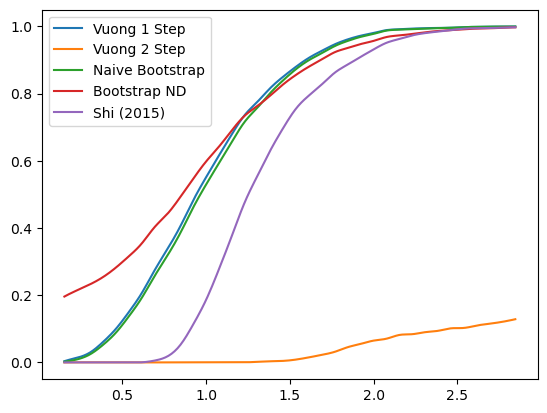

In [6]:
def gen_data3(beta= 1.5, nobs=1000):
    cov = [[25, 0], [0, 1]]
    data = np.random.multivariate_normal([0,beta], [[25,0],[0,1]],  nobs)
    return data[:,0],data[:,1],nobs

betas = np.linspace(0,3,linspace)
nobs = 100
c1,c2 = calc_c(nobs)
results = []


for beta in betas:
    setup_shi_ex  = lambda yn,xn: setup_shi(yn,xn)
    gen_data_ex = lambda : gen_data3(nobs=nobs, beta =beta)
    mc_out = vuong_tests_fast.monte_carlo(nsims,gen_data_ex,setup_shi_ex,trials=trials,
                                          skip_boot=skip_boot,skip_shi=skip_shi,refinement_test=refinement_test,c1=c1,c2=c2)
    reg,twostep, refine_test, boot1,boot2,boot3,shi, llr,std, omega = mc_out
    results.append([reg,twostep,refine_test,shi,boot1,boot2,boot3])

name = 'power_nobs%s_c1%s_c2%s_trials%s.png'%(nobs,c1,c2,trials)
create_fig(betas,results,name=name)

# extra size sims

In [ ]:
betas = np.linspace(0,3,linspace)
nobs =250
c1,c2 = calc_c(nobs)
results = []

for beta in betas:
    setup_shi_ex  = lambda yn,xn: setup_shi(yn,xn,num_params=num_params)
    gen_data_ex = lambda : gen_data(nobs=nobs, beta =beta)
    mc_out = vuong_tests_fast.monte_carlo(nsims,gen_data_ex,setup_shi,trials=trials,
                                          skip_boot=skip_boot,skip_shi=skip_shi,refinement_test=refinement_test,c1=c1,c2=c2)
    reg,twostep, refine_test, boot1,boot2,boot3,shi, llr,std, omega = mc_out
    results.append([reg,twostep,refine_test,shi,boot1,boot2,boot3])
    print(boot3)

name = 'size_nobs%s_c1%s_c2%s_trials%s.png'%(nobs,c1,c2,trials)
create_fig(betas,results,name=name)

var//varnd//right//left 1.3667084354823997 1.3667084354823997 -3.474490735882461 -4.072666612057739
-2.145470728395769 -0.006313976567726999 1.7068587101407249
-2.1728635407581263 -0.006313976567726999 1.679188996267415
---
var//varnd//right//left 0.5214501519574987 0.5214501519574987 -10.502232192186614 -11.072041726167743
-3.21145881387898 -0.025598624037682205 0.8222016420689497
-3.280254925096061 -0.025598624037682205 0.7497817929706868
---
var//varnd//right//left 1.7239545975910229 1.7239545975910229 4.332077780170565 3.728859491196938
-1.7946654883645694 0.0077257920515100935 2.1968463360301667
-1.8164860129295435 0.0077257920515100935 2.175097415124602
---
var//varnd//right//left 0.4195888314571192 0.4195888314571192 -13.436322810270276 -14.076327579954096
-3.9059528891960364 -0.023804819941487858 0.04511340712263948
-4.007770322016849 -0.023804819941487858 -0.05442931044478668
---
var//varnd//right//left 0.2325746698867266 0.2325746698867266 -11.891143102334768 -12.473058270157

var//varnd//right//left 1.104924362362096 1.104924362362096 -5.162531374615756 -5.751518699088481
-2.2040159435518794 -0.011360513362277039 1.6363623038518202
-2.2391678042582357 -0.011360513362277039 1.6041754384398206
---
var//varnd//right//left 3.018242282737034 3.018242282737034 29.514725082974422 28.869405641374524
-1.2299695192836544 0.05095559003819845 2.311686934769605
-1.2441676324381814 0.05095559003819845 2.2981158934389923
---
var//varnd//right//left 0.398170900346227 0.398170900346227 -11.625056199700168 -12.233781711977871
-3.910070218678735 -0.0224194098805335 0.21678831758127734
-4.0078748357991785 -0.0224194098805335 0.12481501266878282
---
var//varnd//right//left 1.6967959779584176 1.6967959779584176 4.098572089773056 3.5620756645364917
-1.8606212087315313 0.011187780613835503 2.144713473877886
-1.8813635108769593 0.011187780613835503 2.125489115976669
---
var//varnd//right//left 0.6234108528509773 0.6234108528509773 -10.628738269388476 -11.274909770944708
-3.03380109

var//varnd//right//left 1.5171754907337187 1.5171754907337187 4.511530698061659 3.9975005398329433
-1.7183117280654996 0.011112017202263966 2.151219645504487
-1.7415945233669021 0.011112017202263966 2.128981939533517
---
var//varnd//right//left 0.03544265201282035 0.10000000000000002 -10.979519573820102 -11.539926475679575
-7.607931100900787 -0.026134589144495946 -6.257013530722829
-7.962363546171664 -0.026134589144495946 -6.611445975993706
---
var//varnd//right//left 0.6666390655473026 0.6666390655473026 -8.978159047805097 -9.561942465994077
-2.7344474986377802 -0.02100950492796276 1.2142192665342928
-2.7946400503518602 -0.02100950492796276 1.158089735619685
---
var//varnd//right//left 0.9312796241793737 0.9312796241793737 -5.765877019515467 -6.336318291785663
-2.358990025128816 -0.014536011320700563 1.6324372973498507
-2.397742651823575 -0.014536011320700563 1.592720290918792
---
var//varnd//right//left 0.062079642146250676 0.10000000000000002 -13.081107218633978 -13.783477580697975


var//varnd//right//left 1.9122943671553392 1.9122943671553392 7.616461816844078 7.01489810323002
-1.651271749148515 0.013423257944318092 2.0886051842006963
-1.6723299159551004 0.013423257944318092 2.066202048986339
---
var//varnd//right//left 0.3929256290050406 0.3929256290050406 -10.51045482625678 -11.084216037148497
-3.6302722759303743 -0.024398594332179478 0.12079589610294651
-3.722759587727847 -0.024398594332179478 0.027175380764724862
---
var//varnd//right//left 0.6749440877352519 0.6749440877352519 -9.20373861242795 -9.772155107586732
-2.731127536523308 -0.021848167502094555 1.126482585474739
-2.785338275245554 -0.021848167502094555 1.0737111887951196
---
var//varnd//right//left 2.1554521004620875 2.1554521004620875 15.2451460515234 14.694078892794291
-1.6925258200462483 0.036677949133582764 2.270384949629332
-1.7101892989635632 0.036677949133582764 2.25431479830801
---
var//varnd//right//left 1.1045864885412315 1.1045864885412315 -6.17695209163821 -6.791371783592455
-2.410706824

var//varnd//right//left 1.9479538143901574 1.9479538143901574 4.300394236069071 3.594939407229384
-1.9675197253381596 0.006522906783150431 2.0358238995081956
-1.9926666148077632 0.006522906783150431 2.014413053650605
---
var//varnd//right//left 0.3273839714393871 0.3273839714393871 -14.683634355251428 -15.336785577179642
-4.875295256793699 -0.027341340647803098 -0.8358719635587268
-5.001762596226161 -0.027341340647803098 -0.9676953050075128
---
var//varnd//right//left 0.8671212498147731 0.8671212498147731 -9.276795692578855 -9.963085495049466
-2.6439871210476498 -0.016726352060501076 1.243987123031612
-2.6931433401670173 -0.016726352060501076 1.1969402459639016
---
var//varnd//right//left 0.2195595180822663 0.2195595180822663 -13.00901312524579 -13.61380702794341
-5.749106307774751 -0.02808664509522832 -1.7254487986470797
-5.932791472597689 -0.02808664509522832 -1.8978380173322613
---
var//varnd//right//left 1.0743461539277588 1.0743461539277588 -8.027211379901441 -8.687899326001984
-2

var//varnd//right//left 1.202073663083369 1.202073663083369 -6.08779034704911 -6.770933571569105
-2.208829047067701 -0.01068879326181551 1.68370085631212
-2.244644183883589 -0.01068879326181551 1.6473951613280844
---
var//varnd//right//left 0.7932067012939565 0.7932067012939565 -8.403210185740795 -8.983984646477905
-2.4781323807726143 -0.019437260668555226 1.2489274518590656
-2.525960887090045 -0.019437260668555226 1.2016833980640051
---
var//varnd//right//left 1.660281462774212 1.660281462774212 0.6501180999236087 0.0294566372172128
-1.8469702112623116 0.0018174912819804675 2.0282633361347773
-1.8711146255926987 0.0018174912819804675 2.004526624618314
---
var//varnd//right//left 0.6379922899495694 0.6379922899495694 -7.074557656621443 -7.585777933337494
-2.6584872188087942 -0.02139065869533831 1.3647733906504427
-2.709071299862926 -0.02139065869533831 1.3111276304461252
---
var//varnd//right//left 0.6174897195543254 0.6174897195543254 -12.131924074234204 -12.805766700819225
-3.2511515

var//varnd//right//left 1.59149328398116 1.59149328398116 0.5023827669893551 -0.09337736682893291
-1.8668563996123877 0.0007615917382298734 1.9194972421661671
-1.8913238061907578 0.0007615917382298734 1.8958384641418389
---
var//varnd//right//left 1.2510405811292893 1.2510405811292893 -6.359365717599667 -7.010801792231627
-2.304570509770887 -0.011913896147874881 1.6274649577320317
-2.3366880248162083 -0.011913896147874881 1.5952128178604128
---
var//varnd//right//left 0.5959605240186641 0.5959605240186641 -10.575997366715917 -11.196187241145179
-3.1229802484173987 -0.021570726550869307 0.8732202127117059
-3.1882681429032784 -0.021570726550869307 0.8053889029054888
---
var//varnd//right//left 2.909693822642915 2.909693822642915 32.607278754491425 32.01830326164454
-1.3111414289351058 0.06834161122111355 2.7048276423914777
-1.324732908761722 0.06834161122111355 2.6914009478491625
---
var//varnd//right//left 1.277911729478051 1.277911729478051 -4.243261151610319 -4.876560530241998
-2.1159

var//varnd//right//left 3.327359352280723 3.327359352280723 39.82832422031068 39.196537455272804
-1.2291519893462042 0.069871772901157 2.6653403538922835
-1.241183282568443 0.069871772901157 2.653165058082526
---
var//varnd//right//left 2.367755460453081 2.367755460453081 14.317486836696707 13.681794505247431
-1.6815290640963887 0.027867744072659954 2.1525274316168574
-1.698388189968906 0.027867744072659954 2.135760200281123
---
var//varnd//right//left 0.22640625998773872 0.22640625998773872 -11.905401569507777 -12.502263601877486
-5.173254920212847 -0.02615066294877894 -1.3039788530709568
-5.346217532143237 -0.02615066294877894 -1.485204374189674
---
var//varnd//right//left 0.5983548269055097 0.5983548269055097 -10.125875468537338 -10.732206418441208
-3.055040610900492 -0.020665834754243946 0.9364431731715258
-3.126376332853294 -0.020665834754243946 0.8704633334473928
---
var//varnd//right//left 1.4317315141342228 1.4317315141342228 -0.8638301635461467 -1.457104596572754
-2.0144069331

var//varnd//right//left 1.387260817546949 1.387260817546949 -2.635579992142761 -3.2554471174032833
-2.169209944858577 -0.005944783454219236 1.735935389000255
-2.196121917491658 -0.005944783454219236 1.7102190780478657
---
var//varnd//right//left 2.070188854205987 2.070188854205987 3.4040540838986333 2.700429775003549
-1.9095692748457573 0.006272356001691219 2.0772655485001335
-1.9314487685662936 0.006272356001691219 2.056269741263025
---
var//varnd//right//left 1.8339853072308097 1.8339853072308097 0.20103017044638738 -0.508591676586788
-1.9792955469037223 0.0026771171990546193 1.971388474957001
-2.0026336640257294 0.0026771171990546193 1.9460436871337872
---
var//varnd//right//left 1.0997024933304649 1.0997024933304649 -7.508062560759693 -8.117999332572797
-2.509310884914199 -0.01611230913505819 1.507934139650159
-2.546729269276824 -0.01611230913505819 1.472117323107313
---
var//varnd//right//left 0.12560826757774782 0.12560826757774782 -12.893648989844987 -13.515016999130879
-8.44021

var//varnd//right//left 0.6734753026567403 0.6734753026567403 -7.42315013875894 -7.967645894475517
-2.5622670959253884 -0.020077611617314375 1.3096586514778596
-2.6181918839992626 -0.020077611617314375 1.2590607126856037
---
var//varnd//right//left 0.627177151217834 0.627177151217834 -8.399436779035431 -8.969674064527513
-2.908003393974856 -0.020646852945505532 1.0894330742060645
-2.9640332997903465 -0.020646852945505532 1.0310083903749887
---
var//varnd//right//left 1.5240859124644635 1.5240859124644635 -4.480503912656147 -5.133040996661448
-2.0903331909836975 -0.007588071210932826 1.8653525048869175
-2.1172966675859657 -0.007588071210932826 1.8358502562111039
---
var//varnd//right//left 0.24249373881262148 0.24249373881262148 -12.513184360850246 -13.17593249327491
-5.272049077765772 -0.02231496624846671 -1.4550258297188232
-5.456758033191465 -0.02231496624846671 -1.6283275433889277
---
var//varnd//right//left 1.5758394051491722 1.5758394051491722 2.5529508232852547 1.9605257161035192

var//varnd//right//left 3.410584230269309 3.410584230269309 49.48251454314747 48.91655207584988
-1.2002645095119997 0.1124568394685839 2.773042200737902
-1.2110005347868158 0.1124568394685839 2.7633553993574798
---
var//varnd//right//left 0.016376296038549513 0.10000000000000002 -11.517723620979597 -12.121118012529658
-7.581437827047924 -0.02457055132853744 -6.9568487050934325
-7.963057947981854 -0.02457055132853744 -7.338468826027363
---
var//varnd//right//left 0.4172551413773661 0.4172551413773661 -11.064468283228898 -11.68127971176365
-3.741971873917166 -0.0220833866578256 0.31495030516275063
-3.832996021412315 -0.0220833866578256 0.21642608042127304
---
var//varnd//right//left 1.8348912741734522 1.8348912741734522 2.483882632825978 1.8471332892441255
-1.8135240410024431 0.005780360938388057 2.0915288601722097
-1.8364918340554546 0.005780360938388057 2.067729610433116
---
var//varnd//right//left 0.9846761912279415 0.9846761912279415 -4.948225234510346 -5.49760564996518
-2.2602108803

var//varnd//right//left 2.5619277142083767 2.5619277142083767 20.45167407188164 19.789162866920154
-1.6215235905690564 0.02877853203852815 2.4118677455809356
-1.6372876677058936 0.02877853203852815 2.3957185986529463
---
var//varnd//right//left 2.324614825100755 2.324614825100755 11.761250674352443 11.113513575515478
-1.4945668218629928 0.02023901432901354 2.1698592188163124
-1.5118453449003557 0.02023901432901354 2.153016859115579
---
var//varnd//right//left 2.1827766721648505 2.1827766721648505 16.000621609421646 15.458050573143941
-1.529120533844233 0.038655732373852905 2.5329032756554204
-1.5432751683436656 0.038655732373852905 2.5165744222492443
---
var//varnd//right//left 0.5452579450848243 0.5452579450848243 -9.600071386890546 -10.194654809051123
-3.0409154249591257 -0.02168078626937312 0.8727163471337431
-3.1146779881918234 -0.02168078626937312 0.8073929208169489
---
var//varnd//right//left 0.4403965815383074 0.4403965815383074 -12.885265407560368 -13.59824924468688
-3.75521415

var//varnd//right//left 0.40437071071952285 0.40437071071952285 -11.640120719295373 -12.273945820939717
-3.9078148343415586 -0.02347728718416692 0.13263731815772156
-4.003820694210249 -0.02347728718416692 0.025529112965163435
---
var//varnd//right//left 0.5147426378508847 0.5147426378508847 -10.156705683144638 -10.76525617833111
-3.284731802897138 -0.021412193039611987 0.7319545721478947
-3.358240440908501 -0.021412193039611987 0.6585012379769829
---
var//varnd//right//left 0.06785017360083034 0.10000000000000002 -9.640026896619164 -10.145689019397015
-7.3970388197973005 -0.030646881456117558 -4.6079510072070216
-7.716847626688043 -0.030646881456117558 -4.927759814097763
---
var//varnd//right//left 0.9928218374563506 0.9928218374563506 -9.201784472922752 -9.812098310782211
-2.5329808744054625 -0.020367270983393103 1.4105251617516505
-2.5709350098005412 -0.020367270983393103 1.367815038721394
---
var//varnd//right//left 0.9001927636356225 0.9001927636356225 -5.004928484429012 -5.5209495

var//varnd//right//left 1.5773628485389781 1.5773628485389781 5.306729263201567 4.745692549737016
-1.6973940180995146 0.008438139742558678 2.054824333815228
-1.7191985345344596 0.008438139742558678 2.0339656793986407
---
var//varnd//right//left 0.8468920488758928 0.8468920488758928 -7.974481381084792 -8.518441085221117
-2.5511404570998595 -0.01831528021982222 1.3558674625350924
-2.5909351694367584 -0.01831528021982222 1.3161370527883642
---
var//varnd//right//left 2.4113899071995 2.4113899071995 13.010549118271316 12.332688475460243
-1.5902034680467787 0.021165943057820734 2.1457101379862205
-1.6088869243982549 0.021165943057820734 2.1283814318354226
---
var//varnd//right//left 1.405284610755656 1.405284610755656 3.0790129771980737 2.586745136280358
-1.8870364518368488 0.007277406270705804 2.055299014365701
-1.9109195466747817 0.007277406270705804 2.0324085634509905
---
var//varnd//right//left 1.2909638839409723 1.2909638839409723 -3.386966039535905 -3.991622114710186
-2.08066453626858

var//varnd//right//left 0.6725250319045574 0.6725250319045574 -9.889273251392668 -10.501295502234912
-2.814432894919242 -0.020106135649486736 1.0730896952356885
-2.8716158788813337 -0.020106135649486736 1.0124182137216373
---
var//varnd//right//left 1.8149456558395687 1.8149456558395687 1.083736323776101 0.4403283620641163
-1.948858053659827 0.002250078765839132 2.1105447546140295
-1.971668965049337 0.002250078765839132 2.0878611647619754
---
var//varnd//right//left 2.9472034414035804 2.9472034414035804 33.985803279123125 33.38895670366775
-1.3065444168324534 0.06649822306173281 2.7493087952610957
-1.3199116472831094 0.06649822306173281 2.736980751332405
---
var//varnd//right//left 0.11280066230734567 0.11280502879825854 -12.792547365367732 -13.46838710696435
-9.266507312758065 -0.022038012957303198 -5.269932270794605
-9.6556436097519 -0.022038012957303198 -5.646761436723052
---
var//varnd//right//left 2.5871289827870334 2.5871289827870334 26.939732031575804 26.392834680445908
-1.33923

var//varnd//right//left 1.601607143143409 1.601607143143409 -0.6858228653729296 -1.3322264096565388
-2.029510102104541 -0.0008146042808793136 1.9698790141630027
-2.053931018318505 -0.0008146042808793136 1.9448008571497544
---
var//varnd//right//left 2.513942805556568 2.513942805556568 18.631049904908977 17.993419257348584
-1.5744981681339978 0.030058536170714575 2.559404360978556
-1.5907307226298428 0.030058536170714575 2.542613453361639
---
var//varnd//right//left 1.4141130162027489 1.4141130162027489 0.6902771998478566 0.09765341364376831
-2.0464773006647037 -0.000661252419228192 1.9312137590028093
-2.0737224958844624 -0.000661252419228192 1.9048486433796779
---
var//varnd//right//left 0.026233807242680412 0.10000000000000002 -12.879109122137722 -13.555980145354686
-8.622167193012622 -0.02262014143243454 -7.627796628519887
-9.050258016119486 -0.02262014143243454 -8.05588745162675
---
var//varnd//right//left 1.696476102563426 1.696476102563426 2.6087265788451806 1.9667332730774525
-1.

var//varnd//right//left 2.795282074245394 2.795282074245394 32.0776488181182 31.540174040245287
-1.2435707751261824 0.07444828914564529 2.5618061445215154
-1.2561628340856341 0.07444828914564529 2.549879917943433
---
var//varnd//right//left 0.3260469929804382 0.3260469929804382 -14.188601761514443 -14.956078184398004
-4.939596678927193 -0.019568909708288385 -0.6675218473880419
-5.0963814530212295 -0.019568909708288385 -0.8102125344299944
---
var//varnd//right//left 1.8155016437194835 1.8155016437194835 2.983121331804893 2.355238657302976
-1.9569258726343417 0.006842822633189939 2.030504444731706
-1.9788870241439576 0.006842822633189939 2.0095406740786226
---
var//varnd//right//left 1.2131739295684487 1.2131739295684487 -6.032488211327922 -6.723249559194719
-2.3094241614965325 -0.010861303337705207 1.8502993905776703
-2.3452039890148857 -0.010861303337705207 1.8159451053457536
---
var//varnd//right//left 2.934678668249147 2.934678668249147 31.447860296280368 30.83580726192864
-1.2992821

var//varnd//right//left 0.7900725980722101 0.7900725980722101 -9.132810818564641 -9.774856514884393
-2.774644066837296 -0.01732588976246368 1.2663908104028005
-2.8300375927021033 -0.01732588976246368 1.2141887045124995
---
var//varnd//right//left 1.854658831208554 1.854658831208554 7.133380859143392 6.560427823135106
-1.6962257707790682 0.014508036333336334 2.1281957744512336
-1.7162191957120863 0.014508036333336334 2.109158636406098
---
var//varnd//right//left 0.18377682065729767 0.18377682065729767 -10.99109451299177 -11.571433097142794
-5.68965244282505 -0.025225357562018418 -1.7877383358836332
-5.8962902333111415 -0.025225357562018418 -1.9945039888321947
---
var//varnd//right//left 1.7687839871490214 1.7687839871490214 0.6271263598208436 -0.005678214731631669
-1.8659891250959035 0.004177298342081087 2.1265580169400247
-1.888928565737717 0.004177298342081087 2.1020615233974715
---
var//varnd//right//left 1.1269493384971634 1.1269493384971634 -6.855264803714392 -7.49522974078446
-2.3

var//varnd//right//left 0.16787268508519543 0.16787268508519543 -13.095454454153773 -13.779670836831489
-6.816370841937526 -0.021745100787184272 -3.0459799179992975
-7.0887916391511405 -0.021745100787184272 -3.299720505398176
---
var//varnd//right//left 0.8386953244915683 0.8386953244915683 -7.743087091207558 -8.324106588801914
-2.6132995054580612 -0.018002972613644183 1.393554839926419
-2.6590828631814967 -0.018002972613644183 1.3515090782865373
---
var//varnd//right//left 1.5188803325299873 1.5188803325299873 2.746810866446426 2.18724455731903
-1.7948478550872182 0.0030970765221253684 2.193009525487275
-1.817312589832874 0.0030970765221253684 2.167828222817266
---
var//varnd//right//left 1.393912363195374 1.393912363195374 -1.9954012374865315 -2.611985818395241
-2.1614212222698574 -0.004109777000898139 1.8463586107356222
-2.1886381211791033 -0.004109777000898139 1.8184802401049125
---
var//varnd//right//left 1.9119632913818223 1.9119632913818223 11.444335185337744 10.911342942037434


var//varnd//right//left 1.341929568458661 1.341929568458661 -0.5234238070251983 -1.0953048418391271
-1.9762392442553125 -0.0028052894815794897 1.9482132698944297
-2.004276339992759 -0.0028052894815794897 1.9226904580871225
---
var//varnd//right//left 1.1737488880051374 1.1737488880051374 -6.700687744223471 -7.313547592557594
-2.2113562330535923 -0.013490192692968904 1.7511625587409043
-2.2425687529103455 -0.013490192692968904 1.717585677843748
---
var//varnd//right//left 1.3217387183196194 1.3217387183196194 -6.075887918840545 -6.750608741394886
-2.0944531479828736 -0.01104418937646011 1.5791464719285624
-2.1258494026085564 -0.01104418937646011 1.5448451649999704
---
var//varnd//right//left 1.6801854154346898 1.6801854154346898 -0.1701304979498243 -0.7999997777954795
-2.1092231599801408 0.000528365497251709 1.9170541455712815
-2.132472965828404 0.000528365497251709 1.8933785627853068
---
var//varnd//right//left 0.9392625738060931 0.9392625738060931 -7.804144764299964 -8.459776707017445

var//varnd//right//left 0.7366360909020007 0.7366360909020007 -8.08807477149399 -8.672660555282029
-2.618464031907847 -0.019194818334089925 1.126914174107468
-2.667938523770679 -0.019194818334089925 1.0735889768030056
---
var//varnd//right//left 3.0776791433542083 3.0776791433542083 31.131658586803308 30.53637953272117
-1.3996096179809243 0.05890133406784611 2.631162807494788
-1.411691111778362 0.05890133406784611 2.617841563658535
---
var//varnd//right//left 2.120372165703976 2.120372165703976 7.825504765417078 7.208999083543136
-1.8293617061342868 0.015143909305244422 2.1892516525467194
-1.8470202520875854 0.015143909305244422 2.1713470074922583
---
var//varnd//right//left 1.8041349310934192 1.8041349310934192 3.9484437412681945 3.2973566669180117
-1.709299488448822 0.004603851107561789 2.1588937169023428
-1.7326986773794684 0.004603851107561789 2.135500950327432
---
var//varnd//right//left 1.9615818083352323 1.9615818083352323 4.506838279759132 3.8590968158453256
-1.897539411323257 

var//varnd//right//left 0.5932666953282988 0.5932666953282988 -12.882564175538729 -13.548404254796646
-3.456377913519417 -0.022061190406707284 0.5088224857460489
-3.5291458344600692 -0.022061190406707284 0.4368168829100909
---
var//varnd//right//left 1.4345833864891524 1.4345833864891524 -1.025566963684475 -1.5685028334868196
-2.089453398636606 -0.002665739325210907 1.809339444176481
-2.1134741195198816 -0.002665739325210907 1.7857299009842438
---
var//varnd//right//left 3.6599131008645105 3.6599131008645105 49.88210658101678 49.19096859271845
-1.2918041633025705 0.06925306018876261 2.725183802651873
-1.3044760446802623 0.06925306018876261 2.712575315793173
---
var//varnd//right//left 1.2182614005482637 1.2182614005482637 -6.048122121823202 -6.662185635717293
-2.219414760268614 -0.01015576397808164 1.7493847842530956
-2.2542551770274994 -0.01015576397808164 1.7176121552658576
---
var//varnd//right//left 0.7007971123099639 0.7007971123099639 -8.49442373435534 -9.081346165817278
-2.52310

var//varnd//right//left 0.7397887175936592 0.7397887175936592 -12.051716786972992 -12.773594283556253
-3.0777503302610745 -0.017604319071907275 0.9550881965312504
-3.138584395818167 -0.017604319071907275 0.8929479174986248
---
var//varnd//right//left 1.88474185152876 1.88474185152876 0.3174931780474616 -0.38328028715955864
-1.9612713839819298 0.0005002395728843941 1.85686929607806
-1.9837451845404208 0.0005002395728843941 1.8330357213308788
---
var//varnd//right//left 0.14862202679633638 0.14862202679633638 -12.28971766823703 -12.923558809216146
-7.23462907542796 -0.023723912302865423 -3.240896084760405
-7.512348349719666 -0.023723912302865423 -3.505923424206855
---
var//varnd//right//left 2.978210628145747 2.978210628145747 24.166539270226814 23.48262836971227
-1.5606043042192246 0.037879198548951 2.4623398857166756
-1.5749586880089728 0.037879198548951 2.4468739155855523
---
var//varnd//right//left 0.45445328180392314 0.45445328180392314 -10.636563422737327 -11.230969682798849
-3.466

var//varnd//right//left 2.891317008595968 2.891317008595968 31.65082385737713 31.046512609924218
-1.4319180896544077 0.053514568665307065 2.610871706610817
-1.4462697903328814 0.053514568665307065 2.5968296514971745
---
var//varnd//right//left 0.7017877422475753 0.7017877422475753 -12.701835347393486 -13.181139895915374
-3.079985233630632 -0.03913649054026666 0.8961510654872
-3.122479574803902 -0.03913649054026666 0.8518139651146355
---
var//varnd//right//left 2.683118577019239 2.683118577019239 15.422915375767257 14.724812242956473
-1.6990110549625472 0.023275428236444913 2.3129287465026263
-1.715309143922159 0.023275428236444913 2.2970273770023075
---
var//varnd//right//left 1.8866517319654343 1.8866517319654343 10.0946806255261 9.554301142075158
-1.6631606910131602 0.02319165012922599 2.3241712550577
-1.6804242010399064 0.02319165012922599 2.306613952330946
---
var//varnd//right//left 3.105377486405873 3.105377486405873 32.59007018333077 31.92060338481648
-1.3973277805383253 0.04966

var//varnd//right//left 0.7687644857705375 0.7687644857705375 -5.987789024967217 -6.466027282660265
-2.367226139535178 -0.01910276106126256 1.467922152230251
-2.4087366688551874 -0.01910276106126256 1.4268679767306416
---
var//varnd//right//left 5.7910047461806 5.7910047461806 148.2921649139575 147.65131528152617
-0.56282710538477 0.2362193576812848 3.446917218517189
-0.5701416053199705 0.2362193576812848 3.4398914281500312
---
var//varnd//right//left 2.5226538558310105 2.5226538558310105 9.812829942162695 9.04643281445425
-1.7008902924213025 0.012204132724091652 2.099556627173079
-1.7172915564884248 0.012204132724091652 2.080830602492562
---
var//varnd//right//left 1.4031280149300451 1.4031280149300451 -5.66465207057956 -6.358695869742855
-2.1299290705968357 -0.007838857633749387 1.5815678511627957
-2.1592788683485105 -0.007838857633749387 1.5484625191205852
---
var//varnd//right//left 2.1718229511844003 2.1718229511844003 10.325630581719945 9.704264794236288
-1.6070292185527177 0.019

var//varnd//right//left 4.122739431457891 4.122739431457891 72.36792190353371 71.74098324793027
-1.0490823261482873 0.12592680191059225 3.016748623681126
-1.0588046880895257 0.12592680191059225 3.0067507344198585
---
var//varnd//right//left 0.2875340985961135 0.2875340985961135 -17.03387358869184 -17.592826118026856
-5.73503907245768 -0.04212300111151707 -1.6576280229981062
-5.86736858942484 -0.04212300111151707 -1.779151375847703
---
var//varnd//right//left 1.2422003561682162 1.2422003561682162 -6.714323122121728 -7.319435525709206
-2.3369083191465356 -0.013326981537665606 1.7073842237802173
-2.370034303789441 -0.013326981537665606 1.6759925892316623
---
var//varnd//right//left 2.36435520728276 2.36435520728276 14.559636261973978 14.00250778540284
-1.4230574356225638 0.03647468335958105 2.2850390574692954
-1.4376176546500623 0.03647468335958105 2.2704127075027936
---
var//varnd//right//left 2.0198748839516236 2.0198748839516236 9.440934759178527 8.814800630384465
-1.4341730332034224 0

var//varnd//right//left 2.8075053874667932 2.8075053874667932 21.760287879886764 21.0888814863276
-1.4961443500150131 0.035294223514175375 2.3975502801258766
-1.5125907566938743 0.035294223514175375 2.3819940769901926
---
var//varnd//right//left 1.2870720080320048 1.2870720080320048 -8.000622340069045 -8.782219731021769
-2.235430722057097 -0.011137856155784574 1.5102003415618077
-2.274175084766205 -0.011137856155784574 1.4701977930341203
---
var//varnd//right//left 0.11123178471948314 0.11124728215731619 -10.298771736130103 -10.854721045521119
-7.770996144052592 -0.026625713526421867 -3.8977356796504137
-8.09656794892688 -0.026625713526421867 -4.199606618171046
---
var//varnd//right//left 2.223165598130652 2.223165598130652 12.395931832882383 11.725312135246936
-1.690745133896677 0.019506736513498067 2.5014010288353665
-1.710014261527507 0.019506736513498067 2.4825245940770593
---
var//varnd//right//left 1.9065540321164665 1.9065540321164665 0.550268520007765 -0.13159011127491568
-2.01

var//varnd//right//left 0.33414919185564385 0.33414919185564385 -13.068642019116854 -13.765086220964223
-4.523000573393043 -0.021057286205385013 -0.4789841868327028
-4.6600762872251416 -0.021057286205385013 -0.6166162563068054
---
var//varnd//right//left 3.2188202827629957 3.2188202827629957 41.16402807137154 40.57075351099682
-1.3083962966290368 0.08561484869919962 2.6843787023771
-1.3196205206722416 0.08561484869919962 2.672366123642964
---
var//varnd//right//left 0.9723481682836687 0.9723481682836687 -10.83121823542456 -11.595421895874802
-2.630102048132277 -0.015568264476254888 1.2162377838040082
-2.6806628228625433 -0.015568264476254888 1.1642614984236204
---
var//varnd//right//left 1.5243517572826082 1.5243517572826082 -0.3250764502730632 -0.9365890324895777
-1.9650772407668209 -0.0013462623458618053 1.8545098204050092
-1.990822487123057 -0.0013462623458618053 1.8272952220160474
---
var//varnd//right//left 0.7261194709279496 0.7261194709279496 -11.341325310340173 -12.012626730335

var//varnd//right//left 2.363595974768579 2.363595974768579 14.627244230705921 14.013988091708221
-1.5863742581207316 0.02651497670731066 2.4197487951668664
-1.6036448108191872 0.02651497670731066 2.402901367525983
---
var//varnd//right//left 1.042833782506012 1.042833782506012 -5.813712018433595 -6.386701314753278
-2.2922274742463915 -0.012091104066761525 1.575825751372918
-2.3286972356478777 -0.012091104066761525 1.5423030631555459
---
var//varnd//right//left 0.8060857405939655 0.8060857405939655 -9.742750643188428 -10.372534370207209
-2.5950699907269663 -0.019463427091708344 1.3158270172209026
-2.6444903667440105 -0.019463427091708344 1.2680743183384728
---
var//varnd//right//left 1.5591646146230804 1.5591646146230804 -2.309321044298473 -2.832413030312207
-1.9309134755812745 -0.005820575335440925 1.7287720511871558
-1.9516640724762513 -0.005820575335440925 1.706804523504813
---
var//varnd//right//left 0.3374605839278027 0.3374605839278027 -11.98438900134171 -12.564350037679962
-4.42

var//varnd//right//left 2.5377389933314585 2.5377389933314585 16.268751394322763 15.575500447312137
-1.4678326237111687 0.01897725347522348 2.34878197490791
-1.4845747643225287 0.01897725347522348 2.331325674765374
---
var//varnd//right//left 0.12918583161185962 0.12918583161185962 -13.50264632930336 -14.211608821662207
-8.787273662738052 -0.020926274986643893 -4.400982238947141
-9.150808607923825 -0.020926274986643893 -4.758034537522811
---
var//varnd//right//left 0.21992130617128003 0.21992130617128003 -12.126737193142127 -12.71038539468959
-5.500898306728965 -0.027866646546799944 -1.3728749310122403
-5.67407626679393 -0.027866646546799944 -1.5297889256059556
---
var//varnd//right//left 2.901392189703025 2.901392189703025 30.316768089287542 29.722717390921638
-1.3664680263334958 0.0661282091864785 2.5759796961645187
-1.3799885066441273 0.0661282091864785 2.563743535360377
---
var//varnd//right//left 0.18302998966281186 0.18302998966281186 -13.738772245426366 -14.355559468410593
-6.69

var//varnd//right//left 1.2255997967628345 1.2255997967628345 -3.8718766677309095 -4.461688710840046
-2.394797042070636 -0.010907519032860927 1.633441244039111
-2.427351088282962 -0.010907519032860927 1.6036500956287443
---
var//varnd//right//left 0.369991235550047 0.369991235550047 -14.744801833467081 -15.376923126065918
-4.494764576402147 -0.028098767053330646 -0.6096244962021435
-4.602561434960151 -0.028098767053330646 -0.7186360580257568
---
var//varnd//right//left 0.9057206211981605 0.9057206211981605 -9.239581881904153 -9.885212920908092
-2.611704214103272 -0.01599296012780431 1.3182973612638413
-2.6554888551883695 -0.01599296012780431 1.2757304500555475
---
var//varnd//right//left 0.34613024644496104 0.34613024644496104 -13.86088187830094 -14.46198934573984
-4.5450043760573084 -0.03015706760464958 -0.5974541714633942
-4.650849366316136 -0.03015706760464958 -0.7094378589393627
---
var//varnd//right//left 0.362284172788662 0.362284172788662 -10.512568000215179 -11.065241170005047


var//varnd//right//left 0.29021470177007486 0.29021470177007486 -12.907601427193596 -13.606133694885717
-4.916328308568539 -0.02077421360699422 -0.7437970801266551
-5.069140333882574 -0.02077421360699422 -0.8922113468156002
---
var//varnd//right//left 0.9454063999310075 0.9454063999310075 -9.210392429774249 -9.901101598950524
-2.477367838284493 -0.014929521982628034 1.2831124572869674
-2.523616130345244 -0.014929521982628034 1.2369235646200702
---
var//varnd//right//left 0.16049848950920234 0.16049848950920234 -11.227985124195216 -11.821296700170954
-6.377183284820121 -0.026187927213335623 -2.495451864226534
-6.61793948618074 -0.026187927213335623 -2.7302827365923097
---
var//varnd//right//left 1.3625773300279957 1.3625773300279957 -1.0227785499100428 -1.5656671066035348
-2.0257841806511494 -0.00015440753792054512 2.003862452076535
-2.0534168343516446 -0.00015440753792054512 1.9771292023240254
---
var//varnd//right//left 0.3684356881329037 0.3684356881329037 -14.420916666361641 -15.071

var//varnd//right//left 0.2627455164661364 0.2627455164661364 -13.554399251098541 -14.282324458560769
-5.260814231135776 -0.02007820600632 -1.394793789748098
-5.433164522387013 -0.02007820600632 -1.5602672311327668
---
var//varnd//right//left 0.38074383652958677 0.38074383652958677 -13.384709092214093 -13.934810659744024
-4.229568548406728 -0.03443022573753772 -0.2879026326537002
-4.322624306382838 -0.03443022573753772 -0.3720146613815992
---
var//varnd//right//left 0.9434014366418294 0.9434014366418294 -8.85321089548591 -9.403035175747783
-2.8098054631037352 -0.022031066600750382 1.5215332112865985
-2.8511506754326055 -0.022031066600750382 1.4856654340433442
---
var//varnd//right//left 1.5415061527726739 1.5415061527726739 1.1626012457150463 0.5975393183775025
-1.9870109951587602 0.004046115597310863 1.8896135586189517
-2.0103849784548125 0.004046115597310863 1.8675896523238418
---
var//varnd//right//left 1.2072820414066365 1.2072820414066365 -3.4124737277179285 -4.0008080357392375
-2

var//varnd//right//left 1.0391069659828789 1.0391069659828789 -6.1442400305738865 -6.718388152854577
-2.3433642508063612 -0.013297910196777748 1.5177971627123363
-2.378885327448933 -0.013297910196777748 1.4839039984407563
---
var//varnd//right//left 1.7988733261157244 1.7988733261157244 0.38836783074108205 -0.3420853171902278
-2.018732300133441 -0.002971196727890834 1.943861705102168
-2.045863630525935 -0.002971196727890834 1.9160877466306319
---
var//varnd//right//left 0.6249126368522564 0.6249126368522564 -9.193986216628158 -9.810544481193663
-2.9967706708916904 -0.01986696580460939 1.0453136165234764
-3.0620862002780145 -0.01986696580460939 0.9790888043670335
---
var//varnd//right//left 1.2036642767908565 1.2036642767908565 -6.115045327280017 -6.750870984782917
-2.2597275396465784 -0.011248418119482346 1.6805321688376489
-2.2929792632200776 -0.011248418119482346 1.6471047940470878
---
var//varnd//right//left 0.510171100774076 0.510171100774076 -9.306657477700904 -9.880065742220802
-

var//varnd//right//left 0.304564816680543 0.304564816680543 -16.40988741976363 -17.0480454146742
-5.484776859630041 -0.032532392170036104 -1.3751258073160544
-5.617930262361719 -0.032532392170036104 -1.50043842743002
---
var//varnd//right//left 1.582538025528617 1.582538025528617 -7.545089862706972 -8.370453673872982
-2.3316177405210112 -0.007804678036132224 1.769223077684353
-2.365261919806576 -0.007804678036132224 1.736637394958214
---
var//varnd//right//left 1.813024865002773 1.813024865002773 5.23151421631925 4.6022651772391185
-1.9471226980983931 0.008485850994897586 2.2605956155825706
-1.9698907099910838 0.008485850994897586 2.23899130352239
---
var//varnd//right//left 3.2001241431313936 3.2001241431313936 34.47958864965953 33.84067657181011
-1.303681266171724 0.0627296008006821 2.56024412358056
-1.3159207844295457 0.0627296008006821 2.5477894772592915
---
var//varnd//right//left 4.182433661338026 4.182433661338026 69.51929090427332 68.88313253916
-1.006460907303718 0.11549622493

var//varnd//right//left 0.18981608899738464 0.18981608899738464 -13.119381042938143 -13.832932744501885
-6.335578323993736 -0.021104448553690112 -2.28664690377126
-6.5741370621117605 -0.021104448553690112 -2.534710506650914
---
var//varnd//right//left 0.08647224837153562 0.10000000000000002 -13.785377246694722 -14.455831017362707
-10.492870264775364 -0.023612624362794085 -6.983030947953032
-10.916902461007167 -0.023612624362794085 -7.407063144184837
---
var//varnd//right//left 3.0128340890114766 3.0128340890114766 36.06324603828031 35.46730334125215
-1.2310641050028197 0.07827707143197367 2.7437779456646942
-1.2441194295706377 0.07827707143197367 2.7305641137489514
---
var//varnd//right//left 2.4741381286196558 2.4741381286196558 7.388407353826881 6.672351836890516
-1.732047552736201 0.012597177394631853 2.1165914826034977
-1.7511422757210189 0.012597177394631853 2.098922821616146
---
var//varnd//right//left 1.3148554574188083 1.3148554574188083 -6.953898699253013 -7.575607980457592
-2

var//varnd//right//left 2.2154444460970577 2.2154444460970577 8.868035901399914 8.237568977617196
-1.6152575146353547 0.01707185569359859 2.0923308167895405
-1.632939394401945 0.01707185569359859 2.073712643846431
---
var//varnd//right//left 0.8573270460550325 0.8573270460550325 -15.17331116816392 -15.807553121474255
-3.088271443604333 -0.028840949124519434 0.8375074233778441
-3.135860788566807 -0.028840949124519434 0.7894896983372471
---
var//varnd//right//left 0.09551345699510197 0.10026699882922603 -11.694002155471436 -12.257201030465302
-9.157242712989104 -0.028832167142788023 -5.518108556369638
-9.511206905531917 -0.028832167142788023 -5.874306800494649
---
var//varnd//right//left 4.3921581892861505 4.3921581892861505 88.91844988415765 88.3164830236994
-0.6965506061324305 0.16170472059279148 3.1393007813852307
-0.7054029747614252 0.16170472059279148 3.130194481976151
---
var//varnd//right//left 1.5370209020099914 1.5370209020099914 -1.0238906150158338 -1.6325871778855103
-2.166100

var//varnd//right//left 2.36054934032183 2.36054934032183 21.461425788430184 20.958146122582786
-1.4698003872233674 0.05929677990648819 2.3742710514219114
-1.483453514747317 0.05929677990648819 2.3604760348376037
---
var//varnd//right//left 1.572033891965547 1.572033891965547 -8.346931831060157 -8.999064097135287
-2.414769626997759 -0.015245199365883116 1.660473062554564
-2.4421019376735646 -0.015245199365883116 1.6338992370804153
---
var//varnd//right//left 1.819358117653132 1.819358117653132 0.022237087038387303 -0.6647912663455625
-1.856991594103454 6.201655568703343e-05 2.0516620265618988
-1.8821668565920469 6.201655568703343e-05 2.029606956826163
---
var//varnd//right//left 0.46759858425675965 0.46759858425675965 -10.512468289312784 -11.131349762467918
-3.427156826370762 -0.022317558737335572 0.6029300956881153
-3.5111022584043288 -0.022317558737335572 0.5200347794403937
---
var//varnd//right//left 1.0114578563853496 1.0114578563853496 -5.09863631808606 -5.668578517166958
-2.49837

var//varnd//right//left 1.0663397568695436 1.0663397568695436 -10.36610821321367 -11.011074616658226
-2.664057853513046 -0.019335725103735067 1.365483904054744
-2.700730314309676 -0.019335725103735067 1.32864377846629
---
var//varnd//right//left 0.3393611238761648 0.3393611238761648 -16.674436423525332 -17.29482657351464
-5.027130279730355 -0.03189718535757928 -1.1046148964674773
-5.1435109471952165 -0.03189718535757928 -1.2193780738251352
---
var//varnd//right//left 0.420874437253108 0.420874437253108 -17.859986570183114 -18.53700231499605
-4.584581864470013 -0.030067982470566967 -0.8008067787457586
-4.6826362277375795 -0.030067982470566967 -0.901822420724449
---
var//varnd//right//left 1.548959658027854 1.548959658027854 -8.102720270623056 -8.750495405588609
-2.1631758413372832 -0.011443339954140812 1.7199031395927356
-2.1916484147379887 -0.011443339954140812 1.6939770206258087
---
var//varnd//right//left 2.428069061093021 2.428069061093021 14.298527471718456 13.639832576026361
-1.65

var//varnd//right//left 0.7915540511945071 0.7915540511945071 -15.020138557495779 -15.701223708023587
-3.05940777733477 -0.025160070368532735 0.7001248920676001
-3.1121686490510503 -0.025160070368532735 0.6456602125391075
---
var//varnd//right//left 1.7525305159240614 1.7525305159240614 4.189597982478527 3.622616111083674
-1.853370568233316 0.006019893962743738 2.0502942732016165
-1.8758843340377516 0.006019893962743738 2.0295212894244914
---
var//varnd//right//left 0.9560501711285011 0.9560501711285011 -8.167153391421733 -8.804983698723037
-2.5339974385700397 -0.016936132072128577 1.3394513343594885
-2.574579713450796 -0.016936132072128577 1.2941737656878398
---
var//varnd//right//left 2.986920809140813 2.986920809140813 28.160513464987584 27.570612539247488
-1.3342620356167558 0.05359337925843939 2.6008667579889595
-1.3461690697284467 0.05359337925843939 2.5879340466116987
---
var//varnd//right//left 0.2875013301996088 0.2875013301996088 -11.963821651683062 -12.439423284109175
-4.582

var//varnd//right//left 0.18940558172521813 0.18940558172521813 -17.033584202678643 -17.6879931490818
-7.737882041475814 -0.031154239782518835 -3.6699692914457076
-7.9504714281468365 -0.031154239782518835 -3.8898747354486622
---
var//varnd//right//left 1.869788347748943 1.869788347748943 3.3208648174241078 2.6853354064828663
-1.9564125987904437 0.005693860892846896 2.1360099281550036
-1.97990636444992 0.005693860892846896 2.114458240929227
---
var//varnd//right//left 1.0318631884576617 1.0318631884576617 -11.7589272029909 -12.379375810200512
-2.5471125339290244 -0.024580695179608904 1.2947525296834448
-2.5847491567525847 -0.024580695179608904 1.2579657842306384
---
var//varnd//right//left 1.9964793187231278 1.9964793187231278 1.528292407529694 0.9816456816618788
-2.036029999253986 0.005300104314366598 2.031599909974991
-2.054894080577733 0.005300104314366598 2.013949597123545
---
var//varnd//right//left 2.838195539909555 2.838195539909555 16.731449321695123 15.983937160858094
-1.667948

var//varnd//right//left 2.129447087978608 2.129447087978608 5.904141958057271 5.211415598043866
-1.9267598666884664 0.009414375744401734 2.0544764944174907
-1.9473839618529978 0.009414375744401734 2.0341265308559215
---
var//varnd//right//left 2.1046956506706778 2.1046956506706778 5.388625298584257 4.76590100352938
-1.8762673486937957 0.008945011716786373 2.080532914483623
-1.8947805566464906 0.008945011716786373 2.0617598928257483
---
var//varnd//right//left 0.6102118710202125 0.6102118710202125 -15.013201961637922 -15.634011740965882
-3.5773854828974048 -0.02940430188882317 0.5211650977480888
-3.6394133586339588 -0.02940430188882317 0.45619594070639125
---
var//varnd//right//left 2.2416382034242175 2.2416382034242175 17.13667902969764 16.558642954466407
-1.4309838663237506 0.034042478439252864 2.4032004033854553
-1.447488367609628 0.034042478439252864 2.3858625015995223
---
var//varnd//right//left 0.7781396532067777 0.7781396532067777 -10.301703488506726 -10.852827060296498
-2.850765

var//varnd//right//left 2.159127454855922 2.159127454855922 15.846005042213479 15.323330022306935
-1.455438589892812 0.03965050231874777 2.4364792493985985
-1.471422440138697 0.03965050231874777 2.422115612207915
---
var//varnd//right//left 2.6181180034216167 2.6181180034216167 24.169734379458976 23.606297340659225
-1.4215525576390622 0.05178783483275082 2.3458440205056506
-1.4361276368605322 0.05178783483275082 2.3317701320406528
---
var//varnd//right//left 0.8206620928463851 0.8206620928463851 -14.846953263111978 -15.455058887903661
-3.140283089514473 -0.029643035417916398 0.8505562265553669
-3.1870952008556714 -0.029643035417916398 0.8009211331812759
---
var//varnd//right//left 1.1971503649430848 1.1971503649430848 -4.8794125659014815 -5.440028050171929
-2.260267038316857 -0.01624999119078529 1.6692301016670488
-2.2895496407130276 -0.01624999119078529 1.639722422354985
---
var//varnd//right//left 1.6266196885050614 1.6266196885050614 -5.494535423629953 -6.139463909781885
-2.23099995

var//varnd//right//left 1.2661114499567006 1.2661114499567006 -7.0890470928580065 -7.775709670913998
-2.1807722210170075 -0.01177931623830848 1.6079080880290322
-2.215639929859955 -0.01177931623830848 1.5702027030524681
---
var//varnd//right//left 0.6070752718965126 0.6070752718965126 -11.723479439704477 -12.369332908437071
-3.1563214192070537 -0.02237737643637634 0.7681364677382313
-3.222707060926629 -0.02237737643637634 0.7055955306983902
---
var//varnd//right//left 1.2704129228153047 1.2704129228153047 -3.6616697694172635 -4.186643439498525
-2.17218670971619 -0.009387304221816398 1.749129517146979
-2.19878395454198 -0.009387304221816398 1.723541098160991
---
var//varnd//right//left 0.7450350518659675 0.7450350518659675 -9.644230098846194 -10.254682483177369
-2.7430380694297467 -0.020345392956996878 1.0326069020783162
-2.7996608721146092 -0.020345392956996878 0.9812775881196512
---
var//varnd//right//left 0.4793982451511554 0.4793982451511554 -14.329807783251688 -14.924005837114661
-

var//varnd//right//left 0.2799725747502795 0.2799725747502795 -13.817893554950079 -14.427497258366682
-5.04533919797383 -0.029365085295571754 -1.2261778173822104
-5.179449960702698 -0.029365085295571754 -1.3591772887986096
---
var//varnd//right//left 1.2931507532100157 1.2931507532100157 -5.4825664844407065 -6.074356837252223
-2.358662742631527 -0.012796497067168735 1.6819621577327428
-2.385135768704684 -0.012796497067168735 1.6545362833678194
---
var//varnd//right//left 0.3741036627242 0.3741036627242 -12.528264624038377 -13.14597350597254
-4.0689169385095525 -0.02612689941258772 -0.13829841036615595
-4.176180930537647 -0.02612689941258772 -0.2489815224742717
---
var//varnd//right//left 1.3029214939229865 1.3029214939229865 -7.814615988238068 -8.44289719607781
-2.2070550676533855 -0.013739552226865574 1.6311135506600827
-2.238130943390838 -0.013739552226865574 1.6011290138635335
---
var//varnd//right//left 1.54977541616742 1.54977541616742 1.5768013129525553 0.9660971959627083
-1.8471

var//varnd//right//left 1.7289820415555264 1.7289820415555264 -0.7395803397210998 -1.4181133886698276
-1.9166417279360017 -0.0028114049342021735 1.8115596006371577
-1.940877624416083 -0.0028114049342021735 1.7858380393975277
---
var//varnd//right//left 0.515409792557876 0.515409792557876 -19.061766586819473 -19.739315670379824
-4.232784482324548 -0.032924163534930356 -0.33716513741425674
-4.317488584245199 -0.032924163534930356 -0.4172033745138442
---
var//varnd//right//left 0.32498898159087536 0.32498898159087536 -12.28837203649555 -12.962943811657697
-4.312834440169312 -0.02135000920263282 -0.3721657310239513
-4.440293195543103 -0.02135000920263282 -0.5007846122328807
---
var//varnd//right//left 1.6714098797073778 1.6714098797073778 -6.326881769616017 -7.059108423758884
-2.135291028457879 -0.008917349541222749 1.7516496839509141
-2.1637768477630517 -0.008917349541222749 1.7241076944038267
---
var//varnd//right//left 1.8565988682201848 1.8565988682201848 -10.59049272039423 -11.3388478

var//varnd//right//left 3.2447763506341056 3.2447763506341056 38.77415234146373 38.18257313546426
-1.223006825088333 0.08012730873334317 2.7375094573248195
-1.235369799158693 0.08012730873334317 2.726599683472476
---
var//varnd//right//left 0.1372317274552141 0.1372317274552141 -13.648916393017673 -14.274935088491056
-8.25091736766205 -0.02663480374049978 -4.276975014848147
-8.54448293724122 -0.02663480374049978 -4.544158887927457
---
var//varnd//right//left 4.652745044116853 4.652745044116853 75.59165809727584 74.89240625709913
-0.993749452105109 0.100654798400336 2.944761821000348
-1.002977857119057 0.100654798400336 2.934824827780468
---
var//varnd//right//left 1.9144568525430146 1.9144568525430146 9.108772518794526 8.537542400233182
-1.726282534225719 0.018342195139707036 2.264202434516501
-1.7448677699360073 0.018342195139707036 2.246190017511954
---
var//varnd//right//left 3.940880100295205 3.940880100295205 68.20972671022257 67.58654143247391
-0.9634283831859733 0.11727569265833

var//varnd//right//left 2.7290543016873743 2.7290543016873743 29.802956711640757 29.282571740421478
-1.258866463067371 0.07398601841518788 2.522158458431612
-1.2712198551638554 0.07398601841518788 2.5102551513628235
---
var//varnd//right//left 1.5903787438323453 1.5903787438323453 -5.588803665843021 -6.129396402301626
-2.1835425844336025 -0.01459452594456596 1.621438554682461
-2.2054458215977153 -0.01459452594456596 1.6016698600085182
---
var//varnd//right//left 0.26205194886276806 0.26205194886276806 -17.85713513944553 -18.50076050785195
-6.195008798368249 -0.03349962948843095 -2.313006941849766
-6.3406906974549875 -0.03349962948843095 -2.4772836236146176
---
var//varnd//right//left 1.8800725729337668 1.8800725729337668 3.376322262766288 2.815815598799506
-1.7955588598296377 0.008658193000200909 2.0664277684365295
-1.8146190145387584 0.008658193000200909 2.0469090017973555
---
var//varnd//right//left 0.9751513293043581 0.9751513293043581 -10.36095055460483 -10.907212520770281
-2.51539

var//varnd//right//left 0.21779304782123146 0.21779304782123146 -15.550194274319264 -16.192670971690916
-6.677999480014133 -0.0296802198687876 -2.5323521594231813
-6.869098525822917 -0.0296802198687876 -2.7049302976849803
---
var//varnd//right//left 2.565815118851732 2.565815118851732 24.243639245657572 23.69106585541732
-1.4020498626267672 0.05684193035927868 2.543126199688455
-1.4160412469647843 0.05684193035927868 2.530146841077647
---
var//varnd//right//left 1.5372571814108629 1.5372571814108629 -5.241970023861225 -5.960104799502651
-2.125693477682517 -0.008473495955886727 1.773516353514221
-2.1553520198967338 -0.008473495955886727 1.7412160001229062
---
var//varnd//right//left 1.9941582057007727 1.9941582057007727 7.197199717230722 6.581028183316255
-1.776969294838896 0.009304694725149833 2.2197614941100725
-1.7963352852809755 0.009304694725149833 2.2006534143895116
---
var//varnd//right//left 1.2556919170124885 1.2556919170124885 -13.479907881739491 -14.075698395421723
-2.5359943

var//varnd//right//left 2.577603857835005 2.577603857835005 8.0537980878552 7.330694454687917
-1.7829232721659387 0.014743210194015404 2.216364203159854
-1.799528726897434 0.014743210194015404 2.1990264246739626
---
var//varnd//right//left 1.837710371202103 1.837710371202103 1.2873650059865502 0.6665021601500761
-2.008214866025815 0.0019608619847203868 1.8960047542639782
-2.0305996251525147 0.0019608619847203868 1.8740371144017884
---
var//varnd//right//left 0.1897497721114946 0.1897497721114946 -16.742235823031308 -17.34721498959433
-7.615982327871613 -0.03491223201307591 -3.5992419982395147
-7.823356850981376 -0.03491223201307591 -3.8032565621416112
---
var//varnd//right//left 2.192954730050448 2.192954730050448 2.8112951491615203 2.190595291913151
-1.8727307284326713 0.0050257216669284035 2.095824070607766
-1.8900372275373123 0.0050257216669284035 2.0783079489395324
---
var//varnd//right//left 0.5105593908728953 0.5105593908728953 -19.39111009196948 -20.051983310231748
-4.3948603819

var//varnd//right//left 0.1441173807647123 0.1441173807647123 -13.193664266077288 -13.759305568610877
-7.90064195537464 -0.031579556386985404 -3.6721768449783467
-8.167660134654435 -0.031579556386985404 -3.9197084631826313
---
var//varnd//right//left 1.1410814506135643 1.1410814506135643 -7.8564409717557515 -8.418129357436285
-2.312257491006594 -0.019336241044539387 1.4444609013712104
-2.3433139667618086 -0.019336241044539387 1.412655569696573
---
var//varnd//right//left 0.1958795044333452 0.1958795044333452 -11.4730956303356 -11.98780493837288
-5.712228802384304 -0.03304646135948093 -1.7548914117895569
-5.885999063602419 -0.03304646135948093 -1.9204721905528304
---
var//varnd//right//left 0.9137778817855167 0.9137778817855167 -8.801024316820136 -9.335917405506008
-2.642027643299247 -0.023659917545632205 1.3185543380125833
-2.6775853635793117 -0.023659917545632205 1.2844597571404242
---
var//varnd//right//left 1.264894251652499 1.264894251652499 -8.306847486620114 -8.94368125455685
-2.

var//varnd//right//left 0.28216263663076857 0.28216263663076857 -21.474587618691178 -22.187148361421198
-6.846900155492241 -0.03274024511799148 -2.824144883637472
-7.003060626287201 -0.03274024511799148 -2.990123017130315
---
var//varnd//right//left 2.220039934574086 2.220039934574086 12.75816861159231 12.218859298351003
-1.5141157133457166 0.030721673398163535 2.306056676971205
-1.5301708583438862 0.030721673398163535 2.2900659243069392
---
var//varnd//right//left 0.8419447320116986 0.8419447320116986 -7.425831704823809 -7.924090327399754
-2.5761959168003075 -0.022286270217993086 1.38710287611577
-2.613248454736556 -0.022286270217993086 1.3493491676371576
---
var//varnd//right//left 2.1369812111625746 2.1369812111625746 5.7823669335877055 5.135174194401606
-1.76694175952986 0.007728353635111896 2.0648840709538363
-1.7873312493165656 0.007728353635111896 2.043871395229022
---
var//varnd//right//left 2.149207543187179 2.149207543187179 15.33326764561122 14.799198417608956
-1.47307627743

var//varnd//right//left 1.5637022941777534 1.5637022941777534 -0.8840615215850409 -1.4870151234583646
-2.066899801753392 -0.0022424519470709203 2.015161273419315
-2.0929614660939007 -0.0022424519470709203 1.991716509979819
---
var//varnd//right//left 1.3976430423124153 1.3976430423124153 -5.600629815728361 -6.2296072903832735
-2.198822338211785 -0.011296674804429674 1.7575989572970572
-2.2282312264669977 -0.011296674804429674 1.7296206106112217
---
var//varnd//right//left 1.17116297878638 1.17116297878638 -8.210941064892294 -8.856918127117035
-2.357563424548143 -0.015201328537965478 1.3634266423013846
-2.3918730764522533 -0.015201328537965478 1.330291338505258
---
var//varnd//right//left 0.677644787944325 0.677644787944325 -11.758889896092645 -12.397521895142756
-3.002411372944999 -0.022029754046881983 0.921579340950991
-3.064648846541536 -0.022029754046881983 0.8601722809424384
---
var//varnd//right//left 0.12003556969570316 0.12003556969570316 -13.230104633890198 -13.852659805032804


var//varnd//right//left 3.4141378008890553 3.4141378008890553 28.667508464043483 27.92093522355181
-1.49637442761844 0.035520814487631905 2.5872709366985185
-1.5105981851656063 0.035520814487631905 2.5730466504981524
---
var//varnd//right//left 1.4748305683474583 1.4748305683474583 -7.439324628681153 -8.073709594315773
-2.226221500169977 -0.014474404967066442 1.7010932231253153
-2.2526039084404013 -0.014474404967066442 1.6744880055920315
---
var//varnd//right//left 0.8647824916106176 0.8647824916106176 -11.911204408156108 -12.55866240553813
-2.6556062396555 -0.021648336413386586 1.1443534995595828
-2.702518840182812 -0.021648336413386586 1.0950567861901672
---
var//varnd//right//left 0.9998979937346334 0.9998979937346334 -10.20424147157383 -10.741951054471729
-2.64278475435454 -0.026139145520240673 1.3638872948364273
-2.677454144587821 -0.026139145520240673 1.3278597453283285
---
var//varnd//right//left 0.14809768574646373 0.14809768574646373 -14.233118514957184 -14.87838091692458
-8.1

var//varnd//right//left 0.4113223704493772 0.4113223704493772 -11.32729258220653 -11.93577992070928
-3.71464296425975 -0.022443676209341942 0.3332826755203623
-3.810553572025557 -0.022443676209341942 0.24427975125495932
---
var//varnd//right//left 0.4244752385420256 0.4244752385420256 -12.308123524067742 -12.951582493362562
-3.6179447552571897 -0.022900820468069568 0.049238289355253796
-3.7100746801867452 -0.022900820468069568 -0.04928929209354068
---
var//varnd//right//left 1.5682171938153016 1.5682171938153016 -5.288887841802105 -5.936324218286412
-2.2162736446404954 -0.010138587820637387 1.7175259887483283
-2.242917918077365 -0.010138587820637387 1.6905806674615897
---
var//varnd//right//left 0.9082940937739779 0.9082940937739779 -16.88115169920937 -17.49902761557143
-3.085219408169928 -0.03486502821213359 0.9223506296189105
-3.1279359577436314 -0.03486502821213359 0.8758923104861085
---
var//varnd//right//left 0.3107275088565942 0.3107275088565942 -17.88437276736782 -18.55663315757

var//varnd//right//left 0.4458388714227527 0.4458388714227527 -12.845367706773152 -13.51308753659937
-3.9729255690978738 -0.02316417999502489 0.15277364612814992
-4.066188423603246 -0.02316417999502489 0.05840651989415088
---
var//varnd//right//left 2.5663471866964565 2.5663471866964565 16.887252595067938 16.26484095308308
-1.6162264687835726 0.032201402265231646 2.378539184387979
-1.6308628263481797 0.032201402265231646 2.363290329077304
---
var//varnd//right//left 0.786748779075174 0.786748779075174 -9.317631331460307 -9.929464114613355
-2.9047508833642914 -0.020440588669126993 1.3091114669064847
-2.9521360634739757 -0.020440588669126993 1.2589501682659874
---
var//varnd//right//left 0.5290850237248957 0.5290850237248957 -8.718122360175439 -9.255316344500205
-3.0325007556767054 -0.022967832380994996 0.915683718207476
-3.097296924112314 -0.022967832380994996 0.8523769937382525
---
var//varnd//right//left 0.5552155378560646 0.5552155378560646 -13.367475006995786 -13.958365479696637
-3.

var//varnd//right//left 4.616640554986486 4.616640554986486 92.93990967132427 92.33255106702082
-0.8383122811430579 0.17538342091995218 3.042566839549459
-0.8465472690576721 0.17538342091995218 3.034196388094692
---
var//varnd//right//left 4.308478837554741 4.308478837554741 61.230304032816335 60.479588535500106
-1.0655613865737192 0.07043888066430135 2.8458870508403673
-1.076210665235848 0.07043888066430135 2.8338196628527172
---
var//varnd//right//left 1.3706670722619612 1.3706670722619612 -7.192143383784216 -7.865867211026846
-2.2157901042921506 -0.012050158680701714 1.6217807403710551
-2.248005447777008 -0.012050158680701714 1.5892976675573678
---
var//varnd//right//left 0.8775760335958157 0.8775760335958157 -6.8973489563697745 -7.459702506714098
-2.508042937634553 -0.017974715163252414 1.6286263827365777
-2.5527757717789075 -0.017974715163252414 1.5898391726558867
---
var//varnd//right//left 2.7003861337153943 2.7003861337153943 19.508692283871692 18.89138223100752
-1.565732558741

var//varnd//right//left 0.28569576234023736 0.28569576234023736 -15.440505030958265 -16.14474165554665
-5.495227761808049 -0.024644334291912855 -1.3020200618980435
-5.65597173801777 -0.024644334291912855 -1.452502165550713
---
var//varnd//right//left 1.091551589042485 1.091551589042485 -12.454616236729468 -13.050454179051622
-2.6227377369626943 -0.027535778849494208 1.3511236824559922
-2.660991783315177 -0.027535778849494208 1.3166143987720265
---
var//varnd//right//left 0.7228306412318095 0.7228306412318095 -11.382726047573453 -11.937747227209067
-2.9127654673964214 -0.029022904333039664 1.0995677049540604
-2.9611842101775894 -0.029022904333039664 1.049691040705653
---
var//varnd//right//left 2.0652011169891553 2.0652011169891553 -4.0015541849864915 -4.573517004055145
-2.0496126874420604 -0.009104195772866646 1.798674124941045
-2.06685130424284 -0.009104195772866646 1.780446545296011
---
var//varnd//right//left 0.8870034304922253 0.8870034304922253 -9.199267567639264 -9.78861572663728

var//varnd//right//left 3.770756906252845 3.770756906252845 52.195225161016616 51.58917304455239
-1.137809746225613 0.09366223624003074 2.849376105546891
-1.1484869133298055 0.09366223624003074 2.8377794009820363
---
var//varnd//right//left 0.5060644889301184 0.5060644889301184 -14.438301022487959 -14.986065542914574
-3.997733744372551 -0.03583769245016047 0.19962451488357605
-4.067824234934881 -0.03583769245016047 0.13126692708431376
---
var//varnd//right//left 2.206838953557711 2.206838953557711 -4.007259765188898 -4.667891751847712
-2.099028920525679 -0.0071079127936973475 1.7933061383400752
-2.1179376847711957 -0.0071079127936973475 1.7753284582397233
---
var//varnd//right//left 2.804741066811406 2.804741066811406 14.205377790021378 13.537689167971536
-1.6547375941003728 0.029137105865397833 2.4390269283196764
-1.6686960308339096 0.029137105865397833 2.4226582194639814
---
var//varnd//right//left 0.5369433210767804 0.5369433210767804 -14.054649481363805 -14.572143627449273
-3.52672

var//varnd//right//left 0.33584841988881065 0.33584841988881065 -23.611698961228274 -24.264144117041315
-6.329380819631469 -0.042146130685659935 -2.609266605112198
-6.453629023135739 -0.042146130685659935 -2.725054572954835
---
var//varnd//right//left 0.5079999754039546 0.5079999754039546 -13.967687134586784 -14.571225311414713
-3.7727950115035687 -0.02907500283868858 0.2494233514015447
-3.8461828381577066 -0.02907500283868858 0.1726730989644382
---
var//varnd//right//left 3.1138728527432944 3.1138728527432944 29.342032719466733 28.77065115017956
-1.4391478405852571 0.06058665899231771 2.493109412490645
-1.4496579380552617 0.06058665899231771 2.4811880645799644
---
var//varnd//right//left 1.4858316542063286 1.4858316542063286 -2.471032789361374 -3.073310380248184
-2.076622544091357 -0.0048707235011134185 1.8024686771268725
-2.1024967261621597 -0.0048707235011134185 1.7749779868535445
---
var//varnd//right//left 2.6936543190684006 2.6936543190684006 21.80735196428057 21.237348298826323


var//varnd//right//left 2.8798094834749244 2.8798094834749244 24.909796813805034 24.275419491196438
-1.4742705013115616 0.04238052794789357 2.481879540573267
-1.4877331536384133 0.04238052794789357 2.4681169308269606
---
var//varnd//right//left 0.3336257393982761 0.3336257393982761 -18.08541025334274 -18.636752096499833
-5.517657581729932 -0.046500372218480475 -1.376178193745137
-5.628287837595664 -0.046500372218480475 -1.4823068483666166
---
var//varnd//right//left 0.4391793876039553 0.4391793876039553 -18.107231349759417 -18.606267251934817
-4.675679400421745 -0.05392550263083398 -0.6339125093720391
-4.74981184146757 -0.05392550263083398 -0.7047427187881335
---
var//varnd//right//left 1.3823967087328928 1.3823967087328928 -17.74410880345429 -18.357194534581883
-2.7102839972717723 -0.03421855213355241 1.2794655917438722
-2.738674162890346 -0.03421855213355241 1.2521016247345678
---
var//varnd//right//left 3.8696481125455193 3.8696481125455193 63.15843463118939 62.56900655408572
-1.050

var//varnd//right//left 0.5267475641022231 0.5267475641022231 -14.186273116616176 -14.75993724266125
-3.63099580725007 -0.033780778879904674 0.36162195104179695
-3.7015098385199363 -0.033780778879904674 0.294392942925262
---
var//varnd//right//left 1.2544546517886934 1.2544546517886934 -10.346920865682259 -11.020411036239219
-2.6115443867552304 -0.01854868499678452 1.380371522410866
-2.644992320087776 -0.01854868499678452 1.3430452261421941
---
var//varnd//right//left 2.8762162096326467 2.8762162096326467 28.57369997630362 27.98911039009649
-1.2884493718930585 0.056969400439864926 2.468904402123588
-1.3013694983949768 0.056969400439864926 2.4565127464049215
---
var//varnd//right//left 0.6730971077486035 0.6730971077486035 -18.657143406267714 -19.196297729733494
-3.6803684959787213 -0.0499469127990619 0.19570657679269957
-3.734853364162479 -0.0499469127990619 0.14352217374762274
---
var//varnd//right//left 0.3431278722177035 0.3431278722177035 -18.403987385091757 -18.98916741292429
-5.2

var//varnd//right//left 0.21975729898850233 0.21975729898850233 -19.039507647867577 -19.662610473692904
-7.505316921800145 -0.03791417520484006 -3.37614811563779
-7.6896676938678254 -0.03791417520484006 -3.5493054831686
---
var//varnd//right//left 1.6000066322611048 1.6000066322611048 -8.625193773725039 -9.250733224521609
-2.2255089056195994 -0.013714728519268946 1.5807031333624517
-2.2494508179573174 -0.013714728519268946 1.5550568340721735
---
var//varnd//right//left 0.5508733048091526 0.5508733048091526 -8.909467289769957 -9.378978266258732
-2.9470040069450265 -0.031116267173174752 0.978024937285597
-2.99977071988884 -0.031116267173174752 0.9229952464822175
---
var//varnd//right//left 1.8983270311625502 1.8983270311625502 7.113448896631644 6.554351156833833
-1.7177009630677766 0.015647701955344928 2.2032401147106593
-1.7367436008057795 0.015647701955344928 2.183507449231324
---
var//varnd//right//left 4.28558115823057 4.28558115823057 76.11539260498341 75.49984972362016
-0.908322131

var//varnd//right//left 0.6242338899631084 0.6242338899631084 -18.678052327811375 -19.40955134409854
-3.815172842817114 -0.02690633395231449 0.32199510228290157
-3.8891637200811062 -0.02690633395231449 0.25070449194264854
---
var//varnd//right//left 1.3982608734546298 1.3982608734546298 -9.418248570030634 -10.09173647737836
-2.355722103928831 -0.014881001579882883 1.444849423185557
-2.384781958499025 -0.014881001579882883 1.4126138964759782
---
var//varnd//right//left 2.6176233169792784 2.6176233169792784 15.811025565942726 15.173633668403555
-1.551604666488131 0.0312562721933273 2.3583104937123043
-1.567331068670501 0.0312562721933273 2.343455128658012
---
var//varnd//right//left 2.212985175534878 2.212985175534878 -0.8496059994520491 -1.5396384395633298
-2.1935431949600823 -0.0023366609183466287 2.1204396663065093
-2.214440728772322 -0.0023366609183466287 2.1007450969558956
---
var//varnd//right//left 0.7474819284601304 0.7474819284601304 -18.12731400902065 -18.781465818070124
-3.337

var//varnd//right//left 1.2128167103853649 1.2128167103853649 -5.507228487499319 -6.039603873085417
-2.135301843370815 -0.010654260928569574 1.712132918320719
-2.1632146211611647 -0.010654260928569574 1.6846910227032776
---
var//varnd//right//left 0.9137966343883281 0.9137966343883281 -13.498634621604554 -14.06352715241016
-2.6979661960741503 -0.030943757064749056 0.969345631414501
-2.7368622131822296 -0.030943757064749056 0.9296528119859152
---
var//varnd//right//left 4.990817573653561 4.990817573653561 101.8136138452684 101.17565251349436
-0.9201661119341021 0.16301649372877372 3.0888763459529742
-0.9280078973054368 0.16301649372877372 3.0808284892151625
---
var//varnd//right//left 2.3037017395442483 2.3037017395442483 7.850836677592181 7.2881513456503075
-1.778078104337534 0.016704635818741532 2.0836578445491076
-1.7941190168963235 0.016704635818741532 2.0668570086913944
---
var//varnd//right//left 0.7449938954035601 0.7449938954035601 -13.294123872749672 -13.894179636464203
-3.1179

var//varnd//right//left 1.2660066007329773 1.2660066007329773 -12.340690752242002 -13.01105753026037
-2.575654811124046 -0.021276963436026655 1.3598680201685012
-2.6092390042098152 -0.021276963436026655 1.328254631021124
---
var//varnd//right//left 1.4465834360464955 1.4465834360464955 -12.007082927050012 -12.610376935752221
-2.5221294876509477 -0.025599778841242697 1.499149632098521
-2.5473813012303403 -0.025599778841242697 1.474412509088643
---
var//varnd//right//left 2.4645435745291957 2.4645435745291957 12.355485942682588 11.742441322693558
-1.7966183940733536 0.020339553782575896 2.430320733775709
-1.8126533591144949 0.020339553782575896 2.4133120355998106
---
var//varnd//right//left 2.7656095409827914 2.7656095409827914 27.408608273533886 26.943497427800786
-1.3154058206994403 0.08289989811292241 2.5187865579583293
-1.3259507312635808 0.08289989811292241 2.5080856005513845
---
var//varnd//right//left 2.8625319860309864 2.8625319860309864 19.444181064299976 18.759652279219203
-1.4

var//varnd//right//left 1.9259180427267097 1.9259180427267097 -1.3977825307659313 -2.0939017635300785
-1.9303564939478264 -0.0033070679130547285 1.842440506766296
-1.9520801514033592 -0.0033070679130547285 1.8195158423827564
---
var//varnd//right//left 0.35641330775210417 0.35641330775210417 -13.97131029512183 -14.472304512984222
-4.40533665922247 -0.04140544187953403 -0.372376912088407
-4.497692700024166 -0.04140544187953403 -0.4593844525203241
---
var//varnd//right//left 1.7600138622241734 1.7600138622241734 -7.992166034121272 -8.623142367967164
-2.2896288983478645 -0.014226933979648177 1.7091468776176322
-2.3132386070673814 -0.014226933979648177 1.6863402941029328
---
var//varnd//right//left 2.16207718046351 2.16207718046351 6.762169764720888 6.140791645365394
-1.7392405462488625 0.010253261579691255 2.1163695670354707
-1.7580820306367555 0.010253261579691255 2.0981060099175695
---
var//varnd//right//left 1.7331808973397178 1.7331808973397178 0.8318277045349867 0.2526421096099492
-1

var//varnd//right//left 0.2938865662384824 0.2938865662384824 -21.30509253534879 -22.000483364572023
-6.576838138596729 -0.03543695421866179 -2.7267942239165524
-6.73609495648659 -0.03543695421866179 -2.867214231634613
---
var//varnd//right//left 0.43315800071662236 0.43315800071662236 -23.068571399740204 -23.721448776493606
-5.195176170895367 -0.04138083337340529 -1.3185042683859098
-5.286671442029774 -0.04138083337340529 -1.4140096542217557
---
var//varnd//right//left 1.004070760442543 1.004070760442543 -16.70363964384311 -17.31978212463555
-3.0137221546807975 -0.0318834402740028 0.8839830964217251
-3.05566152298573 -0.0318834402740028 0.8465909124289658
---
var//varnd//right//left 2.576274815016873 2.576274815016873 14.72686430073954 14.157101145056247
-1.5803512019343497 0.03249613077929517 2.2794745573157718
-1.5951978010529488 0.03249613077929517 2.26493498607429
---
var//varnd//right//left 0.5710123023725019 0.5710123023725019 -19.00027963366583 -19.602755659451034
-4.1903225430

var//varnd//right//left 0.37772995962103373 0.37772995962103373 -12.588669966646165 -13.207452514499812
-4.135919954851075 -0.025847991382094055 -0.29083537652336533
-4.235607763382307 -0.025847991382094055 -0.39530371946297965
---
var//varnd//right//left 0.33724542229016513 0.33724542229016513 -21.230865689388196 -21.824038855589862
-5.918461878418118 -0.04581077462536539 -2.083869062908097
-6.0370051906912705 -0.04581077462536539 -2.2014846408468327
---
var//varnd//right//left 3.5457652975808402 3.5457652975808402 42.318077437355726 41.67128433736771
-1.2196349289947317 0.07323059389132444 2.774670174663465
-1.2301422257648114 0.07323059389132444 2.762216329133716
---
var//varnd//right//left 2.570388135961117 2.570388135961117 16.841867954676427 16.26395055574444
-1.5407614940757202 0.03217523475901901 2.146814497041216
-1.5548140753079553 0.03217523475901901 2.1325149696302894
---
var//varnd//right//left 5.279284713377944 5.279284713377944 125.28215507513038 124.64846665296567
-0.63

var//varnd//right//left 4.778592713284772 4.778592713284772 125.8403641049789 125.34351391380523
-0.5491790578768396 0.3096557732673246 3.4418572582712006
-0.5559283263631097 0.3096557732673246 3.43505725255428
---
var//varnd//right//left 1.823755568799752 1.823755568799752 -4.993128734435777 -5.654091512156718
-2.1612441615558007 -0.01135478999412903 1.7025799478826977
-2.185097779743535 -0.01135478999412903 1.6771859035883243
---
var//varnd//right//left 1.415371152188337 1.415371152188337 -3.9517096331342203 -4.507240106738329
-1.9038971152817525 -0.011015681893274358 1.7659595558256933
-1.9302393562821174 -0.011015681893274358 1.7418335689088777
---
var//varnd//right//left 1.8972967306405872 1.8972967306405872 1.3615673751840591 0.8136291140232409
-1.9405569779309078 0.0020062968044818976 1.8438466018630355
-1.9585989358919265 0.0020062968044818976 1.8261719175421567
---
var//varnd//right//left 2.9809043629096403 2.9809043629096403 14.184676125536297 13.440224438739078
-1.8494312806

var//varnd//right//left 0.9918435182945422 0.9918435182945422 -17.25976672318917 -17.970700105056277
-3.104455982163174 -0.026010511032501404 0.8847089128488903
-3.1477599126476035 -0.026010511032501404 0.836161699597913
---
var//varnd//right//left 2.7169195521633647 2.7169195521633647 13.664486673753538 13.055835832687784
-1.6610652395499457 0.025628699396624127 2.2791732887083773
-1.674196559682229 0.025628699396624127 2.264775765240001
---
var//varnd//right//left 0.8084987314888733 0.8084987314888733 -16.256445573908525 -16.945914295254948
-3.1799341217835364 -0.026487468519033282 0.6268870659033543
-3.2353117507242506 -0.026487468519033282 0.5723609611897408
---
var//varnd//right//left 3.0648344672299532 3.0648344672299532 33.053137322291334 32.4283761535246
-1.3495878467444091 0.05865854991850425 2.5857023626089863
-1.3628204339283874 0.05865854991850425 2.572792231955984
---
var//varnd//right//left 1.035058766590697 1.035058766590697 -14.194711936589664 -14.837085678217397
-2.771

var//varnd//right//left 0.32608476803845243 0.32608476803845243 -18.932533856243047 -19.55746221560934
-5.622748798715381 -0.03602219888111087 -1.769421423330052
-5.745941792443659 -0.03602219888111087 -1.883975952176793
---
var//varnd//right//left 1.5513762770328583 1.5513762770328583 -7.71631401232761 -8.338548431145167
-2.3301812726363096 -0.012415026723530913 1.8301281827015516
-2.357489198873318 -0.012415026723530913 1.8045947369631856
---
var//varnd//right//left 0.7732509396256434 0.7732509396256434 -17.584703625801684 -18.27316212608672
-3.4426616949201194 -0.028087517797460024 0.49400148235477037
-3.497042565764705 -0.028087517797460024 0.4368510945773475
---
var//varnd//right//left 0.6174976509522746 0.6174976509522746 -9.606749517168103 -10.169311399210178
-2.911520987993671 -0.02503069784279326 0.9434325298913584
-2.971524691232784 -0.02503069784279326 0.8835854556030485
---
var//varnd//right//left 1.916216872276083 1.916216872276083 1.4613526372790693 0.8882240399527334
-1.

var//varnd//right//left 2.1718317826309366 2.1718317826309366 8.555339617730548 7.965905643103153
-1.7486381806427709 0.019652037882305386 2.168701183642762
-1.7655664442864574 0.019652037882305386 2.150280978718387
---
var//varnd//right//left 2.3476031145697434 2.3476031145697434 3.6023975903451437 2.921549528412261
-1.9118283801515077 0.008387020894902994 2.161413069617481
-1.929445002910958 0.008387020894902994 2.1437004367162302
---
var//varnd//right//left 0.24046396144119694 0.24046396144119694 -19.993098627786424 -20.662651151354194
-7.158382611944611 -0.03358955480871302 -3.2636902225714852
-7.341337090356407 -0.03358955480871302 -3.4428873414222645
---
var//varnd//right//left 1.1579806672166701 1.1579806672166701 -23.758088819478395 -24.340696404056736
-3.1792409395069017 -0.05129309658879419 0.6156913293609669
-3.2152915357166525 -0.05129309658879419 0.5853682938821545
---
var//varnd//right//left 2.5865022552934698 2.5865022552934698 21.99294787518481 21.399424806982253
-1.436

var//varnd//right//left 0.9115695737192231 0.9115695737192231 -13.997575325136813 -14.599501743606131
-2.998356821572682 -0.031207413058614783 1.0875931971162596
-3.041781116412257 -0.031207413058614783 1.0475570835764945
---
var//varnd//right//left 1.8445815069075313 1.8445815069075313 -9.538111417227247 -10.183458048010372
-2.2772172662961263 -0.018817770626622838 1.7370814551376967
-2.3002073961880605 -0.018817770626622838 1.7154366015481777
---
var//varnd//right//left 0.29351014093925276 0.29351014093925276 -17.530771556695058 -18.171887706510823
-5.823920102305093 -0.031765852460756264 -1.7960079280803118
-5.97224974040769 -0.031765852460756264 -1.9310328427037593
---
var//varnd//right//left 2.1671378089664204 2.1671378089664204 -0.1737465294273071 -0.8286655087819547
-1.8977283207474709 -0.001967330717716627 1.8691130198343602
-1.9161278632029581 -0.001967330717716627 1.8495236846748049
---
var//varnd//right//left 0.3000855904948914 0.3000855904948914 -23.46516981569066 -24.09376

var//varnd//right//left 1.6018943830323664 1.6018943830323664 -5.223100436734439 -5.8226036143385835
-2.1261424223446244 -0.011907864626869645 1.8222881849378374
-2.149997110154988 -0.011907864626869645 1.7994109542147336
---
var//varnd//right//left 1.1929645422876058 1.1929645422876058 -8.207588853423584 -8.762988535344448
-2.3844844779636962 -0.021658486317572515 1.4347067752694258
-2.4136510342305493 -0.021658486317572515 1.4044734490072444
---
var//varnd//right//left 2.5065735573903156 2.5065735573903156 17.102074203385623 16.507754739125804
-1.6122458235209804 0.035921678001207644 2.451174810264456
-1.6273995273139465 0.035921678001207644 2.4355997265138503
---
var//varnd//right//left 0.3761757507952388 0.3761757507952388 -18.956319975993896 -19.55520391858686
-5.236238909226602 -0.04045347488085146 -1.1674801463584072
-5.344511427401892 -0.04045347488085146 -1.2617098927072865
---
var//varnd//right//left 1.7580414912037 1.7580414912037 -0.505096362062751 -1.1528026386954464
-1.98

var//varnd//right//left 1.8778540632734908 1.8778540632734908 -4.951351905100915 -5.5871046772568125
-2.263226497873426 -0.009715987155236328 1.8466079371347384
-2.2843413477619015 -0.009715987155236328 1.8250229941379166
---
var//varnd//right//left 3.5638437802516174 3.5638437802516174 50.18550845414976 49.60917579512137
-1.2907888357038173 0.10018777942265913 2.8411855717665278
-1.301158768860125 0.10018777942265913 2.830667894563841
---
var//varnd//right//left 1.848083981014226 1.848083981014226 2.346800894734276 1.759589445008106
-1.8520052229767054 0.003629989365104823 1.949715533908439
-1.871813216726306 0.003629989365104823 1.929154448984594
---
var//varnd//right//left 0.631407365754846 0.631407365754846 -14.650785346776216 -15.369258148539593
-3.308642878854353 -0.02314858188660777 0.5224567055192018
-3.378469528048698 -0.02314858188660777 0.45098432896365764
---
var//varnd//right//left 2.1596647653485115 2.1596647653485115 8.012277622962308 7.360212797389112
-1.786120868743689

var//varnd//right//left 2.026669665325932 2.026669665325932 -1.5131196122056723 -2.015837329258126
-1.9723916427841022 -0.004888849305489111 1.994480719197688
-1.9874556885959749 -0.004888849305489111 1.978399039216068
---
var//varnd//right//left 0.5335633104430332 0.5335633104430332 -27.39651768966059 -27.97648390830947
-5.191538786846625 -0.061596084366814984 -1.0867331200953754
-5.260593730226414 -0.061596084366814984 -1.155285650393287
---
var//varnd//right//left 2.2658929559861054 2.2658929559861054 -8.475782140530857 -9.162349033015238
-2.0998649234445046 -0.011599123887651545 1.7442804639377085
-2.1205478350786957 -0.011599123887651545 1.7241860683052015
---
var//varnd//right//left 2.5523083720366184 2.5523083720366184 19.673042794364914 19.120133870908415
-1.4378788132338396 0.044689220662209414 2.3016561447243227
-1.4527526831890043 0.044689220662209414 2.2883326671377366
---
var//varnd//right//left 2.6606379009690952 2.6606379009690952 6.502880169788185 5.852203264962853
-1.8

var//varnd//right//left 2.299236034275358 2.299236034275358 2.0931907223651125 1.4702507432223118
-1.8622169684940901 0.004638732368142818 1.8969722027473854
-1.8809966367261342 0.004638732368142818 1.8803210721768278
---
var//varnd//right//left 0.9518920620312264 0.9518920620312264 -18.841000958879718 -19.550952295309106
-3.2971763895245108 -0.028240090758292515 0.7061748150449588
-3.344313054871588 -0.028240090758292515 0.6585090020135831
---
var//varnd//right//left 2.542454930489168 2.542454930489168 6.218821468644517 5.554562681087998
-1.826565360536203 0.007757122649602623 2.048458441450323
-1.8432790563221237 0.007757122649602623 2.030958964045543
---
var//varnd//right//left 1.4424212758062904 1.4424212758062904 -8.875785854828822 -9.407838405920002
-2.429864741725244 -0.023559616409229673 1.5958173377946254
-2.452527085531324 -0.023559616409229673 1.5720101659136192
---
var//varnd//right//left 2.7991076685029292 2.7991076685029292 24.314814680634967 23.830600497356937
-1.3953714

var//varnd//right//left 1.5853224181303431 1.5853224181303431 -18.710307451804816 -19.371466953892806
-2.5527167936006387 -0.03186372984592409 1.2359291453856094
-2.5792427835219605 -0.03186372984592409 1.210253693202375
---
var//varnd//right//left 3.176553309039464 3.176553309039464 33.85995106420795 33.26549249450359
-1.2078888079359291 0.06656374550090571 2.4583455949489275
-1.2189155241035419 0.06656374550090571 2.446846496807058
---
var//varnd//right//left 0.4647265745660203 0.4647265745660203 -28.628297601406814 -29.386711612604007
-6.05706641733028 -0.039565948724049255 -1.8314158936180716
-6.164352936213837 -0.039565948724049255 -1.935397988710316
---
var//varnd//right//left 0.5531192265310501 0.5531192265310501 -27.18677875796006 -27.80568803973196
-4.931779224991683 -0.053014668987481216 -1.1817307266601649
-5.0030371309952555 -0.053014668987481216 -1.2519516646066022
---
var//varnd//right//left 3.0636152255294626 3.0636152255294626 30.288310764147756 29.690477766523777
-1.37

var//varnd//right//left 2.75934556715259 2.75934556715259 18.075560808598365 17.448135347388437
-1.668345614261438 0.02828759685864354 2.3313510751154154
-1.6822699837776813 0.02828759685864354 2.3159013486528908
---
var//varnd//right//left 1.349737374628028 1.349737374628028 -11.000196068295377 -11.566673214077506
-2.4997135017544325 -0.027377488099389627 1.469951222121203
-2.526228144647156 -0.027377488099389627 1.4423069959511239
---
var//varnd//right//left 1.3770010391411425 1.3770010391411425 -10.110846786761144 -10.774790094178519
-2.4111512227903855 -0.01698695449374397 1.4521121427627472
-2.441448194312169 -0.01698695449374397 1.4221669176585285
---
var//varnd//right//left 3.6501930437947947 3.6501930437947947 33.28108367508407 32.59599065947188
-1.3187279869386344 0.050559163785493216 2.501670295574989
-1.3294035081171776 0.050559163785493216 2.490310761270158
---
var//varnd//right//left 1.3030457977827103 1.3030457977827103 -14.512521681205893 -15.166843534786695
-2.714260253

var//varnd//right//left 2.815328929258372 2.815328929258372 14.000368834443208 13.297395207073558
-1.7165036082968164 0.01921112461833442 2.2201186868968734
-1.7328608239278018 0.01921112461833442 2.203151287627734
---
var//varnd//right//left 2.301207910072626 2.301207910072626 -3.455888694783913 -4.150298220409415
-2.0769410234561665 -0.008013092986476691 1.8708512662161139
-2.096262413630884 -0.008013092986476691 1.8524917896725108
---
var//varnd//right//left 1.2523283126451998 1.2523283126451998 -13.99141620779868 -14.644505017341608
-2.6161817287941433 -0.027323290020836367 1.3378565058451382
-2.6500358866819527 -0.027323290020836367 1.3059078338910193
---
var//varnd//right//left 0.3068437081069162 0.3068437081069162 -18.413562784118106 -18.973599840970277
-5.5922719145690385 -0.045325438000567535 -1.8569683289525325
-5.702829794791617 -0.045325438000567535 -1.9751648856357107
---
var//varnd//right//left 0.8483911480215138 0.8483911480215138 -23.63429851198489 -24.30866358713019
-3

var//varnd//right//left 0.3968578275445879 0.3968578275445879 -19.076001996533172 -19.65820490529331
-5.150116270063151 -0.043006194307459784 -1.032508454967727
-5.252436713795784 -0.043006194307459784 -1.1158198837258788
---
var//varnd//right//left 0.4962462251695878 0.4962462251695878 -30.716716859826047 -31.409763083072914
-5.862804834192234 -0.05021297674545681 -1.8840280180289932
-5.951128420201178 -0.05021297674545681 -1.96901602075056
---
var//varnd//right//left 1.4412716880847092 1.4412716880847092 -10.431193434230169 -10.899316883191284
-2.4064566599466106 -0.03768894727132376 1.4276937841772055
-2.427107525048175 -0.03768894727132376 1.4069829627915584
---
var//varnd//right//left 2.0873224885583097 2.0873224885583097 0.253331253997874 -0.41336105444721694
-1.980446215200911 0.0011424059358411778 2.073074060665585
-1.9992456114826498 0.0011424059358411778 2.053227744034803
---
var//varnd//right//left 0.8254873077928172 0.8254873077928172 -31.15361141304601 -31.779917498940268


var//varnd//right//left 2.889963427532343 2.889963427532343 15.903998017400966 15.315351269048126
-1.7504686840976946 0.034352545992909676 2.3044652880025263
-1.762120022872984 0.034352545992909676 2.291654635042493
---
var//varnd//right//left 0.5217322109120135 0.5217322109120135 -30.009832800541528 -30.64717990373609
-5.572981978469932 -0.05714141659208406 -1.7013471153831827
-5.650224261203583 -0.05714141659208406 -1.7772667473351957
---
var//varnd//right//left 2.4532475420349416 2.4532475420349416 -5.548713902817111 -6.201170323671998
-2.0288862611694065 -0.009066616124602207 1.6862028546950611
-2.045695697966145 -0.009066616124602207 1.6688617052602694
---
var//varnd//right//left 2.206920413524478 2.206920413524478 -4.591865979274167 -5.165518835854481
-2.1513703781123286 -0.008627159119165768 1.9225872938460673
-2.1667510625001425 -0.008627159119165768 1.9060500569788352
---
var//varnd//right//left 2.570562761034499 2.570562761034499 7.179759586462043 6.523278188019069
-1.7974658

var//varnd//right//left 2.0581368632366828 2.0581368632366828 -0.8166132910363122 -1.50766632984216
-2.0097633924041562 -0.0035902441467636184 1.9622253089625183
-2.0325327236201054 -0.0035902441467636184 1.9395938787681444
---
var//varnd//right//left 3.924696409713714 3.924696409713714 56.46248953889915 55.865889097750944
-1.269663809963469 0.10641737618768547 2.888454637583178
-1.2791453232749344 0.10641737618768547 2.8793488974378407
---
var//varnd//right//left 1.0163414157333097 1.0163414157333097 -20.48015320899428 -21.178580312967988
-3.2289590480363555 -0.03441988291767084 0.7149147802568983
-3.2758055664641645 -0.03441988291767084 0.6733061141398906
---
var//varnd//right//left 1.1521182137552506 1.1521182137552506 -24.164276300567856 -24.791798411419027
-3.0510964688166053 -0.04535739488898058 0.567685978925464
-3.0886270131090123 -0.04535739488898058 0.5340064754507976
---
var//varnd//right//left 2.181502588912608 2.181502588912608 -5.718235000188411 -6.414909059206235
-2.1875

var//varnd//right//left 2.954746122140567 2.954746122140567 33.96928988839561 33.41164077003261
-1.221763255973227 0.07447764908731076 2.647545446116503
-1.2337709197896771 0.07447764908731076 2.635889667031216
---
var//varnd//right//left 0.3042114378017851 0.3042114378017851 -21.671259091429274 -22.286667557585464
-6.4728786943313725 -0.043238908502979664 -2.5860626565387546
-6.610523015391968 -0.043238908502979664 -2.71605882079954
---
var//varnd//right//left 0.6386136435688854 0.6386136435688854 -30.56421577715614 -31.22929300502513
-4.873713397979616 -0.05487695865203773 -0.9605558348887044
-4.94053225405024 -0.05487695865203773 -1.0267520774336854
---
var//varnd//right//left 1.4324072752128891 1.4324072752128891 -11.548007614037685 -12.192915789846875
-2.531131458973217 -0.019968279169288457 1.400738516274341
-2.5600659551227687 -0.019968279169288457 1.3715419872552863
---
var//varnd//right//left 2.512610424284748 2.512610424284748 -0.641078124057503 -1.2413588528887836
-2.0011423

var//varnd//right//left 1.092620847598953 1.092620847598953 -15.420142265547806 -16.00245342957918
-2.7708853103810673 -0.03301123111138988 1.0815357485540071
-2.8048613003633025 -0.03301123111138988 1.0494644531856125
---
var//varnd//right//left 0.40957937190041876 0.40957937190041876 -32.05170974904254 -32.65804113606475
-6.978079214007532 -0.06480670336240026 -2.8545031713037483
-7.077934281822303 -0.06480670336240026 -2.9445233055509417
---
var//varnd//right//left 0.7181293271043194 0.7181293271043194 -15.819831677951392 -16.432573873846042
-3.3508339119759527 -0.031243678959572 0.6769821894417082
-3.4036585444973633 -0.031243678959572 0.6255208852425006
---
var//varnd//right//left 0.3258433047421417 0.3258433047421417 -21.61451754525259 -22.182080191408385
-6.280457537254961 -0.05080543079933462 -2.041681976016173
-6.393563650622236 -0.05080543079933462 -2.155297132242657
---
var//varnd//right//left 3.235983019870152 3.235983019870152 36.412458365100335 35.8452820387957
-1.2145812

var//varnd//right//left 1.8009796160992206 1.8009796160992206 -6.941555395920399 -7.588704035217068
-2.123322603429242 -0.012218825104515755 1.6685623165775016
-2.147006068747571 -0.012218825104515755 1.6436895179030746
---
var//varnd//right//left 2.7498548327631465 2.7498548327631465 18.035136010415744 17.394010756911584
-1.5074272090655738 0.02866571765947218 2.468417157810731
-1.5229310554823474 0.02866571765947218 2.453710038324023
---
var//varnd//right//left 3.8291831459152856 3.8291831459152856 50.98714274884474 50.416009298177094
-1.322989781788453 0.10785510826360205 2.7390886790534172
-1.3324297576879132 0.10785510826360205 2.7303707473567864
---
var//varnd//right//left 0.3655453819033852 0.3655453819033852 -22.642195857777427 -23.40360900759552
-5.811076660603821 -0.030235573193602424 -2.091755355231369
-5.952225095513781 -0.030235573193602424 -2.227042761838215
---
var//varnd//right//left 3.0721483351485612 3.0721483351485612 36.121686301243344 35.62833047635143
-1.253978888

var//varnd//right//left 2.072653591301439 2.072653591301439 -3.015734986724514 -3.6630969615955045
-2.1228997298657672 -0.0061045756188929405 1.938339711247746
-2.143195059754723 -0.0061045756188929405 1.9188799672402352
---
var//varnd//right//left 3.0753297035083604 3.0753297035083604 28.01353705678792 27.442170665473082
-1.2912999063675805 0.05722856690786278 2.4516050353542025
-1.303242670049589 0.05722856690786278 2.439394226454692
---
var//varnd//right//left 3.385800378392728 3.385800378392728 50.35124735052796 49.862513584418046
-1.0994562099635055 0.1421344370931871 2.920842363240146
-1.1092609069223167 0.1421344370931871 2.9115691277629545
---
var//varnd//right//left 2.3225536828594384 2.3225536828594384 -23.103289514344592 -23.767457702989763
-2.6468351189542614 -0.03629352014159521 1.4905650533741746
-2.6649486857559648 -0.03629352014159521 1.4725483736512635
---
var//varnd//right//left 1.1772735998461872 1.1772735998461872 -26.609322945790073 -27.30417257105139
-3.3104933148

var//varnd//right//left 2.235977187436759 2.235977187436759 2.0979029655948023 1.4438779237362853
-1.925088977763147 0.0029810454425066796 2.018215340984785
-1.943535903631842 0.0029810454425066796 2.000105619227862
---
var//varnd//right//left 2.1525715446454963 2.1525715446454963 -12.485144682633043 -13.162407063006306
-2.2475790917172844 -0.020414713834610285 1.6814817777457576
-2.266224601029775 -0.020414713834610285 1.66266538628437
---
var//varnd//right//left 1.0927802036837706 1.0927802036837706 -13.62650521483472 -14.224300169703115
-2.8132739292549136 -0.03056044980923581 1.2061592470174403
-2.8495793129348908 -0.03056044980923581 1.1717657916751736
---
var//varnd//right//left 1.6674120711682667 1.6674120711682667 -10.337884683083187 -10.977282802334512
-2.583651745459579 -0.017141961033530623 1.6409492566356967
-2.6080447745809185 -0.017141961033530623 1.6173740308905469
---
var//varnd//right//left 0.2624037274732353 0.2624037274732353 -18.596942283755887 -19.176200487977898
-

var//varnd//right//left 2.8943497490390793 2.8943497490390793 14.92360871035446 14.172715637099387
-1.6758329385367308 0.01676631277944549 2.2184627862059147
-1.6917996697115372 0.01676631277944549 2.202380449667533
---
var//varnd//right//left 3.655711569391044 3.655711569391044 55.84772568902645 55.30433656989898
-1.1513530896458037 0.12390231507419301 2.996553243080162
-1.160711364919543 0.12390231507419301 2.986747635015987
---
var//varnd//right//left 0.3443017374275372 0.3443017374275372 -26.687730315182854 -27.26690125151743
-6.928685626509705 -0.062277246793563064 -2.869709521175266
-7.033991853945772 -0.062277246793563064 -2.9691552248811144
---
var//varnd//right//left 0.40847340459336945 0.40847340459336945 -22.21867077008934 -22.821650184736832
-5.5000072764591375 -0.04837331070679063 -1.4517100220349761
-5.596853770887884 -0.04837331070679063 -1.5466107138893
---
var//varnd//right//left 2.389097340011212 2.389097340011212 -15.487342887786188 -16.145926493906227
-2.39416580014

var//varnd//right//left 0.8636160725224479 0.8636160725224479 -35.496135478001904 -36.05637659884579
-4.460538699935298 -0.08472979109387883 -0.708551207696437
-4.502249545344187 -0.08472979109387883 -0.7502620178556971
---
var//varnd//right//left 0.80564682767714 0.80564682767714 -18.577087922952444 -19.143880390111224
-3.385928877095034 -0.04377298089753242 0.4817736511375651
-3.436751698920324 -0.04377298089753242 0.43669870925919113
---
var//varnd//right//left 2.516532269705259 2.516532269705259 19.678892052976103 19.14179437028811
-1.4829474718408355 0.04605697827296221 2.4753315554366835
-1.497750940435586 0.04605697827296221 2.46258175176791
---
var//varnd//right//left 1.658562353460972 1.658562353460972 -15.086896736383881 -15.818652946322942
-2.562565981518479 -0.0209698204920219 1.3386110664260467
-2.5905966535488516 -0.0209698204920219 1.3099513738417656
---
var//varnd//right//left 0.9598354184038788 0.9598354184038788 -17.81582238638572 -18.395803660297357
-2.99216443294141

var//varnd//right//left 0.6170727353782188 0.6170727353782188 -21.776670567952408 -22.447452730064505
-4.165867729199101 -0.0357445316616107 -0.1769671287550736
-4.23293348888991 -0.0357445316616107 -0.2460135434522313
---
var//varnd//right//left 2.9773098443447688 2.9773098443447688 23.839113620023813 23.25285308055541
-1.5151064496618265 0.05032175672873604 2.446310237625668
-1.5276846318397042 0.05032175672873604 2.4338123210917555
---
var//varnd//right//left 1.0909070617832257 1.0909070617832257 -21.39142794009022 -22.084384009977562
-3.292783442356682 -0.03317588482071509 0.8377007410026316
-3.3336685195797515 -0.03317588482071509 0.797107775693476
---
var//varnd//right//left 1.4965442163919187 1.4965442163919187 -4.087440356680064 -4.622676300217512
-1.9831154648650198 -0.012897591562135997 1.8431919923963036
-2.0056249457467703 -0.012897591562135997 1.8214473793395147
---
var//varnd//right//left 1.9453478042898378 1.9453478042898378 -6.573666063282199 -7.311681073508375
-2.12386

var//varnd//right//left 3.1590614902748477 3.1590614902748477 17.0445308072314 16.35596063046309
-1.5224536723022577 0.02201633631757264 2.390494676775239
-1.5368609326033653 0.02201633631757264 2.3763323703484396
---
var//varnd//right//left 1.2426181575421924 1.2426181575421924 -11.842655719518763 -12.460883710286826
-2.472822906795716 -0.023828434461914027 1.3710599169678985
-2.5061592791078144 -0.023828434461914027 1.3398744153434123
---
var//varnd//right//left 0.7649336018263037 0.7649336018263037 -23.892177526930077 -24.673639259264906
-3.9287509828300378 -0.030090924822171846 -0.06822752462302166
-3.991847274876925 -0.030090924822171846 -0.13218446887359261
---
var//varnd//right//left 3.3481586094850266 3.3481586094850266 24.966061731371216 24.349220969323596
-1.5962041723561258 0.04270334376943763 2.352843505800225
-1.6074530657749084 0.04270334376943763 2.3409617579591906
---
var//varnd//right//left 2.945505801971214 2.945505801971214 17.092902500236665 16.48081854838289
-1.732

var//varnd//right//left 2.386897538942323 2.386897538942323 1.6155922620425278 1.0896636578497874
-2.050095980924149 0.0050354873118669385 2.056400972077962
-2.063206872553476 0.0050354873118669385 2.042433088876286
---
var//varnd//right//left 0.34046330143584935 0.34046330143584935 -25.881285089279388 -26.542288542029286
-6.7839297374500305 -0.04537557350083924 -2.8935642117587634
-6.90554015419472 -0.04537557350083924 -3.0165779552807015
---
var//varnd//right//left 2.8916915668198238 2.8916915668198238 10.201640113873909 9.436895276990233
-1.6888905769368179 0.013597417900290143 2.1217154319191156
-1.7065119384243082 0.013597417900290143 2.1040387452486717
---
var//varnd//right//left 3.9814947279428328 3.9814947279428328 58.620795428418035 58.0480611988202
-1.074812534764564 0.12128820973757716 2.6946569845739736
-1.083773502213014 0.12128820973757716 2.6851392392849576
---
var//varnd//right//left 0.618147219171092 0.618147219171092 -16.106963781459644 -16.706594332295612
-3.61930197

var//varnd//right//left 0.3366950483003208 0.3366950483003208 -23.72729653362008 -24.41406888879014
-6.451045667247139 -0.03699785209145906 -2.405158617269212
-6.576992280678584 -0.03699785209145906 -2.5278964101319525
---
var//varnd//right//left 0.2775373138735875 0.2775373138735875 -16.766577984752473 -17.324842618751333
-5.9413165768879646 -0.04057008794842194 -1.712021967856371
-6.0691393497614134 -0.04057008794842194 -1.833614555477883
---
var//varnd//right//left 0.4768521454904256 0.4768521454904256 -20.973129457346463 -21.55737045572213
-4.7416229441012145 -0.04693410708572275 -0.8168261479048813
-4.818169046772682 -0.04693410708572275 -0.8973489187686527
---
var//varnd//right//left 1.2344881972752275 1.2344881972752275 -7.630513306487795 -8.221569443860973
-2.314761896438581 -0.018411214117627306 1.507468791886853
-2.343297773856231 -0.018411214117627306 1.47789033513347
---
var//varnd//right//left 2.6823125711464226 2.6823125711464226 18.24159822105603 17.571285726482717
-1.47

var//varnd//right//left 1.1346034010833201 1.1346034010833201 -23.570383179198597 -24.27033892937044
-3.0674634533126612 -0.03657661159887519 0.5487062167085919
-3.104137772746386 -0.03657661159887519 0.5066135409953922
---
var//varnd//right//left 2.136827648483362 2.136827648483362 -8.37784540723214 -8.996415884888025
-2.174387334840367 -0.015773175418791432 1.7216748073213433
-2.1936931144186 -0.015773175418791432 1.7039664847919869
---
var//varnd//right//left 2.6808356986703665 2.6808356986703665 -0.34659194372308894 -1.0506309271665444
-2.0173058897043 -6.218282668474583e-05 1.9582356209562093
-2.0343047201052538 -6.218282668474583e-05 1.9410002656188075
---
var//varnd//right//left 0.5011470584439707 0.5011470584439707 -29.724327556740942 -30.360283218761754
-5.662848413368118 -0.058343793283901886 -1.80879635485377
-5.743326522114466 -0.058343793283901886 -1.8893711209399158
---
var//varnd//right//left 2.2613946163152194 2.2613946163152194 6.504423840237179 5.962134312456143
-1.75

var//varnd//right//left 1.7881790440620844 1.7881790440620844 -16.090409354089758 -16.680143762158405
-2.6439754747801043 -0.03284428232317426 1.4069134949562212
-2.6647450818054774 -0.03284428232317426 1.3863421636155973
---
var//varnd//right//left 0.523290330158488 0.523290330158488 -26.11931950077798 -26.74927366787949
-5.160869927267658 -0.050858023406265024 -1.1328929057502906
-5.244966781034547 -0.050858023406265024 -1.2085154174288673
---
var//varnd//right//left 0.4840738437412795 0.4840738437412795 -28.82809219347013 -29.451219669205145
-5.6188497528041434 -0.05954066505393964 -1.6843913890903661
-5.701437845696826 -0.05954066505393964 -1.7691888724942968
---
var//varnd//right//left 1.6941004310504573 1.6941004310504573 -18.74294799204331 -19.4172415804018
-2.6710719594316648 -0.03328673109334923 1.2476435045530556
-2.6960119131794333 -0.03328673109334923 1.2200402208818415
---
var//varnd//right//left 3.877314512547744 3.877314512547744 47.47427439510942 46.833853326413895
-1.3

var//varnd//right//left 1.196703515943465 1.196703515943465 -25.566391658500965 -26.217380697017557
-3.1932254239131947 -0.04885816764212331 0.5060747108768804
-3.2265967248371186 -0.04885816764212331 0.4719857905302389
---
var//varnd//right//left 0.5421876581062371 0.5421876581062371 -46.21649449469065 -46.829376629000635
-7.229439823715955 -0.09184109513674496 -3.1762518155883375
-7.29798942433531 -0.09184109513674496 -3.2481945232556515
---
var//varnd//right//left 1.6147643861406715 1.6147643861406715 -13.066739654908762 -13.771204320372417
-2.583254325693292 -0.01965837019243803 1.516733142303106
-2.611937405883714 -0.01965837019243803 1.4856807814417257
---
var//varnd//right//left 1.6951544290455838 1.6951544290455838 -26.665806575950512 -27.360773222960958
-2.947939656979819 -0.0387279746743921 1.0398113268034588
-2.9738777317662706 -0.0387279746743921 1.01413131241706
---
var//varnd//right//left 1.3711633622090154 1.3711633622090154 -15.499291649469239 -16.133405254546467
-2.705

var//varnd//right//left 1.643229844087595 1.643229844087595 -19.941825804259032 -20.646908392921496
-2.817673152437414 -0.029855602960588267 1.2844350868730074
-2.8445829731642576 -0.029855602960588267 1.2571752471391553
---
var//varnd//right//left 0.4770592818766257 0.4770592818766257 -25.003315582460935 -25.6238548251452
-5.443178852311911 -0.04965285893204455 -1.394244620205609
-5.517312496942711 -0.04965285893204455 -1.477286377502178
---
var//varnd//right//left 0.3735743278333419 0.3735743278333419 -26.34928069209927 -26.898313518866715
-6.364396187081772 -0.0686595900325144 -2.526946556679691
-6.45955209082367 -0.0686595900325144 -2.619528128109516
---
var//varnd//right//left 1.3683336934122685 1.3683336934122685 -24.91011378561752 -25.528084496403505
-3.1229964746800656 -0.05038856766910615 0.8093159478004033
-3.151946708485367 -0.05038856766910615 0.781304040145264
---
var//varnd//right//left 2.5722310848515635 2.5722310848515635 9.199394859695426 8.539506887192664
-1.695987818

var//varnd//right//left 2.1385363907669355 2.1385363907669355 -5.13574360386044 -5.770757832105155
-2.088517641333241 -0.00925970195844258 1.7776673629750155
-2.107956507959596 -0.00925970195844258 1.7582507935066198
---
var//varnd//right//left 3.5374604534143663 3.5374604534143663 43.381167843170424 42.76073220847084
-1.2161437022573878 0.07034287721759035 2.621115337649826
-1.2272938687626496 0.07034287721759035 2.6092224474266703
---
var//varnd//right//left 1.8413424604598645 1.8413424604598645 -12.482289735843356 -13.129809757548632
-2.3056516190125147 -0.021830165420838633 1.5090253901778203
-2.327954436595262 -0.021830165420838633 1.486058135462806
---
var//varnd//right//left 1.8240698926817396 1.8240698926817396 -1.6694780308932782 -2.222774307566624
-1.978616370727344 -0.004841513298353832 2.0253819846794516
-1.9976521221096126 -0.004841513298353832 2.006876824792246
---
var//varnd//right//left 0.6088924547917676 0.6088924547917676 -40.35688619887578 -40.97792017172549
-6.23036

var//varnd//right//left 1.3293923097684863 1.3293923097684863 -19.121097816201186 -19.77995721516258
-2.956936384031179 -0.0332100408550363 1.1413078585768432
-2.9866114353415845 -0.0332100408550363 1.1092794958451224
---
var//varnd//right//left 1.1649324971461201 1.1649324971461201 -29.71482411045155 -30.454189414168017
-3.4463084026067845 -0.041909509281438086 0.3437091934932828
-3.4815186939660876 -0.041909509281438086 0.3024777655389118
---
var//varnd//right//left 0.5167046742629555 0.5167046742629555 -24.01363368228563 -24.654958522584987
-4.86889320262508 -0.04426839974394011 -0.910340876368496
-4.943577136631047 -0.04426839974394011 -0.9910899699621291
---
var//varnd//right//left 0.6068566515416051 0.6068566515416051 -33.70813143322435 -34.26463755359881
-5.379210716746267 -0.0817151576917796 -1.512606792832321
-5.4360011955441925 -0.0817151576917796 -1.5725289229656845
---
var//varnd//right//left 1.9431187220946606 1.9431187220946606 -10.34329942576239 -10.91262900687768
-2.439

var//varnd//right//left 3.348450922498168 3.348450922498168 22.644629228080404 21.99611338715255
-1.7272646734076635 0.03640925824834444 2.42780246309837
-1.7393152961624092 0.03640925824834444 2.415538815978761
---
var//varnd//right//left 1.4816553106413728 1.4816553106413728 -10.192581579390849 -10.829891593685469
-2.379388531208795 -0.02140109798996341 1.611624667358703
-2.4071299358907776 -0.02140109798996341 1.5833524555319907
---
var//varnd//right//left 2.016201516271919 2.016201516271919 -18.70554436955639 -19.336423108001423
-2.495869112844465 -0.03456518513247371 1.4737962213002664
-2.5157257047267985 -0.03456518513247371 1.4532950473033759
---
var//varnd//right//left 4.989498973964384 4.989498973964384 109.9191801836805 109.31679182653728
-0.8490492780744968 0.201212302078769 3.197267302239624
-0.856610037143332 0.201212302078769 3.1891934382376967
---
var//varnd//right//left 4.429889684254477 4.429889684254477 75.3399338113656 74.76558908789576
-0.9148399844293297 0.14731476

var//varnd//right//left 1.7451075843113508 1.7451075843113508 -17.533754792191555 -18.117506847998158
-2.5037796547677673 -0.03364500747327799 1.4523952006559293
-2.5258732110555315 -0.03364500747327799 1.43105314296423
---
var//varnd//right//left 2.061606784203098 2.061606784203098 -4.348384223676662 -4.871437755851263
-2.1862109160671994 -0.009929030920558654 1.906381462191609
-2.2020438430668863 -0.009929030920558654 1.8911145006611187
---
var//varnd//right//left 1.0143565731776891 1.0143565731776891 -29.07233407487084 -29.64759240806964
-3.6950367179694674 -0.06519681608426153 0.22485902783904624
-3.726903615587799 -0.06519681608426153 0.1868940616397499
---
var//varnd//right//left 1.1896869898654627 1.1896869898654627 -26.90262513786909 -27.56484956880614
-3.297861677830614 -0.045586217392118364 0.6433544209909006
-3.333912250324428 -0.045586217392118364 0.6071104086671412
---
var//varnd//right//left 3.6892369297180236 3.6892369297180236 36.073621932493666 35.398075881569866
-1.33

var//varnd//right//left 1.6785759838293206 1.6785759838293206 -2.139615369072021 -2.6971557309569105
-1.9897073875813547 -0.005895886466032884 1.7910755471171576
-2.010947222432165 -0.005895886466032884 1.7699552732733719
---
var//varnd//right//left 0.7626460762921388 0.7626460762921388 -33.9712474671295 -34.63914551971198
-4.7276236532276 -0.05837337860309474 -0.7249873545738282
-4.784994502532984 -0.05837337860309474 -0.7796346605957646
---
var//varnd//right//left 0.7196233975318882 0.7196233975318882 -23.356801592553747 -24.000114123092473
-4.021247304497109 -0.04380129309443228 -0.16316077836115883
-4.078582537799462 -0.04380129309443228 -0.2194184309230323
---
var//varnd//right//left 1.9452481696233899 1.9452481696233899 -24.780595418517805 -25.4133515560229
-2.629398835882803 -0.04992833518505048 1.1752484887682233
-2.652313772317388 -0.04992833518505048 1.1552075810219207
---
var//varnd//right//left 0.7208094080209337 0.7208094080209337 -30.76593812451722 -31.38978022535991
-4.7

var//varnd//right//left 1.3633991728501322 1.3633991728501322 -23.042775663537984 -23.590828693774128
-3.081276827858778 -0.05034563970981097 0.9839745593636858
-3.1049016794283713 -0.05034563970981097 0.9570970935765293
---
var//varnd//right//left 3.192087083295615 3.192087083295615 13.815905557460152 13.151653402054471
-1.7444596766947835 0.022530159263153382 2.0535999646019283
-1.7579129768217479 0.022530159263153382 2.0401324219999135
---
var//varnd//right//left 3.2751983354050815 3.2751983354050815 29.257685905831256 28.737665179005685
-1.4620821046987966 0.06949112012857506 2.327431242766239
-1.4723638359012774 0.06949112012857506 2.3160100225027307
---
var//varnd//right//left 0.5663777224783659 0.5663777224783659 -20.490608790448576 -21.154286291429727
-4.204901929122261 -0.03588833091734929 -0.3727382252842992
-4.2794489319510935 -0.03588833091734929 -0.4449370763016369
---
var//varnd//right//left 1.987979344031319 1.987979344031319 -9.030281911748126 -9.623244079861566
-2.1659

var//varnd//right//left 4.207027114658527 4.207027114658527 42.94809370033709 42.276201837089
-1.469356099467184 0.0723162719333658 2.4663779981419034
-1.479534724093521 0.0723162719333658 2.4565812586996585
---
var//varnd//right//left 0.968425553503064 0.968425553503064 -18.433546087782467 -19.009058871845887
-3.121022007976159 -0.040099558412789754 0.7907796013991304
-3.1572897711375947 -0.040099558412789754 0.7510406635425475
---
var//varnd//right//left 1.5783310584407317 1.5783310584407317 -12.84590719690103 -13.449673387985637
-2.5691943335334626 -0.024678618158097815 1.495301849159138
-2.594114140509879 -0.024678618158097815 1.4690977293943717
---
var//varnd//right//left 2.9003827070068136 2.9003827070068136 8.302559623507554 7.721474636504532
-1.659418817172242 0.016048487790225333 1.9962542218031745
-1.6721892718751343 0.016048487790225333 1.9834979354027136
---
var//varnd//right//left 1.7418884635740501 1.7418884635740501 -19.207221776490528 -19.7975371368422
-2.77649626966367

var//varnd//right//left 1.7256305584562668 1.7256305584562668 -12.957838463728752 -13.477435446026469
-2.235101341768596 -0.032045194391054584 1.3929502783824574
-2.255562926509318 -0.032045194391054584 1.373626660710788
---
var//varnd//right//left 3.618101845678679 3.618101845678679 14.503653045411106 13.816428392924845
-1.732618237501272 0.018356738965791843 2.119999320149893
-1.7439878638676183 0.018356738965791843 2.1076369910919963
---
var//varnd//right//left 4.111758366502609 4.111758366502609 37.13774691714534 36.46557144959709
-1.3290466576277817 0.05810449778034641 2.4748940506815345
-1.339890999849839 0.05810449778034641 2.464934943650548
---
var//varnd//right//left 2.721539524122858 2.721539524122858 6.059865503214619 5.355257133410171
-1.8251674953061074 0.011071174141352969 2.1194718948078686
-1.8419568753693085 0.011071174141352969 2.101466497003005
---
var//varnd//right//left 1.8144847305493503 1.8144847305493503 -26.511883642630547 -27.158824291037313
-2.728352840412024

var//varnd//right//left 4.3045047034074475 4.3045047034074475 42.32674610659157 41.5717006316
-1.3570862329829092 0.05553840552337596 2.573574147113735
-1.3683158230559305 0.05553840552337596 2.5632831401559306
---
var//varnd//right//left 3.140724992718451 3.140724992718451 43.78961764928075 43.29150689936141
-1.1889587996537496 0.11226170657005147 2.8829035574817894
-1.1990020994642838 0.11226170657005147 2.872451933162135
---
var//varnd//right//left 2.1633350964744533 2.1633350964744533 -19.561308009443607 -20.22300646635689
-2.411287671701327 -0.03337105315080189 1.2821772364561483
-2.429313185833743 -0.03337105315080189 1.262529882842466
---
var//varnd//right//left 3.262832884408496 3.262832884408496 19.432498937293712 18.77235914675979
-1.663205981018662 0.032240770673427045 2.368838778720698
-1.6770859323587157 0.032240770673427045 2.3560541446408205
---
var//varnd//right//left 0.38584888943722684 0.38584888943722684 -28.317883680242804 -29.00979254864706
-6.552368085430063 -0.04

var//varnd//right//left 1.3570320064095427 1.3570320064095427 -12.289828531363208 -12.834082196943196
-2.562420398082367 -0.03291904387962588 1.4051672090623357
-2.5891231205589516 -0.03291904387962588 1.3799602173088092
---
var//varnd//right//left 2.2333108683838656 2.2333108683838656 4.403615559341432 3.8783680683440456
-1.8570859923386756 0.010174540860321742 2.0070220258062053
-1.871806267129258 0.010174540860321742 1.9913771276706116
---
var//varnd//right//left 0.5859062119615682 0.5859062119615682 -24.30328131608315 -24.941269507504234
-4.552712885496611 -0.04572526481881351 -0.6924498276872422
-4.6226025918626785 -0.04572526481881351 -0.7575011532054747
---
var//varnd//right//left 3.3144573561587194 3.3144573561587194 10.445960271478587 9.84486317673856
-1.7262209549882106 0.02324278866103286 2.0602719382593055
-1.7379120399882442 0.02324278866103286 2.0488848690902146
---
var//varnd//right//left 2.556142227745854 2.556142227745854 5.992467084776423 5.356514337631014
-1.87171883

var//varnd//right//left 2.861472238885387 2.861472238885387 22.080515590097257 21.554885045464435
-1.5579148262084332 0.05474903820345323 2.377241017112671
-1.5692476638311441 0.05474903820345323 2.3661014416825537
---
var//varnd//right//left 2.5207546665171887 2.5207546665171887 -12.850227688781116 -13.395549518422314
-2.3502542216593993 -0.02702715993026489 1.5539109389356314
-2.3637620859978354 -0.02702715993026489 1.5405109157389931
---
var//varnd//right//left 4.710312389901793 4.710312389901793 94.31090657236042 93.75962404000201
-0.8924788358965519 0.1909844684045995 3.062301817066835
-0.899529248414102 0.1909844684045995 3.0545867109431826
---
var//varnd//right//left 3.358256911391074 3.358256911391074 40.12071814663344 39.53545963983478
-1.1719896979424405 0.08286690431638156 2.5237950887945937
-1.182292867450247 0.08286690431638156 2.512492498434843
---
var//varnd//right//left 0.4114523123186402 0.4114523123186402 -27.985403575332473 -28.646814678482865
-6.331846441395185 -0.0

var//varnd//right//left 1.9946396001674167 1.9946396001674167 -3.667489562113233 -4.243206555279372
-1.9284752524460975 -0.015495493314538155 1.8928676959093862
-1.9481303791373747 -0.015495493314538155 1.8747492612686483
---
var//varnd//right//left 1.343890457910201 1.343890457910201 -27.878485266832215 -28.636377607551584
-3.285867672257736 -0.03559872786404623 0.6633319719098751
-3.3195948038035894 -0.03559872786404623 0.6260565665762984
---
var//varnd//right//left 0.48748298646867816 0.48748298646867816 -37.17764329916463 -37.734566188402034
-6.819596867820624 -0.09064209106712781 -2.6633424627554634
-6.893588104285235 -0.09064209106712781 -2.7334815334645977
---
var//varnd//right//left 0.871576126668536 0.871576126668536 -27.664326698908067 -28.250184351807416
-3.8941830202666026 -0.06080173431019002 0.10883683024387265
-3.9387476385588025 -0.06080173431019002 0.0677290887483422
---
var//varnd//right//left 1.98963750531289 1.98963750531289 -8.761876512594656 -9.374414615980614
-2.

var//varnd//right//left 3.2721742522064483 3.2721742522064483 31.02783035720269 30.491396491491162
-1.4537698015974507 0.07738438955096028 2.459829622244067
-1.4639225776073865 0.07738438955096028 2.4495160423429456
---
var//varnd//right//left 0.42330961001179973 0.42330961001179973 -23.028188682415028 -23.647824776760643
-5.429332714020596 -0.046319430453141006 -1.458698681873947
-5.531997638429598 -0.046319430453141006 -1.5459650733816606
---
var//varnd//right//left 0.5442616229627879 0.5442616229627879 -28.17556346803844 -28.787343993503463
-5.192581062918953 -0.0593617450973769 -1.283219676501938
-5.2668240723563695 -0.0593617450973769 -1.359010981667385
---
var//varnd//right//left 2.266731362843835 2.266731362843835 1.3516641990529843 0.8563749235526443
-1.90564515285858 0.0031362196349770375 1.9112391068480343
-1.9187884598621554 0.0031362196349770375 1.8965919293346518
---
var//varnd//right//left 1.496227488898644 1.496227488898644 -24.19521564186925 -24.746340018633763
-2.81011

var//varnd//right//left 3.4321108780729483 3.4321108780729483 18.346980929469776 17.688434623178757
-1.7614136762723158 0.02643277145566975 2.264158116524422
-1.7737013556167907 0.02643277145566975 2.2523297442706003
---
var//varnd//right//left 3.8324213666016655 3.8324213666016655 48.10330954264228 47.54212070983752
-1.3701956468627077 0.10211923349459374 2.6837824764959755
-1.3796442994856528 0.10211923349459374 2.674568230064697
---
var//varnd//right//left 1.3487566595564093 1.3487566595564093 -22.556413715089604 -23.21699907952776
-3.1206788402641696 -0.03837263431939299 0.9718462992052953
-3.1505553388488816 -0.03837263431939299 0.9397958484536718
---
var//varnd//right//left 1.377387274733514 1.377387274733514 -22.768285482178072 -23.412384572220887
-2.9689559505834575 -0.044128787783286605 0.9486698783920177
-2.9970248837023648 -0.044128787783286605 0.9198402973665208
---
var//varnd//right//left 3.7634654314340112 3.7634654314340112 14.25972195390495 13.544073892416094
-1.7984550

var//varnd//right//left 7.576014950511841 7.576014950511841 278.2918230139031 277.6917132429032
-0.11934444346822967 0.4604107282516079 3.757114103943878
-0.12451515605521665 0.4604107282516079 3.7520212660426204
---
var//varnd//right//left 0.44803300774081756 0.44803300774081756 -27.947347740037294 -28.57124188050332
-5.9696518698850305 -0.053182247326692425 -1.9746530544178997
-6.0561176662111125 -0.053182247326692425 -2.063344263689192
---
var//varnd//right//left 3.2086045555778875 3.2086045555778875 36.338665665434775 35.79264805239074
-1.2189917922601172 0.08279257963065634 2.6298178328865314
-1.2300492740696758 0.08279257963065634 2.618527944070611
---
var//varnd//right//left 2.5178702327215325 2.5178702327215325 5.779031372891333 5.142708497763327
-1.867340104895993 0.008650597147882516 2.090083630742194
-1.883679052259733 0.008650597147882516 2.074085403519443
---
var//varnd//right//left 0.6958470222068528 0.6958470222068528 -26.94964921496571 -27.538478534774306
-4.44689418432

var//varnd//right//left 3.357546912850451 3.357546912850451 21.217149169785984 20.571268408583908
-1.6339428005444303 0.033848992652838535 2.502905854613084
-1.6463032120999619 0.033848992652838535 2.491155343035045
---
var//varnd//right//left 0.9672204823058272 0.9672204823058272 -31.430676617608995 -31.954145620172806
-4.076085270981918 -0.0810912878010115 -0.016777788178280777
-4.111358996338441 -0.0810912878010115 -0.05095813725121574
---
var//varnd//right//left 6.562606391780892 6.562606391780892 135.8844859636517 135.15883680957745
-0.8933933328705579 0.17031720940946124 3.0463727175885045
-0.9003011044758983 0.17031720940946124 3.0389727724019044
---
var//varnd//right//left 1.3284232641332896 1.3284232641332896 -27.32279363363559 -27.935312987845965
-3.305510555452862 -0.05252200008232623 0.7254517586069499
-3.3338605946386433 -0.05252200008232623 0.6978936319591412
---
var//varnd//right//left 3.8529044037106317 3.8529044037106317 30.81792482856578 30.234773734361994
-1.51251464

var//varnd//right//left 1.311092281577848 1.311092281577848 -22.6161943201539 -23.22071867998536
-3.03260938549913 -0.04940402432868449 0.9468883639385944
-3.064888948083368 -0.04940402432868449 0.9204153699118252
---
var//varnd//right//left 3.8733654884054314 3.8733654884054314 39.44897519854355 38.82783350811151
-1.3877980158986063 0.07577686369398871 2.5333560930094063
-1.3973234026652244 0.07577686369398871 2.5228021788953088
---
var//varnd//right//left 2.281559412615927 2.281559412615927 -11.79966883744232 -12.308281929221707
-2.2212183366734877 -0.03721036422841034 1.6586733206481226
-2.2349067987635594 -0.03721036422841034 1.6445973633769524
---
var//varnd//right//left 1.922956632657302 1.922956632657302 -9.98476276987627 -10.57685154570801
-2.2450580881802846 -0.01799260947051177 1.6744174165261176
-2.2632445292096564 -0.01799260947051177 1.6543230202581285
---
var//varnd//right//left 2.3787788029013073 2.3787788029013073 0.7561088579346429 0.07049061422147537
-1.88316229494391

var//varnd//right//left 2.636243717692966 2.636243717692966 -8.416177127418864 -9.016664970099693
-2.2318340817342883 -0.01961550805399461 1.83744988623372
-2.2460472504815137 -0.01961550805399461 1.8230920624438947
---
var//varnd//right//left 2.7482371203600695 2.7482371203600695 -3.254897921225336 -3.9111074801036487
-2.16866470360347 -0.0027710959719540415 1.950594709162786
-2.1836253035534186 -0.0027710959719540415 1.9360829792367
---
var//varnd//right//left 3.2000575676235283 3.2000575676235283 15.265589334008364 14.746755076369704
-1.7456277326821847 0.04079610999749215 2.146392423907972
-1.7560448808301903 0.04079610999749215 2.135581603803319
---
var//varnd//right//left 2.7979144269453147 2.7979144269453147 -1.328544981444054 -1.968517303930038
-2.1098159392269196 -0.003620850664072596 1.947989363533301
-2.124874086895812 -0.003620850664072596 1.9341696142573912
---
var//varnd//right//left 1.457878962416096 1.457878962416096 -27.96789666089629 -28.583082022311775
-3.29707235249

var//varnd//right//left 2.580254775858935 2.580254775858935 1.0504479821883026 0.39827028123911773
-1.8440563403724641 0.0027260829524112526 1.847392092675122
-1.859275278048159 0.0027260829524112526 1.8313452613519579
---
var//varnd//right//left 0.9741770629422681 0.9741770629422681 -39.45150250275737 -40.02661290228825
-4.390814049361371 -0.09153767524433065 -0.6040103511096822
-4.427565093354446 -0.09153767524433065 -0.6419516545601698
---
var//varnd//right//left 2.6524829553888645 2.6524829553888645 -7.1193139437775725 -7.784477851669297
-2.1192753002856715 -0.015115117279878283 1.8660912778634078
-2.1348194910614633 -0.015115117279878283 1.8514848023085124
---
var//varnd//right//left 4.877338732891184 4.877338732891184 75.22315351140033 74.61046881286182
-1.0602768636828612 0.13759289035987216 2.8810104662608857
-1.0681605515757207 0.13759289035987216 2.8732003246366538
---
var//varnd//right//left 2.648356803070268 2.648356803070268 16.298260945143603 15.816021028742544
-1.7033422

var//varnd//right//left 3.428422956158726 3.428422956158726 26.23401881005457 25.56256186369639
-1.5153046305263749 0.04177369721835343 2.4982161247529313
-1.5280922470870646 0.04177369721835343 2.4858536212043347
---
var//varnd//right//left 3.872096496615947 3.872096496615947 39.73262567640729 39.11092614344106
-1.2907308951627667 0.06348114666367707 2.5459305209718806
-1.300667314971547 0.06348114666367707 2.5360616099331317
---
var//varnd//right//left 3.530607524607829 3.530607524607829 17.757306400090798 17.08771433248359
-1.552064234109117 0.028339564214324004 2.3731689671365346
-1.563421810199074 0.028339564214324004 2.3610438716188455
---
var//varnd//right//left 0.9654892945973902 0.9654892945973902 -29.77004469131059 -30.366923079490896
-3.904357672750665 -0.06669273825326497 0.2467540470629028
-3.946359459786529 -0.06669273825326497 0.20532390860320415
---
var//varnd//right//left 0.5852684534578646 0.5852684534578646 -37.065490553635435 -37.609775661905374
-5.775194215973518 -

var//varnd//right//left 0.7435793521096671 0.7435793521096671 -24.950249455955383 -25.511725336285387
-4.074658914340643 -0.05872995331674408 -0.17525891874937083
-4.121197692085775 -0.05872995331674408 -0.22672740570088099
---
var//varnd//right//left 2.1678459484464163 2.1678459484464163 -20.51282740793974 -21.087870400496442
-2.5203907819170905 -0.04453829065946849 1.4497024647447372
-2.5366132974473077 -0.04453829065946849 1.433817124761976
---
var//varnd//right//left 2.185991521665991 2.185991521665991 -19.497960570757787 -20.12060737768883
-2.398640503296234 -0.03495390093302778 1.4388220479730163
-2.416133603724122 -0.03495390093302778 1.4186572376954263
---
var//varnd//right//left 1.319621662559483 1.319621662559483 -35.331331339194755 -35.952379114385934
-3.6719986987064828 -0.06367090459140312 0.22988789320185557
-3.7028445996211685 -0.06367090459140312 0.2014270995206289
---
var//varnd//right//left 3.01455467749214 3.01455467749214 6.092117328925984 5.5025425899378355
-1.9799

var//varnd//right//left 1.4951843175196768 1.4951843175196768 -31.346762520065504 -31.818828717748367
-3.253476786947517 -0.09291903028207567 0.5913082711277874
-3.2739021404991813 -0.09291903028207567 0.5703623459336573
---
var//varnd//right//left 1.8530902035106378 1.8530902035106378 -33.53345117988397 -34.25012490599998
-3.051715932787512 -0.051096053772198176 0.8660631532395149
-3.0767262106610938 -0.051096053772198176 0.8417285346837797
---
var//varnd//right//left 5.092644369962209 5.092644369962209 71.37223118735412 70.6800753625489
-1.0986783055316587 0.10743283687691775 2.649430876633298
-1.1071366744808202 0.10743283687691775 2.641409928228597
---
var//varnd//right//left 3.453780075877589 3.453780075877589 16.869940455747177 16.186973102453305
-1.7271374356881244 0.022815104730726714 2.2590261159618037
-1.739545425225104 0.022815104730726714 2.2465346149441516
---
var//varnd//right//left 2.0101340508594716 2.0101340508594716 -19.85152039979295 -20.577902067553943
-2.5517265396

var//varnd//right//left 3.917677554823903 3.917677554823903 44.96254472644072 44.37233281240957
-1.244824295162098 0.07882688723628255 2.6159022985934968
-1.254567596381935 0.07882688723628255 2.606648134862943
---
var//varnd//right//left 4.8404102236431354 4.8404102236431354 77.30252397002832 76.66630937411138
-1.0850863158392734 0.12275921217387703 2.86547947769518
-1.0931050454360993 0.12275921217387703 2.857070033152256
---
var//varnd//right//left 5.859016038821068 5.859016038821068 178.98221854308596 178.47069622881278
-0.375043156143117 0.40378382745260266 3.47190299467587
-0.38017559253776895 0.40378382745260266 3.466520129833225
---
var//varnd//right//left 0.5529394448126967 0.5529394448126967 -36.54689264936243 -37.25000013037522
-6.2600431038266136 -0.05784118985412743 -2.1660024606887527
-6.343134464795694 -0.05784118985412743 -2.247015100758757
---
var//varnd//right//left 2.574028592711957 2.574028592711957 2.170128517285512 1.4763235151797043
-2.0302977857976185 0.00389627

var//varnd//right//left 3.400459394501815 3.400459394501815 31.202313115395434 30.63072127490219
-1.406061718696413 0.0676743889576057 2.413288412607618
-1.4173515224144877 0.0676743889576057 2.402391074869491
---
var//varnd//right//left 4.964536126549666 4.964536126549666 89.3539790352152 88.76384453080344
-1.0611884659317157 0.1607322536352492 2.99045829554319
-1.068500978375278 0.1607322536352492 2.98309308467386
---
var//varnd//right//left 2.79920488602486 2.79920488602486 -6.414063336913041 -7.013330910215525
-2.149876926436609 -0.012482763386853255 1.8679481490133112
-2.163962066682675 -0.012482763386853255 1.8545639708946837
---
var//varnd//right//left 3.2069744823892132 3.2069744823892132 11.480481135379785 10.814809953832341
-1.8576012146046799 0.02009013333252456 2.200461740258205
-1.8710075427831891 0.02009013333252456 2.1882082755855543
---
var//varnd//right//left 2.796066893515857 2.796066893515857 2.0813060733587383 1.5025208944501858
-1.9311192512709774 0.004619944874670

var//varnd//right//left 3.2048956050733652 3.2048956050733652 18.322538405090267 17.71677314385532
-1.6264938552479933 0.03535169928427539 2.1201755693909585
-1.6383956848000276 0.03535169928427539 2.10758004258626
---
var//varnd//right//left 3.7617464239596727 3.7617464239596727 46.39045372959802 45.7693067215497
-1.242886287684656 0.07841463629803595 2.7328006001922813
-1.2529966980918759 0.07841463629803595 2.722837040323604
---
var//varnd//right//left 3.0278737564293596 3.0278737564293596 13.851158143604422 13.267223564788154
-1.5714742285715337 0.02851874426307716 2.2280013585492027
-1.5831621168229415 0.02851874426307716 2.215803464808497
---
var//varnd//right//left 0.7276778897506491 0.7276778897506491 -40.244933071100746 -40.87781176774553
-5.4558068173745955 -0.08094870134747317 -1.4843708692154771
-5.508463238431755 -0.08094870134747317 -1.5390846180461155
---
var//varnd//right//left 1.7616706081194673 1.7616706081194673 -27.16331243813016 -27.78976909186263
-2.82450289667158

var//varnd//right//left 2.08919977596027 2.08919977596027 -13.77732204908401 -14.437770105529612
-2.3784256161357376 -0.0227522640625394 1.503819974561563
-2.399508263507379 -0.0227522640625394 1.484522487052967
---
var//varnd//right//left 3.37780233859328 3.37780233859328 6.86440100531973 6.231125466365093
-1.7476306144859097 0.008586874147187356 2.0627360073595664
-1.7593757337208342 0.008586874147187356 2.0509111497335377
---
var//varnd//right//left 3.2357196748008747 3.2357196748008747 11.2970145975077 10.681474748753011
-1.7122118225006826 0.015245297358610585 2.0400152266687517
-1.7242139449371445 0.015245297358610585 2.0280229369198555
---
var//varnd//right//left 1.6635025637726288 1.6635025637726288 -18.728519112207657 -19.34730853002356
-2.8152490852287055 -0.03380160953480958 1.2090437790946558
-2.839921233148526 -0.03380160953480958 1.1864905593077661
---
var//varnd//right//left 2.0146758465540238 2.0146758465540238 -10.444471107019632 -11.02012688892346
-2.1643717961313023 

var//varnd//right//left 2.1311713800201457 2.1311713800201457 -20.847644198610798 -21.44834799615068
-2.4962208003001707 -0.041785703408606614 1.3105889448739134
-2.5141871899266306 -0.041785703408606614 1.292708597274158
---
var//varnd//right//left 3.881112964437045 3.881112964437045 44.794671878594585 44.19445949256452
-1.2428364774077412 0.07791072292782347 2.665166375394259
-1.252290272085843 0.07791072292782347 2.656025762300794
---
var//varnd//right//left 2.1043398909750075 2.1043398909750075 -17.545895195585388 -18.106182007591684
-2.4179476292247415 -0.04096326863898238 1.5708553336927358
-2.435998100476263 -0.04096326863898238 1.5537499722564605
---
var//varnd//right//left 1.4843793380704327 1.4843793380704327 -15.660928910025168 -16.229045324413065
-2.7341272273041284 -0.03711161708509536 1.3733967437098373
-2.7583611933944368 -0.03711161708509536 1.3496757443797662
---
var//varnd//right//left 0.9964520839744284 0.9964520839744284 -38.46526420303496 -39.06225224881454
-4.3997

var//varnd//right//left 1.5697546583101343 1.5697546583101343 -13.136673631104857 -13.649372279932535
-2.4119330281242344 -0.03353489201044479 1.4577743138388126
-2.433928765546209 -0.03353489201044479 1.4371525313816824
---
var//varnd//right//left 1.7755157288428658 1.7755157288428658 -20.323708797317654 -20.93797402290872
-2.7892502409328626 -0.04045369918784662 1.3098870951030253
-2.8135443160984686 -0.04045369918784662 1.2885726022377235
---
var//varnd//right//left 2.077493430297416 2.077493430297416 -26.811636427076415 -27.438760646034474
-2.5813756010288875 -0.04842029797124278 1.155401617046657
-2.5994807945704412 -0.04842029797124278 1.1360513707534885
---
var//varnd//right//left 4.539040524610344 4.539040524610344 65.5553788556303 64.98112264351681
-1.1033690097685247 0.13249916151084418 2.7560638767450927
-1.1111973586502577 0.13249916151084418 2.7481109615651045
---
var//varnd//right//left 0.39546335290884693 0.39546335290884693 -36.038734460928886 -36.78765337665836
-7.6432

var//varnd//right//left 1.9200043801394608 1.9200043801394608 -26.022950792034152 -26.656193259892756
-2.7956784324634896 -0.050618492367287576 1.2008568664659156
-2.8162654837282446 -0.050618492367287576 1.1800747356191925
---
var//varnd//right//left 0.5996356972092717 0.5996356972092717 -47.51980540526606 -48.08432019514608
-7.015898682643451 -0.11186269232848617 -2.969840909635349
-7.077379426580039 -0.11186269232848617 -3.0274064006373784
---
var//varnd//right//left 1.7273564016272205 1.7273564016272205 -34.735579129029 -35.395759970600395
-3.1585308889618053 -0.05726661576848504 0.7375921338869421
-3.1836210322211107 -0.05726661576848504 0.7135333900563707
---
var//varnd//right//left 1.1096724704238472 1.1096724704238472 -39.979683500069946 -40.649476206483904
-4.229142292052618 -0.06808823423697019 -0.19771351244146315
-4.268754204470168 -0.06808823423697019 -0.23679205334741732
---
var//varnd//right//left 0.8811069329385635 0.8811069329385635 -32.486479569220194 -33.105204919239

var//varnd//right//left 0.9615288621250033 0.9615288621250033 -46.49237291683406 -47.11837641180193
-4.975600423162382 -0.09008959946981134 -1.0935019137153272
-5.017268101780959 -0.09008959946981134 -1.1337851264148286
---
var//varnd//right//left 1.827205146021444 1.827205146021444 -25.39392077042658 -26.07015497343913
-2.7702491515894505 -0.04168143447459356 1.0785853470901494
-2.7922474298024555 -0.04168143447459356 1.0538098287520001
---
var//varnd//right//left 2.7068164318230674 2.7068164318230674 -12.647799253175386 -13.312749577946084
-2.1780296404344104 -0.018346182974326435 1.5884478307596122
-2.193738157235962 -0.018346182974326435 1.5721166047372324
---
var//varnd//right//left 0.6904453571364942 0.6904453571364942 -48.8503172516596 -49.552341809287036
-6.480858686767375 -0.07355907127690486 -2.5163772187858475
-6.5446951556445745 -0.07355907127690486 -2.5795946894967763
---
var//varnd//right//left 3.7681714893602436 3.7681714893602436 22.036584324976246 21.295572015187478
-1

var//varnd//right//left 6.095243664986348 6.095243664986348 143.42175897821173 142.79886876523972
-0.7496466710301469 0.2445443280728651 3.3187240849727457
-0.7561836366409697 0.2445443280728651 3.312224258688838
---
var//varnd//right//left 2.5289737054227164 2.5289737054227164 1.1856246251650702 0.4903169330426205
-1.7661610418668625 -0.0003837619232453074 1.8633856486663036
-1.7839818938181262 -0.0003837619232453074 1.8460754177746987
---
var//varnd//right//left 4.4002782355094805 4.4002782355094805 60.27305403037955 59.61916943359878
-1.176339542972232 0.09840952374552302 2.5892655730049188
-1.1856656762108624 0.09840952374552302 2.5786939922550935
---
var//varnd//right//left 0.508226302241714 0.508226302241714 -47.78758054717481 -48.433718972636285
-7.931026887436681 -0.09139950419870933 -3.9507815762823544
-8.01092587674939 -0.09139950419870933 -4.030713175378956
---
var//varnd//right//left 5.0055656400520805 5.0055656400520805 85.95196215088113 85.31450914084913
-0.97722963799390

var//varnd//right//left 1.439792153798686 1.439792153798686 -38.293788621425776 -38.92357241315096
-3.5684523017226404 -0.0672405883826054 0.29723466402724347
-3.5966294820045293 -0.0672405883826054 0.26903089302338595
---
var//varnd//right//left 1.519522772443854 1.519522772443854 -23.19757795448244 -23.748798667406323
-2.850127513045477 -0.05333634977524 1.1513742350463951
-2.8735830116302097 -0.05333634977524 1.1283438619593413
---
var//varnd//right//left 3.8065650804260533 3.8065650804260533 24.39162833379605 23.758388349670394
-1.6443363288979733 0.04255108829096814 2.3329344230384508
-1.6551790829719073 0.04255108829096814 2.322222420047796
---
var//varnd//right//left 4.119020447402599 4.119020447402599 65.19088018233221 64.6187285447763
-1.0731879556616404 0.1358301296180421 2.804869287730437
-1.081795523049211 0.1358301296180421 2.7957630182766433
---
var//varnd//right//left 1.9929447601472847 1.9929447601472847 -31.40333258153733 -32.01951126247937
-2.8803322132003473 -0.05973

var//varnd//right//left 1.9360624329239822 1.9360624329239822 -19.57099505625392 -20.197544288281534
-2.471560003851294 -0.03699547129114464 1.3544823551377014
-2.491184663362664 -0.03699547129114464 1.3356589474874436
---
var//varnd//right//left 4.68281515296868 4.68281515296868 59.65877230623389 58.954177110110834
-1.3027435991892 0.07737213400728167 2.7801818331333545
-1.3124270316917879 0.07737213400728167 2.7710540424951047
---
var//varnd//right//left 3.8886195029812014 3.8886195029812014 59.015435134617206 58.46367718810251
-1.169084489500968 0.12721632108867087 2.809219142960805
-1.178063995602125 0.12721632108867087 2.8001536216640557
---
var//varnd//right//left 2.0825282850301856 2.0825282850301856 -24.735769736120908 -25.30523639668722
-2.7808430292359447 -0.051009216306680934 1.2451942012242752
-2.7978188650072364 -0.051009216306680934 1.2272256375647557
---
var//varnd//right//left 0.6367880942757358 0.6367880942757358 -49.43015150446243 -50.06292690605248
-6.975272824766376

var//varnd//right//left 1.485169886009797 1.485169886009797 -45.06192046526499 -45.70659291040554
-3.616977070870409 -0.08020618582935173 0.22162260578613596
-3.6438538362464716 -0.08020618582935173 0.19276999418464202
---
var//varnd//right//left 2.041620672609382 2.041620672609382 -21.42223889287343 -22.02089565019498
-2.487292810709377 -0.03800293198647688 1.5329445581267054
-2.5063897647067743 -0.03800293198647688 1.514916967439764
---
var//varnd//right//left 1.2485134996174665 1.2485134996174665 -29.998409396054594 -30.54063247217236
-3.3838141018691874 -0.07419673331554427 0.6441156815576181
-3.4125206738192153 -0.07419673331554427 0.6172758979992934
---
var//varnd//right//left 1.8142483207817295 1.8142483207817295 -18.695002677787212 -19.27771290170902
-2.691458060640007 -0.04079899527402353 1.3239954119484694
-2.7117381667710427 -0.04079899527402353 1.303945232976341
---
var//varnd//right//left 3.495806330778046 3.495806330778046 21.92422631578752 21.301921620562847
-1.538095345

var//varnd//right//left 1.08865855367916 1.08865855367916 -41.886019533170135 -42.45363983211621
-4.333310358360834 -0.09564606546603513 -0.15266242977711283
-4.367059329324547 -0.09564606546603513 -0.18528895604725323
---
var//varnd//right//left 5.1091031446167054 5.1091031446167054 73.28783285871542 72.65793864429794
-1.3028125132889248 0.11975590381904812 2.760363707557535
-1.3108005666142184 0.11975590381904812 2.7530861542405822
---
var//varnd//right//left 3.6559861476379494 3.6559861476379494 25.4556431260997 24.89012410699412
-1.6358505616363799 0.05986131900111835 2.3073233992462896
-1.6462693246263853 0.05986131900111835 2.297897381202523
---
var//varnd//right//left 0.9140206869573501 0.9140206869573501 -53.75916313701317 -54.43000017817033
-5.634644553075095 -0.09022836243872563 -1.551673038632042
-5.6828068863997805 -0.09022836243872563 -1.5945098651293341
---
var//varnd//right//left 2.055554518799575 2.055554518799575 -22.794318158131894 -23.385036870759244
-2.6536376358596

var//varnd//right//left 1.809930362563977 1.809930362563977 -44.758878287001714 -45.42816095604934
-3.5907746152754236 -0.07213746213770976 0.4927508994364924
-3.6138172678649862 -0.07213746213770976 0.47075343120220636
---
var//varnd//right//left 1.0473423789241643 1.0473423789241643 -32.64955997834225 -33.31217402187477
-3.856893037735893 -0.053578350532746864 0.17623142827506566
-3.8945437136638485 -0.053578350532746864 0.13628509934159827
---
var//varnd//right//left 1.5922868241710266 1.5922868241710266 -43.78116135864373 -44.310936005537904
-3.560012673997867 -0.11373638086005237 0.29760957584032055
-3.5818198500568954 -0.11373638086005237 0.2779752596213693
---
var//varnd//right//left 4.6428383314212045 4.6428383314212045 61.79876421909947 61.19455753526665
-1.291793546476509 0.11568537599482293 2.6520396818812197
-1.3003803228090092 0.11568537599482293 2.6434037335392198
---
var//varnd//right//left 2.528192634694793 2.528192634694793 -30.11797278653205 -30.759031350805458
-2.627

var//varnd//right//left 4.82624442146823 4.82624442146823 71.33134744536747 70.74084869332452
-1.2196522783386348 0.12574052904677355 2.660895893826462
-1.2272847110387703 0.12574052904677355 2.6534293662476585
---
var//varnd//right//left 2.8242064354633523 2.8242064354633523 -13.152814367419177 -13.826465467232946
-2.2334308852909506 -0.020207431955961044 1.7097483722736706
-2.2487875331125204 -0.020207431955961044 1.6943412973590288
---
var//varnd//right//left 5.181416631828793 5.181416631828793 89.17668689402048 88.55060783360868
-0.9650969989287055 0.1466603998833643 2.9043803260042673
-0.9727826947461431 0.1466603998833643 2.896049289054297
---
var//varnd//right//left 1.7446266315582488 1.7446266315582488 -19.88822009469188 -20.42531515698893
-2.5538178452891396 -0.04930066348609367 1.339683717432451
-2.5737342166702457 -0.04930066348609367 1.3205511223030646
---
var//varnd//right//left 2.563636330276134 2.563636330276134 -21.38292814947058 -22.063709667987247
-2.4198650344629096 

var//varnd//right//left 2.084688397680665 2.084688397680665 -30.782712482492077 -31.406747077506928
-2.6802138700724267 -0.058063142683555176 0.9932854460548105
-2.69935688375156 -0.058063142683555176 0.973981946646913
---
var//varnd//right//left 2.911229201460472 2.911229201460472 -4.364312398229991 -5.074874951212347
-1.9957663186166588 -0.010172617289744685 1.902224933985156
-2.0108201102737344 -0.010172617289744685 1.8865570259297035
---
var//varnd//right//left 1.6738508432150334 1.6738508432150334 -27.86815667257228 -28.446691267226424
-2.952271317643001 -0.05730117034126448 0.9087216386247202
-2.973859092351614 -0.05730117034126448 0.8868260857992639
---
var//varnd//right//left 3.757311300770197 3.757311300770197 27.64867414712327 27.065790868296915
-1.4376838257989044 0.050476637501397054 2.3769819588325976
-1.4479704406151113 0.050476637501397054 2.3672843162682904
---
var//varnd//right//left 1.5152311274487111 1.5152311274487111 -49.64234798248604 -50.325179023192455
-3.971802

var//varnd//right//left 2.212671625306189 2.212671625306189 -18.4854059742526 -19.189171757988877
-2.403914708448883 -0.027828624184265766 1.2483120773505887
-2.425984332431934 -0.027828624184265766 1.2286719068655096
---
var//varnd//right//left 3.460728978727715 3.460728978727715 32.95374477523622 32.33529564060957
-1.4977276902379255 0.05137494151336035 2.4903819139910164
-1.5089774105751192 0.05137494151336035 2.4794855297153036
---
var//varnd//right//left 3.911901400629372 3.911901400629372 30.99352242398952 30.337010906667995
-1.5296391725800362 0.054032631440085 2.586826864123285
-1.54067007835048 0.054032631440085 2.575644090902579
---
var//varnd//right//left 2.7538770268221433 2.7538770268221433 -28.984307543802263 -29.630069487720807
-2.6248747215533923 -0.05148422443020138 1.2008196138374716
-2.639290139269726 -0.05148422443020138 1.1851438957812945
---
var//varnd//right//left 2.3913035601793666 2.3913035601793666 -15.788063001363211 -16.459336683641283
-2.3753431495204578 -0

var//varnd//right//left 1.569041901261804 1.569041901261804 -31.36350228916866 -31.947788260895656
-3.285848299348087 -0.06871842592802517 0.8383124905279439
-3.3096575924202636 -0.06871842592802517 0.8147818675424117
---
var//varnd//right//left 3.5308920062740046 3.5308920062740046 12.245917575535364 11.677684936503637
-1.9319220297477964 0.03116778284208513 2.0920472485441746
-1.942181956834314 0.03116778284208513 2.081800491183809
---
var//varnd//right//left 4.550582941303237 4.550582941303237 80.15931157933365 79.60780853790496
-1.0108403453650978 0.17035924265265748 2.93053547626987
-1.0187190956790368 0.17035924265265748 2.922847889213377
---
var//varnd//right//left 1.0804938784221052 1.0804938784221052 -38.719881380875684 -39.36714519647315
-4.333761089484623 -0.06690876404350615 -0.2969232601109216
-4.375372102885033 -0.06690876404350615 -0.33362813186697
---
var//varnd//right//left 7.512512481654936 7.512512481654936 224.8711931069664 224.25299362125463
-0.5076825226267427 0.3

var//varnd//right//left 2.9737361407474845 2.9737361407474845 -6.661961921988828 -7.311605857979213
-2.2156667127525176 -0.011950907260829827 1.9506740419426494
-2.229097905671171 -0.011950907260829827 1.9363288295833654
---
var//varnd//right//left 3.3820706631252935 3.3820706631252935 3.0495000973895388 2.4134123343624294
-1.9550406632784447 0.0038141471010537872 2.043214375897612
-1.9669496123752415 0.0038141471010537872 2.0309694804811063
---
var//varnd//right//left 2.0782101202322756 2.0782101202322756 -22.21230878381587 -22.759058367268196
-2.5323722846733245 -0.04872058562454268 1.2730647773551222
-2.5494305409787916 -0.04872058562454268 1.2563469473037394
---
var//varnd//right//left 1.0766521915545217 1.0766521915545217 -40.198486442944954 -40.92475462762492
-4.401358544771294 -0.05855815826952448 -0.4195871893920853
-4.443725092711 -0.05855815826952448 -0.4615320228227997
---
var//varnd//right//left 3.38853806074295 3.38853806074295 28.301045977418394 27.710854405278663
-1.4112

var//varnd//right//left 1.7475314341707142 1.7475314341707142 -40.05448545377831 -40.67592550544702
-3.381905405394837 -0.07611491896667079 0.6358840134680287
-3.404594375523664 -0.07611491896667079 0.6146661638523464
---
var//varnd//right//left 2.699824386623593 2.699824386623593 -8.632512794759561 -9.272549371685976
-2.126603148099057 -0.015760120464468074 1.7887210995546794
-2.1413242127704484 -0.015760120464468074 1.7737197933722622
---
var//varnd//right//left 2.5522346069024535 2.5522346069024535 -24.080639980730666 -24.64887005248737
-2.5105391874383622 -0.05407516832010887 1.446864535044617
-2.5248890729558875 -0.05407516832010887 1.4340924490451585
---
var//varnd//right//left 2.5655424106079097 2.5655424106079097 -8.940844801198297 -9.534567195212984
-2.212454259038572 -0.017203135294671122 1.7482716611514784
-2.2278516871750718 -0.017203135294671122 1.7334683294868947
---
var//varnd//right//left 5.959646110334459 5.959646110334459 166.89075924675342 166.32547862127547
-0.49834

var//varnd//right//left 5.05675076095601 5.05675076095601 76.95331302067302 76.30162105824706
-1.0803832027437834 0.12123191691570245 2.842524644199947
-1.0888545578266462 0.12123191691570245 2.834562496254875
---
var//varnd//right//left 3.4845992091432345 3.4845992091432345 18.188989169151895 17.543677839713048
-1.5785227073274548 0.02914063608435603 2.232082969517063
-1.5908431015698676 0.02914063608435603 2.2203890356000353
---
var//varnd//right//left 2.2075872251801685 2.2075872251801685 -11.611258851233648 -12.402268439649404
-2.2110131931632155 -0.01478332819275541 1.7423933643913307
-2.233137305482609 -0.01478332819275541 1.719161403561516
---
var//varnd//right//left 3.866645403467226 3.866645403467226 28.832795474609817 28.167887486924435
-1.6114263341340893 0.041445617677084684 2.4010202669944145
-1.6230893243091116 0.041445617677084684 2.3903006957569572
---
var//varnd//right//left 1.0092752435892094 1.0092752435892094 -57.66887827619879 -58.24162555438792
-5.463096754633839 

var//varnd//right//left 1.4398748773819516 1.4398748773819516 -44.43770976570682 -44.99764393387444
-3.775544111074404 -0.10009759926958117 0.1306933662616096
-3.8008703012307827 -0.10009759926958117 0.10584632260638191
---
var//varnd//right//left 2.454226275688299 2.454226275688299 -10.845246857621959 -11.482154204083189
-2.4567548587067884 -0.020942033334458404 1.703614628857525
-2.4737098496254712 -0.020942033334458404 1.6868532577545585
---
var//varnd//right//left 5.105246504496472 5.105246504496472 72.66496825554188 71.99074545894692
-1.1860027846459404 0.10529679627557606 2.6258852276128257
-1.194242307549967 0.10529679627557606 2.6176998585859192
---
var//varnd//right//left 2.2937410055485357 2.2937410055485357 -27.622616542289453 -28.198748606782928
-2.5524068777621345 -0.06107362329144662 1.2401193629266831
-2.567733380025496 -0.06107362329144662 1.223888106527461
---
var//varnd//right//left 3.2673061863677404 3.2673061863677404 -10.484895096190035 -11.1324953332607
-2.0174838

var//varnd//right//left 5.811427855317124 5.811427855317124 159.70271986593968 159.1626071270089
-0.6048445820738453 0.334213515909739 3.3548373842994796
-0.610740512021784 0.334213515909739 3.3489695663363785
---
var//varnd//right//left 3.0218455958153143 3.0218455958153143 10.591001277028855 9.988032261451847
-1.7835933327665245 0.018700743819986296 2.0929337565367523
-1.7967231106165176 0.018700743819986296 2.080442782066578
---
var//varnd//right//left 2.648740410762137 2.648740410762137 -14.128111439072422 -14.792245307454987
-2.3395956452811273 -0.02585539874940604 1.6815300649129774
-2.356170078132638 -0.02585539874940604 1.6656533703524627
---
var//varnd//right//left 3.598811889193104 3.598811889193104 29.895541924221128 29.357328783667064
-1.4557103649847973 0.05603812781539536 2.3537919152687157
-1.4658628718450804 0.05603812781539536 2.3436912377702432
---
var//varnd//right//left 1.7814960092523235 1.7814960092523235 -33.520082594116786 -34.05798719619993
-3.1252834296793535 

var//varnd//right//left 0.6328598125711469 0.6328598125711469 -32.68117295202185 -33.26765321727049
-5.3236359800820665 -0.07416658389724792 -1.2387700344566581
-5.382490444225799 -0.07416658389724792 -1.2988263450490274
---
var//varnd//right//left 4.553658130421618 4.553658130421618 41.648685804026215 40.96779755274688
-1.4228413981830437 0.061550197782213226 2.528258387765712
-1.4320000492265113 0.061550197782213226 2.518948628070737
---
var//varnd//right//left 2.0237915910572637 2.0237915910572637 -28.68670618835412 -29.33866843498685
-2.7393439356372666 -0.04915824716597512 1.1493525526565378
-2.7610771475945444 -0.04915824716597512 1.129713395485104
---
var//varnd//right//left 4.7122523356213035 4.7122523356213035 71.4583873777729 70.90286135603371
-1.2914655979542502 0.15755892270556798 2.768913876420701
-1.299227226725962 0.15755892270556798 2.761598779614129
---
var//varnd//right//left 3.357560426433195 3.357560426433195 -1.5213436344117248 -2.1247758281455096
-1.97235988588063

var//varnd//right//left 1.3147817896726377 1.3147817896726377 -48.74689553556855 -49.41633493843995
-4.15901825502203 -0.08177843554696786 -0.4107316730848879
-4.193119738960302 -0.08177843554696786 -0.44259632427448115
---
var//varnd//right//left 0.8974916461959968 0.8974916461959968 -49.891312288662576 -50.43582958716155
-5.447666951844788 -0.12630201354174775 -1.3683018616147435
-5.485532914040291 -0.12630201354174775 -1.4058814199378487
---
var//varnd//right//left 4.085467062573425 4.085467062573425 41.58546292598395 40.9586225020428
-1.348879771418177 0.07071761229102738 2.5828680649659987
-1.358063550424289 0.07071761229102738 2.5729069019601845
---
var//varnd//right//left 0.8874061322171026 0.8874061322171026 -39.89554008798878 -40.43996388326501
-4.759962711200976 -0.10090528684107508 -0.7671270688132333
-4.800466155178811 -0.10090528684107508 -0.8062712006148696
---
var//varnd//right//left 0.5355986951399571 0.5355986951399571 -52.97790162201568 -53.671512696363585
-8.29994484

var//varnd//right//left 2.1305522730924933 2.1305522730924933 -31.605748235958863 -32.12710375564328
-2.811224845258785 -0.07783785692357716 1.0160762382134783
-2.8271741351173865 -0.07783785692357716 1.000995610558564
---
var//varnd//right//left 4.882698255758676 4.882698255758676 78.94626991764144 78.33527785152796
-1.2555137564319305 0.13255800105620558 2.901496152919312
-1.2629253895665675 0.13255800105620558 2.893776542442405
---
var//varnd//right//left 0.968523128771078 0.968523128771078 -37.0008703315733 -37.53707881681883
-4.408779661454747 -0.09030458195680305 -0.4031418580873263
-4.444310042944614 -0.09030458195680305 -0.43897729894051624
---
var//varnd//right//left 2.795927806796476 2.795927806796476 -5.700934473718772 -6.280065428581884
-2.100383838079244 -0.013166747968875318 1.977117063894161
-2.1126914370754664 -0.013166747968875318 1.9639788996200584
---
var//varnd//right//left 3.3576995170577417 3.3576995170577417 25.525645732745524 24.98804627239717
-1.488217422236333

var//varnd//right//left 5.22550128717661 5.22550128717661 86.03673485081609 85.42289185720612
-1.1018959805261412 0.14782107421512228 2.772968848032146
-1.1089559891301475 0.14782107421512228 2.7653509321423586
---
var//varnd//right//left 4.869082475348583 4.869082475348583 87.00060571065818 86.46865636020343
-0.9725035486561352 0.1845384116111382 2.7841057025317055
-0.9800048785290643 0.1845384116111382 2.7768141472313204
---
var//varnd//right//left 3.8945721098939097 3.8945721098939097 34.35532328822893 33.695924651604685
-1.479792910824971 0.05431661447291815 2.4727545891728635
-1.490493149106729 0.05431661447291815 2.462259185205834
---
var//varnd//right//left 5.6763053674915085 5.6763053674915085 105.54727918120079 104.98100221346338
-0.8389604748168619 0.21051533659722402 2.956120332526654
-0.845824179848654 0.21051533659722402 2.9494239402941504
---
var//varnd//right//left 2.8968364209213324 2.8968364209213324 -5.526278840774737 -6.079948340262958
-2.2302454806381955 -0.01224826

var//varnd//right//left 1.1797839683415654 1.1797839683415654 -37.638836672847525 -38.278255100883165
-3.9944089260982607 -0.06959752305094641 0.01202726617298006
-4.029922803655702 -0.06959752305094641 -0.021459524371698725
---
var//varnd//right//left 1.1786526411376894 1.1786526411376894 -41.836184972429535 -42.45585891209595
-4.01044709442296 -0.0814337469711772 -0.3485593954947819
-4.044971445689662 -0.0814337469711772 -0.37994820895546527
---
var//varnd//right//left 1.7631113223804062 1.7631113223804062 -27.654059369087197 -28.242223003277747
-2.84783653004455 -0.05508273243267795 0.9607560959879162
-2.8700815289809976 -0.05508273243267795 0.9399244608648156
---
var//varnd//right//left 4.902345080080508 4.902345080080508 61.08455179177797 60.445384508150894
-1.2237816229816725 0.10639055837389334 2.6269173821286147
-1.2318640270727048 0.10639055837389334 2.61893271514546
---
var//varnd//right//left 2.340396498068586 2.340396498068586 -19.38984645126847 -20.034980137516893
-2.46975

var//varnd//right//left 3.5230797050397102 3.5230797050397102 0.4051806819180643 -0.24474424311313578
-1.8880208801619176 -0.00019514492376769446 1.9390074107896524
-1.9000390423195728 -0.00019514492376769446 1.9272442886276306
---
var//varnd//right//left 1.5739616652452237 1.5739616652452237 -38.56531084765447 -39.14036424897524
-3.4276332851669538 -0.08368108066723351 0.5318704963218354
-3.4508701749004755 -0.08368108066723351 0.5095743354594988
---
var//varnd//right//left 3.8540091341052523 3.8540091341052523 29.84236071146573 29.25106290429768
-1.6340693735050422 0.0552529153946015 2.382314544050678
-1.644323512353015 0.0552529153946015 2.3719942475045177
---
var//varnd//right//left 3.676405939315109 3.676405939315109 23.203285412256765 22.493303561118527
-1.7201158870594688 0.032654286781494166 2.404057419271804
-1.7331790364665471 0.032654286781494166 2.391633120021881
---
var//varnd//right//left 4.776379691868913 4.776379691868913 61.516769198829614 60.930762235782325
-1.2373736

var//varnd//right//left 2.747584702302973 2.747584702302973 -4.337797809365822 -4.945033188883203
-2.1324109573817807 -0.007939099451214657 1.855232822287042
-2.1471218934198606 -0.007939099451214657 1.8415435399750615
---
var//varnd//right//left 4.09583180669881 4.09583180669881 20.112508302292387 19.362916298306356
-1.5611870172657736 0.023637975787905302 2.3844416901147425
-1.573198473375511 0.023637975787905302 2.37240233245196
---
var//varnd//right//left 2.175323536427064 2.175323536427064 -18.66995638057115 -19.25732871445593
-2.386634733861438 -0.04017928904170594 1.5634460848660061
-2.403390628025081 -0.04017928904170594 1.5459895141741922
---
var//varnd//right//left 2.5019930904461356 2.5019930904461356 -35.35150814796441 -36.112038323449546
-2.890228828622343 -0.045108024434466626 1.0728659870131545
-2.909576891217746 -0.045108024434466626 1.0516110069805475
---
var//varnd//right//left 2.429813945168028 2.429813945168028 -33.30663488817154 -33.85209755853297
-2.65862691435798

var//varnd//right//left 2.3439122294145163 2.3439122294145163 -23.834835318269153 -24.43899513496199
-2.5971484428826543 -0.046574913847301454 1.367577123559149
-2.6137319079571224 -0.046574913847301454 1.3516913513628992
---
var//varnd//right//left 3.2648321168435532 3.2648321168435532 -1.8230974065831356 -2.5015780200443105
-1.9109424094223877 -0.002295010986832702 1.9810809242608396
-1.924523956098682 -0.002295010986832702 1.9666223264891023
---
var//varnd//right//left 3.415192717262323 3.415192717262323 8.664212906138545 8.11271619455286
-1.8731397088092725 0.02025266570077641 2.0926030322218345
-1.8828913001939118 0.02025266570077641 2.08215762172828
---
var//varnd//right//left 1.9763771766691671 1.9763771766691671 -38.3281838751253 -38.94838715650278
-3.271855731926613 -0.07102159236824367 0.7687862653386098
-3.2914830267004 -0.07102159236824367 0.7491903899116623
---
var//varnd//right//left 4.280606297159379 4.280606297159379 28.203720959631042 27.623180844351698
-1.662447742116

var//varnd//right//left 3.7962705159337675 3.7962705159337675 14.00452074504015 13.322823355805413
-1.7108412679287 0.019604429384113557 2.1675194143035936
-1.7226762407714225 0.019604429384113557 2.156011834521525
---
var//varnd//right//left 3.8044494972489287 3.8044494972489287 24.20925993030041 23.63080051276354
-1.6162463120000063 0.052799194318777866 2.304136687100496
-1.6254361574658178 0.052799194318777866 2.294302841144407
---
var//varnd//right//left 3.3694113928850027 3.3694113928850027 -8.129194726348217 -8.761300273853642
-2.172343975151067 -0.012638800711133023 1.7516210579081368
-2.184894042955299 -0.012638800711133023 1.7397893866462353
---
var//varnd//right//left 2.946366420740922 2.946366420740922 -21.20715940524518 -21.796739326200345
-2.3484146704330198 -0.0440120093793439 1.5124897747946433
-2.360859602031992 -0.0440120093793439 1.4999961918023512
---
var//varnd//right//left 2.9531300150165043 2.9531300150165043 -21.522540548725388 -22.11048040406423
-2.3895762911491

var//varnd//right//left 0.7540373473866578 0.7540373473866578 -64.11891761539185 -64.76334006073007
-7.317818887533175 -0.12229257092130119 -3.237758361276017
-7.373012615696769 -0.12229257092130119 -3.2903927636416763
---
var//varnd//right//left 1.0769918271402235 1.0769918271402235 -41.66738519051686 -42.24018730991866
-4.3290217107693 -0.09542868399660033 -0.3585801838881967
-4.364040726372486 -0.09542868399660033 -0.3929418868354456
---
var//varnd//right//left 3.823590927496137 3.823590927496137 -1.0967820632879306 -1.857081948451956
-1.93279553076361 -0.0031141037875903107 1.9310884408486897
-1.9452622080493613 -0.0031141037875903107 1.9184908677346577
---
var//varnd//right//left 5.174064893432936 5.174064893432936 69.63694119023785 69.0231424905391
-1.3226984228592615 0.12679719914104134 2.7554479095935793
-1.33043421000245 0.12679719914104134 2.747954655218053
---
var//varnd//right//left 2.029024266625516 2.029024266625516 -40.64434215172561 -41.27936209001769
-3.101221929053267

var//varnd//right//left 3.4959968490063584 3.4959968490063584 2.966075736173096 2.3609350659310313
-1.8135826723665813 0.008493815595511224 1.982035722314479
-1.8243062005543897 0.008493815595511224 1.9701592670666277
---
var//varnd//right//left 3.6159837270421122 3.6159837270421122 1.4845098243669477 0.7420293793569881
-1.9841172376232814 0.0018831154281103383 1.8733103322656428
-1.9970025743028366 0.0018831154281103383 1.8602625849669063
---
var//varnd//right//left 4.787965396664357 4.787965396664357 49.30003317584141 48.67557724397597
-1.4021462048741942 0.08228537275059188 2.606729170857313
-1.4105913642567431 0.08228537275059188 2.5987007312957395
---
var//varnd//right//left 3.3727310928093384 3.3727310928093384 0.802592033989698 0.16580411237841428
-1.8631864760460173 0.003678757054532414 1.9504679004944219
-1.8745589548120198 0.003678757054532414 1.9385451848283453
---
var//varnd//right//left 2.220143222517513 2.220143222517513 -31.83810533842508 -32.46188735460437
-2.7646750395

var//varnd//right//left 3.193078925738128 3.193078925738128 7.6125428429606945 7.00662270001714
-1.7297377765901827 0.01688648361768292 2.0293075147440884
-1.7416698118563019 0.01688648361768292 2.0174031692030976
---
var//varnd//right//left 1.3236659461342348 1.3236659461342348 -32.97826736934421 -33.57887556152383
-3.5639372709297454 -0.06824479157080354 0.40669588095836257
-3.5927197758241523 -0.06824479157080354 0.37934671124264163
---
var//varnd//right//left 2.1724745736416406 2.1724745736416406 -17.4714474013392 -18.1056235220656
-2.5541785335047487 -0.033805901464113615 1.4534646989605462
-2.572625654434791 -0.033805901464113615 1.435208663217835
---
var//varnd//right//left 3.924590016023654 3.924590016023654 23.206241739497983 22.605396624661143
-1.5445275035115287 0.04155946762699701 2.27911141780424
-1.5545818313653412 0.04155946762699701 2.269044270773715
---
var//varnd//right//left 3.048914540346293 3.048914540346293 -15.925065615715273 -16.5536817127589
-2.173037897992148 

var//varnd//right//left 2.8439423508989194 2.8439423508989194 1.8184727497435225 1.2162464748873631
-1.9431053892324486 0.00035596857981271663 2.071448618740016
-1.9564500851594473 0.00035596857981271663 2.058259480301887
---
var//varnd//right//left 6.36171388037798 6.36171388037798 142.2238917059196 141.59363293718243
-0.7830741890922375 0.2400223981946801 3.0025120907441742
-0.7892326577703135 0.2400223981946801 2.9961848421016954
---
var//varnd//right//left 1.104923430195062 1.104923430195062 -56.48517706045261 -57.03529675845074
-5.186613460487837 -0.13797767052490545 -1.1542947679059354
-5.2184490906281145 -0.13797767052490545 -1.1866519678010174
---
var//varnd//right//left 2.4164989417594476 2.4164989417594476 -23.08586676116741 -23.637070146440852
-2.5668282217761345 -0.05313184227885922 1.470573854146169
-2.581377721033629 -0.05313184227885922 1.455435174433953
---
var//varnd//right//left 0.6694217322463764 0.6694217322463764 -48.72078650167605 -49.29696446633798
-6.50986425904

var//varnd//right//left 3.3192263279199707 3.3192263279199707 -8.436293054827736 -9.054325037431983
-2.0772438313099983 -0.017490495280904926 1.89835321341433
-2.088643052067822 -0.017490495280904926 1.886679398179026
---
var//varnd//right//left 0.5366317897044394 0.5366317897044394 -50.6980977521429 -51.26130025028924
-7.795138269397835 -0.1230117509621053 -3.8885125763244774
-7.862676197050881 -0.1230117509621053 -3.954586265628243
---
var//varnd//right//left 2.7980866032763196 2.7980866032763196 -28.13720101909295 -28.81867984253417
-2.389390033788754 -0.043348979413324766 1.3760505777482543
-2.4043452945427095 -0.043348979413324766 1.3603842335679432
---
var//varnd//right//left 6.031224877194428 6.031224877194428 125.57632047158909 125.02353601992458
-0.8243840343031517 0.25549644984651687 3.0339170077948405
-0.8299843860329902 0.25549644984651687 3.028105172250499
---
var//varnd//right//left 2.269354980118824 2.269354980118824 -29.089600769680533 -29.744913923323026
-2.69992705401

var//varnd//right//left 3.2437601114350105 3.2437601114350105 -4.492781300123052 -5.110330110827475
-1.972966430399557 -0.008197867316603895 1.7225162850152953
-1.9856570388475006 -0.008197867316603895 1.7093931025167932
---
var//varnd//right//left 2.527366441747095 2.527366441747095 -46.27564242380358 -46.9132874455662
-3.0584345111382696 -0.08536754022303521 0.9849357392669594
-3.074720336489576 -0.08536754022303521 0.9679581726792317
---
var//varnd//right//left 3.954395882356883 3.954395882356883 24.403918522611328 23.781983407966766
-1.6054610220526533 0.03933712688310618 2.4198162609666123
-1.6151550285977543 0.03933712688310618 2.4094469421812916
---
var//varnd//right//left 5.201528941601699 5.201528941601699 77.07788789627814 76.43686242904805
-1.074404461360108 0.1287561316251878 2.7670588759598482
-1.0824646167932452 0.1287561316251878 2.7593728487421165
---
var//varnd//right//left 5.313221143409431 5.313221143409431 74.41166711358079 73.74321332687008
-1.2317242901809198 0.12

var//varnd//right//left 0.648937482979289 0.648937482979289 -44.64046958929765 -45.281543096845986
-6.363774702052532 -0.08200287276090616 -2.160448491441325
-6.428533436807787 -0.08200287276090616 -2.224848902691097
---
var//varnd//right//left 4.367240987350692 4.367240987350692 56.87760939543829 56.331073353856816
-1.3855377850219832 0.1182962356149856 2.71799062085144
-1.393182216505888 0.1182962356149856 2.7104297665884256
---
var//varnd//right//left 2.377266145129514 2.377266145129514 -39.17746951535475 -39.816397790680846
-3.1740853194257457 -0.07017110549504242 1.0064844302703189
-3.193141227347095 -0.07017110549504242 0.9901711581796762
---
var//varnd//right//left 0.8110659640193548 0.8110659640193548 -66.81765778390984 -67.39044621617583
-7.111862700369231 -0.1516161264812715 -3.0922622244819316
-7.159426567162556 -0.1516161264812715 -3.1377286242699056
---
var//varnd//right//left 4.148231563301205 4.148231563301205 45.75776555734543 45.145445469770266
-1.3245074847938452 0.08

var//varnd//right//left 4.075109181841193 4.075109181841193 44.79631119870825 44.24330633346355
-1.3253910496625516 0.09059801321681223 2.5200104515667254
-1.334231792135514 0.09059801321681223 2.511037155325344
---
var//varnd//right//left 1.892849076951995 1.892849076951995 -45.08451016919678 -45.761315992885045
-3.516585665784954 -0.0756108652755956 0.6290430079887599
-3.5401283945865503 -0.0756108652755956 0.6069807007037915
---
var//varnd//right//left 2.1190041725805573 2.1190041725805573 -25.264980359952858 -25.836037032955073
-2.524641039460186 -0.056000917267975105 1.2654259379079351
-2.540949675642525 -0.056000917267975105 1.247319978355969
---
var//varnd//right//left 3.1042392114594897 3.1042392114594897 -21.514336581986573 -22.175148019562716
-2.363541689260167 -0.03839095620736782 1.426460900089639
-2.3771085114732435 -0.03839095620736782 1.4137482640412082
---
var//varnd//right//left 2.4636969087687675 2.4636969087687675 -20.12175188939943 -20.72713707433223
-2.427139424686

var//varnd//right//left 2.640075617776276 2.640075617776276 -36.575208533327945 -37.21670405431159
-2.6674858455891326 -0.05973099530999695 1.107237925944646
-2.682935638109379 -0.05973099530999695 1.091712209828512
---
var//varnd//right//left 1.4628268468203416 1.4628268468203416 -44.71740527271533 -45.328020468175474
-3.921534265182503 -0.08515928362832752 0.07609758367355823
-3.948529457870061 -0.08515928362832752 0.04908362611195341
---
var//varnd//right//left 1.6403042656415296 1.6403042656415296 -39.27332915039249 -39.78496259814202
-3.4149040802389887 -0.10434700362268155 0.6302498513522659
-3.435229556315032 -0.10434700362268155 0.6102643591274605
---
var//varnd//right//left 4.210564546900878 4.210564546900878 29.404940530330304 28.7968782779674
-1.5547032187551293 0.056206231159652675 2.4085742747461634
-1.5632140567302546 0.056206231159652675 2.3991364158926967
---
var//varnd//right//left 3.703182772533884 3.703182772533884 11.349045022345546 10.813265415035623
-1.78216486313

var//varnd//right//left 3.1626698267009306 3.1626698267009306 -8.389443275205311 -9.14004553809672
-2.0630463264796086 -0.011100342847692814 1.8435448985517107
-2.0784239651112215 -0.011100342847692814 1.8285996343759414
---
var//varnd//right//left 3.169457904428802 3.169457904428802 -6.110662020279192 -6.751189824205626
-1.9899254794929107 -0.015107514639255889 1.8616969926790874
-2.002426823395952 -0.015107514639255889 1.8477348021408986
---
var//varnd//right//left 5.844388103732885 5.844388103732885 129.88251780997007 129.23893466582598
-0.8102361454502892 0.19428884625383136 3.256057704811602
-0.8171345694180181 0.19428884625383136 3.248840929232527
---
var//varnd//right//left 1.658062888776045 1.658062888776045 -63.31558551249381 -63.87740763198116
-4.173277849962723 -0.14208016764814352 -0.4484215684217229
-4.1938388339985755 -0.14208016764814352 -0.47199060664959275
---
var//varnd//right//left 0.8516491656005086 0.8516491656005086 -40.32586553990566 -41.07532099290192
-4.9976240

var//varnd//right//left 2.46476058083964 2.46476058083964 -33.935506886287854 -34.55402188305065
-2.9451775384180965 -0.06219641881173854 1.1654676598002311
-2.962033851330725 -0.06219641881173854 1.1487303687200006
---
var//varnd//right//left 1.8776096094403043 1.8776096094403043 -42.874562765741636 -43.59836065238276
-3.3603898881986662 -0.057214998052210905 0.5726658972569874
-3.385335399840033 -0.057214998052210905 0.5466978088528458
---
var//varnd//right//left 1.7552393142047804 1.7552393142047804 -57.69590137086248 -58.468988352192895
-3.88325673872581 -0.07221023546186997 -0.035272980111516306
-3.9130714487768143 -0.07221023546186997 -0.06257954278995377
---
var//varnd//right//left 4.393610494015409 4.393610494015409 52.497948204857714 51.90683314498562
-1.3042162609438779 0.09594953886731841 2.6246415943932826
-1.312784611201055 0.09594953886731841 2.6160004893828823
---
var//varnd//right//left 3.0353868777152964 3.0353868777152964 -17.72124274281913 -18.423774362871864
-2.2878

var//varnd//right//left 2.3545238699326703 2.3545238699326703 -32.562147775047976 -33.19330617417095
-2.8001117498914683 -0.060800932191714 1.0757067524224175
-2.81772880473381 -0.060800932191714 1.0579296499170014
---
var//varnd//right//left 4.911452661584788 4.911452661584788 71.34396906396302 70.73741257962018
-1.1584606886290634 0.12797418464451008 2.7912312861596247
-1.1655875291610958 0.12797418464451008 2.7835917114293425
---
var//varnd//right//left 5.0661911157086355 5.0661911157086355 52.619340208116554 51.9004764580692
-1.3957186596184652 0.07171485188738065 2.5656223914216136
-1.405136131358728 0.07171485188738065 2.556643153445338
---
var//varnd//right//left 2.7993860549047302 2.7993860549047302 -32.59978999334465 -33.290121378670904
-2.809196070527348 -0.046153919685150056 1.2606950947135906
-2.825674430150548 -0.046153919685150056 1.2450933439574399
---
var//varnd//right//left 1.368636140966561 1.368636140966561 -58.94177475200925 -59.576118292803365
-4.651142001762221 -0

var//varnd//right//left 4.2409797921614985 4.2409797921614985 22.242985050551173 21.704867957233365
-1.668124964610183 0.04876486959384813 2.1078971613172315
-1.6762359696175158 0.04876486959384813 2.0996581445074436
---
var//varnd//right//left 1.771737905413932 1.771737905413932 -27.727764645055444 -28.22787851549137
-2.832623637665344 -0.07734737417148385 1.036476383342126
-2.851835521571346 -0.07734737417148385 1.0181321231304372
---
var//varnd//right//left 4.929942639038382 4.929942639038382 56.309033345442856 55.673060997681574
-1.2486540099273937 0.09088303406052159 2.5679466712669647
-1.2568723344485628 0.09088303406052159 2.5594067731816406
---
var//varnd//right//left 5.5590698849217555 5.5590698849217555 99.08801510510608 98.48653910285007
-0.9644810018211941 0.17234568974941766 3.0572765476648014
-0.9715458288986537 0.17234568974941766 3.050625863149991
---
var//varnd//right//left 3.370326259706256 3.370326259706256 -17.11547342621112 -17.802479001578533
-2.294417494196203 -0

var//varnd//right//left 1.431343818725229 1.431343818725229 -37.547605915785496 -38.23793179277345
-3.5538856343132785 -0.05926467717404974 0.35234070706693305
-3.5847081050482164 -0.05926467717404974 0.32486232214730426
---
var//varnd//right//left 5.753273686471773 5.753273686471773 151.92736420286482 151.45638159927117
-0.6936078840512303 0.4050492399629234 3.2154712217521855
-0.6988124666245874 0.4050492399629234 3.2098879197597854
---
var//varnd//right//left 2.674508620610305 2.674508620610305 -22.825375274864417 -23.418953527107355
-2.3919968066776875 -0.048395483542636494 1.4448815835057216
-2.4059922147482355 -0.048395483542636494 1.4311165544472513
---
var//varnd//right//left 3.3742658793452223 3.3742658793452223 -14.4565630388619 -15.127044963926686
-2.131859691399526 -0.025315949709249906 1.8269929962746563
-2.144893415762536 -0.025315949709249906 1.8139232270963062
---
var//varnd//right//left 1.944085711877427 1.944085711877427 -54.935269037291576 -55.598400631623555
-3.9668

var//varnd//right//left 2.1592559611831583 2.1592559611831583 -20.51492672916136 -21.027138219067393
-2.5118105830041406 -0.053617920646331606 1.504332487125576
-2.5262621240083134 -0.053617920646331606 1.4886754742911783
---
var//varnd//right//left 4.076155756051399 4.076155756051399 38.1815691533484 37.62387954451697
-1.2657614782842397 0.06835764682390269 2.4231885638562956
-1.2741217737399058 0.06835764682390269 2.414724424755052
---
var//varnd//right//left 1.1329729443715928 1.1329729443715928 -70.88433111398047 -71.4955324564206
-5.862620567436947 -0.13697053130287243 -1.9634634039149554
-5.897390995151606 -0.13697053130287243 -1.9982577366744139
---
var//varnd//right//left 3.381643179448692 3.381643179448692 3.4712349344169615 2.9277959850730206
-1.9507438776783124 0.010381851471201227 2.038213189496604
-1.9613622388690555 0.010381851471201227 2.027842730476103
---
var//varnd//right//left 2.069695287085792 2.069695287085792 -48.395848521958776 -48.93455797781047
-3.2990866290836

var//varnd//right//left 1.8520439893144962 1.8520439893144962 -36.642546769333535 -37.315339829944286
-3.1793056905175705 -0.06036463007253661 0.8947298910162454
-3.2016652073671494 -0.06036463007253661 0.8701019375525526
---
var//varnd//right//left 2.4166244376030708 2.4166244376030708 -34.7406007207053 -35.36442482063445
-2.8040635059495123 -0.06148357867057465 1.1831563605323872
-2.8215132172147195 -0.06148357867057465 1.166920765480745
---
var//varnd//right//left 1.860081825870137 1.860081825870137 -25.500859674146252 -26.16747663494746
-2.7249544676958326 -0.044978099862967295 1.107115886410533
-2.747477345555327 -0.044978099862967295 1.0864594599320818
---
var//varnd//right//left 1.7393613132921837 1.7393613132921837 -41.534220618077725 -42.232749359192766
-3.4264834088072327 -0.06271314716754497 0.4183277961662283
-3.4506243310648954 -0.06271314716754497 0.39297529127348707
---
var//varnd//right//left 0.6855246685119168 0.6855246685119168 -60.262171197891945 -60.969800733369205


var//varnd//right//left 3.632517068608022 3.632517068608022 0.22315850534648393 -0.3210538216136358
-2.143637668753665 0.0007233014801131123 1.9312853193033972
-2.153265969897053 0.0007233014801131123 1.9222072510817476
---
var//varnd//right//left 2.3699222085662113 2.3699222085662113 -27.311411726660605 -27.942547889259245
-2.763440398057665 -0.046248483179951706 1.3129940018819908
-2.781064351780911 -0.046248483179951706 1.2964161394379836
---
var//varnd//right//left 2.360669799606798 2.360669799606798 -8.676041152299007 -9.239782941181854
-2.0896680798203757 -0.020209378609002918 1.7411551286460492
-2.105917815701737 -0.020209378609002918 1.7252131969193745
---
var//varnd//right//left 2.8392443502850364 2.8392443502850364 -14.092105234273117 -14.655277669960263
-2.196596655105056 -0.03505276614857598 1.6696447188285042
-2.210245411524447 -0.03505276614857598 1.6574945742634324
---
var//varnd//right//left 3.2925929522546666 3.2925929522546666 -1.4901501947914462 -2.0126704274758422
-

var//varnd//right//left 2.030442662782289 2.030442662782289 -67.12786343999204 -67.7868248328509
-3.958634517339317 -0.11147961710694967 0.002246765700655339
-3.978570948922306 -0.11147961710694967 -0.017172959149882604
---
var//varnd//right//left 5.473347691441833 5.473347691441833 59.954958233069334 59.2942123407846
-1.3860823438480998 0.0877347967203551 2.5794444579395077
-1.3941016220324247 0.0877347967203551 2.5720323366406923
---
var//varnd//right//left 3.3886905265791896 3.3886905265791896 -16.562882681613324 -17.186881186582426
-2.303946386308356 -0.03903573230762347 1.7878111364587657
-2.3161786334419108 -0.03903573230762347 1.7765910604684056
---
var//varnd//right//left 2.1431426551530395 2.1431426551530395 -54.963209060944514 -55.43904154450341
-3.3906906631677196 -0.17135425848731628 0.46170752990404923
-3.405071606319587 -0.17135425848731628 0.4483262426202294
---
var//varnd//right//left 4.846989860463876 4.846989860463876 82.05466332859 81.53551649523695
-1.14837089819771

var//varnd//right//left 2.2427906480648176 2.2427906480648176 -47.9039143599963 -48.45619074835329
-3.223787796611835 -0.10901038935892962 0.665651103577821
-3.238897108275375 -0.10901038935892962 0.6500227213665706
---
var//varnd//right//left 2.6198347918389846 2.6198347918389846 -34.92101142134915 -35.529576963656226
-2.6412371974785 -0.06507556589178506 1.1360990944738543
-2.6548846979278053 -0.06507556589178506 1.1208644727756414
---
var//varnd//right//left 3.560060131670237 3.560060131670237 6.112923363733069 5.533286822520176
-1.9150361770878055 0.014034118484810528 2.1178758317900863
-1.925861684187901 0.014034118484810528 2.107663232562786
---
var//varnd//right//left 2.2339035448976987 2.2339035448976987 -39.743791611182225 -40.34957722926026
-2.973494063604735 -0.07894746872261463 0.9305407023011004
-2.9904931937796175 -0.07894746872261463 0.9116532308470603
---
var//varnd//right//left 4.496442930369972 4.496442930369972 55.79167007099581 55.23334265450921
-1.441109418984 0.11

var//varnd//right//left 5.245684104416131 5.245684104416131 67.51235161972413 66.88626684818257
-1.2404522710295156 0.11116982077945785 2.6198467549467574
-1.2479172297783845 0.11116982077945785 2.612679516902396
---
var//varnd//right//left 5.29301249018627 5.29301249018627 51.24535529002092 50.538311982520405
-1.5266669252661524 0.08219288601082021 2.6834736087783995
-1.5350855292371184 0.08219288601082021 2.6748264700856765
---
var//varnd//right//left 4.825907518067248 4.825907518067248 32.27884966093168 31.626104948581894
-1.6183618589867341 0.053405422447467855 2.323166639042972
-1.627064198323696 0.053405422447467855 2.3148074238168506
---
var//varnd//right//left 2.61220085998277 2.61220085998277 -30.837117829942123 -31.471080989171156
-2.570228975218631 -0.055582499370678905 1.1373622620005828
-2.585695399364592 -0.055582499370678905 1.1216126241130868
---
var//varnd//right//left 5.639554756080753 5.639554756080753 101.39521667357386 100.82449636089173
-0.8404733080524512 0.19498

var//varnd//right//left 4.8818752292172665 4.8818752292172665 30.47470259355345 29.706331092265355
-1.5984372702341783 0.03475050782169092 2.3024655482851313
-1.6090032298226846 0.03475050782169092 2.2919654098880042
---
var//varnd//right//left 3.660956382366271 3.660956382366271 -4.5432588898815665 -5.251637240887623
-1.9654112374943604 -0.0031433153500527843 1.9069307482553417
-1.977612322414242 -0.0031433153500527843 1.894748495353672
---
var//varnd//right//left 4.662331067833336 4.662331067833336 37.130395853569816 36.537209947327426
-1.4964541690946698 0.06472827836182941 2.2949382349576433
-1.5048790759400412 0.06472827836182941 2.2874541286286143
---
var//varnd//right//left 3.202454381979532 3.202454381979532 -14.08695103297293 -14.666636088436718
-2.1801028658520867 -0.02449758250871076 1.7757207491601863
-2.191331633852408 -0.02449758250871076 1.7649476211914645
---
var//varnd//right//left 3.382695076870018 3.382695076870018 -24.500405481898827 -25.195543772550053
-2.452909606

var//varnd//right//left 4.0086362747586595 4.0086362747586595 5.813093156309004 5.239528596441076
-1.7049650682571367 0.009996445130448185 2.096278145709052
-1.713863529158274 0.009996445130448185 2.087356537832691
---
var//varnd//right//left 2.862652354889043 2.862652354889043 -27.419054511829046 -28.029952667660595
-2.473273836797829 -0.051576338202095895 1.2894334007725843
-2.4866578852787478 -0.051576338202095895 1.2744099277018335
---
var//varnd//right//left 0.692547759911658 0.692547759911658 -72.76111606323398 -73.35738062984953
-8.508558428598961 -0.15345528764668379 -4.418800891685311
-8.56649842477056 -0.15345528764668379 -4.474279802298481
---
var//varnd//right//left 3.778702636942833 3.778702636942833 26.884332376673466 26.380879665084677
-1.6408801148408487 0.07241304201513281 2.3118846882279414
-1.6496223371539098 0.07241304201513281 2.3033748972538755
---
var//varnd//right//left 1.9241653478892882 1.9241653478892882 -66.85058035961994 -67.38670054388987
-4.02145515038528

var//varnd//right//left 1.3695453067637369 1.3695453067637369 -66.99324930108403 -67.5182491878168
-5.093082310888256 -0.17639077862794458 -0.9690454941642468
-5.116568121739082 -0.17639077862794458 -0.9927406610872891
---
var//varnd//right//left 5.195591780988127 5.195591780988127 76.98636284069204 76.44387642929225
-1.2530455308660153 0.15823187859168494 2.5422841771634674
-1.2597134014204616 0.15823187859168494 2.5355498805644303
---
var//varnd//right//left 4.771738119781583 4.771738119781583 54.09376008555914 53.49414711642642
-1.4405280461090133 0.09968805343781231 2.6144813402148004
-1.448203487303254 0.09968805343781231 2.6063370340867964
---
var//varnd//right//left 6.6106944208726555 6.6106944208726555 136.64066149040767 136.00933315437612
-0.8955745991114974 0.20463177647946712 3.0455785935146613
-0.9014644198330508 0.20463177647946712 3.039464036188193
---
var//varnd//right//left 1.7744175898707595 1.7744175898707595 -85.42504845809871 -86.09983313143606
-4.850364924140934 -0

var//varnd//right//left 1.3428744509913153 1.3428744509913153 -71.98642470823205 -72.57627823124713
-5.4013509744086985 -0.15485795284472623 -1.3429610004471377
-5.430088245784268 -0.15485795284472623 -1.3697607431339138
---
var//varnd//right//left 2.9544771980926225 2.9544771980926225 -27.57066521227428 -28.250111990401695
-2.502274349598998 -0.04750391892572594 1.4147926491007827
-2.5166546705321173 -0.04750391892572594 1.4010989409719918
---
var//varnd//right//left 4.796337807714746 4.796337807714746 38.0335074656549 37.37300101528301
-1.5553544481262362 0.0547834566598264 2.421665481157745
-1.5644968252595977 0.0547834566598264 2.4128696878549554
---
var//varnd//right//left 3.7193308699729815 3.7193308699729815 7.958063699699165 7.3416942069644735
-1.8381015991887533 0.009096101298444499 2.1146174338734838
-1.8486924308638 0.009096101298444499 2.104391494798912
---
var//varnd//right//left 4.3122421945722476 4.3122421945722476 20.671170024087633 20.12879315799787
-1.821419727726741 

var//varnd//right//left 0.9845500954977634 0.9845500954977634 -51.767484136677496 -52.38475655327404
-5.26444034725432 -0.10230422908641824 -1.2819832952484862
-5.305132230617542 -0.10230422908641824 -1.3187071902587157
---
var//varnd//right//left 4.93052786242855 4.93052786242855 51.71090509561919 51.08483587867636
-1.4088441875299627 0.08701575716914983 2.5954356739644497
-1.4173574433747116 0.08701575716914983 2.5872419323087392
---
var//varnd//right//left 6.704472208198912 6.704472208198912 143.16331897005827 142.49802875740892
-0.8605180244480282 0.20793791964485236 3.066225897622772
-0.8669987492617032 0.20793791964485236 3.059689341906515
---
var//varnd//right//left 6.493913604853649 6.493913604853649 113.32751975827347 112.6249909228555
-1.0719860375135783 0.15208571465137832 2.8854651636664683
-1.0786559715424373 0.15208571465137832 2.878066861937883
---
var//varnd//right//left 4.5866840750626325 4.5866840750626325 49.21827757136691 48.595720794731
-1.2414648242861437 0.077614

var//varnd//right//left 6.174817694882376 6.174817694882376 128.73395980611284 128.09319662506786
-0.7712203660981424 0.19966365553135226 3.1529481258982432
-0.7776155650985977 0.19966365553135226 3.1464383574743113
---
var//varnd//right//left 4.3166143855440255 4.3166143855440255 2.0478226304742666 1.361173395065266
-1.9209922736485276 0.005495083704733378 1.9743726581346615
-1.9310106514224168 0.005495083704733378 1.964978156246247
---
var//varnd//right//left 5.783369493154271 5.783369493154271 80.69369544712212 80.04829054793942
-1.265222545972665 0.12129036200115187 2.7127146606880608
-1.272506032164734 0.12129036200115187 2.7057280844806475
---
var//varnd//right//left 2.7680516793878716 2.7680516793878716 -29.534646703591527 -30.116558158534414
-2.4652382140340316 -0.060878181313684304 1.245793395854836
-2.477902352537107 -0.060878181313684304 1.2333484044145693
---
var//varnd//right//left 2.6451004972150294 2.6451004972150294 -36.01591385249968 -36.69297039159207
-2.8818206220657

var//varnd//right//left 6.311032195108958 6.311032195108958 135.5580814057224 134.9671982654276
-0.7734916289646739 0.2484044321055572 2.9481695185413974
-0.7800260377704941 0.2484044321055572 2.942030625683155
---
var//varnd//right//left 3.0670326511441957 3.0670326511441957 -54.730614817360134 -55.28171992421726
-2.905254041372781 -0.12371659708671863 0.8606134183297762
-2.9166844190517858 -0.12371659708671863 0.8485231657993345
---
var//varnd//right//left 3.993984472535579 3.993984472535579 -0.5971679670843798 -1.2002568998005718
-1.9041193614592578 -0.005964519760078551 2.018373054245477
-1.913953088717054 -0.005964519760078551 2.00848597078028
---
var//varnd//right//left 4.910092331321932 4.910092331321932 67.52400174593264 67.00302882460377
-1.3236813915453576 0.15855080526850057 2.794915714282372
-1.3302701761953728 0.15855080526850057 2.788390184113431
---
var//varnd//right//left 2.066214734885597 2.066214734885597 -56.19932512442351 -56.98696352934094
-3.574393408473275 -0.065

var//varnd//right//left 2.5071245147497065 2.5071245147497065 -32.29540805097124 -32.89828069677964
-2.6109149003027126 -0.06524646563950963 1.1495280010010342
-2.627420207092134 -0.06524646563950963 1.1346200302293004
---
var//varnd//right//left 4.674786353148776 4.674786353148776 7.613579049298308 6.9028048922190655
-1.8648687402161686 0.0064506491632249875 2.0884065690265348
-1.8743406387255817 0.0064506491632249875 2.0788224479123834
---
var//varnd//right//left 1.9924426190879843 1.9924426190879843 -67.4023354759685 -68.05940237186107
-4.08671743139413 -0.11754602491368861 -0.042062150520224335
-4.1067360918806175 -0.11754602491368861 -0.06216605620590967
---
var//varnd//right//left 2.1312273832443642 2.1312273832443642 -71.12046846499014 -71.70665139334227
-3.8571132763658613 -0.15315797966995176 0.021573322208494033
-3.874820945654826 -0.15315797966995176 0.004391857936436929
---
var//varnd//right//left 6.590755949941969 6.590755949941969 67.49348198581627 66.66960914544883
-1.54

var//varnd//right//left 1.5488762162468503 1.5488762162468503 -47.17898135047778 -47.73014806296408
-3.803491141523946 -0.10747211424971453 0.1954941961101575
-3.8266960721096908 -0.10747211424971453 0.1732735911107867
---
var//varnd//right//left 3.562502374197905 3.562502374197905 -19.96274633582643 -20.633394496202047
-2.4704259662594166 -0.03223555394197881 1.7394957487318774
-2.4831923203823654 -0.03223555394197881 1.7276623670941893
---
var//varnd//right//left 2.9500703859790782 2.9500703859790782 -6.9704454831107965 -7.558658280790704
-2.2254125773623596 -0.008418691524538755 1.8998264690775133
-2.2389400837039126 -0.008418691524538755 1.8877189383228656
---
var//varnd//right//left 4.153097429100777 4.153097429100777 -4.785320220545615 -5.5496236221264175
-2.161216190344833 -0.004880444138975512 1.870306984375168
-2.173034335759087 -0.004880444138975512 1.86057237096977
---
var//varnd//right//left 3.6009092500292406 3.6009092500292406 14.223544368152178 13.588183675926077
-1.6953

var//varnd//right//left 2.958657850605568 2.958657850605568 -31.527589774132945 -32.138787296275275
-2.608679058361292 -0.05813258038712036 1.5090548556366203
-2.622313284149799 -0.05813258038712036 1.4965150060655308
---
var//varnd//right//left 4.158808060831007 4.158808060831007 16.477150456969373 15.782301714312542
-1.78901764336392 0.027828734959742397 2.2289315795336484
-1.7994984345499083 0.027828734959742397 2.2179659797659874
---
var//varnd//right//left 4.469080293127656 4.469080293127656 38.594057898403875 37.99016002149372
-1.5018570535740403 0.07184650634225781 2.5683419575062474
-1.510025680671917 0.07184650634225781 2.5600621396311927
---
var//varnd//right//left 2.987697720818668 2.987697720818668 -36.84843187975432 -37.47732150685472
-2.732131921509196 -0.07086623720027348 1.158464325443956
-2.7461026847095042 -0.07086623720027348 1.1437714802733443
---
var//varnd//right//left 0.809625934593597 0.809625934593597 -93.6246979640416 -94.2501203796146
-9.461987813300881 -0.17

var//varnd//right//left 3.2495682739781286 3.2495682739781286 -12.256496789904531 -12.817739341191183
-2.1633439749174075 -0.028101039272955666 1.7513500146594327
-2.174594910866941 -0.028101039272955666 1.740379812184492
---
var//varnd//right//left 0.8952238687257912 0.8952238687257912 -76.65795312300801 -77.2858211100051
-7.327721156083254 -0.1433542812699142 -3.2818361743447917
-7.373126045869511 -0.1433542812699142 -3.3260218236222077
---
var//varnd//right//left 2.979268532620981 2.979268532620981 -29.75232890796527 -30.520698843149134
-2.555089868877013 -0.03465674740758133 1.3642887120621758
-2.5714870250311335 -0.03465674740758133 1.3484630069448311
---
var//varnd//right//left 0.9123807156878784 0.9123807156878784 -83.54606777699519 -84.11052691526793
-7.642652300887066 -0.19435596366637917 -3.621712210261294
-7.682884429625762 -0.19435596366637917 -3.6617499831567173
---
var//varnd//right//left 4.424282086569077 4.424282086569077 30.30645555725058 29.77968576982025
-1.612916393

var//varnd//right//left 4.922567665311328 4.922567665311328 27.924678606500034 27.289865192112835
-1.582810154486698 0.043373993120376285 2.1262252231685976
-1.5907282830752072 0.043373993120376285 2.1182713929577583
---
var//varnd//right//left 1.086370683217217 1.086370683217217 -89.81421270379542 -90.49687613569611
-7.131317762838639 -0.1462824246517008 -3.2442047119949855
-7.1733856841038754 -0.1462824246517008 -3.282454202060878
---
var//varnd//right//left 2.746888139844425 2.746888139844425 -25.804208445594877 -26.432712561636162
-2.4674457778951666 -0.04650976218740593 1.3594980711736597
-2.4826705021283217 -0.04650976218740593 1.3437012647505873
---
var//varnd//right//left 4.929553643754365 4.929553643754365 59.111203253962664 58.580287533863824
-1.2860747336331064 0.1222418408205615 2.5744600083947695
-1.2926930901245928 0.1222418408205615 2.5679529542619033
---
var//varnd//right//left 5.854457821552275 5.854457821552275 101.59176307383696 100.94592565572329
-1.091958562337284 

var//varnd//right//left 5.6582690804403075 5.6582690804403075 83.07253913234736 82.45621116620869
-1.1335570744649213 0.13889453048863767 2.861068071816673
-1.140585216579612 0.13889453048863767 2.853536058779994
---
var//varnd//right//left 3.555784539110305 3.555784539110305 -38.63223512492093 -39.22458374655475
-2.6031417853054912 -0.08053985347450629 1.3583878562444907
-2.613825699729914 -0.08053985347450629 1.3480039472869343
---
var//varnd//right//left 3.5586260821034865 3.5586260821034865 0.4063770096328703 -0.2507257969146381
-1.8665923572818528 -0.00043743049763637345 1.9480005841149648
-1.8783940983274543 -0.00043743049763637345 1.9357730090693477
---
var//varnd//right//left 3.7121466950328736 3.7121466950328736 -14.355590283035548 -14.988533817568836
-2.104726566291485 -0.02066737282197925 1.5509371798676213
-2.115427311549836 -0.02066737282197925 1.5394293020994145
---
var//varnd//right//left 4.415940358939541 4.415940358939541 19.19200202829864 18.549120641655378
-1.7196560

var//varnd//right//left 0.9349047973818344 0.9349047973818344 -78.59944612349203 -79.15776366952187
-7.165209821912999 -0.19290325756827256 -3.1470366792961673
-7.204406355263189 -0.19290325756827256 -3.1858524887013666
---
var//varnd//right//left 2.3859053960736474 2.3859053960736474 -36.05578618566634 -36.72697991010099
-2.7760667430566386 -0.05897622104076166 1.1020011556809375
-2.7944171079197924 -0.05897622104076166 1.084342954255458
---
var//varnd//right//left 5.113405727576575 5.113405727576575 58.415122722665 57.820835620245504
-1.4218909444339096 0.11090429506432738 2.459683197729342
-1.4291027957822418 0.11090429506432738 2.4519395868823435
---
var//varnd//right//left 1.552028320093093 1.552028320093093 -53.12166255599634 -53.66791876657517
-4.143222249970156 -0.1308595024328336 -0.012416388607544859
-4.166974053852835 -0.1308595024328336 -0.03559491738333092
---
var//varnd//right//left 4.345348265679035 4.345348265679035 36.16486116411236 35.639076731739074
-1.42836703681455

var//varnd//right//left 2.782399861110627 2.782399861110627 -42.207179668918656 -42.847573150649254
-2.954178516268008 -0.07242246568113957 0.9828067810061102
-2.968639485701234 -0.07242246568113957 0.9685389085192856
---
var//varnd//right//left 5.1857838478072855 5.1857838478072855 36.35284711767941 35.719326911698104
-1.6150809394330052 0.06130197710903073 2.3447450952119095
-1.6234479608063241 0.06130197710903073 2.337130699787433
---
var//varnd//right//left 1.692522384303322 1.692522384303322 -61.54408761700063 -62.10335815540963
-4.197805214325503 -0.13955928049037494 -0.2534918519154929
-4.218910072387749 -0.13955928049037494 -0.2728425497966514
---
var//varnd//right//left 5.54483328629321 5.54483328629321 59.73611984059228 59.143530410817256
-1.4469559726869254 0.11120898714144109 2.494426987033414
-1.453527304206832 0.11120898714144109 2.4878495707447743
---
var//varnd//right//left 3.9378576748136975 3.9378576748136975 -3.588139893777634 -4.233213962188274
-2.014140965764545 -0

var//varnd//right//left 4.0353632650592655 4.0353632650592655 -1.8082329541532476 -2.413644976237647
-1.9931441242536418 0.0015297262436453113 2.0568411916133065
-2.002425906832984 0.0015297262436453113 2.04763747061702
---
var//varnd//right//left 4.598637998922135 4.598637998922135 47.654504822054385 47.08638858135874
-1.4313670272519938 0.10914461669060996 2.492409014472189
-1.4392174213459477 0.10914461669060996 2.4842805072012397
---
var//varnd//right//left 4.991538245491425 4.991538245491425 68.10237297833014 67.48192759830508
-1.1889224544028358 0.11260845046303992 2.7462032670624428
-1.1969546555163855 0.11260845046303992 2.7380183898081385
---
var//varnd//right//left 1.3195993498188896 1.3195993498188896 -47.56336685570322 -48.174851839971744
-4.2079025877473155 -0.09310765109551464 -0.3925405108638839
-4.239384097046181 -0.09310765109551464 -0.4206125390033988
---
var//varnd//right//left 1.5434647544584255 1.5434647544584255 -54.69521228142754 -55.41455710384625
-4.22002870929

var//varnd//right//left 6.274566715048028 6.274566715048028 118.776173904059 118.20267933984367
-0.9215738943546777 0.2164124311358109 2.9359698596837753
-0.927193606665674 0.2164124311358109 2.930024331351348
---
var//varnd//right//left 1.398777043138799 1.398777043138799 -100.90556649480484 -101.5048025807091
-6.2557610635501435 -0.2029439413287895 -2.3439851233499565
-6.283551044476777 -0.2029439413287895 -2.369021171081331
---
var//varnd//right//left 4.479811283102126 4.479811283102126 -5.77098943015265 -6.370217057742038
-1.835525049072554 -0.011520123485307125 1.8099208229308277
-1.8438706809797636 -0.011520123485307125 1.8015940040167302
---
var//varnd//right//left 3.3155496883365987 3.3155496883365987 -33.994190030183084 -34.671676424734464
-2.5080603076502466 -0.05258511723198815 1.3046545532320528
-2.5206625569289827 -0.05258511723198815 1.2927244532680766
---
var//varnd//right//left 3.341512587371561 3.341512587371561 -38.45268069976579 -39.19267440366922
-2.673503077141994 

var//varnd//right//left 4.954990842928397 4.954990842928397 41.794218481148505 41.158196896939614
-1.4434478102369948 0.0623867121829452 2.357335242714937
-1.4514695735258398 0.0623867121829452 2.349061315028964
---
var//varnd//right//left 3.1323132853143725 3.1323132853143725 -43.339833727872595 -43.9443788770904
-2.787108841395899 -0.08005627635085506 1.1754034410707055
-2.799903466354494 -0.08005627635085506 1.1625430602083884
---
var//varnd//right//left 4.1785843295152665 4.1785843295152665 -11.71269373785768 -12.395763203033459
-2.112001035042105 -0.016852188561334015 1.7926763883676238
-2.1230151530790815 -0.016852188561334015 1.7824937125131615
---
var//varnd//right//left 3.483842654794855 3.483842654794855 -40.39869980684925 -41.043244433861645
-2.588708958297194 -0.06396185467834223 1.3607433483081677
-2.5999754075136496 -0.06396185467834223 1.3489161345570977
---
var//varnd//right//left 5.885290093766265 5.885290093766265 106.58621972293463 106.05284127565302
-1.1666307276208

var//varnd//right//left 3.5666196210212395 3.5666196210212395 -18.230953662131792 -18.863293907269515
-2.2333102827116025 -0.027431073235376715 1.6662214845596839
-2.2445656755205805 -0.027431073235376715 1.654182966846778
---
var//varnd//right//left 5.973748661548091 5.973748661548091 82.02812523625443 81.3787472919395
-1.1797955015099508 0.12846233564475007 2.618440983785101
-1.186458222293158 0.12846233564475007 2.611484350412874
---
var//varnd//right//left 3.9412072888979264 3.9412072888979264 -3.997768156436282 -4.613788772115362
-2.1522364203258295 -0.0052957974119509635 1.9035137558615816
-2.1622854762224053 -0.0052957974119509635 1.8938532168499536
---
var//varnd//right//left 2.628112959646331 2.628112959646331 -62.793094675296494 -63.36540192620689
-3.236269836717671 -0.13925551372076508 0.5957812738398307
-3.2497656446766343 -0.13925551372076508 0.5816455336323548
---
var//varnd//right//left 5.244234981575104 5.244234981575104 56.213722158387235 55.54448300996858
-1.328033464

var//varnd//right//left 4.1379007473419005 4.1379007473419005 13.375677356478016 12.785603633729654
-1.6641164469425795 0.02471950146495827 2.109221421410747
-1.6731539667410398 0.02471950146495827 2.0996176021554764
---
var//varnd//right//left 2.8216234456195615 2.8216234456195615 -52.27149356175487 -52.89150348568441
-2.977073414487907 -0.09459835160965674 1.0389872179559179
-2.9904700977251655 -0.09459835160965674 1.0246396720527426
---
var//varnd//right//left 4.0382141396142766 4.0382141396142766 -26.512851340276526 -27.184631440608303
-2.403033902581061 -0.040697842749725106 1.61899041871461
-2.413519708332975 -0.040697842749725106 1.6086427526744231
---
var//varnd//right//left 1.1050397175258855 1.1050397175258855 -63.76691182079588 -64.38665485164563
-5.435544870791835 -0.12509642331275203 -1.6634184548716686
-5.471239416390504 -0.12509642331275203 -1.7019267361804362
---
var//varnd//right//left 2.220885646042061 2.220885646042061 -71.62938067441411 -72.18971090412239
-3.9874217

var//varnd//right//left 4.207651000003467 4.207651000003467 -4.437339797463805 -5.065036228037386
-1.966979843718332 -0.009681591926684628 1.810675300869499
-1.9763056737524307 -0.009681591926684628 1.8010228572412161
---
var//varnd//right//left 6.7462662958437996 6.7462662958437996 102.80535219664688 102.09804983695757
-1.1920085587406075 0.13201978078520082 2.83174247383977
-1.1980991983710192 0.13201978078520082 2.824867053641032
---
var//varnd//right//left 4.4581032792242725 4.4581032792242725 16.62392752606619 16.108512763128687
-1.8207541491305206 0.027854282346647878 2.126825195387413
-1.8278856907739045 0.027854282346647878 2.1192246550989946
---
var//varnd//right//left 3.020211188979733 3.020211188979733 -53.390558423242325 -54.0099291667115
-2.95323107678459 -0.09822998769659881 0.9385408817919787
-2.967050493337639 -0.09822998769659881 0.926502238235387
---
var//varnd//right//left 3.709904240757129 3.709904240757129 -12.093068076654825 -12.726846544940338
-2.096930493496741 

var//varnd//right//left 4.631311234724182 4.631311234724182 12.536682413051116 11.917624505723335
-1.8842482109300465 0.023018470734600324 2.159747001772933
-1.892887918059231 0.023018470734600324 2.151670144206691
---
var//varnd//right//left 1.3476581903513312 1.3476581903513312 -79.3247874440522 -79.90528340445273
-5.5366840622097415 -0.1769452934487949 -1.5840576815769736
-5.563091646108942 -0.1769452934487949 -1.6116877359186037
---
var//varnd//right//left 3.6049139824549274 3.6049139824549274 -16.187205168313724 -16.80077170586035
-2.208627766042891 -0.033859309733721143 1.6650098909194193
-2.2188796900905294 -0.033859309733721143 1.654704185292932
---
var//varnd//right//left 5.098672907424704 5.098672907424704 67.46708206331753 66.90526997569457
-1.2832160158414874 0.13541214315609057 2.71253127467642
-1.2906163663490577 0.13541214315609057 2.7050128851537494
---
var//varnd//right//left 2.2423582983965837 2.2423582983965837 -43.211798044171324 -43.810241025768846
-3.3093701059708

var//varnd//right//left 4.806672896466256 4.806672896466256 49.39565600684672 48.82873467296133
-1.3579409480332514 0.10354271072274379 2.4528871060003796
-1.365616334935427 0.10354271072274379 2.445780960286585
---
var//varnd//right//left 3.8859438455975197 3.8859438455975197 -11.695255694466463 -12.358577000516089
-2.2199560545233306 -0.016613739404800577 1.87432971427238
-2.22993205709377 -0.016613739404800577 1.8631615297013484
---
var//varnd//right//left 1.2032525440323092 1.2032525440323092 -98.27230015803012 -98.95137081833143
-7.002999958362842 -0.15331228298545202 -3.0865599423160734
-7.0385050158190445 -0.15331228298545202 -3.122285639022653
---
var//varnd//right//left 1.8008612321824264 1.8008612321824264 -67.68516436640007 -68.17674308922425
-4.197712059266589 -0.20094052986366487 -0.17026373319149304
-4.217049062725032 -0.20094052986366487 -0.1888701445628761
---
var//varnd//right//left 6.1818595120075015 6.1818595120075015 105.56079533608577 105.0020311954763
-1.007049693

var//varnd//right//left 1.9746484625970389 1.9746484625970389 -88.42894698557647 -89.10309346115923
-4.734022441764904 -0.14396773555898282 -0.7205444726456811
-4.757309693340293 -0.14396773555898282 -0.7412729970066214
---
var//varnd//right//left 3.434220608502971 3.434220608502971 -29.20645812629336 -29.832085047569787
-2.4762076777914315 -0.05128878050082775 1.6047043586647982
-2.4885167599097517 -0.05128878050082775 1.5927781051509065
---
var//varnd//right//left 4.992414139168003 4.992414139168003 22.238440779809885 21.634610297777815
-1.8745520887492941 0.0453263435548639 2.3183943324868963
-1.8817610109892486 0.0453263435548639 2.3106063736224036
---
var//varnd//right//left 5.2488124517086705 5.2488124517086705 53.31569541091871 52.74667824325837
-1.456446152869466 0.09371917769498124 2.5295747427203445
-1.4632788253892302 0.09371917769498124 2.522907568760212
---
var//varnd//right//left 4.277738851141704 4.277738851141704 -6.999640882731173 -7.581594087644812
-2.0213411111519757

var//varnd//right//left 3.0699856359708364 3.0699856359708364 -18.238750733457916 -18.795350120597753
-2.3130529673937605 -0.04581956745615224 1.6270455206323544
-2.324259007325529 -0.04581956745615224 1.6150028470013262
---
var//varnd//right//left 3.93366210445772 3.93366210445772 -6.096277856946161 -6.754901218194256
-2.036816794263393 -0.013929977843475652 1.9677674655148538
-2.0475187749215378 -0.013929977843475652 1.956381893466305
---
var//varnd//right//left 4.819959413695484 4.819959413695484 27.257857337536652 26.589261494409044
-1.5721070008887912 0.04202681026330322 2.1679328444482135
-1.5802326864224479 0.04202681026330322 2.1590031788374437
---
var//varnd//right//left 4.151875581830794 4.151875581830794 -8.399924761320625 -9.00578309185889
-1.9841225744240665 -0.018253933890419967 1.8392156607714367
-1.9932827460465286 -0.018253933890419967 1.8299285944544703
---
var//varnd//right//left 7.9353974903341165 7.9353974903341165 204.84351679837465 204.17520483495778
-0.612572342

var//varnd//right//left 2.731425962069553 2.731425962069553 -69.49395288907539 -70.04578945584414
-3.2981060429461166 -0.15311817487238827 0.42311677003298226
-3.311198639654828 -0.15311817487238827 0.41013563005521114
---
var//varnd//right//left 2.9619268035927147 2.9619268035927147 -26.431538060913137 -26.953348097169386
-2.4549327831664773 -0.06695579653030877 1.523244349180788
-2.4664683886611254 -0.06695579653030877 1.5111600375072263
---
var//varnd//right//left 4.788193179060987 4.788193179060987 77.26769412889239 76.77655045239354
-1.0433970970043593 0.18146097602698008 2.7015803547932684
-1.0501784967509105 0.18146097602698008 2.695109837983929
---
var//varnd//right//left 5.070775405961138 5.070775405961138 46.361230831539494 45.83085003778805
-1.4889966617559312 0.10519398344495921 2.3803572480403474
-1.4961801597612925 0.10519398344495921 2.3738412606040877
---
var//varnd//right//left 2.661937727154772 2.661937727154772 -50.18891292470375 -50.82165612034147
-3.081449654815936

var//varnd//right//left 1.206438682693503 1.206438682693503 -92.84082195143966 -93.36436134121489
-6.819758400954596 -0.24253306833400756 -2.618365772637588
-6.8473750032851335 -0.24253306833400756 -2.6459632022178736
---
var//varnd//right//left 3.262108309239333 3.262108309239333 -51.039716440422474 -51.68729138940682
-2.9447800510248108 -0.0868573125251652 0.9949499072712316
-2.958113583237582 -0.0868573125251652 0.9832638268465983
---
var//varnd//right//left 6.669248858080923 6.669248858080923 150.4294728134239 149.80856822627624
-0.7655111132551317 0.2496389252829145 3.246663100879364
-0.7715053967846636 0.2496389252829145 3.240541103510697
---
var//varnd//right//left 3.057048928188305 3.057048928188305 -56.81831945019162 -57.5863528927694
-3.1159198864448663 -0.06931839587651603 0.8598485584697988
-3.1327922248321998 -0.06931839587651603 0.8434116590733384
---
var//varnd//right//left 2.7813769314931576 2.7813769314931576 -29.520635505193177 -30.17277841280207
-2.5330584820799356 -

var//varnd//right//left 3.261754561630517 3.261754561630517 -27.96668659942562 -28.54830360413708
-2.561227472937523 -0.052421949333159044 1.5430185046123142
-2.572563938123079 -0.052421949333159044 1.5317738718290368
---
var//varnd//right//left 3.566727567970585 3.566727567970585 -37.51392855160625 -38.11532763765277
-2.607107665730671 -0.06854502487220747 1.3255760459292092
-2.6178809154085823 -0.06854502487220747 1.3151645629935758
---
var//varnd//right//left 6.6713322209499974 6.6713322209499974 128.11663264638284 127.46639692596736
-1.0070378244453109 0.2020261751316761 3.157147632794206
-1.0135508709600376 0.2020261751316761 3.1508673406593886
---
var//varnd//right//left 5.002006757747109 5.002006757747109 7.021475573645997 6.358346751280553
-1.8900412751454652 0.013084792091390723 2.004784055855689
-1.898615283048824 0.013084792091390723 1.9959790185617257
---
var//varnd//right//left 2.7392840475500626 2.7392840475500626 -39.27770989599811 -39.840374229808425
-2.7416817336487758

var//varnd//right//left 4.049300723083179 4.049300723083179 -20.068553706859124 -20.765780590494018
-2.23153014808833 -0.029779449206986656 1.5439333465789067
-2.242277776286517 -0.029779449206986656 1.5330991023164355
---
var//varnd//right//left 7.257321000057047 7.257321000057047 175.46151797558338 174.80235389293415
-0.6654590356074808 0.2633112475213721 3.27048567795806
-0.6714000662659744 0.2633112475213721 3.264658700101396
---
var//varnd//right//left 6.130193276583415 6.130193276583415 117.50910713378104 116.95567659887753
-0.8770620270406739 0.23882265252866383 2.815750778805293
-0.8828999449636885 0.23882265252866383 2.8096321842762086
---
var//varnd//right//left 3.7858350262120357 3.7858350262120357 -16.227052245509885 -16.883299080920107
-2.2370873927051287 -0.025737942392735743 1.6866581836831536
-2.2482708200234374 -0.025737942392735743 1.6764746939411086
---
var//varnd//right//left 7.662634733705781 7.662634733705781 210.64938981738464 210.01336413231786
-0.53243654830358

var//varnd//right//left 5.322959418857934 5.322959418857934 85.22212715626708 84.70486887522176
-1.1741836685026223 0.19822098937790478 2.786921315795741
-1.180703873062894 0.19822098937790478 2.780479645808477
---
var//varnd//right//left 1.737570209879646 1.737570209879646 -80.86517072932583 -81.5469847935221
-4.915078801716921 -0.12620997029972464 -0.8477229603355042
-4.93938826526497 -0.12620997029972464 -0.8719677625005043
---
var//varnd//right//left 3.805356034595892 3.805356034595892 -36.46381790817331 -37.048151829383116
-2.6508953927799244 -0.07483416003922297 1.4031350260688553
-2.660441319467628 -0.07483416003922297 1.3927438775800667
---
var//varnd//right//left 5.100685464442175 5.100685464442175 46.86608210221117 46.3023135011513
-1.5283279896653799 0.09033070128257803 2.45371095868957
-1.5357719840752515 0.09033070128257803 2.4468140801403324
---
var//varnd//right//left 1.4052512335853764 1.4052512335853764 -55.43525510986361 -56.03217359262203
-4.383968516909965 -0.110969

var//varnd//right//left 4.683225641751785 4.683225641751785 31.289530153650272 30.698346005713233
-1.5460089727672834 0.06180340573935283 2.3479835918342333
-1.5541477532033228 0.06180340573935283 2.3397682083854265
---
var//varnd//right//left 5.049479590487188 5.049479590487188 57.30851856924373 56.684714508397406
-1.3035853060661593 0.0960299275469916 2.4691568272550026
-1.3112277010246214 0.0960299275469916 2.461672944080445
---
var//varnd//right//left 4.5536417369294355 4.5536417369294355 10.107133551547383 9.478833242057027
-1.899235744981256 0.020003102803202298 2.097674319647333
-1.9085253188782847 0.020003102803202298 2.0892850718069322
---
var//varnd//right//left 0.9099376220260906 0.9099376220260906 -76.34980843476454 -77.00499177577319
-7.266457363472218 -0.1405665092608367 -3.250668370875386
-7.313057752844733 -0.1405665092608367 -3.2962870543256817
---
var//varnd//right//left 7.838337062223939 7.838337062223939 197.6629627525045 196.93602837086866
-0.516321305972599 0.2429

var//varnd//right//left 3.634277823307807 3.634277823307807 -35.67315864173501 -36.37215328319923
-2.4322704424160153 -0.048398147805797154 1.3435547037195523
-2.4437777893181907 -0.048398147805797154 1.3316694771979671
---
var//varnd//right//left 3.6286039182405427 3.6286039182405427 -38.55568858881855 -39.17560779791862
-2.5057921525497044 -0.07118341899878221 1.327712253404112
-2.5161354053039706 -0.07118341899878221 1.3170746214610758
---
var//varnd//right//left 2.6551966187799634 2.6551966187799634 -55.817918930517074 -56.38312601584096
-3.2417015503782105 -0.12607918759320239 0.8558138712839845
-3.254744104976852 -0.12607918759320239 0.8426442942265878
---
var//varnd//right//left 6.225917636604836 6.225917636604836 68.35954745496525 67.66324617544093
-1.2713963012625467 0.09181124322646277 2.434123578830144
-1.278338387248897 0.09181124322646277 2.4264948205445895
---
var//varnd//right//left 4.443517564460512 4.443517564460512 -15.723288375140248 -16.42818024232887
-2.20896757368

var//varnd//right//left 1.489209346690824 1.489209346690824 -73.69434155504415 -74.26461070915614
-4.917861592804726 -0.17034610917498333 -1.0267964262348792
-4.943333073044258 -0.17034610917498333 -1.0509378018144997
---
var//varnd//right//left 6.774087760878434 6.774087760878434 137.32377889687842 136.67971496819484
-0.9454893933178672 0.21356571054636683 3.180441861997673
-0.9516506247192388 0.21356571054636683 3.174651688570335
---
var//varnd//right//left 5.152927107305992 5.152927107305992 39.54855337340286 38.8850755446539
-1.3868461463241348 0.056177015957065264 2.3948908180937676
-1.3950395053584088 0.056177015957065264 2.386442038793567
---
var//varnd//right//left 5.282740592213412 5.282740592213412 43.93626663208255 43.261758113325676
-1.5007272447155826 0.06511700030742784 2.4917551128593933
-1.5084627438524905 0.06511700030742784 2.4837809016100065
---
var//varnd//right//left 5.964312810494715 5.964312810494715 127.29916865136492 126.7992399139288
-1.0065354968548306 0.3010

var//varnd//right//left 4.672527645525835 4.672527645525835 36.331417433018984 35.68878409009188
-1.4879190845088006 0.05398672984362724 2.396616706476003
-1.4969413020868796 0.05398672984362724 2.387679400482852
---
var//varnd//right//left 4.07953679121529 4.07953679121529 15.927191992271652 15.395487919773574
-1.8635270994456021 0.03551279173679361 2.285951017026681
-1.8718830751982003 0.03551279173679361 2.278103792024071
---
var//varnd//right//left 2.080572180825935 2.080572180825935 -57.97959090804561 -58.54521858185
-3.5871841574828682 -0.13381319483563026 0.235752933308641
-3.6040299941099487 -0.13381319483563026 0.2169389864904039
---
var//varnd//right//left 4.704477002462264 4.704477002462264 41.74596131813654 41.12779329109292
-1.4668569132896994 0.07174186618986597 2.582899059122867
-1.47501534603335 0.07174186618986597 2.574273535022418
---
var//varnd//right//left 6.851712769669146 6.851712769669146 160.48844325923594 159.84695683615914
-0.6289138996055279 0.248006503715683

var//varnd//right//left 6.426538631294671 6.426538631294671 85.49311566232768 84.75751480709147
-1.2333999989776234 0.10552020153889381 2.5590908852350953
-1.2404950702691275 0.10552020153889381 2.5515674022025525
---
var//varnd//right//left 5.798627178251283 5.798627178251283 71.33869235490175 70.73251848651931
-1.326033803444662 0.12317651466945602 2.623878518976684
-1.3326866670136293 0.12317651466945602 2.617796185966879
---
var//varnd//right//left 5.774002939899934 5.774002939899934 72.26445740119644 71.685310097035
-1.2468458569560386 0.1366949182596088 2.7053973684896966
-1.2531245280101087 0.1366949182596088 2.6985577964942147
---
var//varnd//right//left 3.2870873078118312 3.2870873078118312 -36.71221170655621 -37.277441380275825
-2.5877744922532155 -0.07783540813261054 1.2906852627697643
-2.5985130160313834 -0.07783540813261054 1.2791923585177998
---
var//varnd//right//left 3.9932193336140482 3.9932193336140482 -11.842638866716952 -12.414423304257332
-2.327421734867028 -0.0299

var//varnd//right//left 4.340328418084631 4.340328418084631 -15.271075736743583 -15.90948688260575
-2.0344125197759766 -0.03527220189453231 1.5719018330701424
-2.043449568755215 -0.03527220189453231 1.5622746200273827
---
var//varnd//right//left 2.9851175223984994 2.9851175223984994 -53.030212811721434 -53.73997669455072
-3.1373733159129995 -0.0752102175380871 1.001944353105051
-3.1537454505655202 -0.0752102175380871 0.9862993836095096
---
var//varnd//right//left 5.5500817292544 5.5500817292544 26.96624026738382 26.33650490452678
-1.6711621910696102 0.04554868758690277 2.1582785452861577
-1.6785566897914919 0.04554868758690277 2.1507688129495497
---
var//varnd//right//left 4.278384366504093 4.278384366504093 -28.961295190011715 -29.53252382304614
-2.430359235003165 -0.05936317708541276 1.4740806888001003
-2.4385688333350206 -0.05936317708541276 1.4658009500583014
---
var//varnd//right//left 5.5485120812750175 5.5485120812750175 8.167430969043885 7.509624503028163
-1.9668028597487748 0.

var//varnd//right//left 3.6265589129085174 3.6265589129085174 -20.35184051755478 -20.93893115659369
-2.1611021809675677 -0.042615882865514876 1.517590912622242
-2.171145324926605 -0.042615882865514876 1.5071482690598843
---
var//varnd//right//left 5.333022653993173 5.333022653993173 33.88934482674551 33.283585507083096
-1.62325415601257 0.06605764821268824 2.332123368124517
-1.630220728672012 0.06605764821268824 2.3248145826810735
---
var//varnd//right//left 4.857617240391456 4.857617240391456 7.296035604187375 6.639866578153679
-1.794928910660595 0.010617880016533214 1.974054708216355
-1.8030862217883032 0.010617880016533214 1.9652771880786382
---
var//varnd//right//left 4.728939854512251 4.728939854512251 1.7269112913155382 1.1162639507249523
-2.0134649928336477 0.005212178391972711 1.9266838034580627
-2.0215132217293754 0.005212178391972711 1.9185841159039663
---
var//varnd//right//left 4.215825768005132 4.215825768005132 3.4542733647597292 2.8296025194736685
-1.8534775690764045 0.0

var//varnd//right//left 4.777697892887909 4.777697892887909 4.773718030736811 4.173367084747215
-1.9384051229125068 0.009021347336254862 1.9567920322115118
-1.9467587546486047 0.009021347336254862 1.9485914836144564
---
var//varnd//right//left 2.5622072930493123 2.5622072930493123 -67.75440294139297 -68.42797424045857
-3.622092030755642 -0.10767602772871426 0.4123424356731146
-3.638714179474026 -0.10767602772871426 0.396157220635068
---
var//varnd//right//left 3.348059274129899 3.348059274129899 -66.02958661957989 -66.61557159312608
-3.015460891850425 -0.1352534547162901 0.8103721597330934
-3.027231630529999 -0.1352534547162901 0.7989078832423142
---
var//varnd//right//left 3.4832856620082246 3.4832856620082246 -37.43864629548005 -37.9586863744952
-2.525563073342798 -0.09249655240199815 1.399028115760629
-2.5357250719594484 -0.09249655240199815 1.3892489784550697
---
var//varnd//right//left 3.3959698624424797 3.3959698624424797 -19.582823101113238 -20.217497010056157
-2.361926142967957

var//varnd//right//left 3.4426209239610253 3.4426209239610253 -35.38330501977005 -35.94595607777078
-2.494130968605311 -0.0863938749545057 1.3270553147624695
-2.504585359774613 -0.0863938749545057 1.317750562402673
---
var//varnd//right//left 7.323928069581773 7.323928069581773 131.6554124693582 130.98829485443437
-1.0743367203650047 0.1745340233129827 3.033388703737784
-1.0803858501727426 0.1745340233129827 3.0274608023713814
---
var//varnd//right//left 2.7080323469107914 2.7080323469107914 -73.69278118411972 -74.32180552912237
-3.632724023498158 -0.13556804878264167 0.422253967646323
-3.6475314803553553 -0.13556804878264167 0.4082235933391324
---
var//varnd//right//left 4.966074003882785 4.966074003882785 30.940427415905482 30.40997199366914
-1.7378447360750082 0.06601284160731528 2.217728288565621
-1.7444034668842385 0.06601284160731528 2.211162390804807
---
var//varnd//right//left 4.3218936299317425 4.3218936299317425 10.78099660742016 10.249956926903293
-1.9341347466296785 0.02045

var//varnd//right//left 6.417873320805659 6.417873320805659 95.93799530745753 95.274949143453
-1.0536247400174807 0.14869775822982173 2.817976199190366
-1.0601752394069466 0.14869775822982173 2.8111283662130337
---
var//varnd//right//left 5.5564234453151515 5.5564234453151515 19.536479571102596 18.920541265687575
-1.6757904831814148 0.040090093874553985 2.0987645817247964
-1.6820211927401927 0.040090093874553985 2.0912007861798454
---
var//varnd//right//left 1.7296820513173583 1.7296820513173583 -82.76124228861855 -83.43871583713353
-4.741551037567265 -0.13143846176212756 -1.063016981727799
-4.7661309834282894 -0.13143846176212756 -1.0872947917200468
---
var//varnd//right//left 1.48758837142412 1.48758837142412 -93.05044553162608 -93.55641612675193
-5.568297927737346 -0.25905410418897495 -1.7896656738615448
-5.591215435486173 -0.25905410418897495 -1.8113216191471264
---
var//varnd//right//left 4.720508643732418 4.720508643732418 -22.819931914303464 -23.41636325742802
-2.317386218910806

var//varnd//right//left 4.5666350521908665 4.5666350521908665 10.731392637000656 10.16132205481761
-1.9649278411040867 0.01404523667631034 2.0729443907689316
-1.9730146809928726 0.01404523667631034 2.0648883182355893
---
var//varnd//right//left 4.5972728636615745 4.5972728636615745 -26.76002183461208 -27.406087502173783
-2.284456076453947 -0.03850576027767353 1.7192131253324632
-2.2933625419539343 -0.03850576027767353 1.7110982798452963
---
var//varnd//right//left 5.10057368861165 5.10057368861165 -1.0580652443252376 -1.7342896975613389
-2.0057652725005224 0.0010861649835364378 1.9693597889848116
-2.013984958968071 0.0010861649835364378 1.9608360317942284
---
var//varnd//right//left 4.404570881244216 4.404570881244216 -12.141223595588103 -12.796999126169444
-2.081825592398732 -0.021844967177964587 1.7931566880490135
-2.091594025369167 -0.021844967177964587 1.7829093624656296
---
var//varnd//right//left 7.156881470567831 7.156881470567831 131.36958001014762 130.7048527842817
-1.01857693

var//varnd//right//left 3.59549425069518 3.59549425069518 -61.172099949264855 -61.82616672483948
-2.858203603404731 -0.10632663403201995 1.0163471326793236
-2.86927170111643 -0.10632663403201995 1.0048240867014047
---
var//varnd//right//left 5.643871247030726 5.643871247030726 78.27606273579458 77.7839193198345
-1.361626369390032 0.20194968455700282 2.662677863954438
-1.3670394041482234 0.20194968455700282 2.657071797571433
---
var//varnd//right//left 5.252089733488193 5.252089733488193 38.19240411001664 37.558151476528785
-1.6901126809783027 0.06207290437360708 2.417978848445236
-1.697849313231065 0.06207290437360708 2.410181663796122
---
var//varnd//right//left 5.803967274653323 5.803967274653323 61.936177781415495 61.36461956196817
-1.4252897412278416 0.11264082819717795 2.421976676901362
-1.4315941347121057 0.11264082819717795 2.415813651518165
---
var//varnd//right//left 5.528747855926546 5.528747855926546 33.94603208488786 33.26625227567195
-1.693376279868839 0.05620882255329999 

var//varnd//right//left 7.862217141880833 7.862217141880833 268.4159614521399 267.8614735458114
-0.28826225156886764 0.5181354918906128 3.715742379392723
-0.29265094429228505 0.5181354918906128 3.711302512885921
---
var//varnd//right//left 5.436136158676043 5.436136158676043 26.250221535914076 25.61612977161584
-1.6034457034191183 0.041659827920796456 2.1598482629349482
-1.6108446670107248 0.041659827920796456 2.1524307782471612
---
var//varnd//right//left 4.848013889982927 4.848013889982927 -11.413859460613054 -11.956654844434516
-2.022187050199901 -0.02768057592082724 1.8401169983806047
-2.029155701924494 -0.02768057592082724 1.8328538428139236
---
var//varnd//right//left 5.27357666574621 5.27357666574621 57.23535236975678 56.67262071963673
-1.2877275919109523 0.1166286476768385 2.592473815286313
-1.2950452933066716 0.1166286476768385 2.5856666979023677
---
var//varnd//right//left 5.046439323097451 5.046439323097451 15.309274587029043 14.758960170613914
-1.815126855703425 0.031140143

var//varnd//right//left 2.9819082067015388 2.9819082067015388 -60.49686947686577 -61.209477807479864
-3.095450026235446 -0.08478623803686709 0.7743646385598194
-3.1107659882302565 -0.08478623803686709 0.7596222855589951
---
var//varnd//right//left 4.5551672563848085 4.5551672563848085 -21.396942878139694 -22.02590902596503
-2.181905615389579 -0.03674139037460592 1.6714365333890249
-2.190875629385354 -0.03674139037460592 1.6622243273756068
---
var//varnd//right//left 3.61243907159803 3.61243907159803 -36.24381515869946 -36.8562153871503
-2.6532124852321926 -0.06980171487051025 1.581285793803081
-2.6642072114886384 -0.06980171487051025 1.5712531269037204
---
var//varnd//right//left 2.9862442386916044 2.9862442386916044 -54.5677276165149 -55.27540545076944
-2.9945852717765966 -0.0776109503904168 0.8154460572485511
-3.0104625154330127 -0.0776109503904168 0.8008983583198723
---
var//varnd//right//left 3.8329204145700433 3.8329204145700433 -13.159151058815226 -13.706721670589024
-2.110956223

var//varnd//right//left 2.8599030548557938 2.8599030548557938 -35.020206171823915 -35.533618157958266
-2.5601298730360282 -0.08663655666171692 1.3540804000528193
-2.570555209293218 -0.08663655666171692 1.342371897393231
---
var//varnd//right//left 4.071227034360653 4.071227034360653 -41.707797476500765 -42.34274350406248
-2.509222899738552 -0.07500136131853445 1.4543368773465828
-2.518875930703945 -0.07500136131853445 1.4439224648867388
---
var//varnd//right//left 3.3467123849915126 3.3467123849915126 -60.64282873247837 -61.26609255749911
-3.0168151678045096 -0.11351354083378384 0.8835749572022482
-3.028954870608197 -0.11351354083378384 0.8709395295851788
---
var//varnd//right//left 8.020867303622287 8.020867303622287 222.12347780356433 221.49878002879436
-0.5576915473222144 0.3596988894274166 3.301776019707065
-0.562544267034396 0.3596988894274166 3.296649968318443
---
var//varnd//right//left 6.2811334508789605 6.2811334508789605 82.13637846034986 81.47452857885241
-1.2285299394871918

var//varnd//right//left 3.7093383513380127 3.7093383513380127 -31.930115900640157 -32.5478707166537
-2.4418378909877894 -0.05778787274274991 1.526509041927205
-2.452614090606134 -0.05778787274274991 1.51665569402928
---
var//varnd//right//left 2.0310349288498317 2.0310349288498317 -83.4904676843188 -84.05007875433725
-4.363450996662714 -0.18338280430791282 -0.532555637339261
-4.38099915552906 -0.18338280430791282 -0.5503498354059675
---
var//varnd//right//left 5.871957507847904 5.871957507847904 84.44293793710051 83.83627303984912
-1.2667131750808642 0.14330933481905223 2.799988097011157
-1.2734225713459968 0.14330933481905223 2.793049899318302
---
var//varnd//right//left 2.9770344806418283 2.9770344806418283 -58.364717247964535 -59.052993495163584
-3.230079734686309 -0.0888297141956527 0.7810181838929205
-3.244647473522578 -0.0888297141956527 0.7667498856497191
---
var//varnd//right//left 3.5027769663745802 3.5027769663745802 -45.9187305464684 -46.64269782359724
-2.8222837017238187 -0

var//varnd//right//left 2.355220849262754 2.355220849262754 -72.5887219052225 -73.21855564958219
-3.834786477091222 -0.13609002828102573 0.1385995475389015
-3.852075750699795 -0.13609002828102573 0.12205320559496648
---
var//varnd//right//left 5.320796274177743 5.320796274177743 43.63336804715621 43.05363979379996
-1.4562695073224805 0.08081155858118383 2.6176294979726715
-1.4631363715699182 0.08081155858118383 2.610644817818119
---
var//varnd//right//left 1.361033281457631 1.361033281457631 -96.79364930309569 -97.3067309372508
-6.359171784168901 -0.2647427546678551 -2.1667550270123206
-6.383992776906993 -0.2647427546678551 -2.191057072512823
---
var//varnd//right//left 4.758620346715693 4.758620346715693 24.964270774382555 24.414483360823105
-1.640299537299044 0.04367735143480104 2.23820838652327
-1.647206941547837 0.04367735143480104 2.230725616444993
---
var//varnd//right//left 3.1888856550289346 3.1888856550289346 -58.57556919168255 -59.08290588507014
-3.000081016103649 -0.13456255

var//varnd//right//left 3.1298816808694827 3.1298816808694827 -56.94242917822221 -57.52666761004662
-3.1754354753265104 -0.11049362462911307 0.8391492016712144
-3.1874026807320495 -0.11049362462911307 0.8272947161027918
---
var//varnd//right//left 3.953320989849087 3.953320989849087 -39.2874298738163 -39.94464479753653
-2.5346529585471687 -0.060778002073063664 1.448290205464202
-2.545139592788372 -0.060778002073063664 1.4382206093610435
---
var//varnd//right//left 2.7881125690111976 2.7881125690111976 -80.99750401395849 -81.54659630594425
-3.5393027868964553 -0.1774771585655964 0.22369194567864867
-3.551918819880265 -0.1774771585655964 0.21071044128646127
---
var//varnd//right//left 6.903645480210655 6.903645480210655 141.5446077230418 140.91423895286044
-0.9814946859963721 0.2136577220290456 3.2283062935196445
-0.9870402423037878 0.2136577220290456 3.2222336326869336
---
var//varnd//right//left 3.689740649347501 3.689740649347501 -31.518110997749293 -32.06036002342576
-2.4424005902587

var//varnd//right//left 2.3299376052976988 2.3299376052976988 -98.4890553947383 -99.06473886083307
-4.477317146741556 -0.2161239558725751 -0.5851130325049462
-4.493145113076945 -0.2161239558725751 -0.6007797837918832
---
var//varnd//right//left 2.96424963621753 2.96424963621753 -67.94463559306836 -68.6206441065348
-3.1984023399873465 -0.1074928156336468 0.5093918850752664
-3.2133767073413844 -0.1074928156336468 0.4954647112737643
---
var//varnd//right//left 3.764670030420778 3.764670030420778 -28.829296585893694 -29.445888415581198
-2.460479474678215 -0.047318419730503346 1.508936896275118
-2.4713427968598425 -0.047318419730503346 1.4985138166515644
---
var//varnd//right//left 3.2463113750385446 3.2463113750385446 -59.86706560322527 -60.38702666773868
-3.0873253830173084 -0.1517824695307108 0.9597176755373552
-3.097272611222612 -0.1517824695307108 0.9483379658340219
---
var//varnd//right//left 4.968567542830074 4.968567542830074 54.17693697150717 53.60511341679327
-1.3758844241465669 0

var//varnd//right//left 3.1852411771234377 3.1852411771234377 -43.761478085677965 -44.39028050133867
-2.716842472470931 -0.07784974171869852 1.1799531037852593
-2.7299425238728876 -0.07784974171869852 1.167591527930115
---
var//varnd//right//left 3.026933297911891 3.026933297911891 -49.67418752721464 -50.33281758154545
-2.8546326865572462 -0.0821059495656986 1.0658181242471245
-2.868851421245319 -0.0821059495656986 1.052299638020597
---
var//varnd//right//left 3.6885411225871474 3.6885411225871474 -43.111032031319624 -43.69158785395329
-2.7398915875308556 -0.08498233632436483 1.2867311308820986
-2.7494924419282447 -0.08498233632436483 1.2760737760125127
---
var//varnd//right//left 5.012568724947313 5.012568724947313 -7.367581695672625 -8.009022497677767
-1.9787737319204077 -0.016884905675384212 2.0762916195035337
-1.986632413516413 -0.016884905675384212 2.0678839333430417
---
var//varnd//right//left 3.4786090393783855 3.4786090393783855 -43.1782753716604 -43.78844833299224
-2.674945473

var//varnd//right//left 6.225139647721638 6.225139647721638 101.61162453931023 100.96292238939728
-1.097245302463608 0.14511321033240349 2.8369161378061474
-1.103902644139069 0.14511321033240349 2.829204653724303
---
var//varnd//right//left 6.2839009020806245 6.2839009020806245 118.74391658179606 118.21560192465364
-0.9866679387971983 0.2504692140938094 2.949202220072058
-0.9922006276792317 0.2504692140938094 2.943975256699546
---
var//varnd//right//left 2.5645979856429046 2.5645979856429046 -89.15557375802035 -89.63472771690189
-3.934244445513419 -0.2468530652377939 -0.030013699703044953
-3.9460859012734217 -0.2468530652377939 -0.041849756817502325
---
var//varnd//right//left 1.9133970965996512 1.9133970965996512 -94.59664066619172 -95.2383769671834
-5.005650420693743 -0.16574215369475392 -1.0538462745393655
-5.0275925789649705 -0.16574215369475392 -1.0742092686807696
---
var//varnd//right//left 5.038398257305113 5.038398257305113 36.722373146508325 36.063593842004984
-1.5532568081193

var//varnd//right//left 2.1104270088966777 2.1104270088966777 -78.75603034682021 -79.38909185387703
-4.15738116835056 -0.1416419074426193 -0.08618710459178636
-4.177308179693901 -0.1416419074426193 -0.10472236944725098
---
var//varnd//right//left 4.939814516394346 4.939814516394346 33.448195235771486 32.88493617263586
-1.662824252265362 0.0670302632837861 2.341529987281284
-1.6704980666503066 0.0670302632837861 2.3349266433155855
---
var//varnd//right//left 1.8418332559526307 1.8418332559526307 -106.25270620246039 -106.84729028447074
-5.215725848604542 -0.21703673650603456 -1.5118341811993905
-5.237385774522416 -0.21703673650603456 -1.5319222034619009
---
var//varnd//right//left 4.414679718463838 4.414679718463838 0.8913995083740909 0.24727445393588146
-1.9446750928572891 -0.0021122038485251533 1.9818166104334218
-1.9539203130462797 -0.0021122038485251533 1.9721437849145784
---
var//varnd//right//left 2.7989064156751415 2.7989064156751415 -69.148501646817 -69.79658279263519
-3.52929624

var//varnd//right//left 3.383213211840436 3.383213211840436 -55.31791968998116 -56.00748206031621
-2.8580604653704396 -0.08102217028928597 1.0101341691120664
-2.8713710094964213 -0.08102217028928597 0.9973432161874476
---
var//varnd//right//left 3.7027270164969868 3.7027270164969868 -30.950236560629595 -31.519668758916296
-2.5594998587879223 -0.06589670810028833 1.597657097194899
-2.5694340587933615 -0.06589670810028833 1.5876516432703702
---
var//varnd//right//left 4.492227666819892 4.492227666819892 19.43903613056118 18.84516105348912
-1.6883458480117473 0.033692211307227826 2.1279536443339864
-1.6967388738243274 0.033692211307227826 2.118813180957296
---
[0.90571429 0.09428571 0.        ]
var//varnd//right//left 3.0427563657642565 3.0427563657642565 -89.82336116694543 -90.46724453933594
-3.6401114571917597 -0.15565395571021898 0.30777096361979206
-3.6529977379085183 -0.15565395571021898 0.2949479895540977
---
var//varnd//right//left 4.577564630931209 4.577564630931209 -15.1011364994

var//varnd//right//left 7.790542266436125 7.790542266436125 205.15876427996443 204.5518855004799
-0.6141413358432845 0.34647384025191613 3.2454014880248443
-0.6190082961647899 0.34647384025191613 3.2407316576158642
---
var//varnd//right//left 0.9579824340881414 0.9579824340881414 -111.25836542074076 -111.95590492382243
-9.173458788599255 -0.17449895479763233 -5.322841153082027
-9.217809985386975 -0.17449895479763233 -5.367973560625689
---
var//varnd//right//left 2.954187481814668 2.954187481814668 -58.28697484640545 -58.95491928829641
-3.1546205467368233 -0.09587457243778427 0.7553775273511821
-3.1694031126647277 -0.09587457243778427 0.7408601357901177
---
var//varnd//right//left 5.709862534824015 5.709862534824015 87.91321337746872 87.4173367256044
-1.1384723968113668 0.21591896725745954 2.665100139047581
-1.143913218742079 0.21591896725745954 2.6592408501244207
---
var//varnd//right//left 4.4951768982351 4.4951768982351 -24.235097165970828 -24.846148896214675
-2.2262766088573254 -0.0

var//varnd//right//left 3.3000612967318745 3.3000612967318745 -82.13480236380855 -82.70000597190868
-3.335110375249008 -0.17286858263037205 0.6407304856536418
-3.3457773528993258 -0.17286858263037205 0.629011602926725
---
var//varnd//right//left 6.953573946100439 6.953573946100439 135.7073923517447 135.11331681373926
-0.9236209879400149 0.23787702911333233 2.956593848064514
-0.9289506480642228 0.23787702911333233 2.9511653591508047
---
var//varnd//right//left 2.6367359470553606 2.6367359470553606 -59.71123183861045 -60.275544443231745
-3.309101858484019 -0.1266508078885524 0.5993489291131958
-3.3221329559103197 -0.1266508078885524 0.5857222803086705
---
var//varnd//right//left 4.175361987896181 4.175361987896181 -34.572912324698244 -35.20297810956124
-2.4295526940946037 -0.054698196183700976 1.515746170878698
-2.438680930355252 -0.054698196183700976 1.505326408322339
---
var//varnd//right//left 5.717607007654169 5.717607007654169 50.37706900126696 49.776473126602504
-1.5331485051488192

var//varnd//right//left 2.835598272795911 2.835598272795911 -61.4016460440984 -61.95826137806808
-3.1841529696279984 -0.13373360364408252 0.7385782008464612
-3.1974019085118486 -0.13373360364408252 0.7265823976870942
---
var//varnd//right//left 0.8723470956408885 0.8723470956408885 -105.45816372378101 -106.05426276873511
-9.87181212506327 -0.21316869413164696 -5.287006813369084
-9.91802900925486 -0.21316869413164696 -5.328827565296813
---
var//varnd//right//left 2.492677557100732 2.492677557100732 -74.93641354813954 -75.52615008535471
-3.719081058123931 -0.15136616461292435 0.24905024118555055
-3.733389863683917 -0.15136616461292435 0.23420877557381964
---
var//varnd//right//left 4.157960784664361 4.157960784664361 -36.52165587501836 -37.09142115029483
-2.414891952507544 -0.0882011431946097 1.5220904373817727
-2.423687092151108 -0.0882011431946097 1.5134426149349807
---
var//varnd//right//left 4.980231535950207 4.980231535950207 -1.8812957221069528 -2.5824603288279233
-2.12604167952615

var//varnd//right//left 6.341939382022145 6.341939382022145 105.99513159303426 105.42218657331784
-1.1300774057645284 0.204939384544037 2.95097229942218
-1.1361661740496947 0.204939384544037 2.9450076629469306
---
var//varnd//right//left 7.3901144490154 7.3901144490154 193.247322223985 192.67823810670401
-0.6643212276314727 0.3666942008423607 3.4210362121535374
-0.6695702252836703 0.3666942008423607 3.416267522810791
---
var//varnd//right//left 3.9708808792726518 3.9708808792726518 -37.88508874062463 -38.48717197617152
-2.495985401101796 -0.0740941162603531 1.3419083043194333
-2.505699147346903 -0.0740941162603531 1.3323809246591727
---
var//varnd//right//left 2.0571149871944163 2.0571149871944163 -85.84153501164397 -86.44857447916954
-4.632710698448334 -0.16913115304199627 -0.5517740829559373
-4.650847232147554 -0.16913115304199627 -0.5693278479841019
---
var//varnd//right//left 2.3882585653354007 2.3882585653354007 -89.74931387147241 -90.44482735330504
-4.141134288153349 -0.132571630

var//varnd//right//left 7.631936404876238 7.631936404876238 134.1090816146875 133.4065662586548
-1.08372582616965 0.17454177086597938 3.0883965436153984
-1.0892980328672766 0.17454177086597938 3.082290540305679
---
var//varnd//right//left 4.026943598901259 4.026943598901259 -30.147536770546292 -30.683188281518806
-2.3019510139203554 -0.06386516110249871 1.534824401812945
-2.3104400813796064 -0.06386516110249871 1.5268100947842627
---
var//varnd//right//left 2.3712674246727876 2.3712674246727876 -83.09304212977453 -83.73400492757229
-4.179282997709195 -0.14853835410494778 -0.17777983652481472
-4.196773006866356 -0.14853835410494778 -0.19425421495945286
---
var//varnd//right//left 5.0793703463767885 5.0793703463767885 15.138897772847907 14.480414851107202
-1.9854069457893877 0.017235075625456828 2.145022650654244
-1.9936566282813877 0.017235075625456828 2.137453512767306
---
var//varnd//right//left 5.978687878991315 5.978687878991315 29.978198279841347 29.307861981935662
-1.6788860591148

var//varnd//right//left 5.601320197979201 5.601320197979201 57.103672860165354 56.38155861473643
-1.431127185734721 0.07328944617447315 2.517777583405856
-1.4392630667277893 0.07328944617447315 2.5091415166033255
---
var//varnd//right//left 4.844186552715452 4.844186552715452 -5.7627293189624815 -6.350038072806407
-1.9259164627090397 -0.015913021114189678 1.8681220279454305
-1.9333159323504245 -0.015913021114189678 1.860213508944628
---
var//varnd//right//left 7.469164755077496 7.469164755077496 155.49929203513892 154.91324461140715
-0.9618208647399498 0.2857849401289848 3.0488503039597745
-0.9667293336549418 0.2857849401289848 3.0440569923331555
---
var//varnd//right//left 4.680502516116037 4.680502516116037 -12.064052070216894 -12.643754309090244
-2.029627544905294 -0.017334595786378748 1.9139017669863363
-2.0377626823907247 -0.017334595786378748 1.9055666090037542
---
var//varnd//right//left 2.652452761139741 2.652452761139741 -89.8719069268683 -90.5387951856009
-3.9833516603789807 

var//varnd//right//left 2.650997909902804 2.650997909902804 -88.70406967504162 -89.35192306960195
-3.992516364273067 -0.14898180285758297 0.026628361640880126
-4.0066128470895315 -0.14898180285758297 0.010650418357833084
---
var//varnd//right//left 5.04402391297044 5.04402391297044 40.53962393977824 39.932993568033154
-1.5292810614520838 0.07030056528984854 2.44489674085372
-1.5366627842770058 0.07030056528984854 2.4369785075204726
---
var//varnd//right//left 6.922348952358373 6.922348952358373 110.48666267040835 109.88962659203624
-1.0709637255255477 0.17922957607479853 2.6385958171502066
-1.0765727725509053 0.17922957607479853 2.6329828934459107
---
var//varnd//right//left 3.1898553365273954 3.1898553365273954 -97.5658693125599 -98.19536357883553
-3.803635376211862 -0.17180229391348775 0.15896011916713887
-3.817158541036472 -0.17180229391348775 0.1461402801198105
---
var//varnd//right//left 5.45225328475534 5.45225328475534 18.981022219035104 18.412403083262316
-1.7470420581551616 0.

var//varnd//right//left 4.464206213750485 4.464206213750485 -14.12737289279093 -14.765418831786768
-2.2187483028403965 -0.025059278896823415 1.8643938954825323
-2.2276327790560506 -0.025059278896823415 1.8549074210324208
---
var//varnd//right//left 5.4180954259139975 5.4180954259139975 -7.666802427035909 -8.272886386892472
-2.045844455261728 -0.017828828670670725 1.9133788688174371
-2.0531206370083863 -0.017828828670670725 1.906383080880684
---
var//varnd//right//left 1.986236362555257 1.986236362555257 -109.16343960529883 -109.77040841771354
-5.532500716069051 -0.22138719347016358 -1.2245578692457473
-5.551734037975135 -0.22138719347016358 -1.2441604723610062
---
var//varnd//right//left 4.224530493341398 4.224530493341398 -41.45741856546771 -42.11268684133102
-2.470968509677106 -0.06719691443578885 1.4292315075043833
-2.480823415978244 -0.06719691443578885 1.4192012753824799
---
var//varnd//right//left 2.4071582856066445 2.4071582856066445 -90.41096782901947 -90.99011647953421
-4.0812

var//varnd//right//left 2.2461849950802324 2.2461849950802324 -110.91780302087301 -111.56661825968048
-4.963548894086269 -0.19814138189474728 -1.0136803149487947
-4.981766114891401 -0.19814138189474728 -1.033298680688861
---
var//varnd//right//left 3.102067204195911 3.102067204195911 -82.78693521554807 -83.46720989781872
-3.679070936266789 -0.1293656189085008 0.446291605083979
-3.6932801602222067 -0.1293656189085008 0.43125554770008484
---
var//varnd//right//left 9.255336781046081 9.255336781046081 389.97696209905484 389.41981873944917
-0.11066166971614143 0.7177916998519578 4.048767208559575
-0.11433715386887568 0.7177916998519578 4.044710788698549
---
var//varnd//right//left 5.002145003572325 5.002145003572325 -40.121904480722016 -40.81339651275426
-2.383086129983846 -0.05874427716466104 1.569772841539449
-2.3914628213461495 -0.05874427716466104 1.5606128544854927
---
var//varnd//right//left 3.8629351770225515 3.8629351770225515 -48.103800408186096 -48.72557007072553
-2.6432661716619

var//varnd//right//left 3.6754483868814827 3.6754483868814827 -59.42731581328546 -60.012983208329665
-2.8222353980030634 -0.12513549288349146 1.0813100781095548
-2.8324960276207882 -0.12513549288349146 1.0720246160807572
---
var//varnd//right//left 8.048067482512328 8.048067482512328 155.1959237131261 154.49575323714802
-0.9560030102969247 0.20987472953834516 3.0435054111098068
-0.9609049337981429 0.20987472953834516 3.037527173265849
---
var//varnd//right//left 5.655762104535441 5.655762104535441 36.49909217883188 35.876522531789725
-1.618976515714275 0.05270503799655935 2.4386133083079304
-1.6264985773738045 0.05270503799655935 2.4315486405793223
---
var//varnd//right//left 5.771251169210911 5.771251169210911 73.98997170622586 73.40529473858821
-1.3722399234498666 0.13264093642346833 2.665357838639859
-1.3787474028489124 0.13264093642346833 2.6591826372250766
---
var//varnd//right//left 4.524532889329761 4.524532889329761 -22.285921913854793 -22.911326653321456
-2.341979198682865 -0.

var//varnd//right//left 5.606404021469732 5.606404021469732 2.80667489019202 2.093792257505161
-1.8824853773957926 0.007125761372438485 1.983898524197385
-1.8912512767930292 0.007125761372438485 1.976088314506966
---
var//varnd//right//left 3.929799996877478 3.929799996877478 -56.44282577569051 -57.124018983562365
-2.7329708394491328 -0.08754087657940794 1.1012237712459214
-2.74379532642379 -0.08754087657940794 1.0904956666903993
---
var//varnd//right//left 6.856720363954664 6.856720363954664 165.97444980137846 165.43440390536944
-0.7867879579383017 0.324080414880583 3.2808765547922554
-0.7915463677991365 0.324080414880583 3.275540810496933
---
var//varnd//right//left 3.4179885759472435 3.4179885759472435 -68.24274539541251 -68.9254761280536
-3.0942553251602694 -0.10375664987718722 0.7807789822748874
-3.1064827974656493 -0.10375664987718722 0.767809855610375
---
var//varnd//right//left 4.02094739850784 4.02094739850784 -43.60015571157814 -44.14061737303104
-2.639167113370605 -0.0996918

var//varnd//right//left 7.059547708664633 7.059547708664633 107.29762021946473 106.65302901073314
-1.1236770064967283 0.15625772843637062 2.7813110059381483
-1.129469738456698 0.15625772843637062 2.77567423112506
---
var//varnd//right//left 6.547146370954988 6.547146370954988 134.3361668135035 133.81127166559668
-0.857218758555691 0.3040909550398327 3.0216941045486734
-0.862450612308782 0.3040909550398327 3.0169904579623346
---
var//varnd//right//left 5.504115049393561 5.504115049393561 45.56921355073298 45.039081981247044
-1.4438914519309334 0.0927767129668664 2.3920520570006536
-1.4497781847781248 0.0927767129668664 2.385993746586614
---
var//varnd//right//left 7.556182010087666 7.556182010087666 193.73630065777746 193.12783422497154
-0.6505331742176738 0.32495157037105177 3.373740734080071
-0.6557726807277762 0.32495157037105177 3.3686079851610327
---
var//varnd//right//left 2.4348788459170008 2.4348788459170008 -94.4291852416535 -95.00681784114768
-4.155273249876916 -0.204409622867

var//varnd//right//left 3.332965965376521 3.332965965376521 -64.3348272781321 -64.86421613683389
-3.226808901167006 -0.15564675235943573 0.872783216166646
-3.2371878753770065 -0.15564675235943573 0.863084946101243
---
var//varnd//right//left 6.137478150308738 6.137478150308738 33.53865381639345 32.8608813642118
-1.739665230881997 0.054557970411793257 2.2635083338467954
-1.7469342751463304 0.054557970411793257 2.256997704125259
---
var//varnd//right//left 5.840661758084559 5.840661758084559 73.13587177331135 72.56363744683773
-1.3688458874388187 0.15015003510217986 2.708086083059354
-1.3747631385154473 0.15015003510217986 2.701584576934017
---
var//varnd//right//left 5.3070372369386085 5.3070372369386085 22.744734093756726 22.11538493264836
-1.7251938496490433 0.038876758070075415 2.306354214313832
-1.732961424841294 0.038876758070075415 2.2993735823344914
---
var//varnd//right//left 4.715761547179288 4.715761547179288 -13.53847344808574 -14.18556768470074
-2.3588968793724634 -0.0249906

var//varnd//right//left 7.069645394477929 7.069645394477929 101.27700016451888 100.59801844560715
-1.1676018060648747 0.15322475274750882 2.7511923939029668
-1.1734696677064576 0.15322475274750882 2.7448619456657553
---
var//varnd//right//left 5.92643473725337 5.92643473725337 78.18241383469312 77.54800761032335
-1.3014938679722383 0.11423084156403406 2.6820652525344393
-1.3082649039512078 0.11423084156403406 2.6754043491878514
---
var//varnd//right//left 5.210874375895082 5.210874375895082 20.097615748506097 19.483195191666507
-1.7550079284468008 0.03599740926346055 2.143357869944747
-1.762176519962854 0.03599740926346055 2.1357369516002715
---
var//varnd//right//left 3.827996497925692 3.827996497925692 -75.40661503674119 -76.04195817276245
-3.197123300181189 -0.1266176838786166 0.968878345088726
-3.2073235991761813 -0.1266176838786166 0.9588064727344572
---
var//varnd//right//left 4.353994165112788 4.353994165112788 -0.988440204159684 -1.4834203389501244
-2.0525998910868575 -0.004188

var//varnd//right//left 3.342610276563748 3.342610276563748 -99.54333586430765 -100.27943305784429
-3.8455689100063393 -0.12835574331924968 0.1852586818174236
-3.8599933904759904 -0.12835574331924968 0.1714799540697069
---
var//varnd//right//left 7.404705072083355 7.404705072083355 103.88337320079029 103.25271494990814
-1.2281288273306645 0.16076170424770714 2.709389198659091
-1.2338553420139275 0.16076170424770714 2.703764787649548
---
var//varnd//right//left 4.802367131386605 4.802367131386605 -16.749276040534436 -17.398896504352795
-2.1234155168454367 -0.032395041692726445 1.6815698214362604
-2.1317982978117933 -0.032395041692726445 1.673433121104548
---
var//varnd//right//left 4.414010227545651 4.414010227545651 -25.730853430048526 -26.37176518887259
-2.440036017458658 -0.04446102280548906 1.7475097591138726
-2.4485880169802154 -0.04446102280548906 1.7380151592141102
---
var//varnd//right//left 3.424470703042796 3.424470703042796 -83.09695781862578 -83.74000183156608
-3.27132314056

var//varnd//right//left 2.36422172551602 2.36422172551602 -74.14582008454629 -74.75590096500287
-3.726549136109666 -0.14316690874446986 0.2545826969045438
-3.743286511231031 -0.14316690874446986 0.23907335216624825
---
var//varnd//right//left 4.98445772711874 4.98445772711874 21.942078841082893 21.373272827242825
-1.7731739428340398 0.04248863715797414 2.2612751584481003
-1.7801970677524042 0.04248863715797414 2.2542171587149786
---
var//varnd//right//left 2.615392523211702 2.615392523211702 -97.52971209110419 -98.17580272515256
-4.376674097824934 -0.1711503726148872 -0.18690374430343393
-4.393346268456143 -0.1711503726148872 -0.20158627297821757
---
var//varnd//right//left 5.27359440376014 5.27359440376014 9.780198522310345 9.130413564795733
-1.9588984781313006 0.011849000543278825 2.056979697434138
-1.9666399662944003 0.011849000543278825 2.0489720470051163
---
var//varnd//right//left 2.6819476466360976 2.6819476466360976 -79.36683514648776 -79.84987010134374
-3.715346083340108 -0.22

var//varnd//right//left 5.572149163228927 5.572149163228927 19.775440966901936 19.109697935677488
-1.7986146362954203 0.03062277364951904 2.188696277137333
-1.8056463363736412 0.03062277364951904 2.180771187877038
---
var//varnd//right//left 3.7845431443510997 3.7845431443510997 -54.95369612355486 -55.56309453942406
-2.7453967306614224 -0.10621486033347889 1.154750549480325
-2.7556508402008464 -0.10621486033347889 1.1454140145791647
---
var//varnd//right//left 4.3652356779840975 4.3652356779840975 -6.366611563010831 -6.958637925686429
-1.9402927249621629 -0.016489876046088085 1.8749042285082098
-1.948774134462337 -0.016489876046088085 1.8664831209663795
---
var//varnd//right//left 5.873814107725638 5.873814107725638 12.526783042285516 11.862900256839279
-1.8715206424229223 0.01779806745905457 2.3166067294676544
-1.8789842487947852 0.01779806745905457 2.309641391995078
---
var//varnd//right//left 5.885327424974177 5.885327424974177 35.22212257712972 34.5084823332876
-1.6592664007139797 

var//varnd//right//left 6.538125443786349 6.538125443786349 111.12601543804651 110.48831235331832
-0.8794994817553857 0.17216757928881868 2.7710317897359156
-0.8854953702705816 0.17216757928881868 2.7648176605173607
---
var//varnd//right//left 4.756934240578681 4.756934240578681 -26.72205632057379 -27.36270690833169
-2.2469792063875844 -0.04335050926952668 1.667633605314408
-2.2556335946343373 -0.04335050926952668 1.6590506711262631
---
var//varnd//right//left 7.577691315096908 7.577691315096908 162.25572236027793 161.59674647893524
-0.9704242244551051 0.2478252374776549 3.03518462992218
-0.9759630073448541 0.2478252374776549 3.0299123242213835
---
var//varnd//right//left 2.357082956052252 2.357082956052252 -91.90128012102684 -92.62725150118561
-4.307592354263658 -0.128039815560377 -0.28512116362577367
-4.328070799313663 -0.128039815560377 -0.3033821718418426
---
var//varnd//right//left 4.552949479837825 4.552949479837825 -40.44609655802509 -41.10945827186571
-2.5183875243460756 -0.064

var//varnd//right//left 2.5666178069662773 2.5666178069662773 -100.59508965102638 -101.31947816677501
-4.410516760462468 -0.1378466858350872 -0.3272233958011969
-4.427678273963826 -0.1378466858350872 -0.34489309629074283
---
var//varnd//right//left 4.954647332586432 4.954647332586432 13.531622886738457 12.985968659809673
-1.7706948216441807 0.023661938524084086 2.109006637786461
-1.7782262616085749 0.023661938524084086 2.1019347123408334
---
var//varnd//right//left 7.4973828955543995 7.4973828955543995 149.49432030182427 148.82298707472538
-0.9215308141729842 0.21065936985300532 3.0956461404535522
-0.9270086980730998 0.21065936985300532 3.089934862262982
---
var//varnd//right//left 4.656453756336808 4.656453756336808 2.7840288666042894 2.220621994355458
-1.8483178493302765 0.007143962091981427 1.9907661119561417
-1.8560598884646833 0.007143962091981427 1.9831014564239826
---
var//varnd//right//left 6.407137590083783 6.407137590083783 48.79495393347919 48.212986552799364
-1.293195652244

var//varnd//right//left 3.8758084723277326 3.8758084723277326 -81.17506860394869 -81.79741633093667
-3.1197437748840624 -0.14349998586550664 0.8154335868983197
-3.129728462547333 -0.14349998586550664 0.804311919397313
---
var//varnd//right//left 2.1571489744790107 2.1571489744790107 -103.65373783669781 -104.2413149049159
-4.899496457840495 -0.21436209370803597 -0.7200938788525507
-4.917334106494547 -0.21436209370803597 -0.7383687597946695
---
var//varnd//right//left 3.913888331876701 3.913888331876701 -88.91236779452582 -89.54654089721956
-3.1583149354708833 -0.1474408659432163 0.6564829734104548
-3.1685018695547735 -0.1474408659432163 0.6467978473471713
---
var//varnd//right//left 6.783405224950967 6.783405224950967 70.09429371717212 69.41337754810752
-1.5689030151563759 0.10282452592719618 2.4932530599462135
-1.5755727799611843 0.10282452592719618 2.486724255703841
---
var//varnd//right//left 6.920197215637247 6.920197215637247 52.586722119693434 51.84760629660987
-1.5978000453351697

var//varnd//right//left 6.07806552286061 6.07806552286061 101.07379876038048 100.54201432654914
-0.9766103668441188 0.1964591180948262 2.7418243829825477
-0.9819134150338654 0.1964591180948262 2.736389098282254
---
var//varnd//right//left 3.874008874062303 3.874008874062303 -75.07727685795622 -75.68471678233617
-3.0270441919503317 -0.14690684489512343 0.9408333597533737
-3.036905016993902 -0.14690684489512343 0.9308931453915676
---
var//varnd//right//left 3.530400838868405 3.530400838868405 -100.90960602094364 -101.61446290743025
-3.6348912320660487 -0.15010476350314544 0.34167147784620083
-3.6471539243571476 -0.15010476350314544 0.3299048005180866
---
var//varnd//right//left 2.3011131900802084 2.3011131900802084 -91.53222236820122 -92.1946347563884
-4.3457763500242 -0.14777278003245467 -0.3672752882777781
-4.363904851904965 -0.14777278003245467 -0.38474447926811917
---
var//varnd//right//left 6.8654262232611325 6.8654262232611325 131.94494352209642 131.37611630385155
-1.14948526054021

var//varnd//right//left 4.698008742237352 4.698008742237352 -6.131126854315601 -6.7317469016030245
-2.085550376842416 -0.012292261859332014 1.8120799553599105
-2.0944727625093056 -0.012292261859332014 1.8044380100200785
---
var//varnd//right//left 4.358813412255886 4.358813412255886 -36.974505032279644 -37.612674817895474
-2.3819200689320312 -0.06508286917184264 1.5599774692398836
-2.391158652173885 -0.06508286917184264 1.5505462401104437
---
var//varnd//right//left 4.456737775205596 4.456737775205596 -14.532298962367717 -15.041216798088513
-2.016706885448686 -0.03762196005847827 1.8263627086849847
-2.024202807468034 -0.03762196005847827 1.8188231331227105
---
var//varnd//right//left 5.151234931295184 5.151234931295184 9.949716382476076 9.373683559139575
-1.907508765532233 0.014559810196061083 2.108712570026602
-1.9147082167744698 0.014559810196061083 2.1017273949636084
---
var//varnd//right//left 6.338280234005056 6.338280234005056 71.46829161010245 70.89056631927532
-1.43460660703959

var//varnd//right//left 6.745559603720547 6.745559603720547 72.06942406646762 71.37887631815042
-1.460403287072032 0.09782052317335213 2.483676240022429
-1.4671296562661262 0.09782052317335213 2.4767644158486823
---
var//varnd//right//left 4.659265812757025 4.659265812757025 -34.18074494373303 -34.84285674536221
-2.214732834201121 -0.05730092197597664 1.514475396149106
-2.223515424954042 -0.05730092197597664 1.5056157661923282
---
var//varnd//right//left 6.890405562064042 6.890405562064042 52.00062540296 51.39069816606118
-1.6603994685165424 0.09507782544686455 2.473459925905869
-1.6662954481566263 0.09507782544686455 2.467627666778482
---
var//varnd//right//left 5.721315324029918 5.721315324029918 49.144336196893356 48.55289866266328
-1.6011342278452716 0.08887122326247421 2.510672920803119
-1.60819170265144 0.08887122326247421 2.5043299251005884
---
var//varnd//right//left 6.502218793939695 6.502218793939695 112.51815517490331 111.97999753290735
-0.9794888051993604 0.2215977044148075

var//varnd//right//left 3.5161798895040337 3.5161798895040337 -96.24418957153856 -96.85807522714062
-3.538012511302162 -0.16940835416646835 0.4406827015003924
-3.5488906172040964 -0.16940835416646835 0.43048003965601445
---
var//varnd//right//left 4.485064370566171 4.485064370566171 -28.50014464298344 -29.011015631594493
-2.3322209738820874 -0.06593431101651943 1.5053407736339144
-2.3391523041260913 -0.06593431101651943 1.4978355410406052
---
var//varnd//right//left 7.113952717026174 7.113952717026174 132.5804272117659 131.99166472198587
-1.2047390408174965 0.2453849428320143 2.7830881670225027
-1.2098809558858743 0.2453849428320143 2.777814077868896
---
var//varnd//right//left 5.235003782132779 5.235003782132779 44.443242961764625 43.834998247826334
-1.5588164961511004 0.07955929818854976 2.3849418841594248
-1.5660120325585223 0.07955929818854976 2.377643931002033
---
var//varnd//right//left 5.761991588941652 5.761991588941652 55.761446412608784 55.149019762050145
-1.52250502609239 0.

var//varnd//right//left 5.746331852626574 5.746331852626574 19.680568494318116 19.05262215928446
-1.7030511760545626 0.03383101629952253 2.206648267734592
-1.7110756264615485 0.03383101629952253 2.1994391041894175
---
var//varnd//right//left 2.6588350954679565 2.6588350954679565 -67.61001232395088 -68.15483604586538
-3.3276441478748224 -0.153797077351098 0.5164570768709679
-3.340788942620103 -0.153797077351098 0.5041759596644142
---
var//varnd//right//left 4.22504093759643 4.22504093759643 -38.376984635765275 -39.01090107240993
-2.379578574105074 -0.06735601498021654 1.4672813641817526
-2.3888710004282427 -0.06735601498021654 1.4575453405447654
---
var//varnd//right//left 3.8029236461749893 3.8029236461749893 -99.60295554727351 -100.28495282946216
-3.50185007154294 -0.14046599995272202 0.470628700033567
-3.513442296076986 -0.14046599995272202 0.45967131256075966
---
var//varnd//right//left 4.771829358257458 4.771829358257458 -11.214556382180048 -11.859898728888812
-1.918130135777523 -0

var//varnd//right//left 5.501224435491104 5.501224435491104 -10.333219978088676 -11.038960182669534
-2.027796041508622 -0.015623263713340753 1.8360809942412182
-2.0360120066325167 -0.015623263713340753 1.82829210000153
---
var//varnd//right//left 6.6972583064215465 6.6972583064215465 66.85548075326021 66.20722467000911
-1.607105956339988 0.09787382125556766 2.456832475742472
-1.61351609695685 0.09787382125556766 2.4505519094452013
---
var//varnd//right//left 4.8523731237682135 4.8523731237682135 -15.192163591163508 -15.760913175624252
-2.1140295173663683 -0.030429055658740326 1.6976030298544538
-2.1210940270637826 -0.030429055658740326 1.690311831302773
---
var//varnd//right//left 4.685619314205352 4.685619314205352 -19.677166239432008 -20.209828443788304
-2.154980049167845 -0.04938432445588715 1.6651474732350477
-2.1623055293759794 -0.04938432445588715 1.6584578308308697
---
var//varnd//right//left 7.78407761923905 7.78407761923905 168.3715328614555 167.74190522937494
-0.9170745030257

var//varnd//right//left 2.498561434692396 2.498561434692396 -109.55233805702542 -110.09277268301079
-4.691777529765929 -0.25955650356123233 -0.6065108566820578
-4.706307623530228 -0.25955650356123233 -0.620038675474934
---
var//varnd//right//left 5.673648742651017 5.673648742651017 -0.2925586429228461 -0.8874770119842659
-1.9631716054117947 -0.0002500085482896954 1.9386737032115489
-1.9696415712199198 -0.0002500085482896954 1.9315774835897281
---
var//varnd//right//left 2.4858907229367575 2.4858907229367575 -111.17095939610284 -111.80114782324364
-4.599909417721789 -0.19443595163663688 -0.6448119022601297
-4.616448271087397 -0.19443595163663688 -0.6612466485243853
---
var//varnd//right//left 2.9833592352727716 2.9833592352727716 -113.65997187356682 -114.36168675194023
-4.272437746690142 -0.1763549218385734 -0.3342479626347325
-4.288088505840981 -0.1763549218385734 -0.3491355729834569
---
var//varnd//right//left 2.2733283148861627 2.2733283148861627 -105.44384329361627 -105.992875380807

var//varnd//right//left 6.938866533342927 6.938866533342927 129.50362160102134 128.91539102827392
-0.9455967471404412 0.23664716886351542 2.895542820610247
-0.9504558000557327 0.23664716886351542 2.8897823983031126
---
var//varnd//right//left 3.8994966993298723 3.8994966993298723 -70.82612497920394 -71.40147846627337
-2.898252583295359 -0.13836845907035697 0.9483371859564677
-2.9077843330631845 -0.13836845907035697 0.9393387613767125
---
var//varnd//right//left 3.0706334289016457 3.0706334289016457 -103.47856124458711 -104.12910811580939
-3.927219647336401 -0.17244416450625713 -0.07411571155732342
-3.9410767686628883 -0.17244416450625713 -0.08735244570245639
---
var//varnd//right//left 5.607755148142622 5.607755148142622 12.78450153946406 12.179125796008432
-1.855017092336225 0.021199524132447516 2.1620743643242406
-1.8622845878445071 0.021199524132447516 2.155272967378219
---
var//varnd//right//left 5.979055679595307 5.979055679595307 80.4845260489216 79.92114448878725
-1.323313112144

var//varnd//right//left 4.007699666153263 4.007699666153263 -68.4414169169302 -69.00489190833291
-2.9471316209073324 -0.14650298394019154 1.1026559892788903
-2.955751638311467 -0.14650298394019154 1.0939830786320859
---
var//varnd//right//left 5.96204906702733 5.96204906702733 19.58913710371413 18.90537049489069
-1.8608692308983126 0.02862891388850074 2.2844933740386524
-1.8680131739235124 0.02862891388850074 2.2774345361330166
---
var//varnd//right//left 4.715027843911854 4.715027843911854 -46.61812018786461 -47.260298118719206
-2.5543407988672713 -0.07365875516587538 1.3680034224657067
-2.5627656363531237 -0.07365875516587538 1.3591508661291947
---
var//varnd//right//left 4.544462875950141 4.544462875950141 -27.92483149407894 -28.515116995216644
-2.2301558082495436 -0.05483017442582674 1.6365389036325246
-2.2378105730250635 -0.05483017442582674 1.6279220306922964
---
var//varnd//right//left 4.957925789516858 4.957925789516858 -30.377113122729227 -31.072629246955167
-2.473777477647627

var//varnd//right//left 5.762866542628074 5.762866542628074 78.25784540256707 77.6487821034384
-1.2701638569459528 0.1368927593683346 2.672923841853881
-1.2771757551955016 0.1368927593683346 2.6666802581043547
---
var//varnd//right//left 4.432233406334349 4.432233406334349 -51.711511709424165 -52.31492949702767
-2.5569696211773754 -0.09669597573839527 1.2825930296457968
-2.5659827535725097 -0.09669597573839527 1.2735634946924526
---
var//varnd//right//left 4.049870232520568 4.049870232520568 -60.213327968127295 -60.87657166962615
-2.7495672544132392 -0.09493396866758509 1.157336831723375
-2.759228991357233 -0.09493396866758509 1.1470104867902562
---
var//varnd//right//left 7.641675774789998 7.641675774789998 148.37974643974135 147.6740393606816
-0.9082474618087719 0.1912944408765819 2.975099911104795
-0.9144824847317564 0.1912944408765819 2.9690796346703903
---
var//varnd//right//left 6.357986905754229 6.357986905754229 34.41913177260903 33.717162004600816
-1.7742959354385845 0.0420574

var//varnd//right//left 5.04334957245278 5.04334957245278 5.148358066402265 4.545096965662994
-1.9773109497999524 -0.002080714101423471 2.1399441596125537
-1.9845609630706675 -0.002080714101423471 2.1321145148670153
---
var//varnd//right//left 4.559991397401935 4.559991397401935 -72.30283133600312 -73.00933743017453
-2.798599541482646 -0.09997483876934617 0.9840338524038909
-2.808917746866747 -0.09997483876934617 0.9737819397124728
---
var//varnd//right//left 7.401489099191449 7.401489099191449 112.06935657464577 111.3679717905974
-1.2374983643804645 0.14325801000748972 2.7698132274166887
-1.2436486786741763 0.14325801000748972 2.764086169352133
---
var//varnd//right//left 7.832788147415129 7.832788147415129 159.2965066828081 158.6758230473422
-0.9369786289920369 0.266835902156351 3.0431091936294665
-0.9417543418003493 0.266835902156351 3.038341779658155
---
var//varnd//right//left 3.4247562831826963 3.4247562831826963 -43.92975413140663 -44.487610783108856
-2.77209347427972 -0.0993500

var//varnd//right//left 5.6293987273318695 5.6293987273318695 -5.220592089026069 -5.85537210766082
-2.066627013802107 0.0033764863047182525 2.132168655570153
-2.0737096511506072 0.0033764863047182525 2.1251381142314005
---
var//varnd//right//left 5.337144184704 5.337144184704 -37.53899856218594 -38.118222427393476
-2.3885429325757 -0.08003775367568666 1.5363233262456117
-2.395715369096323 -0.08003775367568666 1.5292941344817506
---
var//varnd//right//left 4.023333250990978 4.023333250990978 -74.14326067221216 -74.73089840817295
-3.047000800728458 -0.14201201031584307 0.872966695069653
-3.0573176429620714 -0.14201201031584307 0.863825341773791
---
var//varnd//right//left 3.695001385998339 3.695001385998339 -91.07506246055915 -91.7030994848959
-3.341698040907005 -0.15646377702989028 0.5741249394863959
-3.352783942471038 -0.15646377702989028 0.5642354344728059
---
var//varnd//right//left 3.45861022362377 3.45861022362377 -75.98386377253203 -76.63988865811578
-3.237175214385753 -0.12517429

var//varnd//right//left 1.7885046306087369 1.7885046306087369 -127.05958973502081 -127.74498251475254
-6.184937619943341 -0.19599216956336749 -2.342096322064923
-6.209475443697864 -0.19599216956336749 -2.366249926764371
---
var//varnd//right//left 3.452255974780468 3.452255974780468 -74.5092485065147 -75.08703257676258
-3.16555672760114 -0.15177937982356737 0.7221996872099391
-3.1762011313822125 -0.15177937982356737 0.710979432342548
---
var//varnd//right//left 4.880584580615338 4.880584580615338 -6.24117915362841 -6.865614413804856
-1.995482205268588 -0.010506337468469787 1.9096608064491243
-2.003929307711546 -0.010506337468469787 1.9018978758589997
---
var//varnd//right//left 4.513771797788292 4.513771797788292 -49.656224824462576 -50.34568455248621
-2.627874427477792 -0.07310806319446597 1.2145272486281873
-2.6375856553237016 -0.07310806319446597 1.204276753749739
---
var//varnd//right//left 5.038398116421072 5.038398116421072 -10.877264345943273 -11.544887718651651
-2.1178439260269

var//varnd//right//left 5.736852308061446 5.736852308061446 44.4966541944014 43.93163829123415
-1.625585693123798 0.0905904102055356 2.36144047329777
-1.6320028770166681 0.0905904102055356 2.3552201296086306
---
var//varnd//right//left 4.35108820120463 4.35108820120463 -60.15605437264156 -60.76289796860682
-2.7330486924987696 -0.11114977323598572 1.231280070961892
-2.7415271648425086 -0.11114977323598572 1.2219163327963718
---
var//varnd//right//left 6.484364793442744 6.484364793442744 91.63191977796966 91.06372985965962
-1.3032132619607508 0.1729262271544161 2.766704504659872
-1.308656824114631 0.1729262271544161 2.761181730948925
---
var//varnd//right//left 6.901843753738573 6.901843753738573 59.90015216194065 59.231184241351876
-1.4866699338922407 0.08646541542899253 2.4166407434421475
-1.4927783260338487 0.08646541542899253 2.4100167562465415
---
var//varnd//right//left 5.874424394581953 5.874424394581953 -1.926498483176539 -2.6843893864517847
-1.9866315567566397 0.0008063092500165

var//varnd//right//left 6.555951799412936 6.555951799412936 100.6084296900789 100.01140441999937
-1.2647290480689397 0.18740520699920338 2.7406517423222927
-1.2705033613180825 0.18740520699920338 2.734780064234642
---
var//varnd//right//left 4.544911536244532 4.544911536244532 -20.075494159893314 -20.703485843860207
-2.3228161595713908 -0.035102065449982095 1.7101568958502689
-2.331750472281787 -0.035102065449982095 1.7015292245933846
---
var//varnd//right//left 8.493976331402864 8.493976331402864 275.63918591430286 275.08923849653183
-0.26050447541748867 0.5155734937527424 3.537323949939962
-0.2647468860332241 0.5155734937527424 3.53344053937322
---
var//varnd//right//left 6.925744120251516 6.925744120251516 64.652523323 63.988185882202266
-1.3657621308096026 0.08484753066806731 2.259719858666302
-1.3714576990734546 0.08484753066806731 2.2531071433872185
---
var//varnd//right//left 4.474704050285488 4.474704050285488 -70.97008150836132 -71.68795441121922
-2.9267452753332064 -0.0957964

var//varnd//right//left 4.07462736884562 4.07462736884562 -53.59236558796425 -54.126544869797854
-2.6992766158638055 -0.132932542499452 1.3785074086400888
-2.7076254595064926 -0.132932542499452 1.3705313786582656
---
var//varnd//right//left 4.266158044178388 4.266158044178388 -71.7015573174748 -72.44528574685324
-2.9643144403397543 -0.09216844926985329 1.0259491455462242
-2.9753858880462016 -0.09216844926985329 1.0144754518543349
---
var//varnd//right//left 5.330053860127494 5.330053860127494 13.472278630885468 12.884420699956983
-1.7212452538502916 0.015829233617696697 2.090722517978067
-1.7281935445366576 0.015829233617696697 2.08300370352682
---
var//varnd//right//left 5.131267813893439 5.131267813893439 -9.38430163862072 -10.004119689266485
-2.0559381414112754 -0.025033360537876515 1.9464507738666394
-2.063268805164524 -0.025033360537876515 1.9385549961700734
---
var//varnd//right//left 5.397930577044799 5.397930577044799 11.76570943821968 11.222042807440957
-1.8663850952197094 0.0

var//varnd//right//left 5.799505379075888 5.799505379075888 25.783098858755302 25.22031888674761
-1.7172498973335182 0.05096577523855039 2.231853690913933
-1.7231349838020857 0.05096577523855039 2.225326238744476
---
var//varnd//right//left 5.118610601581948 5.118610601581948 -41.01715023865174 -41.60541761677089
-2.3431544075095903 -0.07436380677543114 1.452146296045343
-2.350181450176767 -0.07436380677543114 1.4450469556298222
---
var//varnd//right//left 6.59170610587465 6.59170610587465 55.763117806264454 55.13329524385334
-1.6044237610557979 0.09289723613698246 2.4543877799480183
-1.6104752657850767 0.09289723613698246 2.4481993228441596
---
var//varnd//right//left 6.34409277593207 6.34409277593207 27.03645604515442 26.41194582433901
-1.6575582265450566 0.044735265392004474 2.2746174139648545
-1.663907083906137 0.044735265392004474 2.268403407499678
---
var//varnd//right//left 5.730188039151997 5.730188039151997 20.186873856391923 19.540437738461105
-1.6353446099778228 0.0335363115

var//varnd//right//left 5.744911121652032 5.744911121652032 45.524261981347244 45.0066196019785
-1.4886102612574563 0.10307715523516249 2.4556032958572263
-1.4943876700614505 0.10307715523516249 2.4496959429372303
---
var//varnd//right//left 9.468389315877742 9.468389315877742 331.874793049693 331.29414284887037
-0.3827841564776019 0.5624495778812281 3.61699693968029
-0.3866266421593931 0.5624495778812281 3.613138261388129
---
var//varnd//right//left 6.5036334172553145 6.5036334172553145 61.809558474413016 61.21248922562014
-1.4489343442060159 0.1127068499798836 2.512546607212825
-1.4552631947704293 0.1127068499798836 2.50648009799301
---
var//varnd//right//left 3.5164279693295803 3.5164279693295803 -116.45444563190583 -117.04964293272653
-3.707627234241902 -0.2216579013026971 -0.09499513644794426
-3.718944192012287 -0.2216579013026971 -0.10606654425429517
---
var//varnd//right//left 5.491606178978034 5.491606178978034 8.778260910906544 8.171684069322716
-1.916871095251103 0.0105726051

var//varnd//right//left 6.454317663073724 6.454317663073724 56.83971500942574 56.234899751210094
-1.5874252141801701 0.10613169495191425 2.40409604850762
-1.593626418963668 0.10613169495191425 2.3980564834138764
---
var//varnd//right//left 4.982651759129479 4.982651759129479 -8.830483740708896 -9.479635592469776
-2.010370788210762 -0.013042203029568555 1.8551558535696582
-2.0188575480529267 -0.013042203029568555 1.846795028134583
---
var//varnd//right//left 6.63697771620418 6.63697771620418 37.91041327249666 37.29226748999692
-1.6145465079242605 0.06183039514133572 2.2286045543029096
-1.6206326509946343 0.06183039514133572 2.2229748115514316
---
var//varnd//right//left 3.4942694998033805 3.4942694998033805 -104.52381273234819 -105.14298765012828
-3.6140305194884137 -0.18848417818658003 0.20444094134344232
-3.624462503077692 -0.18848417818658003 0.1929169773017293
---
var//varnd//right//left 5.607051815207807 5.607051815207807 28.276344077872878 27.753532251955967
-1.706685547659357 0.0

var//varnd//right//left 6.400274728884904 6.400274728884904 8.84788934137229 8.121350265831841
-1.917297694216768 0.015823464249354772 1.9950542777463234
-1.924266026897086 0.015823464249354772 1.9876688334309858
---
var//varnd//right//left 4.208624041639228 4.208624041639228 -80.76684659975291 -81.36872726401633
-2.9889138656157557 -0.1484783878363008 0.747183774455895
-2.997816958800887 -0.1484783878363008 0.738415045765538
---
var//varnd//right//left 8.425065797230127 8.425065797230127 162.0024986586416 161.33592454345467
-0.8596914875935381 0.22434033918164525 2.9163522481403943
-0.864684216489955 0.22434033918164525 2.9114183142258
---
var//varnd//right//left 5.196818466250544 5.196818466250544 -0.6525271596880139 -1.226071674846678
-2.096378772755366 0.0044563169546585815 1.972751038732531
-2.103367481877791 0.0044563169546585815 1.9656847566514717
---
var//varnd//right//left 7.016135464519142 7.016135464519142 79.8211338002678 79.16482097902303
-1.343012869377836 0.1158964602513

var//varnd//right//left 7.84063036677769 7.84063036677769 161.22842157132217 160.64900461851343
-1.0590323481740809 0.3000532605079981 3.0561373894017567
-1.0634675530983257 0.3000532605079981 3.050988244665869
---
var//varnd//right//left 6.803209205059446 6.803209205059446 107.76978629700776 107.20342950256003
-1.0862094398142519 0.20487919614421124 2.754551942293348
-1.0916371677851218 0.20487919614421124 2.7490670404606723
---
var//varnd//right//left 5.842697087810897 5.842697087810897 -13.270854833191581 -13.918558084798901
-2.040153050479527 -0.020259719097324776 2.1417059246265246
-2.046814563230713 -0.020259719097324776 2.134651962148851
---
var//varnd//right//left 4.514573760669833 4.514573760669833 -27.25670842797885 -27.794850620989756
-2.4262168182787396 -0.07014322811738563 1.5971954920315337
-2.4336823410446398 -0.07014322811738563 1.5896900552331423
---
var//varnd//right//left 5.002684391661684 5.002684391661684 -17.848378991700244 -18.491045011410183
-2.200306552204481 -

var//varnd//right//left 7.56018869537143 7.56018869537143 115.24599340807815 114.61523840175802
-1.1583370764486802 0.18080614106502738 2.614074945921838
-1.1633260589546264 0.18080614106502738 2.6087441162851364
---
var//varnd//right//left 6.342151710865343 6.342151710865343 56.123976643401875 55.51264004476575
-1.5583495111612973 0.0976834553968734 2.374909465818182
-1.5654181252627826 0.0976834553968734 2.368701222972712
---
var//varnd//right//left 3.306479342400674 3.306479342400674 -83.86277700526983 -84.46736332691478
-3.386110643303036 -0.17012540824976435 0.48536923482193006
-3.3975890757182565 -0.17012540824976435 0.4735843536923629
---
var//varnd//right//left 5.135821434375822 5.135821434375822 -15.054372364101324 -15.592999653090574
-2.104144974375654 -0.028693866592909116 1.8423708593001036
-2.111228003945859 -0.028693866592909116 1.8358182336735704
---
var//varnd//right//left 7.913383217798067 7.913383217798067 144.70681984621925 144.04620442378916
-0.8912282444354374 0.21

var//varnd//right//left 4.23150747953116 4.23150747953116 -62.61296242136848 -63.245104739575936
-2.982295480756007 -0.1037728558053846 1.1503455839431276
-2.9914818159525907 -0.1037728558053846 1.141453650855477
---
var//varnd//right//left 3.729758706587544 3.729758706587544 -129.93916951222073 -130.5703331007604
-3.8440297124410585 -0.22306634811068637 -0.10843316879437868
-3.854751257476057 -0.22306634811068637 -0.11979164606406441
---
var//varnd//right//left 5.500627849566705 5.500627849566705 0.4874844721880661 -0.040329431266132816
-1.9528722137559906 -0.001439267967471297 1.9043805233736095
-1.9584584028269458 -0.001439267967471297 1.8985330653762873
---
var//varnd//right//left 4.410633128730493 4.410633128730493 -92.49386776408959 -93.08031433572626
-3.167545646794339 -0.1843758361453138 0.7954971110293567
-3.1765005278021867 -0.1843758361453138 0.7868910864860662
---
var//varnd//right//left 5.46321339362511 5.46321339362511 -6.633160448416844 -7.275311625833181
-2.027291342518

var//varnd//right//left 4.134280912149854 4.134280912149854 -59.125004997074036 -59.6565889017985
-2.7136165790493147 -0.13408621881485183 1.1193767775680714
-2.7221173429020364 -0.13408621881485183 1.111622885124627
---
var//varnd//right//left 4.43354105136286 4.43354105136286 -71.70565496647343 -72.40281037401108
-2.922982508871543 -0.10633145620515307 0.9569634177850729
-2.933093281045161 -0.10633145620515307 0.9471709482351672
---
var//varnd//right//left 6.912820160125048 6.912820160125048 108.25598723752013 107.68665035466867
-1.2485396718989492 0.20697735517839955 2.6860965325729547
-1.253701246926892 0.20697735517839955 2.6810026409966987
---
var//varnd//right//left 2.6195780632261565 2.6195780632261565 -100.34466892558792 -100.95704082734137
-4.241420850299167 -0.1968893966519755 -0.27044331624271145
-4.256495484046885 -0.1968893966519755 -0.28528058586469535
---
var//varnd//right//left 6.305963343931037 6.305963343931037 43.295764310965666 42.73096208440039
-1.6267982701413897

var//varnd//right//left 7.2458935178893205 7.2458935178893205 43.818752782085646 43.1598713512408
-1.7053908788668863 0.06439235424259523 2.38075156284881
-1.7106822826453996 0.06439235424259523 2.3751361354618803
---
var//varnd//right//left 6.887697479000702 6.887697479000702 54.81952399205336 54.15262807682515
-1.4637118986743158 0.08689193120070843 2.360672379133868
-1.4699006532397174 0.08689193120070843 2.354827734191294
---
var//varnd//right//left 1.1777431168161834 1.1777431168161834 -179.53340970637745 -180.16058654939354
-11.327369785661276 -0.3528436784007164 -7.175799225776365
-11.36801670642281 -0.3528436784007164 -7.208042674085391
---
var//varnd//right//left 3.731858927838687 3.731858927838687 -130.91391415931668 -131.54889049195708
-4.145635219785463 -0.22003197787029707 -0.1908413103560129
-4.1559470670991185 -0.22003197787029707 -0.20262201448756578
---
var//varnd//right//left 6.474210383381997 6.474210383381997 65.60025673083932 64.94100196821675
-1.5441203362980094 0

var//varnd//right//left 9.092373047757347 9.092373047757347 188.5419608439026 187.8493226862585
-0.924638715388013 0.23837190864700764 2.9051150287739964
-0.9297238815513287 0.23837190864700764 2.900214913550986
---
var//varnd//right//left 3.5326840060336244 3.5326840060336244 -98.48189914349378 -99.13930441418815
-3.5287001874654007 -0.16178799604847824 0.2958419722139666
-3.5407634070523324 -0.16178799604847824 0.2842145130571145
---
var//varnd//right//left 8.076965963366044 8.076965963366044 140.02052339956376 139.26199210649375
-1.0375048548717865 0.15532594235759364 2.8268706234824
-1.0434848454359553 0.15532594235759364 2.821175187535058
---
var//varnd//right//left 4.558664365025975 4.558664365025975 -57.737300066152144 -58.36414825752255
-2.762343704609405 -0.1020385895174443 1.2549771291496676
-2.771596660935299 -0.1020385895174443 1.245981750239824
---
var//varnd//right//left 5.27494215226133 5.27494215226133 -38.58681849072566 -39.20142048825219
-2.335693904393257 -0.06094345

var//varnd//right//left 6.689719968196464 6.689719968196464 76.00861588525798 75.47429144202175
-1.345034332689292 0.15578232010697493 2.5713430244685367
-1.3500661169884112 0.15578232010697493 2.565762891201025
---
var//varnd//right//left 6.987248897835178 6.987248897835178 50.91415364833208 50.30695112800227
-1.5805029103121664 0.08137924702148167 2.3455793560540124
-1.58564588767317 0.08137924702148167 2.340006307101208
---
var//varnd//right//left 4.809470565632206 4.809470565632206 -5.074329252688138 -5.5639942984999
-1.9665059958049886 -0.009285112688726362 2.0115316551584983
-1.9729574033188897 -0.009285112688726362 2.0053712840174582
---
var//varnd//right//left 5.927944731236353 5.927944731236353 9.575524009502402 8.935711021940598
-1.8070863681640872 0.01691097948140737 2.0495069027508492
-1.8136583477902446 0.01691097948140737 2.0423128443767102
---
var//varnd//right//left 5.717555328340304 5.717555328340304 -27.115391680986384 -27.788550464885134
-2.2608588676124617 -0.037382

var//varnd//right//left 6.819880846664355 6.819880846664355 72.73665502701775 72.11044596144484
-1.421530772475219 0.11700867669459089 2.5738406140015204
-1.4271600893365994 0.11700867669459089 2.5678108175863
---
var//varnd//right//left 4.666273020942841 4.666273020942841 -24.195122575685645 -24.75184755335705
-2.1643964092669825 -0.0509146133897347 1.6816091449046158
-2.171968871066336 -0.0509146133897347 1.6741071351214407
---
var//varnd//right//left 4.554213822318869 4.554213822318869 -29.570348523212118 -30.23183665521255
-2.315370295743887 -0.05240015378525907 1.6340951964357837
-2.323977752800186 -0.05240015378525907 1.6239061605079277
---
var//varnd//right//left 6.011768160554113 6.011768160554113 8.124658249714434 7.447026735442191
-1.8564248225561049 0.008918121973197767 2.0309384580119354
-1.8637581653244617 0.008918121973197767 2.0231015509154346
---
var//varnd//right//left 3.8517035869854137 3.8517035869854137 -103.68025507988096 -104.24287310352115
-3.4836367607307297 -0.

var//varnd//right//left 4.265475664649442 4.265475664649442 -52.53467507331846 -53.061719925297616
-2.599959987214429 -0.12094482650438966 1.3267151208489356
-2.6078137748230152 -0.12094482650438966 1.3191622097516238
---
var//varnd//right//left 4.9064328210302754 4.9064328210302754 -18.17974149475699 -18.773299008247385
-2.15668320125827 -0.03505028337692049 1.66629404113911
-2.1647453963168295 -0.03505028337692049 1.6585728514913742
---
var//varnd//right//left 7.223730406159901 7.223730406159901 7.765370708067545 7.109331819921559
-1.9553171852133613 0.008260368509195332 2.14308824502576
-1.9608437812658481 0.008260368509195332 2.1371898628221864
---
var//varnd//right//left 3.15027726535861 3.15027726535861 -97.98951121908249 -98.61744241709044
-3.7089981672541343 -0.1724704992169226 0.024474879526349434
-3.7216578012425234 -0.1724704992169226 0.011712631766546477
---
var//varnd//right//left 2.264420029203481 2.264420029203481 -162.92530666591855 -163.57211184238218
-6.41466646464378

var//varnd//right//left 7.279990940987609 7.279990940987609 87.28572388518668 86.63418604436653
-1.4595529381350072 0.12625679970255663 2.6041678269978776
-1.464975422087647 0.12625679970255663 2.5988256214097167
---
var//varnd//right//left 3.3296686522304517 3.3296686522304517 -102.39944472381805 -103.10044271598693
-3.775309730290048 -0.15359288377464478 0.09719867831210947
-3.78837200033145 -0.15359288377464478 0.08306026349984807
---
var//varnd//right//left 5.3655886833425885 5.3655886833425885 -6.470230030393173 -6.999201986112803
-2.1347984811705607 -0.0045845816657663005 1.9305357984702103
-2.141456825395511 -0.0045845816657663005 1.9244993857666117
---
var//varnd//right//left 3.3832760388945053 3.3832760388945053 -124.85432746160136 -125.5600634285461
-4.006164654129791 -0.18236256244403956 -0.17017530069120376
-4.019762900678508 -0.18236256244403956 -0.1823573408002024
---
var//varnd//right//left 2.7539588982548957 2.7539588982548957 -129.35325242366315 -129.9964292952091
-4.6

var//varnd//right//left 7.571249357560685 7.571249357560685 80.12029669816215 79.47303480887109
-1.4100663531506417 0.11384582830466805 2.5273581838595427
-1.4156268384573374 0.11384582830466805 2.52174596296108
---
var//varnd//right//left 4.367118531793954 4.367118531793954 -57.83172904072938 -58.41884362428849
-2.595036468090413 -0.12249090704547524 1.285925244665105
-2.6040108905699455 -0.12249090704547524 1.2772254419876914
---
var//varnd//right//left 4.388128158154777 4.388128158154777 -69.67712472070113 -70.2534592077776
-2.834831761658716 -0.14991183247362921 1.0783816153363868
-2.843594222722328 -0.14991183247362921 1.069651228129103
---
var//varnd//right//left 4.979193003293456 4.979193003293456 -34.654320511012365 -35.27830677501366
-2.381410509198604 -0.06439146367640831 1.5135936633377833
-2.389957531689911 -0.06439146367640831 1.5055999153085364
---
var//varnd//right//left 6.254321179424598 6.254321179424598 23.98619159881294 23.33313776517395
-1.6351330673765607 0.0359232

var//varnd//right//left 7.115367350680555 7.115367350680555 77.79014753833518 77.08349058122666
-1.3031141596974984 0.10439400826911698 2.4523679692236313
-1.3092700029520723 0.10439400826911698 2.4462765199873355
---
var//varnd//right//left 4.592437159098772 4.592437159098772 -58.19631740430808 -58.890027667587475
-2.6114324955593338 -0.08497405467365608 1.242785039791841
-2.6211852776056035 -0.08497405467365608 1.232558492993016
---
var//varnd//right//left 6.487814279485279 6.487814279485279 27.787486536260815 27.148796463117993
-1.668370051032739 0.037257893688829716 2.255308295401309
-1.6748935387014194 0.037257893688829716 2.248655559967388
---
var//varnd//right//left 3.0369668770141685 3.0369668770141685 -115.61694627502607 -116.20183563868125
-4.071087839825229 -0.23463773109423067 -0.2340237129664588
-4.083511404219079 -0.23463773109423067 -0.24578465165938898
---
var//varnd//right//left 2.861554061179137 2.861554061179137 -118.60000292388948 -119.29013700621113
-4.423363042198

var//varnd//right//left 4.898439104813444 4.898439104813444 -21.131696833515335 -21.761494668728645
-2.166860191191844 -0.035062781516620956 1.8439650410553305
-2.17533276578232 -0.035062781516620956 1.8357735855171735
---
var//varnd//right//left 3.5545383122495084 3.5545383122495084 -103.33953234948532 -103.93742615451167
-3.619856567980402 -0.19093737591157 0.3247613014430842
-3.63118968983081 -0.19093737591157 0.314048336319263
---
var//varnd//right//left 5.55193946739197 5.55193946739197 -42.15279685682333 -42.7665237297623
-2.2959494625604626 -0.06491670350012203 1.5278296410742367
-2.303166269229807 -0.06491670350012203 1.5211794591268304
---
var//varnd//right//left 5.079576854176452 5.079576854176452 -19.14849113815949 -19.725754289064746
-2.13180303160132 -0.026803647750550108 1.7274049094143786
-2.1385252605682625 -0.026803647750550108 1.7197031514614682
---
var//varnd//right//left 7.5135874862390235 7.5135874862390235 133.9112508044345 133.32422368867125
-1.0146490637794807 0

var//varnd//right//left 2.568318197869952 2.568318197869952 -105.54640231071957 -106.15461426256967
-4.368085286830983 -0.20378766356747277 -0.45215508328454784
-4.383385573462649 -0.20378766356747277 -0.4669772537640072
---
var//varnd//right//left 3.2846002358271926 3.2846002358271926 -97.77297109251124 -98.35691952057674
-3.6198085222942877 -0.19572687305015055 0.38349958299243925
-3.6305993283379587 -0.19572687305015055 0.3716934174810991
---
var//varnd//right//left 4.648863338332345 4.648863338332345 -24.107569134430015 -24.671623334191256
-2.4496820780695296 -0.045532792315607674 1.8491799040301904
-2.4575733439287113 -0.045532792315607674 1.8415080103512138
---
var//varnd//right//left 5.980052871420617 5.980052871420617 -0.9272318290428425 -1.518073183389306
-1.9682955819111745 -0.0015061842456443758 2.107066709962946
-1.974318075241418 -0.0015061842456443758 2.1005470857762445
---
var//varnd//right//left 5.760613318370459 5.760613318370459 24.028610512633573 23.31096064646336
-1

var//varnd//right//left 6.43924317794047 6.43924317794047 26.616103378557575 25.963054373039938
-1.825387785263422 0.0443026354495021 2.156574021855183
-1.8321613174644098 0.0443026354495021 2.150434206010478
---
var//varnd//right//left 6.2594283005148155 6.2594283005148155 75.3130322530311 74.6539926952353
-1.325493539215252 0.11375820641520189 2.60940967232986
-1.3321798609920132 0.11375820641520189 2.6027922767787497
---
var//varnd//right//left 6.317810121995861 6.317810121995861 58.732742223838635 58.123911773184524
-1.5014537150115195 0.09950750214227114 2.534911033253885
-1.5077338201335242 0.09950750214227114 2.528691939202026
---
var//varnd//right//left 7.258742712805404 7.258742712805404 50.74414210209437 50.05046902873835
-1.702935302441551 0.07020383363683873 2.3858447304219186
-1.7094099299107304 0.07020383363683873 2.379927254065625
---
var//varnd//right//left 7.566443005413579 7.566443005413579 116.08264730193679 115.42091362394075
-1.1334681353285472 0.15829991659852424 

var//varnd//right//left 4.91953626555134 4.91953626555134 -20.94058159931527 -21.493776204526256
-2.0882325546098306 -0.044998307724136155 1.6239514213995443
-2.0951498689867183 -0.044998307724136155 1.6167813301682858
---
var//varnd//right//left 10.03433529253344 10.03433529253344 273.8061982041536 273.12933576373456
-0.6656582169091404 0.3875796732141752 3.1592805292859536
-0.6699740703563588 0.3875796732141752 3.154813411143112
---
var//varnd//right//left 7.713667429033765 7.713667429033765 98.81490533448512 98.20423907882805
-1.3447336400275076 0.16021236237242542 2.608938315320754
-1.3499138703520086 0.16021236237242542 2.6041074187770814
---
var//varnd//right//left 2.2643393422192277 2.2643393422192277 -138.69812657285743 -139.3960364966903
-5.795744314446572 -0.2055238073145192 -1.6296778976139992
-5.814785495814467 -0.2055238073145192 -1.6479357227142892
---
var//varnd//right//left 8.91365046187101 8.91365046187101 218.995261198515 218.37808069785774
-0.7027424872122586 0.34261

var//varnd//right//left 4.937395586729742 4.937395586729742 -41.33585002418608 -41.878206538786316
-2.454975193266782 -0.08948219265755734 1.5268393474131436
-2.4622644296360234 -0.08948219265755734 1.5201212144630423
---
var//varnd//right//left 8.284549475995577 8.284549475995577 103.09594419575878 102.37643789737407
-1.316341712367673 0.12214994946446966 2.5620671797735146
-1.3214153538713678 0.12214994946446966 2.556632228214621
---
var//varnd//right//left 3.3695059018557862 3.3695059018557862 -134.13938123973773 -134.81669617276188
-4.230460205664066 -0.20823126984142978 -0.41269226939979503
-4.242973530745692 -0.20823126984142978 -0.4244415733314584
---
var//varnd//right//left 3.9343522849189094 3.9343522849189094 -99.94531963724387 -100.55084783401857
-3.327540824054444 -0.1848077844713403 0.6083359385428252
-3.337376665383477 -0.1848077844713403 0.5981446781393528
---
var//varnd//right//left 6.0605129746654205 6.0605129746654205 0.8318601032578253 0.1829541193154562
-1.901584985

var//varnd//right//left 7.690183840165096 7.690183840165096 103.40017387480604 102.76059046939774
-1.3113130635853352 0.1523774714905344 2.7409263880300703
-1.316751812273317 0.1523774714905344 2.735440215819
---
var//varnd//right//left 6.003504628752644 6.003504628752644 -3.4107612438043606 -4.00024786794671
-1.976341950795782 0.005895967048907769 1.8658906767961305
-1.9823534767347037 0.005895967048907769 1.8598084148920901
---
var//varnd//right//left 4.535896409208797 4.535896409208797 -54.69137717164901 -55.33430607229509
-2.6045296180595363 -0.09641960213222896 1.4076731140445622
-2.612972337740198 -0.09641960213222896 1.398543007816064
---
var//varnd//right//left 5.267800178650302 5.267800178650302 -89.15762042247002 -89.79585587184489
-2.9425398100061004 -0.14479951489246973 0.9647083424107391
-2.9495958527654738 -0.14479951489246973 0.957146673988683
---
var//varnd//right//left 6.243193099311115 6.243193099311115 21.188536703622532 20.626040713502476
-1.9084882446892475 0.03195

var//varnd//right//left 3.8438087604598157 3.8438087604598157 -103.92059194656045 -104.50678134105479
-3.532719226799561 -0.20981230853984104 0.40506851197674837
-3.5422933616342793 -0.20981230853984104 0.39563427858367567
---
var//varnd//right//left 7.120917535199691 7.120917535199691 13.883975212713096 13.20152724187279
-1.8823920536417096 0.028036882040637416 2.078598267883786
-1.8881200113542438 0.028036882040637416 2.072393719857287
---
var//varnd//right//left 5.8468488016809825 5.8468488016809825 -68.76865799547802 -69.42339845142013
-2.5983480150039795 -0.09793162488796772 1.3348997722999778
-2.6050229355862085 -0.09793162488796772 1.327741696333891
---
var//varnd//right//left 6.302036061775128 6.302036061775128 19.009953290650643 18.39222184081023
-1.829579575691441 0.03235881763220362 2.074171641770297
-1.836131921566066 0.03235881763220362 2.0680670861612005
---
var//varnd//right//left 4.19841975816966 4.19841975816966 -80.51868623026722 -81.11646419189628
-3.0702700119291655

var//varnd//right//left 3.5409343536874274 3.5409343536874274 -107.48375692430864 -108.11967320301318
-3.7254229767656417 -0.18638143237485927 0.1977489589043629
-3.7369939241261982 -0.18638143237485927 0.18653809154179465
---
var//varnd//right//left 6.299576850034503 6.299576850034503 24.748493437672177 24.16594077178146
-1.7371156492723945 0.033186474060616464 2.175525756768866
-1.7426426638240111 0.033186474060616464 2.1700004518554
---
var//varnd//right//left 4.198658113362982 4.198658113362982 -80.84310657533523 -81.38836133758718
-3.0669238084052104 -0.18882266595987537 0.9464683281627724
-3.0752464792624674 -0.18882266595987537 0.9387680511426391
---
var//varnd//right//left 6.953507225935269 6.953507225935269 8.113651882444811 7.419841491464842
-1.7729605165903402 0.00897823136221752 1.95291115592658
-1.7796153997395088 0.00897823136221752 1.9463800458829532
---
var//varnd//right//left 6.658286716783882 6.658286716783882 38.17005209902115 37.52087409437442
-1.608977654253984 0.0

var//varnd//right//left 4.674539955207167 4.674539955207167 -82.64473276051767 -83.16152242165195
-2.889193736879861 -0.20288909485329573 0.9454101958226555
-2.8968601599328485 -0.20288909485329573 0.9384273750876384
---
var//varnd//right//left 6.326012039599653 6.326012039599653 -11.266214830671226 -11.916374305244304
-2.062080915479608 -0.01348613568677935 1.8504277816406443
-2.068570690000061 -0.01348613568677935 1.8436862991212384
---
var//varnd//right//left 4.6454377904695106 4.6454377904695106 -87.38021030353654 -88.04346567212498
-2.931526440501642 -0.13858972902102754 0.7929807877533349
-2.9407680992652883 -0.13858972902102754 0.783511479418066
---
var//varnd//right//left 7.365058632530812 7.365058632530812 94.30823848274684 93.6939259548628
-1.1953096384164734 0.1473025515286965 2.4829797829863076
-1.2004654134878114 0.1473025515286965 2.4782792413768306
---
var//varnd//right//left 5.940478063317526 5.940478063317526 4.676795864578523 4.133566632033899
-1.9594869015028433 0.01

var//varnd//right//left 3.853986884949258 3.853986884949258 -121.31114424140333 -121.99805070878793
-3.7523993323981424 -0.17920088229203912 -0.0039102380695963165
-3.763410577976243 -0.17920088229203912 -0.015569372048004826
---
var//varnd//right//left 6.302939312328112 6.302939312328112 -23.523006842078974 -24.25905110420428
-2.173304279784294 -0.030351937326543326 1.797587044820193
-2.1806618099490396 -0.030351937326543326 1.7901068073687092
---
var//varnd//right//left 7.8060634741846355 7.8060634741846355 157.91461961986545 157.35069969263282
-0.9773189798723171 0.2798278978044143 2.935173101597739
-0.9817458451147867 0.2798278978044143 2.930596841257887
---
var//varnd//right//left 5.068244336378047 5.068244336378047 -2.826443135040876 -3.35605589815059
-2.0096949253062064 -0.013013975151397867 1.9249734791235906
-2.0163989489330945 -0.013013975151397867 1.9182197741139888
---
var//varnd//right//left 5.47263480804835 5.47263480804835 3.342431753827039 2.757416116639123
-1.970921090

var//varnd//right//left 7.681285657352585 7.681285657352585 158.88115464915745 158.27573269771653
-0.8160253215301004 0.264363504351768 2.9657251797586444
-0.8211454868760284 0.264363504351768 2.9602765517639122
---
var//varnd//right//left 5.32202050163974 5.32202050163974 -53.04939086379165 -53.69594641381692
-2.372326270071213 -0.08618679966071824 1.4314369226998547
-2.379393550397027 -0.08618679966071824 1.4230477772451873
---
var//varnd//right//left 4.021150040244431 4.021150040244431 -129.68864389096453 -130.20604575620467
-3.6664795279882245 -0.30152868266012567 0.1590826148780315
-3.6744161499673536 -0.30152868266012567 0.1512825129046169
---
var//varnd//right//left 5.275153248721378 5.275153248721378 -7.5959597288771645 -8.095617913414317
-2.0940197889938807 -0.022619225479520152 1.9844160816250345
-2.1000317546390406 -0.022619225479520152 1.9787254294257337
---
var//varnd//right//left 5.6593992807700175 5.6593992807700175 -42.66888966635428 -43.27764828007285
-2.32295484595034

var//varnd//right//left 7.5693412864761225 7.5693412864761225 99.08535677890104 98.47354843528433
-1.3609772660170125 0.16048693472404266 2.7951321997400105
-1.3660461434917182 0.16048693472404266 2.7902645291841406
---
var//varnd//right//left 5.82241232727703 5.82241232727703 -21.30176863103474 -21.982741911165633
-2.1829128013384738 -0.02532806262022348 1.676871406631588
-2.190780503960232 -0.02532806262022348 1.6696987211975738
---
var//varnd//right//left 6.082157080040864 6.082157080040864 -47.60253918822606 -48.23369438921739
-2.402580021963941 -0.07626357387043958 1.6183436350426392
-2.409011389202289 -0.07626357387043958 1.6120573539290195
---
var//varnd//right//left 6.673590282272925 6.673590282272925 29.598186786089116 28.99741020052369
-1.8646391121809591 0.056513158845735316 2.1874587279164817
-1.8706932587028928 0.056513158845735316 2.1817006151278155
---
var//varnd//right//left 6.693491687833897 6.693491687833897 22.236754241337806 21.63524223816053
-1.8384070123053224 0.0

var//varnd//right//left 7.641707575979288 7.641707575979288 129.41086755007274 128.80151649911195
-1.1050217802066662 0.2173247747829159 2.764074187042236
-1.110515228405433 0.2173247747829159 2.759284153968401
---
var//varnd//right//left 2.4195074749580745 2.4195074749580745 -129.54219973787653 -130.20015465623155
-5.337969565034472 -0.2119921480038915 -1.060930656434504
-5.353670597148053 -0.2119921480038915 -1.0779201561091316
---
var//varnd//right//left 2.841141214422058 2.841141214422058 -136.5380933814029 -137.15485784480632
-4.684014373096143 -0.2460258195791291 -0.7903203028912081
-4.69739541002758 -0.2460258195791291 -0.8033908858951393
---
var//varnd//right//left 4.288768572387114 4.288768572387114 -82.11668577855775 -82.76840313614444
-3.08200366763952 -0.13229526655997506 0.8583808878310216
-3.091676691982284 -0.13229526655997506 0.8491641873822975
---
var//varnd//right//left 3.233134925125461 3.233134925125461 -171.9778791989374 -172.60358452810857
-5.090726984705668 -0.30

var//varnd//right//left 6.483064149523804 6.483064149523804 23.49601324656011 22.84850712650566
-1.8233921035409593 0.03515886467598462 2.1962270646267013
-1.829969770653893 0.03515886467598462 2.1896072565514597
---
var//varnd//right//left 5.254732301333235 5.254732301333235 -60.53618863728953 -61.168250101084915
-2.456896085369355 -0.10114299289527154 1.2943482685977776
-2.4642759003620753 -0.10114299289527154 1.2867184520077473
---
var//varnd//right//left 4.315883451964366 4.315883451964366 -66.53650074982012 -67.10459839659342
-2.7131211846660745 -0.13310388618276042 1.0590732790604147
-2.7215478143946825 -0.13310388618276042 1.050496923421626
---
var//varnd//right//left 6.275886864222586 6.275886864222586 5.006353758384954 4.327735864169069
-2.1664219064688806 0.009443509038577349 1.980255030358449
-2.173406460516166 0.009443509038577349 1.9736351265868164
---
var//varnd//right//left 4.721075505956722 4.721075505956722 -81.90143667053886 -82.66812081117034
-2.97866861866993 -0.100

var//varnd//right//left 4.309642129609598 4.309642129609598 -96.75581765194217 -97.41627963873857
-3.277688539630292 -0.14987883452143283 0.6577424147158872
-3.287703735957138 -0.14987883452143283 0.6478253255284391
---
var//varnd//right//left 5.024362552450171 5.024362552450171 -61.00182900446985 -61.68656722411554
-2.716559577987707 -0.08632959359093481 1.4809353940875374
-2.7249661762462405 -0.08632959359093481 1.4724768962461694
---
var//varnd//right//left 7.06424159427657 7.06424159427657 94.90925048026008 94.32253166389391
-1.3308642327664724 0.17522217146335936 2.695575990083485
-1.336331160495301 0.17522217146335936 2.6904513091121545
---
var//varnd//right//left 5.4406324878059635 5.4406324878059635 11.477851562713596 10.894837424505564
-1.7231849204058352 0.02149254601125069 2.0601545030473347
-1.7295679008179679 0.02149254601125069 2.0525732897228646
---
var//varnd//right//left 6.325050821141047 6.325050821141047 6.9105070197622736 6.272285525839424
-1.8088970830706859 0.0135

var//varnd//right//left 7.0454822191608955 7.0454822191608955 29.34896564280054 28.69336318433682
-1.8504089408556919 0.05098411880480382 2.18003951237606
-1.8561116205258232 0.05098411880480382 2.174170484717413
---
var//varnd//right//left 7.4292366096004505 7.4292366096004505 72.1514833271227 71.49006907010354
-1.5591652272857843 0.10190367877824136 2.553100263580744
-1.5647610529898293 0.10190367877824136 2.5473609103581416
---
var//varnd//right//left 3.8499638712736335 3.8499638712736335 -128.09948509993478 -128.71511960623963
-3.944013064799743 -0.22540289754239629 0.22887593671643486
-3.954084054706807 -0.22540289754239629 0.21979286332079256
---
var//varnd//right//left 7.258862139437668 7.258862139437668 83.13944562887175 82.55895273932619
-1.3018808665223385 0.15225310586262575 2.5575531630364656
-1.3068705417849338 0.15225310586262575 2.552240515954462
---
var//varnd//right//left 10.022901695885267 10.022901695885267 363.86513429513656 363.2749240104044
-0.34671764760492135 0.

var//varnd//right//left 3.0826167314866435 3.0826167314866435 -156.87172028694437 -157.58242964425554
-4.993924051425566 -0.22714495500424625 -1.0658866559430407
-5.009404344808682 -0.22714495500424625 -1.0810094255419858
---
var//varnd//right//left 6.673531422383387 6.673531422383387 42.719856273265265 42.109022239630136
-1.7872611256734887 0.07252603427099653 2.247667115714472
-1.7928519922164712 0.07252603427099653 2.2421883070288002
---
var//varnd//right//left 4.983061706998055 4.983061706998055 -63.68971361329022 -64.3735950758132
-2.675973967475378 -0.09386562728365587 1.307010256734064
-2.6855185619087876 -0.09386562728365587 1.298695704762702
---
var//varnd//right//left 6.491482433196183 6.491482433196183 16.536997665619495 15.864096609052426
-1.8399514990568746 0.026753216769510868 2.0849251872750743
-1.8463353094573005 0.026753216769510868 2.078266610984191
---
var//varnd//right//left 7.572150486442305 7.572150486442305 96.45747252246247 95.84976809440438
-1.2856339957102305 

var//varnd//right//left 7.17153588274993 7.17153588274993 61.43946180971584 60.74300564970755
-1.4847472372739954 0.08335613198025066 2.426435424822821
-1.491380645768779 0.08335613198025066 2.4205143126014717
---
var//varnd//right//left 2.7552320399538157 2.7552320399538157 -101.73232303740053 -102.35192650855221
-4.315354032030861 -0.186172383181358 -0.20052472087586612
-4.329489496594885 -0.186172383181358 -0.21434501425443997
---
var//varnd//right//left 7.698690426320027 7.698690426320027 95.09275310013068 94.46012045686182
-1.310692386164757 0.14884048121480503 2.6626675889681177
-1.3159626598657226 0.14884048121480503 2.657408527085614
---
var//varnd//right//left 4.75232694645827 4.75232694645827 -72.88074458388697 -73.47402831232483
-2.7036388368934756 -0.14607220138022395 1.0640978500736769
-2.711309155018688 -0.14607220138022395 1.0562017015026968
---
var//varnd//right//left 7.35105525482371 7.35105525482371 56.64037357532974 56.00527246453051
-1.4952293730330044 0.10396933376

var//varnd//right//left 7.5976281709819355 7.5976281709819355 67.61825924609543 66.90634323771872
-1.4726263189700421 0.09041080724622275 2.414956194289321
-1.4787752154422096 0.09041080724622275 2.4092771276726137
---
var//varnd//right//left 6.962302368637511 6.962302368637511 126.29106097284888 125.75074623454543
-1.0395276388459562 0.2599469215472906 2.925553967386971
-1.044345248453162 0.2599469215472906 2.920262926653375
---
var//varnd//right//left 7.21295675013953 7.21295675013953 51.68891139592095 51.09993831764517
-1.624926903370817 0.09306080776235508 2.3200910846110787
-1.6303881165332945 0.09306080776235508 2.3148436796124816
---
var//varnd//right//left 6.61775032360982 6.61775032360982 38.27098328125358 37.6397337021501
-1.7020011141650002 0.058797221415556274 2.207438459956949
-1.7079708978176422 0.058797221415556274 2.2012852767366637
---
var//varnd//right//left 4.335786758916647 4.335786758916647 -65.49823398157932 -66.09729349255993
-2.8585813844494785 -0.12109379619419

var//varnd//right//left 9.481532479983969 9.481532479983969 181.0203156289304 180.30278580764278
-0.9323572513250418 0.23562159481463427 3.049532389973954
-0.9369962601712939 0.23562159481463427 3.044951807354198
---
var//varnd//right//left 8.248717849399348 8.248717849399348 157.45795752707375 156.80097319908015
-1.1368078494126106 0.2437531631532972 3.071172275246929
-1.1418696671557975 0.2437531631532972 3.0659883403123103
---
var//varnd//right//left 7.95776076078588 7.95776076078588 116.25358946111865 115.58706193115678
-1.1107740443362872 0.17269263815429536 2.906274619036916
-1.1157503471770605 0.17269263815429536 2.901435142832863
---
var//varnd//right//left 6.493444777504683 6.493444777504683 68.5470132581947 67.93500108304198
-1.4874473685764837 0.13136724042955444 2.6080197715953046
-1.4931882647927675 0.13136724042955444 2.6019810021990857
---
var//varnd//right//left 3.0072985466559237 3.0072985466559237 -128.9089123774736 -129.50821349360757
-4.577466240157634 -0.2420864969

var//varnd//right//left 7.882894972605952 7.882894972605952 192.21699422114057 191.63215124911952
-0.9448478358292802 0.332142223060914 3.2989994845475983
-0.9491874380686844 0.332142223060914 3.294430412906747
---
var//varnd//right//left 3.079178881816569 3.079178881816569 -141.8011844430124 -142.46616011926326
-4.729208337764427 -0.23804044218015227 -0.6976345574813739
-4.742362528349744 -0.23804044218015227 -0.712220152174419
---
var//varnd//right//left 6.125046804448473 6.125046804448473 28.419614805320755 27.818464536380485
-1.706127655409912 0.051893747519429975 2.1727925486213686
-1.7126407670698256 0.051893747519429975 2.1667438945144064
---
var//varnd//right//left 3.987325926087921 3.987325926087921 -111.86385870074996 -112.4412283507665
-3.5399879367047284 -0.21611220801936343 0.3560203666016801
-3.5487948260569957 -0.21611220801936343 0.3466081149555672
---
var//varnd//right//left 6.256191761681494 6.256191761681494 68.30712718157884 67.7784815986953
-1.479933461236625 0.141

var//varnd//right//left 6.914666954565585 6.914666954565585 31.803802547166065 31.204329336453398
-1.8124646307380248 0.04207421076074477 2.3226378452521237
-1.8181624893801778 0.04207421076074477 2.3172197048680574
---
var//varnd//right//left 6.100366406602086 6.100366406602086 0.6184813137859665 0.09652137545671939
-2.0885004910272467 0.006909412414768729 2.012456281687399
-2.0937591059803045 0.006909412414768729 2.006902463414744
---
var//varnd//right//left 7.30243158126858 7.30243158126858 22.12765644289236 21.435438305646688
-1.8136085718778607 0.029251156522438204 2.164100866114022
-1.8197582680356639 0.029251156522438204 2.1582319517609387
---
var//varnd//right//left 9.40860570152655 9.40860570152655 222.06895821478858 221.41394906433504
-0.77511655970557 0.32581971318682795 3.1043634293563276
-0.7797230499623429 0.32581971318682795 3.099210581826088
---
var//varnd//right//left 6.304571859506077 6.304571859506077 -9.509809393137534 -10.107284834702456
-1.9997159342405662 -0.0249

var//varnd//right//left 3.095873713473449 3.095873713473449 -175.15233094324955 -175.72500411073278
-5.286673916423847 -0.38167007209934267 -1.230162707486195
-5.299199193904571 -0.38167007209934267 -1.2411976618489016
---
var//varnd//right//left 9.379626229282414 9.379626229282414 188.79223432071961 188.06411322738697
-1.140278718183645 0.2250232246183286 3.0907603032473636
-1.1450960800499836 0.2250232246183286 3.085894609507986
---
var//varnd//right//left 7.186981260857668 7.186981260857668 56.63602761942972 56.000579780865856
-1.5962634838757062 0.07975234622498621 2.457543008437288
-1.6017774732278485 0.07975234622498621 2.4517279009787942
---
var//varnd//right//left 9.222957008334275 9.222957008334275 272.6070602152583 272.0003305843639
-0.641272794338305 0.4241148934939518 3.6630414394651014
-0.6453234920913556 0.4241148934939518 3.658881852608801
---
var//varnd//right//left 6.32769527855834 6.32769527855834 -41.120242913248866 -41.813667141391285
-2.318370833124526 -0.060116164

var//varnd//right//left 4.615847105358877 4.615847105358877 -93.78361220984429 -94.46320655780015
-3.1720516665738496 -0.14320233978081295 0.8013026807754561
-3.181408519927319 -0.14320233978081295 0.7923056744609244
---
var//varnd//right//left 6.301247316322984 6.301247316322984 10.578762671451612 10.055554327803957
-1.8250926449493345 0.012640615422519697 2.1374113195040136
-1.8301811473005845 0.012640615422519697 2.13206173608592
---
var//varnd//right//left 4.608126516981205 4.608126516981205 -33.23257743879268 -33.73939647759944
-2.4008169148847647 -0.06907257118044516 1.5648600063702158
-2.4075486127444075 -0.06907257118044516 1.557501248940884
---
var//varnd//right//left 4.159659468040567 4.159659468040567 -134.31210695874455 -134.92511733047436
-3.6889092447787406 -0.23659468904326045 0.1701120987847398
-3.698650112671578 -0.23659468904326045 0.1609741351457121
---
var//varnd//right//left 8.308566987244081 8.308566987244081 114.5396828391747 113.90047636544311
-1.313671804484573

var//varnd//right//left 5.94538988769213 5.94538988769213 -61.37130445804139 -61.95088909202414
-2.571893702836475 -0.10819249331024047 1.3641321468820555
-2.578051498045457 -0.10819249331024047 1.35813516747947
---
var//varnd//right//left 4.109476102112858 4.109476102112858 -126.53205588148846 -127.12335722801713
-3.724707362206014 -0.23828243081939882 0.2668703340587835
-3.7338426365108868 -0.23828243081939882 0.2571863880750885
---
var//varnd//right//left 5.2310562808928935 5.2310562808928935 -79.86705342700681 -80.49647495079068
-2.9294153793668016 -0.1313337097879463 1.0588794921352644
-2.9370653165824705 -0.1313337097879463 1.0518642139061614
---
var//varnd//right//left 7.68347043683354 7.68347043683354 95.92684194285258 95.27182223035669
-1.2697662636485356 0.13475697671385464 2.679079732131116
-1.274950989953006 0.13475697671385464 2.6735770302222877
---
var//varnd//right//left 5.928447555122098 5.928447555122098 29.886414348557757 29.346267412129052
-1.9057045086456097 0.05165

var//varnd//right//left 3.557670289747367 3.557670289747367 -130.463725442436 -131.12259227416797
-4.050219797715014 -0.2126924198407703 -0.188299015800632
-4.061943466744931 -0.2126924198407703 -0.20007340343269175
---
var//varnd//right//left 6.526736970574786 6.526736970574786 17.409281957806 16.807504999204525
-1.785160819602656 0.02445845720459216 2.1990787343325797
-1.7912946228986038 0.02445845720459216 2.192631485947679
---
var//varnd//right//left 5.738710941158233 5.738710941158233 -66.03862186898671 -66.73259922159454
-2.5525622148935554 -0.09445301489762985 1.227876786573389
-2.560400768927726 -0.09445301489762985 1.2204827636988016
---
var//varnd//right//left 6.8767532608715864 6.8767532608715864 21.413328548589305 20.81345626419728
-1.7949966840815397 0.04216164111181067 2.1038392953829628
-1.8002207946726092 0.04216164111181067 2.0983432444185413
---
var//varnd//right//left 7.11258505569304 7.11258505569304 18.890990395029664 18.269063077162325
-1.8244927577335097 0.031910

var//varnd//right//left 4.894134578056782 4.894134578056782 -102.847011526152 -103.48620425904902
-3.166386870020926 -0.1641364350669519 0.7966889922688298
-3.1743992450847043 -0.1641364350669519 0.7882248956974638
---
var//varnd//right//left 8.401097224253695 8.401097224253695 104.9764634359559 104.32020933908298
-1.161867953587703 0.14405670706180795 2.6335344212537013
-1.166991159912754 0.14405670706180795 2.6283958413955837
---
var//varnd//right//left 7.307713666591177 7.307713666591177 48.55698689238385 47.939359602597044
-1.6185643304802602 0.07491459500182691 2.2622482163791275
-1.623718168923556 0.07491459500182691 2.2566610428388185
---
var//varnd//right//left 6.588983836450703 6.588983836450703 20.281385620155685 19.696735393982927
-1.8078788855076646 0.019565268376893038 2.1504276662319057
-1.8134848151227945 0.019565268376893038 2.14477171330486
---
var//varnd//right//left 7.446815448321222 7.446815448321222 61.36210148057147 60.69833658153924
-1.696591842145561 0.097682679

var//varnd//right//left 3.575723352011764 3.575723352011764 -146.9630007409362 -147.5077019876492
-4.143778049607343 -0.31143508626645794 -0.3795777379422111
-4.1539593639644545 -0.31143508626645794 -0.3885760009655457
---
var//varnd//right//left 4.67487430457455 4.67487430457455 -101.6588349769146 -102.16417761915821
-3.0137297286130407 -0.2362648070714333 0.8756623670969456
-3.0206954255791447 -0.2362648070714333 0.8687769623060383
---
var//varnd//right//left 7.698169565108627 7.698169565108627 49.222083972041645 48.62644412706422
-1.6326066010668887 0.08269140580522982 2.3725376198461077
-1.6376414703883941 0.08269140580522982 2.367826188214168
---
var//varnd//right//left 5.247185390479961 5.247185390479961 -53.72325111906701 -54.33270033921217
-2.5004670057698966 -0.09665040289385189 1.408977850901141
-2.5078068931273925 -0.09665040289385189 1.4014514795161461
---
var//varnd//right//left 7.881401280028263 7.881401280028263 62.781115038066446 62.10341185168715
-1.5311395907612466 0.

var//varnd//right//left 6.130196231255157 6.130196231255157 -43.26756905232934 -43.97043362146849
-2.3708546001609 -0.059192135863098384 1.7059121962774384
-2.3781712221569244 -0.059192135863098384 1.6987647523272156
---
var//varnd//right//left 7.297079027196101 7.297079027196101 62.46504817215956 61.84478790337332
-1.62259521478665 0.09851760697492874 2.4599521367085444
-1.6280293581257281 0.09851760697492874 2.4548676192562575
---
var//varnd//right//left 7.79901873648742 7.79901873648742 134.857306198089 134.18123997074395
-1.0704544333839863 0.1835432355224461 2.918831198861079
-1.0760007353667718 0.1835432355224461 2.913213430146657
---
var//varnd//right//left 5.550745549421102 5.550745549421102 -55.084281077076255 -55.80297266151243
-2.3752831798017864 -0.06567383476875042 1.442966222705385
-2.3832928760674643 -0.06567383476875042 1.435039536832923
---
var//varnd//right//left 7.803262577162677 7.803262577162677 78.9247470076264 78.29994003404418
-1.4029271440160276 0.1302960071651

var//varnd//right//left 6.029002907178154 6.029002907178154 33.340866713527596 32.82194386753389
-1.5493422857090169 0.07962486767498814 2.176852183509224
-1.5545117331197256 0.07962486767498814 2.171589257424329
---
var//varnd//right//left 5.303611778579786 5.303611778579786 -44.36507262478931 -44.94762976893266
-2.3144685062697463 -0.07805724792357539 1.6475270529320347
-2.3214972316105498 -0.07805724792357539 1.640562327681567
---
var//varnd//right//left 4.21574185323648 4.21574185323648 -142.75770943408318 -143.37934068570112
-3.683715132925744 -0.2495551977336845 -0.021507345941681133
-3.693382046094288 -0.2495551977336845 -0.030964818754081955
---
var//varnd//right//left 5.822891719385689 5.822891719385689 -11.839995562758746 -12.394954001808951
-1.9369687006481382 -0.02763545074029369 1.84047286448009
-1.9428911888970026 -0.02763545074029369 1.8344346318985278
---
var//varnd//right//left 6.644905589293837 6.644905589293837 -47.53692385372015 -48.26883696334474
-2.448124189005147

var//varnd//right//left 4.316864268031066 4.316864268031066 -121.94164436179152 -122.59270887496898
-3.5832650139339948 -0.19341140709219465 0.3801292846725001
-3.5928358588487446 -0.19341140709219465 0.3705744688082236
---
var//varnd//right//left 6.86673257996528 6.86673257996528 -35.829325175789215 -36.53014988372823
-2.3186994927452647 -0.04871131427697127 1.6832126225310278
-2.324843053429208 -0.04871131427697127 1.6764847762789301
---
var//varnd//right//left 5.837835397351688 5.837835397351688 -7.063872591335722 -7.697440205865058
-2.0138102125791257 -0.006940467869486494 1.8132959943532543
-2.0214744049719964 -0.006940467869486494 1.805705643610083
---
var//varnd//right//left 4.805774533028525 4.805774533028525 -103.90603227642569 -104.53379770844097
-3.0837896161943426 -0.1652828630429216 0.73895839137535
-3.091875130360428 -0.1652828630429216 0.7305727769478836
---
var//varnd//right//left 4.669484361192526 4.669484361192526 -51.714611277137394 -52.28407562241815
-2.615702813554

var//varnd//right//left 6.223956479798942 6.223956479798942 47.526450203926274 47.031462633704265
-1.6085326613021336 0.10969083298856197 2.3649400677599015
-1.6130550443000384 0.10969083298856197 2.3597490623441284
---
var//varnd//right//left 6.617839742932184 6.617839742932184 54.08229064011203 53.520639532182365
-1.6347536603444737 0.10432561564528182 2.365670965839093
-1.6406351774417318 0.10432561564528182 2.360191730393855
---
var//varnd//right//left 8.77490165716712 8.77490165716712 188.67983241060108 188.08543309902043
-1.0406062566731202 0.31233155903523313 3.032696148234376
-1.0451625543102872 0.31233155903523313 3.0286058118282075
---
var//varnd//right//left 7.25967607078062 7.25967607078062 19.193317928123978 18.528158542910443
-1.7979618452266952 0.015239506051121166 2.0571235067547624
-1.8034797910229465 0.015239506051121166 2.051433079333887
---
var//varnd//right//left 5.71375686152589 5.71375686152589 -59.23248637126247 -59.921963482563136
-2.5858699975036177 -0.0909045

var//varnd//right//left 4.418017102451809 4.418017102451809 -86.75816507988962 -87.34102575415059
-2.968561932217342 -0.16643407064318075 0.8190628303230546
-2.9767317715004236 -0.16643407064318075 0.8111852186599291
---
var//varnd//right//left 5.701551159953555 5.701551159953555 -79.74561008297077 -80.41172932729681
-2.8342015779861423 -0.11414371587624716 1.3183202281834248
-2.8413855294996058 -0.11414371587624716 1.3108193840292262
---
var//varnd//right//left 5.376980442432671 5.376980442432671 -28.568683809764625 -29.15061247695085
-2.276079170754828 -0.04954504840447701 1.6902336327488723
-2.283230482329179 -0.04954504840447701 1.6835723534088638
---
var//varnd//right//left 6.493297415562302 6.493297415562302 -4.9251880076385195 -5.582270733639104
-2.0428823981849176 -0.00878199563276302 1.7872198461812678
-2.04941627532133 -0.00878199563276302 1.7808142469447383
---
var//varnd//right//left 7.913055305437611 7.913055305437611 173.52817308762084 172.97982270237262
-0.89427515152843

var//varnd//right//left 5.339426424928093 5.339426424928093 -14.775688152420773 -15.345529120127058
-2.2592832757306853 -0.035332508163206426 1.7709010609106277
-2.26631788492383 -0.035332508163206426 1.7644338276192635
---
var//varnd//right//left 4.683867545060913 4.683867545060913 -64.8925938739992 -65.38930203486744
-2.7378341845688086 -0.16054257543192205 1.2149608969081453
-2.744449438168767 -0.16054257543192205 1.2075010192975995
---
var//varnd//right//left 7.767493451965729 7.767493451965729 55.84820089248461 55.20859608589024
-1.627351944684138 0.09031882023634417 2.307875246314728
-1.6327526136627604 0.09031882023634417 2.302258786112175
---
var//varnd//right//left 6.449304783599813 6.449304783599813 -2.280718222810083 -2.946512958057747
-1.9182792032578175 -0.008791851712731736 1.9362123939100282
-1.92477490953009 -0.008791851712731736 1.9295185210176953
---
var//varnd//right//left 5.380279820919257 5.380279820919257 -70.81368745090955 -71.52652436495421
-2.6959721451852774 -

var//varnd//right//left 6.966073598547184 6.966073598547184 49.670865762686255 48.97884395305139
-1.4551787752761773 0.061463412919535526 2.3863906640345225
-1.4610533670791663 0.061463412919535526 2.380036768328597
---
var//varnd//right//left 5.747931734601817 5.747931734601817 -61.644444378654256 -62.23269811602215
-2.5105965726052544 -0.1184209798981773 1.288195365654313
-2.516937310280268 -0.1184209798981773 1.2817566842580057
---
var//varnd//right//left 2.8839350965866863 2.8839350965866863 -180.62261437375295 -181.1615663456052
-5.43189998794328 -0.4284404071143585 -1.5634325835741447
-5.444038231823723 -0.4284404071143585 -1.5748185329315396
---
var//varnd//right//left 7.942016271082963 7.942016271082963 148.52308527970587 147.94126455405953
-1.088046122759386 0.2795405590031791 2.954498133414428
-1.0924489611729749 0.2795405590031791 2.9498720680605826
---
var//varnd//right//left 7.973942591323632 7.973942591323632 80.66141331675101 80.10394167174982
-1.4612776633046873 0.14960

var//varnd//right//left 4.7305288791122155 4.7305288791122155 -109.28116756189557 -109.8824303194374
-3.255186361777208 -0.19931042210425565 0.794602551042831
-3.2640542236494934 -0.19931042210425565 0.7866407022288797
---
var//varnd//right//left 8.756379580272295 8.756379580272295 158.52462773078804 157.83939833274343
-1.073135502153867 0.20974887012769855 2.9710037554518713
-1.0777883385087554 0.20974887012769855 2.9659750878610067
---
var//varnd//right//left 7.632416438508572 7.632416438508572 89.35066362098776 88.69887544073036
-1.276686164834077 0.1307062379812702 2.7382666046716233
-1.2819024580830685 0.1307062379812702 2.7329280535619698
---
var//varnd//right//left 6.5080719685802055 6.5080719685802055 -4.635903503640383 -5.329480811024343
-2.02474827505104 -0.01520108348871327 1.9540940319353777
-2.0310532572131885 -0.01520108348871327 1.9471283695463542
---
var//varnd//right//left 4.094326476380751 4.094326476380751 -106.56122467284187 -107.21441566060587
-3.6092763375888577 -

var//varnd//right//left 6.33965082117621 6.33965082117621 14.56097213231798 13.966513661979706
-1.8454269653109119 0.019090099434264693 2.0701377870653523
-1.8515087505139334 0.019090099434264693 2.0641182890715695
---
var//varnd//right//left 6.028399538918655 6.028399538918655 -10.247462248113498 -10.869714444325021
-1.9340448477471857 -0.009328833041476822 1.827912145108911
-1.9404850238013227 -0.009328833041476822 1.8214378471989088
---
var//varnd//right//left 8.53697894836982 8.53697894836982 126.02837625145429 125.43737978920718
-1.2279772659285568 0.21170574195407155 2.5656301200008556
-1.2322504342181941 0.21170574195407155 2.560955732465457
---
var//varnd//right//left 6.570660363633042 6.570660363633042 10.5175736455687 9.873263293704568
-1.8465722142510295 0.019881040332682516 1.9928557926514283
-1.8522911376920403 0.019881040332682516 1.986474562675744
---
var//varnd//right//left 5.268071942634605 5.268071942634605 -29.070477463532484 -29.671211718659755
-2.342039985530632 -0

var//varnd//right//left 7.801702610013937 7.801702610013937 128.46518074053895 127.90221046282053
-1.1542982725107442 0.22732722214471754 2.699528790397334
-1.1589487523485642 0.22732722214471754 2.6948909691725085
---
var//varnd//right//left 7.282949259399423 7.282949259399423 94.92118948148197 94.36933423446288
-1.393983571159605 0.1745167228989086 2.6653906695040934
-1.39834710700482 0.1745167228989086 2.66026218996853
---
var//varnd//right//left 6.341810075115076 6.341810075115076 -19.045099870012482 -19.65501374569832
-2.072306157199363 -0.03360815688889209 1.7022916516270403
-2.078593646567695 -0.03360815688889209 1.6961102156109011
---
var//varnd//right//left 5.113987257411917 5.113987257411917 -83.81209299765673 -84.44724447478657
-2.857282686063778 -0.13522104826461212 0.9678013434531031
-2.8651034742280235 -0.13522104826461212 0.9599462316266445
---
var//varnd//right//left 3.0499329527772714 3.0499329527772714 -155.36759642957438 -156.03384591860961
-5.053264070458135 -0.2490

var//varnd//right//left 10.180056494577475 10.180056494577475 276.2945057061708 275.6273809636147
-0.6810547521145487 0.3667926489689154 3.4294737411174636
-0.6853665151865688 0.3667926489689154 3.4252610071136513
---
var//varnd//right//left 6.233353363484221 6.233353363484221 -59.85994601938141 -60.552569029970115
-2.399349826583562 -0.0812138734971596 1.3494821263366692
-2.406019105436069 -0.0812138734971596 1.3418865344874122
---
var//varnd//right//left 6.700405177913273 6.700405177913273 19.164488081983624 18.560842051441785
-1.7910134368034702 0.028198073121422425 2.089293945267799
-1.796899922064697 0.028198073121422425 2.0835278590594215
---
var//varnd//right//left 7.4946824925868 7.4946824925868 54.872282146250825 54.17772719975472
-1.4107232892218933 0.07685762295885097 2.3683574677100188
-1.4163784468376346 0.07685762295885097 2.3625849348231207
---
var//varnd//right//left 9.131805075287325 9.131805075287325 161.65108473952662 160.9276868345638
-0.9268298654334421 0.186832852

var//varnd//right//left 6.7716020125562615 6.7716020125562615 -14.649154387215324 -15.400188615091066
-2.0340497806080946 -0.01946996457691763 1.904318967560004
-2.040874596833698 -0.01946996457691763 1.8969460580384925
---
var//varnd//right//left 7.2633319393068545 7.2633319393068545 26.41211880423705 25.726076957601006
-1.7597831080633572 0.036771234584116054 2.115589778653175
-1.7659511723246637 0.036771234584116054 2.1099963163142306
---
var//varnd//right//left 4.841268572584949 4.841268572584949 -123.38400714472859 -124.08249521656737
-3.4898862180537984 -0.1805789292589231 0.5334858438441722
-3.499403250902861 -0.1805789292589231 0.5248916931035007
---
var//varnd//right//left 5.210663400739073 5.210663400739073 -119.71378012912758 -120.40482905599092
-3.211366111518461 -0.17304833870548553 0.6904942764390132
-3.2199184334871895 -0.17304833870548553 0.6819679274224876
---
var//varnd//right//left 6.738647810938538 6.738647810938538 -50.151620735839735 -50.803804161964784
-2.4841291

var//varnd//right//left 6.707634571196987 6.707634571196987 -24.870421554836042 -25.557295496664917
-2.2397970642038625 -0.039253258467186615 1.8415213592700082
-2.246498138680746 -0.039253258467186615 1.8349911151106773
---
var//varnd//right//left 7.771170637642732 7.771170637642732 -0.3146308797088909 -1.091334407303482
-2.0360102662608917 0.000277804436126091 1.978665266803546
-2.042663100078153 0.000277804436126091 1.9724724572189845
---
var//varnd//right//left 7.498026852231022 7.498026852231022 87.15139668066895 86.54030361195349
-1.2952123415488441 0.13718414849980773 2.5589543849781764
-1.3005675953228508 0.13718414849980773 2.5532930744018034
---
var//varnd//right//left 7.154181413543761 7.154181413543761 -10.208114990243569 -10.88705071541188
-1.9980583417574587 -0.011014301845659201 1.7286914353410459
-2.0042620052109372 -0.011014301845659201 1.722943087738953
---
var//varnd//right//left 9.838164824401831 9.838164824401831 202.87517087431607 202.17304656405798
-0.92355123405

var//varnd//right//left 4.843182021087144 4.843182021087144 -107.68048800760099 -108.3449611455986
-3.3085838051278595 -0.1673195808542526 0.6230901466039823
-3.31762247267815 -0.1673195808542526 0.6134042084238105
---
var//varnd//right//left 6.0780802941507455 6.0780802941507455 8.027450293328759 7.458363556692384
-1.782536107554543 0.023302418016776665 1.891667231771292
-1.788670821478612 0.023302418016776665 1.8860742199871068
---
var//varnd//right//left 4.7390845074370676 4.7390845074370676 -108.32542539236977 -108.90638778153416
-3.2493178201329114 -0.20462762109388033 0.8360117262707911
-3.2570891149405337 -0.20462762109388033 0.8277935148916392
---
var//varnd//right//left 4.5174699929642825 4.5174699929642825 -131.6235137300847 -132.17399887416883
-3.5384255379901886 -0.27466878422394003 0.3757125714697337
-3.546299096240009 -0.27466878422394003 0.3679990030898269
---
var//varnd//right//left 4.410568825644226 4.410568825644226 -147.8967124430392 -148.50133770349828
-3.7412551433

var//varnd//right//left 6.878981191619604 6.878981191619604 5.66306654034317 5.0502103525841395
-1.8483569411595184 0.015958442921393298 2.0278916013711203
-1.8537487233539964 0.015958442921393298 2.022520701369798
---
var//varnd//right//left 6.196025580944732 6.196025580944732 -20.1837437381556 -20.74399245297084
-2.175496396009528 -0.04110735321066813 1.7803583503017661
-2.1810745645566563 -0.04110735321066813 1.7743933732917228
---
var//varnd//right//left 7.178559932687546 7.178559932687546 44.51388656557943 43.9092210612155
-1.5995016938971853 0.07327669276019816 2.273641556752828
-1.6047474842899028 0.07327669276019816 2.268310980067566
---
var//varnd//right//left 6.6464050770666185 6.6464050770666185 -21.584307706527014 -22.208066667932254
-2.200471254487787 -0.03636333797016859 1.8065261191405328
-2.205989015031262 -0.03636333797016859 1.8001759454784951
---
var//varnd//right//left 6.164538442306478 6.164538442306478 -27.791377192919054 -28.435187647656196
-2.2699732706798703 -0

var//varnd//right//left 8.867359807250521 8.867359807250521 155.72590643139097 155.07060426334473
-1.143404802964694 0.23179806859964786 2.8830925364588333
-1.1480839228607318 0.23179806859964786 2.878382329208731
---
var//varnd//right//left 3.5171946237103846 3.5171946237103846 -177.35559862888624 -177.97539593983964
-4.744949235506579 -0.31182582799710884 -0.8733088504546481
-4.757032813242345 -0.31182582799710884 -0.8848317226405945
---
var//varnd//right//left 5.784981216502998 5.784981216502998 -44.46793626157474 -45.01916862459146
-2.2354343931354754 -0.10247199010450486 1.6277489195630408
-2.2417483076138653 -0.10247199010450486 1.621584500852997
---
var//varnd//right//left 4.897041173849432 4.897041173849432 -128.9086478367703 -129.54339380192775
-3.3076135327454566 -0.2170546874089949 0.4398801488502577
-3.3157862152759563 -0.2170546874089949 0.43090043409612844
---
var//varnd//right//left 5.83307887066521 5.83307887066521 -50.74454742892417 -51.29820557083001
-2.44304183771547

var//varnd//right//left 5.041642856583781 5.041642856583781 -90.66242503713474 -91.22624257015741
-3.07888243994555 -0.17471270547270976 0.9809948680535016
-3.0861114682730966 -0.17471270547270976 0.9740659716345702
---
var//varnd//right//left 5.281825582868842 5.281825582868842 -132.99686708032888 -133.62122166490587
-3.422730700870875 -0.22387893198119832 0.5852754026218507
-3.4306150659415087 -0.22387893198119832 0.5778868008413975
---
var//varnd//right//left 7.675116409626005 7.675116409626005 47.51930825192433 46.89972376926427
-1.8281201200058772 0.07290221377482131 2.3827514822232096
-1.8329911360665179 0.07290221377482131 2.377745822122811
---
var//varnd//right//left 6.789558871781852 6.789558871781852 -9.15476904864013 -9.776233339863499
-2.1628780341699105 -0.010476669627856816 1.8693659577158708
-2.1686730039798143 -0.010476669627856816 1.863754708361525
---
var//varnd//right//left 3.415726163175376 3.415726163175376 -167.27823072289505 -167.90454164770603
-4.963079767284785

var//varnd//right//left 5.9667027277341225 5.9667027277341225 -38.241305227893015 -38.95472162498537
-2.439460842705258 -0.05484152770841433 1.5231779759548796
-2.447404944087451 -0.05484152770841433 1.5150364792532791
---
var//varnd//right//left 3.9329525167936983 3.9329525167936983 -161.4077020840809 -161.94140224468018
-4.146992173405674 -0.38596512223197066 -0.14147404787339737
-4.156064080286608 -0.38596512223197066 -0.14982788852275933
---
var//varnd//right//left 7.583619759486992 7.583619759486992 34.225571379498085 33.61516757884361
-1.6747983188732394 0.056098906352437625 2.243205346695225
-1.6800601871658065 0.056098906352437625 2.2379212108857085
---
var//varnd//right//left 6.788269344100037 6.788269344100037 -13.634273626138238 -14.27935192813038
-2.1241784967938293 -0.024854756974410093 1.8931779422129351
-2.130412606943447 -0.024854756974410093 1.8871325302609074
---
var//varnd//right//left 6.515438888038499 6.515438888038499 -3.0614223110995837 -3.6848747683173704
-2.004

var//varnd//right//left 7.08234305877715 7.08234305877715 77.40774724756969 76.89923036713424
-1.5749817860857966 0.1755890076329948 2.3748461717999256
-1.5795420367901205 0.1755890076329948 2.3699222693553508
---
var//varnd//right//left 5.50889216582232 5.50889216582232 -97.59217787737376 -98.05894405154699
-2.819046870984959 -0.24588333452970743 1.0469130466964978
-2.8241581273437433 -0.24588333452970743 1.0416570392619322
---
var//varnd//right//left 4.034110137885899 4.034110137885899 -164.51439274948294 -165.1900866048418
-4.220353936394032 -0.24889624053283332 -0.3696900292919381
-4.231215852465028 -0.24889624053283332 -0.3809391882443517
---
var//varnd//right//left 5.421063575695256 5.421063575695256 -77.78351800968785 -78.28282752129202
-2.8091607454938616 -0.18207179934161066 1.264713008166743
-2.8154098243485115 -0.18207179934161066 1.2586493785868127
---
var//varnd//right//left 5.121312662529163 5.121312662529163 -105.71695023968742 -106.31724690439191
-3.0977774232391924 -0.

var//varnd//right//left 6.435897738841804 6.435897738841804 -5.904363268227964 -6.456076152232283
-2.1002094687313506 -0.015541171608081036 2.0213893376308825
-2.106059220716352 -0.015541171608081036 2.0161154925841807
---
var//varnd//right//left 6.638419685775983 6.638419685775983 -29.133132479388927 -29.746318684691023
-2.2105065348366186 -0.0585117671182666 1.8909131255115017
-2.2166857620937894 -0.0585117671182666 1.8854402240740114
---
var//varnd//right//left 8.863775712182262 8.863775712182262 107.56353462848739 106.8680794493761
-1.3065398354380573 0.14410423722445306 2.543938241529874
-1.3116856293236763 0.14410423722445306 2.5385929498546465
---
var//varnd//right//left 6.157256068100058 6.157256068100058 -72.17641641567381 -72.80413108731213
-2.6612563039867014 -0.12230228306617363 1.1942755105384062
-2.667536053692454 -0.12230228306617363 1.1879135271858288
---
var//varnd//right//left 6.99773611577982 6.99773611577982 17.516264108023055 16.955651529704088
-1.9072004710134929 

var//varnd//right//left 4.628030047988947 4.628030047988947 -86.04570597514154 -86.6233068441086
-3.0924864217982706 -0.16235464280886594 0.976164878681141
-3.100640070722253 -0.16235464280886594 0.9685743026281679
---
var//varnd//right//left 4.768446366293727 4.768446366293727 -126.60689692376069 -127.20521112966473
-3.5443018649894413 -0.23798261144620397 0.6236974959115108
-3.5533618497460324 -0.23798261144620397 0.6154677977351698
---
var//varnd//right//left 6.664979501033123 6.664979501033123 -6.518814116271966 -7.149433887838333
-1.9227585080051854 -0.011817853013415735 1.9202690850219886
-1.9286216290394738 -0.011817853013415735 1.9144396437551474
---
var//varnd//right//left 4.387341926550167 4.387341926550167 -166.64879485678213 -167.3269723253584
-4.220512025648884 -0.24472318415895455 -0.18267389034748313
-4.230157779029041 -0.24472318415895455 -0.19290172329164892
---
var//varnd//right//left 5.665473902139669 5.665473902139669 -74.57992557596083 -75.25627500578459
-2.7752604

var//varnd//right//left 4.79545272498239 4.79545272498239 -129.1850831347129 -129.72303624761648
-3.237268135759523 -0.2847324589147205 0.49011599934922206
-3.244370295542413 -0.2847324589147205 0.48346201557812774
---
var//varnd//right//left 6.060229345355984 6.060229345355984 -1.8825646014446142 -2.4244500805141453
-1.9696580137659503 -0.008454371645219508 1.9314320061907362
-1.9748095492621145 -0.008454371645219508 1.9258842874453952
---
var//varnd//right//left 3.155624426640517 3.155624426640517 -155.88753548346583 -156.48531713470607
-4.905982171815381 -0.3050600165892334 -0.9360545395229989
-4.918036694453423 -0.3050600165892334 -0.9478334973134503
---
var//varnd//right//left 4.650579428607791 4.650579428607791 -131.15590031007878 -131.82005306583306
-3.590126249096334 -0.19969887322637334 0.35652756045812
-3.599187129353045 -0.19969887322637334 0.34769932952767446
---
var//varnd//right//left 8.194536452426274 8.194536452426274 100.6948541496729 100.06415521014021
-1.263899202728

var//varnd//right//left 7.284496354351786 7.284496354351786 41.73370784555906 41.09560978803324
-1.6533209357939207 0.07373681390079806 2.321301100932145
-1.6589586534279641 0.07373681390079806 2.3158508145350414
---
var//varnd//right//left 6.01436841441038 6.01436841441038 -45.398989516615956 -45.96876815526235
-2.382520523837485 -0.0923311753764572 1.6128713527433238
-2.3887696291211027 -0.0923311753764572 1.606966462667891
---
var//varnd//right//left 6.123199028289578 6.123199028289578 -26.563468574475976 -27.153049555365005
-2.202345733037873 -0.053795508737737925 1.687571253617444
-2.2083324304669185 -0.053795508737737925 1.6812257519122407
---
var//varnd//right//left 7.5085883730225795 7.5085883730225795 78.8669574365877 78.26654720248852
-1.4206966731187054 0.1299536434801865 2.5531115310105195
-1.4264537304967586 0.1299536434801865 2.548062984973232
---
var//varnd//right//left 5.481194607025929 5.481194607025929 -48.63272869768696 -49.16556293017799
-2.457492318441915 -0.109488

var//varnd//right//left 9.158030507870373 9.158030507870373 192.46558454916422 191.86163360676247
-0.8861127505166614 0.3303276407823535 2.990825091669804
-0.8902504874772339 0.3303276407823535 2.98678042006986
---
var//varnd//right//left 7.47873749911686 7.47873749911686 48.0580962411606 47.469099011995745
-1.607285534095251 0.08253709853977043 2.3319441415683713
-1.612039415995827 0.08253709853977043 2.327226565673453
---
var//varnd//right//left 6.33861319040928 6.33861319040928 21.836210167610357 21.3230784390927
-1.8693012514752387 0.04753820380134236 2.0934767858343375
-1.8742433597892312 0.04753820380134236 2.08823618059525
---
var//varnd//right//left 6.902950960063316 6.902950960063316 -47.69572249505541 -48.30338754804969
-2.274772586470887 -0.0823507406303492 1.5712878751571255
-2.2802629791509914 -0.0823507406303492 1.5656375150550956
---
var//varnd//right//left 5.241545688879139 5.241545688879139 -41.35949049403388 -41.92337936523175
-2.4401960690068636 -0.09002275596839351 

var//varnd//right//left 3.7204565267652963 3.7204565267652963 -203.39161627798887 -204.02912128153716
-4.989138691218806 -0.3431462100088724 -1.1721420101277658
-5.000265704320471 -0.3431462100088724 -1.183065245468327
---
var//varnd//right//left 4.495533305147182 4.495533305147182 -84.37969480547486 -84.87125277277278
-2.959274700198181 -0.21414019729722353 1.1828794602007493
-2.96659483683258 -0.21414019729722353 1.176039451422239
---
var//varnd//right//left 6.994458671716628 6.994458671716628 68.50229322074884 67.94411257996279
-1.5904191544936939 0.1426742905200584 2.414679396100458
-1.595570341095609 0.1426742905200584 2.409957990832101
---
var//varnd//right//left 8.561095727426975 8.561095727426975 125.841910891738 125.19920059041976
-1.2469411233554089 0.18483901335851263 2.7675728450987416
-1.2522918066285489 0.18483901335851263 2.7628148924805176
---
var//varnd//right//left 7.36760193095136 7.36760193095136 71.032246937692 70.46949506967621
-1.5795135479678726 0.12153665953192

var//varnd//right//left 4.875338985862156 4.875338985862156 -162.9918809671683 -163.6827713789592
-3.737087618423746 -0.23864991031036614 0.0750514785037004
-3.7462353454536745 -0.23864991031036614 0.06638951851155
---
var//varnd//right//left 8.064437715640763 8.064437715640763 95.69343912745971 95.04121182304786
-1.2479922910132781 0.13755008440094885 2.504787624561012
-1.2532731674263287 0.13755008440094885 2.4995244993912245
---
var//varnd//right//left 6.731352697120307 6.731352697120307 56.049592194216316 55.54171311657879
-1.5964801377065574 0.12615775582608285 2.4165320306176024
-1.6013278633189652 0.12615775582608285 2.412066997475026
---
var//varnd//right//left 11.372491468732617 11.372491468732617 344.9001292743697 344.2286376493763
-0.5088677395374305 0.4338974260441475 3.5076281599348147
-0.5127179530551125 0.4338974260441475 3.503563775630763
---
var//varnd//right//left 5.607985857614749 5.607985857614749 -77.51873856605978 -78.07762746175092
-2.7265978370454698 -0.15577468

var//varnd//right//left 8.074251670004934 8.074251670004934 65.76117454590614 65.12019331455201
-1.5671282566937723 0.10292791694309594 2.291863309905216
-1.5722885038100047 0.10292791694309594 2.2869890054011504
---
var//varnd//right//left 6.35656324586819 6.35656324586819 -37.37772766281848 -38.01696446834479
-2.231446193526475 -0.05408822101718051 1.6160524663808802
-2.238076255656254 -0.05408822101718051 1.6096902330706448
---
var//varnd//right//left 6.026515459615005 6.026515459615005 -27.107425794224124 -27.67927392589541
-2.174288070089562 -0.051743238217489156 1.7455973622698413
-2.1801665770211387 -0.051743238217489156 1.7398135735538407
---
var//varnd//right//left 6.453127915383435 6.453127915383435 -3.4610625508952686 -4.034794473927979
-1.9727105883756362 -0.011143423339525038 1.9115637717803866
-1.9785831299019507 -0.011143423339525038 1.906001025429987
---
var//varnd//right//left 5.665950903384159 5.665950903384159 -10.839895883880132 -11.363279745492228
-2.04997090211209

var//varnd//right//left 7.71816056680121 7.71816056680121 45.1231980145698 44.523778923464114
-1.6626366271952011 0.06659094352350994 2.3161737243455303
-1.6675016996767114 0.06659094352350994 2.3111088602470895
---
var//varnd//right//left 4.858083446688286 4.858083446688286 -123.39613048704614 -124.0233199768873
-3.4516962434400185 -0.20618791487892474 0.4438565919531086
-3.4600444995386765 -0.20618791487892474 0.43573572453715165
---
var//varnd//right//left 7.237286265140217 7.237286265140217 64.20671253359676 63.6540688150607
-1.5047239014139093 0.13343319227220277 2.4787392700942945
-1.5096190816415254 0.13343319227220277 2.4737869051671413
---
var//varnd//right//left 7.5730147636129885 7.5730147636129885 107.81788333123622 107.23123864084421
-1.2771094555270437 0.19865772013830305 2.608585144591234
-1.2821169427797923 0.19865772013830305 2.60368249634964
---
var//varnd//right//left 6.83480022440239 6.83480022440239 12.180261921880199 11.61672119951729
-1.8879026967112795 0.0345161

var//varnd//right//left 5.618615814433568 5.618615814433568 -1.6613131448411904 -2.1650287302063123
-2.043742174261116 -0.010280789564472481 1.977677647572582
-2.049230428939283 -0.010280789564472481 1.9719976445329361
---
var//varnd//right//left 4.864610085826438 4.864610085826438 -95.5823595648647 -96.14348871042348
-3.0647161069025923 -0.20509439452823836 0.9133249804277113
-3.0721140621752903 -0.20509439452823836 0.9062902278634462
---
var//varnd//right//left 5.784582926482918 5.784582926482918 -40.29581700515315 -40.929345101649254
-2.2559894827731273 -0.07278180172352929 1.5138796223612265
-2.262961596815968 -0.07278180172352929 1.506525718404673
---
var//varnd//right//left 5.019554523562963 5.019554523562963 -58.50183233140641 -59.06674922797579
-2.6012537119059287 -0.12758309755677655 1.2541819439876292
-2.608319950661008 -0.12758309755677655 1.2471408777840143
---
var//varnd//right//left 7.823103283673171 7.823103283673171 30.615587316502637 29.991476538142734
-1.7736872932729

var//varnd//right//left 7.57233940092983 7.57233940092983 93.30662620850681 92.78804807437989
-1.3998479069152638 0.18978090839678774 2.618673362926687
-1.4041358423197796 0.18978090839678774 2.614288040728004
---
var//varnd//right//left 5.70567553881379 5.70567553881379 -55.38654431609572 -55.95395440674276
-2.4120497854603187 -0.10522893129571186 1.486885614656146
-2.4180770388981685 -0.10522893129571186 1.480445884797988
---
var//varnd//right//left 7.534827392428573 7.534827392428573 40.79014165480751 40.119908370436114
-1.6598698121399575 0.05795762827598031 2.2006709608966855
-1.6655934811821538 0.05795762827598031 2.1943725988863556
---
var//varnd//right//left 7.792344110908281 7.792344110908281 62.613190755686034 62.024003039220275
-1.7156125998612337 0.10955136742734624 2.4613274020046227
-1.7203817712388327 0.10955136742734624 2.4562494230810037
---
var//varnd//right//left 4.67777787021326 4.67777787021326 -136.60309018036205 -137.31449232737114
-3.717379001091316 -0.182351744

var//varnd//right//left 7.9238271456767535 7.9238271456767535 63.09746507947054 62.57272521501566
-1.6139810113204491 0.1289986048049417 2.2869914610794497
-1.6183443213127602 0.1289986048049417 2.282551570479913
---
var//varnd//right//left 5.896514522570421 5.896514522570421 -55.715963147489774 -56.30067891325982
-2.461134412046971 -0.09939269001763068 1.423150800818802
-2.467205658645423 -0.09939269001763068 1.4164827629352694
---
var//varnd//right//left 7.4284951957631495 7.4284951957631495 -45.66913471083314 -46.406636632355195
-2.388290390463578 -0.05121009789971854 1.5826367745718626
-2.394510303559413 -0.05121009789971854 1.576343305178928
---
var//varnd//right//left 4.653921535532374 4.653921535532374 -147.16013671662634 -147.70004885729017
-3.584621853692966 -0.32089396358132216 0.24887636158072687
-3.591973555688992 -0.32089396358132216 0.24189842616146404
---
var//varnd//right//left 7.263774715136548 7.263774715136548 24.935297894769697 24.314016134743333
-1.9066020816236608

var//varnd//right//left 7.1512741485962845 7.1512741485962845 -51.8257325723405 -52.53415503693076
-2.3500655078000054 -0.07610477466012598 1.5916497057491596
-2.3564410304583028 -0.07610477466012598 1.5855261319159288
---
var//varnd//right//left 9.121863844308397 9.121863844308397 152.86986030036223 152.32543047291674
-1.2035492105422072 0.27958072374532444 2.640054614558025
-1.2070436702604386 0.27958072374532444 2.6361517603304616
---
var//varnd//right//left 7.443284362558124 7.443284362558124 -6.92245425204101 -7.5391398967811
-2.0616297244229553 -0.009698521964216871 2.052435200678899
-2.06674318210211 -0.009698521964216871 2.0474732878683994
---
var//varnd//right//left 5.485483858420481 5.485483858420481 -89.15542331257345 -89.77891330449117
-2.814487335314045 -0.15086177967039008 1.1225696438887394
-2.822037850405992 -0.15086177967039008 1.1149536363181503
---
var//varnd//right//left 7.063799568427161 7.063799568427161 -38.71693996096223 -39.459593832161254
-2.1343073484484254 -

var//varnd//right//left 7.614199491751597 7.614199491751597 60.470748060930795 59.863326102171094
-1.454922028496275 0.09197003626598473 2.327448856833463
-1.4597447320411652 0.09197003626598473 2.322614251070131
---
var//varnd//right//left 4.783023226253175 4.783023226253175 -135.7293957954128 -136.357767132205
-3.553021450069281 -0.23692977963842612 0.4699321888364664
-3.5621870563799978 -0.23692977963842612 0.4615735392518219
---
var//varnd//right//left 8.101526727293228 8.101526727293228 85.75544978013247 85.20146658601126
-1.4179702763713218 0.14284715873372977 2.42567744657965
-1.4223388784958129 0.14284715873372977 2.421306396991449
---
var//varnd//right//left 7.073304358676671 7.073304358676671 10.581028332421214 10.029413737626692
-1.906840991885569 0.025095512982312423 1.9823187067036974
-1.9118145186560047 0.025095512982312423 1.9774600519673466
---
var//varnd//right//left 7.934883051598152 7.934883051598152 10.973617656414488 10.281045274122109
-2.029838353278721 0.01083762

var//varnd//right//left 7.470535029824222 7.470535029824222 -21.16758785349068 -21.866628073696177
-2.081090366635756 -0.024983727459622445 1.7666643690736246
-2.0869461042654476 -0.024983727459622445 1.7608865329867651
---
var//varnd//right//left 6.232756167987892 6.232756167987892 -78.11064353822515 -78.73501166582528
-2.5760318691916546 -0.1192887404121497 1.2582460966591018
-2.582094224650139 -0.1192887404121497 1.2519340948702526
---
var//varnd//right//left 6.214810578083157 6.214810578083157 -70.11708180915824 -70.65631173538318
-2.451354799764337 -0.16771536974809906 1.532267835934087
-2.4571576642573874 -0.16771536974809906 1.526335470735002
---
var//varnd//right//left 8.980784830110533 8.980784830110533 131.96988788648352 131.34411806456578
-1.2298895141486663 0.20128703322470753 2.650560785802855
-1.2341202837206575 0.20128703322470753 2.6462736640102027
---
var//varnd//right//left 7.21398827275645 7.21398827275645 35.16551293537658 34.577868249357216
-1.655161813355931 0.066

var//varnd//right//left 7.05724378391224 7.05724378391224 0.6431251119967635 -0.01958290997805989
-2.1063935709712323 -0.007347894494784487 1.9871004635807321
-2.1124191096561598 -0.007347894494784487 1.980842724666572
---
var//varnd//right//left 7.406729601695781 7.406729601695781 -1.9100897366430336 -2.569370668521276
-1.9742070341395386 -0.0031477718736957934 2.0084759290476506
-1.979763897131521 -0.0031477718736957934 2.003133177174903
---
var//varnd//right//left 6.199636107097687 6.199636107097687 -96.0149692189851 -96.68931295961256
-2.8604534761475193 -0.13850378700591465 1.070215047598512
-2.8673988696574604 -0.13850378700591465 1.0630757216422666
---
var//varnd//right//left 8.399571701131562 8.399571701131562 114.39142440345675 113.7323926896044
-1.3282537823559495 0.16834246058968497 2.7116002915909583
-1.3329809813879838 0.16834246058968497 2.705788940633552
---
var//varnd//right//left 3.979417873952872 3.979417873952872 -212.81427566898606 -213.5057842233149
-5.216832599975

var//varnd//right//left 6.614639888891621 6.614639888891621 -53.6771663493161 -54.354561709594456
-2.381029877714922 -0.07584036421260268 1.414638647243998
-2.3875371317623144 -0.07584036421260268 1.4087505345819364
---
var//varnd//right//left 8.152776468538006 8.152776468538006 91.48721738059655 90.93411758946532
-1.526793281566247 0.1735442382870747 2.5507727120434542
-1.5307704627656156 0.1735442382870747 2.546300205260092
---
var//varnd//right//left 9.709589945308409 9.709589945308409 140.99165271389316 140.3392181513578
-1.2632844854227132 0.20029291346683037 2.7156989138523073
-1.2677753469064021 0.20029291346683037 2.711196751663478
---
var//varnd//right//left 5.353519715857353 5.353519715857353 -69.76786102337252 -70.34201280982205
-2.723248112065561 -0.12898954573470944 1.2589761683816938
-2.7300568980674496 -0.12898954573470944 1.2519161595033597
---
var//varnd//right//left 7.8295829569678 7.8295829569678 45.55311101094444 44.978459071932605
-1.7123353315570904 0.071174718697

var//varnd//right//left 7.670738801414398 7.670738801414398 45.548005129499884 44.95366951804485
-1.7592326879729017 0.07869867398421425 2.205118317941757
-1.7640476095822546 0.07869867398421425 2.2002080637869033
---
var//varnd//right//left 6.351537967924551 6.351537967924551 -33.68712944487487 -34.29392208902339
-2.2476968138308835 -0.05553155782287008 1.5707956890830639
-2.2537826813824027 -0.05553155782287008 1.564670090598391
---
var//varnd//right//left 7.34402129551866 7.34402129551866 65.7775397481343 65.25237458812457
-1.52207242750997 0.13635956044342784 2.4961930160748733
-1.526871517671764 0.13635956044342784 2.4916864579611993
---
var//varnd//right//left 7.58455315149034 7.58455315149034 5.891038843221909 5.186990647216539
-2.0290515124326345 0.012620676957309214 1.9995382481442368
-2.0349037364240683 0.012620676957309214 1.9936808766586258
---
var//varnd//right//left 7.107234583765143 7.107234583765143 -34.541388103920646 -35.20016309327315
-2.3087545774122287 -0.053414301

var//varnd//right//left 9.758345579225631 9.758345579225631 226.22326781202776 225.57965673803258
-0.7437376642148137 0.3202624905311479 3.104470714815704
-0.7478903661950932 0.3202624905311479 3.1003482028270577
---
var//varnd//right//left 4.291768089040874 4.291768089040874 -187.17242362475199 -187.72965580904406
-4.292905308992116 -0.4171828137730146 -0.36339170819624794
-4.301462211511036 -0.4171828137730146 -0.37139948974052944
---
var//varnd//right//left 5.846859589401376 5.846859589401376 -78.84973684642185 -79.5430821739661
-2.6553389906726914 -0.11530095965014793 1.2398804835465995
-2.6632142594120305 -0.11530095965014793 1.2329019766798082
---
var//varnd//right//left 8.026914515738824 8.026914515738824 30.14641283316602 29.49356932529836
-1.8197159001521148 0.03742630472262386 2.1873498609750794
-1.8249217589506124 0.03742630472262386 2.1821998616763176
---
var//varnd//right//left 9.269278747194214 9.269278747194214 118.5523763862208 117.9160323564967
-1.2159121461203355 0.17

var//varnd//right//left 5.840194158735323 5.840194158735323 -71.86053925247627 -72.53669356756477
-2.5966497472517416 -0.10811231609530748 1.2499964752772252
-2.6040397727940947 -0.10811231609530748 1.2430143872094448
---
var//varnd//right//left 7.527201621211236 7.527201621211236 -38.47666004762241 -39.2451504228708
-2.2840105804341606 -0.04736024958062564 1.6721115133462259
-2.2902787592713563 -0.04736024958062564 1.6657808189006365
---
var//varnd//right//left 8.11774048953604 8.11774048953604 33.992295600313874 33.30337212539268
-1.788378817599168 0.03970829644852572 2.2432009255102674
-1.7936191594476774 0.03970829644852572 2.237943840016914
---
var//varnd//right//left 6.372875827873965 6.372875827873965 -96.48098331049938 -97.18046752771001
-3.0144973163997664 -0.13261025177884464 1.1714647197069334
-3.0214651392753815 -0.13261025177884464 1.1642655525731442
---
var//varnd//right//left 7.072474928871389 7.072474928871389 -20.359501447264613 -20.967535874020758
-2.1919698991851786 

var//varnd//right//left 8.478587912877618 8.478587912877618 19.356067932812838 18.66646446064723
-1.993500034748467 0.022160092955830435 2.1245296678136536
-1.998519408300443 0.022160092955830435 2.1192936076006075
---
var//varnd//right//left 6.68228861754231 6.68228861754231 -60.95034201955363 -61.65227062643562
-2.471113927820947 -0.08570879108495792 1.5194827889071685
-2.4772571918356796 -0.08570879108495792 1.513170837450078
---
var//varnd//right//left 6.578458297828818 6.578458297828818 -66.662941276213 -67.26989074629509
-2.442753311627967 -0.11706243124660072 1.5120034492795231
-2.4489104030294544 -0.11706243124660072 1.5062839992201886
---
var//varnd//right//left 5.56912978228962 5.56912978228962 -85.19791857544067 -85.7996277560544
-2.8222956090822233 -0.15996654392407006 1.2313703724989642
-2.8288622479455796 -0.15996654392407006 1.2243958201385372
---
var//varnd//right//left 9.47652147033402 9.47652147033402 196.9391421037152 196.2603353475998
-0.937622169630998 0.2614930035

var//varnd//right//left 9.198325137537548 9.198325137537548 175.422960790861 174.7928820954276
-0.9493633037387952 0.2570604882439516 2.861324426160185
-0.9535457124079917 0.2570604882439516 2.8574353052738064
---
var//varnd//right//left 5.545398125813426 5.545398125813426 -156.66454636225646 -157.3605107133737
-3.6286906166622743 -0.21007445836957525 0.39640739221760074
-3.636811539929353 -0.21007445836957525 0.3879720719175967
---
var//varnd//right//left 5.159612597318622 5.159612597318622 -95.5788316647027 -96.15334232764182
-2.9037957571218125 -0.19775663832149815 1.0331960635638384
-2.9110642482315607 -0.19775663832149815 1.026589529549362
---
var//varnd//right//left 7.2444776266426985 7.2444776266426985 -32.77176357396002 -33.44097591253801
-2.212965433731316 -0.0414893824657731 1.7705412749150171
-2.218869239474099 -0.0414893824657731 1.764941400312257
---
var//varnd//right//left 9.676017222977244 9.676017222977244 219.80510308805123 219.17215525543347
-0.7836574984508329 0.3308

var//varnd//right//left 6.319788673014479 6.319788673014479 -30.254223450361028 -30.824279077395484
-2.2698807143791986 -0.061345269691829026 1.6805985216609096
-2.2755632571624904 -0.061345269691829026 1.6748371632720835
---
var//varnd//right//left 9.837819336442386 9.837819336442386 318.6078716353562 318.0508095164082
-0.4940961204552474 0.5591942313289213 3.5834240004956075
-0.4974438743375496 0.5591942313289213 3.5796447373374662
---
var//varnd//right//left 5.057263282087787 5.057263282087787 -140.42398465125416 -141.05308172574306
-3.5021006316273207 -0.24273602110827902 0.43749629892112907
-3.5096606598150335 -0.24273602110827902 0.42955698882977106
---
var//varnd//right//left 6.847365492544499 6.847365492544499 -2.1200665836331787 -2.67246021449663
-1.8880789056794638 -0.007383965789321517 1.9831198577452809
-1.8932866585713803 -0.007383965789321517 1.9777331019830866
---
var//varnd//right//left 8.07679237295481 8.07679237295481 96.28949998495388 95.72219386712909
-1.36322149779

var//varnd//right//left 8.799112399668886 8.799112399668886 164.7968573668926 164.22479307982744
-1.0735655036407623 0.28587219026169947 2.8511323712331547
-1.0778378344317694 0.28587219026169947 2.847007697983706
---
var//varnd//right//left 8.838571449179165 8.838571449179165 133.58850705163124 133.01012229850048
-1.2279344607048166 0.2255927345223644 2.7270833192378494
-1.2321518627504513 0.2255927345223644 2.7224443478435285
---
var//varnd//right//left 5.937284854675874 5.937284854675874 -71.4916389122555 -72.08514630665796
-2.4760403793335866 -0.1263580180629536 1.2590852523448794
-2.4822698621610972 -0.1263580180629536 1.25281241941539
---
var//varnd//right//left 7.166579036414356 7.166579036414356 -12.910039057065584 -13.550458896330973
-2.011129326071869 -0.030723251526699573 1.8546037810298206
-2.0172855518272588 -0.030723251526699573 1.848991244241262
---
var//varnd//right//left 6.4006138085460575 6.4006138085460575 26.517492029500275 25.98625093480697
-1.6863870064805306 0.04

var//varnd//right//left 7.619091403594944 7.619091403594944 36.542118839757876 35.900997762028254
-1.795464578522248 0.06047908653549041 2.134587894664342
-1.8008997996081497 0.06047908653549041 2.129015017236676
---
var//varnd//right//left 7.666201056322001 7.666201056322001 48.39713037714695 47.7953264565455
-1.5501393864153248 0.0785609533557766 2.146424500220059
-1.5551177093122168 0.0785609533557766 2.1416989949292815
---
var//varnd//right//left 8.467670436628989 8.467670436628989 86.68761849769115 86.07176826695813
-1.4220326398311423 0.14096323673507147 2.4073045402630693
-1.426197535795232 0.14096323673507147 2.4025017760239873
---
var//varnd//right//left 4.836650799012781 4.836650799012781 -155.7414077867747 -156.33670245805797
-3.8685870045475563 -0.2861506979707599 0.19624979289111041
-3.8758420073546027 -0.2861506979707599 0.1880506028515449
---
var//varnd//right//left 7.530503851636526 7.530503851636526 -5.433797993209488 -6.071601185345402
-1.9021782540673078 -0.011954949

var//varnd//right//left 7.298396146282704 7.298396146282704 37.290566132650255 36.71717090241273
-1.7149323593556784 0.05468465997212122 2.248140997352225
-1.7200951083830336 0.05468465997212122 2.243237605368407
---
var//varnd//right//left 6.068990114904478 6.068990114904478 -22.068429752234856 -22.64059946371497
-2.1969335034497206 -0.044801079224451576 1.741490455119378
-2.20299230779679 -0.044801079224451576 1.7358039907691507
---
var//varnd//right//left 10.774214932036278 10.774214932036278 281.0062961332921 280.40880658538276
-0.5976143536948604 0.433849179062742 3.3132625015157227
-0.6014350432214876 0.433849179062742 3.3097915406045497
---
var//varnd//right//left 7.812694839184818 7.812694839184818 36.75305363572968 36.16613704341886
-1.6417205511106563 0.06180668449847562 2.2106200548849553
-1.6465048677258431 0.06180668449847562 2.2056248104122234
---
var//varnd//right//left 8.184013371352785 8.184013371352785 121.61745525574071 120.98205878517702
-1.3013595987660584 0.190376

var//varnd//right//left 7.666698279150775 7.666698279150775 121.32899497177577 120.82679438239117
-1.2172041812393217 0.2698748618172747 2.658602576402251
-1.221280098474885 0.2698748618172747 2.654359744784435
---
var//varnd//right//left 4.7479584081938535 4.7479584081938535 -138.17741729788918 -138.74549053404223
-3.5516092116224383 -0.27786647764347716 0.3084966242904861
-3.558947138812827 -0.27786647764347716 0.30082638830135205
---
var//varnd//right//left 6.758448822271597 6.758448822271597 -16.681628449124094 -17.391068086180937
-2.075165613368757 -0.024741229994104035 1.755029642558373
-2.0822321168051756 -0.024741229994104035 1.7484326319366388
---
var//varnd//right//left 10.513618377922532 10.513618377922532 308.44841288630545 307.8611689819402
-0.5566610873407298 0.4712206538864678 3.397704821756916
-0.5602261234889474 0.4712206538864678 3.394003549663778
---
var//varnd//right//left 7.811583292328583 7.811583292328583 82.13684436088059 81.58867934207808
-1.3955819905294986 0.

var//varnd//right//left 9.080184524123501 9.080184524123501 187.8328979413123 187.25667210392996
-0.943460109376104 0.3082007563872324 3.014341406452586
-0.9474797660848272 0.3082007563872324 3.0101839803062647
---
var//varnd//right//left 9.725138778008496 9.725138778008496 267.79642588385275 267.22250148519674
-0.6012123053016001 0.44987453932013965 3.246383437199495
-0.6049349536472267 0.44987453932013965 3.242573949512881
---
var//varnd//right//left 4.888377144565858 4.888377144565858 -110.04617264030877 -110.74091086706787
-3.30170721383905 -0.1569060662415414 0.769225485305958
-3.3104636261272424 -0.1569060662415414 0.7607657742424787
---
var//varnd//right//left 4.91424066961642 4.91424066961642 -148.3389521506854 -149.00559209512272
-3.575201782518067 -0.23201091712283048 0.3147364970229041
-3.5837487639127223 -0.23201091712283048 0.305384809805424
---
var//varnd//right//left 6.2442598964534195 6.2442598964534195 -49.414649360410046 -49.971218738853494
-2.3717539559304024 -0.0944

var//varnd//right//left 10.153925208040766 10.153925208040766 187.990761712369 187.27747651737135
-1.132241934032205 0.21653415589406905 2.8445851266171394
-1.1369276973904092 0.21653415589406905 2.839979222519641
---
var//varnd//right//left 7.744849859586933 7.744849859586933 27.796858365406873 27.165353297669007
-1.6859875027415503 0.04563880214471608 2.151535421584824
-1.6911488883604435 0.04563880214471608 2.1462785179528585
---
var//varnd//right//left 7.3411331292703 7.3411331292703 -62.8224649701573 -63.53233569155107
-2.349181751020506 -0.08857145087305127 1.5516984578231765
-2.354887273383559 -0.08857145087305127 1.5454489373368052
---
var//varnd//right//left 10.041065417971799 10.041065417971799 261.3418726133347 260.71545524468524
-0.6807947440507739 0.37690023499513875 3.314017986067475
-0.6848486367354649 0.37690023499513875 3.3100414964707565
---
var//varnd//right//left 7.008882108079527 7.008882108079527 -5.499368780473521 -6.0795169086487455
-2.095681332561595 0.00052994

var//varnd//right//left 7.7597914385968 7.7597914385968 9.361730451458438 8.737236124291064
-1.8246388255246238 0.018932131524237086 2.0946780354516816
-1.8296738758309459 0.018932131524237086 2.0895721416712973
---
var//varnd//right//left 6.55247278109049 6.55247278109049 -82.11201908667952 -82.8573549197648
-2.7210888053228053 -0.10000775104380404 1.2306082657062345
-2.7283862614360053 -0.10000775104380404 1.223695571528785
---
var//varnd//right//left 4.346788524709583 4.346788524709583 -198.76214119869564 -199.4162233558116
-4.608253670616621 -0.32009039021089974 -0.6582647589633249
-4.618686780153843 -0.32009039021089974 -0.6673307324879676
---
var//varnd//right//left 6.31313620660277 6.31313620660277 -58.98240416438897 -59.64493916317364
-2.406821737951398 -0.08726950199883772 1.5603550153638568
-2.4137228270684186 -0.08726950199883772 1.5537800301213454
---
[0.96142857 0.03857143 0.        ]
var//varnd//right//left 8.441543387463291 8.441543387463291 33.99897432211794 33.34649825

var//varnd//right//left 5.358968436097736 5.358968436097736 -160.50073857802647 -161.07647188678135
-3.689071597331916 -0.3181953751276558 0.3779566822940007
-3.69586287573684 -0.3181953751276558 0.37149352859414403
---
var//varnd//right//left 7.669612062613387 7.669612062613387 38.902830398567524 38.329220799956005
-1.5620271102127363 0.07119212473027933 2.2512877867654475
-1.5671369847679006 0.07119212473027933 2.246331682827383
---
var//varnd//right//left 8.964895542312444 8.964895542312444 169.8693301407739 169.33671154530498
-1.0831155735623388 0.3360305803870282 2.8035410669736462
-1.0870747927265603 0.3360305803870282 2.7997468658898015
---
var//varnd//right//left 9.396131576243265 9.396131576243265 204.80750586073464 204.1808958215013
-0.9355548515557818 0.30854825913952927 3.0984458552429484
-0.939558499161956 0.30854825913952927 3.09408230430252
---
var//varnd//right//left 9.013726115772386 9.013726115772386 129.15526185904557 128.5581159422564
-1.3804833311836853 0.217241627

var//varnd//right//left 8.301394664962597 8.301394664962597 90.35946475816321 89.81356957380697
-1.3463719350200345 0.18224771973883774 2.3372461799858795
-1.350686371917935 0.18224771973883774 2.3326895902241094
---
var//varnd//right//left 8.574815260055878 8.574815260055878 38.26664822982658 37.574300345431475
-1.7382206972297325 0.04867948588967901 2.242468634805663
-1.743579144701622 0.04867948588967901 2.2371448303114914
---
var//varnd//right//left 5.017072522822256 5.017072522822256 -145.6992388059965 -146.25806163839735
-3.470179678524496 -0.2954758930142598 0.4327768161447888
-3.4769669640382586 -0.2954758930142598 0.42601467693195305
---
var//varnd//right//left 10.68518046425018 10.68518046425018 280.1386474579114 279.49652795364506
-0.6386644725463285 0.39835842389851134 3.2329743641286424
-0.6426735401453036 0.39835842389851134 3.2294306912197737
---
var//varnd//right//left 6.458368321127609 6.458368321127609 -90.43064412455104 -91.03409544072079
-2.6788070942240307 -0.15103

var//varnd//right//left 10.046862652376547 10.046862652376547 191.1274357305477 190.48408883680082
-1.0111974847327856 0.2543768052729345 3.0591519413213386
-1.0151421076462765 0.2543768052729345 3.05493342378635
---
var//varnd//right//left 3.6537851348004415 3.6537851348004415 -246.97453872875963 -247.63463509569564
-5.93037433545647 -0.39635403301854566 -2.0143279073824982
-5.9417221520011525 -0.39635403301854566 -2.0258605405168493
---
var//varnd//right//left 7.671646163590509 7.671646163590509 19.920358485303726 19.304129918042047
-1.8066880946281294 0.030173579134838178 2.1648772439777297
-1.8117828487597394 0.030173579134838178 2.1597119056560365
---
var//varnd//right//left 5.665564695148541 5.665564695148541 -84.86215731256627 -85.43016451990364
-2.7455701106254056 -0.17009587358111605 1.1872721931534638
-2.751834912214751 -0.17009587358111605 1.181059036362289
---
var//varnd//right//left 3.9284933714588015 3.9284933714588015 -213.22878984627005 -213.86255694160621
-5.1843937348

var//varnd//right//left 5.238127693272765 5.238127693272765 -141.74525884300272 -142.4078564434206
-3.469409443793965 -0.21519995066338565 0.35530581069587003
-3.477625828672419 -0.21519995066338565 0.34727794907751564
---
var//varnd//right//left 10.451614103466012 10.451614103466012 201.2298292271449 200.52979563930887
-0.990426732543386 0.25491039345691174 2.893523424397206
-0.9946504651973258 0.25491039345691174 2.889582977537297
---
var//varnd//right//left 8.329937484957249 8.329937484957249 70.63945454452151 70.0566027414778
-1.4755469464425401 0.11724454799368011 2.320854165226692
-1.4801963560076052 0.11724454799368011 2.316368946080297
---
var//varnd//right//left 5.916967049465986 5.916967049465986 -129.6063502781697 -130.27168940134968
-3.267357554163756 -0.19303368667201604 0.7650666392730094
-3.274693466607995 -0.19303368667201604 0.7575484401362925
---
var//varnd//right//left 7.798877605174556 7.798877605174556 52.036754155807955 51.43518774651345
-1.6446802120767412 0.0784

var//varnd//right//left 7.965094036073154 7.965094036073154 21.246915261056856 20.584623005224998
-1.9021297788252631 0.028191128113928075 2.045068965789835
-1.9073858072316874 0.028191128113928075 2.0398147445142554
---
var//varnd//right//left 7.960168407751968 7.960168407751968 89.45729354934497 88.8659945507727
-1.3871803980491701 0.141577119598623 2.61528428160579
-1.3914738916290847 0.141577119598623 2.6103781106613453
---
var//varnd//right//left 7.866904466107186 7.866904466107186 -5.991611883715938 -6.591706425927414
-1.8670924767690422 -0.0012983011428584245 1.9113189045175485
-1.8716071621752035 -0.0012983011428584245 1.9067019534293337
---
var//varnd//right//left 4.563327106418315 4.563327106418315 -202.06642924389888 -202.7166267522407
-4.468373782833517 -0.3330029663984106 -0.617612929597774
-4.477201390265437 -0.3330029663984106 -0.6267196543983078
---
var//varnd//right//left 11.764959044154752 11.764959044154752 442.9282661753942 442.33373421893344
-0.11116777651820822 0.

var//varnd//right//left 8.506830678972415 8.506830678972415 91.5435402188623 90.95144908052774
-1.4572234690350205 0.15161097414305538 2.5328912699001265
-1.461494601995835 0.15161097414305538 2.5288496905477635
---
var//varnd//right//left 7.177898266432956 7.177898266432956 7.994371883878644 7.369752594883068
-1.8718058632144485 0.014212838376957151 1.9958766426793964
-1.8774521036453116 0.014212838376957151 1.990479035650098
---
var//varnd//right//left 8.702884506788935 8.702884506788935 85.94954689484803 85.31838281294998
-1.5100355229917104 0.12367176449401655 2.5244005781394208
-1.5145509244926258 0.12367176449401655 2.5200061059452423
---
var//varnd//right//left 8.011682244441838 8.011682244441838 9.901981926830905 9.156278023508534
-1.8991027794571267 0.0052314949625169565 1.9955033554460395
-1.904667982154833 0.0052314949625169565 1.9889957264906017
---
var//varnd//right//left 5.832625996310661 5.832625996310661 -86.47692072906406 -87.01926525808902
-2.5903680648610754 -0.19098

var//varnd//right//left 6.1943688127837415 6.1943688127837415 -68.149725756375 -68.7174075791949
-2.644114526318596 -0.14032933683613427 1.3492960353103711
-2.6501826653067293 -0.14032933683613427 1.3434016905968098
---
var//varnd//right//left 6.594796618862303 6.594796618862303 -113.53474784671909 -114.15264773153382
-2.7872556798270853 -0.19182945071237328 1.0294184424140969
-2.792933508951944 -0.19182945071237328 1.023366635201197
---
var//varnd//right//left 6.388800508823602 6.388800508823602 -132.9939993907261 -133.68533077581117
-3.1630089647388204 -0.19072190778216097 0.8568819608656572
-3.170052248759556 -0.19072190778216097 0.8499622093064743
---
var//varnd//right//left 6.020538202370187 6.020538202370187 -94.66246679590806 -95.25824507466415
-2.84627811993897 -0.1712906898995382 1.138537522655951
-2.8529816085368807 -0.1712906898995382 1.1321243931547949
---
var//varnd//right//left 8.716935468043753 8.716935468043753 85.69555582624915 85.04783424642781
-1.3437346781378123 0.1

var//varnd//right//left 8.270856082442778 8.270856082442778 87.10279365230477 86.51612553284241
-1.4740737054636968 0.16257408550575395 2.5990005939756955
-1.4785923216190084 0.16257408550575395 2.5940472610771868
---
var//varnd//right//left 8.029832331117444 8.029832331117444 6.790141567472338 6.118944785197808
-1.895933768135061 0.002461761418701729 2.132129543147745
-1.9016845344091893 0.002461761418701729 2.1268462318396564
---
var//varnd//right//left 5.665558576411744 5.665558576411744 -112.79569502362102 -113.43581614261234
-2.9879171894484027 -0.18204954634950243 0.7955372100128969
-2.9950100931363344 -0.18204954634950243 0.7877932884883531
---
var//varnd//right//left 7.746318892991403 7.746318892991403 45.987252750044426 45.41386231137527
-1.6897391349043738 0.08866434619951133 2.3533517918605393
-1.694183785570291 0.08866434619951133 2.3485456556459567
---
var//varnd//right//left 6.819509183898243 6.819509183898243 -75.33339464619789 -75.97294248017073
-2.466880527710091 -0.12

var//varnd//right//left 6.4356979961147855 6.4356979961147855 -65.31722874378669 -65.90040137043229
-2.605894255931954 -0.1290121709119908 1.3338122695116557
-2.6118664460068803 -0.1290121709119908 1.3280451360184677
---
var//varnd//right//left 7.702471243310141 7.702471243310141 7.594051175287255 6.997967187846219
-1.9825417022554652 -0.001289452526462264 1.978227871567228
-1.987587969682911 -0.001289452526462264 1.9734096107276209
---
var//varnd//right//left 8.61769028587185 8.61769028587185 98.01440172322813 97.44844581575441
-1.4643594567339187 0.1869079058856918 2.510141585678245
-1.468455614924198 0.1869079058856918 2.5059217568391143
---
var//varnd//right//left 10.624847211296379 10.624847211296379 251.936216106741 251.29769769772403
-0.8267974989316239 0.34499403024234016 3.0961517064710673
-0.8304035746757571 0.34499403024234016 3.0923770582580357
---
var//varnd//right//left 9.030607864699144 9.030607864699144 84.91722426236316 84.2796599950533
-1.4522247041902467 0.1349854738

var//varnd//right//left 4.74476941170595 4.74476941170595 -158.06836618420587 -158.637763751463
-3.82476253414118 -0.3165730288367711 0.21076734142550588
-3.8320777780655884 -0.3165730288367711 0.2036356684644783
---
var//varnd//right//left 8.983696976169208 8.983696976169208 89.12861419228418 88.4633700160704
-1.3086533723492424 0.13079212770923515 2.539500910201122
-1.313419138983901 0.13079212770923515 2.5348422340148598
---
var//varnd//right//left 5.253359263882732 5.253359263882732 -194.62784909554532 -195.21470546268623
-3.8931669087269727 -0.34425320901116685 -0.08623871383486953
-3.900711955983845 -0.34425320901116685 -0.09376884634105476
---
var//varnd//right//left 9.732870086376366 9.732870086376366 193.65161331139814 193.0509425516529
-1.1485935510217309 0.27815501838283785 3.0125352776787606
-1.152500231696178 0.27815501838283785 3.0084890248388656
---
var//varnd//right//left 8.387012103604407 8.387012103604407 69.35471108109097 68.74420884846937
-1.575573790536596 0.122160

var//varnd//right//left 5.963705459124567 5.963705459124567 -91.79944410361563 -92.44249407680968
-2.687360206638646 -0.14125637626687035 1.1026863663747357
-2.6940472886324924 -0.14125637626687035 1.0961874603598047
---
var//varnd//right//left 9.263940947224315 9.263940947224315 153.61284692037543 152.982709697522
-1.1093210472616082 0.23140989310833668 2.755546737070874
-1.113760958224162 0.23140989310833668 2.7511741180524387
---
var//varnd//right//left 5.7666488184254225 5.7666488184254225 -120.53878921883134 -121.03685249271898
-3.000930032067011 -0.2991052302536309 1.0131961948140484
-3.006434335937845 -0.2991052302536309 1.007690241133096
---
var//varnd//right//left 8.579966646174904 8.579966646174904 65.87767477481461 65.24927533761245
-1.7268318179099702 0.09908431627264384 2.312863263788112
-1.7314824145310648 0.09908431627264384 2.3079916487976257
---
var//varnd//right//left 5.274756069856286 5.274756069856286 -173.25610652106954 -173.84750307532477
-3.7830888460974967 -0.31

var//varnd//right//left 9.10482744820938 9.10482744820938 103.23012735760419 102.59351474846686
-1.5040487015501816 0.17222267996981888 2.5120710823965338
-1.5083823406291108 0.17222267996981888 2.5075642729040184
---
var//varnd//right//left 6.507795591641444 6.507795591641444 -87.18231593084826 -87.79820349572762
-2.6462197933170986 -0.15438647652630177 1.1768917442006648
-2.6524975060701292 -0.15438647652630177 1.1708203788825575
---
var//varnd//right//left 11.137816403263926 11.137816403263926 247.6297722409975 246.94288395352234
-0.697521853478996 0.31063470181640046 3.1741479662590155
-0.7012171355140675 0.31063470181640046 3.169819638043157
---
var//varnd//right//left 9.01459727220131 9.01459727220131 96.33688934049393 95.71195056834698
-1.5335473898137164 0.15055821488234394 2.4808295184398856
-1.538171460669607 0.15055821488234394 2.4765395314782763
---
var//varnd//right//left 3.880806367266986 3.880806367266986 -224.85674425407225 -225.53913278815094
-5.454695308576259 -0.3528

var//varnd//right//left 7.454329015985469 7.454329015985469 -16.355527293674132 -16.96933071716076
-2.0392968878692708 -0.025163943125288604 1.8306552278802863
-2.044275765500037 -0.025163943125288604 1.8255482115543118
---
var//varnd//right//left 7.368807515705758 7.368807515705758 5.4140803143269025 4.814467951072749
-1.8765990556372691 0.0010443485082868838 2.0538635312340214
-1.8824485504761106 0.0010443485082868838 2.048287542992606
---
var//varnd//right//left 6.63896775942242 6.63896775942242 -81.47426778130102 -82.1878805186793
-2.636462358463983 -0.10509605112398465 1.2879667142439017
-2.6437822452098247 -0.10509605112398465 1.2813458181650408
---
var//varnd//right//left 6.274754510847357 6.274754510847357 -117.72217501777932 -118.36628001181063
-3.0285863381734646 -0.18627360463214454 0.9177215341334468
-3.0350215696481047 -0.18627360463214454 0.9110303614796892
---
var//varnd//right//left 7.08647874825677 7.08647874825677 0.1253482796390906 -0.48508198263519964
-1.92672877469

var//varnd//right//left 8.969848830820222 8.969848830820222 105.92376576634506 105.27866736503437
-1.3155604162036123 0.16339960361679626 2.543508194070578
-1.3202791564287946 0.16339960361679626 2.5388854517218284
---
var//varnd//right//left 6.976876290055936 6.976876290055936 -4.994339864618311 -5.607136749789702
-2.047235820575233 -0.004388603892924521 1.9587125522826625
-2.0531566487841153 -0.004388603892924521 1.9528353512062515
---
var//varnd//right//left 4.937801025423712 4.937801025423712 -148.39319284408842 -148.87574504107232
-3.5027074396458255 -0.3735888965182507 0.6566002365673455
-3.5086833532548454 -0.3735888965182507 0.6504751001381925
---
var//varnd//right//left 5.520109480830051 5.520109480830051 -136.0770919565728 -136.7116392521556
-3.279491995490061 -0.22546177360036085 0.5739006066797911
-3.28728808109159 -0.22546177360036085 0.5670347276951374
---
var//varnd//right//left 9.131547073123315 9.131547073123315 185.73599087423466 185.13197714769052
-0.8896465863555874

var//varnd//right//left 3.806105650709274 3.806105650709274 -226.55050136160355 -227.16450503527687
-5.36274541462493 -0.41637716895982446 -1.3306499096004836
-5.373251935628004 -0.41637716895982446 -1.340272116984656
---
var//varnd//right//left 6.470697676235203 6.470697676235203 -22.39888416160424 -23.066310902960183
-2.0103059946964743 -0.03216215707593406 1.7234555561974905
-2.017053821407667 -0.03216215707593406 1.7167067296110332
---
var//varnd//right//left 7.2587933737117165 7.2587933737117165 -12.683638613635111 -13.29145905004556
-2.073337022159568 -0.021239900342180065 1.7877969235136089
-2.0789522600412362 -0.021239900342180065 1.7823601853015663
---
var//varnd//right//left 8.03991785716146 8.03991785716146 33.48205336083878 32.84746460135924
-1.743425284461212 0.06879633574770205 2.2829448554278766
-1.7490127249635017 0.06879633574770205 2.277707302419659
---
var//varnd//right//left 8.267621583901743 8.267621583901743 68.07789453136604 67.47991493281664
-1.7222778389301907 

var//varnd//right//left 6.203457790251355 6.203457790251355 -105.06073732811618 -105.65454779792171
-2.869537417276321 -0.19167588496577875 1.0629497567916373
-2.8755577033132536 -0.19167588496577875 1.0575520965458858
---
var//varnd//right//left 9.62409743443853 9.62409743443853 187.4097999415205 186.83699961257545
-1.1293853826498579 0.31494191700359236 2.9662118727900615
-1.1333397723946532 0.31494191700359236 2.962574624855784
---
var//varnd//right//left 7.4763737663766845 7.4763737663766845 32.030826205934794 31.393075220573184
-1.713210698496691 0.0411499498513405 2.16809581113084
-1.71868627536101 0.0411499498513405 2.1625138018378443
---
var//varnd//right//left 9.120896427078694 9.120896427078694 168.8280100676097 168.25756351803946
-1.0570216117679028 0.2986838949395127 2.928067684740719
-1.0608626128371972 0.2986838949395127 2.924246189353994
---
var//varnd//right//left 8.972709918824007 8.972709918824007 119.26852003441549 118.64014347725518
-1.1643619163740424 0.18981712599

var//varnd//right//left 8.339242321681272 8.339242321681272 25.308292716912735 24.633765051237454
-1.8600446607909316 0.024889857378205833 2.1363229237136694
-1.86538597988377 0.024889857378205833 2.13154306379306
---
var//varnd//right//left 7.94740437982243 7.94740437982243 27.008794626036313 26.41001556600527
-1.7667371256028468 0.05336867252891864 2.100008588549307
-1.771426986407952 0.05336867252891864 2.0951709588826763
---
var//varnd//right//left 4.736674185284044 4.736674185284044 -180.11861237420243 -180.7594789492234
-4.012904216068374 -0.29383381643480344 -0.2839649567677485
-4.0215878353528485 -0.29383381643480344 -0.2926395455994671
---
var//varnd//right//left 8.189833226823712 8.189833226823712 -17.021702203877208 -17.58761666295941
-1.998022905656574 -0.03863106990896484 1.9577730879905944
-2.002466060832875 -0.03863106990896484 1.9534486388340064
---
var//varnd//right//left 10.851977836957202 10.851977836957202 280.43441703345127 279.7724519446264
-0.7560810388787331 0.3

var//varnd//right//left 7.240132737096814 7.240132737096814 51.69783131977346 51.20884156425432
-1.5989821339493402 0.11192396916657506 2.4207489066012715
-1.6034690167185972 0.11192396916657506 2.4162041435379416
---
var//varnd//right//left 8.081694953356978 8.081694953356978 30.31755007362013 29.683254960275175
-1.7005950069951539 0.03985602559749736 2.243309952611195
-1.7055113020412822 0.03985602559749736 2.238642210698874
---
var//varnd//right//left 5.103238849906182 5.103238849906182 -140.5731869078318 -141.16661790290422
-3.5184202882022015 -0.2546018087623803 0.5030015237224786
-3.52620681137496 -0.2546018087623803 0.4953438593421459
---
var//varnd//right//left 7.761746990250902 7.761746990250902 9.648354722044587 9.077660853009561
-1.8431392562605968 0.02421265404532346 1.9431076380915793
-1.8479515866628673 0.02421265404532346 1.9389485481627446
---
var//varnd//right//left 7.477061933354648 7.477061933354648 83.21818178369932 82.71717686976008
-1.6733038876631952 0.1768375104

var//varnd//right//left 7.8050380163698065 7.8050380163698065 -10.124742622695274 -10.700507878005832
-2.297477206738208 -0.019499145784916756 1.9350992473521857
-2.302460496901288 -0.019499145784916756 1.930384827323693
---
var//varnd//right//left 9.075486662601518 9.075486662601518 140.40339048407583 139.82666224303057
-1.2368510426846713 0.23226940304443836 2.8469053462063068
-1.2409103457918984 0.23226940304443836 2.8429683653285953
---
var//varnd//right//left 8.047116083576745 8.047116083576745 40.87707270375285 40.32675500354169
-1.6623044049939832 0.07698246758960663 2.0775474706537924
-1.6663979771801936 0.07698246758960663 2.072880387895391
---
var//varnd//right//left 8.163649943532395 8.163649943532395 55.441993471124135 54.85334572856222
-1.6882903020941675 0.09375760590638854 2.2567025621021957
-1.693251540804421 0.09375760590638854 2.2515662365783737
---
var//varnd//right//left 9.461240995013934 9.461240995013934 104.34658506634861 103.63464031862985
-1.3956410840000006 0.

var//varnd//right//left 7.5457504590324005 7.5457504590324005 3.3463371399629813 2.744704576520106
-1.9250988207744943 -0.006680353229328841 2.0012633731021463
-1.930351743683758 -0.006680353229328841 1.9957377224188437
---
var//varnd//right//left 8.278106309546404 8.278106309546404 -4.296193427987726 -4.95495967032488
-1.9762563279975565 -0.014538979596179627 2.029874186703186
-1.9812965941309073 -0.014538979596179627 2.024465581405191
---
var//varnd//right//left 6.468587105009145 6.468587105009145 -114.08488616016612 -114.71272883769657
-3.024811148241268 -0.17925615330065217 1.0538004238493615
-3.031124887480285 -0.17925615330065217 1.047923674332488
---
var//varnd//right//left 9.100191534449875 9.100191534449875 6.506889549113792 5.774245728519227
-1.8400648672997157 0.0032489412058769067 2.0996407552554155
-1.8453655446478265 0.0032489412058769067 2.0946580591751167
---
var//varnd//right//left 6.2542514177132595 6.2542514177132595 -111.78635183299316 -112.3639779292537
-2.83204518

var//varnd//right//left 10.383699314483133 10.383699314483133 237.44447965927503 236.87489755184512
-0.9456291955584254 0.4004268654354054 3.0565356279128375
-0.9490889691191724 0.4004268654354054 3.052848072085369
---
var//varnd//right//left 8.01137749462406 8.01137749462406 -47.389608987812174 -48.04857799588984
-2.1632612798990567 -0.06391409747720006 1.6550277495110348
-2.1685169496942374 -0.06391409747720006 1.6497311427936556
---
var//varnd//right//left 8.706062620380504 8.706062620380504 18.344468227813973 17.67418356679866
-2.0383361244498333 0.0288987026371371 2.181025152063808
-2.0430430949524645 0.0288987026371371 2.176096368859437
---
var//varnd//right//left 9.106801048832478 9.106801048832478 78.87073684589218 78.27764040710653
-1.4611064096997886 0.12625149625816953 2.4675247930615347
-1.4650923727511176 0.12625149625816953 2.4633117161532643
---
var//varnd//right//left 9.596655515441173 9.596655515441173 110.80262381572274 110.13980848619083
-1.4199316084049505 0.1526509

var//varnd//right//left 7.0318432895422465 7.0318432895422465 -8.468776150706933 -8.999992534142974
-2.0652101330337036 -0.015952468625216067 1.8981527682461377
-2.069472714149926 -0.015952468625216067 1.8936620072192882
---
var//varnd//right//left 7.406154985837256 7.406154985837256 21.633338388520002 21.078069715886873
-1.8554815024355829 0.024478998854827808 2.0669465403780034
-1.8601020636377503 0.024478998854827808 2.0621099652655457
---
var//varnd//right//left 8.584873235533562 8.584873235533562 -14.580900513294623 -15.299523643506745
-1.8807655010431283 -0.01111803014332646 1.8553729791341227
-1.8858591471500747 -0.01111803014332646 1.8500419915262198
---
var//varnd//right//left 11.144288040903117 11.144288040903117 324.54254684682314 323.956851783359
-0.6799554828721743 0.5162028913148434 3.310446195084282
-0.6832083025322798 0.5162028913148434 3.3070651537517484
---
var//varnd//right//left 5.1751606098544025 5.1751606098544025 -154.29478396473453 -154.84041589470547
-3.5525693

var//varnd//right//left 9.312052533820774 9.312052533820774 111.24617627487713 110.63823406247224
-1.4141342179135037 0.1846125646690059 2.5457774082423046
-1.4184081171811307 0.1846125646690059 2.5417022328980154
---
var//varnd//right//left 6.801484761223538 6.801484761223538 -118.13919748796715 -118.69805203903347
-2.9201116519310686 -0.2408203857900738 1.0682870060635357
-2.9255118456702234 -0.2408203857900738 1.063194537096646
---
var//varnd//right//left 10.67403586218562 10.67403586218562 168.36808205425035 167.71756716169673
-1.2347880867469596 0.22713287186134787 2.759364067820319
-1.238626082291233 0.22713287186134787 2.7552172279073566
---
var//varnd//right//left 10.329109104379175 10.329109104379175 178.93904724347146 178.23389721143704
-1.1237201923287843 0.22283318618613182 2.816367945568792
-1.1281762532918709 0.22283318618613182 2.812362438349416
---
var//varnd//right//left 8.404260409267259 8.404260409267259 11.215525111640956 10.549624615288161
-1.8064181694142476 0.014

var//varnd//right//left 8.381669985661492 8.381669985661492 86.09057867748805 85.54093241193313
-1.508930470888552 0.16047614083024764 2.4206372862706163
-1.5130971955465473 0.16047614083024764 2.416400817188562
---
var//varnd//right//left 9.340918675814748 9.340918675814748 105.85411253843058 105.24714345363338
-1.5356819858210617 0.16557887274277996 2.569211115011518
-1.53975291372635 0.16557887274277996 2.565306748666489
---
var//varnd//right//left 7.369580766927962 7.369580766927962 -75.25779912275237 -75.96327274480956
-2.3689381501203703 -0.09549346550891391 1.3786051923187332
-2.375289068925193 -0.09549346550891391 1.372409625159477
---
var//varnd//right//left 9.151785368753094 9.151785368753094 114.94034527425549 114.27373515549787
-1.308619489261209 0.16658479871174933 2.528993601997642
-1.313313356391706 0.16658479871174933 2.5243020905588573
---
var//varnd//right//left 7.0004162765657005 7.0004162765657005 -68.82880219262347 -69.40008581979185
-2.398519150934742 -0.125969821

var//varnd//right//left 10.22889101082969 10.22889101082969 237.83221632948505 237.18972074239727
-0.84593718539628 0.35005525577985563 3.1439064693862173
-0.8499322391731885 0.35005525577985563 3.140011995252378
---
var//varnd//right//left 8.325926377766187 8.325926377766187 101.23617051610871 100.68869692937398
-1.3202665263748792 0.1810013115052764 2.633339017144735
-1.3242984350518177 0.1810013115052764 2.629364347851369
---
var//varnd//right//left 7.340169504221253 7.340169504221253 -60.848634387708636 -61.434347058332236
-2.3933639810140828 -0.10398186304989042 1.549012959522998
-2.3982025238837803 -0.10398186304989042 1.5438161468976472
---
var//varnd//right//left 7.138008669280038 7.138008669280038 -79.79461855867844 -80.40678040581514
-2.56679866098961 -0.13260500008006382 1.3235760338655072
-2.5723382419483687 -0.13260500008006382 1.3180407599936128
---
var//varnd//right//left 9.265448055685239 9.265448055685239 106.46633127910262 105.836103269151
-1.4315057476970283 0.163798

var//varnd//right//left 9.033707933139079 9.033707933139079 38.769966318998755 38.124846194433786
-1.6989597411106676 0.06072027261382988 2.171916589475239
-1.7036198735347856 0.06072027261382988 2.16698605023575
---
var//varnd//right//left 6.484114075670251 6.484114075670251 -125.55168354339746 -126.17709713641898
-2.9587278721303476 -0.21463468511511194 0.8855712875500027
-2.9647460155205945 -0.21463468511511194 0.8795899451966143
---
var//varnd//right//left 8.208642219895513 8.208642219895513 45.08837037325087 44.503806316031145
-1.755073926508275 0.05863479247369807 2.1936475013156804
-1.759466596344565 0.05863479247369807 2.189210957782541
---
var//varnd//right//left 10.046115587212968 10.046115587212968 142.8249912291372 142.10013015359502
-1.2270496263046544 0.16273666959376923 2.6646574974163153
-1.2318444658787713 0.16273666959376923 2.6597265950624442
---
var//varnd//right//left 9.157472750247816 9.157472750247816 39.57894312633833 38.945238245085925
-1.646888878794122 0.0627

var//varnd//right//left 8.281971504668737 8.281971504668737 -3.5912571152984 -4.222006345280935
-1.9954740901332222 -0.0037334395365387733 2.025522592835919
-2.0002891748356344 -0.0037334395365387733 2.0207987675411005
---
var//varnd//right//left 6.794993415896486 6.794993415896486 -151.3522151425766 -152.01255729391787
-3.153982910213057 -0.22259540671969594 0.8788346132698612
-3.159998318262486 -0.22259540671969594 0.8722917307940018
---
var//varnd//right//left 9.312618429163125 9.312618429163125 74.94793400146021 74.2810070802322
-1.5246453141793934 0.1115384658304933 2.321999762569288
-1.5294193233257947 0.1115384658304933 2.3174493548002815
---
var//varnd//right//left 7.7265252674302705 7.7265252674302705 -41.49896236791809 -42.192473067928894
-2.398642247644691 -0.05344303425978343 1.6475503283270245
-2.404014252998847 -0.05344303425978343 1.6417790591329382
---
var//varnd//right//left 8.757081093655827 8.757081093655827 39.14539414607973 38.48811934978013
-1.5848343256417583 0.0

var//varnd//right//left 6.705815637499512 6.705815637499512 -121.21511531747203 -121.85317817111023
-2.939538416605571 -0.18395274097912964 0.9230420100351155
-2.9459152349842093 -0.18395274097912964 0.9171474935892554
---
var//varnd//right//left 7.772830777596022 7.772830777596022 -19.08632301750405 -19.793675254099924
-2.0770426888986933 -0.030586051976104367 1.7953319192350128
-2.0826995736485054 -0.030586051976104367 1.7896909255226243
---
var//varnd//right//left 9.49085681206024 9.49085681206024 156.79176658519359 156.18327999515245
-1.2408541696667164 0.24874649655570386 2.9003617093910026
-1.2449911834920784 0.24874649655570386 2.8963367875576655
---
var//varnd//right//left 8.013854030439365 8.013854030439365 63.106471454360296 62.55433747240358
-1.5981909744493277 0.12958672709578564 2.31495903247915
-1.6025720317224794 0.12958672709578564 2.3109415219259706
---
var//varnd//right//left 6.027294707303416 6.027294707303416 -97.2285159564548 -97.79489156210013
-2.8788440415380205 

var//varnd//right//left 8.530376131267232 8.530376131267232 88.50524624841462 87.83806787363419
-1.5020397103833556 0.12245049734432187 2.573872874376025
-1.5071092196832896 0.12245049734432187 2.5686928001842615
---
var//varnd//right//left 10.078191971527623 10.078191971527623 214.49962708549933 213.93162755786312
-1.1119720193750167 0.37271752168642835 2.8917203492297348
-1.115230584709841 0.37271752168642835 2.888076746251762
---
var//varnd//right//left 10.705889365994944 10.705889365994944 304.6761877410056 304.09416083700177
-0.6303420886513804 0.48785961732578426 3.299312392668709
-0.6336162426084412 0.48785961732578426 3.2956481221106366
---
var//varnd//right//left 6.521467988440948 6.521467988440948 -131.3727852527255 -132.05903593626863
-3.065895952079111 -0.18076428925048285 0.6985929845404768
-3.0728054384819097 -0.18076428925048285 0.691959500958101
---
var//varnd//right//left 9.841425045966487 9.841425045966487 115.53109875231608 114.85314921375131
-1.3646005529328955 0.15

var//varnd//right//left 7.1215304269306 7.1215304269306 -68.59396081293225 -69.25570760030959
-2.3655499915781264 -0.09663779620923993 1.3725655104735726
-2.3711202216566973 -0.09663779620923993 1.366466992431804
---
var//varnd//right//left 6.427924441838522 6.427924441838522 -123.6217706893258 -124.23351774177662
-2.8921199133329045 -0.20514324305400206 0.8834060771541932
-2.898116582548124 -0.20514324305400206 0.8776747954446492
---
var//varnd//right//left 6.493844467412973 6.493844467412973 -90.526605376963 -91.08677444764663
-2.5697317600359506 -0.18843077413425854 1.1914896793361118
-2.575012120403713 -0.18843077413425854 1.1863725114049772
---
var//varnd//right//left 5.2725417096700955 5.2725417096700955 -185.59086005057355 -186.1325957875143
-3.8377116590879576 -0.40275866356506707 0.0789238775273129
-3.844400504151633 -0.40275866356506707 0.07229568045092717
---
var//varnd//right//left 8.424556340872991 8.424556340872991 -10.4816677848037 -11.161969859565385
-1.8637741928792746

var//varnd//right//left 7.802888207872223 7.802888207872223 -43.15069846439087 -43.76491023907846
-2.204162722805515 -0.06275715572580284 1.6120216137657972
-2.2089285574993265 -0.06275715572580284 1.606815366093063
---
var//varnd//right//left 6.463823016424196 6.463823016424196 -138.7091277188263 -139.4224923359239
-3.188468559305835 -0.16781400994494539 0.8247729484316795
-3.1955687308510554 -0.16781400994494539 0.8176642303013412
---
var//varnd//right//left 6.115985796825696 6.115985796825696 -126.16535621791854 -126.76929658826411
-3.0659529179348164 -0.2154208490359878 0.8110138634933256
-3.0720560468959563 -0.2154208490359878 0.8048849336662276
---
var//varnd//right//left 8.6697119693475 8.6697119693475 28.221312370474923 27.603106424299916
-1.6593500241292176 0.04697266151268789 2.0265933940068583
-1.6639394659401503 0.04697266151268789 2.0220223619855027
---
var//varnd//right//left 6.844817731453795 6.844817731453795 -35.0724218488589 -35.59061205432269
-2.362627590702076 -0.06

var//varnd//right//left 3.5980769090573084 3.5980769090573084 -287.23010097555607 -287.8992791680433
-6.628474286578185 -0.4563805067889578 -2.703795160109375
-6.641101824514276 -0.4563805067889578 -2.715009708725492
---
var//varnd//right//left 7.186771404027468 7.186771404027468 -143.18642616328492 -143.91183828475314
-2.767547773491699 -0.18018004919819364 0.8019552111350301
-2.7736564426639045 -0.18018004919819364 0.7956199836107276
---
var//varnd//right//left 10.320631736905131 10.320631736905131 154.0365499875094 153.34855677038072
-1.208750850400147 0.2011937176211016 2.7982333985576733
-1.2131273841566306 0.2011937176211016 2.7939105347311046
---
var//varnd//right//left 6.44949280092607 6.44949280092607 -81.1744309904135 -81.85333311077518
-2.6627491816923783 -0.11639614584067252 1.1735760426832016
-2.6696933100627764 -0.11639614584067252 1.1670784966935548
---
var//varnd//right//left 8.316928588782558 8.316928588782558 105.86712062641074 105.3363714906651
-1.4265338391320237 0.

var//varnd//right//left 7.815764959640295 7.815764959640295 62.15639207265691 61.58091803459512
-1.470020570539072 0.1037237394547649 2.287329967618236
-1.4748509390378495 0.1037237394547649 2.282882097767076
---
var//varnd//right//left 6.98913031687274 6.98913031687274 -73.85687253550003 -74.49106717012131
-2.444599324738007 -0.12359152425573335 1.3937822912679898
-2.4504245994493736 -0.12359152425573335 1.3877604039858649
---
var//varnd//right//left 9.389001341974362 9.389001341974362 141.70246403981358 141.0564685695492
-1.3604252621973432 0.20136406401279444 2.666248697671677
-1.3649649333520442 0.20136406401279444 2.6620854233852915
---
var//varnd//right//left 7.36879049695817 7.36879049695817 -79.10587584683873 -79.77847458926234
-2.704205780859098 -0.10960275216347962 1.4175209925725636
-2.7103387889314394 -0.10960275216347962 1.412217469902675
---
var//varnd//right//left 8.608989548223454 8.608989548223454 55.13902913607622 54.56333549140318
-1.7461929117887682 0.09397415645709

var//varnd//right//left 9.345065447808643 9.345065447808643 132.4104516177042 131.83786900709435
-1.3824876772436072 0.22151117791029062 2.8337094223279116
-1.3864261927677528 0.22151117791029062 2.829668315603575
---
var//varnd//right//left 10.293043478452914 10.293043478452914 340.83945100156825 340.28909543910254
-0.6348401846422367 0.6051089978324974 3.4768732038793413
-0.6381070211723165 0.6051089978324974 3.4732729653552763
---
var//varnd//right//left 6.626672165542981 6.626672165542981 -74.42575730906677 -75.08465939241118
-2.4934846892786964 -0.11488072191436188 1.4115085542351187
-2.5001031134819334 -0.11488072191436188 1.4051341489228308
---
var//varnd//right//left 8.899536706227641 8.899536706227641 33.61996823826685 32.942186658512064
-1.7868076179788008 0.036556018116958286 2.171247730172132
-1.7917355152550922 0.036556018116958286 2.166775746553101
---
var//varnd//right//left 5.251401247381094 5.251401247381094 -178.0700070974616 -178.69678421849642
-3.7866100716152777 -0

var//varnd//right//left 5.683368498065275 5.683368498065275 -179.16662740724138 -179.77619716165063
-3.493094167219061 -0.31298882130324385 0.2664990018548666
-3.499733449362045 -0.31298882130324385 0.26009287627921
---
var//varnd//right//left 8.466132770309816 8.466132770309816 42.68793220993064 42.063122061203686
-1.7532253462314722 0.06159890508864601 2.264817370689851
-1.7584492059770156 0.06159890508864601 2.260328025504064
---
var//varnd//right//left 8.461344734406987 8.461344734406987 95.13178271852914 94.54451123213657
-1.456623839159399 0.1653405093235262 2.506977709636584
-1.4609546327512524 0.1653405093235262 2.502724195252252
---
var//varnd//right//left 8.5099392015333 8.5099392015333 64.1820941363691 63.57690530867942
-1.552629856538603 0.10832837931781318 2.404253566076785
-1.557337730101077 0.10832837931781318 2.3994928967064357
---
var//varnd//right//left 5.764043653859913 5.764043653859913 -93.77148134995481 -94.3193817886309
-2.787134474622668 -0.1967914540996108 1.13

var//varnd//right//left 7.50448303081234 7.50448303081234 18.716428066467248 18.14409314100613
-1.97487037723631 0.01993083697170419 2.097025357319287
-1.9796700062086139 0.01993083697170419 2.0917080413795777
---
var//varnd//right//left 4.017181602766763 4.017181602766763 -263.70931637989906 -264.3997432099074
-5.76158117432478 -0.3874559760116504 -1.7328996773055971
-5.77208510085945 -0.3874559760116504 -1.7435666352510562
---
var//varnd//right//left 7.884555124047344 7.884555124047344 -43.37327984158748 -44.09089950707706
-2.1180674042677703 -0.05876179105398228 1.717717154239691
-2.123664310416072 -0.05876179105398228 1.7119279444732114
---
var//varnd//right//left 10.748185203036526 10.748185203036526 196.89272722734404 196.2356148224287
-1.1291877135628583 0.26059941828086153 2.81482402471523
-1.1328855177016333 0.26059941828086153 2.810875720253012
---
var//varnd//right//left 8.00041984800441 8.00041984800441 -8.2967739238026 -8.952171716775617
-2.028568212342057 -0.0183689207441

var//varnd//right//left 7.174246570962161 7.174246570962161 -81.14401514536817 -81.7010021932208
-2.7371908476139044 -0.14774547957770634 1.3974927665212413
-2.7420740764774405 -0.14774547957770634 1.3926822246228445
---
var//varnd//right//left 6.905116226682008 6.905116226682008 -128.6923918568623 -129.38354470124136
-2.8613810341323074 -0.1802695975271303 0.9202603290326424
-2.8680738005125934 -0.1802695975271303 0.9137762641491696
---
var//varnd//right//left 8.442071037207244 8.442071037207244 20.709809345679023 20.094036671374905
-1.7940749354033796 0.03596229448199106 2.091130079938033
-1.7985656604275453 0.03596229448199106 2.0868523822632814
---
var//varnd//right//left 7.966044482937179 7.966044482937179 -30.027601155645126 -30.625651267045416
-2.1494964180163083 -0.0465607752097946 1.7689530892712044
-2.1540451912973 -0.0465607752097946 1.7641409888739126
---
var//varnd//right//left 8.647311701720744 8.647311701720744 43.335824755589826 42.73765935535288
-1.8535645783836727 0.0

var//varnd//right//left 8.942096448458072 8.942096448458072 61.39164600757891 60.78883173074949
-1.5857260813485654 0.10599698015880378 2.299583824127153
-1.5905237769231428 0.10599698015880378 2.2953476172563576
---
var//varnd//right//left 7.692700337090979 7.692700337090979 -92.82824587086911 -93.5058969539117
-2.534976336879346 -0.13455924542947895 1.4466748156223102
-2.5400733832266496 -0.13455924542947895 1.4411197690561608
---
var//varnd//right//left 5.951547825985583 5.951547825985583 -227.7412759343368 -228.44944081850392
-4.002180192810208 -0.31226951393391417 -0.05780164353372672
-4.009283277438519 -0.31226951393391417 -0.06659010978836663
---
var//varnd//right//left 9.471762417686366 9.471762417686366 141.20131848344798 140.61953356463266
-1.2048284258691906 0.23643257437785728 2.7923765819669106
-1.2088561179906576 0.23643257437785728 2.7883267956684876
---
var//varnd//right//left 7.596153645971311 7.596153645971311 -64.21611553724792 -64.82790540158916
-2.4655501432197844 

var//varnd//right//left 7.820130346685518 7.820130346685518 -62.68540044383935 -63.38480817313018
-2.303577929094463 -0.08311052545373053 1.4626051829849809
-2.309341667086678 -0.08311052545373053 1.4571093620073114
---
var//varnd//right//left 7.083909510256537 7.083909510256537 -144.58162020468907 -145.2384015712208
-2.946518857622337 -0.23456866077060617 0.8566344664919376
-2.952225518082447 -0.23456866077060617 0.8509570097475587
---
var//varnd//right//left 7.236641466922256 7.236641466922256 -138.92090511006637 -139.55897371965608
-3.173221451978975 -0.22034518618129934 1.0133993320797052
-3.178613036297274 -0.22034518618129934 1.0079577530334003
---
var//varnd//right//left 9.295555362087029 9.295555362087029 45.425288678209604 44.73251628683052
-1.857425916689893 0.05942676586541693 2.2636053456253054
-1.8621657896072625 0.05942676586541693 2.258975470317999
---
var//varnd//right//left 9.642393316893115 9.642393316893115 66.94565269140134 66.33034777959801
-1.7174291837503077 0.11

var//varnd//right//left 6.9724026254710525 6.9724026254710525 -68.93137902481351 -69.54826044374
-2.5554803379806255 -0.11695844838598551 1.5482172783378432
-2.5611361672073896 -0.11695844838598551 1.5428041223060436
---
var//varnd//right//left 7.483603282516595 7.483603282516595 -46.58878647989793 -47.166737104993985
-2.328971598975969 -0.08860632197507456 1.8203817127192168
-2.333740393005658 -0.08860632197507456 1.8155692606563774
---
var//varnd//right//left 11.960000572904862 11.960000572904862 299.67864925286756 298.9888487959257
-0.8466592287875961 0.3713238590226174 3.1987268785492455
-0.8500680385300438 0.3713238590226174 3.194821696562598
---
var//varnd//right//left 6.848236505971218 6.848236505971218 -90.79604581808448 -91.44148726375104
-2.690006950160613 -0.14354753518117305 1.3507590841731147
-2.695954103711364 -0.14354753518117305 1.344318014380726
---
var//varnd//right//left 9.338341924321933 9.338341924321933 129.466196886197 128.88164453313246
-1.25296646155621 0.20626

var//varnd//right//left 9.740606769702092 9.740606769702092 221.54472684726116 221.02634068447665
-0.984275426951415 0.4582549473030779 2.999880599216165
-0.9876353970543104 0.4582549473030779 2.9967816444635926
---
var//varnd//right//left 6.521035962938556 6.521035962938556 -155.43535119890956 -156.08099800571466
-3.324397836904542 -0.24165587238069208 0.5904633255085304
-3.3303500665092605 -0.24165587238069208 0.5843051279682284
---
var//varnd//right//left 6.625639477084438 6.625639477084438 -127.69113628727972 -128.31315893830262
-3.075155977407538 -0.21214887143325192 1.0279059842584195
-3.08116717838359 -0.21214887143325192 1.0217535504761892
---
var//varnd//right//left 7.79092702346755 7.79092702346755 -54.01866941471856 -54.651337667406295
-2.195199215408362 -0.09738192329208965 1.649180627286279
-2.2002192227411426 -0.09738192329208965 1.6442240818728235
---
var//varnd//right//left 7.467663697323594 7.467663697323594 -68.16101465407773 -68.76638263909807
-2.300386174361117 -0.1

var//varnd//right//left 6.995579581271559 6.995579581271559 -132.81065824735845 -133.4334424422357
-3.0387059532602305 -0.20298518489717166 1.039188178661801
-3.04440764125225 -0.20298518489717166 1.033049781554937
---
var//varnd//right//left 8.119639711785092 8.119639711785092 -35.15536716115351 -35.85270489599735
-2.133705845031148 -0.05116124994528657 1.7381543937977797
-2.1393772878079234 -0.05116124994528657 1.7322361081782673
---
var//varnd//right//left 8.89933139610707 8.89933139610707 24.80672568680258 24.163892133708462
-1.8825075965631002 0.04052939194837583 2.1710268810298476
-1.8869357570671308 0.04052939194837583 2.1664982816265588
---
var//varnd//right//left 10.515385133398219 10.515385133398219 259.4821204301411 258.86593090084216
-0.7936134807080539 0.4041618106817492 3.0776198627812037
-0.7972688041970043 0.4041618106817492 3.073904475148218
---
var//varnd//right//left 9.459734787966077 9.459734787966077 129.2286305195582 128.64897432849125
-1.3877428522997288 0.218852

var//varnd//right//left 4.315970117863738 4.315970117863738 -182.36878917121217 -182.9074789512377
-4.29789218568149 -0.409470565909442 -0.3811957768552446
-4.305712000458727 -0.409470565909442 -0.3888660309208004
---
var//varnd//right//left 6.124664263223251 6.124664263223251 -137.8462721006762 -138.43700125010216
-3.0814074747216984 -0.251423781365053 0.7940055590198258
-3.0878510096577765 -0.251423781365053 0.7880589597906337
---
var//varnd//right//left 5.6392556062077475 5.6392556062077475 -211.48287775823474 -212.1018288667092
-3.834637774615306 -0.35205666246121603 -0.0868178004098171
-3.842004938855286 -0.35205666246121603 -0.09363352403424854
---
var//varnd//right//left 8.688754001417383 8.688754001417383 31.75129674464379 31.08368457299828
-1.7928575538421727 0.05604908220212555 2.187996887681693
-1.7980242263309398 0.05604908220212555 2.183061215671218
---
var//varnd//right//left 5.597180428493679 5.597180428493679 -212.57910782535816 -213.1533116767468
-4.054480260401063 -0.

In [ ]:
betas = np.linspace(0,3,linspace)
nobs = 100
c1,c2 = calc_c(nobs)
results = []

for beta in betas:
    setup_shi_ex  = lambda yn,xn: setup_shi(yn,xn,num_params=num_params)
    gen_data_ex = lambda : gen_data(nobs=nobs, beta =beta)
    mc_out = vuong_tests_fast.monte_carlo(nsims,gen_data_ex,setup_shi,trials=trials,
                                          skip_boot=skip_boot,skip_shi=skip_shi,refinement_test=refinement_test,c1=c1,c2=c2)
    reg,twostep, refine_test, boot1,boot2,boot3,shi, llr,std, omega = mc_out
    results.append([reg,twostep,refine_test,shi,boot1,boot2,boot3])


name = 'size_nobs%s_c1%s_c2%s_trials%s.png'%(nobs,c1,c2,trials)
create_fig(betas,results,name=name)

# Extra Power Sims

In [ ]:
betas = np.linspace(0,3,linspace)
nobs = 250
c1,c2 = calc_c(nobs)
results = []


for beta in betas:
    setup_shi_ex  = lambda yn,xn: setup_shi(yn,xn)
    gen_data_ex = lambda : gen_data3(nobs=nobs, beta =beta)
    mc_out = vuong_tests_fast.monte_carlo(nsims,gen_data_ex,setup_shi_ex,trials=trials,
                                          skip_boot=skip_boot,skip_shi=skip_shi,refinement_test=refinement_test,c1=c1,c2=c2)
    reg,twostep, refine_test, boot1,boot2,boot3,shi, llr,std, omega = mc_out
    results.append([reg,twostep,refine_test,shi,boot1,boot2,boot3])

name = 'power_nobs%s_c1%s_c2%s_trials%s.png'%(nobs,c1,c2,trials)
create_fig(betas,results,name=name)

In [ ]:

betas = np.linspace(0,3,linspace)
nobs = 500
c1,c2 = calc_c(nobs)
results = []


for beta in betas:
    setup_shi_ex  = lambda yn,xn: setup_shi(yn,xn)
    gen_data_ex = lambda : gen_data3(nobs=nobs, beta =beta)
    mc_out = vuong_tests_fast.monte_carlo(nsims,gen_data_ex,setup_shi_ex,trials=trials,
                                          skip_boot=skip_boot,skip_shi=skip_shi,refinement_test=refinement_test,c1=c1,c2=c2)
    reg,twostep, refine_test, boot1,boot2,boot3,shi, llr,std, omega = mc_out
    results.append([reg,twostep,refine_test,shi,boot1,boot2,boot3])

name = 'power_nobs%s_c1%s_c2%s_trials%s.png'%(nobs,c1,c2,trials)
create_fig(betas,results,name=name)